# Image classification problem

import library

In [1]:
import numpy as np
import pandas as pd 
from tqdm import tqdm
import cv2
from PIL import Image
import matplotlib.pyplot as plt 
import seaborn as sns
%matplotlib inline

Read train and test csv file

In [2]:
train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')

Set path directory where you have you have kept your train and test image

In [3]:
TRAIN_PATH = 'train/train/' 
TEST_PATH = 'test_/test/'

In [3]:
train.head()

,Image_id,Animal
0,Img-1.jpg,hippopotamus
1,Img-2.jpg,squirrel
2,Img-3.jpg,grizzly+bear
3,Img-4.jpg,ox
4,Img-5.jpg,german+shepherd


In [4]:
test.head()

,Image_id
0,Img-1.jpg
1,Img-2.jpg
2,Img-3.jpg
3,Img-4.jpg
4,Img-5.jpg


Let's visualise our data

In [7]:
no_of_animal = pd.value_counts(train.Animal)
no_of_animal

horse              1111
squirrel            808
antelope            695
german+shepherd     687
collie              680
seal                665
buffalo             606
grizzly+bear        583
otter               519
ox                  501
persian+cat         491
chimpanzee          477
rhinoceros          477
moose               476
hippopotamus        464
bobcat              418
wolf                403
chihuahua           386
dalmatian           359
raccoon             346
siamese+cat         341
bat                 256
rat                 220
killer+whale        193
spider+monkey       189
weasel              184
walrus              148
beaver              133
mouse               124
mole                 60
Name: Animal, dtype: int64

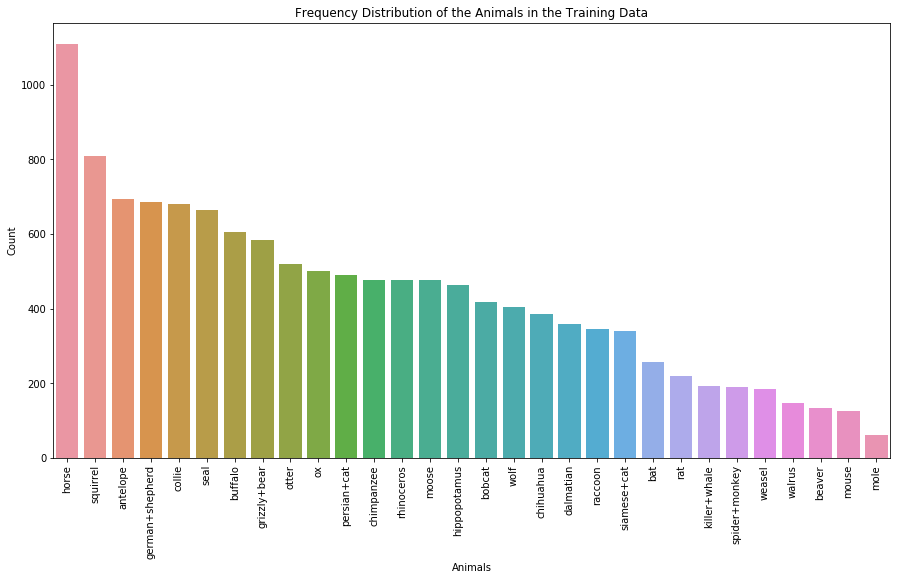

In [8]:
plt.figure(figsize=(15, 8))
ax = sns.barplot(x=no_of_animal.index, y=no_of_animal.values)
ax.set_xticklabels(ax.get_xticklabels(), rotation= 90)
ax.set_title('Frequency Distribution of the Animals in the Training Data')
ax.set(xlabel='Animals', ylabel='Count')
plt.show()

We can clearly see that no of training dataset in uneven.we have diffrent no of animal in training set.
so to get a heigher accuracy and avoid underfitting of less no of sample and overfitting of heigher no sample,we have to drop some sample from traing set.

In [9]:
avg=len(train.Animal.values)/len(train.Animal.unique())
avg

433.3333333333333

Thus we got an average of 433.33 no of sample

we will take our sample below 433 from each image

In [10]:
train_image_list=[]
animal_count=[]

In [12]:
def read_img(img_path):
    img=cv2.imread(img_path)
    img=cv2.resize(img,(64,64))
    return img

In [13]:
for i in tqdm(range(13000)):
    if animal_count.count(train.Animal[i])<=433:
        animal_count.append(train.Animal[i])
        train_image_list.append(read_img(TRAIN_PATH +train.Image_id[i]))
    

100%|████████████████████████████████████████████████████████████████████████████| 13000/13000 [10:15<00:00, 21.13it/s]


In [124]:
import gc
gc.collect()

3090

In [15]:
len(animal_count)

10270

In [16]:
y=pd.DataFrame({'Animal':animal_count})

In [17]:
len(y)

10270

In [18]:
y.head()

,Animal
0,hippopotamus
1,squirrel
2,grizzly+bear
3,ox
4,german+shepherd


In [25]:
x_train=np.array(train_image_list,np.float32)/255.


In [26]:
x_train[19]

array([[[1.        , 1.        , 1.        ],
        [1.        , 1.        , 1.        ],
        [1.        , 1.        , 1.        ],
        ...,
        [1.        , 0.98039216, 0.9137255 ],
        [1.        , 0.9490196 , 0.85882354],
        [0.99215686, 0.91764706, 0.8117647 ]],

       [[1.        , 1.        , 1.        ],
        [1.        , 1.        , 1.        ],
        [1.        , 1.        , 1.        ],
        ...,
        [0.99607843, 0.9647059 , 0.8980392 ],
        [0.99215686, 0.9411765 , 0.84705883],
        [0.99215686, 0.93333334, 0.83137256]],

       [[1.        , 1.        , 1.        ],
        [1.        , 1.        , 1.        ],
        [1.        , 1.        , 1.        ],
        ...,
        [0.99215686, 0.9647059 , 0.88235295],
        [1.        , 0.9490196 , 0.8627451 ],
        [1.        , 0.9372549 , 0.84313726]],

       ...,

       [[0.13725491, 0.1254902 , 0.14117648],
        [0.10196079, 0.15686275, 0.10588235],
        [0.05490196, 0

In [27]:
mean_img = x_train.mean(axis = 0)

In [85]:
mean_img.shape

(64, 64, 3)

In [32]:
mean_img

array([[[0.4031847 , 0.4569818 , 0.44513592],
        [0.40577984, 0.46019134, 0.44847274],
        [0.41011864, 0.46452174, 0.45272407],
        ...,
        [0.40981826, 0.46244365, 0.45223013],
        [0.40553898, 0.45738718, 0.4468401 ],
        [0.40245378, 0.45307618, 0.44287077]],

       [[0.40537584, 0.45968875, 0.4481076 ],
        [0.40750393, 0.46217403, 0.45133728],
        [0.40958738, 0.46504155, 0.4537156 ],
        ...,
        [0.41034475, 0.46360773, 0.45292127],
        [0.40730035, 0.45991877, 0.44937178],
        [0.40315858, 0.4542615 , 0.44468576]],

       [[0.40478817, 0.45956528, 0.4484199 ],
        [0.40681705, 0.46314964, 0.45194477],
        [0.40821126, 0.46483043, 0.45365122],
        ...,
        [0.41055578, 0.46494028, 0.45472777],
        [0.40797904, 0.46097073, 0.4512127 ],
        [0.40484113, 0.45640495, 0.4464695 ]],

       ...,

       [[0.3923693 , 0.46325925, 0.4658946 ],
        [0.3949566 , 0.46703485, 0.46994773],
        [0.39593783, 0

In [28]:
std_dev = x_train.std(axis = 0)


In [86]:
std_dev.shape

(64, 64, 3)

In [29]:
x_norm = (x_train - mean_img)/ std_dev

In [87]:
x_norm.shape

(10270, 64, 64, 3)

In [31]:
x_norm[19]

array([[[ 2.0541856 ,  1.9964473 ,  2.0165625 ],
        [ 2.0484471 ,  1.9894435 ,  2.0132415 ],
        [ 2.0285835 ,  1.971616  ,  1.9953703 ],
        ...,
        [ 2.0194967 ,  1.8901596 ,  1.6719693 ],
        [ 2.0350723 ,  1.7928989 ,  1.4894632 ],
        [ 2.0173445 ,  1.6918253 ,  1.3312538 ]],

       [[ 2.0631213 ,  2.002255  ,  2.0229857 ],
        [ 2.0559006 ,  1.9965706 ,  2.0147069 ],
        [ 2.0446227 ,  1.9859241 ,  2.0064938 ],
        ...,
        [ 2.0103152 ,  1.8334656 ,  1.611731  ],
        [ 2.0124862 ,  1.7646536 ,  1.4426005 ],
        [ 2.0298395 ,  1.7554616 ,  1.4042256 ]],

       [[ 2.0779517 ,  2.0174577 ,  2.0320451 ],
        [ 2.0683415 ,  2.0117812 ,  2.0283937 ],
        [ 2.0667818 ,  1.9964035 ,  2.0142188 ],
        ...,
        [ 2.0162237 ,  1.8474318 ,  1.5636591 ],
        [ 2.0520513 ,  1.803259  ,  1.5043504 ],
        [ 2.0613256 ,  1.7701164 ,  1.4449048 ]],

       ...,

       [[-0.99506384, -1.361326  , -1.2724742 ],
        [-1

In [125]:
del x_norm
gc.collect()

1500

In [34]:
from sklearn.preprocessing import LabelEncoder

In [35]:
lb = LabelEncoder()
lb.fit(y.Animal.values)
y_train = lb.transform(y.Animal.values)

In [36]:
from sklearn.model_selection import train_test_split

In [37]:
x_train, x_test, y_train, y_test = train_test_split(x_norm, y_train, test_size=0.15, random_state=47)

## Let's build our model

In [38]:
from keras.utils import np_utils
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPooling2D, BatchNormalization
from keras.callbacks import EarlyStopping, ModelCheckpoint

Using TensorFlow backend.


In [46]:
model = Sequential()

model.add(BatchNormalization(input_shape = (64,64,3)))

model.add(Conv2D(filters=64, kernel_size=(3,3), activation='relu'))

model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.15))

model.add(Conv2D(filters=64, kernel_size=(3,3), activation='relu'))

model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.15))

model.add(Flatten())
model.add(Dropout(0.25))

model.add(Dense(128,activation='relu'))
model.add(Dropout(0.25))

model.add(Dense(30,activation='softmax'))

model.compile(optimizer='adam',loss='categorical_crossentropy',metrics=['accuracy'])



In [47]:

y_train = np_utils.to_categorical(y_train)
y_test = np_utils.to_categorical(y_test)

In [48]:
early_stops = EarlyStopping(patience=5, monitor='val_acc')
checkpointer = ModelCheckpoint(filepath='weights.best.eda.hdf5', verbose=1, save_best_only=True)

we will use imgage agumentation as we have very less number of data

In [49]:
from keras.preprocessing.image import ImageDataGenerator

In [50]:
datagen = ImageDataGenerator(
    featurewise_center=True,
    featurewise_std_normalization=True,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True)

In [51]:
datagen.fit(x_train)

In [126]:
del x_train
gc.collect()

0

Let's train our model

In [52]:
model.fit_generator(datagen.flow(x_train, y_train, batch_size=32),
                    steps_per_epoch=len(x_train), epochs=30)

Epoch 1/30


 203/8729 [..............................] - ETA: 112524s - loss: 3.5000 - acc: 0.03 - ETA: 56861s - loss: 3.7002 - acc: 0.0312 - ETA: 38227s - loss: 3.6165 - acc: 0.052 - ETA: 28918s - loss: 3.6006 - acc: 0.039 - ETA: 23336s - loss: 3.6074 - acc: 0.056 - ETA: 19611s - loss: 3.5883 - acc: 0.062 - ETA: 16949s - loss: 3.5577 - acc: 0.067 - ETA: 14954s - loss: 3.5434 - acc: 0.066 - ETA: 13402s - loss: 3.5243 - acc: 0.059 - ETA: 12159s - loss: 3.5095 - acc: 0.056 - ETA: 11142s - loss: 3.5002 - acc: 0.051 - ETA: 10299s - loss: 3.4908 - acc: 0.052 - ETA: 9582s - loss: 3.4813 - acc: 0.055 - ETA: 8967s - loss: 3.4735 - acc: 0.05 - ETA: 8436s - loss: 3.4666 - acc: 0.06 - ETA: 7971s - loss: 3.4599 - acc: 0.06 - ETA: 7561s - loss: 3.4539 - acc: 0.06 - ETA: 7195s - loss: 3.4491 - acc: 0.06 - ETA: 6870s - loss: 3.4468 - acc: 0.06 - ETA: 6575s - loss: 3.4412 - acc: 0.06 - ETA: 6310s - loss: 3.4374 - acc: 0.06 - ETA: 6071s - loss: 3.4332 - acc: 0.07 - ETA: 5850s - loss: 3.4284 - acc: 0.07 - ETA: 5652

1427/8729 [===>..........................] - ETA: 942s - loss: 3.0385 - acc: 0.144 - ETA: 942s - loss: 3.0384 - acc: 0.144 - ETA: 942s - loss: 3.0383 - acc: 0.144 - ETA: 942s - loss: 3.0383 - acc: 0.144 - ETA: 941s - loss: 3.0381 - acc: 0.144 - ETA: 941s - loss: 3.0380 - acc: 0.144 - ETA: 941s - loss: 3.0378 - acc: 0.144 - ETA: 941s - loss: 3.0376 - acc: 0.144 - ETA: 940s - loss: 3.0376 - acc: 0.144 - ETA: 940s - loss: 3.0377 - acc: 0.144 - ETA: 940s - loss: 3.0377 - acc: 0.144 - ETA: 940s - loss: 3.0378 - acc: 0.144 - ETA: 940s - loss: 3.0377 - acc: 0.144 - ETA: 939s - loss: 3.0375 - acc: 0.144 - ETA: 939s - loss: 3.0374 - acc: 0.144 - ETA: 939s - loss: 3.0372 - acc: 0.144 - ETA: 939s - loss: 3.0369 - acc: 0.144 - ETA: 938s - loss: 3.0369 - acc: 0.144 - ETA: 938s - loss: 3.0368 - acc: 0.144 - ETA: 938s - loss: 3.0364 - acc: 0.144 - ETA: 938s - loss: 3.0362 - acc: 0.144 - ETA: 937s - loss: 3.0359 - acc: 0.144 - ETA: 937s - loss: 3.0358 - acc: 0.144 - ETA: 937s - loss: 3.0355 - acc: 0.1

1631/8729 [====>.........................] - ETA: 897s - loss: 3.0105 - acc: 0.150 - ETA: 897s - loss: 3.0105 - acc: 0.150 - ETA: 897s - loss: 3.0103 - acc: 0.150 - ETA: 896s - loss: 3.0101 - acc: 0.150 - ETA: 896s - loss: 3.0102 - acc: 0.150 - ETA: 896s - loss: 3.0101 - acc: 0.150 - ETA: 896s - loss: 3.0100 - acc: 0.150 - ETA: 896s - loss: 3.0100 - acc: 0.150 - ETA: 895s - loss: 3.0100 - acc: 0.150 - ETA: 895s - loss: 3.0100 - acc: 0.150 - ETA: 895s - loss: 3.0097 - acc: 0.150 - ETA: 895s - loss: 3.0098 - acc: 0.150 - ETA: 895s - loss: 3.0096 - acc: 0.150 - ETA: 894s - loss: 3.0093 - acc: 0.150 - ETA: 894s - loss: 3.0090 - acc: 0.150 - ETA: 894s - loss: 3.0087 - acc: 0.151 - ETA: 894s - loss: 3.0087 - acc: 0.150 - ETA: 894s - loss: 3.0086 - acc: 0.151 - ETA: 893s - loss: 3.0083 - acc: 0.151 - ETA: 893s - loss: 3.0082 - acc: 0.151 - ETA: 893s - loss: 3.0080 - acc: 0.151 - ETA: 893s - loss: 3.0078 - acc: 0.151 - ETA: 893s - loss: 3.0075 - acc: 0.151 - ETA: 892s - loss: 3.0072 - acc: 0.1

1835/8729 [=====>........................] - ETA: 858s - loss: 2.9844 - acc: 0.156 - ETA: 858s - loss: 2.9844 - acc: 0.156 - ETA: 858s - loss: 2.9841 - acc: 0.156 - ETA: 858s - loss: 2.9839 - acc: 0.156 - ETA: 858s - loss: 2.9837 - acc: 0.156 - ETA: 857s - loss: 2.9838 - acc: 0.156 - ETA: 857s - loss: 2.9837 - acc: 0.156 - ETA: 857s - loss: 2.9837 - acc: 0.156 - ETA: 857s - loss: 2.9835 - acc: 0.156 - ETA: 857s - loss: 2.9833 - acc: 0.156 - ETA: 857s - loss: 2.9834 - acc: 0.156 - ETA: 856s - loss: 2.9835 - acc: 0.156 - ETA: 856s - loss: 2.9835 - acc: 0.156 - ETA: 856s - loss: 2.9833 - acc: 0.156 - ETA: 856s - loss: 2.9831 - acc: 0.156 - ETA: 856s - loss: 2.9829 - acc: 0.157 - ETA: 855s - loss: 2.9828 - acc: 0.157 - ETA: 855s - loss: 2.9826 - acc: 0.157 - ETA: 855s - loss: 2.9823 - acc: 0.157 - ETA: 855s - loss: 2.9821 - acc: 0.157 - ETA: 855s - loss: 2.9820 - acc: 0.157 - ETA: 855s - loss: 2.9818 - acc: 0.157 - ETA: 854s - loss: 2.9816 - acc: 0.157 - ETA: 854s - loss: 2.9814 - acc: 0.1

2039/8729 [======>.......................] - ETA: 823s - loss: 2.9581 - acc: 0.162 - ETA: 823s - loss: 2.9581 - acc: 0.162 - ETA: 823s - loss: 2.9580 - acc: 0.162 - ETA: 823s - loss: 2.9580 - acc: 0.162 - ETA: 823s - loss: 2.9580 - acc: 0.162 - ETA: 823s - loss: 2.9580 - acc: 0.162 - ETA: 822s - loss: 2.9580 - acc: 0.162 - ETA: 822s - loss: 2.9576 - acc: 0.162 - ETA: 822s - loss: 2.9576 - acc: 0.162 - ETA: 822s - loss: 2.9573 - acc: 0.162 - ETA: 822s - loss: 2.9572 - acc: 0.162 - ETA: 822s - loss: 2.9573 - acc: 0.162 - ETA: 821s - loss: 2.9571 - acc: 0.162 - ETA: 821s - loss: 2.9572 - acc: 0.162 - ETA: 821s - loss: 2.9571 - acc: 0.162 - ETA: 821s - loss: 2.9569 - acc: 0.162 - ETA: 821s - loss: 2.9569 - acc: 0.162 - ETA: 821s - loss: 2.9567 - acc: 0.162 - ETA: 820s - loss: 2.9565 - acc: 0.163 - ETA: 820s - loss: 2.9563 - acc: 0.163 - ETA: 820s - loss: 2.9561 - acc: 0.163 - ETA: 820s - loss: 2.9562 - acc: 0.163 - ETA: 820s - loss: 2.9561 - acc: 0.163 - ETA: 820s - loss: 2.9562 - acc: 0.1

2243/8729 [======>.......................] - ETA: 791s - loss: 2.9368 - acc: 0.167 - ETA: 791s - loss: 2.9366 - acc: 0.167 - ETA: 791s - loss: 2.9366 - acc: 0.168 - ETA: 791s - loss: 2.9366 - acc: 0.167 - ETA: 790s - loss: 2.9366 - acc: 0.167 - ETA: 790s - loss: 2.9365 - acc: 0.168 - ETA: 790s - loss: 2.9363 - acc: 0.168 - ETA: 790s - loss: 2.9361 - acc: 0.168 - ETA: 790s - loss: 2.9360 - acc: 0.168 - ETA: 790s - loss: 2.9359 - acc: 0.168 - ETA: 790s - loss: 2.9356 - acc: 0.168 - ETA: 789s - loss: 2.9354 - acc: 0.168 - ETA: 789s - loss: 2.9355 - acc: 0.168 - ETA: 789s - loss: 2.9353 - acc: 0.168 - ETA: 789s - loss: 2.9354 - acc: 0.168 - ETA: 789s - loss: 2.9353 - acc: 0.168 - ETA: 789s - loss: 2.9352 - acc: 0.168 - ETA: 788s - loss: 2.9350 - acc: 0.168 - ETA: 788s - loss: 2.9349 - acc: 0.168 - ETA: 788s - loss: 2.9347 - acc: 0.168 - ETA: 788s - loss: 2.9346 - acc: 0.168 - ETA: 788s - loss: 2.9346 - acc: 0.168 - ETA: 788s - loss: 2.9345 - acc: 0.168 - ETA: 788s - loss: 2.9342 - acc: 0.1

2447/8729 [=======>......................] - ETA: 761s - loss: 2.9164 - acc: 0.172 - ETA: 761s - loss: 2.9163 - acc: 0.172 - ETA: 761s - loss: 2.9163 - acc: 0.172 - ETA: 760s - loss: 2.9162 - acc: 0.172 - ETA: 760s - loss: 2.9162 - acc: 0.172 - ETA: 760s - loss: 2.9160 - acc: 0.172 - ETA: 760s - loss: 2.9161 - acc: 0.172 - ETA: 760s - loss: 2.9159 - acc: 0.172 - ETA: 760s - loss: 2.9160 - acc: 0.172 - ETA: 760s - loss: 2.9159 - acc: 0.172 - ETA: 759s - loss: 2.9158 - acc: 0.172 - ETA: 759s - loss: 2.9157 - acc: 0.172 - ETA: 759s - loss: 2.9156 - acc: 0.172 - ETA: 759s - loss: 2.9155 - acc: 0.172 - ETA: 759s - loss: 2.9155 - acc: 0.172 - ETA: 759s - loss: 2.9154 - acc: 0.172 - ETA: 759s - loss: 2.9153 - acc: 0.172 - ETA: 758s - loss: 2.9153 - acc: 0.172 - ETA: 758s - loss: 2.9152 - acc: 0.172 - ETA: 758s - loss: 2.9153 - acc: 0.172 - ETA: 758s - loss: 2.9152 - acc: 0.172 - ETA: 758s - loss: 2.9151 - acc: 0.172 - ETA: 758s - loss: 2.9149 - acc: 0.172 - ETA: 758s - loss: 2.9147 - acc: 0.1

2651/8729 [========>.....................] - ETA: 732s - loss: 2.8994 - acc: 0.175 - ETA: 732s - loss: 2.8992 - acc: 0.175 - ETA: 731s - loss: 2.8991 - acc: 0.175 - ETA: 731s - loss: 2.8990 - acc: 0.175 - ETA: 731s - loss: 2.8989 - acc: 0.175 - ETA: 731s - loss: 2.8988 - acc: 0.175 - ETA: 731s - loss: 2.8987 - acc: 0.175 - ETA: 731s - loss: 2.8985 - acc: 0.175 - ETA: 731s - loss: 2.8985 - acc: 0.175 - ETA: 730s - loss: 2.8983 - acc: 0.175 - ETA: 730s - loss: 2.8983 - acc: 0.175 - ETA: 730s - loss: 2.8982 - acc: 0.175 - ETA: 730s - loss: 2.8982 - acc: 0.175 - ETA: 730s - loss: 2.8981 - acc: 0.175 - ETA: 730s - loss: 2.8980 - acc: 0.175 - ETA: 730s - loss: 2.8980 - acc: 0.175 - ETA: 730s - loss: 2.8979 - acc: 0.175 - ETA: 729s - loss: 2.8978 - acc: 0.175 - ETA: 729s - loss: 2.8978 - acc: 0.175 - ETA: 729s - loss: 2.8977 - acc: 0.175 - ETA: 729s - loss: 2.8978 - acc: 0.175 - ETA: 729s - loss: 2.8976 - acc: 0.175 - ETA: 729s - loss: 2.8976 - acc: 0.176 - ETA: 729s - loss: 2.8974 - acc: 0.1

2855/8729 [========>.....................] - ETA: 704s - loss: 2.8823 - acc: 0.179 - ETA: 704s - loss: 2.8821 - acc: 0.179 - ETA: 704s - loss: 2.8821 - acc: 0.179 - ETA: 703s - loss: 2.8819 - acc: 0.179 - ETA: 703s - loss: 2.8818 - acc: 0.179 - ETA: 703s - loss: 2.8818 - acc: 0.179 - ETA: 703s - loss: 2.8816 - acc: 0.179 - ETA: 703s - loss: 2.8815 - acc: 0.179 - ETA: 703s - loss: 2.8814 - acc: 0.179 - ETA: 703s - loss: 2.8813 - acc: 0.179 - ETA: 702s - loss: 2.8813 - acc: 0.179 - ETA: 702s - loss: 2.8813 - acc: 0.179 - ETA: 702s - loss: 2.8811 - acc: 0.179 - ETA: 702s - loss: 2.8810 - acc: 0.179 - ETA: 702s - loss: 2.8809 - acc: 0.179 - ETA: 702s - loss: 2.8807 - acc: 0.179 - ETA: 702s - loss: 2.8806 - acc: 0.179 - ETA: 701s - loss: 2.8804 - acc: 0.180 - ETA: 701s - loss: 2.8803 - acc: 0.180 - ETA: 701s - loss: 2.8801 - acc: 0.180 - ETA: 701s - loss: 2.8800 - acc: 0.180 - ETA: 701s - loss: 2.8800 - acc: 0.180 - ETA: 701s - loss: 2.8799 - acc: 0.180 - ETA: 701s - loss: 2.8800 - acc: 0.1

3059/8729 [=========>....................] - ETA: 677s - loss: 2.8655 - acc: 0.183 - ETA: 677s - loss: 2.8654 - acc: 0.183 - ETA: 676s - loss: 2.8654 - acc: 0.183 - ETA: 676s - loss: 2.8653 - acc: 0.183 - ETA: 676s - loss: 2.8653 - acc: 0.183 - ETA: 676s - loss: 2.8653 - acc: 0.183 - ETA: 676s - loss: 2.8653 - acc: 0.183 - ETA: 676s - loss: 2.8653 - acc: 0.183 - ETA: 676s - loss: 2.8652 - acc: 0.183 - ETA: 676s - loss: 2.8652 - acc: 0.183 - ETA: 675s - loss: 2.8651 - acc: 0.183 - ETA: 675s - loss: 2.8651 - acc: 0.183 - ETA: 675s - loss: 2.8651 - acc: 0.183 - ETA: 675s - loss: 2.8651 - acc: 0.183 - ETA: 675s - loss: 2.8652 - acc: 0.183 - ETA: 675s - loss: 2.8651 - acc: 0.183 - ETA: 675s - loss: 2.8649 - acc: 0.183 - ETA: 674s - loss: 2.8648 - acc: 0.183 - ETA: 674s - loss: 2.8647 - acc: 0.183 - ETA: 674s - loss: 2.8647 - acc: 0.183 - ETA: 674s - loss: 2.8645 - acc: 0.183 - ETA: 674s - loss: 2.8645 - acc: 0.183 - ETA: 674s - loss: 2.8644 - acc: 0.183 - ETA: 674s - loss: 2.8644 - acc: 0.1

3263/8729 [==========>...................] - ETA: 650s - loss: 2.8507 - acc: 0.186 - ETA: 650s - loss: 2.8507 - acc: 0.186 - ETA: 650s - loss: 2.8506 - acc: 0.186 - ETA: 650s - loss: 2.8504 - acc: 0.186 - ETA: 650s - loss: 2.8504 - acc: 0.186 - ETA: 650s - loss: 2.8505 - acc: 0.186 - ETA: 650s - loss: 2.8505 - acc: 0.186 - ETA: 649s - loss: 2.8505 - acc: 0.186 - ETA: 649s - loss: 2.8503 - acc: 0.187 - ETA: 649s - loss: 2.8504 - acc: 0.187 - ETA: 649s - loss: 2.8504 - acc: 0.187 - ETA: 649s - loss: 2.8502 - acc: 0.187 - ETA: 649s - loss: 2.8502 - acc: 0.187 - ETA: 649s - loss: 2.8501 - acc: 0.187 - ETA: 649s - loss: 2.8502 - acc: 0.187 - ETA: 648s - loss: 2.8500 - acc: 0.187 - ETA: 648s - loss: 2.8499 - acc: 0.187 - ETA: 648s - loss: 2.8499 - acc: 0.187 - ETA: 648s - loss: 2.8498 - acc: 0.187 - ETA: 648s - loss: 2.8497 - acc: 0.187 - ETA: 648s - loss: 2.8496 - acc: 0.187 - ETA: 648s - loss: 2.8494 - acc: 0.187 - ETA: 648s - loss: 2.8494 - acc: 0.187 - ETA: 647s - loss: 2.8494 - acc: 0.1

3467/8729 [==========>...................] - ETA: 625s - loss: 2.8380 - acc: 0.189 - ETA: 624s - loss: 2.8380 - acc: 0.189 - ETA: 624s - loss: 2.8379 - acc: 0.189 - ETA: 624s - loss: 2.8378 - acc: 0.189 - ETA: 624s - loss: 2.8377 - acc: 0.189 - ETA: 624s - loss: 2.8377 - acc: 0.189 - ETA: 624s - loss: 2.8376 - acc: 0.189 - ETA: 624s - loss: 2.8375 - acc: 0.189 - ETA: 624s - loss: 2.8373 - acc: 0.190 - ETA: 623s - loss: 2.8372 - acc: 0.190 - ETA: 623s - loss: 2.8372 - acc: 0.190 - ETA: 623s - loss: 2.8372 - acc: 0.190 - ETA: 623s - loss: 2.8372 - acc: 0.190 - ETA: 623s - loss: 2.8371 - acc: 0.190 - ETA: 623s - loss: 2.8370 - acc: 0.190 - ETA: 623s - loss: 2.8368 - acc: 0.190 - ETA: 622s - loss: 2.8368 - acc: 0.190 - ETA: 622s - loss: 2.8366 - acc: 0.190 - ETA: 622s - loss: 2.8364 - acc: 0.190 - ETA: 622s - loss: 2.8362 - acc: 0.190 - ETA: 622s - loss: 2.8361 - acc: 0.190 - ETA: 622s - loss: 2.8361 - acc: 0.190 - ETA: 622s - loss: 2.8360 - acc: 0.190 - ETA: 622s - loss: 2.8358 - acc: 0.1

3671/8729 [===========>..................] - ETA: 599s - loss: 2.8248 - acc: 0.192 - ETA: 599s - loss: 2.8247 - acc: 0.192 - ETA: 599s - loss: 2.8246 - acc: 0.192 - ETA: 599s - loss: 2.8244 - acc: 0.192 - ETA: 599s - loss: 2.8244 - acc: 0.193 - ETA: 598s - loss: 2.8243 - acc: 0.193 - ETA: 598s - loss: 2.8243 - acc: 0.192 - ETA: 598s - loss: 2.8242 - acc: 0.193 - ETA: 598s - loss: 2.8241 - acc: 0.193 - ETA: 598s - loss: 2.8240 - acc: 0.193 - ETA: 598s - loss: 2.8239 - acc: 0.193 - ETA: 598s - loss: 2.8239 - acc: 0.193 - ETA: 598s - loss: 2.8238 - acc: 0.193 - ETA: 597s - loss: 2.8237 - acc: 0.193 - ETA: 597s - loss: 2.8237 - acc: 0.193 - ETA: 597s - loss: 2.8236 - acc: 0.193 - ETA: 597s - loss: 2.8236 - acc: 0.193 - ETA: 597s - loss: 2.8235 - acc: 0.193 - ETA: 597s - loss: 2.8234 - acc: 0.193 - ETA: 597s - loss: 2.8232 - acc: 0.193 - ETA: 597s - loss: 2.8232 - acc: 0.193 - ETA: 597s - loss: 2.8232 - acc: 0.193 - ETA: 596s - loss: 2.8231 - acc: 0.193 - ETA: 596s - loss: 2.8231 - acc: 0.1

3875/8729 [============>.................] - ETA: 574s - loss: 2.8115 - acc: 0.195 - ETA: 574s - loss: 2.8114 - acc: 0.195 - ETA: 574s - loss: 2.8114 - acc: 0.195 - ETA: 574s - loss: 2.8113 - acc: 0.195 - ETA: 574s - loss: 2.8113 - acc: 0.195 - ETA: 573s - loss: 2.8112 - acc: 0.195 - ETA: 573s - loss: 2.8111 - acc: 0.195 - ETA: 573s - loss: 2.8110 - acc: 0.195 - ETA: 573s - loss: 2.8110 - acc: 0.195 - ETA: 573s - loss: 2.8110 - acc: 0.195 - ETA: 573s - loss: 2.8109 - acc: 0.195 - ETA: 573s - loss: 2.8108 - acc: 0.195 - ETA: 573s - loss: 2.8107 - acc: 0.195 - ETA: 573s - loss: 2.8106 - acc: 0.195 - ETA: 572s - loss: 2.8106 - acc: 0.195 - ETA: 572s - loss: 2.8105 - acc: 0.195 - ETA: 572s - loss: 2.8105 - acc: 0.195 - ETA: 572s - loss: 2.8104 - acc: 0.195 - ETA: 572s - loss: 2.8103 - acc: 0.195 - ETA: 572s - loss: 2.8103 - acc: 0.195 - ETA: 572s - loss: 2.8103 - acc: 0.195 - ETA: 572s - loss: 2.8103 - acc: 0.195 - ETA: 571s - loss: 2.8101 - acc: 0.195 - ETA: 571s - loss: 2.8101 - acc: 0.1

4079/8729 [=============>................] - ETA: 549s - loss: 2.7996 - acc: 0.198 - ETA: 549s - loss: 2.7996 - acc: 0.198 - ETA: 549s - loss: 2.7995 - acc: 0.198 - ETA: 549s - loss: 2.7994 - acc: 0.198 - ETA: 549s - loss: 2.7993 - acc: 0.198 - ETA: 549s - loss: 2.7992 - acc: 0.198 - ETA: 549s - loss: 2.7992 - acc: 0.198 - ETA: 549s - loss: 2.7991 - acc: 0.198 - ETA: 548s - loss: 2.7991 - acc: 0.198 - ETA: 548s - loss: 2.7991 - acc: 0.198 - ETA: 548s - loss: 2.7989 - acc: 0.198 - ETA: 548s - loss: 2.7988 - acc: 0.198 - ETA: 548s - loss: 2.7989 - acc: 0.198 - ETA: 548s - loss: 2.7988 - acc: 0.198 - ETA: 548s - loss: 2.7987 - acc: 0.198 - ETA: 548s - loss: 2.7987 - acc: 0.198 - ETA: 547s - loss: 2.7987 - acc: 0.198 - ETA: 547s - loss: 2.7987 - acc: 0.198 - ETA: 547s - loss: 2.7986 - acc: 0.198 - ETA: 547s - loss: 2.7985 - acc: 0.198 - ETA: 547s - loss: 2.7985 - acc: 0.198 - ETA: 547s - loss: 2.7985 - acc: 0.198 - ETA: 547s - loss: 2.7984 - acc: 0.198 - ETA: 547s - loss: 2.7984 - acc: 0.1

4283/8729 [=============>................] - ETA: 525s - loss: 2.7894 - acc: 0.200 - ETA: 525s - loss: 2.7893 - acc: 0.200 - ETA: 525s - loss: 2.7892 - acc: 0.200 - ETA: 525s - loss: 2.7891 - acc: 0.200 - ETA: 525s - loss: 2.7891 - acc: 0.200 - ETA: 525s - loss: 2.7890 - acc: 0.200 - ETA: 525s - loss: 2.7890 - acc: 0.200 - ETA: 524s - loss: 2.7889 - acc: 0.201 - ETA: 524s - loss: 2.7889 - acc: 0.201 - ETA: 524s - loss: 2.7889 - acc: 0.201 - ETA: 524s - loss: 2.7889 - acc: 0.201 - ETA: 524s - loss: 2.7888 - acc: 0.201 - ETA: 524s - loss: 2.7887 - acc: 0.201 - ETA: 524s - loss: 2.7886 - acc: 0.201 - ETA: 524s - loss: 2.7887 - acc: 0.201 - ETA: 523s - loss: 2.7887 - acc: 0.201 - ETA: 523s - loss: 2.7887 - acc: 0.201 - ETA: 523s - loss: 2.7885 - acc: 0.201 - ETA: 523s - loss: 2.7885 - acc: 0.201 - ETA: 523s - loss: 2.7885 - acc: 0.201 - ETA: 523s - loss: 2.7884 - acc: 0.201 - ETA: 523s - loss: 2.7884 - acc: 0.201 - ETA: 523s - loss: 2.7883 - acc: 0.201 - ETA: 522s - loss: 2.7883 - acc: 0.2

4487/8729 [==============>...............] - ETA: 501s - loss: 2.7793 - acc: 0.203 - ETA: 501s - loss: 2.7793 - acc: 0.203 - ETA: 501s - loss: 2.7793 - acc: 0.203 - ETA: 501s - loss: 2.7794 - acc: 0.203 - ETA: 500s - loss: 2.7793 - acc: 0.203 - ETA: 500s - loss: 2.7792 - acc: 0.203 - ETA: 500s - loss: 2.7791 - acc: 0.203 - ETA: 500s - loss: 2.7791 - acc: 0.203 - ETA: 500s - loss: 2.7791 - acc: 0.203 - ETA: 500s - loss: 2.7791 - acc: 0.203 - ETA: 500s - loss: 2.7789 - acc: 0.203 - ETA: 500s - loss: 2.7789 - acc: 0.203 - ETA: 500s - loss: 2.7787 - acc: 0.203 - ETA: 499s - loss: 2.7787 - acc: 0.203 - ETA: 499s - loss: 2.7787 - acc: 0.203 - ETA: 499s - loss: 2.7786 - acc: 0.203 - ETA: 499s - loss: 2.7785 - acc: 0.203 - ETA: 499s - loss: 2.7784 - acc: 0.203 - ETA: 499s - loss: 2.7783 - acc: 0.203 - ETA: 499s - loss: 2.7783 - acc: 0.203 - ETA: 499s - loss: 2.7783 - acc: 0.203 - ETA: 498s - loss: 2.7783 - acc: 0.203 - ETA: 498s - loss: 2.7783 - acc: 0.203 - ETA: 498s - loss: 2.7783 - acc: 0.2

4691/8729 [===============>..............] - ETA: 477s - loss: 2.7701 - acc: 0.205 - ETA: 477s - loss: 2.7701 - acc: 0.205 - ETA: 477s - loss: 2.7700 - acc: 0.205 - ETA: 477s - loss: 2.7700 - acc: 0.205 - ETA: 476s - loss: 2.7700 - acc: 0.205 - ETA: 476s - loss: 2.7699 - acc: 0.205 - ETA: 476s - loss: 2.7699 - acc: 0.205 - ETA: 476s - loss: 2.7700 - acc: 0.205 - ETA: 476s - loss: 2.7699 - acc: 0.205 - ETA: 476s - loss: 2.7698 - acc: 0.205 - ETA: 476s - loss: 2.7698 - acc: 0.205 - ETA: 476s - loss: 2.7697 - acc: 0.205 - ETA: 476s - loss: 2.7695 - acc: 0.206 - ETA: 475s - loss: 2.7695 - acc: 0.206 - ETA: 475s - loss: 2.7695 - acc: 0.206 - ETA: 475s - loss: 2.7694 - acc: 0.206 - ETA: 475s - loss: 2.7693 - acc: 0.206 - ETA: 475s - loss: 2.7692 - acc: 0.206 - ETA: 475s - loss: 2.7691 - acc: 0.206 - ETA: 475s - loss: 2.7691 - acc: 0.206 - ETA: 475s - loss: 2.7690 - acc: 0.206 - ETA: 475s - loss: 2.7691 - acc: 0.206 - ETA: 474s - loss: 2.7691 - acc: 0.206 - ETA: 474s - loss: 2.7690 - acc: 0.2

4895/8729 [===============>..............] - ETA: 453s - loss: 2.7596 - acc: 0.208 - ETA: 453s - loss: 2.7595 - acc: 0.208 - ETA: 453s - loss: 2.7595 - acc: 0.208 - ETA: 453s - loss: 2.7594 - acc: 0.208 - ETA: 453s - loss: 2.7593 - acc: 0.208 - ETA: 453s - loss: 2.7592 - acc: 0.208 - ETA: 452s - loss: 2.7592 - acc: 0.208 - ETA: 452s - loss: 2.7592 - acc: 0.208 - ETA: 452s - loss: 2.7591 - acc: 0.208 - ETA: 452s - loss: 2.7591 - acc: 0.208 - ETA: 452s - loss: 2.7591 - acc: 0.208 - ETA: 452s - loss: 2.7590 - acc: 0.208 - ETA: 452s - loss: 2.7589 - acc: 0.208 - ETA: 452s - loss: 2.7588 - acc: 0.208 - ETA: 452s - loss: 2.7587 - acc: 0.208 - ETA: 451s - loss: 2.7587 - acc: 0.208 - ETA: 451s - loss: 2.7587 - acc: 0.208 - ETA: 451s - loss: 2.7586 - acc: 0.208 - ETA: 451s - loss: 2.7587 - acc: 0.208 - ETA: 451s - loss: 2.7586 - acc: 0.208 - ETA: 451s - loss: 2.7585 - acc: 0.208 - ETA: 451s - loss: 2.7585 - acc: 0.208 - ETA: 451s - loss: 2.7584 - acc: 0.208 - ETA: 450s - loss: 2.7584 - acc: 0.2

5099/8729 [================>.............] - ETA: 429s - loss: 2.7505 - acc: 0.210 - ETA: 429s - loss: 2.7505 - acc: 0.210 - ETA: 429s - loss: 2.7506 - acc: 0.210 - ETA: 429s - loss: 2.7505 - acc: 0.210 - ETA: 429s - loss: 2.7504 - acc: 0.210 - ETA: 429s - loss: 2.7504 - acc: 0.210 - ETA: 429s - loss: 2.7503 - acc: 0.210 - ETA: 429s - loss: 2.7503 - acc: 0.210 - ETA: 429s - loss: 2.7503 - acc: 0.210 - ETA: 428s - loss: 2.7502 - acc: 0.210 - ETA: 428s - loss: 2.7502 - acc: 0.210 - ETA: 428s - loss: 2.7502 - acc: 0.210 - ETA: 428s - loss: 2.7501 - acc: 0.210 - ETA: 428s - loss: 2.7501 - acc: 0.210 - ETA: 428s - loss: 2.7500 - acc: 0.210 - ETA: 428s - loss: 2.7499 - acc: 0.210 - ETA: 428s - loss: 2.7499 - acc: 0.210 - ETA: 427s - loss: 2.7499 - acc: 0.210 - ETA: 427s - loss: 2.7498 - acc: 0.210 - ETA: 427s - loss: 2.7498 - acc: 0.210 - ETA: 427s - loss: 2.7497 - acc: 0.210 - ETA: 427s - loss: 2.7497 - acc: 0.210 - ETA: 427s - loss: 2.7496 - acc: 0.210 - ETA: 427s - loss: 2.7495 - acc: 0.2

5303/8729 [=================>............] - ETA: 406s - loss: 2.7420 - acc: 0.212 - ETA: 406s - loss: 2.7419 - acc: 0.212 - ETA: 406s - loss: 2.7419 - acc: 0.212 - ETA: 406s - loss: 2.7418 - acc: 0.212 - ETA: 405s - loss: 2.7418 - acc: 0.212 - ETA: 405s - loss: 2.7418 - acc: 0.212 - ETA: 405s - loss: 2.7418 - acc: 0.212 - ETA: 405s - loss: 2.7416 - acc: 0.212 - ETA: 405s - loss: 2.7416 - acc: 0.212 - ETA: 405s - loss: 2.7416 - acc: 0.212 - ETA: 405s - loss: 2.7416 - acc: 0.212 - ETA: 405s - loss: 2.7416 - acc: 0.212 - ETA: 405s - loss: 2.7415 - acc: 0.212 - ETA: 404s - loss: 2.7415 - acc: 0.212 - ETA: 404s - loss: 2.7414 - acc: 0.212 - ETA: 404s - loss: 2.7414 - acc: 0.212 - ETA: 404s - loss: 2.7414 - acc: 0.212 - ETA: 404s - loss: 2.7412 - acc: 0.212 - ETA: 404s - loss: 2.7412 - acc: 0.212 - ETA: 404s - loss: 2.7413 - acc: 0.212 - ETA: 404s - loss: 2.7412 - acc: 0.212 - ETA: 403s - loss: 2.7411 - acc: 0.212 - ETA: 403s - loss: 2.7410 - acc: 0.212 - ETA: 403s - loss: 2.7410 - acc: 0.2

5507/8729 [=================>............] - ETA: 382s - loss: 2.7335 - acc: 0.214 - ETA: 382s - loss: 2.7334 - acc: 0.214 - ETA: 382s - loss: 2.7334 - acc: 0.214 - ETA: 382s - loss: 2.7333 - acc: 0.214 - ETA: 382s - loss: 2.7332 - acc: 0.214 - ETA: 382s - loss: 2.7331 - acc: 0.214 - ETA: 382s - loss: 2.7331 - acc: 0.214 - ETA: 382s - loss: 2.7330 - acc: 0.214 - ETA: 382s - loss: 2.7329 - acc: 0.214 - ETA: 381s - loss: 2.7329 - acc: 0.214 - ETA: 381s - loss: 2.7329 - acc: 0.214 - ETA: 381s - loss: 2.7328 - acc: 0.214 - ETA: 381s - loss: 2.7328 - acc: 0.214 - ETA: 381s - loss: 2.7328 - acc: 0.214 - ETA: 381s - loss: 2.7327 - acc: 0.214 - ETA: 381s - loss: 2.7327 - acc: 0.214 - ETA: 381s - loss: 2.7326 - acc: 0.214 - ETA: 381s - loss: 2.7325 - acc: 0.214 - ETA: 380s - loss: 2.7326 - acc: 0.214 - ETA: 380s - loss: 2.7325 - acc: 0.214 - ETA: 380s - loss: 2.7325 - acc: 0.214 - ETA: 380s - loss: 2.7324 - acc: 0.214 - ETA: 380s - loss: 2.7325 - acc: 0.214 - ETA: 380s - loss: 2.7326 - acc: 0.2

5711/8729 [==================>...........] - ETA: 359s - loss: 2.7255 - acc: 0.216 - ETA: 359s - loss: 2.7254 - acc: 0.216 - ETA: 359s - loss: 2.7253 - acc: 0.216 - ETA: 359s - loss: 2.7252 - acc: 0.216 - ETA: 359s - loss: 2.7252 - acc: 0.216 - ETA: 359s - loss: 2.7252 - acc: 0.216 - ETA: 358s - loss: 2.7252 - acc: 0.216 - ETA: 358s - loss: 2.7251 - acc: 0.216 - ETA: 358s - loss: 2.7251 - acc: 0.216 - ETA: 358s - loss: 2.7251 - acc: 0.216 - ETA: 358s - loss: 2.7250 - acc: 0.216 - ETA: 358s - loss: 2.7249 - acc: 0.216 - ETA: 358s - loss: 2.7248 - acc: 0.216 - ETA: 358s - loss: 2.7248 - acc: 0.216 - ETA: 358s - loss: 2.7247 - acc: 0.216 - ETA: 357s - loss: 2.7246 - acc: 0.216 - ETA: 357s - loss: 2.7246 - acc: 0.216 - ETA: 357s - loss: 2.7246 - acc: 0.216 - ETA: 357s - loss: 2.7246 - acc: 0.216 - ETA: 357s - loss: 2.7246 - acc: 0.216 - ETA: 357s - loss: 2.7245 - acc: 0.216 - ETA: 357s - loss: 2.7244 - acc: 0.216 - ETA: 357s - loss: 2.7243 - acc: 0.216 - ETA: 357s - loss: 2.7243 - acc: 0.2

5915/8729 [===================>..........] - ETA: 336s - loss: 2.7179 - acc: 0.218 - ETA: 336s - loss: 2.7179 - acc: 0.218 - ETA: 336s - loss: 2.7178 - acc: 0.218 - ETA: 336s - loss: 2.7178 - acc: 0.218 - ETA: 335s - loss: 2.7177 - acc: 0.218 - ETA: 335s - loss: 2.7177 - acc: 0.218 - ETA: 335s - loss: 2.7176 - acc: 0.218 - ETA: 335s - loss: 2.7176 - acc: 0.218 - ETA: 335s - loss: 2.7175 - acc: 0.218 - ETA: 335s - loss: 2.7175 - acc: 0.218 - ETA: 335s - loss: 2.7174 - acc: 0.218 - ETA: 335s - loss: 2.7174 - acc: 0.218 - ETA: 335s - loss: 2.7174 - acc: 0.218 - ETA: 334s - loss: 2.7173 - acc: 0.218 - ETA: 334s - loss: 2.7172 - acc: 0.218 - ETA: 334s - loss: 2.7171 - acc: 0.218 - ETA: 334s - loss: 2.7170 - acc: 0.218 - ETA: 334s - loss: 2.7169 - acc: 0.218 - ETA: 334s - loss: 2.7169 - acc: 0.218 - ETA: 334s - loss: 2.7169 - acc: 0.218 - ETA: 334s - loss: 2.7168 - acc: 0.218 - ETA: 334s - loss: 2.7168 - acc: 0.218 - ETA: 333s - loss: 2.7168 - acc: 0.218 - ETA: 333s - loss: 2.7167 - acc: 0.2

6119/8729 [====================>.........] - ETA: 313s - loss: 2.7100 - acc: 0.220 - ETA: 313s - loss: 2.7100 - acc: 0.220 - ETA: 313s - loss: 2.7100 - acc: 0.220 - ETA: 312s - loss: 2.7099 - acc: 0.220 - ETA: 312s - loss: 2.7099 - acc: 0.220 - ETA: 312s - loss: 2.7099 - acc: 0.220 - ETA: 312s - loss: 2.7098 - acc: 0.220 - ETA: 312s - loss: 2.7098 - acc: 0.220 - ETA: 312s - loss: 2.7097 - acc: 0.220 - ETA: 312s - loss: 2.7097 - acc: 0.220 - ETA: 312s - loss: 2.7097 - acc: 0.220 - ETA: 312s - loss: 2.7096 - acc: 0.220 - ETA: 311s - loss: 2.7096 - acc: 0.220 - ETA: 311s - loss: 2.7095 - acc: 0.220 - ETA: 311s - loss: 2.7095 - acc: 0.220 - ETA: 311s - loss: 2.7095 - acc: 0.220 - ETA: 311s - loss: 2.7095 - acc: 0.220 - ETA: 311s - loss: 2.7094 - acc: 0.220 - ETA: 311s - loss: 2.7093 - acc: 0.220 - ETA: 311s - loss: 2.7093 - acc: 0.220 - ETA: 311s - loss: 2.7093 - acc: 0.220 - ETA: 310s - loss: 2.7092 - acc: 0.220 - ETA: 310s - loss: 2.7091 - acc: 0.220 - ETA: 310s - loss: 2.7091 - acc: 0.2

6323/8729 [====================>.........] - ETA: 290s - loss: 2.7025 - acc: 0.222 - ETA: 290s - loss: 2.7024 - acc: 0.222 - ETA: 290s - loss: 2.7023 - acc: 0.222 - ETA: 289s - loss: 2.7023 - acc: 0.222 - ETA: 289s - loss: 2.7021 - acc: 0.222 - ETA: 289s - loss: 2.7021 - acc: 0.222 - ETA: 289s - loss: 2.7020 - acc: 0.222 - ETA: 289s - loss: 2.7020 - acc: 0.222 - ETA: 289s - loss: 2.7020 - acc: 0.222 - ETA: 289s - loss: 2.7019 - acc: 0.222 - ETA: 289s - loss: 2.7019 - acc: 0.222 - ETA: 289s - loss: 2.7019 - acc: 0.222 - ETA: 288s - loss: 2.7019 - acc: 0.222 - ETA: 288s - loss: 2.7019 - acc: 0.222 - ETA: 288s - loss: 2.7019 - acc: 0.222 - ETA: 288s - loss: 2.7019 - acc: 0.222 - ETA: 288s - loss: 2.7018 - acc: 0.222 - ETA: 288s - loss: 2.7018 - acc: 0.222 - ETA: 288s - loss: 2.7018 - acc: 0.222 - ETA: 288s - loss: 2.7018 - acc: 0.222 - ETA: 287s - loss: 2.7017 - acc: 0.222 - ETA: 287s - loss: 2.7017 - acc: 0.222 - ETA: 287s - loss: 2.7017 - acc: 0.222 - ETA: 287s - loss: 2.7016 - acc: 0.2

6527/8729 [=====================>........] - ETA: 267s - loss: 2.6950 - acc: 0.223 - ETA: 267s - loss: 2.6950 - acc: 0.223 - ETA: 267s - loss: 2.6949 - acc: 0.223 - ETA: 266s - loss: 2.6948 - acc: 0.223 - ETA: 266s - loss: 2.6948 - acc: 0.223 - ETA: 266s - loss: 2.6948 - acc: 0.223 - ETA: 266s - loss: 2.6947 - acc: 0.223 - ETA: 266s - loss: 2.6946 - acc: 0.223 - ETA: 266s - loss: 2.6946 - acc: 0.223 - ETA: 266s - loss: 2.6946 - acc: 0.223 - ETA: 266s - loss: 2.6946 - acc: 0.223 - ETA: 266s - loss: 2.6945 - acc: 0.223 - ETA: 265s - loss: 2.6945 - acc: 0.223 - ETA: 265s - loss: 2.6945 - acc: 0.223 - ETA: 265s - loss: 2.6944 - acc: 0.223 - ETA: 265s - loss: 2.6944 - acc: 0.223 - ETA: 265s - loss: 2.6944 - acc: 0.223 - ETA: 265s - loss: 2.6944 - acc: 0.223 - ETA: 265s - loss: 2.6943 - acc: 0.223 - ETA: 265s - loss: 2.6943 - acc: 0.223 - ETA: 265s - loss: 2.6942 - acc: 0.223 - ETA: 264s - loss: 2.6943 - acc: 0.223 - ETA: 264s - loss: 2.6942 - acc: 0.223 - ETA: 264s - loss: 2.6942 - acc: 0.2

6731/8729 [======================>.......] - ETA: 244s - loss: 2.6882 - acc: 0.225 - ETA: 244s - loss: 2.6882 - acc: 0.225 - ETA: 244s - loss: 2.6882 - acc: 0.225 - ETA: 244s - loss: 2.6882 - acc: 0.225 - ETA: 243s - loss: 2.6882 - acc: 0.225 - ETA: 243s - loss: 2.6882 - acc: 0.225 - ETA: 243s - loss: 2.6882 - acc: 0.225 - ETA: 243s - loss: 2.6881 - acc: 0.225 - ETA: 243s - loss: 2.6880 - acc: 0.225 - ETA: 243s - loss: 2.6880 - acc: 0.225 - ETA: 243s - loss: 2.6879 - acc: 0.225 - ETA: 243s - loss: 2.6879 - acc: 0.225 - ETA: 243s - loss: 2.6878 - acc: 0.225 - ETA: 242s - loss: 2.6878 - acc: 0.225 - ETA: 242s - loss: 2.6878 - acc: 0.225 - ETA: 242s - loss: 2.6878 - acc: 0.225 - ETA: 242s - loss: 2.6878 - acc: 0.225 - ETA: 242s - loss: 2.6877 - acc: 0.225 - ETA: 242s - loss: 2.6878 - acc: 0.225 - ETA: 242s - loss: 2.6877 - acc: 0.225 - ETA: 242s - loss: 2.6877 - acc: 0.225 - ETA: 242s - loss: 2.6876 - acc: 0.225 - ETA: 241s - loss: 2.6876 - acc: 0.225 - ETA: 241s - loss: 2.6876 - acc: 0.2

6935/8729 [======================>.......] - ETA: 221s - loss: 2.6812 - acc: 0.227 - ETA: 221s - loss: 2.6813 - acc: 0.227 - ETA: 221s - loss: 2.6813 - acc: 0.227 - ETA: 221s - loss: 2.6813 - acc: 0.227 - ETA: 221s - loss: 2.6813 - acc: 0.227 - ETA: 220s - loss: 2.6812 - acc: 0.227 - ETA: 220s - loss: 2.6812 - acc: 0.227 - ETA: 220s - loss: 2.6811 - acc: 0.227 - ETA: 220s - loss: 2.6810 - acc: 0.227 - ETA: 220s - loss: 2.6810 - acc: 0.227 - ETA: 220s - loss: 2.6809 - acc: 0.227 - ETA: 220s - loss: 2.6809 - acc: 0.227 - ETA: 220s - loss: 2.6808 - acc: 0.227 - ETA: 220s - loss: 2.6808 - acc: 0.227 - ETA: 219s - loss: 2.6808 - acc: 0.227 - ETA: 219s - loss: 2.6807 - acc: 0.227 - ETA: 219s - loss: 2.6807 - acc: 0.227 - ETA: 219s - loss: 2.6806 - acc: 0.227 - ETA: 219s - loss: 2.6805 - acc: 0.227 - ETA: 219s - loss: 2.6805 - acc: 0.227 - ETA: 219s - loss: 2.6805 - acc: 0.227 - ETA: 219s - loss: 2.6805 - acc: 0.227 - ETA: 219s - loss: 2.6804 - acc: 0.227 - ETA: 218s - loss: 2.6804 - acc: 0.2

7139/8729 [=======================>......] - ETA: 198s - loss: 2.6749 - acc: 0.228 - ETA: 198s - loss: 2.6749 - acc: 0.228 - ETA: 198s - loss: 2.6749 - acc: 0.228 - ETA: 198s - loss: 2.6748 - acc: 0.228 - ETA: 198s - loss: 2.6748 - acc: 0.228 - ETA: 198s - loss: 2.6748 - acc: 0.228 - ETA: 198s - loss: 2.6748 - acc: 0.228 - ETA: 197s - loss: 2.6747 - acc: 0.228 - ETA: 197s - loss: 2.6746 - acc: 0.228 - ETA: 197s - loss: 2.6746 - acc: 0.228 - ETA: 197s - loss: 2.6746 - acc: 0.228 - ETA: 197s - loss: 2.6745 - acc: 0.229 - ETA: 197s - loss: 2.6744 - acc: 0.229 - ETA: 197s - loss: 2.6744 - acc: 0.229 - ETA: 197s - loss: 2.6743 - acc: 0.229 - ETA: 197s - loss: 2.6743 - acc: 0.229 - ETA: 196s - loss: 2.6742 - acc: 0.229 - ETA: 196s - loss: 2.6742 - acc: 0.229 - ETA: 196s - loss: 2.6742 - acc: 0.229 - ETA: 196s - loss: 2.6741 - acc: 0.229 - ETA: 196s - loss: 2.6742 - acc: 0.229 - ETA: 196s - loss: 2.6741 - acc: 0.229 - ETA: 196s - loss: 2.6741 - acc: 0.229 - ETA: 196s - loss: 2.6742 - acc: 0.2

7343/8729 [========================>.....] - ETA: 175s - loss: 2.6686 - acc: 0.230 - ETA: 175s - loss: 2.6686 - acc: 0.230 - ETA: 175s - loss: 2.6686 - acc: 0.230 - ETA: 175s - loss: 2.6685 - acc: 0.230 - ETA: 175s - loss: 2.6685 - acc: 0.230 - ETA: 175s - loss: 2.6685 - acc: 0.230 - ETA: 175s - loss: 2.6685 - acc: 0.230 - ETA: 175s - loss: 2.6684 - acc: 0.230 - ETA: 175s - loss: 2.6683 - acc: 0.230 - ETA: 174s - loss: 2.6682 - acc: 0.230 - ETA: 174s - loss: 2.6682 - acc: 0.230 - ETA: 174s - loss: 2.6682 - acc: 0.230 - ETA: 174s - loss: 2.6681 - acc: 0.230 - ETA: 174s - loss: 2.6680 - acc: 0.230 - ETA: 174s - loss: 2.6681 - acc: 0.230 - ETA: 174s - loss: 2.6680 - acc: 0.230 - ETA: 174s - loss: 2.6680 - acc: 0.230 - ETA: 174s - loss: 2.6680 - acc: 0.230 - ETA: 173s - loss: 2.6680 - acc: 0.230 - ETA: 173s - loss: 2.6679 - acc: 0.230 - ETA: 173s - loss: 2.6679 - acc: 0.230 - ETA: 173s - loss: 2.6678 - acc: 0.230 - ETA: 173s - loss: 2.6678 - acc: 0.230 - ETA: 173s - loss: 2.6678 - acc: 0.2

7547/8729 [========================>.....] - ETA: 153s - loss: 2.6623 - acc: 0.232 - ETA: 153s - loss: 2.6623 - acc: 0.232 - ETA: 153s - loss: 2.6622 - acc: 0.232 - ETA: 152s - loss: 2.6623 - acc: 0.232 - ETA: 152s - loss: 2.6622 - acc: 0.232 - ETA: 152s - loss: 2.6622 - acc: 0.232 - ETA: 152s - loss: 2.6623 - acc: 0.232 - ETA: 152s - loss: 2.6623 - acc: 0.232 - ETA: 152s - loss: 2.6622 - acc: 0.232 - ETA: 152s - loss: 2.6621 - acc: 0.232 - ETA: 152s - loss: 2.6621 - acc: 0.232 - ETA: 152s - loss: 2.6620 - acc: 0.232 - ETA: 151s - loss: 2.6620 - acc: 0.232 - ETA: 151s - loss: 2.6620 - acc: 0.232 - ETA: 151s - loss: 2.6620 - acc: 0.232 - ETA: 151s - loss: 2.6620 - acc: 0.232 - ETA: 151s - loss: 2.6620 - acc: 0.232 - ETA: 151s - loss: 2.6620 - acc: 0.232 - ETA: 151s - loss: 2.6620 - acc: 0.232 - ETA: 151s - loss: 2.6619 - acc: 0.232 - ETA: 151s - loss: 2.6619 - acc: 0.232 - ETA: 150s - loss: 2.6619 - acc: 0.232 - ETA: 150s - loss: 2.6619 - acc: 0.232 - ETA: 150s - loss: 2.6618 - acc: 0.2

7751/8729 [=========================>....] - ETA: 130s - loss: 2.6566 - acc: 0.233 - ETA: 130s - loss: 2.6566 - acc: 0.233 - ETA: 130s - loss: 2.6566 - acc: 0.233 - ETA: 130s - loss: 2.6565 - acc: 0.233 - ETA: 130s - loss: 2.6565 - acc: 0.233 - ETA: 130s - loss: 2.6565 - acc: 0.233 - ETA: 129s - loss: 2.6565 - acc: 0.233 - ETA: 129s - loss: 2.6564 - acc: 0.233 - ETA: 129s - loss: 2.6564 - acc: 0.233 - ETA: 129s - loss: 2.6564 - acc: 0.233 - ETA: 129s - loss: 2.6564 - acc: 0.233 - ETA: 129s - loss: 2.6563 - acc: 0.233 - ETA: 129s - loss: 2.6563 - acc: 0.233 - ETA: 129s - loss: 2.6563 - acc: 0.233 - ETA: 129s - loss: 2.6563 - acc: 0.233 - ETA: 128s - loss: 2.6563 - acc: 0.233 - ETA: 128s - loss: 2.6563 - acc: 0.233 - ETA: 128s - loss: 2.6562 - acc: 0.233 - ETA: 128s - loss: 2.6562 - acc: 0.233 - ETA: 128s - loss: 2.6562 - acc: 0.233 - ETA: 128s - loss: 2.6562 - acc: 0.233 - ETA: 128s - loss: 2.6562 - acc: 0.233 - ETA: 128s - loss: 2.6561 - acc: 0.233 - ETA: 128s - loss: 2.6561 - acc: 0.2

7962/8729 [==========================>...] - ETA: 107s - loss: 2.6511 - acc: 0.234 - ETA: 107s - loss: 2.6512 - acc: 0.234 - ETA: 107s - loss: 2.6512 - acc: 0.234 - ETA: 107s - loss: 2.6511 - acc: 0.234 - ETA: 107s - loss: 2.6511 - acc: 0.234 - ETA: 107s - loss: 2.6511 - acc: 0.234 - ETA: 107s - loss: 2.6511 - acc: 0.234 - ETA: 107s - loss: 2.6510 - acc: 0.234 - ETA: 107s - loss: 2.6510 - acc: 0.234 - ETA: 106s - loss: 2.6510 - acc: 0.234 - ETA: 106s - loss: 2.6509 - acc: 0.234 - ETA: 106s - loss: 2.6509 - acc: 0.234 - ETA: 106s - loss: 2.6508 - acc: 0.234 - ETA: 106s - loss: 2.6508 - acc: 0.234 - ETA: 106s - loss: 2.6508 - acc: 0.234 - ETA: 106s - loss: 2.6508 - acc: 0.234 - ETA: 106s - loss: 2.6508 - acc: 0.234 - ETA: 106s - loss: 2.6507 - acc: 0.234 - ETA: 105s - loss: 2.6507 - acc: 0.234 - ETA: 105s - loss: 2.6507 - acc: 0.234 - ETA: 105s - loss: 2.6506 - acc: 0.234 - ETA: 105s - loss: 2.6506 - acc: 0.234 - ETA: 105s - loss: 2.6506 - acc: 0.234 - ETA: 105s - loss: 2.6506 - acc: 0.2

8177/8729 [===========================>..] - ETA: 84s - loss: 2.6458 - acc: 0.23 - ETA: 84s - loss: 2.6458 - acc: 0.23 - ETA: 84s - loss: 2.6457 - acc: 0.23 - ETA: 84s - loss: 2.6457 - acc: 0.23 - ETA: 84s - loss: 2.6458 - acc: 0.23 - ETA: 84s - loss: 2.6458 - acc: 0.23 - ETA: 83s - loss: 2.6458 - acc: 0.23 - ETA: 83s - loss: 2.6457 - acc: 0.23 - ETA: 83s - loss: 2.6457 - acc: 0.23 - ETA: 83s - loss: 2.6457 - acc: 0.23 - ETA: 83s - loss: 2.6458 - acc: 0.23 - ETA: 83s - loss: 2.6458 - acc: 0.23 - ETA: 83s - loss: 2.6457 - acc: 0.23 - ETA: 83s - loss: 2.6457 - acc: 0.23 - ETA: 83s - loss: 2.6457 - acc: 0.23 - ETA: 82s - loss: 2.6456 - acc: 0.23 - ETA: 82s - loss: 2.6456 - acc: 0.23 - ETA: 82s - loss: 2.6455 - acc: 0.23 - ETA: 82s - loss: 2.6455 - acc: 0.23 - ETA: 82s - loss: 2.6454 - acc: 0.23 - ETA: 82s - loss: 2.6455 - acc: 0.23 - ETA: 82s - loss: 2.6454 - acc: 0.23 - ETA: 82s - loss: 2.6454 - acc: 0.23 - ETA: 82s - loss: 2.6454 - acc: 0.23 - ETA: 81s - loss: 2.6454 - acc: 0.23 - ETA: 

8392/8729 [===========================>..] - ETA: 60s - loss: 2.6405 - acc: 0.23 - ETA: 60s - loss: 2.6404 - acc: 0.23 - ETA: 60s - loss: 2.6404 - acc: 0.23 - ETA: 60s - loss: 2.6403 - acc: 0.23 - ETA: 60s - loss: 2.6404 - acc: 0.23 - ETA: 60s - loss: 2.6403 - acc: 0.23 - ETA: 60s - loss: 2.6403 - acc: 0.23 - ETA: 60s - loss: 2.6403 - acc: 0.23 - ETA: 59s - loss: 2.6402 - acc: 0.23 - ETA: 59s - loss: 2.6402 - acc: 0.23 - ETA: 59s - loss: 2.6402 - acc: 0.23 - ETA: 59s - loss: 2.6402 - acc: 0.23 - ETA: 59s - loss: 2.6401 - acc: 0.23 - ETA: 59s - loss: 2.6401 - acc: 0.23 - ETA: 59s - loss: 2.6401 - acc: 0.23 - ETA: 59s - loss: 2.6401 - acc: 0.23 - ETA: 59s - loss: 2.6400 - acc: 0.23 - ETA: 58s - loss: 2.6400 - acc: 0.23 - ETA: 58s - loss: 2.6400 - acc: 0.23 - ETA: 58s - loss: 2.6399 - acc: 0.23 - ETA: 58s - loss: 2.6398 - acc: 0.23 - ETA: 58s - loss: 2.6398 - acc: 0.23 - ETA: 58s - loss: 2.6397 - acc: 0.23 - ETA: 58s - loss: 2.6397 - acc: 0.23 - ETA: 58s - loss: 2.6396 - acc: 0.23 - ETA: 

8607/8729 [============================>.] - ETA: 37s - loss: 2.6350 - acc: 0.23 - ETA: 36s - loss: 2.6350 - acc: 0.23 - ETA: 36s - loss: 2.6350 - acc: 0.23 - ETA: 36s - loss: 2.6350 - acc: 0.23 - ETA: 36s - loss: 2.6350 - acc: 0.23 - ETA: 36s - loss: 2.6349 - acc: 0.23 - ETA: 36s - loss: 2.6349 - acc: 0.23 - ETA: 36s - loss: 2.6348 - acc: 0.23 - ETA: 36s - loss: 2.6348 - acc: 0.23 - ETA: 36s - loss: 2.6348 - acc: 0.23 - ETA: 35s - loss: 2.6348 - acc: 0.23 - ETA: 35s - loss: 2.6347 - acc: 0.23 - ETA: 35s - loss: 2.6347 - acc: 0.23 - ETA: 35s - loss: 2.6346 - acc: 0.23 - ETA: 35s - loss: 2.6346 - acc: 0.23 - ETA: 35s - loss: 2.6346 - acc: 0.23 - ETA: 35s - loss: 2.6345 - acc: 0.23 - ETA: 35s - loss: 2.6345 - acc: 0.23 - ETA: 35s - loss: 2.6345 - acc: 0.23 - ETA: 34s - loss: 2.6344 - acc: 0.23 - ETA: 34s - loss: 2.6344 - acc: 0.23 - ETA: 34s - loss: 2.6345 - acc: 0.23 - ETA: 34s - loss: 2.6344 - acc: 0.23 - ETA: 34s - loss: 2.6344 - acc: 0.23 - ETA: 34s - loss: 2.6344 - acc: 0.23 - ETA: 

8729/8729 [==============================] - ETA: 13s - loss: 2.6291 - acc: 0.24 - ETA: 13s - loss: 2.6290 - acc: 0.24 - ETA: 13s - loss: 2.6291 - acc: 0.24 - ETA: 13s - loss: 2.6291 - acc: 0.24 - ETA: 12s - loss: 2.6290 - acc: 0.24 - ETA: 12s - loss: 2.6290 - acc: 0.24 - ETA: 12s - loss: 2.6290 - acc: 0.24 - ETA: 12s - loss: 2.6290 - acc: 0.24 - ETA: 12s - loss: 2.6290 - acc: 0.24 - ETA: 12s - loss: 2.6290 - acc: 0.24 - ETA: 12s - loss: 2.6290 - acc: 0.24 - ETA: 12s - loss: 2.6290 - acc: 0.24 - ETA: 12s - loss: 2.6289 - acc: 0.24 - ETA: 11s - loss: 2.6289 - acc: 0.24 - ETA: 11s - loss: 2.6289 - acc: 0.24 - ETA: 11s - loss: 2.6289 - acc: 0.24 - ETA: 11s - loss: 2.6288 - acc: 0.24 - ETA: 11s - loss: 2.6288 - acc: 0.24 - ETA: 11s - loss: 2.6288 - acc: 0.24 - ETA: 11s - loss: 2.6287 - acc: 0.24 - ETA: 11s - loss: 2.6287 - acc: 0.24 - ETA: 11s - loss: 2.6286 - acc: 0.24 - ETA: 10s - loss: 2.6286 - acc: 0.24 - ETA: 10s - loss: 2.6286 - acc: 0.24 - ETA: 10s - loss: 2.6285 - acc: 0.24 - ETA: 

 204/8729 [..............................] - ETA: 878s - loss: 2.5795 - acc: 0.218 - ETA: 879s - loss: 2.4200 - acc: 0.203 - ETA: 883s - loss: 2.4730 - acc: 0.197 - ETA: 914s - loss: 2.4918 - acc: 0.226 - ETA: 906s - loss: 2.4641 - acc: 0.243 - ETA: 923s - loss: 2.5197 - acc: 0.234 - ETA: 908s - loss: 2.5359 - acc: 0.229 - ETA: 911s - loss: 2.4894 - acc: 0.235 - ETA: 907s - loss: 2.4843 - acc: 0.244 - ETA: 906s - loss: 2.5127 - acc: 0.238 - ETA: 914s - loss: 2.5104 - acc: 0.245 - ETA: 910s - loss: 2.5203 - acc: 0.245 - ETA: 919s - loss: 2.5013 - acc: 0.243 - ETA: 914s - loss: 2.5182 - acc: 0.248 - ETA: 921s - loss: 2.5399 - acc: 0.246 - ETA: 918s - loss: 2.5104 - acc: 0.252 - ETA: 916s - loss: 2.5061 - acc: 0.258 - ETA: 921s - loss: 2.4786 - acc: 0.268 - ETA: 918s - loss: 2.4765 - acc: 0.275 - ETA: 922s - loss: 2.4825 - acc: 0.275 - ETA: 920s - loss: 2.4991 - acc: 0.275 - ETA: 924s - loss: 2.5103 - acc: 0.274 - ETA: 921s - loss: 2.5038 - acc: 0.283 - ETA: 931s - loss: 2.5037 - acc: 0.2

1428/8729 [===>..........................] - ETA: 807s - loss: 2.3940 - acc: 0.296 - ETA: 807s - loss: 2.3939 - acc: 0.296 - ETA: 807s - loss: 2.3939 - acc: 0.296 - ETA: 807s - loss: 2.3939 - acc: 0.296 - ETA: 807s - loss: 2.3939 - acc: 0.296 - ETA: 807s - loss: 2.3937 - acc: 0.296 - ETA: 807s - loss: 2.3940 - acc: 0.296 - ETA: 806s - loss: 2.3942 - acc: 0.296 - ETA: 806s - loss: 2.3942 - acc: 0.296 - ETA: 806s - loss: 2.3942 - acc: 0.296 - ETA: 806s - loss: 2.3944 - acc: 0.296 - ETA: 806s - loss: 2.3944 - acc: 0.296 - ETA: 806s - loss: 2.3944 - acc: 0.296 - ETA: 806s - loss: 2.3944 - acc: 0.296 - ETA: 806s - loss: 2.3942 - acc: 0.296 - ETA: 805s - loss: 2.3942 - acc: 0.296 - ETA: 805s - loss: 2.3940 - acc: 0.296 - ETA: 805s - loss: 2.3938 - acc: 0.296 - ETA: 805s - loss: 2.3938 - acc: 0.296 - ETA: 805s - loss: 2.3937 - acc: 0.296 - ETA: 805s - loss: 2.3937 - acc: 0.296 - ETA: 805s - loss: 2.3935 - acc: 0.296 - ETA: 805s - loss: 2.3933 - acc: 0.297 - ETA: 805s - loss: 2.3930 - acc: 0.2

1632/8729 [====>.........................] - ETA: 785s - loss: 2.3919 - acc: 0.298 - ETA: 785s - loss: 2.3917 - acc: 0.298 - ETA: 785s - loss: 2.3915 - acc: 0.298 - ETA: 785s - loss: 2.3917 - acc: 0.298 - ETA: 785s - loss: 2.3917 - acc: 0.298 - ETA: 785s - loss: 2.3915 - acc: 0.298 - ETA: 784s - loss: 2.3915 - acc: 0.298 - ETA: 784s - loss: 2.3914 - acc: 0.298 - ETA: 784s - loss: 2.3915 - acc: 0.298 - ETA: 784s - loss: 2.3916 - acc: 0.298 - ETA: 784s - loss: 2.3918 - acc: 0.298 - ETA: 784s - loss: 2.3916 - acc: 0.298 - ETA: 784s - loss: 2.3916 - acc: 0.298 - ETA: 784s - loss: 2.3917 - acc: 0.298 - ETA: 784s - loss: 2.3918 - acc: 0.298 - ETA: 784s - loss: 2.3918 - acc: 0.298 - ETA: 783s - loss: 2.3915 - acc: 0.298 - ETA: 783s - loss: 2.3915 - acc: 0.298 - ETA: 783s - loss: 2.3913 - acc: 0.298 - ETA: 783s - loss: 2.3911 - acc: 0.298 - ETA: 783s - loss: 2.3910 - acc: 0.298 - ETA: 783s - loss: 2.3910 - acc: 0.298 - ETA: 783s - loss: 2.3909 - acc: 0.298 - ETA: 783s - loss: 2.3909 - acc: 0.2

1836/8729 [=====>........................] - ETA: 763s - loss: 2.3903 - acc: 0.298 - ETA: 763s - loss: 2.3903 - acc: 0.298 - ETA: 763s - loss: 2.3903 - acc: 0.298 - ETA: 763s - loss: 2.3903 - acc: 0.298 - ETA: 763s - loss: 2.3906 - acc: 0.298 - ETA: 763s - loss: 2.3905 - acc: 0.298 - ETA: 762s - loss: 2.3906 - acc: 0.298 - ETA: 762s - loss: 2.3906 - acc: 0.298 - ETA: 762s - loss: 2.3907 - acc: 0.298 - ETA: 762s - loss: 2.3910 - acc: 0.298 - ETA: 762s - loss: 2.3909 - acc: 0.298 - ETA: 762s - loss: 2.3913 - acc: 0.298 - ETA: 762s - loss: 2.3915 - acc: 0.298 - ETA: 762s - loss: 2.3911 - acc: 0.298 - ETA: 762s - loss: 2.3912 - acc: 0.298 - ETA: 761s - loss: 2.3911 - acc: 0.298 - ETA: 761s - loss: 2.3911 - acc: 0.298 - ETA: 761s - loss: 2.3911 - acc: 0.298 - ETA: 761s - loss: 2.3910 - acc: 0.298 - ETA: 761s - loss: 2.3909 - acc: 0.298 - ETA: 761s - loss: 2.3907 - acc: 0.298 - ETA: 761s - loss: 2.3908 - acc: 0.298 - ETA: 761s - loss: 2.3910 - acc: 0.298 - ETA: 761s - loss: 2.3911 - acc: 0.2

2040/8729 [======>.......................] - ETA: 741s - loss: 2.3887 - acc: 0.299 - ETA: 741s - loss: 2.3888 - acc: 0.299 - ETA: 741s - loss: 2.3888 - acc: 0.299 - ETA: 741s - loss: 2.3888 - acc: 0.299 - ETA: 741s - loss: 2.3888 - acc: 0.299 - ETA: 741s - loss: 2.3887 - acc: 0.299 - ETA: 741s - loss: 2.3887 - acc: 0.299 - ETA: 740s - loss: 2.3887 - acc: 0.299 - ETA: 740s - loss: 2.3888 - acc: 0.299 - ETA: 740s - loss: 2.3889 - acc: 0.299 - ETA: 740s - loss: 2.3890 - acc: 0.299 - ETA: 740s - loss: 2.3889 - acc: 0.299 - ETA: 740s - loss: 2.3889 - acc: 0.299 - ETA: 740s - loss: 2.3889 - acc: 0.299 - ETA: 740s - loss: 2.3887 - acc: 0.299 - ETA: 740s - loss: 2.3888 - acc: 0.299 - ETA: 739s - loss: 2.3889 - acc: 0.299 - ETA: 739s - loss: 2.3891 - acc: 0.299 - ETA: 739s - loss: 2.3891 - acc: 0.299 - ETA: 739s - loss: 2.3892 - acc: 0.299 - ETA: 739s - loss: 2.3894 - acc: 0.298 - ETA: 739s - loss: 2.3895 - acc: 0.298 - ETA: 739s - loss: 2.3895 - acc: 0.298 - ETA: 739s - loss: 2.3895 - acc: 0.2

2244/8729 [======>.......................] - ETA: 719s - loss: 2.3871 - acc: 0.299 - ETA: 719s - loss: 2.3872 - acc: 0.299 - ETA: 719s - loss: 2.3873 - acc: 0.299 - ETA: 719s - loss: 2.3873 - acc: 0.299 - ETA: 719s - loss: 2.3873 - acc: 0.299 - ETA: 719s - loss: 2.3872 - acc: 0.299 - ETA: 718s - loss: 2.3873 - acc: 0.299 - ETA: 718s - loss: 2.3872 - acc: 0.299 - ETA: 718s - loss: 2.3871 - acc: 0.299 - ETA: 718s - loss: 2.3870 - acc: 0.299 - ETA: 718s - loss: 2.3870 - acc: 0.299 - ETA: 718s - loss: 2.3870 - acc: 0.299 - ETA: 718s - loss: 2.3870 - acc: 0.299 - ETA: 718s - loss: 2.3869 - acc: 0.299 - ETA: 718s - loss: 2.3871 - acc: 0.299 - ETA: 717s - loss: 2.3871 - acc: 0.299 - ETA: 717s - loss: 2.3871 - acc: 0.299 - ETA: 717s - loss: 2.3870 - acc: 0.299 - ETA: 717s - loss: 2.3868 - acc: 0.299 - ETA: 717s - loss: 2.3868 - acc: 0.299 - ETA: 717s - loss: 2.3868 - acc: 0.299 - ETA: 717s - loss: 2.3868 - acc: 0.299 - ETA: 717s - loss: 2.3866 - acc: 0.299 - ETA: 717s - loss: 2.3865 - acc: 0.2

2448/8729 [=======>......................] - ETA: 697s - loss: 2.3852 - acc: 0.300 - ETA: 697s - loss: 2.3853 - acc: 0.300 - ETA: 697s - loss: 2.3853 - acc: 0.300 - ETA: 697s - loss: 2.3853 - acc: 0.300 - ETA: 697s - loss: 2.3853 - acc: 0.300 - ETA: 696s - loss: 2.3853 - acc: 0.300 - ETA: 696s - loss: 2.3854 - acc: 0.300 - ETA: 696s - loss: 2.3853 - acc: 0.300 - ETA: 696s - loss: 2.3853 - acc: 0.300 - ETA: 696s - loss: 2.3852 - acc: 0.300 - ETA: 696s - loss: 2.3853 - acc: 0.300 - ETA: 696s - loss: 2.3853 - acc: 0.300 - ETA: 696s - loss: 2.3854 - acc: 0.300 - ETA: 696s - loss: 2.3853 - acc: 0.300 - ETA: 696s - loss: 2.3855 - acc: 0.300 - ETA: 695s - loss: 2.3854 - acc: 0.300 - ETA: 695s - loss: 2.3854 - acc: 0.300 - ETA: 695s - loss: 2.3854 - acc: 0.300 - ETA: 695s - loss: 2.3855 - acc: 0.300 - ETA: 695s - loss: 2.3854 - acc: 0.300 - ETA: 695s - loss: 2.3854 - acc: 0.300 - ETA: 695s - loss: 2.3855 - acc: 0.300 - ETA: 695s - loss: 2.3855 - acc: 0.300 - ETA: 695s - loss: 2.3854 - acc: 0.3

2652/8729 [========>.....................] - ETA: 675s - loss: 2.3837 - acc: 0.301 - ETA: 675s - loss: 2.3837 - acc: 0.301 - ETA: 675s - loss: 2.3839 - acc: 0.300 - ETA: 675s - loss: 2.3840 - acc: 0.300 - ETA: 675s - loss: 2.3841 - acc: 0.300 - ETA: 675s - loss: 2.3841 - acc: 0.300 - ETA: 675s - loss: 2.3840 - acc: 0.300 - ETA: 674s - loss: 2.3840 - acc: 0.300 - ETA: 674s - loss: 2.3841 - acc: 0.300 - ETA: 674s - loss: 2.3840 - acc: 0.300 - ETA: 674s - loss: 2.3841 - acc: 0.300 - ETA: 674s - loss: 2.3842 - acc: 0.300 - ETA: 674s - loss: 2.3842 - acc: 0.300 - ETA: 674s - loss: 2.3842 - acc: 0.300 - ETA: 674s - loss: 2.3842 - acc: 0.300 - ETA: 673s - loss: 2.3840 - acc: 0.301 - ETA: 673s - loss: 2.3841 - acc: 0.301 - ETA: 673s - loss: 2.3841 - acc: 0.301 - ETA: 673s - loss: 2.3842 - acc: 0.301 - ETA: 673s - loss: 2.3842 - acc: 0.300 - ETA: 673s - loss: 2.3843 - acc: 0.300 - ETA: 673s - loss: 2.3842 - acc: 0.301 - ETA: 673s - loss: 2.3841 - acc: 0.301 - ETA: 673s - loss: 2.3840 - acc: 0.3

2856/8729 [========>.....................] - ETA: 653s - loss: 2.3806 - acc: 0.302 - ETA: 653s - loss: 2.3806 - acc: 0.302 - ETA: 653s - loss: 2.3807 - acc: 0.302 - ETA: 653s - loss: 2.3806 - acc: 0.302 - ETA: 653s - loss: 2.3807 - acc: 0.302 - ETA: 653s - loss: 2.3808 - acc: 0.302 - ETA: 653s - loss: 2.3808 - acc: 0.302 - ETA: 652s - loss: 2.3809 - acc: 0.302 - ETA: 652s - loss: 2.3808 - acc: 0.302 - ETA: 652s - loss: 2.3809 - acc: 0.302 - ETA: 652s - loss: 2.3809 - acc: 0.302 - ETA: 652s - loss: 2.3809 - acc: 0.302 - ETA: 652s - loss: 2.3810 - acc: 0.302 - ETA: 652s - loss: 2.3811 - acc: 0.302 - ETA: 652s - loss: 2.3811 - acc: 0.302 - ETA: 652s - loss: 2.3810 - acc: 0.302 - ETA: 652s - loss: 2.3809 - acc: 0.302 - ETA: 651s - loss: 2.3810 - acc: 0.302 - ETA: 651s - loss: 2.3810 - acc: 0.302 - ETA: 651s - loss: 2.3810 - acc: 0.302 - ETA: 651s - loss: 2.3809 - acc: 0.302 - ETA: 651s - loss: 2.3809 - acc: 0.302 - ETA: 651s - loss: 2.3809 - acc: 0.302 - ETA: 651s - loss: 2.3809 - acc: 0.3

3060/8729 [=========>....................] - ETA: 631s - loss: 2.3785 - acc: 0.302 - ETA: 631s - loss: 2.3785 - acc: 0.302 - ETA: 631s - loss: 2.3784 - acc: 0.302 - ETA: 631s - loss: 2.3783 - acc: 0.302 - ETA: 631s - loss: 2.3782 - acc: 0.302 - ETA: 631s - loss: 2.3782 - acc: 0.302 - ETA: 631s - loss: 2.3781 - acc: 0.302 - ETA: 630s - loss: 2.3782 - acc: 0.302 - ETA: 630s - loss: 2.3781 - acc: 0.302 - ETA: 630s - loss: 2.3781 - acc: 0.302 - ETA: 630s - loss: 2.3780 - acc: 0.302 - ETA: 630s - loss: 2.3780 - acc: 0.302 - ETA: 630s - loss: 2.3779 - acc: 0.303 - ETA: 630s - loss: 2.3779 - acc: 0.303 - ETA: 630s - loss: 2.3778 - acc: 0.303 - ETA: 630s - loss: 2.3777 - acc: 0.303 - ETA: 629s - loss: 2.3776 - acc: 0.303 - ETA: 629s - loss: 2.3774 - acc: 0.303 - ETA: 629s - loss: 2.3773 - acc: 0.303 - ETA: 629s - loss: 2.3773 - acc: 0.303 - ETA: 629s - loss: 2.3773 - acc: 0.303 - ETA: 629s - loss: 2.3773 - acc: 0.303 - ETA: 629s - loss: 2.3773 - acc: 0.303 - ETA: 629s - loss: 2.3773 - acc: 0.3

3264/8729 [==========>...................] - ETA: 609s - loss: 2.3755 - acc: 0.304 - ETA: 609s - loss: 2.3754 - acc: 0.304 - ETA: 609s - loss: 2.3754 - acc: 0.304 - ETA: 609s - loss: 2.3753 - acc: 0.304 - ETA: 609s - loss: 2.3753 - acc: 0.304 - ETA: 609s - loss: 2.3753 - acc: 0.304 - ETA: 609s - loss: 2.3753 - acc: 0.304 - ETA: 609s - loss: 2.3753 - acc: 0.304 - ETA: 608s - loss: 2.3752 - acc: 0.304 - ETA: 608s - loss: 2.3752 - acc: 0.304 - ETA: 608s - loss: 2.3752 - acc: 0.304 - ETA: 608s - loss: 2.3753 - acc: 0.304 - ETA: 608s - loss: 2.3753 - acc: 0.304 - ETA: 608s - loss: 2.3752 - acc: 0.304 - ETA: 608s - loss: 2.3751 - acc: 0.304 - ETA: 608s - loss: 2.3750 - acc: 0.304 - ETA: 608s - loss: 2.3748 - acc: 0.304 - ETA: 607s - loss: 2.3747 - acc: 0.304 - ETA: 607s - loss: 2.3746 - acc: 0.304 - ETA: 607s - loss: 2.3745 - acc: 0.304 - ETA: 607s - loss: 2.3746 - acc: 0.304 - ETA: 607s - loss: 2.3745 - acc: 0.304 - ETA: 607s - loss: 2.3744 - acc: 0.304 - ETA: 607s - loss: 2.3746 - acc: 0.3

3468/8729 [==========>...................] - ETA: 587s - loss: 2.3733 - acc: 0.304 - ETA: 587s - loss: 2.3732 - acc: 0.304 - ETA: 587s - loss: 2.3731 - acc: 0.304 - ETA: 587s - loss: 2.3731 - acc: 0.305 - ETA: 587s - loss: 2.3731 - acc: 0.304 - ETA: 587s - loss: 2.3730 - acc: 0.305 - ETA: 587s - loss: 2.3730 - acc: 0.305 - ETA: 587s - loss: 2.3730 - acc: 0.304 - ETA: 586s - loss: 2.3731 - acc: 0.304 - ETA: 586s - loss: 2.3731 - acc: 0.304 - ETA: 586s - loss: 2.3731 - acc: 0.304 - ETA: 586s - loss: 2.3731 - acc: 0.304 - ETA: 586s - loss: 2.3730 - acc: 0.304 - ETA: 586s - loss: 2.3731 - acc: 0.304 - ETA: 586s - loss: 2.3730 - acc: 0.304 - ETA: 586s - loss: 2.3730 - acc: 0.304 - ETA: 586s - loss: 2.3730 - acc: 0.304 - ETA: 585s - loss: 2.3729 - acc: 0.304 - ETA: 585s - loss: 2.3730 - acc: 0.304 - ETA: 585s - loss: 2.3729 - acc: 0.304 - ETA: 585s - loss: 2.3730 - acc: 0.304 - ETA: 585s - loss: 2.3730 - acc: 0.304 - ETA: 585s - loss: 2.3730 - acc: 0.304 - ETA: 585s - loss: 2.3729 - acc: 0.3

3672/8729 [===========>..................] - ETA: 565s - loss: 2.3692 - acc: 0.305 - ETA: 565s - loss: 2.3692 - acc: 0.305 - ETA: 565s - loss: 2.3693 - acc: 0.305 - ETA: 565s - loss: 2.3693 - acc: 0.305 - ETA: 565s - loss: 2.3694 - acc: 0.305 - ETA: 565s - loss: 2.3694 - acc: 0.305 - ETA: 565s - loss: 2.3694 - acc: 0.305 - ETA: 565s - loss: 2.3694 - acc: 0.305 - ETA: 564s - loss: 2.3694 - acc: 0.305 - ETA: 564s - loss: 2.3694 - acc: 0.305 - ETA: 564s - loss: 2.3693 - acc: 0.305 - ETA: 564s - loss: 2.3692 - acc: 0.305 - ETA: 564s - loss: 2.3692 - acc: 0.305 - ETA: 564s - loss: 2.3692 - acc: 0.305 - ETA: 564s - loss: 2.3693 - acc: 0.305 - ETA: 564s - loss: 2.3694 - acc: 0.305 - ETA: 564s - loss: 2.3694 - acc: 0.305 - ETA: 563s - loss: 2.3694 - acc: 0.305 - ETA: 563s - loss: 2.3694 - acc: 0.305 - ETA: 563s - loss: 2.3693 - acc: 0.305 - ETA: 563s - loss: 2.3693 - acc: 0.305 - ETA: 563s - loss: 2.3693 - acc: 0.305 - ETA: 563s - loss: 2.3693 - acc: 0.305 - ETA: 563s - loss: 2.3693 - acc: 0.3

3876/8729 [============>.................] - ETA: 543s - loss: 2.3678 - acc: 0.306 - ETA: 543s - loss: 2.3677 - acc: 0.306 - ETA: 543s - loss: 2.3677 - acc: 0.306 - ETA: 543s - loss: 2.3676 - acc: 0.306 - ETA: 543s - loss: 2.3675 - acc: 0.306 - ETA: 543s - loss: 2.3674 - acc: 0.306 - ETA: 543s - loss: 2.3674 - acc: 0.306 - ETA: 543s - loss: 2.3674 - acc: 0.306 - ETA: 543s - loss: 2.3674 - acc: 0.306 - ETA: 542s - loss: 2.3675 - acc: 0.306 - ETA: 542s - loss: 2.3675 - acc: 0.306 - ETA: 542s - loss: 2.3675 - acc: 0.306 - ETA: 542s - loss: 2.3676 - acc: 0.306 - ETA: 542s - loss: 2.3676 - acc: 0.306 - ETA: 542s - loss: 2.3676 - acc: 0.306 - ETA: 542s - loss: 2.3677 - acc: 0.306 - ETA: 542s - loss: 2.3676 - acc: 0.306 - ETA: 542s - loss: 2.3676 - acc: 0.306 - ETA: 541s - loss: 2.3675 - acc: 0.306 - ETA: 541s - loss: 2.3675 - acc: 0.306 - ETA: 541s - loss: 2.3675 - acc: 0.306 - ETA: 541s - loss: 2.3676 - acc: 0.306 - ETA: 541s - loss: 2.3676 - acc: 0.306 - ETA: 541s - loss: 2.3676 - acc: 0.3

4080/8729 [=============>................] - ETA: 521s - loss: 2.3660 - acc: 0.306 - ETA: 521s - loss: 2.3660 - acc: 0.306 - ETA: 521s - loss: 2.3661 - acc: 0.306 - ETA: 521s - loss: 2.3660 - acc: 0.306 - ETA: 521s - loss: 2.3660 - acc: 0.306 - ETA: 521s - loss: 2.3661 - acc: 0.306 - ETA: 521s - loss: 2.3662 - acc: 0.306 - ETA: 521s - loss: 2.3662 - acc: 0.306 - ETA: 521s - loss: 2.3662 - acc: 0.306 - ETA: 521s - loss: 2.3662 - acc: 0.306 - ETA: 520s - loss: 2.3662 - acc: 0.306 - ETA: 520s - loss: 2.3663 - acc: 0.306 - ETA: 520s - loss: 2.3663 - acc: 0.306 - ETA: 520s - loss: 2.3663 - acc: 0.306 - ETA: 520s - loss: 2.3662 - acc: 0.306 - ETA: 520s - loss: 2.3661 - acc: 0.306 - ETA: 520s - loss: 2.3659 - acc: 0.306 - ETA: 520s - loss: 2.3659 - acc: 0.306 - ETA: 520s - loss: 2.3659 - acc: 0.306 - ETA: 519s - loss: 2.3658 - acc: 0.306 - ETA: 519s - loss: 2.3658 - acc: 0.306 - ETA: 519s - loss: 2.3657 - acc: 0.306 - ETA: 519s - loss: 2.3656 - acc: 0.306 - ETA: 519s - loss: 2.3656 - acc: 0.3

4284/8729 [=============>................] - ETA: 500s - loss: 2.3635 - acc: 0.307 - ETA: 499s - loss: 2.3635 - acc: 0.307 - ETA: 499s - loss: 2.3634 - acc: 0.307 - ETA: 499s - loss: 2.3633 - acc: 0.307 - ETA: 499s - loss: 2.3633 - acc: 0.307 - ETA: 499s - loss: 2.3634 - acc: 0.307 - ETA: 499s - loss: 2.3634 - acc: 0.307 - ETA: 499s - loss: 2.3634 - acc: 0.307 - ETA: 499s - loss: 2.3634 - acc: 0.307 - ETA: 499s - loss: 2.3634 - acc: 0.307 - ETA: 498s - loss: 2.3634 - acc: 0.307 - ETA: 498s - loss: 2.3635 - acc: 0.307 - ETA: 498s - loss: 2.3635 - acc: 0.307 - ETA: 498s - loss: 2.3636 - acc: 0.307 - ETA: 498s - loss: 2.3636 - acc: 0.307 - ETA: 498s - loss: 2.3636 - acc: 0.307 - ETA: 498s - loss: 2.3636 - acc: 0.307 - ETA: 498s - loss: 2.3636 - acc: 0.307 - ETA: 498s - loss: 2.3635 - acc: 0.307 - ETA: 497s - loss: 2.3635 - acc: 0.307 - ETA: 497s - loss: 2.3634 - acc: 0.307 - ETA: 497s - loss: 2.3635 - acc: 0.307 - ETA: 497s - loss: 2.3634 - acc: 0.307 - ETA: 497s - loss: 2.3634 - acc: 0.3

4488/8729 [==============>...............] - ETA: 478s - loss: 2.3611 - acc: 0.307 - ETA: 477s - loss: 2.3611 - acc: 0.307 - ETA: 477s - loss: 2.3611 - acc: 0.307 - ETA: 477s - loss: 2.3610 - acc: 0.307 - ETA: 477s - loss: 2.3609 - acc: 0.307 - ETA: 477s - loss: 2.3610 - acc: 0.307 - ETA: 477s - loss: 2.3610 - acc: 0.307 - ETA: 477s - loss: 2.3610 - acc: 0.307 - ETA: 477s - loss: 2.3610 - acc: 0.307 - ETA: 477s - loss: 2.3612 - acc: 0.307 - ETA: 476s - loss: 2.3612 - acc: 0.307 - ETA: 476s - loss: 2.3613 - acc: 0.307 - ETA: 476s - loss: 2.3614 - acc: 0.307 - ETA: 476s - loss: 2.3613 - acc: 0.307 - ETA: 476s - loss: 2.3613 - acc: 0.307 - ETA: 476s - loss: 2.3612 - acc: 0.307 - ETA: 476s - loss: 2.3612 - acc: 0.307 - ETA: 476s - loss: 2.3612 - acc: 0.307 - ETA: 476s - loss: 2.3611 - acc: 0.307 - ETA: 475s - loss: 2.3612 - acc: 0.307 - ETA: 475s - loss: 2.3611 - acc: 0.307 - ETA: 475s - loss: 2.3613 - acc: 0.307 - ETA: 475s - loss: 2.3613 - acc: 0.307 - ETA: 475s - loss: 2.3614 - acc: 0.3

4692/8729 [===============>..............] - ETA: 456s - loss: 2.3603 - acc: 0.308 - ETA: 455s - loss: 2.3602 - acc: 0.308 - ETA: 455s - loss: 2.3602 - acc: 0.308 - ETA: 455s - loss: 2.3602 - acc: 0.308 - ETA: 455s - loss: 2.3603 - acc: 0.308 - ETA: 455s - loss: 2.3602 - acc: 0.308 - ETA: 455s - loss: 2.3601 - acc: 0.308 - ETA: 455s - loss: 2.3602 - acc: 0.308 - ETA: 455s - loss: 2.3603 - acc: 0.308 - ETA: 455s - loss: 2.3602 - acc: 0.308 - ETA: 455s - loss: 2.3602 - acc: 0.308 - ETA: 454s - loss: 2.3603 - acc: 0.308 - ETA: 454s - loss: 2.3602 - acc: 0.308 - ETA: 454s - loss: 2.3602 - acc: 0.308 - ETA: 454s - loss: 2.3602 - acc: 0.308 - ETA: 454s - loss: 2.3602 - acc: 0.308 - ETA: 454s - loss: 2.3602 - acc: 0.308 - ETA: 454s - loss: 2.3602 - acc: 0.308 - ETA: 454s - loss: 2.3601 - acc: 0.308 - ETA: 454s - loss: 2.3601 - acc: 0.308 - ETA: 453s - loss: 2.3601 - acc: 0.308 - ETA: 453s - loss: 2.3601 - acc: 0.308 - ETA: 453s - loss: 2.3601 - acc: 0.308 - ETA: 453s - loss: 2.3600 - acc: 0.3

4896/8729 [===============>..............] - ETA: 434s - loss: 2.3585 - acc: 0.308 - ETA: 434s - loss: 2.3585 - acc: 0.308 - ETA: 433s - loss: 2.3586 - acc: 0.308 - ETA: 433s - loss: 2.3586 - acc: 0.308 - ETA: 433s - loss: 2.3587 - acc: 0.308 - ETA: 433s - loss: 2.3586 - acc: 0.308 - ETA: 433s - loss: 2.3585 - acc: 0.308 - ETA: 433s - loss: 2.3585 - acc: 0.308 - ETA: 433s - loss: 2.3585 - acc: 0.308 - ETA: 433s - loss: 2.3585 - acc: 0.308 - ETA: 433s - loss: 2.3584 - acc: 0.308 - ETA: 432s - loss: 2.3585 - acc: 0.308 - ETA: 432s - loss: 2.3585 - acc: 0.308 - ETA: 432s - loss: 2.3585 - acc: 0.308 - ETA: 432s - loss: 2.3584 - acc: 0.308 - ETA: 432s - loss: 2.3584 - acc: 0.308 - ETA: 432s - loss: 2.3584 - acc: 0.308 - ETA: 432s - loss: 2.3584 - acc: 0.308 - ETA: 432s - loss: 2.3584 - acc: 0.308 - ETA: 432s - loss: 2.3583 - acc: 0.308 - ETA: 431s - loss: 2.3583 - acc: 0.308 - ETA: 431s - loss: 2.3583 - acc: 0.308 - ETA: 431s - loss: 2.3583 - acc: 0.308 - ETA: 431s - loss: 2.3582 - acc: 0.3

5100/8729 [================>.............] - ETA: 412s - loss: 2.3568 - acc: 0.309 - ETA: 412s - loss: 2.3568 - acc: 0.309 - ETA: 412s - loss: 2.3569 - acc: 0.309 - ETA: 411s - loss: 2.3569 - acc: 0.309 - ETA: 411s - loss: 2.3569 - acc: 0.309 - ETA: 411s - loss: 2.3569 - acc: 0.309 - ETA: 411s - loss: 2.3568 - acc: 0.309 - ETA: 411s - loss: 2.3568 - acc: 0.309 - ETA: 411s - loss: 2.3568 - acc: 0.309 - ETA: 411s - loss: 2.3568 - acc: 0.309 - ETA: 411s - loss: 2.3567 - acc: 0.309 - ETA: 411s - loss: 2.3568 - acc: 0.309 - ETA: 410s - loss: 2.3568 - acc: 0.309 - ETA: 410s - loss: 2.3568 - acc: 0.309 - ETA: 410s - loss: 2.3568 - acc: 0.309 - ETA: 410s - loss: 2.3567 - acc: 0.309 - ETA: 410s - loss: 2.3567 - acc: 0.309 - ETA: 410s - loss: 2.3567 - acc: 0.309 - ETA: 410s - loss: 2.3567 - acc: 0.309 - ETA: 410s - loss: 2.3566 - acc: 0.309 - ETA: 410s - loss: 2.3566 - acc: 0.309 - ETA: 410s - loss: 2.3566 - acc: 0.309 - ETA: 409s - loss: 2.3567 - acc: 0.309 - ETA: 409s - loss: 2.3566 - acc: 0.3

5304/8729 [=================>............] - ETA: 390s - loss: 2.3553 - acc: 0.309 - ETA: 390s - loss: 2.3552 - acc: 0.309 - ETA: 390s - loss: 2.3552 - acc: 0.309 - ETA: 389s - loss: 2.3551 - acc: 0.309 - ETA: 389s - loss: 2.3551 - acc: 0.309 - ETA: 389s - loss: 2.3551 - acc: 0.309 - ETA: 389s - loss: 2.3551 - acc: 0.309 - ETA: 389s - loss: 2.3551 - acc: 0.309 - ETA: 389s - loss: 2.3550 - acc: 0.309 - ETA: 389s - loss: 2.3552 - acc: 0.309 - ETA: 389s - loss: 2.3551 - acc: 0.309 - ETA: 389s - loss: 2.3551 - acc: 0.309 - ETA: 389s - loss: 2.3552 - acc: 0.309 - ETA: 388s - loss: 2.3552 - acc: 0.309 - ETA: 388s - loss: 2.3553 - acc: 0.309 - ETA: 388s - loss: 2.3553 - acc: 0.309 - ETA: 388s - loss: 2.3554 - acc: 0.309 - ETA: 388s - loss: 2.3554 - acc: 0.309 - ETA: 388s - loss: 2.3554 - acc: 0.309 - ETA: 388s - loss: 2.3555 - acc: 0.309 - ETA: 388s - loss: 2.3555 - acc: 0.309 - ETA: 388s - loss: 2.3555 - acc: 0.309 - ETA: 387s - loss: 2.3555 - acc: 0.309 - ETA: 387s - loss: 2.3554 - acc: 0.3

5508/8729 [=================>............] - ETA: 368s - loss: 2.3537 - acc: 0.309 - ETA: 368s - loss: 2.3538 - acc: 0.309 - ETA: 368s - loss: 2.3538 - acc: 0.309 - ETA: 368s - loss: 2.3538 - acc: 0.309 - ETA: 367s - loss: 2.3537 - acc: 0.309 - ETA: 367s - loss: 2.3537 - acc: 0.309 - ETA: 367s - loss: 2.3537 - acc: 0.309 - ETA: 367s - loss: 2.3537 - acc: 0.309 - ETA: 367s - loss: 2.3536 - acc: 0.309 - ETA: 367s - loss: 2.3535 - acc: 0.309 - ETA: 367s - loss: 2.3535 - acc: 0.309 - ETA: 367s - loss: 2.3534 - acc: 0.310 - ETA: 367s - loss: 2.3534 - acc: 0.310 - ETA: 366s - loss: 2.3534 - acc: 0.310 - ETA: 366s - loss: 2.3534 - acc: 0.309 - ETA: 366s - loss: 2.3534 - acc: 0.309 - ETA: 366s - loss: 2.3535 - acc: 0.309 - ETA: 366s - loss: 2.3535 - acc: 0.309 - ETA: 366s - loss: 2.3535 - acc: 0.309 - ETA: 366s - loss: 2.3534 - acc: 0.309 - ETA: 366s - loss: 2.3533 - acc: 0.309 - ETA: 366s - loss: 2.3533 - acc: 0.309 - ETA: 365s - loss: 2.3534 - acc: 0.309 - ETA: 365s - loss: 2.3534 - acc: 0.3

5712/8729 [==================>...........] - ETA: 346s - loss: 2.3519 - acc: 0.310 - ETA: 346s - loss: 2.3519 - acc: 0.310 - ETA: 346s - loss: 2.3519 - acc: 0.310 - ETA: 346s - loss: 2.3519 - acc: 0.310 - ETA: 345s - loss: 2.3519 - acc: 0.310 - ETA: 345s - loss: 2.3519 - acc: 0.310 - ETA: 345s - loss: 2.3519 - acc: 0.310 - ETA: 345s - loss: 2.3518 - acc: 0.310 - ETA: 345s - loss: 2.3519 - acc: 0.310 - ETA: 345s - loss: 2.3519 - acc: 0.310 - ETA: 345s - loss: 2.3519 - acc: 0.310 - ETA: 345s - loss: 2.3521 - acc: 0.310 - ETA: 345s - loss: 2.3520 - acc: 0.310 - ETA: 345s - loss: 2.3520 - acc: 0.310 - ETA: 344s - loss: 2.3519 - acc: 0.310 - ETA: 344s - loss: 2.3519 - acc: 0.310 - ETA: 344s - loss: 2.3519 - acc: 0.310 - ETA: 344s - loss: 2.3519 - acc: 0.310 - ETA: 344s - loss: 2.3518 - acc: 0.310 - ETA: 344s - loss: 2.3518 - acc: 0.310 - ETA: 344s - loss: 2.3518 - acc: 0.310 - ETA: 344s - loss: 2.3518 - acc: 0.310 - ETA: 344s - loss: 2.3518 - acc: 0.310 - ETA: 343s - loss: 2.3518 - acc: 0.3

5916/8729 [===================>..........] - ETA: 324s - loss: 2.3506 - acc: 0.310 - ETA: 324s - loss: 2.3506 - acc: 0.310 - ETA: 324s - loss: 2.3506 - acc: 0.310 - ETA: 324s - loss: 2.3506 - acc: 0.310 - ETA: 324s - loss: 2.3505 - acc: 0.310 - ETA: 323s - loss: 2.3506 - acc: 0.310 - ETA: 323s - loss: 2.3506 - acc: 0.310 - ETA: 323s - loss: 2.3506 - acc: 0.310 - ETA: 323s - loss: 2.3506 - acc: 0.310 - ETA: 323s - loss: 2.3506 - acc: 0.310 - ETA: 323s - loss: 2.3506 - acc: 0.310 - ETA: 323s - loss: 2.3507 - acc: 0.310 - ETA: 323s - loss: 2.3507 - acc: 0.310 - ETA: 323s - loss: 2.3508 - acc: 0.310 - ETA: 322s - loss: 2.3508 - acc: 0.310 - ETA: 322s - loss: 2.3509 - acc: 0.310 - ETA: 322s - loss: 2.3508 - acc: 0.310 - ETA: 322s - loss: 2.3508 - acc: 0.310 - ETA: 322s - loss: 2.3508 - acc: 0.310 - ETA: 322s - loss: 2.3507 - acc: 0.310 - ETA: 322s - loss: 2.3508 - acc: 0.310 - ETA: 322s - loss: 2.3507 - acc: 0.310 - ETA: 322s - loss: 2.3507 - acc: 0.310 - ETA: 321s - loss: 2.3507 - acc: 0.3

6120/8729 [====================>.........] - ETA: 302s - loss: 2.3499 - acc: 0.310 - ETA: 302s - loss: 2.3498 - acc: 0.310 - ETA: 302s - loss: 2.3497 - acc: 0.310 - ETA: 302s - loss: 2.3497 - acc: 0.310 - ETA: 302s - loss: 2.3496 - acc: 0.310 - ETA: 301s - loss: 2.3497 - acc: 0.310 - ETA: 301s - loss: 2.3496 - acc: 0.310 - ETA: 301s - loss: 2.3497 - acc: 0.310 - ETA: 301s - loss: 2.3497 - acc: 0.310 - ETA: 301s - loss: 2.3497 - acc: 0.310 - ETA: 301s - loss: 2.3497 - acc: 0.310 - ETA: 301s - loss: 2.3497 - acc: 0.310 - ETA: 301s - loss: 2.3497 - acc: 0.310 - ETA: 301s - loss: 2.3497 - acc: 0.310 - ETA: 301s - loss: 2.3496 - acc: 0.310 - ETA: 300s - loss: 2.3496 - acc: 0.310 - ETA: 300s - loss: 2.3496 - acc: 0.310 - ETA: 300s - loss: 2.3496 - acc: 0.310 - ETA: 300s - loss: 2.3496 - acc: 0.310 - ETA: 300s - loss: 2.3497 - acc: 0.310 - ETA: 300s - loss: 2.3497 - acc: 0.310 - ETA: 300s - loss: 2.3497 - acc: 0.310 - ETA: 300s - loss: 2.3497 - acc: 0.310 - ETA: 300s - loss: 2.3498 - acc: 0.3

6324/8729 [====================>.........] - ETA: 280s - loss: 2.3475 - acc: 0.311 - ETA: 280s - loss: 2.3475 - acc: 0.311 - ETA: 280s - loss: 2.3475 - acc: 0.311 - ETA: 280s - loss: 2.3475 - acc: 0.311 - ETA: 280s - loss: 2.3475 - acc: 0.311 - ETA: 280s - loss: 2.3475 - acc: 0.311 - ETA: 279s - loss: 2.3475 - acc: 0.311 - ETA: 279s - loss: 2.3475 - acc: 0.311 - ETA: 279s - loss: 2.3474 - acc: 0.311 - ETA: 279s - loss: 2.3474 - acc: 0.311 - ETA: 279s - loss: 2.3473 - acc: 0.311 - ETA: 279s - loss: 2.3473 - acc: 0.311 - ETA: 279s - loss: 2.3473 - acc: 0.311 - ETA: 279s - loss: 2.3472 - acc: 0.311 - ETA: 279s - loss: 2.3473 - acc: 0.311 - ETA: 278s - loss: 2.3472 - acc: 0.311 - ETA: 278s - loss: 2.3471 - acc: 0.311 - ETA: 278s - loss: 2.3471 - acc: 0.311 - ETA: 278s - loss: 2.3471 - acc: 0.311 - ETA: 278s - loss: 2.3471 - acc: 0.311 - ETA: 278s - loss: 2.3470 - acc: 0.311 - ETA: 278s - loss: 2.3470 - acc: 0.311 - ETA: 278s - loss: 2.3469 - acc: 0.311 - ETA: 278s - loss: 2.3470 - acc: 0.3

6528/8729 [=====================>........] - ETA: 258s - loss: 2.3459 - acc: 0.311 - ETA: 258s - loss: 2.3459 - acc: 0.311 - ETA: 258s - loss: 2.3459 - acc: 0.311 - ETA: 258s - loss: 2.3459 - acc: 0.311 - ETA: 258s - loss: 2.3459 - acc: 0.311 - ETA: 258s - loss: 2.3459 - acc: 0.311 - ETA: 257s - loss: 2.3459 - acc: 0.311 - ETA: 257s - loss: 2.3458 - acc: 0.311 - ETA: 257s - loss: 2.3458 - acc: 0.311 - ETA: 257s - loss: 2.3458 - acc: 0.312 - ETA: 257s - loss: 2.3458 - acc: 0.311 - ETA: 257s - loss: 2.3458 - acc: 0.312 - ETA: 257s - loss: 2.3458 - acc: 0.312 - ETA: 257s - loss: 2.3457 - acc: 0.312 - ETA: 257s - loss: 2.3457 - acc: 0.312 - ETA: 256s - loss: 2.3457 - acc: 0.312 - ETA: 256s - loss: 2.3456 - acc: 0.312 - ETA: 256s - loss: 2.3456 - acc: 0.312 - ETA: 256s - loss: 2.3456 - acc: 0.312 - ETA: 256s - loss: 2.3456 - acc: 0.312 - ETA: 256s - loss: 2.3457 - acc: 0.312 - ETA: 256s - loss: 2.3456 - acc: 0.312 - ETA: 256s - loss: 2.3455 - acc: 0.312 - ETA: 256s - loss: 2.3455 - acc: 0.3

6732/8729 [======================>.......] - ETA: 236s - loss: 2.3427 - acc: 0.313 - ETA: 236s - loss: 2.3428 - acc: 0.312 - ETA: 236s - loss: 2.3427 - acc: 0.313 - ETA: 236s - loss: 2.3427 - acc: 0.313 - ETA: 236s - loss: 2.3427 - acc: 0.313 - ETA: 236s - loss: 2.3427 - acc: 0.313 - ETA: 236s - loss: 2.3427 - acc: 0.313 - ETA: 235s - loss: 2.3427 - acc: 0.313 - ETA: 235s - loss: 2.3427 - acc: 0.313 - ETA: 235s - loss: 2.3426 - acc: 0.313 - ETA: 235s - loss: 2.3426 - acc: 0.313 - ETA: 235s - loss: 2.3426 - acc: 0.313 - ETA: 235s - loss: 2.3427 - acc: 0.313 - ETA: 235s - loss: 2.3427 - acc: 0.313 - ETA: 235s - loss: 2.3427 - acc: 0.313 - ETA: 235s - loss: 2.3427 - acc: 0.313 - ETA: 234s - loss: 2.3427 - acc: 0.313 - ETA: 234s - loss: 2.3427 - acc: 0.313 - ETA: 234s - loss: 2.3427 - acc: 0.313 - ETA: 234s - loss: 2.3426 - acc: 0.313 - ETA: 234s - loss: 2.3425 - acc: 0.313 - ETA: 234s - loss: 2.3425 - acc: 0.313 - ETA: 234s - loss: 2.3426 - acc: 0.313 - ETA: 234s - loss: 2.3425 - acc: 0.3

6936/8729 [======================>.......] - ETA: 214s - loss: 2.3416 - acc: 0.313 - ETA: 214s - loss: 2.3416 - acc: 0.313 - ETA: 214s - loss: 2.3416 - acc: 0.313 - ETA: 214s - loss: 2.3417 - acc: 0.313 - ETA: 214s - loss: 2.3416 - acc: 0.313 - ETA: 214s - loss: 2.3416 - acc: 0.313 - ETA: 214s - loss: 2.3416 - acc: 0.313 - ETA: 213s - loss: 2.3416 - acc: 0.313 - ETA: 213s - loss: 2.3416 - acc: 0.313 - ETA: 213s - loss: 2.3416 - acc: 0.313 - ETA: 213s - loss: 2.3416 - acc: 0.313 - ETA: 213s - loss: 2.3416 - acc: 0.313 - ETA: 213s - loss: 2.3416 - acc: 0.313 - ETA: 213s - loss: 2.3415 - acc: 0.313 - ETA: 213s - loss: 2.3415 - acc: 0.313 - ETA: 213s - loss: 2.3415 - acc: 0.313 - ETA: 213s - loss: 2.3415 - acc: 0.313 - ETA: 212s - loss: 2.3414 - acc: 0.313 - ETA: 212s - loss: 2.3415 - acc: 0.313 - ETA: 212s - loss: 2.3415 - acc: 0.313 - ETA: 212s - loss: 2.3415 - acc: 0.313 - ETA: 212s - loss: 2.3415 - acc: 0.313 - ETA: 212s - loss: 2.3415 - acc: 0.313 - ETA: 212s - loss: 2.3415 - acc: 0.3

7140/8729 [=======================>......] - ETA: 192s - loss: 2.3395 - acc: 0.313 - ETA: 192s - loss: 2.3395 - acc: 0.313 - ETA: 192s - loss: 2.3395 - acc: 0.313 - ETA: 192s - loss: 2.3395 - acc: 0.313 - ETA: 192s - loss: 2.3394 - acc: 0.313 - ETA: 192s - loss: 2.3394 - acc: 0.313 - ETA: 192s - loss: 2.3394 - acc: 0.313 - ETA: 192s - loss: 2.3394 - acc: 0.313 - ETA: 191s - loss: 2.3394 - acc: 0.313 - ETA: 191s - loss: 2.3394 - acc: 0.313 - ETA: 191s - loss: 2.3394 - acc: 0.313 - ETA: 191s - loss: 2.3393 - acc: 0.313 - ETA: 191s - loss: 2.3393 - acc: 0.313 - ETA: 191s - loss: 2.3392 - acc: 0.313 - ETA: 191s - loss: 2.3392 - acc: 0.313 - ETA: 191s - loss: 2.3392 - acc: 0.313 - ETA: 191s - loss: 2.3393 - acc: 0.313 - ETA: 190s - loss: 2.3392 - acc: 0.313 - ETA: 190s - loss: 2.3392 - acc: 0.313 - ETA: 190s - loss: 2.3392 - acc: 0.313 - ETA: 190s - loss: 2.3391 - acc: 0.313 - ETA: 190s - loss: 2.3392 - acc: 0.313 - ETA: 190s - loss: 2.3392 - acc: 0.313 - ETA: 190s - loss: 2.3392 - acc: 0.3

7344/8729 [========================>.....] - ETA: 170s - loss: 2.3374 - acc: 0.314 - ETA: 170s - loss: 2.3374 - acc: 0.314 - ETA: 170s - loss: 2.3374 - acc: 0.314 - ETA: 170s - loss: 2.3374 - acc: 0.314 - ETA: 170s - loss: 2.3373 - acc: 0.314 - ETA: 170s - loss: 2.3374 - acc: 0.314 - ETA: 170s - loss: 2.3373 - acc: 0.314 - ETA: 170s - loss: 2.3374 - acc: 0.314 - ETA: 169s - loss: 2.3374 - acc: 0.314 - ETA: 169s - loss: 2.3374 - acc: 0.314 - ETA: 169s - loss: 2.3374 - acc: 0.314 - ETA: 169s - loss: 2.3374 - acc: 0.314 - ETA: 169s - loss: 2.3373 - acc: 0.314 - ETA: 169s - loss: 2.3373 - acc: 0.314 - ETA: 169s - loss: 2.3374 - acc: 0.314 - ETA: 169s - loss: 2.3374 - acc: 0.314 - ETA: 169s - loss: 2.3374 - acc: 0.314 - ETA: 168s - loss: 2.3373 - acc: 0.314 - ETA: 168s - loss: 2.3374 - acc: 0.314 - ETA: 168s - loss: 2.3374 - acc: 0.314 - ETA: 168s - loss: 2.3374 - acc: 0.314 - ETA: 168s - loss: 2.3373 - acc: 0.314 - ETA: 168s - loss: 2.3373 - acc: 0.314 - ETA: 168s - loss: 2.3372 - acc: 0.3

7548/8729 [========================>.....] - ETA: 148s - loss: 2.3356 - acc: 0.314 - ETA: 148s - loss: 2.3355 - acc: 0.314 - ETA: 148s - loss: 2.3355 - acc: 0.314 - ETA: 148s - loss: 2.3354 - acc: 0.314 - ETA: 148s - loss: 2.3354 - acc: 0.314 - ETA: 148s - loss: 2.3354 - acc: 0.314 - ETA: 148s - loss: 2.3354 - acc: 0.314 - ETA: 148s - loss: 2.3354 - acc: 0.314 - ETA: 148s - loss: 2.3354 - acc: 0.314 - ETA: 147s - loss: 2.3354 - acc: 0.314 - ETA: 147s - loss: 2.3354 - acc: 0.314 - ETA: 147s - loss: 2.3354 - acc: 0.314 - ETA: 147s - loss: 2.3355 - acc: 0.314 - ETA: 147s - loss: 2.3355 - acc: 0.314 - ETA: 147s - loss: 2.3355 - acc: 0.314 - ETA: 147s - loss: 2.3355 - acc: 0.314 - ETA: 147s - loss: 2.3355 - acc: 0.314 - ETA: 147s - loss: 2.3355 - acc: 0.314 - ETA: 146s - loss: 2.3355 - acc: 0.314 - ETA: 146s - loss: 2.3355 - acc: 0.314 - ETA: 146s - loss: 2.3355 - acc: 0.314 - ETA: 146s - loss: 2.3354 - acc: 0.314 - ETA: 146s - loss: 2.3354 - acc: 0.314 - ETA: 146s - loss: 2.3354 - acc: 0.3

7752/8729 [=========================>....] - ETA: 126s - loss: 2.3335 - acc: 0.315 - ETA: 126s - loss: 2.3335 - acc: 0.315 - ETA: 126s - loss: 2.3336 - acc: 0.315 - ETA: 126s - loss: 2.3336 - acc: 0.315 - ETA: 126s - loss: 2.3336 - acc: 0.315 - ETA: 126s - loss: 2.3335 - acc: 0.315 - ETA: 126s - loss: 2.3335 - acc: 0.315 - ETA: 126s - loss: 2.3334 - acc: 0.315 - ETA: 126s - loss: 2.3335 - acc: 0.315 - ETA: 125s - loss: 2.3335 - acc: 0.315 - ETA: 125s - loss: 2.3335 - acc: 0.315 - ETA: 125s - loss: 2.3334 - acc: 0.315 - ETA: 125s - loss: 2.3334 - acc: 0.315 - ETA: 125s - loss: 2.3334 - acc: 0.315 - ETA: 125s - loss: 2.3334 - acc: 0.315 - ETA: 125s - loss: 2.3334 - acc: 0.315 - ETA: 125s - loss: 2.3334 - acc: 0.315 - ETA: 125s - loss: 2.3334 - acc: 0.315 - ETA: 124s - loss: 2.3334 - acc: 0.315 - ETA: 124s - loss: 2.3334 - acc: 0.315 - ETA: 124s - loss: 2.3333 - acc: 0.315 - ETA: 124s - loss: 2.3334 - acc: 0.315 - ETA: 124s - loss: 2.3334 - acc: 0.315 - ETA: 124s - loss: 2.3334 - acc: 0.3

7964/8729 [==========================>...] - ETA: 104s - loss: 2.3322 - acc: 0.315 - ETA: 104s - loss: 2.3321 - acc: 0.315 - ETA: 104s - loss: 2.3321 - acc: 0.315 - ETA: 104s - loss: 2.3321 - acc: 0.315 - ETA: 104s - loss: 2.3321 - acc: 0.315 - ETA: 104s - loss: 2.3321 - acc: 0.315 - ETA: 104s - loss: 2.3320 - acc: 0.315 - ETA: 104s - loss: 2.3320 - acc: 0.315 - ETA: 104s - loss: 2.3319 - acc: 0.315 - ETA: 104s - loss: 2.3319 - acc: 0.315 - ETA: 103s - loss: 2.3319 - acc: 0.315 - ETA: 103s - loss: 2.3320 - acc: 0.315 - ETA: 103s - loss: 2.3320 - acc: 0.315 - ETA: 103s - loss: 2.3320 - acc: 0.315 - ETA: 103s - loss: 2.3320 - acc: 0.315 - ETA: 103s - loss: 2.3319 - acc: 0.315 - ETA: 103s - loss: 2.3319 - acc: 0.315 - ETA: 103s - loss: 2.3319 - acc: 0.315 - ETA: 103s - loss: 2.3318 - acc: 0.315 - ETA: 102s - loss: 2.3317 - acc: 0.315 - ETA: 102s - loss: 2.3317 - acc: 0.315 - ETA: 102s - loss: 2.3316 - acc: 0.315 - ETA: 102s - loss: 2.3316 - acc: 0.315 - ETA: 102s - loss: 2.3316 - acc: 0.3

8179/8729 [===========================>..] - ETA: 82s - loss: 2.3301 - acc: 0.31 - ETA: 82s - loss: 2.3301 - acc: 0.31 - ETA: 81s - loss: 2.3302 - acc: 0.31 - ETA: 81s - loss: 2.3302 - acc: 0.31 - ETA: 81s - loss: 2.3302 - acc: 0.31 - ETA: 81s - loss: 2.3301 - acc: 0.31 - ETA: 81s - loss: 2.3301 - acc: 0.31 - ETA: 81s - loss: 2.3302 - acc: 0.31 - ETA: 81s - loss: 2.3301 - acc: 0.31 - ETA: 81s - loss: 2.3301 - acc: 0.31 - ETA: 81s - loss: 2.3301 - acc: 0.31 - ETA: 80s - loss: 2.3301 - acc: 0.31 - ETA: 80s - loss: 2.3301 - acc: 0.31 - ETA: 80s - loss: 2.3301 - acc: 0.31 - ETA: 80s - loss: 2.3301 - acc: 0.31 - ETA: 80s - loss: 2.3301 - acc: 0.31 - ETA: 80s - loss: 2.3301 - acc: 0.31 - ETA: 80s - loss: 2.3301 - acc: 0.31 - ETA: 80s - loss: 2.3300 - acc: 0.31 - ETA: 80s - loss: 2.3300 - acc: 0.31 - ETA: 80s - loss: 2.3300 - acc: 0.31 - ETA: 79s - loss: 2.3300 - acc: 0.31 - ETA: 79s - loss: 2.3299 - acc: 0.31 - ETA: 79s - loss: 2.3299 - acc: 0.31 - ETA: 79s - loss: 2.3299 - acc: 0.31 - ETA: 

8394/8729 [===========================>..] - ETA: 59s - loss: 2.3282 - acc: 0.31 - ETA: 58s - loss: 2.3282 - acc: 0.31 - ETA: 58s - loss: 2.3282 - acc: 0.31 - ETA: 58s - loss: 2.3281 - acc: 0.31 - ETA: 58s - loss: 2.3282 - acc: 0.31 - ETA: 58s - loss: 2.3282 - acc: 0.31 - ETA: 58s - loss: 2.3282 - acc: 0.31 - ETA: 58s - loss: 2.3281 - acc: 0.31 - ETA: 58s - loss: 2.3281 - acc: 0.31 - ETA: 58s - loss: 2.3281 - acc: 0.31 - ETA: 57s - loss: 2.3281 - acc: 0.31 - ETA: 57s - loss: 2.3281 - acc: 0.31 - ETA: 57s - loss: 2.3280 - acc: 0.31 - ETA: 57s - loss: 2.3281 - acc: 0.31 - ETA: 57s - loss: 2.3280 - acc: 0.31 - ETA: 57s - loss: 2.3281 - acc: 0.31 - ETA: 57s - loss: 2.3281 - acc: 0.31 - ETA: 57s - loss: 2.3280 - acc: 0.31 - ETA: 57s - loss: 2.3280 - acc: 0.31 - ETA: 57s - loss: 2.3280 - acc: 0.31 - ETA: 56s - loss: 2.3280 - acc: 0.31 - ETA: 56s - loss: 2.3280 - acc: 0.31 - ETA: 56s - loss: 2.3279 - acc: 0.31 - ETA: 56s - loss: 2.3279 - acc: 0.31 - ETA: 56s - loss: 2.3279 - acc: 0.31 - ETA: 

8609/8729 [============================>.] - ETA: 35s - loss: 2.3266 - acc: 0.31 - ETA: 35s - loss: 2.3265 - acc: 0.31 - ETA: 35s - loss: 2.3265 - acc: 0.31 - ETA: 35s - loss: 2.3265 - acc: 0.31 - ETA: 35s - loss: 2.3265 - acc: 0.31 - ETA: 35s - loss: 2.3265 - acc: 0.31 - ETA: 35s - loss: 2.3265 - acc: 0.31 - ETA: 35s - loss: 2.3265 - acc: 0.31 - ETA: 35s - loss: 2.3265 - acc: 0.31 - ETA: 34s - loss: 2.3265 - acc: 0.31 - ETA: 34s - loss: 2.3265 - acc: 0.31 - ETA: 34s - loss: 2.3265 - acc: 0.31 - ETA: 34s - loss: 2.3265 - acc: 0.31 - ETA: 34s - loss: 2.3265 - acc: 0.31 - ETA: 34s - loss: 2.3265 - acc: 0.31 - ETA: 34s - loss: 2.3265 - acc: 0.31 - ETA: 34s - loss: 2.3265 - acc: 0.31 - ETA: 34s - loss: 2.3265 - acc: 0.31 - ETA: 33s - loss: 2.3265 - acc: 0.31 - ETA: 33s - loss: 2.3265 - acc: 0.31 - ETA: 33s - loss: 2.3264 - acc: 0.31 - ETA: 33s - loss: 2.3263 - acc: 0.31 - ETA: 33s - loss: 2.3263 - acc: 0.31 - ETA: 33s - loss: 2.3263 - acc: 0.31 - ETA: 33s - loss: 2.3263 - acc: 0.31 - ETA: 

8729/8729 [==============================] - ETA: 12s - loss: 2.3246 - acc: 0.31 - ETA: 12s - loss: 2.3246 - acc: 0.31 - ETA: 12s - loss: 2.3246 - acc: 0.31 - ETA: 12s - loss: 2.3245 - acc: 0.31 - ETA: 12s - loss: 2.3245 - acc: 0.31 - ETA: 12s - loss: 2.3245 - acc: 0.31 - ETA: 12s - loss: 2.3245 - acc: 0.31 - ETA: 12s - loss: 2.3245 - acc: 0.31 - ETA: 11s - loss: 2.3245 - acc: 0.31 - ETA: 11s - loss: 2.3245 - acc: 0.31 - ETA: 11s - loss: 2.3246 - acc: 0.31 - ETA: 11s - loss: 2.3246 - acc: 0.31 - ETA: 11s - loss: 2.3245 - acc: 0.31 - ETA: 11s - loss: 2.3245 - acc: 0.31 - ETA: 11s - loss: 2.3245 - acc: 0.31 - ETA: 11s - loss: 2.3246 - acc: 0.31 - ETA: 11s - loss: 2.3245 - acc: 0.31 - ETA: 10s - loss: 2.3245 - acc: 0.31 - ETA: 10s - loss: 2.3245 - acc: 0.31 - ETA: 10s - loss: 2.3244 - acc: 0.31 - ETA: 10s - loss: 2.3244 - acc: 0.31 - ETA: 10s - loss: 2.3244 - acc: 0.31 - ETA: 10s - loss: 2.3244 - acc: 0.31 - ETA: 10s - loss: 2.3244 - acc: 0.31 - ETA: 10s - loss: 2.3243 - acc: 0.31 - ETA: 

 204/8729 [..............................] - ETA: 777s - loss: 2.2253 - acc: 0.312 - ETA: 900s - loss: 2.2857 - acc: 0.281 - ETA: 936s - loss: 2.1947 - acc: 0.281 - ETA: 926s - loss: 2.2113 - acc: 0.328 - ETA: 914s - loss: 2.1718 - acc: 0.337 - ETA: 929s - loss: 2.1959 - acc: 0.343 - ETA: 921s - loss: 2.2085 - acc: 0.348 - ETA: 934s - loss: 2.1667 - acc: 0.367 - ETA: 932s - loss: 2.1958 - acc: 0.350 - ETA: 936s - loss: 2.2171 - acc: 0.350 - ETA: 934s - loss: 2.1966 - acc: 0.358 - ETA: 928s - loss: 2.2136 - acc: 0.356 - ETA: 933s - loss: 2.2179 - acc: 0.351 - ETA: 917s - loss: 2.2150 - acc: 0.345 - ETA: 924s - loss: 2.1924 - acc: 0.352 - ETA: 921s - loss: 2.1846 - acc: 0.353 - ETA: 925s - loss: 2.1495 - acc: 0.369 - ETA: 922s - loss: 2.1589 - acc: 0.368 - ETA: 928s - loss: 2.1687 - acc: 0.358 - ETA: 924s - loss: 2.1686 - acc: 0.359 - ETA: 928s - loss: 2.1929 - acc: 0.357 - ETA: 926s - loss: 2.1927 - acc: 0.360 - ETA: 926s - loss: 2.1859 - acc: 0.364 - ETA: 927s - loss: 2.1770 - acc: 0.3

1428/8729 [===>..........................] - ETA: 807s - loss: 2.2411 - acc: 0.341 - ETA: 807s - loss: 2.2408 - acc: 0.341 - ETA: 807s - loss: 2.2412 - acc: 0.341 - ETA: 807s - loss: 2.2415 - acc: 0.341 - ETA: 807s - loss: 2.2415 - acc: 0.341 - ETA: 807s - loss: 2.2417 - acc: 0.341 - ETA: 807s - loss: 2.2416 - acc: 0.341 - ETA: 807s - loss: 2.2416 - acc: 0.341 - ETA: 807s - loss: 2.2416 - acc: 0.341 - ETA: 806s - loss: 2.2415 - acc: 0.341 - ETA: 806s - loss: 2.2414 - acc: 0.341 - ETA: 806s - loss: 2.2415 - acc: 0.341 - ETA: 806s - loss: 2.2415 - acc: 0.341 - ETA: 806s - loss: 2.2414 - acc: 0.341 - ETA: 806s - loss: 2.2415 - acc: 0.341 - ETA: 806s - loss: 2.2410 - acc: 0.341 - ETA: 806s - loss: 2.2413 - acc: 0.341 - ETA: 806s - loss: 2.2410 - acc: 0.341 - ETA: 805s - loss: 2.2409 - acc: 0.341 - ETA: 805s - loss: 2.2412 - acc: 0.341 - ETA: 805s - loss: 2.2412 - acc: 0.341 - ETA: 805s - loss: 2.2413 - acc: 0.341 - ETA: 805s - loss: 2.2414 - acc: 0.341 - ETA: 805s - loss: 2.2416 - acc: 0.3

1632/8729 [====>.........................] - ETA: 785s - loss: 2.2373 - acc: 0.342 - ETA: 785s - loss: 2.2374 - acc: 0.342 - ETA: 785s - loss: 2.2373 - acc: 0.342 - ETA: 785s - loss: 2.2371 - acc: 0.342 - ETA: 785s - loss: 2.2371 - acc: 0.342 - ETA: 785s - loss: 2.2373 - acc: 0.342 - ETA: 785s - loss: 2.2375 - acc: 0.341 - ETA: 785s - loss: 2.2376 - acc: 0.342 - ETA: 785s - loss: 2.2374 - acc: 0.342 - ETA: 785s - loss: 2.2372 - acc: 0.342 - ETA: 784s - loss: 2.2370 - acc: 0.342 - ETA: 784s - loss: 2.2367 - acc: 0.342 - ETA: 784s - loss: 2.2366 - acc: 0.342 - ETA: 784s - loss: 2.2366 - acc: 0.342 - ETA: 784s - loss: 2.2367 - acc: 0.342 - ETA: 784s - loss: 2.2364 - acc: 0.342 - ETA: 784s - loss: 2.2369 - acc: 0.342 - ETA: 784s - loss: 2.2365 - acc: 0.342 - ETA: 784s - loss: 2.2366 - acc: 0.342 - ETA: 783s - loss: 2.2366 - acc: 0.342 - ETA: 783s - loss: 2.2367 - acc: 0.342 - ETA: 783s - loss: 2.2366 - acc: 0.342 - ETA: 783s - loss: 2.2364 - acc: 0.342 - ETA: 783s - loss: 2.2364 - acc: 0.3

1836/8729 [=====>........................] - ETA: 763s - loss: 2.2341 - acc: 0.342 - ETA: 763s - loss: 2.2340 - acc: 0.342 - ETA: 763s - loss: 2.2340 - acc: 0.342 - ETA: 763s - loss: 2.2342 - acc: 0.342 - ETA: 763s - loss: 2.2343 - acc: 0.342 - ETA: 763s - loss: 2.2343 - acc: 0.342 - ETA: 763s - loss: 2.2343 - acc: 0.342 - ETA: 763s - loss: 2.2344 - acc: 0.342 - ETA: 763s - loss: 2.2342 - acc: 0.342 - ETA: 762s - loss: 2.2340 - acc: 0.342 - ETA: 762s - loss: 2.2340 - acc: 0.342 - ETA: 762s - loss: 2.2343 - acc: 0.342 - ETA: 762s - loss: 2.2341 - acc: 0.342 - ETA: 762s - loss: 2.2340 - acc: 0.342 - ETA: 762s - loss: 2.2341 - acc: 0.342 - ETA: 762s - loss: 2.2342 - acc: 0.342 - ETA: 762s - loss: 2.2344 - acc: 0.342 - ETA: 762s - loss: 2.2344 - acc: 0.342 - ETA: 761s - loss: 2.2343 - acc: 0.342 - ETA: 761s - loss: 2.2342 - acc: 0.342 - ETA: 761s - loss: 2.2343 - acc: 0.342 - ETA: 761s - loss: 2.2345 - acc: 0.342 - ETA: 761s - loss: 2.2345 - acc: 0.342 - ETA: 761s - loss: 2.2345 - acc: 0.3

2040/8729 [======>.......................] - ETA: 741s - loss: 2.2337 - acc: 0.341 - ETA: 741s - loss: 2.2337 - acc: 0.341 - ETA: 741s - loss: 2.2338 - acc: 0.341 - ETA: 741s - loss: 2.2338 - acc: 0.341 - ETA: 741s - loss: 2.2340 - acc: 0.341 - ETA: 741s - loss: 2.2341 - acc: 0.341 - ETA: 741s - loss: 2.2341 - acc: 0.341 - ETA: 741s - loss: 2.2343 - acc: 0.341 - ETA: 740s - loss: 2.2345 - acc: 0.341 - ETA: 740s - loss: 2.2346 - acc: 0.341 - ETA: 740s - loss: 2.2346 - acc: 0.341 - ETA: 740s - loss: 2.2347 - acc: 0.341 - ETA: 740s - loss: 2.2346 - acc: 0.341 - ETA: 740s - loss: 2.2346 - acc: 0.341 - ETA: 740s - loss: 2.2346 - acc: 0.342 - ETA: 740s - loss: 2.2346 - acc: 0.341 - ETA: 740s - loss: 2.2347 - acc: 0.341 - ETA: 739s - loss: 2.2347 - acc: 0.341 - ETA: 739s - loss: 2.2348 - acc: 0.341 - ETA: 739s - loss: 2.2350 - acc: 0.341 - ETA: 739s - loss: 2.2351 - acc: 0.341 - ETA: 739s - loss: 2.2352 - acc: 0.341 - ETA: 739s - loss: 2.2352 - acc: 0.341 - ETA: 739s - loss: 2.2352 - acc: 0.3

2244/8729 [======>.......................] - ETA: 719s - loss: 2.2319 - acc: 0.343 - ETA: 719s - loss: 2.2319 - acc: 0.343 - ETA: 719s - loss: 2.2317 - acc: 0.343 - ETA: 719s - loss: 2.2316 - acc: 0.343 - ETA: 719s - loss: 2.2318 - acc: 0.343 - ETA: 719s - loss: 2.2318 - acc: 0.343 - ETA: 719s - loss: 2.2317 - acc: 0.343 - ETA: 718s - loss: 2.2317 - acc: 0.343 - ETA: 718s - loss: 2.2316 - acc: 0.343 - ETA: 718s - loss: 2.2316 - acc: 0.343 - ETA: 718s - loss: 2.2315 - acc: 0.343 - ETA: 718s - loss: 2.2315 - acc: 0.343 - ETA: 718s - loss: 2.2314 - acc: 0.343 - ETA: 718s - loss: 2.2315 - acc: 0.343 - ETA: 718s - loss: 2.2313 - acc: 0.343 - ETA: 718s - loss: 2.2314 - acc: 0.343 - ETA: 717s - loss: 2.2314 - acc: 0.343 - ETA: 717s - loss: 2.2313 - acc: 0.343 - ETA: 717s - loss: 2.2313 - acc: 0.343 - ETA: 717s - loss: 2.2314 - acc: 0.343 - ETA: 717s - loss: 2.2313 - acc: 0.343 - ETA: 717s - loss: 2.2313 - acc: 0.343 - ETA: 717s - loss: 2.2312 - acc: 0.343 - ETA: 717s - loss: 2.2313 - acc: 0.3

2448/8729 [=======>......................] - ETA: 697s - loss: 2.2292 - acc: 0.343 - ETA: 697s - loss: 2.2293 - acc: 0.343 - ETA: 697s - loss: 2.2291 - acc: 0.343 - ETA: 697s - loss: 2.2291 - acc: 0.343 - ETA: 697s - loss: 2.2291 - acc: 0.343 - ETA: 697s - loss: 2.2292 - acc: 0.343 - ETA: 697s - loss: 2.2290 - acc: 0.343 - ETA: 696s - loss: 2.2292 - acc: 0.343 - ETA: 696s - loss: 2.2294 - acc: 0.343 - ETA: 696s - loss: 2.2296 - acc: 0.343 - ETA: 696s - loss: 2.2296 - acc: 0.343 - ETA: 696s - loss: 2.2295 - acc: 0.343 - ETA: 696s - loss: 2.2294 - acc: 0.343 - ETA: 696s - loss: 2.2294 - acc: 0.343 - ETA: 696s - loss: 2.2295 - acc: 0.343 - ETA: 696s - loss: 2.2292 - acc: 0.343 - ETA: 695s - loss: 2.2290 - acc: 0.343 - ETA: 695s - loss: 2.2291 - acc: 0.343 - ETA: 695s - loss: 2.2290 - acc: 0.343 - ETA: 695s - loss: 2.2293 - acc: 0.343 - ETA: 695s - loss: 2.2294 - acc: 0.343 - ETA: 695s - loss: 2.2293 - acc: 0.343 - ETA: 695s - loss: 2.2293 - acc: 0.343 - ETA: 695s - loss: 2.2294 - acc: 0.3

2652/8729 [========>.....................] - ETA: 675s - loss: 2.2295 - acc: 0.343 - ETA: 675s - loss: 2.2295 - acc: 0.343 - ETA: 675s - loss: 2.2294 - acc: 0.343 - ETA: 675s - loss: 2.2293 - acc: 0.343 - ETA: 675s - loss: 2.2292 - acc: 0.343 - ETA: 675s - loss: 2.2293 - acc: 0.343 - ETA: 675s - loss: 2.2292 - acc: 0.343 - ETA: 675s - loss: 2.2291 - acc: 0.343 - ETA: 674s - loss: 2.2292 - acc: 0.343 - ETA: 674s - loss: 2.2291 - acc: 0.343 - ETA: 674s - loss: 2.2290 - acc: 0.344 - ETA: 674s - loss: 2.2290 - acc: 0.344 - ETA: 674s - loss: 2.2290 - acc: 0.344 - ETA: 674s - loss: 2.2290 - acc: 0.344 - ETA: 674s - loss: 2.2290 - acc: 0.344 - ETA: 674s - loss: 2.2290 - acc: 0.344 - ETA: 674s - loss: 2.2290 - acc: 0.344 - ETA: 673s - loss: 2.2290 - acc: 0.344 - ETA: 673s - loss: 2.2290 - acc: 0.344 - ETA: 673s - loss: 2.2290 - acc: 0.344 - ETA: 673s - loss: 2.2291 - acc: 0.344 - ETA: 673s - loss: 2.2291 - acc: 0.344 - ETA: 673s - loss: 2.2288 - acc: 0.344 - ETA: 673s - loss: 2.2288 - acc: 0.3

2856/8729 [========>.....................] - ETA: 653s - loss: 2.2266 - acc: 0.344 - ETA: 653s - loss: 2.2268 - acc: 0.344 - ETA: 653s - loss: 2.2270 - acc: 0.344 - ETA: 653s - loss: 2.2269 - acc: 0.344 - ETA: 653s - loss: 2.2269 - acc: 0.344 - ETA: 653s - loss: 2.2271 - acc: 0.344 - ETA: 653s - loss: 2.2271 - acc: 0.344 - ETA: 653s - loss: 2.2269 - acc: 0.344 - ETA: 652s - loss: 2.2270 - acc: 0.344 - ETA: 652s - loss: 2.2270 - acc: 0.344 - ETA: 652s - loss: 2.2268 - acc: 0.344 - ETA: 652s - loss: 2.2268 - acc: 0.344 - ETA: 652s - loss: 2.2268 - acc: 0.344 - ETA: 652s - loss: 2.2268 - acc: 0.344 - ETA: 652s - loss: 2.2268 - acc: 0.344 - ETA: 652s - loss: 2.2269 - acc: 0.344 - ETA: 652s - loss: 2.2270 - acc: 0.344 - ETA: 651s - loss: 2.2270 - acc: 0.344 - ETA: 651s - loss: 2.2271 - acc: 0.344 - ETA: 651s - loss: 2.2271 - acc: 0.344 - ETA: 651s - loss: 2.2270 - acc: 0.344 - ETA: 651s - loss: 2.2272 - acc: 0.344 - ETA: 651s - loss: 2.2271 - acc: 0.344 - ETA: 651s - loss: 2.2272 - acc: 0.3

3060/8729 [=========>....................] - ETA: 631s - loss: 2.2263 - acc: 0.344 - ETA: 631s - loss: 2.2262 - acc: 0.344 - ETA: 631s - loss: 2.2264 - acc: 0.344 - ETA: 631s - loss: 2.2263 - acc: 0.344 - ETA: 631s - loss: 2.2263 - acc: 0.344 - ETA: 631s - loss: 2.2263 - acc: 0.344 - ETA: 631s - loss: 2.2262 - acc: 0.344 - ETA: 631s - loss: 2.2262 - acc: 0.344 - ETA: 630s - loss: 2.2264 - acc: 0.344 - ETA: 630s - loss: 2.2263 - acc: 0.344 - ETA: 630s - loss: 2.2264 - acc: 0.344 - ETA: 630s - loss: 2.2262 - acc: 0.344 - ETA: 630s - loss: 2.2262 - acc: 0.344 - ETA: 630s - loss: 2.2262 - acc: 0.344 - ETA: 630s - loss: 2.2261 - acc: 0.344 - ETA: 630s - loss: 2.2260 - acc: 0.344 - ETA: 630s - loss: 2.2260 - acc: 0.344 - ETA: 629s - loss: 2.2260 - acc: 0.344 - ETA: 629s - loss: 2.2260 - acc: 0.344 - ETA: 629s - loss: 2.2258 - acc: 0.344 - ETA: 629s - loss: 2.2257 - acc: 0.344 - ETA: 629s - loss: 2.2257 - acc: 0.344 - ETA: 629s - loss: 2.2256 - acc: 0.344 - ETA: 629s - loss: 2.2255 - acc: 0.3

3264/8729 [==========>...................] - ETA: 609s - loss: 2.2233 - acc: 0.345 - ETA: 609s - loss: 2.2234 - acc: 0.345 - ETA: 609s - loss: 2.2234 - acc: 0.345 - ETA: 609s - loss: 2.2235 - acc: 0.345 - ETA: 609s - loss: 2.2233 - acc: 0.345 - ETA: 609s - loss: 2.2233 - acc: 0.345 - ETA: 609s - loss: 2.2233 - acc: 0.345 - ETA: 609s - loss: 2.2234 - acc: 0.345 - ETA: 608s - loss: 2.2234 - acc: 0.345 - ETA: 608s - loss: 2.2235 - acc: 0.345 - ETA: 608s - loss: 2.2234 - acc: 0.345 - ETA: 608s - loss: 2.2233 - acc: 0.345 - ETA: 608s - loss: 2.2234 - acc: 0.345 - ETA: 608s - loss: 2.2233 - acc: 0.345 - ETA: 608s - loss: 2.2233 - acc: 0.345 - ETA: 608s - loss: 2.2231 - acc: 0.345 - ETA: 608s - loss: 2.2231 - acc: 0.345 - ETA: 608s - loss: 2.2230 - acc: 0.345 - ETA: 607s - loss: 2.2230 - acc: 0.345 - ETA: 607s - loss: 2.2230 - acc: 0.345 - ETA: 607s - loss: 2.2230 - acc: 0.345 - ETA: 607s - loss: 2.2229 - acc: 0.345 - ETA: 607s - loss: 2.2229 - acc: 0.345 - ETA: 607s - loss: 2.2228 - acc: 0.3

3468/8729 [==========>...................] - ETA: 587s - loss: 2.2221 - acc: 0.345 - ETA: 587s - loss: 2.2222 - acc: 0.345 - ETA: 587s - loss: 2.2222 - acc: 0.345 - ETA: 587s - loss: 2.2222 - acc: 0.345 - ETA: 587s - loss: 2.2222 - acc: 0.345 - ETA: 587s - loss: 2.2222 - acc: 0.345 - ETA: 587s - loss: 2.2222 - acc: 0.345 - ETA: 587s - loss: 2.2222 - acc: 0.345 - ETA: 587s - loss: 2.2221 - acc: 0.345 - ETA: 586s - loss: 2.2222 - acc: 0.345 - ETA: 586s - loss: 2.2223 - acc: 0.345 - ETA: 586s - loss: 2.2222 - acc: 0.345 - ETA: 586s - loss: 2.2222 - acc: 0.345 - ETA: 586s - loss: 2.2221 - acc: 0.346 - ETA: 586s - loss: 2.2222 - acc: 0.345 - ETA: 586s - loss: 2.2220 - acc: 0.346 - ETA: 586s - loss: 2.2221 - acc: 0.345 - ETA: 586s - loss: 2.2220 - acc: 0.345 - ETA: 585s - loss: 2.2219 - acc: 0.346 - ETA: 585s - loss: 2.2218 - acc: 0.346 - ETA: 585s - loss: 2.2217 - acc: 0.346 - ETA: 585s - loss: 2.2217 - acc: 0.346 - ETA: 585s - loss: 2.2218 - acc: 0.346 - ETA: 585s - loss: 2.2219 - acc: 0.3

3672/8729 [===========>..................] - ETA: 566s - loss: 2.2204 - acc: 0.346 - ETA: 565s - loss: 2.2205 - acc: 0.346 - ETA: 565s - loss: 2.2206 - acc: 0.346 - ETA: 565s - loss: 2.2205 - acc: 0.346 - ETA: 565s - loss: 2.2205 - acc: 0.346 - ETA: 565s - loss: 2.2206 - acc: 0.346 - ETA: 565s - loss: 2.2206 - acc: 0.346 - ETA: 565s - loss: 2.2207 - acc: 0.346 - ETA: 565s - loss: 2.2206 - acc: 0.346 - ETA: 565s - loss: 2.2207 - acc: 0.346 - ETA: 564s - loss: 2.2207 - acc: 0.346 - ETA: 564s - loss: 2.2208 - acc: 0.346 - ETA: 564s - loss: 2.2207 - acc: 0.346 - ETA: 564s - loss: 2.2207 - acc: 0.346 - ETA: 564s - loss: 2.2207 - acc: 0.346 - ETA: 564s - loss: 2.2206 - acc: 0.346 - ETA: 564s - loss: 2.2205 - acc: 0.346 - ETA: 564s - loss: 2.2204 - acc: 0.346 - ETA: 564s - loss: 2.2204 - acc: 0.346 - ETA: 563s - loss: 2.2204 - acc: 0.346 - ETA: 563s - loss: 2.2204 - acc: 0.346 - ETA: 563s - loss: 2.2203 - acc: 0.346 - ETA: 563s - loss: 2.2203 - acc: 0.346 - ETA: 563s - loss: 2.2202 - acc: 0.3

3876/8729 [============>.................] - ETA: 544s - loss: 2.2177 - acc: 0.346 - ETA: 544s - loss: 2.2177 - acc: 0.346 - ETA: 543s - loss: 2.2178 - acc: 0.346 - ETA: 543s - loss: 2.2178 - acc: 0.346 - ETA: 543s - loss: 2.2179 - acc: 0.346 - ETA: 543s - loss: 2.2179 - acc: 0.346 - ETA: 543s - loss: 2.2179 - acc: 0.346 - ETA: 543s - loss: 2.2179 - acc: 0.346 - ETA: 543s - loss: 2.2177 - acc: 0.346 - ETA: 543s - loss: 2.2177 - acc: 0.346 - ETA: 543s - loss: 2.2177 - acc: 0.346 - ETA: 542s - loss: 2.2178 - acc: 0.346 - ETA: 542s - loss: 2.2178 - acc: 0.346 - ETA: 542s - loss: 2.2178 - acc: 0.346 - ETA: 542s - loss: 2.2178 - acc: 0.346 - ETA: 542s - loss: 2.2178 - acc: 0.346 - ETA: 542s - loss: 2.2179 - acc: 0.346 - ETA: 542s - loss: 2.2178 - acc: 0.346 - ETA: 542s - loss: 2.2177 - acc: 0.346 - ETA: 542s - loss: 2.2177 - acc: 0.346 - ETA: 541s - loss: 2.2177 - acc: 0.346 - ETA: 541s - loss: 2.2177 - acc: 0.346 - ETA: 541s - loss: 2.2177 - acc: 0.346 - ETA: 541s - loss: 2.2176 - acc: 0.3

4080/8729 [=============>................] - ETA: 522s - loss: 2.2171 - acc: 0.347 - ETA: 522s - loss: 2.2170 - acc: 0.347 - ETA: 521s - loss: 2.2170 - acc: 0.347 - ETA: 521s - loss: 2.2171 - acc: 0.347 - ETA: 521s - loss: 2.2171 - acc: 0.347 - ETA: 521s - loss: 2.2170 - acc: 0.347 - ETA: 521s - loss: 2.2170 - acc: 0.347 - ETA: 521s - loss: 2.2170 - acc: 0.347 - ETA: 521s - loss: 2.2170 - acc: 0.347 - ETA: 521s - loss: 2.2169 - acc: 0.347 - ETA: 521s - loss: 2.2169 - acc: 0.347 - ETA: 521s - loss: 2.2168 - acc: 0.347 - ETA: 520s - loss: 2.2169 - acc: 0.347 - ETA: 520s - loss: 2.2170 - acc: 0.347 - ETA: 520s - loss: 2.2169 - acc: 0.347 - ETA: 520s - loss: 2.2169 - acc: 0.347 - ETA: 520s - loss: 2.2171 - acc: 0.347 - ETA: 520s - loss: 2.2171 - acc: 0.347 - ETA: 520s - loss: 2.2171 - acc: 0.347 - ETA: 520s - loss: 2.2171 - acc: 0.347 - ETA: 520s - loss: 2.2170 - acc: 0.347 - ETA: 519s - loss: 2.2171 - acc: 0.347 - ETA: 519s - loss: 2.2171 - acc: 0.347 - ETA: 519s - loss: 2.2172 - acc: 0.3

4284/8729 [=============>................] - ETA: 500s - loss: 2.2160 - acc: 0.347 - ETA: 500s - loss: 2.2160 - acc: 0.347 - ETA: 500s - loss: 2.2160 - acc: 0.347 - ETA: 499s - loss: 2.2159 - acc: 0.347 - ETA: 499s - loss: 2.2160 - acc: 0.347 - ETA: 499s - loss: 2.2159 - acc: 0.347 - ETA: 499s - loss: 2.2159 - acc: 0.347 - ETA: 499s - loss: 2.2159 - acc: 0.347 - ETA: 499s - loss: 2.2159 - acc: 0.347 - ETA: 499s - loss: 2.2159 - acc: 0.347 - ETA: 499s - loss: 2.2159 - acc: 0.347 - ETA: 499s - loss: 2.2159 - acc: 0.347 - ETA: 498s - loss: 2.2159 - acc: 0.347 - ETA: 498s - loss: 2.2159 - acc: 0.347 - ETA: 498s - loss: 2.2160 - acc: 0.347 - ETA: 498s - loss: 2.2159 - acc: 0.347 - ETA: 498s - loss: 2.2160 - acc: 0.347 - ETA: 498s - loss: 2.2161 - acc: 0.347 - ETA: 498s - loss: 2.2161 - acc: 0.347 - ETA: 498s - loss: 2.2162 - acc: 0.347 - ETA: 498s - loss: 2.2162 - acc: 0.347 - ETA: 497s - loss: 2.2161 - acc: 0.347 - ETA: 497s - loss: 2.2160 - acc: 0.347 - ETA: 497s - loss: 2.2161 - acc: 0.3

4488/8729 [==============>...............] - ETA: 478s - loss: 2.2147 - acc: 0.347 - ETA: 478s - loss: 2.2147 - acc: 0.347 - ETA: 478s - loss: 2.2146 - acc: 0.347 - ETA: 477s - loss: 2.2146 - acc: 0.347 - ETA: 477s - loss: 2.2147 - acc: 0.347 - ETA: 477s - loss: 2.2146 - acc: 0.347 - ETA: 477s - loss: 2.2145 - acc: 0.347 - ETA: 477s - loss: 2.2145 - acc: 0.347 - ETA: 477s - loss: 2.2144 - acc: 0.347 - ETA: 477s - loss: 2.2144 - acc: 0.347 - ETA: 477s - loss: 2.2144 - acc: 0.347 - ETA: 477s - loss: 2.2144 - acc: 0.347 - ETA: 476s - loss: 2.2143 - acc: 0.347 - ETA: 476s - loss: 2.2144 - acc: 0.347 - ETA: 476s - loss: 2.2143 - acc: 0.347 - ETA: 476s - loss: 2.2143 - acc: 0.347 - ETA: 476s - loss: 2.2143 - acc: 0.347 - ETA: 476s - loss: 2.2143 - acc: 0.347 - ETA: 476s - loss: 2.2142 - acc: 0.347 - ETA: 476s - loss: 2.2143 - acc: 0.347 - ETA: 476s - loss: 2.2142 - acc: 0.347 - ETA: 476s - loss: 2.2141 - acc: 0.347 - ETA: 475s - loss: 2.2141 - acc: 0.347 - ETA: 475s - loss: 2.2141 - acc: 0.3

4692/8729 [===============>..............] - ETA: 456s - loss: 2.2128 - acc: 0.347 - ETA: 456s - loss: 2.2128 - acc: 0.347 - ETA: 456s - loss: 2.2128 - acc: 0.347 - ETA: 456s - loss: 2.2127 - acc: 0.347 - ETA: 455s - loss: 2.2126 - acc: 0.347 - ETA: 455s - loss: 2.2126 - acc: 0.347 - ETA: 455s - loss: 2.2126 - acc: 0.347 - ETA: 455s - loss: 2.2126 - acc: 0.347 - ETA: 455s - loss: 2.2125 - acc: 0.347 - ETA: 455s - loss: 2.2125 - acc: 0.347 - ETA: 455s - loss: 2.2124 - acc: 0.347 - ETA: 455s - loss: 2.2125 - acc: 0.347 - ETA: 455s - loss: 2.2124 - acc: 0.347 - ETA: 455s - loss: 2.2124 - acc: 0.347 - ETA: 454s - loss: 2.2124 - acc: 0.347 - ETA: 454s - loss: 2.2125 - acc: 0.347 - ETA: 454s - loss: 2.2126 - acc: 0.347 - ETA: 454s - loss: 2.2126 - acc: 0.347 - ETA: 454s - loss: 2.2126 - acc: 0.347 - ETA: 454s - loss: 2.2125 - acc: 0.347 - ETA: 454s - loss: 2.2125 - acc: 0.347 - ETA: 454s - loss: 2.2126 - acc: 0.347 - ETA: 454s - loss: 2.2125 - acc: 0.347 - ETA: 453s - loss: 2.2125 - acc: 0.3

4896/8729 [===============>..............] - ETA: 434s - loss: 2.2114 - acc: 0.348 - ETA: 434s - loss: 2.2113 - acc: 0.348 - ETA: 434s - loss: 2.2113 - acc: 0.348 - ETA: 434s - loss: 2.2114 - acc: 0.348 - ETA: 434s - loss: 2.2114 - acc: 0.348 - ETA: 433s - loss: 2.2113 - acc: 0.348 - ETA: 433s - loss: 2.2113 - acc: 0.348 - ETA: 433s - loss: 2.2113 - acc: 0.348 - ETA: 433s - loss: 2.2113 - acc: 0.348 - ETA: 433s - loss: 2.2113 - acc: 0.348 - ETA: 433s - loss: 2.2113 - acc: 0.348 - ETA: 433s - loss: 2.2112 - acc: 0.348 - ETA: 433s - loss: 2.2112 - acc: 0.348 - ETA: 433s - loss: 2.2112 - acc: 0.348 - ETA: 432s - loss: 2.2111 - acc: 0.348 - ETA: 432s - loss: 2.2110 - acc: 0.348 - ETA: 432s - loss: 2.2111 - acc: 0.348 - ETA: 432s - loss: 2.2111 - acc: 0.348 - ETA: 432s - loss: 2.2111 - acc: 0.348 - ETA: 432s - loss: 2.2112 - acc: 0.348 - ETA: 432s - loss: 2.2111 - acc: 0.348 - ETA: 432s - loss: 2.2111 - acc: 0.348 - ETA: 432s - loss: 2.2111 - acc: 0.348 - ETA: 432s - loss: 2.2110 - acc: 0.3

5100/8729 [================>.............] - ETA: 412s - loss: 2.2103 - acc: 0.348 - ETA: 412s - loss: 2.2102 - acc: 0.348 - ETA: 412s - loss: 2.2102 - acc: 0.348 - ETA: 412s - loss: 2.2102 - acc: 0.348 - ETA: 412s - loss: 2.2102 - acc: 0.348 - ETA: 412s - loss: 2.2101 - acc: 0.348 - ETA: 411s - loss: 2.2101 - acc: 0.348 - ETA: 411s - loss: 2.2101 - acc: 0.348 - ETA: 411s - loss: 2.2101 - acc: 0.348 - ETA: 411s - loss: 2.2101 - acc: 0.348 - ETA: 411s - loss: 2.2101 - acc: 0.348 - ETA: 411s - loss: 2.2101 - acc: 0.348 - ETA: 411s - loss: 2.2100 - acc: 0.348 - ETA: 411s - loss: 2.2100 - acc: 0.348 - ETA: 411s - loss: 2.2100 - acc: 0.348 - ETA: 410s - loss: 2.2100 - acc: 0.348 - ETA: 410s - loss: 2.2100 - acc: 0.348 - ETA: 410s - loss: 2.2099 - acc: 0.348 - ETA: 410s - loss: 2.2099 - acc: 0.348 - ETA: 410s - loss: 2.2099 - acc: 0.348 - ETA: 410s - loss: 2.2098 - acc: 0.348 - ETA: 410s - loss: 2.2098 - acc: 0.348 - ETA: 410s - loss: 2.2098 - acc: 0.348 - ETA: 410s - loss: 2.2098 - acc: 0.3

5304/8729 [=================>............] - ETA: 390s - loss: 2.2081 - acc: 0.348 - ETA: 390s - loss: 2.2080 - acc: 0.348 - ETA: 390s - loss: 2.2081 - acc: 0.348 - ETA: 390s - loss: 2.2081 - acc: 0.348 - ETA: 390s - loss: 2.2081 - acc: 0.348 - ETA: 390s - loss: 2.2081 - acc: 0.348 - ETA: 389s - loss: 2.2080 - acc: 0.348 - ETA: 389s - loss: 2.2080 - acc: 0.348 - ETA: 389s - loss: 2.2079 - acc: 0.348 - ETA: 389s - loss: 2.2080 - acc: 0.348 - ETA: 389s - loss: 2.2079 - acc: 0.348 - ETA: 389s - loss: 2.2079 - acc: 0.348 - ETA: 389s - loss: 2.2080 - acc: 0.348 - ETA: 389s - loss: 2.2080 - acc: 0.348 - ETA: 389s - loss: 2.2081 - acc: 0.348 - ETA: 389s - loss: 2.2080 - acc: 0.348 - ETA: 388s - loss: 2.2079 - acc: 0.348 - ETA: 388s - loss: 2.2079 - acc: 0.348 - ETA: 388s - loss: 2.2079 - acc: 0.348 - ETA: 388s - loss: 2.2080 - acc: 0.348 - ETA: 388s - loss: 2.2080 - acc: 0.348 - ETA: 388s - loss: 2.2079 - acc: 0.348 - ETA: 388s - loss: 2.2080 - acc: 0.348 - ETA: 388s - loss: 2.2081 - acc: 0.3

5508/8729 [=================>............] - ETA: 368s - loss: 2.2068 - acc: 0.349 - ETA: 368s - loss: 2.2068 - acc: 0.349 - ETA: 368s - loss: 2.2069 - acc: 0.349 - ETA: 368s - loss: 2.2069 - acc: 0.349 - ETA: 368s - loss: 2.2069 - acc: 0.349 - ETA: 368s - loss: 2.2069 - acc: 0.349 - ETA: 367s - loss: 2.2069 - acc: 0.349 - ETA: 367s - loss: 2.2069 - acc: 0.349 - ETA: 367s - loss: 2.2071 - acc: 0.349 - ETA: 367s - loss: 2.2070 - acc: 0.349 - ETA: 367s - loss: 2.2070 - acc: 0.349 - ETA: 367s - loss: 2.2070 - acc: 0.349 - ETA: 367s - loss: 2.2069 - acc: 0.349 - ETA: 367s - loss: 2.2069 - acc: 0.349 - ETA: 367s - loss: 2.2069 - acc: 0.349 - ETA: 367s - loss: 2.2069 - acc: 0.349 - ETA: 366s - loss: 2.2069 - acc: 0.349 - ETA: 366s - loss: 2.2069 - acc: 0.349 - ETA: 366s - loss: 2.2068 - acc: 0.349 - ETA: 366s - loss: 2.2069 - acc: 0.349 - ETA: 366s - loss: 2.2068 - acc: 0.349 - ETA: 366s - loss: 2.2068 - acc: 0.349 - ETA: 366s - loss: 2.2068 - acc: 0.349 - ETA: 366s - loss: 2.2069 - acc: 0.3

5712/8729 [==================>...........] - ETA: 346s - loss: 2.2062 - acc: 0.349 - ETA: 346s - loss: 2.2062 - acc: 0.349 - ETA: 346s - loss: 2.2061 - acc: 0.349 - ETA: 346s - loss: 2.2061 - acc: 0.349 - ETA: 346s - loss: 2.2061 - acc: 0.349 - ETA: 346s - loss: 2.2060 - acc: 0.349 - ETA: 346s - loss: 2.2059 - acc: 0.349 - ETA: 345s - loss: 2.2059 - acc: 0.349 - ETA: 345s - loss: 2.2059 - acc: 0.349 - ETA: 345s - loss: 2.2059 - acc: 0.349 - ETA: 345s - loss: 2.2059 - acc: 0.349 - ETA: 345s - loss: 2.2058 - acc: 0.349 - ETA: 345s - loss: 2.2058 - acc: 0.349 - ETA: 345s - loss: 2.2058 - acc: 0.349 - ETA: 345s - loss: 2.2057 - acc: 0.349 - ETA: 345s - loss: 2.2058 - acc: 0.349 - ETA: 344s - loss: 2.2058 - acc: 0.349 - ETA: 344s - loss: 2.2058 - acc: 0.349 - ETA: 344s - loss: 2.2058 - acc: 0.349 - ETA: 344s - loss: 2.2058 - acc: 0.349 - ETA: 344s - loss: 2.2059 - acc: 0.349 - ETA: 344s - loss: 2.2059 - acc: 0.349 - ETA: 344s - loss: 2.2058 - acc: 0.349 - ETA: 344s - loss: 2.2059 - acc: 0.3

5916/8729 [===================>..........] - ETA: 324s - loss: 2.2045 - acc: 0.350 - ETA: 324s - loss: 2.2045 - acc: 0.350 - ETA: 324s - loss: 2.2045 - acc: 0.350 - ETA: 324s - loss: 2.2045 - acc: 0.350 - ETA: 324s - loss: 2.2045 - acc: 0.350 - ETA: 324s - loss: 2.2045 - acc: 0.350 - ETA: 324s - loss: 2.2045 - acc: 0.350 - ETA: 323s - loss: 2.2045 - acc: 0.350 - ETA: 323s - loss: 2.2045 - acc: 0.350 - ETA: 323s - loss: 2.2046 - acc: 0.350 - ETA: 323s - loss: 2.2046 - acc: 0.350 - ETA: 323s - loss: 2.2045 - acc: 0.350 - ETA: 323s - loss: 2.2045 - acc: 0.350 - ETA: 323s - loss: 2.2044 - acc: 0.350 - ETA: 323s - loss: 2.2044 - acc: 0.350 - ETA: 323s - loss: 2.2044 - acc: 0.350 - ETA: 322s - loss: 2.2044 - acc: 0.350 - ETA: 322s - loss: 2.2044 - acc: 0.350 - ETA: 322s - loss: 2.2043 - acc: 0.350 - ETA: 322s - loss: 2.2043 - acc: 0.350 - ETA: 322s - loss: 2.2042 - acc: 0.350 - ETA: 322s - loss: 2.2042 - acc: 0.350 - ETA: 322s - loss: 2.2042 - acc: 0.350 - ETA: 322s - loss: 2.2041 - acc: 0.3

6120/8729 [====================>.........] - ETA: 302s - loss: 2.2031 - acc: 0.350 - ETA: 302s - loss: 2.2031 - acc: 0.350 - ETA: 302s - loss: 2.2031 - acc: 0.350 - ETA: 302s - loss: 2.2031 - acc: 0.350 - ETA: 302s - loss: 2.2031 - acc: 0.350 - ETA: 302s - loss: 2.2031 - acc: 0.350 - ETA: 302s - loss: 2.2030 - acc: 0.350 - ETA: 301s - loss: 2.2030 - acc: 0.350 - ETA: 301s - loss: 2.2030 - acc: 0.350 - ETA: 301s - loss: 2.2030 - acc: 0.350 - ETA: 301s - loss: 2.2031 - acc: 0.350 - ETA: 301s - loss: 2.2030 - acc: 0.350 - ETA: 301s - loss: 2.2030 - acc: 0.350 - ETA: 301s - loss: 2.2030 - acc: 0.350 - ETA: 301s - loss: 2.2029 - acc: 0.350 - ETA: 301s - loss: 2.2030 - acc: 0.350 - ETA: 300s - loss: 2.2029 - acc: 0.350 - ETA: 300s - loss: 2.2029 - acc: 0.350 - ETA: 300s - loss: 2.2028 - acc: 0.350 - ETA: 300s - loss: 2.2028 - acc: 0.350 - ETA: 300s - loss: 2.2027 - acc: 0.350 - ETA: 300s - loss: 2.2028 - acc: 0.350 - ETA: 300s - loss: 2.2028 - acc: 0.350 - ETA: 300s - loss: 2.2028 - acc: 0.3

6324/8729 [====================>.........] - ETA: 280s - loss: 2.2013 - acc: 0.351 - ETA: 280s - loss: 2.2013 - acc: 0.351 - ETA: 280s - loss: 2.2013 - acc: 0.351 - ETA: 280s - loss: 2.2013 - acc: 0.351 - ETA: 280s - loss: 2.2013 - acc: 0.351 - ETA: 280s - loss: 2.2014 - acc: 0.351 - ETA: 280s - loss: 2.2013 - acc: 0.351 - ETA: 279s - loss: 2.2014 - acc: 0.351 - ETA: 279s - loss: 2.2014 - acc: 0.351 - ETA: 279s - loss: 2.2014 - acc: 0.351 - ETA: 279s - loss: 2.2014 - acc: 0.351 - ETA: 279s - loss: 2.2014 - acc: 0.351 - ETA: 279s - loss: 2.2014 - acc: 0.351 - ETA: 279s - loss: 2.2014 - acc: 0.351 - ETA: 279s - loss: 2.2013 - acc: 0.351 - ETA: 279s - loss: 2.2013 - acc: 0.351 - ETA: 279s - loss: 2.2013 - acc: 0.351 - ETA: 278s - loss: 2.2013 - acc: 0.351 - ETA: 278s - loss: 2.2014 - acc: 0.351 - ETA: 278s - loss: 2.2014 - acc: 0.351 - ETA: 278s - loss: 2.2013 - acc: 0.351 - ETA: 278s - loss: 2.2013 - acc: 0.351 - ETA: 278s - loss: 2.2013 - acc: 0.351 - ETA: 278s - loss: 2.2013 - acc: 0.3

6528/8729 [=====================>........] - ETA: 258s - loss: 2.1998 - acc: 0.351 - ETA: 258s - loss: 2.1997 - acc: 0.351 - ETA: 258s - loss: 2.1997 - acc: 0.351 - ETA: 258s - loss: 2.1997 - acc: 0.351 - ETA: 258s - loss: 2.1997 - acc: 0.351 - ETA: 258s - loss: 2.1997 - acc: 0.351 - ETA: 258s - loss: 2.1997 - acc: 0.351 - ETA: 258s - loss: 2.1997 - acc: 0.351 - ETA: 257s - loss: 2.1997 - acc: 0.351 - ETA: 257s - loss: 2.1996 - acc: 0.351 - ETA: 257s - loss: 2.1996 - acc: 0.351 - ETA: 257s - loss: 2.1996 - acc: 0.351 - ETA: 257s - loss: 2.1996 - acc: 0.351 - ETA: 257s - loss: 2.1995 - acc: 0.351 - ETA: 257s - loss: 2.1995 - acc: 0.351 - ETA: 257s - loss: 2.1996 - acc: 0.351 - ETA: 257s - loss: 2.1996 - acc: 0.351 - ETA: 256s - loss: 2.1995 - acc: 0.351 - ETA: 256s - loss: 2.1995 - acc: 0.351 - ETA: 256s - loss: 2.1995 - acc: 0.351 - ETA: 256s - loss: 2.1994 - acc: 0.351 - ETA: 256s - loss: 2.1994 - acc: 0.351 - ETA: 256s - loss: 2.1993 - acc: 0.351 - ETA: 256s - loss: 2.1994 - acc: 0.3

6732/8729 [======================>.......] - ETA: 236s - loss: 2.1982 - acc: 0.352 - ETA: 236s - loss: 2.1983 - acc: 0.352 - ETA: 236s - loss: 2.1983 - acc: 0.352 - ETA: 236s - loss: 2.1983 - acc: 0.352 - ETA: 236s - loss: 2.1982 - acc: 0.352 - ETA: 236s - loss: 2.1982 - acc: 0.352 - ETA: 236s - loss: 2.1981 - acc: 0.352 - ETA: 236s - loss: 2.1981 - acc: 0.352 - ETA: 235s - loss: 2.1981 - acc: 0.352 - ETA: 235s - loss: 2.1981 - acc: 0.352 - ETA: 235s - loss: 2.1981 - acc: 0.352 - ETA: 235s - loss: 2.1981 - acc: 0.352 - ETA: 235s - loss: 2.1981 - acc: 0.352 - ETA: 235s - loss: 2.1982 - acc: 0.352 - ETA: 235s - loss: 2.1981 - acc: 0.352 - ETA: 235s - loss: 2.1981 - acc: 0.352 - ETA: 235s - loss: 2.1981 - acc: 0.352 - ETA: 234s - loss: 2.1981 - acc: 0.352 - ETA: 234s - loss: 2.1981 - acc: 0.352 - ETA: 234s - loss: 2.1981 - acc: 0.352 - ETA: 234s - loss: 2.1982 - acc: 0.352 - ETA: 234s - loss: 2.1981 - acc: 0.352 - ETA: 234s - loss: 2.1982 - acc: 0.352 - ETA: 234s - loss: 2.1982 - acc: 0.3

6936/8729 [======================>.......] - ETA: 214s - loss: 2.1974 - acc: 0.352 - ETA: 214s - loss: 2.1974 - acc: 0.352 - ETA: 214s - loss: 2.1974 - acc: 0.352 - ETA: 214s - loss: 2.1974 - acc: 0.352 - ETA: 214s - loss: 2.1974 - acc: 0.352 - ETA: 214s - loss: 2.1975 - acc: 0.352 - ETA: 214s - loss: 2.1975 - acc: 0.352 - ETA: 214s - loss: 2.1975 - acc: 0.352 - ETA: 213s - loss: 2.1975 - acc: 0.352 - ETA: 213s - loss: 2.1975 - acc: 0.352 - ETA: 213s - loss: 2.1975 - acc: 0.352 - ETA: 213s - loss: 2.1975 - acc: 0.352 - ETA: 213s - loss: 2.1975 - acc: 0.352 - ETA: 213s - loss: 2.1976 - acc: 0.352 - ETA: 213s - loss: 2.1976 - acc: 0.352 - ETA: 213s - loss: 2.1976 - acc: 0.352 - ETA: 213s - loss: 2.1976 - acc: 0.352 - ETA: 213s - loss: 2.1976 - acc: 0.352 - ETA: 212s - loss: 2.1976 - acc: 0.352 - ETA: 212s - loss: 2.1977 - acc: 0.352 - ETA: 212s - loss: 2.1978 - acc: 0.352 - ETA: 212s - loss: 2.1977 - acc: 0.352 - ETA: 212s - loss: 2.1977 - acc: 0.352 - ETA: 212s - loss: 2.1977 - acc: 0.3

7140/8729 [=======================>......] - ETA: 192s - loss: 2.1962 - acc: 0.352 - ETA: 192s - loss: 2.1962 - acc: 0.352 - ETA: 192s - loss: 2.1962 - acc: 0.352 - ETA: 192s - loss: 2.1962 - acc: 0.352 - ETA: 192s - loss: 2.1962 - acc: 0.352 - ETA: 192s - loss: 2.1962 - acc: 0.352 - ETA: 192s - loss: 2.1962 - acc: 0.352 - ETA: 192s - loss: 2.1962 - acc: 0.352 - ETA: 192s - loss: 2.1962 - acc: 0.352 - ETA: 191s - loss: 2.1962 - acc: 0.352 - ETA: 191s - loss: 2.1962 - acc: 0.352 - ETA: 191s - loss: 2.1962 - acc: 0.352 - ETA: 191s - loss: 2.1961 - acc: 0.352 - ETA: 191s - loss: 2.1962 - acc: 0.352 - ETA: 191s - loss: 2.1962 - acc: 0.352 - ETA: 191s - loss: 2.1962 - acc: 0.352 - ETA: 191s - loss: 2.1963 - acc: 0.352 - ETA: 191s - loss: 2.1962 - acc: 0.352 - ETA: 190s - loss: 2.1962 - acc: 0.352 - ETA: 190s - loss: 2.1962 - acc: 0.352 - ETA: 190s - loss: 2.1961 - acc: 0.352 - ETA: 190s - loss: 2.1961 - acc: 0.352 - ETA: 190s - loss: 2.1961 - acc: 0.352 - ETA: 190s - loss: 2.1961 - acc: 0.3

7344/8729 [========================>.....] - ETA: 170s - loss: 2.1957 - acc: 0.352 - ETA: 170s - loss: 2.1956 - acc: 0.352 - ETA: 170s - loss: 2.1956 - acc: 0.352 - ETA: 170s - loss: 2.1956 - acc: 0.352 - ETA: 170s - loss: 2.1956 - acc: 0.352 - ETA: 170s - loss: 2.1956 - acc: 0.352 - ETA: 170s - loss: 2.1956 - acc: 0.352 - ETA: 170s - loss: 2.1956 - acc: 0.352 - ETA: 170s - loss: 2.1955 - acc: 0.352 - ETA: 169s - loss: 2.1955 - acc: 0.352 - ETA: 169s - loss: 2.1955 - acc: 0.352 - ETA: 169s - loss: 2.1956 - acc: 0.352 - ETA: 169s - loss: 2.1955 - acc: 0.352 - ETA: 169s - loss: 2.1955 - acc: 0.352 - ETA: 169s - loss: 2.1955 - acc: 0.352 - ETA: 169s - loss: 2.1955 - acc: 0.352 - ETA: 169s - loss: 2.1955 - acc: 0.352 - ETA: 169s - loss: 2.1955 - acc: 0.352 - ETA: 168s - loss: 2.1954 - acc: 0.352 - ETA: 168s - loss: 2.1954 - acc: 0.352 - ETA: 168s - loss: 2.1954 - acc: 0.352 - ETA: 168s - loss: 2.1953 - acc: 0.352 - ETA: 168s - loss: 2.1953 - acc: 0.352 - ETA: 168s - loss: 2.1953 - acc: 0.3

7548/8729 [========================>.....] - ETA: 148s - loss: 2.1937 - acc: 0.353 - ETA: 148s - loss: 2.1937 - acc: 0.353 - ETA: 148s - loss: 2.1937 - acc: 0.353 - ETA: 148s - loss: 2.1936 - acc: 0.353 - ETA: 148s - loss: 2.1936 - acc: 0.353 - ETA: 148s - loss: 2.1937 - acc: 0.353 - ETA: 148s - loss: 2.1936 - acc: 0.353 - ETA: 148s - loss: 2.1936 - acc: 0.353 - ETA: 148s - loss: 2.1936 - acc: 0.353 - ETA: 148s - loss: 2.1936 - acc: 0.353 - ETA: 147s - loss: 2.1936 - acc: 0.353 - ETA: 147s - loss: 2.1935 - acc: 0.353 - ETA: 147s - loss: 2.1935 - acc: 0.353 - ETA: 147s - loss: 2.1935 - acc: 0.353 - ETA: 147s - loss: 2.1935 - acc: 0.353 - ETA: 147s - loss: 2.1935 - acc: 0.353 - ETA: 147s - loss: 2.1935 - acc: 0.353 - ETA: 147s - loss: 2.1936 - acc: 0.353 - ETA: 147s - loss: 2.1935 - acc: 0.353 - ETA: 146s - loss: 2.1935 - acc: 0.353 - ETA: 146s - loss: 2.1935 - acc: 0.353 - ETA: 146s - loss: 2.1936 - acc: 0.353 - ETA: 146s - loss: 2.1936 - acc: 0.353 - ETA: 146s - loss: 2.1936 - acc: 0.3

7752/8729 [=========================>....] - ETA: 127s - loss: 2.1924 - acc: 0.353 - ETA: 126s - loss: 2.1924 - acc: 0.353 - ETA: 126s - loss: 2.1924 - acc: 0.353 - ETA: 126s - loss: 2.1923 - acc: 0.353 - ETA: 126s - loss: 2.1924 - acc: 0.353 - ETA: 126s - loss: 2.1924 - acc: 0.353 - ETA: 126s - loss: 2.1924 - acc: 0.353 - ETA: 126s - loss: 2.1924 - acc: 0.353 - ETA: 126s - loss: 2.1924 - acc: 0.353 - ETA: 126s - loss: 2.1924 - acc: 0.353 - ETA: 125s - loss: 2.1924 - acc: 0.353 - ETA: 125s - loss: 2.1924 - acc: 0.353 - ETA: 125s - loss: 2.1923 - acc: 0.353 - ETA: 125s - loss: 2.1924 - acc: 0.353 - ETA: 125s - loss: 2.1924 - acc: 0.353 - ETA: 125s - loss: 2.1924 - acc: 0.353 - ETA: 125s - loss: 2.1923 - acc: 0.353 - ETA: 125s - loss: 2.1924 - acc: 0.353 - ETA: 125s - loss: 2.1924 - acc: 0.353 - ETA: 124s - loss: 2.1924 - acc: 0.353 - ETA: 124s - loss: 2.1924 - acc: 0.353 - ETA: 124s - loss: 2.1923 - acc: 0.353 - ETA: 124s - loss: 2.1923 - acc: 0.353 - ETA: 124s - loss: 2.1923 - acc: 0.3

7964/8729 [==========================>...] - ETA: 105s - loss: 2.1914 - acc: 0.353 - ETA: 104s - loss: 2.1914 - acc: 0.353 - ETA: 104s - loss: 2.1914 - acc: 0.353 - ETA: 104s - loss: 2.1914 - acc: 0.353 - ETA: 104s - loss: 2.1914 - acc: 0.353 - ETA: 104s - loss: 2.1913 - acc: 0.353 - ETA: 104s - loss: 2.1913 - acc: 0.353 - ETA: 104s - loss: 2.1913 - acc: 0.353 - ETA: 104s - loss: 2.1913 - acc: 0.353 - ETA: 104s - loss: 2.1913 - acc: 0.353 - ETA: 103s - loss: 2.1913 - acc: 0.353 - ETA: 103s - loss: 2.1913 - acc: 0.353 - ETA: 103s - loss: 2.1913 - acc: 0.353 - ETA: 103s - loss: 2.1913 - acc: 0.353 - ETA: 103s - loss: 2.1913 - acc: 0.353 - ETA: 103s - loss: 2.1912 - acc: 0.353 - ETA: 103s - loss: 2.1912 - acc: 0.353 - ETA: 103s - loss: 2.1912 - acc: 0.353 - ETA: 103s - loss: 2.1912 - acc: 0.353 - ETA: 103s - loss: 2.1912 - acc: 0.353 - ETA: 102s - loss: 2.1912 - acc: 0.353 - ETA: 102s - loss: 2.1912 - acc: 0.353 - ETA: 102s - loss: 2.1912 - acc: 0.353 - ETA: 102s - loss: 2.1912 - acc: 0.3

8179/8729 [===========================>..] - ETA: 82s - loss: 2.1899 - acc: 0.35 - ETA: 82s - loss: 2.1899 - acc: 0.35 - ETA: 82s - loss: 2.1900 - acc: 0.35 - ETA: 81s - loss: 2.1899 - acc: 0.35 - ETA: 81s - loss: 2.1899 - acc: 0.35 - ETA: 81s - loss: 2.1898 - acc: 0.35 - ETA: 81s - loss: 2.1898 - acc: 0.35 - ETA: 81s - loss: 2.1898 - acc: 0.35 - ETA: 81s - loss: 2.1898 - acc: 0.35 - ETA: 81s - loss: 2.1897 - acc: 0.35 - ETA: 81s - loss: 2.1898 - acc: 0.35 - ETA: 81s - loss: 2.1898 - acc: 0.35 - ETA: 80s - loss: 2.1898 - acc: 0.35 - ETA: 80s - loss: 2.1899 - acc: 0.35 - ETA: 80s - loss: 2.1898 - acc: 0.35 - ETA: 80s - loss: 2.1898 - acc: 0.35 - ETA: 80s - loss: 2.1897 - acc: 0.35 - ETA: 80s - loss: 2.1897 - acc: 0.35 - ETA: 80s - loss: 2.1897 - acc: 0.35 - ETA: 80s - loss: 2.1897 - acc: 0.35 - ETA: 80s - loss: 2.1896 - acc: 0.35 - ETA: 79s - loss: 2.1897 - acc: 0.35 - ETA: 79s - loss: 2.1897 - acc: 0.35 - ETA: 79s - loss: 2.1897 - acc: 0.35 - ETA: 79s - loss: 2.1897 - acc: 0.35 - ETA: 

8394/8729 [===========================>..] - ETA: 59s - loss: 2.1892 - acc: 0.35 - ETA: 58s - loss: 2.1892 - acc: 0.35 - ETA: 58s - loss: 2.1892 - acc: 0.35 - ETA: 58s - loss: 2.1892 - acc: 0.35 - ETA: 58s - loss: 2.1891 - acc: 0.35 - ETA: 58s - loss: 2.1892 - acc: 0.35 - ETA: 58s - loss: 2.1891 - acc: 0.35 - ETA: 58s - loss: 2.1891 - acc: 0.35 - ETA: 58s - loss: 2.1892 - acc: 0.35 - ETA: 58s - loss: 2.1892 - acc: 0.35 - ETA: 58s - loss: 2.1892 - acc: 0.35 - ETA: 57s - loss: 2.1892 - acc: 0.35 - ETA: 57s - loss: 2.1892 - acc: 0.35 - ETA: 57s - loss: 2.1891 - acc: 0.35 - ETA: 57s - loss: 2.1891 - acc: 0.35 - ETA: 57s - loss: 2.1891 - acc: 0.35 - ETA: 57s - loss: 2.1891 - acc: 0.35 - ETA: 57s - loss: 2.1891 - acc: 0.35 - ETA: 57s - loss: 2.1891 - acc: 0.35 - ETA: 57s - loss: 2.1891 - acc: 0.35 - ETA: 56s - loss: 2.1891 - acc: 0.35 - ETA: 56s - loss: 2.1890 - acc: 0.35 - ETA: 56s - loss: 2.1891 - acc: 0.35 - ETA: 56s - loss: 2.1891 - acc: 0.35 - ETA: 56s - loss: 2.1890 - acc: 0.35 - ETA: 

8609/8729 [============================>.] - ETA: 35s - loss: 2.1878 - acc: 0.35 - ETA: 35s - loss: 2.1878 - acc: 0.35 - ETA: 35s - loss: 2.1878 - acc: 0.35 - ETA: 35s - loss: 2.1879 - acc: 0.35 - ETA: 35s - loss: 2.1879 - acc: 0.35 - ETA: 35s - loss: 2.1879 - acc: 0.35 - ETA: 35s - loss: 2.1879 - acc: 0.35 - ETA: 35s - loss: 2.1879 - acc: 0.35 - ETA: 35s - loss: 2.1878 - acc: 0.35 - ETA: 34s - loss: 2.1878 - acc: 0.35 - ETA: 34s - loss: 2.1878 - acc: 0.35 - ETA: 34s - loss: 2.1878 - acc: 0.35 - ETA: 34s - loss: 2.1878 - acc: 0.35 - ETA: 34s - loss: 2.1878 - acc: 0.35 - ETA: 34s - loss: 2.1877 - acc: 0.35 - ETA: 34s - loss: 2.1878 - acc: 0.35 - ETA: 34s - loss: 2.1878 - acc: 0.35 - ETA: 34s - loss: 2.1878 - acc: 0.35 - ETA: 34s - loss: 2.1878 - acc: 0.35 - ETA: 33s - loss: 2.1878 - acc: 0.35 - ETA: 33s - loss: 2.1878 - acc: 0.35 - ETA: 33s - loss: 2.1879 - acc: 0.35 - ETA: 33s - loss: 2.1878 - acc: 0.35 - ETA: 33s - loss: 2.1878 - acc: 0.35 - ETA: 33s - loss: 2.1878 - acc: 0.35 - ETA: 

8729/8729 [==============================] - ETA: 12s - loss: 2.1872 - acc: 0.35 - ETA: 12s - loss: 2.1872 - acc: 0.35 - ETA: 12s - loss: 2.1873 - acc: 0.35 - ETA: 12s - loss: 2.1873 - acc: 0.35 - ETA: 12s - loss: 2.1873 - acc: 0.35 - ETA: 12s - loss: 2.1873 - acc: 0.35 - ETA: 12s - loss: 2.1873 - acc: 0.35 - ETA: 12s - loss: 2.1873 - acc: 0.35 - ETA: 11s - loss: 2.1873 - acc: 0.35 - ETA: 11s - loss: 2.1872 - acc: 0.35 - ETA: 11s - loss: 2.1872 - acc: 0.35 - ETA: 11s - loss: 2.1872 - acc: 0.35 - ETA: 11s - loss: 2.1872 - acc: 0.35 - ETA: 11s - loss: 2.1872 - acc: 0.35 - ETA: 11s - loss: 2.1871 - acc: 0.35 - ETA: 11s - loss: 2.1871 - acc: 0.35 - ETA: 11s - loss: 2.1872 - acc: 0.35 - ETA: 10s - loss: 2.1872 - acc: 0.35 - ETA: 10s - loss: 2.1872 - acc: 0.35 - ETA: 10s - loss: 2.1872 - acc: 0.35 - ETA: 10s - loss: 2.1872 - acc: 0.35 - ETA: 10s - loss: 2.1872 - acc: 0.35 - ETA: 10s - loss: 2.1872 - acc: 0.35 - ETA: 10s - loss: 2.1872 - acc: 0.35 - ETA: 10s - loss: 2.1872 - acc: 0.35 - ETA: 

 204/8729 [..............................] - ETA: 845s - loss: 2.1827 - acc: 0.406 - ETA: 898s - loss: 2.1284 - acc: 0.390 - ETA: 892s - loss: 2.1100 - acc: 0.395 - ETA: 924s - loss: 2.1597 - acc: 0.351 - ETA: 911s - loss: 2.1573 - acc: 0.350 - ETA: 926s - loss: 2.1215 - acc: 0.359 - ETA: 911s - loss: 2.1456 - acc: 0.348 - ETA: 914s - loss: 2.1629 - acc: 0.355 - ETA: 925s - loss: 2.1503 - acc: 0.354 - ETA: 929s - loss: 2.1675 - acc: 0.353 - ETA: 936s - loss: 2.1834 - acc: 0.349 - ETA: 931s - loss: 2.2109 - acc: 0.338 - ETA: 936s - loss: 2.2241 - acc: 0.341 - ETA: 936s - loss: 2.2174 - acc: 0.343 - ETA: 933s - loss: 2.1940 - acc: 0.345 - ETA: 938s - loss: 2.1921 - acc: 0.345 - ETA: 934s - loss: 2.1616 - acc: 0.354 - ETA: 938s - loss: 2.1666 - acc: 0.352 - ETA: 934s - loss: 2.1869 - acc: 0.347 - ETA: 932s - loss: 2.1896 - acc: 0.348 - ETA: 929s - loss: 2.1830 - acc: 0.350 - ETA: 926s - loss: 2.1681 - acc: 0.356 - ETA: 929s - loss: 2.1725 - acc: 0.353 - ETA: 927s - loss: 2.1611 - acc: 0.3

1428/8729 [===>..........................] - ETA: 807s - loss: 2.1398 - acc: 0.368 - ETA: 807s - loss: 2.1400 - acc: 0.368 - ETA: 807s - loss: 2.1400 - acc: 0.368 - ETA: 807s - loss: 2.1399 - acc: 0.368 - ETA: 807s - loss: 2.1396 - acc: 0.368 - ETA: 807s - loss: 2.1395 - acc: 0.368 - ETA: 806s - loss: 2.1393 - acc: 0.368 - ETA: 806s - loss: 2.1395 - acc: 0.368 - ETA: 806s - loss: 2.1398 - acc: 0.368 - ETA: 806s - loss: 2.1395 - acc: 0.368 - ETA: 806s - loss: 2.1392 - acc: 0.368 - ETA: 806s - loss: 2.1390 - acc: 0.368 - ETA: 806s - loss: 2.1391 - acc: 0.368 - ETA: 806s - loss: 2.1394 - acc: 0.368 - ETA: 806s - loss: 2.1391 - acc: 0.368 - ETA: 805s - loss: 2.1390 - acc: 0.368 - ETA: 805s - loss: 2.1392 - acc: 0.368 - ETA: 805s - loss: 2.1391 - acc: 0.368 - ETA: 805s - loss: 2.1390 - acc: 0.368 - ETA: 805s - loss: 2.1389 - acc: 0.368 - ETA: 805s - loss: 2.1391 - acc: 0.368 - ETA: 805s - loss: 2.1391 - acc: 0.368 - ETA: 805s - loss: 2.1392 - acc: 0.368 - ETA: 805s - loss: 2.1392 - acc: 0.3

1632/8729 [====>.........................] - ETA: 785s - loss: 2.1384 - acc: 0.369 - ETA: 785s - loss: 2.1383 - acc: 0.369 - ETA: 785s - loss: 2.1381 - acc: 0.369 - ETA: 785s - loss: 2.1380 - acc: 0.369 - ETA: 785s - loss: 2.1379 - acc: 0.369 - ETA: 785s - loss: 2.1378 - acc: 0.369 - ETA: 784s - loss: 2.1379 - acc: 0.369 - ETA: 784s - loss: 2.1381 - acc: 0.369 - ETA: 784s - loss: 2.1383 - acc: 0.369 - ETA: 784s - loss: 2.1380 - acc: 0.369 - ETA: 784s - loss: 2.1379 - acc: 0.369 - ETA: 784s - loss: 2.1378 - acc: 0.369 - ETA: 784s - loss: 2.1375 - acc: 0.369 - ETA: 784s - loss: 2.1374 - acc: 0.369 - ETA: 784s - loss: 2.1376 - acc: 0.369 - ETA: 783s - loss: 2.1378 - acc: 0.369 - ETA: 783s - loss: 2.1378 - acc: 0.369 - ETA: 783s - loss: 2.1382 - acc: 0.369 - ETA: 783s - loss: 2.1378 - acc: 0.369 - ETA: 783s - loss: 2.1379 - acc: 0.369 - ETA: 783s - loss: 2.1380 - acc: 0.369 - ETA: 783s - loss: 2.1380 - acc: 0.369 - ETA: 783s - loss: 2.1379 - acc: 0.369 - ETA: 783s - loss: 2.1378 - acc: 0.3

1836/8729 [=====>........................] - ETA: 763s - loss: 2.1370 - acc: 0.369 - ETA: 763s - loss: 2.1371 - acc: 0.369 - ETA: 763s - loss: 2.1373 - acc: 0.369 - ETA: 763s - loss: 2.1373 - acc: 0.369 - ETA: 763s - loss: 2.1374 - acc: 0.369 - ETA: 763s - loss: 2.1375 - acc: 0.369 - ETA: 763s - loss: 2.1376 - acc: 0.369 - ETA: 762s - loss: 2.1375 - acc: 0.369 - ETA: 762s - loss: 2.1374 - acc: 0.369 - ETA: 762s - loss: 2.1375 - acc: 0.368 - ETA: 762s - loss: 2.1375 - acc: 0.368 - ETA: 762s - loss: 2.1380 - acc: 0.368 - ETA: 762s - loss: 2.1380 - acc: 0.368 - ETA: 762s - loss: 2.1380 - acc: 0.368 - ETA: 762s - loss: 2.1382 - acc: 0.368 - ETA: 762s - loss: 2.1381 - acc: 0.368 - ETA: 761s - loss: 2.1381 - acc: 0.368 - ETA: 761s - loss: 2.1379 - acc: 0.368 - ETA: 761s - loss: 2.1380 - acc: 0.368 - ETA: 761s - loss: 2.1379 - acc: 0.368 - ETA: 761s - loss: 2.1381 - acc: 0.368 - ETA: 761s - loss: 2.1382 - acc: 0.368 - ETA: 761s - loss: 2.1382 - acc: 0.368 - ETA: 761s - loss: 2.1382 - acc: 0.3

2040/8729 [======>.......................] - ETA: 741s - loss: 2.1349 - acc: 0.369 - ETA: 741s - loss: 2.1347 - acc: 0.369 - ETA: 741s - loss: 2.1347 - acc: 0.369 - ETA: 741s - loss: 2.1347 - acc: 0.369 - ETA: 741s - loss: 2.1346 - acc: 0.369 - ETA: 741s - loss: 2.1348 - acc: 0.369 - ETA: 741s - loss: 2.1350 - acc: 0.369 - ETA: 740s - loss: 2.1350 - acc: 0.369 - ETA: 740s - loss: 2.1349 - acc: 0.369 - ETA: 740s - loss: 2.1347 - acc: 0.369 - ETA: 740s - loss: 2.1349 - acc: 0.369 - ETA: 740s - loss: 2.1348 - acc: 0.369 - ETA: 740s - loss: 2.1346 - acc: 0.369 - ETA: 740s - loss: 2.1347 - acc: 0.369 - ETA: 740s - loss: 2.1346 - acc: 0.369 - ETA: 740s - loss: 2.1346 - acc: 0.369 - ETA: 739s - loss: 2.1346 - acc: 0.369 - ETA: 739s - loss: 2.1347 - acc: 0.369 - ETA: 739s - loss: 2.1347 - acc: 0.369 - ETA: 739s - loss: 2.1347 - acc: 0.369 - ETA: 739s - loss: 2.1347 - acc: 0.369 - ETA: 739s - loss: 2.1348 - acc: 0.369 - ETA: 739s - loss: 2.1350 - acc: 0.369 - ETA: 739s - loss: 2.1346 - acc: 0.3

2244/8729 [======>.......................] - ETA: 719s - loss: 2.1333 - acc: 0.369 - ETA: 719s - loss: 2.1333 - acc: 0.369 - ETA: 719s - loss: 2.1332 - acc: 0.369 - ETA: 719s - loss: 2.1330 - acc: 0.369 - ETA: 719s - loss: 2.1328 - acc: 0.370 - ETA: 719s - loss: 2.1328 - acc: 0.370 - ETA: 719s - loss: 2.1327 - acc: 0.370 - ETA: 719s - loss: 2.1325 - acc: 0.370 - ETA: 718s - loss: 2.1324 - acc: 0.370 - ETA: 718s - loss: 2.1324 - acc: 0.370 - ETA: 718s - loss: 2.1324 - acc: 0.370 - ETA: 718s - loss: 2.1328 - acc: 0.370 - ETA: 718s - loss: 2.1329 - acc: 0.370 - ETA: 718s - loss: 2.1328 - acc: 0.370 - ETA: 718s - loss: 2.1326 - acc: 0.370 - ETA: 718s - loss: 2.1326 - acc: 0.370 - ETA: 717s - loss: 2.1327 - acc: 0.370 - ETA: 717s - loss: 2.1327 - acc: 0.370 - ETA: 717s - loss: 2.1327 - acc: 0.370 - ETA: 717s - loss: 2.1327 - acc: 0.370 - ETA: 717s - loss: 2.1327 - acc: 0.370 - ETA: 717s - loss: 2.1327 - acc: 0.370 - ETA: 717s - loss: 2.1327 - acc: 0.370 - ETA: 717s - loss: 2.1324 - acc: 0.3

2448/8729 [=======>......................] - ETA: 697s - loss: 2.1325 - acc: 0.369 - ETA: 697s - loss: 2.1324 - acc: 0.369 - ETA: 697s - loss: 2.1324 - acc: 0.369 - ETA: 697s - loss: 2.1323 - acc: 0.369 - ETA: 697s - loss: 2.1324 - acc: 0.369 - ETA: 697s - loss: 2.1322 - acc: 0.369 - ETA: 697s - loss: 2.1321 - acc: 0.369 - ETA: 696s - loss: 2.1320 - acc: 0.369 - ETA: 696s - loss: 2.1321 - acc: 0.369 - ETA: 696s - loss: 2.1320 - acc: 0.369 - ETA: 696s - loss: 2.1320 - acc: 0.369 - ETA: 696s - loss: 2.1322 - acc: 0.369 - ETA: 696s - loss: 2.1321 - acc: 0.369 - ETA: 696s - loss: 2.1322 - acc: 0.369 - ETA: 696s - loss: 2.1321 - acc: 0.369 - ETA: 696s - loss: 2.1320 - acc: 0.369 - ETA: 695s - loss: 2.1320 - acc: 0.369 - ETA: 695s - loss: 2.1318 - acc: 0.369 - ETA: 695s - loss: 2.1317 - acc: 0.369 - ETA: 695s - loss: 2.1316 - acc: 0.369 - ETA: 695s - loss: 2.1317 - acc: 0.369 - ETA: 695s - loss: 2.1316 - acc: 0.369 - ETA: 695s - loss: 2.1315 - acc: 0.369 - ETA: 695s - loss: 2.1313 - acc: 0.3

2652/8729 [========>.....................] - ETA: 675s - loss: 2.1299 - acc: 0.370 - ETA: 675s - loss: 2.1298 - acc: 0.370 - ETA: 675s - loss: 2.1297 - acc: 0.370 - ETA: 675s - loss: 2.1298 - acc: 0.370 - ETA: 675s - loss: 2.1297 - acc: 0.370 - ETA: 675s - loss: 2.1298 - acc: 0.370 - ETA: 675s - loss: 2.1298 - acc: 0.370 - ETA: 675s - loss: 2.1297 - acc: 0.370 - ETA: 674s - loss: 2.1296 - acc: 0.370 - ETA: 674s - loss: 2.1296 - acc: 0.370 - ETA: 674s - loss: 2.1297 - acc: 0.370 - ETA: 674s - loss: 2.1299 - acc: 0.370 - ETA: 674s - loss: 2.1299 - acc: 0.370 - ETA: 674s - loss: 2.1299 - acc: 0.370 - ETA: 674s - loss: 2.1299 - acc: 0.370 - ETA: 674s - loss: 2.1299 - acc: 0.370 - ETA: 674s - loss: 2.1300 - acc: 0.370 - ETA: 674s - loss: 2.1300 - acc: 0.370 - ETA: 673s - loss: 2.1299 - acc: 0.370 - ETA: 673s - loss: 2.1300 - acc: 0.370 - ETA: 673s - loss: 2.1300 - acc: 0.370 - ETA: 673s - loss: 2.1300 - acc: 0.370 - ETA: 673s - loss: 2.1300 - acc: 0.370 - ETA: 673s - loss: 2.1300 - acc: 0.3

2856/8729 [========>.....................] - ETA: 653s - loss: 2.1296 - acc: 0.370 - ETA: 653s - loss: 2.1296 - acc: 0.370 - ETA: 653s - loss: 2.1296 - acc: 0.370 - ETA: 653s - loss: 2.1298 - acc: 0.370 - ETA: 653s - loss: 2.1299 - acc: 0.370 - ETA: 653s - loss: 2.1299 - acc: 0.370 - ETA: 653s - loss: 2.1298 - acc: 0.370 - ETA: 653s - loss: 2.1298 - acc: 0.370 - ETA: 653s - loss: 2.1299 - acc: 0.370 - ETA: 653s - loss: 2.1299 - acc: 0.370 - ETA: 652s - loss: 2.1300 - acc: 0.370 - ETA: 652s - loss: 2.1299 - acc: 0.370 - ETA: 652s - loss: 2.1298 - acc: 0.370 - ETA: 652s - loss: 2.1297 - acc: 0.370 - ETA: 652s - loss: 2.1296 - acc: 0.370 - ETA: 652s - loss: 2.1295 - acc: 0.370 - ETA: 652s - loss: 2.1294 - acc: 0.370 - ETA: 652s - loss: 2.1294 - acc: 0.370 - ETA: 652s - loss: 2.1294 - acc: 0.370 - ETA: 651s - loss: 2.1294 - acc: 0.370 - ETA: 651s - loss: 2.1294 - acc: 0.370 - ETA: 651s - loss: 2.1295 - acc: 0.370 - ETA: 651s - loss: 2.1294 - acc: 0.370 - ETA: 651s - loss: 2.1294 - acc: 0.3

3060/8729 [=========>....................] - ETA: 632s - loss: 2.1285 - acc: 0.371 - ETA: 631s - loss: 2.1284 - acc: 0.371 - ETA: 631s - loss: 2.1283 - acc: 0.371 - ETA: 631s - loss: 2.1283 - acc: 0.371 - ETA: 631s - loss: 2.1283 - acc: 0.371 - ETA: 631s - loss: 2.1283 - acc: 0.371 - ETA: 631s - loss: 2.1283 - acc: 0.371 - ETA: 631s - loss: 2.1281 - acc: 0.371 - ETA: 631s - loss: 2.1282 - acc: 0.371 - ETA: 631s - loss: 2.1283 - acc: 0.371 - ETA: 630s - loss: 2.1282 - acc: 0.371 - ETA: 630s - loss: 2.1281 - acc: 0.371 - ETA: 630s - loss: 2.1280 - acc: 0.371 - ETA: 630s - loss: 2.1279 - acc: 0.371 - ETA: 630s - loss: 2.1280 - acc: 0.371 - ETA: 630s - loss: 2.1281 - acc: 0.371 - ETA: 630s - loss: 2.1283 - acc: 0.371 - ETA: 630s - loss: 2.1282 - acc: 0.371 - ETA: 630s - loss: 2.1281 - acc: 0.371 - ETA: 630s - loss: 2.1281 - acc: 0.371 - ETA: 629s - loss: 2.1282 - acc: 0.371 - ETA: 629s - loss: 2.1283 - acc: 0.371 - ETA: 629s - loss: 2.1283 - acc: 0.371 - ETA: 629s - loss: 2.1284 - acc: 0.3

3264/8729 [==========>...................] - ETA: 610s - loss: 2.1266 - acc: 0.371 - ETA: 610s - loss: 2.1266 - acc: 0.371 - ETA: 609s - loss: 2.1265 - acc: 0.371 - ETA: 609s - loss: 2.1265 - acc: 0.371 - ETA: 609s - loss: 2.1267 - acc: 0.371 - ETA: 609s - loss: 2.1267 - acc: 0.371 - ETA: 609s - loss: 2.1267 - acc: 0.371 - ETA: 609s - loss: 2.1267 - acc: 0.371 - ETA: 609s - loss: 2.1267 - acc: 0.371 - ETA: 609s - loss: 2.1267 - acc: 0.371 - ETA: 609s - loss: 2.1266 - acc: 0.371 - ETA: 609s - loss: 2.1265 - acc: 0.371 - ETA: 608s - loss: 2.1265 - acc: 0.371 - ETA: 608s - loss: 2.1266 - acc: 0.371 - ETA: 608s - loss: 2.1266 - acc: 0.371 - ETA: 608s - loss: 2.1267 - acc: 0.371 - ETA: 608s - loss: 2.1267 - acc: 0.371 - ETA: 608s - loss: 2.1267 - acc: 0.371 - ETA: 608s - loss: 2.1268 - acc: 0.371 - ETA: 608s - loss: 2.1266 - acc: 0.371 - ETA: 608s - loss: 2.1266 - acc: 0.371 - ETA: 607s - loss: 2.1267 - acc: 0.371 - ETA: 607s - loss: 2.1267 - acc: 0.371 - ETA: 607s - loss: 2.1267 - acc: 0.3

3468/8729 [==========>...................] - ETA: 588s - loss: 2.1249 - acc: 0.371 - ETA: 588s - loss: 2.1248 - acc: 0.371 - ETA: 588s - loss: 2.1248 - acc: 0.371 - ETA: 587s - loss: 2.1249 - acc: 0.371 - ETA: 587s - loss: 2.1249 - acc: 0.371 - ETA: 587s - loss: 2.1249 - acc: 0.371 - ETA: 587s - loss: 2.1248 - acc: 0.371 - ETA: 587s - loss: 2.1249 - acc: 0.371 - ETA: 587s - loss: 2.1249 - acc: 0.371 - ETA: 587s - loss: 2.1248 - acc: 0.371 - ETA: 587s - loss: 2.1249 - acc: 0.371 - ETA: 587s - loss: 2.1249 - acc: 0.371 - ETA: 586s - loss: 2.1250 - acc: 0.371 - ETA: 586s - loss: 2.1250 - acc: 0.371 - ETA: 586s - loss: 2.1251 - acc: 0.371 - ETA: 586s - loss: 2.1252 - acc: 0.371 - ETA: 586s - loss: 2.1253 - acc: 0.371 - ETA: 586s - loss: 2.1252 - acc: 0.371 - ETA: 586s - loss: 2.1252 - acc: 0.371 - ETA: 586s - loss: 2.1251 - acc: 0.371 - ETA: 586s - loss: 2.1252 - acc: 0.371 - ETA: 585s - loss: 2.1250 - acc: 0.371 - ETA: 585s - loss: 2.1252 - acc: 0.371 - ETA: 585s - loss: 2.1251 - acc: 0.3

3672/8729 [===========>..................] - ETA: 566s - loss: 2.1255 - acc: 0.371 - ETA: 566s - loss: 2.1254 - acc: 0.371 - ETA: 566s - loss: 2.1255 - acc: 0.371 - ETA: 565s - loss: 2.1255 - acc: 0.371 - ETA: 565s - loss: 2.1254 - acc: 0.371 - ETA: 565s - loss: 2.1254 - acc: 0.371 - ETA: 565s - loss: 2.1254 - acc: 0.371 - ETA: 565s - loss: 2.1254 - acc: 0.371 - ETA: 565s - loss: 2.1254 - acc: 0.371 - ETA: 565s - loss: 2.1255 - acc: 0.371 - ETA: 565s - loss: 2.1254 - acc: 0.371 - ETA: 565s - loss: 2.1253 - acc: 0.371 - ETA: 564s - loss: 2.1252 - acc: 0.371 - ETA: 564s - loss: 2.1252 - acc: 0.371 - ETA: 564s - loss: 2.1252 - acc: 0.371 - ETA: 564s - loss: 2.1252 - acc: 0.371 - ETA: 564s - loss: 2.1252 - acc: 0.371 - ETA: 564s - loss: 2.1252 - acc: 0.371 - ETA: 564s - loss: 2.1252 - acc: 0.371 - ETA: 564s - loss: 2.1252 - acc: 0.371 - ETA: 564s - loss: 2.1251 - acc: 0.371 - ETA: 564s - loss: 2.1251 - acc: 0.371 - ETA: 563s - loss: 2.1251 - acc: 0.371 - ETA: 563s - loss: 2.1251 - acc: 0.3

3876/8729 [============>.................] - ETA: 544s - loss: 2.1240 - acc: 0.371 - ETA: 544s - loss: 2.1240 - acc: 0.371 - ETA: 544s - loss: 2.1240 - acc: 0.371 - ETA: 544s - loss: 2.1241 - acc: 0.371 - ETA: 543s - loss: 2.1241 - acc: 0.371 - ETA: 543s - loss: 2.1241 - acc: 0.371 - ETA: 543s - loss: 2.1242 - acc: 0.371 - ETA: 543s - loss: 2.1241 - acc: 0.371 - ETA: 543s - loss: 2.1243 - acc: 0.371 - ETA: 543s - loss: 2.1243 - acc: 0.371 - ETA: 543s - loss: 2.1242 - acc: 0.371 - ETA: 543s - loss: 2.1242 - acc: 0.371 - ETA: 543s - loss: 2.1241 - acc: 0.371 - ETA: 542s - loss: 2.1242 - acc: 0.371 - ETA: 542s - loss: 2.1244 - acc: 0.371 - ETA: 542s - loss: 2.1244 - acc: 0.371 - ETA: 542s - loss: 2.1244 - acc: 0.371 - ETA: 542s - loss: 2.1244 - acc: 0.371 - ETA: 542s - loss: 2.1243 - acc: 0.371 - ETA: 542s - loss: 2.1243 - acc: 0.371 - ETA: 542s - loss: 2.1243 - acc: 0.371 - ETA: 542s - loss: 2.1241 - acc: 0.371 - ETA: 541s - loss: 2.1242 - acc: 0.371 - ETA: 541s - loss: 2.1241 - acc: 0.3

4080/8729 [=============>................] - ETA: 522s - loss: 2.1243 - acc: 0.371 - ETA: 522s - loss: 2.1243 - acc: 0.371 - ETA: 522s - loss: 2.1243 - acc: 0.371 - ETA: 522s - loss: 2.1243 - acc: 0.371 - ETA: 521s - loss: 2.1243 - acc: 0.371 - ETA: 521s - loss: 2.1244 - acc: 0.371 - ETA: 521s - loss: 2.1244 - acc: 0.371 - ETA: 521s - loss: 2.1245 - acc: 0.371 - ETA: 521s - loss: 2.1245 - acc: 0.371 - ETA: 521s - loss: 2.1244 - acc: 0.371 - ETA: 521s - loss: 2.1244 - acc: 0.371 - ETA: 521s - loss: 2.1244 - acc: 0.371 - ETA: 521s - loss: 2.1244 - acc: 0.371 - ETA: 520s - loss: 2.1244 - acc: 0.371 - ETA: 520s - loss: 2.1244 - acc: 0.371 - ETA: 520s - loss: 2.1244 - acc: 0.371 - ETA: 520s - loss: 2.1244 - acc: 0.371 - ETA: 520s - loss: 2.1244 - acc: 0.371 - ETA: 520s - loss: 2.1243 - acc: 0.371 - ETA: 520s - loss: 2.1244 - acc: 0.371 - ETA: 520s - loss: 2.1243 - acc: 0.371 - ETA: 520s - loss: 2.1243 - acc: 0.371 - ETA: 520s - loss: 2.1243 - acc: 0.371 - ETA: 519s - loss: 2.1243 - acc: 0.3

4284/8729 [=============>................] - ETA: 500s - loss: 2.1243 - acc: 0.371 - ETA: 500s - loss: 2.1244 - acc: 0.371 - ETA: 500s - loss: 2.1245 - acc: 0.371 - ETA: 500s - loss: 2.1245 - acc: 0.371 - ETA: 499s - loss: 2.1246 - acc: 0.371 - ETA: 499s - loss: 2.1246 - acc: 0.371 - ETA: 499s - loss: 2.1246 - acc: 0.371 - ETA: 499s - loss: 2.1247 - acc: 0.371 - ETA: 499s - loss: 2.1246 - acc: 0.371 - ETA: 499s - loss: 2.1245 - acc: 0.371 - ETA: 499s - loss: 2.1245 - acc: 0.371 - ETA: 499s - loss: 2.1244 - acc: 0.371 - ETA: 499s - loss: 2.1243 - acc: 0.371 - ETA: 499s - loss: 2.1242 - acc: 0.371 - ETA: 498s - loss: 2.1242 - acc: 0.371 - ETA: 498s - loss: 2.1243 - acc: 0.371 - ETA: 498s - loss: 2.1242 - acc: 0.371 - ETA: 498s - loss: 2.1242 - acc: 0.371 - ETA: 498s - loss: 2.1242 - acc: 0.371 - ETA: 498s - loss: 2.1242 - acc: 0.371 - ETA: 498s - loss: 2.1242 - acc: 0.371 - ETA: 498s - loss: 2.1241 - acc: 0.371 - ETA: 498s - loss: 2.1241 - acc: 0.371 - ETA: 497s - loss: 2.1241 - acc: 0.3

4488/8729 [==============>...............] - ETA: 478s - loss: 2.1226 - acc: 0.371 - ETA: 478s - loss: 2.1227 - acc: 0.371 - ETA: 478s - loss: 2.1226 - acc: 0.371 - ETA: 478s - loss: 2.1226 - acc: 0.371 - ETA: 477s - loss: 2.1226 - acc: 0.371 - ETA: 477s - loss: 2.1225 - acc: 0.371 - ETA: 477s - loss: 2.1225 - acc: 0.371 - ETA: 477s - loss: 2.1227 - acc: 0.371 - ETA: 477s - loss: 2.1226 - acc: 0.371 - ETA: 477s - loss: 2.1226 - acc: 0.371 - ETA: 477s - loss: 2.1225 - acc: 0.371 - ETA: 477s - loss: 2.1224 - acc: 0.371 - ETA: 477s - loss: 2.1224 - acc: 0.371 - ETA: 477s - loss: 2.1223 - acc: 0.371 - ETA: 476s - loss: 2.1223 - acc: 0.371 - ETA: 476s - loss: 2.1224 - acc: 0.371 - ETA: 476s - loss: 2.1224 - acc: 0.371 - ETA: 476s - loss: 2.1223 - acc: 0.371 - ETA: 476s - loss: 2.1222 - acc: 0.371 - ETA: 476s - loss: 2.1221 - acc: 0.371 - ETA: 476s - loss: 2.1220 - acc: 0.371 - ETA: 476s - loss: 2.1220 - acc: 0.371 - ETA: 476s - loss: 2.1221 - acc: 0.371 - ETA: 475s - loss: 2.1221 - acc: 0.3

4692/8729 [===============>..............] - ETA: 456s - loss: 2.1209 - acc: 0.372 - ETA: 456s - loss: 2.1209 - acc: 0.372 - ETA: 456s - loss: 2.1210 - acc: 0.372 - ETA: 456s - loss: 2.1209 - acc: 0.372 - ETA: 456s - loss: 2.1209 - acc: 0.372 - ETA: 455s - loss: 2.1209 - acc: 0.372 - ETA: 455s - loss: 2.1210 - acc: 0.372 - ETA: 455s - loss: 2.1209 - acc: 0.372 - ETA: 455s - loss: 2.1210 - acc: 0.372 - ETA: 455s - loss: 2.1210 - acc: 0.372 - ETA: 455s - loss: 2.1210 - acc: 0.372 - ETA: 455s - loss: 2.1210 - acc: 0.372 - ETA: 455s - loss: 2.1211 - acc: 0.372 - ETA: 455s - loss: 2.1210 - acc: 0.372 - ETA: 454s - loss: 2.1210 - acc: 0.372 - ETA: 454s - loss: 2.1210 - acc: 0.372 - ETA: 454s - loss: 2.1209 - acc: 0.372 - ETA: 454s - loss: 2.1209 - acc: 0.372 - ETA: 454s - loss: 2.1208 - acc: 0.372 - ETA: 454s - loss: 2.1208 - acc: 0.372 - ETA: 454s - loss: 2.1208 - acc: 0.372 - ETA: 454s - loss: 2.1207 - acc: 0.372 - ETA: 454s - loss: 2.1207 - acc: 0.372 - ETA: 453s - loss: 2.1207 - acc: 0.3

4896/8729 [===============>..............] - ETA: 434s - loss: 2.1199 - acc: 0.372 - ETA: 434s - loss: 2.1199 - acc: 0.372 - ETA: 434s - loss: 2.1199 - acc: 0.372 - ETA: 434s - loss: 2.1199 - acc: 0.372 - ETA: 434s - loss: 2.1199 - acc: 0.372 - ETA: 433s - loss: 2.1199 - acc: 0.372 - ETA: 433s - loss: 2.1199 - acc: 0.372 - ETA: 433s - loss: 2.1199 - acc: 0.372 - ETA: 433s - loss: 2.1200 - acc: 0.372 - ETA: 433s - loss: 2.1201 - acc: 0.372 - ETA: 433s - loss: 2.1201 - acc: 0.372 - ETA: 433s - loss: 2.1201 - acc: 0.372 - ETA: 433s - loss: 2.1200 - acc: 0.372 - ETA: 433s - loss: 2.1200 - acc: 0.372 - ETA: 432s - loss: 2.1200 - acc: 0.372 - ETA: 432s - loss: 2.1201 - acc: 0.372 - ETA: 432s - loss: 2.1202 - acc: 0.372 - ETA: 432s - loss: 2.1203 - acc: 0.372 - ETA: 432s - loss: 2.1203 - acc: 0.372 - ETA: 432s - loss: 2.1203 - acc: 0.372 - ETA: 432s - loss: 2.1203 - acc: 0.372 - ETA: 432s - loss: 2.1203 - acc: 0.372 - ETA: 432s - loss: 2.1202 - acc: 0.372 - ETA: 432s - loss: 2.1203 - acc: 0.3

5100/8729 [================>.............] - ETA: 412s - loss: 2.1190 - acc: 0.372 - ETA: 412s - loss: 2.1190 - acc: 0.372 - ETA: 412s - loss: 2.1190 - acc: 0.372 - ETA: 412s - loss: 2.1189 - acc: 0.372 - ETA: 412s - loss: 2.1189 - acc: 0.372 - ETA: 412s - loss: 2.1189 - acc: 0.372 - ETA: 411s - loss: 2.1188 - acc: 0.372 - ETA: 411s - loss: 2.1189 - acc: 0.372 - ETA: 411s - loss: 2.1189 - acc: 0.372 - ETA: 411s - loss: 2.1190 - acc: 0.372 - ETA: 411s - loss: 2.1191 - acc: 0.372 - ETA: 411s - loss: 2.1190 - acc: 0.372 - ETA: 411s - loss: 2.1190 - acc: 0.372 - ETA: 411s - loss: 2.1190 - acc: 0.372 - ETA: 411s - loss: 2.1190 - acc: 0.372 - ETA: 410s - loss: 2.1190 - acc: 0.372 - ETA: 410s - loss: 2.1190 - acc: 0.372 - ETA: 410s - loss: 2.1190 - acc: 0.372 - ETA: 410s - loss: 2.1189 - acc: 0.372 - ETA: 410s - loss: 2.1190 - acc: 0.372 - ETA: 410s - loss: 2.1189 - acc: 0.372 - ETA: 410s - loss: 2.1189 - acc: 0.372 - ETA: 410s - loss: 2.1189 - acc: 0.372 - ETA: 410s - loss: 2.1189 - acc: 0.3

5304/8729 [=================>............] - ETA: 390s - loss: 2.1169 - acc: 0.373 - ETA: 390s - loss: 2.1169 - acc: 0.373 - ETA: 390s - loss: 2.1169 - acc: 0.373 - ETA: 390s - loss: 2.1169 - acc: 0.373 - ETA: 390s - loss: 2.1168 - acc: 0.373 - ETA: 390s - loss: 2.1168 - acc: 0.373 - ETA: 389s - loss: 2.1168 - acc: 0.373 - ETA: 389s - loss: 2.1167 - acc: 0.373 - ETA: 389s - loss: 2.1167 - acc: 0.373 - ETA: 389s - loss: 2.1168 - acc: 0.373 - ETA: 389s - loss: 2.1168 - acc: 0.373 - ETA: 389s - loss: 2.1168 - acc: 0.373 - ETA: 389s - loss: 2.1169 - acc: 0.373 - ETA: 389s - loss: 2.1170 - acc: 0.373 - ETA: 389s - loss: 2.1169 - acc: 0.373 - ETA: 388s - loss: 2.1169 - acc: 0.373 - ETA: 388s - loss: 2.1170 - acc: 0.373 - ETA: 388s - loss: 2.1170 - acc: 0.373 - ETA: 388s - loss: 2.1170 - acc: 0.373 - ETA: 388s - loss: 2.1170 - acc: 0.373 - ETA: 388s - loss: 2.1170 - acc: 0.373 - ETA: 388s - loss: 2.1170 - acc: 0.373 - ETA: 388s - loss: 2.1169 - acc: 0.373 - ETA: 388s - loss: 2.1169 - acc: 0.3

5508/8729 [=================>............] - ETA: 368s - loss: 2.1170 - acc: 0.373 - ETA: 368s - loss: 2.1169 - acc: 0.373 - ETA: 368s - loss: 2.1169 - acc: 0.373 - ETA: 368s - loss: 2.1169 - acc: 0.373 - ETA: 368s - loss: 2.1169 - acc: 0.373 - ETA: 368s - loss: 2.1169 - acc: 0.373 - ETA: 367s - loss: 2.1169 - acc: 0.373 - ETA: 367s - loss: 2.1169 - acc: 0.373 - ETA: 367s - loss: 2.1169 - acc: 0.373 - ETA: 367s - loss: 2.1169 - acc: 0.373 - ETA: 367s - loss: 2.1169 - acc: 0.373 - ETA: 367s - loss: 2.1168 - acc: 0.373 - ETA: 367s - loss: 2.1168 - acc: 0.373 - ETA: 367s - loss: 2.1169 - acc: 0.373 - ETA: 367s - loss: 2.1169 - acc: 0.373 - ETA: 366s - loss: 2.1169 - acc: 0.373 - ETA: 366s - loss: 2.1169 - acc: 0.373 - ETA: 366s - loss: 2.1169 - acc: 0.373 - ETA: 366s - loss: 2.1169 - acc: 0.373 - ETA: 366s - loss: 2.1169 - acc: 0.373 - ETA: 366s - loss: 2.1169 - acc: 0.373 - ETA: 366s - loss: 2.1168 - acc: 0.373 - ETA: 366s - loss: 2.1168 - acc: 0.373 - ETA: 366s - loss: 2.1168 - acc: 0.3

5712/8729 [==================>...........] - ETA: 346s - loss: 2.1161 - acc: 0.373 - ETA: 346s - loss: 2.1160 - acc: 0.373 - ETA: 346s - loss: 2.1160 - acc: 0.373 - ETA: 346s - loss: 2.1160 - acc: 0.373 - ETA: 346s - loss: 2.1160 - acc: 0.373 - ETA: 346s - loss: 2.1160 - acc: 0.373 - ETA: 345s - loss: 2.1160 - acc: 0.373 - ETA: 345s - loss: 2.1160 - acc: 0.373 - ETA: 345s - loss: 2.1159 - acc: 0.373 - ETA: 345s - loss: 2.1159 - acc: 0.373 - ETA: 345s - loss: 2.1159 - acc: 0.373 - ETA: 345s - loss: 2.1159 - acc: 0.373 - ETA: 345s - loss: 2.1158 - acc: 0.373 - ETA: 345s - loss: 2.1159 - acc: 0.373 - ETA: 345s - loss: 2.1158 - acc: 0.373 - ETA: 345s - loss: 2.1158 - acc: 0.373 - ETA: 344s - loss: 2.1158 - acc: 0.373 - ETA: 344s - loss: 2.1158 - acc: 0.373 - ETA: 344s - loss: 2.1158 - acc: 0.373 - ETA: 344s - loss: 2.1158 - acc: 0.373 - ETA: 344s - loss: 2.1158 - acc: 0.373 - ETA: 344s - loss: 2.1158 - acc: 0.373 - ETA: 344s - loss: 2.1157 - acc: 0.373 - ETA: 344s - loss: 2.1157 - acc: 0.3

5916/8729 [===================>..........] - ETA: 324s - loss: 2.1153 - acc: 0.374 - ETA: 324s - loss: 2.1153 - acc: 0.374 - ETA: 324s - loss: 2.1153 - acc: 0.374 - ETA: 324s - loss: 2.1153 - acc: 0.374 - ETA: 324s - loss: 2.1153 - acc: 0.374 - ETA: 324s - loss: 2.1154 - acc: 0.374 - ETA: 324s - loss: 2.1154 - acc: 0.374 - ETA: 323s - loss: 2.1154 - acc: 0.374 - ETA: 323s - loss: 2.1154 - acc: 0.374 - ETA: 323s - loss: 2.1154 - acc: 0.374 - ETA: 323s - loss: 2.1154 - acc: 0.374 - ETA: 323s - loss: 2.1153 - acc: 0.374 - ETA: 323s - loss: 2.1154 - acc: 0.374 - ETA: 323s - loss: 2.1154 - acc: 0.374 - ETA: 323s - loss: 2.1154 - acc: 0.374 - ETA: 323s - loss: 2.1154 - acc: 0.374 - ETA: 322s - loss: 2.1154 - acc: 0.374 - ETA: 322s - loss: 2.1154 - acc: 0.374 - ETA: 322s - loss: 2.1154 - acc: 0.374 - ETA: 322s - loss: 2.1154 - acc: 0.374 - ETA: 322s - loss: 2.1153 - acc: 0.374 - ETA: 322s - loss: 2.1153 - acc: 0.374 - ETA: 322s - loss: 2.1153 - acc: 0.374 - ETA: 322s - loss: 2.1153 - acc: 0.3

6120/8729 [====================>.........] - ETA: 302s - loss: 2.1137 - acc: 0.374 - ETA: 302s - loss: 2.1137 - acc: 0.374 - ETA: 302s - loss: 2.1137 - acc: 0.374 - ETA: 302s - loss: 2.1136 - acc: 0.374 - ETA: 302s - loss: 2.1136 - acc: 0.374 - ETA: 302s - loss: 2.1136 - acc: 0.374 - ETA: 302s - loss: 2.1136 - acc: 0.374 - ETA: 301s - loss: 2.1137 - acc: 0.374 - ETA: 301s - loss: 2.1137 - acc: 0.374 - ETA: 301s - loss: 2.1137 - acc: 0.374 - ETA: 301s - loss: 2.1138 - acc: 0.374 - ETA: 301s - loss: 2.1138 - acc: 0.374 - ETA: 301s - loss: 2.1138 - acc: 0.374 - ETA: 301s - loss: 2.1138 - acc: 0.374 - ETA: 301s - loss: 2.1139 - acc: 0.374 - ETA: 301s - loss: 2.1138 - acc: 0.374 - ETA: 301s - loss: 2.1139 - acc: 0.374 - ETA: 300s - loss: 2.1139 - acc: 0.374 - ETA: 300s - loss: 2.1139 - acc: 0.374 - ETA: 300s - loss: 2.1139 - acc: 0.374 - ETA: 300s - loss: 2.1140 - acc: 0.374 - ETA: 300s - loss: 2.1140 - acc: 0.374 - ETA: 300s - loss: 2.1139 - acc: 0.374 - ETA: 300s - loss: 2.1139 - acc: 0.3

6324/8729 [====================>.........] - ETA: 280s - loss: 2.1128 - acc: 0.374 - ETA: 280s - loss: 2.1127 - acc: 0.374 - ETA: 280s - loss: 2.1127 - acc: 0.374 - ETA: 280s - loss: 2.1126 - acc: 0.374 - ETA: 280s - loss: 2.1126 - acc: 0.374 - ETA: 280s - loss: 2.1126 - acc: 0.374 - ETA: 280s - loss: 2.1125 - acc: 0.374 - ETA: 280s - loss: 2.1126 - acc: 0.374 - ETA: 279s - loss: 2.1126 - acc: 0.374 - ETA: 279s - loss: 2.1126 - acc: 0.374 - ETA: 279s - loss: 2.1126 - acc: 0.374 - ETA: 279s - loss: 2.1125 - acc: 0.374 - ETA: 279s - loss: 2.1125 - acc: 0.374 - ETA: 279s - loss: 2.1126 - acc: 0.374 - ETA: 279s - loss: 2.1126 - acc: 0.374 - ETA: 279s - loss: 2.1126 - acc: 0.374 - ETA: 279s - loss: 2.1125 - acc: 0.374 - ETA: 278s - loss: 2.1125 - acc: 0.374 - ETA: 278s - loss: 2.1124 - acc: 0.374 - ETA: 278s - loss: 2.1124 - acc: 0.374 - ETA: 278s - loss: 2.1124 - acc: 0.374 - ETA: 278s - loss: 2.1124 - acc: 0.374 - ETA: 278s - loss: 2.1124 - acc: 0.374 - ETA: 278s - loss: 2.1124 - acc: 0.3

6528/8729 [=====================>........] - ETA: 258s - loss: 2.1111 - acc: 0.375 - ETA: 258s - loss: 2.1111 - acc: 0.375 - ETA: 258s - loss: 2.1111 - acc: 0.375 - ETA: 258s - loss: 2.1110 - acc: 0.375 - ETA: 258s - loss: 2.1110 - acc: 0.375 - ETA: 258s - loss: 2.1110 - acc: 0.375 - ETA: 258s - loss: 2.1111 - acc: 0.375 - ETA: 258s - loss: 2.1111 - acc: 0.375 - ETA: 257s - loss: 2.1111 - acc: 0.375 - ETA: 257s - loss: 2.1110 - acc: 0.375 - ETA: 257s - loss: 2.1111 - acc: 0.375 - ETA: 257s - loss: 2.1110 - acc: 0.375 - ETA: 257s - loss: 2.1110 - acc: 0.375 - ETA: 257s - loss: 2.1109 - acc: 0.375 - ETA: 257s - loss: 2.1110 - acc: 0.375 - ETA: 257s - loss: 2.1109 - acc: 0.375 - ETA: 257s - loss: 2.1110 - acc: 0.375 - ETA: 256s - loss: 2.1110 - acc: 0.375 - ETA: 256s - loss: 2.1109 - acc: 0.375 - ETA: 256s - loss: 2.1109 - acc: 0.375 - ETA: 256s - loss: 2.1110 - acc: 0.375 - ETA: 256s - loss: 2.1110 - acc: 0.375 - ETA: 256s - loss: 2.1110 - acc: 0.375 - ETA: 256s - loss: 2.1109 - acc: 0.3

6732/8729 [======================>.......] - ETA: 236s - loss: 2.1100 - acc: 0.375 - ETA: 236s - loss: 2.1100 - acc: 0.375 - ETA: 236s - loss: 2.1099 - acc: 0.375 - ETA: 236s - loss: 2.1099 - acc: 0.375 - ETA: 236s - loss: 2.1099 - acc: 0.375 - ETA: 236s - loss: 2.1099 - acc: 0.375 - ETA: 236s - loss: 2.1099 - acc: 0.375 - ETA: 236s - loss: 2.1099 - acc: 0.375 - ETA: 235s - loss: 2.1100 - acc: 0.375 - ETA: 235s - loss: 2.1100 - acc: 0.375 - ETA: 235s - loss: 2.1100 - acc: 0.375 - ETA: 235s - loss: 2.1100 - acc: 0.375 - ETA: 235s - loss: 2.1100 - acc: 0.375 - ETA: 235s - loss: 2.1099 - acc: 0.375 - ETA: 235s - loss: 2.1099 - acc: 0.375 - ETA: 235s - loss: 2.1099 - acc: 0.375 - ETA: 235s - loss: 2.1099 - acc: 0.375 - ETA: 235s - loss: 2.1099 - acc: 0.375 - ETA: 234s - loss: 2.1099 - acc: 0.375 - ETA: 234s - loss: 2.1099 - acc: 0.375 - ETA: 234s - loss: 2.1098 - acc: 0.375 - ETA: 234s - loss: 2.1098 - acc: 0.375 - ETA: 234s - loss: 2.1098 - acc: 0.375 - ETA: 234s - loss: 2.1098 - acc: 0.3

6936/8729 [======================>.......] - ETA: 214s - loss: 2.1088 - acc: 0.375 - ETA: 214s - loss: 2.1089 - acc: 0.375 - ETA: 214s - loss: 2.1088 - acc: 0.375 - ETA: 214s - loss: 2.1088 - acc: 0.375 - ETA: 214s - loss: 2.1088 - acc: 0.375 - ETA: 214s - loss: 2.1088 - acc: 0.375 - ETA: 214s - loss: 2.1088 - acc: 0.375 - ETA: 214s - loss: 2.1088 - acc: 0.375 - ETA: 214s - loss: 2.1089 - acc: 0.375 - ETA: 213s - loss: 2.1088 - acc: 0.375 - ETA: 213s - loss: 2.1089 - acc: 0.375 - ETA: 213s - loss: 2.1088 - acc: 0.375 - ETA: 213s - loss: 2.1089 - acc: 0.375 - ETA: 213s - loss: 2.1088 - acc: 0.375 - ETA: 213s - loss: 2.1088 - acc: 0.375 - ETA: 213s - loss: 2.1088 - acc: 0.375 - ETA: 213s - loss: 2.1088 - acc: 0.375 - ETA: 213s - loss: 2.1087 - acc: 0.375 - ETA: 212s - loss: 2.1088 - acc: 0.375 - ETA: 212s - loss: 2.1088 - acc: 0.375 - ETA: 212s - loss: 2.1087 - acc: 0.375 - ETA: 212s - loss: 2.1087 - acc: 0.375 - ETA: 212s - loss: 2.1087 - acc: 0.375 - ETA: 212s - loss: 2.1087 - acc: 0.3

7140/8729 [=======================>......] - ETA: 192s - loss: 2.1084 - acc: 0.375 - ETA: 192s - loss: 2.1084 - acc: 0.375 - ETA: 192s - loss: 2.1084 - acc: 0.375 - ETA: 192s - loss: 2.1083 - acc: 0.375 - ETA: 192s - loss: 2.1083 - acc: 0.375 - ETA: 192s - loss: 2.1083 - acc: 0.375 - ETA: 192s - loss: 2.1083 - acc: 0.375 - ETA: 192s - loss: 2.1082 - acc: 0.375 - ETA: 192s - loss: 2.1082 - acc: 0.375 - ETA: 191s - loss: 2.1082 - acc: 0.375 - ETA: 191s - loss: 2.1082 - acc: 0.375 - ETA: 191s - loss: 2.1082 - acc: 0.375 - ETA: 191s - loss: 2.1082 - acc: 0.375 - ETA: 191s - loss: 2.1082 - acc: 0.375 - ETA: 191s - loss: 2.1082 - acc: 0.375 - ETA: 191s - loss: 2.1082 - acc: 0.375 - ETA: 191s - loss: 2.1082 - acc: 0.375 - ETA: 191s - loss: 2.1081 - acc: 0.375 - ETA: 191s - loss: 2.1081 - acc: 0.375 - ETA: 190s - loss: 2.1080 - acc: 0.375 - ETA: 190s - loss: 2.1080 - acc: 0.375 - ETA: 190s - loss: 2.1080 - acc: 0.375 - ETA: 190s - loss: 2.1080 - acc: 0.375 - ETA: 190s - loss: 2.1080 - acc: 0.3

7344/8729 [========================>.....] - ETA: 170s - loss: 2.1075 - acc: 0.375 - ETA: 170s - loss: 2.1075 - acc: 0.375 - ETA: 170s - loss: 2.1075 - acc: 0.375 - ETA: 170s - loss: 2.1074 - acc: 0.375 - ETA: 170s - loss: 2.1075 - acc: 0.375 - ETA: 170s - loss: 2.1075 - acc: 0.375 - ETA: 170s - loss: 2.1075 - acc: 0.375 - ETA: 170s - loss: 2.1075 - acc: 0.375 - ETA: 170s - loss: 2.1075 - acc: 0.375 - ETA: 170s - loss: 2.1075 - acc: 0.375 - ETA: 169s - loss: 2.1075 - acc: 0.375 - ETA: 169s - loss: 2.1075 - acc: 0.375 - ETA: 169s - loss: 2.1076 - acc: 0.375 - ETA: 169s - loss: 2.1076 - acc: 0.375 - ETA: 169s - loss: 2.1075 - acc: 0.375 - ETA: 169s - loss: 2.1075 - acc: 0.375 - ETA: 169s - loss: 2.1075 - acc: 0.375 - ETA: 169s - loss: 2.1074 - acc: 0.375 - ETA: 169s - loss: 2.1074 - acc: 0.375 - ETA: 168s - loss: 2.1074 - acc: 0.375 - ETA: 168s - loss: 2.1074 - acc: 0.375 - ETA: 168s - loss: 2.1074 - acc: 0.375 - ETA: 168s - loss: 2.1074 - acc: 0.375 - ETA: 168s - loss: 2.1074 - acc: 0.3

7548/8729 [========================>.....] - ETA: 149s - loss: 2.1069 - acc: 0.376 - ETA: 148s - loss: 2.1069 - acc: 0.376 - ETA: 148s - loss: 2.1068 - acc: 0.376 - ETA: 148s - loss: 2.1069 - acc: 0.376 - ETA: 148s - loss: 2.1069 - acc: 0.376 - ETA: 148s - loss: 2.1069 - acc: 0.376 - ETA: 148s - loss: 2.1070 - acc: 0.376 - ETA: 148s - loss: 2.1069 - acc: 0.376 - ETA: 148s - loss: 2.1069 - acc: 0.376 - ETA: 148s - loss: 2.1069 - acc: 0.376 - ETA: 147s - loss: 2.1069 - acc: 0.376 - ETA: 147s - loss: 2.1069 - acc: 0.376 - ETA: 147s - loss: 2.1068 - acc: 0.376 - ETA: 147s - loss: 2.1068 - acc: 0.376 - ETA: 147s - loss: 2.1068 - acc: 0.376 - ETA: 147s - loss: 2.1068 - acc: 0.376 - ETA: 147s - loss: 2.1068 - acc: 0.376 - ETA: 147s - loss: 2.1068 - acc: 0.376 - ETA: 147s - loss: 2.1068 - acc: 0.376 - ETA: 146s - loss: 2.1069 - acc: 0.376 - ETA: 146s - loss: 2.1069 - acc: 0.376 - ETA: 146s - loss: 2.1069 - acc: 0.376 - ETA: 146s - loss: 2.1069 - acc: 0.376 - ETA: 146s - loss: 2.1069 - acc: 0.3

7752/8729 [=========================>....] - ETA: 127s - loss: 2.1058 - acc: 0.376 - ETA: 126s - loss: 2.1058 - acc: 0.376 - ETA: 126s - loss: 2.1058 - acc: 0.376 - ETA: 126s - loss: 2.1058 - acc: 0.376 - ETA: 126s - loss: 2.1058 - acc: 0.376 - ETA: 126s - loss: 2.1058 - acc: 0.376 - ETA: 126s - loss: 2.1057 - acc: 0.376 - ETA: 126s - loss: 2.1058 - acc: 0.376 - ETA: 126s - loss: 2.1058 - acc: 0.376 - ETA: 126s - loss: 2.1058 - acc: 0.376 - ETA: 125s - loss: 2.1057 - acc: 0.376 - ETA: 125s - loss: 2.1057 - acc: 0.376 - ETA: 125s - loss: 2.1057 - acc: 0.376 - ETA: 125s - loss: 2.1057 - acc: 0.376 - ETA: 125s - loss: 2.1057 - acc: 0.376 - ETA: 125s - loss: 2.1057 - acc: 0.376 - ETA: 125s - loss: 2.1056 - acc: 0.376 - ETA: 125s - loss: 2.1056 - acc: 0.376 - ETA: 125s - loss: 2.1056 - acc: 0.376 - ETA: 125s - loss: 2.1056 - acc: 0.376 - ETA: 124s - loss: 2.1056 - acc: 0.376 - ETA: 124s - loss: 2.1057 - acc: 0.376 - ETA: 124s - loss: 2.1057 - acc: 0.376 - ETA: 124s - loss: 2.1057 - acc: 0.3

7964/8729 [==========================>...] - ETA: 105s - loss: 2.1050 - acc: 0.376 - ETA: 104s - loss: 2.1050 - acc: 0.376 - ETA: 104s - loss: 2.1049 - acc: 0.376 - ETA: 104s - loss: 2.1049 - acc: 0.376 - ETA: 104s - loss: 2.1049 - acc: 0.376 - ETA: 104s - loss: 2.1049 - acc: 0.376 - ETA: 104s - loss: 2.1049 - acc: 0.376 - ETA: 104s - loss: 2.1049 - acc: 0.376 - ETA: 104s - loss: 2.1049 - acc: 0.376 - ETA: 104s - loss: 2.1049 - acc: 0.376 - ETA: 104s - loss: 2.1049 - acc: 0.376 - ETA: 103s - loss: 2.1049 - acc: 0.376 - ETA: 103s - loss: 2.1048 - acc: 0.376 - ETA: 103s - loss: 2.1048 - acc: 0.376 - ETA: 103s - loss: 2.1048 - acc: 0.376 - ETA: 103s - loss: 2.1048 - acc: 0.376 - ETA: 103s - loss: 2.1048 - acc: 0.376 - ETA: 103s - loss: 2.1048 - acc: 0.376 - ETA: 103s - loss: 2.1048 - acc: 0.376 - ETA: 103s - loss: 2.1049 - acc: 0.376 - ETA: 102s - loss: 2.1050 - acc: 0.376 - ETA: 102s - loss: 2.1050 - acc: 0.376 - ETA: 102s - loss: 2.1050 - acc: 0.376 - ETA: 102s - loss: 2.1050 - acc: 0.3

8179/8729 [===========================>..] - ETA: 82s - loss: 2.1044 - acc: 0.37 - ETA: 82s - loss: 2.1044 - acc: 0.37 - ETA: 82s - loss: 2.1044 - acc: 0.37 - ETA: 81s - loss: 2.1044 - acc: 0.37 - ETA: 81s - loss: 2.1043 - acc: 0.37 - ETA: 81s - loss: 2.1043 - acc: 0.37 - ETA: 81s - loss: 2.1043 - acc: 0.37 - ETA: 81s - loss: 2.1043 - acc: 0.37 - ETA: 81s - loss: 2.1043 - acc: 0.37 - ETA: 81s - loss: 2.1042 - acc: 0.37 - ETA: 81s - loss: 2.1043 - acc: 0.37 - ETA: 81s - loss: 2.1043 - acc: 0.37 - ETA: 80s - loss: 2.1043 - acc: 0.37 - ETA: 80s - loss: 2.1042 - acc: 0.37 - ETA: 80s - loss: 2.1043 - acc: 0.37 - ETA: 80s - loss: 2.1043 - acc: 0.37 - ETA: 80s - loss: 2.1043 - acc: 0.37 - ETA: 80s - loss: 2.1043 - acc: 0.37 - ETA: 80s - loss: 2.1043 - acc: 0.37 - ETA: 80s - loss: 2.1043 - acc: 0.37 - ETA: 80s - loss: 2.1044 - acc: 0.37 - ETA: 79s - loss: 2.1044 - acc: 0.37 - ETA: 79s - loss: 2.1044 - acc: 0.37 - ETA: 79s - loss: 2.1045 - acc: 0.37 - ETA: 79s - loss: 2.1045 - acc: 0.37 - ETA: 

8394/8729 [===========================>..] - ETA: 59s - loss: 2.1042 - acc: 0.37 - ETA: 59s - loss: 2.1042 - acc: 0.37 - ETA: 58s - loss: 2.1041 - acc: 0.37 - ETA: 58s - loss: 2.1041 - acc: 0.37 - ETA: 58s - loss: 2.1041 - acc: 0.37 - ETA: 58s - loss: 2.1041 - acc: 0.37 - ETA: 58s - loss: 2.1041 - acc: 0.37 - ETA: 58s - loss: 2.1041 - acc: 0.37 - ETA: 58s - loss: 2.1042 - acc: 0.37 - ETA: 58s - loss: 2.1042 - acc: 0.37 - ETA: 58s - loss: 2.1041 - acc: 0.37 - ETA: 57s - loss: 2.1041 - acc: 0.37 - ETA: 57s - loss: 2.1041 - acc: 0.37 - ETA: 57s - loss: 2.1041 - acc: 0.37 - ETA: 57s - loss: 2.1040 - acc: 0.37 - ETA: 57s - loss: 2.1040 - acc: 0.37 - ETA: 57s - loss: 2.1040 - acc: 0.37 - ETA: 57s - loss: 2.1040 - acc: 0.37 - ETA: 57s - loss: 2.1039 - acc: 0.37 - ETA: 57s - loss: 2.1040 - acc: 0.37 - ETA: 56s - loss: 2.1039 - acc: 0.37 - ETA: 56s - loss: 2.1039 - acc: 0.37 - ETA: 56s - loss: 2.1038 - acc: 0.37 - ETA: 56s - loss: 2.1039 - acc: 0.37 - ETA: 56s - loss: 2.1038 - acc: 0.37 - ETA: 

8609/8729 [============================>.] - ETA: 35s - loss: 2.1031 - acc: 0.37 - ETA: 35s - loss: 2.1030 - acc: 0.37 - ETA: 35s - loss: 2.1030 - acc: 0.37 - ETA: 35s - loss: 2.1030 - acc: 0.37 - ETA: 35s - loss: 2.1030 - acc: 0.37 - ETA: 35s - loss: 2.1030 - acc: 0.37 - ETA: 35s - loss: 2.1030 - acc: 0.37 - ETA: 35s - loss: 2.1030 - acc: 0.37 - ETA: 35s - loss: 2.1030 - acc: 0.37 - ETA: 34s - loss: 2.1029 - acc: 0.37 - ETA: 34s - loss: 2.1029 - acc: 0.37 - ETA: 34s - loss: 2.1029 - acc: 0.37 - ETA: 34s - loss: 2.1029 - acc: 0.37 - ETA: 34s - loss: 2.1029 - acc: 0.37 - ETA: 34s - loss: 2.1029 - acc: 0.37 - ETA: 34s - loss: 2.1029 - acc: 0.37 - ETA: 34s - loss: 2.1029 - acc: 0.37 - ETA: 34s - loss: 2.1029 - acc: 0.37 - ETA: 34s - loss: 2.1029 - acc: 0.37 - ETA: 33s - loss: 2.1029 - acc: 0.37 - ETA: 33s - loss: 2.1029 - acc: 0.37 - ETA: 33s - loss: 2.1028 - acc: 0.37 - ETA: 33s - loss: 2.1028 - acc: 0.37 - ETA: 33s - loss: 2.1028 - acc: 0.37 - ETA: 33s - loss: 2.1029 - acc: 0.37 - ETA: 

8729/8729 [==============================] - ETA: 12s - loss: 2.1023 - acc: 0.37 - ETA: 12s - loss: 2.1023 - acc: 0.37 - ETA: 12s - loss: 2.1022 - acc: 0.37 - ETA: 12s - loss: 2.1023 - acc: 0.37 - ETA: 12s - loss: 2.1022 - acc: 0.37 - ETA: 12s - loss: 2.1022 - acc: 0.37 - ETA: 12s - loss: 2.1022 - acc: 0.37 - ETA: 12s - loss: 2.1022 - acc: 0.37 - ETA: 11s - loss: 2.1022 - acc: 0.37 - ETA: 11s - loss: 2.1022 - acc: 0.37 - ETA: 11s - loss: 2.1022 - acc: 0.37 - ETA: 11s - loss: 2.1022 - acc: 0.37 - ETA: 11s - loss: 2.1023 - acc: 0.37 - ETA: 11s - loss: 2.1023 - acc: 0.37 - ETA: 11s - loss: 2.1023 - acc: 0.37 - ETA: 11s - loss: 2.1022 - acc: 0.37 - ETA: 11s - loss: 2.1022 - acc: 0.37 - ETA: 10s - loss: 2.1023 - acc: 0.37 - ETA: 10s - loss: 2.1022 - acc: 0.37 - ETA: 10s - loss: 2.1022 - acc: 0.37 - ETA: 10s - loss: 2.1022 - acc: 0.37 - ETA: 10s - loss: 2.1022 - acc: 0.37 - ETA: 10s - loss: 2.1022 - acc: 0.37 - ETA: 10s - loss: 2.1022 - acc: 0.37 - ETA: 10s - loss: 2.1021 - acc: 0.37 - ETA: 

 204/8729 [..............................] - ETA: 882s - loss: 1.9332 - acc: 0.500 - ETA: 882s - loss: 2.1087 - acc: 0.421 - ETA: 878s - loss: 2.1644 - acc: 0.385 - ETA: 916s - loss: 2.1488 - acc: 0.359 - ETA: 906s - loss: 2.1922 - acc: 0.356 - ETA: 925s - loss: 2.2298 - acc: 0.349 - ETA: 937s - loss: 2.2255 - acc: 0.339 - ETA: 928s - loss: 2.2095 - acc: 0.339 - ETA: 934s - loss: 2.1557 - acc: 0.350 - ETA: 929s - loss: 2.1337 - acc: 0.346 - ETA: 941s - loss: 2.1308 - acc: 0.355 - ETA: 930s - loss: 2.1040 - acc: 0.354 - ETA: 937s - loss: 2.0663 - acc: 0.372 - ETA: 935s - loss: 2.0500 - acc: 0.381 - ETA: 931s - loss: 2.0380 - acc: 0.391 - ETA: 936s - loss: 2.0375 - acc: 0.392 - ETA: 932s - loss: 2.0361 - acc: 0.393 - ETA: 936s - loss: 2.0328 - acc: 0.394 - ETA: 934s - loss: 2.0249 - acc: 0.393 - ETA: 937s - loss: 2.0403 - acc: 0.387 - ETA: 941s - loss: 2.0240 - acc: 0.394 - ETA: 938s - loss: 2.0473 - acc: 0.393 - ETA: 940s - loss: 2.0640 - acc: 0.385 - ETA: 937s - loss: 2.0577 - acc: 0.3

1428/8729 [===>..........................] - ETA: 807s - loss: 2.0507 - acc: 0.390 - ETA: 807s - loss: 2.0507 - acc: 0.390 - ETA: 807s - loss: 2.0508 - acc: 0.390 - ETA: 807s - loss: 2.0509 - acc: 0.390 - ETA: 807s - loss: 2.0509 - acc: 0.390 - ETA: 807s - loss: 2.0508 - acc: 0.390 - ETA: 807s - loss: 2.0510 - acc: 0.390 - ETA: 807s - loss: 2.0508 - acc: 0.390 - ETA: 806s - loss: 2.0505 - acc: 0.390 - ETA: 806s - loss: 2.0506 - acc: 0.390 - ETA: 806s - loss: 2.0507 - acc: 0.390 - ETA: 806s - loss: 2.0508 - acc: 0.390 - ETA: 806s - loss: 2.0510 - acc: 0.390 - ETA: 806s - loss: 2.0512 - acc: 0.390 - ETA: 806s - loss: 2.0514 - acc: 0.390 - ETA: 806s - loss: 2.0516 - acc: 0.390 - ETA: 805s - loss: 2.0514 - acc: 0.390 - ETA: 805s - loss: 2.0512 - acc: 0.390 - ETA: 805s - loss: 2.0513 - acc: 0.390 - ETA: 805s - loss: 2.0513 - acc: 0.390 - ETA: 805s - loss: 2.0514 - acc: 0.390 - ETA: 805s - loss: 2.0513 - acc: 0.390 - ETA: 805s - loss: 2.0511 - acc: 0.390 - ETA: 805s - loss: 2.0510 - acc: 0.3

1632/8729 [====>.........................] - ETA: 785s - loss: 2.0541 - acc: 0.390 - ETA: 785s - loss: 2.0542 - acc: 0.390 - ETA: 785s - loss: 2.0541 - acc: 0.390 - ETA: 785s - loss: 2.0543 - acc: 0.390 - ETA: 785s - loss: 2.0541 - acc: 0.390 - ETA: 785s - loss: 2.0540 - acc: 0.390 - ETA: 785s - loss: 2.0539 - acc: 0.390 - ETA: 785s - loss: 2.0540 - acc: 0.390 - ETA: 784s - loss: 2.0540 - acc: 0.390 - ETA: 784s - loss: 2.0539 - acc: 0.390 - ETA: 784s - loss: 2.0539 - acc: 0.390 - ETA: 784s - loss: 2.0541 - acc: 0.390 - ETA: 784s - loss: 2.0541 - acc: 0.390 - ETA: 784s - loss: 2.0539 - acc: 0.390 - ETA: 784s - loss: 2.0540 - acc: 0.390 - ETA: 784s - loss: 2.0537 - acc: 0.390 - ETA: 784s - loss: 2.0539 - acc: 0.390 - ETA: 783s - loss: 2.0538 - acc: 0.390 - ETA: 783s - loss: 2.0536 - acc: 0.390 - ETA: 783s - loss: 2.0534 - acc: 0.390 - ETA: 783s - loss: 2.0533 - acc: 0.390 - ETA: 783s - loss: 2.0534 - acc: 0.390 - ETA: 783s - loss: 2.0533 - acc: 0.390 - ETA: 783s - loss: 2.0531 - acc: 0.3

1836/8729 [=====>........................] - ETA: 763s - loss: 2.0507 - acc: 0.391 - ETA: 763s - loss: 2.0509 - acc: 0.391 - ETA: 763s - loss: 2.0508 - acc: 0.391 - ETA: 763s - loss: 2.0511 - acc: 0.391 - ETA: 763s - loss: 2.0508 - acc: 0.391 - ETA: 763s - loss: 2.0509 - acc: 0.391 - ETA: 763s - loss: 2.0509 - acc: 0.391 - ETA: 763s - loss: 2.0510 - acc: 0.391 - ETA: 763s - loss: 2.0511 - acc: 0.391 - ETA: 762s - loss: 2.0512 - acc: 0.391 - ETA: 762s - loss: 2.0512 - acc: 0.391 - ETA: 762s - loss: 2.0512 - acc: 0.391 - ETA: 762s - loss: 2.0512 - acc: 0.391 - ETA: 762s - loss: 2.0515 - acc: 0.391 - ETA: 762s - loss: 2.0516 - acc: 0.391 - ETA: 762s - loss: 2.0516 - acc: 0.391 - ETA: 762s - loss: 2.0515 - acc: 0.391 - ETA: 762s - loss: 2.0513 - acc: 0.391 - ETA: 761s - loss: 2.0513 - acc: 0.391 - ETA: 761s - loss: 2.0514 - acc: 0.391 - ETA: 761s - loss: 2.0513 - acc: 0.391 - ETA: 761s - loss: 2.0513 - acc: 0.391 - ETA: 761s - loss: 2.0515 - acc: 0.391 - ETA: 761s - loss: 2.0513 - acc: 0.3

2040/8729 [======>.......................] - ETA: 742s - loss: 2.0519 - acc: 0.391 - ETA: 741s - loss: 2.0519 - acc: 0.391 - ETA: 741s - loss: 2.0519 - acc: 0.391 - ETA: 741s - loss: 2.0519 - acc: 0.391 - ETA: 741s - loss: 2.0517 - acc: 0.391 - ETA: 741s - loss: 2.0515 - acc: 0.391 - ETA: 741s - loss: 2.0516 - acc: 0.391 - ETA: 741s - loss: 2.0518 - acc: 0.391 - ETA: 741s - loss: 2.0518 - acc: 0.391 - ETA: 741s - loss: 2.0520 - acc: 0.391 - ETA: 740s - loss: 2.0520 - acc: 0.391 - ETA: 740s - loss: 2.0519 - acc: 0.391 - ETA: 740s - loss: 2.0520 - acc: 0.391 - ETA: 740s - loss: 2.0520 - acc: 0.391 - ETA: 740s - loss: 2.0520 - acc: 0.391 - ETA: 740s - loss: 2.0520 - acc: 0.391 - ETA: 740s - loss: 2.0519 - acc: 0.391 - ETA: 740s - loss: 2.0517 - acc: 0.391 - ETA: 740s - loss: 2.0518 - acc: 0.391 - ETA: 740s - loss: 2.0519 - acc: 0.391 - ETA: 739s - loss: 2.0519 - acc: 0.391 - ETA: 739s - loss: 2.0520 - acc: 0.391 - ETA: 739s - loss: 2.0519 - acc: 0.391 - ETA: 739s - loss: 2.0519 - acc: 0.3

2244/8729 [======>.......................] - ETA: 719s - loss: 2.0500 - acc: 0.391 - ETA: 719s - loss: 2.0500 - acc: 0.391 - ETA: 719s - loss: 2.0499 - acc: 0.391 - ETA: 719s - loss: 2.0500 - acc: 0.391 - ETA: 719s - loss: 2.0502 - acc: 0.391 - ETA: 719s - loss: 2.0502 - acc: 0.391 - ETA: 719s - loss: 2.0503 - acc: 0.391 - ETA: 719s - loss: 2.0504 - acc: 0.391 - ETA: 719s - loss: 2.0506 - acc: 0.391 - ETA: 719s - loss: 2.0505 - acc: 0.391 - ETA: 718s - loss: 2.0505 - acc: 0.391 - ETA: 718s - loss: 2.0506 - acc: 0.391 - ETA: 718s - loss: 2.0506 - acc: 0.391 - ETA: 718s - loss: 2.0509 - acc: 0.391 - ETA: 718s - loss: 2.0509 - acc: 0.391 - ETA: 718s - loss: 2.0510 - acc: 0.391 - ETA: 718s - loss: 2.0510 - acc: 0.391 - ETA: 718s - loss: 2.0510 - acc: 0.391 - ETA: 718s - loss: 2.0508 - acc: 0.391 - ETA: 718s - loss: 2.0507 - acc: 0.391 - ETA: 717s - loss: 2.0506 - acc: 0.391 - ETA: 717s - loss: 2.0506 - acc: 0.391 - ETA: 717s - loss: 2.0506 - acc: 0.391 - ETA: 717s - loss: 2.0507 - acc: 0.3

2448/8729 [=======>......................] - ETA: 698s - loss: 2.0512 - acc: 0.392 - ETA: 697s - loss: 2.0513 - acc: 0.392 - ETA: 697s - loss: 2.0510 - acc: 0.392 - ETA: 697s - loss: 2.0512 - acc: 0.392 - ETA: 697s - loss: 2.0510 - acc: 0.392 - ETA: 697s - loss: 2.0508 - acc: 0.392 - ETA: 697s - loss: 2.0510 - acc: 0.392 - ETA: 697s - loss: 2.0509 - acc: 0.392 - ETA: 697s - loss: 2.0509 - acc: 0.392 - ETA: 697s - loss: 2.0509 - acc: 0.392 - ETA: 696s - loss: 2.0509 - acc: 0.392 - ETA: 696s - loss: 2.0508 - acc: 0.392 - ETA: 696s - loss: 2.0508 - acc: 0.392 - ETA: 696s - loss: 2.0506 - acc: 0.392 - ETA: 696s - loss: 2.0507 - acc: 0.392 - ETA: 696s - loss: 2.0506 - acc: 0.392 - ETA: 696s - loss: 2.0506 - acc: 0.392 - ETA: 696s - loss: 2.0505 - acc: 0.392 - ETA: 696s - loss: 2.0504 - acc: 0.392 - ETA: 695s - loss: 2.0505 - acc: 0.392 - ETA: 695s - loss: 2.0506 - acc: 0.392 - ETA: 695s - loss: 2.0506 - acc: 0.392 - ETA: 695s - loss: 2.0505 - acc: 0.392 - ETA: 695s - loss: 2.0506 - acc: 0.3

2652/8729 [========>.....................] - ETA: 676s - loss: 2.0503 - acc: 0.392 - ETA: 675s - loss: 2.0503 - acc: 0.392 - ETA: 675s - loss: 2.0503 - acc: 0.392 - ETA: 675s - loss: 2.0504 - acc: 0.392 - ETA: 675s - loss: 2.0503 - acc: 0.392 - ETA: 675s - loss: 2.0505 - acc: 0.392 - ETA: 675s - loss: 2.0504 - acc: 0.392 - ETA: 675s - loss: 2.0502 - acc: 0.392 - ETA: 675s - loss: 2.0503 - acc: 0.392 - ETA: 675s - loss: 2.0504 - acc: 0.392 - ETA: 675s - loss: 2.0502 - acc: 0.392 - ETA: 674s - loss: 2.0502 - acc: 0.392 - ETA: 674s - loss: 2.0502 - acc: 0.392 - ETA: 674s - loss: 2.0503 - acc: 0.392 - ETA: 674s - loss: 2.0503 - acc: 0.392 - ETA: 674s - loss: 2.0503 - acc: 0.392 - ETA: 674s - loss: 2.0502 - acc: 0.392 - ETA: 674s - loss: 2.0503 - acc: 0.392 - ETA: 674s - loss: 2.0503 - acc: 0.392 - ETA: 674s - loss: 2.0504 - acc: 0.392 - ETA: 673s - loss: 2.0503 - acc: 0.392 - ETA: 673s - loss: 2.0502 - acc: 0.392 - ETA: 673s - loss: 2.0502 - acc: 0.392 - ETA: 673s - loss: 2.0501 - acc: 0.3

2856/8729 [========>.....................] - ETA: 654s - loss: 2.0502 - acc: 0.392 - ETA: 654s - loss: 2.0503 - acc: 0.392 - ETA: 653s - loss: 2.0503 - acc: 0.392 - ETA: 653s - loss: 2.0502 - acc: 0.392 - ETA: 653s - loss: 2.0503 - acc: 0.392 - ETA: 653s - loss: 2.0502 - acc: 0.392 - ETA: 653s - loss: 2.0501 - acc: 0.392 - ETA: 653s - loss: 2.0501 - acc: 0.392 - ETA: 653s - loss: 2.0504 - acc: 0.392 - ETA: 653s - loss: 2.0504 - acc: 0.392 - ETA: 653s - loss: 2.0505 - acc: 0.392 - ETA: 652s - loss: 2.0505 - acc: 0.392 - ETA: 652s - loss: 2.0505 - acc: 0.392 - ETA: 652s - loss: 2.0505 - acc: 0.392 - ETA: 652s - loss: 2.0505 - acc: 0.392 - ETA: 652s - loss: 2.0504 - acc: 0.392 - ETA: 652s - loss: 2.0504 - acc: 0.392 - ETA: 652s - loss: 2.0504 - acc: 0.392 - ETA: 652s - loss: 2.0507 - acc: 0.392 - ETA: 652s - loss: 2.0506 - acc: 0.392 - ETA: 651s - loss: 2.0505 - acc: 0.392 - ETA: 651s - loss: 2.0506 - acc: 0.392 - ETA: 651s - loss: 2.0506 - acc: 0.392 - ETA: 651s - loss: 2.0507 - acc: 0.3

3060/8729 [=========>....................] - ETA: 632s - loss: 2.0484 - acc: 0.392 - ETA: 632s - loss: 2.0484 - acc: 0.392 - ETA: 631s - loss: 2.0484 - acc: 0.392 - ETA: 631s - loss: 2.0484 - acc: 0.392 - ETA: 631s - loss: 2.0484 - acc: 0.392 - ETA: 631s - loss: 2.0483 - acc: 0.392 - ETA: 631s - loss: 2.0483 - acc: 0.392 - ETA: 631s - loss: 2.0483 - acc: 0.392 - ETA: 631s - loss: 2.0484 - acc: 0.392 - ETA: 631s - loss: 2.0484 - acc: 0.392 - ETA: 631s - loss: 2.0483 - acc: 0.392 - ETA: 631s - loss: 2.0483 - acc: 0.392 - ETA: 630s - loss: 2.0483 - acc: 0.392 - ETA: 630s - loss: 2.0484 - acc: 0.392 - ETA: 630s - loss: 2.0485 - acc: 0.392 - ETA: 630s - loss: 2.0484 - acc: 0.392 - ETA: 630s - loss: 2.0485 - acc: 0.392 - ETA: 630s - loss: 2.0486 - acc: 0.392 - ETA: 630s - loss: 2.0486 - acc: 0.392 - ETA: 630s - loss: 2.0486 - acc: 0.392 - ETA: 630s - loss: 2.0486 - acc: 0.392 - ETA: 629s - loss: 2.0486 - acc: 0.392 - ETA: 629s - loss: 2.0486 - acc: 0.392 - ETA: 629s - loss: 2.0486 - acc: 0.3

3264/8729 [==========>...................] - ETA: 610s - loss: 2.0498 - acc: 0.392 - ETA: 610s - loss: 2.0498 - acc: 0.392 - ETA: 610s - loss: 2.0498 - acc: 0.392 - ETA: 609s - loss: 2.0498 - acc: 0.392 - ETA: 609s - loss: 2.0498 - acc: 0.392 - ETA: 609s - loss: 2.0499 - acc: 0.392 - ETA: 609s - loss: 2.0499 - acc: 0.392 - ETA: 609s - loss: 2.0498 - acc: 0.392 - ETA: 609s - loss: 2.0497 - acc: 0.392 - ETA: 609s - loss: 2.0497 - acc: 0.392 - ETA: 609s - loss: 2.0496 - acc: 0.392 - ETA: 609s - loss: 2.0495 - acc: 0.392 - ETA: 608s - loss: 2.0494 - acc: 0.392 - ETA: 608s - loss: 2.0494 - acc: 0.392 - ETA: 608s - loss: 2.0492 - acc: 0.392 - ETA: 608s - loss: 2.0492 - acc: 0.392 - ETA: 608s - loss: 2.0492 - acc: 0.392 - ETA: 608s - loss: 2.0492 - acc: 0.392 - ETA: 608s - loss: 2.0491 - acc: 0.392 - ETA: 608s - loss: 2.0490 - acc: 0.392 - ETA: 608s - loss: 2.0490 - acc: 0.392 - ETA: 607s - loss: 2.0491 - acc: 0.392 - ETA: 607s - loss: 2.0491 - acc: 0.392 - ETA: 607s - loss: 2.0492 - acc: 0.3

3468/8729 [==========>...................] - ETA: 588s - loss: 2.0483 - acc: 0.393 - ETA: 588s - loss: 2.0483 - acc: 0.393 - ETA: 588s - loss: 2.0483 - acc: 0.393 - ETA: 587s - loss: 2.0483 - acc: 0.393 - ETA: 587s - loss: 2.0483 - acc: 0.393 - ETA: 587s - loss: 2.0483 - acc: 0.393 - ETA: 587s - loss: 2.0483 - acc: 0.393 - ETA: 587s - loss: 2.0482 - acc: 0.393 - ETA: 587s - loss: 2.0483 - acc: 0.393 - ETA: 587s - loss: 2.0481 - acc: 0.393 - ETA: 587s - loss: 2.0480 - acc: 0.393 - ETA: 587s - loss: 2.0480 - acc: 0.393 - ETA: 586s - loss: 2.0479 - acc: 0.393 - ETA: 586s - loss: 2.0479 - acc: 0.393 - ETA: 586s - loss: 2.0478 - acc: 0.393 - ETA: 586s - loss: 2.0478 - acc: 0.393 - ETA: 586s - loss: 2.0477 - acc: 0.393 - ETA: 586s - loss: 2.0476 - acc: 0.393 - ETA: 586s - loss: 2.0477 - acc: 0.393 - ETA: 586s - loss: 2.0477 - acc: 0.393 - ETA: 586s - loss: 2.0478 - acc: 0.393 - ETA: 586s - loss: 2.0478 - acc: 0.393 - ETA: 585s - loss: 2.0479 - acc: 0.393 - ETA: 585s - loss: 2.0477 - acc: 0.3

3672/8729 [===========>..................] - ETA: 566s - loss: 2.0465 - acc: 0.393 - ETA: 566s - loss: 2.0464 - acc: 0.393 - ETA: 566s - loss: 2.0465 - acc: 0.393 - ETA: 565s - loss: 2.0466 - acc: 0.393 - ETA: 565s - loss: 2.0466 - acc: 0.393 - ETA: 565s - loss: 2.0465 - acc: 0.393 - ETA: 565s - loss: 2.0465 - acc: 0.393 - ETA: 565s - loss: 2.0465 - acc: 0.393 - ETA: 565s - loss: 2.0464 - acc: 0.393 - ETA: 565s - loss: 2.0465 - acc: 0.393 - ETA: 565s - loss: 2.0465 - acc: 0.393 - ETA: 565s - loss: 2.0465 - acc: 0.393 - ETA: 565s - loss: 2.0465 - acc: 0.393 - ETA: 564s - loss: 2.0464 - acc: 0.393 - ETA: 564s - loss: 2.0465 - acc: 0.393 - ETA: 564s - loss: 2.0466 - acc: 0.393 - ETA: 564s - loss: 2.0465 - acc: 0.393 - ETA: 564s - loss: 2.0465 - acc: 0.393 - ETA: 564s - loss: 2.0465 - acc: 0.393 - ETA: 564s - loss: 2.0465 - acc: 0.393 - ETA: 564s - loss: 2.0464 - acc: 0.393 - ETA: 564s - loss: 2.0463 - acc: 0.393 - ETA: 563s - loss: 2.0462 - acc: 0.393 - ETA: 563s - loss: 2.0463 - acc: 0.3

3876/8729 [============>.................] - ETA: 544s - loss: 2.0468 - acc: 0.393 - ETA: 544s - loss: 2.0467 - acc: 0.393 - ETA: 544s - loss: 2.0466 - acc: 0.393 - ETA: 544s - loss: 2.0466 - acc: 0.393 - ETA: 543s - loss: 2.0466 - acc: 0.393 - ETA: 543s - loss: 2.0465 - acc: 0.393 - ETA: 543s - loss: 2.0465 - acc: 0.393 - ETA: 543s - loss: 2.0465 - acc: 0.393 - ETA: 543s - loss: 2.0465 - acc: 0.393 - ETA: 543s - loss: 2.0465 - acc: 0.393 - ETA: 543s - loss: 2.0465 - acc: 0.393 - ETA: 543s - loss: 2.0465 - acc: 0.393 - ETA: 543s - loss: 2.0466 - acc: 0.393 - ETA: 542s - loss: 2.0468 - acc: 0.393 - ETA: 542s - loss: 2.0466 - acc: 0.393 - ETA: 542s - loss: 2.0464 - acc: 0.393 - ETA: 542s - loss: 2.0464 - acc: 0.393 - ETA: 542s - loss: 2.0464 - acc: 0.393 - ETA: 542s - loss: 2.0464 - acc: 0.393 - ETA: 542s - loss: 2.0464 - acc: 0.393 - ETA: 542s - loss: 2.0463 - acc: 0.393 - ETA: 542s - loss: 2.0464 - acc: 0.393 - ETA: 541s - loss: 2.0464 - acc: 0.393 - ETA: 541s - loss: 2.0463 - acc: 0.3

4080/8729 [=============>................] - ETA: 522s - loss: 2.0455 - acc: 0.393 - ETA: 522s - loss: 2.0455 - acc: 0.393 - ETA: 522s - loss: 2.0455 - acc: 0.393 - ETA: 522s - loss: 2.0455 - acc: 0.393 - ETA: 521s - loss: 2.0455 - acc: 0.393 - ETA: 521s - loss: 2.0455 - acc: 0.393 - ETA: 521s - loss: 2.0455 - acc: 0.393 - ETA: 521s - loss: 2.0456 - acc: 0.393 - ETA: 521s - loss: 2.0456 - acc: 0.393 - ETA: 521s - loss: 2.0456 - acc: 0.393 - ETA: 521s - loss: 2.0457 - acc: 0.393 - ETA: 521s - loss: 2.0457 - acc: 0.393 - ETA: 521s - loss: 2.0458 - acc: 0.393 - ETA: 520s - loss: 2.0456 - acc: 0.393 - ETA: 520s - loss: 2.0456 - acc: 0.393 - ETA: 520s - loss: 2.0456 - acc: 0.393 - ETA: 520s - loss: 2.0457 - acc: 0.393 - ETA: 520s - loss: 2.0457 - acc: 0.393 - ETA: 520s - loss: 2.0457 - acc: 0.393 - ETA: 520s - loss: 2.0456 - acc: 0.393 - ETA: 520s - loss: 2.0457 - acc: 0.393 - ETA: 520s - loss: 2.0457 - acc: 0.393 - ETA: 519s - loss: 2.0456 - acc: 0.393 - ETA: 519s - loss: 2.0456 - acc: 0.3

4284/8729 [=============>................] - ETA: 500s - loss: 2.0447 - acc: 0.393 - ETA: 500s - loss: 2.0447 - acc: 0.393 - ETA: 500s - loss: 2.0446 - acc: 0.393 - ETA: 500s - loss: 2.0446 - acc: 0.393 - ETA: 499s - loss: 2.0446 - acc: 0.393 - ETA: 499s - loss: 2.0446 - acc: 0.393 - ETA: 499s - loss: 2.0446 - acc: 0.393 - ETA: 499s - loss: 2.0446 - acc: 0.393 - ETA: 499s - loss: 2.0447 - acc: 0.393 - ETA: 499s - loss: 2.0447 - acc: 0.393 - ETA: 499s - loss: 2.0447 - acc: 0.393 - ETA: 499s - loss: 2.0447 - acc: 0.393 - ETA: 499s - loss: 2.0446 - acc: 0.393 - ETA: 499s - loss: 2.0445 - acc: 0.393 - ETA: 498s - loss: 2.0446 - acc: 0.393 - ETA: 498s - loss: 2.0447 - acc: 0.393 - ETA: 498s - loss: 2.0447 - acc: 0.393 - ETA: 498s - loss: 2.0447 - acc: 0.393 - ETA: 498s - loss: 2.0447 - acc: 0.393 - ETA: 498s - loss: 2.0447 - acc: 0.393 - ETA: 498s - loss: 2.0447 - acc: 0.393 - ETA: 498s - loss: 2.0446 - acc: 0.393 - ETA: 498s - loss: 2.0447 - acc: 0.393 - ETA: 497s - loss: 2.0446 - acc: 0.3

4488/8729 [==============>...............] - ETA: 478s - loss: 2.0439 - acc: 0.393 - ETA: 478s - loss: 2.0439 - acc: 0.393 - ETA: 478s - loss: 2.0439 - acc: 0.393 - ETA: 478s - loss: 2.0439 - acc: 0.393 - ETA: 478s - loss: 2.0440 - acc: 0.393 - ETA: 477s - loss: 2.0440 - acc: 0.393 - ETA: 477s - loss: 2.0440 - acc: 0.393 - ETA: 477s - loss: 2.0440 - acc: 0.393 - ETA: 477s - loss: 2.0440 - acc: 0.393 - ETA: 477s - loss: 2.0440 - acc: 0.393 - ETA: 477s - loss: 2.0441 - acc: 0.393 - ETA: 477s - loss: 2.0440 - acc: 0.393 - ETA: 477s - loss: 2.0440 - acc: 0.393 - ETA: 477s - loss: 2.0440 - acc: 0.393 - ETA: 476s - loss: 2.0441 - acc: 0.393 - ETA: 476s - loss: 2.0441 - acc: 0.393 - ETA: 476s - loss: 2.0441 - acc: 0.393 - ETA: 476s - loss: 2.0441 - acc: 0.393 - ETA: 476s - loss: 2.0442 - acc: 0.393 - ETA: 476s - loss: 2.0441 - acc: 0.393 - ETA: 476s - loss: 2.0441 - acc: 0.393 - ETA: 476s - loss: 2.0440 - acc: 0.393 - ETA: 476s - loss: 2.0439 - acc: 0.393 - ETA: 475s - loss: 2.0440 - acc: 0.3

4692/8729 [===============>..............] - ETA: 456s - loss: 2.0436 - acc: 0.393 - ETA: 456s - loss: 2.0437 - acc: 0.393 - ETA: 456s - loss: 2.0436 - acc: 0.393 - ETA: 456s - loss: 2.0436 - acc: 0.393 - ETA: 456s - loss: 2.0436 - acc: 0.393 - ETA: 455s - loss: 2.0435 - acc: 0.393 - ETA: 455s - loss: 2.0436 - acc: 0.393 - ETA: 455s - loss: 2.0436 - acc: 0.393 - ETA: 455s - loss: 2.0435 - acc: 0.393 - ETA: 455s - loss: 2.0435 - acc: 0.393 - ETA: 455s - loss: 2.0435 - acc: 0.393 - ETA: 455s - loss: 2.0435 - acc: 0.393 - ETA: 455s - loss: 2.0435 - acc: 0.393 - ETA: 455s - loss: 2.0434 - acc: 0.394 - ETA: 454s - loss: 2.0434 - acc: 0.394 - ETA: 454s - loss: 2.0433 - acc: 0.394 - ETA: 454s - loss: 2.0433 - acc: 0.394 - ETA: 454s - loss: 2.0433 - acc: 0.394 - ETA: 454s - loss: 2.0432 - acc: 0.394 - ETA: 454s - loss: 2.0432 - acc: 0.394 - ETA: 454s - loss: 2.0431 - acc: 0.394 - ETA: 454s - loss: 2.0432 - acc: 0.394 - ETA: 454s - loss: 2.0432 - acc: 0.394 - ETA: 454s - loss: 2.0432 - acc: 0.3

4896/8729 [===============>..............] - ETA: 434s - loss: 2.0428 - acc: 0.393 - ETA: 434s - loss: 2.0428 - acc: 0.393 - ETA: 434s - loss: 2.0427 - acc: 0.393 - ETA: 434s - loss: 2.0427 - acc: 0.393 - ETA: 434s - loss: 2.0426 - acc: 0.394 - ETA: 433s - loss: 2.0426 - acc: 0.394 - ETA: 433s - loss: 2.0427 - acc: 0.394 - ETA: 433s - loss: 2.0427 - acc: 0.394 - ETA: 433s - loss: 2.0427 - acc: 0.394 - ETA: 433s - loss: 2.0427 - acc: 0.394 - ETA: 433s - loss: 2.0427 - acc: 0.393 - ETA: 433s - loss: 2.0427 - acc: 0.393 - ETA: 433s - loss: 2.0427 - acc: 0.393 - ETA: 433s - loss: 2.0426 - acc: 0.393 - ETA: 433s - loss: 2.0426 - acc: 0.394 - ETA: 432s - loss: 2.0425 - acc: 0.394 - ETA: 432s - loss: 2.0425 - acc: 0.394 - ETA: 432s - loss: 2.0425 - acc: 0.394 - ETA: 432s - loss: 2.0425 - acc: 0.394 - ETA: 432s - loss: 2.0425 - acc: 0.394 - ETA: 432s - loss: 2.0425 - acc: 0.394 - ETA: 432s - loss: 2.0426 - acc: 0.394 - ETA: 432s - loss: 2.0425 - acc: 0.394 - ETA: 432s - loss: 2.0425 - acc: 0.3

5100/8729 [================>.............] - ETA: 412s - loss: 2.0424 - acc: 0.394 - ETA: 412s - loss: 2.0423 - acc: 0.394 - ETA: 412s - loss: 2.0423 - acc: 0.394 - ETA: 412s - loss: 2.0424 - acc: 0.394 - ETA: 412s - loss: 2.0424 - acc: 0.394 - ETA: 412s - loss: 2.0424 - acc: 0.394 - ETA: 411s - loss: 2.0424 - acc: 0.394 - ETA: 411s - loss: 2.0425 - acc: 0.394 - ETA: 411s - loss: 2.0425 - acc: 0.394 - ETA: 411s - loss: 2.0425 - acc: 0.394 - ETA: 411s - loss: 2.0425 - acc: 0.394 - ETA: 411s - loss: 2.0425 - acc: 0.394 - ETA: 411s - loss: 2.0425 - acc: 0.394 - ETA: 411s - loss: 2.0424 - acc: 0.394 - ETA: 411s - loss: 2.0425 - acc: 0.394 - ETA: 410s - loss: 2.0425 - acc: 0.394 - ETA: 410s - loss: 2.0425 - acc: 0.394 - ETA: 410s - loss: 2.0426 - acc: 0.394 - ETA: 410s - loss: 2.0426 - acc: 0.394 - ETA: 410s - loss: 2.0425 - acc: 0.394 - ETA: 410s - loss: 2.0426 - acc: 0.394 - ETA: 410s - loss: 2.0426 - acc: 0.394 - ETA: 410s - loss: 2.0426 - acc: 0.394 - ETA: 410s - loss: 2.0425 - acc: 0.3

5304/8729 [=================>............] - ETA: 390s - loss: 2.0423 - acc: 0.394 - ETA: 390s - loss: 2.0424 - acc: 0.394 - ETA: 390s - loss: 2.0424 - acc: 0.394 - ETA: 390s - loss: 2.0425 - acc: 0.394 - ETA: 390s - loss: 2.0424 - acc: 0.394 - ETA: 390s - loss: 2.0424 - acc: 0.394 - ETA: 389s - loss: 2.0426 - acc: 0.394 - ETA: 389s - loss: 2.0425 - acc: 0.394 - ETA: 389s - loss: 2.0426 - acc: 0.394 - ETA: 389s - loss: 2.0426 - acc: 0.394 - ETA: 389s - loss: 2.0426 - acc: 0.394 - ETA: 389s - loss: 2.0426 - acc: 0.394 - ETA: 389s - loss: 2.0426 - acc: 0.394 - ETA: 389s - loss: 2.0425 - acc: 0.394 - ETA: 389s - loss: 2.0426 - acc: 0.394 - ETA: 388s - loss: 2.0426 - acc: 0.394 - ETA: 388s - loss: 2.0425 - acc: 0.394 - ETA: 388s - loss: 2.0424 - acc: 0.394 - ETA: 388s - loss: 2.0424 - acc: 0.394 - ETA: 388s - loss: 2.0424 - acc: 0.394 - ETA: 388s - loss: 2.0424 - acc: 0.394 - ETA: 388s - loss: 2.0426 - acc: 0.394 - ETA: 388s - loss: 2.0426 - acc: 0.394 - ETA: 388s - loss: 2.0426 - acc: 0.3

5508/8729 [=================>............] - ETA: 368s - loss: 2.0412 - acc: 0.394 - ETA: 368s - loss: 2.0412 - acc: 0.394 - ETA: 368s - loss: 2.0412 - acc: 0.394 - ETA: 368s - loss: 2.0412 - acc: 0.394 - ETA: 368s - loss: 2.0412 - acc: 0.394 - ETA: 368s - loss: 2.0412 - acc: 0.394 - ETA: 367s - loss: 2.0412 - acc: 0.394 - ETA: 367s - loss: 2.0412 - acc: 0.394 - ETA: 367s - loss: 2.0414 - acc: 0.394 - ETA: 367s - loss: 2.0414 - acc: 0.394 - ETA: 367s - loss: 2.0413 - acc: 0.394 - ETA: 367s - loss: 2.0412 - acc: 0.394 - ETA: 367s - loss: 2.0412 - acc: 0.394 - ETA: 367s - loss: 2.0412 - acc: 0.394 - ETA: 367s - loss: 2.0411 - acc: 0.394 - ETA: 367s - loss: 2.0411 - acc: 0.394 - ETA: 366s - loss: 2.0411 - acc: 0.394 - ETA: 366s - loss: 2.0411 - acc: 0.394 - ETA: 366s - loss: 2.0412 - acc: 0.394 - ETA: 366s - loss: 2.0413 - acc: 0.394 - ETA: 366s - loss: 2.0412 - acc: 0.394 - ETA: 366s - loss: 2.0411 - acc: 0.394 - ETA: 366s - loss: 2.0410 - acc: 0.394 - ETA: 366s - loss: 2.0410 - acc: 0.3

5712/8729 [==================>...........] - ETA: 346s - loss: 2.0405 - acc: 0.395 - ETA: 346s - loss: 2.0405 - acc: 0.395 - ETA: 346s - loss: 2.0405 - acc: 0.395 - ETA: 346s - loss: 2.0405 - acc: 0.395 - ETA: 346s - loss: 2.0405 - acc: 0.395 - ETA: 346s - loss: 2.0405 - acc: 0.395 - ETA: 346s - loss: 2.0404 - acc: 0.395 - ETA: 345s - loss: 2.0404 - acc: 0.395 - ETA: 345s - loss: 2.0403 - acc: 0.395 - ETA: 345s - loss: 2.0403 - acc: 0.395 - ETA: 345s - loss: 2.0404 - acc: 0.395 - ETA: 345s - loss: 2.0404 - acc: 0.395 - ETA: 345s - loss: 2.0404 - acc: 0.395 - ETA: 345s - loss: 2.0405 - acc: 0.395 - ETA: 345s - loss: 2.0405 - acc: 0.395 - ETA: 345s - loss: 2.0405 - acc: 0.395 - ETA: 344s - loss: 2.0405 - acc: 0.395 - ETA: 344s - loss: 2.0404 - acc: 0.395 - ETA: 344s - loss: 2.0404 - acc: 0.395 - ETA: 344s - loss: 2.0403 - acc: 0.395 - ETA: 344s - loss: 2.0404 - acc: 0.395 - ETA: 344s - loss: 2.0404 - acc: 0.395 - ETA: 344s - loss: 2.0404 - acc: 0.395 - ETA: 344s - loss: 2.0405 - acc: 0.3

5916/8729 [===================>..........] - ETA: 324s - loss: 2.0400 - acc: 0.395 - ETA: 324s - loss: 2.0400 - acc: 0.395 - ETA: 324s - loss: 2.0400 - acc: 0.395 - ETA: 324s - loss: 2.0401 - acc: 0.395 - ETA: 324s - loss: 2.0401 - acc: 0.395 - ETA: 324s - loss: 2.0401 - acc: 0.395 - ETA: 324s - loss: 2.0401 - acc: 0.395 - ETA: 323s - loss: 2.0401 - acc: 0.395 - ETA: 323s - loss: 2.0401 - acc: 0.395 - ETA: 323s - loss: 2.0401 - acc: 0.395 - ETA: 323s - loss: 2.0401 - acc: 0.395 - ETA: 323s - loss: 2.0401 - acc: 0.395 - ETA: 323s - loss: 2.0401 - acc: 0.395 - ETA: 323s - loss: 2.0401 - acc: 0.395 - ETA: 323s - loss: 2.0400 - acc: 0.395 - ETA: 323s - loss: 2.0400 - acc: 0.395 - ETA: 322s - loss: 2.0400 - acc: 0.395 - ETA: 322s - loss: 2.0400 - acc: 0.395 - ETA: 322s - loss: 2.0400 - acc: 0.395 - ETA: 322s - loss: 2.0401 - acc: 0.395 - ETA: 322s - loss: 2.0401 - acc: 0.395 - ETA: 322s - loss: 2.0402 - acc: 0.395 - ETA: 322s - loss: 2.0402 - acc: 0.395 - ETA: 322s - loss: 2.0402 - acc: 0.3

6120/8729 [====================>.........] - ETA: 302s - loss: 2.0392 - acc: 0.395 - ETA: 302s - loss: 2.0392 - acc: 0.395 - ETA: 302s - loss: 2.0391 - acc: 0.395 - ETA: 302s - loss: 2.0392 - acc: 0.395 - ETA: 302s - loss: 2.0393 - acc: 0.395 - ETA: 302s - loss: 2.0393 - acc: 0.395 - ETA: 302s - loss: 2.0393 - acc: 0.395 - ETA: 301s - loss: 2.0393 - acc: 0.395 - ETA: 301s - loss: 2.0393 - acc: 0.395 - ETA: 301s - loss: 2.0392 - acc: 0.395 - ETA: 301s - loss: 2.0392 - acc: 0.395 - ETA: 301s - loss: 2.0391 - acc: 0.395 - ETA: 301s - loss: 2.0392 - acc: 0.395 - ETA: 301s - loss: 2.0391 - acc: 0.395 - ETA: 301s - loss: 2.0392 - acc: 0.395 - ETA: 301s - loss: 2.0392 - acc: 0.395 - ETA: 300s - loss: 2.0392 - acc: 0.395 - ETA: 300s - loss: 2.0392 - acc: 0.395 - ETA: 300s - loss: 2.0392 - acc: 0.395 - ETA: 300s - loss: 2.0392 - acc: 0.395 - ETA: 300s - loss: 2.0392 - acc: 0.395 - ETA: 300s - loss: 2.0392 - acc: 0.395 - ETA: 300s - loss: 2.0393 - acc: 0.395 - ETA: 300s - loss: 2.0392 - acc: 0.3

6324/8729 [====================>.........] - ETA: 280s - loss: 2.0391 - acc: 0.395 - ETA: 280s - loss: 2.0391 - acc: 0.395 - ETA: 280s - loss: 2.0392 - acc: 0.395 - ETA: 280s - loss: 2.0392 - acc: 0.395 - ETA: 280s - loss: 2.0392 - acc: 0.395 - ETA: 280s - loss: 2.0392 - acc: 0.395 - ETA: 280s - loss: 2.0392 - acc: 0.395 - ETA: 280s - loss: 2.0392 - acc: 0.395 - ETA: 279s - loss: 2.0392 - acc: 0.395 - ETA: 279s - loss: 2.0392 - acc: 0.395 - ETA: 279s - loss: 2.0392 - acc: 0.395 - ETA: 279s - loss: 2.0394 - acc: 0.395 - ETA: 279s - loss: 2.0394 - acc: 0.395 - ETA: 279s - loss: 2.0394 - acc: 0.395 - ETA: 279s - loss: 2.0393 - acc: 0.395 - ETA: 279s - loss: 2.0393 - acc: 0.395 - ETA: 279s - loss: 2.0393 - acc: 0.395 - ETA: 278s - loss: 2.0394 - acc: 0.395 - ETA: 278s - loss: 2.0393 - acc: 0.395 - ETA: 278s - loss: 2.0393 - acc: 0.395 - ETA: 278s - loss: 2.0393 - acc: 0.395 - ETA: 278s - loss: 2.0393 - acc: 0.395 - ETA: 278s - loss: 2.0394 - acc: 0.395 - ETA: 278s - loss: 2.0394 - acc: 0.3

6528/8729 [=====================>........] - ETA: 258s - loss: 2.0385 - acc: 0.395 - ETA: 258s - loss: 2.0385 - acc: 0.395 - ETA: 258s - loss: 2.0386 - acc: 0.395 - ETA: 258s - loss: 2.0385 - acc: 0.395 - ETA: 258s - loss: 2.0385 - acc: 0.395 - ETA: 258s - loss: 2.0385 - acc: 0.395 - ETA: 258s - loss: 2.0385 - acc: 0.395 - ETA: 258s - loss: 2.0386 - acc: 0.395 - ETA: 257s - loss: 2.0385 - acc: 0.395 - ETA: 257s - loss: 2.0385 - acc: 0.395 - ETA: 257s - loss: 2.0385 - acc: 0.395 - ETA: 257s - loss: 2.0384 - acc: 0.395 - ETA: 257s - loss: 2.0384 - acc: 0.395 - ETA: 257s - loss: 2.0384 - acc: 0.395 - ETA: 257s - loss: 2.0383 - acc: 0.395 - ETA: 257s - loss: 2.0383 - acc: 0.395 - ETA: 257s - loss: 2.0384 - acc: 0.395 - ETA: 256s - loss: 2.0383 - acc: 0.395 - ETA: 256s - loss: 2.0384 - acc: 0.395 - ETA: 256s - loss: 2.0384 - acc: 0.395 - ETA: 256s - loss: 2.0385 - acc: 0.395 - ETA: 256s - loss: 2.0384 - acc: 0.395 - ETA: 256s - loss: 2.0384 - acc: 0.395 - ETA: 256s - loss: 2.0383 - acc: 0.3

6732/8729 [======================>.......] - ETA: 236s - loss: 2.0375 - acc: 0.395 - ETA: 236s - loss: 2.0374 - acc: 0.395 - ETA: 236s - loss: 2.0375 - acc: 0.395 - ETA: 236s - loss: 2.0374 - acc: 0.395 - ETA: 236s - loss: 2.0374 - acc: 0.395 - ETA: 236s - loss: 2.0374 - acc: 0.395 - ETA: 236s - loss: 2.0373 - acc: 0.395 - ETA: 236s - loss: 2.0373 - acc: 0.395 - ETA: 236s - loss: 2.0373 - acc: 0.395 - ETA: 235s - loss: 2.0372 - acc: 0.395 - ETA: 235s - loss: 2.0373 - acc: 0.395 - ETA: 235s - loss: 2.0373 - acc: 0.395 - ETA: 235s - loss: 2.0373 - acc: 0.395 - ETA: 235s - loss: 2.0373 - acc: 0.395 - ETA: 235s - loss: 2.0374 - acc: 0.395 - ETA: 235s - loss: 2.0374 - acc: 0.395 - ETA: 235s - loss: 2.0374 - acc: 0.395 - ETA: 235s - loss: 2.0374 - acc: 0.395 - ETA: 234s - loss: 2.0374 - acc: 0.395 - ETA: 234s - loss: 2.0374 - acc: 0.395 - ETA: 234s - loss: 2.0374 - acc: 0.395 - ETA: 234s - loss: 2.0374 - acc: 0.395 - ETA: 234s - loss: 2.0374 - acc: 0.395 - ETA: 234s - loss: 2.0374 - acc: 0.3

6936/8729 [======================>.......] - ETA: 214s - loss: 2.0368 - acc: 0.395 - ETA: 214s - loss: 2.0368 - acc: 0.395 - ETA: 214s - loss: 2.0368 - acc: 0.395 - ETA: 214s - loss: 2.0367 - acc: 0.395 - ETA: 214s - loss: 2.0367 - acc: 0.395 - ETA: 214s - loss: 2.0367 - acc: 0.395 - ETA: 214s - loss: 2.0367 - acc: 0.395 - ETA: 214s - loss: 2.0367 - acc: 0.395 - ETA: 214s - loss: 2.0367 - acc: 0.395 - ETA: 213s - loss: 2.0367 - acc: 0.395 - ETA: 213s - loss: 2.0366 - acc: 0.395 - ETA: 213s - loss: 2.0366 - acc: 0.395 - ETA: 213s - loss: 2.0365 - acc: 0.395 - ETA: 213s - loss: 2.0365 - acc: 0.395 - ETA: 213s - loss: 2.0366 - acc: 0.395 - ETA: 213s - loss: 2.0366 - acc: 0.395 - ETA: 213s - loss: 2.0365 - acc: 0.395 - ETA: 213s - loss: 2.0365 - acc: 0.395 - ETA: 212s - loss: 2.0366 - acc: 0.395 - ETA: 212s - loss: 2.0366 - acc: 0.395 - ETA: 212s - loss: 2.0366 - acc: 0.395 - ETA: 212s - loss: 2.0366 - acc: 0.395 - ETA: 212s - loss: 2.0365 - acc: 0.395 - ETA: 212s - loss: 2.0366 - acc: 0.3

7140/8729 [=======================>......] - ETA: 192s - loss: 2.0360 - acc: 0.396 - ETA: 192s - loss: 2.0359 - acc: 0.396 - ETA: 192s - loss: 2.0359 - acc: 0.396 - ETA: 192s - loss: 2.0359 - acc: 0.396 - ETA: 192s - loss: 2.0359 - acc: 0.396 - ETA: 192s - loss: 2.0359 - acc: 0.396 - ETA: 192s - loss: 2.0359 - acc: 0.396 - ETA: 192s - loss: 2.0358 - acc: 0.396 - ETA: 192s - loss: 2.0358 - acc: 0.396 - ETA: 191s - loss: 2.0357 - acc: 0.396 - ETA: 191s - loss: 2.0358 - acc: 0.396 - ETA: 191s - loss: 2.0358 - acc: 0.396 - ETA: 191s - loss: 2.0359 - acc: 0.396 - ETA: 191s - loss: 2.0358 - acc: 0.396 - ETA: 191s - loss: 2.0358 - acc: 0.396 - ETA: 191s - loss: 2.0358 - acc: 0.396 - ETA: 191s - loss: 2.0358 - acc: 0.396 - ETA: 191s - loss: 2.0358 - acc: 0.396 - ETA: 191s - loss: 2.0358 - acc: 0.396 - ETA: 190s - loss: 2.0358 - acc: 0.396 - ETA: 190s - loss: 2.0358 - acc: 0.396 - ETA: 190s - loss: 2.0358 - acc: 0.396 - ETA: 190s - loss: 2.0358 - acc: 0.396 - ETA: 190s - loss: 2.0357 - acc: 0.3

7344/8729 [========================>.....] - ETA: 170s - loss: 2.0351 - acc: 0.396 - ETA: 170s - loss: 2.0350 - acc: 0.396 - ETA: 170s - loss: 2.0350 - acc: 0.396 - ETA: 170s - loss: 2.0350 - acc: 0.396 - ETA: 170s - loss: 2.0349 - acc: 0.396 - ETA: 170s - loss: 2.0349 - acc: 0.396 - ETA: 170s - loss: 2.0350 - acc: 0.396 - ETA: 170s - loss: 2.0350 - acc: 0.396 - ETA: 170s - loss: 2.0349 - acc: 0.396 - ETA: 170s - loss: 2.0349 - acc: 0.396 - ETA: 169s - loss: 2.0349 - acc: 0.396 - ETA: 169s - loss: 2.0349 - acc: 0.396 - ETA: 169s - loss: 2.0350 - acc: 0.396 - ETA: 169s - loss: 2.0350 - acc: 0.396 - ETA: 169s - loss: 2.0350 - acc: 0.396 - ETA: 169s - loss: 2.0349 - acc: 0.396 - ETA: 169s - loss: 2.0350 - acc: 0.396 - ETA: 169s - loss: 2.0350 - acc: 0.396 - ETA: 169s - loss: 2.0351 - acc: 0.396 - ETA: 168s - loss: 2.0351 - acc: 0.396 - ETA: 168s - loss: 2.0350 - acc: 0.396 - ETA: 168s - loss: 2.0351 - acc: 0.396 - ETA: 168s - loss: 2.0351 - acc: 0.396 - ETA: 168s - loss: 2.0352 - acc: 0.3

7548/8729 [========================>.....] - ETA: 149s - loss: 2.0345 - acc: 0.396 - ETA: 148s - loss: 2.0345 - acc: 0.396 - ETA: 148s - loss: 2.0345 - acc: 0.396 - ETA: 148s - loss: 2.0346 - acc: 0.396 - ETA: 148s - loss: 2.0346 - acc: 0.396 - ETA: 148s - loss: 2.0346 - acc: 0.396 - ETA: 148s - loss: 2.0347 - acc: 0.396 - ETA: 148s - loss: 2.0347 - acc: 0.396 - ETA: 148s - loss: 2.0347 - acc: 0.396 - ETA: 148s - loss: 2.0346 - acc: 0.396 - ETA: 147s - loss: 2.0346 - acc: 0.396 - ETA: 147s - loss: 2.0346 - acc: 0.396 - ETA: 147s - loss: 2.0346 - acc: 0.396 - ETA: 147s - loss: 2.0346 - acc: 0.396 - ETA: 147s - loss: 2.0346 - acc: 0.396 - ETA: 147s - loss: 2.0345 - acc: 0.396 - ETA: 147s - loss: 2.0346 - acc: 0.396 - ETA: 147s - loss: 2.0346 - acc: 0.396 - ETA: 147s - loss: 2.0346 - acc: 0.396 - ETA: 146s - loss: 2.0345 - acc: 0.396 - ETA: 146s - loss: 2.0345 - acc: 0.396 - ETA: 146s - loss: 2.0345 - acc: 0.396 - ETA: 146s - loss: 2.0345 - acc: 0.396 - ETA: 146s - loss: 2.0345 - acc: 0.3

7752/8729 [=========================>....] - ETA: 127s - loss: 2.0341 - acc: 0.396 - ETA: 126s - loss: 2.0341 - acc: 0.396 - ETA: 126s - loss: 2.0341 - acc: 0.396 - ETA: 126s - loss: 2.0341 - acc: 0.396 - ETA: 126s - loss: 2.0341 - acc: 0.396 - ETA: 126s - loss: 2.0341 - acc: 0.396 - ETA: 126s - loss: 2.0341 - acc: 0.396 - ETA: 126s - loss: 2.0341 - acc: 0.396 - ETA: 126s - loss: 2.0341 - acc: 0.396 - ETA: 126s - loss: 2.0341 - acc: 0.396 - ETA: 125s - loss: 2.0341 - acc: 0.396 - ETA: 125s - loss: 2.0341 - acc: 0.396 - ETA: 125s - loss: 2.0341 - acc: 0.396 - ETA: 125s - loss: 2.0341 - acc: 0.396 - ETA: 125s - loss: 2.0342 - acc: 0.396 - ETA: 125s - loss: 2.0342 - acc: 0.396 - ETA: 125s - loss: 2.0341 - acc: 0.396 - ETA: 125s - loss: 2.0341 - acc: 0.396 - ETA: 125s - loss: 2.0342 - acc: 0.396 - ETA: 125s - loss: 2.0342 - acc: 0.396 - ETA: 124s - loss: 2.0342 - acc: 0.396 - ETA: 124s - loss: 2.0342 - acc: 0.396 - ETA: 124s - loss: 2.0343 - acc: 0.396 - ETA: 124s - loss: 2.0342 - acc: 0.3

7964/8729 [==========================>...] - ETA: 105s - loss: 2.0333 - acc: 0.396 - ETA: 104s - loss: 2.0334 - acc: 0.396 - ETA: 104s - loss: 2.0333 - acc: 0.396 - ETA: 104s - loss: 2.0333 - acc: 0.396 - ETA: 104s - loss: 2.0333 - acc: 0.396 - ETA: 104s - loss: 2.0333 - acc: 0.396 - ETA: 104s - loss: 2.0333 - acc: 0.396 - ETA: 104s - loss: 2.0333 - acc: 0.396 - ETA: 104s - loss: 2.0332 - acc: 0.396 - ETA: 104s - loss: 2.0333 - acc: 0.396 - ETA: 104s - loss: 2.0332 - acc: 0.396 - ETA: 103s - loss: 2.0332 - acc: 0.396 - ETA: 103s - loss: 2.0332 - acc: 0.396 - ETA: 103s - loss: 2.0333 - acc: 0.396 - ETA: 103s - loss: 2.0332 - acc: 0.396 - ETA: 103s - loss: 2.0333 - acc: 0.396 - ETA: 103s - loss: 2.0334 - acc: 0.396 - ETA: 103s - loss: 2.0334 - acc: 0.396 - ETA: 103s - loss: 2.0333 - acc: 0.396 - ETA: 103s - loss: 2.0334 - acc: 0.396 - ETA: 102s - loss: 2.0334 - acc: 0.396 - ETA: 102s - loss: 2.0333 - acc: 0.397 - ETA: 102s - loss: 2.0333 - acc: 0.397 - ETA: 102s - loss: 2.0333 - acc: 0.3

8179/8729 [===========================>..] - ETA: 82s - loss: 2.0333 - acc: 0.39 - ETA: 82s - loss: 2.0333 - acc: 0.39 - ETA: 82s - loss: 2.0333 - acc: 0.39 - ETA: 81s - loss: 2.0333 - acc: 0.39 - ETA: 81s - loss: 2.0333 - acc: 0.39 - ETA: 81s - loss: 2.0333 - acc: 0.39 - ETA: 81s - loss: 2.0333 - acc: 0.39 - ETA: 81s - loss: 2.0333 - acc: 0.39 - ETA: 81s - loss: 2.0333 - acc: 0.39 - ETA: 81s - loss: 2.0333 - acc: 0.39 - ETA: 81s - loss: 2.0332 - acc: 0.39 - ETA: 81s - loss: 2.0332 - acc: 0.39 - ETA: 80s - loss: 2.0332 - acc: 0.39 - ETA: 80s - loss: 2.0332 - acc: 0.39 - ETA: 80s - loss: 2.0332 - acc: 0.39 - ETA: 80s - loss: 2.0332 - acc: 0.39 - ETA: 80s - loss: 2.0332 - acc: 0.39 - ETA: 80s - loss: 2.0332 - acc: 0.39 - ETA: 80s - loss: 2.0332 - acc: 0.39 - ETA: 80s - loss: 2.0332 - acc: 0.39 - ETA: 80s - loss: 2.0333 - acc: 0.39 - ETA: 79s - loss: 2.0332 - acc: 0.39 - ETA: 79s - loss: 2.0332 - acc: 0.39 - ETA: 79s - loss: 2.0333 - acc: 0.39 - ETA: 79s - loss: 2.0333 - acc: 0.39 - ETA: 

8394/8729 [===========================>..] - ETA: 59s - loss: 2.0323 - acc: 0.39 - ETA: 59s - loss: 2.0323 - acc: 0.39 - ETA: 58s - loss: 2.0322 - acc: 0.39 - ETA: 58s - loss: 2.0322 - acc: 0.39 - ETA: 58s - loss: 2.0322 - acc: 0.39 - ETA: 58s - loss: 2.0322 - acc: 0.39 - ETA: 58s - loss: 2.0321 - acc: 0.39 - ETA: 58s - loss: 2.0320 - acc: 0.39 - ETA: 58s - loss: 2.0320 - acc: 0.39 - ETA: 58s - loss: 2.0320 - acc: 0.39 - ETA: 58s - loss: 2.0320 - acc: 0.39 - ETA: 57s - loss: 2.0320 - acc: 0.39 - ETA: 57s - loss: 2.0320 - acc: 0.39 - ETA: 57s - loss: 2.0320 - acc: 0.39 - ETA: 57s - loss: 2.0320 - acc: 0.39 - ETA: 57s - loss: 2.0321 - acc: 0.39 - ETA: 57s - loss: 2.0321 - acc: 0.39 - ETA: 57s - loss: 2.0321 - acc: 0.39 - ETA: 57s - loss: 2.0321 - acc: 0.39 - ETA: 57s - loss: 2.0321 - acc: 0.39 - ETA: 56s - loss: 2.0322 - acc: 0.39 - ETA: 56s - loss: 2.0322 - acc: 0.39 - ETA: 56s - loss: 2.0322 - acc: 0.39 - ETA: 56s - loss: 2.0322 - acc: 0.39 - ETA: 56s - loss: 2.0322 - acc: 0.39 - ETA: 

8609/8729 [============================>.] - ETA: 35s - loss: 2.0310 - acc: 0.39 - ETA: 35s - loss: 2.0310 - acc: 0.39 - ETA: 35s - loss: 2.0311 - acc: 0.39 - ETA: 35s - loss: 2.0311 - acc: 0.39 - ETA: 35s - loss: 2.0311 - acc: 0.39 - ETA: 35s - loss: 2.0311 - acc: 0.39 - ETA: 35s - loss: 2.0311 - acc: 0.39 - ETA: 35s - loss: 2.0312 - acc: 0.39 - ETA: 35s - loss: 2.0311 - acc: 0.39 - ETA: 34s - loss: 2.0312 - acc: 0.39 - ETA: 34s - loss: 2.0312 - acc: 0.39 - ETA: 34s - loss: 2.0312 - acc: 0.39 - ETA: 34s - loss: 2.0312 - acc: 0.39 - ETA: 34s - loss: 2.0311 - acc: 0.39 - ETA: 34s - loss: 2.0312 - acc: 0.39 - ETA: 34s - loss: 2.0312 - acc: 0.39 - ETA: 34s - loss: 2.0312 - acc: 0.39 - ETA: 34s - loss: 2.0312 - acc: 0.39 - ETA: 34s - loss: 2.0312 - acc: 0.39 - ETA: 33s - loss: 2.0313 - acc: 0.39 - ETA: 33s - loss: 2.0313 - acc: 0.39 - ETA: 33s - loss: 2.0313 - acc: 0.39 - ETA: 33s - loss: 2.0313 - acc: 0.39 - ETA: 33s - loss: 2.0314 - acc: 0.39 - ETA: 33s - loss: 2.0313 - acc: 0.39 - ETA: 

8729/8729 [==============================] - ETA: 12s - loss: 2.0299 - acc: 0.39 - ETA: 12s - loss: 2.0299 - acc: 0.39 - ETA: 12s - loss: 2.0299 - acc: 0.39 - ETA: 12s - loss: 2.0299 - acc: 0.39 - ETA: 12s - loss: 2.0299 - acc: 0.39 - ETA: 12s - loss: 2.0299 - acc: 0.39 - ETA: 12s - loss: 2.0299 - acc: 0.39 - ETA: 12s - loss: 2.0298 - acc: 0.39 - ETA: 11s - loss: 2.0298 - acc: 0.39 - ETA: 11s - loss: 2.0298 - acc: 0.39 - ETA: 11s - loss: 2.0298 - acc: 0.39 - ETA: 11s - loss: 2.0298 - acc: 0.39 - ETA: 11s - loss: 2.0298 - acc: 0.39 - ETA: 11s - loss: 2.0298 - acc: 0.39 - ETA: 11s - loss: 2.0299 - acc: 0.39 - ETA: 11s - loss: 2.0299 - acc: 0.39 - ETA: 11s - loss: 2.0300 - acc: 0.39 - ETA: 10s - loss: 2.0300 - acc: 0.39 - ETA: 10s - loss: 2.0301 - acc: 0.39 - ETA: 10s - loss: 2.0300 - acc: 0.39 - ETA: 10s - loss: 2.0300 - acc: 0.39 - ETA: 10s - loss: 2.0300 - acc: 0.39 - ETA: 10s - loss: 2.0300 - acc: 0.39 - ETA: 10s - loss: 2.0300 - acc: 0.39 - ETA: 10s - loss: 2.0300 - acc: 0.39 - ETA: 

 204/8729 [..............................] - ETA: 768s - loss: 1.7304 - acc: 0.406 - ETA: 895s - loss: 1.8537 - acc: 0.359 - ETA: 890s - loss: 1.9831 - acc: 0.385 - ETA: 919s - loss: 2.0997 - acc: 0.343 - ETA: 912s - loss: 2.1357 - acc: 0.331 - ETA: 927s - loss: 2.0508 - acc: 0.359 - ETA: 919s - loss: 2.0054 - acc: 0.379 - ETA: 929s - loss: 2.0232 - acc: 0.371 - ETA: 924s - loss: 2.0464 - acc: 0.364 - ETA: 932s - loss: 2.0397 - acc: 0.365 - ETA: 930s - loss: 2.0357 - acc: 0.375 - ETA: 933s - loss: 2.0037 - acc: 0.385 - ETA: 931s - loss: 2.0207 - acc: 0.389 - ETA: 927s - loss: 1.9951 - acc: 0.395 - ETA: 932s - loss: 1.9966 - acc: 0.395 - ETA: 929s - loss: 1.9864 - acc: 0.390 - ETA: 925s - loss: 1.9910 - acc: 0.393 - ETA: 930s - loss: 1.9961 - acc: 0.392 - ETA: 934s - loss: 1.9792 - acc: 0.401 - ETA: 931s - loss: 1.9877 - acc: 0.404 - ETA: 928s - loss: 1.9863 - acc: 0.403 - ETA: 932s - loss: 1.9978 - acc: 0.400 - ETA: 929s - loss: 2.0092 - acc: 0.399 - ETA: 933s - loss: 2.0101 - acc: 0.3

1428/8729 [===>..........................] - ETA: 807s - loss: 1.9904 - acc: 0.409 - ETA: 807s - loss: 1.9911 - acc: 0.409 - ETA: 807s - loss: 1.9909 - acc: 0.409 - ETA: 807s - loss: 1.9908 - acc: 0.409 - ETA: 807s - loss: 1.9908 - acc: 0.409 - ETA: 807s - loss: 1.9912 - acc: 0.409 - ETA: 807s - loss: 1.9915 - acc: 0.409 - ETA: 807s - loss: 1.9916 - acc: 0.409 - ETA: 806s - loss: 1.9915 - acc: 0.409 - ETA: 806s - loss: 1.9916 - acc: 0.409 - ETA: 806s - loss: 1.9916 - acc: 0.409 - ETA: 806s - loss: 1.9917 - acc: 0.409 - ETA: 806s - loss: 1.9915 - acc: 0.409 - ETA: 806s - loss: 1.9917 - acc: 0.409 - ETA: 806s - loss: 1.9917 - acc: 0.409 - ETA: 806s - loss: 1.9916 - acc: 0.409 - ETA: 806s - loss: 1.9918 - acc: 0.409 - ETA: 806s - loss: 1.9920 - acc: 0.409 - ETA: 805s - loss: 1.9922 - acc: 0.409 - ETA: 805s - loss: 1.9921 - acc: 0.409 - ETA: 805s - loss: 1.9920 - acc: 0.409 - ETA: 805s - loss: 1.9921 - acc: 0.409 - ETA: 805s - loss: 1.9920 - acc: 0.409 - ETA: 805s - loss: 1.9919 - acc: 0.4

1632/8729 [====>.........................] - ETA: 785s - loss: 1.9887 - acc: 0.410 - ETA: 785s - loss: 1.9888 - acc: 0.410 - ETA: 785s - loss: 1.9889 - acc: 0.410 - ETA: 785s - loss: 1.9889 - acc: 0.410 - ETA: 785s - loss: 1.9888 - acc: 0.410 - ETA: 785s - loss: 1.9888 - acc: 0.410 - ETA: 785s - loss: 1.9889 - acc: 0.410 - ETA: 785s - loss: 1.9888 - acc: 0.410 - ETA: 784s - loss: 1.9889 - acc: 0.410 - ETA: 784s - loss: 1.9886 - acc: 0.410 - ETA: 784s - loss: 1.9884 - acc: 0.410 - ETA: 784s - loss: 1.9883 - acc: 0.410 - ETA: 784s - loss: 1.9882 - acc: 0.410 - ETA: 784s - loss: 1.9882 - acc: 0.410 - ETA: 784s - loss: 1.9881 - acc: 0.410 - ETA: 784s - loss: 1.9884 - acc: 0.410 - ETA: 784s - loss: 1.9881 - acc: 0.410 - ETA: 784s - loss: 1.9883 - acc: 0.410 - ETA: 783s - loss: 1.9880 - acc: 0.410 - ETA: 783s - loss: 1.9879 - acc: 0.410 - ETA: 783s - loss: 1.9879 - acc: 0.410 - ETA: 783s - loss: 1.9880 - acc: 0.410 - ETA: 783s - loss: 1.9876 - acc: 0.410 - ETA: 783s - loss: 1.9876 - acc: 0.4

1836/8729 [=====>........................] - ETA: 764s - loss: 1.9869 - acc: 0.410 - ETA: 763s - loss: 1.9868 - acc: 0.410 - ETA: 763s - loss: 1.9868 - acc: 0.410 - ETA: 763s - loss: 1.9871 - acc: 0.410 - ETA: 763s - loss: 1.9868 - acc: 0.410 - ETA: 763s - loss: 1.9868 - acc: 0.410 - ETA: 763s - loss: 1.9867 - acc: 0.410 - ETA: 763s - loss: 1.9868 - acc: 0.410 - ETA: 763s - loss: 1.9868 - acc: 0.410 - ETA: 763s - loss: 1.9868 - acc: 0.410 - ETA: 763s - loss: 1.9871 - acc: 0.410 - ETA: 762s - loss: 1.9871 - acc: 0.410 - ETA: 762s - loss: 1.9872 - acc: 0.410 - ETA: 762s - loss: 1.9873 - acc: 0.410 - ETA: 762s - loss: 1.9873 - acc: 0.410 - ETA: 762s - loss: 1.9871 - acc: 0.410 - ETA: 762s - loss: 1.9872 - acc: 0.410 - ETA: 762s - loss: 1.9876 - acc: 0.410 - ETA: 762s - loss: 1.9876 - acc: 0.410 - ETA: 762s - loss: 1.9876 - acc: 0.410 - ETA: 761s - loss: 1.9875 - acc: 0.410 - ETA: 761s - loss: 1.9875 - acc: 0.410 - ETA: 761s - loss: 1.9877 - acc: 0.410 - ETA: 761s - loss: 1.9876 - acc: 0.4

2040/8729 [======>.......................] - ETA: 741s - loss: 1.9877 - acc: 0.409 - ETA: 741s - loss: 1.9879 - acc: 0.409 - ETA: 741s - loss: 1.9878 - acc: 0.409 - ETA: 741s - loss: 1.9878 - acc: 0.409 - ETA: 741s - loss: 1.9877 - acc: 0.409 - ETA: 741s - loss: 1.9879 - acc: 0.409 - ETA: 741s - loss: 1.9879 - acc: 0.409 - ETA: 741s - loss: 1.9878 - acc: 0.409 - ETA: 741s - loss: 1.9878 - acc: 0.409 - ETA: 741s - loss: 1.9879 - acc: 0.409 - ETA: 740s - loss: 1.9880 - acc: 0.409 - ETA: 740s - loss: 1.9878 - acc: 0.409 - ETA: 740s - loss: 1.9878 - acc: 0.409 - ETA: 740s - loss: 1.9880 - acc: 0.409 - ETA: 740s - loss: 1.9881 - acc: 0.409 - ETA: 740s - loss: 1.9881 - acc: 0.409 - ETA: 740s - loss: 1.9881 - acc: 0.409 - ETA: 740s - loss: 1.9882 - acc: 0.409 - ETA: 740s - loss: 1.9884 - acc: 0.409 - ETA: 739s - loss: 1.9883 - acc: 0.409 - ETA: 739s - loss: 1.9882 - acc: 0.409 - ETA: 739s - loss: 1.9882 - acc: 0.409 - ETA: 739s - loss: 1.9882 - acc: 0.409 - ETA: 739s - loss: 1.9883 - acc: 0.4

2244/8729 [======>.......................] - ETA: 719s - loss: 1.9857 - acc: 0.410 - ETA: 719s - loss: 1.9858 - acc: 0.410 - ETA: 719s - loss: 1.9855 - acc: 0.410 - ETA: 719s - loss: 1.9856 - acc: 0.410 - ETA: 719s - loss: 1.9854 - acc: 0.410 - ETA: 719s - loss: 1.9855 - acc: 0.410 - ETA: 719s - loss: 1.9853 - acc: 0.410 - ETA: 719s - loss: 1.9855 - acc: 0.410 - ETA: 719s - loss: 1.9855 - acc: 0.410 - ETA: 719s - loss: 1.9856 - acc: 0.410 - ETA: 718s - loss: 1.9855 - acc: 0.410 - ETA: 718s - loss: 1.9855 - acc: 0.410 - ETA: 718s - loss: 1.9856 - acc: 0.410 - ETA: 718s - loss: 1.9855 - acc: 0.410 - ETA: 718s - loss: 1.9858 - acc: 0.410 - ETA: 718s - loss: 1.9857 - acc: 0.410 - ETA: 718s - loss: 1.9857 - acc: 0.410 - ETA: 718s - loss: 1.9855 - acc: 0.410 - ETA: 718s - loss: 1.9854 - acc: 0.410 - ETA: 717s - loss: 1.9853 - acc: 0.410 - ETA: 717s - loss: 1.9855 - acc: 0.410 - ETA: 717s - loss: 1.9855 - acc: 0.410 - ETA: 717s - loss: 1.9851 - acc: 0.410 - ETA: 717s - loss: 1.9854 - acc: 0.4

2448/8729 [=======>......................] - ETA: 698s - loss: 1.9847 - acc: 0.410 - ETA: 698s - loss: 1.9845 - acc: 0.410 - ETA: 697s - loss: 1.9845 - acc: 0.410 - ETA: 697s - loss: 1.9846 - acc: 0.410 - ETA: 697s - loss: 1.9845 - acc: 0.410 - ETA: 697s - loss: 1.9844 - acc: 0.410 - ETA: 697s - loss: 1.9842 - acc: 0.410 - ETA: 697s - loss: 1.9841 - acc: 0.410 - ETA: 697s - loss: 1.9841 - acc: 0.410 - ETA: 697s - loss: 1.9842 - acc: 0.410 - ETA: 697s - loss: 1.9843 - acc: 0.410 - ETA: 696s - loss: 1.9842 - acc: 0.410 - ETA: 696s - loss: 1.9842 - acc: 0.410 - ETA: 696s - loss: 1.9842 - acc: 0.410 - ETA: 696s - loss: 1.9842 - acc: 0.410 - ETA: 696s - loss: 1.9841 - acc: 0.410 - ETA: 696s - loss: 1.9839 - acc: 0.410 - ETA: 696s - loss: 1.9840 - acc: 0.410 - ETA: 696s - loss: 1.9837 - acc: 0.410 - ETA: 696s - loss: 1.9839 - acc: 0.410 - ETA: 696s - loss: 1.9836 - acc: 0.410 - ETA: 695s - loss: 1.9838 - acc: 0.410 - ETA: 695s - loss: 1.9839 - acc: 0.410 - ETA: 695s - loss: 1.9841 - acc: 0.4

2652/8729 [========>.....................] - ETA: 676s - loss: 1.9857 - acc: 0.410 - ETA: 676s - loss: 1.9859 - acc: 0.410 - ETA: 676s - loss: 1.9857 - acc: 0.410 - ETA: 675s - loss: 1.9855 - acc: 0.410 - ETA: 675s - loss: 1.9857 - acc: 0.410 - ETA: 675s - loss: 1.9857 - acc: 0.410 - ETA: 675s - loss: 1.9856 - acc: 0.410 - ETA: 675s - loss: 1.9856 - acc: 0.410 - ETA: 675s - loss: 1.9857 - acc: 0.410 - ETA: 675s - loss: 1.9858 - acc: 0.410 - ETA: 675s - loss: 1.9857 - acc: 0.410 - ETA: 675s - loss: 1.9856 - acc: 0.410 - ETA: 674s - loss: 1.9855 - acc: 0.410 - ETA: 674s - loss: 1.9856 - acc: 0.410 - ETA: 674s - loss: 1.9856 - acc: 0.410 - ETA: 674s - loss: 1.9855 - acc: 0.410 - ETA: 674s - loss: 1.9856 - acc: 0.410 - ETA: 674s - loss: 1.9858 - acc: 0.410 - ETA: 674s - loss: 1.9857 - acc: 0.410 - ETA: 674s - loss: 1.9856 - acc: 0.410 - ETA: 674s - loss: 1.9857 - acc: 0.410 - ETA: 673s - loss: 1.9858 - acc: 0.410 - ETA: 673s - loss: 1.9859 - acc: 0.410 - ETA: 673s - loss: 1.9857 - acc: 0.4

2856/8729 [========>.....................] - ETA: 654s - loss: 1.9823 - acc: 0.411 - ETA: 654s - loss: 1.9821 - acc: 0.411 - ETA: 653s - loss: 1.9821 - acc: 0.411 - ETA: 653s - loss: 1.9822 - acc: 0.411 - ETA: 653s - loss: 1.9823 - acc: 0.411 - ETA: 653s - loss: 1.9823 - acc: 0.411 - ETA: 653s - loss: 1.9823 - acc: 0.411 - ETA: 653s - loss: 1.9824 - acc: 0.411 - ETA: 653s - loss: 1.9823 - acc: 0.411 - ETA: 653s - loss: 1.9823 - acc: 0.411 - ETA: 653s - loss: 1.9823 - acc: 0.411 - ETA: 653s - loss: 1.9822 - acc: 0.411 - ETA: 652s - loss: 1.9824 - acc: 0.411 - ETA: 652s - loss: 1.9823 - acc: 0.411 - ETA: 652s - loss: 1.9824 - acc: 0.411 - ETA: 652s - loss: 1.9825 - acc: 0.411 - ETA: 652s - loss: 1.9825 - acc: 0.411 - ETA: 652s - loss: 1.9824 - acc: 0.411 - ETA: 652s - loss: 1.9824 - acc: 0.411 - ETA: 652s - loss: 1.9824 - acc: 0.411 - ETA: 652s - loss: 1.9824 - acc: 0.411 - ETA: 651s - loss: 1.9825 - acc: 0.411 - ETA: 651s - loss: 1.9824 - acc: 0.411 - ETA: 651s - loss: 1.9825 - acc: 0.4

3060/8729 [=========>....................] - ETA: 632s - loss: 1.9857 - acc: 0.410 - ETA: 632s - loss: 1.9857 - acc: 0.410 - ETA: 631s - loss: 1.9856 - acc: 0.410 - ETA: 631s - loss: 1.9856 - acc: 0.410 - ETA: 631s - loss: 1.9858 - acc: 0.410 - ETA: 631s - loss: 1.9859 - acc: 0.410 - ETA: 631s - loss: 1.9857 - acc: 0.410 - ETA: 631s - loss: 1.9856 - acc: 0.410 - ETA: 631s - loss: 1.9855 - acc: 0.410 - ETA: 631s - loss: 1.9854 - acc: 0.410 - ETA: 631s - loss: 1.9852 - acc: 0.410 - ETA: 631s - loss: 1.9852 - acc: 0.410 - ETA: 630s - loss: 1.9852 - acc: 0.410 - ETA: 630s - loss: 1.9851 - acc: 0.410 - ETA: 630s - loss: 1.9851 - acc: 0.410 - ETA: 630s - loss: 1.9851 - acc: 0.410 - ETA: 630s - loss: 1.9850 - acc: 0.410 - ETA: 630s - loss: 1.9851 - acc: 0.410 - ETA: 630s - loss: 1.9852 - acc: 0.410 - ETA: 630s - loss: 1.9852 - acc: 0.410 - ETA: 630s - loss: 1.9853 - acc: 0.410 - ETA: 629s - loss: 1.9852 - acc: 0.410 - ETA: 629s - loss: 1.9852 - acc: 0.410 - ETA: 629s - loss: 1.9851 - acc: 0.4

3264/8729 [==========>...................] - ETA: 610s - loss: 1.9844 - acc: 0.411 - ETA: 610s - loss: 1.9844 - acc: 0.411 - ETA: 610s - loss: 1.9843 - acc: 0.411 - ETA: 609s - loss: 1.9843 - acc: 0.411 - ETA: 609s - loss: 1.9843 - acc: 0.411 - ETA: 609s - loss: 1.9843 - acc: 0.411 - ETA: 609s - loss: 1.9843 - acc: 0.411 - ETA: 609s - loss: 1.9842 - acc: 0.411 - ETA: 609s - loss: 1.9842 - acc: 0.411 - ETA: 609s - loss: 1.9842 - acc: 0.411 - ETA: 609s - loss: 1.9842 - acc: 0.411 - ETA: 609s - loss: 1.9842 - acc: 0.411 - ETA: 608s - loss: 1.9843 - acc: 0.411 - ETA: 608s - loss: 1.9844 - acc: 0.410 - ETA: 608s - loss: 1.9844 - acc: 0.410 - ETA: 608s - loss: 1.9844 - acc: 0.410 - ETA: 608s - loss: 1.9843 - acc: 0.411 - ETA: 608s - loss: 1.9844 - acc: 0.410 - ETA: 608s - loss: 1.9844 - acc: 0.410 - ETA: 608s - loss: 1.9844 - acc: 0.410 - ETA: 608s - loss: 1.9844 - acc: 0.410 - ETA: 608s - loss: 1.9846 - acc: 0.410 - ETA: 607s - loss: 1.9846 - acc: 0.410 - ETA: 607s - loss: 1.9845 - acc: 0.4

3468/8729 [==========>...................] - ETA: 588s - loss: 1.9841 - acc: 0.410 - ETA: 588s - loss: 1.9842 - acc: 0.410 - ETA: 588s - loss: 1.9842 - acc: 0.410 - ETA: 588s - loss: 1.9842 - acc: 0.410 - ETA: 587s - loss: 1.9843 - acc: 0.410 - ETA: 587s - loss: 1.9842 - acc: 0.410 - ETA: 587s - loss: 1.9842 - acc: 0.410 - ETA: 587s - loss: 1.9842 - acc: 0.410 - ETA: 587s - loss: 1.9841 - acc: 0.410 - ETA: 587s - loss: 1.9840 - acc: 0.410 - ETA: 587s - loss: 1.9841 - acc: 0.410 - ETA: 587s - loss: 1.9841 - acc: 0.410 - ETA: 587s - loss: 1.9840 - acc: 0.410 - ETA: 586s - loss: 1.9840 - acc: 0.410 - ETA: 586s - loss: 1.9841 - acc: 0.410 - ETA: 586s - loss: 1.9841 - acc: 0.410 - ETA: 586s - loss: 1.9841 - acc: 0.410 - ETA: 586s - loss: 1.9841 - acc: 0.410 - ETA: 586s - loss: 1.9842 - acc: 0.410 - ETA: 586s - loss: 1.9843 - acc: 0.410 - ETA: 586s - loss: 1.9843 - acc: 0.410 - ETA: 586s - loss: 1.9843 - acc: 0.410 - ETA: 585s - loss: 1.9843 - acc: 0.410 - ETA: 585s - loss: 1.9845 - acc: 0.4

3672/8729 [===========>..................] - ETA: 566s - loss: 1.9832 - acc: 0.410 - ETA: 566s - loss: 1.9832 - acc: 0.410 - ETA: 566s - loss: 1.9832 - acc: 0.410 - ETA: 566s - loss: 1.9832 - acc: 0.410 - ETA: 566s - loss: 1.9832 - acc: 0.410 - ETA: 565s - loss: 1.9832 - acc: 0.410 - ETA: 565s - loss: 1.9832 - acc: 0.410 - ETA: 565s - loss: 1.9830 - acc: 0.410 - ETA: 565s - loss: 1.9830 - acc: 0.410 - ETA: 565s - loss: 1.9829 - acc: 0.410 - ETA: 565s - loss: 1.9830 - acc: 0.410 - ETA: 565s - loss: 1.9830 - acc: 0.410 - ETA: 565s - loss: 1.9829 - acc: 0.410 - ETA: 565s - loss: 1.9829 - acc: 0.410 - ETA: 564s - loss: 1.9828 - acc: 0.410 - ETA: 564s - loss: 1.9829 - acc: 0.410 - ETA: 564s - loss: 1.9829 - acc: 0.410 - ETA: 564s - loss: 1.9829 - acc: 0.410 - ETA: 564s - loss: 1.9829 - acc: 0.410 - ETA: 564s - loss: 1.9829 - acc: 0.410 - ETA: 564s - loss: 1.9828 - acc: 0.410 - ETA: 564s - loss: 1.9828 - acc: 0.410 - ETA: 564s - loss: 1.9826 - acc: 0.410 - ETA: 563s - loss: 1.9826 - acc: 0.4

3876/8729 [============>.................] - ETA: 544s - loss: 1.9837 - acc: 0.410 - ETA: 544s - loss: 1.9837 - acc: 0.410 - ETA: 544s - loss: 1.9836 - acc: 0.410 - ETA: 544s - loss: 1.9837 - acc: 0.410 - ETA: 543s - loss: 1.9837 - acc: 0.410 - ETA: 543s - loss: 1.9838 - acc: 0.410 - ETA: 543s - loss: 1.9838 - acc: 0.410 - ETA: 543s - loss: 1.9838 - acc: 0.410 - ETA: 543s - loss: 1.9839 - acc: 0.410 - ETA: 543s - loss: 1.9839 - acc: 0.410 - ETA: 543s - loss: 1.9839 - acc: 0.410 - ETA: 543s - loss: 1.9838 - acc: 0.410 - ETA: 543s - loss: 1.9839 - acc: 0.410 - ETA: 543s - loss: 1.9839 - acc: 0.410 - ETA: 542s - loss: 1.9839 - acc: 0.410 - ETA: 542s - loss: 1.9839 - acc: 0.410 - ETA: 542s - loss: 1.9838 - acc: 0.410 - ETA: 542s - loss: 1.9838 - acc: 0.410 - ETA: 542s - loss: 1.9838 - acc: 0.410 - ETA: 542s - loss: 1.9837 - acc: 0.410 - ETA: 542s - loss: 1.9836 - acc: 0.410 - ETA: 542s - loss: 1.9836 - acc: 0.410 - ETA: 542s - loss: 1.9836 - acc: 0.410 - ETA: 541s - loss: 1.9836 - acc: 0.4

4080/8729 [=============>................] - ETA: 522s - loss: 1.9815 - acc: 0.411 - ETA: 522s - loss: 1.9814 - acc: 0.411 - ETA: 522s - loss: 1.9814 - acc: 0.411 - ETA: 522s - loss: 1.9814 - acc: 0.411 - ETA: 522s - loss: 1.9815 - acc: 0.411 - ETA: 521s - loss: 1.9814 - acc: 0.411 - ETA: 521s - loss: 1.9815 - acc: 0.411 - ETA: 521s - loss: 1.9814 - acc: 0.411 - ETA: 521s - loss: 1.9813 - acc: 0.411 - ETA: 521s - loss: 1.9813 - acc: 0.411 - ETA: 521s - loss: 1.9813 - acc: 0.411 - ETA: 521s - loss: 1.9814 - acc: 0.411 - ETA: 521s - loss: 1.9814 - acc: 0.411 - ETA: 521s - loss: 1.9815 - acc: 0.411 - ETA: 520s - loss: 1.9815 - acc: 0.411 - ETA: 520s - loss: 1.9817 - acc: 0.411 - ETA: 520s - loss: 1.9817 - acc: 0.411 - ETA: 520s - loss: 1.9817 - acc: 0.411 - ETA: 520s - loss: 1.9817 - acc: 0.411 - ETA: 520s - loss: 1.9816 - acc: 0.411 - ETA: 520s - loss: 1.9816 - acc: 0.411 - ETA: 520s - loss: 1.9816 - acc: 0.411 - ETA: 520s - loss: 1.9816 - acc: 0.411 - ETA: 519s - loss: 1.9815 - acc: 0.4

4284/8729 [=============>................] - ETA: 500s - loss: 1.9814 - acc: 0.411 - ETA: 500s - loss: 1.9814 - acc: 0.411 - ETA: 500s - loss: 1.9814 - acc: 0.411 - ETA: 500s - loss: 1.9813 - acc: 0.411 - ETA: 500s - loss: 1.9814 - acc: 0.411 - ETA: 499s - loss: 1.9815 - acc: 0.411 - ETA: 499s - loss: 1.9815 - acc: 0.411 - ETA: 499s - loss: 1.9816 - acc: 0.411 - ETA: 499s - loss: 1.9815 - acc: 0.411 - ETA: 499s - loss: 1.9816 - acc: 0.411 - ETA: 499s - loss: 1.9815 - acc: 0.411 - ETA: 499s - loss: 1.9816 - acc: 0.411 - ETA: 499s - loss: 1.9816 - acc: 0.411 - ETA: 499s - loss: 1.9816 - acc: 0.411 - ETA: 498s - loss: 1.9816 - acc: 0.411 - ETA: 498s - loss: 1.9816 - acc: 0.411 - ETA: 498s - loss: 1.9816 - acc: 0.411 - ETA: 498s - loss: 1.9817 - acc: 0.411 - ETA: 498s - loss: 1.9817 - acc: 0.411 - ETA: 498s - loss: 1.9817 - acc: 0.411 - ETA: 498s - loss: 1.9817 - acc: 0.411 - ETA: 498s - loss: 1.9817 - acc: 0.411 - ETA: 498s - loss: 1.9818 - acc: 0.411 - ETA: 497s - loss: 1.9818 - acc: 0.4

4488/8729 [==============>...............] - ETA: 478s - loss: 1.9796 - acc: 0.411 - ETA: 478s - loss: 1.9797 - acc: 0.411 - ETA: 478s - loss: 1.9798 - acc: 0.411 - ETA: 478s - loss: 1.9798 - acc: 0.411 - ETA: 478s - loss: 1.9799 - acc: 0.411 - ETA: 477s - loss: 1.9799 - acc: 0.411 - ETA: 477s - loss: 1.9799 - acc: 0.411 - ETA: 477s - loss: 1.9799 - acc: 0.411 - ETA: 477s - loss: 1.9800 - acc: 0.411 - ETA: 477s - loss: 1.9799 - acc: 0.411 - ETA: 477s - loss: 1.9801 - acc: 0.411 - ETA: 477s - loss: 1.9801 - acc: 0.411 - ETA: 477s - loss: 1.9801 - acc: 0.411 - ETA: 477s - loss: 1.9801 - acc: 0.411 - ETA: 477s - loss: 1.9800 - acc: 0.411 - ETA: 476s - loss: 1.9799 - acc: 0.411 - ETA: 476s - loss: 1.9799 - acc: 0.411 - ETA: 476s - loss: 1.9799 - acc: 0.411 - ETA: 476s - loss: 1.9800 - acc: 0.411 - ETA: 476s - loss: 1.9800 - acc: 0.411 - ETA: 476s - loss: 1.9801 - acc: 0.411 - ETA: 476s - loss: 1.9800 - acc: 0.411 - ETA: 476s - loss: 1.9801 - acc: 0.411 - ETA: 476s - loss: 1.9801 - acc: 0.4

4692/8729 [===============>..............] - ETA: 456s - loss: 1.9802 - acc: 0.411 - ETA: 456s - loss: 1.9802 - acc: 0.411 - ETA: 456s - loss: 1.9802 - acc: 0.411 - ETA: 456s - loss: 1.9803 - acc: 0.411 - ETA: 456s - loss: 1.9803 - acc: 0.411 - ETA: 456s - loss: 1.9803 - acc: 0.411 - ETA: 455s - loss: 1.9802 - acc: 0.411 - ETA: 455s - loss: 1.9802 - acc: 0.411 - ETA: 455s - loss: 1.9802 - acc: 0.411 - ETA: 455s - loss: 1.9801 - acc: 0.411 - ETA: 455s - loss: 1.9802 - acc: 0.411 - ETA: 455s - loss: 1.9802 - acc: 0.411 - ETA: 455s - loss: 1.9802 - acc: 0.411 - ETA: 455s - loss: 1.9801 - acc: 0.411 - ETA: 455s - loss: 1.9801 - acc: 0.411 - ETA: 454s - loss: 1.9802 - acc: 0.411 - ETA: 454s - loss: 1.9802 - acc: 0.411 - ETA: 454s - loss: 1.9802 - acc: 0.411 - ETA: 454s - loss: 1.9802 - acc: 0.411 - ETA: 454s - loss: 1.9802 - acc: 0.411 - ETA: 454s - loss: 1.9802 - acc: 0.411 - ETA: 454s - loss: 1.9803 - acc: 0.411 - ETA: 454s - loss: 1.9802 - acc: 0.411 - ETA: 454s - loss: 1.9801 - acc: 0.4

4896/8729 [===============>..............] - ETA: 434s - loss: 1.9796 - acc: 0.411 - ETA: 434s - loss: 1.9795 - acc: 0.411 - ETA: 434s - loss: 1.9796 - acc: 0.411 - ETA: 434s - loss: 1.9796 - acc: 0.411 - ETA: 434s - loss: 1.9796 - acc: 0.411 - ETA: 434s - loss: 1.9795 - acc: 0.411 - ETA: 433s - loss: 1.9794 - acc: 0.411 - ETA: 433s - loss: 1.9794 - acc: 0.411 - ETA: 433s - loss: 1.9793 - acc: 0.411 - ETA: 433s - loss: 1.9793 - acc: 0.411 - ETA: 433s - loss: 1.9793 - acc: 0.411 - ETA: 433s - loss: 1.9793 - acc: 0.411 - ETA: 433s - loss: 1.9792 - acc: 0.411 - ETA: 433s - loss: 1.9792 - acc: 0.411 - ETA: 433s - loss: 1.9793 - acc: 0.411 - ETA: 432s - loss: 1.9793 - acc: 0.411 - ETA: 432s - loss: 1.9794 - acc: 0.411 - ETA: 432s - loss: 1.9794 - acc: 0.411 - ETA: 432s - loss: 1.9793 - acc: 0.411 - ETA: 432s - loss: 1.9793 - acc: 0.411 - ETA: 432s - loss: 1.9794 - acc: 0.411 - ETA: 432s - loss: 1.9794 - acc: 0.411 - ETA: 432s - loss: 1.9794 - acc: 0.411 - ETA: 432s - loss: 1.9794 - acc: 0.4

5100/8729 [================>.............] - ETA: 412s - loss: 1.9787 - acc: 0.412 - ETA: 412s - loss: 1.9786 - acc: 0.412 - ETA: 412s - loss: 1.9787 - acc: 0.412 - ETA: 412s - loss: 1.9787 - acc: 0.412 - ETA: 412s - loss: 1.9787 - acc: 0.412 - ETA: 412s - loss: 1.9787 - acc: 0.412 - ETA: 411s - loss: 1.9786 - acc: 0.412 - ETA: 411s - loss: 1.9786 - acc: 0.412 - ETA: 411s - loss: 1.9787 - acc: 0.412 - ETA: 411s - loss: 1.9787 - acc: 0.412 - ETA: 411s - loss: 1.9786 - acc: 0.412 - ETA: 411s - loss: 1.9786 - acc: 0.412 - ETA: 411s - loss: 1.9787 - acc: 0.412 - ETA: 411s - loss: 1.9787 - acc: 0.412 - ETA: 411s - loss: 1.9788 - acc: 0.412 - ETA: 411s - loss: 1.9787 - acc: 0.412 - ETA: 410s - loss: 1.9788 - acc: 0.412 - ETA: 410s - loss: 1.9788 - acc: 0.412 - ETA: 410s - loss: 1.9788 - acc: 0.412 - ETA: 410s - loss: 1.9787 - acc: 0.412 - ETA: 410s - loss: 1.9787 - acc: 0.412 - ETA: 410s - loss: 1.9786 - acc: 0.412 - ETA: 410s - loss: 1.9787 - acc: 0.412 - ETA: 410s - loss: 1.9787 - acc: 0.4

5304/8729 [=================>............] - ETA: 390s - loss: 1.9782 - acc: 0.412 - ETA: 390s - loss: 1.9781 - acc: 0.412 - ETA: 390s - loss: 1.9781 - acc: 0.412 - ETA: 390s - loss: 1.9781 - acc: 0.412 - ETA: 390s - loss: 1.9781 - acc: 0.412 - ETA: 390s - loss: 1.9781 - acc: 0.412 - ETA: 390s - loss: 1.9783 - acc: 0.412 - ETA: 389s - loss: 1.9782 - acc: 0.412 - ETA: 389s - loss: 1.9782 - acc: 0.412 - ETA: 389s - loss: 1.9783 - acc: 0.412 - ETA: 389s - loss: 1.9783 - acc: 0.412 - ETA: 389s - loss: 1.9783 - acc: 0.412 - ETA: 389s - loss: 1.9783 - acc: 0.412 - ETA: 389s - loss: 1.9783 - acc: 0.412 - ETA: 389s - loss: 1.9783 - acc: 0.412 - ETA: 389s - loss: 1.9784 - acc: 0.412 - ETA: 388s - loss: 1.9784 - acc: 0.412 - ETA: 388s - loss: 1.9785 - acc: 0.412 - ETA: 388s - loss: 1.9785 - acc: 0.412 - ETA: 388s - loss: 1.9784 - acc: 0.412 - ETA: 388s - loss: 1.9784 - acc: 0.412 - ETA: 388s - loss: 1.9784 - acc: 0.412 - ETA: 388s - loss: 1.9785 - acc: 0.412 - ETA: 388s - loss: 1.9785 - acc: 0.4

5508/8729 [=================>............] - ETA: 368s - loss: 1.9788 - acc: 0.412 - ETA: 368s - loss: 1.9789 - acc: 0.412 - ETA: 368s - loss: 1.9789 - acc: 0.412 - ETA: 368s - loss: 1.9789 - acc: 0.412 - ETA: 368s - loss: 1.9788 - acc: 0.412 - ETA: 368s - loss: 1.9788 - acc: 0.412 - ETA: 368s - loss: 1.9788 - acc: 0.412 - ETA: 367s - loss: 1.9788 - acc: 0.412 - ETA: 367s - loss: 1.9788 - acc: 0.412 - ETA: 367s - loss: 1.9787 - acc: 0.412 - ETA: 367s - loss: 1.9787 - acc: 0.412 - ETA: 367s - loss: 1.9787 - acc: 0.412 - ETA: 367s - loss: 1.9786 - acc: 0.412 - ETA: 367s - loss: 1.9786 - acc: 0.412 - ETA: 367s - loss: 1.9786 - acc: 0.412 - ETA: 367s - loss: 1.9785 - acc: 0.412 - ETA: 366s - loss: 1.9785 - acc: 0.412 - ETA: 366s - loss: 1.9784 - acc: 0.412 - ETA: 366s - loss: 1.9784 - acc: 0.412 - ETA: 366s - loss: 1.9784 - acc: 0.412 - ETA: 366s - loss: 1.9784 - acc: 0.412 - ETA: 366s - loss: 1.9783 - acc: 0.412 - ETA: 366s - loss: 1.9784 - acc: 0.412 - ETA: 366s - loss: 1.9785 - acc: 0.4

5712/8729 [==================>...........] - ETA: 346s - loss: 1.9781 - acc: 0.412 - ETA: 346s - loss: 1.9780 - acc: 0.412 - ETA: 346s - loss: 1.9780 - acc: 0.412 - ETA: 346s - loss: 1.9779 - acc: 0.412 - ETA: 346s - loss: 1.9779 - acc: 0.412 - ETA: 346s - loss: 1.9779 - acc: 0.412 - ETA: 346s - loss: 1.9778 - acc: 0.412 - ETA: 346s - loss: 1.9778 - acc: 0.412 - ETA: 345s - loss: 1.9777 - acc: 0.412 - ETA: 345s - loss: 1.9777 - acc: 0.412 - ETA: 345s - loss: 1.9778 - acc: 0.412 - ETA: 345s - loss: 1.9778 - acc: 0.412 - ETA: 345s - loss: 1.9778 - acc: 0.412 - ETA: 345s - loss: 1.9778 - acc: 0.412 - ETA: 345s - loss: 1.9778 - acc: 0.412 - ETA: 345s - loss: 1.9778 - acc: 0.412 - ETA: 345s - loss: 1.9777 - acc: 0.412 - ETA: 344s - loss: 1.9776 - acc: 0.412 - ETA: 344s - loss: 1.9776 - acc: 0.412 - ETA: 344s - loss: 1.9776 - acc: 0.412 - ETA: 344s - loss: 1.9775 - acc: 0.412 - ETA: 344s - loss: 1.9775 - acc: 0.412 - ETA: 344s - loss: 1.9776 - acc: 0.412 - ETA: 344s - loss: 1.9776 - acc: 0.4

5916/8729 [===================>..........] - ETA: 324s - loss: 1.9765 - acc: 0.412 - ETA: 324s - loss: 1.9766 - acc: 0.412 - ETA: 324s - loss: 1.9766 - acc: 0.412 - ETA: 324s - loss: 1.9766 - acc: 0.412 - ETA: 324s - loss: 1.9766 - acc: 0.412 - ETA: 324s - loss: 1.9767 - acc: 0.412 - ETA: 324s - loss: 1.9768 - acc: 0.412 - ETA: 324s - loss: 1.9768 - acc: 0.412 - ETA: 323s - loss: 1.9768 - acc: 0.412 - ETA: 323s - loss: 1.9768 - acc: 0.412 - ETA: 323s - loss: 1.9767 - acc: 0.412 - ETA: 323s - loss: 1.9767 - acc: 0.412 - ETA: 323s - loss: 1.9767 - acc: 0.412 - ETA: 323s - loss: 1.9766 - acc: 0.412 - ETA: 323s - loss: 1.9767 - acc: 0.412 - ETA: 323s - loss: 1.9767 - acc: 0.412 - ETA: 323s - loss: 1.9767 - acc: 0.412 - ETA: 322s - loss: 1.9768 - acc: 0.412 - ETA: 322s - loss: 1.9768 - acc: 0.412 - ETA: 322s - loss: 1.9767 - acc: 0.412 - ETA: 322s - loss: 1.9767 - acc: 0.412 - ETA: 322s - loss: 1.9766 - acc: 0.412 - ETA: 322s - loss: 1.9766 - acc: 0.412 - ETA: 322s - loss: 1.9766 - acc: 0.4

6120/8729 [====================>.........] - ETA: 302s - loss: 1.9765 - acc: 0.412 - ETA: 302s - loss: 1.9765 - acc: 0.412 - ETA: 302s - loss: 1.9765 - acc: 0.412 - ETA: 302s - loss: 1.9765 - acc: 0.412 - ETA: 302s - loss: 1.9766 - acc: 0.412 - ETA: 302s - loss: 1.9767 - acc: 0.412 - ETA: 302s - loss: 1.9767 - acc: 0.412 - ETA: 302s - loss: 1.9766 - acc: 0.412 - ETA: 302s - loss: 1.9766 - acc: 0.412 - ETA: 301s - loss: 1.9766 - acc: 0.412 - ETA: 301s - loss: 1.9765 - acc: 0.412 - ETA: 301s - loss: 1.9766 - acc: 0.412 - ETA: 301s - loss: 1.9765 - acc: 0.412 - ETA: 301s - loss: 1.9765 - acc: 0.412 - ETA: 301s - loss: 1.9764 - acc: 0.412 - ETA: 301s - loss: 1.9765 - acc: 0.412 - ETA: 301s - loss: 1.9765 - acc: 0.412 - ETA: 301s - loss: 1.9764 - acc: 0.412 - ETA: 300s - loss: 1.9764 - acc: 0.412 - ETA: 300s - loss: 1.9764 - acc: 0.412 - ETA: 300s - loss: 1.9764 - acc: 0.412 - ETA: 300s - loss: 1.9764 - acc: 0.412 - ETA: 300s - loss: 1.9764 - acc: 0.412 - ETA: 300s - loss: 1.9763 - acc: 0.4

6324/8729 [====================>.........] - ETA: 280s - loss: 1.9749 - acc: 0.413 - ETA: 280s - loss: 1.9749 - acc: 0.413 - ETA: 280s - loss: 1.9749 - acc: 0.413 - ETA: 280s - loss: 1.9749 - acc: 0.413 - ETA: 280s - loss: 1.9749 - acc: 0.413 - ETA: 280s - loss: 1.9749 - acc: 0.413 - ETA: 280s - loss: 1.9750 - acc: 0.413 - ETA: 280s - loss: 1.9749 - acc: 0.413 - ETA: 280s - loss: 1.9750 - acc: 0.413 - ETA: 279s - loss: 1.9750 - acc: 0.413 - ETA: 279s - loss: 1.9750 - acc: 0.413 - ETA: 279s - loss: 1.9750 - acc: 0.413 - ETA: 279s - loss: 1.9750 - acc: 0.413 - ETA: 279s - loss: 1.9750 - acc: 0.413 - ETA: 279s - loss: 1.9749 - acc: 0.413 - ETA: 279s - loss: 1.9749 - acc: 0.413 - ETA: 279s - loss: 1.9750 - acc: 0.413 - ETA: 279s - loss: 1.9750 - acc: 0.413 - ETA: 278s - loss: 1.9749 - acc: 0.413 - ETA: 278s - loss: 1.9750 - acc: 0.413 - ETA: 278s - loss: 1.9750 - acc: 0.413 - ETA: 278s - loss: 1.9750 - acc: 0.413 - ETA: 278s - loss: 1.9750 - acc: 0.413 - ETA: 278s - loss: 1.9749 - acc: 0.4

6528/8729 [=====================>........] - ETA: 258s - loss: 1.9741 - acc: 0.413 - ETA: 258s - loss: 1.9741 - acc: 0.413 - ETA: 258s - loss: 1.9740 - acc: 0.413 - ETA: 258s - loss: 1.9740 - acc: 0.413 - ETA: 258s - loss: 1.9740 - acc: 0.413 - ETA: 258s - loss: 1.9740 - acc: 0.413 - ETA: 258s - loss: 1.9740 - acc: 0.413 - ETA: 258s - loss: 1.9740 - acc: 0.413 - ETA: 258s - loss: 1.9740 - acc: 0.413 - ETA: 257s - loss: 1.9739 - acc: 0.413 - ETA: 257s - loss: 1.9739 - acc: 0.413 - ETA: 257s - loss: 1.9739 - acc: 0.413 - ETA: 257s - loss: 1.9738 - acc: 0.413 - ETA: 257s - loss: 1.9738 - acc: 0.413 - ETA: 257s - loss: 1.9738 - acc: 0.413 - ETA: 257s - loss: 1.9738 - acc: 0.413 - ETA: 257s - loss: 1.9738 - acc: 0.413 - ETA: 257s - loss: 1.9738 - acc: 0.413 - ETA: 256s - loss: 1.9738 - acc: 0.413 - ETA: 256s - loss: 1.9737 - acc: 0.413 - ETA: 256s - loss: 1.9737 - acc: 0.413 - ETA: 256s - loss: 1.9737 - acc: 0.413 - ETA: 256s - loss: 1.9737 - acc: 0.413 - ETA: 256s - loss: 1.9738 - acc: 0.4

6732/8729 [======================>.......] - ETA: 236s - loss: 1.9737 - acc: 0.413 - ETA: 236s - loss: 1.9738 - acc: 0.413 - ETA: 236s - loss: 1.9738 - acc: 0.413 - ETA: 236s - loss: 1.9738 - acc: 0.413 - ETA: 236s - loss: 1.9738 - acc: 0.413 - ETA: 236s - loss: 1.9739 - acc: 0.413 - ETA: 236s - loss: 1.9739 - acc: 0.413 - ETA: 236s - loss: 1.9738 - acc: 0.413 - ETA: 236s - loss: 1.9738 - acc: 0.413 - ETA: 235s - loss: 1.9738 - acc: 0.413 - ETA: 235s - loss: 1.9739 - acc: 0.413 - ETA: 235s - loss: 1.9738 - acc: 0.413 - ETA: 235s - loss: 1.9738 - acc: 0.413 - ETA: 235s - loss: 1.9738 - acc: 0.413 - ETA: 235s - loss: 1.9738 - acc: 0.413 - ETA: 235s - loss: 1.9738 - acc: 0.413 - ETA: 235s - loss: 1.9738 - acc: 0.413 - ETA: 235s - loss: 1.9738 - acc: 0.413 - ETA: 235s - loss: 1.9739 - acc: 0.413 - ETA: 234s - loss: 1.9738 - acc: 0.413 - ETA: 234s - loss: 1.9738 - acc: 0.413 - ETA: 234s - loss: 1.9738 - acc: 0.413 - ETA: 234s - loss: 1.9738 - acc: 0.413 - ETA: 234s - loss: 1.9737 - acc: 0.4

6936/8729 [======================>.......] - ETA: 214s - loss: 1.9730 - acc: 0.413 - ETA: 214s - loss: 1.9729 - acc: 0.413 - ETA: 214s - loss: 1.9730 - acc: 0.413 - ETA: 214s - loss: 1.9730 - acc: 0.413 - ETA: 214s - loss: 1.9730 - acc: 0.413 - ETA: 214s - loss: 1.9730 - acc: 0.413 - ETA: 214s - loss: 1.9730 - acc: 0.413 - ETA: 214s - loss: 1.9730 - acc: 0.413 - ETA: 214s - loss: 1.9730 - acc: 0.413 - ETA: 213s - loss: 1.9731 - acc: 0.413 - ETA: 213s - loss: 1.9731 - acc: 0.413 - ETA: 213s - loss: 1.9731 - acc: 0.413 - ETA: 213s - loss: 1.9730 - acc: 0.413 - ETA: 213s - loss: 1.9730 - acc: 0.413 - ETA: 213s - loss: 1.9729 - acc: 0.413 - ETA: 213s - loss: 1.9730 - acc: 0.413 - ETA: 213s - loss: 1.9729 - acc: 0.413 - ETA: 213s - loss: 1.9729 - acc: 0.413 - ETA: 213s - loss: 1.9729 - acc: 0.413 - ETA: 212s - loss: 1.9729 - acc: 0.413 - ETA: 212s - loss: 1.9730 - acc: 0.413 - ETA: 212s - loss: 1.9730 - acc: 0.413 - ETA: 212s - loss: 1.9730 - acc: 0.413 - ETA: 212s - loss: 1.9730 - acc: 0.4

7140/8729 [=======================>......] - ETA: 193s - loss: 1.9727 - acc: 0.414 - ETA: 192s - loss: 1.9727 - acc: 0.414 - ETA: 192s - loss: 1.9727 - acc: 0.414 - ETA: 192s - loss: 1.9726 - acc: 0.414 - ETA: 192s - loss: 1.9727 - acc: 0.414 - ETA: 192s - loss: 1.9727 - acc: 0.414 - ETA: 192s - loss: 1.9727 - acc: 0.414 - ETA: 192s - loss: 1.9727 - acc: 0.414 - ETA: 192s - loss: 1.9726 - acc: 0.414 - ETA: 192s - loss: 1.9726 - acc: 0.414 - ETA: 191s - loss: 1.9727 - acc: 0.414 - ETA: 191s - loss: 1.9727 - acc: 0.414 - ETA: 191s - loss: 1.9728 - acc: 0.414 - ETA: 191s - loss: 1.9728 - acc: 0.414 - ETA: 191s - loss: 1.9728 - acc: 0.414 - ETA: 191s - loss: 1.9727 - acc: 0.414 - ETA: 191s - loss: 1.9727 - acc: 0.414 - ETA: 191s - loss: 1.9727 - acc: 0.414 - ETA: 191s - loss: 1.9727 - acc: 0.414 - ETA: 190s - loss: 1.9727 - acc: 0.414 - ETA: 190s - loss: 1.9727 - acc: 0.414 - ETA: 190s - loss: 1.9727 - acc: 0.414 - ETA: 190s - loss: 1.9726 - acc: 0.414 - ETA: 190s - loss: 1.9726 - acc: 0.4

7344/8729 [========================>.....] - ETA: 171s - loss: 1.9728 - acc: 0.414 - ETA: 170s - loss: 1.9728 - acc: 0.414 - ETA: 170s - loss: 1.9728 - acc: 0.414 - ETA: 170s - loss: 1.9728 - acc: 0.414 - ETA: 170s - loss: 1.9728 - acc: 0.414 - ETA: 170s - loss: 1.9728 - acc: 0.414 - ETA: 170s - loss: 1.9728 - acc: 0.414 - ETA: 170s - loss: 1.9728 - acc: 0.414 - ETA: 170s - loss: 1.9728 - acc: 0.414 - ETA: 170s - loss: 1.9728 - acc: 0.414 - ETA: 169s - loss: 1.9727 - acc: 0.414 - ETA: 169s - loss: 1.9727 - acc: 0.414 - ETA: 169s - loss: 1.9727 - acc: 0.414 - ETA: 169s - loss: 1.9727 - acc: 0.414 - ETA: 169s - loss: 1.9727 - acc: 0.414 - ETA: 169s - loss: 1.9727 - acc: 0.414 - ETA: 169s - loss: 1.9727 - acc: 0.414 - ETA: 169s - loss: 1.9727 - acc: 0.414 - ETA: 169s - loss: 1.9727 - acc: 0.414 - ETA: 168s - loss: 1.9728 - acc: 0.413 - ETA: 168s - loss: 1.9728 - acc: 0.414 - ETA: 168s - loss: 1.9728 - acc: 0.414 - ETA: 168s - loss: 1.9728 - acc: 0.414 - ETA: 168s - loss: 1.9728 - acc: 0.4

7548/8729 [========================>.....] - ETA: 149s - loss: 1.9724 - acc: 0.414 - ETA: 148s - loss: 1.9724 - acc: 0.414 - ETA: 148s - loss: 1.9724 - acc: 0.414 - ETA: 148s - loss: 1.9724 - acc: 0.414 - ETA: 148s - loss: 1.9724 - acc: 0.414 - ETA: 148s - loss: 1.9724 - acc: 0.414 - ETA: 148s - loss: 1.9723 - acc: 0.414 - ETA: 148s - loss: 1.9723 - acc: 0.414 - ETA: 148s - loss: 1.9723 - acc: 0.414 - ETA: 148s - loss: 1.9723 - acc: 0.414 - ETA: 147s - loss: 1.9724 - acc: 0.414 - ETA: 147s - loss: 1.9724 - acc: 0.414 - ETA: 147s - loss: 1.9724 - acc: 0.414 - ETA: 147s - loss: 1.9724 - acc: 0.414 - ETA: 147s - loss: 1.9724 - acc: 0.414 - ETA: 147s - loss: 1.9724 - acc: 0.414 - ETA: 147s - loss: 1.9723 - acc: 0.414 - ETA: 147s - loss: 1.9723 - acc: 0.414 - ETA: 147s - loss: 1.9724 - acc: 0.414 - ETA: 147s - loss: 1.9724 - acc: 0.414 - ETA: 146s - loss: 1.9723 - acc: 0.414 - ETA: 146s - loss: 1.9723 - acc: 0.414 - ETA: 146s - loss: 1.9723 - acc: 0.414 - ETA: 146s - loss: 1.9723 - acc: 0.4

7752/8729 [=========================>....] - ETA: 127s - loss: 1.9715 - acc: 0.414 - ETA: 126s - loss: 1.9715 - acc: 0.414 - ETA: 126s - loss: 1.9716 - acc: 0.414 - ETA: 126s - loss: 1.9716 - acc: 0.414 - ETA: 126s - loss: 1.9716 - acc: 0.414 - ETA: 126s - loss: 1.9716 - acc: 0.414 - ETA: 126s - loss: 1.9716 - acc: 0.414 - ETA: 126s - loss: 1.9716 - acc: 0.414 - ETA: 126s - loss: 1.9716 - acc: 0.414 - ETA: 126s - loss: 1.9716 - acc: 0.414 - ETA: 126s - loss: 1.9716 - acc: 0.414 - ETA: 125s - loss: 1.9716 - acc: 0.414 - ETA: 125s - loss: 1.9716 - acc: 0.414 - ETA: 125s - loss: 1.9716 - acc: 0.414 - ETA: 125s - loss: 1.9717 - acc: 0.414 - ETA: 125s - loss: 1.9716 - acc: 0.414 - ETA: 125s - loss: 1.9716 - acc: 0.414 - ETA: 125s - loss: 1.9717 - acc: 0.414 - ETA: 125s - loss: 1.9716 - acc: 0.414 - ETA: 125s - loss: 1.9716 - acc: 0.414 - ETA: 124s - loss: 1.9716 - acc: 0.414 - ETA: 124s - loss: 1.9716 - acc: 0.414 - ETA: 124s - loss: 1.9716 - acc: 0.414 - ETA: 124s - loss: 1.9716 - acc: 0.4

7964/8729 [==========================>...] - ETA: 105s - loss: 1.9710 - acc: 0.414 - ETA: 105s - loss: 1.9710 - acc: 0.414 - ETA: 104s - loss: 1.9709 - acc: 0.414 - ETA: 104s - loss: 1.9709 - acc: 0.414 - ETA: 104s - loss: 1.9710 - acc: 0.414 - ETA: 104s - loss: 1.9709 - acc: 0.414 - ETA: 104s - loss: 1.9709 - acc: 0.414 - ETA: 104s - loss: 1.9710 - acc: 0.414 - ETA: 104s - loss: 1.9709 - acc: 0.414 - ETA: 104s - loss: 1.9709 - acc: 0.414 - ETA: 104s - loss: 1.9709 - acc: 0.414 - ETA: 103s - loss: 1.9709 - acc: 0.414 - ETA: 103s - loss: 1.9709 - acc: 0.414 - ETA: 103s - loss: 1.9709 - acc: 0.414 - ETA: 103s - loss: 1.9708 - acc: 0.414 - ETA: 103s - loss: 1.9708 - acc: 0.414 - ETA: 103s - loss: 1.9708 - acc: 0.414 - ETA: 103s - loss: 1.9708 - acc: 0.414 - ETA: 103s - loss: 1.9708 - acc: 0.414 - ETA: 103s - loss: 1.9708 - acc: 0.414 - ETA: 102s - loss: 1.9708 - acc: 0.414 - ETA: 102s - loss: 1.9708 - acc: 0.414 - ETA: 102s - loss: 1.9708 - acc: 0.414 - ETA: 102s - loss: 1.9708 - acc: 0.4

8179/8729 [===========================>..] - ETA: 82s - loss: 1.9707 - acc: 0.41 - ETA: 82s - loss: 1.9707 - acc: 0.41 - ETA: 82s - loss: 1.9707 - acc: 0.41 - ETA: 81s - loss: 1.9706 - acc: 0.41 - ETA: 81s - loss: 1.9706 - acc: 0.41 - ETA: 81s - loss: 1.9706 - acc: 0.41 - ETA: 81s - loss: 1.9706 - acc: 0.41 - ETA: 81s - loss: 1.9706 - acc: 0.41 - ETA: 81s - loss: 1.9706 - acc: 0.41 - ETA: 81s - loss: 1.9706 - acc: 0.41 - ETA: 81s - loss: 1.9706 - acc: 0.41 - ETA: 81s - loss: 1.9706 - acc: 0.41 - ETA: 80s - loss: 1.9706 - acc: 0.41 - ETA: 80s - loss: 1.9706 - acc: 0.41 - ETA: 80s - loss: 1.9706 - acc: 0.41 - ETA: 80s - loss: 1.9706 - acc: 0.41 - ETA: 80s - loss: 1.9706 - acc: 0.41 - ETA: 80s - loss: 1.9706 - acc: 0.41 - ETA: 80s - loss: 1.9706 - acc: 0.41 - ETA: 80s - loss: 1.9706 - acc: 0.41 - ETA: 80s - loss: 1.9705 - acc: 0.41 - ETA: 80s - loss: 1.9705 - acc: 0.41 - ETA: 79s - loss: 1.9705 - acc: 0.41 - ETA: 79s - loss: 1.9705 - acc: 0.41 - ETA: 79s - loss: 1.9705 - acc: 0.41 - ETA: 

8394/8729 [===========================>..] - ETA: 59s - loss: 1.9697 - acc: 0.41 - ETA: 59s - loss: 1.9697 - acc: 0.41 - ETA: 58s - loss: 1.9697 - acc: 0.41 - ETA: 58s - loss: 1.9697 - acc: 0.41 - ETA: 58s - loss: 1.9697 - acc: 0.41 - ETA: 58s - loss: 1.9697 - acc: 0.41 - ETA: 58s - loss: 1.9697 - acc: 0.41 - ETA: 58s - loss: 1.9697 - acc: 0.41 - ETA: 58s - loss: 1.9696 - acc: 0.41 - ETA: 58s - loss: 1.9697 - acc: 0.41 - ETA: 58s - loss: 1.9696 - acc: 0.41 - ETA: 57s - loss: 1.9696 - acc: 0.41 - ETA: 57s - loss: 1.9696 - acc: 0.41 - ETA: 57s - loss: 1.9696 - acc: 0.41 - ETA: 57s - loss: 1.9696 - acc: 0.41 - ETA: 57s - loss: 1.9696 - acc: 0.41 - ETA: 57s - loss: 1.9697 - acc: 0.41 - ETA: 57s - loss: 1.9697 - acc: 0.41 - ETA: 57s - loss: 1.9697 - acc: 0.41 - ETA: 57s - loss: 1.9698 - acc: 0.41 - ETA: 56s - loss: 1.9698 - acc: 0.41 - ETA: 56s - loss: 1.9698 - acc: 0.41 - ETA: 56s - loss: 1.9698 - acc: 0.41 - ETA: 56s - loss: 1.9697 - acc: 0.41 - ETA: 56s - loss: 1.9697 - acc: 0.41 - ETA: 

8609/8729 [============================>.] - ETA: 35s - loss: 1.9690 - acc: 0.41 - ETA: 35s - loss: 1.9690 - acc: 0.41 - ETA: 35s - loss: 1.9690 - acc: 0.41 - ETA: 35s - loss: 1.9691 - acc: 0.41 - ETA: 35s - loss: 1.9691 - acc: 0.41 - ETA: 35s - loss: 1.9691 - acc: 0.41 - ETA: 35s - loss: 1.9691 - acc: 0.41 - ETA: 35s - loss: 1.9691 - acc: 0.41 - ETA: 35s - loss: 1.9691 - acc: 0.41 - ETA: 35s - loss: 1.9691 - acc: 0.41 - ETA: 34s - loss: 1.9691 - acc: 0.41 - ETA: 34s - loss: 1.9691 - acc: 0.41 - ETA: 34s - loss: 1.9692 - acc: 0.41 - ETA: 34s - loss: 1.9692 - acc: 0.41 - ETA: 34s - loss: 1.9692 - acc: 0.41 - ETA: 34s - loss: 1.9691 - acc: 0.41 - ETA: 34s - loss: 1.9691 - acc: 0.41 - ETA: 34s - loss: 1.9691 - acc: 0.41 - ETA: 34s - loss: 1.9691 - acc: 0.41 - ETA: 33s - loss: 1.9691 - acc: 0.41 - ETA: 33s - loss: 1.9691 - acc: 0.41 - ETA: 33s - loss: 1.9691 - acc: 0.41 - ETA: 33s - loss: 1.9691 - acc: 0.41 - ETA: 33s - loss: 1.9691 - acc: 0.41 - ETA: 33s - loss: 1.9691 - acc: 0.41 - ETA: 

8729/8729 [==============================] - ETA: 12s - loss: 1.9685 - acc: 0.41 - ETA: 12s - loss: 1.9685 - acc: 0.41 - ETA: 12s - loss: 1.9685 - acc: 0.41 - ETA: 12s - loss: 1.9685 - acc: 0.41 - ETA: 12s - loss: 1.9685 - acc: 0.41 - ETA: 12s - loss: 1.9685 - acc: 0.41 - ETA: 12s - loss: 1.9685 - acc: 0.41 - ETA: 12s - loss: 1.9686 - acc: 0.41 - ETA: 11s - loss: 1.9686 - acc: 0.41 - ETA: 11s - loss: 1.9686 - acc: 0.41 - ETA: 11s - loss: 1.9685 - acc: 0.41 - ETA: 11s - loss: 1.9685 - acc: 0.41 - ETA: 11s - loss: 1.9685 - acc: 0.41 - ETA: 11s - loss: 1.9685 - acc: 0.41 - ETA: 11s - loss: 1.9685 - acc: 0.41 - ETA: 11s - loss: 1.9685 - acc: 0.41 - ETA: 11s - loss: 1.9685 - acc: 0.41 - ETA: 10s - loss: 1.9684 - acc: 0.41 - ETA: 10s - loss: 1.9684 - acc: 0.41 - ETA: 10s - loss: 1.9684 - acc: 0.41 - ETA: 10s - loss: 1.9684 - acc: 0.41 - ETA: 10s - loss: 1.9684 - acc: 0.41 - ETA: 10s - loss: 1.9684 - acc: 0.41 - ETA: 10s - loss: 1.9684 - acc: 0.41 - ETA: 10s - loss: 1.9684 - acc: 0.41 - ETA: 

 204/8729 [..............................] - ETA: 831s - loss: 1.8628 - acc: 0.375 - ETA: 853s - loss: 1.5631 - acc: 0.500 - ETA: 903s - loss: 1.7170 - acc: 0.479 - ETA: 903s - loss: 1.7163 - acc: 0.468 - ETA: 920s - loss: 1.7984 - acc: 0.443 - ETA: 912s - loss: 1.7849 - acc: 0.458 - ETA: 928s - loss: 1.7790 - acc: 0.455 - ETA: 921s - loss: 1.7708 - acc: 0.472 - ETA: 930s - loss: 1.7931 - acc: 0.472 - ETA: 926s - loss: 1.7961 - acc: 0.462 - ETA: 920s - loss: 1.8557 - acc: 0.451 - ETA: 928s - loss: 1.8321 - acc: 0.463 - ETA: 923s - loss: 1.8833 - acc: 0.451 - ETA: 930s - loss: 1.9162 - acc: 0.450 - ETA: 926s - loss: 1.9386 - acc: 0.447 - ETA: 932s - loss: 1.9371 - acc: 0.449 - ETA: 929s - loss: 1.9251 - acc: 0.452 - ETA: 927s - loss: 1.9272 - acc: 0.449 - ETA: 930s - loss: 1.9336 - acc: 0.442 - ETA: 934s - loss: 1.9471 - acc: 0.439 - ETA: 931s - loss: 1.9455 - acc: 0.439 - ETA: 934s - loss: 1.9514 - acc: 0.431 - ETA: 932s - loss: 1.9497 - acc: 0.432 - ETA: 935s - loss: 1.9468 - acc: 0.4

1428/8729 [===>..........................] - ETA: 808s - loss: 1.9479 - acc: 0.417 - ETA: 808s - loss: 1.9478 - acc: 0.417 - ETA: 807s - loss: 1.9478 - acc: 0.417 - ETA: 807s - loss: 1.9476 - acc: 0.417 - ETA: 807s - loss: 1.9475 - acc: 0.417 - ETA: 807s - loss: 1.9476 - acc: 0.417 - ETA: 807s - loss: 1.9478 - acc: 0.417 - ETA: 807s - loss: 1.9474 - acc: 0.417 - ETA: 807s - loss: 1.9473 - acc: 0.417 - ETA: 807s - loss: 1.9472 - acc: 0.417 - ETA: 807s - loss: 1.9471 - acc: 0.417 - ETA: 806s - loss: 1.9472 - acc: 0.417 - ETA: 806s - loss: 1.9475 - acc: 0.417 - ETA: 806s - loss: 1.9476 - acc: 0.417 - ETA: 806s - loss: 1.9477 - acc: 0.417 - ETA: 806s - loss: 1.9478 - acc: 0.417 - ETA: 806s - loss: 1.9480 - acc: 0.417 - ETA: 806s - loss: 1.9482 - acc: 0.417 - ETA: 806s - loss: 1.9480 - acc: 0.417 - ETA: 806s - loss: 1.9481 - acc: 0.417 - ETA: 805s - loss: 1.9478 - acc: 0.417 - ETA: 805s - loss: 1.9476 - acc: 0.417 - ETA: 805s - loss: 1.9477 - acc: 0.417 - ETA: 805s - loss: 1.9477 - acc: 0.4

1632/8729 [====>.........................] - ETA: 786s - loss: 1.9509 - acc: 0.416 - ETA: 785s - loss: 1.9510 - acc: 0.416 - ETA: 785s - loss: 1.9510 - acc: 0.416 - ETA: 785s - loss: 1.9511 - acc: 0.416 - ETA: 785s - loss: 1.9512 - acc: 0.416 - ETA: 785s - loss: 1.9512 - acc: 0.416 - ETA: 785s - loss: 1.9512 - acc: 0.416 - ETA: 785s - loss: 1.9511 - acc: 0.416 - ETA: 785s - loss: 1.9511 - acc: 0.416 - ETA: 785s - loss: 1.9511 - acc: 0.416 - ETA: 784s - loss: 1.9509 - acc: 0.416 - ETA: 784s - loss: 1.9509 - acc: 0.416 - ETA: 784s - loss: 1.9514 - acc: 0.416 - ETA: 784s - loss: 1.9514 - acc: 0.416 - ETA: 784s - loss: 1.9514 - acc: 0.416 - ETA: 784s - loss: 1.9511 - acc: 0.416 - ETA: 784s - loss: 1.9512 - acc: 0.416 - ETA: 784s - loss: 1.9513 - acc: 0.416 - ETA: 784s - loss: 1.9512 - acc: 0.416 - ETA: 783s - loss: 1.9513 - acc: 0.416 - ETA: 783s - loss: 1.9512 - acc: 0.416 - ETA: 783s - loss: 1.9513 - acc: 0.416 - ETA: 783s - loss: 1.9514 - acc: 0.416 - ETA: 783s - loss: 1.9513 - acc: 0.4

1836/8729 [=====>........................] - ETA: 764s - loss: 1.9514 - acc: 0.417 - ETA: 764s - loss: 1.9515 - acc: 0.417 - ETA: 763s - loss: 1.9515 - acc: 0.417 - ETA: 763s - loss: 1.9520 - acc: 0.417 - ETA: 763s - loss: 1.9521 - acc: 0.417 - ETA: 763s - loss: 1.9522 - acc: 0.417 - ETA: 763s - loss: 1.9522 - acc: 0.417 - ETA: 763s - loss: 1.9524 - acc: 0.417 - ETA: 763s - loss: 1.9522 - acc: 0.417 - ETA: 763s - loss: 1.9524 - acc: 0.417 - ETA: 763s - loss: 1.9524 - acc: 0.417 - ETA: 762s - loss: 1.9525 - acc: 0.417 - ETA: 762s - loss: 1.9526 - acc: 0.417 - ETA: 762s - loss: 1.9526 - acc: 0.417 - ETA: 762s - loss: 1.9525 - acc: 0.417 - ETA: 762s - loss: 1.9524 - acc: 0.417 - ETA: 762s - loss: 1.9524 - acc: 0.417 - ETA: 762s - loss: 1.9524 - acc: 0.417 - ETA: 762s - loss: 1.9521 - acc: 0.417 - ETA: 762s - loss: 1.9519 - acc: 0.417 - ETA: 761s - loss: 1.9521 - acc: 0.417 - ETA: 761s - loss: 1.9523 - acc: 0.417 - ETA: 761s - loss: 1.9524 - acc: 0.417 - ETA: 761s - loss: 1.9522 - acc: 0.4

2040/8729 [======>.......................] - ETA: 742s - loss: 1.9510 - acc: 0.417 - ETA: 742s - loss: 1.9511 - acc: 0.417 - ETA: 742s - loss: 1.9512 - acc: 0.417 - ETA: 741s - loss: 1.9513 - acc: 0.417 - ETA: 741s - loss: 1.9511 - acc: 0.417 - ETA: 741s - loss: 1.9511 - acc: 0.417 - ETA: 741s - loss: 1.9513 - acc: 0.417 - ETA: 741s - loss: 1.9512 - acc: 0.417 - ETA: 741s - loss: 1.9510 - acc: 0.417 - ETA: 741s - loss: 1.9508 - acc: 0.417 - ETA: 741s - loss: 1.9510 - acc: 0.417 - ETA: 741s - loss: 1.9511 - acc: 0.417 - ETA: 740s - loss: 1.9514 - acc: 0.417 - ETA: 740s - loss: 1.9515 - acc: 0.417 - ETA: 740s - loss: 1.9516 - acc: 0.417 - ETA: 740s - loss: 1.9519 - acc: 0.417 - ETA: 740s - loss: 1.9520 - acc: 0.417 - ETA: 740s - loss: 1.9519 - acc: 0.417 - ETA: 740s - loss: 1.9519 - acc: 0.417 - ETA: 740s - loss: 1.9520 - acc: 0.417 - ETA: 740s - loss: 1.9521 - acc: 0.417 - ETA: 740s - loss: 1.9522 - acc: 0.417 - ETA: 739s - loss: 1.9526 - acc: 0.417 - ETA: 739s - loss: 1.9526 - acc: 0.4

2244/8729 [======>.......................] - ETA: 720s - loss: 1.9501 - acc: 0.417 - ETA: 720s - loss: 1.9499 - acc: 0.417 - ETA: 720s - loss: 1.9500 - acc: 0.417 - ETA: 720s - loss: 1.9498 - acc: 0.417 - ETA: 719s - loss: 1.9496 - acc: 0.417 - ETA: 719s - loss: 1.9496 - acc: 0.417 - ETA: 719s - loss: 1.9494 - acc: 0.417 - ETA: 719s - loss: 1.9493 - acc: 0.417 - ETA: 719s - loss: 1.9492 - acc: 0.417 - ETA: 719s - loss: 1.9493 - acc: 0.417 - ETA: 719s - loss: 1.9494 - acc: 0.417 - ETA: 719s - loss: 1.9495 - acc: 0.417 - ETA: 719s - loss: 1.9494 - acc: 0.417 - ETA: 718s - loss: 1.9494 - acc: 0.417 - ETA: 718s - loss: 1.9495 - acc: 0.417 - ETA: 718s - loss: 1.9493 - acc: 0.417 - ETA: 718s - loss: 1.9493 - acc: 0.417 - ETA: 718s - loss: 1.9492 - acc: 0.417 - ETA: 718s - loss: 1.9492 - acc: 0.417 - ETA: 718s - loss: 1.9492 - acc: 0.417 - ETA: 718s - loss: 1.9491 - acc: 0.417 - ETA: 718s - loss: 1.9490 - acc: 0.417 - ETA: 718s - loss: 1.9490 - acc: 0.417 - ETA: 717s - loss: 1.9489 - acc: 0.4

2448/8729 [=======>......................] - ETA: 698s - loss: 1.9485 - acc: 0.418 - ETA: 698s - loss: 1.9486 - acc: 0.418 - ETA: 698s - loss: 1.9486 - acc: 0.418 - ETA: 698s - loss: 1.9486 - acc: 0.418 - ETA: 697s - loss: 1.9486 - acc: 0.418 - ETA: 697s - loss: 1.9486 - acc: 0.418 - ETA: 697s - loss: 1.9484 - acc: 0.418 - ETA: 697s - loss: 1.9483 - acc: 0.418 - ETA: 697s - loss: 1.9486 - acc: 0.418 - ETA: 697s - loss: 1.9487 - acc: 0.418 - ETA: 697s - loss: 1.9487 - acc: 0.418 - ETA: 697s - loss: 1.9486 - acc: 0.418 - ETA: 697s - loss: 1.9487 - acc: 0.418 - ETA: 697s - loss: 1.9488 - acc: 0.418 - ETA: 696s - loss: 1.9489 - acc: 0.418 - ETA: 696s - loss: 1.9489 - acc: 0.418 - ETA: 696s - loss: 1.9488 - acc: 0.418 - ETA: 696s - loss: 1.9488 - acc: 0.418 - ETA: 696s - loss: 1.9489 - acc: 0.418 - ETA: 696s - loss: 1.9488 - acc: 0.418 - ETA: 696s - loss: 1.9488 - acc: 0.418 - ETA: 696s - loss: 1.9487 - acc: 0.418 - ETA: 696s - loss: 1.9486 - acc: 0.418 - ETA: 695s - loss: 1.9486 - acc: 0.4

2652/8729 [========>.....................] - ETA: 676s - loss: 1.9456 - acc: 0.419 - ETA: 676s - loss: 1.9459 - acc: 0.419 - ETA: 676s - loss: 1.9457 - acc: 0.419 - ETA: 676s - loss: 1.9457 - acc: 0.419 - ETA: 675s - loss: 1.9457 - acc: 0.419 - ETA: 675s - loss: 1.9455 - acc: 0.419 - ETA: 675s - loss: 1.9455 - acc: 0.419 - ETA: 675s - loss: 1.9454 - acc: 0.419 - ETA: 675s - loss: 1.9456 - acc: 0.419 - ETA: 675s - loss: 1.9456 - acc: 0.419 - ETA: 675s - loss: 1.9456 - acc: 0.419 - ETA: 675s - loss: 1.9456 - acc: 0.419 - ETA: 675s - loss: 1.9458 - acc: 0.419 - ETA: 674s - loss: 1.9457 - acc: 0.419 - ETA: 674s - loss: 1.9457 - acc: 0.419 - ETA: 674s - loss: 1.9455 - acc: 0.419 - ETA: 674s - loss: 1.9454 - acc: 0.419 - ETA: 674s - loss: 1.9453 - acc: 0.419 - ETA: 674s - loss: 1.9453 - acc: 0.419 - ETA: 674s - loss: 1.9453 - acc: 0.419 - ETA: 674s - loss: 1.9453 - acc: 0.419 - ETA: 674s - loss: 1.9454 - acc: 0.419 - ETA: 674s - loss: 1.9454 - acc: 0.419 - ETA: 673s - loss: 1.9453 - acc: 0.4

2856/8729 [========>.....................] - ETA: 654s - loss: 1.9453 - acc: 0.418 - ETA: 654s - loss: 1.9452 - acc: 0.418 - ETA: 654s - loss: 1.9455 - acc: 0.418 - ETA: 654s - loss: 1.9453 - acc: 0.418 - ETA: 654s - loss: 1.9454 - acc: 0.418 - ETA: 653s - loss: 1.9453 - acc: 0.418 - ETA: 653s - loss: 1.9454 - acc: 0.418 - ETA: 653s - loss: 1.9456 - acc: 0.418 - ETA: 653s - loss: 1.9456 - acc: 0.418 - ETA: 653s - loss: 1.9455 - acc: 0.418 - ETA: 653s - loss: 1.9455 - acc: 0.418 - ETA: 653s - loss: 1.9458 - acc: 0.418 - ETA: 653s - loss: 1.9458 - acc: 0.418 - ETA: 653s - loss: 1.9459 - acc: 0.418 - ETA: 652s - loss: 1.9460 - acc: 0.418 - ETA: 652s - loss: 1.9461 - acc: 0.418 - ETA: 652s - loss: 1.9459 - acc: 0.418 - ETA: 652s - loss: 1.9459 - acc: 0.418 - ETA: 652s - loss: 1.9459 - acc: 0.418 - ETA: 652s - loss: 1.9460 - acc: 0.418 - ETA: 652s - loss: 1.9460 - acc: 0.418 - ETA: 652s - loss: 1.9459 - acc: 0.418 - ETA: 652s - loss: 1.9460 - acc: 0.418 - ETA: 651s - loss: 1.9459 - acc: 0.4

3060/8729 [=========>....................] - ETA: 632s - loss: 1.9437 - acc: 0.419 - ETA: 632s - loss: 1.9440 - acc: 0.419 - ETA: 632s - loss: 1.9440 - acc: 0.419 - ETA: 632s - loss: 1.9440 - acc: 0.419 - ETA: 632s - loss: 1.9442 - acc: 0.419 - ETA: 631s - loss: 1.9442 - acc: 0.419 - ETA: 631s - loss: 1.9442 - acc: 0.419 - ETA: 631s - loss: 1.9443 - acc: 0.419 - ETA: 631s - loss: 1.9442 - acc: 0.419 - ETA: 631s - loss: 1.9440 - acc: 0.419 - ETA: 631s - loss: 1.9440 - acc: 0.419 - ETA: 631s - loss: 1.9439 - acc: 0.419 - ETA: 631s - loss: 1.9439 - acc: 0.419 - ETA: 631s - loss: 1.9439 - acc: 0.419 - ETA: 630s - loss: 1.9438 - acc: 0.419 - ETA: 630s - loss: 1.9439 - acc: 0.419 - ETA: 630s - loss: 1.9440 - acc: 0.419 - ETA: 630s - loss: 1.9440 - acc: 0.419 - ETA: 630s - loss: 1.9441 - acc: 0.419 - ETA: 630s - loss: 1.9440 - acc: 0.419 - ETA: 630s - loss: 1.9440 - acc: 0.419 - ETA: 630s - loss: 1.9440 - acc: 0.419 - ETA: 630s - loss: 1.9438 - acc: 0.419 - ETA: 630s - loss: 1.9439 - acc: 0.4

3264/8729 [==========>...................] - ETA: 610s - loss: 1.9437 - acc: 0.419 - ETA: 610s - loss: 1.9435 - acc: 0.419 - ETA: 610s - loss: 1.9435 - acc: 0.419 - ETA: 610s - loss: 1.9434 - acc: 0.419 - ETA: 610s - loss: 1.9435 - acc: 0.419 - ETA: 609s - loss: 1.9434 - acc: 0.419 - ETA: 609s - loss: 1.9434 - acc: 0.419 - ETA: 609s - loss: 1.9434 - acc: 0.419 - ETA: 609s - loss: 1.9433 - acc: 0.419 - ETA: 609s - loss: 1.9433 - acc: 0.419 - ETA: 609s - loss: 1.9433 - acc: 0.419 - ETA: 609s - loss: 1.9433 - acc: 0.420 - ETA: 609s - loss: 1.9432 - acc: 0.420 - ETA: 609s - loss: 1.9431 - acc: 0.420 - ETA: 608s - loss: 1.9431 - acc: 0.420 - ETA: 608s - loss: 1.9431 - acc: 0.420 - ETA: 608s - loss: 1.9430 - acc: 0.420 - ETA: 608s - loss: 1.9429 - acc: 0.420 - ETA: 608s - loss: 1.9429 - acc: 0.420 - ETA: 608s - loss: 1.9430 - acc: 0.420 - ETA: 608s - loss: 1.9430 - acc: 0.420 - ETA: 608s - loss: 1.9431 - acc: 0.420 - ETA: 608s - loss: 1.9430 - acc: 0.420 - ETA: 608s - loss: 1.9428 - acc: 0.4

3468/8729 [==========>...................] - ETA: 588s - loss: 1.9425 - acc: 0.420 - ETA: 588s - loss: 1.9425 - acc: 0.420 - ETA: 588s - loss: 1.9426 - acc: 0.420 - ETA: 588s - loss: 1.9427 - acc: 0.420 - ETA: 588s - loss: 1.9428 - acc: 0.420 - ETA: 587s - loss: 1.9427 - acc: 0.420 - ETA: 587s - loss: 1.9428 - acc: 0.420 - ETA: 587s - loss: 1.9428 - acc: 0.420 - ETA: 587s - loss: 1.9429 - acc: 0.419 - ETA: 587s - loss: 1.9429 - acc: 0.419 - ETA: 587s - loss: 1.9428 - acc: 0.419 - ETA: 587s - loss: 1.9430 - acc: 0.419 - ETA: 587s - loss: 1.9430 - acc: 0.419 - ETA: 587s - loss: 1.9428 - acc: 0.419 - ETA: 586s - loss: 1.9428 - acc: 0.419 - ETA: 586s - loss: 1.9429 - acc: 0.419 - ETA: 586s - loss: 1.9429 - acc: 0.419 - ETA: 586s - loss: 1.9430 - acc: 0.419 - ETA: 586s - loss: 1.9430 - acc: 0.419 - ETA: 586s - loss: 1.9430 - acc: 0.419 - ETA: 586s - loss: 1.9431 - acc: 0.419 - ETA: 586s - loss: 1.9432 - acc: 0.419 - ETA: 586s - loss: 1.9433 - acc: 0.419 - ETA: 586s - loss: 1.9434 - acc: 0.4

3672/8729 [===========>..................] - ETA: 566s - loss: 1.9440 - acc: 0.419 - ETA: 566s - loss: 1.9440 - acc: 0.419 - ETA: 566s - loss: 1.9441 - acc: 0.419 - ETA: 566s - loss: 1.9440 - acc: 0.419 - ETA: 566s - loss: 1.9439 - acc: 0.419 - ETA: 565s - loss: 1.9438 - acc: 0.419 - ETA: 565s - loss: 1.9440 - acc: 0.419 - ETA: 565s - loss: 1.9438 - acc: 0.419 - ETA: 565s - loss: 1.9438 - acc: 0.419 - ETA: 565s - loss: 1.9438 - acc: 0.420 - ETA: 565s - loss: 1.9438 - acc: 0.420 - ETA: 565s - loss: 1.9439 - acc: 0.419 - ETA: 565s - loss: 1.9440 - acc: 0.419 - ETA: 565s - loss: 1.9439 - acc: 0.419 - ETA: 564s - loss: 1.9439 - acc: 0.419 - ETA: 564s - loss: 1.9439 - acc: 0.420 - ETA: 564s - loss: 1.9438 - acc: 0.420 - ETA: 564s - loss: 1.9437 - acc: 0.420 - ETA: 564s - loss: 1.9438 - acc: 0.420 - ETA: 564s - loss: 1.9439 - acc: 0.420 - ETA: 564s - loss: 1.9436 - acc: 0.420 - ETA: 564s - loss: 1.9438 - acc: 0.420 - ETA: 564s - loss: 1.9438 - acc: 0.420 - ETA: 563s - loss: 1.9437 - acc: 0.4

3876/8729 [============>.................] - ETA: 544s - loss: 1.9422 - acc: 0.420 - ETA: 544s - loss: 1.9422 - acc: 0.420 - ETA: 544s - loss: 1.9422 - acc: 0.420 - ETA: 544s - loss: 1.9423 - acc: 0.420 - ETA: 544s - loss: 1.9422 - acc: 0.420 - ETA: 543s - loss: 1.9422 - acc: 0.420 - ETA: 543s - loss: 1.9422 - acc: 0.420 - ETA: 543s - loss: 1.9421 - acc: 0.420 - ETA: 543s - loss: 1.9420 - acc: 0.420 - ETA: 543s - loss: 1.9420 - acc: 0.420 - ETA: 543s - loss: 1.9420 - acc: 0.420 - ETA: 543s - loss: 1.9419 - acc: 0.420 - ETA: 543s - loss: 1.9419 - acc: 0.420 - ETA: 543s - loss: 1.9420 - acc: 0.420 - ETA: 542s - loss: 1.9419 - acc: 0.420 - ETA: 542s - loss: 1.9420 - acc: 0.420 - ETA: 542s - loss: 1.9420 - acc: 0.420 - ETA: 542s - loss: 1.9419 - acc: 0.420 - ETA: 542s - loss: 1.9418 - acc: 0.420 - ETA: 542s - loss: 1.9418 - acc: 0.420 - ETA: 542s - loss: 1.9418 - acc: 0.420 - ETA: 542s - loss: 1.9416 - acc: 0.420 - ETA: 542s - loss: 1.9417 - acc: 0.420 - ETA: 542s - loss: 1.9417 - acc: 0.4

4080/8729 [=============>................] - ETA: 522s - loss: 1.9407 - acc: 0.420 - ETA: 522s - loss: 1.9407 - acc: 0.420 - ETA: 522s - loss: 1.9407 - acc: 0.420 - ETA: 522s - loss: 1.9406 - acc: 0.420 - ETA: 522s - loss: 1.9405 - acc: 0.420 - ETA: 521s - loss: 1.9405 - acc: 0.420 - ETA: 521s - loss: 1.9404 - acc: 0.420 - ETA: 521s - loss: 1.9404 - acc: 0.420 - ETA: 521s - loss: 1.9404 - acc: 0.420 - ETA: 521s - loss: 1.9404 - acc: 0.420 - ETA: 521s - loss: 1.9403 - acc: 0.420 - ETA: 521s - loss: 1.9404 - acc: 0.420 - ETA: 521s - loss: 1.9404 - acc: 0.420 - ETA: 521s - loss: 1.9403 - acc: 0.420 - ETA: 520s - loss: 1.9402 - acc: 0.420 - ETA: 520s - loss: 1.9403 - acc: 0.420 - ETA: 520s - loss: 1.9402 - acc: 0.420 - ETA: 520s - loss: 1.9402 - acc: 0.420 - ETA: 520s - loss: 1.9402 - acc: 0.420 - ETA: 520s - loss: 1.9401 - acc: 0.421 - ETA: 520s - loss: 1.9401 - acc: 0.421 - ETA: 520s - loss: 1.9401 - acc: 0.420 - ETA: 520s - loss: 1.9401 - acc: 0.421 - ETA: 520s - loss: 1.9400 - acc: 0.4

4284/8729 [=============>................] - ETA: 500s - loss: 1.9385 - acc: 0.421 - ETA: 500s - loss: 1.9384 - acc: 0.421 - ETA: 500s - loss: 1.9383 - acc: 0.421 - ETA: 500s - loss: 1.9384 - acc: 0.421 - ETA: 500s - loss: 1.9384 - acc: 0.421 - ETA: 500s - loss: 1.9385 - acc: 0.421 - ETA: 499s - loss: 1.9385 - acc: 0.421 - ETA: 499s - loss: 1.9384 - acc: 0.421 - ETA: 499s - loss: 1.9385 - acc: 0.421 - ETA: 499s - loss: 1.9384 - acc: 0.421 - ETA: 499s - loss: 1.9383 - acc: 0.421 - ETA: 499s - loss: 1.9384 - acc: 0.421 - ETA: 499s - loss: 1.9384 - acc: 0.421 - ETA: 499s - loss: 1.9384 - acc: 0.421 - ETA: 499s - loss: 1.9384 - acc: 0.421 - ETA: 499s - loss: 1.9384 - acc: 0.421 - ETA: 498s - loss: 1.9384 - acc: 0.421 - ETA: 498s - loss: 1.9384 - acc: 0.421 - ETA: 498s - loss: 1.9385 - acc: 0.421 - ETA: 498s - loss: 1.9384 - acc: 0.421 - ETA: 498s - loss: 1.9384 - acc: 0.421 - ETA: 498s - loss: 1.9384 - acc: 0.421 - ETA: 498s - loss: 1.9384 - acc: 0.421 - ETA: 498s - loss: 1.9385 - acc: 0.4

4488/8729 [==============>...............] - ETA: 478s - loss: 1.9380 - acc: 0.421 - ETA: 478s - loss: 1.9381 - acc: 0.421 - ETA: 478s - loss: 1.9382 - acc: 0.421 - ETA: 478s - loss: 1.9381 - acc: 0.421 - ETA: 478s - loss: 1.9381 - acc: 0.421 - ETA: 478s - loss: 1.9380 - acc: 0.421 - ETA: 478s - loss: 1.9380 - acc: 0.421 - ETA: 477s - loss: 1.9379 - acc: 0.421 - ETA: 477s - loss: 1.9378 - acc: 0.421 - ETA: 477s - loss: 1.9379 - acc: 0.421 - ETA: 477s - loss: 1.9379 - acc: 0.421 - ETA: 477s - loss: 1.9379 - acc: 0.421 - ETA: 477s - loss: 1.9379 - acc: 0.421 - ETA: 477s - loss: 1.9378 - acc: 0.421 - ETA: 477s - loss: 1.9378 - acc: 0.421 - ETA: 477s - loss: 1.9378 - acc: 0.421 - ETA: 476s - loss: 1.9378 - acc: 0.421 - ETA: 476s - loss: 1.9377 - acc: 0.421 - ETA: 476s - loss: 1.9378 - acc: 0.421 - ETA: 476s - loss: 1.9378 - acc: 0.421 - ETA: 476s - loss: 1.9379 - acc: 0.421 - ETA: 476s - loss: 1.9379 - acc: 0.421 - ETA: 476s - loss: 1.9379 - acc: 0.421 - ETA: 476s - loss: 1.9379 - acc: 0.4

4692/8729 [===============>..............] - ETA: 456s - loss: 1.9375 - acc: 0.422 - ETA: 456s - loss: 1.9376 - acc: 0.422 - ETA: 456s - loss: 1.9376 - acc: 0.422 - ETA: 456s - loss: 1.9376 - acc: 0.422 - ETA: 456s - loss: 1.9375 - acc: 0.422 - ETA: 456s - loss: 1.9375 - acc: 0.422 - ETA: 456s - loss: 1.9374 - acc: 0.422 - ETA: 455s - loss: 1.9375 - acc: 0.422 - ETA: 455s - loss: 1.9375 - acc: 0.422 - ETA: 455s - loss: 1.9375 - acc: 0.422 - ETA: 455s - loss: 1.9375 - acc: 0.422 - ETA: 455s - loss: 1.9375 - acc: 0.422 - ETA: 455s - loss: 1.9375 - acc: 0.422 - ETA: 455s - loss: 1.9376 - acc: 0.422 - ETA: 455s - loss: 1.9375 - acc: 0.422 - ETA: 455s - loss: 1.9375 - acc: 0.422 - ETA: 454s - loss: 1.9376 - acc: 0.422 - ETA: 454s - loss: 1.9377 - acc: 0.421 - ETA: 454s - loss: 1.9378 - acc: 0.421 - ETA: 454s - loss: 1.9379 - acc: 0.421 - ETA: 454s - loss: 1.9380 - acc: 0.421 - ETA: 454s - loss: 1.9380 - acc: 0.421 - ETA: 454s - loss: 1.9379 - acc: 0.422 - ETA: 454s - loss: 1.9379 - acc: 0.4

4896/8729 [===============>..............] - ETA: 434s - loss: 1.9362 - acc: 0.422 - ETA: 434s - loss: 1.9362 - acc: 0.422 - ETA: 434s - loss: 1.9362 - acc: 0.422 - ETA: 434s - loss: 1.9363 - acc: 0.422 - ETA: 434s - loss: 1.9363 - acc: 0.422 - ETA: 434s - loss: 1.9362 - acc: 0.422 - ETA: 434s - loss: 1.9363 - acc: 0.422 - ETA: 433s - loss: 1.9363 - acc: 0.422 - ETA: 433s - loss: 1.9363 - acc: 0.422 - ETA: 433s - loss: 1.9363 - acc: 0.422 - ETA: 433s - loss: 1.9363 - acc: 0.422 - ETA: 433s - loss: 1.9362 - acc: 0.422 - ETA: 433s - loss: 1.9363 - acc: 0.422 - ETA: 433s - loss: 1.9362 - acc: 0.422 - ETA: 433s - loss: 1.9362 - acc: 0.422 - ETA: 433s - loss: 1.9363 - acc: 0.422 - ETA: 432s - loss: 1.9362 - acc: 0.422 - ETA: 432s - loss: 1.9363 - acc: 0.422 - ETA: 432s - loss: 1.9363 - acc: 0.422 - ETA: 432s - loss: 1.9362 - acc: 0.422 - ETA: 432s - loss: 1.9362 - acc: 0.422 - ETA: 432s - loss: 1.9362 - acc: 0.422 - ETA: 432s - loss: 1.9361 - acc: 0.422 - ETA: 432s - loss: 1.9361 - acc: 0.4

5100/8729 [================>.............] - ETA: 412s - loss: 1.9357 - acc: 0.422 - ETA: 412s - loss: 1.9356 - acc: 0.422 - ETA: 412s - loss: 1.9356 - acc: 0.422 - ETA: 412s - loss: 1.9358 - acc: 0.422 - ETA: 412s - loss: 1.9359 - acc: 0.422 - ETA: 412s - loss: 1.9357 - acc: 0.422 - ETA: 412s - loss: 1.9357 - acc: 0.422 - ETA: 411s - loss: 1.9357 - acc: 0.422 - ETA: 411s - loss: 1.9358 - acc: 0.422 - ETA: 411s - loss: 1.9359 - acc: 0.422 - ETA: 411s - loss: 1.9360 - acc: 0.422 - ETA: 411s - loss: 1.9361 - acc: 0.422 - ETA: 411s - loss: 1.9361 - acc: 0.422 - ETA: 411s - loss: 1.9361 - acc: 0.422 - ETA: 411s - loss: 1.9361 - acc: 0.422 - ETA: 411s - loss: 1.9362 - acc: 0.422 - ETA: 410s - loss: 1.9362 - acc: 0.422 - ETA: 410s - loss: 1.9363 - acc: 0.422 - ETA: 410s - loss: 1.9364 - acc: 0.422 - ETA: 410s - loss: 1.9364 - acc: 0.422 - ETA: 410s - loss: 1.9363 - acc: 0.422 - ETA: 410s - loss: 1.9362 - acc: 0.422 - ETA: 410s - loss: 1.9362 - acc: 0.422 - ETA: 410s - loss: 1.9363 - acc: 0.4

5304/8729 [=================>............] - ETA: 390s - loss: 1.9359 - acc: 0.422 - ETA: 390s - loss: 1.9359 - acc: 0.422 - ETA: 390s - loss: 1.9359 - acc: 0.422 - ETA: 390s - loss: 1.9359 - acc: 0.422 - ETA: 390s - loss: 1.9359 - acc: 0.422 - ETA: 390s - loss: 1.9359 - acc: 0.422 - ETA: 390s - loss: 1.9358 - acc: 0.422 - ETA: 389s - loss: 1.9359 - acc: 0.422 - ETA: 389s - loss: 1.9358 - acc: 0.422 - ETA: 389s - loss: 1.9357 - acc: 0.422 - ETA: 389s - loss: 1.9357 - acc: 0.422 - ETA: 389s - loss: 1.9356 - acc: 0.422 - ETA: 389s - loss: 1.9355 - acc: 0.422 - ETA: 389s - loss: 1.9356 - acc: 0.422 - ETA: 389s - loss: 1.9355 - acc: 0.422 - ETA: 389s - loss: 1.9355 - acc: 0.422 - ETA: 389s - loss: 1.9354 - acc: 0.422 - ETA: 388s - loss: 1.9355 - acc: 0.422 - ETA: 388s - loss: 1.9355 - acc: 0.422 - ETA: 388s - loss: 1.9355 - acc: 0.422 - ETA: 388s - loss: 1.9355 - acc: 0.422 - ETA: 388s - loss: 1.9354 - acc: 0.422 - ETA: 388s - loss: 1.9354 - acc: 0.422 - ETA: 388s - loss: 1.9353 - acc: 0.4

5508/8729 [=================>............] - ETA: 368s - loss: 1.9342 - acc: 0.423 - ETA: 368s - loss: 1.9342 - acc: 0.423 - ETA: 368s - loss: 1.9341 - acc: 0.423 - ETA: 368s - loss: 1.9343 - acc: 0.423 - ETA: 368s - loss: 1.9343 - acc: 0.423 - ETA: 368s - loss: 1.9343 - acc: 0.423 - ETA: 368s - loss: 1.9343 - acc: 0.423 - ETA: 368s - loss: 1.9343 - acc: 0.423 - ETA: 367s - loss: 1.9343 - acc: 0.423 - ETA: 367s - loss: 1.9343 - acc: 0.423 - ETA: 367s - loss: 1.9343 - acc: 0.423 - ETA: 367s - loss: 1.9343 - acc: 0.423 - ETA: 367s - loss: 1.9343 - acc: 0.423 - ETA: 367s - loss: 1.9342 - acc: 0.423 - ETA: 367s - loss: 1.9343 - acc: 0.423 - ETA: 367s - loss: 1.9343 - acc: 0.423 - ETA: 367s - loss: 1.9342 - acc: 0.423 - ETA: 366s - loss: 1.9343 - acc: 0.423 - ETA: 366s - loss: 1.9343 - acc: 0.423 - ETA: 366s - loss: 1.9343 - acc: 0.423 - ETA: 366s - loss: 1.9342 - acc: 0.423 - ETA: 366s - loss: 1.9343 - acc: 0.423 - ETA: 366s - loss: 1.9342 - acc: 0.423 - ETA: 366s - loss: 1.9343 - acc: 0.4

5712/8729 [==================>...........] - ETA: 346s - loss: 1.9335 - acc: 0.423 - ETA: 346s - loss: 1.9334 - acc: 0.423 - ETA: 346s - loss: 1.9335 - acc: 0.423 - ETA: 346s - loss: 1.9335 - acc: 0.423 - ETA: 346s - loss: 1.9335 - acc: 0.423 - ETA: 346s - loss: 1.9335 - acc: 0.423 - ETA: 346s - loss: 1.9335 - acc: 0.423 - ETA: 346s - loss: 1.9334 - acc: 0.423 - ETA: 345s - loss: 1.9334 - acc: 0.423 - ETA: 345s - loss: 1.9333 - acc: 0.423 - ETA: 345s - loss: 1.9333 - acc: 0.423 - ETA: 345s - loss: 1.9334 - acc: 0.423 - ETA: 345s - loss: 1.9334 - acc: 0.423 - ETA: 345s - loss: 1.9333 - acc: 0.423 - ETA: 345s - loss: 1.9333 - acc: 0.423 - ETA: 345s - loss: 1.9333 - acc: 0.423 - ETA: 345s - loss: 1.9333 - acc: 0.423 - ETA: 344s - loss: 1.9333 - acc: 0.423 - ETA: 344s - loss: 1.9333 - acc: 0.423 - ETA: 344s - loss: 1.9332 - acc: 0.423 - ETA: 344s - loss: 1.9332 - acc: 0.423 - ETA: 344s - loss: 1.9331 - acc: 0.423 - ETA: 344s - loss: 1.9331 - acc: 0.423 - ETA: 344s - loss: 1.9330 - acc: 0.4

5916/8729 [===================>..........] - ETA: 324s - loss: 1.9321 - acc: 0.423 - ETA: 324s - loss: 1.9322 - acc: 0.423 - ETA: 324s - loss: 1.9322 - acc: 0.423 - ETA: 324s - loss: 1.9322 - acc: 0.423 - ETA: 324s - loss: 1.9322 - acc: 0.423 - ETA: 324s - loss: 1.9322 - acc: 0.423 - ETA: 324s - loss: 1.9322 - acc: 0.423 - ETA: 324s - loss: 1.9322 - acc: 0.423 - ETA: 323s - loss: 1.9322 - acc: 0.423 - ETA: 323s - loss: 1.9322 - acc: 0.423 - ETA: 323s - loss: 1.9322 - acc: 0.423 - ETA: 323s - loss: 1.9322 - acc: 0.423 - ETA: 323s - loss: 1.9323 - acc: 0.423 - ETA: 323s - loss: 1.9323 - acc: 0.423 - ETA: 323s - loss: 1.9323 - acc: 0.423 - ETA: 323s - loss: 1.9324 - acc: 0.423 - ETA: 323s - loss: 1.9323 - acc: 0.423 - ETA: 323s - loss: 1.9324 - acc: 0.423 - ETA: 322s - loss: 1.9323 - acc: 0.423 - ETA: 322s - loss: 1.9324 - acc: 0.423 - ETA: 322s - loss: 1.9324 - acc: 0.423 - ETA: 322s - loss: 1.9324 - acc: 0.423 - ETA: 322s - loss: 1.9324 - acc: 0.423 - ETA: 322s - loss: 1.9324 - acc: 0.4

6120/8729 [====================>.........] - ETA: 302s - loss: 1.9316 - acc: 0.424 - ETA: 302s - loss: 1.9316 - acc: 0.424 - ETA: 302s - loss: 1.9316 - acc: 0.424 - ETA: 302s - loss: 1.9316 - acc: 0.424 - ETA: 302s - loss: 1.9315 - acc: 0.424 - ETA: 302s - loss: 1.9315 - acc: 0.424 - ETA: 302s - loss: 1.9314 - acc: 0.424 - ETA: 302s - loss: 1.9313 - acc: 0.424 - ETA: 302s - loss: 1.9314 - acc: 0.424 - ETA: 301s - loss: 1.9314 - acc: 0.424 - ETA: 301s - loss: 1.9314 - acc: 0.424 - ETA: 301s - loss: 1.9315 - acc: 0.424 - ETA: 301s - loss: 1.9316 - acc: 0.424 - ETA: 301s - loss: 1.9316 - acc: 0.424 - ETA: 301s - loss: 1.9316 - acc: 0.424 - ETA: 301s - loss: 1.9317 - acc: 0.423 - ETA: 301s - loss: 1.9317 - acc: 0.423 - ETA: 301s - loss: 1.9317 - acc: 0.424 - ETA: 300s - loss: 1.9316 - acc: 0.423 - ETA: 300s - loss: 1.9316 - acc: 0.424 - ETA: 300s - loss: 1.9315 - acc: 0.424 - ETA: 300s - loss: 1.9315 - acc: 0.424 - ETA: 300s - loss: 1.9315 - acc: 0.424 - ETA: 300s - loss: 1.9315 - acc: 0.4

6324/8729 [====================>.........] - ETA: 280s - loss: 1.9320 - acc: 0.423 - ETA: 280s - loss: 1.9320 - acc: 0.423 - ETA: 280s - loss: 1.9320 - acc: 0.423 - ETA: 280s - loss: 1.9320 - acc: 0.423 - ETA: 280s - loss: 1.9320 - acc: 0.423 - ETA: 280s - loss: 1.9320 - acc: 0.423 - ETA: 280s - loss: 1.9319 - acc: 0.423 - ETA: 280s - loss: 1.9319 - acc: 0.423 - ETA: 280s - loss: 1.9319 - acc: 0.423 - ETA: 279s - loss: 1.9319 - acc: 0.423 - ETA: 279s - loss: 1.9319 - acc: 0.423 - ETA: 279s - loss: 1.9319 - acc: 0.423 - ETA: 279s - loss: 1.9319 - acc: 0.423 - ETA: 279s - loss: 1.9319 - acc: 0.423 - ETA: 279s - loss: 1.9320 - acc: 0.423 - ETA: 279s - loss: 1.9319 - acc: 0.423 - ETA: 279s - loss: 1.9319 - acc: 0.423 - ETA: 279s - loss: 1.9319 - acc: 0.423 - ETA: 278s - loss: 1.9319 - acc: 0.423 - ETA: 278s - loss: 1.9318 - acc: 0.423 - ETA: 278s - loss: 1.9319 - acc: 0.423 - ETA: 278s - loss: 1.9319 - acc: 0.423 - ETA: 278s - loss: 1.9319 - acc: 0.423 - ETA: 278s - loss: 1.9318 - acc: 0.4

6528/8729 [=====================>........] - ETA: 258s - loss: 1.9317 - acc: 0.424 - ETA: 258s - loss: 1.9316 - acc: 0.424 - ETA: 258s - loss: 1.9315 - acc: 0.424 - ETA: 258s - loss: 1.9315 - acc: 0.424 - ETA: 258s - loss: 1.9314 - acc: 0.424 - ETA: 258s - loss: 1.9314 - acc: 0.424 - ETA: 258s - loss: 1.9314 - acc: 0.424 - ETA: 258s - loss: 1.9314 - acc: 0.424 - ETA: 258s - loss: 1.9315 - acc: 0.424 - ETA: 257s - loss: 1.9315 - acc: 0.424 - ETA: 257s - loss: 1.9314 - acc: 0.424 - ETA: 257s - loss: 1.9314 - acc: 0.424 - ETA: 257s - loss: 1.9313 - acc: 0.424 - ETA: 257s - loss: 1.9313 - acc: 0.424 - ETA: 257s - loss: 1.9314 - acc: 0.424 - ETA: 257s - loss: 1.9314 - acc: 0.424 - ETA: 257s - loss: 1.9314 - acc: 0.424 - ETA: 257s - loss: 1.9314 - acc: 0.424 - ETA: 256s - loss: 1.9314 - acc: 0.424 - ETA: 256s - loss: 1.9313 - acc: 0.424 - ETA: 256s - loss: 1.9314 - acc: 0.424 - ETA: 256s - loss: 1.9313 - acc: 0.424 - ETA: 256s - loss: 1.9313 - acc: 0.424 - ETA: 256s - loss: 1.9313 - acc: 0.4

6732/8729 [======================>.......] - ETA: 236s - loss: 1.9305 - acc: 0.424 - ETA: 236s - loss: 1.9305 - acc: 0.424 - ETA: 236s - loss: 1.9305 - acc: 0.424 - ETA: 236s - loss: 1.9306 - acc: 0.424 - ETA: 236s - loss: 1.9306 - acc: 0.424 - ETA: 236s - loss: 1.9306 - acc: 0.424 - ETA: 236s - loss: 1.9305 - acc: 0.424 - ETA: 236s - loss: 1.9306 - acc: 0.424 - ETA: 236s - loss: 1.9306 - acc: 0.424 - ETA: 235s - loss: 1.9306 - acc: 0.424 - ETA: 235s - loss: 1.9306 - acc: 0.424 - ETA: 235s - loss: 1.9306 - acc: 0.424 - ETA: 235s - loss: 1.9305 - acc: 0.424 - ETA: 235s - loss: 1.9305 - acc: 0.424 - ETA: 235s - loss: 1.9305 - acc: 0.424 - ETA: 235s - loss: 1.9305 - acc: 0.424 - ETA: 235s - loss: 1.9306 - acc: 0.424 - ETA: 235s - loss: 1.9306 - acc: 0.424 - ETA: 235s - loss: 1.9307 - acc: 0.424 - ETA: 234s - loss: 1.9307 - acc: 0.424 - ETA: 234s - loss: 1.9307 - acc: 0.424 - ETA: 234s - loss: 1.9307 - acc: 0.424 - ETA: 234s - loss: 1.9307 - acc: 0.424 - ETA: 234s - loss: 1.9307 - acc: 0.4

6936/8729 [======================>.......] - ETA: 214s - loss: 1.9298 - acc: 0.424 - ETA: 214s - loss: 1.9298 - acc: 0.424 - ETA: 214s - loss: 1.9298 - acc: 0.424 - ETA: 214s - loss: 1.9298 - acc: 0.424 - ETA: 214s - loss: 1.9298 - acc: 0.424 - ETA: 214s - loss: 1.9298 - acc: 0.424 - ETA: 214s - loss: 1.9298 - acc: 0.424 - ETA: 214s - loss: 1.9298 - acc: 0.424 - ETA: 214s - loss: 1.9297 - acc: 0.424 - ETA: 214s - loss: 1.9297 - acc: 0.424 - ETA: 213s - loss: 1.9298 - acc: 0.424 - ETA: 213s - loss: 1.9298 - acc: 0.424 - ETA: 213s - loss: 1.9298 - acc: 0.424 - ETA: 213s - loss: 1.9298 - acc: 0.424 - ETA: 213s - loss: 1.9298 - acc: 0.424 - ETA: 213s - loss: 1.9298 - acc: 0.424 - ETA: 213s - loss: 1.9298 - acc: 0.424 - ETA: 213s - loss: 1.9298 - acc: 0.424 - ETA: 213s - loss: 1.9298 - acc: 0.424 - ETA: 212s - loss: 1.9298 - acc: 0.424 - ETA: 212s - loss: 1.9298 - acc: 0.424 - ETA: 212s - loss: 1.9298 - acc: 0.424 - ETA: 212s - loss: 1.9298 - acc: 0.424 - ETA: 212s - loss: 1.9298 - acc: 0.4

7140/8729 [=======================>......] - ETA: 193s - loss: 1.9295 - acc: 0.424 - ETA: 192s - loss: 1.9295 - acc: 0.424 - ETA: 192s - loss: 1.9295 - acc: 0.424 - ETA: 192s - loss: 1.9295 - acc: 0.424 - ETA: 192s - loss: 1.9294 - acc: 0.424 - ETA: 192s - loss: 1.9294 - acc: 0.424 - ETA: 192s - loss: 1.9295 - acc: 0.424 - ETA: 192s - loss: 1.9295 - acc: 0.424 - ETA: 192s - loss: 1.9295 - acc: 0.424 - ETA: 192s - loss: 1.9295 - acc: 0.424 - ETA: 191s - loss: 1.9295 - acc: 0.424 - ETA: 191s - loss: 1.9295 - acc: 0.424 - ETA: 191s - loss: 1.9295 - acc: 0.424 - ETA: 191s - loss: 1.9295 - acc: 0.424 - ETA: 191s - loss: 1.9295 - acc: 0.424 - ETA: 191s - loss: 1.9294 - acc: 0.424 - ETA: 191s - loss: 1.9294 - acc: 0.424 - ETA: 191s - loss: 1.9294 - acc: 0.424 - ETA: 191s - loss: 1.9294 - acc: 0.424 - ETA: 190s - loss: 1.9294 - acc: 0.424 - ETA: 190s - loss: 1.9294 - acc: 0.424 - ETA: 190s - loss: 1.9294 - acc: 0.424 - ETA: 190s - loss: 1.9293 - acc: 0.424 - ETA: 190s - loss: 1.9293 - acc: 0.4

7344/8729 [========================>.....] - ETA: 171s - loss: 1.9286 - acc: 0.424 - ETA: 170s - loss: 1.9286 - acc: 0.424 - ETA: 170s - loss: 1.9285 - acc: 0.424 - ETA: 170s - loss: 1.9284 - acc: 0.424 - ETA: 170s - loss: 1.9284 - acc: 0.424 - ETA: 170s - loss: 1.9284 - acc: 0.424 - ETA: 170s - loss: 1.9285 - acc: 0.424 - ETA: 170s - loss: 1.9285 - acc: 0.424 - ETA: 170s - loss: 1.9285 - acc: 0.424 - ETA: 170s - loss: 1.9285 - acc: 0.424 - ETA: 169s - loss: 1.9285 - acc: 0.424 - ETA: 169s - loss: 1.9285 - acc: 0.424 - ETA: 169s - loss: 1.9285 - acc: 0.424 - ETA: 169s - loss: 1.9285 - acc: 0.424 - ETA: 169s - loss: 1.9285 - acc: 0.424 - ETA: 169s - loss: 1.9285 - acc: 0.424 - ETA: 169s - loss: 1.9285 - acc: 0.424 - ETA: 169s - loss: 1.9285 - acc: 0.424 - ETA: 169s - loss: 1.9286 - acc: 0.424 - ETA: 168s - loss: 1.9286 - acc: 0.424 - ETA: 168s - loss: 1.9285 - acc: 0.424 - ETA: 168s - loss: 1.9285 - acc: 0.424 - ETA: 168s - loss: 1.9285 - acc: 0.424 - ETA: 168s - loss: 1.9285 - acc: 0.4

7548/8729 [========================>.....] - ETA: 149s - loss: 1.9281 - acc: 0.424 - ETA: 148s - loss: 1.9281 - acc: 0.424 - ETA: 148s - loss: 1.9281 - acc: 0.424 - ETA: 148s - loss: 1.9280 - acc: 0.424 - ETA: 148s - loss: 1.9280 - acc: 0.424 - ETA: 148s - loss: 1.9280 - acc: 0.424 - ETA: 148s - loss: 1.9280 - acc: 0.424 - ETA: 148s - loss: 1.9280 - acc: 0.424 - ETA: 148s - loss: 1.9280 - acc: 0.424 - ETA: 148s - loss: 1.9280 - acc: 0.424 - ETA: 147s - loss: 1.9279 - acc: 0.424 - ETA: 147s - loss: 1.9279 - acc: 0.424 - ETA: 147s - loss: 1.9279 - acc: 0.424 - ETA: 147s - loss: 1.9279 - acc: 0.424 - ETA: 147s - loss: 1.9278 - acc: 0.424 - ETA: 147s - loss: 1.9279 - acc: 0.424 - ETA: 147s - loss: 1.9279 - acc: 0.424 - ETA: 147s - loss: 1.9279 - acc: 0.424 - ETA: 147s - loss: 1.9279 - acc: 0.424 - ETA: 147s - loss: 1.9279 - acc: 0.424 - ETA: 146s - loss: 1.9279 - acc: 0.424 - ETA: 146s - loss: 1.9279 - acc: 0.424 - ETA: 146s - loss: 1.9279 - acc: 0.424 - ETA: 146s - loss: 1.9279 - acc: 0.4

7752/8729 [=========================>....] - ETA: 127s - loss: 1.9275 - acc: 0.424 - ETA: 126s - loss: 1.9275 - acc: 0.424 - ETA: 126s - loss: 1.9275 - acc: 0.424 - ETA: 126s - loss: 1.9275 - acc: 0.424 - ETA: 126s - loss: 1.9275 - acc: 0.424 - ETA: 126s - loss: 1.9275 - acc: 0.424 - ETA: 126s - loss: 1.9275 - acc: 0.424 - ETA: 126s - loss: 1.9275 - acc: 0.424 - ETA: 126s - loss: 1.9274 - acc: 0.424 - ETA: 126s - loss: 1.9274 - acc: 0.424 - ETA: 126s - loss: 1.9274 - acc: 0.424 - ETA: 125s - loss: 1.9274 - acc: 0.424 - ETA: 125s - loss: 1.9275 - acc: 0.424 - ETA: 125s - loss: 1.9275 - acc: 0.424 - ETA: 125s - loss: 1.9275 - acc: 0.424 - ETA: 125s - loss: 1.9275 - acc: 0.424 - ETA: 125s - loss: 1.9275 - acc: 0.424 - ETA: 125s - loss: 1.9275 - acc: 0.424 - ETA: 125s - loss: 1.9275 - acc: 0.424 - ETA: 125s - loss: 1.9274 - acc: 0.424 - ETA: 124s - loss: 1.9275 - acc: 0.424 - ETA: 124s - loss: 1.9274 - acc: 0.425 - ETA: 124s - loss: 1.9274 - acc: 0.425 - ETA: 124s - loss: 1.9273 - acc: 0.4

7964/8729 [==========================>...] - ETA: 105s - loss: 1.9264 - acc: 0.425 - ETA: 105s - loss: 1.9264 - acc: 0.425 - ETA: 104s - loss: 1.9264 - acc: 0.425 - ETA: 104s - loss: 1.9264 - acc: 0.425 - ETA: 104s - loss: 1.9264 - acc: 0.425 - ETA: 104s - loss: 1.9264 - acc: 0.425 - ETA: 104s - loss: 1.9263 - acc: 0.425 - ETA: 104s - loss: 1.9264 - acc: 0.425 - ETA: 104s - loss: 1.9263 - acc: 0.425 - ETA: 104s - loss: 1.9263 - acc: 0.425 - ETA: 104s - loss: 1.9263 - acc: 0.425 - ETA: 103s - loss: 1.9263 - acc: 0.425 - ETA: 103s - loss: 1.9263 - acc: 0.425 - ETA: 103s - loss: 1.9262 - acc: 0.425 - ETA: 103s - loss: 1.9262 - acc: 0.425 - ETA: 103s - loss: 1.9263 - acc: 0.425 - ETA: 103s - loss: 1.9263 - acc: 0.425 - ETA: 103s - loss: 1.9263 - acc: 0.425 - ETA: 103s - loss: 1.9263 - acc: 0.425 - ETA: 103s - loss: 1.9262 - acc: 0.425 - ETA: 102s - loss: 1.9262 - acc: 0.425 - ETA: 102s - loss: 1.9263 - acc: 0.425 - ETA: 102s - loss: 1.9263 - acc: 0.425 - ETA: 102s - loss: 1.9262 - acc: 0.4

8179/8729 [===========================>..] - ETA: 82s - loss: 1.9261 - acc: 0.42 - ETA: 82s - loss: 1.9261 - acc: 0.42 - ETA: 82s - loss: 1.9261 - acc: 0.42 - ETA: 81s - loss: 1.9260 - acc: 0.42 - ETA: 81s - loss: 1.9260 - acc: 0.42 - ETA: 81s - loss: 1.9260 - acc: 0.42 - ETA: 81s - loss: 1.9260 - acc: 0.42 - ETA: 81s - loss: 1.9260 - acc: 0.42 - ETA: 81s - loss: 1.9260 - acc: 0.42 - ETA: 81s - loss: 1.9260 - acc: 0.42 - ETA: 81s - loss: 1.9260 - acc: 0.42 - ETA: 81s - loss: 1.9260 - acc: 0.42 - ETA: 80s - loss: 1.9260 - acc: 0.42 - ETA: 80s - loss: 1.9259 - acc: 0.42 - ETA: 80s - loss: 1.9259 - acc: 0.42 - ETA: 80s - loss: 1.9259 - acc: 0.42 - ETA: 80s - loss: 1.9258 - acc: 0.42 - ETA: 80s - loss: 1.9258 - acc: 0.42 - ETA: 80s - loss: 1.9258 - acc: 0.42 - ETA: 80s - loss: 1.9258 - acc: 0.42 - ETA: 80s - loss: 1.9259 - acc: 0.42 - ETA: 80s - loss: 1.9258 - acc: 0.42 - ETA: 79s - loss: 1.9259 - acc: 0.42 - ETA: 79s - loss: 1.9259 - acc: 0.42 - ETA: 79s - loss: 1.9260 - acc: 0.42 - ETA: 

8394/8729 [===========================>..] - ETA: 59s - loss: 1.9257 - acc: 0.42 - ETA: 59s - loss: 1.9258 - acc: 0.42 - ETA: 58s - loss: 1.9257 - acc: 0.42 - ETA: 58s - loss: 1.9257 - acc: 0.42 - ETA: 58s - loss: 1.9256 - acc: 0.42 - ETA: 58s - loss: 1.9256 - acc: 0.42 - ETA: 58s - loss: 1.9256 - acc: 0.42 - ETA: 58s - loss: 1.9256 - acc: 0.42 - ETA: 58s - loss: 1.9256 - acc: 0.42 - ETA: 58s - loss: 1.9256 - acc: 0.42 - ETA: 58s - loss: 1.9256 - acc: 0.42 - ETA: 57s - loss: 1.9256 - acc: 0.42 - ETA: 57s - loss: 1.9256 - acc: 0.42 - ETA: 57s - loss: 1.9256 - acc: 0.42 - ETA: 57s - loss: 1.9256 - acc: 0.42 - ETA: 57s - loss: 1.9256 - acc: 0.42 - ETA: 57s - loss: 1.9256 - acc: 0.42 - ETA: 57s - loss: 1.9256 - acc: 0.42 - ETA: 57s - loss: 1.9256 - acc: 0.42 - ETA: 57s - loss: 1.9256 - acc: 0.42 - ETA: 56s - loss: 1.9256 - acc: 0.42 - ETA: 56s - loss: 1.9256 - acc: 0.42 - ETA: 56s - loss: 1.9257 - acc: 0.42 - ETA: 56s - loss: 1.9257 - acc: 0.42 - ETA: 56s - loss: 1.9256 - acc: 0.42 - ETA: 

8609/8729 [============================>.] - ETA: 35s - loss: 1.9257 - acc: 0.42 - ETA: 35s - loss: 1.9257 - acc: 0.42 - ETA: 35s - loss: 1.9257 - acc: 0.42 - ETA: 35s - loss: 1.9258 - acc: 0.42 - ETA: 35s - loss: 1.9257 - acc: 0.42 - ETA: 35s - loss: 1.9257 - acc: 0.42 - ETA: 35s - loss: 1.9257 - acc: 0.42 - ETA: 35s - loss: 1.9257 - acc: 0.42 - ETA: 35s - loss: 1.9256 - acc: 0.42 - ETA: 35s - loss: 1.9256 - acc: 0.42 - ETA: 34s - loss: 1.9255 - acc: 0.42 - ETA: 34s - loss: 1.9255 - acc: 0.42 - ETA: 34s - loss: 1.9256 - acc: 0.42 - ETA: 34s - loss: 1.9256 - acc: 0.42 - ETA: 34s - loss: 1.9256 - acc: 0.42 - ETA: 34s - loss: 1.9256 - acc: 0.42 - ETA: 34s - loss: 1.9255 - acc: 0.42 - ETA: 34s - loss: 1.9255 - acc: 0.42 - ETA: 34s - loss: 1.9256 - acc: 0.42 - ETA: 33s - loss: 1.9256 - acc: 0.42 - ETA: 33s - loss: 1.9255 - acc: 0.42 - ETA: 33s - loss: 1.9256 - acc: 0.42 - ETA: 33s - loss: 1.9256 - acc: 0.42 - ETA: 33s - loss: 1.9256 - acc: 0.42 - ETA: 33s - loss: 1.9256 - acc: 0.42 - ETA: 

8729/8729 [==============================] - ETA: 12s - loss: 1.9251 - acc: 0.42 - ETA: 12s - loss: 1.9250 - acc: 0.42 - ETA: 12s - loss: 1.9251 - acc: 0.42 - ETA: 12s - loss: 1.9251 - acc: 0.42 - ETA: 12s - loss: 1.9251 - acc: 0.42 - ETA: 12s - loss: 1.9251 - acc: 0.42 - ETA: 12s - loss: 1.9251 - acc: 0.42 - ETA: 12s - loss: 1.9250 - acc: 0.42 - ETA: 11s - loss: 1.9251 - acc: 0.42 - ETA: 11s - loss: 1.9251 - acc: 0.42 - ETA: 11s - loss: 1.9250 - acc: 0.42 - ETA: 11s - loss: 1.9250 - acc: 0.42 - ETA: 11s - loss: 1.9250 - acc: 0.42 - ETA: 11s - loss: 1.9250 - acc: 0.42 - ETA: 11s - loss: 1.9250 - acc: 0.42 - ETA: 11s - loss: 1.9250 - acc: 0.42 - ETA: 11s - loss: 1.9250 - acc: 0.42 - ETA: 10s - loss: 1.9250 - acc: 0.42 - ETA: 10s - loss: 1.9250 - acc: 0.42 - ETA: 10s - loss: 1.9250 - acc: 0.42 - ETA: 10s - loss: 1.9250 - acc: 0.42 - ETA: 10s - loss: 1.9250 - acc: 0.42 - ETA: 10s - loss: 1.9250 - acc: 0.42 - ETA: 10s - loss: 1.9250 - acc: 0.42 - ETA: 10s - loss: 1.9250 - acc: 0.42 - ETA: 

 204/8729 [..............................] - ETA: 813s - loss: 1.5229 - acc: 0.531 - ETA: 853s - loss: 1.8323 - acc: 0.453 - ETA: 900s - loss: 1.7268 - acc: 0.479 - ETA: 927s - loss: 1.8667 - acc: 0.445 - ETA: 918s - loss: 1.8911 - acc: 0.418 - ETA: 937s - loss: 1.9457 - acc: 0.432 - ETA: 927s - loss: 1.9860 - acc: 0.419 - ETA: 936s - loss: 1.9436 - acc: 0.429 - ETA: 929s - loss: 1.9037 - acc: 0.437 - ETA: 937s - loss: 1.8778 - acc: 0.440 - ETA: 932s - loss: 1.8610 - acc: 0.437 - ETA: 939s - loss: 1.8874 - acc: 0.429 - ETA: 934s - loss: 1.8526 - acc: 0.442 - ETA: 935s - loss: 1.8596 - acc: 0.442 - ETA: 939s - loss: 1.8494 - acc: 0.443 - ETA: 932s - loss: 1.8738 - acc: 0.445 - ETA: 935s - loss: 1.8830 - acc: 0.444 - ETA: 940s - loss: 1.8725 - acc: 0.446 - ETA: 936s - loss: 1.8988 - acc: 0.440 - ETA: 933s - loss: 1.8929 - acc: 0.445 - ETA: 936s - loss: 1.8952 - acc: 0.442 - ETA: 938s - loss: 1.8975 - acc: 0.437 - ETA: 934s - loss: 1.8872 - acc: 0.438 - ETA: 937s - loss: 1.8655 - acc: 0.4

1428/8729 [===>..........................] - ETA: 808s - loss: 1.8971 - acc: 0.433 - ETA: 808s - loss: 1.8971 - acc: 0.433 - ETA: 808s - loss: 1.8968 - acc: 0.433 - ETA: 807s - loss: 1.8968 - acc: 0.433 - ETA: 807s - loss: 1.8965 - acc: 0.433 - ETA: 807s - loss: 1.8968 - acc: 0.433 - ETA: 807s - loss: 1.8965 - acc: 0.433 - ETA: 807s - loss: 1.8967 - acc: 0.433 - ETA: 807s - loss: 1.8967 - acc: 0.433 - ETA: 807s - loss: 1.8968 - acc: 0.433 - ETA: 807s - loss: 1.8969 - acc: 0.433 - ETA: 807s - loss: 1.8968 - acc: 0.433 - ETA: 807s - loss: 1.8966 - acc: 0.433 - ETA: 806s - loss: 1.8967 - acc: 0.432 - ETA: 806s - loss: 1.8967 - acc: 0.432 - ETA: 806s - loss: 1.8973 - acc: 0.432 - ETA: 806s - loss: 1.8973 - acc: 0.432 - ETA: 806s - loss: 1.8975 - acc: 0.432 - ETA: 806s - loss: 1.8973 - acc: 0.432 - ETA: 806s - loss: 1.8972 - acc: 0.432 - ETA: 806s - loss: 1.8972 - acc: 0.432 - ETA: 806s - loss: 1.8969 - acc: 0.433 - ETA: 805s - loss: 1.8969 - acc: 0.433 - ETA: 805s - loss: 1.8968 - acc: 0.4

1632/8729 [====>.........................] - ETA: 786s - loss: 1.8927 - acc: 0.434 - ETA: 786s - loss: 1.8925 - acc: 0.434 - ETA: 786s - loss: 1.8924 - acc: 0.434 - ETA: 786s - loss: 1.8925 - acc: 0.434 - ETA: 786s - loss: 1.8928 - acc: 0.434 - ETA: 785s - loss: 1.8929 - acc: 0.434 - ETA: 785s - loss: 1.8930 - acc: 0.434 - ETA: 785s - loss: 1.8927 - acc: 0.434 - ETA: 785s - loss: 1.8924 - acc: 0.434 - ETA: 785s - loss: 1.8923 - acc: 0.434 - ETA: 785s - loss: 1.8921 - acc: 0.434 - ETA: 785s - loss: 1.8920 - acc: 0.434 - ETA: 785s - loss: 1.8919 - acc: 0.434 - ETA: 785s - loss: 1.8916 - acc: 0.434 - ETA: 784s - loss: 1.8917 - acc: 0.434 - ETA: 784s - loss: 1.8922 - acc: 0.434 - ETA: 784s - loss: 1.8921 - acc: 0.434 - ETA: 784s - loss: 1.8925 - acc: 0.434 - ETA: 784s - loss: 1.8926 - acc: 0.434 - ETA: 784s - loss: 1.8932 - acc: 0.433 - ETA: 784s - loss: 1.8931 - acc: 0.433 - ETA: 784s - loss: 1.8933 - acc: 0.433 - ETA: 784s - loss: 1.8931 - acc: 0.433 - ETA: 783s - loss: 1.8931 - acc: 0.4

1836/8729 [=====>........................] - ETA: 764s - loss: 1.8923 - acc: 0.434 - ETA: 764s - loss: 1.8925 - acc: 0.434 - ETA: 764s - loss: 1.8923 - acc: 0.434 - ETA: 764s - loss: 1.8925 - acc: 0.434 - ETA: 764s - loss: 1.8925 - acc: 0.434 - ETA: 764s - loss: 1.8924 - acc: 0.434 - ETA: 764s - loss: 1.8922 - acc: 0.434 - ETA: 763s - loss: 1.8925 - acc: 0.434 - ETA: 763s - loss: 1.8925 - acc: 0.434 - ETA: 763s - loss: 1.8928 - acc: 0.434 - ETA: 763s - loss: 1.8927 - acc: 0.434 - ETA: 763s - loss: 1.8925 - acc: 0.434 - ETA: 763s - loss: 1.8925 - acc: 0.434 - ETA: 763s - loss: 1.8923 - acc: 0.434 - ETA: 763s - loss: 1.8924 - acc: 0.434 - ETA: 763s - loss: 1.8923 - acc: 0.434 - ETA: 762s - loss: 1.8923 - acc: 0.434 - ETA: 762s - loss: 1.8922 - acc: 0.434 - ETA: 762s - loss: 1.8922 - acc: 0.434 - ETA: 762s - loss: 1.8922 - acc: 0.434 - ETA: 762s - loss: 1.8925 - acc: 0.434 - ETA: 762s - loss: 1.8927 - acc: 0.434 - ETA: 762s - loss: 1.8926 - acc: 0.434 - ETA: 762s - loss: 1.8925 - acc: 0.4

2040/8729 [======>.......................] - ETA: 742s - loss: 1.8908 - acc: 0.435 - ETA: 742s - loss: 1.8909 - acc: 0.435 - ETA: 742s - loss: 1.8907 - acc: 0.435 - ETA: 742s - loss: 1.8908 - acc: 0.435 - ETA: 742s - loss: 1.8908 - acc: 0.435 - ETA: 742s - loss: 1.8909 - acc: 0.435 - ETA: 741s - loss: 1.8909 - acc: 0.435 - ETA: 741s - loss: 1.8908 - acc: 0.435 - ETA: 741s - loss: 1.8908 - acc: 0.435 - ETA: 741s - loss: 1.8911 - acc: 0.435 - ETA: 741s - loss: 1.8911 - acc: 0.435 - ETA: 741s - loss: 1.8911 - acc: 0.435 - ETA: 741s - loss: 1.8911 - acc: 0.435 - ETA: 741s - loss: 1.8911 - acc: 0.435 - ETA: 741s - loss: 1.8910 - acc: 0.435 - ETA: 741s - loss: 1.8909 - acc: 0.435 - ETA: 740s - loss: 1.8907 - acc: 0.435 - ETA: 740s - loss: 1.8906 - acc: 0.435 - ETA: 740s - loss: 1.8907 - acc: 0.435 - ETA: 740s - loss: 1.8907 - acc: 0.435 - ETA: 740s - loss: 1.8907 - acc: 0.435 - ETA: 740s - loss: 1.8904 - acc: 0.435 - ETA: 740s - loss: 1.8904 - acc: 0.435 - ETA: 740s - loss: 1.8905 - acc: 0.4

2244/8729 [======>.......................] - ETA: 720s - loss: 1.8902 - acc: 0.435 - ETA: 720s - loss: 1.8903 - acc: 0.435 - ETA: 720s - loss: 1.8901 - acc: 0.435 - ETA: 720s - loss: 1.8901 - acc: 0.435 - ETA: 720s - loss: 1.8903 - acc: 0.435 - ETA: 720s - loss: 1.8901 - acc: 0.435 - ETA: 719s - loss: 1.8901 - acc: 0.435 - ETA: 719s - loss: 1.8902 - acc: 0.435 - ETA: 719s - loss: 1.8903 - acc: 0.435 - ETA: 719s - loss: 1.8902 - acc: 0.435 - ETA: 719s - loss: 1.8902 - acc: 0.435 - ETA: 719s - loss: 1.8901 - acc: 0.435 - ETA: 719s - loss: 1.8902 - acc: 0.435 - ETA: 719s - loss: 1.8903 - acc: 0.435 - ETA: 719s - loss: 1.8901 - acc: 0.435 - ETA: 719s - loss: 1.8900 - acc: 0.435 - ETA: 718s - loss: 1.8898 - acc: 0.435 - ETA: 718s - loss: 1.8901 - acc: 0.435 - ETA: 718s - loss: 1.8898 - acc: 0.435 - ETA: 718s - loss: 1.8900 - acc: 0.435 - ETA: 718s - loss: 1.8897 - acc: 0.435 - ETA: 718s - loss: 1.8896 - acc: 0.435 - ETA: 718s - loss: 1.8894 - acc: 0.435 - ETA: 718s - loss: 1.8896 - acc: 0.4

2448/8729 [=======>......................] - ETA: 698s - loss: 1.8922 - acc: 0.434 - ETA: 698s - loss: 1.8921 - acc: 0.435 - ETA: 698s - loss: 1.8921 - acc: 0.435 - ETA: 698s - loss: 1.8920 - acc: 0.435 - ETA: 698s - loss: 1.8921 - acc: 0.435 - ETA: 698s - loss: 1.8923 - acc: 0.434 - ETA: 697s - loss: 1.8925 - acc: 0.434 - ETA: 697s - loss: 1.8924 - acc: 0.434 - ETA: 697s - loss: 1.8924 - acc: 0.434 - ETA: 697s - loss: 1.8925 - acc: 0.434 - ETA: 697s - loss: 1.8924 - acc: 0.434 - ETA: 697s - loss: 1.8923 - acc: 0.434 - ETA: 697s - loss: 1.8926 - acc: 0.434 - ETA: 697s - loss: 1.8927 - acc: 0.434 - ETA: 697s - loss: 1.8926 - acc: 0.434 - ETA: 696s - loss: 1.8929 - acc: 0.434 - ETA: 696s - loss: 1.8929 - acc: 0.434 - ETA: 696s - loss: 1.8927 - acc: 0.434 - ETA: 696s - loss: 1.8927 - acc: 0.434 - ETA: 696s - loss: 1.8927 - acc: 0.434 - ETA: 696s - loss: 1.8928 - acc: 0.434 - ETA: 696s - loss: 1.8929 - acc: 0.434 - ETA: 696s - loss: 1.8931 - acc: 0.434 - ETA: 696s - loss: 1.8931 - acc: 0.4

2652/8729 [========>.....................] - ETA: 676s - loss: 1.8938 - acc: 0.433 - ETA: 676s - loss: 1.8940 - acc: 0.433 - ETA: 676s - loss: 1.8941 - acc: 0.433 - ETA: 676s - loss: 1.8940 - acc: 0.433 - ETA: 676s - loss: 1.8941 - acc: 0.433 - ETA: 675s - loss: 1.8940 - acc: 0.433 - ETA: 675s - loss: 1.8941 - acc: 0.433 - ETA: 675s - loss: 1.8942 - acc: 0.433 - ETA: 675s - loss: 1.8941 - acc: 0.433 - ETA: 675s - loss: 1.8941 - acc: 0.433 - ETA: 675s - loss: 1.8940 - acc: 0.433 - ETA: 675s - loss: 1.8940 - acc: 0.433 - ETA: 675s - loss: 1.8938 - acc: 0.433 - ETA: 675s - loss: 1.8939 - acc: 0.433 - ETA: 675s - loss: 1.8937 - acc: 0.433 - ETA: 674s - loss: 1.8937 - acc: 0.433 - ETA: 674s - loss: 1.8937 - acc: 0.433 - ETA: 674s - loss: 1.8937 - acc: 0.433 - ETA: 674s - loss: 1.8940 - acc: 0.433 - ETA: 674s - loss: 1.8940 - acc: 0.433 - ETA: 674s - loss: 1.8939 - acc: 0.433 - ETA: 674s - loss: 1.8940 - acc: 0.433 - ETA: 674s - loss: 1.8938 - acc: 0.433 - ETA: 674s - loss: 1.8938 - acc: 0.4

2856/8729 [========>.....................] - ETA: 654s - loss: 1.8930 - acc: 0.434 - ETA: 654s - loss: 1.8930 - acc: 0.434 - ETA: 654s - loss: 1.8931 - acc: 0.434 - ETA: 654s - loss: 1.8931 - acc: 0.434 - ETA: 654s - loss: 1.8934 - acc: 0.434 - ETA: 654s - loss: 1.8935 - acc: 0.434 - ETA: 653s - loss: 1.8937 - acc: 0.434 - ETA: 653s - loss: 1.8936 - acc: 0.434 - ETA: 653s - loss: 1.8936 - acc: 0.434 - ETA: 653s - loss: 1.8935 - acc: 0.434 - ETA: 653s - loss: 1.8935 - acc: 0.434 - ETA: 653s - loss: 1.8935 - acc: 0.434 - ETA: 653s - loss: 1.8934 - acc: 0.434 - ETA: 653s - loss: 1.8934 - acc: 0.434 - ETA: 653s - loss: 1.8934 - acc: 0.434 - ETA: 652s - loss: 1.8933 - acc: 0.434 - ETA: 652s - loss: 1.8935 - acc: 0.434 - ETA: 652s - loss: 1.8935 - acc: 0.434 - ETA: 652s - loss: 1.8935 - acc: 0.434 - ETA: 652s - loss: 1.8936 - acc: 0.434 - ETA: 652s - loss: 1.8935 - acc: 0.434 - ETA: 652s - loss: 1.8934 - acc: 0.434 - ETA: 652s - loss: 1.8933 - acc: 0.434 - ETA: 652s - loss: 1.8933 - acc: 0.4

3060/8729 [=========>....................] - ETA: 632s - loss: 1.8926 - acc: 0.434 - ETA: 632s - loss: 1.8926 - acc: 0.434 - ETA: 632s - loss: 1.8927 - acc: 0.434 - ETA: 632s - loss: 1.8926 - acc: 0.434 - ETA: 632s - loss: 1.8927 - acc: 0.434 - ETA: 632s - loss: 1.8927 - acc: 0.434 - ETA: 631s - loss: 1.8927 - acc: 0.434 - ETA: 631s - loss: 1.8927 - acc: 0.434 - ETA: 631s - loss: 1.8928 - acc: 0.434 - ETA: 631s - loss: 1.8929 - acc: 0.434 - ETA: 631s - loss: 1.8930 - acc: 0.434 - ETA: 631s - loss: 1.8930 - acc: 0.434 - ETA: 631s - loss: 1.8931 - acc: 0.434 - ETA: 631s - loss: 1.8932 - acc: 0.434 - ETA: 631s - loss: 1.8933 - acc: 0.434 - ETA: 631s - loss: 1.8932 - acc: 0.434 - ETA: 630s - loss: 1.8933 - acc: 0.434 - ETA: 630s - loss: 1.8934 - acc: 0.434 - ETA: 630s - loss: 1.8934 - acc: 0.434 - ETA: 630s - loss: 1.8933 - acc: 0.434 - ETA: 630s - loss: 1.8934 - acc: 0.434 - ETA: 630s - loss: 1.8933 - acc: 0.434 - ETA: 630s - loss: 1.8933 - acc: 0.434 - ETA: 630s - loss: 1.8933 - acc: 0.4

3264/8729 [==========>...................] - ETA: 610s - loss: 1.8933 - acc: 0.434 - ETA: 610s - loss: 1.8932 - acc: 0.434 - ETA: 610s - loss: 1.8932 - acc: 0.434 - ETA: 610s - loss: 1.8932 - acc: 0.434 - ETA: 610s - loss: 1.8933 - acc: 0.434 - ETA: 610s - loss: 1.8933 - acc: 0.434 - ETA: 609s - loss: 1.8933 - acc: 0.434 - ETA: 609s - loss: 1.8933 - acc: 0.434 - ETA: 609s - loss: 1.8932 - acc: 0.434 - ETA: 609s - loss: 1.8932 - acc: 0.434 - ETA: 609s - loss: 1.8933 - acc: 0.434 - ETA: 609s - loss: 1.8933 - acc: 0.434 - ETA: 609s - loss: 1.8932 - acc: 0.434 - ETA: 609s - loss: 1.8931 - acc: 0.434 - ETA: 609s - loss: 1.8931 - acc: 0.434 - ETA: 609s - loss: 1.8930 - acc: 0.434 - ETA: 608s - loss: 1.8930 - acc: 0.434 - ETA: 608s - loss: 1.8931 - acc: 0.434 - ETA: 608s - loss: 1.8931 - acc: 0.434 - ETA: 608s - loss: 1.8931 - acc: 0.434 - ETA: 608s - loss: 1.8931 - acc: 0.434 - ETA: 608s - loss: 1.8930 - acc: 0.434 - ETA: 608s - loss: 1.8930 - acc: 0.434 - ETA: 608s - loss: 1.8930 - acc: 0.4

3468/8729 [==========>...................] - ETA: 588s - loss: 1.8932 - acc: 0.434 - ETA: 588s - loss: 1.8932 - acc: 0.434 - ETA: 588s - loss: 1.8932 - acc: 0.434 - ETA: 588s - loss: 1.8933 - acc: 0.434 - ETA: 588s - loss: 1.8932 - acc: 0.434 - ETA: 588s - loss: 1.8932 - acc: 0.434 - ETA: 588s - loss: 1.8932 - acc: 0.434 - ETA: 587s - loss: 1.8930 - acc: 0.434 - ETA: 587s - loss: 1.8930 - acc: 0.434 - ETA: 587s - loss: 1.8932 - acc: 0.434 - ETA: 587s - loss: 1.8932 - acc: 0.434 - ETA: 587s - loss: 1.8932 - acc: 0.434 - ETA: 587s - loss: 1.8932 - acc: 0.434 - ETA: 587s - loss: 1.8931 - acc: 0.434 - ETA: 587s - loss: 1.8932 - acc: 0.434 - ETA: 587s - loss: 1.8932 - acc: 0.434 - ETA: 586s - loss: 1.8931 - acc: 0.434 - ETA: 586s - loss: 1.8932 - acc: 0.434 - ETA: 586s - loss: 1.8932 - acc: 0.434 - ETA: 586s - loss: 1.8931 - acc: 0.434 - ETA: 586s - loss: 1.8931 - acc: 0.434 - ETA: 586s - loss: 1.8930 - acc: 0.434 - ETA: 586s - loss: 1.8931 - acc: 0.434 - ETA: 586s - loss: 1.8932 - acc: 0.4

3672/8729 [===========>..................] - ETA: 566s - loss: 1.8925 - acc: 0.434 - ETA: 566s - loss: 1.8924 - acc: 0.434 - ETA: 566s - loss: 1.8925 - acc: 0.434 - ETA: 566s - loss: 1.8924 - acc: 0.434 - ETA: 566s - loss: 1.8924 - acc: 0.434 - ETA: 566s - loss: 1.8924 - acc: 0.434 - ETA: 566s - loss: 1.8924 - acc: 0.434 - ETA: 565s - loss: 1.8924 - acc: 0.434 - ETA: 565s - loss: 1.8924 - acc: 0.434 - ETA: 565s - loss: 1.8924 - acc: 0.434 - ETA: 565s - loss: 1.8924 - acc: 0.434 - ETA: 565s - loss: 1.8922 - acc: 0.434 - ETA: 565s - loss: 1.8921 - acc: 0.434 - ETA: 565s - loss: 1.8921 - acc: 0.434 - ETA: 565s - loss: 1.8920 - acc: 0.434 - ETA: 565s - loss: 1.8920 - acc: 0.434 - ETA: 564s - loss: 1.8919 - acc: 0.434 - ETA: 564s - loss: 1.8919 - acc: 0.434 - ETA: 564s - loss: 1.8918 - acc: 0.434 - ETA: 564s - loss: 1.8918 - acc: 0.434 - ETA: 564s - loss: 1.8918 - acc: 0.434 - ETA: 564s - loss: 1.8918 - acc: 0.434 - ETA: 564s - loss: 1.8919 - acc: 0.434 - ETA: 564s - loss: 1.8919 - acc: 0.4

3876/8729 [============>.................] - ETA: 544s - loss: 1.8900 - acc: 0.435 - ETA: 544s - loss: 1.8901 - acc: 0.435 - ETA: 544s - loss: 1.8901 - acc: 0.435 - ETA: 544s - loss: 1.8900 - acc: 0.435 - ETA: 544s - loss: 1.8901 - acc: 0.435 - ETA: 544s - loss: 1.8899 - acc: 0.435 - ETA: 544s - loss: 1.8899 - acc: 0.435 - ETA: 543s - loss: 1.8900 - acc: 0.435 - ETA: 543s - loss: 1.8899 - acc: 0.435 - ETA: 543s - loss: 1.8900 - acc: 0.435 - ETA: 543s - loss: 1.8900 - acc: 0.435 - ETA: 543s - loss: 1.8901 - acc: 0.435 - ETA: 543s - loss: 1.8901 - acc: 0.435 - ETA: 543s - loss: 1.8900 - acc: 0.435 - ETA: 543s - loss: 1.8900 - acc: 0.435 - ETA: 543s - loss: 1.8899 - acc: 0.435 - ETA: 542s - loss: 1.8899 - acc: 0.435 - ETA: 542s - loss: 1.8900 - acc: 0.435 - ETA: 542s - loss: 1.8901 - acc: 0.435 - ETA: 542s - loss: 1.8900 - acc: 0.435 - ETA: 542s - loss: 1.8901 - acc: 0.435 - ETA: 542s - loss: 1.8901 - acc: 0.435 - ETA: 542s - loss: 1.8901 - acc: 0.435 - ETA: 542s - loss: 1.8901 - acc: 0.4

4080/8729 [=============>................] - ETA: 522s - loss: 1.8909 - acc: 0.435 - ETA: 522s - loss: 1.8909 - acc: 0.435 - ETA: 522s - loss: 1.8910 - acc: 0.435 - ETA: 522s - loss: 1.8911 - acc: 0.435 - ETA: 522s - loss: 1.8912 - acc: 0.435 - ETA: 522s - loss: 1.8912 - acc: 0.435 - ETA: 522s - loss: 1.8912 - acc: 0.435 - ETA: 521s - loss: 1.8913 - acc: 0.435 - ETA: 521s - loss: 1.8912 - acc: 0.435 - ETA: 521s - loss: 1.8913 - acc: 0.435 - ETA: 521s - loss: 1.8913 - acc: 0.435 - ETA: 521s - loss: 1.8913 - acc: 0.435 - ETA: 521s - loss: 1.8912 - acc: 0.435 - ETA: 521s - loss: 1.8912 - acc: 0.435 - ETA: 521s - loss: 1.8913 - acc: 0.435 - ETA: 521s - loss: 1.8913 - acc: 0.435 - ETA: 520s - loss: 1.8912 - acc: 0.435 - ETA: 520s - loss: 1.8912 - acc: 0.435 - ETA: 520s - loss: 1.8912 - acc: 0.435 - ETA: 520s - loss: 1.8913 - acc: 0.435 - ETA: 520s - loss: 1.8912 - acc: 0.435 - ETA: 520s - loss: 1.8912 - acc: 0.435 - ETA: 520s - loss: 1.8914 - acc: 0.435 - ETA: 520s - loss: 1.8914 - acc: 0.4

4284/8729 [=============>................] - ETA: 500s - loss: 1.8921 - acc: 0.435 - ETA: 500s - loss: 1.8922 - acc: 0.435 - ETA: 500s - loss: 1.8922 - acc: 0.435 - ETA: 500s - loss: 1.8921 - acc: 0.435 - ETA: 500s - loss: 1.8921 - acc: 0.435 - ETA: 500s - loss: 1.8922 - acc: 0.435 - ETA: 500s - loss: 1.8922 - acc: 0.435 - ETA: 499s - loss: 1.8922 - acc: 0.435 - ETA: 499s - loss: 1.8922 - acc: 0.435 - ETA: 499s - loss: 1.8923 - acc: 0.435 - ETA: 499s - loss: 1.8922 - acc: 0.435 - ETA: 499s - loss: 1.8922 - acc: 0.435 - ETA: 499s - loss: 1.8921 - acc: 0.435 - ETA: 499s - loss: 1.8921 - acc: 0.435 - ETA: 499s - loss: 1.8922 - acc: 0.435 - ETA: 499s - loss: 1.8921 - acc: 0.435 - ETA: 498s - loss: 1.8920 - acc: 0.435 - ETA: 498s - loss: 1.8920 - acc: 0.435 - ETA: 498s - loss: 1.8921 - acc: 0.435 - ETA: 498s - loss: 1.8921 - acc: 0.435 - ETA: 498s - loss: 1.8920 - acc: 0.435 - ETA: 498s - loss: 1.8919 - acc: 0.435 - ETA: 498s - loss: 1.8921 - acc: 0.435 - ETA: 498s - loss: 1.8921 - acc: 0.4

4488/8729 [==============>...............] - ETA: 478s - loss: 1.8919 - acc: 0.435 - ETA: 478s - loss: 1.8919 - acc: 0.435 - ETA: 478s - loss: 1.8919 - acc: 0.435 - ETA: 478s - loss: 1.8920 - acc: 0.434 - ETA: 478s - loss: 1.8919 - acc: 0.434 - ETA: 478s - loss: 1.8919 - acc: 0.434 - ETA: 478s - loss: 1.8920 - acc: 0.434 - ETA: 477s - loss: 1.8919 - acc: 0.434 - ETA: 477s - loss: 1.8919 - acc: 0.434 - ETA: 477s - loss: 1.8919 - acc: 0.434 - ETA: 477s - loss: 1.8919 - acc: 0.434 - ETA: 477s - loss: 1.8919 - acc: 0.434 - ETA: 477s - loss: 1.8919 - acc: 0.434 - ETA: 477s - loss: 1.8920 - acc: 0.434 - ETA: 477s - loss: 1.8919 - acc: 0.434 - ETA: 477s - loss: 1.8919 - acc: 0.434 - ETA: 477s - loss: 1.8919 - acc: 0.434 - ETA: 476s - loss: 1.8919 - acc: 0.434 - ETA: 476s - loss: 1.8918 - acc: 0.434 - ETA: 476s - loss: 1.8917 - acc: 0.434 - ETA: 476s - loss: 1.8917 - acc: 0.434 - ETA: 476s - loss: 1.8916 - acc: 0.434 - ETA: 476s - loss: 1.8916 - acc: 0.434 - ETA: 476s - loss: 1.8916 - acc: 0.4

4692/8729 [===============>..............] - ETA: 456s - loss: 1.8915 - acc: 0.435 - ETA: 456s - loss: 1.8914 - acc: 0.435 - ETA: 456s - loss: 1.8915 - acc: 0.435 - ETA: 456s - loss: 1.8914 - acc: 0.435 - ETA: 456s - loss: 1.8914 - acc: 0.435 - ETA: 456s - loss: 1.8913 - acc: 0.435 - ETA: 456s - loss: 1.8912 - acc: 0.435 - ETA: 456s - loss: 1.8913 - acc: 0.435 - ETA: 455s - loss: 1.8912 - acc: 0.435 - ETA: 455s - loss: 1.8913 - acc: 0.435 - ETA: 455s - loss: 1.8913 - acc: 0.435 - ETA: 455s - loss: 1.8913 - acc: 0.435 - ETA: 455s - loss: 1.8912 - acc: 0.435 - ETA: 455s - loss: 1.8913 - acc: 0.435 - ETA: 455s - loss: 1.8913 - acc: 0.435 - ETA: 455s - loss: 1.8913 - acc: 0.435 - ETA: 455s - loss: 1.8913 - acc: 0.435 - ETA: 454s - loss: 1.8913 - acc: 0.435 - ETA: 454s - loss: 1.8914 - acc: 0.435 - ETA: 454s - loss: 1.8913 - acc: 0.435 - ETA: 454s - loss: 1.8915 - acc: 0.435 - ETA: 454s - loss: 1.8915 - acc: 0.435 - ETA: 454s - loss: 1.8915 - acc: 0.435 - ETA: 454s - loss: 1.8914 - acc: 0.4

4896/8729 [===============>..............] - ETA: 434s - loss: 1.8916 - acc: 0.435 - ETA: 434s - loss: 1.8917 - acc: 0.435 - ETA: 434s - loss: 1.8917 - acc: 0.435 - ETA: 434s - loss: 1.8916 - acc: 0.435 - ETA: 434s - loss: 1.8917 - acc: 0.435 - ETA: 434s - loss: 1.8917 - acc: 0.435 - ETA: 434s - loss: 1.8917 - acc: 0.435 - ETA: 434s - loss: 1.8917 - acc: 0.435 - ETA: 433s - loss: 1.8918 - acc: 0.435 - ETA: 433s - loss: 1.8918 - acc: 0.435 - ETA: 433s - loss: 1.8919 - acc: 0.435 - ETA: 433s - loss: 1.8919 - acc: 0.435 - ETA: 433s - loss: 1.8919 - acc: 0.435 - ETA: 433s - loss: 1.8919 - acc: 0.435 - ETA: 433s - loss: 1.8921 - acc: 0.435 - ETA: 433s - loss: 1.8922 - acc: 0.435 - ETA: 433s - loss: 1.8922 - acc: 0.435 - ETA: 433s - loss: 1.8922 - acc: 0.435 - ETA: 432s - loss: 1.8922 - acc: 0.435 - ETA: 432s - loss: 1.8921 - acc: 0.435 - ETA: 432s - loss: 1.8921 - acc: 0.435 - ETA: 432s - loss: 1.8922 - acc: 0.435 - ETA: 432s - loss: 1.8922 - acc: 0.435 - ETA: 432s - loss: 1.8922 - acc: 0.4

5100/8729 [================>.............] - ETA: 412s - loss: 1.8911 - acc: 0.435 - ETA: 412s - loss: 1.8911 - acc: 0.435 - ETA: 412s - loss: 1.8911 - acc: 0.435 - ETA: 412s - loss: 1.8911 - acc: 0.435 - ETA: 412s - loss: 1.8911 - acc: 0.435 - ETA: 412s - loss: 1.8911 - acc: 0.435 - ETA: 412s - loss: 1.8913 - acc: 0.435 - ETA: 412s - loss: 1.8913 - acc: 0.435 - ETA: 411s - loss: 1.8913 - acc: 0.435 - ETA: 411s - loss: 1.8912 - acc: 0.435 - ETA: 411s - loss: 1.8912 - acc: 0.435 - ETA: 411s - loss: 1.8912 - acc: 0.435 - ETA: 411s - loss: 1.8912 - acc: 0.435 - ETA: 411s - loss: 1.8912 - acc: 0.435 - ETA: 411s - loss: 1.8913 - acc: 0.435 - ETA: 411s - loss: 1.8914 - acc: 0.435 - ETA: 411s - loss: 1.8916 - acc: 0.435 - ETA: 411s - loss: 1.8915 - acc: 0.435 - ETA: 410s - loss: 1.8915 - acc: 0.435 - ETA: 410s - loss: 1.8915 - acc: 0.435 - ETA: 410s - loss: 1.8915 - acc: 0.435 - ETA: 410s - loss: 1.8915 - acc: 0.435 - ETA: 410s - loss: 1.8914 - acc: 0.435 - ETA: 410s - loss: 1.8914 - acc: 0.4

5304/8729 [=================>............] - ETA: 390s - loss: 1.8906 - acc: 0.435 - ETA: 390s - loss: 1.8906 - acc: 0.435 - ETA: 390s - loss: 1.8905 - acc: 0.435 - ETA: 390s - loss: 1.8904 - acc: 0.435 - ETA: 390s - loss: 1.8904 - acc: 0.435 - ETA: 390s - loss: 1.8904 - acc: 0.435 - ETA: 390s - loss: 1.8904 - acc: 0.435 - ETA: 390s - loss: 1.8903 - acc: 0.435 - ETA: 390s - loss: 1.8902 - acc: 0.435 - ETA: 389s - loss: 1.8901 - acc: 0.436 - ETA: 389s - loss: 1.8902 - acc: 0.435 - ETA: 389s - loss: 1.8903 - acc: 0.435 - ETA: 389s - loss: 1.8904 - acc: 0.435 - ETA: 389s - loss: 1.8903 - acc: 0.435 - ETA: 389s - loss: 1.8903 - acc: 0.435 - ETA: 389s - loss: 1.8903 - acc: 0.435 - ETA: 389s - loss: 1.8902 - acc: 0.435 - ETA: 389s - loss: 1.8902 - acc: 0.435 - ETA: 388s - loss: 1.8903 - acc: 0.435 - ETA: 388s - loss: 1.8903 - acc: 0.435 - ETA: 388s - loss: 1.8903 - acc: 0.435 - ETA: 388s - loss: 1.8903 - acc: 0.435 - ETA: 388s - loss: 1.8903 - acc: 0.435 - ETA: 388s - loss: 1.8903 - acc: 0.4

5508/8729 [=================>............] - ETA: 368s - loss: 1.8908 - acc: 0.435 - ETA: 368s - loss: 1.8908 - acc: 0.435 - ETA: 368s - loss: 1.8908 - acc: 0.435 - ETA: 368s - loss: 1.8908 - acc: 0.435 - ETA: 368s - loss: 1.8908 - acc: 0.435 - ETA: 368s - loss: 1.8908 - acc: 0.435 - ETA: 368s - loss: 1.8908 - acc: 0.435 - ETA: 368s - loss: 1.8907 - acc: 0.435 - ETA: 368s - loss: 1.8907 - acc: 0.435 - ETA: 367s - loss: 1.8907 - acc: 0.435 - ETA: 367s - loss: 1.8906 - acc: 0.435 - ETA: 367s - loss: 1.8906 - acc: 0.435 - ETA: 367s - loss: 1.8908 - acc: 0.435 - ETA: 367s - loss: 1.8907 - acc: 0.435 - ETA: 367s - loss: 1.8907 - acc: 0.435 - ETA: 367s - loss: 1.8906 - acc: 0.435 - ETA: 367s - loss: 1.8906 - acc: 0.435 - ETA: 367s - loss: 1.8906 - acc: 0.435 - ETA: 366s - loss: 1.8906 - acc: 0.435 - ETA: 366s - loss: 1.8906 - acc: 0.435 - ETA: 366s - loss: 1.8907 - acc: 0.435 - ETA: 366s - loss: 1.8907 - acc: 0.435 - ETA: 366s - loss: 1.8907 - acc: 0.435 - ETA: 366s - loss: 1.8908 - acc: 0.4

5712/8729 [==================>...........] - ETA: 346s - loss: 1.8904 - acc: 0.435 - ETA: 346s - loss: 1.8904 - acc: 0.435 - ETA: 346s - loss: 1.8904 - acc: 0.435 - ETA: 346s - loss: 1.8904 - acc: 0.435 - ETA: 346s - loss: 1.8903 - acc: 0.435 - ETA: 346s - loss: 1.8902 - acc: 0.435 - ETA: 346s - loss: 1.8901 - acc: 0.435 - ETA: 346s - loss: 1.8901 - acc: 0.435 - ETA: 346s - loss: 1.8900 - acc: 0.435 - ETA: 345s - loss: 1.8900 - acc: 0.435 - ETA: 345s - loss: 1.8900 - acc: 0.435 - ETA: 345s - loss: 1.8900 - acc: 0.435 - ETA: 345s - loss: 1.8900 - acc: 0.435 - ETA: 345s - loss: 1.8900 - acc: 0.435 - ETA: 345s - loss: 1.8900 - acc: 0.435 - ETA: 345s - loss: 1.8900 - acc: 0.435 - ETA: 345s - loss: 1.8900 - acc: 0.435 - ETA: 345s - loss: 1.8899 - acc: 0.435 - ETA: 344s - loss: 1.8900 - acc: 0.435 - ETA: 344s - loss: 1.8900 - acc: 0.435 - ETA: 344s - loss: 1.8900 - acc: 0.435 - ETA: 344s - loss: 1.8899 - acc: 0.435 - ETA: 344s - loss: 1.8899 - acc: 0.435 - ETA: 344s - loss: 1.8899 - acc: 0.4

5916/8729 [===================>..........] - ETA: 324s - loss: 1.8894 - acc: 0.436 - ETA: 324s - loss: 1.8894 - acc: 0.436 - ETA: 324s - loss: 1.8895 - acc: 0.436 - ETA: 324s - loss: 1.8895 - acc: 0.436 - ETA: 324s - loss: 1.8895 - acc: 0.436 - ETA: 324s - loss: 1.8897 - acc: 0.436 - ETA: 324s - loss: 1.8897 - acc: 0.436 - ETA: 324s - loss: 1.8897 - acc: 0.436 - ETA: 324s - loss: 1.8897 - acc: 0.436 - ETA: 323s - loss: 1.8897 - acc: 0.436 - ETA: 323s - loss: 1.8897 - acc: 0.436 - ETA: 323s - loss: 1.8897 - acc: 0.436 - ETA: 323s - loss: 1.8896 - acc: 0.436 - ETA: 323s - loss: 1.8897 - acc: 0.436 - ETA: 323s - loss: 1.8897 - acc: 0.436 - ETA: 323s - loss: 1.8897 - acc: 0.436 - ETA: 323s - loss: 1.8898 - acc: 0.435 - ETA: 323s - loss: 1.8897 - acc: 0.435 - ETA: 322s - loss: 1.8898 - acc: 0.435 - ETA: 322s - loss: 1.8898 - acc: 0.435 - ETA: 322s - loss: 1.8898 - acc: 0.435 - ETA: 322s - loss: 1.8898 - acc: 0.435 - ETA: 322s - loss: 1.8898 - acc: 0.435 - ETA: 322s - loss: 1.8898 - acc: 0.4

6120/8729 [====================>.........] - ETA: 302s - loss: 1.8894 - acc: 0.436 - ETA: 302s - loss: 1.8894 - acc: 0.436 - ETA: 302s - loss: 1.8894 - acc: 0.436 - ETA: 302s - loss: 1.8895 - acc: 0.436 - ETA: 302s - loss: 1.8894 - acc: 0.436 - ETA: 302s - loss: 1.8894 - acc: 0.436 - ETA: 302s - loss: 1.8894 - acc: 0.436 - ETA: 302s - loss: 1.8895 - acc: 0.436 - ETA: 302s - loss: 1.8895 - acc: 0.436 - ETA: 301s - loss: 1.8894 - acc: 0.436 - ETA: 301s - loss: 1.8894 - acc: 0.436 - ETA: 301s - loss: 1.8894 - acc: 0.436 - ETA: 301s - loss: 1.8895 - acc: 0.436 - ETA: 301s - loss: 1.8895 - acc: 0.436 - ETA: 301s - loss: 1.8895 - acc: 0.436 - ETA: 301s - loss: 1.8896 - acc: 0.436 - ETA: 301s - loss: 1.8896 - acc: 0.436 - ETA: 301s - loss: 1.8895 - acc: 0.436 - ETA: 301s - loss: 1.8895 - acc: 0.436 - ETA: 300s - loss: 1.8895 - acc: 0.436 - ETA: 300s - loss: 1.8894 - acc: 0.436 - ETA: 300s - loss: 1.8894 - acc: 0.436 - ETA: 300s - loss: 1.8893 - acc: 0.436 - ETA: 300s - loss: 1.8893 - acc: 0.4

6324/8729 [====================>.........] - ETA: 280s - loss: 1.8890 - acc: 0.435 - ETA: 280s - loss: 1.8890 - acc: 0.435 - ETA: 280s - loss: 1.8890 - acc: 0.435 - ETA: 280s - loss: 1.8890 - acc: 0.435 - ETA: 280s - loss: 1.8891 - acc: 0.435 - ETA: 280s - loss: 1.8891 - acc: 0.435 - ETA: 280s - loss: 1.8891 - acc: 0.435 - ETA: 280s - loss: 1.8891 - acc: 0.435 - ETA: 280s - loss: 1.8891 - acc: 0.435 - ETA: 279s - loss: 1.8891 - acc: 0.435 - ETA: 279s - loss: 1.8891 - acc: 0.435 - ETA: 279s - loss: 1.8891 - acc: 0.435 - ETA: 279s - loss: 1.8891 - acc: 0.435 - ETA: 279s - loss: 1.8891 - acc: 0.435 - ETA: 279s - loss: 1.8890 - acc: 0.435 - ETA: 279s - loss: 1.8890 - acc: 0.435 - ETA: 279s - loss: 1.8890 - acc: 0.435 - ETA: 279s - loss: 1.8889 - acc: 0.435 - ETA: 279s - loss: 1.8889 - acc: 0.435 - ETA: 278s - loss: 1.8890 - acc: 0.435 - ETA: 278s - loss: 1.8891 - acc: 0.435 - ETA: 278s - loss: 1.8892 - acc: 0.435 - ETA: 278s - loss: 1.8892 - acc: 0.435 - ETA: 278s - loss: 1.8892 - acc: 0.4

6528/8729 [=====================>........] - ETA: 259s - loss: 1.8886 - acc: 0.435 - ETA: 258s - loss: 1.8887 - acc: 0.435 - ETA: 258s - loss: 1.8887 - acc: 0.435 - ETA: 258s - loss: 1.8887 - acc: 0.435 - ETA: 258s - loss: 1.8887 - acc: 0.435 - ETA: 258s - loss: 1.8888 - acc: 0.435 - ETA: 258s - loss: 1.8888 - acc: 0.435 - ETA: 258s - loss: 1.8887 - acc: 0.435 - ETA: 258s - loss: 1.8887 - acc: 0.435 - ETA: 258s - loss: 1.8887 - acc: 0.435 - ETA: 257s - loss: 1.8887 - acc: 0.435 - ETA: 257s - loss: 1.8887 - acc: 0.435 - ETA: 257s - loss: 1.8886 - acc: 0.435 - ETA: 257s - loss: 1.8886 - acc: 0.435 - ETA: 257s - loss: 1.8886 - acc: 0.435 - ETA: 257s - loss: 1.8886 - acc: 0.435 - ETA: 257s - loss: 1.8885 - acc: 0.435 - ETA: 257s - loss: 1.8884 - acc: 0.435 - ETA: 257s - loss: 1.8884 - acc: 0.435 - ETA: 256s - loss: 1.8884 - acc: 0.435 - ETA: 256s - loss: 1.8884 - acc: 0.435 - ETA: 256s - loss: 1.8883 - acc: 0.435 - ETA: 256s - loss: 1.8883 - acc: 0.435 - ETA: 256s - loss: 1.8883 - acc: 0.4

6732/8729 [======================>.......] - ETA: 237s - loss: 1.8878 - acc: 0.436 - ETA: 236s - loss: 1.8878 - acc: 0.436 - ETA: 236s - loss: 1.8878 - acc: 0.436 - ETA: 236s - loss: 1.8879 - acc: 0.436 - ETA: 236s - loss: 1.8878 - acc: 0.436 - ETA: 236s - loss: 1.8878 - acc: 0.436 - ETA: 236s - loss: 1.8878 - acc: 0.436 - ETA: 236s - loss: 1.8878 - acc: 0.436 - ETA: 236s - loss: 1.8878 - acc: 0.436 - ETA: 236s - loss: 1.8878 - acc: 0.436 - ETA: 235s - loss: 1.8878 - acc: 0.436 - ETA: 235s - loss: 1.8879 - acc: 0.436 - ETA: 235s - loss: 1.8878 - acc: 0.436 - ETA: 235s - loss: 1.8879 - acc: 0.436 - ETA: 235s - loss: 1.8880 - acc: 0.436 - ETA: 235s - loss: 1.8880 - acc: 0.436 - ETA: 235s - loss: 1.8880 - acc: 0.436 - ETA: 235s - loss: 1.8880 - acc: 0.436 - ETA: 235s - loss: 1.8879 - acc: 0.436 - ETA: 234s - loss: 1.8880 - acc: 0.436 - ETA: 234s - loss: 1.8880 - acc: 0.436 - ETA: 234s - loss: 1.8880 - acc: 0.436 - ETA: 234s - loss: 1.8880 - acc: 0.436 - ETA: 234s - loss: 1.8880 - acc: 0.4

6936/8729 [======================>.......] - ETA: 215s - loss: 1.8879 - acc: 0.435 - ETA: 214s - loss: 1.8879 - acc: 0.435 - ETA: 214s - loss: 1.8878 - acc: 0.435 - ETA: 214s - loss: 1.8879 - acc: 0.435 - ETA: 214s - loss: 1.8879 - acc: 0.435 - ETA: 214s - loss: 1.8880 - acc: 0.435 - ETA: 214s - loss: 1.8880 - acc: 0.435 - ETA: 214s - loss: 1.8880 - acc: 0.435 - ETA: 214s - loss: 1.8880 - acc: 0.435 - ETA: 214s - loss: 1.8880 - acc: 0.435 - ETA: 213s - loss: 1.8880 - acc: 0.435 - ETA: 213s - loss: 1.8879 - acc: 0.435 - ETA: 213s - loss: 1.8879 - acc: 0.435 - ETA: 213s - loss: 1.8879 - acc: 0.435 - ETA: 213s - loss: 1.8878 - acc: 0.435 - ETA: 213s - loss: 1.8878 - acc: 0.435 - ETA: 213s - loss: 1.8877 - acc: 0.435 - ETA: 213s - loss: 1.8877 - acc: 0.435 - ETA: 213s - loss: 1.8876 - acc: 0.435 - ETA: 213s - loss: 1.8877 - acc: 0.435 - ETA: 212s - loss: 1.8877 - acc: 0.435 - ETA: 212s - loss: 1.8877 - acc: 0.435 - ETA: 212s - loss: 1.8877 - acc: 0.435 - ETA: 212s - loss: 1.8877 - acc: 0.4

7140/8729 [=======================>......] - ETA: 193s - loss: 1.8881 - acc: 0.435 - ETA: 192s - loss: 1.8881 - acc: 0.435 - ETA: 192s - loss: 1.8881 - acc: 0.435 - ETA: 192s - loss: 1.8880 - acc: 0.435 - ETA: 192s - loss: 1.8880 - acc: 0.435 - ETA: 192s - loss: 1.8880 - acc: 0.435 - ETA: 192s - loss: 1.8880 - acc: 0.435 - ETA: 192s - loss: 1.8880 - acc: 0.435 - ETA: 192s - loss: 1.8880 - acc: 0.435 - ETA: 192s - loss: 1.8880 - acc: 0.435 - ETA: 192s - loss: 1.8879 - acc: 0.435 - ETA: 191s - loss: 1.8880 - acc: 0.435 - ETA: 191s - loss: 1.8880 - acc: 0.435 - ETA: 191s - loss: 1.8880 - acc: 0.435 - ETA: 191s - loss: 1.8880 - acc: 0.435 - ETA: 191s - loss: 1.8879 - acc: 0.435 - ETA: 191s - loss: 1.8879 - acc: 0.435 - ETA: 191s - loss: 1.8879 - acc: 0.435 - ETA: 191s - loss: 1.8880 - acc: 0.435 - ETA: 191s - loss: 1.8879 - acc: 0.435 - ETA: 190s - loss: 1.8879 - acc: 0.435 - ETA: 190s - loss: 1.8879 - acc: 0.435 - ETA: 190s - loss: 1.8878 - acc: 0.435 - ETA: 190s - loss: 1.8878 - acc: 0.4

7344/8729 [========================>.....] - ETA: 171s - loss: 1.8879 - acc: 0.435 - ETA: 171s - loss: 1.8879 - acc: 0.435 - ETA: 170s - loss: 1.8879 - acc: 0.435 - ETA: 170s - loss: 1.8879 - acc: 0.435 - ETA: 170s - loss: 1.8880 - acc: 0.435 - ETA: 170s - loss: 1.8881 - acc: 0.435 - ETA: 170s - loss: 1.8881 - acc: 0.435 - ETA: 170s - loss: 1.8881 - acc: 0.435 - ETA: 170s - loss: 1.8881 - acc: 0.435 - ETA: 170s - loss: 1.8882 - acc: 0.435 - ETA: 170s - loss: 1.8882 - acc: 0.435 - ETA: 169s - loss: 1.8882 - acc: 0.435 - ETA: 169s - loss: 1.8881 - acc: 0.435 - ETA: 169s - loss: 1.8881 - acc: 0.435 - ETA: 169s - loss: 1.8881 - acc: 0.435 - ETA: 169s - loss: 1.8881 - acc: 0.435 - ETA: 169s - loss: 1.8881 - acc: 0.435 - ETA: 169s - loss: 1.8880 - acc: 0.435 - ETA: 169s - loss: 1.8880 - acc: 0.435 - ETA: 169s - loss: 1.8880 - acc: 0.435 - ETA: 168s - loss: 1.8880 - acc: 0.435 - ETA: 168s - loss: 1.8881 - acc: 0.435 - ETA: 168s - loss: 1.8881 - acc: 0.435 - ETA: 168s - loss: 1.8881 - acc: 0.4

7548/8729 [========================>.....] - ETA: 149s - loss: 1.8876 - acc: 0.435 - ETA: 149s - loss: 1.8876 - acc: 0.435 - ETA: 148s - loss: 1.8876 - acc: 0.435 - ETA: 148s - loss: 1.8875 - acc: 0.435 - ETA: 148s - loss: 1.8875 - acc: 0.435 - ETA: 148s - loss: 1.8875 - acc: 0.435 - ETA: 148s - loss: 1.8875 - acc: 0.435 - ETA: 148s - loss: 1.8875 - acc: 0.435 - ETA: 148s - loss: 1.8874 - acc: 0.435 - ETA: 148s - loss: 1.8875 - acc: 0.435 - ETA: 148s - loss: 1.8875 - acc: 0.435 - ETA: 147s - loss: 1.8875 - acc: 0.435 - ETA: 147s - loss: 1.8875 - acc: 0.435 - ETA: 147s - loss: 1.8875 - acc: 0.435 - ETA: 147s - loss: 1.8875 - acc: 0.435 - ETA: 147s - loss: 1.8875 - acc: 0.435 - ETA: 147s - loss: 1.8875 - acc: 0.435 - ETA: 147s - loss: 1.8875 - acc: 0.435 - ETA: 147s - loss: 1.8876 - acc: 0.435 - ETA: 147s - loss: 1.8875 - acc: 0.435 - ETA: 146s - loss: 1.8876 - acc: 0.435 - ETA: 146s - loss: 1.8875 - acc: 0.435 - ETA: 146s - loss: 1.8876 - acc: 0.435 - ETA: 146s - loss: 1.8876 - acc: 0.4

7752/8729 [=========================>....] - ETA: 127s - loss: 1.8880 - acc: 0.435 - ETA: 127s - loss: 1.8880 - acc: 0.435 - ETA: 126s - loss: 1.8880 - acc: 0.435 - ETA: 126s - loss: 1.8880 - acc: 0.435 - ETA: 126s - loss: 1.8880 - acc: 0.435 - ETA: 126s - loss: 1.8880 - acc: 0.435 - ETA: 126s - loss: 1.8880 - acc: 0.435 - ETA: 126s - loss: 1.8880 - acc: 0.435 - ETA: 126s - loss: 1.8880 - acc: 0.435 - ETA: 126s - loss: 1.8880 - acc: 0.435 - ETA: 126s - loss: 1.8880 - acc: 0.435 - ETA: 125s - loss: 1.8880 - acc: 0.435 - ETA: 125s - loss: 1.8879 - acc: 0.435 - ETA: 125s - loss: 1.8879 - acc: 0.435 - ETA: 125s - loss: 1.8879 - acc: 0.435 - ETA: 125s - loss: 1.8879 - acc: 0.435 - ETA: 125s - loss: 1.8878 - acc: 0.435 - ETA: 125s - loss: 1.8878 - acc: 0.435 - ETA: 125s - loss: 1.8878 - acc: 0.435 - ETA: 125s - loss: 1.8878 - acc: 0.435 - ETA: 124s - loss: 1.8878 - acc: 0.435 - ETA: 124s - loss: 1.8877 - acc: 0.435 - ETA: 124s - loss: 1.8878 - acc: 0.435 - ETA: 124s - loss: 1.8877 - acc: 0.4

7964/8729 [==========================>...] - ETA: 105s - loss: 1.8873 - acc: 0.435 - ETA: 105s - loss: 1.8872 - acc: 0.435 - ETA: 104s - loss: 1.8872 - acc: 0.435 - ETA: 104s - loss: 1.8872 - acc: 0.435 - ETA: 104s - loss: 1.8872 - acc: 0.435 - ETA: 104s - loss: 1.8872 - acc: 0.435 - ETA: 104s - loss: 1.8871 - acc: 0.435 - ETA: 104s - loss: 1.8871 - acc: 0.435 - ETA: 104s - loss: 1.8871 - acc: 0.435 - ETA: 104s - loss: 1.8871 - acc: 0.435 - ETA: 104s - loss: 1.8870 - acc: 0.435 - ETA: 103s - loss: 1.8870 - acc: 0.435 - ETA: 103s - loss: 1.8870 - acc: 0.435 - ETA: 103s - loss: 1.8870 - acc: 0.435 - ETA: 103s - loss: 1.8869 - acc: 0.435 - ETA: 103s - loss: 1.8869 - acc: 0.435 - ETA: 103s - loss: 1.8869 - acc: 0.435 - ETA: 103s - loss: 1.8869 - acc: 0.435 - ETA: 103s - loss: 1.8869 - acc: 0.435 - ETA: 103s - loss: 1.8868 - acc: 0.435 - ETA: 103s - loss: 1.8868 - acc: 0.435 - ETA: 102s - loss: 1.8870 - acc: 0.435 - ETA: 102s - loss: 1.8869 - acc: 0.435 - ETA: 102s - loss: 1.8869 - acc: 0.4

8179/8729 [===========================>..] - ETA: 82s - loss: 1.8865 - acc: 0.43 - ETA: 82s - loss: 1.8865 - acc: 0.43 - ETA: 82s - loss: 1.8865 - acc: 0.43 - ETA: 81s - loss: 1.8864 - acc: 0.43 - ETA: 81s - loss: 1.8864 - acc: 0.43 - ETA: 81s - loss: 1.8864 - acc: 0.43 - ETA: 81s - loss: 1.8865 - acc: 0.43 - ETA: 81s - loss: 1.8865 - acc: 0.43 - ETA: 81s - loss: 1.8865 - acc: 0.43 - ETA: 81s - loss: 1.8865 - acc: 0.43 - ETA: 81s - loss: 1.8865 - acc: 0.43 - ETA: 81s - loss: 1.8865 - acc: 0.43 - ETA: 81s - loss: 1.8866 - acc: 0.43 - ETA: 80s - loss: 1.8866 - acc: 0.43 - ETA: 80s - loss: 1.8866 - acc: 0.43 - ETA: 80s - loss: 1.8866 - acc: 0.43 - ETA: 80s - loss: 1.8866 - acc: 0.43 - ETA: 80s - loss: 1.8865 - acc: 0.43 - ETA: 80s - loss: 1.8865 - acc: 0.43 - ETA: 80s - loss: 1.8865 - acc: 0.43 - ETA: 80s - loss: 1.8864 - acc: 0.43 - ETA: 80s - loss: 1.8864 - acc: 0.43 - ETA: 79s - loss: 1.8865 - acc: 0.43 - ETA: 79s - loss: 1.8865 - acc: 0.43 - ETA: 79s - loss: 1.8865 - acc: 0.43 - ETA: 

8394/8729 [===========================>..] - ETA: 59s - loss: 1.8854 - acc: 0.43 - ETA: 59s - loss: 1.8854 - acc: 0.43 - ETA: 58s - loss: 1.8855 - acc: 0.43 - ETA: 58s - loss: 1.8856 - acc: 0.43 - ETA: 58s - loss: 1.8855 - acc: 0.43 - ETA: 58s - loss: 1.8855 - acc: 0.43 - ETA: 58s - loss: 1.8855 - acc: 0.43 - ETA: 58s - loss: 1.8855 - acc: 0.43 - ETA: 58s - loss: 1.8854 - acc: 0.43 - ETA: 58s - loss: 1.8854 - acc: 0.43 - ETA: 58s - loss: 1.8855 - acc: 0.43 - ETA: 57s - loss: 1.8855 - acc: 0.43 - ETA: 57s - loss: 1.8855 - acc: 0.43 - ETA: 57s - loss: 1.8855 - acc: 0.43 - ETA: 57s - loss: 1.8854 - acc: 0.43 - ETA: 57s - loss: 1.8854 - acc: 0.43 - ETA: 57s - loss: 1.8854 - acc: 0.43 - ETA: 57s - loss: 1.8854 - acc: 0.43 - ETA: 57s - loss: 1.8854 - acc: 0.43 - ETA: 57s - loss: 1.8854 - acc: 0.43 - ETA: 56s - loss: 1.8853 - acc: 0.43 - ETA: 56s - loss: 1.8853 - acc: 0.43 - ETA: 56s - loss: 1.8854 - acc: 0.43 - ETA: 56s - loss: 1.8854 - acc: 0.43 - ETA: 56s - loss: 1.8853 - acc: 0.43 - ETA: 

8609/8729 [============================>.] - ETA: 35s - loss: 1.8852 - acc: 0.43 - ETA: 35s - loss: 1.8852 - acc: 0.43 - ETA: 35s - loss: 1.8852 - acc: 0.43 - ETA: 35s - loss: 1.8852 - acc: 0.43 - ETA: 35s - loss: 1.8852 - acc: 0.43 - ETA: 35s - loss: 1.8852 - acc: 0.43 - ETA: 35s - loss: 1.8853 - acc: 0.43 - ETA: 35s - loss: 1.8853 - acc: 0.43 - ETA: 35s - loss: 1.8853 - acc: 0.43 - ETA: 35s - loss: 1.8853 - acc: 0.43 - ETA: 34s - loss: 1.8853 - acc: 0.43 - ETA: 34s - loss: 1.8853 - acc: 0.43 - ETA: 34s - loss: 1.8853 - acc: 0.43 - ETA: 34s - loss: 1.8853 - acc: 0.43 - ETA: 34s - loss: 1.8852 - acc: 0.43 - ETA: 34s - loss: 1.8852 - acc: 0.43 - ETA: 34s - loss: 1.8852 - acc: 0.43 - ETA: 34s - loss: 1.8853 - acc: 0.43 - ETA: 34s - loss: 1.8853 - acc: 0.43 - ETA: 33s - loss: 1.8853 - acc: 0.43 - ETA: 33s - loss: 1.8853 - acc: 0.43 - ETA: 33s - loss: 1.8853 - acc: 0.43 - ETA: 33s - loss: 1.8853 - acc: 0.43 - ETA: 33s - loss: 1.8853 - acc: 0.43 - ETA: 33s - loss: 1.8853 - acc: 0.43 - ETA: 

8729/8729 [==============================] - ETA: 12s - loss: 1.8841 - acc: 0.43 - ETA: 12s - loss: 1.8841 - acc: 0.43 - ETA: 12s - loss: 1.8840 - acc: 0.43 - ETA: 12s - loss: 1.8840 - acc: 0.43 - ETA: 12s - loss: 1.8840 - acc: 0.43 - ETA: 12s - loss: 1.8840 - acc: 0.43 - ETA: 12s - loss: 1.8840 - acc: 0.43 - ETA: 12s - loss: 1.8839 - acc: 0.43 - ETA: 11s - loss: 1.8839 - acc: 0.43 - ETA: 11s - loss: 1.8839 - acc: 0.43 - ETA: 11s - loss: 1.8839 - acc: 0.43 - ETA: 11s - loss: 1.8839 - acc: 0.43 - ETA: 11s - loss: 1.8839 - acc: 0.43 - ETA: 11s - loss: 1.8839 - acc: 0.43 - ETA: 11s - loss: 1.8838 - acc: 0.43 - ETA: 11s - loss: 1.8839 - acc: 0.43 - ETA: 11s - loss: 1.8838 - acc: 0.43 - ETA: 10s - loss: 1.8838 - acc: 0.43 - ETA: 10s - loss: 1.8838 - acc: 0.43 - ETA: 10s - loss: 1.8838 - acc: 0.43 - ETA: 10s - loss: 1.8838 - acc: 0.43 - ETA: 10s - loss: 1.8838 - acc: 0.43 - ETA: 10s - loss: 1.8838 - acc: 0.43 - ETA: 10s - loss: 1.8838 - acc: 0.43 - ETA: 10s - loss: 1.8838 - acc: 0.43 - ETA: 

 204/8729 [..............................] - ETA: 875s - loss: 2.1387 - acc: 0.343 - ETA: 871s - loss: 2.0389 - acc: 0.343 - ETA: 919s - loss: 2.0448 - acc: 0.375 - ETA: 901s - loss: 1.9930 - acc: 0.382 - ETA: 919s - loss: 1.9775 - acc: 0.393 - ETA: 914s - loss: 1.9148 - acc: 0.395 - ETA: 928s - loss: 1.8748 - acc: 0.410 - ETA: 926s - loss: 1.8569 - acc: 0.425 - ETA: 921s - loss: 1.8997 - acc: 0.413 - ETA: 931s - loss: 1.9162 - acc: 0.409 - ETA: 924s - loss: 1.9317 - acc: 0.409 - ETA: 933s - loss: 1.9026 - acc: 0.424 - ETA: 927s - loss: 1.8736 - acc: 0.435 - ETA: 933s - loss: 1.8581 - acc: 0.433 - ETA: 929s - loss: 1.8370 - acc: 0.435 - ETA: 934s - loss: 1.8503 - acc: 0.435 - ETA: 930s - loss: 1.8257 - acc: 0.435 - ETA: 927s - loss: 1.8599 - acc: 0.430 - ETA: 930s - loss: 1.8718 - acc: 0.426 - ETA: 934s - loss: 1.8592 - acc: 0.429 - ETA: 930s - loss: 1.8367 - acc: 0.439 - ETA: 934s - loss: 1.8373 - acc: 0.437 - ETA: 933s - loss: 1.8437 - acc: 0.437 - ETA: 931s - loss: 1.8329 - acc: 0.4

1428/8729 [===>..........................] - ETA: 808s - loss: 1.8683 - acc: 0.440 - ETA: 808s - loss: 1.8686 - acc: 0.440 - ETA: 808s - loss: 1.8689 - acc: 0.440 - ETA: 808s - loss: 1.8687 - acc: 0.440 - ETA: 808s - loss: 1.8685 - acc: 0.440 - ETA: 807s - loss: 1.8687 - acc: 0.440 - ETA: 807s - loss: 1.8689 - acc: 0.440 - ETA: 807s - loss: 1.8692 - acc: 0.440 - ETA: 807s - loss: 1.8690 - acc: 0.440 - ETA: 807s - loss: 1.8686 - acc: 0.441 - ETA: 807s - loss: 1.8687 - acc: 0.441 - ETA: 807s - loss: 1.8688 - acc: 0.440 - ETA: 807s - loss: 1.8686 - acc: 0.441 - ETA: 807s - loss: 1.8685 - acc: 0.441 - ETA: 806s - loss: 1.8681 - acc: 0.441 - ETA: 806s - loss: 1.8678 - acc: 0.441 - ETA: 806s - loss: 1.8679 - acc: 0.441 - ETA: 806s - loss: 1.8673 - acc: 0.441 - ETA: 806s - loss: 1.8673 - acc: 0.441 - ETA: 806s - loss: 1.8673 - acc: 0.441 - ETA: 806s - loss: 1.8670 - acc: 0.441 - ETA: 806s - loss: 1.8671 - acc: 0.441 - ETA: 806s - loss: 1.8670 - acc: 0.441 - ETA: 805s - loss: 1.8668 - acc: 0.4

1632/8729 [====>.........................] - ETA: 786s - loss: 1.8652 - acc: 0.441 - ETA: 786s - loss: 1.8654 - acc: 0.441 - ETA: 786s - loss: 1.8655 - acc: 0.441 - ETA: 786s - loss: 1.8654 - acc: 0.441 - ETA: 785s - loss: 1.8652 - acc: 0.441 - ETA: 785s - loss: 1.8652 - acc: 0.441 - ETA: 785s - loss: 1.8653 - acc: 0.441 - ETA: 785s - loss: 1.8654 - acc: 0.441 - ETA: 785s - loss: 1.8653 - acc: 0.441 - ETA: 785s - loss: 1.8655 - acc: 0.441 - ETA: 785s - loss: 1.8652 - acc: 0.441 - ETA: 785s - loss: 1.8650 - acc: 0.441 - ETA: 785s - loss: 1.8650 - acc: 0.441 - ETA: 784s - loss: 1.8651 - acc: 0.441 - ETA: 784s - loss: 1.8651 - acc: 0.441 - ETA: 784s - loss: 1.8653 - acc: 0.441 - ETA: 784s - loss: 1.8650 - acc: 0.441 - ETA: 784s - loss: 1.8648 - acc: 0.441 - ETA: 784s - loss: 1.8646 - acc: 0.441 - ETA: 784s - loss: 1.8646 - acc: 0.441 - ETA: 784s - loss: 1.8646 - acc: 0.441 - ETA: 784s - loss: 1.8648 - acc: 0.441 - ETA: 783s - loss: 1.8649 - acc: 0.441 - ETA: 783s - loss: 1.8647 - acc: 0.4

1836/8729 [=====>........................] - ETA: 764s - loss: 1.8669 - acc: 0.440 - ETA: 764s - loss: 1.8671 - acc: 0.440 - ETA: 764s - loss: 1.8671 - acc: 0.440 - ETA: 764s - loss: 1.8672 - acc: 0.440 - ETA: 763s - loss: 1.8675 - acc: 0.440 - ETA: 763s - loss: 1.8676 - acc: 0.440 - ETA: 763s - loss: 1.8679 - acc: 0.440 - ETA: 763s - loss: 1.8680 - acc: 0.440 - ETA: 763s - loss: 1.8680 - acc: 0.440 - ETA: 763s - loss: 1.8679 - acc: 0.440 - ETA: 763s - loss: 1.8678 - acc: 0.440 - ETA: 763s - loss: 1.8679 - acc: 0.440 - ETA: 763s - loss: 1.8679 - acc: 0.440 - ETA: 762s - loss: 1.8681 - acc: 0.440 - ETA: 762s - loss: 1.8679 - acc: 0.440 - ETA: 762s - loss: 1.8679 - acc: 0.440 - ETA: 762s - loss: 1.8676 - acc: 0.440 - ETA: 762s - loss: 1.8673 - acc: 0.440 - ETA: 762s - loss: 1.8669 - acc: 0.440 - ETA: 762s - loss: 1.8670 - acc: 0.440 - ETA: 762s - loss: 1.8671 - acc: 0.440 - ETA: 762s - loss: 1.8673 - acc: 0.440 - ETA: 762s - loss: 1.8674 - acc: 0.440 - ETA: 761s - loss: 1.8672 - acc: 0.4

2040/8729 [======>.......................] - ETA: 742s - loss: 1.8669 - acc: 0.441 - ETA: 742s - loss: 1.8669 - acc: 0.441 - ETA: 742s - loss: 1.8669 - acc: 0.441 - ETA: 742s - loss: 1.8671 - acc: 0.441 - ETA: 741s - loss: 1.8671 - acc: 0.441 - ETA: 741s - loss: 1.8671 - acc: 0.441 - ETA: 741s - loss: 1.8673 - acc: 0.441 - ETA: 741s - loss: 1.8673 - acc: 0.441 - ETA: 741s - loss: 1.8675 - acc: 0.441 - ETA: 741s - loss: 1.8674 - acc: 0.441 - ETA: 741s - loss: 1.8675 - acc: 0.441 - ETA: 741s - loss: 1.8675 - acc: 0.441 - ETA: 741s - loss: 1.8675 - acc: 0.441 - ETA: 741s - loss: 1.8675 - acc: 0.441 - ETA: 740s - loss: 1.8674 - acc: 0.441 - ETA: 740s - loss: 1.8673 - acc: 0.441 - ETA: 740s - loss: 1.8673 - acc: 0.441 - ETA: 740s - loss: 1.8674 - acc: 0.441 - ETA: 740s - loss: 1.8673 - acc: 0.441 - ETA: 740s - loss: 1.8672 - acc: 0.441 - ETA: 740s - loss: 1.8670 - acc: 0.441 - ETA: 740s - loss: 1.8672 - acc: 0.441 - ETA: 740s - loss: 1.8672 - acc: 0.441 - ETA: 739s - loss: 1.8675 - acc: 0.4

2244/8729 [======>.......................] - ETA: 720s - loss: 1.8674 - acc: 0.441 - ETA: 720s - loss: 1.8673 - acc: 0.441 - ETA: 720s - loss: 1.8675 - acc: 0.441 - ETA: 720s - loss: 1.8677 - acc: 0.441 - ETA: 719s - loss: 1.8679 - acc: 0.441 - ETA: 719s - loss: 1.8679 - acc: 0.441 - ETA: 719s - loss: 1.8680 - acc: 0.441 - ETA: 719s - loss: 1.8678 - acc: 0.441 - ETA: 719s - loss: 1.8675 - acc: 0.441 - ETA: 719s - loss: 1.8676 - acc: 0.441 - ETA: 719s - loss: 1.8674 - acc: 0.441 - ETA: 719s - loss: 1.8675 - acc: 0.441 - ETA: 719s - loss: 1.8675 - acc: 0.441 - ETA: 719s - loss: 1.8674 - acc: 0.441 - ETA: 718s - loss: 1.8675 - acc: 0.441 - ETA: 718s - loss: 1.8673 - acc: 0.441 - ETA: 718s - loss: 1.8675 - acc: 0.441 - ETA: 718s - loss: 1.8674 - acc: 0.441 - ETA: 718s - loss: 1.8674 - acc: 0.441 - ETA: 718s - loss: 1.8675 - acc: 0.441 - ETA: 718s - loss: 1.8675 - acc: 0.441 - ETA: 718s - loss: 1.8676 - acc: 0.441 - ETA: 718s - loss: 1.8678 - acc: 0.441 - ETA: 717s - loss: 1.8678 - acc: 0.4

2448/8729 [=======>......................] - ETA: 698s - loss: 1.8697 - acc: 0.440 - ETA: 698s - loss: 1.8696 - acc: 0.440 - ETA: 698s - loss: 1.8697 - acc: 0.440 - ETA: 698s - loss: 1.8696 - acc: 0.440 - ETA: 698s - loss: 1.8696 - acc: 0.440 - ETA: 698s - loss: 1.8693 - acc: 0.440 - ETA: 697s - loss: 1.8692 - acc: 0.440 - ETA: 697s - loss: 1.8690 - acc: 0.440 - ETA: 697s - loss: 1.8691 - acc: 0.440 - ETA: 697s - loss: 1.8693 - acc: 0.440 - ETA: 697s - loss: 1.8692 - acc: 0.440 - ETA: 697s - loss: 1.8694 - acc: 0.440 - ETA: 697s - loss: 1.8693 - acc: 0.440 - ETA: 697s - loss: 1.8691 - acc: 0.440 - ETA: 697s - loss: 1.8691 - acc: 0.440 - ETA: 696s - loss: 1.8690 - acc: 0.440 - ETA: 696s - loss: 1.8691 - acc: 0.440 - ETA: 696s - loss: 1.8692 - acc: 0.440 - ETA: 696s - loss: 1.8693 - acc: 0.440 - ETA: 696s - loss: 1.8693 - acc: 0.440 - ETA: 696s - loss: 1.8693 - acc: 0.440 - ETA: 696s - loss: 1.8693 - acc: 0.440 - ETA: 696s - loss: 1.8692 - acc: 0.440 - ETA: 696s - loss: 1.8692 - acc: 0.4

2652/8729 [========>.....................] - ETA: 676s - loss: 1.8690 - acc: 0.440 - ETA: 676s - loss: 1.8692 - acc: 0.440 - ETA: 676s - loss: 1.8691 - acc: 0.440 - ETA: 676s - loss: 1.8692 - acc: 0.440 - ETA: 676s - loss: 1.8692 - acc: 0.440 - ETA: 676s - loss: 1.8693 - acc: 0.440 - ETA: 675s - loss: 1.8694 - acc: 0.439 - ETA: 675s - loss: 1.8694 - acc: 0.439 - ETA: 675s - loss: 1.8695 - acc: 0.439 - ETA: 675s - loss: 1.8695 - acc: 0.439 - ETA: 675s - loss: 1.8693 - acc: 0.439 - ETA: 675s - loss: 1.8692 - acc: 0.440 - ETA: 675s - loss: 1.8693 - acc: 0.439 - ETA: 675s - loss: 1.8692 - acc: 0.439 - ETA: 675s - loss: 1.8690 - acc: 0.440 - ETA: 674s - loss: 1.8690 - acc: 0.440 - ETA: 674s - loss: 1.8689 - acc: 0.440 - ETA: 674s - loss: 1.8689 - acc: 0.440 - ETA: 674s - loss: 1.8687 - acc: 0.440 - ETA: 674s - loss: 1.8687 - acc: 0.440 - ETA: 674s - loss: 1.8688 - acc: 0.440 - ETA: 674s - loss: 1.8688 - acc: 0.440 - ETA: 674s - loss: 1.8687 - acc: 0.440 - ETA: 674s - loss: 1.8688 - acc: 0.4

2856/8729 [========>.....................] - ETA: 654s - loss: 1.8671 - acc: 0.440 - ETA: 654s - loss: 1.8670 - acc: 0.440 - ETA: 654s - loss: 1.8670 - acc: 0.440 - ETA: 654s - loss: 1.8670 - acc: 0.440 - ETA: 654s - loss: 1.8670 - acc: 0.440 - ETA: 654s - loss: 1.8669 - acc: 0.440 - ETA: 653s - loss: 1.8668 - acc: 0.440 - ETA: 653s - loss: 1.8668 - acc: 0.440 - ETA: 653s - loss: 1.8667 - acc: 0.440 - ETA: 653s - loss: 1.8665 - acc: 0.440 - ETA: 653s - loss: 1.8666 - acc: 0.440 - ETA: 653s - loss: 1.8666 - acc: 0.440 - ETA: 653s - loss: 1.8666 - acc: 0.440 - ETA: 653s - loss: 1.8666 - acc: 0.440 - ETA: 653s - loss: 1.8664 - acc: 0.441 - ETA: 652s - loss: 1.8666 - acc: 0.440 - ETA: 652s - loss: 1.8665 - acc: 0.440 - ETA: 652s - loss: 1.8666 - acc: 0.440 - ETA: 652s - loss: 1.8667 - acc: 0.440 - ETA: 652s - loss: 1.8666 - acc: 0.440 - ETA: 652s - loss: 1.8666 - acc: 0.440 - ETA: 652s - loss: 1.8667 - acc: 0.440 - ETA: 652s - loss: 1.8666 - acc: 0.440 - ETA: 652s - loss: 1.8665 - acc: 0.4

3060/8729 [=========>....................] - ETA: 632s - loss: 1.8660 - acc: 0.440 - ETA: 632s - loss: 1.8660 - acc: 0.440 - ETA: 632s - loss: 1.8661 - acc: 0.440 - ETA: 632s - loss: 1.8661 - acc: 0.440 - ETA: 632s - loss: 1.8659 - acc: 0.440 - ETA: 631s - loss: 1.8659 - acc: 0.440 - ETA: 631s - loss: 1.8659 - acc: 0.440 - ETA: 631s - loss: 1.8659 - acc: 0.440 - ETA: 631s - loss: 1.8658 - acc: 0.440 - ETA: 631s - loss: 1.8659 - acc: 0.440 - ETA: 631s - loss: 1.8659 - acc: 0.440 - ETA: 631s - loss: 1.8658 - acc: 0.440 - ETA: 631s - loss: 1.8658 - acc: 0.440 - ETA: 631s - loss: 1.8658 - acc: 0.440 - ETA: 631s - loss: 1.8657 - acc: 0.440 - ETA: 630s - loss: 1.8657 - acc: 0.440 - ETA: 630s - loss: 1.8658 - acc: 0.440 - ETA: 630s - loss: 1.8658 - acc: 0.440 - ETA: 630s - loss: 1.8657 - acc: 0.440 - ETA: 630s - loss: 1.8657 - acc: 0.440 - ETA: 630s - loss: 1.8658 - acc: 0.440 - ETA: 630s - loss: 1.8657 - acc: 0.440 - ETA: 630s - loss: 1.8657 - acc: 0.440 - ETA: 630s - loss: 1.8658 - acc: 0.4

3264/8729 [==========>...................] - ETA: 610s - loss: 1.8649 - acc: 0.440 - ETA: 610s - loss: 1.8650 - acc: 0.440 - ETA: 610s - loss: 1.8649 - acc: 0.440 - ETA: 610s - loss: 1.8648 - acc: 0.440 - ETA: 610s - loss: 1.8648 - acc: 0.440 - ETA: 610s - loss: 1.8647 - acc: 0.440 - ETA: 609s - loss: 1.8647 - acc: 0.440 - ETA: 609s - loss: 1.8647 - acc: 0.440 - ETA: 609s - loss: 1.8647 - acc: 0.440 - ETA: 609s - loss: 1.8648 - acc: 0.440 - ETA: 609s - loss: 1.8648 - acc: 0.440 - ETA: 609s - loss: 1.8647 - acc: 0.440 - ETA: 609s - loss: 1.8647 - acc: 0.440 - ETA: 609s - loss: 1.8646 - acc: 0.440 - ETA: 609s - loss: 1.8645 - acc: 0.440 - ETA: 608s - loss: 1.8645 - acc: 0.440 - ETA: 608s - loss: 1.8644 - acc: 0.440 - ETA: 608s - loss: 1.8643 - acc: 0.440 - ETA: 608s - loss: 1.8643 - acc: 0.440 - ETA: 608s - loss: 1.8643 - acc: 0.440 - ETA: 608s - loss: 1.8641 - acc: 0.440 - ETA: 608s - loss: 1.8642 - acc: 0.440 - ETA: 608s - loss: 1.8642 - acc: 0.440 - ETA: 608s - loss: 1.8642 - acc: 0.4

3468/8729 [==========>...................] - ETA: 588s - loss: 1.8641 - acc: 0.440 - ETA: 588s - loss: 1.8640 - acc: 0.440 - ETA: 588s - loss: 1.8640 - acc: 0.440 - ETA: 588s - loss: 1.8640 - acc: 0.440 - ETA: 588s - loss: 1.8640 - acc: 0.440 - ETA: 588s - loss: 1.8638 - acc: 0.440 - ETA: 587s - loss: 1.8638 - acc: 0.440 - ETA: 587s - loss: 1.8640 - acc: 0.440 - ETA: 587s - loss: 1.8639 - acc: 0.440 - ETA: 587s - loss: 1.8638 - acc: 0.440 - ETA: 587s - loss: 1.8638 - acc: 0.440 - ETA: 587s - loss: 1.8638 - acc: 0.440 - ETA: 587s - loss: 1.8638 - acc: 0.440 - ETA: 587s - loss: 1.8637 - acc: 0.440 - ETA: 587s - loss: 1.8637 - acc: 0.440 - ETA: 587s - loss: 1.8636 - acc: 0.440 - ETA: 586s - loss: 1.8635 - acc: 0.440 - ETA: 586s - loss: 1.8634 - acc: 0.440 - ETA: 586s - loss: 1.8635 - acc: 0.440 - ETA: 586s - loss: 1.8635 - acc: 0.440 - ETA: 586s - loss: 1.8633 - acc: 0.440 - ETA: 586s - loss: 1.8632 - acc: 0.440 - ETA: 586s - loss: 1.8633 - acc: 0.440 - ETA: 586s - loss: 1.8633 - acc: 0.4

3672/8729 [===========>..................] - ETA: 566s - loss: 1.8627 - acc: 0.441 - ETA: 566s - loss: 1.8627 - acc: 0.441 - ETA: 566s - loss: 1.8627 - acc: 0.441 - ETA: 566s - loss: 1.8626 - acc: 0.441 - ETA: 566s - loss: 1.8627 - acc: 0.441 - ETA: 566s - loss: 1.8628 - acc: 0.441 - ETA: 566s - loss: 1.8628 - acc: 0.441 - ETA: 565s - loss: 1.8628 - acc: 0.441 - ETA: 565s - loss: 1.8628 - acc: 0.441 - ETA: 565s - loss: 1.8630 - acc: 0.441 - ETA: 565s - loss: 1.8629 - acc: 0.441 - ETA: 565s - loss: 1.8629 - acc: 0.441 - ETA: 565s - loss: 1.8628 - acc: 0.441 - ETA: 565s - loss: 1.8629 - acc: 0.441 - ETA: 565s - loss: 1.8627 - acc: 0.441 - ETA: 565s - loss: 1.8627 - acc: 0.441 - ETA: 564s - loss: 1.8627 - acc: 0.441 - ETA: 564s - loss: 1.8629 - acc: 0.441 - ETA: 564s - loss: 1.8629 - acc: 0.441 - ETA: 564s - loss: 1.8630 - acc: 0.441 - ETA: 564s - loss: 1.8630 - acc: 0.441 - ETA: 564s - loss: 1.8630 - acc: 0.441 - ETA: 564s - loss: 1.8629 - acc: 0.441 - ETA: 564s - loss: 1.8630 - acc: 0.4

3876/8729 [============>.................] - ETA: 544s - loss: 1.8605 - acc: 0.441 - ETA: 544s - loss: 1.8607 - acc: 0.441 - ETA: 544s - loss: 1.8606 - acc: 0.441 - ETA: 544s - loss: 1.8605 - acc: 0.441 - ETA: 544s - loss: 1.8605 - acc: 0.441 - ETA: 544s - loss: 1.8604 - acc: 0.441 - ETA: 544s - loss: 1.8603 - acc: 0.441 - ETA: 543s - loss: 1.8603 - acc: 0.441 - ETA: 543s - loss: 1.8604 - acc: 0.441 - ETA: 543s - loss: 1.8603 - acc: 0.441 - ETA: 543s - loss: 1.8604 - acc: 0.441 - ETA: 543s - loss: 1.8605 - acc: 0.441 - ETA: 543s - loss: 1.8604 - acc: 0.441 - ETA: 543s - loss: 1.8604 - acc: 0.441 - ETA: 543s - loss: 1.8604 - acc: 0.441 - ETA: 543s - loss: 1.8604 - acc: 0.441 - ETA: 542s - loss: 1.8605 - acc: 0.441 - ETA: 542s - loss: 1.8606 - acc: 0.441 - ETA: 542s - loss: 1.8608 - acc: 0.441 - ETA: 542s - loss: 1.8606 - acc: 0.441 - ETA: 542s - loss: 1.8606 - acc: 0.441 - ETA: 542s - loss: 1.8605 - acc: 0.441 - ETA: 542s - loss: 1.8605 - acc: 0.441 - ETA: 542s - loss: 1.8605 - acc: 0.4

4080/8729 [=============>................] - ETA: 522s - loss: 1.8622 - acc: 0.441 - ETA: 522s - loss: 1.8620 - acc: 0.441 - ETA: 522s - loss: 1.8621 - acc: 0.441 - ETA: 522s - loss: 1.8621 - acc: 0.441 - ETA: 522s - loss: 1.8621 - acc: 0.441 - ETA: 522s - loss: 1.8621 - acc: 0.441 - ETA: 522s - loss: 1.8621 - acc: 0.441 - ETA: 521s - loss: 1.8620 - acc: 0.441 - ETA: 521s - loss: 1.8621 - acc: 0.441 - ETA: 521s - loss: 1.8620 - acc: 0.441 - ETA: 521s - loss: 1.8620 - acc: 0.441 - ETA: 521s - loss: 1.8622 - acc: 0.441 - ETA: 521s - loss: 1.8621 - acc: 0.441 - ETA: 521s - loss: 1.8620 - acc: 0.441 - ETA: 521s - loss: 1.8620 - acc: 0.441 - ETA: 521s - loss: 1.8619 - acc: 0.441 - ETA: 520s - loss: 1.8618 - acc: 0.441 - ETA: 520s - loss: 1.8617 - acc: 0.441 - ETA: 520s - loss: 1.8616 - acc: 0.441 - ETA: 520s - loss: 1.8616 - acc: 0.441 - ETA: 520s - loss: 1.8614 - acc: 0.441 - ETA: 520s - loss: 1.8614 - acc: 0.441 - ETA: 520s - loss: 1.8614 - acc: 0.441 - ETA: 520s - loss: 1.8613 - acc: 0.4

4284/8729 [=============>................] - ETA: 500s - loss: 1.8617 - acc: 0.442 - ETA: 500s - loss: 1.8618 - acc: 0.442 - ETA: 500s - loss: 1.8618 - acc: 0.442 - ETA: 500s - loss: 1.8617 - acc: 0.442 - ETA: 500s - loss: 1.8617 - acc: 0.442 - ETA: 500s - loss: 1.8618 - acc: 0.442 - ETA: 500s - loss: 1.8617 - acc: 0.442 - ETA: 499s - loss: 1.8617 - acc: 0.442 - ETA: 499s - loss: 1.8617 - acc: 0.442 - ETA: 499s - loss: 1.8619 - acc: 0.442 - ETA: 499s - loss: 1.8618 - acc: 0.442 - ETA: 499s - loss: 1.8619 - acc: 0.442 - ETA: 499s - loss: 1.8618 - acc: 0.442 - ETA: 499s - loss: 1.8619 - acc: 0.442 - ETA: 499s - loss: 1.8619 - acc: 0.442 - ETA: 499s - loss: 1.8619 - acc: 0.442 - ETA: 498s - loss: 1.8620 - acc: 0.442 - ETA: 498s - loss: 1.8620 - acc: 0.442 - ETA: 498s - loss: 1.8621 - acc: 0.442 - ETA: 498s - loss: 1.8621 - acc: 0.442 - ETA: 498s - loss: 1.8622 - acc: 0.441 - ETA: 498s - loss: 1.8622 - acc: 0.441 - ETA: 498s - loss: 1.8621 - acc: 0.441 - ETA: 498s - loss: 1.8622 - acc: 0.4

4488/8729 [==============>...............] - ETA: 478s - loss: 1.8627 - acc: 0.441 - ETA: 478s - loss: 1.8627 - acc: 0.441 - ETA: 478s - loss: 1.8626 - acc: 0.441 - ETA: 478s - loss: 1.8625 - acc: 0.441 - ETA: 478s - loss: 1.8626 - acc: 0.441 - ETA: 478s - loss: 1.8625 - acc: 0.441 - ETA: 478s - loss: 1.8625 - acc: 0.441 - ETA: 477s - loss: 1.8626 - acc: 0.441 - ETA: 477s - loss: 1.8626 - acc: 0.441 - ETA: 477s - loss: 1.8625 - acc: 0.441 - ETA: 477s - loss: 1.8625 - acc: 0.441 - ETA: 477s - loss: 1.8624 - acc: 0.441 - ETA: 477s - loss: 1.8625 - acc: 0.441 - ETA: 477s - loss: 1.8626 - acc: 0.441 - ETA: 477s - loss: 1.8627 - acc: 0.441 - ETA: 477s - loss: 1.8627 - acc: 0.441 - ETA: 476s - loss: 1.8627 - acc: 0.441 - ETA: 476s - loss: 1.8627 - acc: 0.441 - ETA: 476s - loss: 1.8627 - acc: 0.441 - ETA: 476s - loss: 1.8626 - acc: 0.441 - ETA: 476s - loss: 1.8626 - acc: 0.441 - ETA: 476s - loss: 1.8626 - acc: 0.441 - ETA: 476s - loss: 1.8625 - acc: 0.441 - ETA: 476s - loss: 1.8625 - acc: 0.4

4692/8729 [===============>..............] - ETA: 456s - loss: 1.8623 - acc: 0.442 - ETA: 456s - loss: 1.8622 - acc: 0.442 - ETA: 456s - loss: 1.8622 - acc: 0.442 - ETA: 456s - loss: 1.8623 - acc: 0.442 - ETA: 456s - loss: 1.8624 - acc: 0.442 - ETA: 456s - loss: 1.8624 - acc: 0.442 - ETA: 456s - loss: 1.8625 - acc: 0.442 - ETA: 455s - loss: 1.8625 - acc: 0.442 - ETA: 455s - loss: 1.8625 - acc: 0.442 - ETA: 455s - loss: 1.8625 - acc: 0.442 - ETA: 455s - loss: 1.8623 - acc: 0.442 - ETA: 455s - loss: 1.8623 - acc: 0.442 - ETA: 455s - loss: 1.8624 - acc: 0.442 - ETA: 455s - loss: 1.8624 - acc: 0.442 - ETA: 455s - loss: 1.8624 - acc: 0.442 - ETA: 455s - loss: 1.8623 - acc: 0.442 - ETA: 454s - loss: 1.8623 - acc: 0.442 - ETA: 454s - loss: 1.8623 - acc: 0.442 - ETA: 454s - loss: 1.8623 - acc: 0.442 - ETA: 454s - loss: 1.8624 - acc: 0.442 - ETA: 454s - loss: 1.8623 - acc: 0.442 - ETA: 454s - loss: 1.8623 - acc: 0.442 - ETA: 454s - loss: 1.8623 - acc: 0.442 - ETA: 454s - loss: 1.8623 - acc: 0.4

4896/8729 [===============>..............] - ETA: 434s - loss: 1.8624 - acc: 0.442 - ETA: 434s - loss: 1.8625 - acc: 0.442 - ETA: 434s - loss: 1.8626 - acc: 0.442 - ETA: 434s - loss: 1.8626 - acc: 0.442 - ETA: 434s - loss: 1.8625 - acc: 0.442 - ETA: 434s - loss: 1.8625 - acc: 0.442 - ETA: 434s - loss: 1.8626 - acc: 0.442 - ETA: 433s - loss: 1.8625 - acc: 0.442 - ETA: 433s - loss: 1.8625 - acc: 0.442 - ETA: 433s - loss: 1.8625 - acc: 0.442 - ETA: 433s - loss: 1.8624 - acc: 0.442 - ETA: 433s - loss: 1.8625 - acc: 0.442 - ETA: 433s - loss: 1.8625 - acc: 0.442 - ETA: 433s - loss: 1.8624 - acc: 0.442 - ETA: 433s - loss: 1.8624 - acc: 0.442 - ETA: 433s - loss: 1.8624 - acc: 0.442 - ETA: 433s - loss: 1.8625 - acc: 0.442 - ETA: 432s - loss: 1.8625 - acc: 0.442 - ETA: 432s - loss: 1.8626 - acc: 0.442 - ETA: 432s - loss: 1.8625 - acc: 0.442 - ETA: 432s - loss: 1.8625 - acc: 0.442 - ETA: 432s - loss: 1.8625 - acc: 0.442 - ETA: 432s - loss: 1.8624 - acc: 0.442 - ETA: 432s - loss: 1.8625 - acc: 0.4

5100/8729 [================>.............] - ETA: 412s - loss: 1.8613 - acc: 0.442 - ETA: 412s - loss: 1.8613 - acc: 0.442 - ETA: 412s - loss: 1.8613 - acc: 0.442 - ETA: 412s - loss: 1.8613 - acc: 0.442 - ETA: 412s - loss: 1.8614 - acc: 0.442 - ETA: 412s - loss: 1.8614 - acc: 0.442 - ETA: 412s - loss: 1.8613 - acc: 0.442 - ETA: 412s - loss: 1.8613 - acc: 0.442 - ETA: 411s - loss: 1.8613 - acc: 0.442 - ETA: 411s - loss: 1.8613 - acc: 0.442 - ETA: 411s - loss: 1.8613 - acc: 0.442 - ETA: 411s - loss: 1.8613 - acc: 0.442 - ETA: 411s - loss: 1.8613 - acc: 0.442 - ETA: 411s - loss: 1.8613 - acc: 0.442 - ETA: 411s - loss: 1.8613 - acc: 0.442 - ETA: 411s - loss: 1.8613 - acc: 0.442 - ETA: 411s - loss: 1.8612 - acc: 0.442 - ETA: 410s - loss: 1.8612 - acc: 0.442 - ETA: 410s - loss: 1.8612 - acc: 0.442 - ETA: 410s - loss: 1.8611 - acc: 0.442 - ETA: 410s - loss: 1.8611 - acc: 0.442 - ETA: 410s - loss: 1.8611 - acc: 0.442 - ETA: 410s - loss: 1.8611 - acc: 0.442 - ETA: 410s - loss: 1.8611 - acc: 0.4

5304/8729 [=================>............] - ETA: 390s - loss: 1.8614 - acc: 0.442 - ETA: 390s - loss: 1.8615 - acc: 0.442 - ETA: 390s - loss: 1.8616 - acc: 0.442 - ETA: 390s - loss: 1.8617 - acc: 0.442 - ETA: 390s - loss: 1.8617 - acc: 0.442 - ETA: 390s - loss: 1.8617 - acc: 0.442 - ETA: 390s - loss: 1.8617 - acc: 0.442 - ETA: 390s - loss: 1.8616 - acc: 0.442 - ETA: 389s - loss: 1.8617 - acc: 0.442 - ETA: 389s - loss: 1.8618 - acc: 0.442 - ETA: 389s - loss: 1.8617 - acc: 0.442 - ETA: 389s - loss: 1.8616 - acc: 0.442 - ETA: 389s - loss: 1.8616 - acc: 0.442 - ETA: 389s - loss: 1.8617 - acc: 0.442 - ETA: 389s - loss: 1.8617 - acc: 0.442 - ETA: 389s - loss: 1.8618 - acc: 0.442 - ETA: 389s - loss: 1.8618 - acc: 0.442 - ETA: 388s - loss: 1.8619 - acc: 0.442 - ETA: 388s - loss: 1.8618 - acc: 0.442 - ETA: 388s - loss: 1.8618 - acc: 0.442 - ETA: 388s - loss: 1.8617 - acc: 0.442 - ETA: 388s - loss: 1.8618 - acc: 0.442 - ETA: 388s - loss: 1.8618 - acc: 0.442 - ETA: 388s - loss: 1.8617 - acc: 0.4

5508/8729 [=================>............] - ETA: 368s - loss: 1.8617 - acc: 0.442 - ETA: 368s - loss: 1.8617 - acc: 0.442 - ETA: 368s - loss: 1.8617 - acc: 0.442 - ETA: 368s - loss: 1.8617 - acc: 0.442 - ETA: 368s - loss: 1.8616 - acc: 0.442 - ETA: 368s - loss: 1.8615 - acc: 0.442 - ETA: 368s - loss: 1.8614 - acc: 0.442 - ETA: 368s - loss: 1.8614 - acc: 0.442 - ETA: 367s - loss: 1.8614 - acc: 0.442 - ETA: 367s - loss: 1.8613 - acc: 0.442 - ETA: 367s - loss: 1.8613 - acc: 0.442 - ETA: 367s - loss: 1.8613 - acc: 0.442 - ETA: 367s - loss: 1.8612 - acc: 0.442 - ETA: 367s - loss: 1.8612 - acc: 0.442 - ETA: 367s - loss: 1.8612 - acc: 0.442 - ETA: 367s - loss: 1.8611 - acc: 0.442 - ETA: 367s - loss: 1.8610 - acc: 0.442 - ETA: 367s - loss: 1.8610 - acc: 0.442 - ETA: 366s - loss: 1.8610 - acc: 0.442 - ETA: 366s - loss: 1.8610 - acc: 0.442 - ETA: 366s - loss: 1.8610 - acc: 0.442 - ETA: 366s - loss: 1.8610 - acc: 0.442 - ETA: 366s - loss: 1.8610 - acc: 0.442 - ETA: 366s - loss: 1.8611 - acc: 0.4

5712/8729 [==================>...........] - ETA: 346s - loss: 1.8606 - acc: 0.442 - ETA: 346s - loss: 1.8606 - acc: 0.442 - ETA: 346s - loss: 1.8605 - acc: 0.442 - ETA: 346s - loss: 1.8604 - acc: 0.442 - ETA: 346s - loss: 1.8604 - acc: 0.442 - ETA: 346s - loss: 1.8605 - acc: 0.442 - ETA: 346s - loss: 1.8604 - acc: 0.442 - ETA: 346s - loss: 1.8603 - acc: 0.442 - ETA: 346s - loss: 1.8603 - acc: 0.442 - ETA: 345s - loss: 1.8603 - acc: 0.442 - ETA: 345s - loss: 1.8602 - acc: 0.442 - ETA: 345s - loss: 1.8602 - acc: 0.442 - ETA: 345s - loss: 1.8602 - acc: 0.442 - ETA: 345s - loss: 1.8603 - acc: 0.442 - ETA: 345s - loss: 1.8604 - acc: 0.442 - ETA: 345s - loss: 1.8603 - acc: 0.442 - ETA: 345s - loss: 1.8603 - acc: 0.442 - ETA: 345s - loss: 1.8602 - acc: 0.442 - ETA: 344s - loss: 1.8603 - acc: 0.442 - ETA: 344s - loss: 1.8603 - acc: 0.442 - ETA: 344s - loss: 1.8604 - acc: 0.442 - ETA: 344s - loss: 1.8603 - acc: 0.442 - ETA: 344s - loss: 1.8603 - acc: 0.442 - ETA: 344s - loss: 1.8603 - acc: 0.4

5916/8729 [===================>..........] - ETA: 324s - loss: 1.8602 - acc: 0.442 - ETA: 324s - loss: 1.8601 - acc: 0.442 - ETA: 324s - loss: 1.8602 - acc: 0.442 - ETA: 324s - loss: 1.8601 - acc: 0.442 - ETA: 324s - loss: 1.8602 - acc: 0.442 - ETA: 324s - loss: 1.8602 - acc: 0.442 - ETA: 324s - loss: 1.8603 - acc: 0.442 - ETA: 324s - loss: 1.8603 - acc: 0.442 - ETA: 324s - loss: 1.8603 - acc: 0.442 - ETA: 323s - loss: 1.8603 - acc: 0.442 - ETA: 323s - loss: 1.8602 - acc: 0.442 - ETA: 323s - loss: 1.8602 - acc: 0.442 - ETA: 323s - loss: 1.8603 - acc: 0.442 - ETA: 323s - loss: 1.8603 - acc: 0.442 - ETA: 323s - loss: 1.8603 - acc: 0.442 - ETA: 323s - loss: 1.8604 - acc: 0.442 - ETA: 323s - loss: 1.8604 - acc: 0.442 - ETA: 323s - loss: 1.8604 - acc: 0.442 - ETA: 322s - loss: 1.8604 - acc: 0.442 - ETA: 322s - loss: 1.8604 - acc: 0.442 - ETA: 322s - loss: 1.8604 - acc: 0.442 - ETA: 322s - loss: 1.8604 - acc: 0.442 - ETA: 322s - loss: 1.8604 - acc: 0.442 - ETA: 322s - loss: 1.8604 - acc: 0.4

6120/8729 [====================>.........] - ETA: 302s - loss: 1.8593 - acc: 0.442 - ETA: 302s - loss: 1.8593 - acc: 0.442 - ETA: 302s - loss: 1.8593 - acc: 0.442 - ETA: 302s - loss: 1.8594 - acc: 0.442 - ETA: 302s - loss: 1.8594 - acc: 0.442 - ETA: 302s - loss: 1.8594 - acc: 0.442 - ETA: 302s - loss: 1.8594 - acc: 0.442 - ETA: 302s - loss: 1.8595 - acc: 0.442 - ETA: 302s - loss: 1.8595 - acc: 0.442 - ETA: 301s - loss: 1.8596 - acc: 0.442 - ETA: 301s - loss: 1.8596 - acc: 0.442 - ETA: 301s - loss: 1.8596 - acc: 0.442 - ETA: 301s - loss: 1.8596 - acc: 0.442 - ETA: 301s - loss: 1.8596 - acc: 0.442 - ETA: 301s - loss: 1.8596 - acc: 0.442 - ETA: 301s - loss: 1.8596 - acc: 0.442 - ETA: 301s - loss: 1.8597 - acc: 0.442 - ETA: 301s - loss: 1.8596 - acc: 0.442 - ETA: 300s - loss: 1.8596 - acc: 0.442 - ETA: 300s - loss: 1.8596 - acc: 0.442 - ETA: 300s - loss: 1.8596 - acc: 0.442 - ETA: 300s - loss: 1.8597 - acc: 0.442 - ETA: 300s - loss: 1.8597 - acc: 0.442 - ETA: 300s - loss: 1.8597 - acc: 0.4

6324/8729 [====================>.........] - ETA: 280s - loss: 1.8595 - acc: 0.443 - ETA: 280s - loss: 1.8595 - acc: 0.443 - ETA: 280s - loss: 1.8595 - acc: 0.443 - ETA: 280s - loss: 1.8595 - acc: 0.443 - ETA: 280s - loss: 1.8595 - acc: 0.443 - ETA: 280s - loss: 1.8595 - acc: 0.443 - ETA: 280s - loss: 1.8595 - acc: 0.443 - ETA: 280s - loss: 1.8595 - acc: 0.443 - ETA: 280s - loss: 1.8595 - acc: 0.443 - ETA: 279s - loss: 1.8595 - acc: 0.443 - ETA: 279s - loss: 1.8595 - acc: 0.443 - ETA: 279s - loss: 1.8596 - acc: 0.443 - ETA: 279s - loss: 1.8596 - acc: 0.443 - ETA: 279s - loss: 1.8596 - acc: 0.443 - ETA: 279s - loss: 1.8596 - acc: 0.443 - ETA: 279s - loss: 1.8597 - acc: 0.443 - ETA: 279s - loss: 1.8596 - acc: 0.443 - ETA: 279s - loss: 1.8596 - acc: 0.443 - ETA: 279s - loss: 1.8596 - acc: 0.442 - ETA: 278s - loss: 1.8596 - acc: 0.443 - ETA: 278s - loss: 1.8596 - acc: 0.443 - ETA: 278s - loss: 1.8596 - acc: 0.443 - ETA: 278s - loss: 1.8596 - acc: 0.443 - ETA: 278s - loss: 1.8596 - acc: 0.4

6528/8729 [=====================>........] - ETA: 258s - loss: 1.8595 - acc: 0.443 - ETA: 258s - loss: 1.8595 - acc: 0.443 - ETA: 258s - loss: 1.8595 - acc: 0.443 - ETA: 258s - loss: 1.8595 - acc: 0.443 - ETA: 258s - loss: 1.8595 - acc: 0.443 - ETA: 258s - loss: 1.8596 - acc: 0.443 - ETA: 258s - loss: 1.8596 - acc: 0.443 - ETA: 258s - loss: 1.8596 - acc: 0.443 - ETA: 258s - loss: 1.8596 - acc: 0.443 - ETA: 258s - loss: 1.8597 - acc: 0.443 - ETA: 257s - loss: 1.8598 - acc: 0.443 - ETA: 257s - loss: 1.8598 - acc: 0.443 - ETA: 257s - loss: 1.8598 - acc: 0.443 - ETA: 257s - loss: 1.8598 - acc: 0.442 - ETA: 257s - loss: 1.8598 - acc: 0.442 - ETA: 257s - loss: 1.8598 - acc: 0.442 - ETA: 257s - loss: 1.8598 - acc: 0.443 - ETA: 257s - loss: 1.8598 - acc: 0.442 - ETA: 257s - loss: 1.8598 - acc: 0.442 - ETA: 256s - loss: 1.8598 - acc: 0.442 - ETA: 256s - loss: 1.8599 - acc: 0.442 - ETA: 256s - loss: 1.8599 - acc: 0.442 - ETA: 256s - loss: 1.8599 - acc: 0.442 - ETA: 256s - loss: 1.8599 - acc: 0.4

6732/8729 [======================>.......] - ETA: 237s - loss: 1.8602 - acc: 0.443 - ETA: 236s - loss: 1.8602 - acc: 0.443 - ETA: 236s - loss: 1.8602 - acc: 0.443 - ETA: 236s - loss: 1.8603 - acc: 0.443 - ETA: 236s - loss: 1.8603 - acc: 0.443 - ETA: 236s - loss: 1.8603 - acc: 0.443 - ETA: 236s - loss: 1.8602 - acc: 0.443 - ETA: 236s - loss: 1.8603 - acc: 0.443 - ETA: 236s - loss: 1.8603 - acc: 0.443 - ETA: 236s - loss: 1.8602 - acc: 0.443 - ETA: 235s - loss: 1.8602 - acc: 0.443 - ETA: 235s - loss: 1.8602 - acc: 0.443 - ETA: 235s - loss: 1.8602 - acc: 0.443 - ETA: 235s - loss: 1.8602 - acc: 0.443 - ETA: 235s - loss: 1.8602 - acc: 0.443 - ETA: 235s - loss: 1.8602 - acc: 0.443 - ETA: 235s - loss: 1.8602 - acc: 0.443 - ETA: 235s - loss: 1.8602 - acc: 0.443 - ETA: 235s - loss: 1.8603 - acc: 0.443 - ETA: 234s - loss: 1.8603 - acc: 0.443 - ETA: 234s - loss: 1.8603 - acc: 0.443 - ETA: 234s - loss: 1.8603 - acc: 0.443 - ETA: 234s - loss: 1.8603 - acc: 0.443 - ETA: 234s - loss: 1.8603 - acc: 0.4

6936/8729 [======================>.......] - ETA: 215s - loss: 1.8600 - acc: 0.443 - ETA: 214s - loss: 1.8600 - acc: 0.443 - ETA: 214s - loss: 1.8600 - acc: 0.443 - ETA: 214s - loss: 1.8600 - acc: 0.443 - ETA: 214s - loss: 1.8600 - acc: 0.443 - ETA: 214s - loss: 1.8600 - acc: 0.443 - ETA: 214s - loss: 1.8600 - acc: 0.443 - ETA: 214s - loss: 1.8599 - acc: 0.443 - ETA: 214s - loss: 1.8599 - acc: 0.443 - ETA: 214s - loss: 1.8600 - acc: 0.443 - ETA: 213s - loss: 1.8599 - acc: 0.443 - ETA: 213s - loss: 1.8599 - acc: 0.443 - ETA: 213s - loss: 1.8599 - acc: 0.443 - ETA: 213s - loss: 1.8599 - acc: 0.443 - ETA: 213s - loss: 1.8598 - acc: 0.443 - ETA: 213s - loss: 1.8599 - acc: 0.443 - ETA: 213s - loss: 1.8600 - acc: 0.443 - ETA: 213s - loss: 1.8600 - acc: 0.443 - ETA: 213s - loss: 1.8599 - acc: 0.443 - ETA: 212s - loss: 1.8599 - acc: 0.443 - ETA: 212s - loss: 1.8598 - acc: 0.443 - ETA: 212s - loss: 1.8598 - acc: 0.443 - ETA: 212s - loss: 1.8598 - acc: 0.443 - ETA: 212s - loss: 1.8599 - acc: 0.4

7140/8729 [=======================>......] - ETA: 193s - loss: 1.8602 - acc: 0.443 - ETA: 192s - loss: 1.8602 - acc: 0.443 - ETA: 192s - loss: 1.8602 - acc: 0.443 - ETA: 192s - loss: 1.8602 - acc: 0.443 - ETA: 192s - loss: 1.8602 - acc: 0.443 - ETA: 192s - loss: 1.8602 - acc: 0.443 - ETA: 192s - loss: 1.8602 - acc: 0.443 - ETA: 192s - loss: 1.8602 - acc: 0.443 - ETA: 192s - loss: 1.8602 - acc: 0.443 - ETA: 192s - loss: 1.8602 - acc: 0.443 - ETA: 191s - loss: 1.8602 - acc: 0.443 - ETA: 191s - loss: 1.8602 - acc: 0.443 - ETA: 191s - loss: 1.8602 - acc: 0.443 - ETA: 191s - loss: 1.8602 - acc: 0.443 - ETA: 191s - loss: 1.8601 - acc: 0.443 - ETA: 191s - loss: 1.8601 - acc: 0.443 - ETA: 191s - loss: 1.8601 - acc: 0.443 - ETA: 191s - loss: 1.8602 - acc: 0.443 - ETA: 191s - loss: 1.8602 - acc: 0.443 - ETA: 191s - loss: 1.8601 - acc: 0.443 - ETA: 190s - loss: 1.8602 - acc: 0.443 - ETA: 190s - loss: 1.8602 - acc: 0.443 - ETA: 190s - loss: 1.8602 - acc: 0.443 - ETA: 190s - loss: 1.8602 - acc: 0.4

7344/8729 [========================>.....] - ETA: 171s - loss: 1.8598 - acc: 0.443 - ETA: 170s - loss: 1.8598 - acc: 0.443 - ETA: 170s - loss: 1.8598 - acc: 0.443 - ETA: 170s - loss: 1.8598 - acc: 0.443 - ETA: 170s - loss: 1.8598 - acc: 0.443 - ETA: 170s - loss: 1.8598 - acc: 0.443 - ETA: 170s - loss: 1.8598 - acc: 0.443 - ETA: 170s - loss: 1.8598 - acc: 0.443 - ETA: 170s - loss: 1.8598 - acc: 0.443 - ETA: 170s - loss: 1.8598 - acc: 0.443 - ETA: 170s - loss: 1.8598 - acc: 0.443 - ETA: 169s - loss: 1.8598 - acc: 0.443 - ETA: 169s - loss: 1.8599 - acc: 0.443 - ETA: 169s - loss: 1.8599 - acc: 0.443 - ETA: 169s - loss: 1.8599 - acc: 0.443 - ETA: 169s - loss: 1.8599 - acc: 0.443 - ETA: 169s - loss: 1.8599 - acc: 0.443 - ETA: 169s - loss: 1.8598 - acc: 0.443 - ETA: 169s - loss: 1.8598 - acc: 0.443 - ETA: 169s - loss: 1.8598 - acc: 0.443 - ETA: 168s - loss: 1.8598 - acc: 0.443 - ETA: 168s - loss: 1.8598 - acc: 0.443 - ETA: 168s - loss: 1.8597 - acc: 0.443 - ETA: 168s - loss: 1.8597 - acc: 0.4

7548/8729 [========================>.....] - ETA: 149s - loss: 1.8600 - acc: 0.443 - ETA: 148s - loss: 1.8599 - acc: 0.443 - ETA: 148s - loss: 1.8599 - acc: 0.443 - ETA: 148s - loss: 1.8600 - acc: 0.443 - ETA: 148s - loss: 1.8600 - acc: 0.443 - ETA: 148s - loss: 1.8599 - acc: 0.443 - ETA: 148s - loss: 1.8598 - acc: 0.443 - ETA: 148s - loss: 1.8598 - acc: 0.443 - ETA: 148s - loss: 1.8598 - acc: 0.443 - ETA: 148s - loss: 1.8598 - acc: 0.443 - ETA: 148s - loss: 1.8597 - acc: 0.443 - ETA: 147s - loss: 1.8598 - acc: 0.443 - ETA: 147s - loss: 1.8598 - acc: 0.443 - ETA: 147s - loss: 1.8598 - acc: 0.443 - ETA: 147s - loss: 1.8598 - acc: 0.443 - ETA: 147s - loss: 1.8598 - acc: 0.443 - ETA: 147s - loss: 1.8598 - acc: 0.443 - ETA: 147s - loss: 1.8598 - acc: 0.443 - ETA: 147s - loss: 1.8598 - acc: 0.443 - ETA: 147s - loss: 1.8598 - acc: 0.443 - ETA: 146s - loss: 1.8597 - acc: 0.443 - ETA: 146s - loss: 1.8597 - acc: 0.443 - ETA: 146s - loss: 1.8597 - acc: 0.443 - ETA: 146s - loss: 1.8597 - acc: 0.4

7752/8729 [=========================>....] - ETA: 127s - loss: 1.8591 - acc: 0.443 - ETA: 127s - loss: 1.8592 - acc: 0.443 - ETA: 126s - loss: 1.8591 - acc: 0.443 - ETA: 126s - loss: 1.8591 - acc: 0.443 - ETA: 126s - loss: 1.8592 - acc: 0.443 - ETA: 126s - loss: 1.8592 - acc: 0.443 - ETA: 126s - loss: 1.8592 - acc: 0.443 - ETA: 126s - loss: 1.8592 - acc: 0.443 - ETA: 126s - loss: 1.8592 - acc: 0.443 - ETA: 126s - loss: 1.8592 - acc: 0.443 - ETA: 126s - loss: 1.8591 - acc: 0.443 - ETA: 125s - loss: 1.8592 - acc: 0.443 - ETA: 125s - loss: 1.8591 - acc: 0.443 - ETA: 125s - loss: 1.8591 - acc: 0.443 - ETA: 125s - loss: 1.8591 - acc: 0.443 - ETA: 125s - loss: 1.8591 - acc: 0.443 - ETA: 125s - loss: 1.8591 - acc: 0.443 - ETA: 125s - loss: 1.8591 - acc: 0.443 - ETA: 125s - loss: 1.8591 - acc: 0.443 - ETA: 125s - loss: 1.8591 - acc: 0.443 - ETA: 124s - loss: 1.8591 - acc: 0.443 - ETA: 124s - loss: 1.8590 - acc: 0.443 - ETA: 124s - loss: 1.8590 - acc: 0.443 - ETA: 124s - loss: 1.8591 - acc: 0.4

7964/8729 [==========================>...] - ETA: 105s - loss: 1.8588 - acc: 0.443 - ETA: 105s - loss: 1.8588 - acc: 0.443 - ETA: 104s - loss: 1.8588 - acc: 0.443 - ETA: 104s - loss: 1.8588 - acc: 0.443 - ETA: 104s - loss: 1.8588 - acc: 0.443 - ETA: 104s - loss: 1.8588 - acc: 0.443 - ETA: 104s - loss: 1.8588 - acc: 0.443 - ETA: 104s - loss: 1.8588 - acc: 0.443 - ETA: 104s - loss: 1.8587 - acc: 0.443 - ETA: 104s - loss: 1.8588 - acc: 0.443 - ETA: 104s - loss: 1.8588 - acc: 0.443 - ETA: 103s - loss: 1.8588 - acc: 0.443 - ETA: 103s - loss: 1.8587 - acc: 0.443 - ETA: 103s - loss: 1.8587 - acc: 0.443 - ETA: 103s - loss: 1.8587 - acc: 0.443 - ETA: 103s - loss: 1.8588 - acc: 0.443 - ETA: 103s - loss: 1.8588 - acc: 0.443 - ETA: 103s - loss: 1.8588 - acc: 0.443 - ETA: 103s - loss: 1.8588 - acc: 0.443 - ETA: 103s - loss: 1.8588 - acc: 0.443 - ETA: 102s - loss: 1.8589 - acc: 0.443 - ETA: 102s - loss: 1.8588 - acc: 0.443 - ETA: 102s - loss: 1.8588 - acc: 0.443 - ETA: 102s - loss: 1.8588 - acc: 0.4

8179/8729 [===========================>..] - ETA: 82s - loss: 1.8592 - acc: 0.44 - ETA: 82s - loss: 1.8592 - acc: 0.44 - ETA: 82s - loss: 1.8593 - acc: 0.44 - ETA: 81s - loss: 1.8593 - acc: 0.44 - ETA: 81s - loss: 1.8593 - acc: 0.44 - ETA: 81s - loss: 1.8593 - acc: 0.44 - ETA: 81s - loss: 1.8593 - acc: 0.44 - ETA: 81s - loss: 1.8592 - acc: 0.44 - ETA: 81s - loss: 1.8592 - acc: 0.44 - ETA: 81s - loss: 1.8592 - acc: 0.44 - ETA: 81s - loss: 1.8592 - acc: 0.44 - ETA: 81s - loss: 1.8591 - acc: 0.44 - ETA: 81s - loss: 1.8592 - acc: 0.44 - ETA: 80s - loss: 1.8591 - acc: 0.44 - ETA: 80s - loss: 1.8591 - acc: 0.44 - ETA: 80s - loss: 1.8591 - acc: 0.44 - ETA: 80s - loss: 1.8591 - acc: 0.44 - ETA: 80s - loss: 1.8591 - acc: 0.44 - ETA: 80s - loss: 1.8591 - acc: 0.44 - ETA: 80s - loss: 1.8590 - acc: 0.44 - ETA: 80s - loss: 1.8590 - acc: 0.44 - ETA: 80s - loss: 1.8590 - acc: 0.44 - ETA: 79s - loss: 1.8590 - acc: 0.44 - ETA: 79s - loss: 1.8590 - acc: 0.44 - ETA: 79s - loss: 1.8589 - acc: 0.44 - ETA: 

8394/8729 [===========================>..] - ETA: 59s - loss: 1.8589 - acc: 0.44 - ETA: 59s - loss: 1.8589 - acc: 0.44 - ETA: 58s - loss: 1.8588 - acc: 0.44 - ETA: 58s - loss: 1.8588 - acc: 0.44 - ETA: 58s - loss: 1.8588 - acc: 0.44 - ETA: 58s - loss: 1.8588 - acc: 0.44 - ETA: 58s - loss: 1.8589 - acc: 0.44 - ETA: 58s - loss: 1.8589 - acc: 0.44 - ETA: 58s - loss: 1.8589 - acc: 0.44 - ETA: 58s - loss: 1.8589 - acc: 0.44 - ETA: 58s - loss: 1.8589 - acc: 0.44 - ETA: 57s - loss: 1.8589 - acc: 0.44 - ETA: 57s - loss: 1.8589 - acc: 0.44 - ETA: 57s - loss: 1.8589 - acc: 0.44 - ETA: 57s - loss: 1.8589 - acc: 0.44 - ETA: 57s - loss: 1.8590 - acc: 0.44 - ETA: 57s - loss: 1.8590 - acc: 0.44 - ETA: 57s - loss: 1.8590 - acc: 0.44 - ETA: 57s - loss: 1.8590 - acc: 0.44 - ETA: 57s - loss: 1.8590 - acc: 0.44 - ETA: 56s - loss: 1.8589 - acc: 0.44 - ETA: 56s - loss: 1.8589 - acc: 0.44 - ETA: 56s - loss: 1.8589 - acc: 0.44 - ETA: 56s - loss: 1.8589 - acc: 0.44 - ETA: 56s - loss: 1.8589 - acc: 0.44 - ETA: 

8609/8729 [============================>.] - ETA: 35s - loss: 1.8589 - acc: 0.44 - ETA: 35s - loss: 1.8589 - acc: 0.44 - ETA: 35s - loss: 1.8588 - acc: 0.44 - ETA: 35s - loss: 1.8589 - acc: 0.44 - ETA: 35s - loss: 1.8588 - acc: 0.44 - ETA: 35s - loss: 1.8588 - acc: 0.44 - ETA: 35s - loss: 1.8588 - acc: 0.44 - ETA: 35s - loss: 1.8588 - acc: 0.44 - ETA: 35s - loss: 1.8588 - acc: 0.44 - ETA: 35s - loss: 1.8588 - acc: 0.44 - ETA: 34s - loss: 1.8588 - acc: 0.44 - ETA: 34s - loss: 1.8588 - acc: 0.44 - ETA: 34s - loss: 1.8588 - acc: 0.44 - ETA: 34s - loss: 1.8588 - acc: 0.44 - ETA: 34s - loss: 1.8587 - acc: 0.44 - ETA: 34s - loss: 1.8587 - acc: 0.44 - ETA: 34s - loss: 1.8586 - acc: 0.44 - ETA: 34s - loss: 1.8586 - acc: 0.44 - ETA: 34s - loss: 1.8586 - acc: 0.44 - ETA: 33s - loss: 1.8586 - acc: 0.44 - ETA: 33s - loss: 1.8585 - acc: 0.44 - ETA: 33s - loss: 1.8586 - acc: 0.44 - ETA: 33s - loss: 1.8585 - acc: 0.44 - ETA: 33s - loss: 1.8585 - acc: 0.44 - ETA: 33s - loss: 1.8585 - acc: 0.44 - ETA: 

8729/8729 [==============================] - ETA: 12s - loss: 1.8578 - acc: 0.44 - ETA: 12s - loss: 1.8578 - acc: 0.44 - ETA: 12s - loss: 1.8578 - acc: 0.44 - ETA: 12s - loss: 1.8578 - acc: 0.44 - ETA: 12s - loss: 1.8578 - acc: 0.44 - ETA: 12s - loss: 1.8578 - acc: 0.44 - ETA: 12s - loss: 1.8579 - acc: 0.44 - ETA: 12s - loss: 1.8579 - acc: 0.44 - ETA: 11s - loss: 1.8578 - acc: 0.44 - ETA: 11s - loss: 1.8578 - acc: 0.44 - ETA: 11s - loss: 1.8579 - acc: 0.44 - ETA: 11s - loss: 1.8579 - acc: 0.44 - ETA: 11s - loss: 1.8579 - acc: 0.44 - ETA: 11s - loss: 1.8578 - acc: 0.44 - ETA: 11s - loss: 1.8578 - acc: 0.44 - ETA: 11s - loss: 1.8578 - acc: 0.44 - ETA: 11s - loss: 1.8577 - acc: 0.44 - ETA: 10s - loss: 1.8578 - acc: 0.44 - ETA: 10s - loss: 1.8577 - acc: 0.44 - ETA: 10s - loss: 1.8577 - acc: 0.44 - ETA: 10s - loss: 1.8577 - acc: 0.44 - ETA: 10s - loss: 1.8578 - acc: 0.44 - ETA: 10s - loss: 1.8578 - acc: 0.44 - ETA: 10s - loss: 1.8577 - acc: 0.44 - ETA: 10s - loss: 1.8577 - acc: 0.44 - ETA: 

 204/8729 [..............................] - ETA: 787s - loss: 1.7664 - acc: 0.437 - ETA: 912s - loss: 1.4674 - acc: 0.562 - ETA: 896s - loss: 1.6310 - acc: 0.531 - ETA: 926s - loss: 1.5992 - acc: 0.523 - ETA: 912s - loss: 1.5436 - acc: 0.550 - ETA: 930s - loss: 1.5542 - acc: 0.536 - ETA: 923s - loss: 1.5874 - acc: 0.526 - ETA: 919s - loss: 1.6002 - acc: 0.531 - ETA: 929s - loss: 1.6804 - acc: 0.513 - ETA: 923s - loss: 1.7584 - acc: 0.490 - ETA: 931s - loss: 1.7621 - acc: 0.491 - ETA: 928s - loss: 1.7796 - acc: 0.481 - ETA: 933s - loss: 1.7775 - acc: 0.483 - ETA: 927s - loss: 1.7768 - acc: 0.473 - ETA: 933s - loss: 1.7812 - acc: 0.460 - ETA: 930s - loss: 1.7963 - acc: 0.447 - ETA: 936s - loss: 1.7900 - acc: 0.443 - ETA: 932s - loss: 1.7687 - acc: 0.451 - ETA: 936s - loss: 1.7784 - acc: 0.450 - ETA: 932s - loss: 1.7700 - acc: 0.453 - ETA: 929s - loss: 1.7716 - acc: 0.452 - ETA: 933s - loss: 1.7888 - acc: 0.447 - ETA: 930s - loss: 1.7972 - acc: 0.444 - ETA: 934s - loss: 1.8072 - acc: 0.4

1428/8729 [===>..........................] - ETA: 809s - loss: 1.8370 - acc: 0.447 - ETA: 808s - loss: 1.8370 - acc: 0.447 - ETA: 808s - loss: 1.8370 - acc: 0.447 - ETA: 808s - loss: 1.8367 - acc: 0.447 - ETA: 808s - loss: 1.8364 - acc: 0.447 - ETA: 808s - loss: 1.8366 - acc: 0.447 - ETA: 808s - loss: 1.8367 - acc: 0.447 - ETA: 808s - loss: 1.8365 - acc: 0.447 - ETA: 808s - loss: 1.8367 - acc: 0.447 - ETA: 808s - loss: 1.8364 - acc: 0.447 - ETA: 807s - loss: 1.8361 - acc: 0.447 - ETA: 807s - loss: 1.8364 - acc: 0.447 - ETA: 807s - loss: 1.8360 - acc: 0.447 - ETA: 807s - loss: 1.8361 - acc: 0.447 - ETA: 807s - loss: 1.8363 - acc: 0.447 - ETA: 807s - loss: 1.8362 - acc: 0.447 - ETA: 807s - loss: 1.8363 - acc: 0.447 - ETA: 807s - loss: 1.8367 - acc: 0.447 - ETA: 807s - loss: 1.8367 - acc: 0.447 - ETA: 807s - loss: 1.8370 - acc: 0.447 - ETA: 806s - loss: 1.8369 - acc: 0.447 - ETA: 806s - loss: 1.8367 - acc: 0.447 - ETA: 806s - loss: 1.8364 - acc: 0.447 - ETA: 806s - loss: 1.8364 - acc: 0.4

1632/8729 [====>.........................] - ETA: 786s - loss: 1.8343 - acc: 0.448 - ETA: 786s - loss: 1.8340 - acc: 0.448 - ETA: 786s - loss: 1.8343 - acc: 0.448 - ETA: 786s - loss: 1.8340 - acc: 0.448 - ETA: 786s - loss: 1.8340 - acc: 0.448 - ETA: 786s - loss: 1.8344 - acc: 0.448 - ETA: 786s - loss: 1.8341 - acc: 0.448 - ETA: 786s - loss: 1.8342 - acc: 0.448 - ETA: 786s - loss: 1.8341 - acc: 0.448 - ETA: 785s - loss: 1.8340 - acc: 0.448 - ETA: 785s - loss: 1.8342 - acc: 0.448 - ETA: 785s - loss: 1.8344 - acc: 0.448 - ETA: 785s - loss: 1.8344 - acc: 0.448 - ETA: 785s - loss: 1.8348 - acc: 0.448 - ETA: 785s - loss: 1.8347 - acc: 0.448 - ETA: 785s - loss: 1.8347 - acc: 0.448 - ETA: 785s - loss: 1.8347 - acc: 0.448 - ETA: 785s - loss: 1.8347 - acc: 0.448 - ETA: 785s - loss: 1.8345 - acc: 0.448 - ETA: 784s - loss: 1.8345 - acc: 0.448 - ETA: 784s - loss: 1.8345 - acc: 0.448 - ETA: 784s - loss: 1.8342 - acc: 0.448 - ETA: 784s - loss: 1.8343 - acc: 0.448 - ETA: 784s - loss: 1.8344 - acc: 0.4

1836/8729 [=====>........................] - ETA: 764s - loss: 1.8331 - acc: 0.448 - ETA: 764s - loss: 1.8331 - acc: 0.448 - ETA: 764s - loss: 1.8335 - acc: 0.448 - ETA: 764s - loss: 1.8334 - acc: 0.448 - ETA: 764s - loss: 1.8333 - acc: 0.448 - ETA: 764s - loss: 1.8332 - acc: 0.448 - ETA: 764s - loss: 1.8331 - acc: 0.448 - ETA: 764s - loss: 1.8333 - acc: 0.448 - ETA: 764s - loss: 1.8333 - acc: 0.448 - ETA: 764s - loss: 1.8334 - acc: 0.448 - ETA: 763s - loss: 1.8334 - acc: 0.448 - ETA: 763s - loss: 1.8333 - acc: 0.448 - ETA: 763s - loss: 1.8333 - acc: 0.448 - ETA: 763s - loss: 1.8333 - acc: 0.448 - ETA: 763s - loss: 1.8330 - acc: 0.448 - ETA: 763s - loss: 1.8330 - acc: 0.448 - ETA: 763s - loss: 1.8329 - acc: 0.448 - ETA: 763s - loss: 1.8329 - acc: 0.448 - ETA: 763s - loss: 1.8330 - acc: 0.448 - ETA: 762s - loss: 1.8328 - acc: 0.448 - ETA: 762s - loss: 1.8328 - acc: 0.448 - ETA: 762s - loss: 1.8331 - acc: 0.448 - ETA: 762s - loss: 1.8332 - acc: 0.448 - ETA: 762s - loss: 1.8331 - acc: 0.4

2040/8729 [======>.......................] - ETA: 743s - loss: 1.8338 - acc: 0.448 - ETA: 742s - loss: 1.8338 - acc: 0.448 - ETA: 742s - loss: 1.8342 - acc: 0.448 - ETA: 742s - loss: 1.8340 - acc: 0.448 - ETA: 742s - loss: 1.8342 - acc: 0.448 - ETA: 742s - loss: 1.8343 - acc: 0.448 - ETA: 742s - loss: 1.8342 - acc: 0.448 - ETA: 742s - loss: 1.8342 - acc: 0.448 - ETA: 742s - loss: 1.8341 - acc: 0.448 - ETA: 742s - loss: 1.8342 - acc: 0.448 - ETA: 741s - loss: 1.8342 - acc: 0.448 - ETA: 741s - loss: 1.8343 - acc: 0.448 - ETA: 741s - loss: 1.8345 - acc: 0.448 - ETA: 741s - loss: 1.8345 - acc: 0.448 - ETA: 741s - loss: 1.8347 - acc: 0.448 - ETA: 741s - loss: 1.8346 - acc: 0.448 - ETA: 741s - loss: 1.8348 - acc: 0.448 - ETA: 741s - loss: 1.8349 - acc: 0.448 - ETA: 741s - loss: 1.8348 - acc: 0.448 - ETA: 740s - loss: 1.8348 - acc: 0.448 - ETA: 740s - loss: 1.8348 - acc: 0.448 - ETA: 740s - loss: 1.8346 - acc: 0.448 - ETA: 740s - loss: 1.8344 - acc: 0.448 - ETA: 740s - loss: 1.8344 - acc: 0.4

2244/8729 [======>.......................] - ETA: 720s - loss: 1.8339 - acc: 0.448 - ETA: 720s - loss: 1.8339 - acc: 0.448 - ETA: 720s - loss: 1.8339 - acc: 0.448 - ETA: 720s - loss: 1.8339 - acc: 0.448 - ETA: 720s - loss: 1.8337 - acc: 0.448 - ETA: 720s - loss: 1.8338 - acc: 0.448 - ETA: 720s - loss: 1.8337 - acc: 0.448 - ETA: 720s - loss: 1.8340 - acc: 0.448 - ETA: 720s - loss: 1.8340 - acc: 0.448 - ETA: 719s - loss: 1.8339 - acc: 0.448 - ETA: 719s - loss: 1.8340 - acc: 0.448 - ETA: 719s - loss: 1.8339 - acc: 0.448 - ETA: 719s - loss: 1.8340 - acc: 0.448 - ETA: 719s - loss: 1.8338 - acc: 0.448 - ETA: 719s - loss: 1.8336 - acc: 0.448 - ETA: 719s - loss: 1.8336 - acc: 0.448 - ETA: 719s - loss: 1.8335 - acc: 0.448 - ETA: 719s - loss: 1.8334 - acc: 0.448 - ETA: 718s - loss: 1.8333 - acc: 0.448 - ETA: 718s - loss: 1.8332 - acc: 0.448 - ETA: 718s - loss: 1.8332 - acc: 0.448 - ETA: 718s - loss: 1.8331 - acc: 0.448 - ETA: 718s - loss: 1.8333 - acc: 0.448 - ETA: 718s - loss: 1.8333 - acc: 0.4

2448/8729 [=======>......................] - ETA: 698s - loss: 1.8375 - acc: 0.447 - ETA: 698s - loss: 1.8375 - acc: 0.447 - ETA: 698s - loss: 1.8374 - acc: 0.447 - ETA: 698s - loss: 1.8375 - acc: 0.447 - ETA: 698s - loss: 1.8375 - acc: 0.447 - ETA: 698s - loss: 1.8375 - acc: 0.447 - ETA: 698s - loss: 1.8374 - acc: 0.447 - ETA: 697s - loss: 1.8374 - acc: 0.447 - ETA: 697s - loss: 1.8373 - acc: 0.447 - ETA: 697s - loss: 1.8371 - acc: 0.448 - ETA: 697s - loss: 1.8369 - acc: 0.448 - ETA: 697s - loss: 1.8369 - acc: 0.448 - ETA: 697s - loss: 1.8369 - acc: 0.448 - ETA: 697s - loss: 1.8369 - acc: 0.448 - ETA: 697s - loss: 1.8370 - acc: 0.448 - ETA: 697s - loss: 1.8369 - acc: 0.448 - ETA: 696s - loss: 1.8369 - acc: 0.448 - ETA: 696s - loss: 1.8367 - acc: 0.448 - ETA: 696s - loss: 1.8369 - acc: 0.448 - ETA: 696s - loss: 1.8368 - acc: 0.448 - ETA: 696s - loss: 1.8368 - acc: 0.448 - ETA: 696s - loss: 1.8368 - acc: 0.448 - ETA: 696s - loss: 1.8368 - acc: 0.448 - ETA: 696s - loss: 1.8371 - acc: 0.4

2652/8729 [========>.....................] - ETA: 676s - loss: 1.8369 - acc: 0.448 - ETA: 676s - loss: 1.8369 - acc: 0.448 - ETA: 676s - loss: 1.8370 - acc: 0.448 - ETA: 676s - loss: 1.8369 - acc: 0.448 - ETA: 676s - loss: 1.8370 - acc: 0.448 - ETA: 676s - loss: 1.8369 - acc: 0.448 - ETA: 676s - loss: 1.8367 - acc: 0.448 - ETA: 676s - loss: 1.8367 - acc: 0.448 - ETA: 675s - loss: 1.8369 - acc: 0.448 - ETA: 675s - loss: 1.8369 - acc: 0.448 - ETA: 675s - loss: 1.8371 - acc: 0.448 - ETA: 675s - loss: 1.8371 - acc: 0.448 - ETA: 675s - loss: 1.8373 - acc: 0.448 - ETA: 675s - loss: 1.8371 - acc: 0.448 - ETA: 675s - loss: 1.8371 - acc: 0.448 - ETA: 675s - loss: 1.8372 - acc: 0.448 - ETA: 675s - loss: 1.8374 - acc: 0.448 - ETA: 674s - loss: 1.8374 - acc: 0.448 - ETA: 674s - loss: 1.8373 - acc: 0.448 - ETA: 674s - loss: 1.8375 - acc: 0.448 - ETA: 674s - loss: 1.8373 - acc: 0.448 - ETA: 674s - loss: 1.8374 - acc: 0.448 - ETA: 674s - loss: 1.8374 - acc: 0.448 - ETA: 674s - loss: 1.8376 - acc: 0.4

2856/8729 [========>.....................] - ETA: 654s - loss: 1.8362 - acc: 0.448 - ETA: 654s - loss: 1.8361 - acc: 0.448 - ETA: 654s - loss: 1.8363 - acc: 0.448 - ETA: 654s - loss: 1.8363 - acc: 0.448 - ETA: 654s - loss: 1.8362 - acc: 0.448 - ETA: 654s - loss: 1.8363 - acc: 0.448 - ETA: 654s - loss: 1.8361 - acc: 0.448 - ETA: 654s - loss: 1.8360 - acc: 0.448 - ETA: 653s - loss: 1.8359 - acc: 0.448 - ETA: 653s - loss: 1.8360 - acc: 0.448 - ETA: 653s - loss: 1.8361 - acc: 0.448 - ETA: 653s - loss: 1.8363 - acc: 0.448 - ETA: 653s - loss: 1.8364 - acc: 0.448 - ETA: 653s - loss: 1.8364 - acc: 0.448 - ETA: 653s - loss: 1.8365 - acc: 0.448 - ETA: 653s - loss: 1.8364 - acc: 0.448 - ETA: 653s - loss: 1.8364 - acc: 0.448 - ETA: 653s - loss: 1.8364 - acc: 0.448 - ETA: 652s - loss: 1.8366 - acc: 0.448 - ETA: 652s - loss: 1.8364 - acc: 0.448 - ETA: 652s - loss: 1.8366 - acc: 0.448 - ETA: 652s - loss: 1.8366 - acc: 0.448 - ETA: 652s - loss: 1.8366 - acc: 0.448 - ETA: 652s - loss: 1.8365 - acc: 0.4

3060/8729 [=========>....................] - ETA: 632s - loss: 1.8377 - acc: 0.448 - ETA: 632s - loss: 1.8376 - acc: 0.448 - ETA: 632s - loss: 1.8376 - acc: 0.448 - ETA: 632s - loss: 1.8376 - acc: 0.448 - ETA: 632s - loss: 1.8376 - acc: 0.448 - ETA: 632s - loss: 1.8376 - acc: 0.448 - ETA: 632s - loss: 1.8376 - acc: 0.448 - ETA: 632s - loss: 1.8378 - acc: 0.448 - ETA: 631s - loss: 1.8377 - acc: 0.448 - ETA: 631s - loss: 1.8377 - acc: 0.448 - ETA: 631s - loss: 1.8375 - acc: 0.448 - ETA: 631s - loss: 1.8375 - acc: 0.448 - ETA: 631s - loss: 1.8376 - acc: 0.448 - ETA: 631s - loss: 1.8377 - acc: 0.448 - ETA: 631s - loss: 1.8378 - acc: 0.448 - ETA: 631s - loss: 1.8377 - acc: 0.448 - ETA: 631s - loss: 1.8376 - acc: 0.448 - ETA: 630s - loss: 1.8375 - acc: 0.448 - ETA: 630s - loss: 1.8375 - acc: 0.448 - ETA: 630s - loss: 1.8374 - acc: 0.448 - ETA: 630s - loss: 1.8374 - acc: 0.448 - ETA: 630s - loss: 1.8375 - acc: 0.448 - ETA: 630s - loss: 1.8374 - acc: 0.448 - ETA: 630s - loss: 1.8375 - acc: 0.4

3264/8729 [==========>...................] - ETA: 610s - loss: 1.8384 - acc: 0.448 - ETA: 610s - loss: 1.8383 - acc: 0.448 - ETA: 610s - loss: 1.8383 - acc: 0.448 - ETA: 610s - loss: 1.8383 - acc: 0.448 - ETA: 610s - loss: 1.8383 - acc: 0.448 - ETA: 610s - loss: 1.8383 - acc: 0.448 - ETA: 610s - loss: 1.8383 - acc: 0.448 - ETA: 610s - loss: 1.8382 - acc: 0.448 - ETA: 609s - loss: 1.8382 - acc: 0.448 - ETA: 609s - loss: 1.8382 - acc: 0.448 - ETA: 609s - loss: 1.8381 - acc: 0.448 - ETA: 609s - loss: 1.8380 - acc: 0.448 - ETA: 609s - loss: 1.8380 - acc: 0.448 - ETA: 609s - loss: 1.8382 - acc: 0.448 - ETA: 609s - loss: 1.8380 - acc: 0.448 - ETA: 609s - loss: 1.8380 - acc: 0.448 - ETA: 609s - loss: 1.8380 - acc: 0.449 - ETA: 608s - loss: 1.8381 - acc: 0.449 - ETA: 608s - loss: 1.8382 - acc: 0.449 - ETA: 608s - loss: 1.8382 - acc: 0.449 - ETA: 608s - loss: 1.8382 - acc: 0.449 - ETA: 608s - loss: 1.8382 - acc: 0.449 - ETA: 608s - loss: 1.8383 - acc: 0.449 - ETA: 608s - loss: 1.8382 - acc: 0.4

3468/8729 [==========>...................] - ETA: 588s - loss: 1.8368 - acc: 0.449 - ETA: 588s - loss: 1.8368 - acc: 0.449 - ETA: 588s - loss: 1.8367 - acc: 0.449 - ETA: 588s - loss: 1.8367 - acc: 0.449 - ETA: 588s - loss: 1.8367 - acc: 0.449 - ETA: 588s - loss: 1.8367 - acc: 0.449 - ETA: 588s - loss: 1.8367 - acc: 0.449 - ETA: 588s - loss: 1.8368 - acc: 0.449 - ETA: 587s - loss: 1.8368 - acc: 0.449 - ETA: 587s - loss: 1.8369 - acc: 0.449 - ETA: 587s - loss: 1.8368 - acc: 0.449 - ETA: 587s - loss: 1.8368 - acc: 0.449 - ETA: 587s - loss: 1.8368 - acc: 0.449 - ETA: 587s - loss: 1.8369 - acc: 0.449 - ETA: 587s - loss: 1.8369 - acc: 0.449 - ETA: 587s - loss: 1.8368 - acc: 0.449 - ETA: 587s - loss: 1.8370 - acc: 0.449 - ETA: 586s - loss: 1.8372 - acc: 0.449 - ETA: 586s - loss: 1.8372 - acc: 0.449 - ETA: 586s - loss: 1.8374 - acc: 0.449 - ETA: 586s - loss: 1.8375 - acc: 0.449 - ETA: 586s - loss: 1.8376 - acc: 0.449 - ETA: 586s - loss: 1.8376 - acc: 0.449 - ETA: 586s - loss: 1.8376 - acc: 0.4

3672/8729 [===========>..................] - ETA: 566s - loss: 1.8366 - acc: 0.450 - ETA: 566s - loss: 1.8365 - acc: 0.450 - ETA: 566s - loss: 1.8365 - acc: 0.450 - ETA: 566s - loss: 1.8363 - acc: 0.450 - ETA: 566s - loss: 1.8364 - acc: 0.450 - ETA: 566s - loss: 1.8364 - acc: 0.450 - ETA: 566s - loss: 1.8364 - acc: 0.450 - ETA: 566s - loss: 1.8363 - acc: 0.450 - ETA: 566s - loss: 1.8363 - acc: 0.450 - ETA: 565s - loss: 1.8362 - acc: 0.450 - ETA: 565s - loss: 1.8363 - acc: 0.450 - ETA: 565s - loss: 1.8362 - acc: 0.450 - ETA: 565s - loss: 1.8362 - acc: 0.450 - ETA: 565s - loss: 1.8362 - acc: 0.450 - ETA: 565s - loss: 1.8362 - acc: 0.450 - ETA: 565s - loss: 1.8361 - acc: 0.450 - ETA: 565s - loss: 1.8361 - acc: 0.450 - ETA: 565s - loss: 1.8361 - acc: 0.450 - ETA: 564s - loss: 1.8362 - acc: 0.450 - ETA: 564s - loss: 1.8362 - acc: 0.450 - ETA: 564s - loss: 1.8362 - acc: 0.450 - ETA: 564s - loss: 1.8361 - acc: 0.450 - ETA: 564s - loss: 1.8360 - acc: 0.450 - ETA: 564s - loss: 1.8360 - acc: 0.4

3876/8729 [============>.................] - ETA: 544s - loss: 1.8379 - acc: 0.449 - ETA: 544s - loss: 1.8379 - acc: 0.449 - ETA: 544s - loss: 1.8380 - acc: 0.449 - ETA: 544s - loss: 1.8381 - acc: 0.449 - ETA: 544s - loss: 1.8381 - acc: 0.449 - ETA: 544s - loss: 1.8381 - acc: 0.449 - ETA: 544s - loss: 1.8381 - acc: 0.449 - ETA: 544s - loss: 1.8381 - acc: 0.449 - ETA: 544s - loss: 1.8381 - acc: 0.449 - ETA: 543s - loss: 1.8380 - acc: 0.449 - ETA: 543s - loss: 1.8379 - acc: 0.449 - ETA: 543s - loss: 1.8378 - acc: 0.449 - ETA: 543s - loss: 1.8378 - acc: 0.449 - ETA: 543s - loss: 1.8378 - acc: 0.449 - ETA: 543s - loss: 1.8376 - acc: 0.449 - ETA: 543s - loss: 1.8376 - acc: 0.449 - ETA: 543s - loss: 1.8376 - acc: 0.449 - ETA: 543s - loss: 1.8375 - acc: 0.449 - ETA: 542s - loss: 1.8376 - acc: 0.449 - ETA: 542s - loss: 1.8376 - acc: 0.450 - ETA: 542s - loss: 1.8375 - acc: 0.450 - ETA: 542s - loss: 1.8375 - acc: 0.450 - ETA: 542s - loss: 1.8375 - acc: 0.450 - ETA: 542s - loss: 1.8374 - acc: 0.4

4080/8729 [=============>................] - ETA: 522s - loss: 1.8372 - acc: 0.450 - ETA: 522s - loss: 1.8372 - acc: 0.450 - ETA: 522s - loss: 1.8372 - acc: 0.450 - ETA: 522s - loss: 1.8371 - acc: 0.450 - ETA: 522s - loss: 1.8370 - acc: 0.450 - ETA: 522s - loss: 1.8369 - acc: 0.450 - ETA: 522s - loss: 1.8369 - acc: 0.450 - ETA: 522s - loss: 1.8369 - acc: 0.450 - ETA: 522s - loss: 1.8370 - acc: 0.450 - ETA: 521s - loss: 1.8370 - acc: 0.450 - ETA: 521s - loss: 1.8370 - acc: 0.450 - ETA: 521s - loss: 1.8370 - acc: 0.450 - ETA: 521s - loss: 1.8371 - acc: 0.450 - ETA: 521s - loss: 1.8370 - acc: 0.450 - ETA: 521s - loss: 1.8370 - acc: 0.450 - ETA: 521s - loss: 1.8370 - acc: 0.450 - ETA: 521s - loss: 1.8370 - acc: 0.450 - ETA: 521s - loss: 1.8370 - acc: 0.450 - ETA: 520s - loss: 1.8371 - acc: 0.450 - ETA: 520s - loss: 1.8372 - acc: 0.450 - ETA: 520s - loss: 1.8372 - acc: 0.450 - ETA: 520s - loss: 1.8371 - acc: 0.450 - ETA: 520s - loss: 1.8371 - acc: 0.450 - ETA: 520s - loss: 1.8371 - acc: 0.4

4284/8729 [=============>................] - ETA: 500s - loss: 1.8366 - acc: 0.450 - ETA: 500s - loss: 1.8365 - acc: 0.450 - ETA: 500s - loss: 1.8365 - acc: 0.450 - ETA: 500s - loss: 1.8366 - acc: 0.450 - ETA: 500s - loss: 1.8365 - acc: 0.450 - ETA: 500s - loss: 1.8366 - acc: 0.450 - ETA: 500s - loss: 1.8366 - acc: 0.450 - ETA: 500s - loss: 1.8366 - acc: 0.450 - ETA: 500s - loss: 1.8366 - acc: 0.450 - ETA: 499s - loss: 1.8367 - acc: 0.450 - ETA: 499s - loss: 1.8367 - acc: 0.450 - ETA: 499s - loss: 1.8366 - acc: 0.450 - ETA: 499s - loss: 1.8366 - acc: 0.450 - ETA: 499s - loss: 1.8366 - acc: 0.450 - ETA: 499s - loss: 1.8366 - acc: 0.450 - ETA: 499s - loss: 1.8365 - acc: 0.450 - ETA: 499s - loss: 1.8365 - acc: 0.450 - ETA: 499s - loss: 1.8365 - acc: 0.450 - ETA: 498s - loss: 1.8364 - acc: 0.450 - ETA: 498s - loss: 1.8364 - acc: 0.450 - ETA: 498s - loss: 1.8363 - acc: 0.450 - ETA: 498s - loss: 1.8363 - acc: 0.450 - ETA: 498s - loss: 1.8363 - acc: 0.450 - ETA: 498s - loss: 1.8363 - acc: 0.4

4488/8729 [==============>...............] - ETA: 478s - loss: 1.8352 - acc: 0.450 - ETA: 478s - loss: 1.8352 - acc: 0.450 - ETA: 478s - loss: 1.8352 - acc: 0.450 - ETA: 478s - loss: 1.8352 - acc: 0.450 - ETA: 478s - loss: 1.8352 - acc: 0.450 - ETA: 478s - loss: 1.8351 - acc: 0.450 - ETA: 478s - loss: 1.8350 - acc: 0.450 - ETA: 478s - loss: 1.8350 - acc: 0.450 - ETA: 478s - loss: 1.8350 - acc: 0.450 - ETA: 477s - loss: 1.8349 - acc: 0.450 - ETA: 477s - loss: 1.8349 - acc: 0.450 - ETA: 477s - loss: 1.8348 - acc: 0.450 - ETA: 477s - loss: 1.8348 - acc: 0.450 - ETA: 477s - loss: 1.8349 - acc: 0.450 - ETA: 477s - loss: 1.8349 - acc: 0.450 - ETA: 477s - loss: 1.8350 - acc: 0.450 - ETA: 477s - loss: 1.8349 - acc: 0.450 - ETA: 477s - loss: 1.8349 - acc: 0.450 - ETA: 476s - loss: 1.8349 - acc: 0.450 - ETA: 476s - loss: 1.8348 - acc: 0.450 - ETA: 476s - loss: 1.8348 - acc: 0.450 - ETA: 476s - loss: 1.8348 - acc: 0.450 - ETA: 476s - loss: 1.8348 - acc: 0.450 - ETA: 476s - loss: 1.8348 - acc: 0.4

4692/8729 [===============>..............] - ETA: 456s - loss: 1.8346 - acc: 0.450 - ETA: 456s - loss: 1.8346 - acc: 0.450 - ETA: 456s - loss: 1.8347 - acc: 0.450 - ETA: 456s - loss: 1.8346 - acc: 0.450 - ETA: 456s - loss: 1.8346 - acc: 0.450 - ETA: 456s - loss: 1.8346 - acc: 0.450 - ETA: 456s - loss: 1.8346 - acc: 0.450 - ETA: 456s - loss: 1.8346 - acc: 0.450 - ETA: 456s - loss: 1.8346 - acc: 0.450 - ETA: 455s - loss: 1.8346 - acc: 0.450 - ETA: 455s - loss: 1.8347 - acc: 0.450 - ETA: 455s - loss: 1.8347 - acc: 0.450 - ETA: 455s - loss: 1.8346 - acc: 0.450 - ETA: 455s - loss: 1.8346 - acc: 0.450 - ETA: 455s - loss: 1.8347 - acc: 0.450 - ETA: 455s - loss: 1.8347 - acc: 0.450 - ETA: 455s - loss: 1.8348 - acc: 0.450 - ETA: 455s - loss: 1.8347 - acc: 0.450 - ETA: 455s - loss: 1.8347 - acc: 0.450 - ETA: 454s - loss: 1.8347 - acc: 0.450 - ETA: 454s - loss: 1.8347 - acc: 0.450 - ETA: 454s - loss: 1.8348 - acc: 0.450 - ETA: 454s - loss: 1.8347 - acc: 0.450 - ETA: 454s - loss: 1.8348 - acc: 0.4

4896/8729 [===============>..............] - ETA: 435s - loss: 1.8343 - acc: 0.450 - ETA: 434s - loss: 1.8342 - acc: 0.450 - ETA: 434s - loss: 1.8343 - acc: 0.450 - ETA: 434s - loss: 1.8342 - acc: 0.450 - ETA: 434s - loss: 1.8343 - acc: 0.450 - ETA: 434s - loss: 1.8343 - acc: 0.450 - ETA: 434s - loss: 1.8342 - acc: 0.450 - ETA: 434s - loss: 1.8342 - acc: 0.450 - ETA: 434s - loss: 1.8341 - acc: 0.450 - ETA: 434s - loss: 1.8343 - acc: 0.450 - ETA: 433s - loss: 1.8343 - acc: 0.450 - ETA: 433s - loss: 1.8343 - acc: 0.450 - ETA: 433s - loss: 1.8342 - acc: 0.450 - ETA: 433s - loss: 1.8343 - acc: 0.450 - ETA: 433s - loss: 1.8344 - acc: 0.450 - ETA: 433s - loss: 1.8344 - acc: 0.450 - ETA: 433s - loss: 1.8345 - acc: 0.450 - ETA: 433s - loss: 1.8345 - acc: 0.450 - ETA: 433s - loss: 1.8344 - acc: 0.450 - ETA: 432s - loss: 1.8344 - acc: 0.450 - ETA: 432s - loss: 1.8345 - acc: 0.450 - ETA: 432s - loss: 1.8345 - acc: 0.450 - ETA: 432s - loss: 1.8345 - acc: 0.450 - ETA: 432s - loss: 1.8346 - acc: 0.4

5100/8729 [================>.............] - ETA: 413s - loss: 1.8341 - acc: 0.450 - ETA: 412s - loss: 1.8341 - acc: 0.450 - ETA: 412s - loss: 1.8341 - acc: 0.450 - ETA: 412s - loss: 1.8341 - acc: 0.450 - ETA: 412s - loss: 1.8341 - acc: 0.450 - ETA: 412s - loss: 1.8340 - acc: 0.450 - ETA: 412s - loss: 1.8341 - acc: 0.450 - ETA: 412s - loss: 1.8339 - acc: 0.450 - ETA: 412s - loss: 1.8339 - acc: 0.450 - ETA: 412s - loss: 1.8339 - acc: 0.450 - ETA: 411s - loss: 1.8340 - acc: 0.450 - ETA: 411s - loss: 1.8340 - acc: 0.450 - ETA: 411s - loss: 1.8341 - acc: 0.450 - ETA: 411s - loss: 1.8341 - acc: 0.450 - ETA: 411s - loss: 1.8340 - acc: 0.450 - ETA: 411s - loss: 1.8341 - acc: 0.450 - ETA: 411s - loss: 1.8340 - acc: 0.450 - ETA: 411s - loss: 1.8340 - acc: 0.450 - ETA: 411s - loss: 1.8340 - acc: 0.450 - ETA: 410s - loss: 1.8340 - acc: 0.450 - ETA: 410s - loss: 1.8340 - acc: 0.450 - ETA: 410s - loss: 1.8341 - acc: 0.450 - ETA: 410s - loss: 1.8341 - acc: 0.450 - ETA: 410s - loss: 1.8340 - acc: 0.4

5304/8729 [=================>............] - ETA: 390s - loss: 1.8337 - acc: 0.450 - ETA: 390s - loss: 1.8336 - acc: 0.450 - ETA: 390s - loss: 1.8336 - acc: 0.450 - ETA: 390s - loss: 1.8336 - acc: 0.450 - ETA: 390s - loss: 1.8337 - acc: 0.450 - ETA: 390s - loss: 1.8337 - acc: 0.450 - ETA: 390s - loss: 1.8338 - acc: 0.450 - ETA: 390s - loss: 1.8338 - acc: 0.450 - ETA: 390s - loss: 1.8339 - acc: 0.450 - ETA: 390s - loss: 1.8339 - acc: 0.450 - ETA: 389s - loss: 1.8339 - acc: 0.450 - ETA: 389s - loss: 1.8339 - acc: 0.450 - ETA: 389s - loss: 1.8338 - acc: 0.450 - ETA: 389s - loss: 1.8338 - acc: 0.450 - ETA: 389s - loss: 1.8338 - acc: 0.450 - ETA: 389s - loss: 1.8338 - acc: 0.450 - ETA: 389s - loss: 1.8339 - acc: 0.450 - ETA: 389s - loss: 1.8339 - acc: 0.450 - ETA: 389s - loss: 1.8338 - acc: 0.450 - ETA: 388s - loss: 1.8339 - acc: 0.450 - ETA: 388s - loss: 1.8339 - acc: 0.450 - ETA: 388s - loss: 1.8340 - acc: 0.450 - ETA: 388s - loss: 1.8339 - acc: 0.450 - ETA: 388s - loss: 1.8339 - acc: 0.4

5508/8729 [=================>............] - ETA: 369s - loss: 1.8327 - acc: 0.451 - ETA: 368s - loss: 1.8328 - acc: 0.451 - ETA: 368s - loss: 1.8327 - acc: 0.451 - ETA: 368s - loss: 1.8327 - acc: 0.451 - ETA: 368s - loss: 1.8326 - acc: 0.451 - ETA: 368s - loss: 1.8326 - acc: 0.451 - ETA: 368s - loss: 1.8325 - acc: 0.451 - ETA: 368s - loss: 1.8325 - acc: 0.451 - ETA: 368s - loss: 1.8325 - acc: 0.451 - ETA: 368s - loss: 1.8326 - acc: 0.451 - ETA: 367s - loss: 1.8326 - acc: 0.451 - ETA: 367s - loss: 1.8326 - acc: 0.451 - ETA: 367s - loss: 1.8325 - acc: 0.451 - ETA: 367s - loss: 1.8326 - acc: 0.451 - ETA: 367s - loss: 1.8327 - acc: 0.451 - ETA: 367s - loss: 1.8326 - acc: 0.451 - ETA: 367s - loss: 1.8326 - acc: 0.451 - ETA: 367s - loss: 1.8326 - acc: 0.451 - ETA: 367s - loss: 1.8326 - acc: 0.451 - ETA: 366s - loss: 1.8327 - acc: 0.451 - ETA: 366s - loss: 1.8327 - acc: 0.451 - ETA: 366s - loss: 1.8328 - acc: 0.451 - ETA: 366s - loss: 1.8327 - acc: 0.451 - ETA: 366s - loss: 1.8326 - acc: 0.4

5712/8729 [==================>...........] - ETA: 347s - loss: 1.8331 - acc: 0.450 - ETA: 346s - loss: 1.8331 - acc: 0.450 - ETA: 346s - loss: 1.8331 - acc: 0.450 - ETA: 346s - loss: 1.8331 - acc: 0.450 - ETA: 346s - loss: 1.8331 - acc: 0.450 - ETA: 346s - loss: 1.8331 - acc: 0.450 - ETA: 346s - loss: 1.8331 - acc: 0.450 - ETA: 346s - loss: 1.8330 - acc: 0.450 - ETA: 346s - loss: 1.8330 - acc: 0.450 - ETA: 346s - loss: 1.8330 - acc: 0.450 - ETA: 345s - loss: 1.8330 - acc: 0.450 - ETA: 345s - loss: 1.8330 - acc: 0.450 - ETA: 345s - loss: 1.8330 - acc: 0.450 - ETA: 345s - loss: 1.8330 - acc: 0.450 - ETA: 345s - loss: 1.8330 - acc: 0.450 - ETA: 345s - loss: 1.8330 - acc: 0.450 - ETA: 345s - loss: 1.8329 - acc: 0.450 - ETA: 345s - loss: 1.8328 - acc: 0.450 - ETA: 345s - loss: 1.8328 - acc: 0.450 - ETA: 344s - loss: 1.8329 - acc: 0.450 - ETA: 344s - loss: 1.8329 - acc: 0.450 - ETA: 344s - loss: 1.8329 - acc: 0.450 - ETA: 344s - loss: 1.8328 - acc: 0.450 - ETA: 344s - loss: 1.8328 - acc: 0.4

5916/8729 [===================>..........] - ETA: 325s - loss: 1.8316 - acc: 0.451 - ETA: 324s - loss: 1.8316 - acc: 0.451 - ETA: 324s - loss: 1.8317 - acc: 0.451 - ETA: 324s - loss: 1.8318 - acc: 0.451 - ETA: 324s - loss: 1.8318 - acc: 0.451 - ETA: 324s - loss: 1.8318 - acc: 0.451 - ETA: 324s - loss: 1.8318 - acc: 0.451 - ETA: 324s - loss: 1.8318 - acc: 0.451 - ETA: 324s - loss: 1.8318 - acc: 0.451 - ETA: 324s - loss: 1.8319 - acc: 0.451 - ETA: 323s - loss: 1.8319 - acc: 0.451 - ETA: 323s - loss: 1.8319 - acc: 0.451 - ETA: 323s - loss: 1.8319 - acc: 0.451 - ETA: 323s - loss: 1.8318 - acc: 0.451 - ETA: 323s - loss: 1.8318 - acc: 0.451 - ETA: 323s - loss: 1.8318 - acc: 0.451 - ETA: 323s - loss: 1.8320 - acc: 0.451 - ETA: 323s - loss: 1.8319 - acc: 0.451 - ETA: 323s - loss: 1.8319 - acc: 0.451 - ETA: 322s - loss: 1.8319 - acc: 0.451 - ETA: 322s - loss: 1.8318 - acc: 0.451 - ETA: 322s - loss: 1.8318 - acc: 0.451 - ETA: 322s - loss: 1.8318 - acc: 0.451 - ETA: 322s - loss: 1.8318 - acc: 0.4

6120/8729 [====================>.........] - ETA: 303s - loss: 1.8305 - acc: 0.451 - ETA: 302s - loss: 1.8305 - acc: 0.451 - ETA: 302s - loss: 1.8306 - acc: 0.451 - ETA: 302s - loss: 1.8305 - acc: 0.451 - ETA: 302s - loss: 1.8305 - acc: 0.451 - ETA: 302s - loss: 1.8304 - acc: 0.451 - ETA: 302s - loss: 1.8305 - acc: 0.451 - ETA: 302s - loss: 1.8304 - acc: 0.451 - ETA: 302s - loss: 1.8304 - acc: 0.451 - ETA: 302s - loss: 1.8304 - acc: 0.451 - ETA: 301s - loss: 1.8304 - acc: 0.451 - ETA: 301s - loss: 1.8305 - acc: 0.451 - ETA: 301s - loss: 1.8305 - acc: 0.451 - ETA: 301s - loss: 1.8305 - acc: 0.451 - ETA: 301s - loss: 1.8305 - acc: 0.451 - ETA: 301s - loss: 1.8305 - acc: 0.451 - ETA: 301s - loss: 1.8306 - acc: 0.451 - ETA: 301s - loss: 1.8306 - acc: 0.451 - ETA: 301s - loss: 1.8305 - acc: 0.451 - ETA: 301s - loss: 1.8305 - acc: 0.451 - ETA: 300s - loss: 1.8304 - acc: 0.451 - ETA: 300s - loss: 1.8305 - acc: 0.451 - ETA: 300s - loss: 1.8304 - acc: 0.451 - ETA: 300s - loss: 1.8304 - acc: 0.4

6324/8729 [====================>.........] - ETA: 281s - loss: 1.8311 - acc: 0.451 - ETA: 280s - loss: 1.8311 - acc: 0.451 - ETA: 280s - loss: 1.8311 - acc: 0.451 - ETA: 280s - loss: 1.8311 - acc: 0.451 - ETA: 280s - loss: 1.8311 - acc: 0.451 - ETA: 280s - loss: 1.8311 - acc: 0.451 - ETA: 280s - loss: 1.8311 - acc: 0.451 - ETA: 280s - loss: 1.8310 - acc: 0.451 - ETA: 280s - loss: 1.8310 - acc: 0.451 - ETA: 280s - loss: 1.8310 - acc: 0.451 - ETA: 279s - loss: 1.8311 - acc: 0.451 - ETA: 279s - loss: 1.8311 - acc: 0.451 - ETA: 279s - loss: 1.8310 - acc: 0.451 - ETA: 279s - loss: 1.8311 - acc: 0.451 - ETA: 279s - loss: 1.8310 - acc: 0.451 - ETA: 279s - loss: 1.8310 - acc: 0.451 - ETA: 279s - loss: 1.8310 - acc: 0.451 - ETA: 279s - loss: 1.8311 - acc: 0.451 - ETA: 279s - loss: 1.8310 - acc: 0.451 - ETA: 279s - loss: 1.8310 - acc: 0.451 - ETA: 278s - loss: 1.8310 - acc: 0.451 - ETA: 278s - loss: 1.8311 - acc: 0.451 - ETA: 278s - loss: 1.8311 - acc: 0.451 - ETA: 278s - loss: 1.8311 - acc: 0.4

6528/8729 [=====================>........] - ETA: 259s - loss: 1.8308 - acc: 0.451 - ETA: 258s - loss: 1.8308 - acc: 0.451 - ETA: 258s - loss: 1.8307 - acc: 0.451 - ETA: 258s - loss: 1.8309 - acc: 0.451 - ETA: 258s - loss: 1.8309 - acc: 0.451 - ETA: 258s - loss: 1.8309 - acc: 0.451 - ETA: 258s - loss: 1.8308 - acc: 0.451 - ETA: 258s - loss: 1.8308 - acc: 0.451 - ETA: 258s - loss: 1.8308 - acc: 0.451 - ETA: 258s - loss: 1.8308 - acc: 0.451 - ETA: 258s - loss: 1.8309 - acc: 0.451 - ETA: 257s - loss: 1.8309 - acc: 0.451 - ETA: 257s - loss: 1.8309 - acc: 0.451 - ETA: 257s - loss: 1.8309 - acc: 0.451 - ETA: 257s - loss: 1.8309 - acc: 0.451 - ETA: 257s - loss: 1.8309 - acc: 0.451 - ETA: 257s - loss: 1.8308 - acc: 0.451 - ETA: 257s - loss: 1.8309 - acc: 0.451 - ETA: 257s - loss: 1.8308 - acc: 0.451 - ETA: 257s - loss: 1.8307 - acc: 0.451 - ETA: 256s - loss: 1.8308 - acc: 0.451 - ETA: 256s - loss: 1.8308 - acc: 0.451 - ETA: 256s - loss: 1.8308 - acc: 0.451 - ETA: 256s - loss: 1.8308 - acc: 0.4

6732/8729 [======================>.......] - ETA: 237s - loss: 1.8305 - acc: 0.451 - ETA: 236s - loss: 1.8305 - acc: 0.451 - ETA: 236s - loss: 1.8305 - acc: 0.451 - ETA: 236s - loss: 1.8305 - acc: 0.451 - ETA: 236s - loss: 1.8306 - acc: 0.451 - ETA: 236s - loss: 1.8306 - acc: 0.451 - ETA: 236s - loss: 1.8305 - acc: 0.451 - ETA: 236s - loss: 1.8305 - acc: 0.451 - ETA: 236s - loss: 1.8306 - acc: 0.451 - ETA: 236s - loss: 1.8306 - acc: 0.451 - ETA: 236s - loss: 1.8306 - acc: 0.451 - ETA: 235s - loss: 1.8306 - acc: 0.451 - ETA: 235s - loss: 1.8306 - acc: 0.451 - ETA: 235s - loss: 1.8306 - acc: 0.451 - ETA: 235s - loss: 1.8306 - acc: 0.451 - ETA: 235s - loss: 1.8307 - acc: 0.451 - ETA: 235s - loss: 1.8306 - acc: 0.451 - ETA: 235s - loss: 1.8307 - acc: 0.451 - ETA: 235s - loss: 1.8307 - acc: 0.451 - ETA: 235s - loss: 1.8307 - acc: 0.451 - ETA: 234s - loss: 1.8307 - acc: 0.451 - ETA: 234s - loss: 1.8307 - acc: 0.451 - ETA: 234s - loss: 1.8307 - acc: 0.451 - ETA: 234s - loss: 1.8307 - acc: 0.4

6936/8729 [======================>.......] - ETA: 215s - loss: 1.8308 - acc: 0.451 - ETA: 214s - loss: 1.8307 - acc: 0.451 - ETA: 214s - loss: 1.8308 - acc: 0.451 - ETA: 214s - loss: 1.8307 - acc: 0.451 - ETA: 214s - loss: 1.8307 - acc: 0.451 - ETA: 214s - loss: 1.8307 - acc: 0.451 - ETA: 214s - loss: 1.8308 - acc: 0.451 - ETA: 214s - loss: 1.8307 - acc: 0.451 - ETA: 214s - loss: 1.8307 - acc: 0.451 - ETA: 214s - loss: 1.8307 - acc: 0.451 - ETA: 214s - loss: 1.8306 - acc: 0.451 - ETA: 213s - loss: 1.8306 - acc: 0.451 - ETA: 213s - loss: 1.8307 - acc: 0.451 - ETA: 213s - loss: 1.8307 - acc: 0.451 - ETA: 213s - loss: 1.8307 - acc: 0.451 - ETA: 213s - loss: 1.8307 - acc: 0.451 - ETA: 213s - loss: 1.8306 - acc: 0.451 - ETA: 213s - loss: 1.8306 - acc: 0.451 - ETA: 213s - loss: 1.8305 - acc: 0.451 - ETA: 213s - loss: 1.8305 - acc: 0.451 - ETA: 212s - loss: 1.8304 - acc: 0.451 - ETA: 212s - loss: 1.8304 - acc: 0.451 - ETA: 212s - loss: 1.8304 - acc: 0.451 - ETA: 212s - loss: 1.8304 - acc: 0.4

7140/8729 [=======================>......] - ETA: 193s - loss: 1.8307 - acc: 0.451 - ETA: 193s - loss: 1.8307 - acc: 0.451 - ETA: 192s - loss: 1.8307 - acc: 0.451 - ETA: 192s - loss: 1.8307 - acc: 0.451 - ETA: 192s - loss: 1.8306 - acc: 0.451 - ETA: 192s - loss: 1.8306 - acc: 0.451 - ETA: 192s - loss: 1.8306 - acc: 0.451 - ETA: 192s - loss: 1.8306 - acc: 0.451 - ETA: 192s - loss: 1.8306 - acc: 0.451 - ETA: 192s - loss: 1.8305 - acc: 0.451 - ETA: 192s - loss: 1.8306 - acc: 0.451 - ETA: 191s - loss: 1.8306 - acc: 0.451 - ETA: 191s - loss: 1.8306 - acc: 0.451 - ETA: 191s - loss: 1.8305 - acc: 0.451 - ETA: 191s - loss: 1.8305 - acc: 0.451 - ETA: 191s - loss: 1.8305 - acc: 0.451 - ETA: 191s - loss: 1.8305 - acc: 0.451 - ETA: 191s - loss: 1.8305 - acc: 0.451 - ETA: 191s - loss: 1.8304 - acc: 0.451 - ETA: 191s - loss: 1.8304 - acc: 0.451 - ETA: 190s - loss: 1.8305 - acc: 0.451 - ETA: 190s - loss: 1.8305 - acc: 0.451 - ETA: 190s - loss: 1.8306 - acc: 0.451 - ETA: 190s - loss: 1.8306 - acc: 0.4

7344/8729 [========================>.....] - ETA: 171s - loss: 1.8314 - acc: 0.451 - ETA: 171s - loss: 1.8314 - acc: 0.451 - ETA: 170s - loss: 1.8314 - acc: 0.451 - ETA: 170s - loss: 1.8314 - acc: 0.451 - ETA: 170s - loss: 1.8313 - acc: 0.451 - ETA: 170s - loss: 1.8314 - acc: 0.451 - ETA: 170s - loss: 1.8313 - acc: 0.451 - ETA: 170s - loss: 1.8313 - acc: 0.451 - ETA: 170s - loss: 1.8313 - acc: 0.451 - ETA: 170s - loss: 1.8313 - acc: 0.451 - ETA: 170s - loss: 1.8313 - acc: 0.451 - ETA: 169s - loss: 1.8312 - acc: 0.451 - ETA: 169s - loss: 1.8313 - acc: 0.451 - ETA: 169s - loss: 1.8313 - acc: 0.451 - ETA: 169s - loss: 1.8312 - acc: 0.451 - ETA: 169s - loss: 1.8313 - acc: 0.451 - ETA: 169s - loss: 1.8313 - acc: 0.451 - ETA: 169s - loss: 1.8313 - acc: 0.451 - ETA: 169s - loss: 1.8313 - acc: 0.451 - ETA: 169s - loss: 1.8313 - acc: 0.451 - ETA: 168s - loss: 1.8313 - acc: 0.451 - ETA: 168s - loss: 1.8312 - acc: 0.451 - ETA: 168s - loss: 1.8313 - acc: 0.451 - ETA: 168s - loss: 1.8313 - acc: 0.4

7548/8729 [========================>.....] - ETA: 149s - loss: 1.8309 - acc: 0.451 - ETA: 149s - loss: 1.8309 - acc: 0.451 - ETA: 148s - loss: 1.8308 - acc: 0.451 - ETA: 148s - loss: 1.8308 - acc: 0.451 - ETA: 148s - loss: 1.8308 - acc: 0.451 - ETA: 148s - loss: 1.8308 - acc: 0.451 - ETA: 148s - loss: 1.8307 - acc: 0.451 - ETA: 148s - loss: 1.8307 - acc: 0.451 - ETA: 148s - loss: 1.8307 - acc: 0.451 - ETA: 148s - loss: 1.8308 - acc: 0.451 - ETA: 148s - loss: 1.8308 - acc: 0.451 - ETA: 147s - loss: 1.8308 - acc: 0.451 - ETA: 147s - loss: 1.8308 - acc: 0.451 - ETA: 147s - loss: 1.8308 - acc: 0.451 - ETA: 147s - loss: 1.8308 - acc: 0.451 - ETA: 147s - loss: 1.8308 - acc: 0.451 - ETA: 147s - loss: 1.8307 - acc: 0.451 - ETA: 147s - loss: 1.8307 - acc: 0.451 - ETA: 147s - loss: 1.8308 - acc: 0.451 - ETA: 147s - loss: 1.8307 - acc: 0.451 - ETA: 147s - loss: 1.8307 - acc: 0.451 - ETA: 146s - loss: 1.8307 - acc: 0.451 - ETA: 146s - loss: 1.8307 - acc: 0.451 - ETA: 146s - loss: 1.8307 - acc: 0.4

7752/8729 [=========================>....] - ETA: 127s - loss: 1.8303 - acc: 0.451 - ETA: 127s - loss: 1.8303 - acc: 0.451 - ETA: 126s - loss: 1.8303 - acc: 0.451 - ETA: 126s - loss: 1.8303 - acc: 0.451 - ETA: 126s - loss: 1.8303 - acc: 0.451 - ETA: 126s - loss: 1.8303 - acc: 0.451 - ETA: 126s - loss: 1.8303 - acc: 0.451 - ETA: 126s - loss: 1.8303 - acc: 0.451 - ETA: 126s - loss: 1.8303 - acc: 0.451 - ETA: 126s - loss: 1.8303 - acc: 0.451 - ETA: 126s - loss: 1.8302 - acc: 0.451 - ETA: 125s - loss: 1.8302 - acc: 0.451 - ETA: 125s - loss: 1.8302 - acc: 0.451 - ETA: 125s - loss: 1.8302 - acc: 0.451 - ETA: 125s - loss: 1.8302 - acc: 0.451 - ETA: 125s - loss: 1.8301 - acc: 0.451 - ETA: 125s - loss: 1.8301 - acc: 0.451 - ETA: 125s - loss: 1.8301 - acc: 0.451 - ETA: 125s - loss: 1.8301 - acc: 0.451 - ETA: 125s - loss: 1.8301 - acc: 0.451 - ETA: 125s - loss: 1.8300 - acc: 0.451 - ETA: 124s - loss: 1.8300 - acc: 0.451 - ETA: 124s - loss: 1.8300 - acc: 0.451 - ETA: 124s - loss: 1.8300 - acc: 0.4

7964/8729 [==========================>...] - ETA: 105s - loss: 1.8302 - acc: 0.451 - ETA: 105s - loss: 1.8301 - acc: 0.451 - ETA: 104s - loss: 1.8301 - acc: 0.451 - ETA: 104s - loss: 1.8301 - acc: 0.451 - ETA: 104s - loss: 1.8301 - acc: 0.451 - ETA: 104s - loss: 1.8301 - acc: 0.451 - ETA: 104s - loss: 1.8301 - acc: 0.451 - ETA: 104s - loss: 1.8301 - acc: 0.451 - ETA: 104s - loss: 1.8301 - acc: 0.451 - ETA: 104s - loss: 1.8300 - acc: 0.451 - ETA: 104s - loss: 1.8300 - acc: 0.451 - ETA: 104s - loss: 1.8300 - acc: 0.451 - ETA: 103s - loss: 1.8300 - acc: 0.451 - ETA: 103s - loss: 1.8300 - acc: 0.451 - ETA: 103s - loss: 1.8300 - acc: 0.451 - ETA: 103s - loss: 1.8300 - acc: 0.451 - ETA: 103s - loss: 1.8301 - acc: 0.451 - ETA: 103s - loss: 1.8301 - acc: 0.451 - ETA: 103s - loss: 1.8301 - acc: 0.451 - ETA: 103s - loss: 1.8302 - acc: 0.451 - ETA: 103s - loss: 1.8301 - acc: 0.451 - ETA: 102s - loss: 1.8302 - acc: 0.451 - ETA: 102s - loss: 1.8302 - acc: 0.451 - ETA: 102s - loss: 1.8302 - acc: 0.4

8179/8729 [===========================>..] - ETA: 82s - loss: 1.8298 - acc: 0.45 - ETA: 82s - loss: 1.8298 - acc: 0.45 - ETA: 82s - loss: 1.8298 - acc: 0.45 - ETA: 82s - loss: 1.8298 - acc: 0.45 - ETA: 81s - loss: 1.8298 - acc: 0.45 - ETA: 81s - loss: 1.8298 - acc: 0.45 - ETA: 81s - loss: 1.8298 - acc: 0.45 - ETA: 81s - loss: 1.8299 - acc: 0.45 - ETA: 81s - loss: 1.8299 - acc: 0.45 - ETA: 81s - loss: 1.8299 - acc: 0.45 - ETA: 81s - loss: 1.8300 - acc: 0.45 - ETA: 81s - loss: 1.8300 - acc: 0.45 - ETA: 81s - loss: 1.8299 - acc: 0.45 - ETA: 80s - loss: 1.8299 - acc: 0.45 - ETA: 80s - loss: 1.8299 - acc: 0.45 - ETA: 80s - loss: 1.8299 - acc: 0.45 - ETA: 80s - loss: 1.8300 - acc: 0.45 - ETA: 80s - loss: 1.8300 - acc: 0.45 - ETA: 80s - loss: 1.8299 - acc: 0.45 - ETA: 80s - loss: 1.8299 - acc: 0.45 - ETA: 80s - loss: 1.8299 - acc: 0.45 - ETA: 80s - loss: 1.8298 - acc: 0.45 - ETA: 79s - loss: 1.8299 - acc: 0.45 - ETA: 79s - loss: 1.8298 - acc: 0.45 - ETA: 79s - loss: 1.8298 - acc: 0.45 - ETA: 

8394/8729 [===========================>..] - ETA: 59s - loss: 1.8297 - acc: 0.45 - ETA: 59s - loss: 1.8297 - acc: 0.45 - ETA: 58s - loss: 1.8297 - acc: 0.45 - ETA: 58s - loss: 1.8297 - acc: 0.45 - ETA: 58s - loss: 1.8298 - acc: 0.45 - ETA: 58s - loss: 1.8298 - acc: 0.45 - ETA: 58s - loss: 1.8297 - acc: 0.45 - ETA: 58s - loss: 1.8297 - acc: 0.45 - ETA: 58s - loss: 1.8297 - acc: 0.45 - ETA: 58s - loss: 1.8297 - acc: 0.45 - ETA: 58s - loss: 1.8297 - acc: 0.45 - ETA: 57s - loss: 1.8297 - acc: 0.45 - ETA: 57s - loss: 1.8297 - acc: 0.45 - ETA: 57s - loss: 1.8297 - acc: 0.45 - ETA: 57s - loss: 1.8297 - acc: 0.45 - ETA: 57s - loss: 1.8296 - acc: 0.45 - ETA: 57s - loss: 1.8296 - acc: 0.45 - ETA: 57s - loss: 1.8296 - acc: 0.45 - ETA: 57s - loss: 1.8296 - acc: 0.45 - ETA: 57s - loss: 1.8296 - acc: 0.45 - ETA: 57s - loss: 1.8296 - acc: 0.45 - ETA: 56s - loss: 1.8296 - acc: 0.45 - ETA: 56s - loss: 1.8296 - acc: 0.45 - ETA: 56s - loss: 1.8296 - acc: 0.45 - ETA: 56s - loss: 1.8296 - acc: 0.45 - ETA: 

8609/8729 [============================>.] - ETA: 35s - loss: 1.8297 - acc: 0.45 - ETA: 35s - loss: 1.8297 - acc: 0.45 - ETA: 35s - loss: 1.8297 - acc: 0.45 - ETA: 35s - loss: 1.8297 - acc: 0.45 - ETA: 35s - loss: 1.8297 - acc: 0.45 - ETA: 35s - loss: 1.8297 - acc: 0.45 - ETA: 35s - loss: 1.8297 - acc: 0.45 - ETA: 35s - loss: 1.8297 - acc: 0.45 - ETA: 35s - loss: 1.8296 - acc: 0.45 - ETA: 35s - loss: 1.8297 - acc: 0.45 - ETA: 34s - loss: 1.8297 - acc: 0.45 - ETA: 34s - loss: 1.8297 - acc: 0.45 - ETA: 34s - loss: 1.8296 - acc: 0.45 - ETA: 34s - loss: 1.8296 - acc: 0.45 - ETA: 34s - loss: 1.8297 - acc: 0.45 - ETA: 34s - loss: 1.8296 - acc: 0.45 - ETA: 34s - loss: 1.8296 - acc: 0.45 - ETA: 34s - loss: 1.8296 - acc: 0.45 - ETA: 34s - loss: 1.8296 - acc: 0.45 - ETA: 33s - loss: 1.8296 - acc: 0.45 - ETA: 33s - loss: 1.8296 - acc: 0.45 - ETA: 33s - loss: 1.8296 - acc: 0.45 - ETA: 33s - loss: 1.8296 - acc: 0.45 - ETA: 33s - loss: 1.8296 - acc: 0.45 - ETA: 33s - loss: 1.8296 - acc: 0.45 - ETA: 

8729/8729 [==============================] - ETA: 12s - loss: 1.8301 - acc: 0.45 - ETA: 12s - loss: 1.8301 - acc: 0.45 - ETA: 12s - loss: 1.8301 - acc: 0.45 - ETA: 12s - loss: 1.8301 - acc: 0.45 - ETA: 12s - loss: 1.8300 - acc: 0.45 - ETA: 12s - loss: 1.8300 - acc: 0.45 - ETA: 12s - loss: 1.8301 - acc: 0.45 - ETA: 12s - loss: 1.8301 - acc: 0.45 - ETA: 11s - loss: 1.8301 - acc: 0.45 - ETA: 11s - loss: 1.8301 - acc: 0.45 - ETA: 11s - loss: 1.8301 - acc: 0.45 - ETA: 11s - loss: 1.8301 - acc: 0.45 - ETA: 11s - loss: 1.8301 - acc: 0.45 - ETA: 11s - loss: 1.8301 - acc: 0.45 - ETA: 11s - loss: 1.8301 - acc: 0.45 - ETA: 11s - loss: 1.8300 - acc: 0.45 - ETA: 11s - loss: 1.8300 - acc: 0.45 - ETA: 10s - loss: 1.8300 - acc: 0.45 - ETA: 10s - loss: 1.8300 - acc: 0.45 - ETA: 10s - loss: 1.8300 - acc: 0.45 - ETA: 10s - loss: 1.8300 - acc: 0.45 - ETA: 10s - loss: 1.8300 - acc: 0.45 - ETA: 10s - loss: 1.8300 - acc: 0.45 - ETA: 10s - loss: 1.8300 - acc: 0.45 - ETA: 10s - loss: 1.8300 - acc: 0.45 - ETA: 

 204/8729 [..............................] - ETA: 873s - loss: 1.0847 - acc: 0.593 - ETA: 889s - loss: 1.4272 - acc: 0.531 - ETA: 919s - loss: 1.6428 - acc: 0.479 - ETA: 910s - loss: 1.6823 - acc: 0.476 - ETA: 933s - loss: 1.7255 - acc: 0.475 - ETA: 943s - loss: 1.7656 - acc: 0.463 - ETA: 936s - loss: 1.8222 - acc: 0.446 - ETA: 943s - loss: 1.8649 - acc: 0.441 - ETA: 936s - loss: 1.8749 - acc: 0.434 - ETA: 944s - loss: 1.8821 - acc: 0.434 - ETA: 937s - loss: 1.8220 - acc: 0.457 - ETA: 942s - loss: 1.7942 - acc: 0.468 - ETA: 937s - loss: 1.8072 - acc: 0.468 - ETA: 934s - loss: 1.7985 - acc: 0.473 - ETA: 938s - loss: 1.7899 - acc: 0.472 - ETA: 935s - loss: 1.7941 - acc: 0.468 - ETA: 939s - loss: 1.7891 - acc: 0.468 - ETA: 936s - loss: 1.7811 - acc: 0.467 - ETA: 939s - loss: 1.7927 - acc: 0.463 - ETA: 935s - loss: 1.7922 - acc: 0.462 - ETA: 940s - loss: 1.7711 - acc: 0.465 - ETA: 937s - loss: 1.7679 - acc: 0.467 - ETA: 940s - loss: 1.7896 - acc: 0.464 - ETA: 936s - loss: 1.8151 - acc: 0.4

1428/8729 [===>..........................] - ETA: 808s - loss: 1.8171 - acc: 0.452 - ETA: 808s - loss: 1.8172 - acc: 0.452 - ETA: 807s - loss: 1.8172 - acc: 0.452 - ETA: 807s - loss: 1.8172 - acc: 0.452 - ETA: 807s - loss: 1.8172 - acc: 0.452 - ETA: 807s - loss: 1.8172 - acc: 0.452 - ETA: 807s - loss: 1.8171 - acc: 0.452 - ETA: 807s - loss: 1.8172 - acc: 0.452 - ETA: 807s - loss: 1.8169 - acc: 0.452 - ETA: 807s - loss: 1.8171 - acc: 0.452 - ETA: 807s - loss: 1.8170 - acc: 0.452 - ETA: 806s - loss: 1.8173 - acc: 0.452 - ETA: 806s - loss: 1.8177 - acc: 0.452 - ETA: 806s - loss: 1.8177 - acc: 0.452 - ETA: 806s - loss: 1.8178 - acc: 0.452 - ETA: 806s - loss: 1.8177 - acc: 0.452 - ETA: 806s - loss: 1.8176 - acc: 0.452 - ETA: 806s - loss: 1.8176 - acc: 0.452 - ETA: 806s - loss: 1.8177 - acc: 0.452 - ETA: 806s - loss: 1.8175 - acc: 0.452 - ETA: 805s - loss: 1.8176 - acc: 0.452 - ETA: 805s - loss: 1.8174 - acc: 0.452 - ETA: 805s - loss: 1.8173 - acc: 0.452 - ETA: 805s - loss: 1.8171 - acc: 0.4

1632/8729 [====>.........................] - ETA: 786s - loss: 1.8183 - acc: 0.453 - ETA: 785s - loss: 1.8184 - acc: 0.453 - ETA: 785s - loss: 1.8183 - acc: 0.453 - ETA: 785s - loss: 1.8184 - acc: 0.453 - ETA: 785s - loss: 1.8183 - acc: 0.453 - ETA: 785s - loss: 1.8183 - acc: 0.453 - ETA: 785s - loss: 1.8178 - acc: 0.453 - ETA: 785s - loss: 1.8180 - acc: 0.453 - ETA: 785s - loss: 1.8177 - acc: 0.453 - ETA: 785s - loss: 1.8181 - acc: 0.453 - ETA: 784s - loss: 1.8180 - acc: 0.453 - ETA: 784s - loss: 1.8177 - acc: 0.453 - ETA: 784s - loss: 1.8175 - acc: 0.453 - ETA: 784s - loss: 1.8171 - acc: 0.453 - ETA: 784s - loss: 1.8172 - acc: 0.453 - ETA: 784s - loss: 1.8172 - acc: 0.453 - ETA: 784s - loss: 1.8171 - acc: 0.453 - ETA: 784s - loss: 1.8171 - acc: 0.453 - ETA: 784s - loss: 1.8169 - acc: 0.453 - ETA: 784s - loss: 1.8171 - acc: 0.453 - ETA: 783s - loss: 1.8169 - acc: 0.453 - ETA: 783s - loss: 1.8170 - acc: 0.453 - ETA: 783s - loss: 1.8169 - acc: 0.453 - ETA: 783s - loss: 1.8170 - acc: 0.4

1836/8729 [=====>........................] - ETA: 764s - loss: 1.8176 - acc: 0.453 - ETA: 763s - loss: 1.8175 - acc: 0.453 - ETA: 763s - loss: 1.8175 - acc: 0.453 - ETA: 763s - loss: 1.8174 - acc: 0.453 - ETA: 763s - loss: 1.8174 - acc: 0.453 - ETA: 763s - loss: 1.8175 - acc: 0.453 - ETA: 763s - loss: 1.8174 - acc: 0.453 - ETA: 763s - loss: 1.8172 - acc: 0.453 - ETA: 763s - loss: 1.8172 - acc: 0.453 - ETA: 763s - loss: 1.8173 - acc: 0.453 - ETA: 762s - loss: 1.8172 - acc: 0.453 - ETA: 762s - loss: 1.8172 - acc: 0.453 - ETA: 762s - loss: 1.8173 - acc: 0.453 - ETA: 762s - loss: 1.8173 - acc: 0.453 - ETA: 762s - loss: 1.8174 - acc: 0.453 - ETA: 762s - loss: 1.8173 - acc: 0.453 - ETA: 762s - loss: 1.8171 - acc: 0.453 - ETA: 762s - loss: 1.8174 - acc: 0.453 - ETA: 762s - loss: 1.8174 - acc: 0.453 - ETA: 762s - loss: 1.8174 - acc: 0.453 - ETA: 761s - loss: 1.8173 - acc: 0.453 - ETA: 761s - loss: 1.8174 - acc: 0.453 - ETA: 761s - loss: 1.8173 - acc: 0.453 - ETA: 761s - loss: 1.8172 - acc: 0.4

2040/8729 [======>.......................] - ETA: 741s - loss: 1.8203 - acc: 0.452 - ETA: 741s - loss: 1.8205 - acc: 0.452 - ETA: 741s - loss: 1.8207 - acc: 0.452 - ETA: 741s - loss: 1.8207 - acc: 0.452 - ETA: 741s - loss: 1.8207 - acc: 0.452 - ETA: 741s - loss: 1.8207 - acc: 0.452 - ETA: 741s - loss: 1.8207 - acc: 0.452 - ETA: 741s - loss: 1.8207 - acc: 0.452 - ETA: 741s - loss: 1.8208 - acc: 0.452 - ETA: 741s - loss: 1.8207 - acc: 0.452 - ETA: 740s - loss: 1.8206 - acc: 0.452 - ETA: 740s - loss: 1.8207 - acc: 0.452 - ETA: 740s - loss: 1.8206 - acc: 0.452 - ETA: 740s - loss: 1.8205 - acc: 0.452 - ETA: 740s - loss: 1.8204 - acc: 0.452 - ETA: 740s - loss: 1.8203 - acc: 0.452 - ETA: 740s - loss: 1.8202 - acc: 0.452 - ETA: 740s - loss: 1.8201 - acc: 0.452 - ETA: 740s - loss: 1.8199 - acc: 0.452 - ETA: 739s - loss: 1.8198 - acc: 0.452 - ETA: 739s - loss: 1.8200 - acc: 0.452 - ETA: 739s - loss: 1.8201 - acc: 0.452 - ETA: 739s - loss: 1.8201 - acc: 0.452 - ETA: 739s - loss: 1.8201 - acc: 0.4

2244/8729 [======>.......................] - ETA: 719s - loss: 1.8190 - acc: 0.453 - ETA: 719s - loss: 1.8191 - acc: 0.453 - ETA: 719s - loss: 1.8192 - acc: 0.453 - ETA: 719s - loss: 1.8190 - acc: 0.453 - ETA: 719s - loss: 1.8190 - acc: 0.453 - ETA: 719s - loss: 1.8191 - acc: 0.453 - ETA: 719s - loss: 1.8193 - acc: 0.453 - ETA: 719s - loss: 1.8193 - acc: 0.453 - ETA: 719s - loss: 1.8194 - acc: 0.453 - ETA: 719s - loss: 1.8191 - acc: 0.453 - ETA: 718s - loss: 1.8192 - acc: 0.453 - ETA: 718s - loss: 1.8192 - acc: 0.453 - ETA: 718s - loss: 1.8191 - acc: 0.453 - ETA: 718s - loss: 1.8193 - acc: 0.453 - ETA: 718s - loss: 1.8193 - acc: 0.453 - ETA: 718s - loss: 1.8192 - acc: 0.453 - ETA: 718s - loss: 1.8192 - acc: 0.453 - ETA: 718s - loss: 1.8191 - acc: 0.453 - ETA: 718s - loss: 1.8193 - acc: 0.453 - ETA: 717s - loss: 1.8194 - acc: 0.453 - ETA: 717s - loss: 1.8192 - acc: 0.453 - ETA: 717s - loss: 1.8193 - acc: 0.453 - ETA: 717s - loss: 1.8192 - acc: 0.453 - ETA: 717s - loss: 1.8191 - acc: 0.4

2448/8729 [=======>......................] - ETA: 698s - loss: 1.8200 - acc: 0.453 - ETA: 698s - loss: 1.8201 - acc: 0.453 - ETA: 697s - loss: 1.8201 - acc: 0.453 - ETA: 697s - loss: 1.8200 - acc: 0.453 - ETA: 697s - loss: 1.8202 - acc: 0.453 - ETA: 697s - loss: 1.8203 - acc: 0.453 - ETA: 697s - loss: 1.8202 - acc: 0.453 - ETA: 697s - loss: 1.8201 - acc: 0.453 - ETA: 697s - loss: 1.8204 - acc: 0.453 - ETA: 697s - loss: 1.8205 - acc: 0.453 - ETA: 697s - loss: 1.8203 - acc: 0.453 - ETA: 696s - loss: 1.8202 - acc: 0.453 - ETA: 696s - loss: 1.8203 - acc: 0.453 - ETA: 696s - loss: 1.8204 - acc: 0.453 - ETA: 696s - loss: 1.8204 - acc: 0.453 - ETA: 696s - loss: 1.8205 - acc: 0.453 - ETA: 696s - loss: 1.8206 - acc: 0.453 - ETA: 696s - loss: 1.8205 - acc: 0.453 - ETA: 696s - loss: 1.8205 - acc: 0.453 - ETA: 696s - loss: 1.8205 - acc: 0.453 - ETA: 695s - loss: 1.8203 - acc: 0.453 - ETA: 695s - loss: 1.8204 - acc: 0.453 - ETA: 695s - loss: 1.8204 - acc: 0.453 - ETA: 695s - loss: 1.8203 - acc: 0.4

2652/8729 [========>.....................] - ETA: 676s - loss: 1.8202 - acc: 0.453 - ETA: 676s - loss: 1.8201 - acc: 0.453 - ETA: 675s - loss: 1.8200 - acc: 0.453 - ETA: 675s - loss: 1.8201 - acc: 0.453 - ETA: 675s - loss: 1.8201 - acc: 0.453 - ETA: 675s - loss: 1.8203 - acc: 0.453 - ETA: 675s - loss: 1.8204 - acc: 0.453 - ETA: 675s - loss: 1.8203 - acc: 0.453 - ETA: 675s - loss: 1.8203 - acc: 0.453 - ETA: 675s - loss: 1.8202 - acc: 0.453 - ETA: 675s - loss: 1.8201 - acc: 0.453 - ETA: 674s - loss: 1.8203 - acc: 0.453 - ETA: 674s - loss: 1.8203 - acc: 0.453 - ETA: 674s - loss: 1.8203 - acc: 0.453 - ETA: 674s - loss: 1.8203 - acc: 0.453 - ETA: 674s - loss: 1.8201 - acc: 0.454 - ETA: 674s - loss: 1.8202 - acc: 0.454 - ETA: 674s - loss: 1.8203 - acc: 0.453 - ETA: 674s - loss: 1.8204 - acc: 0.453 - ETA: 674s - loss: 1.8203 - acc: 0.454 - ETA: 673s - loss: 1.8203 - acc: 0.454 - ETA: 673s - loss: 1.8202 - acc: 0.454 - ETA: 673s - loss: 1.8201 - acc: 0.454 - ETA: 673s - loss: 1.8203 - acc: 0.4

2856/8729 [========>.....................] - ETA: 654s - loss: 1.8184 - acc: 0.455 - ETA: 654s - loss: 1.8183 - acc: 0.455 - ETA: 653s - loss: 1.8183 - acc: 0.455 - ETA: 653s - loss: 1.8183 - acc: 0.455 - ETA: 653s - loss: 1.8183 - acc: 0.455 - ETA: 653s - loss: 1.8183 - acc: 0.455 - ETA: 653s - loss: 1.8184 - acc: 0.455 - ETA: 653s - loss: 1.8185 - acc: 0.455 - ETA: 653s - loss: 1.8187 - acc: 0.455 - ETA: 653s - loss: 1.8185 - acc: 0.455 - ETA: 653s - loss: 1.8185 - acc: 0.455 - ETA: 653s - loss: 1.8185 - acc: 0.455 - ETA: 652s - loss: 1.8184 - acc: 0.455 - ETA: 652s - loss: 1.8185 - acc: 0.454 - ETA: 652s - loss: 1.8186 - acc: 0.454 - ETA: 652s - loss: 1.8185 - acc: 0.454 - ETA: 652s - loss: 1.8185 - acc: 0.454 - ETA: 652s - loss: 1.8185 - acc: 0.454 - ETA: 652s - loss: 1.8185 - acc: 0.454 - ETA: 652s - loss: 1.8186 - acc: 0.454 - ETA: 652s - loss: 1.8185 - acc: 0.454 - ETA: 651s - loss: 1.8186 - acc: 0.455 - ETA: 651s - loss: 1.8184 - acc: 0.455 - ETA: 651s - loss: 1.8185 - acc: 0.4

3060/8729 [=========>....................] - ETA: 632s - loss: 1.8199 - acc: 0.454 - ETA: 632s - loss: 1.8200 - acc: 0.454 - ETA: 631s - loss: 1.8199 - acc: 0.454 - ETA: 631s - loss: 1.8198 - acc: 0.454 - ETA: 631s - loss: 1.8198 - acc: 0.454 - ETA: 631s - loss: 1.8195 - acc: 0.454 - ETA: 631s - loss: 1.8193 - acc: 0.454 - ETA: 631s - loss: 1.8192 - acc: 0.454 - ETA: 631s - loss: 1.8192 - acc: 0.454 - ETA: 631s - loss: 1.8194 - acc: 0.454 - ETA: 631s - loss: 1.8194 - acc: 0.454 - ETA: 631s - loss: 1.8193 - acc: 0.454 - ETA: 630s - loss: 1.8192 - acc: 0.454 - ETA: 630s - loss: 1.8193 - acc: 0.454 - ETA: 630s - loss: 1.8193 - acc: 0.454 - ETA: 630s - loss: 1.8192 - acc: 0.454 - ETA: 630s - loss: 1.8193 - acc: 0.454 - ETA: 630s - loss: 1.8194 - acc: 0.454 - ETA: 630s - loss: 1.8194 - acc: 0.454 - ETA: 630s - loss: 1.8192 - acc: 0.454 - ETA: 630s - loss: 1.8190 - acc: 0.454 - ETA: 629s - loss: 1.8189 - acc: 0.454 - ETA: 629s - loss: 1.8189 - acc: 0.454 - ETA: 629s - loss: 1.8189 - acc: 0.4

3264/8729 [==========>...................] - ETA: 610s - loss: 1.8192 - acc: 0.454 - ETA: 610s - loss: 1.8192 - acc: 0.454 - ETA: 610s - loss: 1.8192 - acc: 0.454 - ETA: 610s - loss: 1.8191 - acc: 0.454 - ETA: 609s - loss: 1.8191 - acc: 0.454 - ETA: 609s - loss: 1.8191 - acc: 0.454 - ETA: 609s - loss: 1.8192 - acc: 0.454 - ETA: 609s - loss: 1.8193 - acc: 0.454 - ETA: 609s - loss: 1.8193 - acc: 0.454 - ETA: 609s - loss: 1.8193 - acc: 0.454 - ETA: 609s - loss: 1.8192 - acc: 0.454 - ETA: 609s - loss: 1.8192 - acc: 0.454 - ETA: 608s - loss: 1.8193 - acc: 0.454 - ETA: 608s - loss: 1.8193 - acc: 0.454 - ETA: 608s - loss: 1.8193 - acc: 0.454 - ETA: 608s - loss: 1.8191 - acc: 0.454 - ETA: 608s - loss: 1.8192 - acc: 0.454 - ETA: 608s - loss: 1.8193 - acc: 0.454 - ETA: 608s - loss: 1.8194 - acc: 0.454 - ETA: 608s - loss: 1.8193 - acc: 0.454 - ETA: 608s - loss: 1.8192 - acc: 0.454 - ETA: 608s - loss: 1.8193 - acc: 0.454 - ETA: 607s - loss: 1.8195 - acc: 0.454 - ETA: 607s - loss: 1.8195 - acc: 0.4

3468/8729 [==========>...................] - ETA: 588s - loss: 1.8196 - acc: 0.454 - ETA: 588s - loss: 1.8196 - acc: 0.454 - ETA: 588s - loss: 1.8197 - acc: 0.454 - ETA: 587s - loss: 1.8196 - acc: 0.454 - ETA: 587s - loss: 1.8196 - acc: 0.454 - ETA: 587s - loss: 1.8195 - acc: 0.454 - ETA: 587s - loss: 1.8196 - acc: 0.454 - ETA: 587s - loss: 1.8196 - acc: 0.454 - ETA: 587s - loss: 1.8195 - acc: 0.454 - ETA: 587s - loss: 1.8194 - acc: 0.454 - ETA: 587s - loss: 1.8194 - acc: 0.454 - ETA: 587s - loss: 1.8193 - acc: 0.454 - ETA: 587s - loss: 1.8192 - acc: 0.454 - ETA: 586s - loss: 1.8192 - acc: 0.454 - ETA: 586s - loss: 1.8192 - acc: 0.454 - ETA: 586s - loss: 1.8193 - acc: 0.454 - ETA: 586s - loss: 1.8192 - acc: 0.454 - ETA: 586s - loss: 1.8193 - acc: 0.454 - ETA: 586s - loss: 1.8192 - acc: 0.454 - ETA: 586s - loss: 1.8195 - acc: 0.454 - ETA: 586s - loss: 1.8195 - acc: 0.454 - ETA: 586s - loss: 1.8194 - acc: 0.454 - ETA: 585s - loss: 1.8194 - acc: 0.454 - ETA: 585s - loss: 1.8195 - acc: 0.4

3672/8729 [===========>..................] - ETA: 566s - loss: 1.8205 - acc: 0.454 - ETA: 566s - loss: 1.8206 - acc: 0.454 - ETA: 566s - loss: 1.8205 - acc: 0.454 - ETA: 565s - loss: 1.8205 - acc: 0.454 - ETA: 565s - loss: 1.8206 - acc: 0.454 - ETA: 565s - loss: 1.8204 - acc: 0.454 - ETA: 565s - loss: 1.8204 - acc: 0.454 - ETA: 565s - loss: 1.8204 - acc: 0.454 - ETA: 565s - loss: 1.8204 - acc: 0.454 - ETA: 565s - loss: 1.8204 - acc: 0.454 - ETA: 565s - loss: 1.8203 - acc: 0.454 - ETA: 565s - loss: 1.8203 - acc: 0.454 - ETA: 565s - loss: 1.8203 - acc: 0.454 - ETA: 564s - loss: 1.8203 - acc: 0.454 - ETA: 564s - loss: 1.8202 - acc: 0.454 - ETA: 564s - loss: 1.8202 - acc: 0.454 - ETA: 564s - loss: 1.8202 - acc: 0.454 - ETA: 564s - loss: 1.8202 - acc: 0.454 - ETA: 564s - loss: 1.8202 - acc: 0.454 - ETA: 564s - loss: 1.8202 - acc: 0.454 - ETA: 564s - loss: 1.8203 - acc: 0.454 - ETA: 564s - loss: 1.8201 - acc: 0.454 - ETA: 563s - loss: 1.8201 - acc: 0.454 - ETA: 563s - loss: 1.8201 - acc: 0.4

3876/8729 [============>.................] - ETA: 544s - loss: 1.8190 - acc: 0.454 - ETA: 544s - loss: 1.8190 - acc: 0.455 - ETA: 544s - loss: 1.8190 - acc: 0.455 - ETA: 544s - loss: 1.8191 - acc: 0.455 - ETA: 543s - loss: 1.8190 - acc: 0.455 - ETA: 543s - loss: 1.8191 - acc: 0.454 - ETA: 543s - loss: 1.8190 - acc: 0.454 - ETA: 543s - loss: 1.8191 - acc: 0.454 - ETA: 543s - loss: 1.8191 - acc: 0.454 - ETA: 543s - loss: 1.8192 - acc: 0.454 - ETA: 543s - loss: 1.8192 - acc: 0.454 - ETA: 543s - loss: 1.8191 - acc: 0.454 - ETA: 543s - loss: 1.8191 - acc: 0.454 - ETA: 543s - loss: 1.8191 - acc: 0.454 - ETA: 542s - loss: 1.8191 - acc: 0.454 - ETA: 542s - loss: 1.8191 - acc: 0.454 - ETA: 542s - loss: 1.8192 - acc: 0.454 - ETA: 542s - loss: 1.8192 - acc: 0.454 - ETA: 542s - loss: 1.8193 - acc: 0.454 - ETA: 542s - loss: 1.8194 - acc: 0.454 - ETA: 542s - loss: 1.8194 - acc: 0.454 - ETA: 542s - loss: 1.8194 - acc: 0.454 - ETA: 542s - loss: 1.8194 - acc: 0.454 - ETA: 541s - loss: 1.8194 - acc: 0.4

4080/8729 [=============>................] - ETA: 522s - loss: 1.8199 - acc: 0.455 - ETA: 522s - loss: 1.8199 - acc: 0.455 - ETA: 522s - loss: 1.8199 - acc: 0.455 - ETA: 522s - loss: 1.8199 - acc: 0.455 - ETA: 522s - loss: 1.8199 - acc: 0.455 - ETA: 521s - loss: 1.8198 - acc: 0.455 - ETA: 521s - loss: 1.8197 - acc: 0.455 - ETA: 521s - loss: 1.8196 - acc: 0.455 - ETA: 521s - loss: 1.8196 - acc: 0.455 - ETA: 521s - loss: 1.8197 - acc: 0.455 - ETA: 521s - loss: 1.8197 - acc: 0.455 - ETA: 521s - loss: 1.8198 - acc: 0.455 - ETA: 521s - loss: 1.8198 - acc: 0.455 - ETA: 521s - loss: 1.8198 - acc: 0.455 - ETA: 520s - loss: 1.8198 - acc: 0.455 - ETA: 520s - loss: 1.8197 - acc: 0.455 - ETA: 520s - loss: 1.8197 - acc: 0.455 - ETA: 520s - loss: 1.8197 - acc: 0.455 - ETA: 520s - loss: 1.8199 - acc: 0.455 - ETA: 520s - loss: 1.8198 - acc: 0.455 - ETA: 520s - loss: 1.8198 - acc: 0.455 - ETA: 520s - loss: 1.8197 - acc: 0.455 - ETA: 520s - loss: 1.8197 - acc: 0.455 - ETA: 519s - loss: 1.8197 - acc: 0.4

4284/8729 [=============>................] - ETA: 500s - loss: 1.8190 - acc: 0.455 - ETA: 500s - loss: 1.8191 - acc: 0.455 - ETA: 500s - loss: 1.8192 - acc: 0.455 - ETA: 500s - loss: 1.8193 - acc: 0.455 - ETA: 500s - loss: 1.8192 - acc: 0.455 - ETA: 499s - loss: 1.8193 - acc: 0.455 - ETA: 499s - loss: 1.8192 - acc: 0.455 - ETA: 499s - loss: 1.8192 - acc: 0.455 - ETA: 499s - loss: 1.8191 - acc: 0.455 - ETA: 499s - loss: 1.8191 - acc: 0.455 - ETA: 499s - loss: 1.8191 - acc: 0.455 - ETA: 499s - loss: 1.8191 - acc: 0.455 - ETA: 499s - loss: 1.8191 - acc: 0.455 - ETA: 499s - loss: 1.8191 - acc: 0.455 - ETA: 498s - loss: 1.8191 - acc: 0.455 - ETA: 498s - loss: 1.8191 - acc: 0.455 - ETA: 498s - loss: 1.8191 - acc: 0.455 - ETA: 498s - loss: 1.8191 - acc: 0.455 - ETA: 498s - loss: 1.8191 - acc: 0.455 - ETA: 498s - loss: 1.8192 - acc: 0.455 - ETA: 498s - loss: 1.8193 - acc: 0.455 - ETA: 498s - loss: 1.8193 - acc: 0.455 - ETA: 498s - loss: 1.8194 - acc: 0.455 - ETA: 497s - loss: 1.8195 - acc: 0.4

4488/8729 [==============>...............] - ETA: 478s - loss: 1.8182 - acc: 0.455 - ETA: 478s - loss: 1.8182 - acc: 0.455 - ETA: 478s - loss: 1.8182 - acc: 0.455 - ETA: 478s - loss: 1.8182 - acc: 0.455 - ETA: 478s - loss: 1.8181 - acc: 0.455 - ETA: 477s - loss: 1.8180 - acc: 0.455 - ETA: 477s - loss: 1.8180 - acc: 0.455 - ETA: 477s - loss: 1.8180 - acc: 0.455 - ETA: 477s - loss: 1.8179 - acc: 0.455 - ETA: 477s - loss: 1.8179 - acc: 0.455 - ETA: 477s - loss: 1.8179 - acc: 0.455 - ETA: 477s - loss: 1.8180 - acc: 0.455 - ETA: 477s - loss: 1.8180 - acc: 0.455 - ETA: 477s - loss: 1.8181 - acc: 0.455 - ETA: 476s - loss: 1.8182 - acc: 0.455 - ETA: 476s - loss: 1.8181 - acc: 0.455 - ETA: 476s - loss: 1.8181 - acc: 0.455 - ETA: 476s - loss: 1.8182 - acc: 0.455 - ETA: 476s - loss: 1.8182 - acc: 0.455 - ETA: 476s - loss: 1.8183 - acc: 0.455 - ETA: 476s - loss: 1.8182 - acc: 0.455 - ETA: 476s - loss: 1.8181 - acc: 0.455 - ETA: 476s - loss: 1.8182 - acc: 0.455 - ETA: 476s - loss: 1.8181 - acc: 0.4

4692/8729 [===============>..............] - ETA: 456s - loss: 1.8175 - acc: 0.455 - ETA: 456s - loss: 1.8176 - acc: 0.455 - ETA: 456s - loss: 1.8176 - acc: 0.455 - ETA: 456s - loss: 1.8176 - acc: 0.455 - ETA: 456s - loss: 1.8177 - acc: 0.455 - ETA: 456s - loss: 1.8178 - acc: 0.455 - ETA: 455s - loss: 1.8178 - acc: 0.455 - ETA: 455s - loss: 1.8178 - acc: 0.455 - ETA: 455s - loss: 1.8178 - acc: 0.455 - ETA: 455s - loss: 1.8179 - acc: 0.455 - ETA: 455s - loss: 1.8178 - acc: 0.455 - ETA: 455s - loss: 1.8178 - acc: 0.455 - ETA: 455s - loss: 1.8178 - acc: 0.455 - ETA: 455s - loss: 1.8178 - acc: 0.455 - ETA: 455s - loss: 1.8178 - acc: 0.455 - ETA: 454s - loss: 1.8178 - acc: 0.455 - ETA: 454s - loss: 1.8178 - acc: 0.455 - ETA: 454s - loss: 1.8177 - acc: 0.455 - ETA: 454s - loss: 1.8176 - acc: 0.455 - ETA: 454s - loss: 1.8176 - acc: 0.455 - ETA: 454s - loss: 1.8176 - acc: 0.455 - ETA: 454s - loss: 1.8177 - acc: 0.455 - ETA: 454s - loss: 1.8176 - acc: 0.455 - ETA: 454s - loss: 1.8176 - acc: 0.4

4896/8729 [===============>..............] - ETA: 434s - loss: 1.8173 - acc: 0.455 - ETA: 434s - loss: 1.8174 - acc: 0.455 - ETA: 434s - loss: 1.8174 - acc: 0.455 - ETA: 434s - loss: 1.8174 - acc: 0.455 - ETA: 434s - loss: 1.8174 - acc: 0.455 - ETA: 434s - loss: 1.8174 - acc: 0.455 - ETA: 433s - loss: 1.8175 - acc: 0.455 - ETA: 433s - loss: 1.8175 - acc: 0.455 - ETA: 433s - loss: 1.8175 - acc: 0.455 - ETA: 433s - loss: 1.8176 - acc: 0.455 - ETA: 433s - loss: 1.8176 - acc: 0.455 - ETA: 433s - loss: 1.8175 - acc: 0.455 - ETA: 433s - loss: 1.8175 - acc: 0.455 - ETA: 433s - loss: 1.8175 - acc: 0.455 - ETA: 433s - loss: 1.8174 - acc: 0.455 - ETA: 432s - loss: 1.8174 - acc: 0.455 - ETA: 432s - loss: 1.8174 - acc: 0.455 - ETA: 432s - loss: 1.8174 - acc: 0.455 - ETA: 432s - loss: 1.8175 - acc: 0.455 - ETA: 432s - loss: 1.8175 - acc: 0.455 - ETA: 432s - loss: 1.8175 - acc: 0.455 - ETA: 432s - loss: 1.8175 - acc: 0.455 - ETA: 432s - loss: 1.8175 - acc: 0.455 - ETA: 432s - loss: 1.8174 - acc: 0.4

5100/8729 [================>.............] - ETA: 412s - loss: 1.8168 - acc: 0.456 - ETA: 412s - loss: 1.8168 - acc: 0.456 - ETA: 412s - loss: 1.8169 - acc: 0.456 - ETA: 412s - loss: 1.8169 - acc: 0.456 - ETA: 412s - loss: 1.8168 - acc: 0.456 - ETA: 412s - loss: 1.8168 - acc: 0.456 - ETA: 411s - loss: 1.8168 - acc: 0.456 - ETA: 411s - loss: 1.8168 - acc: 0.456 - ETA: 411s - loss: 1.8168 - acc: 0.456 - ETA: 411s - loss: 1.8169 - acc: 0.456 - ETA: 411s - loss: 1.8169 - acc: 0.456 - ETA: 411s - loss: 1.8169 - acc: 0.456 - ETA: 411s - loss: 1.8169 - acc: 0.456 - ETA: 411s - loss: 1.8168 - acc: 0.456 - ETA: 411s - loss: 1.8168 - acc: 0.456 - ETA: 410s - loss: 1.8168 - acc: 0.456 - ETA: 410s - loss: 1.8167 - acc: 0.456 - ETA: 410s - loss: 1.8167 - acc: 0.456 - ETA: 410s - loss: 1.8167 - acc: 0.456 - ETA: 410s - loss: 1.8167 - acc: 0.456 - ETA: 410s - loss: 1.8167 - acc: 0.456 - ETA: 410s - loss: 1.8167 - acc: 0.456 - ETA: 410s - loss: 1.8168 - acc: 0.456 - ETA: 410s - loss: 1.8168 - acc: 0.4

5304/8729 [=================>............] - ETA: 390s - loss: 1.8163 - acc: 0.456 - ETA: 390s - loss: 1.8163 - acc: 0.456 - ETA: 390s - loss: 1.8162 - acc: 0.456 - ETA: 390s - loss: 1.8163 - acc: 0.456 - ETA: 390s - loss: 1.8163 - acc: 0.456 - ETA: 390s - loss: 1.8162 - acc: 0.456 - ETA: 389s - loss: 1.8162 - acc: 0.456 - ETA: 389s - loss: 1.8161 - acc: 0.456 - ETA: 389s - loss: 1.8162 - acc: 0.456 - ETA: 389s - loss: 1.8162 - acc: 0.456 - ETA: 389s - loss: 1.8162 - acc: 0.456 - ETA: 389s - loss: 1.8161 - acc: 0.456 - ETA: 389s - loss: 1.8162 - acc: 0.456 - ETA: 389s - loss: 1.8161 - acc: 0.456 - ETA: 389s - loss: 1.8162 - acc: 0.456 - ETA: 388s - loss: 1.8161 - acc: 0.456 - ETA: 388s - loss: 1.8161 - acc: 0.456 - ETA: 388s - loss: 1.8160 - acc: 0.456 - ETA: 388s - loss: 1.8160 - acc: 0.456 - ETA: 388s - loss: 1.8161 - acc: 0.456 - ETA: 388s - loss: 1.8161 - acc: 0.456 - ETA: 388s - loss: 1.8161 - acc: 0.456 - ETA: 388s - loss: 1.8161 - acc: 0.456 - ETA: 388s - loss: 1.8162 - acc: 0.4

5508/8729 [=================>............] - ETA: 368s - loss: 1.8152 - acc: 0.456 - ETA: 368s - loss: 1.8153 - acc: 0.456 - ETA: 368s - loss: 1.8152 - acc: 0.456 - ETA: 368s - loss: 1.8153 - acc: 0.456 - ETA: 368s - loss: 1.8153 - acc: 0.456 - ETA: 368s - loss: 1.8153 - acc: 0.456 - ETA: 367s - loss: 1.8153 - acc: 0.456 - ETA: 367s - loss: 1.8153 - acc: 0.456 - ETA: 367s - loss: 1.8153 - acc: 0.456 - ETA: 367s - loss: 1.8152 - acc: 0.456 - ETA: 367s - loss: 1.8152 - acc: 0.456 - ETA: 367s - loss: 1.8152 - acc: 0.456 - ETA: 367s - loss: 1.8152 - acc: 0.456 - ETA: 367s - loss: 1.8151 - acc: 0.456 - ETA: 367s - loss: 1.8151 - acc: 0.456 - ETA: 367s - loss: 1.8152 - acc: 0.456 - ETA: 366s - loss: 1.8152 - acc: 0.456 - ETA: 366s - loss: 1.8153 - acc: 0.456 - ETA: 366s - loss: 1.8153 - acc: 0.456 - ETA: 366s - loss: 1.8152 - acc: 0.456 - ETA: 366s - loss: 1.8153 - acc: 0.456 - ETA: 366s - loss: 1.8153 - acc: 0.456 - ETA: 366s - loss: 1.8153 - acc: 0.456 - ETA: 366s - loss: 1.8153 - acc: 0.4

5712/8729 [==================>...........] - ETA: 346s - loss: 1.8153 - acc: 0.456 - ETA: 346s - loss: 1.8153 - acc: 0.456 - ETA: 346s - loss: 1.8152 - acc: 0.456 - ETA: 346s - loss: 1.8153 - acc: 0.456 - ETA: 346s - loss: 1.8153 - acc: 0.456 - ETA: 346s - loss: 1.8154 - acc: 0.456 - ETA: 346s - loss: 1.8154 - acc: 0.456 - ETA: 345s - loss: 1.8154 - acc: 0.456 - ETA: 345s - loss: 1.8153 - acc: 0.456 - ETA: 345s - loss: 1.8153 - acc: 0.456 - ETA: 345s - loss: 1.8153 - acc: 0.456 - ETA: 345s - loss: 1.8153 - acc: 0.456 - ETA: 345s - loss: 1.8153 - acc: 0.456 - ETA: 345s - loss: 1.8153 - acc: 0.456 - ETA: 345s - loss: 1.8153 - acc: 0.456 - ETA: 345s - loss: 1.8154 - acc: 0.456 - ETA: 344s - loss: 1.8153 - acc: 0.456 - ETA: 344s - loss: 1.8154 - acc: 0.456 - ETA: 344s - loss: 1.8154 - acc: 0.456 - ETA: 344s - loss: 1.8153 - acc: 0.456 - ETA: 344s - loss: 1.8153 - acc: 0.456 - ETA: 344s - loss: 1.8152 - acc: 0.456 - ETA: 344s - loss: 1.8152 - acc: 0.456 - ETA: 344s - loss: 1.8152 - acc: 0.4

5916/8729 [===================>..........] - ETA: 324s - loss: 1.8158 - acc: 0.456 - ETA: 324s - loss: 1.8158 - acc: 0.456 - ETA: 324s - loss: 1.8158 - acc: 0.456 - ETA: 324s - loss: 1.8158 - acc: 0.456 - ETA: 324s - loss: 1.8158 - acc: 0.456 - ETA: 324s - loss: 1.8158 - acc: 0.456 - ETA: 324s - loss: 1.8159 - acc: 0.456 - ETA: 323s - loss: 1.8159 - acc: 0.456 - ETA: 323s - loss: 1.8159 - acc: 0.456 - ETA: 323s - loss: 1.8160 - acc: 0.456 - ETA: 323s - loss: 1.8160 - acc: 0.456 - ETA: 323s - loss: 1.8160 - acc: 0.456 - ETA: 323s - loss: 1.8159 - acc: 0.456 - ETA: 323s - loss: 1.8159 - acc: 0.456 - ETA: 323s - loss: 1.8159 - acc: 0.456 - ETA: 323s - loss: 1.8159 - acc: 0.456 - ETA: 322s - loss: 1.8159 - acc: 0.456 - ETA: 322s - loss: 1.8159 - acc: 0.456 - ETA: 322s - loss: 1.8159 - acc: 0.456 - ETA: 322s - loss: 1.8159 - acc: 0.456 - ETA: 322s - loss: 1.8158 - acc: 0.456 - ETA: 322s - loss: 1.8157 - acc: 0.456 - ETA: 322s - loss: 1.8158 - acc: 0.456 - ETA: 322s - loss: 1.8158 - acc: 0.4

6120/8729 [====================>.........] - ETA: 302s - loss: 1.8163 - acc: 0.456 - ETA: 302s - loss: 1.8163 - acc: 0.456 - ETA: 302s - loss: 1.8162 - acc: 0.456 - ETA: 302s - loss: 1.8162 - acc: 0.456 - ETA: 302s - loss: 1.8161 - acc: 0.456 - ETA: 302s - loss: 1.8161 - acc: 0.456 - ETA: 302s - loss: 1.8160 - acc: 0.456 - ETA: 301s - loss: 1.8160 - acc: 0.456 - ETA: 301s - loss: 1.8160 - acc: 0.456 - ETA: 301s - loss: 1.8160 - acc: 0.456 - ETA: 301s - loss: 1.8160 - acc: 0.456 - ETA: 301s - loss: 1.8160 - acc: 0.456 - ETA: 301s - loss: 1.8160 - acc: 0.456 - ETA: 301s - loss: 1.8160 - acc: 0.456 - ETA: 301s - loss: 1.8160 - acc: 0.456 - ETA: 301s - loss: 1.8161 - acc: 0.456 - ETA: 301s - loss: 1.8161 - acc: 0.456 - ETA: 300s - loss: 1.8161 - acc: 0.456 - ETA: 300s - loss: 1.8161 - acc: 0.456 - ETA: 300s - loss: 1.8161 - acc: 0.456 - ETA: 300s - loss: 1.8160 - acc: 0.456 - ETA: 300s - loss: 1.8159 - acc: 0.456 - ETA: 300s - loss: 1.8159 - acc: 0.456 - ETA: 300s - loss: 1.8159 - acc: 0.4

6324/8729 [====================>.........] - ETA: 280s - loss: 1.8152 - acc: 0.456 - ETA: 280s - loss: 1.8153 - acc: 0.456 - ETA: 280s - loss: 1.8154 - acc: 0.456 - ETA: 280s - loss: 1.8155 - acc: 0.456 - ETA: 280s - loss: 1.8154 - acc: 0.456 - ETA: 280s - loss: 1.8154 - acc: 0.456 - ETA: 280s - loss: 1.8154 - acc: 0.456 - ETA: 280s - loss: 1.8153 - acc: 0.456 - ETA: 279s - loss: 1.8153 - acc: 0.456 - ETA: 279s - loss: 1.8153 - acc: 0.456 - ETA: 279s - loss: 1.8153 - acc: 0.456 - ETA: 279s - loss: 1.8154 - acc: 0.456 - ETA: 279s - loss: 1.8154 - acc: 0.456 - ETA: 279s - loss: 1.8153 - acc: 0.456 - ETA: 279s - loss: 1.8153 - acc: 0.456 - ETA: 279s - loss: 1.8154 - acc: 0.456 - ETA: 279s - loss: 1.8153 - acc: 0.456 - ETA: 278s - loss: 1.8153 - acc: 0.456 - ETA: 278s - loss: 1.8153 - acc: 0.456 - ETA: 278s - loss: 1.8154 - acc: 0.456 - ETA: 278s - loss: 1.8154 - acc: 0.456 - ETA: 278s - loss: 1.8153 - acc: 0.456 - ETA: 278s - loss: 1.8153 - acc: 0.456 - ETA: 278s - loss: 1.8154 - acc: 0.4

6528/8729 [=====================>........] - ETA: 258s - loss: 1.8155 - acc: 0.456 - ETA: 258s - loss: 1.8155 - acc: 0.456 - ETA: 258s - loss: 1.8155 - acc: 0.456 - ETA: 258s - loss: 1.8155 - acc: 0.456 - ETA: 258s - loss: 1.8155 - acc: 0.456 - ETA: 258s - loss: 1.8155 - acc: 0.456 - ETA: 258s - loss: 1.8155 - acc: 0.456 - ETA: 258s - loss: 1.8156 - acc: 0.456 - ETA: 257s - loss: 1.8156 - acc: 0.456 - ETA: 257s - loss: 1.8155 - acc: 0.456 - ETA: 257s - loss: 1.8156 - acc: 0.456 - ETA: 257s - loss: 1.8155 - acc: 0.456 - ETA: 257s - loss: 1.8156 - acc: 0.456 - ETA: 257s - loss: 1.8156 - acc: 0.456 - ETA: 257s - loss: 1.8157 - acc: 0.456 - ETA: 257s - loss: 1.8157 - acc: 0.456 - ETA: 257s - loss: 1.8157 - acc: 0.456 - ETA: 256s - loss: 1.8156 - acc: 0.456 - ETA: 256s - loss: 1.8157 - acc: 0.456 - ETA: 256s - loss: 1.8156 - acc: 0.456 - ETA: 256s - loss: 1.8157 - acc: 0.456 - ETA: 256s - loss: 1.8156 - acc: 0.456 - ETA: 256s - loss: 1.8156 - acc: 0.456 - ETA: 256s - loss: 1.8156 - acc: 0.4

6732/8729 [======================>.......] - ETA: 236s - loss: 1.8149 - acc: 0.456 - ETA: 236s - loss: 1.8150 - acc: 0.456 - ETA: 236s - loss: 1.8150 - acc: 0.456 - ETA: 236s - loss: 1.8150 - acc: 0.456 - ETA: 236s - loss: 1.8149 - acc: 0.456 - ETA: 236s - loss: 1.8149 - acc: 0.456 - ETA: 236s - loss: 1.8149 - acc: 0.456 - ETA: 236s - loss: 1.8148 - acc: 0.456 - ETA: 235s - loss: 1.8148 - acc: 0.456 - ETA: 235s - loss: 1.8149 - acc: 0.456 - ETA: 235s - loss: 1.8148 - acc: 0.456 - ETA: 235s - loss: 1.8148 - acc: 0.456 - ETA: 235s - loss: 1.8148 - acc: 0.456 - ETA: 235s - loss: 1.8149 - acc: 0.456 - ETA: 235s - loss: 1.8148 - acc: 0.456 - ETA: 235s - loss: 1.8148 - acc: 0.456 - ETA: 235s - loss: 1.8148 - acc: 0.456 - ETA: 235s - loss: 1.8148 - acc: 0.456 - ETA: 234s - loss: 1.8148 - acc: 0.456 - ETA: 234s - loss: 1.8149 - acc: 0.456 - ETA: 234s - loss: 1.8149 - acc: 0.456 - ETA: 234s - loss: 1.8149 - acc: 0.456 - ETA: 234s - loss: 1.8149 - acc: 0.456 - ETA: 234s - loss: 1.8149 - acc: 0.4

6936/8729 [======================>.......] - ETA: 214s - loss: 1.8151 - acc: 0.456 - ETA: 214s - loss: 1.8151 - acc: 0.456 - ETA: 214s - loss: 1.8151 - acc: 0.456 - ETA: 214s - loss: 1.8151 - acc: 0.456 - ETA: 214s - loss: 1.8150 - acc: 0.456 - ETA: 214s - loss: 1.8150 - acc: 0.456 - ETA: 214s - loss: 1.8150 - acc: 0.456 - ETA: 214s - loss: 1.8150 - acc: 0.456 - ETA: 214s - loss: 1.8150 - acc: 0.456 - ETA: 213s - loss: 1.8150 - acc: 0.456 - ETA: 213s - loss: 1.8150 - acc: 0.456 - ETA: 213s - loss: 1.8150 - acc: 0.456 - ETA: 213s - loss: 1.8150 - acc: 0.456 - ETA: 213s - loss: 1.8150 - acc: 0.456 - ETA: 213s - loss: 1.8150 - acc: 0.456 - ETA: 213s - loss: 1.8150 - acc: 0.456 - ETA: 213s - loss: 1.8150 - acc: 0.456 - ETA: 213s - loss: 1.8150 - acc: 0.456 - ETA: 212s - loss: 1.8149 - acc: 0.456 - ETA: 212s - loss: 1.8149 - acc: 0.456 - ETA: 212s - loss: 1.8149 - acc: 0.456 - ETA: 212s - loss: 1.8149 - acc: 0.456 - ETA: 212s - loss: 1.8149 - acc: 0.456 - ETA: 212s - loss: 1.8149 - acc: 0.4

7140/8729 [=======================>......] - ETA: 192s - loss: 1.8148 - acc: 0.456 - ETA: 192s - loss: 1.8148 - acc: 0.456 - ETA: 192s - loss: 1.8148 - acc: 0.456 - ETA: 192s - loss: 1.8149 - acc: 0.456 - ETA: 192s - loss: 1.8149 - acc: 0.456 - ETA: 192s - loss: 1.8149 - acc: 0.456 - ETA: 192s - loss: 1.8149 - acc: 0.456 - ETA: 192s - loss: 1.8149 - acc: 0.456 - ETA: 192s - loss: 1.8149 - acc: 0.456 - ETA: 191s - loss: 1.8149 - acc: 0.456 - ETA: 191s - loss: 1.8149 - acc: 0.456 - ETA: 191s - loss: 1.8149 - acc: 0.456 - ETA: 191s - loss: 1.8149 - acc: 0.456 - ETA: 191s - loss: 1.8148 - acc: 0.456 - ETA: 191s - loss: 1.8149 - acc: 0.456 - ETA: 191s - loss: 1.8150 - acc: 0.456 - ETA: 191s - loss: 1.8150 - acc: 0.456 - ETA: 191s - loss: 1.8149 - acc: 0.456 - ETA: 191s - loss: 1.8150 - acc: 0.456 - ETA: 190s - loss: 1.8150 - acc: 0.456 - ETA: 190s - loss: 1.8150 - acc: 0.456 - ETA: 190s - loss: 1.8150 - acc: 0.456 - ETA: 190s - loss: 1.8150 - acc: 0.456 - ETA: 190s - loss: 1.8150 - acc: 0.4

7344/8729 [========================>.....] - ETA: 170s - loss: 1.8138 - acc: 0.456 - ETA: 170s - loss: 1.8138 - acc: 0.456 - ETA: 170s - loss: 1.8137 - acc: 0.456 - ETA: 170s - loss: 1.8138 - acc: 0.456 - ETA: 170s - loss: 1.8137 - acc: 0.456 - ETA: 170s - loss: 1.8137 - acc: 0.456 - ETA: 170s - loss: 1.8136 - acc: 0.456 - ETA: 170s - loss: 1.8136 - acc: 0.456 - ETA: 170s - loss: 1.8136 - acc: 0.456 - ETA: 170s - loss: 1.8136 - acc: 0.456 - ETA: 169s - loss: 1.8137 - acc: 0.456 - ETA: 169s - loss: 1.8137 - acc: 0.456 - ETA: 169s - loss: 1.8137 - acc: 0.456 - ETA: 169s - loss: 1.8137 - acc: 0.456 - ETA: 169s - loss: 1.8137 - acc: 0.456 - ETA: 169s - loss: 1.8138 - acc: 0.456 - ETA: 169s - loss: 1.8137 - acc: 0.456 - ETA: 169s - loss: 1.8137 - acc: 0.456 - ETA: 169s - loss: 1.8137 - acc: 0.456 - ETA: 168s - loss: 1.8138 - acc: 0.456 - ETA: 168s - loss: 1.8138 - acc: 0.456 - ETA: 168s - loss: 1.8137 - acc: 0.456 - ETA: 168s - loss: 1.8137 - acc: 0.456 - ETA: 168s - loss: 1.8138 - acc: 0.4

7548/8729 [========================>.....] - ETA: 149s - loss: 1.8132 - acc: 0.456 - ETA: 148s - loss: 1.8131 - acc: 0.456 - ETA: 148s - loss: 1.8131 - acc: 0.456 - ETA: 148s - loss: 1.8132 - acc: 0.456 - ETA: 148s - loss: 1.8132 - acc: 0.456 - ETA: 148s - loss: 1.8132 - acc: 0.456 - ETA: 148s - loss: 1.8133 - acc: 0.456 - ETA: 148s - loss: 1.8133 - acc: 0.456 - ETA: 148s - loss: 1.8133 - acc: 0.456 - ETA: 148s - loss: 1.8133 - acc: 0.456 - ETA: 147s - loss: 1.8134 - acc: 0.456 - ETA: 147s - loss: 1.8134 - acc: 0.456 - ETA: 147s - loss: 1.8134 - acc: 0.456 - ETA: 147s - loss: 1.8134 - acc: 0.456 - ETA: 147s - loss: 1.8134 - acc: 0.456 - ETA: 147s - loss: 1.8134 - acc: 0.456 - ETA: 147s - loss: 1.8134 - acc: 0.456 - ETA: 147s - loss: 1.8134 - acc: 0.456 - ETA: 147s - loss: 1.8134 - acc: 0.456 - ETA: 146s - loss: 1.8134 - acc: 0.456 - ETA: 146s - loss: 1.8134 - acc: 0.456 - ETA: 146s - loss: 1.8134 - acc: 0.456 - ETA: 146s - loss: 1.8134 - acc: 0.456 - ETA: 146s - loss: 1.8134 - acc: 0.4

7752/8729 [=========================>....] - ETA: 127s - loss: 1.8130 - acc: 0.456 - ETA: 126s - loss: 1.8130 - acc: 0.456 - ETA: 126s - loss: 1.8130 - acc: 0.456 - ETA: 126s - loss: 1.8130 - acc: 0.456 - ETA: 126s - loss: 1.8130 - acc: 0.456 - ETA: 126s - loss: 1.8130 - acc: 0.456 - ETA: 126s - loss: 1.8130 - acc: 0.456 - ETA: 126s - loss: 1.8130 - acc: 0.456 - ETA: 126s - loss: 1.8130 - acc: 0.456 - ETA: 126s - loss: 1.8129 - acc: 0.456 - ETA: 125s - loss: 1.8129 - acc: 0.456 - ETA: 125s - loss: 1.8129 - acc: 0.456 - ETA: 125s - loss: 1.8129 - acc: 0.456 - ETA: 125s - loss: 1.8129 - acc: 0.456 - ETA: 125s - loss: 1.8130 - acc: 0.456 - ETA: 125s - loss: 1.8130 - acc: 0.456 - ETA: 125s - loss: 1.8130 - acc: 0.456 - ETA: 125s - loss: 1.8129 - acc: 0.456 - ETA: 125s - loss: 1.8129 - acc: 0.456 - ETA: 124s - loss: 1.8128 - acc: 0.456 - ETA: 124s - loss: 1.8128 - acc: 0.456 - ETA: 124s - loss: 1.8127 - acc: 0.456 - ETA: 124s - loss: 1.8127 - acc: 0.456 - ETA: 124s - loss: 1.8128 - acc: 0.4

7964/8729 [==========================>...] - ETA: 105s - loss: 1.8127 - acc: 0.456 - ETA: 104s - loss: 1.8127 - acc: 0.456 - ETA: 104s - loss: 1.8128 - acc: 0.456 - ETA: 104s - loss: 1.8128 - acc: 0.456 - ETA: 104s - loss: 1.8129 - acc: 0.456 - ETA: 104s - loss: 1.8129 - acc: 0.456 - ETA: 104s - loss: 1.8129 - acc: 0.456 - ETA: 104s - loss: 1.8129 - acc: 0.456 - ETA: 104s - loss: 1.8129 - acc: 0.456 - ETA: 104s - loss: 1.8128 - acc: 0.456 - ETA: 104s - loss: 1.8129 - acc: 0.456 - ETA: 103s - loss: 1.8129 - acc: 0.456 - ETA: 103s - loss: 1.8128 - acc: 0.456 - ETA: 103s - loss: 1.8129 - acc: 0.456 - ETA: 103s - loss: 1.8129 - acc: 0.456 - ETA: 103s - loss: 1.8129 - acc: 0.456 - ETA: 103s - loss: 1.8129 - acc: 0.456 - ETA: 103s - loss: 1.8129 - acc: 0.456 - ETA: 103s - loss: 1.8130 - acc: 0.456 - ETA: 103s - loss: 1.8130 - acc: 0.456 - ETA: 102s - loss: 1.8130 - acc: 0.456 - ETA: 102s - loss: 1.8129 - acc: 0.456 - ETA: 102s - loss: 1.8129 - acc: 0.456 - ETA: 102s - loss: 1.8129 - acc: 0.4

8179/8729 [===========================>..] - ETA: 82s - loss: 1.8120 - acc: 0.45 - ETA: 82s - loss: 1.8120 - acc: 0.45 - ETA: 82s - loss: 1.8120 - acc: 0.45 - ETA: 81s - loss: 1.8120 - acc: 0.45 - ETA: 81s - loss: 1.8119 - acc: 0.45 - ETA: 81s - loss: 1.8120 - acc: 0.45 - ETA: 81s - loss: 1.8120 - acc: 0.45 - ETA: 81s - loss: 1.8120 - acc: 0.45 - ETA: 81s - loss: 1.8120 - acc: 0.45 - ETA: 81s - loss: 1.8121 - acc: 0.45 - ETA: 81s - loss: 1.8121 - acc: 0.45 - ETA: 81s - loss: 1.8121 - acc: 0.45 - ETA: 80s - loss: 1.8121 - acc: 0.45 - ETA: 80s - loss: 1.8121 - acc: 0.45 - ETA: 80s - loss: 1.8121 - acc: 0.45 - ETA: 80s - loss: 1.8121 - acc: 0.45 - ETA: 80s - loss: 1.8121 - acc: 0.45 - ETA: 80s - loss: 1.8121 - acc: 0.45 - ETA: 80s - loss: 1.8121 - acc: 0.45 - ETA: 80s - loss: 1.8122 - acc: 0.45 - ETA: 80s - loss: 1.8121 - acc: 0.45 - ETA: 79s - loss: 1.8122 - acc: 0.45 - ETA: 79s - loss: 1.8122 - acc: 0.45 - ETA: 79s - loss: 1.8122 - acc: 0.45 - ETA: 79s - loss: 1.8122 - acc: 0.45 - ETA: 

8394/8729 [===========================>..] - ETA: 59s - loss: 1.8117 - acc: 0.45 - ETA: 59s - loss: 1.8117 - acc: 0.45 - ETA: 58s - loss: 1.8117 - acc: 0.45 - ETA: 58s - loss: 1.8117 - acc: 0.45 - ETA: 58s - loss: 1.8117 - acc: 0.45 - ETA: 58s - loss: 1.8117 - acc: 0.45 - ETA: 58s - loss: 1.8117 - acc: 0.45 - ETA: 58s - loss: 1.8117 - acc: 0.45 - ETA: 58s - loss: 1.8117 - acc: 0.45 - ETA: 58s - loss: 1.8117 - acc: 0.45 - ETA: 58s - loss: 1.8117 - acc: 0.45 - ETA: 57s - loss: 1.8117 - acc: 0.45 - ETA: 57s - loss: 1.8117 - acc: 0.45 - ETA: 57s - loss: 1.8117 - acc: 0.45 - ETA: 57s - loss: 1.8118 - acc: 0.45 - ETA: 57s - loss: 1.8117 - acc: 0.45 - ETA: 57s - loss: 1.8118 - acc: 0.45 - ETA: 57s - loss: 1.8117 - acc: 0.45 - ETA: 57s - loss: 1.8117 - acc: 0.45 - ETA: 57s - loss: 1.8118 - acc: 0.45 - ETA: 56s - loss: 1.8118 - acc: 0.45 - ETA: 56s - loss: 1.8118 - acc: 0.45 - ETA: 56s - loss: 1.8118 - acc: 0.45 - ETA: 56s - loss: 1.8118 - acc: 0.45 - ETA: 56s - loss: 1.8118 - acc: 0.45 - ETA: 

8609/8729 [============================>.] - ETA: 35s - loss: 1.8117 - acc: 0.45 - ETA: 35s - loss: 1.8117 - acc: 0.45 - ETA: 35s - loss: 1.8117 - acc: 0.45 - ETA: 35s - loss: 1.8117 - acc: 0.45 - ETA: 35s - loss: 1.8117 - acc: 0.45 - ETA: 35s - loss: 1.8117 - acc: 0.45 - ETA: 35s - loss: 1.8116 - acc: 0.45 - ETA: 35s - loss: 1.8116 - acc: 0.45 - ETA: 35s - loss: 1.8116 - acc: 0.45 - ETA: 34s - loss: 1.8116 - acc: 0.45 - ETA: 34s - loss: 1.8116 - acc: 0.45 - ETA: 34s - loss: 1.8115 - acc: 0.45 - ETA: 34s - loss: 1.8115 - acc: 0.45 - ETA: 34s - loss: 1.8115 - acc: 0.45 - ETA: 34s - loss: 1.8115 - acc: 0.45 - ETA: 34s - loss: 1.8115 - acc: 0.45 - ETA: 34s - loss: 1.8115 - acc: 0.45 - ETA: 34s - loss: 1.8115 - acc: 0.45 - ETA: 34s - loss: 1.8115 - acc: 0.45 - ETA: 33s - loss: 1.8115 - acc: 0.45 - ETA: 33s - loss: 1.8115 - acc: 0.45 - ETA: 33s - loss: 1.8115 - acc: 0.45 - ETA: 33s - loss: 1.8115 - acc: 0.45 - ETA: 33s - loss: 1.8115 - acc: 0.45 - ETA: 33s - loss: 1.8116 - acc: 0.45 - ETA: 

8729/8729 [==============================] - ETA: 12s - loss: 1.8112 - acc: 0.45 - ETA: 12s - loss: 1.8112 - acc: 0.45 - ETA: 12s - loss: 1.8111 - acc: 0.45 - ETA: 12s - loss: 1.8112 - acc: 0.45 - ETA: 12s - loss: 1.8112 - acc: 0.45 - ETA: 12s - loss: 1.8113 - acc: 0.45 - ETA: 12s - loss: 1.8113 - acc: 0.45 - ETA: 12s - loss: 1.8113 - acc: 0.45 - ETA: 11s - loss: 1.8113 - acc: 0.45 - ETA: 11s - loss: 1.8112 - acc: 0.45 - ETA: 11s - loss: 1.8112 - acc: 0.45 - ETA: 11s - loss: 1.8112 - acc: 0.45 - ETA: 11s - loss: 1.8112 - acc: 0.45 - ETA: 11s - loss: 1.8112 - acc: 0.45 - ETA: 11s - loss: 1.8112 - acc: 0.45 - ETA: 11s - loss: 1.8112 - acc: 0.45 - ETA: 11s - loss: 1.8112 - acc: 0.45 - ETA: 10s - loss: 1.8111 - acc: 0.45 - ETA: 10s - loss: 1.8111 - acc: 0.45 - ETA: 10s - loss: 1.8111 - acc: 0.45 - ETA: 10s - loss: 1.8111 - acc: 0.45 - ETA: 10s - loss: 1.8110 - acc: 0.45 - ETA: 10s - loss: 1.8111 - acc: 0.45 - ETA: 10s - loss: 1.8111 - acc: 0.45 - ETA: 10s - loss: 1.8111 - acc: 0.45 - ETA: 

 204/8729 [..............................] - ETA: 829s - loss: 2.1002 - acc: 0.437 - ETA: 912s - loss: 1.9731 - acc: 0.453 - ETA: 903s - loss: 1.9608 - acc: 0.416 - ETA: 932s - loss: 1.9646 - acc: 0.421 - ETA: 930s - loss: 1.8214 - acc: 0.462 - ETA: 944s - loss: 1.9293 - acc: 0.442 - ETA: 933s - loss: 1.9107 - acc: 0.442 - ETA: 944s - loss: 1.9318 - acc: 0.441 - ETA: 935s - loss: 1.9297 - acc: 0.434 - ETA: 940s - loss: 1.8629 - acc: 0.453 - ETA: 933s - loss: 1.8134 - acc: 0.463 - ETA: 941s - loss: 1.7795 - acc: 0.471 - ETA: 935s - loss: 1.7812 - acc: 0.466 - ETA: 940s - loss: 1.7830 - acc: 0.462 - ETA: 935s - loss: 1.8282 - acc: 0.447 - ETA: 931s - loss: 1.8340 - acc: 0.449 - ETA: 938s - loss: 1.8293 - acc: 0.452 - ETA: 935s - loss: 1.8579 - acc: 0.447 - ETA: 937s - loss: 1.8714 - acc: 0.440 - ETA: 933s - loss: 1.8581 - acc: 0.445 - ETA: 936s - loss: 1.8577 - acc: 0.450 - ETA: 934s - loss: 1.8741 - acc: 0.448 - ETA: 937s - loss: 1.8957 - acc: 0.442 - ETA: 934s - loss: 1.8911 - acc: 0.4

1428/8729 [===>..........................] - ETA: 810s - loss: 1.8015 - acc: 0.459 - ETA: 810s - loss: 1.8014 - acc: 0.459 - ETA: 809s - loss: 1.8014 - acc: 0.459 - ETA: 809s - loss: 1.8010 - acc: 0.459 - ETA: 809s - loss: 1.8007 - acc: 0.459 - ETA: 809s - loss: 1.8004 - acc: 0.459 - ETA: 809s - loss: 1.8000 - acc: 0.459 - ETA: 809s - loss: 1.8002 - acc: 0.459 - ETA: 809s - loss: 1.8003 - acc: 0.459 - ETA: 809s - loss: 1.8003 - acc: 0.459 - ETA: 809s - loss: 1.8002 - acc: 0.459 - ETA: 808s - loss: 1.8001 - acc: 0.460 - ETA: 808s - loss: 1.8005 - acc: 0.459 - ETA: 808s - loss: 1.8009 - acc: 0.459 - ETA: 808s - loss: 1.8008 - acc: 0.459 - ETA: 808s - loss: 1.8010 - acc: 0.459 - ETA: 808s - loss: 1.8010 - acc: 0.459 - ETA: 808s - loss: 1.8008 - acc: 0.459 - ETA: 808s - loss: 1.8005 - acc: 0.459 - ETA: 808s - loss: 1.8006 - acc: 0.459 - ETA: 807s - loss: 1.8006 - acc: 0.459 - ETA: 807s - loss: 1.8007 - acc: 0.459 - ETA: 807s - loss: 1.8007 - acc: 0.459 - ETA: 807s - loss: 1.8004 - acc: 0.4

1632/8729 [====>.........................] - ETA: 787s - loss: 1.7957 - acc: 0.459 - ETA: 787s - loss: 1.7958 - acc: 0.459 - ETA: 787s - loss: 1.7959 - acc: 0.459 - ETA: 787s - loss: 1.7956 - acc: 0.459 - ETA: 787s - loss: 1.7954 - acc: 0.460 - ETA: 787s - loss: 1.7954 - acc: 0.459 - ETA: 787s - loss: 1.7953 - acc: 0.459 - ETA: 786s - loss: 1.7954 - acc: 0.459 - ETA: 786s - loss: 1.7956 - acc: 0.459 - ETA: 786s - loss: 1.7955 - acc: 0.459 - ETA: 786s - loss: 1.7955 - acc: 0.459 - ETA: 786s - loss: 1.7954 - acc: 0.459 - ETA: 786s - loss: 1.7953 - acc: 0.459 - ETA: 786s - loss: 1.7951 - acc: 0.459 - ETA: 786s - loss: 1.7952 - acc: 0.459 - ETA: 786s - loss: 1.7952 - acc: 0.459 - ETA: 785s - loss: 1.7951 - acc: 0.459 - ETA: 785s - loss: 1.7952 - acc: 0.459 - ETA: 785s - loss: 1.7953 - acc: 0.459 - ETA: 785s - loss: 1.7951 - acc: 0.459 - ETA: 785s - loss: 1.7951 - acc: 0.459 - ETA: 785s - loss: 1.7951 - acc: 0.459 - ETA: 785s - loss: 1.7950 - acc: 0.459 - ETA: 785s - loss: 1.7951 - acc: 0.4

1836/8729 [=====>........................] - ETA: 765s - loss: 1.7938 - acc: 0.459 - ETA: 765s - loss: 1.7938 - acc: 0.459 - ETA: 765s - loss: 1.7935 - acc: 0.459 - ETA: 765s - loss: 1.7935 - acc: 0.459 - ETA: 765s - loss: 1.7932 - acc: 0.459 - ETA: 765s - loss: 1.7931 - acc: 0.459 - ETA: 764s - loss: 1.7931 - acc: 0.459 - ETA: 764s - loss: 1.7932 - acc: 0.459 - ETA: 764s - loss: 1.7933 - acc: 0.459 - ETA: 764s - loss: 1.7932 - acc: 0.459 - ETA: 764s - loss: 1.7931 - acc: 0.459 - ETA: 764s - loss: 1.7930 - acc: 0.459 - ETA: 764s - loss: 1.7929 - acc: 0.459 - ETA: 764s - loss: 1.7929 - acc: 0.459 - ETA: 764s - loss: 1.7929 - acc: 0.459 - ETA: 763s - loss: 1.7930 - acc: 0.459 - ETA: 763s - loss: 1.7931 - acc: 0.459 - ETA: 763s - loss: 1.7929 - acc: 0.459 - ETA: 763s - loss: 1.7930 - acc: 0.459 - ETA: 763s - loss: 1.7930 - acc: 0.459 - ETA: 763s - loss: 1.7931 - acc: 0.459 - ETA: 763s - loss: 1.7931 - acc: 0.459 - ETA: 763s - loss: 1.7932 - acc: 0.459 - ETA: 763s - loss: 1.7931 - acc: 0.4

2040/8729 [======>.......................] - ETA: 743s - loss: 1.7927 - acc: 0.459 - ETA: 743s - loss: 1.7929 - acc: 0.459 - ETA: 743s - loss: 1.7932 - acc: 0.459 - ETA: 743s - loss: 1.7933 - acc: 0.459 - ETA: 742s - loss: 1.7934 - acc: 0.459 - ETA: 742s - loss: 1.7935 - acc: 0.459 - ETA: 742s - loss: 1.7936 - acc: 0.459 - ETA: 742s - loss: 1.7938 - acc: 0.459 - ETA: 742s - loss: 1.7937 - acc: 0.459 - ETA: 742s - loss: 1.7936 - acc: 0.459 - ETA: 742s - loss: 1.7936 - acc: 0.459 - ETA: 742s - loss: 1.7938 - acc: 0.459 - ETA: 742s - loss: 1.7937 - acc: 0.459 - ETA: 742s - loss: 1.7937 - acc: 0.459 - ETA: 741s - loss: 1.7935 - acc: 0.459 - ETA: 741s - loss: 1.7935 - acc: 0.459 - ETA: 741s - loss: 1.7937 - acc: 0.459 - ETA: 741s - loss: 1.7937 - acc: 0.459 - ETA: 741s - loss: 1.7935 - acc: 0.459 - ETA: 741s - loss: 1.7934 - acc: 0.459 - ETA: 741s - loss: 1.7933 - acc: 0.459 - ETA: 741s - loss: 1.7934 - acc: 0.459 - ETA: 740s - loss: 1.7934 - acc: 0.459 - ETA: 740s - loss: 1.7932 - acc: 0.4

2244/8729 [======>.......................] - ETA: 721s - loss: 1.7963 - acc: 0.458 - ETA: 721s - loss: 1.7962 - acc: 0.458 - ETA: 721s - loss: 1.7964 - acc: 0.458 - ETA: 720s - loss: 1.7965 - acc: 0.458 - ETA: 720s - loss: 1.7963 - acc: 0.458 - ETA: 720s - loss: 1.7965 - acc: 0.458 - ETA: 720s - loss: 1.7965 - acc: 0.458 - ETA: 720s - loss: 1.7961 - acc: 0.458 - ETA: 720s - loss: 1.7963 - acc: 0.458 - ETA: 720s - loss: 1.7962 - acc: 0.458 - ETA: 720s - loss: 1.7960 - acc: 0.458 - ETA: 720s - loss: 1.7959 - acc: 0.458 - ETA: 719s - loss: 1.7959 - acc: 0.458 - ETA: 719s - loss: 1.7959 - acc: 0.458 - ETA: 719s - loss: 1.7960 - acc: 0.458 - ETA: 719s - loss: 1.7959 - acc: 0.458 - ETA: 719s - loss: 1.7957 - acc: 0.458 - ETA: 719s - loss: 1.7956 - acc: 0.458 - ETA: 719s - loss: 1.7958 - acc: 0.458 - ETA: 719s - loss: 1.7958 - acc: 0.458 - ETA: 719s - loss: 1.7957 - acc: 0.458 - ETA: 718s - loss: 1.7958 - acc: 0.458 - ETA: 718s - loss: 1.7957 - acc: 0.458 - ETA: 718s - loss: 1.7957 - acc: 0.4

2448/8729 [=======>......................] - ETA: 699s - loss: 1.7971 - acc: 0.458 - ETA: 699s - loss: 1.7969 - acc: 0.458 - ETA: 698s - loss: 1.7967 - acc: 0.458 - ETA: 698s - loss: 1.7965 - acc: 0.458 - ETA: 698s - loss: 1.7968 - acc: 0.458 - ETA: 698s - loss: 1.7969 - acc: 0.458 - ETA: 698s - loss: 1.7969 - acc: 0.458 - ETA: 698s - loss: 1.7970 - acc: 0.458 - ETA: 698s - loss: 1.7969 - acc: 0.458 - ETA: 698s - loss: 1.7970 - acc: 0.458 - ETA: 698s - loss: 1.7968 - acc: 0.458 - ETA: 697s - loss: 1.7968 - acc: 0.458 - ETA: 697s - loss: 1.7967 - acc: 0.458 - ETA: 697s - loss: 1.7967 - acc: 0.458 - ETA: 697s - loss: 1.7968 - acc: 0.458 - ETA: 697s - loss: 1.7966 - acc: 0.458 - ETA: 697s - loss: 1.7965 - acc: 0.458 - ETA: 697s - loss: 1.7964 - acc: 0.458 - ETA: 697s - loss: 1.7964 - acc: 0.458 - ETA: 697s - loss: 1.7965 - acc: 0.458 - ETA: 696s - loss: 1.7966 - acc: 0.458 - ETA: 696s - loss: 1.7964 - acc: 0.458 - ETA: 696s - loss: 1.7965 - acc: 0.458 - ETA: 696s - loss: 1.7966 - acc: 0.4

2652/8729 [========>.....................] - ETA: 677s - loss: 1.7965 - acc: 0.458 - ETA: 676s - loss: 1.7966 - acc: 0.458 - ETA: 676s - loss: 1.7968 - acc: 0.458 - ETA: 676s - loss: 1.7966 - acc: 0.458 - ETA: 676s - loss: 1.7966 - acc: 0.458 - ETA: 676s - loss: 1.7966 - acc: 0.458 - ETA: 676s - loss: 1.7966 - acc: 0.458 - ETA: 676s - loss: 1.7966 - acc: 0.458 - ETA: 676s - loss: 1.7965 - acc: 0.458 - ETA: 676s - loss: 1.7964 - acc: 0.458 - ETA: 675s - loss: 1.7963 - acc: 0.458 - ETA: 675s - loss: 1.7963 - acc: 0.458 - ETA: 675s - loss: 1.7961 - acc: 0.458 - ETA: 675s - loss: 1.7961 - acc: 0.458 - ETA: 675s - loss: 1.7961 - acc: 0.458 - ETA: 675s - loss: 1.7962 - acc: 0.458 - ETA: 675s - loss: 1.7962 - acc: 0.458 - ETA: 675s - loss: 1.7961 - acc: 0.458 - ETA: 675s - loss: 1.7963 - acc: 0.458 - ETA: 674s - loss: 1.7964 - acc: 0.458 - ETA: 674s - loss: 1.7966 - acc: 0.458 - ETA: 674s - loss: 1.7968 - acc: 0.458 - ETA: 674s - loss: 1.7970 - acc: 0.458 - ETA: 674s - loss: 1.7971 - acc: 0.4

2856/8729 [========>.....................] - ETA: 655s - loss: 1.7971 - acc: 0.458 - ETA: 654s - loss: 1.7971 - acc: 0.458 - ETA: 654s - loss: 1.7973 - acc: 0.458 - ETA: 654s - loss: 1.7973 - acc: 0.458 - ETA: 654s - loss: 1.7974 - acc: 0.458 - ETA: 654s - loss: 1.7974 - acc: 0.458 - ETA: 654s - loss: 1.7974 - acc: 0.458 - ETA: 654s - loss: 1.7973 - acc: 0.458 - ETA: 654s - loss: 1.7972 - acc: 0.458 - ETA: 654s - loss: 1.7972 - acc: 0.458 - ETA: 653s - loss: 1.7972 - acc: 0.458 - ETA: 653s - loss: 1.7972 - acc: 0.458 - ETA: 653s - loss: 1.7971 - acc: 0.458 - ETA: 653s - loss: 1.7969 - acc: 0.458 - ETA: 653s - loss: 1.7970 - acc: 0.458 - ETA: 653s - loss: 1.7969 - acc: 0.458 - ETA: 653s - loss: 1.7970 - acc: 0.458 - ETA: 653s - loss: 1.7969 - acc: 0.458 - ETA: 653s - loss: 1.7967 - acc: 0.458 - ETA: 653s - loss: 1.7967 - acc: 0.458 - ETA: 652s - loss: 1.7967 - acc: 0.458 - ETA: 652s - loss: 1.7966 - acc: 0.458 - ETA: 652s - loss: 1.7968 - acc: 0.458 - ETA: 652s - loss: 1.7967 - acc: 0.4

3060/8729 [=========>....................] - ETA: 633s - loss: 1.7977 - acc: 0.458 - ETA: 632s - loss: 1.7978 - acc: 0.458 - ETA: 632s - loss: 1.7978 - acc: 0.458 - ETA: 632s - loss: 1.7979 - acc: 0.458 - ETA: 632s - loss: 1.7977 - acc: 0.458 - ETA: 632s - loss: 1.7977 - acc: 0.458 - ETA: 632s - loss: 1.7976 - acc: 0.458 - ETA: 632s - loss: 1.7975 - acc: 0.458 - ETA: 632s - loss: 1.7974 - acc: 0.458 - ETA: 632s - loss: 1.7973 - acc: 0.458 - ETA: 631s - loss: 1.7973 - acc: 0.458 - ETA: 631s - loss: 1.7974 - acc: 0.458 - ETA: 631s - loss: 1.7974 - acc: 0.458 - ETA: 631s - loss: 1.7975 - acc: 0.458 - ETA: 631s - loss: 1.7976 - acc: 0.458 - ETA: 631s - loss: 1.7977 - acc: 0.458 - ETA: 631s - loss: 1.7976 - acc: 0.458 - ETA: 631s - loss: 1.7975 - acc: 0.458 - ETA: 631s - loss: 1.7975 - acc: 0.458 - ETA: 630s - loss: 1.7976 - acc: 0.458 - ETA: 630s - loss: 1.7976 - acc: 0.458 - ETA: 630s - loss: 1.7975 - acc: 0.458 - ETA: 630s - loss: 1.7975 - acc: 0.458 - ETA: 630s - loss: 1.7975 - acc: 0.4

3264/8729 [==========>...................] - ETA: 611s - loss: 1.7979 - acc: 0.458 - ETA: 610s - loss: 1.7977 - acc: 0.458 - ETA: 610s - loss: 1.7977 - acc: 0.458 - ETA: 610s - loss: 1.7976 - acc: 0.458 - ETA: 610s - loss: 1.7977 - acc: 0.458 - ETA: 610s - loss: 1.7976 - acc: 0.458 - ETA: 610s - loss: 1.7976 - acc: 0.458 - ETA: 610s - loss: 1.7976 - acc: 0.458 - ETA: 610s - loss: 1.7976 - acc: 0.458 - ETA: 610s - loss: 1.7975 - acc: 0.458 - ETA: 609s - loss: 1.7976 - acc: 0.458 - ETA: 609s - loss: 1.7977 - acc: 0.458 - ETA: 609s - loss: 1.7977 - acc: 0.458 - ETA: 609s - loss: 1.7976 - acc: 0.458 - ETA: 609s - loss: 1.7976 - acc: 0.458 - ETA: 609s - loss: 1.7976 - acc: 0.458 - ETA: 609s - loss: 1.7976 - acc: 0.458 - ETA: 609s - loss: 1.7978 - acc: 0.458 - ETA: 609s - loss: 1.7978 - acc: 0.458 - ETA: 608s - loss: 1.7979 - acc: 0.458 - ETA: 608s - loss: 1.7979 - acc: 0.458 - ETA: 608s - loss: 1.7979 - acc: 0.458 - ETA: 608s - loss: 1.7980 - acc: 0.458 - ETA: 608s - loss: 1.7980 - acc: 0.4

3468/8729 [==========>...................] - ETA: 588s - loss: 1.7968 - acc: 0.458 - ETA: 588s - loss: 1.7968 - acc: 0.458 - ETA: 588s - loss: 1.7968 - acc: 0.458 - ETA: 588s - loss: 1.7969 - acc: 0.458 - ETA: 588s - loss: 1.7968 - acc: 0.458 - ETA: 588s - loss: 1.7968 - acc: 0.458 - ETA: 588s - loss: 1.7969 - acc: 0.458 - ETA: 588s - loss: 1.7970 - acc: 0.458 - ETA: 588s - loss: 1.7969 - acc: 0.458 - ETA: 587s - loss: 1.7969 - acc: 0.458 - ETA: 587s - loss: 1.7971 - acc: 0.458 - ETA: 587s - loss: 1.7970 - acc: 0.458 - ETA: 587s - loss: 1.7970 - acc: 0.458 - ETA: 587s - loss: 1.7970 - acc: 0.458 - ETA: 587s - loss: 1.7971 - acc: 0.458 - ETA: 587s - loss: 1.7970 - acc: 0.458 - ETA: 587s - loss: 1.7973 - acc: 0.458 - ETA: 587s - loss: 1.7972 - acc: 0.458 - ETA: 587s - loss: 1.7972 - acc: 0.458 - ETA: 586s - loss: 1.7971 - acc: 0.458 - ETA: 586s - loss: 1.7971 - acc: 0.458 - ETA: 586s - loss: 1.7971 - acc: 0.458 - ETA: 586s - loss: 1.7972 - acc: 0.458 - ETA: 586s - loss: 1.7973 - acc: 0.4

3672/8729 [===========>..................] - ETA: 566s - loss: 1.7974 - acc: 0.458 - ETA: 566s - loss: 1.7976 - acc: 0.458 - ETA: 566s - loss: 1.7975 - acc: 0.458 - ETA: 566s - loss: 1.7976 - acc: 0.458 - ETA: 566s - loss: 1.7977 - acc: 0.458 - ETA: 566s - loss: 1.7976 - acc: 0.458 - ETA: 566s - loss: 1.7976 - acc: 0.458 - ETA: 566s - loss: 1.7976 - acc: 0.458 - ETA: 566s - loss: 1.7977 - acc: 0.458 - ETA: 565s - loss: 1.7978 - acc: 0.458 - ETA: 565s - loss: 1.7978 - acc: 0.458 - ETA: 565s - loss: 1.7978 - acc: 0.458 - ETA: 565s - loss: 1.7979 - acc: 0.458 - ETA: 565s - loss: 1.7979 - acc: 0.458 - ETA: 565s - loss: 1.7978 - acc: 0.458 - ETA: 565s - loss: 1.7978 - acc: 0.458 - ETA: 565s - loss: 1.7977 - acc: 0.458 - ETA: 565s - loss: 1.7979 - acc: 0.458 - ETA: 565s - loss: 1.7979 - acc: 0.458 - ETA: 564s - loss: 1.7979 - acc: 0.458 - ETA: 564s - loss: 1.7979 - acc: 0.458 - ETA: 564s - loss: 1.7979 - acc: 0.458 - ETA: 564s - loss: 1.7980 - acc: 0.458 - ETA: 564s - loss: 1.7980 - acc: 0.4

3876/8729 [============>.................] - ETA: 544s - loss: 1.7970 - acc: 0.458 - ETA: 544s - loss: 1.7971 - acc: 0.458 - ETA: 544s - loss: 1.7971 - acc: 0.458 - ETA: 544s - loss: 1.7971 - acc: 0.458 - ETA: 544s - loss: 1.7972 - acc: 0.458 - ETA: 544s - loss: 1.7971 - acc: 0.458 - ETA: 544s - loss: 1.7972 - acc: 0.458 - ETA: 544s - loss: 1.7972 - acc: 0.458 - ETA: 544s - loss: 1.7971 - acc: 0.458 - ETA: 543s - loss: 1.7971 - acc: 0.458 - ETA: 543s - loss: 1.7970 - acc: 0.458 - ETA: 543s - loss: 1.7970 - acc: 0.458 - ETA: 543s - loss: 1.7970 - acc: 0.458 - ETA: 543s - loss: 1.7970 - acc: 0.458 - ETA: 543s - loss: 1.7970 - acc: 0.458 - ETA: 543s - loss: 1.7970 - acc: 0.458 - ETA: 543s - loss: 1.7969 - acc: 0.458 - ETA: 543s - loss: 1.7969 - acc: 0.458 - ETA: 542s - loss: 1.7969 - acc: 0.458 - ETA: 542s - loss: 1.7970 - acc: 0.458 - ETA: 542s - loss: 1.7972 - acc: 0.458 - ETA: 542s - loss: 1.7971 - acc: 0.458 - ETA: 542s - loss: 1.7970 - acc: 0.458 - ETA: 542s - loss: 1.7971 - acc: 0.4

4080/8729 [=============>................] - ETA: 522s - loss: 1.7972 - acc: 0.458 - ETA: 522s - loss: 1.7972 - acc: 0.458 - ETA: 522s - loss: 1.7972 - acc: 0.458 - ETA: 522s - loss: 1.7972 - acc: 0.458 - ETA: 522s - loss: 1.7973 - acc: 0.458 - ETA: 522s - loss: 1.7973 - acc: 0.458 - ETA: 522s - loss: 1.7972 - acc: 0.458 - ETA: 522s - loss: 1.7972 - acc: 0.458 - ETA: 522s - loss: 1.7972 - acc: 0.458 - ETA: 521s - loss: 1.7972 - acc: 0.458 - ETA: 521s - loss: 1.7971 - acc: 0.458 - ETA: 521s - loss: 1.7971 - acc: 0.458 - ETA: 521s - loss: 1.7971 - acc: 0.458 - ETA: 521s - loss: 1.7972 - acc: 0.458 - ETA: 521s - loss: 1.7971 - acc: 0.458 - ETA: 521s - loss: 1.7971 - acc: 0.458 - ETA: 521s - loss: 1.7972 - acc: 0.458 - ETA: 521s - loss: 1.7973 - acc: 0.458 - ETA: 521s - loss: 1.7972 - acc: 0.458 - ETA: 520s - loss: 1.7972 - acc: 0.458 - ETA: 520s - loss: 1.7971 - acc: 0.458 - ETA: 520s - loss: 1.7972 - acc: 0.458 - ETA: 520s - loss: 1.7970 - acc: 0.458 - ETA: 520s - loss: 1.7970 - acc: 0.4

4284/8729 [=============>................] - ETA: 500s - loss: 1.7964 - acc: 0.458 - ETA: 500s - loss: 1.7963 - acc: 0.458 - ETA: 500s - loss: 1.7963 - acc: 0.458 - ETA: 500s - loss: 1.7963 - acc: 0.458 - ETA: 500s - loss: 1.7964 - acc: 0.458 - ETA: 500s - loss: 1.7963 - acc: 0.458 - ETA: 500s - loss: 1.7963 - acc: 0.458 - ETA: 500s - loss: 1.7964 - acc: 0.458 - ETA: 500s - loss: 1.7963 - acc: 0.458 - ETA: 499s - loss: 1.7965 - acc: 0.458 - ETA: 499s - loss: 1.7965 - acc: 0.458 - ETA: 499s - loss: 1.7966 - acc: 0.458 - ETA: 499s - loss: 1.7967 - acc: 0.458 - ETA: 499s - loss: 1.7966 - acc: 0.458 - ETA: 499s - loss: 1.7966 - acc: 0.458 - ETA: 499s - loss: 1.7966 - acc: 0.458 - ETA: 499s - loss: 1.7966 - acc: 0.458 - ETA: 499s - loss: 1.7966 - acc: 0.458 - ETA: 498s - loss: 1.7966 - acc: 0.458 - ETA: 498s - loss: 1.7966 - acc: 0.458 - ETA: 498s - loss: 1.7966 - acc: 0.458 - ETA: 498s - loss: 1.7967 - acc: 0.458 - ETA: 498s - loss: 1.7967 - acc: 0.458 - ETA: 498s - loss: 1.7968 - acc: 0.4

4488/8729 [==============>...............] - ETA: 478s - loss: 1.7959 - acc: 0.458 - ETA: 478s - loss: 1.7959 - acc: 0.458 - ETA: 478s - loss: 1.7959 - acc: 0.459 - ETA: 478s - loss: 1.7958 - acc: 0.459 - ETA: 478s - loss: 1.7958 - acc: 0.459 - ETA: 478s - loss: 1.7957 - acc: 0.459 - ETA: 478s - loss: 1.7957 - acc: 0.459 - ETA: 478s - loss: 1.7957 - acc: 0.459 - ETA: 478s - loss: 1.7956 - acc: 0.459 - ETA: 477s - loss: 1.7957 - acc: 0.459 - ETA: 477s - loss: 1.7955 - acc: 0.459 - ETA: 477s - loss: 1.7955 - acc: 0.459 - ETA: 477s - loss: 1.7955 - acc: 0.459 - ETA: 477s - loss: 1.7955 - acc: 0.459 - ETA: 477s - loss: 1.7956 - acc: 0.459 - ETA: 477s - loss: 1.7956 - acc: 0.459 - ETA: 477s - loss: 1.7956 - acc: 0.459 - ETA: 477s - loss: 1.7956 - acc: 0.459 - ETA: 476s - loss: 1.7956 - acc: 0.459 - ETA: 476s - loss: 1.7957 - acc: 0.459 - ETA: 476s - loss: 1.7956 - acc: 0.459 - ETA: 476s - loss: 1.7956 - acc: 0.459 - ETA: 476s - loss: 1.7956 - acc: 0.459 - ETA: 476s - loss: 1.7956 - acc: 0.4

4692/8729 [===============>..............] - ETA: 456s - loss: 1.7954 - acc: 0.459 - ETA: 456s - loss: 1.7954 - acc: 0.459 - ETA: 456s - loss: 1.7955 - acc: 0.459 - ETA: 456s - loss: 1.7954 - acc: 0.459 - ETA: 456s - loss: 1.7953 - acc: 0.459 - ETA: 456s - loss: 1.7953 - acc: 0.459 - ETA: 456s - loss: 1.7953 - acc: 0.459 - ETA: 456s - loss: 1.7953 - acc: 0.459 - ETA: 456s - loss: 1.7953 - acc: 0.459 - ETA: 455s - loss: 1.7953 - acc: 0.459 - ETA: 455s - loss: 1.7954 - acc: 0.459 - ETA: 455s - loss: 1.7954 - acc: 0.459 - ETA: 455s - loss: 1.7954 - acc: 0.459 - ETA: 455s - loss: 1.7954 - acc: 0.459 - ETA: 455s - loss: 1.7953 - acc: 0.459 - ETA: 455s - loss: 1.7954 - acc: 0.459 - ETA: 455s - loss: 1.7953 - acc: 0.459 - ETA: 455s - loss: 1.7952 - acc: 0.459 - ETA: 454s - loss: 1.7952 - acc: 0.459 - ETA: 454s - loss: 1.7951 - acc: 0.459 - ETA: 454s - loss: 1.7952 - acc: 0.459 - ETA: 454s - loss: 1.7952 - acc: 0.459 - ETA: 454s - loss: 1.7952 - acc: 0.459 - ETA: 454s - loss: 1.7953 - acc: 0.4

4896/8729 [===============>..............] - ETA: 434s - loss: 1.7953 - acc: 0.459 - ETA: 434s - loss: 1.7954 - acc: 0.459 - ETA: 434s - loss: 1.7954 - acc: 0.459 - ETA: 434s - loss: 1.7955 - acc: 0.459 - ETA: 434s - loss: 1.7955 - acc: 0.459 - ETA: 434s - loss: 1.7955 - acc: 0.459 - ETA: 434s - loss: 1.7955 - acc: 0.459 - ETA: 434s - loss: 1.7954 - acc: 0.459 - ETA: 434s - loss: 1.7955 - acc: 0.459 - ETA: 433s - loss: 1.7955 - acc: 0.459 - ETA: 433s - loss: 1.7955 - acc: 0.459 - ETA: 433s - loss: 1.7955 - acc: 0.459 - ETA: 433s - loss: 1.7955 - acc: 0.459 - ETA: 433s - loss: 1.7954 - acc: 0.459 - ETA: 433s - loss: 1.7954 - acc: 0.459 - ETA: 433s - loss: 1.7955 - acc: 0.459 - ETA: 433s - loss: 1.7954 - acc: 0.459 - ETA: 433s - loss: 1.7955 - acc: 0.459 - ETA: 432s - loss: 1.7954 - acc: 0.459 - ETA: 432s - loss: 1.7953 - acc: 0.459 - ETA: 432s - loss: 1.7953 - acc: 0.459 - ETA: 432s - loss: 1.7953 - acc: 0.459 - ETA: 432s - loss: 1.7953 - acc: 0.459 - ETA: 432s - loss: 1.7953 - acc: 0.4

5100/8729 [================>.............] - ETA: 412s - loss: 1.7968 - acc: 0.459 - ETA: 412s - loss: 1.7968 - acc: 0.459 - ETA: 412s - loss: 1.7968 - acc: 0.459 - ETA: 412s - loss: 1.7968 - acc: 0.459 - ETA: 412s - loss: 1.7968 - acc: 0.458 - ETA: 412s - loss: 1.7968 - acc: 0.459 - ETA: 412s - loss: 1.7968 - acc: 0.458 - ETA: 412s - loss: 1.7968 - acc: 0.458 - ETA: 412s - loss: 1.7967 - acc: 0.458 - ETA: 411s - loss: 1.7967 - acc: 0.458 - ETA: 411s - loss: 1.7966 - acc: 0.458 - ETA: 411s - loss: 1.7966 - acc: 0.458 - ETA: 411s - loss: 1.7967 - acc: 0.458 - ETA: 411s - loss: 1.7967 - acc: 0.458 - ETA: 411s - loss: 1.7967 - acc: 0.458 - ETA: 411s - loss: 1.7966 - acc: 0.458 - ETA: 411s - loss: 1.7968 - acc: 0.458 - ETA: 411s - loss: 1.7967 - acc: 0.458 - ETA: 410s - loss: 1.7967 - acc: 0.458 - ETA: 410s - loss: 1.7968 - acc: 0.458 - ETA: 410s - loss: 1.7968 - acc: 0.458 - ETA: 410s - loss: 1.7967 - acc: 0.459 - ETA: 410s - loss: 1.7968 - acc: 0.458 - ETA: 410s - loss: 1.7969 - acc: 0.4

5304/8729 [=================>............] - ETA: 390s - loss: 1.7961 - acc: 0.459 - ETA: 390s - loss: 1.7961 - acc: 0.459 - ETA: 390s - loss: 1.7962 - acc: 0.459 - ETA: 390s - loss: 1.7961 - acc: 0.459 - ETA: 390s - loss: 1.7963 - acc: 0.459 - ETA: 390s - loss: 1.7962 - acc: 0.459 - ETA: 390s - loss: 1.7961 - acc: 0.459 - ETA: 390s - loss: 1.7961 - acc: 0.459 - ETA: 390s - loss: 1.7961 - acc: 0.459 - ETA: 389s - loss: 1.7961 - acc: 0.459 - ETA: 389s - loss: 1.7961 - acc: 0.459 - ETA: 389s - loss: 1.7961 - acc: 0.459 - ETA: 389s - loss: 1.7961 - acc: 0.459 - ETA: 389s - loss: 1.7960 - acc: 0.459 - ETA: 389s - loss: 1.7960 - acc: 0.459 - ETA: 389s - loss: 1.7960 - acc: 0.459 - ETA: 389s - loss: 1.7960 - acc: 0.459 - ETA: 389s - loss: 1.7960 - acc: 0.459 - ETA: 388s - loss: 1.7960 - acc: 0.459 - ETA: 388s - loss: 1.7960 - acc: 0.459 - ETA: 388s - loss: 1.7961 - acc: 0.459 - ETA: 388s - loss: 1.7962 - acc: 0.459 - ETA: 388s - loss: 1.7961 - acc: 0.459 - ETA: 388s - loss: 1.7962 - acc: 0.4

5508/8729 [=================>............] - ETA: 368s - loss: 1.7967 - acc: 0.459 - ETA: 368s - loss: 1.7967 - acc: 0.459 - ETA: 368s - loss: 1.7966 - acc: 0.459 - ETA: 368s - loss: 1.7967 - acc: 0.459 - ETA: 368s - loss: 1.7966 - acc: 0.459 - ETA: 368s - loss: 1.7966 - acc: 0.459 - ETA: 368s - loss: 1.7966 - acc: 0.459 - ETA: 368s - loss: 1.7966 - acc: 0.459 - ETA: 368s - loss: 1.7966 - acc: 0.459 - ETA: 367s - loss: 1.7966 - acc: 0.459 - ETA: 367s - loss: 1.7965 - acc: 0.459 - ETA: 367s - loss: 1.7966 - acc: 0.459 - ETA: 367s - loss: 1.7965 - acc: 0.459 - ETA: 367s - loss: 1.7966 - acc: 0.459 - ETA: 367s - loss: 1.7966 - acc: 0.459 - ETA: 367s - loss: 1.7965 - acc: 0.459 - ETA: 367s - loss: 1.7965 - acc: 0.459 - ETA: 367s - loss: 1.7965 - acc: 0.459 - ETA: 366s - loss: 1.7965 - acc: 0.459 - ETA: 366s - loss: 1.7965 - acc: 0.459 - ETA: 366s - loss: 1.7964 - acc: 0.459 - ETA: 366s - loss: 1.7964 - acc: 0.459 - ETA: 366s - loss: 1.7963 - acc: 0.459 - ETA: 366s - loss: 1.7963 - acc: 0.4

5712/8729 [==================>...........] - ETA: 346s - loss: 1.7967 - acc: 0.459 - ETA: 346s - loss: 1.7967 - acc: 0.459 - ETA: 346s - loss: 1.7967 - acc: 0.459 - ETA: 346s - loss: 1.7967 - acc: 0.459 - ETA: 346s - loss: 1.7967 - acc: 0.459 - ETA: 346s - loss: 1.7968 - acc: 0.459 - ETA: 346s - loss: 1.7969 - acc: 0.459 - ETA: 346s - loss: 1.7968 - acc: 0.459 - ETA: 346s - loss: 1.7968 - acc: 0.459 - ETA: 345s - loss: 1.7968 - acc: 0.459 - ETA: 345s - loss: 1.7968 - acc: 0.459 - ETA: 345s - loss: 1.7968 - acc: 0.459 - ETA: 345s - loss: 1.7969 - acc: 0.459 - ETA: 345s - loss: 1.7969 - acc: 0.459 - ETA: 345s - loss: 1.7970 - acc: 0.459 - ETA: 345s - loss: 1.7970 - acc: 0.459 - ETA: 345s - loss: 1.7971 - acc: 0.459 - ETA: 345s - loss: 1.7971 - acc: 0.459 - ETA: 345s - loss: 1.7971 - acc: 0.459 - ETA: 344s - loss: 1.7971 - acc: 0.459 - ETA: 344s - loss: 1.7971 - acc: 0.459 - ETA: 344s - loss: 1.7971 - acc: 0.459 - ETA: 344s - loss: 1.7972 - acc: 0.459 - ETA: 344s - loss: 1.7973 - acc: 0.4

5916/8729 [===================>..........] - ETA: 324s - loss: 1.7969 - acc: 0.459 - ETA: 324s - loss: 1.7968 - acc: 0.459 - ETA: 324s - loss: 1.7968 - acc: 0.459 - ETA: 324s - loss: 1.7969 - acc: 0.459 - ETA: 324s - loss: 1.7970 - acc: 0.459 - ETA: 324s - loss: 1.7970 - acc: 0.459 - ETA: 324s - loss: 1.7970 - acc: 0.459 - ETA: 324s - loss: 1.7969 - acc: 0.459 - ETA: 324s - loss: 1.7970 - acc: 0.459 - ETA: 324s - loss: 1.7969 - acc: 0.459 - ETA: 323s - loss: 1.7969 - acc: 0.459 - ETA: 323s - loss: 1.7969 - acc: 0.459 - ETA: 323s - loss: 1.7969 - acc: 0.459 - ETA: 323s - loss: 1.7968 - acc: 0.459 - ETA: 323s - loss: 1.7968 - acc: 0.459 - ETA: 323s - loss: 1.7968 - acc: 0.459 - ETA: 323s - loss: 1.7968 - acc: 0.459 - ETA: 323s - loss: 1.7968 - acc: 0.459 - ETA: 323s - loss: 1.7968 - acc: 0.459 - ETA: 322s - loss: 1.7967 - acc: 0.459 - ETA: 322s - loss: 1.7968 - acc: 0.459 - ETA: 322s - loss: 1.7968 - acc: 0.459 - ETA: 322s - loss: 1.7968 - acc: 0.459 - ETA: 322s - loss: 1.7968 - acc: 0.4

6120/8729 [====================>.........] - ETA: 303s - loss: 1.7962 - acc: 0.459 - ETA: 302s - loss: 1.7962 - acc: 0.459 - ETA: 302s - loss: 1.7962 - acc: 0.459 - ETA: 302s - loss: 1.7963 - acc: 0.459 - ETA: 302s - loss: 1.7963 - acc: 0.459 - ETA: 302s - loss: 1.7962 - acc: 0.459 - ETA: 302s - loss: 1.7962 - acc: 0.459 - ETA: 302s - loss: 1.7962 - acc: 0.459 - ETA: 302s - loss: 1.7962 - acc: 0.459 - ETA: 302s - loss: 1.7962 - acc: 0.459 - ETA: 301s - loss: 1.7963 - acc: 0.459 - ETA: 301s - loss: 1.7962 - acc: 0.459 - ETA: 301s - loss: 1.7962 - acc: 0.459 - ETA: 301s - loss: 1.7962 - acc: 0.459 - ETA: 301s - loss: 1.7962 - acc: 0.459 - ETA: 301s - loss: 1.7962 - acc: 0.459 - ETA: 301s - loss: 1.7962 - acc: 0.459 - ETA: 301s - loss: 1.7963 - acc: 0.459 - ETA: 301s - loss: 1.7963 - acc: 0.459 - ETA: 300s - loss: 1.7963 - acc: 0.459 - ETA: 300s - loss: 1.7963 - acc: 0.459 - ETA: 300s - loss: 1.7963 - acc: 0.459 - ETA: 300s - loss: 1.7963 - acc: 0.459 - ETA: 300s - loss: 1.7962 - acc: 0.4

6324/8729 [====================>.........] - ETA: 281s - loss: 1.7959 - acc: 0.460 - ETA: 280s - loss: 1.7959 - acc: 0.459 - ETA: 280s - loss: 1.7959 - acc: 0.459 - ETA: 280s - loss: 1.7960 - acc: 0.459 - ETA: 280s - loss: 1.7960 - acc: 0.459 - ETA: 280s - loss: 1.7960 - acc: 0.459 - ETA: 280s - loss: 1.7960 - acc: 0.459 - ETA: 280s - loss: 1.7960 - acc: 0.459 - ETA: 280s - loss: 1.7959 - acc: 0.459 - ETA: 280s - loss: 1.7959 - acc: 0.459 - ETA: 279s - loss: 1.7959 - acc: 0.459 - ETA: 279s - loss: 1.7959 - acc: 0.459 - ETA: 279s - loss: 1.7959 - acc: 0.459 - ETA: 279s - loss: 1.7958 - acc: 0.460 - ETA: 279s - loss: 1.7958 - acc: 0.460 - ETA: 279s - loss: 1.7958 - acc: 0.460 - ETA: 279s - loss: 1.7958 - acc: 0.460 - ETA: 279s - loss: 1.7957 - acc: 0.460 - ETA: 279s - loss: 1.7958 - acc: 0.460 - ETA: 278s - loss: 1.7958 - acc: 0.460 - ETA: 278s - loss: 1.7958 - acc: 0.460 - ETA: 278s - loss: 1.7958 - acc: 0.460 - ETA: 278s - loss: 1.7957 - acc: 0.460 - ETA: 278s - loss: 1.7957 - acc: 0.4

6528/8729 [=====================>........] - ETA: 259s - loss: 1.7959 - acc: 0.459 - ETA: 258s - loss: 1.7959 - acc: 0.459 - ETA: 258s - loss: 1.7959 - acc: 0.459 - ETA: 258s - loss: 1.7959 - acc: 0.459 - ETA: 258s - loss: 1.7958 - acc: 0.459 - ETA: 258s - loss: 1.7958 - acc: 0.460 - ETA: 258s - loss: 1.7958 - acc: 0.460 - ETA: 258s - loss: 1.7958 - acc: 0.460 - ETA: 258s - loss: 1.7958 - acc: 0.460 - ETA: 258s - loss: 1.7958 - acc: 0.460 - ETA: 257s - loss: 1.7958 - acc: 0.460 - ETA: 257s - loss: 1.7959 - acc: 0.459 - ETA: 257s - loss: 1.7959 - acc: 0.459 - ETA: 257s - loss: 1.7960 - acc: 0.459 - ETA: 257s - loss: 1.7960 - acc: 0.459 - ETA: 257s - loss: 1.7960 - acc: 0.459 - ETA: 257s - loss: 1.7961 - acc: 0.459 - ETA: 257s - loss: 1.7961 - acc: 0.459 - ETA: 257s - loss: 1.7961 - acc: 0.459 - ETA: 256s - loss: 1.7961 - acc: 0.459 - ETA: 256s - loss: 1.7961 - acc: 0.459 - ETA: 256s - loss: 1.7961 - acc: 0.459 - ETA: 256s - loss: 1.7961 - acc: 0.459 - ETA: 256s - loss: 1.7961 - acc: 0.4

6732/8729 [======================>.......] - ETA: 237s - loss: 1.7953 - acc: 0.460 - ETA: 236s - loss: 1.7953 - acc: 0.460 - ETA: 236s - loss: 1.7953 - acc: 0.460 - ETA: 236s - loss: 1.7953 - acc: 0.460 - ETA: 236s - loss: 1.7954 - acc: 0.460 - ETA: 236s - loss: 1.7953 - acc: 0.460 - ETA: 236s - loss: 1.7953 - acc: 0.460 - ETA: 236s - loss: 1.7953 - acc: 0.460 - ETA: 236s - loss: 1.7953 - acc: 0.460 - ETA: 236s - loss: 1.7953 - acc: 0.460 - ETA: 235s - loss: 1.7952 - acc: 0.460 - ETA: 235s - loss: 1.7952 - acc: 0.460 - ETA: 235s - loss: 1.7952 - acc: 0.460 - ETA: 235s - loss: 1.7952 - acc: 0.460 - ETA: 235s - loss: 1.7952 - acc: 0.460 - ETA: 235s - loss: 1.7951 - acc: 0.460 - ETA: 235s - loss: 1.7952 - acc: 0.460 - ETA: 235s - loss: 1.7952 - acc: 0.460 - ETA: 235s - loss: 1.7952 - acc: 0.460 - ETA: 234s - loss: 1.7953 - acc: 0.460 - ETA: 234s - loss: 1.7953 - acc: 0.460 - ETA: 234s - loss: 1.7953 - acc: 0.460 - ETA: 234s - loss: 1.7953 - acc: 0.460 - ETA: 234s - loss: 1.7953 - acc: 0.4

6936/8729 [======================>.......] - ETA: 215s - loss: 1.7948 - acc: 0.460 - ETA: 214s - loss: 1.7948 - acc: 0.460 - ETA: 214s - loss: 1.7948 - acc: 0.460 - ETA: 214s - loss: 1.7948 - acc: 0.460 - ETA: 214s - loss: 1.7948 - acc: 0.460 - ETA: 214s - loss: 1.7948 - acc: 0.460 - ETA: 214s - loss: 1.7948 - acc: 0.460 - ETA: 214s - loss: 1.7948 - acc: 0.460 - ETA: 214s - loss: 1.7948 - acc: 0.460 - ETA: 214s - loss: 1.7947 - acc: 0.460 - ETA: 213s - loss: 1.7947 - acc: 0.460 - ETA: 213s - loss: 1.7948 - acc: 0.460 - ETA: 213s - loss: 1.7948 - acc: 0.460 - ETA: 213s - loss: 1.7947 - acc: 0.460 - ETA: 213s - loss: 1.7947 - acc: 0.460 - ETA: 213s - loss: 1.7947 - acc: 0.460 - ETA: 213s - loss: 1.7947 - acc: 0.460 - ETA: 213s - loss: 1.7948 - acc: 0.460 - ETA: 213s - loss: 1.7947 - acc: 0.460 - ETA: 213s - loss: 1.7948 - acc: 0.460 - ETA: 212s - loss: 1.7948 - acc: 0.460 - ETA: 212s - loss: 1.7948 - acc: 0.460 - ETA: 212s - loss: 1.7948 - acc: 0.460 - ETA: 212s - loss: 1.7949 - acc: 0.4

7140/8729 [=======================>......] - ETA: 193s - loss: 1.7945 - acc: 0.460 - ETA: 192s - loss: 1.7944 - acc: 0.460 - ETA: 192s - loss: 1.7944 - acc: 0.460 - ETA: 192s - loss: 1.7944 - acc: 0.460 - ETA: 192s - loss: 1.7944 - acc: 0.460 - ETA: 192s - loss: 1.7944 - acc: 0.460 - ETA: 192s - loss: 1.7943 - acc: 0.460 - ETA: 192s - loss: 1.7944 - acc: 0.460 - ETA: 192s - loss: 1.7943 - acc: 0.460 - ETA: 192s - loss: 1.7944 - acc: 0.460 - ETA: 191s - loss: 1.7944 - acc: 0.460 - ETA: 191s - loss: 1.7944 - acc: 0.460 - ETA: 191s - loss: 1.7944 - acc: 0.460 - ETA: 191s - loss: 1.7943 - acc: 0.460 - ETA: 191s - loss: 1.7943 - acc: 0.460 - ETA: 191s - loss: 1.7943 - acc: 0.460 - ETA: 191s - loss: 1.7943 - acc: 0.460 - ETA: 191s - loss: 1.7943 - acc: 0.460 - ETA: 191s - loss: 1.7944 - acc: 0.460 - ETA: 191s - loss: 1.7944 - acc: 0.460 - ETA: 190s - loss: 1.7944 - acc: 0.460 - ETA: 190s - loss: 1.7944 - acc: 0.460 - ETA: 190s - loss: 1.7943 - acc: 0.460 - ETA: 190s - loss: 1.7943 - acc: 0.4

7344/8729 [========================>.....] - ETA: 171s - loss: 1.7943 - acc: 0.460 - ETA: 170s - loss: 1.7943 - acc: 0.460 - ETA: 170s - loss: 1.7943 - acc: 0.460 - ETA: 170s - loss: 1.7943 - acc: 0.460 - ETA: 170s - loss: 1.7943 - acc: 0.460 - ETA: 170s - loss: 1.7942 - acc: 0.460 - ETA: 170s - loss: 1.7942 - acc: 0.460 - ETA: 170s - loss: 1.7942 - acc: 0.460 - ETA: 170s - loss: 1.7942 - acc: 0.460 - ETA: 170s - loss: 1.7942 - acc: 0.460 - ETA: 170s - loss: 1.7942 - acc: 0.460 - ETA: 169s - loss: 1.7942 - acc: 0.460 - ETA: 169s - loss: 1.7943 - acc: 0.460 - ETA: 169s - loss: 1.7943 - acc: 0.460 - ETA: 169s - loss: 1.7943 - acc: 0.460 - ETA: 169s - loss: 1.7942 - acc: 0.460 - ETA: 169s - loss: 1.7942 - acc: 0.460 - ETA: 169s - loss: 1.7942 - acc: 0.460 - ETA: 169s - loss: 1.7942 - acc: 0.460 - ETA: 169s - loss: 1.7942 - acc: 0.460 - ETA: 168s - loss: 1.7942 - acc: 0.460 - ETA: 168s - loss: 1.7942 - acc: 0.460 - ETA: 168s - loss: 1.7941 - acc: 0.460 - ETA: 168s - loss: 1.7942 - acc: 0.4

7548/8729 [========================>.....] - ETA: 149s - loss: 1.7944 - acc: 0.460 - ETA: 149s - loss: 1.7945 - acc: 0.460 - ETA: 148s - loss: 1.7945 - acc: 0.460 - ETA: 148s - loss: 1.7944 - acc: 0.460 - ETA: 148s - loss: 1.7944 - acc: 0.460 - ETA: 148s - loss: 1.7944 - acc: 0.460 - ETA: 148s - loss: 1.7944 - acc: 0.460 - ETA: 148s - loss: 1.7944 - acc: 0.460 - ETA: 148s - loss: 1.7944 - acc: 0.460 - ETA: 148s - loss: 1.7944 - acc: 0.460 - ETA: 148s - loss: 1.7944 - acc: 0.460 - ETA: 147s - loss: 1.7944 - acc: 0.460 - ETA: 147s - loss: 1.7944 - acc: 0.460 - ETA: 147s - loss: 1.7944 - acc: 0.460 - ETA: 147s - loss: 1.7944 - acc: 0.460 - ETA: 147s - loss: 1.7944 - acc: 0.460 - ETA: 147s - loss: 1.7945 - acc: 0.460 - ETA: 147s - loss: 1.7944 - acc: 0.460 - ETA: 147s - loss: 1.7945 - acc: 0.460 - ETA: 147s - loss: 1.7945 - acc: 0.460 - ETA: 146s - loss: 1.7944 - acc: 0.460 - ETA: 146s - loss: 1.7945 - acc: 0.460 - ETA: 146s - loss: 1.7945 - acc: 0.460 - ETA: 146s - loss: 1.7946 - acc: 0.4

7752/8729 [=========================>....] - ETA: 127s - loss: 1.7948 - acc: 0.460 - ETA: 127s - loss: 1.7948 - acc: 0.460 - ETA: 126s - loss: 1.7948 - acc: 0.460 - ETA: 126s - loss: 1.7948 - acc: 0.460 - ETA: 126s - loss: 1.7949 - acc: 0.460 - ETA: 126s - loss: 1.7949 - acc: 0.460 - ETA: 126s - loss: 1.7949 - acc: 0.460 - ETA: 126s - loss: 1.7949 - acc: 0.460 - ETA: 126s - loss: 1.7949 - acc: 0.460 - ETA: 126s - loss: 1.7949 - acc: 0.460 - ETA: 126s - loss: 1.7950 - acc: 0.460 - ETA: 125s - loss: 1.7950 - acc: 0.460 - ETA: 125s - loss: 1.7950 - acc: 0.460 - ETA: 125s - loss: 1.7949 - acc: 0.460 - ETA: 125s - loss: 1.7950 - acc: 0.460 - ETA: 125s - loss: 1.7950 - acc: 0.460 - ETA: 125s - loss: 1.7950 - acc: 0.460 - ETA: 125s - loss: 1.7950 - acc: 0.460 - ETA: 125s - loss: 1.7950 - acc: 0.460 - ETA: 125s - loss: 1.7951 - acc: 0.460 - ETA: 124s - loss: 1.7951 - acc: 0.460 - ETA: 124s - loss: 1.7951 - acc: 0.460 - ETA: 124s - loss: 1.7951 - acc: 0.460 - ETA: 124s - loss: 1.7951 - acc: 0.4

7964/8729 [==========================>...] - ETA: 105s - loss: 1.7945 - acc: 0.460 - ETA: 105s - loss: 1.7946 - acc: 0.460 - ETA: 104s - loss: 1.7946 - acc: 0.460 - ETA: 104s - loss: 1.7946 - acc: 0.460 - ETA: 104s - loss: 1.7945 - acc: 0.460 - ETA: 104s - loss: 1.7945 - acc: 0.460 - ETA: 104s - loss: 1.7945 - acc: 0.460 - ETA: 104s - loss: 1.7945 - acc: 0.460 - ETA: 104s - loss: 1.7945 - acc: 0.460 - ETA: 104s - loss: 1.7945 - acc: 0.460 - ETA: 104s - loss: 1.7946 - acc: 0.460 - ETA: 103s - loss: 1.7946 - acc: 0.460 - ETA: 103s - loss: 1.7946 - acc: 0.460 - ETA: 103s - loss: 1.7946 - acc: 0.460 - ETA: 103s - loss: 1.7946 - acc: 0.460 - ETA: 103s - loss: 1.7946 - acc: 0.460 - ETA: 103s - loss: 1.7946 - acc: 0.460 - ETA: 103s - loss: 1.7945 - acc: 0.460 - ETA: 103s - loss: 1.7945 - acc: 0.460 - ETA: 103s - loss: 1.7945 - acc: 0.460 - ETA: 103s - loss: 1.7945 - acc: 0.460 - ETA: 102s - loss: 1.7945 - acc: 0.460 - ETA: 102s - loss: 1.7945 - acc: 0.460 - ETA: 102s - loss: 1.7944 - acc: 0.4

8179/8729 [===========================>..] - ETA: 82s - loss: 1.7948 - acc: 0.46 - ETA: 82s - loss: 1.7948 - acc: 0.46 - ETA: 82s - loss: 1.7948 - acc: 0.46 - ETA: 81s - loss: 1.7948 - acc: 0.46 - ETA: 81s - loss: 1.7948 - acc: 0.46 - ETA: 81s - loss: 1.7948 - acc: 0.46 - ETA: 81s - loss: 1.7948 - acc: 0.46 - ETA: 81s - loss: 1.7948 - acc: 0.46 - ETA: 81s - loss: 1.7948 - acc: 0.46 - ETA: 81s - loss: 1.7948 - acc: 0.46 - ETA: 81s - loss: 1.7948 - acc: 0.46 - ETA: 81s - loss: 1.7948 - acc: 0.46 - ETA: 81s - loss: 1.7948 - acc: 0.46 - ETA: 80s - loss: 1.7949 - acc: 0.46 - ETA: 80s - loss: 1.7949 - acc: 0.46 - ETA: 80s - loss: 1.7949 - acc: 0.46 - ETA: 80s - loss: 1.7949 - acc: 0.46 - ETA: 80s - loss: 1.7949 - acc: 0.46 - ETA: 80s - loss: 1.7949 - acc: 0.46 - ETA: 80s - loss: 1.7949 - acc: 0.46 - ETA: 80s - loss: 1.7949 - acc: 0.46 - ETA: 80s - loss: 1.7948 - acc: 0.46 - ETA: 79s - loss: 1.7948 - acc: 0.46 - ETA: 79s - loss: 1.7948 - acc: 0.46 - ETA: 79s - loss: 1.7948 - acc: 0.46 - ETA: 

8394/8729 [===========================>..] - ETA: 59s - loss: 1.7944 - acc: 0.46 - ETA: 59s - loss: 1.7943 - acc: 0.46 - ETA: 58s - loss: 1.7943 - acc: 0.46 - ETA: 58s - loss: 1.7943 - acc: 0.46 - ETA: 58s - loss: 1.7943 - acc: 0.46 - ETA: 58s - loss: 1.7944 - acc: 0.46 - ETA: 58s - loss: 1.7944 - acc: 0.46 - ETA: 58s - loss: 1.7944 - acc: 0.46 - ETA: 58s - loss: 1.7943 - acc: 0.46 - ETA: 58s - loss: 1.7943 - acc: 0.46 - ETA: 58s - loss: 1.7942 - acc: 0.46 - ETA: 57s - loss: 1.7943 - acc: 0.46 - ETA: 57s - loss: 1.7943 - acc: 0.46 - ETA: 57s - loss: 1.7943 - acc: 0.46 - ETA: 57s - loss: 1.7943 - acc: 0.46 - ETA: 57s - loss: 1.7943 - acc: 0.46 - ETA: 57s - loss: 1.7943 - acc: 0.46 - ETA: 57s - loss: 1.7943 - acc: 0.46 - ETA: 57s - loss: 1.7943 - acc: 0.46 - ETA: 57s - loss: 1.7943 - acc: 0.46 - ETA: 56s - loss: 1.7944 - acc: 0.46 - ETA: 56s - loss: 1.7944 - acc: 0.46 - ETA: 56s - loss: 1.7944 - acc: 0.46 - ETA: 56s - loss: 1.7944 - acc: 0.46 - ETA: 56s - loss: 1.7944 - acc: 0.46 - ETA: 

8609/8729 [============================>.] - ETA: 35s - loss: 1.7937 - acc: 0.46 - ETA: 35s - loss: 1.7937 - acc: 0.46 - ETA: 35s - loss: 1.7937 - acc: 0.46 - ETA: 35s - loss: 1.7937 - acc: 0.46 - ETA: 35s - loss: 1.7937 - acc: 0.46 - ETA: 35s - loss: 1.7937 - acc: 0.46 - ETA: 35s - loss: 1.7936 - acc: 0.46 - ETA: 35s - loss: 1.7936 - acc: 0.46 - ETA: 35s - loss: 1.7936 - acc: 0.46 - ETA: 35s - loss: 1.7936 - acc: 0.46 - ETA: 34s - loss: 1.7936 - acc: 0.46 - ETA: 34s - loss: 1.7936 - acc: 0.46 - ETA: 34s - loss: 1.7936 - acc: 0.46 - ETA: 34s - loss: 1.7936 - acc: 0.46 - ETA: 34s - loss: 1.7936 - acc: 0.46 - ETA: 34s - loss: 1.7936 - acc: 0.46 - ETA: 34s - loss: 1.7936 - acc: 0.46 - ETA: 34s - loss: 1.7936 - acc: 0.46 - ETA: 34s - loss: 1.7936 - acc: 0.46 - ETA: 33s - loss: 1.7936 - acc: 0.46 - ETA: 33s - loss: 1.7937 - acc: 0.46 - ETA: 33s - loss: 1.7937 - acc: 0.46 - ETA: 33s - loss: 1.7937 - acc: 0.46 - ETA: 33s - loss: 1.7938 - acc: 0.46 - ETA: 33s - loss: 1.7938 - acc: 0.46 - ETA: 

8729/8729 [==============================] - ETA: 12s - loss: 1.7929 - acc: 0.46 - ETA: 12s - loss: 1.7929 - acc: 0.46 - ETA: 12s - loss: 1.7930 - acc: 0.46 - ETA: 12s - loss: 1.7930 - acc: 0.46 - ETA: 12s - loss: 1.7930 - acc: 0.46 - ETA: 12s - loss: 1.7930 - acc: 0.46 - ETA: 12s - loss: 1.7930 - acc: 0.46 - ETA: 12s - loss: 1.7930 - acc: 0.46 - ETA: 11s - loss: 1.7930 - acc: 0.46 - ETA: 11s - loss: 1.7930 - acc: 0.46 - ETA: 11s - loss: 1.7930 - acc: 0.46 - ETA: 11s - loss: 1.7930 - acc: 0.46 - ETA: 11s - loss: 1.7930 - acc: 0.46 - ETA: 11s - loss: 1.7929 - acc: 0.46 - ETA: 11s - loss: 1.7930 - acc: 0.46 - ETA: 11s - loss: 1.7930 - acc: 0.46 - ETA: 11s - loss: 1.7929 - acc: 0.46 - ETA: 10s - loss: 1.7929 - acc: 0.46 - ETA: 10s - loss: 1.7930 - acc: 0.46 - ETA: 10s - loss: 1.7930 - acc: 0.46 - ETA: 10s - loss: 1.7931 - acc: 0.46 - ETA: 10s - loss: 1.7931 - acc: 0.46 - ETA: 10s - loss: 1.7930 - acc: 0.46 - ETA: 10s - loss: 1.7930 - acc: 0.46 - ETA: 10s - loss: 1.7930 - acc: 0.46 - ETA: 

 204/8729 [..............................] - ETA: 792s - loss: 1.8973 - acc: 0.406 - ETA: 892s - loss: 1.6724 - acc: 0.484 - ETA: 886s - loss: 1.8238 - acc: 0.447 - ETA: 918s - loss: 1.8863 - acc: 0.414 - ETA: 906s - loss: 1.9272 - acc: 0.400 - ETA: 925s - loss: 1.9460 - acc: 0.416 - ETA: 918s - loss: 1.8677 - acc: 0.437 - ETA: 916s - loss: 1.9030 - acc: 0.437 - ETA: 925s - loss: 1.8764 - acc: 0.441 - ETA: 922s - loss: 1.8890 - acc: 0.440 - ETA: 929s - loss: 1.8750 - acc: 0.446 - ETA: 925s - loss: 1.8299 - acc: 0.455 - ETA: 931s - loss: 1.8046 - acc: 0.459 - ETA: 927s - loss: 1.8482 - acc: 0.453 - ETA: 933s - loss: 1.8338 - acc: 0.450 - ETA: 930s - loss: 1.8172 - acc: 0.455 - ETA: 933s - loss: 1.8276 - acc: 0.448 - ETA: 930s - loss: 1.8298 - acc: 0.447 - ETA: 934s - loss: 1.7966 - acc: 0.462 - ETA: 930s - loss: 1.8035 - acc: 0.468 - ETA: 928s - loss: 1.7813 - acc: 0.474 - ETA: 931s - loss: 1.7731 - acc: 0.477 - ETA: 929s - loss: 1.8080 - acc: 0.471 - ETA: 933s - loss: 1.7988 - acc: 0.4

1428/8729 [===>..........................] - ETA: 808s - loss: 1.7854 - acc: 0.464 - ETA: 808s - loss: 1.7853 - acc: 0.464 - ETA: 808s - loss: 1.7854 - acc: 0.464 - ETA: 808s - loss: 1.7854 - acc: 0.464 - ETA: 808s - loss: 1.7852 - acc: 0.464 - ETA: 808s - loss: 1.7852 - acc: 0.464 - ETA: 808s - loss: 1.7848 - acc: 0.464 - ETA: 808s - loss: 1.7848 - acc: 0.464 - ETA: 807s - loss: 1.7846 - acc: 0.464 - ETA: 807s - loss: 1.7844 - acc: 0.464 - ETA: 807s - loss: 1.7843 - acc: 0.464 - ETA: 807s - loss: 1.7843 - acc: 0.464 - ETA: 807s - loss: 1.7843 - acc: 0.464 - ETA: 807s - loss: 1.7844 - acc: 0.464 - ETA: 807s - loss: 1.7840 - acc: 0.464 - ETA: 807s - loss: 1.7838 - acc: 0.465 - ETA: 807s - loss: 1.7835 - acc: 0.465 - ETA: 807s - loss: 1.7838 - acc: 0.464 - ETA: 806s - loss: 1.7840 - acc: 0.464 - ETA: 806s - loss: 1.7840 - acc: 0.464 - ETA: 806s - loss: 1.7842 - acc: 0.464 - ETA: 806s - loss: 1.7842 - acc: 0.464 - ETA: 806s - loss: 1.7847 - acc: 0.464 - ETA: 806s - loss: 1.7852 - acc: 0.4

1632/8729 [====>.........................] - ETA: 786s - loss: 1.7838 - acc: 0.464 - ETA: 786s - loss: 1.7839 - acc: 0.464 - ETA: 786s - loss: 1.7840 - acc: 0.464 - ETA: 786s - loss: 1.7840 - acc: 0.464 - ETA: 786s - loss: 1.7842 - acc: 0.464 - ETA: 786s - loss: 1.7842 - acc: 0.464 - ETA: 786s - loss: 1.7844 - acc: 0.464 - ETA: 786s - loss: 1.7847 - acc: 0.464 - ETA: 786s - loss: 1.7846 - acc: 0.464 - ETA: 785s - loss: 1.7845 - acc: 0.464 - ETA: 785s - loss: 1.7845 - acc: 0.464 - ETA: 785s - loss: 1.7847 - acc: 0.464 - ETA: 785s - loss: 1.7846 - acc: 0.464 - ETA: 785s - loss: 1.7850 - acc: 0.464 - ETA: 785s - loss: 1.7852 - acc: 0.464 - ETA: 785s - loss: 1.7853 - acc: 0.464 - ETA: 785s - loss: 1.7854 - acc: 0.464 - ETA: 785s - loss: 1.7856 - acc: 0.464 - ETA: 785s - loss: 1.7856 - acc: 0.464 - ETA: 784s - loss: 1.7855 - acc: 0.464 - ETA: 784s - loss: 1.7854 - acc: 0.464 - ETA: 784s - loss: 1.7852 - acc: 0.464 - ETA: 784s - loss: 1.7855 - acc: 0.464 - ETA: 784s - loss: 1.7856 - acc: 0.4

1836/8729 [=====>........................] - ETA: 764s - loss: 1.7845 - acc: 0.465 - ETA: 764s - loss: 1.7845 - acc: 0.465 - ETA: 764s - loss: 1.7845 - acc: 0.465 - ETA: 764s - loss: 1.7847 - acc: 0.465 - ETA: 764s - loss: 1.7850 - acc: 0.465 - ETA: 764s - loss: 1.7849 - acc: 0.465 - ETA: 764s - loss: 1.7848 - acc: 0.465 - ETA: 764s - loss: 1.7850 - acc: 0.465 - ETA: 763s - loss: 1.7851 - acc: 0.465 - ETA: 763s - loss: 1.7852 - acc: 0.465 - ETA: 763s - loss: 1.7854 - acc: 0.465 - ETA: 763s - loss: 1.7852 - acc: 0.465 - ETA: 763s - loss: 1.7852 - acc: 0.465 - ETA: 763s - loss: 1.7853 - acc: 0.465 - ETA: 763s - loss: 1.7855 - acc: 0.464 - ETA: 763s - loss: 1.7857 - acc: 0.464 - ETA: 763s - loss: 1.7856 - acc: 0.464 - ETA: 762s - loss: 1.7856 - acc: 0.464 - ETA: 762s - loss: 1.7855 - acc: 0.464 - ETA: 762s - loss: 1.7856 - acc: 0.464 - ETA: 762s - loss: 1.7858 - acc: 0.464 - ETA: 762s - loss: 1.7857 - acc: 0.464 - ETA: 762s - loss: 1.7859 - acc: 0.464 - ETA: 762s - loss: 1.7859 - acc: 0.4

2040/8729 [======>.......................] - ETA: 742s - loss: 1.7818 - acc: 0.465 - ETA: 742s - loss: 1.7819 - acc: 0.465 - ETA: 742s - loss: 1.7819 - acc: 0.465 - ETA: 742s - loss: 1.7819 - acc: 0.465 - ETA: 742s - loss: 1.7819 - acc: 0.465 - ETA: 742s - loss: 1.7817 - acc: 0.465 - ETA: 742s - loss: 1.7819 - acc: 0.465 - ETA: 742s - loss: 1.7820 - acc: 0.465 - ETA: 741s - loss: 1.7819 - acc: 0.465 - ETA: 741s - loss: 1.7819 - acc: 0.465 - ETA: 741s - loss: 1.7818 - acc: 0.465 - ETA: 741s - loss: 1.7818 - acc: 0.465 - ETA: 741s - loss: 1.7817 - acc: 0.465 - ETA: 741s - loss: 1.7817 - acc: 0.465 - ETA: 741s - loss: 1.7817 - acc: 0.465 - ETA: 741s - loss: 1.7816 - acc: 0.465 - ETA: 741s - loss: 1.7815 - acc: 0.465 - ETA: 740s - loss: 1.7813 - acc: 0.465 - ETA: 740s - loss: 1.7813 - acc: 0.465 - ETA: 740s - loss: 1.7814 - acc: 0.465 - ETA: 740s - loss: 1.7814 - acc: 0.465 - ETA: 740s - loss: 1.7813 - acc: 0.465 - ETA: 740s - loss: 1.7815 - acc: 0.465 - ETA: 740s - loss: 1.7816 - acc: 0.4

2244/8729 [======>.......................] - ETA: 720s - loss: 1.7827 - acc: 0.465 - ETA: 720s - loss: 1.7824 - acc: 0.465 - ETA: 720s - loss: 1.7827 - acc: 0.465 - ETA: 720s - loss: 1.7826 - acc: 0.465 - ETA: 720s - loss: 1.7826 - acc: 0.465 - ETA: 720s - loss: 1.7826 - acc: 0.465 - ETA: 720s - loss: 1.7827 - acc: 0.465 - ETA: 719s - loss: 1.7825 - acc: 0.465 - ETA: 719s - loss: 1.7825 - acc: 0.465 - ETA: 719s - loss: 1.7825 - acc: 0.465 - ETA: 719s - loss: 1.7824 - acc: 0.465 - ETA: 719s - loss: 1.7824 - acc: 0.465 - ETA: 719s - loss: 1.7824 - acc: 0.465 - ETA: 719s - loss: 1.7824 - acc: 0.465 - ETA: 719s - loss: 1.7824 - acc: 0.465 - ETA: 719s - loss: 1.7824 - acc: 0.465 - ETA: 718s - loss: 1.7823 - acc: 0.465 - ETA: 718s - loss: 1.7823 - acc: 0.465 - ETA: 718s - loss: 1.7824 - acc: 0.465 - ETA: 718s - loss: 1.7823 - acc: 0.465 - ETA: 718s - loss: 1.7823 - acc: 0.465 - ETA: 718s - loss: 1.7823 - acc: 0.465 - ETA: 718s - loss: 1.7822 - acc: 0.465 - ETA: 718s - loss: 1.7822 - acc: 0.4

2448/8729 [=======>......................] - ETA: 698s - loss: 1.7841 - acc: 0.464 - ETA: 698s - loss: 1.7840 - acc: 0.464 - ETA: 698s - loss: 1.7840 - acc: 0.464 - ETA: 698s - loss: 1.7840 - acc: 0.464 - ETA: 698s - loss: 1.7840 - acc: 0.464 - ETA: 698s - loss: 1.7841 - acc: 0.464 - ETA: 697s - loss: 1.7840 - acc: 0.464 - ETA: 697s - loss: 1.7841 - acc: 0.464 - ETA: 697s - loss: 1.7840 - acc: 0.464 - ETA: 697s - loss: 1.7842 - acc: 0.464 - ETA: 697s - loss: 1.7843 - acc: 0.464 - ETA: 697s - loss: 1.7844 - acc: 0.464 - ETA: 697s - loss: 1.7843 - acc: 0.464 - ETA: 697s - loss: 1.7843 - acc: 0.464 - ETA: 697s - loss: 1.7846 - acc: 0.464 - ETA: 697s - loss: 1.7844 - acc: 0.464 - ETA: 696s - loss: 1.7846 - acc: 0.464 - ETA: 696s - loss: 1.7845 - acc: 0.464 - ETA: 696s - loss: 1.7844 - acc: 0.464 - ETA: 696s - loss: 1.7845 - acc: 0.464 - ETA: 696s - loss: 1.7846 - acc: 0.464 - ETA: 696s - loss: 1.7847 - acc: 0.464 - ETA: 696s - loss: 1.7848 - acc: 0.464 - ETA: 696s - loss: 1.7847 - acc: 0.4

2652/8729 [========>.....................] - ETA: 676s - loss: 1.7847 - acc: 0.464 - ETA: 676s - loss: 1.7846 - acc: 0.464 - ETA: 676s - loss: 1.7846 - acc: 0.464 - ETA: 676s - loss: 1.7845 - acc: 0.464 - ETA: 676s - loss: 1.7845 - acc: 0.464 - ETA: 676s - loss: 1.7844 - acc: 0.464 - ETA: 675s - loss: 1.7844 - acc: 0.464 - ETA: 675s - loss: 1.7843 - acc: 0.464 - ETA: 675s - loss: 1.7844 - acc: 0.464 - ETA: 675s - loss: 1.7844 - acc: 0.464 - ETA: 675s - loss: 1.7842 - acc: 0.464 - ETA: 675s - loss: 1.7841 - acc: 0.464 - ETA: 675s - loss: 1.7841 - acc: 0.464 - ETA: 675s - loss: 1.7841 - acc: 0.464 - ETA: 675s - loss: 1.7841 - acc: 0.464 - ETA: 674s - loss: 1.7841 - acc: 0.464 - ETA: 674s - loss: 1.7841 - acc: 0.464 - ETA: 674s - loss: 1.7842 - acc: 0.464 - ETA: 674s - loss: 1.7843 - acc: 0.464 - ETA: 674s - loss: 1.7842 - acc: 0.464 - ETA: 674s - loss: 1.7841 - acc: 0.464 - ETA: 674s - loss: 1.7840 - acc: 0.464 - ETA: 674s - loss: 1.7839 - acc: 0.464 - ETA: 674s - loss: 1.7839 - acc: 0.4

2856/8729 [========>.....................] - ETA: 654s - loss: 1.7854 - acc: 0.463 - ETA: 654s - loss: 1.7853 - acc: 0.463 - ETA: 654s - loss: 1.7852 - acc: 0.463 - ETA: 654s - loss: 1.7850 - acc: 0.463 - ETA: 654s - loss: 1.7849 - acc: 0.463 - ETA: 654s - loss: 1.7848 - acc: 0.463 - ETA: 653s - loss: 1.7848 - acc: 0.463 - ETA: 653s - loss: 1.7848 - acc: 0.463 - ETA: 653s - loss: 1.7848 - acc: 0.463 - ETA: 653s - loss: 1.7847 - acc: 0.463 - ETA: 653s - loss: 1.7847 - acc: 0.463 - ETA: 653s - loss: 1.7849 - acc: 0.463 - ETA: 653s - loss: 1.7850 - acc: 0.463 - ETA: 653s - loss: 1.7849 - acc: 0.463 - ETA: 653s - loss: 1.7849 - acc: 0.463 - ETA: 653s - loss: 1.7849 - acc: 0.463 - ETA: 652s - loss: 1.7848 - acc: 0.463 - ETA: 652s - loss: 1.7849 - acc: 0.463 - ETA: 652s - loss: 1.7851 - acc: 0.463 - ETA: 652s - loss: 1.7850 - acc: 0.463 - ETA: 652s - loss: 1.7849 - acc: 0.463 - ETA: 652s - loss: 1.7849 - acc: 0.463 - ETA: 652s - loss: 1.7848 - acc: 0.463 - ETA: 652s - loss: 1.7848 - acc: 0.4

3060/8729 [=========>....................] - ETA: 632s - loss: 1.7850 - acc: 0.463 - ETA: 632s - loss: 1.7850 - acc: 0.463 - ETA: 632s - loss: 1.7849 - acc: 0.463 - ETA: 632s - loss: 1.7849 - acc: 0.463 - ETA: 632s - loss: 1.7849 - acc: 0.463 - ETA: 632s - loss: 1.7848 - acc: 0.463 - ETA: 632s - loss: 1.7848 - acc: 0.463 - ETA: 631s - loss: 1.7848 - acc: 0.463 - ETA: 631s - loss: 1.7847 - acc: 0.463 - ETA: 631s - loss: 1.7849 - acc: 0.463 - ETA: 631s - loss: 1.7848 - acc: 0.463 - ETA: 631s - loss: 1.7848 - acc: 0.463 - ETA: 631s - loss: 1.7847 - acc: 0.463 - ETA: 631s - loss: 1.7850 - acc: 0.463 - ETA: 631s - loss: 1.7850 - acc: 0.463 - ETA: 631s - loss: 1.7850 - acc: 0.463 - ETA: 630s - loss: 1.7851 - acc: 0.463 - ETA: 630s - loss: 1.7853 - acc: 0.463 - ETA: 630s - loss: 1.7852 - acc: 0.463 - ETA: 630s - loss: 1.7851 - acc: 0.463 - ETA: 630s - loss: 1.7852 - acc: 0.463 - ETA: 630s - loss: 1.7854 - acc: 0.463 - ETA: 630s - loss: 1.7854 - acc: 0.463 - ETA: 630s - loss: 1.7854 - acc: 0.4

3264/8729 [==========>...................] - ETA: 610s - loss: 1.7866 - acc: 0.463 - ETA: 610s - loss: 1.7866 - acc: 0.463 - ETA: 610s - loss: 1.7866 - acc: 0.463 - ETA: 610s - loss: 1.7866 - acc: 0.463 - ETA: 610s - loss: 1.7867 - acc: 0.463 - ETA: 610s - loss: 1.7867 - acc: 0.463 - ETA: 610s - loss: 1.7866 - acc: 0.463 - ETA: 609s - loss: 1.7866 - acc: 0.463 - ETA: 609s - loss: 1.7865 - acc: 0.463 - ETA: 609s - loss: 1.7865 - acc: 0.463 - ETA: 609s - loss: 1.7866 - acc: 0.463 - ETA: 609s - loss: 1.7866 - acc: 0.463 - ETA: 609s - loss: 1.7866 - acc: 0.463 - ETA: 609s - loss: 1.7866 - acc: 0.463 - ETA: 609s - loss: 1.7866 - acc: 0.463 - ETA: 609s - loss: 1.7865 - acc: 0.463 - ETA: 608s - loss: 1.7866 - acc: 0.463 - ETA: 608s - loss: 1.7867 - acc: 0.463 - ETA: 608s - loss: 1.7869 - acc: 0.463 - ETA: 608s - loss: 1.7869 - acc: 0.463 - ETA: 608s - loss: 1.7868 - acc: 0.463 - ETA: 608s - loss: 1.7869 - acc: 0.463 - ETA: 608s - loss: 1.7869 - acc: 0.463 - ETA: 608s - loss: 1.7868 - acc: 0.4

3468/8729 [==========>...................] - ETA: 588s - loss: 1.7860 - acc: 0.463 - ETA: 588s - loss: 1.7860 - acc: 0.463 - ETA: 588s - loss: 1.7860 - acc: 0.463 - ETA: 588s - loss: 1.7861 - acc: 0.463 - ETA: 588s - loss: 1.7860 - acc: 0.463 - ETA: 588s - loss: 1.7859 - acc: 0.463 - ETA: 587s - loss: 1.7860 - acc: 0.463 - ETA: 587s - loss: 1.7861 - acc: 0.463 - ETA: 587s - loss: 1.7861 - acc: 0.463 - ETA: 587s - loss: 1.7860 - acc: 0.463 - ETA: 587s - loss: 1.7862 - acc: 0.463 - ETA: 587s - loss: 1.7862 - acc: 0.463 - ETA: 587s - loss: 1.7862 - acc: 0.463 - ETA: 587s - loss: 1.7862 - acc: 0.463 - ETA: 587s - loss: 1.7863 - acc: 0.463 - ETA: 587s - loss: 1.7863 - acc: 0.463 - ETA: 586s - loss: 1.7863 - acc: 0.463 - ETA: 586s - loss: 1.7863 - acc: 0.463 - ETA: 586s - loss: 1.7863 - acc: 0.463 - ETA: 586s - loss: 1.7862 - acc: 0.463 - ETA: 586s - loss: 1.7862 - acc: 0.463 - ETA: 586s - loss: 1.7863 - acc: 0.463 - ETA: 586s - loss: 1.7863 - acc: 0.463 - ETA: 586s - loss: 1.7863 - acc: 0.4

3672/8729 [===========>..................] - ETA: 566s - loss: 1.7845 - acc: 0.463 - ETA: 566s - loss: 1.7845 - acc: 0.463 - ETA: 566s - loss: 1.7844 - acc: 0.463 - ETA: 566s - loss: 1.7845 - acc: 0.463 - ETA: 566s - loss: 1.7844 - acc: 0.463 - ETA: 566s - loss: 1.7845 - acc: 0.463 - ETA: 566s - loss: 1.7845 - acc: 0.463 - ETA: 566s - loss: 1.7847 - acc: 0.463 - ETA: 565s - loss: 1.7848 - acc: 0.463 - ETA: 565s - loss: 1.7847 - acc: 0.463 - ETA: 565s - loss: 1.7847 - acc: 0.463 - ETA: 565s - loss: 1.7846 - acc: 0.463 - ETA: 565s - loss: 1.7847 - acc: 0.463 - ETA: 565s - loss: 1.7846 - acc: 0.463 - ETA: 565s - loss: 1.7846 - acc: 0.463 - ETA: 565s - loss: 1.7846 - acc: 0.463 - ETA: 565s - loss: 1.7845 - acc: 0.463 - ETA: 564s - loss: 1.7845 - acc: 0.463 - ETA: 564s - loss: 1.7845 - acc: 0.463 - ETA: 564s - loss: 1.7845 - acc: 0.464 - ETA: 564s - loss: 1.7844 - acc: 0.464 - ETA: 564s - loss: 1.7844 - acc: 0.464 - ETA: 564s - loss: 1.7843 - acc: 0.464 - ETA: 564s - loss: 1.7844 - acc: 0.4

3876/8729 [============>.................] - ETA: 544s - loss: 1.7838 - acc: 0.464 - ETA: 544s - loss: 1.7837 - acc: 0.464 - ETA: 544s - loss: 1.7836 - acc: 0.464 - ETA: 544s - loss: 1.7836 - acc: 0.464 - ETA: 544s - loss: 1.7836 - acc: 0.464 - ETA: 544s - loss: 1.7836 - acc: 0.464 - ETA: 544s - loss: 1.7836 - acc: 0.464 - ETA: 544s - loss: 1.7836 - acc: 0.464 - ETA: 543s - loss: 1.7835 - acc: 0.464 - ETA: 543s - loss: 1.7835 - acc: 0.464 - ETA: 543s - loss: 1.7835 - acc: 0.464 - ETA: 543s - loss: 1.7834 - acc: 0.464 - ETA: 543s - loss: 1.7834 - acc: 0.464 - ETA: 543s - loss: 1.7834 - acc: 0.464 - ETA: 543s - loss: 1.7832 - acc: 0.464 - ETA: 543s - loss: 1.7833 - acc: 0.464 - ETA: 543s - loss: 1.7833 - acc: 0.464 - ETA: 542s - loss: 1.7833 - acc: 0.464 - ETA: 542s - loss: 1.7833 - acc: 0.464 - ETA: 542s - loss: 1.7833 - acc: 0.464 - ETA: 542s - loss: 1.7833 - acc: 0.464 - ETA: 542s - loss: 1.7833 - acc: 0.464 - ETA: 542s - loss: 1.7834 - acc: 0.464 - ETA: 542s - loss: 1.7834 - acc: 0.4

4080/8729 [=============>................] - ETA: 522s - loss: 1.7820 - acc: 0.464 - ETA: 522s - loss: 1.7821 - acc: 0.464 - ETA: 522s - loss: 1.7821 - acc: 0.464 - ETA: 522s - loss: 1.7821 - acc: 0.464 - ETA: 522s - loss: 1.7821 - acc: 0.464 - ETA: 522s - loss: 1.7821 - acc: 0.464 - ETA: 522s - loss: 1.7821 - acc: 0.464 - ETA: 522s - loss: 1.7822 - acc: 0.464 - ETA: 521s - loss: 1.7823 - acc: 0.464 - ETA: 521s - loss: 1.7822 - acc: 0.464 - ETA: 521s - loss: 1.7823 - acc: 0.464 - ETA: 521s - loss: 1.7823 - acc: 0.464 - ETA: 521s - loss: 1.7823 - acc: 0.464 - ETA: 521s - loss: 1.7825 - acc: 0.464 - ETA: 521s - loss: 1.7825 - acc: 0.464 - ETA: 521s - loss: 1.7825 - acc: 0.464 - ETA: 521s - loss: 1.7826 - acc: 0.464 - ETA: 521s - loss: 1.7826 - acc: 0.464 - ETA: 520s - loss: 1.7827 - acc: 0.464 - ETA: 520s - loss: 1.7828 - acc: 0.464 - ETA: 520s - loss: 1.7828 - acc: 0.464 - ETA: 520s - loss: 1.7828 - acc: 0.464 - ETA: 520s - loss: 1.7827 - acc: 0.464 - ETA: 520s - loss: 1.7829 - acc: 0.4

4284/8729 [=============>................] - ETA: 500s - loss: 1.7820 - acc: 0.464 - ETA: 500s - loss: 1.7820 - acc: 0.464 - ETA: 500s - loss: 1.7819 - acc: 0.464 - ETA: 500s - loss: 1.7818 - acc: 0.464 - ETA: 500s - loss: 1.7818 - acc: 0.464 - ETA: 500s - loss: 1.7817 - acc: 0.464 - ETA: 500s - loss: 1.7817 - acc: 0.464 - ETA: 500s - loss: 1.7817 - acc: 0.464 - ETA: 500s - loss: 1.7817 - acc: 0.464 - ETA: 499s - loss: 1.7816 - acc: 0.464 - ETA: 499s - loss: 1.7816 - acc: 0.464 - ETA: 499s - loss: 1.7817 - acc: 0.464 - ETA: 499s - loss: 1.7818 - acc: 0.464 - ETA: 499s - loss: 1.7818 - acc: 0.464 - ETA: 499s - loss: 1.7818 - acc: 0.464 - ETA: 499s - loss: 1.7818 - acc: 0.464 - ETA: 499s - loss: 1.7818 - acc: 0.464 - ETA: 499s - loss: 1.7817 - acc: 0.464 - ETA: 498s - loss: 1.7817 - acc: 0.464 - ETA: 498s - loss: 1.7817 - acc: 0.464 - ETA: 498s - loss: 1.7817 - acc: 0.464 - ETA: 498s - loss: 1.7817 - acc: 0.464 - ETA: 498s - loss: 1.7817 - acc: 0.464 - ETA: 498s - loss: 1.7817 - acc: 0.4

4488/8729 [==============>...............] - ETA: 478s - loss: 1.7815 - acc: 0.464 - ETA: 478s - loss: 1.7816 - acc: 0.464 - ETA: 478s - loss: 1.7817 - acc: 0.464 - ETA: 478s - loss: 1.7817 - acc: 0.464 - ETA: 478s - loss: 1.7817 - acc: 0.464 - ETA: 478s - loss: 1.7816 - acc: 0.464 - ETA: 478s - loss: 1.7818 - acc: 0.464 - ETA: 478s - loss: 1.7818 - acc: 0.464 - ETA: 478s - loss: 1.7819 - acc: 0.464 - ETA: 477s - loss: 1.7820 - acc: 0.464 - ETA: 477s - loss: 1.7820 - acc: 0.464 - ETA: 477s - loss: 1.7818 - acc: 0.464 - ETA: 477s - loss: 1.7819 - acc: 0.464 - ETA: 477s - loss: 1.7819 - acc: 0.464 - ETA: 477s - loss: 1.7818 - acc: 0.464 - ETA: 477s - loss: 1.7819 - acc: 0.464 - ETA: 477s - loss: 1.7819 - acc: 0.464 - ETA: 477s - loss: 1.7819 - acc: 0.464 - ETA: 476s - loss: 1.7819 - acc: 0.464 - ETA: 476s - loss: 1.7819 - acc: 0.464 - ETA: 476s - loss: 1.7820 - acc: 0.464 - ETA: 476s - loss: 1.7821 - acc: 0.464 - ETA: 476s - loss: 1.7822 - acc: 0.464 - ETA: 476s - loss: 1.7822 - acc: 0.4

4692/8729 [===============>..............] - ETA: 456s - loss: 1.7810 - acc: 0.464 - ETA: 456s - loss: 1.7810 - acc: 0.464 - ETA: 456s - loss: 1.7811 - acc: 0.464 - ETA: 456s - loss: 1.7811 - acc: 0.464 - ETA: 456s - loss: 1.7811 - acc: 0.464 - ETA: 456s - loss: 1.7812 - acc: 0.464 - ETA: 456s - loss: 1.7812 - acc: 0.464 - ETA: 456s - loss: 1.7812 - acc: 0.464 - ETA: 456s - loss: 1.7812 - acc: 0.464 - ETA: 456s - loss: 1.7812 - acc: 0.464 - ETA: 455s - loss: 1.7812 - acc: 0.464 - ETA: 455s - loss: 1.7812 - acc: 0.464 - ETA: 455s - loss: 1.7812 - acc: 0.464 - ETA: 455s - loss: 1.7812 - acc: 0.464 - ETA: 455s - loss: 1.7812 - acc: 0.464 - ETA: 455s - loss: 1.7812 - acc: 0.464 - ETA: 455s - loss: 1.7813 - acc: 0.464 - ETA: 455s - loss: 1.7813 - acc: 0.464 - ETA: 455s - loss: 1.7814 - acc: 0.464 - ETA: 454s - loss: 1.7813 - acc: 0.464 - ETA: 454s - loss: 1.7813 - acc: 0.464 - ETA: 454s - loss: 1.7812 - acc: 0.464 - ETA: 454s - loss: 1.7812 - acc: 0.464 - ETA: 454s - loss: 1.7811 - acc: 0.4

4896/8729 [===============>..............] - ETA: 434s - loss: 1.7822 - acc: 0.464 - ETA: 434s - loss: 1.7821 - acc: 0.464 - ETA: 434s - loss: 1.7822 - acc: 0.464 - ETA: 434s - loss: 1.7821 - acc: 0.464 - ETA: 434s - loss: 1.7821 - acc: 0.464 - ETA: 434s - loss: 1.7821 - acc: 0.464 - ETA: 434s - loss: 1.7821 - acc: 0.464 - ETA: 434s - loss: 1.7820 - acc: 0.464 - ETA: 434s - loss: 1.7821 - acc: 0.464 - ETA: 434s - loss: 1.7820 - acc: 0.464 - ETA: 433s - loss: 1.7820 - acc: 0.464 - ETA: 433s - loss: 1.7821 - acc: 0.464 - ETA: 433s - loss: 1.7823 - acc: 0.464 - ETA: 433s - loss: 1.7824 - acc: 0.464 - ETA: 433s - loss: 1.7823 - acc: 0.464 - ETA: 433s - loss: 1.7824 - acc: 0.464 - ETA: 433s - loss: 1.7824 - acc: 0.464 - ETA: 433s - loss: 1.7824 - acc: 0.464 - ETA: 433s - loss: 1.7824 - acc: 0.464 - ETA: 432s - loss: 1.7823 - acc: 0.464 - ETA: 432s - loss: 1.7823 - acc: 0.464 - ETA: 432s - loss: 1.7823 - acc: 0.464 - ETA: 432s - loss: 1.7824 - acc: 0.464 - ETA: 432s - loss: 1.7823 - acc: 0.4

5100/8729 [================>.............] - ETA: 412s - loss: 1.7824 - acc: 0.464 - ETA: 412s - loss: 1.7824 - acc: 0.464 - ETA: 412s - loss: 1.7824 - acc: 0.464 - ETA: 412s - loss: 1.7823 - acc: 0.464 - ETA: 412s - loss: 1.7823 - acc: 0.464 - ETA: 412s - loss: 1.7823 - acc: 0.464 - ETA: 412s - loss: 1.7822 - acc: 0.464 - ETA: 412s - loss: 1.7822 - acc: 0.464 - ETA: 412s - loss: 1.7823 - acc: 0.464 - ETA: 412s - loss: 1.7822 - acc: 0.464 - ETA: 411s - loss: 1.7822 - acc: 0.464 - ETA: 411s - loss: 1.7822 - acc: 0.464 - ETA: 411s - loss: 1.7821 - acc: 0.464 - ETA: 411s - loss: 1.7822 - acc: 0.464 - ETA: 411s - loss: 1.7822 - acc: 0.464 - ETA: 411s - loss: 1.7823 - acc: 0.464 - ETA: 411s - loss: 1.7824 - acc: 0.464 - ETA: 411s - loss: 1.7824 - acc: 0.464 - ETA: 411s - loss: 1.7823 - acc: 0.464 - ETA: 410s - loss: 1.7823 - acc: 0.464 - ETA: 410s - loss: 1.7823 - acc: 0.464 - ETA: 410s - loss: 1.7823 - acc: 0.464 - ETA: 410s - loss: 1.7823 - acc: 0.464 - ETA: 410s - loss: 1.7823 - acc: 0.4

5304/8729 [=================>............] - ETA: 391s - loss: 1.7806 - acc: 0.465 - ETA: 390s - loss: 1.7806 - acc: 0.465 - ETA: 390s - loss: 1.7806 - acc: 0.465 - ETA: 390s - loss: 1.7806 - acc: 0.465 - ETA: 390s - loss: 1.7806 - acc: 0.465 - ETA: 390s - loss: 1.7805 - acc: 0.465 - ETA: 390s - loss: 1.7805 - acc: 0.465 - ETA: 390s - loss: 1.7805 - acc: 0.465 - ETA: 390s - loss: 1.7805 - acc: 0.465 - ETA: 390s - loss: 1.7805 - acc: 0.465 - ETA: 389s - loss: 1.7805 - acc: 0.465 - ETA: 389s - loss: 1.7804 - acc: 0.465 - ETA: 389s - loss: 1.7804 - acc: 0.465 - ETA: 389s - loss: 1.7805 - acc: 0.465 - ETA: 389s - loss: 1.7805 - acc: 0.465 - ETA: 389s - loss: 1.7805 - acc: 0.465 - ETA: 389s - loss: 1.7805 - acc: 0.465 - ETA: 389s - loss: 1.7806 - acc: 0.465 - ETA: 389s - loss: 1.7806 - acc: 0.465 - ETA: 388s - loss: 1.7807 - acc: 0.465 - ETA: 388s - loss: 1.7808 - acc: 0.464 - ETA: 388s - loss: 1.7808 - acc: 0.464 - ETA: 388s - loss: 1.7808 - acc: 0.464 - ETA: 388s - loss: 1.7808 - acc: 0.4

5508/8729 [=================>............] - ETA: 369s - loss: 1.7819 - acc: 0.464 - ETA: 368s - loss: 1.7819 - acc: 0.464 - ETA: 368s - loss: 1.7818 - acc: 0.464 - ETA: 368s - loss: 1.7818 - acc: 0.464 - ETA: 368s - loss: 1.7820 - acc: 0.464 - ETA: 368s - loss: 1.7821 - acc: 0.464 - ETA: 368s - loss: 1.7820 - acc: 0.464 - ETA: 368s - loss: 1.7821 - acc: 0.464 - ETA: 368s - loss: 1.7820 - acc: 0.464 - ETA: 368s - loss: 1.7820 - acc: 0.464 - ETA: 367s - loss: 1.7820 - acc: 0.464 - ETA: 367s - loss: 1.7820 - acc: 0.464 - ETA: 367s - loss: 1.7819 - acc: 0.464 - ETA: 367s - loss: 1.7820 - acc: 0.464 - ETA: 367s - loss: 1.7820 - acc: 0.464 - ETA: 367s - loss: 1.7820 - acc: 0.464 - ETA: 367s - loss: 1.7820 - acc: 0.464 - ETA: 367s - loss: 1.7820 - acc: 0.464 - ETA: 367s - loss: 1.7821 - acc: 0.464 - ETA: 366s - loss: 1.7820 - acc: 0.464 - ETA: 366s - loss: 1.7819 - acc: 0.464 - ETA: 366s - loss: 1.7819 - acc: 0.464 - ETA: 366s - loss: 1.7818 - acc: 0.464 - ETA: 366s - loss: 1.7818 - acc: 0.4

5712/8729 [==================>...........] - ETA: 347s - loss: 1.7814 - acc: 0.464 - ETA: 346s - loss: 1.7815 - acc: 0.464 - ETA: 346s - loss: 1.7814 - acc: 0.464 - ETA: 346s - loss: 1.7814 - acc: 0.464 - ETA: 346s - loss: 1.7814 - acc: 0.464 - ETA: 346s - loss: 1.7815 - acc: 0.464 - ETA: 346s - loss: 1.7814 - acc: 0.464 - ETA: 346s - loss: 1.7815 - acc: 0.464 - ETA: 346s - loss: 1.7814 - acc: 0.464 - ETA: 346s - loss: 1.7814 - acc: 0.464 - ETA: 345s - loss: 1.7814 - acc: 0.464 - ETA: 345s - loss: 1.7814 - acc: 0.464 - ETA: 345s - loss: 1.7814 - acc: 0.464 - ETA: 345s - loss: 1.7814 - acc: 0.464 - ETA: 345s - loss: 1.7814 - acc: 0.464 - ETA: 345s - loss: 1.7814 - acc: 0.464 - ETA: 345s - loss: 1.7814 - acc: 0.464 - ETA: 345s - loss: 1.7814 - acc: 0.464 - ETA: 345s - loss: 1.7815 - acc: 0.464 - ETA: 344s - loss: 1.7815 - acc: 0.464 - ETA: 344s - loss: 1.7815 - acc: 0.464 - ETA: 344s - loss: 1.7815 - acc: 0.464 - ETA: 344s - loss: 1.7815 - acc: 0.464 - ETA: 344s - loss: 1.7814 - acc: 0.4

5916/8729 [===================>..........] - ETA: 325s - loss: 1.7811 - acc: 0.465 - ETA: 324s - loss: 1.7811 - acc: 0.464 - ETA: 324s - loss: 1.7811 - acc: 0.464 - ETA: 324s - loss: 1.7811 - acc: 0.464 - ETA: 324s - loss: 1.7812 - acc: 0.464 - ETA: 324s - loss: 1.7812 - acc: 0.464 - ETA: 324s - loss: 1.7813 - acc: 0.464 - ETA: 324s - loss: 1.7812 - acc: 0.464 - ETA: 324s - loss: 1.7812 - acc: 0.464 - ETA: 324s - loss: 1.7811 - acc: 0.464 - ETA: 323s - loss: 1.7811 - acc: 0.464 - ETA: 323s - loss: 1.7811 - acc: 0.464 - ETA: 323s - loss: 1.7813 - acc: 0.464 - ETA: 323s - loss: 1.7812 - acc: 0.464 - ETA: 323s - loss: 1.7812 - acc: 0.464 - ETA: 323s - loss: 1.7812 - acc: 0.464 - ETA: 323s - loss: 1.7812 - acc: 0.464 - ETA: 323s - loss: 1.7812 - acc: 0.464 - ETA: 323s - loss: 1.7812 - acc: 0.465 - ETA: 322s - loss: 1.7812 - acc: 0.465 - ETA: 322s - loss: 1.7811 - acc: 0.465 - ETA: 322s - loss: 1.7812 - acc: 0.464 - ETA: 322s - loss: 1.7813 - acc: 0.464 - ETA: 322s - loss: 1.7813 - acc: 0.4

6120/8729 [====================>.........] - ETA: 303s - loss: 1.7820 - acc: 0.464 - ETA: 302s - loss: 1.7820 - acc: 0.464 - ETA: 302s - loss: 1.7820 - acc: 0.464 - ETA: 302s - loss: 1.7819 - acc: 0.464 - ETA: 302s - loss: 1.7819 - acc: 0.464 - ETA: 302s - loss: 1.7819 - acc: 0.464 - ETA: 302s - loss: 1.7819 - acc: 0.464 - ETA: 302s - loss: 1.7819 - acc: 0.464 - ETA: 302s - loss: 1.7820 - acc: 0.464 - ETA: 302s - loss: 1.7820 - acc: 0.464 - ETA: 301s - loss: 1.7820 - acc: 0.464 - ETA: 301s - loss: 1.7820 - acc: 0.464 - ETA: 301s - loss: 1.7820 - acc: 0.464 - ETA: 301s - loss: 1.7820 - acc: 0.464 - ETA: 301s - loss: 1.7820 - acc: 0.464 - ETA: 301s - loss: 1.7820 - acc: 0.464 - ETA: 301s - loss: 1.7820 - acc: 0.464 - ETA: 301s - loss: 1.7821 - acc: 0.464 - ETA: 301s - loss: 1.7820 - acc: 0.464 - ETA: 300s - loss: 1.7821 - acc: 0.464 - ETA: 300s - loss: 1.7820 - acc: 0.464 - ETA: 300s - loss: 1.7820 - acc: 0.464 - ETA: 300s - loss: 1.7820 - acc: 0.464 - ETA: 300s - loss: 1.7821 - acc: 0.4

6324/8729 [====================>.........] - ETA: 281s - loss: 1.7815 - acc: 0.465 - ETA: 280s - loss: 1.7815 - acc: 0.465 - ETA: 280s - loss: 1.7816 - acc: 0.465 - ETA: 280s - loss: 1.7815 - acc: 0.465 - ETA: 280s - loss: 1.7816 - acc: 0.465 - ETA: 280s - loss: 1.7816 - acc: 0.465 - ETA: 280s - loss: 1.7816 - acc: 0.465 - ETA: 280s - loss: 1.7815 - acc: 0.465 - ETA: 280s - loss: 1.7815 - acc: 0.465 - ETA: 280s - loss: 1.7816 - acc: 0.465 - ETA: 279s - loss: 1.7816 - acc: 0.464 - ETA: 279s - loss: 1.7816 - acc: 0.464 - ETA: 279s - loss: 1.7816 - acc: 0.464 - ETA: 279s - loss: 1.7816 - acc: 0.464 - ETA: 279s - loss: 1.7816 - acc: 0.464 - ETA: 279s - loss: 1.7816 - acc: 0.464 - ETA: 279s - loss: 1.7817 - acc: 0.464 - ETA: 279s - loss: 1.7816 - acc: 0.464 - ETA: 279s - loss: 1.7817 - acc: 0.464 - ETA: 278s - loss: 1.7818 - acc: 0.464 - ETA: 278s - loss: 1.7818 - acc: 0.464 - ETA: 278s - loss: 1.7818 - acc: 0.464 - ETA: 278s - loss: 1.7818 - acc: 0.464 - ETA: 278s - loss: 1.7819 - acc: 0.4

6528/8729 [=====================>........] - ETA: 259s - loss: 1.7814 - acc: 0.465 - ETA: 258s - loss: 1.7814 - acc: 0.465 - ETA: 258s - loss: 1.7815 - acc: 0.465 - ETA: 258s - loss: 1.7815 - acc: 0.465 - ETA: 258s - loss: 1.7815 - acc: 0.465 - ETA: 258s - loss: 1.7815 - acc: 0.465 - ETA: 258s - loss: 1.7815 - acc: 0.465 - ETA: 258s - loss: 1.7816 - acc: 0.465 - ETA: 258s - loss: 1.7816 - acc: 0.465 - ETA: 258s - loss: 1.7816 - acc: 0.465 - ETA: 257s - loss: 1.7816 - acc: 0.465 - ETA: 257s - loss: 1.7816 - acc: 0.465 - ETA: 257s - loss: 1.7816 - acc: 0.465 - ETA: 257s - loss: 1.7815 - acc: 0.465 - ETA: 257s - loss: 1.7815 - acc: 0.465 - ETA: 257s - loss: 1.7815 - acc: 0.465 - ETA: 257s - loss: 1.7816 - acc: 0.465 - ETA: 257s - loss: 1.7816 - acc: 0.465 - ETA: 257s - loss: 1.7816 - acc: 0.465 - ETA: 256s - loss: 1.7816 - acc: 0.465 - ETA: 256s - loss: 1.7816 - acc: 0.465 - ETA: 256s - loss: 1.7816 - acc: 0.465 - ETA: 256s - loss: 1.7817 - acc: 0.465 - ETA: 256s - loss: 1.7818 - acc: 0.4

6732/8729 [======================>.......] - ETA: 237s - loss: 1.7814 - acc: 0.465 - ETA: 236s - loss: 1.7814 - acc: 0.465 - ETA: 236s - loss: 1.7814 - acc: 0.465 - ETA: 236s - loss: 1.7814 - acc: 0.465 - ETA: 236s - loss: 1.7814 - acc: 0.465 - ETA: 236s - loss: 1.7814 - acc: 0.465 - ETA: 236s - loss: 1.7814 - acc: 0.465 - ETA: 236s - loss: 1.7814 - acc: 0.465 - ETA: 236s - loss: 1.7814 - acc: 0.465 - ETA: 236s - loss: 1.7815 - acc: 0.465 - ETA: 235s - loss: 1.7815 - acc: 0.465 - ETA: 235s - loss: 1.7815 - acc: 0.465 - ETA: 235s - loss: 1.7815 - acc: 0.465 - ETA: 235s - loss: 1.7814 - acc: 0.465 - ETA: 235s - loss: 1.7814 - acc: 0.465 - ETA: 235s - loss: 1.7814 - acc: 0.465 - ETA: 235s - loss: 1.7814 - acc: 0.465 - ETA: 235s - loss: 1.7813 - acc: 0.465 - ETA: 235s - loss: 1.7814 - acc: 0.465 - ETA: 234s - loss: 1.7814 - acc: 0.465 - ETA: 234s - loss: 1.7814 - acc: 0.465 - ETA: 234s - loss: 1.7813 - acc: 0.465 - ETA: 234s - loss: 1.7813 - acc: 0.465 - ETA: 234s - loss: 1.7814 - acc: 0.4

6936/8729 [======================>.......] - ETA: 215s - loss: 1.7819 - acc: 0.465 - ETA: 214s - loss: 1.7819 - acc: 0.465 - ETA: 214s - loss: 1.7819 - acc: 0.465 - ETA: 214s - loss: 1.7819 - acc: 0.465 - ETA: 214s - loss: 1.7818 - acc: 0.465 - ETA: 214s - loss: 1.7818 - acc: 0.465 - ETA: 214s - loss: 1.7818 - acc: 0.465 - ETA: 214s - loss: 1.7818 - acc: 0.465 - ETA: 214s - loss: 1.7818 - acc: 0.465 - ETA: 214s - loss: 1.7818 - acc: 0.465 - ETA: 213s - loss: 1.7818 - acc: 0.465 - ETA: 213s - loss: 1.7818 - acc: 0.465 - ETA: 213s - loss: 1.7818 - acc: 0.465 - ETA: 213s - loss: 1.7818 - acc: 0.465 - ETA: 213s - loss: 1.7818 - acc: 0.465 - ETA: 213s - loss: 1.7818 - acc: 0.465 - ETA: 213s - loss: 1.7818 - acc: 0.465 - ETA: 213s - loss: 1.7817 - acc: 0.465 - ETA: 213s - loss: 1.7818 - acc: 0.465 - ETA: 213s - loss: 1.7818 - acc: 0.465 - ETA: 212s - loss: 1.7818 - acc: 0.465 - ETA: 212s - loss: 1.7818 - acc: 0.465 - ETA: 212s - loss: 1.7818 - acc: 0.465 - ETA: 212s - loss: 1.7818 - acc: 0.4

7140/8729 [=======================>......] - ETA: 193s - loss: 1.7823 - acc: 0.465 - ETA: 192s - loss: 1.7823 - acc: 0.465 - ETA: 192s - loss: 1.7823 - acc: 0.465 - ETA: 192s - loss: 1.7823 - acc: 0.465 - ETA: 192s - loss: 1.7822 - acc: 0.465 - ETA: 192s - loss: 1.7821 - acc: 0.465 - ETA: 192s - loss: 1.7821 - acc: 0.465 - ETA: 192s - loss: 1.7821 - acc: 0.465 - ETA: 192s - loss: 1.7820 - acc: 0.465 - ETA: 192s - loss: 1.7820 - acc: 0.465 - ETA: 191s - loss: 1.7820 - acc: 0.465 - ETA: 191s - loss: 1.7820 - acc: 0.465 - ETA: 191s - loss: 1.7819 - acc: 0.465 - ETA: 191s - loss: 1.7820 - acc: 0.465 - ETA: 191s - loss: 1.7820 - acc: 0.465 - ETA: 191s - loss: 1.7820 - acc: 0.465 - ETA: 191s - loss: 1.7820 - acc: 0.465 - ETA: 191s - loss: 1.7820 - acc: 0.465 - ETA: 191s - loss: 1.7821 - acc: 0.465 - ETA: 191s - loss: 1.7820 - acc: 0.465 - ETA: 190s - loss: 1.7820 - acc: 0.465 - ETA: 190s - loss: 1.7821 - acc: 0.465 - ETA: 190s - loss: 1.7820 - acc: 0.465 - ETA: 190s - loss: 1.7819 - acc: 0.4

7344/8729 [========================>.....] - ETA: 171s - loss: 1.7816 - acc: 0.464 - ETA: 170s - loss: 1.7817 - acc: 0.464 - ETA: 170s - loss: 1.7817 - acc: 0.464 - ETA: 170s - loss: 1.7816 - acc: 0.464 - ETA: 170s - loss: 1.7817 - acc: 0.464 - ETA: 170s - loss: 1.7816 - acc: 0.464 - ETA: 170s - loss: 1.7816 - acc: 0.464 - ETA: 170s - loss: 1.7817 - acc: 0.464 - ETA: 170s - loss: 1.7817 - acc: 0.464 - ETA: 170s - loss: 1.7817 - acc: 0.464 - ETA: 170s - loss: 1.7817 - acc: 0.464 - ETA: 169s - loss: 1.7816 - acc: 0.464 - ETA: 169s - loss: 1.7817 - acc: 0.464 - ETA: 169s - loss: 1.7816 - acc: 0.464 - ETA: 169s - loss: 1.7816 - acc: 0.464 - ETA: 169s - loss: 1.7816 - acc: 0.464 - ETA: 169s - loss: 1.7816 - acc: 0.465 - ETA: 169s - loss: 1.7816 - acc: 0.465 - ETA: 169s - loss: 1.7815 - acc: 0.465 - ETA: 169s - loss: 1.7815 - acc: 0.465 - ETA: 168s - loss: 1.7816 - acc: 0.465 - ETA: 168s - loss: 1.7816 - acc: 0.465 - ETA: 168s - loss: 1.7815 - acc: 0.465 - ETA: 168s - loss: 1.7815 - acc: 0.4

7548/8729 [========================>.....] - ETA: 149s - loss: 1.7808 - acc: 0.465 - ETA: 148s - loss: 1.7808 - acc: 0.465 - ETA: 148s - loss: 1.7808 - acc: 0.465 - ETA: 148s - loss: 1.7807 - acc: 0.465 - ETA: 148s - loss: 1.7807 - acc: 0.465 - ETA: 148s - loss: 1.7807 - acc: 0.465 - ETA: 148s - loss: 1.7808 - acc: 0.465 - ETA: 148s - loss: 1.7808 - acc: 0.465 - ETA: 148s - loss: 1.7808 - acc: 0.465 - ETA: 148s - loss: 1.7808 - acc: 0.465 - ETA: 148s - loss: 1.7808 - acc: 0.465 - ETA: 147s - loss: 1.7808 - acc: 0.465 - ETA: 147s - loss: 1.7807 - acc: 0.465 - ETA: 147s - loss: 1.7807 - acc: 0.465 - ETA: 147s - loss: 1.7807 - acc: 0.465 - ETA: 147s - loss: 1.7807 - acc: 0.465 - ETA: 147s - loss: 1.7807 - acc: 0.465 - ETA: 147s - loss: 1.7807 - acc: 0.465 - ETA: 147s - loss: 1.7807 - acc: 0.465 - ETA: 147s - loss: 1.7808 - acc: 0.465 - ETA: 146s - loss: 1.7808 - acc: 0.465 - ETA: 146s - loss: 1.7809 - acc: 0.465 - ETA: 146s - loss: 1.7808 - acc: 0.465 - ETA: 146s - loss: 1.7808 - acc: 0.4

7752/8729 [=========================>....] - ETA: 127s - loss: 1.7806 - acc: 0.465 - ETA: 127s - loss: 1.7806 - acc: 0.465 - ETA: 126s - loss: 1.7805 - acc: 0.465 - ETA: 126s - loss: 1.7806 - acc: 0.465 - ETA: 126s - loss: 1.7805 - acc: 0.465 - ETA: 126s - loss: 1.7805 - acc: 0.465 - ETA: 126s - loss: 1.7805 - acc: 0.465 - ETA: 126s - loss: 1.7805 - acc: 0.465 - ETA: 126s - loss: 1.7805 - acc: 0.465 - ETA: 126s - loss: 1.7805 - acc: 0.465 - ETA: 126s - loss: 1.7805 - acc: 0.465 - ETA: 125s - loss: 1.7805 - acc: 0.465 - ETA: 125s - loss: 1.7804 - acc: 0.465 - ETA: 125s - loss: 1.7804 - acc: 0.465 - ETA: 125s - loss: 1.7804 - acc: 0.465 - ETA: 125s - loss: 1.7804 - acc: 0.465 - ETA: 125s - loss: 1.7803 - acc: 0.465 - ETA: 125s - loss: 1.7803 - acc: 0.465 - ETA: 125s - loss: 1.7803 - acc: 0.465 - ETA: 125s - loss: 1.7803 - acc: 0.465 - ETA: 124s - loss: 1.7803 - acc: 0.465 - ETA: 124s - loss: 1.7803 - acc: 0.465 - ETA: 124s - loss: 1.7804 - acc: 0.465 - ETA: 124s - loss: 1.7804 - acc: 0.4

7964/8729 [==========================>...] - ETA: 105s - loss: 1.7804 - acc: 0.465 - ETA: 105s - loss: 1.7804 - acc: 0.465 - ETA: 104s - loss: 1.7803 - acc: 0.465 - ETA: 104s - loss: 1.7803 - acc: 0.465 - ETA: 104s - loss: 1.7803 - acc: 0.465 - ETA: 104s - loss: 1.7804 - acc: 0.465 - ETA: 104s - loss: 1.7803 - acc: 0.465 - ETA: 104s - loss: 1.7803 - acc: 0.465 - ETA: 104s - loss: 1.7803 - acc: 0.465 - ETA: 104s - loss: 1.7803 - acc: 0.465 - ETA: 104s - loss: 1.7803 - acc: 0.465 - ETA: 103s - loss: 1.7804 - acc: 0.465 - ETA: 103s - loss: 1.7805 - acc: 0.465 - ETA: 103s - loss: 1.7804 - acc: 0.465 - ETA: 103s - loss: 1.7804 - acc: 0.465 - ETA: 103s - loss: 1.7804 - acc: 0.465 - ETA: 103s - loss: 1.7804 - acc: 0.465 - ETA: 103s - loss: 1.7803 - acc: 0.465 - ETA: 103s - loss: 1.7804 - acc: 0.465 - ETA: 103s - loss: 1.7804 - acc: 0.465 - ETA: 102s - loss: 1.7804 - acc: 0.465 - ETA: 102s - loss: 1.7804 - acc: 0.465 - ETA: 102s - loss: 1.7804 - acc: 0.465 - ETA: 102s - loss: 1.7804 - acc: 0.4

8179/8729 [===========================>..] - ETA: 82s - loss: 1.7796 - acc: 0.46 - ETA: 82s - loss: 1.7796 - acc: 0.46 - ETA: 82s - loss: 1.7797 - acc: 0.46 - ETA: 81s - loss: 1.7797 - acc: 0.46 - ETA: 81s - loss: 1.7798 - acc: 0.46 - ETA: 81s - loss: 1.7798 - acc: 0.46 - ETA: 81s - loss: 1.7798 - acc: 0.46 - ETA: 81s - loss: 1.7798 - acc: 0.46 - ETA: 81s - loss: 1.7798 - acc: 0.46 - ETA: 81s - loss: 1.7799 - acc: 0.46 - ETA: 81s - loss: 1.7799 - acc: 0.46 - ETA: 81s - loss: 1.7798 - acc: 0.46 - ETA: 81s - loss: 1.7798 - acc: 0.46 - ETA: 80s - loss: 1.7798 - acc: 0.46 - ETA: 80s - loss: 1.7798 - acc: 0.46 - ETA: 80s - loss: 1.7798 - acc: 0.46 - ETA: 80s - loss: 1.7798 - acc: 0.46 - ETA: 80s - loss: 1.7798 - acc: 0.46 - ETA: 80s - loss: 1.7798 - acc: 0.46 - ETA: 80s - loss: 1.7798 - acc: 0.46 - ETA: 80s - loss: 1.7798 - acc: 0.46 - ETA: 80s - loss: 1.7798 - acc: 0.46 - ETA: 79s - loss: 1.7798 - acc: 0.46 - ETA: 79s - loss: 1.7798 - acc: 0.46 - ETA: 79s - loss: 1.7797 - acc: 0.46 - ETA: 

8394/8729 [===========================>..] - ETA: 59s - loss: 1.7794 - acc: 0.46 - ETA: 59s - loss: 1.7795 - acc: 0.46 - ETA: 58s - loss: 1.7795 - acc: 0.46 - ETA: 58s - loss: 1.7795 - acc: 0.46 - ETA: 58s - loss: 1.7794 - acc: 0.46 - ETA: 58s - loss: 1.7794 - acc: 0.46 - ETA: 58s - loss: 1.7794 - acc: 0.46 - ETA: 58s - loss: 1.7794 - acc: 0.46 - ETA: 58s - loss: 1.7794 - acc: 0.46 - ETA: 58s - loss: 1.7795 - acc: 0.46 - ETA: 58s - loss: 1.7796 - acc: 0.46 - ETA: 57s - loss: 1.7796 - acc: 0.46 - ETA: 57s - loss: 1.7795 - acc: 0.46 - ETA: 57s - loss: 1.7795 - acc: 0.46 - ETA: 57s - loss: 1.7795 - acc: 0.46 - ETA: 57s - loss: 1.7795 - acc: 0.46 - ETA: 57s - loss: 1.7794 - acc: 0.46 - ETA: 57s - loss: 1.7795 - acc: 0.46 - ETA: 57s - loss: 1.7795 - acc: 0.46 - ETA: 57s - loss: 1.7795 - acc: 0.46 - ETA: 56s - loss: 1.7794 - acc: 0.46 - ETA: 56s - loss: 1.7794 - acc: 0.46 - ETA: 56s - loss: 1.7795 - acc: 0.46 - ETA: 56s - loss: 1.7795 - acc: 0.46 - ETA: 56s - loss: 1.7795 - acc: 0.46 - ETA: 

8609/8729 [============================>.] - ETA: 35s - loss: 1.7793 - acc: 0.46 - ETA: 35s - loss: 1.7793 - acc: 0.46 - ETA: 35s - loss: 1.7793 - acc: 0.46 - ETA: 35s - loss: 1.7794 - acc: 0.46 - ETA: 35s - loss: 1.7794 - acc: 0.46 - ETA: 35s - loss: 1.7794 - acc: 0.46 - ETA: 35s - loss: 1.7794 - acc: 0.46 - ETA: 35s - loss: 1.7794 - acc: 0.46 - ETA: 35s - loss: 1.7793 - acc: 0.46 - ETA: 35s - loss: 1.7794 - acc: 0.46 - ETA: 34s - loss: 1.7793 - acc: 0.46 - ETA: 34s - loss: 1.7793 - acc: 0.46 - ETA: 34s - loss: 1.7794 - acc: 0.46 - ETA: 34s - loss: 1.7794 - acc: 0.46 - ETA: 34s - loss: 1.7794 - acc: 0.46 - ETA: 34s - loss: 1.7794 - acc: 0.46 - ETA: 34s - loss: 1.7794 - acc: 0.46 - ETA: 34s - loss: 1.7795 - acc: 0.46 - ETA: 34s - loss: 1.7795 - acc: 0.46 - ETA: 33s - loss: 1.7794 - acc: 0.46 - ETA: 33s - loss: 1.7795 - acc: 0.46 - ETA: 33s - loss: 1.7795 - acc: 0.46 - ETA: 33s - loss: 1.7795 - acc: 0.46 - ETA: 33s - loss: 1.7794 - acc: 0.46 - ETA: 33s - loss: 1.7794 - acc: 0.46 - ETA: 

8729/8729 [==============================] - ETA: 12s - loss: 1.7797 - acc: 0.46 - ETA: 12s - loss: 1.7797 - acc: 0.46 - ETA: 12s - loss: 1.7797 - acc: 0.46 - ETA: 12s - loss: 1.7797 - acc: 0.46 - ETA: 12s - loss: 1.7797 - acc: 0.46 - ETA: 12s - loss: 1.7797 - acc: 0.46 - ETA: 12s - loss: 1.7797 - acc: 0.46 - ETA: 12s - loss: 1.7797 - acc: 0.46 - ETA: 11s - loss: 1.7796 - acc: 0.46 - ETA: 11s - loss: 1.7796 - acc: 0.46 - ETA: 11s - loss: 1.7796 - acc: 0.46 - ETA: 11s - loss: 1.7796 - acc: 0.46 - ETA: 11s - loss: 1.7795 - acc: 0.46 - ETA: 11s - loss: 1.7795 - acc: 0.46 - ETA: 11s - loss: 1.7795 - acc: 0.46 - ETA: 11s - loss: 1.7795 - acc: 0.46 - ETA: 11s - loss: 1.7795 - acc: 0.46 - ETA: 10s - loss: 1.7794 - acc: 0.46 - ETA: 10s - loss: 1.7794 - acc: 0.46 - ETA: 10s - loss: 1.7794 - acc: 0.46 - ETA: 10s - loss: 1.7794 - acc: 0.46 - ETA: 10s - loss: 1.7794 - acc: 0.46 - ETA: 10s - loss: 1.7794 - acc: 0.46 - ETA: 10s - loss: 1.7794 - acc: 0.46 - ETA: 10s - loss: 1.7794 - acc: 0.46 - ETA: 

 204/8729 [..............................] - ETA: 798s - loss: 2.0301 - acc: 0.281 - ETA: 900s - loss: 1.6969 - acc: 0.390 - ETA: 896s - loss: 1.5395 - acc: 0.447 - ETA: 922s - loss: 1.5611 - acc: 0.468 - ETA: 913s - loss: 1.5741 - acc: 0.487 - ETA: 908s - loss: 1.5623 - acc: 0.505 - ETA: 922s - loss: 1.5666 - acc: 0.500 - ETA: 916s - loss: 1.5892 - acc: 0.500 - ETA: 923s - loss: 1.6103 - acc: 0.510 - ETA: 934s - loss: 1.6268 - acc: 0.518 - ETA: 927s - loss: 1.6576 - acc: 0.511 - ETA: 923s - loss: 1.6931 - acc: 0.513 - ETA: 930s - loss: 1.6972 - acc: 0.512 - ETA: 927s - loss: 1.6822 - acc: 0.520 - ETA: 933s - loss: 1.6823 - acc: 0.520 - ETA: 929s - loss: 1.6928 - acc: 0.517 - ETA: 927s - loss: 1.6825 - acc: 0.518 - ETA: 930s - loss: 1.6893 - acc: 0.512 - ETA: 927s - loss: 1.6942 - acc: 0.508 - ETA: 931s - loss: 1.7058 - acc: 0.504 - ETA: 928s - loss: 1.7033 - acc: 0.506 - ETA: 932s - loss: 1.6939 - acc: 0.505 - ETA: 930s - loss: 1.7115 - acc: 0.501 - ETA: 933s - loss: 1.7058 - acc: 0.4

1428/8729 [===>..........................] - ETA: 808s - loss: 1.7600 - acc: 0.472 - ETA: 808s - loss: 1.7602 - acc: 0.472 - ETA: 808s - loss: 1.7599 - acc: 0.472 - ETA: 808s - loss: 1.7598 - acc: 0.472 - ETA: 808s - loss: 1.7594 - acc: 0.472 - ETA: 807s - loss: 1.7592 - acc: 0.472 - ETA: 807s - loss: 1.7592 - acc: 0.472 - ETA: 807s - loss: 1.7591 - acc: 0.472 - ETA: 807s - loss: 1.7590 - acc: 0.472 - ETA: 807s - loss: 1.7587 - acc: 0.472 - ETA: 807s - loss: 1.7585 - acc: 0.472 - ETA: 807s - loss: 1.7589 - acc: 0.472 - ETA: 807s - loss: 1.7587 - acc: 0.472 - ETA: 807s - loss: 1.7589 - acc: 0.472 - ETA: 806s - loss: 1.7586 - acc: 0.472 - ETA: 806s - loss: 1.7587 - acc: 0.472 - ETA: 806s - loss: 1.7588 - acc: 0.472 - ETA: 806s - loss: 1.7589 - acc: 0.472 - ETA: 806s - loss: 1.7585 - acc: 0.472 - ETA: 806s - loss: 1.7586 - acc: 0.472 - ETA: 806s - loss: 1.7584 - acc: 0.473 - ETA: 806s - loss: 1.7586 - acc: 0.472 - ETA: 806s - loss: 1.7584 - acc: 0.473 - ETA: 805s - loss: 1.7586 - acc: 0.4

1632/8729 [====>.........................] - ETA: 786s - loss: 1.7582 - acc: 0.472 - ETA: 786s - loss: 1.7581 - acc: 0.472 - ETA: 786s - loss: 1.7582 - acc: 0.472 - ETA: 786s - loss: 1.7583 - acc: 0.472 - ETA: 786s - loss: 1.7582 - acc: 0.472 - ETA: 786s - loss: 1.7580 - acc: 0.472 - ETA: 785s - loss: 1.7580 - acc: 0.472 - ETA: 785s - loss: 1.7577 - acc: 0.472 - ETA: 785s - loss: 1.7577 - acc: 0.472 - ETA: 785s - loss: 1.7579 - acc: 0.472 - ETA: 785s - loss: 1.7580 - acc: 0.472 - ETA: 785s - loss: 1.7579 - acc: 0.472 - ETA: 785s - loss: 1.7576 - acc: 0.472 - ETA: 785s - loss: 1.7575 - acc: 0.472 - ETA: 785s - loss: 1.7575 - acc: 0.472 - ETA: 784s - loss: 1.7576 - acc: 0.472 - ETA: 784s - loss: 1.7577 - acc: 0.472 - ETA: 784s - loss: 1.7576 - acc: 0.472 - ETA: 784s - loss: 1.7576 - acc: 0.472 - ETA: 784s - loss: 1.7576 - acc: 0.472 - ETA: 784s - loss: 1.7577 - acc: 0.472 - ETA: 784s - loss: 1.7580 - acc: 0.472 - ETA: 784s - loss: 1.7580 - acc: 0.472 - ETA: 784s - loss: 1.7579 - acc: 0.4

1836/8729 [=====>........................] - ETA: 764s - loss: 1.7608 - acc: 0.472 - ETA: 764s - loss: 1.7607 - acc: 0.472 - ETA: 764s - loss: 1.7607 - acc: 0.472 - ETA: 764s - loss: 1.7607 - acc: 0.472 - ETA: 764s - loss: 1.7608 - acc: 0.472 - ETA: 764s - loss: 1.7606 - acc: 0.472 - ETA: 763s - loss: 1.7606 - acc: 0.472 - ETA: 763s - loss: 1.7604 - acc: 0.472 - ETA: 763s - loss: 1.7602 - acc: 0.472 - ETA: 763s - loss: 1.7602 - acc: 0.472 - ETA: 763s - loss: 1.7601 - acc: 0.472 - ETA: 763s - loss: 1.7601 - acc: 0.472 - ETA: 763s - loss: 1.7601 - acc: 0.472 - ETA: 763s - loss: 1.7605 - acc: 0.472 - ETA: 763s - loss: 1.7603 - acc: 0.472 - ETA: 763s - loss: 1.7604 - acc: 0.472 - ETA: 762s - loss: 1.7603 - acc: 0.472 - ETA: 762s - loss: 1.7603 - acc: 0.472 - ETA: 762s - loss: 1.7602 - acc: 0.472 - ETA: 762s - loss: 1.7601 - acc: 0.472 - ETA: 762s - loss: 1.7604 - acc: 0.472 - ETA: 762s - loss: 1.7606 - acc: 0.472 - ETA: 762s - loss: 1.7607 - acc: 0.472 - ETA: 762s - loss: 1.7610 - acc: 0.4

2040/8729 [======>.......................] - ETA: 742s - loss: 1.7595 - acc: 0.472 - ETA: 742s - loss: 1.7595 - acc: 0.472 - ETA: 742s - loss: 1.7594 - acc: 0.472 - ETA: 742s - loss: 1.7594 - acc: 0.472 - ETA: 742s - loss: 1.7594 - acc: 0.472 - ETA: 741s - loss: 1.7594 - acc: 0.472 - ETA: 741s - loss: 1.7593 - acc: 0.472 - ETA: 741s - loss: 1.7591 - acc: 0.472 - ETA: 741s - loss: 1.7589 - acc: 0.472 - ETA: 741s - loss: 1.7590 - acc: 0.472 - ETA: 741s - loss: 1.7592 - acc: 0.472 - ETA: 741s - loss: 1.7591 - acc: 0.472 - ETA: 741s - loss: 1.7591 - acc: 0.472 - ETA: 741s - loss: 1.7592 - acc: 0.472 - ETA: 741s - loss: 1.7592 - acc: 0.472 - ETA: 740s - loss: 1.7591 - acc: 0.472 - ETA: 740s - loss: 1.7592 - acc: 0.472 - ETA: 740s - loss: 1.7591 - acc: 0.472 - ETA: 740s - loss: 1.7592 - acc: 0.472 - ETA: 740s - loss: 1.7591 - acc: 0.472 - ETA: 740s - loss: 1.7595 - acc: 0.472 - ETA: 740s - loss: 1.7594 - acc: 0.472 - ETA: 740s - loss: 1.7593 - acc: 0.472 - ETA: 740s - loss: 1.7595 - acc: 0.4

2244/8729 [======>.......................] - ETA: 720s - loss: 1.7579 - acc: 0.472 - ETA: 720s - loss: 1.7581 - acc: 0.472 - ETA: 720s - loss: 1.7580 - acc: 0.472 - ETA: 720s - loss: 1.7579 - acc: 0.472 - ETA: 720s - loss: 1.7581 - acc: 0.472 - ETA: 720s - loss: 1.7580 - acc: 0.472 - ETA: 720s - loss: 1.7580 - acc: 0.472 - ETA: 719s - loss: 1.7582 - acc: 0.472 - ETA: 719s - loss: 1.7581 - acc: 0.472 - ETA: 719s - loss: 1.7580 - acc: 0.472 - ETA: 719s - loss: 1.7581 - acc: 0.472 - ETA: 719s - loss: 1.7580 - acc: 0.472 - ETA: 719s - loss: 1.7580 - acc: 0.472 - ETA: 719s - loss: 1.7580 - acc: 0.472 - ETA: 719s - loss: 1.7581 - acc: 0.472 - ETA: 719s - loss: 1.7579 - acc: 0.472 - ETA: 718s - loss: 1.7578 - acc: 0.472 - ETA: 718s - loss: 1.7578 - acc: 0.472 - ETA: 718s - loss: 1.7577 - acc: 0.472 - ETA: 718s - loss: 1.7577 - acc: 0.472 - ETA: 718s - loss: 1.7576 - acc: 0.472 - ETA: 718s - loss: 1.7575 - acc: 0.472 - ETA: 718s - loss: 1.7574 - acc: 0.472 - ETA: 718s - loss: 1.7574 - acc: 0.4

2448/8729 [=======>......................] - ETA: 698s - loss: 1.7574 - acc: 0.471 - ETA: 698s - loss: 1.7573 - acc: 0.471 - ETA: 698s - loss: 1.7575 - acc: 0.471 - ETA: 698s - loss: 1.7576 - acc: 0.471 - ETA: 698s - loss: 1.7578 - acc: 0.471 - ETA: 698s - loss: 1.7579 - acc: 0.471 - ETA: 698s - loss: 1.7579 - acc: 0.471 - ETA: 697s - loss: 1.7579 - acc: 0.471 - ETA: 697s - loss: 1.7579 - acc: 0.471 - ETA: 697s - loss: 1.7579 - acc: 0.471 - ETA: 697s - loss: 1.7580 - acc: 0.471 - ETA: 697s - loss: 1.7582 - acc: 0.471 - ETA: 697s - loss: 1.7583 - acc: 0.471 - ETA: 697s - loss: 1.7581 - acc: 0.471 - ETA: 697s - loss: 1.7580 - acc: 0.471 - ETA: 697s - loss: 1.7581 - acc: 0.471 - ETA: 696s - loss: 1.7579 - acc: 0.471 - ETA: 696s - loss: 1.7579 - acc: 0.471 - ETA: 696s - loss: 1.7579 - acc: 0.471 - ETA: 696s - loss: 1.7579 - acc: 0.471 - ETA: 696s - loss: 1.7580 - acc: 0.471 - ETA: 696s - loss: 1.7579 - acc: 0.471 - ETA: 696s - loss: 1.7581 - acc: 0.471 - ETA: 696s - loss: 1.7581 - acc: 0.4

2652/8729 [========>.....................] - ETA: 676s - loss: 1.7583 - acc: 0.471 - ETA: 676s - loss: 1.7581 - acc: 0.471 - ETA: 676s - loss: 1.7582 - acc: 0.471 - ETA: 676s - loss: 1.7583 - acc: 0.471 - ETA: 676s - loss: 1.7584 - acc: 0.471 - ETA: 676s - loss: 1.7585 - acc: 0.471 - ETA: 676s - loss: 1.7586 - acc: 0.471 - ETA: 676s - loss: 1.7585 - acc: 0.471 - ETA: 675s - loss: 1.7586 - acc: 0.471 - ETA: 675s - loss: 1.7588 - acc: 0.471 - ETA: 675s - loss: 1.7588 - acc: 0.471 - ETA: 675s - loss: 1.7587 - acc: 0.471 - ETA: 675s - loss: 1.7588 - acc: 0.471 - ETA: 675s - loss: 1.7588 - acc: 0.471 - ETA: 675s - loss: 1.7589 - acc: 0.471 - ETA: 675s - loss: 1.7589 - acc: 0.471 - ETA: 675s - loss: 1.7590 - acc: 0.470 - ETA: 674s - loss: 1.7592 - acc: 0.470 - ETA: 674s - loss: 1.7593 - acc: 0.470 - ETA: 674s - loss: 1.7592 - acc: 0.470 - ETA: 674s - loss: 1.7591 - acc: 0.470 - ETA: 674s - loss: 1.7591 - acc: 0.470 - ETA: 674s - loss: 1.7591 - acc: 0.470 - ETA: 674s - loss: 1.7593 - acc: 0.4

2856/8729 [========>.....................] - ETA: 654s - loss: 1.7574 - acc: 0.471 - ETA: 654s - loss: 1.7574 - acc: 0.471 - ETA: 654s - loss: 1.7574 - acc: 0.471 - ETA: 654s - loss: 1.7573 - acc: 0.471 - ETA: 654s - loss: 1.7574 - acc: 0.471 - ETA: 654s - loss: 1.7574 - acc: 0.471 - ETA: 654s - loss: 1.7573 - acc: 0.471 - ETA: 654s - loss: 1.7573 - acc: 0.471 - ETA: 653s - loss: 1.7572 - acc: 0.471 - ETA: 653s - loss: 1.7573 - acc: 0.471 - ETA: 653s - loss: 1.7574 - acc: 0.471 - ETA: 653s - loss: 1.7573 - acc: 0.471 - ETA: 653s - loss: 1.7573 - acc: 0.471 - ETA: 653s - loss: 1.7573 - acc: 0.471 - ETA: 653s - loss: 1.7573 - acc: 0.471 - ETA: 653s - loss: 1.7572 - acc: 0.471 - ETA: 653s - loss: 1.7572 - acc: 0.471 - ETA: 652s - loss: 1.7572 - acc: 0.471 - ETA: 652s - loss: 1.7572 - acc: 0.471 - ETA: 652s - loss: 1.7571 - acc: 0.471 - ETA: 652s - loss: 1.7571 - acc: 0.471 - ETA: 652s - loss: 1.7571 - acc: 0.471 - ETA: 652s - loss: 1.7571 - acc: 0.471 - ETA: 652s - loss: 1.7571 - acc: 0.4

3060/8729 [=========>....................] - ETA: 632s - loss: 1.7579 - acc: 0.471 - ETA: 632s - loss: 1.7578 - acc: 0.471 - ETA: 632s - loss: 1.7579 - acc: 0.471 - ETA: 632s - loss: 1.7580 - acc: 0.471 - ETA: 632s - loss: 1.7581 - acc: 0.471 - ETA: 632s - loss: 1.7581 - acc: 0.471 - ETA: 632s - loss: 1.7580 - acc: 0.471 - ETA: 632s - loss: 1.7579 - acc: 0.471 - ETA: 631s - loss: 1.7580 - acc: 0.471 - ETA: 631s - loss: 1.7580 - acc: 0.471 - ETA: 631s - loss: 1.7582 - acc: 0.471 - ETA: 631s - loss: 1.7582 - acc: 0.471 - ETA: 631s - loss: 1.7581 - acc: 0.471 - ETA: 631s - loss: 1.7582 - acc: 0.471 - ETA: 631s - loss: 1.7583 - acc: 0.471 - ETA: 631s - loss: 1.7582 - acc: 0.471 - ETA: 631s - loss: 1.7582 - acc: 0.471 - ETA: 630s - loss: 1.7580 - acc: 0.471 - ETA: 630s - loss: 1.7580 - acc: 0.471 - ETA: 630s - loss: 1.7580 - acc: 0.471 - ETA: 630s - loss: 1.7580 - acc: 0.471 - ETA: 630s - loss: 1.7581 - acc: 0.471 - ETA: 630s - loss: 1.7582 - acc: 0.471 - ETA: 630s - loss: 1.7581 - acc: 0.4

3264/8729 [==========>...................] - ETA: 610s - loss: 1.7589 - acc: 0.471 - ETA: 610s - loss: 1.7588 - acc: 0.471 - ETA: 610s - loss: 1.7588 - acc: 0.471 - ETA: 610s - loss: 1.7588 - acc: 0.471 - ETA: 610s - loss: 1.7588 - acc: 0.471 - ETA: 610s - loss: 1.7587 - acc: 0.471 - ETA: 610s - loss: 1.7588 - acc: 0.471 - ETA: 610s - loss: 1.7589 - acc: 0.471 - ETA: 610s - loss: 1.7588 - acc: 0.471 - ETA: 609s - loss: 1.7588 - acc: 0.471 - ETA: 609s - loss: 1.7589 - acc: 0.471 - ETA: 609s - loss: 1.7590 - acc: 0.471 - ETA: 609s - loss: 1.7590 - acc: 0.471 - ETA: 609s - loss: 1.7590 - acc: 0.471 - ETA: 609s - loss: 1.7590 - acc: 0.471 - ETA: 609s - loss: 1.7589 - acc: 0.471 - ETA: 609s - loss: 1.7591 - acc: 0.471 - ETA: 609s - loss: 1.7590 - acc: 0.471 - ETA: 609s - loss: 1.7590 - acc: 0.471 - ETA: 608s - loss: 1.7589 - acc: 0.471 - ETA: 608s - loss: 1.7588 - acc: 0.471 - ETA: 608s - loss: 1.7587 - acc: 0.471 - ETA: 608s - loss: 1.7588 - acc: 0.471 - ETA: 608s - loss: 1.7589 - acc: 0.4

3468/8729 [==========>...................] - ETA: 588s - loss: 1.7582 - acc: 0.471 - ETA: 588s - loss: 1.7582 - acc: 0.471 - ETA: 588s - loss: 1.7581 - acc: 0.471 - ETA: 588s - loss: 1.7583 - acc: 0.471 - ETA: 588s - loss: 1.7583 - acc: 0.471 - ETA: 588s - loss: 1.7582 - acc: 0.471 - ETA: 588s - loss: 1.7581 - acc: 0.471 - ETA: 588s - loss: 1.7582 - acc: 0.471 - ETA: 588s - loss: 1.7583 - acc: 0.471 - ETA: 587s - loss: 1.7583 - acc: 0.471 - ETA: 587s - loss: 1.7582 - acc: 0.471 - ETA: 587s - loss: 1.7583 - acc: 0.471 - ETA: 587s - loss: 1.7583 - acc: 0.471 - ETA: 587s - loss: 1.7581 - acc: 0.471 - ETA: 587s - loss: 1.7581 - acc: 0.471 - ETA: 587s - loss: 1.7581 - acc: 0.471 - ETA: 587s - loss: 1.7581 - acc: 0.471 - ETA: 587s - loss: 1.7580 - acc: 0.471 - ETA: 586s - loss: 1.7581 - acc: 0.471 - ETA: 586s - loss: 1.7580 - acc: 0.471 - ETA: 586s - loss: 1.7582 - acc: 0.471 - ETA: 586s - loss: 1.7581 - acc: 0.471 - ETA: 586s - loss: 1.7582 - acc: 0.471 - ETA: 586s - loss: 1.7583 - acc: 0.4

3672/8729 [===========>..................] - ETA: 566s - loss: 1.7592 - acc: 0.471 - ETA: 566s - loss: 1.7592 - acc: 0.471 - ETA: 566s - loss: 1.7592 - acc: 0.471 - ETA: 566s - loss: 1.7592 - acc: 0.471 - ETA: 566s - loss: 1.7593 - acc: 0.471 - ETA: 566s - loss: 1.7593 - acc: 0.471 - ETA: 566s - loss: 1.7593 - acc: 0.471 - ETA: 566s - loss: 1.7593 - acc: 0.471 - ETA: 566s - loss: 1.7591 - acc: 0.471 - ETA: 566s - loss: 1.7592 - acc: 0.471 - ETA: 565s - loss: 1.7592 - acc: 0.471 - ETA: 565s - loss: 1.7592 - acc: 0.471 - ETA: 565s - loss: 1.7593 - acc: 0.471 - ETA: 565s - loss: 1.7592 - acc: 0.471 - ETA: 565s - loss: 1.7591 - acc: 0.471 - ETA: 565s - loss: 1.7591 - acc: 0.471 - ETA: 565s - loss: 1.7591 - acc: 0.471 - ETA: 565s - loss: 1.7591 - acc: 0.471 - ETA: 565s - loss: 1.7591 - acc: 0.471 - ETA: 564s - loss: 1.7591 - acc: 0.471 - ETA: 564s - loss: 1.7591 - acc: 0.471 - ETA: 564s - loss: 1.7590 - acc: 0.471 - ETA: 564s - loss: 1.7588 - acc: 0.471 - ETA: 564s - loss: 1.7588 - acc: 0.4

3876/8729 [============>.................] - ETA: 544s - loss: 1.7597 - acc: 0.471 - ETA: 544s - loss: 1.7598 - acc: 0.471 - ETA: 544s - loss: 1.7599 - acc: 0.471 - ETA: 544s - loss: 1.7599 - acc: 0.471 - ETA: 544s - loss: 1.7599 - acc: 0.471 - ETA: 544s - loss: 1.7600 - acc: 0.471 - ETA: 544s - loss: 1.7601 - acc: 0.471 - ETA: 544s - loss: 1.7601 - acc: 0.471 - ETA: 544s - loss: 1.7602 - acc: 0.471 - ETA: 543s - loss: 1.7600 - acc: 0.471 - ETA: 543s - loss: 1.7600 - acc: 0.471 - ETA: 543s - loss: 1.7599 - acc: 0.471 - ETA: 543s - loss: 1.7599 - acc: 0.471 - ETA: 543s - loss: 1.7598 - acc: 0.471 - ETA: 543s - loss: 1.7599 - acc: 0.471 - ETA: 543s - loss: 1.7599 - acc: 0.471 - ETA: 543s - loss: 1.7598 - acc: 0.471 - ETA: 543s - loss: 1.7597 - acc: 0.471 - ETA: 543s - loss: 1.7597 - acc: 0.471 - ETA: 542s - loss: 1.7597 - acc: 0.471 - ETA: 542s - loss: 1.7597 - acc: 0.471 - ETA: 542s - loss: 1.7597 - acc: 0.471 - ETA: 542s - loss: 1.7597 - acc: 0.471 - ETA: 542s - loss: 1.7598 - acc: 0.4

4080/8729 [=============>................] - ETA: 522s - loss: 1.7596 - acc: 0.471 - ETA: 522s - loss: 1.7596 - acc: 0.471 - ETA: 522s - loss: 1.7595 - acc: 0.471 - ETA: 522s - loss: 1.7595 - acc: 0.471 - ETA: 522s - loss: 1.7596 - acc: 0.471 - ETA: 522s - loss: 1.7597 - acc: 0.471 - ETA: 522s - loss: 1.7596 - acc: 0.471 - ETA: 522s - loss: 1.7596 - acc: 0.471 - ETA: 522s - loss: 1.7595 - acc: 0.471 - ETA: 521s - loss: 1.7594 - acc: 0.471 - ETA: 521s - loss: 1.7594 - acc: 0.471 - ETA: 521s - loss: 1.7594 - acc: 0.471 - ETA: 521s - loss: 1.7594 - acc: 0.471 - ETA: 521s - loss: 1.7595 - acc: 0.471 - ETA: 521s - loss: 1.7595 - acc: 0.471 - ETA: 521s - loss: 1.7595 - acc: 0.471 - ETA: 521s - loss: 1.7594 - acc: 0.471 - ETA: 521s - loss: 1.7594 - acc: 0.471 - ETA: 520s - loss: 1.7593 - acc: 0.471 - ETA: 520s - loss: 1.7592 - acc: 0.471 - ETA: 520s - loss: 1.7591 - acc: 0.471 - ETA: 520s - loss: 1.7591 - acc: 0.471 - ETA: 520s - loss: 1.7591 - acc: 0.471 - ETA: 520s - loss: 1.7591 - acc: 0.4

4284/8729 [=============>................] - ETA: 500s - loss: 1.7598 - acc: 0.471 - ETA: 500s - loss: 1.7598 - acc: 0.471 - ETA: 500s - loss: 1.7598 - acc: 0.471 - ETA: 500s - loss: 1.7598 - acc: 0.471 - ETA: 500s - loss: 1.7598 - acc: 0.471 - ETA: 500s - loss: 1.7599 - acc: 0.471 - ETA: 500s - loss: 1.7600 - acc: 0.471 - ETA: 500s - loss: 1.7600 - acc: 0.471 - ETA: 500s - loss: 1.7600 - acc: 0.471 - ETA: 499s - loss: 1.7599 - acc: 0.471 - ETA: 499s - loss: 1.7599 - acc: 0.471 - ETA: 499s - loss: 1.7600 - acc: 0.471 - ETA: 499s - loss: 1.7599 - acc: 0.471 - ETA: 499s - loss: 1.7600 - acc: 0.471 - ETA: 499s - loss: 1.7600 - acc: 0.471 - ETA: 499s - loss: 1.7600 - acc: 0.471 - ETA: 499s - loss: 1.7600 - acc: 0.471 - ETA: 499s - loss: 1.7599 - acc: 0.471 - ETA: 498s - loss: 1.7599 - acc: 0.471 - ETA: 498s - loss: 1.7599 - acc: 0.471 - ETA: 498s - loss: 1.7600 - acc: 0.471 - ETA: 498s - loss: 1.7600 - acc: 0.471 - ETA: 498s - loss: 1.7600 - acc: 0.471 - ETA: 498s - loss: 1.7598 - acc: 0.4

4488/8729 [==============>...............] - ETA: 479s - loss: 1.7609 - acc: 0.471 - ETA: 478s - loss: 1.7609 - acc: 0.471 - ETA: 478s - loss: 1.7608 - acc: 0.471 - ETA: 478s - loss: 1.7607 - acc: 0.471 - ETA: 478s - loss: 1.7608 - acc: 0.471 - ETA: 478s - loss: 1.7608 - acc: 0.471 - ETA: 478s - loss: 1.7608 - acc: 0.471 - ETA: 478s - loss: 1.7608 - acc: 0.471 - ETA: 478s - loss: 1.7607 - acc: 0.471 - ETA: 478s - loss: 1.7608 - acc: 0.471 - ETA: 477s - loss: 1.7607 - acc: 0.471 - ETA: 477s - loss: 1.7607 - acc: 0.471 - ETA: 477s - loss: 1.7607 - acc: 0.471 - ETA: 477s - loss: 1.7606 - acc: 0.471 - ETA: 477s - loss: 1.7606 - acc: 0.471 - ETA: 477s - loss: 1.7605 - acc: 0.471 - ETA: 477s - loss: 1.7605 - acc: 0.471 - ETA: 477s - loss: 1.7603 - acc: 0.471 - ETA: 477s - loss: 1.7603 - acc: 0.471 - ETA: 476s - loss: 1.7603 - acc: 0.471 - ETA: 476s - loss: 1.7604 - acc: 0.471 - ETA: 476s - loss: 1.7603 - acc: 0.471 - ETA: 476s - loss: 1.7602 - acc: 0.471 - ETA: 476s - loss: 1.7602 - acc: 0.4

4692/8729 [===============>..............] - ETA: 457s - loss: 1.7602 - acc: 0.471 - ETA: 457s - loss: 1.7604 - acc: 0.471 - ETA: 457s - loss: 1.7603 - acc: 0.471 - ETA: 457s - loss: 1.7604 - acc: 0.471 - ETA: 456s - loss: 1.7604 - acc: 0.471 - ETA: 456s - loss: 1.7604 - acc: 0.471 - ETA: 456s - loss: 1.7604 - acc: 0.471 - ETA: 456s - loss: 1.7604 - acc: 0.471 - ETA: 456s - loss: 1.7603 - acc: 0.471 - ETA: 456s - loss: 1.7603 - acc: 0.471 - ETA: 456s - loss: 1.7603 - acc: 0.471 - ETA: 456s - loss: 1.7603 - acc: 0.471 - ETA: 456s - loss: 1.7604 - acc: 0.471 - ETA: 455s - loss: 1.7605 - acc: 0.471 - ETA: 455s - loss: 1.7605 - acc: 0.471 - ETA: 455s - loss: 1.7604 - acc: 0.471 - ETA: 455s - loss: 1.7604 - acc: 0.471 - ETA: 455s - loss: 1.7605 - acc: 0.471 - ETA: 455s - loss: 1.7605 - acc: 0.471 - ETA: 455s - loss: 1.7605 - acc: 0.471 - ETA: 455s - loss: 1.7604 - acc: 0.471 - ETA: 455s - loss: 1.7604 - acc: 0.471 - ETA: 454s - loss: 1.7603 - acc: 0.471 - ETA: 454s - loss: 1.7603 - acc: 0.4

4896/8729 [===============>..............] - ETA: 435s - loss: 1.7601 - acc: 0.471 - ETA: 435s - loss: 1.7601 - acc: 0.471 - ETA: 435s - loss: 1.7601 - acc: 0.471 - ETA: 435s - loss: 1.7600 - acc: 0.471 - ETA: 435s - loss: 1.7600 - acc: 0.471 - ETA: 435s - loss: 1.7601 - acc: 0.471 - ETA: 434s - loss: 1.7601 - acc: 0.471 - ETA: 434s - loss: 1.7602 - acc: 0.471 - ETA: 434s - loss: 1.7602 - acc: 0.471 - ETA: 434s - loss: 1.7601 - acc: 0.471 - ETA: 434s - loss: 1.7602 - acc: 0.471 - ETA: 434s - loss: 1.7603 - acc: 0.471 - ETA: 434s - loss: 1.7603 - acc: 0.471 - ETA: 434s - loss: 1.7603 - acc: 0.471 - ETA: 434s - loss: 1.7603 - acc: 0.471 - ETA: 433s - loss: 1.7604 - acc: 0.471 - ETA: 433s - loss: 1.7603 - acc: 0.471 - ETA: 433s - loss: 1.7603 - acc: 0.471 - ETA: 433s - loss: 1.7604 - acc: 0.471 - ETA: 433s - loss: 1.7604 - acc: 0.471 - ETA: 433s - loss: 1.7604 - acc: 0.471 - ETA: 433s - loss: 1.7603 - acc: 0.471 - ETA: 433s - loss: 1.7603 - acc: 0.471 - ETA: 433s - loss: 1.7604 - acc: 0.4

5100/8729 [================>.............] - ETA: 413s - loss: 1.7604 - acc: 0.471 - ETA: 413s - loss: 1.7604 - acc: 0.471 - ETA: 413s - loss: 1.7605 - acc: 0.471 - ETA: 413s - loss: 1.7605 - acc: 0.471 - ETA: 413s - loss: 1.7605 - acc: 0.471 - ETA: 413s - loss: 1.7605 - acc: 0.471 - ETA: 412s - loss: 1.7605 - acc: 0.471 - ETA: 412s - loss: 1.7605 - acc: 0.471 - ETA: 412s - loss: 1.7604 - acc: 0.471 - ETA: 412s - loss: 1.7604 - acc: 0.471 - ETA: 412s - loss: 1.7604 - acc: 0.471 - ETA: 412s - loss: 1.7604 - acc: 0.471 - ETA: 412s - loss: 1.7604 - acc: 0.471 - ETA: 412s - loss: 1.7605 - acc: 0.471 - ETA: 412s - loss: 1.7605 - acc: 0.471 - ETA: 411s - loss: 1.7604 - acc: 0.471 - ETA: 411s - loss: 1.7605 - acc: 0.471 - ETA: 411s - loss: 1.7606 - acc: 0.471 - ETA: 411s - loss: 1.7606 - acc: 0.471 - ETA: 411s - loss: 1.7606 - acc: 0.471 - ETA: 411s - loss: 1.7606 - acc: 0.471 - ETA: 411s - loss: 1.7606 - acc: 0.471 - ETA: 411s - loss: 1.7606 - acc: 0.471 - ETA: 411s - loss: 1.7606 - acc: 0.4

5304/8729 [=================>............] - ETA: 391s - loss: 1.7601 - acc: 0.471 - ETA: 391s - loss: 1.7601 - acc: 0.471 - ETA: 391s - loss: 1.7601 - acc: 0.471 - ETA: 391s - loss: 1.7601 - acc: 0.471 - ETA: 391s - loss: 1.7602 - acc: 0.471 - ETA: 391s - loss: 1.7602 - acc: 0.471 - ETA: 390s - loss: 1.7602 - acc: 0.471 - ETA: 390s - loss: 1.7601 - acc: 0.471 - ETA: 390s - loss: 1.7602 - acc: 0.471 - ETA: 390s - loss: 1.7602 - acc: 0.471 - ETA: 390s - loss: 1.7601 - acc: 0.471 - ETA: 390s - loss: 1.7602 - acc: 0.471 - ETA: 390s - loss: 1.7602 - acc: 0.471 - ETA: 390s - loss: 1.7602 - acc: 0.471 - ETA: 390s - loss: 1.7602 - acc: 0.471 - ETA: 389s - loss: 1.7603 - acc: 0.471 - ETA: 389s - loss: 1.7603 - acc: 0.471 - ETA: 389s - loss: 1.7603 - acc: 0.471 - ETA: 389s - loss: 1.7602 - acc: 0.471 - ETA: 389s - loss: 1.7604 - acc: 0.471 - ETA: 389s - loss: 1.7604 - acc: 0.471 - ETA: 389s - loss: 1.7604 - acc: 0.471 - ETA: 389s - loss: 1.7604 - acc: 0.471 - ETA: 389s - loss: 1.7604 - acc: 0.4

5508/8729 [=================>............] - ETA: 369s - loss: 1.7599 - acc: 0.471 - ETA: 369s - loss: 1.7600 - acc: 0.471 - ETA: 369s - loss: 1.7599 - acc: 0.471 - ETA: 369s - loss: 1.7599 - acc: 0.471 - ETA: 369s - loss: 1.7600 - acc: 0.471 - ETA: 369s - loss: 1.7600 - acc: 0.471 - ETA: 369s - loss: 1.7600 - acc: 0.471 - ETA: 368s - loss: 1.7600 - acc: 0.471 - ETA: 368s - loss: 1.7601 - acc: 0.471 - ETA: 368s - loss: 1.7601 - acc: 0.471 - ETA: 368s - loss: 1.7601 - acc: 0.471 - ETA: 368s - loss: 1.7600 - acc: 0.471 - ETA: 368s - loss: 1.7601 - acc: 0.471 - ETA: 368s - loss: 1.7601 - acc: 0.471 - ETA: 368s - loss: 1.7601 - acc: 0.471 - ETA: 368s - loss: 1.7600 - acc: 0.471 - ETA: 367s - loss: 1.7601 - acc: 0.471 - ETA: 367s - loss: 1.7600 - acc: 0.471 - ETA: 367s - loss: 1.7601 - acc: 0.471 - ETA: 367s - loss: 1.7601 - acc: 0.471 - ETA: 367s - loss: 1.7601 - acc: 0.471 - ETA: 367s - loss: 1.7600 - acc: 0.471 - ETA: 367s - loss: 1.7600 - acc: 0.471 - ETA: 367s - loss: 1.7600 - acc: 0.4

5712/8729 [==================>...........] - ETA: 347s - loss: 1.7595 - acc: 0.471 - ETA: 347s - loss: 1.7596 - acc: 0.471 - ETA: 347s - loss: 1.7596 - acc: 0.471 - ETA: 347s - loss: 1.7596 - acc: 0.471 - ETA: 347s - loss: 1.7596 - acc: 0.471 - ETA: 347s - loss: 1.7596 - acc: 0.471 - ETA: 347s - loss: 1.7595 - acc: 0.471 - ETA: 346s - loss: 1.7595 - acc: 0.471 - ETA: 346s - loss: 1.7595 - acc: 0.471 - ETA: 346s - loss: 1.7595 - acc: 0.471 - ETA: 346s - loss: 1.7594 - acc: 0.471 - ETA: 346s - loss: 1.7595 - acc: 0.471 - ETA: 346s - loss: 1.7594 - acc: 0.471 - ETA: 346s - loss: 1.7594 - acc: 0.471 - ETA: 346s - loss: 1.7594 - acc: 0.471 - ETA: 346s - loss: 1.7595 - acc: 0.471 - ETA: 345s - loss: 1.7595 - acc: 0.471 - ETA: 345s - loss: 1.7595 - acc: 0.471 - ETA: 345s - loss: 1.7595 - acc: 0.471 - ETA: 345s - loss: 1.7595 - acc: 0.471 - ETA: 345s - loss: 1.7596 - acc: 0.471 - ETA: 345s - loss: 1.7596 - acc: 0.471 - ETA: 345s - loss: 1.7596 - acc: 0.471 - ETA: 345s - loss: 1.7597 - acc: 0.4

5916/8729 [===================>..........] - ETA: 325s - loss: 1.7597 - acc: 0.471 - ETA: 325s - loss: 1.7597 - acc: 0.471 - ETA: 325s - loss: 1.7597 - acc: 0.471 - ETA: 325s - loss: 1.7597 - acc: 0.471 - ETA: 325s - loss: 1.7596 - acc: 0.471 - ETA: 325s - loss: 1.7596 - acc: 0.471 - ETA: 325s - loss: 1.7596 - acc: 0.471 - ETA: 325s - loss: 1.7596 - acc: 0.471 - ETA: 324s - loss: 1.7596 - acc: 0.471 - ETA: 324s - loss: 1.7596 - acc: 0.471 - ETA: 324s - loss: 1.7595 - acc: 0.471 - ETA: 324s - loss: 1.7595 - acc: 0.471 - ETA: 324s - loss: 1.7595 - acc: 0.471 - ETA: 324s - loss: 1.7596 - acc: 0.471 - ETA: 324s - loss: 1.7595 - acc: 0.471 - ETA: 324s - loss: 1.7595 - acc: 0.471 - ETA: 324s - loss: 1.7595 - acc: 0.471 - ETA: 324s - loss: 1.7595 - acc: 0.471 - ETA: 323s - loss: 1.7596 - acc: 0.471 - ETA: 323s - loss: 1.7597 - acc: 0.471 - ETA: 323s - loss: 1.7596 - acc: 0.471 - ETA: 323s - loss: 1.7596 - acc: 0.471 - ETA: 323s - loss: 1.7596 - acc: 0.471 - ETA: 323s - loss: 1.7596 - acc: 0.4

6120/8729 [====================>.........] - ETA: 303s - loss: 1.7593 - acc: 0.471 - ETA: 303s - loss: 1.7593 - acc: 0.471 - ETA: 303s - loss: 1.7593 - acc: 0.471 - ETA: 303s - loss: 1.7592 - acc: 0.471 - ETA: 303s - loss: 1.7592 - acc: 0.471 - ETA: 303s - loss: 1.7592 - acc: 0.471 - ETA: 303s - loss: 1.7591 - acc: 0.471 - ETA: 303s - loss: 1.7592 - acc: 0.471 - ETA: 302s - loss: 1.7592 - acc: 0.471 - ETA: 302s - loss: 1.7592 - acc: 0.471 - ETA: 302s - loss: 1.7592 - acc: 0.471 - ETA: 302s - loss: 1.7592 - acc: 0.471 - ETA: 302s - loss: 1.7592 - acc: 0.471 - ETA: 302s - loss: 1.7592 - acc: 0.471 - ETA: 302s - loss: 1.7593 - acc: 0.471 - ETA: 302s - loss: 1.7593 - acc: 0.471 - ETA: 302s - loss: 1.7593 - acc: 0.471 - ETA: 301s - loss: 1.7593 - acc: 0.471 - ETA: 301s - loss: 1.7593 - acc: 0.471 - ETA: 301s - loss: 1.7593 - acc: 0.471 - ETA: 301s - loss: 1.7593 - acc: 0.471 - ETA: 301s - loss: 1.7592 - acc: 0.471 - ETA: 301s - loss: 1.7592 - acc: 0.471 - ETA: 301s - loss: 1.7591 - acc: 0.4

6324/8729 [====================>.........] - ETA: 281s - loss: 1.7597 - acc: 0.471 - ETA: 281s - loss: 1.7597 - acc: 0.471 - ETA: 281s - loss: 1.7597 - acc: 0.471 - ETA: 281s - loss: 1.7597 - acc: 0.471 - ETA: 281s - loss: 1.7597 - acc: 0.471 - ETA: 281s - loss: 1.7598 - acc: 0.471 - ETA: 281s - loss: 1.7597 - acc: 0.471 - ETA: 280s - loss: 1.7597 - acc: 0.471 - ETA: 280s - loss: 1.7596 - acc: 0.471 - ETA: 280s - loss: 1.7596 - acc: 0.471 - ETA: 280s - loss: 1.7596 - acc: 0.471 - ETA: 280s - loss: 1.7595 - acc: 0.471 - ETA: 280s - loss: 1.7594 - acc: 0.471 - ETA: 280s - loss: 1.7595 - acc: 0.471 - ETA: 280s - loss: 1.7595 - acc: 0.471 - ETA: 280s - loss: 1.7594 - acc: 0.471 - ETA: 280s - loss: 1.7594 - acc: 0.471 - ETA: 279s - loss: 1.7594 - acc: 0.471 - ETA: 279s - loss: 1.7593 - acc: 0.471 - ETA: 279s - loss: 1.7593 - acc: 0.471 - ETA: 279s - loss: 1.7593 - acc: 0.471 - ETA: 279s - loss: 1.7594 - acc: 0.471 - ETA: 279s - loss: 1.7594 - acc: 0.471 - ETA: 279s - loss: 1.7594 - acc: 0.4

6528/8729 [=====================>........] - ETA: 259s - loss: 1.7600 - acc: 0.471 - ETA: 259s - loss: 1.7600 - acc: 0.471 - ETA: 259s - loss: 1.7601 - acc: 0.471 - ETA: 259s - loss: 1.7601 - acc: 0.471 - ETA: 259s - loss: 1.7600 - acc: 0.471 - ETA: 259s - loss: 1.7601 - acc: 0.471 - ETA: 259s - loss: 1.7601 - acc: 0.471 - ETA: 258s - loss: 1.7601 - acc: 0.471 - ETA: 258s - loss: 1.7601 - acc: 0.471 - ETA: 258s - loss: 1.7602 - acc: 0.471 - ETA: 258s - loss: 1.7603 - acc: 0.471 - ETA: 258s - loss: 1.7603 - acc: 0.471 - ETA: 258s - loss: 1.7602 - acc: 0.471 - ETA: 258s - loss: 1.7602 - acc: 0.471 - ETA: 258s - loss: 1.7602 - acc: 0.471 - ETA: 258s - loss: 1.7601 - acc: 0.471 - ETA: 257s - loss: 1.7601 - acc: 0.471 - ETA: 257s - loss: 1.7601 - acc: 0.471 - ETA: 257s - loss: 1.7601 - acc: 0.471 - ETA: 257s - loss: 1.7600 - acc: 0.471 - ETA: 257s - loss: 1.7600 - acc: 0.471 - ETA: 257s - loss: 1.7600 - acc: 0.471 - ETA: 257s - loss: 1.7600 - acc: 0.471 - ETA: 257s - loss: 1.7599 - acc: 0.4

6732/8729 [======================>.......] - ETA: 237s - loss: 1.7606 - acc: 0.471 - ETA: 237s - loss: 1.7606 - acc: 0.471 - ETA: 237s - loss: 1.7606 - acc: 0.471 - ETA: 237s - loss: 1.7607 - acc: 0.471 - ETA: 237s - loss: 1.7607 - acc: 0.471 - ETA: 237s - loss: 1.7607 - acc: 0.471 - ETA: 236s - loss: 1.7607 - acc: 0.471 - ETA: 236s - loss: 1.7606 - acc: 0.471 - ETA: 236s - loss: 1.7607 - acc: 0.471 - ETA: 236s - loss: 1.7606 - acc: 0.471 - ETA: 236s - loss: 1.7606 - acc: 0.471 - ETA: 236s - loss: 1.7607 - acc: 0.471 - ETA: 236s - loss: 1.7607 - acc: 0.471 - ETA: 236s - loss: 1.7607 - acc: 0.471 - ETA: 236s - loss: 1.7607 - acc: 0.471 - ETA: 236s - loss: 1.7607 - acc: 0.471 - ETA: 235s - loss: 1.7607 - acc: 0.471 - ETA: 235s - loss: 1.7607 - acc: 0.471 - ETA: 235s - loss: 1.7607 - acc: 0.471 - ETA: 235s - loss: 1.7607 - acc: 0.471 - ETA: 235s - loss: 1.7607 - acc: 0.471 - ETA: 235s - loss: 1.7606 - acc: 0.471 - ETA: 235s - loss: 1.7606 - acc: 0.471 - ETA: 235s - loss: 1.7606 - acc: 0.4

6936/8729 [======================>.......] - ETA: 215s - loss: 1.7606 - acc: 0.471 - ETA: 215s - loss: 1.7607 - acc: 0.471 - ETA: 215s - loss: 1.7608 - acc: 0.471 - ETA: 215s - loss: 1.7608 - acc: 0.471 - ETA: 215s - loss: 1.7608 - acc: 0.471 - ETA: 215s - loss: 1.7608 - acc: 0.471 - ETA: 214s - loss: 1.7608 - acc: 0.471 - ETA: 214s - loss: 1.7609 - acc: 0.471 - ETA: 214s - loss: 1.7609 - acc: 0.471 - ETA: 214s - loss: 1.7609 - acc: 0.471 - ETA: 214s - loss: 1.7610 - acc: 0.471 - ETA: 214s - loss: 1.7609 - acc: 0.471 - ETA: 214s - loss: 1.7609 - acc: 0.471 - ETA: 214s - loss: 1.7609 - acc: 0.471 - ETA: 214s - loss: 1.7610 - acc: 0.471 - ETA: 213s - loss: 1.7609 - acc: 0.471 - ETA: 213s - loss: 1.7609 - acc: 0.471 - ETA: 213s - loss: 1.7609 - acc: 0.471 - ETA: 213s - loss: 1.7610 - acc: 0.471 - ETA: 213s - loss: 1.7610 - acc: 0.471 - ETA: 213s - loss: 1.7610 - acc: 0.471 - ETA: 213s - loss: 1.7609 - acc: 0.471 - ETA: 213s - loss: 1.7609 - acc: 0.471 - ETA: 213s - loss: 1.7609 - acc: 0.4

7140/8729 [=======================>......] - ETA: 193s - loss: 1.7612 - acc: 0.471 - ETA: 193s - loss: 1.7611 - acc: 0.471 - ETA: 193s - loss: 1.7611 - acc: 0.471 - ETA: 193s - loss: 1.7611 - acc: 0.471 - ETA: 193s - loss: 1.7611 - acc: 0.471 - ETA: 192s - loss: 1.7611 - acc: 0.471 - ETA: 192s - loss: 1.7611 - acc: 0.471 - ETA: 192s - loss: 1.7611 - acc: 0.471 - ETA: 192s - loss: 1.7612 - acc: 0.471 - ETA: 192s - loss: 1.7612 - acc: 0.471 - ETA: 192s - loss: 1.7612 - acc: 0.471 - ETA: 192s - loss: 1.7612 - acc: 0.471 - ETA: 192s - loss: 1.7612 - acc: 0.471 - ETA: 192s - loss: 1.7612 - acc: 0.471 - ETA: 192s - loss: 1.7612 - acc: 0.471 - ETA: 191s - loss: 1.7612 - acc: 0.471 - ETA: 191s - loss: 1.7612 - acc: 0.471 - ETA: 191s - loss: 1.7612 - acc: 0.471 - ETA: 191s - loss: 1.7612 - acc: 0.471 - ETA: 191s - loss: 1.7612 - acc: 0.471 - ETA: 191s - loss: 1.7612 - acc: 0.471 - ETA: 191s - loss: 1.7612 - acc: 0.471 - ETA: 191s - loss: 1.7612 - acc: 0.471 - ETA: 191s - loss: 1.7611 - acc: 0.4

7344/8729 [========================>.....] - ETA: 171s - loss: 1.7606 - acc: 0.471 - ETA: 171s - loss: 1.7607 - acc: 0.471 - ETA: 171s - loss: 1.7607 - acc: 0.471 - ETA: 171s - loss: 1.7607 - acc: 0.471 - ETA: 171s - loss: 1.7607 - acc: 0.471 - ETA: 170s - loss: 1.7607 - acc: 0.471 - ETA: 170s - loss: 1.7607 - acc: 0.471 - ETA: 170s - loss: 1.7607 - acc: 0.471 - ETA: 170s - loss: 1.7607 - acc: 0.471 - ETA: 170s - loss: 1.7607 - acc: 0.471 - ETA: 170s - loss: 1.7606 - acc: 0.471 - ETA: 170s - loss: 1.7607 - acc: 0.471 - ETA: 170s - loss: 1.7606 - acc: 0.471 - ETA: 170s - loss: 1.7606 - acc: 0.471 - ETA: 169s - loss: 1.7607 - acc: 0.471 - ETA: 169s - loss: 1.7607 - acc: 0.471 - ETA: 169s - loss: 1.7608 - acc: 0.471 - ETA: 169s - loss: 1.7608 - acc: 0.471 - ETA: 169s - loss: 1.7608 - acc: 0.471 - ETA: 169s - loss: 1.7608 - acc: 0.471 - ETA: 169s - loss: 1.7608 - acc: 0.471 - ETA: 169s - loss: 1.7608 - acc: 0.471 - ETA: 169s - loss: 1.7609 - acc: 0.471 - ETA: 169s - loss: 1.7608 - acc: 0.4

7548/8729 [========================>.....] - ETA: 149s - loss: 1.7604 - acc: 0.471 - ETA: 149s - loss: 1.7604 - acc: 0.471 - ETA: 149s - loss: 1.7605 - acc: 0.471 - ETA: 149s - loss: 1.7605 - acc: 0.471 - ETA: 149s - loss: 1.7605 - acc: 0.471 - ETA: 148s - loss: 1.7604 - acc: 0.471 - ETA: 148s - loss: 1.7604 - acc: 0.471 - ETA: 148s - loss: 1.7604 - acc: 0.471 - ETA: 148s - loss: 1.7604 - acc: 0.471 - ETA: 148s - loss: 1.7605 - acc: 0.471 - ETA: 148s - loss: 1.7604 - acc: 0.471 - ETA: 148s - loss: 1.7604 - acc: 0.471 - ETA: 148s - loss: 1.7604 - acc: 0.471 - ETA: 148s - loss: 1.7604 - acc: 0.471 - ETA: 147s - loss: 1.7604 - acc: 0.471 - ETA: 147s - loss: 1.7604 - acc: 0.471 - ETA: 147s - loss: 1.7603 - acc: 0.471 - ETA: 147s - loss: 1.7603 - acc: 0.471 - ETA: 147s - loss: 1.7604 - acc: 0.471 - ETA: 147s - loss: 1.7603 - acc: 0.471 - ETA: 147s - loss: 1.7603 - acc: 0.471 - ETA: 147s - loss: 1.7603 - acc: 0.471 - ETA: 147s - loss: 1.7603 - acc: 0.471 - ETA: 146s - loss: 1.7603 - acc: 0.4

7752/8729 [=========================>....] - ETA: 127s - loss: 1.7597 - acc: 0.471 - ETA: 127s - loss: 1.7598 - acc: 0.471 - ETA: 127s - loss: 1.7597 - acc: 0.471 - ETA: 127s - loss: 1.7597 - acc: 0.471 - ETA: 126s - loss: 1.7598 - acc: 0.471 - ETA: 126s - loss: 1.7598 - acc: 0.471 - ETA: 126s - loss: 1.7598 - acc: 0.471 - ETA: 126s - loss: 1.7597 - acc: 0.471 - ETA: 126s - loss: 1.7597 - acc: 0.471 - ETA: 126s - loss: 1.7598 - acc: 0.471 - ETA: 126s - loss: 1.7598 - acc: 0.471 - ETA: 126s - loss: 1.7598 - acc: 0.471 - ETA: 126s - loss: 1.7597 - acc: 0.471 - ETA: 126s - loss: 1.7597 - acc: 0.471 - ETA: 125s - loss: 1.7596 - acc: 0.471 - ETA: 125s - loss: 1.7596 - acc: 0.471 - ETA: 125s - loss: 1.7597 - acc: 0.471 - ETA: 125s - loss: 1.7597 - acc: 0.471 - ETA: 125s - loss: 1.7597 - acc: 0.471 - ETA: 125s - loss: 1.7596 - acc: 0.471 - ETA: 125s - loss: 1.7596 - acc: 0.471 - ETA: 125s - loss: 1.7597 - acc: 0.471 - ETA: 125s - loss: 1.7596 - acc: 0.471 - ETA: 124s - loss: 1.7597 - acc: 0.4

7964/8729 [==========================>...] - ETA: 105s - loss: 1.7608 - acc: 0.470 - ETA: 105s - loss: 1.7609 - acc: 0.470 - ETA: 105s - loss: 1.7608 - acc: 0.470 - ETA: 105s - loss: 1.7608 - acc: 0.470 - ETA: 104s - loss: 1.7607 - acc: 0.470 - ETA: 104s - loss: 1.7607 - acc: 0.471 - ETA: 104s - loss: 1.7607 - acc: 0.470 - ETA: 104s - loss: 1.7607 - acc: 0.470 - ETA: 104s - loss: 1.7607 - acc: 0.470 - ETA: 104s - loss: 1.7607 - acc: 0.470 - ETA: 104s - loss: 1.7607 - acc: 0.470 - ETA: 104s - loss: 1.7607 - acc: 0.470 - ETA: 104s - loss: 1.7607 - acc: 0.470 - ETA: 103s - loss: 1.7607 - acc: 0.470 - ETA: 103s - loss: 1.7606 - acc: 0.470 - ETA: 103s - loss: 1.7607 - acc: 0.470 - ETA: 103s - loss: 1.7607 - acc: 0.470 - ETA: 103s - loss: 1.7607 - acc: 0.470 - ETA: 103s - loss: 1.7608 - acc: 0.470 - ETA: 103s - loss: 1.7608 - acc: 0.470 - ETA: 103s - loss: 1.7609 - acc: 0.470 - ETA: 103s - loss: 1.7609 - acc: 0.470 - ETA: 103s - loss: 1.7609 - acc: 0.470 - ETA: 102s - loss: 1.7608 - acc: 0.4

8179/8729 [===========================>..] - ETA: 82s - loss: 1.7607 - acc: 0.47 - ETA: 82s - loss: 1.7607 - acc: 0.47 - ETA: 82s - loss: 1.7607 - acc: 0.47 - ETA: 82s - loss: 1.7607 - acc: 0.47 - ETA: 82s - loss: 1.7607 - acc: 0.47 - ETA: 81s - loss: 1.7607 - acc: 0.47 - ETA: 81s - loss: 1.7607 - acc: 0.47 - ETA: 81s - loss: 1.7608 - acc: 0.47 - ETA: 81s - loss: 1.7608 - acc: 0.47 - ETA: 81s - loss: 1.7608 - acc: 0.47 - ETA: 81s - loss: 1.7608 - acc: 0.47 - ETA: 81s - loss: 1.7608 - acc: 0.47 - ETA: 81s - loss: 1.7608 - acc: 0.47 - ETA: 81s - loss: 1.7608 - acc: 0.47 - ETA: 80s - loss: 1.7608 - acc: 0.47 - ETA: 80s - loss: 1.7608 - acc: 0.47 - ETA: 80s - loss: 1.7608 - acc: 0.47 - ETA: 80s - loss: 1.7609 - acc: 0.47 - ETA: 80s - loss: 1.7608 - acc: 0.47 - ETA: 80s - loss: 1.7608 - acc: 0.47 - ETA: 80s - loss: 1.7608 - acc: 0.47 - ETA: 80s - loss: 1.7608 - acc: 0.47 - ETA: 80s - loss: 1.7608 - acc: 0.47 - ETA: 80s - loss: 1.7609 - acc: 0.47 - ETA: 79s - loss: 1.7609 - acc: 0.47 - ETA: 

8394/8729 [===========================>..] - ETA: 59s - loss: 1.7614 - acc: 0.47 - ETA: 59s - loss: 1.7614 - acc: 0.47 - ETA: 59s - loss: 1.7615 - acc: 0.47 - ETA: 58s - loss: 1.7614 - acc: 0.47 - ETA: 58s - loss: 1.7614 - acc: 0.47 - ETA: 58s - loss: 1.7615 - acc: 0.47 - ETA: 58s - loss: 1.7615 - acc: 0.47 - ETA: 58s - loss: 1.7615 - acc: 0.47 - ETA: 58s - loss: 1.7615 - acc: 0.47 - ETA: 58s - loss: 1.7614 - acc: 0.47 - ETA: 58s - loss: 1.7615 - acc: 0.47 - ETA: 58s - loss: 1.7614 - acc: 0.47 - ETA: 57s - loss: 1.7615 - acc: 0.47 - ETA: 57s - loss: 1.7615 - acc: 0.47 - ETA: 57s - loss: 1.7614 - acc: 0.47 - ETA: 57s - loss: 1.7614 - acc: 0.47 - ETA: 57s - loss: 1.7615 - acc: 0.47 - ETA: 57s - loss: 1.7614 - acc: 0.47 - ETA: 57s - loss: 1.7613 - acc: 0.47 - ETA: 57s - loss: 1.7613 - acc: 0.47 - ETA: 57s - loss: 1.7613 - acc: 0.47 - ETA: 57s - loss: 1.7613 - acc: 0.47 - ETA: 56s - loss: 1.7614 - acc: 0.47 - ETA: 56s - loss: 1.7614 - acc: 0.47 - ETA: 56s - loss: 1.7614 - acc: 0.47 - ETA: 

8609/8729 [============================>.] - ETA: 36s - loss: 1.7611 - acc: 0.47 - ETA: 35s - loss: 1.7610 - acc: 0.47 - ETA: 35s - loss: 1.7610 - acc: 0.47 - ETA: 35s - loss: 1.7610 - acc: 0.47 - ETA: 35s - loss: 1.7610 - acc: 0.47 - ETA: 35s - loss: 1.7610 - acc: 0.47 - ETA: 35s - loss: 1.7610 - acc: 0.47 - ETA: 35s - loss: 1.7610 - acc: 0.47 - ETA: 35s - loss: 1.7611 - acc: 0.47 - ETA: 35s - loss: 1.7610 - acc: 0.47 - ETA: 34s - loss: 1.7610 - acc: 0.47 - ETA: 34s - loss: 1.7611 - acc: 0.47 - ETA: 34s - loss: 1.7610 - acc: 0.47 - ETA: 34s - loss: 1.7610 - acc: 0.47 - ETA: 34s - loss: 1.7610 - acc: 0.47 - ETA: 34s - loss: 1.7610 - acc: 0.47 - ETA: 34s - loss: 1.7610 - acc: 0.47 - ETA: 34s - loss: 1.7610 - acc: 0.47 - ETA: 34s - loss: 1.7610 - acc: 0.47 - ETA: 34s - loss: 1.7610 - acc: 0.47 - ETA: 33s - loss: 1.7610 - acc: 0.47 - ETA: 33s - loss: 1.7610 - acc: 0.47 - ETA: 33s - loss: 1.7610 - acc: 0.47 - ETA: 33s - loss: 1.7610 - acc: 0.47 - ETA: 33s - loss: 1.7609 - acc: 0.47 - ETA: 

8729/8729 [==============================] - ETA: 12s - loss: 1.7603 - acc: 0.47 - ETA: 12s - loss: 1.7603 - acc: 0.47 - ETA: 12s - loss: 1.7603 - acc: 0.47 - ETA: 12s - loss: 1.7603 - acc: 0.47 - ETA: 12s - loss: 1.7603 - acc: 0.47 - ETA: 12s - loss: 1.7603 - acc: 0.47 - ETA: 12s - loss: 1.7603 - acc: 0.47 - ETA: 12s - loss: 1.7603 - acc: 0.47 - ETA: 11s - loss: 1.7602 - acc: 0.47 - ETA: 11s - loss: 1.7602 - acc: 0.47 - ETA: 11s - loss: 1.7602 - acc: 0.47 - ETA: 11s - loss: 1.7602 - acc: 0.47 - ETA: 11s - loss: 1.7602 - acc: 0.47 - ETA: 11s - loss: 1.7602 - acc: 0.47 - ETA: 11s - loss: 1.7602 - acc: 0.47 - ETA: 11s - loss: 1.7602 - acc: 0.47 - ETA: 11s - loss: 1.7602 - acc: 0.47 - ETA: 11s - loss: 1.7602 - acc: 0.47 - ETA: 10s - loss: 1.7602 - acc: 0.47 - ETA: 10s - loss: 1.7601 - acc: 0.47 - ETA: 10s - loss: 1.7601 - acc: 0.47 - ETA: 10s - loss: 1.7602 - acc: 0.47 - ETA: 10s - loss: 1.7601 - acc: 0.47 - ETA: 10s - loss: 1.7601 - acc: 0.47 - ETA: 10s - loss: 1.7600 - acc: 0.47 - ETA: 

 204/8729 [..............................] - ETA: 779s - loss: 1.5796 - acc: 0.562 - ETA: 890s - loss: 1.5762 - acc: 0.562 - ETA: 888s - loss: 1.4614 - acc: 0.593 - ETA: 922s - loss: 1.5682 - acc: 0.546 - ETA: 908s - loss: 1.5602 - acc: 0.550 - ETA: 926s - loss: 1.5316 - acc: 0.567 - ETA: 918s - loss: 1.6043 - acc: 0.544 - ETA: 949s - loss: 1.6351 - acc: 0.539 - ETA: 942s - loss: 1.6419 - acc: 0.531 - ETA: 935s - loss: 1.6770 - acc: 0.518 - ETA: 942s - loss: 1.6816 - acc: 0.519 - ETA: 937s - loss: 1.7190 - acc: 0.518 - ETA: 942s - loss: 1.7358 - acc: 0.509 - ETA: 936s - loss: 1.7156 - acc: 0.511 - ETA: 941s - loss: 1.7229 - acc: 0.502 - ETA: 937s - loss: 1.7427 - acc: 0.490 - ETA: 942s - loss: 1.7179 - acc: 0.496 - ETA: 938s - loss: 1.7366 - acc: 0.491 - ETA: 936s - loss: 1.7229 - acc: 0.491 - ETA: 940s - loss: 1.7176 - acc: 0.495 - ETA: 942s - loss: 1.7114 - acc: 0.500 - ETA: 938s - loss: 1.7228 - acc: 0.494 - ETA: 936s - loss: 1.7300 - acc: 0.489 - ETA: 939s - loss: 1.7354 - acc: 0.4

1428/8729 [===>..........................] - ETA: 807s - loss: 1.7450 - acc: 0.474 - ETA: 807s - loss: 1.7447 - acc: 0.474 - ETA: 807s - loss: 1.7448 - acc: 0.474 - ETA: 807s - loss: 1.7451 - acc: 0.474 - ETA: 807s - loss: 1.7449 - acc: 0.474 - ETA: 807s - loss: 1.7446 - acc: 0.474 - ETA: 807s - loss: 1.7448 - acc: 0.474 - ETA: 807s - loss: 1.7447 - acc: 0.474 - ETA: 807s - loss: 1.7450 - acc: 0.474 - ETA: 807s - loss: 1.7450 - acc: 0.474 - ETA: 806s - loss: 1.7449 - acc: 0.474 - ETA: 806s - loss: 1.7452 - acc: 0.474 - ETA: 806s - loss: 1.7450 - acc: 0.474 - ETA: 806s - loss: 1.7449 - acc: 0.474 - ETA: 806s - loss: 1.7447 - acc: 0.474 - ETA: 806s - loss: 1.7446 - acc: 0.474 - ETA: 806s - loss: 1.7444 - acc: 0.474 - ETA: 806s - loss: 1.7446 - acc: 0.474 - ETA: 805s - loss: 1.7445 - acc: 0.474 - ETA: 805s - loss: 1.7445 - acc: 0.474 - ETA: 805s - loss: 1.7445 - acc: 0.474 - ETA: 805s - loss: 1.7446 - acc: 0.474 - ETA: 805s - loss: 1.7445 - acc: 0.474 - ETA: 805s - loss: 1.7445 - acc: 0.4

1632/8729 [====>.........................] - ETA: 786s - loss: 1.7466 - acc: 0.473 - ETA: 786s - loss: 1.7464 - acc: 0.473 - ETA: 785s - loss: 1.7469 - acc: 0.473 - ETA: 785s - loss: 1.7473 - acc: 0.472 - ETA: 785s - loss: 1.7474 - acc: 0.472 - ETA: 785s - loss: 1.7474 - acc: 0.472 - ETA: 785s - loss: 1.7472 - acc: 0.472 - ETA: 785s - loss: 1.7471 - acc: 0.472 - ETA: 785s - loss: 1.7470 - acc: 0.472 - ETA: 785s - loss: 1.7473 - acc: 0.472 - ETA: 785s - loss: 1.7472 - acc: 0.472 - ETA: 784s - loss: 1.7473 - acc: 0.472 - ETA: 784s - loss: 1.7475 - acc: 0.472 - ETA: 784s - loss: 1.7473 - acc: 0.472 - ETA: 784s - loss: 1.7475 - acc: 0.472 - ETA: 784s - loss: 1.7470 - acc: 0.473 - ETA: 784s - loss: 1.7470 - acc: 0.473 - ETA: 784s - loss: 1.7470 - acc: 0.473 - ETA: 784s - loss: 1.7471 - acc: 0.473 - ETA: 784s - loss: 1.7471 - acc: 0.473 - ETA: 783s - loss: 1.7470 - acc: 0.473 - ETA: 783s - loss: 1.7473 - acc: 0.473 - ETA: 783s - loss: 1.7476 - acc: 0.472 - ETA: 783s - loss: 1.7477 - acc: 0.4

1836/8729 [=====>........................] - ETA: 764s - loss: 1.7489 - acc: 0.473 - ETA: 763s - loss: 1.7493 - acc: 0.473 - ETA: 763s - loss: 1.7495 - acc: 0.473 - ETA: 763s - loss: 1.7494 - acc: 0.473 - ETA: 763s - loss: 1.7493 - acc: 0.473 - ETA: 763s - loss: 1.7492 - acc: 0.473 - ETA: 763s - loss: 1.7491 - acc: 0.473 - ETA: 763s - loss: 1.7489 - acc: 0.473 - ETA: 763s - loss: 1.7486 - acc: 0.473 - ETA: 763s - loss: 1.7486 - acc: 0.473 - ETA: 763s - loss: 1.7481 - acc: 0.473 - ETA: 762s - loss: 1.7481 - acc: 0.473 - ETA: 762s - loss: 1.7481 - acc: 0.473 - ETA: 762s - loss: 1.7482 - acc: 0.473 - ETA: 762s - loss: 1.7480 - acc: 0.473 - ETA: 762s - loss: 1.7479 - acc: 0.473 - ETA: 762s - loss: 1.7477 - acc: 0.473 - ETA: 762s - loss: 1.7479 - acc: 0.473 - ETA: 762s - loss: 1.7479 - acc: 0.473 - ETA: 762s - loss: 1.7480 - acc: 0.473 - ETA: 762s - loss: 1.7482 - acc: 0.473 - ETA: 761s - loss: 1.7483 - acc: 0.473 - ETA: 761s - loss: 1.7486 - acc: 0.473 - ETA: 761s - loss: 1.7487 - acc: 0.4

2040/8729 [======>.......................] - ETA: 742s - loss: 1.7476 - acc: 0.474 - ETA: 742s - loss: 1.7478 - acc: 0.474 - ETA: 742s - loss: 1.7479 - acc: 0.474 - ETA: 741s - loss: 1.7480 - acc: 0.474 - ETA: 741s - loss: 1.7479 - acc: 0.474 - ETA: 741s - loss: 1.7477 - acc: 0.474 - ETA: 741s - loss: 1.7476 - acc: 0.474 - ETA: 741s - loss: 1.7475 - acc: 0.474 - ETA: 741s - loss: 1.7474 - acc: 0.474 - ETA: 741s - loss: 1.7474 - acc: 0.474 - ETA: 741s - loss: 1.7477 - acc: 0.474 - ETA: 741s - loss: 1.7479 - acc: 0.474 - ETA: 740s - loss: 1.7480 - acc: 0.474 - ETA: 740s - loss: 1.7478 - acc: 0.474 - ETA: 740s - loss: 1.7476 - acc: 0.474 - ETA: 740s - loss: 1.7475 - acc: 0.474 - ETA: 740s - loss: 1.7476 - acc: 0.474 - ETA: 740s - loss: 1.7473 - acc: 0.474 - ETA: 740s - loss: 1.7473 - acc: 0.474 - ETA: 740s - loss: 1.7474 - acc: 0.474 - ETA: 740s - loss: 1.7474 - acc: 0.474 - ETA: 740s - loss: 1.7471 - acc: 0.474 - ETA: 739s - loss: 1.7468 - acc: 0.474 - ETA: 739s - loss: 1.7468 - acc: 0.4

2244/8729 [======>.......................] - ETA: 720s - loss: 1.7494 - acc: 0.474 - ETA: 720s - loss: 1.7490 - acc: 0.474 - ETA: 720s - loss: 1.7489 - acc: 0.474 - ETA: 719s - loss: 1.7487 - acc: 0.474 - ETA: 719s - loss: 1.7487 - acc: 0.474 - ETA: 719s - loss: 1.7486 - acc: 0.474 - ETA: 719s - loss: 1.7485 - acc: 0.474 - ETA: 719s - loss: 1.7486 - acc: 0.474 - ETA: 719s - loss: 1.7486 - acc: 0.474 - ETA: 719s - loss: 1.7486 - acc: 0.474 - ETA: 719s - loss: 1.7484 - acc: 0.474 - ETA: 719s - loss: 1.7487 - acc: 0.474 - ETA: 719s - loss: 1.7488 - acc: 0.474 - ETA: 718s - loss: 1.7487 - acc: 0.474 - ETA: 718s - loss: 1.7488 - acc: 0.474 - ETA: 718s - loss: 1.7488 - acc: 0.474 - ETA: 718s - loss: 1.7490 - acc: 0.474 - ETA: 718s - loss: 1.7490 - acc: 0.474 - ETA: 718s - loss: 1.7490 - acc: 0.474 - ETA: 718s - loss: 1.7490 - acc: 0.474 - ETA: 718s - loss: 1.7492 - acc: 0.474 - ETA: 718s - loss: 1.7491 - acc: 0.474 - ETA: 717s - loss: 1.7492 - acc: 0.474 - ETA: 717s - loss: 1.7490 - acc: 0.4

2448/8729 [=======>......................] - ETA: 698s - loss: 1.7511 - acc: 0.473 - ETA: 698s - loss: 1.7512 - acc: 0.473 - ETA: 698s - loss: 1.7512 - acc: 0.473 - ETA: 698s - loss: 1.7511 - acc: 0.473 - ETA: 697s - loss: 1.7510 - acc: 0.473 - ETA: 697s - loss: 1.7511 - acc: 0.473 - ETA: 697s - loss: 1.7512 - acc: 0.473 - ETA: 697s - loss: 1.7512 - acc: 0.473 - ETA: 697s - loss: 1.7512 - acc: 0.473 - ETA: 697s - loss: 1.7511 - acc: 0.473 - ETA: 697s - loss: 1.7513 - acc: 0.473 - ETA: 697s - loss: 1.7514 - acc: 0.473 - ETA: 697s - loss: 1.7514 - acc: 0.473 - ETA: 696s - loss: 1.7515 - acc: 0.473 - ETA: 696s - loss: 1.7515 - acc: 0.473 - ETA: 696s - loss: 1.7515 - acc: 0.473 - ETA: 696s - loss: 1.7515 - acc: 0.473 - ETA: 696s - loss: 1.7515 - acc: 0.473 - ETA: 696s - loss: 1.7514 - acc: 0.473 - ETA: 696s - loss: 1.7514 - acc: 0.473 - ETA: 696s - loss: 1.7514 - acc: 0.473 - ETA: 696s - loss: 1.7513 - acc: 0.473 - ETA: 696s - loss: 1.7515 - acc: 0.473 - ETA: 695s - loss: 1.7517 - acc: 0.4

2652/8729 [========>.....................] - ETA: 676s - loss: 1.7525 - acc: 0.473 - ETA: 676s - loss: 1.7525 - acc: 0.473 - ETA: 676s - loss: 1.7525 - acc: 0.473 - ETA: 676s - loss: 1.7524 - acc: 0.473 - ETA: 676s - loss: 1.7523 - acc: 0.473 - ETA: 676s - loss: 1.7523 - acc: 0.473 - ETA: 675s - loss: 1.7524 - acc: 0.473 - ETA: 675s - loss: 1.7524 - acc: 0.473 - ETA: 675s - loss: 1.7524 - acc: 0.473 - ETA: 675s - loss: 1.7525 - acc: 0.473 - ETA: 675s - loss: 1.7526 - acc: 0.473 - ETA: 675s - loss: 1.7525 - acc: 0.473 - ETA: 675s - loss: 1.7526 - acc: 0.473 - ETA: 675s - loss: 1.7526 - acc: 0.473 - ETA: 675s - loss: 1.7527 - acc: 0.473 - ETA: 674s - loss: 1.7526 - acc: 0.473 - ETA: 674s - loss: 1.7526 - acc: 0.473 - ETA: 674s - loss: 1.7526 - acc: 0.473 - ETA: 674s - loss: 1.7525 - acc: 0.473 - ETA: 674s - loss: 1.7525 - acc: 0.473 - ETA: 674s - loss: 1.7526 - acc: 0.473 - ETA: 674s - loss: 1.7526 - acc: 0.473 - ETA: 674s - loss: 1.7526 - acc: 0.473 - ETA: 674s - loss: 1.7527 - acc: 0.4

2856/8729 [========>.....................] - ETA: 654s - loss: 1.7521 - acc: 0.473 - ETA: 654s - loss: 1.7520 - acc: 0.473 - ETA: 654s - loss: 1.7520 - acc: 0.473 - ETA: 654s - loss: 1.7520 - acc: 0.473 - ETA: 654s - loss: 1.7521 - acc: 0.473 - ETA: 654s - loss: 1.7521 - acc: 0.473 - ETA: 653s - loss: 1.7521 - acc: 0.473 - ETA: 653s - loss: 1.7520 - acc: 0.473 - ETA: 653s - loss: 1.7521 - acc: 0.473 - ETA: 653s - loss: 1.7520 - acc: 0.473 - ETA: 653s - loss: 1.7520 - acc: 0.473 - ETA: 653s - loss: 1.7521 - acc: 0.473 - ETA: 653s - loss: 1.7520 - acc: 0.473 - ETA: 653s - loss: 1.7518 - acc: 0.473 - ETA: 653s - loss: 1.7517 - acc: 0.473 - ETA: 652s - loss: 1.7518 - acc: 0.473 - ETA: 652s - loss: 1.7517 - acc: 0.473 - ETA: 652s - loss: 1.7518 - acc: 0.473 - ETA: 652s - loss: 1.7520 - acc: 0.473 - ETA: 652s - loss: 1.7521 - acc: 0.473 - ETA: 652s - loss: 1.7521 - acc: 0.473 - ETA: 652s - loss: 1.7520 - acc: 0.473 - ETA: 652s - loss: 1.7521 - acc: 0.473 - ETA: 652s - loss: 1.7521 - acc: 0.4

3060/8729 [=========>....................] - ETA: 632s - loss: 1.7512 - acc: 0.473 - ETA: 632s - loss: 1.7511 - acc: 0.473 - ETA: 632s - loss: 1.7511 - acc: 0.473 - ETA: 632s - loss: 1.7511 - acc: 0.473 - ETA: 632s - loss: 1.7511 - acc: 0.473 - ETA: 632s - loss: 1.7510 - acc: 0.473 - ETA: 631s - loss: 1.7510 - acc: 0.473 - ETA: 631s - loss: 1.7510 - acc: 0.473 - ETA: 631s - loss: 1.7510 - acc: 0.473 - ETA: 631s - loss: 1.7511 - acc: 0.473 - ETA: 631s - loss: 1.7511 - acc: 0.473 - ETA: 631s - loss: 1.7511 - acc: 0.473 - ETA: 631s - loss: 1.7510 - acc: 0.473 - ETA: 631s - loss: 1.7510 - acc: 0.473 - ETA: 631s - loss: 1.7510 - acc: 0.473 - ETA: 630s - loss: 1.7510 - acc: 0.473 - ETA: 630s - loss: 1.7509 - acc: 0.473 - ETA: 630s - loss: 1.7508 - acc: 0.473 - ETA: 630s - loss: 1.7508 - acc: 0.473 - ETA: 630s - loss: 1.7508 - acc: 0.473 - ETA: 630s - loss: 1.7508 - acc: 0.473 - ETA: 630s - loss: 1.7509 - acc: 0.473 - ETA: 630s - loss: 1.7508 - acc: 0.473 - ETA: 630s - loss: 1.7508 - acc: 0.4

3264/8729 [==========>...................] - ETA: 610s - loss: 1.7498 - acc: 0.474 - ETA: 610s - loss: 1.7498 - acc: 0.474 - ETA: 610s - loss: 1.7498 - acc: 0.474 - ETA: 610s - loss: 1.7497 - acc: 0.474 - ETA: 610s - loss: 1.7497 - acc: 0.474 - ETA: 610s - loss: 1.7497 - acc: 0.474 - ETA: 609s - loss: 1.7498 - acc: 0.474 - ETA: 609s - loss: 1.7499 - acc: 0.474 - ETA: 609s - loss: 1.7499 - acc: 0.474 - ETA: 609s - loss: 1.7498 - acc: 0.474 - ETA: 609s - loss: 1.7499 - acc: 0.474 - ETA: 609s - loss: 1.7500 - acc: 0.474 - ETA: 609s - loss: 1.7499 - acc: 0.474 - ETA: 609s - loss: 1.7498 - acc: 0.474 - ETA: 609s - loss: 1.7498 - acc: 0.474 - ETA: 608s - loss: 1.7498 - acc: 0.474 - ETA: 608s - loss: 1.7497 - acc: 0.474 - ETA: 608s - loss: 1.7497 - acc: 0.474 - ETA: 608s - loss: 1.7498 - acc: 0.474 - ETA: 608s - loss: 1.7499 - acc: 0.474 - ETA: 608s - loss: 1.7498 - acc: 0.474 - ETA: 608s - loss: 1.7497 - acc: 0.474 - ETA: 608s - loss: 1.7497 - acc: 0.474 - ETA: 608s - loss: 1.7497 - acc: 0.4

3468/8729 [==========>...................] - ETA: 588s - loss: 1.7513 - acc: 0.473 - ETA: 588s - loss: 1.7515 - acc: 0.473 - ETA: 588s - loss: 1.7515 - acc: 0.473 - ETA: 588s - loss: 1.7513 - acc: 0.473 - ETA: 588s - loss: 1.7514 - acc: 0.473 - ETA: 588s - loss: 1.7515 - acc: 0.473 - ETA: 587s - loss: 1.7514 - acc: 0.473 - ETA: 587s - loss: 1.7514 - acc: 0.473 - ETA: 587s - loss: 1.7515 - acc: 0.473 - ETA: 587s - loss: 1.7516 - acc: 0.473 - ETA: 587s - loss: 1.7516 - acc: 0.473 - ETA: 587s - loss: 1.7515 - acc: 0.473 - ETA: 587s - loss: 1.7514 - acc: 0.473 - ETA: 587s - loss: 1.7514 - acc: 0.473 - ETA: 587s - loss: 1.7515 - acc: 0.473 - ETA: 586s - loss: 1.7514 - acc: 0.473 - ETA: 586s - loss: 1.7513 - acc: 0.473 - ETA: 586s - loss: 1.7513 - acc: 0.473 - ETA: 586s - loss: 1.7512 - acc: 0.473 - ETA: 586s - loss: 1.7513 - acc: 0.473 - ETA: 586s - loss: 1.7513 - acc: 0.473 - ETA: 586s - loss: 1.7512 - acc: 0.473 - ETA: 586s - loss: 1.7514 - acc: 0.473 - ETA: 586s - loss: 1.7513 - acc: 0.4

3672/8729 [===========>..................] - ETA: 566s - loss: 1.7515 - acc: 0.473 - ETA: 566s - loss: 1.7515 - acc: 0.473 - ETA: 566s - loss: 1.7514 - acc: 0.473 - ETA: 566s - loss: 1.7514 - acc: 0.473 - ETA: 566s - loss: 1.7514 - acc: 0.473 - ETA: 565s - loss: 1.7515 - acc: 0.473 - ETA: 565s - loss: 1.7515 - acc: 0.473 - ETA: 565s - loss: 1.7515 - acc: 0.473 - ETA: 565s - loss: 1.7515 - acc: 0.473 - ETA: 565s - loss: 1.7516 - acc: 0.473 - ETA: 565s - loss: 1.7517 - acc: 0.473 - ETA: 565s - loss: 1.7517 - acc: 0.473 - ETA: 565s - loss: 1.7517 - acc: 0.473 - ETA: 565s - loss: 1.7519 - acc: 0.473 - ETA: 565s - loss: 1.7520 - acc: 0.473 - ETA: 564s - loss: 1.7519 - acc: 0.473 - ETA: 564s - loss: 1.7519 - acc: 0.473 - ETA: 564s - loss: 1.7519 - acc: 0.473 - ETA: 564s - loss: 1.7518 - acc: 0.473 - ETA: 564s - loss: 1.7519 - acc: 0.473 - ETA: 564s - loss: 1.7519 - acc: 0.473 - ETA: 564s - loss: 1.7519 - acc: 0.473 - ETA: 564s - loss: 1.7519 - acc: 0.473 - ETA: 564s - loss: 1.7520 - acc: 0.4

3876/8729 [============>.................] - ETA: 544s - loss: 1.7519 - acc: 0.472 - ETA: 544s - loss: 1.7518 - acc: 0.472 - ETA: 544s - loss: 1.7519 - acc: 0.472 - ETA: 544s - loss: 1.7519 - acc: 0.472 - ETA: 544s - loss: 1.7519 - acc: 0.472 - ETA: 543s - loss: 1.7519 - acc: 0.472 - ETA: 543s - loss: 1.7519 - acc: 0.472 - ETA: 543s - loss: 1.7519 - acc: 0.472 - ETA: 543s - loss: 1.7521 - acc: 0.472 - ETA: 543s - loss: 1.7521 - acc: 0.472 - ETA: 543s - loss: 1.7521 - acc: 0.472 - ETA: 543s - loss: 1.7521 - acc: 0.472 - ETA: 543s - loss: 1.7521 - acc: 0.472 - ETA: 543s - loss: 1.7521 - acc: 0.472 - ETA: 543s - loss: 1.7520 - acc: 0.472 - ETA: 542s - loss: 1.7520 - acc: 0.472 - ETA: 542s - loss: 1.7521 - acc: 0.472 - ETA: 542s - loss: 1.7521 - acc: 0.472 - ETA: 542s - loss: 1.7521 - acc: 0.472 - ETA: 542s - loss: 1.7522 - acc: 0.472 - ETA: 542s - loss: 1.7521 - acc: 0.472 - ETA: 542s - loss: 1.7521 - acc: 0.472 - ETA: 542s - loss: 1.7522 - acc: 0.472 - ETA: 542s - loss: 1.7521 - acc: 0.4

4080/8729 [=============>................] - ETA: 522s - loss: 1.7517 - acc: 0.472 - ETA: 522s - loss: 1.7516 - acc: 0.472 - ETA: 522s - loss: 1.7516 - acc: 0.472 - ETA: 522s - loss: 1.7516 - acc: 0.472 - ETA: 522s - loss: 1.7516 - acc: 0.472 - ETA: 522s - loss: 1.7517 - acc: 0.472 - ETA: 521s - loss: 1.7516 - acc: 0.472 - ETA: 521s - loss: 1.7516 - acc: 0.472 - ETA: 521s - loss: 1.7515 - acc: 0.472 - ETA: 521s - loss: 1.7515 - acc: 0.472 - ETA: 521s - loss: 1.7515 - acc: 0.472 - ETA: 521s - loss: 1.7514 - acc: 0.472 - ETA: 521s - loss: 1.7514 - acc: 0.472 - ETA: 521s - loss: 1.7515 - acc: 0.472 - ETA: 521s - loss: 1.7514 - acc: 0.472 - ETA: 520s - loss: 1.7516 - acc: 0.472 - ETA: 520s - loss: 1.7515 - acc: 0.472 - ETA: 520s - loss: 1.7515 - acc: 0.472 - ETA: 520s - loss: 1.7515 - acc: 0.472 - ETA: 520s - loss: 1.7515 - acc: 0.472 - ETA: 520s - loss: 1.7515 - acc: 0.472 - ETA: 520s - loss: 1.7515 - acc: 0.472 - ETA: 520s - loss: 1.7514 - acc: 0.472 - ETA: 520s - loss: 1.7514 - acc: 0.4

4284/8729 [=============>................] - ETA: 500s - loss: 1.7514 - acc: 0.472 - ETA: 500s - loss: 1.7514 - acc: 0.472 - ETA: 500s - loss: 1.7513 - acc: 0.473 - ETA: 500s - loss: 1.7513 - acc: 0.473 - ETA: 500s - loss: 1.7512 - acc: 0.473 - ETA: 500s - loss: 1.7513 - acc: 0.473 - ETA: 499s - loss: 1.7513 - acc: 0.473 - ETA: 499s - loss: 1.7513 - acc: 0.473 - ETA: 499s - loss: 1.7514 - acc: 0.472 - ETA: 499s - loss: 1.7513 - acc: 0.473 - ETA: 499s - loss: 1.7512 - acc: 0.473 - ETA: 499s - loss: 1.7513 - acc: 0.473 - ETA: 499s - loss: 1.7512 - acc: 0.473 - ETA: 499s - loss: 1.7512 - acc: 0.473 - ETA: 499s - loss: 1.7512 - acc: 0.473 - ETA: 498s - loss: 1.7511 - acc: 0.473 - ETA: 498s - loss: 1.7511 - acc: 0.473 - ETA: 498s - loss: 1.7511 - acc: 0.473 - ETA: 498s - loss: 1.7511 - acc: 0.473 - ETA: 498s - loss: 1.7512 - acc: 0.473 - ETA: 498s - loss: 1.7512 - acc: 0.473 - ETA: 498s - loss: 1.7512 - acc: 0.473 - ETA: 498s - loss: 1.7511 - acc: 0.473 - ETA: 498s - loss: 1.7512 - acc: 0.4

4488/8729 [==============>...............] - ETA: 478s - loss: 1.7514 - acc: 0.472 - ETA: 478s - loss: 1.7513 - acc: 0.472 - ETA: 478s - loss: 1.7514 - acc: 0.472 - ETA: 478s - loss: 1.7513 - acc: 0.472 - ETA: 478s - loss: 1.7513 - acc: 0.472 - ETA: 478s - loss: 1.7513 - acc: 0.472 - ETA: 477s - loss: 1.7513 - acc: 0.472 - ETA: 477s - loss: 1.7512 - acc: 0.472 - ETA: 477s - loss: 1.7513 - acc: 0.472 - ETA: 477s - loss: 1.7513 - acc: 0.472 - ETA: 477s - loss: 1.7512 - acc: 0.473 - ETA: 477s - loss: 1.7513 - acc: 0.473 - ETA: 477s - loss: 1.7514 - acc: 0.472 - ETA: 477s - loss: 1.7513 - acc: 0.472 - ETA: 477s - loss: 1.7514 - acc: 0.472 - ETA: 477s - loss: 1.7514 - acc: 0.472 - ETA: 476s - loss: 1.7514 - acc: 0.472 - ETA: 476s - loss: 1.7514 - acc: 0.472 - ETA: 476s - loss: 1.7514 - acc: 0.472 - ETA: 476s - loss: 1.7514 - acc: 0.472 - ETA: 476s - loss: 1.7515 - acc: 0.472 - ETA: 476s - loss: 1.7514 - acc: 0.472 - ETA: 476s - loss: 1.7515 - acc: 0.472 - ETA: 476s - loss: 1.7515 - acc: 0.4

4692/8729 [===============>..............] - ETA: 456s - loss: 1.7514 - acc: 0.472 - ETA: 456s - loss: 1.7514 - acc: 0.472 - ETA: 456s - loss: 1.7514 - acc: 0.472 - ETA: 456s - loss: 1.7513 - acc: 0.472 - ETA: 456s - loss: 1.7514 - acc: 0.472 - ETA: 456s - loss: 1.7515 - acc: 0.472 - ETA: 456s - loss: 1.7515 - acc: 0.472 - ETA: 455s - loss: 1.7514 - acc: 0.472 - ETA: 455s - loss: 1.7514 - acc: 0.472 - ETA: 455s - loss: 1.7513 - acc: 0.472 - ETA: 455s - loss: 1.7514 - acc: 0.472 - ETA: 455s - loss: 1.7514 - acc: 0.472 - ETA: 455s - loss: 1.7514 - acc: 0.472 - ETA: 455s - loss: 1.7515 - acc: 0.472 - ETA: 455s - loss: 1.7515 - acc: 0.472 - ETA: 455s - loss: 1.7515 - acc: 0.472 - ETA: 454s - loss: 1.7515 - acc: 0.472 - ETA: 454s - loss: 1.7515 - acc: 0.472 - ETA: 454s - loss: 1.7515 - acc: 0.472 - ETA: 454s - loss: 1.7515 - acc: 0.472 - ETA: 454s - loss: 1.7516 - acc: 0.472 - ETA: 454s - loss: 1.7516 - acc: 0.472 - ETA: 454s - loss: 1.7515 - acc: 0.472 - ETA: 454s - loss: 1.7515 - acc: 0.4

4896/8729 [===============>..............] - ETA: 434s - loss: 1.7513 - acc: 0.472 - ETA: 434s - loss: 1.7513 - acc: 0.472 - ETA: 434s - loss: 1.7512 - acc: 0.472 - ETA: 434s - loss: 1.7513 - acc: 0.472 - ETA: 434s - loss: 1.7513 - acc: 0.472 - ETA: 434s - loss: 1.7513 - acc: 0.472 - ETA: 434s - loss: 1.7513 - acc: 0.472 - ETA: 433s - loss: 1.7512 - acc: 0.472 - ETA: 433s - loss: 1.7512 - acc: 0.472 - ETA: 433s - loss: 1.7510 - acc: 0.472 - ETA: 433s - loss: 1.7511 - acc: 0.472 - ETA: 433s - loss: 1.7510 - acc: 0.472 - ETA: 433s - loss: 1.7510 - acc: 0.472 - ETA: 433s - loss: 1.7509 - acc: 0.472 - ETA: 433s - loss: 1.7509 - acc: 0.472 - ETA: 433s - loss: 1.7510 - acc: 0.472 - ETA: 432s - loss: 1.7509 - acc: 0.472 - ETA: 432s - loss: 1.7509 - acc: 0.472 - ETA: 432s - loss: 1.7508 - acc: 0.472 - ETA: 432s - loss: 1.7508 - acc: 0.472 - ETA: 432s - loss: 1.7508 - acc: 0.472 - ETA: 432s - loss: 1.7508 - acc: 0.472 - ETA: 432s - loss: 1.7507 - acc: 0.472 - ETA: 432s - loss: 1.7507 - acc: 0.4

5100/8729 [================>.............] - ETA: 412s - loss: 1.7508 - acc: 0.472 - ETA: 412s - loss: 1.7507 - acc: 0.472 - ETA: 412s - loss: 1.7507 - acc: 0.472 - ETA: 412s - loss: 1.7507 - acc: 0.472 - ETA: 412s - loss: 1.7507 - acc: 0.472 - ETA: 412s - loss: 1.7506 - acc: 0.472 - ETA: 412s - loss: 1.7506 - acc: 0.472 - ETA: 412s - loss: 1.7507 - acc: 0.472 - ETA: 411s - loss: 1.7507 - acc: 0.472 - ETA: 411s - loss: 1.7507 - acc: 0.472 - ETA: 411s - loss: 1.7507 - acc: 0.472 - ETA: 411s - loss: 1.7507 - acc: 0.472 - ETA: 411s - loss: 1.7507 - acc: 0.472 - ETA: 411s - loss: 1.7507 - acc: 0.472 - ETA: 411s - loss: 1.7508 - acc: 0.472 - ETA: 411s - loss: 1.7509 - acc: 0.472 - ETA: 411s - loss: 1.7509 - acc: 0.472 - ETA: 410s - loss: 1.7509 - acc: 0.472 - ETA: 410s - loss: 1.7508 - acc: 0.472 - ETA: 410s - loss: 1.7507 - acc: 0.472 - ETA: 410s - loss: 1.7507 - acc: 0.472 - ETA: 410s - loss: 1.7508 - acc: 0.472 - ETA: 410s - loss: 1.7507 - acc: 0.472 - ETA: 410s - loss: 1.7507 - acc: 0.4

5304/8729 [=================>............] - ETA: 390s - loss: 1.7502 - acc: 0.472 - ETA: 390s - loss: 1.7501 - acc: 0.472 - ETA: 390s - loss: 1.7501 - acc: 0.472 - ETA: 390s - loss: 1.7501 - acc: 0.472 - ETA: 390s - loss: 1.7501 - acc: 0.472 - ETA: 390s - loss: 1.7501 - acc: 0.472 - ETA: 390s - loss: 1.7502 - acc: 0.472 - ETA: 390s - loss: 1.7501 - acc: 0.472 - ETA: 389s - loss: 1.7502 - acc: 0.472 - ETA: 389s - loss: 1.7501 - acc: 0.472 - ETA: 389s - loss: 1.7501 - acc: 0.472 - ETA: 389s - loss: 1.7501 - acc: 0.472 - ETA: 389s - loss: 1.7500 - acc: 0.472 - ETA: 389s - loss: 1.7500 - acc: 0.472 - ETA: 389s - loss: 1.7500 - acc: 0.472 - ETA: 389s - loss: 1.7500 - acc: 0.472 - ETA: 389s - loss: 1.7501 - acc: 0.472 - ETA: 388s - loss: 1.7501 - acc: 0.472 - ETA: 388s - loss: 1.7501 - acc: 0.472 - ETA: 388s - loss: 1.7502 - acc: 0.472 - ETA: 388s - loss: 1.7502 - acc: 0.472 - ETA: 388s - loss: 1.7503 - acc: 0.472 - ETA: 388s - loss: 1.7503 - acc: 0.472 - ETA: 388s - loss: 1.7503 - acc: 0.4

5508/8729 [=================>............] - ETA: 368s - loss: 1.7505 - acc: 0.472 - ETA: 368s - loss: 1.7506 - acc: 0.472 - ETA: 368s - loss: 1.7505 - acc: 0.472 - ETA: 368s - loss: 1.7505 - acc: 0.472 - ETA: 368s - loss: 1.7504 - acc: 0.472 - ETA: 368s - loss: 1.7503 - acc: 0.472 - ETA: 368s - loss: 1.7503 - acc: 0.472 - ETA: 368s - loss: 1.7503 - acc: 0.472 - ETA: 367s - loss: 1.7503 - acc: 0.472 - ETA: 367s - loss: 1.7503 - acc: 0.472 - ETA: 367s - loss: 1.7503 - acc: 0.472 - ETA: 367s - loss: 1.7504 - acc: 0.472 - ETA: 367s - loss: 1.7504 - acc: 0.472 - ETA: 367s - loss: 1.7504 - acc: 0.472 - ETA: 367s - loss: 1.7504 - acc: 0.472 - ETA: 367s - loss: 1.7504 - acc: 0.472 - ETA: 367s - loss: 1.7505 - acc: 0.472 - ETA: 366s - loss: 1.7505 - acc: 0.472 - ETA: 366s - loss: 1.7505 - acc: 0.472 - ETA: 366s - loss: 1.7505 - acc: 0.472 - ETA: 366s - loss: 1.7505 - acc: 0.472 - ETA: 366s - loss: 1.7505 - acc: 0.472 - ETA: 366s - loss: 1.7506 - acc: 0.472 - ETA: 366s - loss: 1.7506 - acc: 0.4

5712/8729 [==================>...........] - ETA: 346s - loss: 1.7503 - acc: 0.472 - ETA: 346s - loss: 1.7503 - acc: 0.472 - ETA: 346s - loss: 1.7504 - acc: 0.472 - ETA: 346s - loss: 1.7504 - acc: 0.472 - ETA: 346s - loss: 1.7503 - acc: 0.472 - ETA: 346s - loss: 1.7504 - acc: 0.472 - ETA: 346s - loss: 1.7504 - acc: 0.472 - ETA: 346s - loss: 1.7504 - acc: 0.472 - ETA: 346s - loss: 1.7503 - acc: 0.472 - ETA: 345s - loss: 1.7503 - acc: 0.472 - ETA: 345s - loss: 1.7503 - acc: 0.472 - ETA: 345s - loss: 1.7504 - acc: 0.472 - ETA: 345s - loss: 1.7503 - acc: 0.472 - ETA: 345s - loss: 1.7503 - acc: 0.472 - ETA: 345s - loss: 1.7503 - acc: 0.472 - ETA: 345s - loss: 1.7503 - acc: 0.472 - ETA: 345s - loss: 1.7503 - acc: 0.472 - ETA: 345s - loss: 1.7503 - acc: 0.472 - ETA: 344s - loss: 1.7503 - acc: 0.472 - ETA: 344s - loss: 1.7503 - acc: 0.472 - ETA: 344s - loss: 1.7504 - acc: 0.472 - ETA: 344s - loss: 1.7503 - acc: 0.472 - ETA: 344s - loss: 1.7505 - acc: 0.472 - ETA: 344s - loss: 1.7504 - acc: 0.4

5916/8729 [===================>..........] - ETA: 324s - loss: 1.7507 - acc: 0.472 - ETA: 324s - loss: 1.7507 - acc: 0.472 - ETA: 324s - loss: 1.7508 - acc: 0.472 - ETA: 324s - loss: 1.7508 - acc: 0.472 - ETA: 324s - loss: 1.7508 - acc: 0.472 - ETA: 324s - loss: 1.7507 - acc: 0.472 - ETA: 324s - loss: 1.7508 - acc: 0.472 - ETA: 324s - loss: 1.7508 - acc: 0.472 - ETA: 324s - loss: 1.7509 - acc: 0.472 - ETA: 323s - loss: 1.7509 - acc: 0.472 - ETA: 323s - loss: 1.7509 - acc: 0.472 - ETA: 323s - loss: 1.7510 - acc: 0.472 - ETA: 323s - loss: 1.7511 - acc: 0.472 - ETA: 323s - loss: 1.7511 - acc: 0.472 - ETA: 323s - loss: 1.7510 - acc: 0.472 - ETA: 323s - loss: 1.7511 - acc: 0.472 - ETA: 323s - loss: 1.7511 - acc: 0.472 - ETA: 323s - loss: 1.7511 - acc: 0.472 - ETA: 322s - loss: 1.7511 - acc: 0.472 - ETA: 322s - loss: 1.7511 - acc: 0.472 - ETA: 322s - loss: 1.7511 - acc: 0.472 - ETA: 322s - loss: 1.7510 - acc: 0.472 - ETA: 322s - loss: 1.7511 - acc: 0.472 - ETA: 322s - loss: 1.7511 - acc: 0.4

6120/8729 [====================>.........] - ETA: 302s - loss: 1.7503 - acc: 0.472 - ETA: 302s - loss: 1.7502 - acc: 0.472 - ETA: 302s - loss: 1.7502 - acc: 0.472 - ETA: 302s - loss: 1.7502 - acc: 0.472 - ETA: 302s - loss: 1.7502 - acc: 0.472 - ETA: 302s - loss: 1.7502 - acc: 0.472 - ETA: 302s - loss: 1.7502 - acc: 0.472 - ETA: 302s - loss: 1.7502 - acc: 0.472 - ETA: 302s - loss: 1.7501 - acc: 0.472 - ETA: 301s - loss: 1.7502 - acc: 0.472 - ETA: 301s - loss: 1.7502 - acc: 0.472 - ETA: 301s - loss: 1.7503 - acc: 0.472 - ETA: 301s - loss: 1.7503 - acc: 0.472 - ETA: 301s - loss: 1.7502 - acc: 0.472 - ETA: 301s - loss: 1.7502 - acc: 0.472 - ETA: 301s - loss: 1.7502 - acc: 0.472 - ETA: 301s - loss: 1.7501 - acc: 0.472 - ETA: 301s - loss: 1.7501 - acc: 0.472 - ETA: 300s - loss: 1.7501 - acc: 0.472 - ETA: 300s - loss: 1.7500 - acc: 0.472 - ETA: 300s - loss: 1.7500 - acc: 0.472 - ETA: 300s - loss: 1.7499 - acc: 0.472 - ETA: 300s - loss: 1.7499 - acc: 0.472 - ETA: 300s - loss: 1.7501 - acc: 0.4

6324/8729 [====================>.........] - ETA: 280s - loss: 1.7501 - acc: 0.472 - ETA: 280s - loss: 1.7501 - acc: 0.472 - ETA: 280s - loss: 1.7501 - acc: 0.472 - ETA: 280s - loss: 1.7501 - acc: 0.472 - ETA: 280s - loss: 1.7502 - acc: 0.472 - ETA: 280s - loss: 1.7502 - acc: 0.472 - ETA: 280s - loss: 1.7502 - acc: 0.472 - ETA: 280s - loss: 1.7502 - acc: 0.472 - ETA: 280s - loss: 1.7502 - acc: 0.472 - ETA: 279s - loss: 1.7503 - acc: 0.472 - ETA: 279s - loss: 1.7502 - acc: 0.472 - ETA: 279s - loss: 1.7502 - acc: 0.472 - ETA: 279s - loss: 1.7502 - acc: 0.472 - ETA: 279s - loss: 1.7502 - acc: 0.472 - ETA: 279s - loss: 1.7501 - acc: 0.472 - ETA: 279s - loss: 1.7501 - acc: 0.472 - ETA: 279s - loss: 1.7501 - acc: 0.472 - ETA: 279s - loss: 1.7501 - acc: 0.472 - ETA: 278s - loss: 1.7500 - acc: 0.472 - ETA: 278s - loss: 1.7500 - acc: 0.472 - ETA: 278s - loss: 1.7500 - acc: 0.472 - ETA: 278s - loss: 1.7501 - acc: 0.472 - ETA: 278s - loss: 1.7501 - acc: 0.472 - ETA: 278s - loss: 1.7500 - acc: 0.4

6528/8729 [=====================>........] - ETA: 258s - loss: 1.7488 - acc: 0.473 - ETA: 258s - loss: 1.7488 - acc: 0.473 - ETA: 258s - loss: 1.7488 - acc: 0.473 - ETA: 258s - loss: 1.7489 - acc: 0.473 - ETA: 258s - loss: 1.7489 - acc: 0.473 - ETA: 258s - loss: 1.7489 - acc: 0.473 - ETA: 258s - loss: 1.7488 - acc: 0.473 - ETA: 258s - loss: 1.7488 - acc: 0.473 - ETA: 258s - loss: 1.7488 - acc: 0.473 - ETA: 257s - loss: 1.7488 - acc: 0.473 - ETA: 257s - loss: 1.7488 - acc: 0.473 - ETA: 257s - loss: 1.7488 - acc: 0.473 - ETA: 257s - loss: 1.7489 - acc: 0.473 - ETA: 257s - loss: 1.7489 - acc: 0.473 - ETA: 257s - loss: 1.7488 - acc: 0.473 - ETA: 257s - loss: 1.7488 - acc: 0.473 - ETA: 257s - loss: 1.7487 - acc: 0.473 - ETA: 257s - loss: 1.7488 - acc: 0.473 - ETA: 256s - loss: 1.7488 - acc: 0.473 - ETA: 256s - loss: 1.7488 - acc: 0.473 - ETA: 256s - loss: 1.7488 - acc: 0.473 - ETA: 256s - loss: 1.7488 - acc: 0.473 - ETA: 256s - loss: 1.7488 - acc: 0.473 - ETA: 256s - loss: 1.7487 - acc: 0.4

6732/8729 [======================>.......] - ETA: 236s - loss: 1.7496 - acc: 0.472 - ETA: 236s - loss: 1.7495 - acc: 0.472 - ETA: 236s - loss: 1.7496 - acc: 0.472 - ETA: 236s - loss: 1.7496 - acc: 0.472 - ETA: 236s - loss: 1.7495 - acc: 0.473 - ETA: 236s - loss: 1.7494 - acc: 0.473 - ETA: 236s - loss: 1.7494 - acc: 0.473 - ETA: 236s - loss: 1.7494 - acc: 0.473 - ETA: 236s - loss: 1.7495 - acc: 0.473 - ETA: 235s - loss: 1.7495 - acc: 0.473 - ETA: 235s - loss: 1.7495 - acc: 0.473 - ETA: 235s - loss: 1.7494 - acc: 0.473 - ETA: 235s - loss: 1.7494 - acc: 0.473 - ETA: 235s - loss: 1.7495 - acc: 0.473 - ETA: 235s - loss: 1.7495 - acc: 0.473 - ETA: 235s - loss: 1.7495 - acc: 0.473 - ETA: 235s - loss: 1.7495 - acc: 0.473 - ETA: 235s - loss: 1.7495 - acc: 0.473 - ETA: 235s - loss: 1.7495 - acc: 0.473 - ETA: 234s - loss: 1.7495 - acc: 0.473 - ETA: 234s - loss: 1.7495 - acc: 0.473 - ETA: 234s - loss: 1.7495 - acc: 0.473 - ETA: 234s - loss: 1.7496 - acc: 0.472 - ETA: 234s - loss: 1.7496 - acc: 0.4

6936/8729 [======================>.......] - ETA: 214s - loss: 1.7487 - acc: 0.473 - ETA: 214s - loss: 1.7487 - acc: 0.473 - ETA: 214s - loss: 1.7487 - acc: 0.473 - ETA: 214s - loss: 1.7488 - acc: 0.473 - ETA: 214s - loss: 1.7488 - acc: 0.473 - ETA: 214s - loss: 1.7488 - acc: 0.473 - ETA: 214s - loss: 1.7487 - acc: 0.473 - ETA: 214s - loss: 1.7486 - acc: 0.473 - ETA: 214s - loss: 1.7486 - acc: 0.473 - ETA: 214s - loss: 1.7486 - acc: 0.473 - ETA: 213s - loss: 1.7485 - acc: 0.473 - ETA: 213s - loss: 1.7485 - acc: 0.473 - ETA: 213s - loss: 1.7485 - acc: 0.473 - ETA: 213s - loss: 1.7485 - acc: 0.473 - ETA: 213s - loss: 1.7484 - acc: 0.473 - ETA: 213s - loss: 1.7484 - acc: 0.473 - ETA: 213s - loss: 1.7484 - acc: 0.473 - ETA: 213s - loss: 1.7483 - acc: 0.473 - ETA: 213s - loss: 1.7484 - acc: 0.473 - ETA: 212s - loss: 1.7483 - acc: 0.473 - ETA: 212s - loss: 1.7483 - acc: 0.473 - ETA: 212s - loss: 1.7482 - acc: 0.473 - ETA: 212s - loss: 1.7482 - acc: 0.473 - ETA: 212s - loss: 1.7482 - acc: 0.4

7140/8729 [=======================>......] - ETA: 193s - loss: 1.7487 - acc: 0.473 - ETA: 192s - loss: 1.7487 - acc: 0.473 - ETA: 192s - loss: 1.7487 - acc: 0.473 - ETA: 192s - loss: 1.7486 - acc: 0.473 - ETA: 192s - loss: 1.7486 - acc: 0.473 - ETA: 192s - loss: 1.7487 - acc: 0.473 - ETA: 192s - loss: 1.7487 - acc: 0.473 - ETA: 192s - loss: 1.7487 - acc: 0.473 - ETA: 192s - loss: 1.7488 - acc: 0.473 - ETA: 192s - loss: 1.7488 - acc: 0.473 - ETA: 191s - loss: 1.7488 - acc: 0.473 - ETA: 191s - loss: 1.7488 - acc: 0.473 - ETA: 191s - loss: 1.7488 - acc: 0.473 - ETA: 191s - loss: 1.7487 - acc: 0.473 - ETA: 191s - loss: 1.7487 - acc: 0.473 - ETA: 191s - loss: 1.7487 - acc: 0.473 - ETA: 191s - loss: 1.7487 - acc: 0.473 - ETA: 191s - loss: 1.7486 - acc: 0.473 - ETA: 191s - loss: 1.7487 - acc: 0.473 - ETA: 190s - loss: 1.7486 - acc: 0.473 - ETA: 190s - loss: 1.7486 - acc: 0.473 - ETA: 190s - loss: 1.7486 - acc: 0.473 - ETA: 190s - loss: 1.7486 - acc: 0.473 - ETA: 190s - loss: 1.7487 - acc: 0.4

7344/8729 [========================>.....] - ETA: 171s - loss: 1.7477 - acc: 0.473 - ETA: 170s - loss: 1.7477 - acc: 0.473 - ETA: 170s - loss: 1.7478 - acc: 0.473 - ETA: 170s - loss: 1.7477 - acc: 0.473 - ETA: 170s - loss: 1.7478 - acc: 0.473 - ETA: 170s - loss: 1.7478 - acc: 0.473 - ETA: 170s - loss: 1.7478 - acc: 0.473 - ETA: 170s - loss: 1.7478 - acc: 0.473 - ETA: 170s - loss: 1.7478 - acc: 0.473 - ETA: 170s - loss: 1.7477 - acc: 0.473 - ETA: 169s - loss: 1.7478 - acc: 0.473 - ETA: 169s - loss: 1.7478 - acc: 0.473 - ETA: 169s - loss: 1.7478 - acc: 0.473 - ETA: 169s - loss: 1.7478 - acc: 0.473 - ETA: 169s - loss: 1.7479 - acc: 0.473 - ETA: 169s - loss: 1.7479 - acc: 0.473 - ETA: 169s - loss: 1.7479 - acc: 0.473 - ETA: 169s - loss: 1.7479 - acc: 0.473 - ETA: 169s - loss: 1.7479 - acc: 0.473 - ETA: 169s - loss: 1.7479 - acc: 0.473 - ETA: 168s - loss: 1.7479 - acc: 0.473 - ETA: 168s - loss: 1.7479 - acc: 0.473 - ETA: 168s - loss: 1.7479 - acc: 0.473 - ETA: 168s - loss: 1.7479 - acc: 0.4

7548/8729 [========================>.....] - ETA: 149s - loss: 1.7473 - acc: 0.474 - ETA: 148s - loss: 1.7473 - acc: 0.474 - ETA: 148s - loss: 1.7473 - acc: 0.474 - ETA: 148s - loss: 1.7473 - acc: 0.474 - ETA: 148s - loss: 1.7473 - acc: 0.474 - ETA: 148s - loss: 1.7473 - acc: 0.474 - ETA: 148s - loss: 1.7474 - acc: 0.473 - ETA: 148s - loss: 1.7474 - acc: 0.473 - ETA: 148s - loss: 1.7474 - acc: 0.473 - ETA: 148s - loss: 1.7474 - acc: 0.473 - ETA: 148s - loss: 1.7474 - acc: 0.473 - ETA: 147s - loss: 1.7474 - acc: 0.473 - ETA: 147s - loss: 1.7474 - acc: 0.473 - ETA: 147s - loss: 1.7474 - acc: 0.473 - ETA: 147s - loss: 1.7474 - acc: 0.473 - ETA: 147s - loss: 1.7475 - acc: 0.473 - ETA: 147s - loss: 1.7475 - acc: 0.473 - ETA: 147s - loss: 1.7475 - acc: 0.473 - ETA: 147s - loss: 1.7475 - acc: 0.473 - ETA: 147s - loss: 1.7475 - acc: 0.473 - ETA: 146s - loss: 1.7475 - acc: 0.473 - ETA: 146s - loss: 1.7475 - acc: 0.473 - ETA: 146s - loss: 1.7475 - acc: 0.473 - ETA: 146s - loss: 1.7475 - acc: 0.4

7752/8729 [=========================>....] - ETA: 127s - loss: 1.7472 - acc: 0.474 - ETA: 126s - loss: 1.7472 - acc: 0.474 - ETA: 126s - loss: 1.7473 - acc: 0.474 - ETA: 126s - loss: 1.7473 - acc: 0.474 - ETA: 126s - loss: 1.7473 - acc: 0.474 - ETA: 126s - loss: 1.7472 - acc: 0.474 - ETA: 126s - loss: 1.7473 - acc: 0.474 - ETA: 126s - loss: 1.7472 - acc: 0.474 - ETA: 126s - loss: 1.7472 - acc: 0.474 - ETA: 126s - loss: 1.7472 - acc: 0.474 - ETA: 126s - loss: 1.7472 - acc: 0.474 - ETA: 125s - loss: 1.7472 - acc: 0.474 - ETA: 125s - loss: 1.7472 - acc: 0.474 - ETA: 125s - loss: 1.7473 - acc: 0.474 - ETA: 125s - loss: 1.7472 - acc: 0.474 - ETA: 125s - loss: 1.7472 - acc: 0.474 - ETA: 125s - loss: 1.7473 - acc: 0.474 - ETA: 125s - loss: 1.7473 - acc: 0.474 - ETA: 125s - loss: 1.7472 - acc: 0.474 - ETA: 125s - loss: 1.7472 - acc: 0.474 - ETA: 124s - loss: 1.7473 - acc: 0.474 - ETA: 124s - loss: 1.7473 - acc: 0.474 - ETA: 124s - loss: 1.7473 - acc: 0.474 - ETA: 124s - loss: 1.7473 - acc: 0.4

7964/8729 [==========================>...] - ETA: 105s - loss: 1.7470 - acc: 0.474 - ETA: 105s - loss: 1.7469 - acc: 0.474 - ETA: 104s - loss: 1.7470 - acc: 0.474 - ETA: 104s - loss: 1.7470 - acc: 0.474 - ETA: 104s - loss: 1.7470 - acc: 0.474 - ETA: 104s - loss: 1.7470 - acc: 0.474 - ETA: 104s - loss: 1.7470 - acc: 0.474 - ETA: 104s - loss: 1.7470 - acc: 0.474 - ETA: 104s - loss: 1.7470 - acc: 0.474 - ETA: 104s - loss: 1.7470 - acc: 0.474 - ETA: 104s - loss: 1.7470 - acc: 0.474 - ETA: 103s - loss: 1.7470 - acc: 0.474 - ETA: 103s - loss: 1.7470 - acc: 0.474 - ETA: 103s - loss: 1.7470 - acc: 0.474 - ETA: 103s - loss: 1.7469 - acc: 0.474 - ETA: 103s - loss: 1.7470 - acc: 0.474 - ETA: 103s - loss: 1.7469 - acc: 0.474 - ETA: 103s - loss: 1.7469 - acc: 0.474 - ETA: 103s - loss: 1.7469 - acc: 0.474 - ETA: 103s - loss: 1.7468 - acc: 0.474 - ETA: 102s - loss: 1.7468 - acc: 0.474 - ETA: 102s - loss: 1.7468 - acc: 0.474 - ETA: 102s - loss: 1.7468 - acc: 0.474 - ETA: 102s - loss: 1.7467 - acc: 0.4

8179/8729 [===========================>..] - ETA: 82s - loss: 1.7470 - acc: 0.47 - ETA: 82s - loss: 1.7471 - acc: 0.47 - ETA: 82s - loss: 1.7470 - acc: 0.47 - ETA: 81s - loss: 1.7471 - acc: 0.47 - ETA: 81s - loss: 1.7471 - acc: 0.47 - ETA: 81s - loss: 1.7471 - acc: 0.47 - ETA: 81s - loss: 1.7471 - acc: 0.47 - ETA: 81s - loss: 1.7471 - acc: 0.47 - ETA: 81s - loss: 1.7471 - acc: 0.47 - ETA: 81s - loss: 1.7471 - acc: 0.47 - ETA: 81s - loss: 1.7471 - acc: 0.47 - ETA: 81s - loss: 1.7471 - acc: 0.47 - ETA: 81s - loss: 1.7471 - acc: 0.47 - ETA: 80s - loss: 1.7471 - acc: 0.47 - ETA: 80s - loss: 1.7471 - acc: 0.47 - ETA: 80s - loss: 1.7471 - acc: 0.47 - ETA: 80s - loss: 1.7471 - acc: 0.47 - ETA: 80s - loss: 1.7471 - acc: 0.47 - ETA: 80s - loss: 1.7471 - acc: 0.47 - ETA: 80s - loss: 1.7471 - acc: 0.47 - ETA: 80s - loss: 1.7471 - acc: 0.47 - ETA: 80s - loss: 1.7471 - acc: 0.47 - ETA: 79s - loss: 1.7471 - acc: 0.47 - ETA: 79s - loss: 1.7472 - acc: 0.47 - ETA: 79s - loss: 1.7472 - acc: 0.47 - ETA: 

8394/8729 [===========================>..] - ETA: 59s - loss: 1.7472 - acc: 0.47 - ETA: 59s - loss: 1.7472 - acc: 0.47 - ETA: 58s - loss: 1.7471 - acc: 0.47 - ETA: 58s - loss: 1.7472 - acc: 0.47 - ETA: 58s - loss: 1.7472 - acc: 0.47 - ETA: 58s - loss: 1.7473 - acc: 0.47 - ETA: 58s - loss: 1.7472 - acc: 0.47 - ETA: 58s - loss: 1.7473 - acc: 0.47 - ETA: 58s - loss: 1.7472 - acc: 0.47 - ETA: 58s - loss: 1.7473 - acc: 0.47 - ETA: 58s - loss: 1.7472 - acc: 0.47 - ETA: 57s - loss: 1.7472 - acc: 0.47 - ETA: 57s - loss: 1.7472 - acc: 0.47 - ETA: 57s - loss: 1.7472 - acc: 0.47 - ETA: 57s - loss: 1.7472 - acc: 0.47 - ETA: 57s - loss: 1.7472 - acc: 0.47 - ETA: 57s - loss: 1.7472 - acc: 0.47 - ETA: 57s - loss: 1.7472 - acc: 0.47 - ETA: 57s - loss: 1.7471 - acc: 0.47 - ETA: 57s - loss: 1.7471 - acc: 0.47 - ETA: 56s - loss: 1.7471 - acc: 0.47 - ETA: 56s - loss: 1.7471 - acc: 0.47 - ETA: 56s - loss: 1.7472 - acc: 0.47 - ETA: 56s - loss: 1.7471 - acc: 0.47 - ETA: 56s - loss: 1.7471 - acc: 0.47 - ETA: 

8609/8729 [============================>.] - ETA: 36s - loss: 1.7475 - acc: 0.47 - ETA: 36s - loss: 1.7475 - acc: 0.47 - ETA: 35s - loss: 1.7475 - acc: 0.47 - ETA: 35s - loss: 1.7475 - acc: 0.47 - ETA: 35s - loss: 1.7475 - acc: 0.47 - ETA: 35s - loss: 1.7475 - acc: 0.47 - ETA: 35s - loss: 1.7475 - acc: 0.47 - ETA: 35s - loss: 1.7475 - acc: 0.47 - ETA: 35s - loss: 1.7474 - acc: 0.47 - ETA: 35s - loss: 1.7474 - acc: 0.47 - ETA: 35s - loss: 1.7474 - acc: 0.47 - ETA: 34s - loss: 1.7474 - acc: 0.47 - ETA: 34s - loss: 1.7474 - acc: 0.47 - ETA: 34s - loss: 1.7473 - acc: 0.47 - ETA: 34s - loss: 1.7474 - acc: 0.47 - ETA: 34s - loss: 1.7473 - acc: 0.47 - ETA: 34s - loss: 1.7473 - acc: 0.47 - ETA: 34s - loss: 1.7473 - acc: 0.47 - ETA: 34s - loss: 1.7473 - acc: 0.47 - ETA: 34s - loss: 1.7473 - acc: 0.47 - ETA: 33s - loss: 1.7473 - acc: 0.47 - ETA: 33s - loss: 1.7472 - acc: 0.47 - ETA: 33s - loss: 1.7472 - acc: 0.47 - ETA: 33s - loss: 1.7472 - acc: 0.47 - ETA: 33s - loss: 1.7472 - acc: 0.47 - ETA: 

8729/8729 [==============================] - ETA: 12s - loss: 1.7473 - acc: 0.47 - ETA: 12s - loss: 1.7474 - acc: 0.47 - ETA: 12s - loss: 1.7474 - acc: 0.47 - ETA: 12s - loss: 1.7474 - acc: 0.47 - ETA: 12s - loss: 1.7475 - acc: 0.47 - ETA: 12s - loss: 1.7475 - acc: 0.47 - ETA: 12s - loss: 1.7475 - acc: 0.47 - ETA: 12s - loss: 1.7475 - acc: 0.47 - ETA: 12s - loss: 1.7475 - acc: 0.47 - ETA: 11s - loss: 1.7475 - acc: 0.47 - ETA: 11s - loss: 1.7475 - acc: 0.47 - ETA: 11s - loss: 1.7475 - acc: 0.47 - ETA: 11s - loss: 1.7475 - acc: 0.47 - ETA: 11s - loss: 1.7475 - acc: 0.47 - ETA: 11s - loss: 1.7475 - acc: 0.47 - ETA: 11s - loss: 1.7475 - acc: 0.47 - ETA: 11s - loss: 1.7475 - acc: 0.47 - ETA: 11s - loss: 1.7474 - acc: 0.47 - ETA: 10s - loss: 1.7474 - acc: 0.47 - ETA: 10s - loss: 1.7474 - acc: 0.47 - ETA: 10s - loss: 1.7474 - acc: 0.47 - ETA: 10s - loss: 1.7474 - acc: 0.47 - ETA: 10s - loss: 1.7474 - acc: 0.47 - ETA: 10s - loss: 1.7474 - acc: 0.47 - ETA: 10s - loss: 1.7474 - acc: 0.47 - ETA: 

 204/8729 [..............................] - ETA: 933s - loss: 1.2914 - acc: 0.562 - ETA: 950s - loss: 1.4686 - acc: 0.500 - ETA: 961s - loss: 1.6924 - acc: 0.458 - ETA: 970s - loss: 1.7342 - acc: 0.468 - ETA: 974s - loss: 1.7815 - acc: 0.443 - ETA: 977s - loss: 1.7144 - acc: 0.463 - ETA: 979s - loss: 1.7619 - acc: 0.455 - ETA: 980s - loss: 1.7988 - acc: 0.449 - ETA: 980s - loss: 1.8005 - acc: 0.447 - ETA: 981s - loss: 1.7714 - acc: 0.446 - ETA: 980s - loss: 1.8069 - acc: 0.443 - ETA: 981s - loss: 1.8032 - acc: 0.442 - ETA: 982s - loss: 1.8049 - acc: 0.442 - ETA: 981s - loss: 1.7880 - acc: 0.448 - ETA: 983s - loss: 1.8063 - acc: 0.447 - ETA: 983s - loss: 1.7970 - acc: 0.455 - ETA: 983s - loss: 1.7844 - acc: 0.448 - ETA: 983s - loss: 1.7905 - acc: 0.449 - ETA: 983s - loss: 1.8052 - acc: 0.450 - ETA: 983s - loss: 1.8079 - acc: 0.446 - ETA: 983s - loss: 1.7989 - acc: 0.455 - ETA: 983s - loss: 1.8197 - acc: 0.450 - ETA: 984s - loss: 1.8092 - acc: 0.452 - ETA: 983s - loss: 1.8361 - acc: 0.4

1428/8729 [===>..........................] - ETA: 855s - loss: 1.7356 - acc: 0.476 - ETA: 855s - loss: 1.7353 - acc: 0.476 - ETA: 855s - loss: 1.7354 - acc: 0.476 - ETA: 855s - loss: 1.7351 - acc: 0.476 - ETA: 855s - loss: 1.7351 - acc: 0.476 - ETA: 855s - loss: 1.7351 - acc: 0.476 - ETA: 855s - loss: 1.7352 - acc: 0.477 - ETA: 855s - loss: 1.7351 - acc: 0.477 - ETA: 854s - loss: 1.7349 - acc: 0.477 - ETA: 854s - loss: 1.7351 - acc: 0.477 - ETA: 854s - loss: 1.7348 - acc: 0.477 - ETA: 854s - loss: 1.7348 - acc: 0.477 - ETA: 854s - loss: 1.7346 - acc: 0.477 - ETA: 854s - loss: 1.7348 - acc: 0.477 - ETA: 854s - loss: 1.7351 - acc: 0.477 - ETA: 854s - loss: 1.7354 - acc: 0.476 - ETA: 854s - loss: 1.7351 - acc: 0.476 - ETA: 853s - loss: 1.7348 - acc: 0.477 - ETA: 853s - loss: 1.7342 - acc: 0.477 - ETA: 853s - loss: 1.7347 - acc: 0.477 - ETA: 853s - loss: 1.7349 - acc: 0.477 - ETA: 853s - loss: 1.7347 - acc: 0.477 - ETA: 853s - loss: 1.7345 - acc: 0.477 - ETA: 853s - loss: 1.7345 - acc: 0.4

1632/8729 [====>.........................] - ETA: 832s - loss: 1.7361 - acc: 0.477 - ETA: 832s - loss: 1.7363 - acc: 0.477 - ETA: 832s - loss: 1.7363 - acc: 0.477 - ETA: 832s - loss: 1.7366 - acc: 0.477 - ETA: 832s - loss: 1.7364 - acc: 0.477 - ETA: 832s - loss: 1.7364 - acc: 0.477 - ETA: 831s - loss: 1.7362 - acc: 0.477 - ETA: 831s - loss: 1.7363 - acc: 0.477 - ETA: 831s - loss: 1.7365 - acc: 0.477 - ETA: 831s - loss: 1.7362 - acc: 0.477 - ETA: 831s - loss: 1.7364 - acc: 0.477 - ETA: 831s - loss: 1.7363 - acc: 0.477 - ETA: 831s - loss: 1.7362 - acc: 0.477 - ETA: 831s - loss: 1.7367 - acc: 0.477 - ETA: 830s - loss: 1.7366 - acc: 0.477 - ETA: 830s - loss: 1.7368 - acc: 0.477 - ETA: 830s - loss: 1.7368 - acc: 0.477 - ETA: 830s - loss: 1.7368 - acc: 0.477 - ETA: 830s - loss: 1.7370 - acc: 0.477 - ETA: 830s - loss: 1.7369 - acc: 0.477 - ETA: 830s - loss: 1.7370 - acc: 0.477 - ETA: 830s - loss: 1.7371 - acc: 0.477 - ETA: 830s - loss: 1.7373 - acc: 0.477 - ETA: 829s - loss: 1.7375 - acc: 0.4

1836/8729 [=====>........................] - ETA: 808s - loss: 1.7377 - acc: 0.477 - ETA: 808s - loss: 1.7377 - acc: 0.477 - ETA: 808s - loss: 1.7376 - acc: 0.477 - ETA: 808s - loss: 1.7376 - acc: 0.477 - ETA: 808s - loss: 1.7375 - acc: 0.477 - ETA: 808s - loss: 1.7373 - acc: 0.477 - ETA: 808s - loss: 1.7373 - acc: 0.477 - ETA: 808s - loss: 1.7373 - acc: 0.477 - ETA: 807s - loss: 1.7372 - acc: 0.477 - ETA: 807s - loss: 1.7371 - acc: 0.477 - ETA: 807s - loss: 1.7369 - acc: 0.477 - ETA: 807s - loss: 1.7372 - acc: 0.477 - ETA: 807s - loss: 1.7372 - acc: 0.477 - ETA: 807s - loss: 1.7371 - acc: 0.477 - ETA: 807s - loss: 1.7370 - acc: 0.477 - ETA: 807s - loss: 1.7373 - acc: 0.477 - ETA: 807s - loss: 1.7373 - acc: 0.477 - ETA: 806s - loss: 1.7371 - acc: 0.477 - ETA: 806s - loss: 1.7370 - acc: 0.477 - ETA: 806s - loss: 1.7368 - acc: 0.477 - ETA: 806s - loss: 1.7365 - acc: 0.477 - ETA: 806s - loss: 1.7363 - acc: 0.477 - ETA: 806s - loss: 1.7363 - acc: 0.477 - ETA: 806s - loss: 1.7364 - acc: 0.4

2040/8729 [======>.......................] - ETA: 785s - loss: 1.7390 - acc: 0.477 - ETA: 785s - loss: 1.7389 - acc: 0.477 - ETA: 785s - loss: 1.7391 - acc: 0.477 - ETA: 785s - loss: 1.7389 - acc: 0.477 - ETA: 785s - loss: 1.7390 - acc: 0.477 - ETA: 784s - loss: 1.7392 - acc: 0.477 - ETA: 784s - loss: 1.7390 - acc: 0.477 - ETA: 784s - loss: 1.7392 - acc: 0.477 - ETA: 784s - loss: 1.7391 - acc: 0.477 - ETA: 784s - loss: 1.7391 - acc: 0.477 - ETA: 784s - loss: 1.7390 - acc: 0.477 - ETA: 784s - loss: 1.7387 - acc: 0.477 - ETA: 784s - loss: 1.7387 - acc: 0.477 - ETA: 784s - loss: 1.7389 - acc: 0.477 - ETA: 783s - loss: 1.7389 - acc: 0.477 - ETA: 783s - loss: 1.7388 - acc: 0.477 - ETA: 783s - loss: 1.7386 - acc: 0.477 - ETA: 783s - loss: 1.7388 - acc: 0.477 - ETA: 783s - loss: 1.7389 - acc: 0.477 - ETA: 783s - loss: 1.7388 - acc: 0.477 - ETA: 783s - loss: 1.7387 - acc: 0.477 - ETA: 783s - loss: 1.7389 - acc: 0.477 - ETA: 782s - loss: 1.7386 - acc: 0.477 - ETA: 782s - loss: 1.7387 - acc: 0.4

2244/8729 [======>.......................] - ETA: 762s - loss: 1.7382 - acc: 0.477 - ETA: 761s - loss: 1.7383 - acc: 0.477 - ETA: 761s - loss: 1.7385 - acc: 0.477 - ETA: 761s - loss: 1.7385 - acc: 0.477 - ETA: 761s - loss: 1.7382 - acc: 0.477 - ETA: 761s - loss: 1.7382 - acc: 0.477 - ETA: 761s - loss: 1.7383 - acc: 0.477 - ETA: 761s - loss: 1.7381 - acc: 0.477 - ETA: 761s - loss: 1.7381 - acc: 0.477 - ETA: 761s - loss: 1.7381 - acc: 0.477 - ETA: 760s - loss: 1.7380 - acc: 0.477 - ETA: 760s - loss: 1.7379 - acc: 0.477 - ETA: 760s - loss: 1.7381 - acc: 0.477 - ETA: 760s - loss: 1.7382 - acc: 0.477 - ETA: 760s - loss: 1.7382 - acc: 0.477 - ETA: 760s - loss: 1.7383 - acc: 0.477 - ETA: 760s - loss: 1.7382 - acc: 0.477 - ETA: 760s - loss: 1.7382 - acc: 0.477 - ETA: 760s - loss: 1.7382 - acc: 0.477 - ETA: 759s - loss: 1.7382 - acc: 0.477 - ETA: 759s - loss: 1.7386 - acc: 0.477 - ETA: 759s - loss: 1.7386 - acc: 0.477 - ETA: 759s - loss: 1.7386 - acc: 0.477 - ETA: 759s - loss: 1.7384 - acc: 0.4

2448/8729 [=======>......................] - ETA: 738s - loss: 1.7390 - acc: 0.477 - ETA: 738s - loss: 1.7388 - acc: 0.477 - ETA: 738s - loss: 1.7387 - acc: 0.477 - ETA: 738s - loss: 1.7386 - acc: 0.477 - ETA: 738s - loss: 1.7386 - acc: 0.477 - ETA: 738s - loss: 1.7387 - acc: 0.477 - ETA: 738s - loss: 1.7386 - acc: 0.477 - ETA: 738s - loss: 1.7384 - acc: 0.477 - ETA: 737s - loss: 1.7384 - acc: 0.477 - ETA: 737s - loss: 1.7386 - acc: 0.477 - ETA: 737s - loss: 1.7384 - acc: 0.477 - ETA: 737s - loss: 1.7382 - acc: 0.477 - ETA: 737s - loss: 1.7382 - acc: 0.477 - ETA: 737s - loss: 1.7381 - acc: 0.477 - ETA: 737s - loss: 1.7381 - acc: 0.477 - ETA: 737s - loss: 1.7382 - acc: 0.477 - ETA: 737s - loss: 1.7381 - acc: 0.477 - ETA: 736s - loss: 1.7380 - acc: 0.477 - ETA: 736s - loss: 1.7379 - acc: 0.477 - ETA: 736s - loss: 1.7380 - acc: 0.477 - ETA: 736s - loss: 1.7383 - acc: 0.477 - ETA: 736s - loss: 1.7382 - acc: 0.477 - ETA: 736s - loss: 1.7382 - acc: 0.477 - ETA: 736s - loss: 1.7382 - acc: 0.4

2652/8729 [========>.....................] - ETA: 715s - loss: 1.7359 - acc: 0.478 - ETA: 715s - loss: 1.7360 - acc: 0.478 - ETA: 715s - loss: 1.7361 - acc: 0.478 - ETA: 715s - loss: 1.7362 - acc: 0.478 - ETA: 715s - loss: 1.7363 - acc: 0.477 - ETA: 714s - loss: 1.7363 - acc: 0.477 - ETA: 714s - loss: 1.7362 - acc: 0.478 - ETA: 714s - loss: 1.7364 - acc: 0.477 - ETA: 714s - loss: 1.7364 - acc: 0.477 - ETA: 714s - loss: 1.7363 - acc: 0.477 - ETA: 714s - loss: 1.7362 - acc: 0.477 - ETA: 714s - loss: 1.7362 - acc: 0.477 - ETA: 714s - loss: 1.7362 - acc: 0.477 - ETA: 713s - loss: 1.7362 - acc: 0.477 - ETA: 713s - loss: 1.7362 - acc: 0.477 - ETA: 713s - loss: 1.7362 - acc: 0.477 - ETA: 713s - loss: 1.7360 - acc: 0.478 - ETA: 713s - loss: 1.7360 - acc: 0.478 - ETA: 713s - loss: 1.7359 - acc: 0.478 - ETA: 713s - loss: 1.7360 - acc: 0.478 - ETA: 713s - loss: 1.7359 - acc: 0.478 - ETA: 713s - loss: 1.7358 - acc: 0.478 - ETA: 712s - loss: 1.7360 - acc: 0.478 - ETA: 712s - loss: 1.7360 - acc: 0.4

2856/8729 [========>.....................] - ETA: 692s - loss: 1.7354 - acc: 0.478 - ETA: 692s - loss: 1.7353 - acc: 0.478 - ETA: 691s - loss: 1.7351 - acc: 0.478 - ETA: 691s - loss: 1.7351 - acc: 0.478 - ETA: 691s - loss: 1.7350 - acc: 0.478 - ETA: 691s - loss: 1.7348 - acc: 0.478 - ETA: 691s - loss: 1.7346 - acc: 0.478 - ETA: 691s - loss: 1.7346 - acc: 0.478 - ETA: 691s - loss: 1.7346 - acc: 0.478 - ETA: 691s - loss: 1.7346 - acc: 0.478 - ETA: 690s - loss: 1.7347 - acc: 0.478 - ETA: 690s - loss: 1.7346 - acc: 0.478 - ETA: 690s - loss: 1.7346 - acc: 0.478 - ETA: 690s - loss: 1.7345 - acc: 0.478 - ETA: 690s - loss: 1.7344 - acc: 0.478 - ETA: 690s - loss: 1.7344 - acc: 0.478 - ETA: 690s - loss: 1.7344 - acc: 0.478 - ETA: 690s - loss: 1.7346 - acc: 0.478 - ETA: 690s - loss: 1.7346 - acc: 0.478 - ETA: 689s - loss: 1.7345 - acc: 0.478 - ETA: 689s - loss: 1.7344 - acc: 0.478 - ETA: 689s - loss: 1.7344 - acc: 0.478 - ETA: 689s - loss: 1.7344 - acc: 0.478 - ETA: 689s - loss: 1.7342 - acc: 0.4

3060/8729 [=========>....................] - ETA: 668s - loss: 1.7360 - acc: 0.478 - ETA: 668s - loss: 1.7361 - acc: 0.478 - ETA: 668s - loss: 1.7362 - acc: 0.478 - ETA: 668s - loss: 1.7362 - acc: 0.478 - ETA: 668s - loss: 1.7361 - acc: 0.478 - ETA: 668s - loss: 1.7362 - acc: 0.478 - ETA: 668s - loss: 1.7362 - acc: 0.478 - ETA: 667s - loss: 1.7362 - acc: 0.478 - ETA: 667s - loss: 1.7362 - acc: 0.478 - ETA: 667s - loss: 1.7362 - acc: 0.478 - ETA: 667s - loss: 1.7362 - acc: 0.478 - ETA: 667s - loss: 1.7363 - acc: 0.478 - ETA: 667s - loss: 1.7362 - acc: 0.478 - ETA: 667s - loss: 1.7362 - acc: 0.478 - ETA: 667s - loss: 1.7362 - acc: 0.478 - ETA: 667s - loss: 1.7359 - acc: 0.478 - ETA: 666s - loss: 1.7361 - acc: 0.478 - ETA: 666s - loss: 1.7362 - acc: 0.478 - ETA: 666s - loss: 1.7363 - acc: 0.478 - ETA: 666s - loss: 1.7364 - acc: 0.478 - ETA: 666s - loss: 1.7364 - acc: 0.478 - ETA: 666s - loss: 1.7364 - acc: 0.478 - ETA: 666s - loss: 1.7363 - acc: 0.478 - ETA: 666s - loss: 1.7363 - acc: 0.4

3264/8729 [==========>...................] - ETA: 645s - loss: 1.7358 - acc: 0.478 - ETA: 645s - loss: 1.7357 - acc: 0.478 - ETA: 645s - loss: 1.7356 - acc: 0.478 - ETA: 645s - loss: 1.7357 - acc: 0.478 - ETA: 645s - loss: 1.7358 - acc: 0.478 - ETA: 644s - loss: 1.7359 - acc: 0.478 - ETA: 644s - loss: 1.7359 - acc: 0.478 - ETA: 644s - loss: 1.7358 - acc: 0.478 - ETA: 644s - loss: 1.7358 - acc: 0.478 - ETA: 644s - loss: 1.7359 - acc: 0.478 - ETA: 644s - loss: 1.7359 - acc: 0.478 - ETA: 644s - loss: 1.7359 - acc: 0.478 - ETA: 644s - loss: 1.7359 - acc: 0.478 - ETA: 644s - loss: 1.7358 - acc: 0.478 - ETA: 643s - loss: 1.7359 - acc: 0.478 - ETA: 643s - loss: 1.7360 - acc: 0.478 - ETA: 643s - loss: 1.7363 - acc: 0.478 - ETA: 643s - loss: 1.7364 - acc: 0.478 - ETA: 643s - loss: 1.7366 - acc: 0.478 - ETA: 643s - loss: 1.7365 - acc: 0.478 - ETA: 643s - loss: 1.7365 - acc: 0.478 - ETA: 643s - loss: 1.7365 - acc: 0.478 - ETA: 643s - loss: 1.7365 - acc: 0.478 - ETA: 642s - loss: 1.7364 - acc: 0.4

3468/8729 [==========>...................] - ETA: 622s - loss: 1.7359 - acc: 0.478 - ETA: 622s - loss: 1.7360 - acc: 0.478 - ETA: 622s - loss: 1.7361 - acc: 0.478 - ETA: 621s - loss: 1.7361 - acc: 0.478 - ETA: 621s - loss: 1.7360 - acc: 0.478 - ETA: 621s - loss: 1.7361 - acc: 0.478 - ETA: 621s - loss: 1.7360 - acc: 0.478 - ETA: 621s - loss: 1.7360 - acc: 0.478 - ETA: 621s - loss: 1.7361 - acc: 0.478 - ETA: 621s - loss: 1.7363 - acc: 0.478 - ETA: 621s - loss: 1.7363 - acc: 0.478 - ETA: 620s - loss: 1.7364 - acc: 0.478 - ETA: 620s - loss: 1.7365 - acc: 0.478 - ETA: 620s - loss: 1.7366 - acc: 0.478 - ETA: 620s - loss: 1.7365 - acc: 0.478 - ETA: 620s - loss: 1.7364 - acc: 0.478 - ETA: 620s - loss: 1.7366 - acc: 0.478 - ETA: 620s - loss: 1.7365 - acc: 0.478 - ETA: 620s - loss: 1.7365 - acc: 0.478 - ETA: 620s - loss: 1.7365 - acc: 0.478 - ETA: 619s - loss: 1.7365 - acc: 0.478 - ETA: 619s - loss: 1.7364 - acc: 0.478 - ETA: 619s - loss: 1.7364 - acc: 0.478 - ETA: 619s - loss: 1.7365 - acc: 0.4

3672/8729 [===========>..................] - ETA: 598s - loss: 1.7360 - acc: 0.478 - ETA: 598s - loss: 1.7359 - acc: 0.478 - ETA: 598s - loss: 1.7358 - acc: 0.478 - ETA: 598s - loss: 1.7359 - acc: 0.478 - ETA: 598s - loss: 1.7359 - acc: 0.478 - ETA: 598s - loss: 1.7358 - acc: 0.478 - ETA: 598s - loss: 1.7358 - acc: 0.478 - ETA: 598s - loss: 1.7358 - acc: 0.478 - ETA: 598s - loss: 1.7357 - acc: 0.478 - ETA: 597s - loss: 1.7358 - acc: 0.478 - ETA: 597s - loss: 1.7358 - acc: 0.478 - ETA: 597s - loss: 1.7357 - acc: 0.478 - ETA: 597s - loss: 1.7356 - acc: 0.478 - ETA: 597s - loss: 1.7356 - acc: 0.478 - ETA: 597s - loss: 1.7356 - acc: 0.478 - ETA: 597s - loss: 1.7357 - acc: 0.478 - ETA: 597s - loss: 1.7355 - acc: 0.478 - ETA: 597s - loss: 1.7355 - acc: 0.478 - ETA: 596s - loss: 1.7355 - acc: 0.478 - ETA: 596s - loss: 1.7355 - acc: 0.478 - ETA: 596s - loss: 1.7355 - acc: 0.478 - ETA: 596s - loss: 1.7357 - acc: 0.478 - ETA: 596s - loss: 1.7357 - acc: 0.478 - ETA: 596s - loss: 1.7356 - acc: 0.4

3876/8729 [============>.................] - ETA: 575s - loss: 1.7366 - acc: 0.477 - ETA: 575s - loss: 1.7366 - acc: 0.477 - ETA: 575s - loss: 1.7366 - acc: 0.477 - ETA: 575s - loss: 1.7367 - acc: 0.477 - ETA: 575s - loss: 1.7367 - acc: 0.477 - ETA: 575s - loss: 1.7368 - acc: 0.477 - ETA: 575s - loss: 1.7369 - acc: 0.477 - ETA: 574s - loss: 1.7368 - acc: 0.477 - ETA: 574s - loss: 1.7369 - acc: 0.477 - ETA: 574s - loss: 1.7369 - acc: 0.477 - ETA: 574s - loss: 1.7370 - acc: 0.477 - ETA: 574s - loss: 1.7370 - acc: 0.477 - ETA: 574s - loss: 1.7370 - acc: 0.477 - ETA: 574s - loss: 1.7369 - acc: 0.477 - ETA: 574s - loss: 1.7369 - acc: 0.477 - ETA: 574s - loss: 1.7370 - acc: 0.477 - ETA: 573s - loss: 1.7370 - acc: 0.477 - ETA: 573s - loss: 1.7369 - acc: 0.477 - ETA: 573s - loss: 1.7370 - acc: 0.477 - ETA: 573s - loss: 1.7368 - acc: 0.477 - ETA: 573s - loss: 1.7367 - acc: 0.477 - ETA: 573s - loss: 1.7367 - acc: 0.477 - ETA: 573s - loss: 1.7368 - acc: 0.477 - ETA: 573s - loss: 1.7368 - acc: 0.4

4080/8729 [=============>................] - ETA: 552s - loss: 1.7363 - acc: 0.478 - ETA: 552s - loss: 1.7362 - acc: 0.478 - ETA: 552s - loss: 1.7362 - acc: 0.478 - ETA: 552s - loss: 1.7361 - acc: 0.478 - ETA: 552s - loss: 1.7362 - acc: 0.478 - ETA: 551s - loss: 1.7362 - acc: 0.478 - ETA: 551s - loss: 1.7363 - acc: 0.478 - ETA: 551s - loss: 1.7363 - acc: 0.478 - ETA: 551s - loss: 1.7362 - acc: 0.478 - ETA: 551s - loss: 1.7362 - acc: 0.478 - ETA: 551s - loss: 1.7363 - acc: 0.478 - ETA: 551s - loss: 1.7364 - acc: 0.478 - ETA: 551s - loss: 1.7365 - acc: 0.478 - ETA: 550s - loss: 1.7365 - acc: 0.478 - ETA: 550s - loss: 1.7366 - acc: 0.478 - ETA: 550s - loss: 1.7367 - acc: 0.477 - ETA: 550s - loss: 1.7367 - acc: 0.478 - ETA: 550s - loss: 1.7367 - acc: 0.478 - ETA: 550s - loss: 1.7367 - acc: 0.477 - ETA: 550s - loss: 1.7366 - acc: 0.478 - ETA: 550s - loss: 1.7366 - acc: 0.478 - ETA: 550s - loss: 1.7366 - acc: 0.478 - ETA: 549s - loss: 1.7365 - acc: 0.478 - ETA: 549s - loss: 1.7364 - acc: 0.4

4284/8729 [=============>................] - ETA: 529s - loss: 1.7365 - acc: 0.477 - ETA: 529s - loss: 1.7365 - acc: 0.477 - ETA: 528s - loss: 1.7366 - acc: 0.477 - ETA: 528s - loss: 1.7366 - acc: 0.477 - ETA: 528s - loss: 1.7367 - acc: 0.477 - ETA: 528s - loss: 1.7367 - acc: 0.477 - ETA: 528s - loss: 1.7367 - acc: 0.477 - ETA: 528s - loss: 1.7367 - acc: 0.477 - ETA: 528s - loss: 1.7366 - acc: 0.477 - ETA: 528s - loss: 1.7366 - acc: 0.477 - ETA: 528s - loss: 1.7366 - acc: 0.477 - ETA: 527s - loss: 1.7367 - acc: 0.477 - ETA: 527s - loss: 1.7367 - acc: 0.477 - ETA: 527s - loss: 1.7368 - acc: 0.477 - ETA: 527s - loss: 1.7369 - acc: 0.477 - ETA: 527s - loss: 1.7369 - acc: 0.477 - ETA: 527s - loss: 1.7369 - acc: 0.477 - ETA: 527s - loss: 1.7369 - acc: 0.477 - ETA: 527s - loss: 1.7370 - acc: 0.477 - ETA: 527s - loss: 1.7370 - acc: 0.477 - ETA: 526s - loss: 1.7371 - acc: 0.477 - ETA: 526s - loss: 1.7372 - acc: 0.477 - ETA: 526s - loss: 1.7372 - acc: 0.477 - ETA: 526s - loss: 1.7372 - acc: 0.4

4488/8729 [==============>...............] - ETA: 505s - loss: 1.7368 - acc: 0.477 - ETA: 505s - loss: 1.7368 - acc: 0.477 - ETA: 505s - loss: 1.7370 - acc: 0.477 - ETA: 505s - loss: 1.7370 - acc: 0.477 - ETA: 505s - loss: 1.7368 - acc: 0.477 - ETA: 505s - loss: 1.7369 - acc: 0.477 - ETA: 505s - loss: 1.7369 - acc: 0.477 - ETA: 505s - loss: 1.7369 - acc: 0.477 - ETA: 504s - loss: 1.7368 - acc: 0.477 - ETA: 504s - loss: 1.7368 - acc: 0.477 - ETA: 504s - loss: 1.7369 - acc: 0.477 - ETA: 504s - loss: 1.7368 - acc: 0.477 - ETA: 504s - loss: 1.7368 - acc: 0.477 - ETA: 504s - loss: 1.7369 - acc: 0.477 - ETA: 504s - loss: 1.7368 - acc: 0.477 - ETA: 504s - loss: 1.7367 - acc: 0.477 - ETA: 504s - loss: 1.7367 - acc: 0.477 - ETA: 503s - loss: 1.7369 - acc: 0.477 - ETA: 503s - loss: 1.7369 - acc: 0.477 - ETA: 503s - loss: 1.7369 - acc: 0.477 - ETA: 503s - loss: 1.7368 - acc: 0.477 - ETA: 503s - loss: 1.7368 - acc: 0.477 - ETA: 503s - loss: 1.7368 - acc: 0.477 - ETA: 503s - loss: 1.7368 - acc: 0.4

4692/8729 [===============>..............] - ETA: 482s - loss: 1.7372 - acc: 0.477 - ETA: 482s - loss: 1.7371 - acc: 0.477 - ETA: 482s - loss: 1.7370 - acc: 0.477 - ETA: 482s - loss: 1.7370 - acc: 0.477 - ETA: 482s - loss: 1.7371 - acc: 0.477 - ETA: 482s - loss: 1.7371 - acc: 0.477 - ETA: 481s - loss: 1.7371 - acc: 0.477 - ETA: 481s - loss: 1.7371 - acc: 0.477 - ETA: 481s - loss: 1.7372 - acc: 0.477 - ETA: 481s - loss: 1.7371 - acc: 0.477 - ETA: 481s - loss: 1.7370 - acc: 0.477 - ETA: 481s - loss: 1.7371 - acc: 0.477 - ETA: 481s - loss: 1.7370 - acc: 0.477 - ETA: 481s - loss: 1.7370 - acc: 0.477 - ETA: 481s - loss: 1.7369 - acc: 0.477 - ETA: 480s - loss: 1.7369 - acc: 0.477 - ETA: 480s - loss: 1.7369 - acc: 0.477 - ETA: 480s - loss: 1.7369 - acc: 0.477 - ETA: 480s - loss: 1.7368 - acc: 0.477 - ETA: 480s - loss: 1.7367 - acc: 0.477 - ETA: 480s - loss: 1.7367 - acc: 0.477 - ETA: 480s - loss: 1.7367 - acc: 0.477 - ETA: 480s - loss: 1.7366 - acc: 0.477 - ETA: 480s - loss: 1.7366 - acc: 0.4

4896/8729 [===============>..............] - ETA: 459s - loss: 1.7368 - acc: 0.477 - ETA: 459s - loss: 1.7367 - acc: 0.477 - ETA: 459s - loss: 1.7366 - acc: 0.477 - ETA: 459s - loss: 1.7366 - acc: 0.477 - ETA: 458s - loss: 1.7366 - acc: 0.477 - ETA: 458s - loss: 1.7364 - acc: 0.477 - ETA: 458s - loss: 1.7365 - acc: 0.477 - ETA: 458s - loss: 1.7365 - acc: 0.477 - ETA: 458s - loss: 1.7366 - acc: 0.477 - ETA: 458s - loss: 1.7367 - acc: 0.477 - ETA: 458s - loss: 1.7366 - acc: 0.477 - ETA: 458s - loss: 1.7367 - acc: 0.477 - ETA: 458s - loss: 1.7367 - acc: 0.477 - ETA: 457s - loss: 1.7367 - acc: 0.477 - ETA: 457s - loss: 1.7367 - acc: 0.477 - ETA: 457s - loss: 1.7367 - acc: 0.477 - ETA: 457s - loss: 1.7367 - acc: 0.477 - ETA: 457s - loss: 1.7366 - acc: 0.477 - ETA: 457s - loss: 1.7366 - acc: 0.477 - ETA: 457s - loss: 1.7366 - acc: 0.477 - ETA: 457s - loss: 1.7366 - acc: 0.477 - ETA: 457s - loss: 1.7365 - acc: 0.477 - ETA: 456s - loss: 1.7366 - acc: 0.477 - ETA: 456s - loss: 1.7365 - acc: 0.4

5100/8729 [================>.............] - ETA: 436s - loss: 1.7357 - acc: 0.477 - ETA: 436s - loss: 1.7357 - acc: 0.477 - ETA: 435s - loss: 1.7356 - acc: 0.477 - ETA: 435s - loss: 1.7356 - acc: 0.477 - ETA: 435s - loss: 1.7356 - acc: 0.477 - ETA: 435s - loss: 1.7356 - acc: 0.477 - ETA: 435s - loss: 1.7355 - acc: 0.477 - ETA: 435s - loss: 1.7356 - acc: 0.477 - ETA: 435s - loss: 1.7356 - acc: 0.477 - ETA: 435s - loss: 1.7356 - acc: 0.477 - ETA: 435s - loss: 1.7355 - acc: 0.477 - ETA: 434s - loss: 1.7357 - acc: 0.477 - ETA: 434s - loss: 1.7356 - acc: 0.477 - ETA: 434s - loss: 1.7356 - acc: 0.477 - ETA: 434s - loss: 1.7356 - acc: 0.477 - ETA: 434s - loss: 1.7356 - acc: 0.477 - ETA: 434s - loss: 1.7356 - acc: 0.477 - ETA: 434s - loss: 1.7356 - acc: 0.477 - ETA: 434s - loss: 1.7357 - acc: 0.477 - ETA: 434s - loss: 1.7357 - acc: 0.477 - ETA: 433s - loss: 1.7357 - acc: 0.477 - ETA: 433s - loss: 1.7357 - acc: 0.477 - ETA: 433s - loss: 1.7358 - acc: 0.477 - ETA: 433s - loss: 1.7358 - acc: 0.4

5304/8729 [=================>............] - ETA: 412s - loss: 1.7359 - acc: 0.477 - ETA: 412s - loss: 1.7359 - acc: 0.477 - ETA: 412s - loss: 1.7358 - acc: 0.477 - ETA: 412s - loss: 1.7358 - acc: 0.477 - ETA: 412s - loss: 1.7358 - acc: 0.477 - ETA: 412s - loss: 1.7358 - acc: 0.477 - ETA: 412s - loss: 1.7358 - acc: 0.477 - ETA: 412s - loss: 1.7357 - acc: 0.477 - ETA: 412s - loss: 1.7357 - acc: 0.477 - ETA: 411s - loss: 1.7358 - acc: 0.477 - ETA: 411s - loss: 1.7358 - acc: 0.477 - ETA: 411s - loss: 1.7358 - acc: 0.477 - ETA: 411s - loss: 1.7358 - acc: 0.477 - ETA: 411s - loss: 1.7357 - acc: 0.477 - ETA: 411s - loss: 1.7357 - acc: 0.477 - ETA: 411s - loss: 1.7358 - acc: 0.477 - ETA: 411s - loss: 1.7359 - acc: 0.477 - ETA: 411s - loss: 1.7360 - acc: 0.477 - ETA: 410s - loss: 1.7360 - acc: 0.477 - ETA: 410s - loss: 1.7359 - acc: 0.477 - ETA: 410s - loss: 1.7359 - acc: 0.477 - ETA: 410s - loss: 1.7358 - acc: 0.477 - ETA: 410s - loss: 1.7358 - acc: 0.477 - ETA: 410s - loss: 1.7357 - acc: 0.4

5508/8729 [=================>............] - ETA: 389s - loss: 1.7351 - acc: 0.477 - ETA: 389s - loss: 1.7351 - acc: 0.477 - ETA: 389s - loss: 1.7351 - acc: 0.477 - ETA: 389s - loss: 1.7351 - acc: 0.477 - ETA: 389s - loss: 1.7352 - acc: 0.477 - ETA: 389s - loss: 1.7352 - acc: 0.477 - ETA: 389s - loss: 1.7353 - acc: 0.477 - ETA: 388s - loss: 1.7353 - acc: 0.477 - ETA: 388s - loss: 1.7353 - acc: 0.477 - ETA: 388s - loss: 1.7353 - acc: 0.477 - ETA: 388s - loss: 1.7353 - acc: 0.477 - ETA: 388s - loss: 1.7352 - acc: 0.477 - ETA: 388s - loss: 1.7352 - acc: 0.477 - ETA: 388s - loss: 1.7353 - acc: 0.477 - ETA: 388s - loss: 1.7352 - acc: 0.477 - ETA: 388s - loss: 1.7352 - acc: 0.477 - ETA: 387s - loss: 1.7352 - acc: 0.477 - ETA: 387s - loss: 1.7352 - acc: 0.477 - ETA: 387s - loss: 1.7352 - acc: 0.477 - ETA: 387s - loss: 1.7353 - acc: 0.477 - ETA: 387s - loss: 1.7354 - acc: 0.477 - ETA: 387s - loss: 1.7354 - acc: 0.477 - ETA: 387s - loss: 1.7354 - acc: 0.477 - ETA: 387s - loss: 1.7355 - acc: 0.4

5712/8729 [==================>...........] - ETA: 366s - loss: 1.7352 - acc: 0.477 - ETA: 366s - loss: 1.7352 - acc: 0.477 - ETA: 366s - loss: 1.7352 - acc: 0.477 - ETA: 366s - loss: 1.7352 - acc: 0.477 - ETA: 366s - loss: 1.7353 - acc: 0.477 - ETA: 365s - loss: 1.7353 - acc: 0.477 - ETA: 365s - loss: 1.7353 - acc: 0.477 - ETA: 365s - loss: 1.7354 - acc: 0.477 - ETA: 365s - loss: 1.7354 - acc: 0.477 - ETA: 365s - loss: 1.7355 - acc: 0.477 - ETA: 365s - loss: 1.7356 - acc: 0.477 - ETA: 365s - loss: 1.7355 - acc: 0.477 - ETA: 365s - loss: 1.7354 - acc: 0.477 - ETA: 365s - loss: 1.7354 - acc: 0.477 - ETA: 364s - loss: 1.7354 - acc: 0.477 - ETA: 364s - loss: 1.7355 - acc: 0.477 - ETA: 364s - loss: 1.7356 - acc: 0.477 - ETA: 364s - loss: 1.7356 - acc: 0.477 - ETA: 364s - loss: 1.7356 - acc: 0.477 - ETA: 364s - loss: 1.7356 - acc: 0.477 - ETA: 364s - loss: 1.7356 - acc: 0.477 - ETA: 364s - loss: 1.7355 - acc: 0.477 - ETA: 364s - loss: 1.7355 - acc: 0.477 - ETA: 363s - loss: 1.7355 - acc: 0.4

5916/8729 [===================>..........] - ETA: 343s - loss: 1.7364 - acc: 0.477 - ETA: 343s - loss: 1.7363 - acc: 0.477 - ETA: 343s - loss: 1.7363 - acc: 0.477 - ETA: 342s - loss: 1.7363 - acc: 0.477 - ETA: 342s - loss: 1.7362 - acc: 0.477 - ETA: 342s - loss: 1.7361 - acc: 0.477 - ETA: 342s - loss: 1.7360 - acc: 0.477 - ETA: 342s - loss: 1.7361 - acc: 0.477 - ETA: 342s - loss: 1.7360 - acc: 0.477 - ETA: 342s - loss: 1.7361 - acc: 0.477 - ETA: 342s - loss: 1.7361 - acc: 0.477 - ETA: 342s - loss: 1.7362 - acc: 0.477 - ETA: 341s - loss: 1.7361 - acc: 0.477 - ETA: 341s - loss: 1.7361 - acc: 0.477 - ETA: 341s - loss: 1.7362 - acc: 0.477 - ETA: 341s - loss: 1.7362 - acc: 0.477 - ETA: 341s - loss: 1.7362 - acc: 0.477 - ETA: 341s - loss: 1.7363 - acc: 0.477 - ETA: 341s - loss: 1.7362 - acc: 0.477 - ETA: 341s - loss: 1.7363 - acc: 0.477 - ETA: 341s - loss: 1.7364 - acc: 0.477 - ETA: 340s - loss: 1.7364 - acc: 0.477 - ETA: 340s - loss: 1.7364 - acc: 0.477 - ETA: 340s - loss: 1.7364 - acc: 0.4

6120/8729 [====================>.........] - ETA: 320s - loss: 1.7354 - acc: 0.477 - ETA: 319s - loss: 1.7353 - acc: 0.477 - ETA: 319s - loss: 1.7353 - acc: 0.477 - ETA: 319s - loss: 1.7354 - acc: 0.477 - ETA: 319s - loss: 1.7353 - acc: 0.477 - ETA: 319s - loss: 1.7354 - acc: 0.477 - ETA: 319s - loss: 1.7355 - acc: 0.477 - ETA: 319s - loss: 1.7354 - acc: 0.477 - ETA: 319s - loss: 1.7353 - acc: 0.477 - ETA: 319s - loss: 1.7353 - acc: 0.477 - ETA: 318s - loss: 1.7353 - acc: 0.477 - ETA: 318s - loss: 1.7353 - acc: 0.477 - ETA: 318s - loss: 1.7352 - acc: 0.477 - ETA: 318s - loss: 1.7352 - acc: 0.477 - ETA: 318s - loss: 1.7352 - acc: 0.477 - ETA: 318s - loss: 1.7352 - acc: 0.477 - ETA: 318s - loss: 1.7353 - acc: 0.477 - ETA: 318s - loss: 1.7352 - acc: 0.477 - ETA: 318s - loss: 1.7354 - acc: 0.477 - ETA: 317s - loss: 1.7354 - acc: 0.477 - ETA: 317s - loss: 1.7355 - acc: 0.477 - ETA: 317s - loss: 1.7355 - acc: 0.477 - ETA: 317s - loss: 1.7354 - acc: 0.477 - ETA: 317s - loss: 1.7354 - acc: 0.4

6324/8729 [====================>.........] - ETA: 296s - loss: 1.7353 - acc: 0.477 - ETA: 296s - loss: 1.7353 - acc: 0.477 - ETA: 296s - loss: 1.7354 - acc: 0.477 - ETA: 296s - loss: 1.7353 - acc: 0.477 - ETA: 296s - loss: 1.7354 - acc: 0.477 - ETA: 296s - loss: 1.7354 - acc: 0.477 - ETA: 296s - loss: 1.7355 - acc: 0.477 - ETA: 296s - loss: 1.7354 - acc: 0.477 - ETA: 295s - loss: 1.7354 - acc: 0.477 - ETA: 295s - loss: 1.7354 - acc: 0.477 - ETA: 295s - loss: 1.7353 - acc: 0.477 - ETA: 295s - loss: 1.7353 - acc: 0.477 - ETA: 295s - loss: 1.7354 - acc: 0.477 - ETA: 295s - loss: 1.7354 - acc: 0.477 - ETA: 295s - loss: 1.7354 - acc: 0.477 - ETA: 295s - loss: 1.7354 - acc: 0.477 - ETA: 295s - loss: 1.7354 - acc: 0.477 - ETA: 294s - loss: 1.7355 - acc: 0.477 - ETA: 294s - loss: 1.7354 - acc: 0.477 - ETA: 294s - loss: 1.7355 - acc: 0.477 - ETA: 294s - loss: 1.7354 - acc: 0.477 - ETA: 294s - loss: 1.7355 - acc: 0.477 - ETA: 294s - loss: 1.7355 - acc: 0.477 - ETA: 294s - loss: 1.7354 - acc: 0.4

6528/8729 [=====================>........] - ETA: 273s - loss: 1.7357 - acc: 0.477 - ETA: 273s - loss: 1.7357 - acc: 0.477 - ETA: 273s - loss: 1.7357 - acc: 0.477 - ETA: 273s - loss: 1.7357 - acc: 0.477 - ETA: 273s - loss: 1.7357 - acc: 0.477 - ETA: 273s - loss: 1.7356 - acc: 0.477 - ETA: 272s - loss: 1.7356 - acc: 0.477 - ETA: 272s - loss: 1.7356 - acc: 0.477 - ETA: 272s - loss: 1.7356 - acc: 0.477 - ETA: 272s - loss: 1.7356 - acc: 0.477 - ETA: 272s - loss: 1.7356 - acc: 0.477 - ETA: 272s - loss: 1.7356 - acc: 0.477 - ETA: 272s - loss: 1.7355 - acc: 0.477 - ETA: 272s - loss: 1.7355 - acc: 0.477 - ETA: 272s - loss: 1.7355 - acc: 0.477 - ETA: 271s - loss: 1.7356 - acc: 0.477 - ETA: 271s - loss: 1.7356 - acc: 0.477 - ETA: 271s - loss: 1.7356 - acc: 0.477 - ETA: 271s - loss: 1.7355 - acc: 0.477 - ETA: 271s - loss: 1.7356 - acc: 0.477 - ETA: 271s - loss: 1.7356 - acc: 0.477 - ETA: 271s - loss: 1.7356 - acc: 0.477 - ETA: 271s - loss: 1.7356 - acc: 0.477 - ETA: 271s - loss: 1.7356 - acc: 0.4

6732/8729 [======================>.......] - ETA: 250s - loss: 1.7349 - acc: 0.477 - ETA: 250s - loss: 1.7349 - acc: 0.477 - ETA: 250s - loss: 1.7349 - acc: 0.477 - ETA: 250s - loss: 1.7348 - acc: 0.477 - ETA: 249s - loss: 1.7348 - acc: 0.477 - ETA: 249s - loss: 1.7349 - acc: 0.477 - ETA: 249s - loss: 1.7349 - acc: 0.477 - ETA: 249s - loss: 1.7349 - acc: 0.477 - ETA: 249s - loss: 1.7349 - acc: 0.477 - ETA: 249s - loss: 1.7349 - acc: 0.477 - ETA: 249s - loss: 1.7349 - acc: 0.477 - ETA: 249s - loss: 1.7350 - acc: 0.477 - ETA: 249s - loss: 1.7350 - acc: 0.477 - ETA: 248s - loss: 1.7350 - acc: 0.477 - ETA: 248s - loss: 1.7350 - acc: 0.477 - ETA: 248s - loss: 1.7350 - acc: 0.477 - ETA: 248s - loss: 1.7350 - acc: 0.477 - ETA: 248s - loss: 1.7350 - acc: 0.477 - ETA: 248s - loss: 1.7349 - acc: 0.477 - ETA: 248s - loss: 1.7350 - acc: 0.477 - ETA: 248s - loss: 1.7349 - acc: 0.477 - ETA: 248s - loss: 1.7350 - acc: 0.477 - ETA: 247s - loss: 1.7350 - acc: 0.477 - ETA: 247s - loss: 1.7350 - acc: 0.4

6936/8729 [======================>.......] - ETA: 227s - loss: 1.7353 - acc: 0.477 - ETA: 227s - loss: 1.7353 - acc: 0.477 - ETA: 227s - loss: 1.7353 - acc: 0.477 - ETA: 226s - loss: 1.7352 - acc: 0.477 - ETA: 226s - loss: 1.7352 - acc: 0.477 - ETA: 226s - loss: 1.7353 - acc: 0.477 - ETA: 226s - loss: 1.7352 - acc: 0.477 - ETA: 226s - loss: 1.7352 - acc: 0.477 - ETA: 226s - loss: 1.7352 - acc: 0.477 - ETA: 226s - loss: 1.7352 - acc: 0.477 - ETA: 226s - loss: 1.7352 - acc: 0.477 - ETA: 225s - loss: 1.7352 - acc: 0.477 - ETA: 225s - loss: 1.7351 - acc: 0.477 - ETA: 225s - loss: 1.7351 - acc: 0.477 - ETA: 225s - loss: 1.7351 - acc: 0.477 - ETA: 225s - loss: 1.7351 - acc: 0.477 - ETA: 225s - loss: 1.7351 - acc: 0.477 - ETA: 225s - loss: 1.7351 - acc: 0.477 - ETA: 225s - loss: 1.7352 - acc: 0.477 - ETA: 225s - loss: 1.7351 - acc: 0.477 - ETA: 224s - loss: 1.7351 - acc: 0.477 - ETA: 224s - loss: 1.7351 - acc: 0.477 - ETA: 224s - loss: 1.7351 - acc: 0.477 - ETA: 224s - loss: 1.7351 - acc: 0.4

7140/8729 [=======================>......] - ETA: 204s - loss: 1.7357 - acc: 0.477 - ETA: 203s - loss: 1.7357 - acc: 0.477 - ETA: 203s - loss: 1.7357 - acc: 0.477 - ETA: 203s - loss: 1.7357 - acc: 0.477 - ETA: 203s - loss: 1.7357 - acc: 0.477 - ETA: 203s - loss: 1.7357 - acc: 0.477 - ETA: 203s - loss: 1.7356 - acc: 0.477 - ETA: 203s - loss: 1.7356 - acc: 0.477 - ETA: 203s - loss: 1.7356 - acc: 0.477 - ETA: 202s - loss: 1.7356 - acc: 0.477 - ETA: 202s - loss: 1.7356 - acc: 0.477 - ETA: 202s - loss: 1.7356 - acc: 0.477 - ETA: 202s - loss: 1.7356 - acc: 0.477 - ETA: 202s - loss: 1.7356 - acc: 0.477 - ETA: 202s - loss: 1.7356 - acc: 0.477 - ETA: 202s - loss: 1.7355 - acc: 0.477 - ETA: 202s - loss: 1.7354 - acc: 0.477 - ETA: 202s - loss: 1.7354 - acc: 0.477 - ETA: 201s - loss: 1.7353 - acc: 0.477 - ETA: 201s - loss: 1.7354 - acc: 0.477 - ETA: 201s - loss: 1.7354 - acc: 0.477 - ETA: 201s - loss: 1.7354 - acc: 0.477 - ETA: 201s - loss: 1.7355 - acc: 0.477 - ETA: 201s - loss: 1.7355 - acc: 0.4

7344/8729 [========================>.....] - ETA: 180s - loss: 1.7347 - acc: 0.478 - ETA: 180s - loss: 1.7347 - acc: 0.478 - ETA: 180s - loss: 1.7347 - acc: 0.478 - ETA: 180s - loss: 1.7347 - acc: 0.478 - ETA: 180s - loss: 1.7347 - acc: 0.478 - ETA: 180s - loss: 1.7347 - acc: 0.478 - ETA: 180s - loss: 1.7347 - acc: 0.478 - ETA: 179s - loss: 1.7347 - acc: 0.478 - ETA: 179s - loss: 1.7347 - acc: 0.478 - ETA: 179s - loss: 1.7347 - acc: 0.478 - ETA: 179s - loss: 1.7347 - acc: 0.478 - ETA: 179s - loss: 1.7347 - acc: 0.478 - ETA: 179s - loss: 1.7347 - acc: 0.478 - ETA: 179s - loss: 1.7347 - acc: 0.478 - ETA: 179s - loss: 1.7348 - acc: 0.478 - ETA: 179s - loss: 1.7347 - acc: 0.478 - ETA: 178s - loss: 1.7347 - acc: 0.478 - ETA: 178s - loss: 1.7347 - acc: 0.478 - ETA: 178s - loss: 1.7347 - acc: 0.478 - ETA: 178s - loss: 1.7347 - acc: 0.478 - ETA: 178s - loss: 1.7347 - acc: 0.478 - ETA: 178s - loss: 1.7347 - acc: 0.478 - ETA: 178s - loss: 1.7348 - acc: 0.478 - ETA: 178s - loss: 1.7347 - acc: 0.4

7548/8729 [========================>.....] - ETA: 157s - loss: 1.7351 - acc: 0.478 - ETA: 157s - loss: 1.7350 - acc: 0.478 - ETA: 157s - loss: 1.7350 - acc: 0.478 - ETA: 157s - loss: 1.7350 - acc: 0.478 - ETA: 157s - loss: 1.7351 - acc: 0.478 - ETA: 156s - loss: 1.7350 - acc: 0.478 - ETA: 156s - loss: 1.7350 - acc: 0.478 - ETA: 156s - loss: 1.7350 - acc: 0.478 - ETA: 156s - loss: 1.7349 - acc: 0.478 - ETA: 156s - loss: 1.7350 - acc: 0.478 - ETA: 156s - loss: 1.7350 - acc: 0.478 - ETA: 156s - loss: 1.7350 - acc: 0.478 - ETA: 156s - loss: 1.7350 - acc: 0.478 - ETA: 156s - loss: 1.7350 - acc: 0.478 - ETA: 155s - loss: 1.7349 - acc: 0.478 - ETA: 155s - loss: 1.7350 - acc: 0.478 - ETA: 155s - loss: 1.7350 - acc: 0.478 - ETA: 155s - loss: 1.7350 - acc: 0.478 - ETA: 155s - loss: 1.7350 - acc: 0.478 - ETA: 155s - loss: 1.7351 - acc: 0.478 - ETA: 155s - loss: 1.7351 - acc: 0.478 - ETA: 155s - loss: 1.7351 - acc: 0.478 - ETA: 155s - loss: 1.7350 - acc: 0.478 - ETA: 154s - loss: 1.7350 - acc: 0.4

7752/8729 [=========================>....] - ETA: 134s - loss: 1.7347 - acc: 0.478 - ETA: 134s - loss: 1.7348 - acc: 0.478 - ETA: 134s - loss: 1.7348 - acc: 0.478 - ETA: 133s - loss: 1.7348 - acc: 0.478 - ETA: 133s - loss: 1.7348 - acc: 0.478 - ETA: 133s - loss: 1.7348 - acc: 0.478 - ETA: 133s - loss: 1.7348 - acc: 0.478 - ETA: 133s - loss: 1.7348 - acc: 0.478 - ETA: 133s - loss: 1.7348 - acc: 0.478 - ETA: 133s - loss: 1.7348 - acc: 0.478 - ETA: 133s - loss: 1.7348 - acc: 0.478 - ETA: 133s - loss: 1.7348 - acc: 0.478 - ETA: 132s - loss: 1.7348 - acc: 0.478 - ETA: 132s - loss: 1.7349 - acc: 0.478 - ETA: 132s - loss: 1.7349 - acc: 0.478 - ETA: 132s - loss: 1.7349 - acc: 0.478 - ETA: 132s - loss: 1.7349 - acc: 0.478 - ETA: 132s - loss: 1.7349 - acc: 0.478 - ETA: 132s - loss: 1.7349 - acc: 0.478 - ETA: 132s - loss: 1.7348 - acc: 0.478 - ETA: 132s - loss: 1.7349 - acc: 0.478 - ETA: 131s - loss: 1.7349 - acc: 0.478 - ETA: 131s - loss: 1.7348 - acc: 0.478 - ETA: 131s - loss: 1.7348 - acc: 0.4

7962/8729 [==========================>...] - ETA: 111s - loss: 1.7348 - acc: 0.478 - ETA: 110s - loss: 1.7348 - acc: 0.478 - ETA: 110s - loss: 1.7348 - acc: 0.478 - ETA: 110s - loss: 1.7348 - acc: 0.478 - ETA: 110s - loss: 1.7348 - acc: 0.478 - ETA: 110s - loss: 1.7348 - acc: 0.478 - ETA: 110s - loss: 1.7347 - acc: 0.478 - ETA: 110s - loss: 1.7347 - acc: 0.478 - ETA: 110s - loss: 1.7346 - acc: 0.478 - ETA: 110s - loss: 1.7346 - acc: 0.478 - ETA: 109s - loss: 1.7347 - acc: 0.478 - ETA: 109s - loss: 1.7347 - acc: 0.478 - ETA: 109s - loss: 1.7347 - acc: 0.478 - ETA: 109s - loss: 1.7347 - acc: 0.478 - ETA: 109s - loss: 1.7347 - acc: 0.478 - ETA: 109s - loss: 1.7347 - acc: 0.478 - ETA: 109s - loss: 1.7347 - acc: 0.478 - ETA: 109s - loss: 1.7347 - acc: 0.478 - ETA: 109s - loss: 1.7347 - acc: 0.478 - ETA: 108s - loss: 1.7347 - acc: 0.478 - ETA: 108s - loss: 1.7347 - acc: 0.478 - ETA: 108s - loss: 1.7347 - acc: 0.478 - ETA: 108s - loss: 1.7347 - acc: 0.478 - ETA: 108s - loss: 1.7347 - acc: 0.4

8177/8729 [===========================>..] - ETA: 87s - loss: 1.7349 - acc: 0.47 - ETA: 87s - loss: 1.7349 - acc: 0.47 - ETA: 86s - loss: 1.7349 - acc: 0.47 - ETA: 86s - loss: 1.7349 - acc: 0.47 - ETA: 86s - loss: 1.7349 - acc: 0.47 - ETA: 86s - loss: 1.7349 - acc: 0.47 - ETA: 86s - loss: 1.7349 - acc: 0.47 - ETA: 86s - loss: 1.7349 - acc: 0.47 - ETA: 86s - loss: 1.7348 - acc: 0.47 - ETA: 86s - loss: 1.7348 - acc: 0.47 - ETA: 86s - loss: 1.7348 - acc: 0.47 - ETA: 85s - loss: 1.7348 - acc: 0.47 - ETA: 85s - loss: 1.7348 - acc: 0.47 - ETA: 85s - loss: 1.7347 - acc: 0.47 - ETA: 85s - loss: 1.7348 - acc: 0.47 - ETA: 85s - loss: 1.7348 - acc: 0.47 - ETA: 85s - loss: 1.7348 - acc: 0.47 - ETA: 85s - loss: 1.7348 - acc: 0.47 - ETA: 85s - loss: 1.7348 - acc: 0.47 - ETA: 85s - loss: 1.7348 - acc: 0.47 - ETA: 84s - loss: 1.7348 - acc: 0.47 - ETA: 84s - loss: 1.7348 - acc: 0.47 - ETA: 84s - loss: 1.7348 - acc: 0.47 - ETA: 84s - loss: 1.7349 - acc: 0.47 - ETA: 84s - loss: 1.7348 - acc: 0.47 - ETA: 

8392/8729 [===========================>..] - ETA: 62s - loss: 1.7341 - acc: 0.47 - ETA: 62s - loss: 1.7341 - acc: 0.47 - ETA: 62s - loss: 1.7341 - acc: 0.47 - ETA: 62s - loss: 1.7341 - acc: 0.47 - ETA: 62s - loss: 1.7341 - acc: 0.47 - ETA: 62s - loss: 1.7341 - acc: 0.47 - ETA: 62s - loss: 1.7342 - acc: 0.47 - ETA: 61s - loss: 1.7342 - acc: 0.47 - ETA: 61s - loss: 1.7342 - acc: 0.47 - ETA: 61s - loss: 1.7341 - acc: 0.47 - ETA: 61s - loss: 1.7341 - acc: 0.47 - ETA: 61s - loss: 1.7341 - acc: 0.47 - ETA: 61s - loss: 1.7342 - acc: 0.47 - ETA: 61s - loss: 1.7342 - acc: 0.47 - ETA: 61s - loss: 1.7342 - acc: 0.47 - ETA: 61s - loss: 1.7341 - acc: 0.47 - ETA: 60s - loss: 1.7341 - acc: 0.47 - ETA: 60s - loss: 1.7341 - acc: 0.47 - ETA: 60s - loss: 1.7340 - acc: 0.47 - ETA: 60s - loss: 1.7341 - acc: 0.47 - ETA: 60s - loss: 1.7341 - acc: 0.47 - ETA: 60s - loss: 1.7340 - acc: 0.47 - ETA: 60s - loss: 1.7340 - acc: 0.47 - ETA: 60s - loss: 1.7340 - acc: 0.47 - ETA: 59s - loss: 1.7340 - acc: 0.47 - ETA: 

8607/8729 [============================>.] - ETA: 38s - loss: 1.7344 - acc: 0.47 - ETA: 38s - loss: 1.7343 - acc: 0.47 - ETA: 38s - loss: 1.7344 - acc: 0.47 - ETA: 37s - loss: 1.7343 - acc: 0.47 - ETA: 37s - loss: 1.7343 - acc: 0.47 - ETA: 37s - loss: 1.7343 - acc: 0.47 - ETA: 37s - loss: 1.7343 - acc: 0.47 - ETA: 37s - loss: 1.7343 - acc: 0.47 - ETA: 37s - loss: 1.7342 - acc: 0.47 - ETA: 37s - loss: 1.7342 - acc: 0.47 - ETA: 37s - loss: 1.7342 - acc: 0.47 - ETA: 36s - loss: 1.7343 - acc: 0.47 - ETA: 36s - loss: 1.7343 - acc: 0.47 - ETA: 36s - loss: 1.7344 - acc: 0.47 - ETA: 36s - loss: 1.7344 - acc: 0.47 - ETA: 36s - loss: 1.7344 - acc: 0.47 - ETA: 36s - loss: 1.7344 - acc: 0.47 - ETA: 36s - loss: 1.7344 - acc: 0.47 - ETA: 36s - loss: 1.7344 - acc: 0.47 - ETA: 36s - loss: 1.7344 - acc: 0.47 - ETA: 35s - loss: 1.7344 - acc: 0.47 - ETA: 35s - loss: 1.7344 - acc: 0.47 - ETA: 35s - loss: 1.7344 - acc: 0.47 - ETA: 35s - loss: 1.7344 - acc: 0.47 - ETA: 35s - loss: 1.7344 - acc: 0.47 - ETA: 

8729/8729 [==============================] - ETA: 13s - loss: 1.7346 - acc: 0.47 - ETA: 13s - loss: 1.7346 - acc: 0.47 - ETA: 13s - loss: 1.7346 - acc: 0.47 - ETA: 13s - loss: 1.7346 - acc: 0.47 - ETA: 13s - loss: 1.7346 - acc: 0.47 - ETA: 13s - loss: 1.7346 - acc: 0.47 - ETA: 13s - loss: 1.7346 - acc: 0.47 - ETA: 12s - loss: 1.7346 - acc: 0.47 - ETA: 12s - loss: 1.7346 - acc: 0.47 - ETA: 12s - loss: 1.7346 - acc: 0.47 - ETA: 12s - loss: 1.7346 - acc: 0.47 - ETA: 12s - loss: 1.7346 - acc: 0.47 - ETA: 12s - loss: 1.7346 - acc: 0.47 - ETA: 12s - loss: 1.7346 - acc: 0.47 - ETA: 12s - loss: 1.7346 - acc: 0.47 - ETA: 12s - loss: 1.7346 - acc: 0.47 - ETA: 11s - loss: 1.7346 - acc: 0.47 - ETA: 11s - loss: 1.7347 - acc: 0.47 - ETA: 11s - loss: 1.7347 - acc: 0.47 - ETA: 11s - loss: 1.7347 - acc: 0.47 - ETA: 11s - loss: 1.7347 - acc: 0.47 - ETA: 11s - loss: 1.7347 - acc: 0.47 - ETA: 11s - loss: 1.7346 - acc: 0.47 - ETA: 11s - loss: 1.7346 - acc: 0.47 - ETA: 11s - loss: 1.7346 - acc: 0.47 - ETA: 

 204/8729 [..............................] - ETA: 924s - loss: 1.5745 - acc: 0.531 - ETA: 947s - loss: 1.7014 - acc: 0.515 - ETA: 956s - loss: 1.6164 - acc: 0.520 - ETA: 960s - loss: 1.7611 - acc: 0.484 - ETA: 967s - loss: 1.7194 - acc: 0.481 - ETA: 969s - loss: 1.7182 - acc: 0.468 - ETA: 973s - loss: 1.7310 - acc: 0.455 - ETA: 976s - loss: 1.6998 - acc: 0.457 - ETA: 978s - loss: 1.6998 - acc: 0.465 - ETA: 979s - loss: 1.6669 - acc: 0.471 - ETA: 980s - loss: 1.6708 - acc: 0.463 - ETA: 983s - loss: 1.6581 - acc: 0.471 - ETA: 984s - loss: 1.6673 - acc: 0.471 - ETA: 985s - loss: 1.6570 - acc: 0.479 - ETA: 985s - loss: 1.6692 - acc: 0.475 - ETA: 985s - loss: 1.6780 - acc: 0.474 - ETA: 985s - loss: 1.6785 - acc: 0.474 - ETA: 985s - loss: 1.7013 - acc: 0.465 - ETA: 986s - loss: 1.6982 - acc: 0.465 - ETA: 986s - loss: 1.7073 - acc: 0.467 - ETA: 986s - loss: 1.6965 - acc: 0.471 - ETA: 987s - loss: 1.6803 - acc: 0.475 - ETA: 986s - loss: 1.6692 - acc: 0.482 - ETA: 986s - loss: 1.6745 - acc: 0.4

1428/8729 [===>..........................] - ETA: 853s - loss: 1.7238 - acc: 0.481 - ETA: 853s - loss: 1.7238 - acc: 0.481 - ETA: 853s - loss: 1.7238 - acc: 0.481 - ETA: 853s - loss: 1.7236 - acc: 0.481 - ETA: 853s - loss: 1.7240 - acc: 0.481 - ETA: 852s - loss: 1.7240 - acc: 0.481 - ETA: 852s - loss: 1.7237 - acc: 0.481 - ETA: 852s - loss: 1.7239 - acc: 0.481 - ETA: 852s - loss: 1.7237 - acc: 0.481 - ETA: 852s - loss: 1.7240 - acc: 0.481 - ETA: 852s - loss: 1.7243 - acc: 0.481 - ETA: 852s - loss: 1.7243 - acc: 0.481 - ETA: 852s - loss: 1.7242 - acc: 0.481 - ETA: 852s - loss: 1.7240 - acc: 0.481 - ETA: 851s - loss: 1.7241 - acc: 0.481 - ETA: 851s - loss: 1.7241 - acc: 0.481 - ETA: 851s - loss: 1.7238 - acc: 0.481 - ETA: 851s - loss: 1.7237 - acc: 0.481 - ETA: 851s - loss: 1.7238 - acc: 0.481 - ETA: 851s - loss: 1.7240 - acc: 0.481 - ETA: 851s - loss: 1.7238 - acc: 0.481 - ETA: 851s - loss: 1.7238 - acc: 0.481 - ETA: 851s - loss: 1.7237 - acc: 0.481 - ETA: 850s - loss: 1.7237 - acc: 0.4

1632/8729 [====>.........................] - ETA: 831s - loss: 1.7262 - acc: 0.480 - ETA: 831s - loss: 1.7260 - acc: 0.480 - ETA: 830s - loss: 1.7260 - acc: 0.480 - ETA: 830s - loss: 1.7260 - acc: 0.480 - ETA: 830s - loss: 1.7260 - acc: 0.480 - ETA: 830s - loss: 1.7263 - acc: 0.480 - ETA: 830s - loss: 1.7263 - acc: 0.480 - ETA: 830s - loss: 1.7263 - acc: 0.480 - ETA: 830s - loss: 1.7262 - acc: 0.480 - ETA: 830s - loss: 1.7263 - acc: 0.480 - ETA: 830s - loss: 1.7263 - acc: 0.480 - ETA: 829s - loss: 1.7263 - acc: 0.480 - ETA: 829s - loss: 1.7263 - acc: 0.480 - ETA: 829s - loss: 1.7262 - acc: 0.480 - ETA: 829s - loss: 1.7261 - acc: 0.480 - ETA: 829s - loss: 1.7264 - acc: 0.480 - ETA: 829s - loss: 1.7265 - acc: 0.480 - ETA: 829s - loss: 1.7265 - acc: 0.480 - ETA: 829s - loss: 1.7265 - acc: 0.480 - ETA: 829s - loss: 1.7265 - acc: 0.480 - ETA: 828s - loss: 1.7269 - acc: 0.480 - ETA: 828s - loss: 1.7270 - acc: 0.480 - ETA: 828s - loss: 1.7271 - acc: 0.480 - ETA: 828s - loss: 1.7271 - acc: 0.4

1836/8729 [=====>........................] - ETA: 807s - loss: 1.7224 - acc: 0.481 - ETA: 807s - loss: 1.7224 - acc: 0.481 - ETA: 807s - loss: 1.7224 - acc: 0.481 - ETA: 807s - loss: 1.7224 - acc: 0.481 - ETA: 807s - loss: 1.7223 - acc: 0.481 - ETA: 807s - loss: 1.7223 - acc: 0.481 - ETA: 807s - loss: 1.7222 - acc: 0.481 - ETA: 807s - loss: 1.7221 - acc: 0.481 - ETA: 806s - loss: 1.7222 - acc: 0.481 - ETA: 806s - loss: 1.7220 - acc: 0.481 - ETA: 806s - loss: 1.7220 - acc: 0.481 - ETA: 806s - loss: 1.7221 - acc: 0.481 - ETA: 806s - loss: 1.7220 - acc: 0.481 - ETA: 806s - loss: 1.7222 - acc: 0.481 - ETA: 806s - loss: 1.7223 - acc: 0.481 - ETA: 806s - loss: 1.7223 - acc: 0.481 - ETA: 806s - loss: 1.7221 - acc: 0.481 - ETA: 805s - loss: 1.7222 - acc: 0.481 - ETA: 805s - loss: 1.7222 - acc: 0.481 - ETA: 805s - loss: 1.7220 - acc: 0.482 - ETA: 805s - loss: 1.7223 - acc: 0.481 - ETA: 805s - loss: 1.7225 - acc: 0.481 - ETA: 805s - loss: 1.7224 - acc: 0.481 - ETA: 805s - loss: 1.7222 - acc: 0.4

2040/8729 [======>.......................] - ETA: 785s - loss: 1.7234 - acc: 0.481 - ETA: 785s - loss: 1.7233 - acc: 0.481 - ETA: 785s - loss: 1.7234 - acc: 0.481 - ETA: 785s - loss: 1.7234 - acc: 0.481 - ETA: 784s - loss: 1.7232 - acc: 0.481 - ETA: 784s - loss: 1.7231 - acc: 0.481 - ETA: 784s - loss: 1.7230 - acc: 0.481 - ETA: 784s - loss: 1.7232 - acc: 0.481 - ETA: 784s - loss: 1.7233 - acc: 0.481 - ETA: 784s - loss: 1.7232 - acc: 0.481 - ETA: 784s - loss: 1.7232 - acc: 0.481 - ETA: 784s - loss: 1.7233 - acc: 0.481 - ETA: 784s - loss: 1.7234 - acc: 0.481 - ETA: 783s - loss: 1.7236 - acc: 0.481 - ETA: 783s - loss: 1.7236 - acc: 0.481 - ETA: 783s - loss: 1.7233 - acc: 0.481 - ETA: 783s - loss: 1.7233 - acc: 0.481 - ETA: 783s - loss: 1.7233 - acc: 0.481 - ETA: 783s - loss: 1.7232 - acc: 0.481 - ETA: 783s - loss: 1.7230 - acc: 0.481 - ETA: 783s - loss: 1.7230 - acc: 0.481 - ETA: 783s - loss: 1.7228 - acc: 0.481 - ETA: 782s - loss: 1.7226 - acc: 0.481 - ETA: 782s - loss: 1.7224 - acc: 0.4

2244/8729 [======>.......................] - ETA: 762s - loss: 1.7260 - acc: 0.480 - ETA: 761s - loss: 1.7260 - acc: 0.480 - ETA: 761s - loss: 1.7260 - acc: 0.480 - ETA: 761s - loss: 1.7261 - acc: 0.480 - ETA: 761s - loss: 1.7263 - acc: 0.480 - ETA: 761s - loss: 1.7263 - acc: 0.480 - ETA: 761s - loss: 1.7264 - acc: 0.480 - ETA: 761s - loss: 1.7264 - acc: 0.480 - ETA: 761s - loss: 1.7263 - acc: 0.480 - ETA: 760s - loss: 1.7261 - acc: 0.480 - ETA: 760s - loss: 1.7258 - acc: 0.480 - ETA: 760s - loss: 1.7256 - acc: 0.480 - ETA: 760s - loss: 1.7255 - acc: 0.480 - ETA: 760s - loss: 1.7255 - acc: 0.480 - ETA: 760s - loss: 1.7256 - acc: 0.480 - ETA: 760s - loss: 1.7256 - acc: 0.480 - ETA: 760s - loss: 1.7257 - acc: 0.480 - ETA: 760s - loss: 1.7256 - acc: 0.480 - ETA: 760s - loss: 1.7255 - acc: 0.480 - ETA: 760s - loss: 1.7254 - acc: 0.480 - ETA: 759s - loss: 1.7254 - acc: 0.480 - ETA: 759s - loss: 1.7255 - acc: 0.480 - ETA: 759s - loss: 1.7254 - acc: 0.481 - ETA: 759s - loss: 1.7256 - acc: 0.4

2448/8729 [=======>......................] - ETA: 738s - loss: 1.7257 - acc: 0.480 - ETA: 738s - loss: 1.7258 - acc: 0.480 - ETA: 738s - loss: 1.7259 - acc: 0.480 - ETA: 738s - loss: 1.7259 - acc: 0.480 - ETA: 738s - loss: 1.7258 - acc: 0.480 - ETA: 738s - loss: 1.7257 - acc: 0.480 - ETA: 738s - loss: 1.7258 - acc: 0.480 - ETA: 738s - loss: 1.7258 - acc: 0.480 - ETA: 737s - loss: 1.7256 - acc: 0.480 - ETA: 737s - loss: 1.7258 - acc: 0.480 - ETA: 737s - loss: 1.7257 - acc: 0.480 - ETA: 737s - loss: 1.7257 - acc: 0.480 - ETA: 737s - loss: 1.7258 - acc: 0.480 - ETA: 737s - loss: 1.7256 - acc: 0.481 - ETA: 737s - loss: 1.7255 - acc: 0.481 - ETA: 737s - loss: 1.7253 - acc: 0.481 - ETA: 736s - loss: 1.7254 - acc: 0.481 - ETA: 736s - loss: 1.7254 - acc: 0.481 - ETA: 736s - loss: 1.7254 - acc: 0.481 - ETA: 736s - loss: 1.7255 - acc: 0.481 - ETA: 736s - loss: 1.7256 - acc: 0.481 - ETA: 736s - loss: 1.7256 - acc: 0.480 - ETA: 736s - loss: 1.7256 - acc: 0.480 - ETA: 736s - loss: 1.7255 - acc: 0.4

2652/8729 [========>.....................] - ETA: 715s - loss: 1.7246 - acc: 0.481 - ETA: 715s - loss: 1.7245 - acc: 0.481 - ETA: 715s - loss: 1.7244 - acc: 0.481 - ETA: 714s - loss: 1.7244 - acc: 0.481 - ETA: 714s - loss: 1.7243 - acc: 0.481 - ETA: 714s - loss: 1.7242 - acc: 0.481 - ETA: 714s - loss: 1.7242 - acc: 0.481 - ETA: 714s - loss: 1.7242 - acc: 0.481 - ETA: 714s - loss: 1.7241 - acc: 0.481 - ETA: 714s - loss: 1.7241 - acc: 0.481 - ETA: 714s - loss: 1.7240 - acc: 0.481 - ETA: 714s - loss: 1.7240 - acc: 0.481 - ETA: 713s - loss: 1.7242 - acc: 0.481 - ETA: 713s - loss: 1.7246 - acc: 0.481 - ETA: 713s - loss: 1.7245 - acc: 0.481 - ETA: 713s - loss: 1.7244 - acc: 0.481 - ETA: 713s - loss: 1.7245 - acc: 0.481 - ETA: 713s - loss: 1.7246 - acc: 0.481 - ETA: 713s - loss: 1.7245 - acc: 0.481 - ETA: 713s - loss: 1.7245 - acc: 0.481 - ETA: 713s - loss: 1.7246 - acc: 0.481 - ETA: 712s - loss: 1.7245 - acc: 0.481 - ETA: 712s - loss: 1.7246 - acc: 0.481 - ETA: 712s - loss: 1.7246 - acc: 0.4

2856/8729 [========>.....................] - ETA: 691s - loss: 1.7226 - acc: 0.481 - ETA: 691s - loss: 1.7225 - acc: 0.480 - ETA: 691s - loss: 1.7225 - acc: 0.480 - ETA: 691s - loss: 1.7223 - acc: 0.481 - ETA: 691s - loss: 1.7222 - acc: 0.481 - ETA: 691s - loss: 1.7221 - acc: 0.481 - ETA: 691s - loss: 1.7221 - acc: 0.481 - ETA: 691s - loss: 1.7220 - acc: 0.481 - ETA: 690s - loss: 1.7221 - acc: 0.481 - ETA: 690s - loss: 1.7222 - acc: 0.481 - ETA: 690s - loss: 1.7221 - acc: 0.481 - ETA: 690s - loss: 1.7221 - acc: 0.481 - ETA: 690s - loss: 1.7222 - acc: 0.481 - ETA: 690s - loss: 1.7223 - acc: 0.481 - ETA: 690s - loss: 1.7223 - acc: 0.481 - ETA: 690s - loss: 1.7222 - acc: 0.481 - ETA: 690s - loss: 1.7223 - acc: 0.481 - ETA: 689s - loss: 1.7222 - acc: 0.481 - ETA: 689s - loss: 1.7223 - acc: 0.481 - ETA: 689s - loss: 1.7221 - acc: 0.481 - ETA: 689s - loss: 1.7220 - acc: 0.481 - ETA: 689s - loss: 1.7220 - acc: 0.481 - ETA: 689s - loss: 1.7221 - acc: 0.481 - ETA: 689s - loss: 1.7219 - acc: 0.4

3060/8729 [=========>....................] - ETA: 668s - loss: 1.7249 - acc: 0.480 - ETA: 668s - loss: 1.7249 - acc: 0.480 - ETA: 668s - loss: 1.7249 - acc: 0.480 - ETA: 668s - loss: 1.7250 - acc: 0.480 - ETA: 668s - loss: 1.7252 - acc: 0.480 - ETA: 668s - loss: 1.7252 - acc: 0.480 - ETA: 668s - loss: 1.7251 - acc: 0.480 - ETA: 667s - loss: 1.7251 - acc: 0.480 - ETA: 667s - loss: 1.7252 - acc: 0.480 - ETA: 667s - loss: 1.7253 - acc: 0.480 - ETA: 667s - loss: 1.7254 - acc: 0.480 - ETA: 667s - loss: 1.7252 - acc: 0.480 - ETA: 667s - loss: 1.7253 - acc: 0.480 - ETA: 667s - loss: 1.7251 - acc: 0.480 - ETA: 667s - loss: 1.7250 - acc: 0.480 - ETA: 667s - loss: 1.7252 - acc: 0.480 - ETA: 666s - loss: 1.7251 - acc: 0.480 - ETA: 666s - loss: 1.7252 - acc: 0.480 - ETA: 666s - loss: 1.7251 - acc: 0.480 - ETA: 666s - loss: 1.7252 - acc: 0.480 - ETA: 666s - loss: 1.7253 - acc: 0.480 - ETA: 666s - loss: 1.7254 - acc: 0.480 - ETA: 666s - loss: 1.7252 - acc: 0.480 - ETA: 666s - loss: 1.7253 - acc: 0.4

3264/8729 [==========>...................] - ETA: 645s - loss: 1.7253 - acc: 0.479 - ETA: 645s - loss: 1.7253 - acc: 0.479 - ETA: 645s - loss: 1.7253 - acc: 0.479 - ETA: 645s - loss: 1.7253 - acc: 0.479 - ETA: 645s - loss: 1.7253 - acc: 0.479 - ETA: 644s - loss: 1.7253 - acc: 0.479 - ETA: 644s - loss: 1.7253 - acc: 0.479 - ETA: 644s - loss: 1.7253 - acc: 0.479 - ETA: 644s - loss: 1.7254 - acc: 0.479 - ETA: 644s - loss: 1.7255 - acc: 0.479 - ETA: 644s - loss: 1.7254 - acc: 0.479 - ETA: 644s - loss: 1.7254 - acc: 0.479 - ETA: 644s - loss: 1.7254 - acc: 0.479 - ETA: 644s - loss: 1.7257 - acc: 0.479 - ETA: 643s - loss: 1.7259 - acc: 0.479 - ETA: 643s - loss: 1.7262 - acc: 0.479 - ETA: 643s - loss: 1.7262 - acc: 0.479 - ETA: 643s - loss: 1.7262 - acc: 0.479 - ETA: 643s - loss: 1.7261 - acc: 0.479 - ETA: 643s - loss: 1.7260 - acc: 0.479 - ETA: 643s - loss: 1.7260 - acc: 0.479 - ETA: 643s - loss: 1.7260 - acc: 0.479 - ETA: 643s - loss: 1.7258 - acc: 0.479 - ETA: 642s - loss: 1.7257 - acc: 0.4

3468/8729 [==========>...................] - ETA: 622s - loss: 1.7269 - acc: 0.480 - ETA: 622s - loss: 1.7269 - acc: 0.480 - ETA: 622s - loss: 1.7268 - acc: 0.480 - ETA: 621s - loss: 1.7268 - acc: 0.480 - ETA: 621s - loss: 1.7270 - acc: 0.480 - ETA: 621s - loss: 1.7270 - acc: 0.480 - ETA: 621s - loss: 1.7270 - acc: 0.480 - ETA: 621s - loss: 1.7269 - acc: 0.480 - ETA: 621s - loss: 1.7269 - acc: 0.480 - ETA: 621s - loss: 1.7267 - acc: 0.480 - ETA: 621s - loss: 1.7266 - acc: 0.480 - ETA: 621s - loss: 1.7267 - acc: 0.480 - ETA: 620s - loss: 1.7267 - acc: 0.480 - ETA: 620s - loss: 1.7267 - acc: 0.480 - ETA: 620s - loss: 1.7266 - acc: 0.480 - ETA: 620s - loss: 1.7266 - acc: 0.480 - ETA: 620s - loss: 1.7267 - acc: 0.480 - ETA: 620s - loss: 1.7267 - acc: 0.480 - ETA: 620s - loss: 1.7267 - acc: 0.480 - ETA: 620s - loss: 1.7268 - acc: 0.480 - ETA: 619s - loss: 1.7268 - acc: 0.480 - ETA: 619s - loss: 1.7268 - acc: 0.480 - ETA: 619s - loss: 1.7267 - acc: 0.480 - ETA: 619s - loss: 1.7269 - acc: 0.4

3672/8729 [===========>..................] - ETA: 599s - loss: 1.7273 - acc: 0.480 - ETA: 598s - loss: 1.7273 - acc: 0.480 - ETA: 598s - loss: 1.7272 - acc: 0.480 - ETA: 598s - loss: 1.7272 - acc: 0.480 - ETA: 598s - loss: 1.7270 - acc: 0.480 - ETA: 598s - loss: 1.7271 - acc: 0.480 - ETA: 598s - loss: 1.7271 - acc: 0.480 - ETA: 598s - loss: 1.7270 - acc: 0.480 - ETA: 598s - loss: 1.7271 - acc: 0.480 - ETA: 598s - loss: 1.7270 - acc: 0.480 - ETA: 597s - loss: 1.7270 - acc: 0.480 - ETA: 597s - loss: 1.7271 - acc: 0.480 - ETA: 597s - loss: 1.7270 - acc: 0.480 - ETA: 597s - loss: 1.7270 - acc: 0.480 - ETA: 597s - loss: 1.7270 - acc: 0.480 - ETA: 597s - loss: 1.7270 - acc: 0.480 - ETA: 597s - loss: 1.7270 - acc: 0.480 - ETA: 597s - loss: 1.7270 - acc: 0.480 - ETA: 596s - loss: 1.7270 - acc: 0.480 - ETA: 596s - loss: 1.7270 - acc: 0.480 - ETA: 596s - loss: 1.7270 - acc: 0.480 - ETA: 596s - loss: 1.7270 - acc: 0.480 - ETA: 596s - loss: 1.7270 - acc: 0.480 - ETA: 596s - loss: 1.7270 - acc: 0.4

3876/8729 [============>.................] - ETA: 575s - loss: 1.7281 - acc: 0.480 - ETA: 575s - loss: 1.7281 - acc: 0.480 - ETA: 575s - loss: 1.7281 - acc: 0.480 - ETA: 575s - loss: 1.7282 - acc: 0.480 - ETA: 575s - loss: 1.7282 - acc: 0.480 - ETA: 575s - loss: 1.7282 - acc: 0.480 - ETA: 575s - loss: 1.7282 - acc: 0.480 - ETA: 574s - loss: 1.7282 - acc: 0.480 - ETA: 574s - loss: 1.7282 - acc: 0.480 - ETA: 574s - loss: 1.7282 - acc: 0.480 - ETA: 574s - loss: 1.7282 - acc: 0.480 - ETA: 574s - loss: 1.7282 - acc: 0.480 - ETA: 574s - loss: 1.7281 - acc: 0.480 - ETA: 574s - loss: 1.7280 - acc: 0.480 - ETA: 574s - loss: 1.7280 - acc: 0.480 - ETA: 574s - loss: 1.7280 - acc: 0.480 - ETA: 573s - loss: 1.7282 - acc: 0.480 - ETA: 573s - loss: 1.7281 - acc: 0.480 - ETA: 573s - loss: 1.7281 - acc: 0.480 - ETA: 573s - loss: 1.7281 - acc: 0.480 - ETA: 573s - loss: 1.7280 - acc: 0.480 - ETA: 573s - loss: 1.7280 - acc: 0.480 - ETA: 573s - loss: 1.7281 - acc: 0.480 - ETA: 573s - loss: 1.7280 - acc: 0.4

4080/8729 [=============>................] - ETA: 552s - loss: 1.7275 - acc: 0.480 - ETA: 552s - loss: 1.7274 - acc: 0.480 - ETA: 552s - loss: 1.7274 - acc: 0.480 - ETA: 552s - loss: 1.7273 - acc: 0.480 - ETA: 552s - loss: 1.7273 - acc: 0.480 - ETA: 551s - loss: 1.7274 - acc: 0.480 - ETA: 551s - loss: 1.7275 - acc: 0.480 - ETA: 551s - loss: 1.7275 - acc: 0.480 - ETA: 551s - loss: 1.7275 - acc: 0.480 - ETA: 551s - loss: 1.7275 - acc: 0.480 - ETA: 551s - loss: 1.7275 - acc: 0.480 - ETA: 551s - loss: 1.7275 - acc: 0.480 - ETA: 551s - loss: 1.7275 - acc: 0.480 - ETA: 550s - loss: 1.7276 - acc: 0.480 - ETA: 550s - loss: 1.7276 - acc: 0.480 - ETA: 550s - loss: 1.7278 - acc: 0.480 - ETA: 550s - loss: 1.7277 - acc: 0.480 - ETA: 550s - loss: 1.7277 - acc: 0.480 - ETA: 550s - loss: 1.7279 - acc: 0.480 - ETA: 550s - loss: 1.7279 - acc: 0.480 - ETA: 550s - loss: 1.7279 - acc: 0.480 - ETA: 550s - loss: 1.7280 - acc: 0.480 - ETA: 549s - loss: 1.7280 - acc: 0.480 - ETA: 549s - loss: 1.7281 - acc: 0.4

4284/8729 [=============>................] - ETA: 529s - loss: 1.7291 - acc: 0.479 - ETA: 529s - loss: 1.7292 - acc: 0.479 - ETA: 529s - loss: 1.7291 - acc: 0.479 - ETA: 529s - loss: 1.7291 - acc: 0.479 - ETA: 528s - loss: 1.7291 - acc: 0.479 - ETA: 528s - loss: 1.7291 - acc: 0.479 - ETA: 528s - loss: 1.7291 - acc: 0.479 - ETA: 528s - loss: 1.7290 - acc: 0.479 - ETA: 528s - loss: 1.7290 - acc: 0.479 - ETA: 528s - loss: 1.7289 - acc: 0.479 - ETA: 528s - loss: 1.7288 - acc: 0.479 - ETA: 528s - loss: 1.7288 - acc: 0.479 - ETA: 527s - loss: 1.7288 - acc: 0.479 - ETA: 527s - loss: 1.7287 - acc: 0.479 - ETA: 527s - loss: 1.7286 - acc: 0.479 - ETA: 527s - loss: 1.7285 - acc: 0.479 - ETA: 527s - loss: 1.7286 - acc: 0.479 - ETA: 527s - loss: 1.7286 - acc: 0.479 - ETA: 527s - loss: 1.7287 - acc: 0.479 - ETA: 527s - loss: 1.7288 - acc: 0.479 - ETA: 527s - loss: 1.7289 - acc: 0.479 - ETA: 526s - loss: 1.7288 - acc: 0.479 - ETA: 526s - loss: 1.7289 - acc: 0.479 - ETA: 526s - loss: 1.7289 - acc: 0.4

4488/8729 [==============>...............] - ETA: 506s - loss: 1.7286 - acc: 0.480 - ETA: 505s - loss: 1.7286 - acc: 0.480 - ETA: 505s - loss: 1.7287 - acc: 0.480 - ETA: 505s - loss: 1.7287 - acc: 0.479 - ETA: 505s - loss: 1.7288 - acc: 0.479 - ETA: 505s - loss: 1.7287 - acc: 0.480 - ETA: 505s - loss: 1.7287 - acc: 0.479 - ETA: 505s - loss: 1.7286 - acc: 0.480 - ETA: 505s - loss: 1.7286 - acc: 0.480 - ETA: 505s - loss: 1.7286 - acc: 0.479 - ETA: 504s - loss: 1.7288 - acc: 0.479 - ETA: 504s - loss: 1.7287 - acc: 0.480 - ETA: 504s - loss: 1.7287 - acc: 0.480 - ETA: 504s - loss: 1.7286 - acc: 0.480 - ETA: 504s - loss: 1.7286 - acc: 0.480 - ETA: 504s - loss: 1.7285 - acc: 0.480 - ETA: 504s - loss: 1.7285 - acc: 0.480 - ETA: 504s - loss: 1.7286 - acc: 0.479 - ETA: 504s - loss: 1.7286 - acc: 0.479 - ETA: 503s - loss: 1.7287 - acc: 0.479 - ETA: 503s - loss: 1.7287 - acc: 0.479 - ETA: 503s - loss: 1.7286 - acc: 0.480 - ETA: 503s - loss: 1.7286 - acc: 0.480 - ETA: 503s - loss: 1.7285 - acc: 0.4

4692/8729 [===============>..............] - ETA: 482s - loss: 1.7278 - acc: 0.479 - ETA: 482s - loss: 1.7279 - acc: 0.479 - ETA: 482s - loss: 1.7279 - acc: 0.479 - ETA: 482s - loss: 1.7280 - acc: 0.479 - ETA: 482s - loss: 1.7280 - acc: 0.479 - ETA: 482s - loss: 1.7280 - acc: 0.479 - ETA: 482s - loss: 1.7280 - acc: 0.479 - ETA: 482s - loss: 1.7280 - acc: 0.479 - ETA: 481s - loss: 1.7280 - acc: 0.479 - ETA: 481s - loss: 1.7280 - acc: 0.479 - ETA: 481s - loss: 1.7281 - acc: 0.479 - ETA: 481s - loss: 1.7282 - acc: 0.479 - ETA: 481s - loss: 1.7282 - acc: 0.479 - ETA: 481s - loss: 1.7282 - acc: 0.479 - ETA: 481s - loss: 1.7283 - acc: 0.479 - ETA: 481s - loss: 1.7283 - acc: 0.479 - ETA: 480s - loss: 1.7284 - acc: 0.479 - ETA: 480s - loss: 1.7284 - acc: 0.479 - ETA: 480s - loss: 1.7284 - acc: 0.479 - ETA: 480s - loss: 1.7284 - acc: 0.479 - ETA: 480s - loss: 1.7285 - acc: 0.479 - ETA: 480s - loss: 1.7285 - acc: 0.479 - ETA: 480s - loss: 1.7285 - acc: 0.479 - ETA: 480s - loss: 1.7285 - acc: 0.4

4896/8729 [===============>..............] - ETA: 459s - loss: 1.7282 - acc: 0.479 - ETA: 459s - loss: 1.7282 - acc: 0.479 - ETA: 459s - loss: 1.7283 - acc: 0.479 - ETA: 459s - loss: 1.7283 - acc: 0.479 - ETA: 459s - loss: 1.7282 - acc: 0.479 - ETA: 458s - loss: 1.7283 - acc: 0.479 - ETA: 458s - loss: 1.7282 - acc: 0.479 - ETA: 458s - loss: 1.7282 - acc: 0.479 - ETA: 458s - loss: 1.7282 - acc: 0.479 - ETA: 458s - loss: 1.7282 - acc: 0.479 - ETA: 458s - loss: 1.7281 - acc: 0.479 - ETA: 458s - loss: 1.7281 - acc: 0.479 - ETA: 458s - loss: 1.7282 - acc: 0.479 - ETA: 458s - loss: 1.7282 - acc: 0.479 - ETA: 457s - loss: 1.7281 - acc: 0.479 - ETA: 457s - loss: 1.7281 - acc: 0.479 - ETA: 457s - loss: 1.7280 - acc: 0.479 - ETA: 457s - loss: 1.7280 - acc: 0.479 - ETA: 457s - loss: 1.7280 - acc: 0.479 - ETA: 457s - loss: 1.7280 - acc: 0.479 - ETA: 457s - loss: 1.7281 - acc: 0.479 - ETA: 457s - loss: 1.7282 - acc: 0.479 - ETA: 457s - loss: 1.7282 - acc: 0.479 - ETA: 456s - loss: 1.7282 - acc: 0.4

5100/8729 [================>.............] - ETA: 436s - loss: 1.7273 - acc: 0.480 - ETA: 436s - loss: 1.7273 - acc: 0.479 - ETA: 436s - loss: 1.7274 - acc: 0.479 - ETA: 435s - loss: 1.7274 - acc: 0.479 - ETA: 435s - loss: 1.7274 - acc: 0.479 - ETA: 435s - loss: 1.7274 - acc: 0.479 - ETA: 435s - loss: 1.7275 - acc: 0.479 - ETA: 435s - loss: 1.7274 - acc: 0.479 - ETA: 435s - loss: 1.7275 - acc: 0.479 - ETA: 435s - loss: 1.7275 - acc: 0.479 - ETA: 435s - loss: 1.7276 - acc: 0.479 - ETA: 435s - loss: 1.7277 - acc: 0.479 - ETA: 434s - loss: 1.7277 - acc: 0.479 - ETA: 434s - loss: 1.7278 - acc: 0.479 - ETA: 434s - loss: 1.7277 - acc: 0.479 - ETA: 434s - loss: 1.7277 - acc: 0.479 - ETA: 434s - loss: 1.7277 - acc: 0.479 - ETA: 434s - loss: 1.7277 - acc: 0.479 - ETA: 434s - loss: 1.7276 - acc: 0.479 - ETA: 434s - loss: 1.7276 - acc: 0.479 - ETA: 434s - loss: 1.7276 - acc: 0.479 - ETA: 433s - loss: 1.7276 - acc: 0.479 - ETA: 433s - loss: 1.7277 - acc: 0.479 - ETA: 433s - loss: 1.7277 - acc: 0.4

5304/8729 [=================>............] - ETA: 413s - loss: 1.7281 - acc: 0.479 - ETA: 412s - loss: 1.7280 - acc: 0.479 - ETA: 412s - loss: 1.7280 - acc: 0.479 - ETA: 412s - loss: 1.7280 - acc: 0.479 - ETA: 412s - loss: 1.7280 - acc: 0.479 - ETA: 412s - loss: 1.7280 - acc: 0.479 - ETA: 412s - loss: 1.7280 - acc: 0.479 - ETA: 412s - loss: 1.7279 - acc: 0.479 - ETA: 412s - loss: 1.7279 - acc: 0.479 - ETA: 412s - loss: 1.7279 - acc: 0.479 - ETA: 411s - loss: 1.7280 - acc: 0.479 - ETA: 411s - loss: 1.7280 - acc: 0.479 - ETA: 411s - loss: 1.7280 - acc: 0.479 - ETA: 411s - loss: 1.7280 - acc: 0.479 - ETA: 411s - loss: 1.7280 - acc: 0.479 - ETA: 411s - loss: 1.7279 - acc: 0.479 - ETA: 411s - loss: 1.7279 - acc: 0.479 - ETA: 411s - loss: 1.7279 - acc: 0.479 - ETA: 410s - loss: 1.7280 - acc: 0.479 - ETA: 410s - loss: 1.7280 - acc: 0.479 - ETA: 410s - loss: 1.7280 - acc: 0.479 - ETA: 410s - loss: 1.7279 - acc: 0.479 - ETA: 410s - loss: 1.7278 - acc: 0.479 - ETA: 410s - loss: 1.7279 - acc: 0.4

5508/8729 [=================>............] - ETA: 389s - loss: 1.7278 - acc: 0.479 - ETA: 389s - loss: 1.7279 - acc: 0.479 - ETA: 389s - loss: 1.7278 - acc: 0.479 - ETA: 389s - loss: 1.7278 - acc: 0.479 - ETA: 389s - loss: 1.7278 - acc: 0.479 - ETA: 389s - loss: 1.7279 - acc: 0.479 - ETA: 389s - loss: 1.7278 - acc: 0.479 - ETA: 388s - loss: 1.7278 - acc: 0.479 - ETA: 388s - loss: 1.7278 - acc: 0.479 - ETA: 388s - loss: 1.7278 - acc: 0.479 - ETA: 388s - loss: 1.7279 - acc: 0.479 - ETA: 388s - loss: 1.7279 - acc: 0.479 - ETA: 388s - loss: 1.7279 - acc: 0.479 - ETA: 388s - loss: 1.7279 - acc: 0.479 - ETA: 388s - loss: 1.7279 - acc: 0.479 - ETA: 388s - loss: 1.7279 - acc: 0.479 - ETA: 387s - loss: 1.7279 - acc: 0.479 - ETA: 387s - loss: 1.7279 - acc: 0.479 - ETA: 387s - loss: 1.7280 - acc: 0.479 - ETA: 387s - loss: 1.7280 - acc: 0.479 - ETA: 387s - loss: 1.7281 - acc: 0.479 - ETA: 387s - loss: 1.7280 - acc: 0.479 - ETA: 387s - loss: 1.7280 - acc: 0.479 - ETA: 387s - loss: 1.7279 - acc: 0.4

5712/8729 [==================>...........] - ETA: 366s - loss: 1.7281 - acc: 0.479 - ETA: 366s - loss: 1.7280 - acc: 0.479 - ETA: 366s - loss: 1.7281 - acc: 0.479 - ETA: 366s - loss: 1.7281 - acc: 0.479 - ETA: 366s - loss: 1.7282 - acc: 0.479 - ETA: 365s - loss: 1.7282 - acc: 0.479 - ETA: 365s - loss: 1.7281 - acc: 0.479 - ETA: 365s - loss: 1.7281 - acc: 0.479 - ETA: 365s - loss: 1.7281 - acc: 0.479 - ETA: 365s - loss: 1.7281 - acc: 0.479 - ETA: 365s - loss: 1.7281 - acc: 0.479 - ETA: 365s - loss: 1.7280 - acc: 0.479 - ETA: 365s - loss: 1.7280 - acc: 0.479 - ETA: 365s - loss: 1.7280 - acc: 0.479 - ETA: 364s - loss: 1.7280 - acc: 0.479 - ETA: 364s - loss: 1.7280 - acc: 0.479 - ETA: 364s - loss: 1.7279 - acc: 0.479 - ETA: 364s - loss: 1.7279 - acc: 0.479 - ETA: 364s - loss: 1.7280 - acc: 0.479 - ETA: 364s - loss: 1.7279 - acc: 0.479 - ETA: 364s - loss: 1.7279 - acc: 0.479 - ETA: 364s - loss: 1.7279 - acc: 0.479 - ETA: 364s - loss: 1.7280 - acc: 0.479 - ETA: 363s - loss: 1.7279 - acc: 0.4

5916/8729 [===================>..........] - ETA: 343s - loss: 1.7276 - acc: 0.480 - ETA: 343s - loss: 1.7277 - acc: 0.479 - ETA: 343s - loss: 1.7277 - acc: 0.479 - ETA: 342s - loss: 1.7276 - acc: 0.480 - ETA: 342s - loss: 1.7277 - acc: 0.479 - ETA: 342s - loss: 1.7277 - acc: 0.479 - ETA: 342s - loss: 1.7277 - acc: 0.479 - ETA: 342s - loss: 1.7277 - acc: 0.479 - ETA: 342s - loss: 1.7277 - acc: 0.480 - ETA: 342s - loss: 1.7277 - acc: 0.480 - ETA: 342s - loss: 1.7277 - acc: 0.480 - ETA: 342s - loss: 1.7276 - acc: 0.480 - ETA: 341s - loss: 1.7276 - acc: 0.480 - ETA: 341s - loss: 1.7276 - acc: 0.480 - ETA: 341s - loss: 1.7277 - acc: 0.480 - ETA: 341s - loss: 1.7277 - acc: 0.480 - ETA: 341s - loss: 1.7277 - acc: 0.480 - ETA: 341s - loss: 1.7276 - acc: 0.480 - ETA: 341s - loss: 1.7276 - acc: 0.480 - ETA: 341s - loss: 1.7276 - acc: 0.480 - ETA: 341s - loss: 1.7275 - acc: 0.480 - ETA: 340s - loss: 1.7275 - acc: 0.480 - ETA: 340s - loss: 1.7274 - acc: 0.480 - ETA: 340s - loss: 1.7274 - acc: 0.4

6120/8729 [====================>.........] - ETA: 320s - loss: 1.7276 - acc: 0.480 - ETA: 320s - loss: 1.7276 - acc: 0.480 - ETA: 319s - loss: 1.7277 - acc: 0.480 - ETA: 319s - loss: 1.7277 - acc: 0.480 - ETA: 319s - loss: 1.7278 - acc: 0.480 - ETA: 319s - loss: 1.7277 - acc: 0.480 - ETA: 319s - loss: 1.7277 - acc: 0.480 - ETA: 319s - loss: 1.7277 - acc: 0.480 - ETA: 319s - loss: 1.7277 - acc: 0.480 - ETA: 319s - loss: 1.7278 - acc: 0.480 - ETA: 318s - loss: 1.7278 - acc: 0.480 - ETA: 318s - loss: 1.7278 - acc: 0.479 - ETA: 318s - loss: 1.7279 - acc: 0.479 - ETA: 318s - loss: 1.7279 - acc: 0.479 - ETA: 318s - loss: 1.7279 - acc: 0.479 - ETA: 318s - loss: 1.7279 - acc: 0.479 - ETA: 318s - loss: 1.7279 - acc: 0.479 - ETA: 318s - loss: 1.7279 - acc: 0.479 - ETA: 318s - loss: 1.7279 - acc: 0.480 - ETA: 317s - loss: 1.7279 - acc: 0.480 - ETA: 317s - loss: 1.7279 - acc: 0.480 - ETA: 317s - loss: 1.7280 - acc: 0.479 - ETA: 317s - loss: 1.7280 - acc: 0.479 - ETA: 317s - loss: 1.7280 - acc: 0.4

6324/8729 [====================>.........] - ETA: 296s - loss: 1.7272 - acc: 0.480 - ETA: 296s - loss: 1.7272 - acc: 0.480 - ETA: 296s - loss: 1.7272 - acc: 0.480 - ETA: 296s - loss: 1.7272 - acc: 0.480 - ETA: 296s - loss: 1.7272 - acc: 0.480 - ETA: 296s - loss: 1.7272 - acc: 0.480 - ETA: 296s - loss: 1.7272 - acc: 0.480 - ETA: 296s - loss: 1.7272 - acc: 0.480 - ETA: 296s - loss: 1.7273 - acc: 0.480 - ETA: 295s - loss: 1.7273 - acc: 0.480 - ETA: 295s - loss: 1.7273 - acc: 0.480 - ETA: 295s - loss: 1.7273 - acc: 0.480 - ETA: 295s - loss: 1.7273 - acc: 0.480 - ETA: 295s - loss: 1.7273 - acc: 0.480 - ETA: 295s - loss: 1.7272 - acc: 0.480 - ETA: 295s - loss: 1.7272 - acc: 0.480 - ETA: 295s - loss: 1.7271 - acc: 0.480 - ETA: 295s - loss: 1.7272 - acc: 0.480 - ETA: 294s - loss: 1.7271 - acc: 0.480 - ETA: 294s - loss: 1.7271 - acc: 0.480 - ETA: 294s - loss: 1.7272 - acc: 0.480 - ETA: 294s - loss: 1.7272 - acc: 0.480 - ETA: 294s - loss: 1.7271 - acc: 0.480 - ETA: 294s - loss: 1.7271 - acc: 0.4

6528/8729 [=====================>........] - ETA: 273s - loss: 1.7277 - acc: 0.480 - ETA: 273s - loss: 1.7278 - acc: 0.480 - ETA: 273s - loss: 1.7278 - acc: 0.480 - ETA: 273s - loss: 1.7277 - acc: 0.480 - ETA: 273s - loss: 1.7277 - acc: 0.480 - ETA: 273s - loss: 1.7278 - acc: 0.480 - ETA: 273s - loss: 1.7278 - acc: 0.479 - ETA: 272s - loss: 1.7277 - acc: 0.480 - ETA: 272s - loss: 1.7277 - acc: 0.480 - ETA: 272s - loss: 1.7276 - acc: 0.480 - ETA: 272s - loss: 1.7277 - acc: 0.480 - ETA: 272s - loss: 1.7277 - acc: 0.480 - ETA: 272s - loss: 1.7277 - acc: 0.480 - ETA: 272s - loss: 1.7277 - acc: 0.480 - ETA: 272s - loss: 1.7276 - acc: 0.480 - ETA: 271s - loss: 1.7276 - acc: 0.480 - ETA: 271s - loss: 1.7277 - acc: 0.480 - ETA: 271s - loss: 1.7277 - acc: 0.480 - ETA: 271s - loss: 1.7277 - acc: 0.480 - ETA: 271s - loss: 1.7277 - acc: 0.480 - ETA: 271s - loss: 1.7277 - acc: 0.480 - ETA: 271s - loss: 1.7277 - acc: 0.480 - ETA: 271s - loss: 1.7278 - acc: 0.480 - ETA: 271s - loss: 1.7278 - acc: 0.4

6732/8729 [======================>.......] - ETA: 250s - loss: 1.7281 - acc: 0.479 - ETA: 250s - loss: 1.7281 - acc: 0.479 - ETA: 250s - loss: 1.7280 - acc: 0.479 - ETA: 250s - loss: 1.7280 - acc: 0.479 - ETA: 250s - loss: 1.7280 - acc: 0.479 - ETA: 249s - loss: 1.7280 - acc: 0.479 - ETA: 249s - loss: 1.7280 - acc: 0.479 - ETA: 249s - loss: 1.7279 - acc: 0.479 - ETA: 249s - loss: 1.7280 - acc: 0.479 - ETA: 249s - loss: 1.7280 - acc: 0.479 - ETA: 249s - loss: 1.7280 - acc: 0.480 - ETA: 249s - loss: 1.7280 - acc: 0.480 - ETA: 249s - loss: 1.7279 - acc: 0.480 - ETA: 248s - loss: 1.7279 - acc: 0.480 - ETA: 248s - loss: 1.7279 - acc: 0.480 - ETA: 248s - loss: 1.7278 - acc: 0.480 - ETA: 248s - loss: 1.7278 - acc: 0.480 - ETA: 248s - loss: 1.7278 - acc: 0.480 - ETA: 248s - loss: 1.7278 - acc: 0.480 - ETA: 248s - loss: 1.7278 - acc: 0.480 - ETA: 248s - loss: 1.7278 - acc: 0.480 - ETA: 248s - loss: 1.7278 - acc: 0.480 - ETA: 247s - loss: 1.7279 - acc: 0.480 - ETA: 247s - loss: 1.7279 - acc: 0.4

6936/8729 [======================>.......] - ETA: 227s - loss: 1.7283 - acc: 0.480 - ETA: 227s - loss: 1.7283 - acc: 0.480 - ETA: 227s - loss: 1.7283 - acc: 0.480 - ETA: 226s - loss: 1.7283 - acc: 0.480 - ETA: 226s - loss: 1.7283 - acc: 0.480 - ETA: 226s - loss: 1.7282 - acc: 0.480 - ETA: 226s - loss: 1.7283 - acc: 0.480 - ETA: 226s - loss: 1.7283 - acc: 0.480 - ETA: 226s - loss: 1.7282 - acc: 0.480 - ETA: 226s - loss: 1.7282 - acc: 0.480 - ETA: 226s - loss: 1.7283 - acc: 0.480 - ETA: 226s - loss: 1.7282 - acc: 0.480 - ETA: 225s - loss: 1.7282 - acc: 0.480 - ETA: 225s - loss: 1.7283 - acc: 0.480 - ETA: 225s - loss: 1.7283 - acc: 0.480 - ETA: 225s - loss: 1.7282 - acc: 0.480 - ETA: 225s - loss: 1.7283 - acc: 0.480 - ETA: 225s - loss: 1.7283 - acc: 0.480 - ETA: 225s - loss: 1.7283 - acc: 0.480 - ETA: 225s - loss: 1.7282 - acc: 0.480 - ETA: 224s - loss: 1.7283 - acc: 0.480 - ETA: 224s - loss: 1.7283 - acc: 0.480 - ETA: 224s - loss: 1.7283 - acc: 0.480 - ETA: 224s - loss: 1.7283 - acc: 0.4

7140/8729 [=======================>......] - ETA: 204s - loss: 1.7292 - acc: 0.479 - ETA: 203s - loss: 1.7292 - acc: 0.479 - ETA: 203s - loss: 1.7292 - acc: 0.480 - ETA: 203s - loss: 1.7292 - acc: 0.480 - ETA: 203s - loss: 1.7291 - acc: 0.480 - ETA: 203s - loss: 1.7292 - acc: 0.480 - ETA: 203s - loss: 1.7292 - acc: 0.480 - ETA: 203s - loss: 1.7291 - acc: 0.480 - ETA: 203s - loss: 1.7292 - acc: 0.480 - ETA: 202s - loss: 1.7292 - acc: 0.480 - ETA: 202s - loss: 1.7292 - acc: 0.480 - ETA: 202s - loss: 1.7292 - acc: 0.480 - ETA: 202s - loss: 1.7292 - acc: 0.480 - ETA: 202s - loss: 1.7292 - acc: 0.480 - ETA: 202s - loss: 1.7293 - acc: 0.479 - ETA: 202s - loss: 1.7293 - acc: 0.479 - ETA: 202s - loss: 1.7292 - acc: 0.480 - ETA: 202s - loss: 1.7292 - acc: 0.479 - ETA: 201s - loss: 1.7292 - acc: 0.480 - ETA: 201s - loss: 1.7293 - acc: 0.479 - ETA: 201s - loss: 1.7293 - acc: 0.479 - ETA: 201s - loss: 1.7293 - acc: 0.479 - ETA: 201s - loss: 1.7293 - acc: 0.479 - ETA: 201s - loss: 1.7293 - acc: 0.4

7344/8729 [========================>.....] - ETA: 180s - loss: 1.7292 - acc: 0.480 - ETA: 180s - loss: 1.7292 - acc: 0.480 - ETA: 180s - loss: 1.7292 - acc: 0.480 - ETA: 180s - loss: 1.7291 - acc: 0.480 - ETA: 180s - loss: 1.7291 - acc: 0.480 - ETA: 180s - loss: 1.7292 - acc: 0.480 - ETA: 180s - loss: 1.7292 - acc: 0.480 - ETA: 179s - loss: 1.7292 - acc: 0.480 - ETA: 179s - loss: 1.7292 - acc: 0.480 - ETA: 179s - loss: 1.7292 - acc: 0.480 - ETA: 179s - loss: 1.7292 - acc: 0.480 - ETA: 179s - loss: 1.7292 - acc: 0.480 - ETA: 179s - loss: 1.7291 - acc: 0.480 - ETA: 179s - loss: 1.7291 - acc: 0.480 - ETA: 179s - loss: 1.7291 - acc: 0.480 - ETA: 179s - loss: 1.7291 - acc: 0.480 - ETA: 178s - loss: 1.7290 - acc: 0.480 - ETA: 178s - loss: 1.7290 - acc: 0.480 - ETA: 178s - loss: 1.7290 - acc: 0.480 - ETA: 178s - loss: 1.7289 - acc: 0.480 - ETA: 178s - loss: 1.7289 - acc: 0.480 - ETA: 178s - loss: 1.7290 - acc: 0.480 - ETA: 178s - loss: 1.7290 - acc: 0.480 - ETA: 178s - loss: 1.7290 - acc: 0.4

7548/8729 [========================>.....] - ETA: 157s - loss: 1.7289 - acc: 0.480 - ETA: 157s - loss: 1.7289 - acc: 0.480 - ETA: 157s - loss: 1.7289 - acc: 0.480 - ETA: 157s - loss: 1.7288 - acc: 0.480 - ETA: 157s - loss: 1.7289 - acc: 0.480 - ETA: 156s - loss: 1.7289 - acc: 0.480 - ETA: 156s - loss: 1.7289 - acc: 0.480 - ETA: 156s - loss: 1.7289 - acc: 0.480 - ETA: 156s - loss: 1.7289 - acc: 0.480 - ETA: 156s - loss: 1.7290 - acc: 0.480 - ETA: 156s - loss: 1.7290 - acc: 0.480 - ETA: 156s - loss: 1.7290 - acc: 0.480 - ETA: 156s - loss: 1.7290 - acc: 0.480 - ETA: 156s - loss: 1.7291 - acc: 0.480 - ETA: 155s - loss: 1.7291 - acc: 0.480 - ETA: 155s - loss: 1.7291 - acc: 0.480 - ETA: 155s - loss: 1.7291 - acc: 0.480 - ETA: 155s - loss: 1.7291 - acc: 0.480 - ETA: 155s - loss: 1.7291 - acc: 0.480 - ETA: 155s - loss: 1.7291 - acc: 0.480 - ETA: 155s - loss: 1.7291 - acc: 0.480 - ETA: 155s - loss: 1.7290 - acc: 0.480 - ETA: 155s - loss: 1.7290 - acc: 0.480 - ETA: 154s - loss: 1.7291 - acc: 0.4

7752/8729 [=========================>....] - ETA: 134s - loss: 1.7289 - acc: 0.480 - ETA: 134s - loss: 1.7289 - acc: 0.480 - ETA: 134s - loss: 1.7289 - acc: 0.480 - ETA: 133s - loss: 1.7289 - acc: 0.480 - ETA: 133s - loss: 1.7290 - acc: 0.480 - ETA: 133s - loss: 1.7290 - acc: 0.480 - ETA: 133s - loss: 1.7290 - acc: 0.480 - ETA: 133s - loss: 1.7291 - acc: 0.480 - ETA: 133s - loss: 1.7290 - acc: 0.480 - ETA: 133s - loss: 1.7290 - acc: 0.480 - ETA: 133s - loss: 1.7290 - acc: 0.480 - ETA: 133s - loss: 1.7289 - acc: 0.480 - ETA: 132s - loss: 1.7289 - acc: 0.480 - ETA: 132s - loss: 1.7289 - acc: 0.480 - ETA: 132s - loss: 1.7289 - acc: 0.480 - ETA: 132s - loss: 1.7288 - acc: 0.480 - ETA: 132s - loss: 1.7288 - acc: 0.480 - ETA: 132s - loss: 1.7288 - acc: 0.480 - ETA: 132s - loss: 1.7289 - acc: 0.480 - ETA: 132s - loss: 1.7289 - acc: 0.480 - ETA: 132s - loss: 1.7289 - acc: 0.480 - ETA: 131s - loss: 1.7289 - acc: 0.480 - ETA: 131s - loss: 1.7289 - acc: 0.480 - ETA: 131s - loss: 1.7289 - acc: 0.4

7962/8729 [==========================>...] - ETA: 111s - loss: 1.7294 - acc: 0.479 - ETA: 110s - loss: 1.7293 - acc: 0.479 - ETA: 110s - loss: 1.7293 - acc: 0.479 - ETA: 110s - loss: 1.7292 - acc: 0.479 - ETA: 110s - loss: 1.7292 - acc: 0.479 - ETA: 110s - loss: 1.7292 - acc: 0.479 - ETA: 110s - loss: 1.7292 - acc: 0.480 - ETA: 110s - loss: 1.7291 - acc: 0.480 - ETA: 110s - loss: 1.7291 - acc: 0.480 - ETA: 110s - loss: 1.7292 - acc: 0.480 - ETA: 109s - loss: 1.7292 - acc: 0.480 - ETA: 109s - loss: 1.7291 - acc: 0.480 - ETA: 109s - loss: 1.7292 - acc: 0.480 - ETA: 109s - loss: 1.7292 - acc: 0.480 - ETA: 109s - loss: 1.7292 - acc: 0.480 - ETA: 109s - loss: 1.7292 - acc: 0.480 - ETA: 109s - loss: 1.7292 - acc: 0.480 - ETA: 109s - loss: 1.7292 - acc: 0.480 - ETA: 109s - loss: 1.7291 - acc: 0.480 - ETA: 108s - loss: 1.7292 - acc: 0.480 - ETA: 108s - loss: 1.7292 - acc: 0.480 - ETA: 108s - loss: 1.7292 - acc: 0.480 - ETA: 108s - loss: 1.7292 - acc: 0.480 - ETA: 108s - loss: 1.7292 - acc: 0.4

8177/8729 [===========================>..] - ETA: 87s - loss: 1.7285 - acc: 0.48 - ETA: 87s - loss: 1.7285 - acc: 0.48 - ETA: 86s - loss: 1.7284 - acc: 0.48 - ETA: 86s - loss: 1.7284 - acc: 0.48 - ETA: 86s - loss: 1.7284 - acc: 0.48 - ETA: 86s - loss: 1.7284 - acc: 0.48 - ETA: 86s - loss: 1.7285 - acc: 0.48 - ETA: 86s - loss: 1.7285 - acc: 0.48 - ETA: 86s - loss: 1.7284 - acc: 0.48 - ETA: 86s - loss: 1.7284 - acc: 0.48 - ETA: 86s - loss: 1.7284 - acc: 0.48 - ETA: 85s - loss: 1.7284 - acc: 0.48 - ETA: 85s - loss: 1.7283 - acc: 0.48 - ETA: 85s - loss: 1.7283 - acc: 0.48 - ETA: 85s - loss: 1.7284 - acc: 0.48 - ETA: 85s - loss: 1.7283 - acc: 0.48 - ETA: 85s - loss: 1.7284 - acc: 0.48 - ETA: 85s - loss: 1.7284 - acc: 0.48 - ETA: 85s - loss: 1.7284 - acc: 0.48 - ETA: 85s - loss: 1.7284 - acc: 0.48 - ETA: 84s - loss: 1.7284 - acc: 0.48 - ETA: 84s - loss: 1.7284 - acc: 0.48 - ETA: 84s - loss: 1.7284 - acc: 0.48 - ETA: 84s - loss: 1.7283 - acc: 0.48 - ETA: 84s - loss: 1.7283 - acc: 0.48 - ETA: 

8392/8729 [===========================>..] - ETA: 62s - loss: 1.7285 - acc: 0.48 - ETA: 62s - loss: 1.7285 - acc: 0.48 - ETA: 62s - loss: 1.7285 - acc: 0.48 - ETA: 62s - loss: 1.7285 - acc: 0.48 - ETA: 62s - loss: 1.7285 - acc: 0.48 - ETA: 62s - loss: 1.7285 - acc: 0.48 - ETA: 62s - loss: 1.7286 - acc: 0.48 - ETA: 61s - loss: 1.7286 - acc: 0.48 - ETA: 61s - loss: 1.7285 - acc: 0.48 - ETA: 61s - loss: 1.7285 - acc: 0.48 - ETA: 61s - loss: 1.7285 - acc: 0.48 - ETA: 61s - loss: 1.7286 - acc: 0.48 - ETA: 61s - loss: 1.7286 - acc: 0.48 - ETA: 61s - loss: 1.7286 - acc: 0.48 - ETA: 61s - loss: 1.7286 - acc: 0.48 - ETA: 61s - loss: 1.7287 - acc: 0.48 - ETA: 60s - loss: 1.7287 - acc: 0.48 - ETA: 60s - loss: 1.7287 - acc: 0.48 - ETA: 60s - loss: 1.7286 - acc: 0.48 - ETA: 60s - loss: 1.7286 - acc: 0.48 - ETA: 60s - loss: 1.7286 - acc: 0.48 - ETA: 60s - loss: 1.7286 - acc: 0.48 - ETA: 60s - loss: 1.7286 - acc: 0.48 - ETA: 60s - loss: 1.7287 - acc: 0.48 - ETA: 59s - loss: 1.7287 - acc: 0.48 - ETA: 

8607/8729 [============================>.] - ETA: 38s - loss: 1.7290 - acc: 0.48 - ETA: 38s - loss: 1.7290 - acc: 0.48 - ETA: 38s - loss: 1.7290 - acc: 0.48 - ETA: 37s - loss: 1.7289 - acc: 0.48 - ETA: 37s - loss: 1.7290 - acc: 0.48 - ETA: 37s - loss: 1.7290 - acc: 0.48 - ETA: 37s - loss: 1.7291 - acc: 0.48 - ETA: 37s - loss: 1.7291 - acc: 0.48 - ETA: 37s - loss: 1.7291 - acc: 0.48 - ETA: 37s - loss: 1.7291 - acc: 0.48 - ETA: 37s - loss: 1.7291 - acc: 0.48 - ETA: 37s - loss: 1.7291 - acc: 0.48 - ETA: 36s - loss: 1.7291 - acc: 0.48 - ETA: 36s - loss: 1.7291 - acc: 0.48 - ETA: 36s - loss: 1.7291 - acc: 0.48 - ETA: 36s - loss: 1.7291 - acc: 0.48 - ETA: 36s - loss: 1.7291 - acc: 0.48 - ETA: 36s - loss: 1.7291 - acc: 0.48 - ETA: 36s - loss: 1.7291 - acc: 0.48 - ETA: 36s - loss: 1.7290 - acc: 0.48 - ETA: 35s - loss: 1.7290 - acc: 0.48 - ETA: 35s - loss: 1.7290 - acc: 0.48 - ETA: 35s - loss: 1.7290 - acc: 0.48 - ETA: 35s - loss: 1.7290 - acc: 0.48 - ETA: 35s - loss: 1.7290 - acc: 0.48 - ETA: 

8729/8729 [==============================] - ETA: 13s - loss: 1.7297 - acc: 0.47 - ETA: 13s - loss: 1.7297 - acc: 0.47 - ETA: 13s - loss: 1.7297 - acc: 0.47 - ETA: 13s - loss: 1.7297 - acc: 0.47 - ETA: 13s - loss: 1.7297 - acc: 0.47 - ETA: 13s - loss: 1.7297 - acc: 0.47 - ETA: 13s - loss: 1.7297 - acc: 0.47 - ETA: 12s - loss: 1.7297 - acc: 0.47 - ETA: 12s - loss: 1.7297 - acc: 0.47 - ETA: 12s - loss: 1.7297 - acc: 0.47 - ETA: 12s - loss: 1.7296 - acc: 0.47 - ETA: 12s - loss: 1.7296 - acc: 0.47 - ETA: 12s - loss: 1.7296 - acc: 0.47 - ETA: 12s - loss: 1.7296 - acc: 0.47 - ETA: 12s - loss: 1.7297 - acc: 0.47 - ETA: 12s - loss: 1.7297 - acc: 0.47 - ETA: 11s - loss: 1.7297 - acc: 0.47 - ETA: 11s - loss: 1.7297 - acc: 0.47 - ETA: 11s - loss: 1.7297 - acc: 0.47 - ETA: 11s - loss: 1.7298 - acc: 0.47 - ETA: 11s - loss: 1.7297 - acc: 0.47 - ETA: 11s - loss: 1.7297 - acc: 0.47 - ETA: 11s - loss: 1.7297 - acc: 0.47 - ETA: 11s - loss: 1.7297 - acc: 0.47 - ETA: 11s - loss: 1.7297 - acc: 0.47 - ETA: 

 204/8729 [..............................] - ETA: 931s - loss: 1.5677 - acc: 0.500 - ETA: 952s - loss: 1.7531 - acc: 0.500 - ETA: 966s - loss: 1.8035 - acc: 0.520 - ETA: 974s - loss: 1.7737 - acc: 0.492 - ETA: 978s - loss: 1.7681 - acc: 0.481 - ETA: 980s - loss: 1.8308 - acc: 0.453 - ETA: 982s - loss: 1.7882 - acc: 0.459 - ETA: 981s - loss: 1.7884 - acc: 0.453 - ETA: 982s - loss: 1.7526 - acc: 0.468 - ETA: 983s - loss: 1.7489 - acc: 0.478 - ETA: 982s - loss: 1.7936 - acc: 0.485 - ETA: 983s - loss: 1.8114 - acc: 0.481 - ETA: 982s - loss: 1.8047 - acc: 0.480 - ETA: 982s - loss: 1.7717 - acc: 0.488 - ETA: 983s - loss: 1.7557 - acc: 0.489 - ETA: 983s - loss: 1.7624 - acc: 0.486 - ETA: 984s - loss: 1.7561 - acc: 0.487 - ETA: 984s - loss: 1.7920 - acc: 0.479 - ETA: 984s - loss: 1.7776 - acc: 0.483 - ETA: 984s - loss: 1.7552 - acc: 0.489 - ETA: 984s - loss: 1.7575 - acc: 0.491 - ETA: 984s - loss: 1.7488 - acc: 0.498 - ETA: 984s - loss: 1.7547 - acc: 0.494 - ETA: 985s - loss: 1.7573 - acc: 0.4

1428/8729 [===>..........................] - ETA: 854s - loss: 1.7223 - acc: 0.481 - ETA: 854s - loss: 1.7221 - acc: 0.481 - ETA: 853s - loss: 1.7223 - acc: 0.481 - ETA: 853s - loss: 1.7223 - acc: 0.481 - ETA: 853s - loss: 1.7219 - acc: 0.481 - ETA: 853s - loss: 1.7217 - acc: 0.481 - ETA: 853s - loss: 1.7219 - acc: 0.481 - ETA: 853s - loss: 1.7222 - acc: 0.481 - ETA: 853s - loss: 1.7220 - acc: 0.481 - ETA: 853s - loss: 1.7224 - acc: 0.481 - ETA: 852s - loss: 1.7222 - acc: 0.481 - ETA: 852s - loss: 1.7220 - acc: 0.481 - ETA: 852s - loss: 1.7219 - acc: 0.481 - ETA: 852s - loss: 1.7215 - acc: 0.481 - ETA: 852s - loss: 1.7211 - acc: 0.481 - ETA: 852s - loss: 1.7210 - acc: 0.481 - ETA: 852s - loss: 1.7208 - acc: 0.481 - ETA: 852s - loss: 1.7209 - acc: 0.481 - ETA: 852s - loss: 1.7210 - acc: 0.481 - ETA: 851s - loss: 1.7210 - acc: 0.481 - ETA: 851s - loss: 1.7207 - acc: 0.481 - ETA: 851s - loss: 1.7207 - acc: 0.481 - ETA: 851s - loss: 1.7208 - acc: 0.481 - ETA: 851s - loss: 1.7208 - acc: 0.4

1632/8729 [====>.........................] - ETA: 830s - loss: 1.7171 - acc: 0.482 - ETA: 830s - loss: 1.7172 - acc: 0.482 - ETA: 830s - loss: 1.7174 - acc: 0.482 - ETA: 830s - loss: 1.7177 - acc: 0.482 - ETA: 830s - loss: 1.7177 - acc: 0.482 - ETA: 830s - loss: 1.7181 - acc: 0.482 - ETA: 830s - loss: 1.7179 - acc: 0.482 - ETA: 829s - loss: 1.7179 - acc: 0.482 - ETA: 829s - loss: 1.7179 - acc: 0.482 - ETA: 829s - loss: 1.7181 - acc: 0.482 - ETA: 829s - loss: 1.7180 - acc: 0.482 - ETA: 829s - loss: 1.7177 - acc: 0.482 - ETA: 829s - loss: 1.7178 - acc: 0.482 - ETA: 829s - loss: 1.7176 - acc: 0.482 - ETA: 829s - loss: 1.7173 - acc: 0.482 - ETA: 829s - loss: 1.7169 - acc: 0.482 - ETA: 828s - loss: 1.7171 - acc: 0.482 - ETA: 828s - loss: 1.7170 - acc: 0.482 - ETA: 828s - loss: 1.7170 - acc: 0.482 - ETA: 828s - loss: 1.7170 - acc: 0.482 - ETA: 828s - loss: 1.7171 - acc: 0.482 - ETA: 828s - loss: 1.7175 - acc: 0.482 - ETA: 828s - loss: 1.7174 - acc: 0.482 - ETA: 828s - loss: 1.7173 - acc: 0.4

1836/8729 [=====>........................] - ETA: 807s - loss: 1.7174 - acc: 0.482 - ETA: 807s - loss: 1.7173 - acc: 0.482 - ETA: 807s - loss: 1.7170 - acc: 0.482 - ETA: 807s - loss: 1.7170 - acc: 0.482 - ETA: 807s - loss: 1.7171 - acc: 0.482 - ETA: 807s - loss: 1.7171 - acc: 0.482 - ETA: 806s - loss: 1.7170 - acc: 0.482 - ETA: 806s - loss: 1.7171 - acc: 0.482 - ETA: 806s - loss: 1.7173 - acc: 0.482 - ETA: 806s - loss: 1.7173 - acc: 0.482 - ETA: 806s - loss: 1.7175 - acc: 0.482 - ETA: 806s - loss: 1.7176 - acc: 0.482 - ETA: 806s - loss: 1.7176 - acc: 0.482 - ETA: 806s - loss: 1.7179 - acc: 0.482 - ETA: 806s - loss: 1.7176 - acc: 0.482 - ETA: 805s - loss: 1.7175 - acc: 0.482 - ETA: 805s - loss: 1.7171 - acc: 0.482 - ETA: 805s - loss: 1.7170 - acc: 0.482 - ETA: 805s - loss: 1.7173 - acc: 0.482 - ETA: 805s - loss: 1.7173 - acc: 0.482 - ETA: 805s - loss: 1.7171 - acc: 0.482 - ETA: 805s - loss: 1.7173 - acc: 0.482 - ETA: 805s - loss: 1.7174 - acc: 0.482 - ETA: 804s - loss: 1.7173 - acc: 0.4

2040/8729 [======>.......................] - ETA: 784s - loss: 1.7182 - acc: 0.482 - ETA: 784s - loss: 1.7182 - acc: 0.482 - ETA: 784s - loss: 1.7181 - acc: 0.482 - ETA: 783s - loss: 1.7180 - acc: 0.482 - ETA: 783s - loss: 1.7181 - acc: 0.482 - ETA: 783s - loss: 1.7181 - acc: 0.482 - ETA: 783s - loss: 1.7182 - acc: 0.482 - ETA: 783s - loss: 1.7184 - acc: 0.482 - ETA: 783s - loss: 1.7185 - acc: 0.482 - ETA: 783s - loss: 1.7185 - acc: 0.482 - ETA: 783s - loss: 1.7185 - acc: 0.482 - ETA: 783s - loss: 1.7184 - acc: 0.482 - ETA: 782s - loss: 1.7183 - acc: 0.482 - ETA: 782s - loss: 1.7181 - acc: 0.482 - ETA: 782s - loss: 1.7183 - acc: 0.482 - ETA: 782s - loss: 1.7181 - acc: 0.482 - ETA: 782s - loss: 1.7181 - acc: 0.482 - ETA: 782s - loss: 1.7180 - acc: 0.482 - ETA: 782s - loss: 1.7182 - acc: 0.482 - ETA: 782s - loss: 1.7183 - acc: 0.482 - ETA: 781s - loss: 1.7183 - acc: 0.482 - ETA: 781s - loss: 1.7182 - acc: 0.482 - ETA: 781s - loss: 1.7181 - acc: 0.482 - ETA: 781s - loss: 1.7180 - acc: 0.4

2244/8729 [======>.......................] - ETA: 760s - loss: 1.7182 - acc: 0.482 - ETA: 760s - loss: 1.7182 - acc: 0.482 - ETA: 760s - loss: 1.7182 - acc: 0.482 - ETA: 760s - loss: 1.7185 - acc: 0.482 - ETA: 760s - loss: 1.7186 - acc: 0.482 - ETA: 760s - loss: 1.7187 - acc: 0.482 - ETA: 760s - loss: 1.7188 - acc: 0.482 - ETA: 760s - loss: 1.7188 - acc: 0.481 - ETA: 760s - loss: 1.7186 - acc: 0.481 - ETA: 759s - loss: 1.7185 - acc: 0.481 - ETA: 759s - loss: 1.7185 - acc: 0.481 - ETA: 759s - loss: 1.7186 - acc: 0.481 - ETA: 759s - loss: 1.7183 - acc: 0.482 - ETA: 759s - loss: 1.7183 - acc: 0.482 - ETA: 759s - loss: 1.7182 - acc: 0.482 - ETA: 759s - loss: 1.7182 - acc: 0.482 - ETA: 759s - loss: 1.7181 - acc: 0.482 - ETA: 758s - loss: 1.7179 - acc: 0.482 - ETA: 758s - loss: 1.7179 - acc: 0.482 - ETA: 758s - loss: 1.7179 - acc: 0.482 - ETA: 758s - loss: 1.7178 - acc: 0.482 - ETA: 758s - loss: 1.7178 - acc: 0.482 - ETA: 758s - loss: 1.7178 - acc: 0.482 - ETA: 758s - loss: 1.7176 - acc: 0.4

2448/8729 [=======>......................] - ETA: 737s - loss: 1.7169 - acc: 0.482 - ETA: 737s - loss: 1.7168 - acc: 0.482 - ETA: 737s - loss: 1.7170 - acc: 0.482 - ETA: 737s - loss: 1.7171 - acc: 0.482 - ETA: 737s - loss: 1.7169 - acc: 0.482 - ETA: 737s - loss: 1.7169 - acc: 0.482 - ETA: 737s - loss: 1.7167 - acc: 0.482 - ETA: 736s - loss: 1.7169 - acc: 0.482 - ETA: 736s - loss: 1.7169 - acc: 0.482 - ETA: 736s - loss: 1.7168 - acc: 0.482 - ETA: 736s - loss: 1.7168 - acc: 0.482 - ETA: 736s - loss: 1.7166 - acc: 0.482 - ETA: 736s - loss: 1.7166 - acc: 0.482 - ETA: 736s - loss: 1.7167 - acc: 0.482 - ETA: 736s - loss: 1.7166 - acc: 0.482 - ETA: 736s - loss: 1.7164 - acc: 0.482 - ETA: 735s - loss: 1.7162 - acc: 0.482 - ETA: 735s - loss: 1.7163 - acc: 0.482 - ETA: 735s - loss: 1.7162 - acc: 0.482 - ETA: 735s - loss: 1.7163 - acc: 0.482 - ETA: 735s - loss: 1.7163 - acc: 0.482 - ETA: 735s - loss: 1.7162 - acc: 0.482 - ETA: 735s - loss: 1.7162 - acc: 0.482 - ETA: 735s - loss: 1.7163 - acc: 0.4

2652/8729 [========>.....................] - ETA: 714s - loss: 1.7153 - acc: 0.483 - ETA: 714s - loss: 1.7154 - acc: 0.483 - ETA: 714s - loss: 1.7155 - acc: 0.483 - ETA: 714s - loss: 1.7156 - acc: 0.483 - ETA: 714s - loss: 1.7156 - acc: 0.483 - ETA: 713s - loss: 1.7156 - acc: 0.483 - ETA: 713s - loss: 1.7155 - acc: 0.483 - ETA: 713s - loss: 1.7156 - acc: 0.483 - ETA: 713s - loss: 1.7155 - acc: 0.483 - ETA: 713s - loss: 1.7154 - acc: 0.483 - ETA: 713s - loss: 1.7153 - acc: 0.483 - ETA: 713s - loss: 1.7155 - acc: 0.483 - ETA: 713s - loss: 1.7154 - acc: 0.483 - ETA: 713s - loss: 1.7153 - acc: 0.483 - ETA: 712s - loss: 1.7154 - acc: 0.483 - ETA: 712s - loss: 1.7154 - acc: 0.483 - ETA: 712s - loss: 1.7152 - acc: 0.483 - ETA: 712s - loss: 1.7151 - acc: 0.483 - ETA: 712s - loss: 1.7150 - acc: 0.483 - ETA: 712s - loss: 1.7151 - acc: 0.483 - ETA: 712s - loss: 1.7150 - acc: 0.483 - ETA: 712s - loss: 1.7149 - acc: 0.483 - ETA: 711s - loss: 1.7149 - acc: 0.483 - ETA: 711s - loss: 1.7149 - acc: 0.4

2856/8729 [========>.....................] - ETA: 691s - loss: 1.7135 - acc: 0.483 - ETA: 691s - loss: 1.7135 - acc: 0.483 - ETA: 691s - loss: 1.7134 - acc: 0.483 - ETA: 690s - loss: 1.7134 - acc: 0.483 - ETA: 690s - loss: 1.7134 - acc: 0.483 - ETA: 690s - loss: 1.7134 - acc: 0.483 - ETA: 690s - loss: 1.7135 - acc: 0.483 - ETA: 690s - loss: 1.7136 - acc: 0.483 - ETA: 690s - loss: 1.7137 - acc: 0.483 - ETA: 690s - loss: 1.7140 - acc: 0.483 - ETA: 690s - loss: 1.7140 - acc: 0.483 - ETA: 690s - loss: 1.7141 - acc: 0.483 - ETA: 689s - loss: 1.7141 - acc: 0.483 - ETA: 689s - loss: 1.7141 - acc: 0.483 - ETA: 689s - loss: 1.7142 - acc: 0.483 - ETA: 689s - loss: 1.7143 - acc: 0.483 - ETA: 689s - loss: 1.7142 - acc: 0.483 - ETA: 689s - loss: 1.7143 - acc: 0.483 - ETA: 689s - loss: 1.7141 - acc: 0.483 - ETA: 689s - loss: 1.7141 - acc: 0.483 - ETA: 689s - loss: 1.7141 - acc: 0.483 - ETA: 688s - loss: 1.7139 - acc: 0.483 - ETA: 688s - loss: 1.7139 - acc: 0.483 - ETA: 688s - loss: 1.7138 - acc: 0.4

3060/8729 [=========>....................] - ETA: 668s - loss: 1.7134 - acc: 0.483 - ETA: 667s - loss: 1.7133 - acc: 0.483 - ETA: 667s - loss: 1.7133 - acc: 0.483 - ETA: 667s - loss: 1.7132 - acc: 0.483 - ETA: 667s - loss: 1.7131 - acc: 0.483 - ETA: 667s - loss: 1.7132 - acc: 0.483 - ETA: 667s - loss: 1.7130 - acc: 0.483 - ETA: 667s - loss: 1.7130 - acc: 0.483 - ETA: 667s - loss: 1.7130 - acc: 0.483 - ETA: 667s - loss: 1.7130 - acc: 0.483 - ETA: 666s - loss: 1.7129 - acc: 0.483 - ETA: 666s - loss: 1.7129 - acc: 0.483 - ETA: 666s - loss: 1.7129 - acc: 0.483 - ETA: 666s - loss: 1.7129 - acc: 0.483 - ETA: 666s - loss: 1.7129 - acc: 0.483 - ETA: 666s - loss: 1.7128 - acc: 0.483 - ETA: 666s - loss: 1.7129 - acc: 0.483 - ETA: 666s - loss: 1.7129 - acc: 0.483 - ETA: 666s - loss: 1.7129 - acc: 0.483 - ETA: 665s - loss: 1.7128 - acc: 0.483 - ETA: 665s - loss: 1.7129 - acc: 0.483 - ETA: 665s - loss: 1.7128 - acc: 0.483 - ETA: 665s - loss: 1.7128 - acc: 0.483 - ETA: 665s - loss: 1.7127 - acc: 0.4

3264/8729 [==========>...................] - ETA: 644s - loss: 1.7141 - acc: 0.483 - ETA: 644s - loss: 1.7141 - acc: 0.483 - ETA: 644s - loss: 1.7142 - acc: 0.483 - ETA: 644s - loss: 1.7141 - acc: 0.483 - ETA: 644s - loss: 1.7140 - acc: 0.483 - ETA: 644s - loss: 1.7140 - acc: 0.483 - ETA: 644s - loss: 1.7141 - acc: 0.483 - ETA: 644s - loss: 1.7141 - acc: 0.483 - ETA: 643s - loss: 1.7141 - acc: 0.483 - ETA: 643s - loss: 1.7139 - acc: 0.483 - ETA: 643s - loss: 1.7139 - acc: 0.483 - ETA: 643s - loss: 1.7138 - acc: 0.483 - ETA: 643s - loss: 1.7139 - acc: 0.483 - ETA: 643s - loss: 1.7140 - acc: 0.483 - ETA: 643s - loss: 1.7140 - acc: 0.483 - ETA: 643s - loss: 1.7139 - acc: 0.483 - ETA: 643s - loss: 1.7139 - acc: 0.483 - ETA: 642s - loss: 1.7138 - acc: 0.483 - ETA: 642s - loss: 1.7137 - acc: 0.483 - ETA: 642s - loss: 1.7136 - acc: 0.483 - ETA: 642s - loss: 1.7136 - acc: 0.483 - ETA: 642s - loss: 1.7137 - acc: 0.483 - ETA: 642s - loss: 1.7138 - acc: 0.483 - ETA: 642s - loss: 1.7138 - acc: 0.4

3468/8729 [==========>...................] - ETA: 621s - loss: 1.7146 - acc: 0.483 - ETA: 621s - loss: 1.7146 - acc: 0.483 - ETA: 621s - loss: 1.7146 - acc: 0.483 - ETA: 621s - loss: 1.7145 - acc: 0.483 - ETA: 621s - loss: 1.7145 - acc: 0.483 - ETA: 621s - loss: 1.7145 - acc: 0.483 - ETA: 620s - loss: 1.7146 - acc: 0.483 - ETA: 620s - loss: 1.7147 - acc: 0.483 - ETA: 620s - loss: 1.7146 - acc: 0.483 - ETA: 620s - loss: 1.7145 - acc: 0.483 - ETA: 620s - loss: 1.7146 - acc: 0.483 - ETA: 620s - loss: 1.7146 - acc: 0.483 - ETA: 620s - loss: 1.7146 - acc: 0.483 - ETA: 620s - loss: 1.7146 - acc: 0.483 - ETA: 620s - loss: 1.7146 - acc: 0.483 - ETA: 619s - loss: 1.7147 - acc: 0.483 - ETA: 619s - loss: 1.7148 - acc: 0.483 - ETA: 619s - loss: 1.7147 - acc: 0.483 - ETA: 619s - loss: 1.7148 - acc: 0.483 - ETA: 619s - loss: 1.7149 - acc: 0.483 - ETA: 619s - loss: 1.7149 - acc: 0.483 - ETA: 619s - loss: 1.7148 - acc: 0.483 - ETA: 619s - loss: 1.7148 - acc: 0.483 - ETA: 619s - loss: 1.7147 - acc: 0.4

3672/8729 [===========>..................] - ETA: 598s - loss: 1.7141 - acc: 0.483 - ETA: 598s - loss: 1.7141 - acc: 0.483 - ETA: 598s - loss: 1.7139 - acc: 0.483 - ETA: 598s - loss: 1.7140 - acc: 0.483 - ETA: 597s - loss: 1.7141 - acc: 0.483 - ETA: 597s - loss: 1.7142 - acc: 0.483 - ETA: 597s - loss: 1.7141 - acc: 0.483 - ETA: 597s - loss: 1.7142 - acc: 0.483 - ETA: 597s - loss: 1.7141 - acc: 0.483 - ETA: 597s - loss: 1.7141 - acc: 0.483 - ETA: 597s - loss: 1.7143 - acc: 0.483 - ETA: 597s - loss: 1.7143 - acc: 0.483 - ETA: 597s - loss: 1.7145 - acc: 0.483 - ETA: 596s - loss: 1.7144 - acc: 0.483 - ETA: 596s - loss: 1.7143 - acc: 0.483 - ETA: 596s - loss: 1.7142 - acc: 0.483 - ETA: 596s - loss: 1.7141 - acc: 0.483 - ETA: 596s - loss: 1.7141 - acc: 0.483 - ETA: 596s - loss: 1.7141 - acc: 0.483 - ETA: 596s - loss: 1.7141 - acc: 0.483 - ETA: 596s - loss: 1.7142 - acc: 0.483 - ETA: 596s - loss: 1.7142 - acc: 0.483 - ETA: 595s - loss: 1.7141 - acc: 0.483 - ETA: 595s - loss: 1.7142 - acc: 0.4

3876/8729 [============>.................] - ETA: 575s - loss: 1.7148 - acc: 0.483 - ETA: 575s - loss: 1.7149 - acc: 0.483 - ETA: 574s - loss: 1.7148 - acc: 0.483 - ETA: 574s - loss: 1.7148 - acc: 0.483 - ETA: 574s - loss: 1.7149 - acc: 0.483 - ETA: 574s - loss: 1.7150 - acc: 0.482 - ETA: 574s - loss: 1.7151 - acc: 0.482 - ETA: 574s - loss: 1.7150 - acc: 0.483 - ETA: 574s - loss: 1.7149 - acc: 0.483 - ETA: 574s - loss: 1.7147 - acc: 0.483 - ETA: 574s - loss: 1.7147 - acc: 0.483 - ETA: 573s - loss: 1.7147 - acc: 0.483 - ETA: 573s - loss: 1.7148 - acc: 0.483 - ETA: 573s - loss: 1.7149 - acc: 0.483 - ETA: 573s - loss: 1.7148 - acc: 0.483 - ETA: 573s - loss: 1.7150 - acc: 0.482 - ETA: 573s - loss: 1.7152 - acc: 0.482 - ETA: 573s - loss: 1.7152 - acc: 0.482 - ETA: 573s - loss: 1.7152 - acc: 0.482 - ETA: 573s - loss: 1.7152 - acc: 0.482 - ETA: 572s - loss: 1.7152 - acc: 0.482 - ETA: 572s - loss: 1.7153 - acc: 0.482 - ETA: 572s - loss: 1.7154 - acc: 0.482 - ETA: 572s - loss: 1.7154 - acc: 0.4

4080/8729 [=============>................] - ETA: 551s - loss: 1.7145 - acc: 0.482 - ETA: 551s - loss: 1.7145 - acc: 0.482 - ETA: 551s - loss: 1.7144 - acc: 0.482 - ETA: 551s - loss: 1.7143 - acc: 0.482 - ETA: 551s - loss: 1.7142 - acc: 0.483 - ETA: 551s - loss: 1.7144 - acc: 0.482 - ETA: 551s - loss: 1.7145 - acc: 0.482 - ETA: 551s - loss: 1.7144 - acc: 0.482 - ETA: 551s - loss: 1.7143 - acc: 0.482 - ETA: 550s - loss: 1.7144 - acc: 0.482 - ETA: 550s - loss: 1.7144 - acc: 0.482 - ETA: 550s - loss: 1.7143 - acc: 0.482 - ETA: 550s - loss: 1.7142 - acc: 0.482 - ETA: 550s - loss: 1.7142 - acc: 0.482 - ETA: 550s - loss: 1.7142 - acc: 0.482 - ETA: 550s - loss: 1.7142 - acc: 0.483 - ETA: 550s - loss: 1.7142 - acc: 0.483 - ETA: 550s - loss: 1.7142 - acc: 0.483 - ETA: 549s - loss: 1.7142 - acc: 0.483 - ETA: 549s - loss: 1.7143 - acc: 0.482 - ETA: 549s - loss: 1.7142 - acc: 0.483 - ETA: 549s - loss: 1.7141 - acc: 0.483 - ETA: 549s - loss: 1.7141 - acc: 0.483 - ETA: 549s - loss: 1.7140 - acc: 0.4

4284/8729 [=============>................] - ETA: 528s - loss: 1.7140 - acc: 0.482 - ETA: 528s - loss: 1.7140 - acc: 0.482 - ETA: 528s - loss: 1.7139 - acc: 0.482 - ETA: 528s - loss: 1.7140 - acc: 0.482 - ETA: 528s - loss: 1.7140 - acc: 0.482 - ETA: 528s - loss: 1.7141 - acc: 0.482 - ETA: 528s - loss: 1.7141 - acc: 0.482 - ETA: 527s - loss: 1.7141 - acc: 0.482 - ETA: 527s - loss: 1.7142 - acc: 0.482 - ETA: 527s - loss: 1.7141 - acc: 0.482 - ETA: 527s - loss: 1.7142 - acc: 0.482 - ETA: 527s - loss: 1.7142 - acc: 0.482 - ETA: 527s - loss: 1.7141 - acc: 0.482 - ETA: 527s - loss: 1.7141 - acc: 0.482 - ETA: 527s - loss: 1.7141 - acc: 0.482 - ETA: 527s - loss: 1.7142 - acc: 0.482 - ETA: 526s - loss: 1.7142 - acc: 0.482 - ETA: 526s - loss: 1.7141 - acc: 0.482 - ETA: 526s - loss: 1.7142 - acc: 0.482 - ETA: 526s - loss: 1.7142 - acc: 0.482 - ETA: 526s - loss: 1.7143 - acc: 0.482 - ETA: 526s - loss: 1.7144 - acc: 0.482 - ETA: 526s - loss: 1.7144 - acc: 0.482 - ETA: 526s - loss: 1.7144 - acc: 0.4

4488/8729 [==============>...............] - ETA: 505s - loss: 1.7153 - acc: 0.482 - ETA: 505s - loss: 1.7152 - acc: 0.482 - ETA: 505s - loss: 1.7152 - acc: 0.482 - ETA: 505s - loss: 1.7153 - acc: 0.482 - ETA: 505s - loss: 1.7154 - acc: 0.482 - ETA: 504s - loss: 1.7155 - acc: 0.482 - ETA: 504s - loss: 1.7155 - acc: 0.482 - ETA: 504s - loss: 1.7155 - acc: 0.482 - ETA: 504s - loss: 1.7156 - acc: 0.482 - ETA: 504s - loss: 1.7155 - acc: 0.482 - ETA: 504s - loss: 1.7155 - acc: 0.482 - ETA: 504s - loss: 1.7156 - acc: 0.482 - ETA: 504s - loss: 1.7155 - acc: 0.482 - ETA: 504s - loss: 1.7155 - acc: 0.482 - ETA: 503s - loss: 1.7155 - acc: 0.482 - ETA: 503s - loss: 1.7155 - acc: 0.482 - ETA: 503s - loss: 1.7154 - acc: 0.482 - ETA: 503s - loss: 1.7154 - acc: 0.482 - ETA: 503s - loss: 1.7154 - acc: 0.482 - ETA: 503s - loss: 1.7153 - acc: 0.482 - ETA: 503s - loss: 1.7153 - acc: 0.482 - ETA: 503s - loss: 1.7153 - acc: 0.482 - ETA: 502s - loss: 1.7153 - acc: 0.482 - ETA: 502s - loss: 1.7153 - acc: 0.4

4692/8729 [===============>..............] - ETA: 482s - loss: 1.7143 - acc: 0.482 - ETA: 482s - loss: 1.7143 - acc: 0.482 - ETA: 482s - loss: 1.7143 - acc: 0.482 - ETA: 481s - loss: 1.7142 - acc: 0.482 - ETA: 481s - loss: 1.7142 - acc: 0.482 - ETA: 481s - loss: 1.7143 - acc: 0.482 - ETA: 481s - loss: 1.7142 - acc: 0.482 - ETA: 481s - loss: 1.7141 - acc: 0.482 - ETA: 481s - loss: 1.7140 - acc: 0.482 - ETA: 481s - loss: 1.7140 - acc: 0.482 - ETA: 481s - loss: 1.7140 - acc: 0.482 - ETA: 480s - loss: 1.7141 - acc: 0.482 - ETA: 480s - loss: 1.7140 - acc: 0.482 - ETA: 480s - loss: 1.7140 - acc: 0.482 - ETA: 480s - loss: 1.7140 - acc: 0.482 - ETA: 480s - loss: 1.7139 - acc: 0.482 - ETA: 480s - loss: 1.7138 - acc: 0.482 - ETA: 480s - loss: 1.7138 - acc: 0.482 - ETA: 480s - loss: 1.7140 - acc: 0.482 - ETA: 480s - loss: 1.7139 - acc: 0.482 - ETA: 479s - loss: 1.7139 - acc: 0.482 - ETA: 479s - loss: 1.7139 - acc: 0.482 - ETA: 479s - loss: 1.7140 - acc: 0.482 - ETA: 479s - loss: 1.7139 - acc: 0.4

4896/8729 [===============>..............] - ETA: 459s - loss: 1.7153 - acc: 0.482 - ETA: 459s - loss: 1.7154 - acc: 0.482 - ETA: 458s - loss: 1.7154 - acc: 0.482 - ETA: 458s - loss: 1.7154 - acc: 0.482 - ETA: 458s - loss: 1.7154 - acc: 0.482 - ETA: 458s - loss: 1.7154 - acc: 0.482 - ETA: 458s - loss: 1.7154 - acc: 0.482 - ETA: 458s - loss: 1.7153 - acc: 0.482 - ETA: 458s - loss: 1.7152 - acc: 0.482 - ETA: 458s - loss: 1.7153 - acc: 0.482 - ETA: 458s - loss: 1.7153 - acc: 0.482 - ETA: 457s - loss: 1.7153 - acc: 0.482 - ETA: 457s - loss: 1.7153 - acc: 0.482 - ETA: 457s - loss: 1.7153 - acc: 0.482 - ETA: 457s - loss: 1.7153 - acc: 0.482 - ETA: 457s - loss: 1.7153 - acc: 0.482 - ETA: 457s - loss: 1.7152 - acc: 0.482 - ETA: 457s - loss: 1.7152 - acc: 0.482 - ETA: 457s - loss: 1.7152 - acc: 0.482 - ETA: 456s - loss: 1.7150 - acc: 0.482 - ETA: 456s - loss: 1.7152 - acc: 0.482 - ETA: 456s - loss: 1.7153 - acc: 0.482 - ETA: 456s - loss: 1.7153 - acc: 0.482 - ETA: 456s - loss: 1.7153 - acc: 0.4

5100/8729 [================>.............] - ETA: 435s - loss: 1.7143 - acc: 0.482 - ETA: 435s - loss: 1.7144 - acc: 0.482 - ETA: 435s - loss: 1.7144 - acc: 0.482 - ETA: 435s - loss: 1.7144 - acc: 0.482 - ETA: 435s - loss: 1.7144 - acc: 0.482 - ETA: 435s - loss: 1.7144 - acc: 0.482 - ETA: 435s - loss: 1.7144 - acc: 0.482 - ETA: 435s - loss: 1.7145 - acc: 0.482 - ETA: 435s - loss: 1.7145 - acc: 0.482 - ETA: 434s - loss: 1.7146 - acc: 0.482 - ETA: 434s - loss: 1.7145 - acc: 0.482 - ETA: 434s - loss: 1.7144 - acc: 0.482 - ETA: 434s - loss: 1.7144 - acc: 0.482 - ETA: 434s - loss: 1.7144 - acc: 0.482 - ETA: 434s - loss: 1.7144 - acc: 0.482 - ETA: 434s - loss: 1.7143 - acc: 0.482 - ETA: 434s - loss: 1.7143 - acc: 0.482 - ETA: 434s - loss: 1.7143 - acc: 0.482 - ETA: 433s - loss: 1.7143 - acc: 0.482 - ETA: 433s - loss: 1.7142 - acc: 0.482 - ETA: 433s - loss: 1.7142 - acc: 0.482 - ETA: 433s - loss: 1.7142 - acc: 0.482 - ETA: 433s - loss: 1.7143 - acc: 0.482 - ETA: 433s - loss: 1.7144 - acc: 0.4

5304/8729 [=================>............] - ETA: 412s - loss: 1.7141 - acc: 0.482 - ETA: 412s - loss: 1.7141 - acc: 0.482 - ETA: 412s - loss: 1.7141 - acc: 0.482 - ETA: 412s - loss: 1.7141 - acc: 0.482 - ETA: 412s - loss: 1.7140 - acc: 0.482 - ETA: 412s - loss: 1.7140 - acc: 0.482 - ETA: 412s - loss: 1.7140 - acc: 0.482 - ETA: 411s - loss: 1.7139 - acc: 0.482 - ETA: 411s - loss: 1.7140 - acc: 0.482 - ETA: 411s - loss: 1.7140 - acc: 0.482 - ETA: 411s - loss: 1.7140 - acc: 0.482 - ETA: 411s - loss: 1.7140 - acc: 0.482 - ETA: 411s - loss: 1.7141 - acc: 0.482 - ETA: 411s - loss: 1.7141 - acc: 0.482 - ETA: 411s - loss: 1.7140 - acc: 0.482 - ETA: 411s - loss: 1.7140 - acc: 0.482 - ETA: 410s - loss: 1.7140 - acc: 0.482 - ETA: 410s - loss: 1.7140 - acc: 0.482 - ETA: 410s - loss: 1.7139 - acc: 0.482 - ETA: 410s - loss: 1.7139 - acc: 0.482 - ETA: 410s - loss: 1.7139 - acc: 0.482 - ETA: 410s - loss: 1.7139 - acc: 0.482 - ETA: 410s - loss: 1.7139 - acc: 0.482 - ETA: 410s - loss: 1.7139 - acc: 0.4

5508/8729 [=================>............] - ETA: 389s - loss: 1.7147 - acc: 0.482 - ETA: 389s - loss: 1.7147 - acc: 0.482 - ETA: 389s - loss: 1.7147 - acc: 0.482 - ETA: 389s - loss: 1.7148 - acc: 0.482 - ETA: 389s - loss: 1.7147 - acc: 0.482 - ETA: 388s - loss: 1.7147 - acc: 0.482 - ETA: 388s - loss: 1.7148 - acc: 0.482 - ETA: 388s - loss: 1.7148 - acc: 0.482 - ETA: 388s - loss: 1.7147 - acc: 0.482 - ETA: 388s - loss: 1.7147 - acc: 0.482 - ETA: 388s - loss: 1.7147 - acc: 0.482 - ETA: 388s - loss: 1.7146 - acc: 0.482 - ETA: 388s - loss: 1.7146 - acc: 0.482 - ETA: 388s - loss: 1.7146 - acc: 0.482 - ETA: 387s - loss: 1.7145 - acc: 0.482 - ETA: 387s - loss: 1.7146 - acc: 0.482 - ETA: 387s - loss: 1.7146 - acc: 0.482 - ETA: 387s - loss: 1.7146 - acc: 0.482 - ETA: 387s - loss: 1.7146 - acc: 0.482 - ETA: 387s - loss: 1.7147 - acc: 0.482 - ETA: 387s - loss: 1.7146 - acc: 0.482 - ETA: 387s - loss: 1.7147 - acc: 0.482 - ETA: 387s - loss: 1.7146 - acc: 0.482 - ETA: 386s - loss: 1.7146 - acc: 0.4

5712/8729 [==================>...........] - ETA: 366s - loss: 1.7138 - acc: 0.482 - ETA: 366s - loss: 1.7139 - acc: 0.482 - ETA: 366s - loss: 1.7138 - acc: 0.482 - ETA: 365s - loss: 1.7138 - acc: 0.482 - ETA: 365s - loss: 1.7139 - acc: 0.482 - ETA: 365s - loss: 1.7139 - acc: 0.482 - ETA: 365s - loss: 1.7139 - acc: 0.482 - ETA: 365s - loss: 1.7139 - acc: 0.482 - ETA: 365s - loss: 1.7139 - acc: 0.482 - ETA: 365s - loss: 1.7139 - acc: 0.482 - ETA: 365s - loss: 1.7139 - acc: 0.482 - ETA: 365s - loss: 1.7139 - acc: 0.482 - ETA: 364s - loss: 1.7139 - acc: 0.482 - ETA: 364s - loss: 1.7141 - acc: 0.482 - ETA: 364s - loss: 1.7140 - acc: 0.482 - ETA: 364s - loss: 1.7140 - acc: 0.482 - ETA: 364s - loss: 1.7140 - acc: 0.482 - ETA: 364s - loss: 1.7140 - acc: 0.482 - ETA: 364s - loss: 1.7140 - acc: 0.482 - ETA: 364s - loss: 1.7141 - acc: 0.482 - ETA: 364s - loss: 1.7141 - acc: 0.482 - ETA: 363s - loss: 1.7140 - acc: 0.482 - ETA: 363s - loss: 1.7140 - acc: 0.482 - ETA: 363s - loss: 1.7140 - acc: 0.4

5916/8729 [===================>..........] - ETA: 343s - loss: 1.7136 - acc: 0.482 - ETA: 342s - loss: 1.7136 - acc: 0.482 - ETA: 342s - loss: 1.7136 - acc: 0.482 - ETA: 342s - loss: 1.7136 - acc: 0.482 - ETA: 342s - loss: 1.7136 - acc: 0.482 - ETA: 342s - loss: 1.7135 - acc: 0.482 - ETA: 342s - loss: 1.7135 - acc: 0.482 - ETA: 342s - loss: 1.7136 - acc: 0.482 - ETA: 342s - loss: 1.7135 - acc: 0.482 - ETA: 342s - loss: 1.7135 - acc: 0.483 - ETA: 341s - loss: 1.7135 - acc: 0.482 - ETA: 341s - loss: 1.7135 - acc: 0.482 - ETA: 341s - loss: 1.7135 - acc: 0.482 - ETA: 341s - loss: 1.7135 - acc: 0.483 - ETA: 341s - loss: 1.7135 - acc: 0.483 - ETA: 341s - loss: 1.7135 - acc: 0.483 - ETA: 341s - loss: 1.7135 - acc: 0.483 - ETA: 341s - loss: 1.7135 - acc: 0.483 - ETA: 341s - loss: 1.7135 - acc: 0.483 - ETA: 340s - loss: 1.7135 - acc: 0.483 - ETA: 340s - loss: 1.7136 - acc: 0.483 - ETA: 340s - loss: 1.7135 - acc: 0.483 - ETA: 340s - loss: 1.7135 - acc: 0.483 - ETA: 340s - loss: 1.7134 - acc: 0.4

6120/8729 [====================>.........] - ETA: 319s - loss: 1.7139 - acc: 0.483 - ETA: 319s - loss: 1.7138 - acc: 0.483 - ETA: 319s - loss: 1.7138 - acc: 0.483 - ETA: 319s - loss: 1.7138 - acc: 0.483 - ETA: 319s - loss: 1.7139 - acc: 0.483 - ETA: 319s - loss: 1.7139 - acc: 0.483 - ETA: 319s - loss: 1.7138 - acc: 0.483 - ETA: 319s - loss: 1.7138 - acc: 0.483 - ETA: 319s - loss: 1.7139 - acc: 0.482 - ETA: 318s - loss: 1.7139 - acc: 0.482 - ETA: 318s - loss: 1.7139 - acc: 0.482 - ETA: 318s - loss: 1.7139 - acc: 0.482 - ETA: 318s - loss: 1.7139 - acc: 0.482 - ETA: 318s - loss: 1.7139 - acc: 0.482 - ETA: 318s - loss: 1.7140 - acc: 0.482 - ETA: 318s - loss: 1.7139 - acc: 0.482 - ETA: 318s - loss: 1.7139 - acc: 0.482 - ETA: 317s - loss: 1.7139 - acc: 0.482 - ETA: 317s - loss: 1.7139 - acc: 0.483 - ETA: 317s - loss: 1.7139 - acc: 0.483 - ETA: 317s - loss: 1.7138 - acc: 0.483 - ETA: 317s - loss: 1.7139 - acc: 0.483 - ETA: 317s - loss: 1.7140 - acc: 0.482 - ETA: 317s - loss: 1.7139 - acc: 0.4

6324/8729 [====================>.........] - ETA: 296s - loss: 1.7137 - acc: 0.483 - ETA: 296s - loss: 1.7138 - acc: 0.483 - ETA: 296s - loss: 1.7139 - acc: 0.483 - ETA: 296s - loss: 1.7138 - acc: 0.483 - ETA: 296s - loss: 1.7138 - acc: 0.483 - ETA: 296s - loss: 1.7137 - acc: 0.483 - ETA: 296s - loss: 1.7137 - acc: 0.483 - ETA: 295s - loss: 1.7136 - acc: 0.483 - ETA: 295s - loss: 1.7136 - acc: 0.483 - ETA: 295s - loss: 1.7135 - acc: 0.483 - ETA: 295s - loss: 1.7136 - acc: 0.483 - ETA: 295s - loss: 1.7135 - acc: 0.483 - ETA: 295s - loss: 1.7134 - acc: 0.483 - ETA: 295s - loss: 1.7134 - acc: 0.483 - ETA: 295s - loss: 1.7135 - acc: 0.483 - ETA: 294s - loss: 1.7135 - acc: 0.483 - ETA: 294s - loss: 1.7135 - acc: 0.483 - ETA: 294s - loss: 1.7134 - acc: 0.483 - ETA: 294s - loss: 1.7135 - acc: 0.483 - ETA: 294s - loss: 1.7135 - acc: 0.483 - ETA: 294s - loss: 1.7136 - acc: 0.483 - ETA: 294s - loss: 1.7136 - acc: 0.483 - ETA: 294s - loss: 1.7137 - acc: 0.483 - ETA: 294s - loss: 1.7136 - acc: 0.4

6528/8729 [=====================>........] - ETA: 273s - loss: 1.7132 - acc: 0.483 - ETA: 273s - loss: 1.7132 - acc: 0.483 - ETA: 273s - loss: 1.7132 - acc: 0.483 - ETA: 273s - loss: 1.7131 - acc: 0.483 - ETA: 273s - loss: 1.7131 - acc: 0.483 - ETA: 272s - loss: 1.7131 - acc: 0.483 - ETA: 272s - loss: 1.7131 - acc: 0.483 - ETA: 272s - loss: 1.7132 - acc: 0.483 - ETA: 272s - loss: 1.7131 - acc: 0.483 - ETA: 272s - loss: 1.7130 - acc: 0.483 - ETA: 272s - loss: 1.7131 - acc: 0.483 - ETA: 272s - loss: 1.7131 - acc: 0.483 - ETA: 272s - loss: 1.7131 - acc: 0.483 - ETA: 272s - loss: 1.7132 - acc: 0.483 - ETA: 271s - loss: 1.7132 - acc: 0.483 - ETA: 271s - loss: 1.7131 - acc: 0.483 - ETA: 271s - loss: 1.7131 - acc: 0.483 - ETA: 271s - loss: 1.7132 - acc: 0.483 - ETA: 271s - loss: 1.7132 - acc: 0.483 - ETA: 271s - loss: 1.7132 - acc: 0.483 - ETA: 271s - loss: 1.7132 - acc: 0.483 - ETA: 271s - loss: 1.7132 - acc: 0.483 - ETA: 270s - loss: 1.7132 - acc: 0.483 - ETA: 270s - loss: 1.7132 - acc: 0.4

6732/8729 [======================>.......] - ETA: 250s - loss: 1.7132 - acc: 0.483 - ETA: 250s - loss: 1.7131 - acc: 0.483 - ETA: 250s - loss: 1.7131 - acc: 0.483 - ETA: 249s - loss: 1.7132 - acc: 0.483 - ETA: 249s - loss: 1.7132 - acc: 0.483 - ETA: 249s - loss: 1.7132 - acc: 0.483 - ETA: 249s - loss: 1.7132 - acc: 0.483 - ETA: 249s - loss: 1.7132 - acc: 0.483 - ETA: 249s - loss: 1.7132 - acc: 0.483 - ETA: 249s - loss: 1.7132 - acc: 0.483 - ETA: 249s - loss: 1.7132 - acc: 0.483 - ETA: 249s - loss: 1.7132 - acc: 0.483 - ETA: 248s - loss: 1.7132 - acc: 0.483 - ETA: 248s - loss: 1.7132 - acc: 0.483 - ETA: 248s - loss: 1.7132 - acc: 0.483 - ETA: 248s - loss: 1.7133 - acc: 0.483 - ETA: 248s - loss: 1.7133 - acc: 0.483 - ETA: 248s - loss: 1.7133 - acc: 0.483 - ETA: 248s - loss: 1.7133 - acc: 0.483 - ETA: 248s - loss: 1.7133 - acc: 0.483 - ETA: 248s - loss: 1.7134 - acc: 0.483 - ETA: 247s - loss: 1.7133 - acc: 0.483 - ETA: 247s - loss: 1.7133 - acc: 0.483 - ETA: 247s - loss: 1.7133 - acc: 0.4

6936/8729 [======================>.......] - ETA: 227s - loss: 1.7137 - acc: 0.482 - ETA: 226s - loss: 1.7137 - acc: 0.482 - ETA: 226s - loss: 1.7137 - acc: 0.482 - ETA: 226s - loss: 1.7137 - acc: 0.482 - ETA: 226s - loss: 1.7138 - acc: 0.482 - ETA: 226s - loss: 1.7137 - acc: 0.482 - ETA: 226s - loss: 1.7138 - acc: 0.482 - ETA: 226s - loss: 1.7137 - acc: 0.482 - ETA: 226s - loss: 1.7137 - acc: 0.482 - ETA: 226s - loss: 1.7137 - acc: 0.482 - ETA: 225s - loss: 1.7138 - acc: 0.482 - ETA: 225s - loss: 1.7137 - acc: 0.482 - ETA: 225s - loss: 1.7137 - acc: 0.482 - ETA: 225s - loss: 1.7137 - acc: 0.482 - ETA: 225s - loss: 1.7136 - acc: 0.483 - ETA: 225s - loss: 1.7137 - acc: 0.483 - ETA: 225s - loss: 1.7136 - acc: 0.483 - ETA: 225s - loss: 1.7137 - acc: 0.483 - ETA: 225s - loss: 1.7136 - acc: 0.483 - ETA: 224s - loss: 1.7136 - acc: 0.483 - ETA: 224s - loss: 1.7136 - acc: 0.483 - ETA: 224s - loss: 1.7135 - acc: 0.483 - ETA: 224s - loss: 1.7135 - acc: 0.483 - ETA: 224s - loss: 1.7135 - acc: 0.4

7140/8729 [=======================>......] - ETA: 203s - loss: 1.7132 - acc: 0.483 - ETA: 203s - loss: 1.7132 - acc: 0.483 - ETA: 203s - loss: 1.7131 - acc: 0.483 - ETA: 203s - loss: 1.7132 - acc: 0.483 - ETA: 203s - loss: 1.7132 - acc: 0.483 - ETA: 203s - loss: 1.7132 - acc: 0.483 - ETA: 203s - loss: 1.7132 - acc: 0.483 - ETA: 203s - loss: 1.7133 - acc: 0.483 - ETA: 202s - loss: 1.7133 - acc: 0.483 - ETA: 202s - loss: 1.7133 - acc: 0.483 - ETA: 202s - loss: 1.7133 - acc: 0.483 - ETA: 202s - loss: 1.7134 - acc: 0.483 - ETA: 202s - loss: 1.7134 - acc: 0.483 - ETA: 202s - loss: 1.7134 - acc: 0.482 - ETA: 202s - loss: 1.7133 - acc: 0.482 - ETA: 202s - loss: 1.7133 - acc: 0.483 - ETA: 202s - loss: 1.7133 - acc: 0.483 - ETA: 201s - loss: 1.7133 - acc: 0.483 - ETA: 201s - loss: 1.7133 - acc: 0.483 - ETA: 201s - loss: 1.7133 - acc: 0.483 - ETA: 201s - loss: 1.7133 - acc: 0.483 - ETA: 201s - loss: 1.7132 - acc: 0.483 - ETA: 201s - loss: 1.7133 - acc: 0.482 - ETA: 201s - loss: 1.7132 - acc: 0.4

7344/8729 [========================>.....] - ETA: 180s - loss: 1.7134 - acc: 0.482 - ETA: 180s - loss: 1.7134 - acc: 0.482 - ETA: 180s - loss: 1.7134 - acc: 0.482 - ETA: 180s - loss: 1.7135 - acc: 0.482 - ETA: 180s - loss: 1.7134 - acc: 0.482 - ETA: 180s - loss: 1.7134 - acc: 0.482 - ETA: 179s - loss: 1.7134 - acc: 0.482 - ETA: 179s - loss: 1.7133 - acc: 0.482 - ETA: 179s - loss: 1.7133 - acc: 0.482 - ETA: 179s - loss: 1.7133 - acc: 0.482 - ETA: 179s - loss: 1.7133 - acc: 0.482 - ETA: 179s - loss: 1.7133 - acc: 0.482 - ETA: 179s - loss: 1.7132 - acc: 0.482 - ETA: 179s - loss: 1.7133 - acc: 0.482 - ETA: 179s - loss: 1.7133 - acc: 0.482 - ETA: 178s - loss: 1.7133 - acc: 0.482 - ETA: 178s - loss: 1.7133 - acc: 0.482 - ETA: 178s - loss: 1.7133 - acc: 0.482 - ETA: 178s - loss: 1.7133 - acc: 0.482 - ETA: 178s - loss: 1.7134 - acc: 0.482 - ETA: 178s - loss: 1.7134 - acc: 0.482 - ETA: 178s - loss: 1.7133 - acc: 0.483 - ETA: 178s - loss: 1.7133 - acc: 0.483 - ETA: 178s - loss: 1.7132 - acc: 0.4

7548/8729 [========================>.....] - ETA: 157s - loss: 1.7136 - acc: 0.482 - ETA: 157s - loss: 1.7135 - acc: 0.482 - ETA: 157s - loss: 1.7135 - acc: 0.482 - ETA: 157s - loss: 1.7135 - acc: 0.482 - ETA: 156s - loss: 1.7135 - acc: 0.482 - ETA: 156s - loss: 1.7135 - acc: 0.482 - ETA: 156s - loss: 1.7136 - acc: 0.482 - ETA: 156s - loss: 1.7136 - acc: 0.482 - ETA: 156s - loss: 1.7136 - acc: 0.482 - ETA: 156s - loss: 1.7136 - acc: 0.482 - ETA: 156s - loss: 1.7136 - acc: 0.482 - ETA: 156s - loss: 1.7136 - acc: 0.482 - ETA: 156s - loss: 1.7136 - acc: 0.482 - ETA: 155s - loss: 1.7136 - acc: 0.482 - ETA: 155s - loss: 1.7136 - acc: 0.482 - ETA: 155s - loss: 1.7137 - acc: 0.482 - ETA: 155s - loss: 1.7137 - acc: 0.482 - ETA: 155s - loss: 1.7137 - acc: 0.482 - ETA: 155s - loss: 1.7137 - acc: 0.482 - ETA: 155s - loss: 1.7137 - acc: 0.482 - ETA: 155s - loss: 1.7138 - acc: 0.482 - ETA: 155s - loss: 1.7138 - acc: 0.482 - ETA: 154s - loss: 1.7138 - acc: 0.482 - ETA: 154s - loss: 1.7138 - acc: 0.4

7752/8729 [=========================>....] - ETA: 134s - loss: 1.7136 - acc: 0.483 - ETA: 134s - loss: 1.7136 - acc: 0.483 - ETA: 134s - loss: 1.7136 - acc: 0.483 - ETA: 133s - loss: 1.7136 - acc: 0.483 - ETA: 133s - loss: 1.7137 - acc: 0.483 - ETA: 133s - loss: 1.7137 - acc: 0.483 - ETA: 133s - loss: 1.7136 - acc: 0.483 - ETA: 133s - loss: 1.7136 - acc: 0.483 - ETA: 133s - loss: 1.7136 - acc: 0.483 - ETA: 133s - loss: 1.7136 - acc: 0.483 - ETA: 133s - loss: 1.7136 - acc: 0.483 - ETA: 132s - loss: 1.7136 - acc: 0.483 - ETA: 132s - loss: 1.7136 - acc: 0.483 - ETA: 132s - loss: 1.7136 - acc: 0.483 - ETA: 132s - loss: 1.7136 - acc: 0.482 - ETA: 132s - loss: 1.7136 - acc: 0.482 - ETA: 132s - loss: 1.7136 - acc: 0.482 - ETA: 132s - loss: 1.7136 - acc: 0.482 - ETA: 132s - loss: 1.7136 - acc: 0.482 - ETA: 132s - loss: 1.7136 - acc: 0.482 - ETA: 131s - loss: 1.7136 - acc: 0.482 - ETA: 131s - loss: 1.7136 - acc: 0.482 - ETA: 131s - loss: 1.7136 - acc: 0.482 - ETA: 131s - loss: 1.7137 - acc: 0.4

7962/8729 [==========================>...] - ETA: 111s - loss: 1.7137 - acc: 0.482 - ETA: 110s - loss: 1.7137 - acc: 0.482 - ETA: 110s - loss: 1.7137 - acc: 0.482 - ETA: 110s - loss: 1.7137 - acc: 0.482 - ETA: 110s - loss: 1.7137 - acc: 0.482 - ETA: 110s - loss: 1.7136 - acc: 0.482 - ETA: 110s - loss: 1.7137 - acc: 0.482 - ETA: 110s - loss: 1.7136 - acc: 0.482 - ETA: 110s - loss: 1.7136 - acc: 0.482 - ETA: 110s - loss: 1.7136 - acc: 0.482 - ETA: 109s - loss: 1.7136 - acc: 0.482 - ETA: 109s - loss: 1.7135 - acc: 0.482 - ETA: 109s - loss: 1.7136 - acc: 0.482 - ETA: 109s - loss: 1.7136 - acc: 0.482 - ETA: 109s - loss: 1.7135 - acc: 0.482 - ETA: 109s - loss: 1.7136 - acc: 0.482 - ETA: 109s - loss: 1.7136 - acc: 0.482 - ETA: 109s - loss: 1.7136 - acc: 0.482 - ETA: 108s - loss: 1.7136 - acc: 0.482 - ETA: 108s - loss: 1.7136 - acc: 0.482 - ETA: 108s - loss: 1.7136 - acc: 0.482 - ETA: 108s - loss: 1.7136 - acc: 0.482 - ETA: 108s - loss: 1.7136 - acc: 0.482 - ETA: 108s - loss: 1.7135 - acc: 0.4

8177/8729 [===========================>..] - ETA: 87s - loss: 1.7135 - acc: 0.48 - ETA: 87s - loss: 1.7136 - acc: 0.48 - ETA: 86s - loss: 1.7136 - acc: 0.48 - ETA: 86s - loss: 1.7136 - acc: 0.48 - ETA: 86s - loss: 1.7137 - acc: 0.48 - ETA: 86s - loss: 1.7137 - acc: 0.48 - ETA: 86s - loss: 1.7137 - acc: 0.48 - ETA: 86s - loss: 1.7137 - acc: 0.48 - ETA: 86s - loss: 1.7137 - acc: 0.48 - ETA: 86s - loss: 1.7136 - acc: 0.48 - ETA: 86s - loss: 1.7136 - acc: 0.48 - ETA: 85s - loss: 1.7136 - acc: 0.48 - ETA: 85s - loss: 1.7136 - acc: 0.48 - ETA: 85s - loss: 1.7135 - acc: 0.48 - ETA: 85s - loss: 1.7135 - acc: 0.48 - ETA: 85s - loss: 1.7135 - acc: 0.48 - ETA: 85s - loss: 1.7135 - acc: 0.48 - ETA: 85s - loss: 1.7135 - acc: 0.48 - ETA: 85s - loss: 1.7135 - acc: 0.48 - ETA: 84s - loss: 1.7135 - acc: 0.48 - ETA: 84s - loss: 1.7135 - acc: 0.48 - ETA: 84s - loss: 1.7135 - acc: 0.48 - ETA: 84s - loss: 1.7135 - acc: 0.48 - ETA: 84s - loss: 1.7135 - acc: 0.48 - ETA: 84s - loss: 1.7135 - acc: 0.48 - ETA: 

8392/8729 [===========================>..] - ETA: 62s - loss: 1.7136 - acc: 0.48 - ETA: 62s - loss: 1.7135 - acc: 0.48 - ETA: 62s - loss: 1.7135 - acc: 0.48 - ETA: 62s - loss: 1.7135 - acc: 0.48 - ETA: 62s - loss: 1.7135 - acc: 0.48 - ETA: 62s - loss: 1.7135 - acc: 0.48 - ETA: 61s - loss: 1.7135 - acc: 0.48 - ETA: 61s - loss: 1.7135 - acc: 0.48 - ETA: 61s - loss: 1.7135 - acc: 0.48 - ETA: 61s - loss: 1.7134 - acc: 0.48 - ETA: 61s - loss: 1.7134 - acc: 0.48 - ETA: 61s - loss: 1.7134 - acc: 0.48 - ETA: 61s - loss: 1.7134 - acc: 0.48 - ETA: 61s - loss: 1.7134 - acc: 0.48 - ETA: 61s - loss: 1.7134 - acc: 0.48 - ETA: 60s - loss: 1.7133 - acc: 0.48 - ETA: 60s - loss: 1.7134 - acc: 0.48 - ETA: 60s - loss: 1.7133 - acc: 0.48 - ETA: 60s - loss: 1.7133 - acc: 0.48 - ETA: 60s - loss: 1.7132 - acc: 0.48 - ETA: 60s - loss: 1.7132 - acc: 0.48 - ETA: 60s - loss: 1.7132 - acc: 0.48 - ETA: 60s - loss: 1.7132 - acc: 0.48 - ETA: 60s - loss: 1.7131 - acc: 0.48 - ETA: 59s - loss: 1.7131 - acc: 0.48 - ETA: 

8607/8729 [============================>.] - ETA: 38s - loss: 1.7131 - acc: 0.48 - ETA: 38s - loss: 1.7130 - acc: 0.48 - ETA: 38s - loss: 1.7130 - acc: 0.48 - ETA: 37s - loss: 1.7130 - acc: 0.48 - ETA: 37s - loss: 1.7130 - acc: 0.48 - ETA: 37s - loss: 1.7130 - acc: 0.48 - ETA: 37s - loss: 1.7130 - acc: 0.48 - ETA: 37s - loss: 1.7130 - acc: 0.48 - ETA: 37s - loss: 1.7130 - acc: 0.48 - ETA: 37s - loss: 1.7130 - acc: 0.48 - ETA: 37s - loss: 1.7129 - acc: 0.48 - ETA: 36s - loss: 1.7129 - acc: 0.48 - ETA: 36s - loss: 1.7129 - acc: 0.48 - ETA: 36s - loss: 1.7129 - acc: 0.48 - ETA: 36s - loss: 1.7130 - acc: 0.48 - ETA: 36s - loss: 1.7130 - acc: 0.48 - ETA: 36s - loss: 1.7130 - acc: 0.48 - ETA: 36s - loss: 1.7130 - acc: 0.48 - ETA: 36s - loss: 1.7130 - acc: 0.48 - ETA: 36s - loss: 1.7130 - acc: 0.48 - ETA: 35s - loss: 1.7130 - acc: 0.48 - ETA: 35s - loss: 1.7130 - acc: 0.48 - ETA: 35s - loss: 1.7131 - acc: 0.48 - ETA: 35s - loss: 1.7131 - acc: 0.48 - ETA: 35s - loss: 1.7131 - acc: 0.48 - ETA: 

8729/8729 [==============================] - ETA: 13s - loss: 1.7135 - acc: 0.48 - ETA: 13s - loss: 1.7135 - acc: 0.48 - ETA: 13s - loss: 1.7135 - acc: 0.48 - ETA: 13s - loss: 1.7135 - acc: 0.48 - ETA: 13s - loss: 1.7135 - acc: 0.48 - ETA: 13s - loss: 1.7135 - acc: 0.48 - ETA: 13s - loss: 1.7135 - acc: 0.48 - ETA: 12s - loss: 1.7135 - acc: 0.48 - ETA: 12s - loss: 1.7136 - acc: 0.48 - ETA: 12s - loss: 1.7136 - acc: 0.48 - ETA: 12s - loss: 1.7136 - acc: 0.48 - ETA: 12s - loss: 1.7136 - acc: 0.48 - ETA: 12s - loss: 1.7136 - acc: 0.48 - ETA: 12s - loss: 1.7136 - acc: 0.48 - ETA: 12s - loss: 1.7136 - acc: 0.48 - ETA: 12s - loss: 1.7136 - acc: 0.48 - ETA: 11s - loss: 1.7136 - acc: 0.48 - ETA: 11s - loss: 1.7136 - acc: 0.48 - ETA: 11s - loss: 1.7137 - acc: 0.48 - ETA: 11s - loss: 1.7137 - acc: 0.48 - ETA: 11s - loss: 1.7137 - acc: 0.48 - ETA: 11s - loss: 1.7136 - acc: 0.48 - ETA: 11s - loss: 1.7137 - acc: 0.48 - ETA: 11s - loss: 1.7137 - acc: 0.48 - ETA: 11s - loss: 1.7137 - acc: 0.48 - ETA: 

 204/8729 [..............................] - ETA: 935s - loss: 1.5715 - acc: 0.531 - ETA: 954s - loss: 1.6231 - acc: 0.531 - ETA: 967s - loss: 1.5248 - acc: 0.562 - ETA: 977s - loss: 1.5527 - acc: 0.554 - ETA: 983s - loss: 1.5723 - acc: 0.556 - ETA: 982s - loss: 1.7098 - acc: 0.515 - ETA: 983s - loss: 1.6489 - acc: 0.540 - ETA: 983s - loss: 1.6691 - acc: 0.539 - ETA: 984s - loss: 1.6462 - acc: 0.531 - ETA: 985s - loss: 1.6462 - acc: 0.528 - ETA: 984s - loss: 1.7051 - acc: 0.511 - ETA: 984s - loss: 1.7448 - acc: 0.505 - ETA: 985s - loss: 1.7365 - acc: 0.509 - ETA: 985s - loss: 1.7458 - acc: 0.506 - ETA: 987s - loss: 1.7830 - acc: 0.500 - ETA: 988s - loss: 1.8061 - acc: 0.494 - ETA: 988s - loss: 1.8138 - acc: 0.492 - ETA: 988s - loss: 1.7940 - acc: 0.498 - ETA: 989s - loss: 1.7715 - acc: 0.501 - ETA: 989s - loss: 1.7837 - acc: 0.498 - ETA: 989s - loss: 1.7778 - acc: 0.497 - ETA: 989s - loss: 1.7701 - acc: 0.495 - ETA: 989s - loss: 1.7490 - acc: 0.502 - ETA: 988s - loss: 1.7303 - acc: 0.5

1428/8729 [===>..........................] - ETA: 854s - loss: 1.7131 - acc: 0.483 - ETA: 854s - loss: 1.7127 - acc: 0.483 - ETA: 854s - loss: 1.7122 - acc: 0.483 - ETA: 853s - loss: 1.7125 - acc: 0.483 - ETA: 853s - loss: 1.7125 - acc: 0.483 - ETA: 853s - loss: 1.7127 - acc: 0.483 - ETA: 853s - loss: 1.7128 - acc: 0.483 - ETA: 853s - loss: 1.7129 - acc: 0.483 - ETA: 853s - loss: 1.7126 - acc: 0.483 - ETA: 853s - loss: 1.7130 - acc: 0.483 - ETA: 853s - loss: 1.7130 - acc: 0.483 - ETA: 853s - loss: 1.7130 - acc: 0.483 - ETA: 852s - loss: 1.7127 - acc: 0.483 - ETA: 852s - loss: 1.7127 - acc: 0.483 - ETA: 852s - loss: 1.7128 - acc: 0.483 - ETA: 852s - loss: 1.7127 - acc: 0.483 - ETA: 852s - loss: 1.7127 - acc: 0.483 - ETA: 852s - loss: 1.7130 - acc: 0.483 - ETA: 852s - loss: 1.7128 - acc: 0.483 - ETA: 852s - loss: 1.7130 - acc: 0.483 - ETA: 852s - loss: 1.7126 - acc: 0.483 - ETA: 851s - loss: 1.7124 - acc: 0.483 - ETA: 851s - loss: 1.7121 - acc: 0.483 - ETA: 851s - loss: 1.7120 - acc: 0.4

1632/8729 [====>.........................] - ETA: 831s - loss: 1.7097 - acc: 0.484 - ETA: 831s - loss: 1.7098 - acc: 0.484 - ETA: 831s - loss: 1.7100 - acc: 0.484 - ETA: 830s - loss: 1.7102 - acc: 0.484 - ETA: 830s - loss: 1.7100 - acc: 0.484 - ETA: 830s - loss: 1.7100 - acc: 0.484 - ETA: 830s - loss: 1.7101 - acc: 0.484 - ETA: 830s - loss: 1.7102 - acc: 0.484 - ETA: 830s - loss: 1.7101 - acc: 0.484 - ETA: 830s - loss: 1.7100 - acc: 0.484 - ETA: 830s - loss: 1.7101 - acc: 0.484 - ETA: 830s - loss: 1.7103 - acc: 0.484 - ETA: 829s - loss: 1.7102 - acc: 0.484 - ETA: 829s - loss: 1.7101 - acc: 0.484 - ETA: 829s - loss: 1.7100 - acc: 0.484 - ETA: 829s - loss: 1.7101 - acc: 0.484 - ETA: 829s - loss: 1.7106 - acc: 0.484 - ETA: 829s - loss: 1.7107 - acc: 0.484 - ETA: 829s - loss: 1.7108 - acc: 0.484 - ETA: 829s - loss: 1.7109 - acc: 0.484 - ETA: 829s - loss: 1.7112 - acc: 0.484 - ETA: 828s - loss: 1.7111 - acc: 0.484 - ETA: 828s - loss: 1.7115 - acc: 0.484 - ETA: 828s - loss: 1.7115 - acc: 0.4

1836/8729 [=====>........................] - ETA: 808s - loss: 1.7104 - acc: 0.483 - ETA: 808s - loss: 1.7102 - acc: 0.483 - ETA: 807s - loss: 1.7103 - acc: 0.483 - ETA: 807s - loss: 1.7107 - acc: 0.483 - ETA: 807s - loss: 1.7107 - acc: 0.483 - ETA: 807s - loss: 1.7109 - acc: 0.483 - ETA: 807s - loss: 1.7111 - acc: 0.483 - ETA: 807s - loss: 1.7111 - acc: 0.483 - ETA: 807s - loss: 1.7109 - acc: 0.483 - ETA: 807s - loss: 1.7109 - acc: 0.483 - ETA: 807s - loss: 1.7107 - acc: 0.483 - ETA: 806s - loss: 1.7106 - acc: 0.483 - ETA: 806s - loss: 1.7109 - acc: 0.483 - ETA: 806s - loss: 1.7109 - acc: 0.483 - ETA: 806s - loss: 1.7109 - acc: 0.483 - ETA: 806s - loss: 1.7109 - acc: 0.483 - ETA: 806s - loss: 1.7107 - acc: 0.483 - ETA: 806s - loss: 1.7109 - acc: 0.483 - ETA: 806s - loss: 1.7108 - acc: 0.483 - ETA: 806s - loss: 1.7108 - acc: 0.483 - ETA: 805s - loss: 1.7107 - acc: 0.483 - ETA: 805s - loss: 1.7108 - acc: 0.483 - ETA: 805s - loss: 1.7107 - acc: 0.483 - ETA: 805s - loss: 1.7109 - acc: 0.4

2040/8729 [======>.......................] - ETA: 784s - loss: 1.7087 - acc: 0.484 - ETA: 784s - loss: 1.7089 - acc: 0.484 - ETA: 784s - loss: 1.7090 - acc: 0.484 - ETA: 784s - loss: 1.7087 - acc: 0.484 - ETA: 784s - loss: 1.7088 - acc: 0.484 - ETA: 784s - loss: 1.7088 - acc: 0.484 - ETA: 784s - loss: 1.7092 - acc: 0.484 - ETA: 783s - loss: 1.7093 - acc: 0.484 - ETA: 783s - loss: 1.7092 - acc: 0.484 - ETA: 783s - loss: 1.7092 - acc: 0.484 - ETA: 783s - loss: 1.7093 - acc: 0.484 - ETA: 783s - loss: 1.7091 - acc: 0.484 - ETA: 783s - loss: 1.7091 - acc: 0.484 - ETA: 783s - loss: 1.7093 - acc: 0.484 - ETA: 783s - loss: 1.7091 - acc: 0.484 - ETA: 783s - loss: 1.7091 - acc: 0.484 - ETA: 782s - loss: 1.7092 - acc: 0.484 - ETA: 782s - loss: 1.7088 - acc: 0.484 - ETA: 782s - loss: 1.7087 - acc: 0.484 - ETA: 782s - loss: 1.7088 - acc: 0.484 - ETA: 782s - loss: 1.7088 - acc: 0.484 - ETA: 782s - loss: 1.7087 - acc: 0.484 - ETA: 782s - loss: 1.7088 - acc: 0.484 - ETA: 782s - loss: 1.7086 - acc: 0.4

2244/8729 [======>.......................] - ETA: 761s - loss: 1.7070 - acc: 0.484 - ETA: 761s - loss: 1.7067 - acc: 0.484 - ETA: 761s - loss: 1.7068 - acc: 0.484 - ETA: 761s - loss: 1.7067 - acc: 0.484 - ETA: 760s - loss: 1.7068 - acc: 0.484 - ETA: 760s - loss: 1.7067 - acc: 0.484 - ETA: 760s - loss: 1.7067 - acc: 0.484 - ETA: 760s - loss: 1.7067 - acc: 0.484 - ETA: 760s - loss: 1.7065 - acc: 0.484 - ETA: 760s - loss: 1.7068 - acc: 0.484 - ETA: 760s - loss: 1.7069 - acc: 0.484 - ETA: 760s - loss: 1.7068 - acc: 0.484 - ETA: 760s - loss: 1.7068 - acc: 0.484 - ETA: 759s - loss: 1.7068 - acc: 0.484 - ETA: 759s - loss: 1.7072 - acc: 0.484 - ETA: 759s - loss: 1.7073 - acc: 0.483 - ETA: 759s - loss: 1.7075 - acc: 0.483 - ETA: 759s - loss: 1.7074 - acc: 0.483 - ETA: 759s - loss: 1.7072 - acc: 0.483 - ETA: 759s - loss: 1.7069 - acc: 0.484 - ETA: 759s - loss: 1.7070 - acc: 0.484 - ETA: 758s - loss: 1.7068 - acc: 0.484 - ETA: 758s - loss: 1.7070 - acc: 0.483 - ETA: 758s - loss: 1.7070 - acc: 0.4

2448/8729 [=======>......................] - ETA: 738s - loss: 1.7076 - acc: 0.483 - ETA: 738s - loss: 1.7077 - acc: 0.483 - ETA: 738s - loss: 1.7076 - acc: 0.483 - ETA: 738s - loss: 1.7075 - acc: 0.483 - ETA: 738s - loss: 1.7074 - acc: 0.484 - ETA: 737s - loss: 1.7074 - acc: 0.484 - ETA: 737s - loss: 1.7072 - acc: 0.484 - ETA: 737s - loss: 1.7073 - acc: 0.484 - ETA: 737s - loss: 1.7073 - acc: 0.484 - ETA: 737s - loss: 1.7077 - acc: 0.484 - ETA: 737s - loss: 1.7078 - acc: 0.484 - ETA: 737s - loss: 1.7079 - acc: 0.484 - ETA: 737s - loss: 1.7078 - acc: 0.484 - ETA: 737s - loss: 1.7077 - acc: 0.484 - ETA: 736s - loss: 1.7078 - acc: 0.484 - ETA: 736s - loss: 1.7080 - acc: 0.483 - ETA: 736s - loss: 1.7079 - acc: 0.483 - ETA: 736s - loss: 1.7078 - acc: 0.483 - ETA: 736s - loss: 1.7078 - acc: 0.483 - ETA: 736s - loss: 1.7076 - acc: 0.484 - ETA: 736s - loss: 1.7076 - acc: 0.484 - ETA: 736s - loss: 1.7075 - acc: 0.484 - ETA: 735s - loss: 1.7075 - acc: 0.484 - ETA: 735s - loss: 1.7075 - acc: 0.4

2652/8729 [========>.....................] - ETA: 715s - loss: 1.7064 - acc: 0.484 - ETA: 715s - loss: 1.7063 - acc: 0.484 - ETA: 715s - loss: 1.7063 - acc: 0.484 - ETA: 715s - loss: 1.7061 - acc: 0.484 - ETA: 714s - loss: 1.7059 - acc: 0.484 - ETA: 714s - loss: 1.7058 - acc: 0.484 - ETA: 714s - loss: 1.7057 - acc: 0.484 - ETA: 714s - loss: 1.7059 - acc: 0.484 - ETA: 714s - loss: 1.7058 - acc: 0.484 - ETA: 714s - loss: 1.7059 - acc: 0.484 - ETA: 714s - loss: 1.7059 - acc: 0.484 - ETA: 714s - loss: 1.7058 - acc: 0.484 - ETA: 713s - loss: 1.7058 - acc: 0.484 - ETA: 713s - loss: 1.7056 - acc: 0.484 - ETA: 713s - loss: 1.7056 - acc: 0.484 - ETA: 713s - loss: 1.7056 - acc: 0.484 - ETA: 713s - loss: 1.7058 - acc: 0.484 - ETA: 713s - loss: 1.7056 - acc: 0.484 - ETA: 713s - loss: 1.7055 - acc: 0.484 - ETA: 713s - loss: 1.7055 - acc: 0.484 - ETA: 713s - loss: 1.7055 - acc: 0.484 - ETA: 712s - loss: 1.7055 - acc: 0.484 - ETA: 712s - loss: 1.7056 - acc: 0.484 - ETA: 712s - loss: 1.7056 - acc: 0.4

2856/8729 [========>.....................] - ETA: 691s - loss: 1.7087 - acc: 0.483 - ETA: 691s - loss: 1.7087 - acc: 0.483 - ETA: 691s - loss: 1.7088 - acc: 0.483 - ETA: 691s - loss: 1.7088 - acc: 0.483 - ETA: 691s - loss: 1.7089 - acc: 0.483 - ETA: 691s - loss: 1.7089 - acc: 0.483 - ETA: 691s - loss: 1.7090 - acc: 0.483 - ETA: 691s - loss: 1.7088 - acc: 0.483 - ETA: 691s - loss: 1.7089 - acc: 0.483 - ETA: 690s - loss: 1.7087 - acc: 0.483 - ETA: 690s - loss: 1.7086 - acc: 0.483 - ETA: 690s - loss: 1.7086 - acc: 0.483 - ETA: 690s - loss: 1.7085 - acc: 0.483 - ETA: 690s - loss: 1.7085 - acc: 0.483 - ETA: 690s - loss: 1.7086 - acc: 0.483 - ETA: 690s - loss: 1.7085 - acc: 0.483 - ETA: 690s - loss: 1.7085 - acc: 0.483 - ETA: 690s - loss: 1.7085 - acc: 0.483 - ETA: 689s - loss: 1.7085 - acc: 0.483 - ETA: 689s - loss: 1.7086 - acc: 0.483 - ETA: 689s - loss: 1.7086 - acc: 0.483 - ETA: 689s - loss: 1.7086 - acc: 0.483 - ETA: 689s - loss: 1.7086 - acc: 0.483 - ETA: 689s - loss: 1.7085 - acc: 0.4

3060/8729 [=========>....................] - ETA: 668s - loss: 1.7083 - acc: 0.482 - ETA: 668s - loss: 1.7082 - acc: 0.482 - ETA: 668s - loss: 1.7082 - acc: 0.482 - ETA: 668s - loss: 1.7081 - acc: 0.482 - ETA: 668s - loss: 1.7080 - acc: 0.483 - ETA: 668s - loss: 1.7079 - acc: 0.483 - ETA: 667s - loss: 1.7077 - acc: 0.483 - ETA: 667s - loss: 1.7078 - acc: 0.483 - ETA: 667s - loss: 1.7079 - acc: 0.483 - ETA: 667s - loss: 1.7079 - acc: 0.483 - ETA: 667s - loss: 1.7078 - acc: 0.483 - ETA: 667s - loss: 1.7078 - acc: 0.483 - ETA: 667s - loss: 1.7078 - acc: 0.483 - ETA: 667s - loss: 1.7078 - acc: 0.483 - ETA: 667s - loss: 1.7078 - acc: 0.483 - ETA: 666s - loss: 1.7077 - acc: 0.483 - ETA: 666s - loss: 1.7079 - acc: 0.483 - ETA: 666s - loss: 1.7078 - acc: 0.483 - ETA: 666s - loss: 1.7077 - acc: 0.483 - ETA: 666s - loss: 1.7078 - acc: 0.483 - ETA: 666s - loss: 1.7077 - acc: 0.483 - ETA: 666s - loss: 1.7078 - acc: 0.483 - ETA: 666s - loss: 1.7078 - acc: 0.483 - ETA: 666s - loss: 1.7079 - acc: 0.4

3264/8729 [==========>...................] - ETA: 645s - loss: 1.7091 - acc: 0.482 - ETA: 645s - loss: 1.7090 - acc: 0.482 - ETA: 645s - loss: 1.7090 - acc: 0.482 - ETA: 645s - loss: 1.7091 - acc: 0.482 - ETA: 644s - loss: 1.7090 - acc: 0.482 - ETA: 644s - loss: 1.7089 - acc: 0.482 - ETA: 644s - loss: 1.7088 - acc: 0.482 - ETA: 644s - loss: 1.7089 - acc: 0.482 - ETA: 644s - loss: 1.7091 - acc: 0.482 - ETA: 644s - loss: 1.7091 - acc: 0.482 - ETA: 644s - loss: 1.7091 - acc: 0.482 - ETA: 644s - loss: 1.7091 - acc: 0.482 - ETA: 643s - loss: 1.7090 - acc: 0.482 - ETA: 643s - loss: 1.7089 - acc: 0.482 - ETA: 643s - loss: 1.7088 - acc: 0.482 - ETA: 643s - loss: 1.7087 - acc: 0.483 - ETA: 643s - loss: 1.7088 - acc: 0.482 - ETA: 643s - loss: 1.7088 - acc: 0.482 - ETA: 643s - loss: 1.7089 - acc: 0.482 - ETA: 643s - loss: 1.7089 - acc: 0.482 - ETA: 643s - loss: 1.7088 - acc: 0.482 - ETA: 642s - loss: 1.7089 - acc: 0.482 - ETA: 642s - loss: 1.7089 - acc: 0.482 - ETA: 642s - loss: 1.7087 - acc: 0.4

3468/8729 [==========>...................] - ETA: 622s - loss: 1.7066 - acc: 0.483 - ETA: 621s - loss: 1.7065 - acc: 0.483 - ETA: 621s - loss: 1.7065 - acc: 0.483 - ETA: 621s - loss: 1.7064 - acc: 0.483 - ETA: 621s - loss: 1.7064 - acc: 0.483 - ETA: 621s - loss: 1.7064 - acc: 0.483 - ETA: 621s - loss: 1.7064 - acc: 0.483 - ETA: 621s - loss: 1.7065 - acc: 0.483 - ETA: 621s - loss: 1.7065 - acc: 0.483 - ETA: 621s - loss: 1.7064 - acc: 0.483 - ETA: 620s - loss: 1.7064 - acc: 0.483 - ETA: 620s - loss: 1.7064 - acc: 0.483 - ETA: 620s - loss: 1.7065 - acc: 0.483 - ETA: 620s - loss: 1.7064 - acc: 0.483 - ETA: 620s - loss: 1.7064 - acc: 0.483 - ETA: 620s - loss: 1.7065 - acc: 0.483 - ETA: 620s - loss: 1.7064 - acc: 0.483 - ETA: 620s - loss: 1.7065 - acc: 0.483 - ETA: 620s - loss: 1.7064 - acc: 0.483 - ETA: 619s - loss: 1.7064 - acc: 0.483 - ETA: 619s - loss: 1.7064 - acc: 0.483 - ETA: 619s - loss: 1.7065 - acc: 0.483 - ETA: 619s - loss: 1.7066 - acc: 0.483 - ETA: 619s - loss: 1.7066 - acc: 0.4

3672/8729 [===========>..................] - ETA: 598s - loss: 1.7076 - acc: 0.483 - ETA: 598s - loss: 1.7077 - acc: 0.483 - ETA: 598s - loss: 1.7076 - acc: 0.483 - ETA: 598s - loss: 1.7076 - acc: 0.483 - ETA: 598s - loss: 1.7074 - acc: 0.483 - ETA: 598s - loss: 1.7073 - acc: 0.483 - ETA: 598s - loss: 1.7074 - acc: 0.483 - ETA: 598s - loss: 1.7073 - acc: 0.483 - ETA: 597s - loss: 1.7074 - acc: 0.483 - ETA: 597s - loss: 1.7074 - acc: 0.483 - ETA: 597s - loss: 1.7073 - acc: 0.483 - ETA: 597s - loss: 1.7073 - acc: 0.483 - ETA: 597s - loss: 1.7074 - acc: 0.483 - ETA: 597s - loss: 1.7074 - acc: 0.483 - ETA: 597s - loss: 1.7074 - acc: 0.483 - ETA: 597s - loss: 1.7074 - acc: 0.483 - ETA: 597s - loss: 1.7074 - acc: 0.483 - ETA: 596s - loss: 1.7074 - acc: 0.483 - ETA: 596s - loss: 1.7073 - acc: 0.483 - ETA: 596s - loss: 1.7073 - acc: 0.483 - ETA: 596s - loss: 1.7072 - acc: 0.483 - ETA: 596s - loss: 1.7072 - acc: 0.483 - ETA: 596s - loss: 1.7073 - acc: 0.483 - ETA: 596s - loss: 1.7073 - acc: 0.4

3876/8729 [============>.................] - ETA: 575s - loss: 1.7080 - acc: 0.483 - ETA: 575s - loss: 1.7081 - acc: 0.483 - ETA: 575s - loss: 1.7080 - acc: 0.483 - ETA: 575s - loss: 1.7079 - acc: 0.483 - ETA: 575s - loss: 1.7079 - acc: 0.483 - ETA: 575s - loss: 1.7079 - acc: 0.483 - ETA: 574s - loss: 1.7079 - acc: 0.483 - ETA: 574s - loss: 1.7080 - acc: 0.483 - ETA: 574s - loss: 1.7081 - acc: 0.483 - ETA: 574s - loss: 1.7080 - acc: 0.483 - ETA: 574s - loss: 1.7080 - acc: 0.483 - ETA: 574s - loss: 1.7080 - acc: 0.483 - ETA: 574s - loss: 1.7080 - acc: 0.483 - ETA: 574s - loss: 1.7080 - acc: 0.483 - ETA: 574s - loss: 1.7081 - acc: 0.483 - ETA: 573s - loss: 1.7080 - acc: 0.483 - ETA: 573s - loss: 1.7081 - acc: 0.483 - ETA: 573s - loss: 1.7082 - acc: 0.483 - ETA: 573s - loss: 1.7081 - acc: 0.483 - ETA: 573s - loss: 1.7081 - acc: 0.483 - ETA: 573s - loss: 1.7081 - acc: 0.483 - ETA: 573s - loss: 1.7080 - acc: 0.483 - ETA: 573s - loss: 1.7079 - acc: 0.483 - ETA: 572s - loss: 1.7079 - acc: 0.4

4080/8729 [=============>................] - ETA: 552s - loss: 1.7064 - acc: 0.484 - ETA: 552s - loss: 1.7064 - acc: 0.484 - ETA: 552s - loss: 1.7063 - acc: 0.484 - ETA: 552s - loss: 1.7063 - acc: 0.484 - ETA: 551s - loss: 1.7063 - acc: 0.484 - ETA: 551s - loss: 1.7065 - acc: 0.484 - ETA: 551s - loss: 1.7065 - acc: 0.484 - ETA: 551s - loss: 1.7066 - acc: 0.484 - ETA: 551s - loss: 1.7065 - acc: 0.484 - ETA: 551s - loss: 1.7066 - acc: 0.484 - ETA: 551s - loss: 1.7065 - acc: 0.484 - ETA: 551s - loss: 1.7065 - acc: 0.484 - ETA: 551s - loss: 1.7066 - acc: 0.484 - ETA: 550s - loss: 1.7065 - acc: 0.484 - ETA: 550s - loss: 1.7066 - acc: 0.484 - ETA: 550s - loss: 1.7067 - acc: 0.484 - ETA: 550s - loss: 1.7066 - acc: 0.484 - ETA: 550s - loss: 1.7066 - acc: 0.484 - ETA: 550s - loss: 1.7065 - acc: 0.484 - ETA: 550s - loss: 1.7066 - acc: 0.484 - ETA: 550s - loss: 1.7066 - acc: 0.484 - ETA: 549s - loss: 1.7065 - acc: 0.484 - ETA: 549s - loss: 1.7065 - acc: 0.484 - ETA: 549s - loss: 1.7066 - acc: 0.4

4284/8729 [=============>................] - ETA: 529s - loss: 1.7053 - acc: 0.484 - ETA: 528s - loss: 1.7054 - acc: 0.484 - ETA: 528s - loss: 1.7055 - acc: 0.484 - ETA: 528s - loss: 1.7054 - acc: 0.484 - ETA: 528s - loss: 1.7054 - acc: 0.484 - ETA: 528s - loss: 1.7054 - acc: 0.484 - ETA: 528s - loss: 1.7054 - acc: 0.484 - ETA: 528s - loss: 1.7054 - acc: 0.484 - ETA: 528s - loss: 1.7054 - acc: 0.484 - ETA: 528s - loss: 1.7055 - acc: 0.484 - ETA: 527s - loss: 1.7055 - acc: 0.484 - ETA: 527s - loss: 1.7054 - acc: 0.484 - ETA: 527s - loss: 1.7055 - acc: 0.484 - ETA: 527s - loss: 1.7053 - acc: 0.484 - ETA: 527s - loss: 1.7054 - acc: 0.484 - ETA: 527s - loss: 1.7054 - acc: 0.484 - ETA: 527s - loss: 1.7053 - acc: 0.484 - ETA: 527s - loss: 1.7053 - acc: 0.484 - ETA: 527s - loss: 1.7054 - acc: 0.484 - ETA: 526s - loss: 1.7053 - acc: 0.484 - ETA: 526s - loss: 1.7053 - acc: 0.484 - ETA: 526s - loss: 1.7053 - acc: 0.484 - ETA: 526s - loss: 1.7052 - acc: 0.484 - ETA: 526s - loss: 1.7052 - acc: 0.4

4488/8729 [==============>...............] - ETA: 505s - loss: 1.7071 - acc: 0.484 - ETA: 505s - loss: 1.7071 - acc: 0.484 - ETA: 505s - loss: 1.7071 - acc: 0.484 - ETA: 505s - loss: 1.7071 - acc: 0.484 - ETA: 505s - loss: 1.7070 - acc: 0.484 - ETA: 505s - loss: 1.7071 - acc: 0.484 - ETA: 505s - loss: 1.7071 - acc: 0.484 - ETA: 505s - loss: 1.7071 - acc: 0.484 - ETA: 504s - loss: 1.7071 - acc: 0.484 - ETA: 504s - loss: 1.7072 - acc: 0.484 - ETA: 504s - loss: 1.7072 - acc: 0.484 - ETA: 504s - loss: 1.7071 - acc: 0.484 - ETA: 504s - loss: 1.7072 - acc: 0.484 - ETA: 504s - loss: 1.7071 - acc: 0.484 - ETA: 504s - loss: 1.7071 - acc: 0.484 - ETA: 504s - loss: 1.7071 - acc: 0.484 - ETA: 504s - loss: 1.7071 - acc: 0.484 - ETA: 503s - loss: 1.7072 - acc: 0.484 - ETA: 503s - loss: 1.7071 - acc: 0.484 - ETA: 503s - loss: 1.7071 - acc: 0.484 - ETA: 503s - loss: 1.7071 - acc: 0.484 - ETA: 503s - loss: 1.7070 - acc: 0.484 - ETA: 503s - loss: 1.7069 - acc: 0.484 - ETA: 503s - loss: 1.7070 - acc: 0.4

4692/8729 [===============>..............] - ETA: 482s - loss: 1.7073 - acc: 0.484 - ETA: 482s - loss: 1.7074 - acc: 0.484 - ETA: 482s - loss: 1.7074 - acc: 0.484 - ETA: 482s - loss: 1.7073 - acc: 0.484 - ETA: 482s - loss: 1.7072 - acc: 0.484 - ETA: 482s - loss: 1.7072 - acc: 0.484 - ETA: 481s - loss: 1.7071 - acc: 0.484 - ETA: 481s - loss: 1.7071 - acc: 0.484 - ETA: 481s - loss: 1.7071 - acc: 0.484 - ETA: 481s - loss: 1.7070 - acc: 0.484 - ETA: 481s - loss: 1.7070 - acc: 0.484 - ETA: 481s - loss: 1.7070 - acc: 0.484 - ETA: 481s - loss: 1.7070 - acc: 0.484 - ETA: 481s - loss: 1.7070 - acc: 0.484 - ETA: 481s - loss: 1.7070 - acc: 0.484 - ETA: 480s - loss: 1.7070 - acc: 0.484 - ETA: 480s - loss: 1.7070 - acc: 0.484 - ETA: 480s - loss: 1.7070 - acc: 0.484 - ETA: 480s - loss: 1.7070 - acc: 0.484 - ETA: 480s - loss: 1.7071 - acc: 0.484 - ETA: 480s - loss: 1.7071 - acc: 0.484 - ETA: 480s - loss: 1.7071 - acc: 0.484 - ETA: 480s - loss: 1.7072 - acc: 0.484 - ETA: 479s - loss: 1.7072 - acc: 0.4

4896/8729 [===============>..............] - ETA: 459s - loss: 1.7073 - acc: 0.484 - ETA: 459s - loss: 1.7073 - acc: 0.484 - ETA: 459s - loss: 1.7073 - acc: 0.484 - ETA: 459s - loss: 1.7073 - acc: 0.484 - ETA: 458s - loss: 1.7074 - acc: 0.484 - ETA: 458s - loss: 1.7073 - acc: 0.484 - ETA: 458s - loss: 1.7074 - acc: 0.484 - ETA: 458s - loss: 1.7075 - acc: 0.484 - ETA: 458s - loss: 1.7075 - acc: 0.484 - ETA: 458s - loss: 1.7076 - acc: 0.484 - ETA: 458s - loss: 1.7075 - acc: 0.484 - ETA: 458s - loss: 1.7076 - acc: 0.484 - ETA: 458s - loss: 1.7076 - acc: 0.484 - ETA: 457s - loss: 1.7076 - acc: 0.484 - ETA: 457s - loss: 1.7077 - acc: 0.484 - ETA: 457s - loss: 1.7078 - acc: 0.484 - ETA: 457s - loss: 1.7077 - acc: 0.484 - ETA: 457s - loss: 1.7076 - acc: 0.484 - ETA: 457s - loss: 1.7075 - acc: 0.484 - ETA: 457s - loss: 1.7076 - acc: 0.484 - ETA: 457s - loss: 1.7076 - acc: 0.484 - ETA: 457s - loss: 1.7077 - acc: 0.484 - ETA: 456s - loss: 1.7076 - acc: 0.484 - ETA: 456s - loss: 1.7076 - acc: 0.4

5100/8729 [================>.............] - ETA: 436s - loss: 1.7075 - acc: 0.484 - ETA: 436s - loss: 1.7075 - acc: 0.484 - ETA: 435s - loss: 1.7075 - acc: 0.484 - ETA: 435s - loss: 1.7075 - acc: 0.484 - ETA: 435s - loss: 1.7075 - acc: 0.484 - ETA: 435s - loss: 1.7075 - acc: 0.484 - ETA: 435s - loss: 1.7076 - acc: 0.484 - ETA: 435s - loss: 1.7077 - acc: 0.484 - ETA: 435s - loss: 1.7077 - acc: 0.484 - ETA: 435s - loss: 1.7077 - acc: 0.484 - ETA: 435s - loss: 1.7077 - acc: 0.484 - ETA: 434s - loss: 1.7077 - acc: 0.484 - ETA: 434s - loss: 1.7078 - acc: 0.484 - ETA: 434s - loss: 1.7079 - acc: 0.484 - ETA: 434s - loss: 1.7080 - acc: 0.484 - ETA: 434s - loss: 1.7080 - acc: 0.484 - ETA: 434s - loss: 1.7081 - acc: 0.484 - ETA: 434s - loss: 1.7080 - acc: 0.484 - ETA: 434s - loss: 1.7080 - acc: 0.484 - ETA: 433s - loss: 1.7080 - acc: 0.484 - ETA: 433s - loss: 1.7080 - acc: 0.484 - ETA: 433s - loss: 1.7080 - acc: 0.484 - ETA: 433s - loss: 1.7081 - acc: 0.484 - ETA: 433s - loss: 1.7082 - acc: 0.4

5304/8729 [=================>............] - ETA: 412s - loss: 1.7075 - acc: 0.484 - ETA: 412s - loss: 1.7076 - acc: 0.484 - ETA: 412s - loss: 1.7076 - acc: 0.484 - ETA: 412s - loss: 1.7076 - acc: 0.484 - ETA: 412s - loss: 1.7076 - acc: 0.484 - ETA: 412s - loss: 1.7075 - acc: 0.484 - ETA: 412s - loss: 1.7077 - acc: 0.484 - ETA: 412s - loss: 1.7076 - acc: 0.484 - ETA: 411s - loss: 1.7076 - acc: 0.484 - ETA: 411s - loss: 1.7076 - acc: 0.484 - ETA: 411s - loss: 1.7076 - acc: 0.484 - ETA: 411s - loss: 1.7076 - acc: 0.484 - ETA: 411s - loss: 1.7075 - acc: 0.484 - ETA: 411s - loss: 1.7075 - acc: 0.484 - ETA: 411s - loss: 1.7075 - acc: 0.484 - ETA: 411s - loss: 1.7075 - acc: 0.484 - ETA: 411s - loss: 1.7074 - acc: 0.484 - ETA: 410s - loss: 1.7074 - acc: 0.484 - ETA: 410s - loss: 1.7074 - acc: 0.484 - ETA: 410s - loss: 1.7075 - acc: 0.484 - ETA: 410s - loss: 1.7075 - acc: 0.484 - ETA: 410s - loss: 1.7075 - acc: 0.484 - ETA: 410s - loss: 1.7074 - acc: 0.484 - ETA: 410s - loss: 1.7074 - acc: 0.4

5508/8729 [=================>............] - ETA: 389s - loss: 1.7075 - acc: 0.484 - ETA: 389s - loss: 1.7076 - acc: 0.484 - ETA: 389s - loss: 1.7076 - acc: 0.484 - ETA: 389s - loss: 1.7077 - acc: 0.484 - ETA: 389s - loss: 1.7076 - acc: 0.484 - ETA: 389s - loss: 1.7076 - acc: 0.484 - ETA: 388s - loss: 1.7077 - acc: 0.484 - ETA: 388s - loss: 1.7077 - acc: 0.484 - ETA: 388s - loss: 1.7078 - acc: 0.484 - ETA: 388s - loss: 1.7078 - acc: 0.484 - ETA: 388s - loss: 1.7077 - acc: 0.484 - ETA: 388s - loss: 1.7076 - acc: 0.484 - ETA: 388s - loss: 1.7076 - acc: 0.484 - ETA: 388s - loss: 1.7076 - acc: 0.484 - ETA: 388s - loss: 1.7076 - acc: 0.484 - ETA: 387s - loss: 1.7075 - acc: 0.484 - ETA: 387s - loss: 1.7076 - acc: 0.484 - ETA: 387s - loss: 1.7076 - acc: 0.484 - ETA: 387s - loss: 1.7076 - acc: 0.484 - ETA: 387s - loss: 1.7075 - acc: 0.484 - ETA: 387s - loss: 1.7075 - acc: 0.484 - ETA: 387s - loss: 1.7076 - acc: 0.484 - ETA: 387s - loss: 1.7075 - acc: 0.484 - ETA: 387s - loss: 1.7076 - acc: 0.4

5712/8729 [==================>...........] - ETA: 366s - loss: 1.7064 - acc: 0.484 - ETA: 366s - loss: 1.7064 - acc: 0.484 - ETA: 366s - loss: 1.7065 - acc: 0.484 - ETA: 366s - loss: 1.7065 - acc: 0.484 - ETA: 366s - loss: 1.7065 - acc: 0.484 - ETA: 365s - loss: 1.7064 - acc: 0.484 - ETA: 365s - loss: 1.7064 - acc: 0.484 - ETA: 365s - loss: 1.7064 - acc: 0.484 - ETA: 365s - loss: 1.7063 - acc: 0.484 - ETA: 365s - loss: 1.7063 - acc: 0.484 - ETA: 365s - loss: 1.7063 - acc: 0.484 - ETA: 365s - loss: 1.7063 - acc: 0.484 - ETA: 365s - loss: 1.7062 - acc: 0.484 - ETA: 365s - loss: 1.7063 - acc: 0.484 - ETA: 364s - loss: 1.7063 - acc: 0.484 - ETA: 364s - loss: 1.7063 - acc: 0.484 - ETA: 364s - loss: 1.7062 - acc: 0.484 - ETA: 364s - loss: 1.7063 - acc: 0.484 - ETA: 364s - loss: 1.7063 - acc: 0.484 - ETA: 364s - loss: 1.7063 - acc: 0.484 - ETA: 364s - loss: 1.7063 - acc: 0.484 - ETA: 364s - loss: 1.7063 - acc: 0.484 - ETA: 364s - loss: 1.7063 - acc: 0.484 - ETA: 363s - loss: 1.7063 - acc: 0.4

5916/8729 [===================>..........] - ETA: 343s - loss: 1.7074 - acc: 0.484 - ETA: 343s - loss: 1.7075 - acc: 0.484 - ETA: 343s - loss: 1.7075 - acc: 0.484 - ETA: 342s - loss: 1.7075 - acc: 0.484 - ETA: 342s - loss: 1.7074 - acc: 0.484 - ETA: 342s - loss: 1.7075 - acc: 0.484 - ETA: 342s - loss: 1.7074 - acc: 0.484 - ETA: 342s - loss: 1.7075 - acc: 0.484 - ETA: 342s - loss: 1.7075 - acc: 0.484 - ETA: 342s - loss: 1.7074 - acc: 0.484 - ETA: 342s - loss: 1.7073 - acc: 0.484 - ETA: 342s - loss: 1.7072 - acc: 0.484 - ETA: 341s - loss: 1.7072 - acc: 0.484 - ETA: 341s - loss: 1.7072 - acc: 0.484 - ETA: 341s - loss: 1.7073 - acc: 0.484 - ETA: 341s - loss: 1.7073 - acc: 0.484 - ETA: 341s - loss: 1.7072 - acc: 0.484 - ETA: 341s - loss: 1.7072 - acc: 0.484 - ETA: 341s - loss: 1.7071 - acc: 0.484 - ETA: 341s - loss: 1.7071 - acc: 0.484 - ETA: 341s - loss: 1.7072 - acc: 0.484 - ETA: 340s - loss: 1.7071 - acc: 0.484 - ETA: 340s - loss: 1.7070 - acc: 0.484 - ETA: 340s - loss: 1.7070 - acc: 0.4

6120/8729 [====================>.........] - ETA: 320s - loss: 1.7062 - acc: 0.484 - ETA: 319s - loss: 1.7063 - acc: 0.484 - ETA: 319s - loss: 1.7063 - acc: 0.484 - ETA: 319s - loss: 1.7064 - acc: 0.484 - ETA: 319s - loss: 1.7064 - acc: 0.484 - ETA: 319s - loss: 1.7063 - acc: 0.484 - ETA: 319s - loss: 1.7063 - acc: 0.484 - ETA: 319s - loss: 1.7064 - acc: 0.484 - ETA: 319s - loss: 1.7064 - acc: 0.484 - ETA: 319s - loss: 1.7064 - acc: 0.484 - ETA: 318s - loss: 1.7065 - acc: 0.484 - ETA: 318s - loss: 1.7065 - acc: 0.484 - ETA: 318s - loss: 1.7065 - acc: 0.484 - ETA: 318s - loss: 1.7064 - acc: 0.484 - ETA: 318s - loss: 1.7064 - acc: 0.484 - ETA: 318s - loss: 1.7064 - acc: 0.484 - ETA: 318s - loss: 1.7065 - acc: 0.484 - ETA: 318s - loss: 1.7064 - acc: 0.484 - ETA: 318s - loss: 1.7066 - acc: 0.484 - ETA: 317s - loss: 1.7066 - acc: 0.484 - ETA: 317s - loss: 1.7066 - acc: 0.484 - ETA: 317s - loss: 1.7065 - acc: 0.484 - ETA: 317s - loss: 1.7066 - acc: 0.484 - ETA: 317s - loss: 1.7066 - acc: 0.4

6324/8729 [====================>.........] - ETA: 296s - loss: 1.7063 - acc: 0.484 - ETA: 296s - loss: 1.7063 - acc: 0.484 - ETA: 296s - loss: 1.7063 - acc: 0.484 - ETA: 296s - loss: 1.7063 - acc: 0.484 - ETA: 296s - loss: 1.7062 - acc: 0.484 - ETA: 296s - loss: 1.7062 - acc: 0.484 - ETA: 296s - loss: 1.7062 - acc: 0.484 - ETA: 296s - loss: 1.7062 - acc: 0.484 - ETA: 295s - loss: 1.7061 - acc: 0.484 - ETA: 295s - loss: 1.7062 - acc: 0.484 - ETA: 295s - loss: 1.7062 - acc: 0.484 - ETA: 295s - loss: 1.7062 - acc: 0.484 - ETA: 295s - loss: 1.7063 - acc: 0.484 - ETA: 295s - loss: 1.7062 - acc: 0.484 - ETA: 295s - loss: 1.7062 - acc: 0.484 - ETA: 295s - loss: 1.7061 - acc: 0.484 - ETA: 294s - loss: 1.7061 - acc: 0.484 - ETA: 294s - loss: 1.7061 - acc: 0.484 - ETA: 294s - loss: 1.7061 - acc: 0.484 - ETA: 294s - loss: 1.7060 - acc: 0.484 - ETA: 294s - loss: 1.7060 - acc: 0.484 - ETA: 294s - loss: 1.7059 - acc: 0.484 - ETA: 294s - loss: 1.7059 - acc: 0.484 - ETA: 294s - loss: 1.7059 - acc: 0.4

6528/8729 [=====================>........] - ETA: 273s - loss: 1.7064 - acc: 0.484 - ETA: 273s - loss: 1.7064 - acc: 0.484 - ETA: 273s - loss: 1.7065 - acc: 0.484 - ETA: 273s - loss: 1.7065 - acc: 0.484 - ETA: 273s - loss: 1.7065 - acc: 0.484 - ETA: 273s - loss: 1.7066 - acc: 0.484 - ETA: 272s - loss: 1.7066 - acc: 0.484 - ETA: 272s - loss: 1.7065 - acc: 0.484 - ETA: 272s - loss: 1.7066 - acc: 0.484 - ETA: 272s - loss: 1.7066 - acc: 0.484 - ETA: 272s - loss: 1.7066 - acc: 0.484 - ETA: 272s - loss: 1.7067 - acc: 0.484 - ETA: 272s - loss: 1.7067 - acc: 0.484 - ETA: 272s - loss: 1.7067 - acc: 0.484 - ETA: 272s - loss: 1.7067 - acc: 0.484 - ETA: 271s - loss: 1.7068 - acc: 0.484 - ETA: 271s - loss: 1.7068 - acc: 0.484 - ETA: 271s - loss: 1.7068 - acc: 0.484 - ETA: 271s - loss: 1.7068 - acc: 0.484 - ETA: 271s - loss: 1.7068 - acc: 0.484 - ETA: 271s - loss: 1.7068 - acc: 0.484 - ETA: 271s - loss: 1.7068 - acc: 0.484 - ETA: 271s - loss: 1.7068 - acc: 0.484 - ETA: 270s - loss: 1.7068 - acc: 0.4

6732/8729 [======================>.......] - ETA: 250s - loss: 1.7067 - acc: 0.484 - ETA: 250s - loss: 1.7067 - acc: 0.484 - ETA: 250s - loss: 1.7066 - acc: 0.484 - ETA: 250s - loss: 1.7066 - acc: 0.484 - ETA: 249s - loss: 1.7066 - acc: 0.484 - ETA: 249s - loss: 1.7066 - acc: 0.484 - ETA: 249s - loss: 1.7066 - acc: 0.484 - ETA: 249s - loss: 1.7066 - acc: 0.484 - ETA: 249s - loss: 1.7066 - acc: 0.484 - ETA: 249s - loss: 1.7067 - acc: 0.484 - ETA: 249s - loss: 1.7067 - acc: 0.484 - ETA: 249s - loss: 1.7067 - acc: 0.484 - ETA: 249s - loss: 1.7066 - acc: 0.484 - ETA: 248s - loss: 1.7066 - acc: 0.484 - ETA: 248s - loss: 1.7066 - acc: 0.484 - ETA: 248s - loss: 1.7066 - acc: 0.484 - ETA: 248s - loss: 1.7067 - acc: 0.484 - ETA: 248s - loss: 1.7067 - acc: 0.484 - ETA: 248s - loss: 1.7067 - acc: 0.484 - ETA: 248s - loss: 1.7068 - acc: 0.484 - ETA: 248s - loss: 1.7068 - acc: 0.484 - ETA: 248s - loss: 1.7068 - acc: 0.484 - ETA: 247s - loss: 1.7068 - acc: 0.484 - ETA: 247s - loss: 1.7068 - acc: 0.4

6936/8729 [======================>.......] - ETA: 227s - loss: 1.7067 - acc: 0.484 - ETA: 227s - loss: 1.7067 - acc: 0.484 - ETA: 226s - loss: 1.7066 - acc: 0.484 - ETA: 226s - loss: 1.7067 - acc: 0.484 - ETA: 226s - loss: 1.7067 - acc: 0.484 - ETA: 226s - loss: 1.7067 - acc: 0.484 - ETA: 226s - loss: 1.7067 - acc: 0.484 - ETA: 226s - loss: 1.7066 - acc: 0.484 - ETA: 226s - loss: 1.7066 - acc: 0.484 - ETA: 226s - loss: 1.7065 - acc: 0.484 - ETA: 226s - loss: 1.7066 - acc: 0.484 - ETA: 225s - loss: 1.7066 - acc: 0.484 - ETA: 225s - loss: 1.7066 - acc: 0.484 - ETA: 225s - loss: 1.7066 - acc: 0.484 - ETA: 225s - loss: 1.7067 - acc: 0.484 - ETA: 225s - loss: 1.7067 - acc: 0.484 - ETA: 225s - loss: 1.7068 - acc: 0.484 - ETA: 225s - loss: 1.7068 - acc: 0.484 - ETA: 225s - loss: 1.7067 - acc: 0.484 - ETA: 225s - loss: 1.7067 - acc: 0.484 - ETA: 224s - loss: 1.7067 - acc: 0.484 - ETA: 224s - loss: 1.7067 - acc: 0.484 - ETA: 224s - loss: 1.7067 - acc: 0.484 - ETA: 224s - loss: 1.7067 - acc: 0.4

7140/8729 [=======================>......] - ETA: 203s - loss: 1.7068 - acc: 0.484 - ETA: 203s - loss: 1.7067 - acc: 0.484 - ETA: 203s - loss: 1.7067 - acc: 0.484 - ETA: 203s - loss: 1.7067 - acc: 0.484 - ETA: 203s - loss: 1.7067 - acc: 0.484 - ETA: 203s - loss: 1.7066 - acc: 0.484 - ETA: 203s - loss: 1.7066 - acc: 0.484 - ETA: 203s - loss: 1.7066 - acc: 0.484 - ETA: 203s - loss: 1.7066 - acc: 0.484 - ETA: 202s - loss: 1.7066 - acc: 0.484 - ETA: 202s - loss: 1.7066 - acc: 0.484 - ETA: 202s - loss: 1.7066 - acc: 0.484 - ETA: 202s - loss: 1.7065 - acc: 0.484 - ETA: 202s - loss: 1.7066 - acc: 0.484 - ETA: 202s - loss: 1.7066 - acc: 0.484 - ETA: 202s - loss: 1.7065 - acc: 0.484 - ETA: 202s - loss: 1.7065 - acc: 0.484 - ETA: 202s - loss: 1.7066 - acc: 0.484 - ETA: 201s - loss: 1.7066 - acc: 0.484 - ETA: 201s - loss: 1.7066 - acc: 0.484 - ETA: 201s - loss: 1.7065 - acc: 0.484 - ETA: 201s - loss: 1.7065 - acc: 0.484 - ETA: 201s - loss: 1.7065 - acc: 0.484 - ETA: 201s - loss: 1.7065 - acc: 0.4

7344/8729 [========================>.....] - ETA: 180s - loss: 1.7072 - acc: 0.484 - ETA: 180s - loss: 1.7072 - acc: 0.484 - ETA: 180s - loss: 1.7073 - acc: 0.484 - ETA: 180s - loss: 1.7073 - acc: 0.484 - ETA: 180s - loss: 1.7073 - acc: 0.484 - ETA: 180s - loss: 1.7074 - acc: 0.484 - ETA: 180s - loss: 1.7074 - acc: 0.484 - ETA: 179s - loss: 1.7074 - acc: 0.484 - ETA: 179s - loss: 1.7074 - acc: 0.484 - ETA: 179s - loss: 1.7074 - acc: 0.484 - ETA: 179s - loss: 1.7074 - acc: 0.484 - ETA: 179s - loss: 1.7075 - acc: 0.484 - ETA: 179s - loss: 1.7075 - acc: 0.484 - ETA: 179s - loss: 1.7075 - acc: 0.484 - ETA: 179s - loss: 1.7075 - acc: 0.484 - ETA: 179s - loss: 1.7075 - acc: 0.484 - ETA: 178s - loss: 1.7075 - acc: 0.484 - ETA: 178s - loss: 1.7075 - acc: 0.484 - ETA: 178s - loss: 1.7075 - acc: 0.484 - ETA: 178s - loss: 1.7076 - acc: 0.484 - ETA: 178s - loss: 1.7075 - acc: 0.484 - ETA: 178s - loss: 1.7075 - acc: 0.484 - ETA: 178s - loss: 1.7076 - acc: 0.484 - ETA: 178s - loss: 1.7076 - acc: 0.4

7548/8729 [========================>.....] - ETA: 157s - loss: 1.7068 - acc: 0.484 - ETA: 157s - loss: 1.7068 - acc: 0.484 - ETA: 157s - loss: 1.7068 - acc: 0.484 - ETA: 157s - loss: 1.7068 - acc: 0.484 - ETA: 157s - loss: 1.7068 - acc: 0.484 - ETA: 156s - loss: 1.7068 - acc: 0.484 - ETA: 156s - loss: 1.7068 - acc: 0.484 - ETA: 156s - loss: 1.7068 - acc: 0.484 - ETA: 156s - loss: 1.7068 - acc: 0.484 - ETA: 156s - loss: 1.7068 - acc: 0.484 - ETA: 156s - loss: 1.7068 - acc: 0.484 - ETA: 156s - loss: 1.7068 - acc: 0.484 - ETA: 156s - loss: 1.7068 - acc: 0.484 - ETA: 156s - loss: 1.7068 - acc: 0.484 - ETA: 155s - loss: 1.7068 - acc: 0.484 - ETA: 155s - loss: 1.7067 - acc: 0.484 - ETA: 155s - loss: 1.7068 - acc: 0.484 - ETA: 155s - loss: 1.7068 - acc: 0.484 - ETA: 155s - loss: 1.7067 - acc: 0.484 - ETA: 155s - loss: 1.7067 - acc: 0.484 - ETA: 155s - loss: 1.7067 - acc: 0.484 - ETA: 155s - loss: 1.7067 - acc: 0.484 - ETA: 155s - loss: 1.7066 - acc: 0.484 - ETA: 154s - loss: 1.7067 - acc: 0.4

7752/8729 [=========================>....] - ETA: 134s - loss: 1.7073 - acc: 0.484 - ETA: 134s - loss: 1.7073 - acc: 0.484 - ETA: 134s - loss: 1.7073 - acc: 0.484 - ETA: 133s - loss: 1.7072 - acc: 0.484 - ETA: 133s - loss: 1.7072 - acc: 0.484 - ETA: 133s - loss: 1.7072 - acc: 0.484 - ETA: 133s - loss: 1.7072 - acc: 0.484 - ETA: 133s - loss: 1.7072 - acc: 0.484 - ETA: 133s - loss: 1.7072 - acc: 0.484 - ETA: 133s - loss: 1.7071 - acc: 0.484 - ETA: 133s - loss: 1.7071 - acc: 0.484 - ETA: 133s - loss: 1.7070 - acc: 0.484 - ETA: 132s - loss: 1.7070 - acc: 0.484 - ETA: 132s - loss: 1.7071 - acc: 0.484 - ETA: 132s - loss: 1.7071 - acc: 0.484 - ETA: 132s - loss: 1.7071 - acc: 0.484 - ETA: 132s - loss: 1.7071 - acc: 0.484 - ETA: 132s - loss: 1.7071 - acc: 0.484 - ETA: 132s - loss: 1.7071 - acc: 0.484 - ETA: 132s - loss: 1.7071 - acc: 0.484 - ETA: 132s - loss: 1.7071 - acc: 0.484 - ETA: 131s - loss: 1.7071 - acc: 0.484 - ETA: 131s - loss: 1.7071 - acc: 0.484 - ETA: 131s - loss: 1.7071 - acc: 0.4

7962/8729 [==========================>...] - ETA: 111s - loss: 1.7075 - acc: 0.484 - ETA: 110s - loss: 1.7075 - acc: 0.484 - ETA: 110s - loss: 1.7074 - acc: 0.484 - ETA: 110s - loss: 1.7075 - acc: 0.484 - ETA: 110s - loss: 1.7075 - acc: 0.484 - ETA: 110s - loss: 1.7075 - acc: 0.484 - ETA: 110s - loss: 1.7075 - acc: 0.484 - ETA: 110s - loss: 1.7075 - acc: 0.484 - ETA: 110s - loss: 1.7075 - acc: 0.484 - ETA: 110s - loss: 1.7076 - acc: 0.484 - ETA: 109s - loss: 1.7076 - acc: 0.484 - ETA: 109s - loss: 1.7076 - acc: 0.484 - ETA: 109s - loss: 1.7076 - acc: 0.484 - ETA: 109s - loss: 1.7076 - acc: 0.484 - ETA: 109s - loss: 1.7076 - acc: 0.484 - ETA: 109s - loss: 1.7077 - acc: 0.484 - ETA: 109s - loss: 1.7077 - acc: 0.484 - ETA: 109s - loss: 1.7076 - acc: 0.484 - ETA: 109s - loss: 1.7076 - acc: 0.484 - ETA: 108s - loss: 1.7076 - acc: 0.484 - ETA: 108s - loss: 1.7075 - acc: 0.484 - ETA: 108s - loss: 1.7075 - acc: 0.484 - ETA: 108s - loss: 1.7076 - acc: 0.484 - ETA: 108s - loss: 1.7076 - acc: 0.4

8177/8729 [===========================>..] - ETA: 87s - loss: 1.7070 - acc: 0.48 - ETA: 87s - loss: 1.7071 - acc: 0.48 - ETA: 86s - loss: 1.7070 - acc: 0.48 - ETA: 86s - loss: 1.7071 - acc: 0.48 - ETA: 86s - loss: 1.7072 - acc: 0.48 - ETA: 86s - loss: 1.7072 - acc: 0.48 - ETA: 86s - loss: 1.7072 - acc: 0.48 - ETA: 86s - loss: 1.7072 - acc: 0.48 - ETA: 86s - loss: 1.7072 - acc: 0.48 - ETA: 86s - loss: 1.7072 - acc: 0.48 - ETA: 86s - loss: 1.7072 - acc: 0.48 - ETA: 85s - loss: 1.7073 - acc: 0.48 - ETA: 85s - loss: 1.7073 - acc: 0.48 - ETA: 85s - loss: 1.7072 - acc: 0.48 - ETA: 85s - loss: 1.7073 - acc: 0.48 - ETA: 85s - loss: 1.7073 - acc: 0.48 - ETA: 85s - loss: 1.7073 - acc: 0.48 - ETA: 85s - loss: 1.7073 - acc: 0.48 - ETA: 85s - loss: 1.7073 - acc: 0.48 - ETA: 85s - loss: 1.7073 - acc: 0.48 - ETA: 84s - loss: 1.7073 - acc: 0.48 - ETA: 84s - loss: 1.7074 - acc: 0.48 - ETA: 84s - loss: 1.7074 - acc: 0.48 - ETA: 84s - loss: 1.7074 - acc: 0.48 - ETA: 84s - loss: 1.7074 - acc: 0.48 - ETA: 

8392/8729 [===========================>..] - ETA: 62s - loss: 1.7078 - acc: 0.48 - ETA: 62s - loss: 1.7078 - acc: 0.48 - ETA: 62s - loss: 1.7077 - acc: 0.48 - ETA: 62s - loss: 1.7077 - acc: 0.48 - ETA: 62s - loss: 1.7077 - acc: 0.48 - ETA: 62s - loss: 1.7077 - acc: 0.48 - ETA: 62s - loss: 1.7077 - acc: 0.48 - ETA: 61s - loss: 1.7077 - acc: 0.48 - ETA: 61s - loss: 1.7076 - acc: 0.48 - ETA: 61s - loss: 1.7076 - acc: 0.48 - ETA: 61s - loss: 1.7077 - acc: 0.48 - ETA: 61s - loss: 1.7077 - acc: 0.48 - ETA: 61s - loss: 1.7077 - acc: 0.48 - ETA: 61s - loss: 1.7077 - acc: 0.48 - ETA: 61s - loss: 1.7077 - acc: 0.48 - ETA: 61s - loss: 1.7077 - acc: 0.48 - ETA: 60s - loss: 1.7077 - acc: 0.48 - ETA: 60s - loss: 1.7077 - acc: 0.48 - ETA: 60s - loss: 1.7077 - acc: 0.48 - ETA: 60s - loss: 1.7077 - acc: 0.48 - ETA: 60s - loss: 1.7077 - acc: 0.48 - ETA: 60s - loss: 1.7076 - acc: 0.48 - ETA: 60s - loss: 1.7076 - acc: 0.48 - ETA: 60s - loss: 1.7076 - acc: 0.48 - ETA: 59s - loss: 1.7076 - acc: 0.48 - ETA: 

8607/8729 [============================>.] - ETA: 38s - loss: 1.7078 - acc: 0.48 - ETA: 38s - loss: 1.7077 - acc: 0.48 - ETA: 38s - loss: 1.7077 - acc: 0.48 - ETA: 37s - loss: 1.7077 - acc: 0.48 - ETA: 37s - loss: 1.7077 - acc: 0.48 - ETA: 37s - loss: 1.7078 - acc: 0.48 - ETA: 37s - loss: 1.7078 - acc: 0.48 - ETA: 37s - loss: 1.7079 - acc: 0.48 - ETA: 37s - loss: 1.7079 - acc: 0.48 - ETA: 37s - loss: 1.7078 - acc: 0.48 - ETA: 37s - loss: 1.7078 - acc: 0.48 - ETA: 36s - loss: 1.7078 - acc: 0.48 - ETA: 36s - loss: 1.7078 - acc: 0.48 - ETA: 36s - loss: 1.7078 - acc: 0.48 - ETA: 36s - loss: 1.7078 - acc: 0.48 - ETA: 36s - loss: 1.7079 - acc: 0.48 - ETA: 36s - loss: 1.7079 - acc: 0.48 - ETA: 36s - loss: 1.7079 - acc: 0.48 - ETA: 36s - loss: 1.7079 - acc: 0.48 - ETA: 36s - loss: 1.7079 - acc: 0.48 - ETA: 35s - loss: 1.7079 - acc: 0.48 - ETA: 35s - loss: 1.7078 - acc: 0.48 - ETA: 35s - loss: 1.7079 - acc: 0.48 - ETA: 35s - loss: 1.7079 - acc: 0.48 - ETA: 35s - loss: 1.7079 - acc: 0.48 - ETA: 

8729/8729 [==============================] - ETA: 13s - loss: 1.7079 - acc: 0.48 - ETA: 13s - loss: 1.7079 - acc: 0.48 - ETA: 13s - loss: 1.7079 - acc: 0.48 - ETA: 13s - loss: 1.7079 - acc: 0.48 - ETA: 13s - loss: 1.7079 - acc: 0.48 - ETA: 13s - loss: 1.7079 - acc: 0.48 - ETA: 13s - loss: 1.7079 - acc: 0.48 - ETA: 12s - loss: 1.7078 - acc: 0.48 - ETA: 12s - loss: 1.7079 - acc: 0.48 - ETA: 12s - loss: 1.7078 - acc: 0.48 - ETA: 12s - loss: 1.7078 - acc: 0.48 - ETA: 12s - loss: 1.7078 - acc: 0.48 - ETA: 12s - loss: 1.7079 - acc: 0.48 - ETA: 12s - loss: 1.7079 - acc: 0.48 - ETA: 12s - loss: 1.7079 - acc: 0.48 - ETA: 12s - loss: 1.7078 - acc: 0.48 - ETA: 11s - loss: 1.7078 - acc: 0.48 - ETA: 11s - loss: 1.7078 - acc: 0.48 - ETA: 11s - loss: 1.7078 - acc: 0.48 - ETA: 11s - loss: 1.7078 - acc: 0.48 - ETA: 11s - loss: 1.7078 - acc: 0.48 - ETA: 11s - loss: 1.7077 - acc: 0.48 - ETA: 11s - loss: 1.7077 - acc: 0.48 - ETA: 11s - loss: 1.7077 - acc: 0.48 - ETA: 11s - loss: 1.7078 - acc: 0.48 - ETA: 

 204/8729 [..............................] - ETA: 935s - loss: 1.8597 - acc: 0.500 - ETA: 958s - loss: 1.8139 - acc: 0.453 - ETA: 968s - loss: 1.8244 - acc: 0.437 - ETA: 974s - loss: 1.8616 - acc: 0.445 - ETA: 980s - loss: 1.8327 - acc: 0.456 - ETA: 982s - loss: 1.7611 - acc: 0.474 - ETA: 985s - loss: 1.7365 - acc: 0.468 - ETA: 986s - loss: 1.8119 - acc: 0.449 - ETA: 987s - loss: 1.7822 - acc: 0.451 - ETA: 987s - loss: 1.8506 - acc: 0.440 - ETA: 986s - loss: 1.8124 - acc: 0.440 - ETA: 986s - loss: 1.7898 - acc: 0.455 - ETA: 986s - loss: 1.7795 - acc: 0.459 - ETA: 987s - loss: 1.7910 - acc: 0.453 - ETA: 987s - loss: 1.7946 - acc: 0.452 - ETA: 987s - loss: 1.7925 - acc: 0.449 - ETA: 988s - loss: 1.7794 - acc: 0.455 - ETA: 988s - loss: 1.7769 - acc: 0.458 - ETA: 987s - loss: 1.7681 - acc: 0.465 - ETA: 987s - loss: 1.7599 - acc: 0.465 - ETA: 987s - loss: 1.7632 - acc: 0.461 - ETA: 987s - loss: 1.7459 - acc: 0.465 - ETA: 987s - loss: 1.7264 - acc: 0.472 - ETA: 987s - loss: 1.7404 - acc: 0.4

1428/8729 [===>..........................] - ETA: 853s - loss: 1.6967 - acc: 0.487 - ETA: 853s - loss: 1.6964 - acc: 0.487 - ETA: 853s - loss: 1.6963 - acc: 0.487 - ETA: 853s - loss: 1.6967 - acc: 0.487 - ETA: 853s - loss: 1.6970 - acc: 0.487 - ETA: 853s - loss: 1.6971 - acc: 0.487 - ETA: 852s - loss: 1.6968 - acc: 0.487 - ETA: 852s - loss: 1.6968 - acc: 0.487 - ETA: 852s - loss: 1.6969 - acc: 0.487 - ETA: 852s - loss: 1.6970 - acc: 0.487 - ETA: 852s - loss: 1.6968 - acc: 0.487 - ETA: 852s - loss: 1.6969 - acc: 0.487 - ETA: 852s - loss: 1.6969 - acc: 0.487 - ETA: 852s - loss: 1.6965 - acc: 0.487 - ETA: 852s - loss: 1.6964 - acc: 0.487 - ETA: 851s - loss: 1.6964 - acc: 0.487 - ETA: 851s - loss: 1.6963 - acc: 0.487 - ETA: 851s - loss: 1.6960 - acc: 0.487 - ETA: 851s - loss: 1.6961 - acc: 0.487 - ETA: 851s - loss: 1.6963 - acc: 0.487 - ETA: 851s - loss: 1.6960 - acc: 0.487 - ETA: 851s - loss: 1.6958 - acc: 0.487 - ETA: 851s - loss: 1.6961 - acc: 0.487 - ETA: 851s - loss: 1.6962 - acc: 0.4

1632/8729 [====>.........................] - ETA: 830s - loss: 1.6983 - acc: 0.487 - ETA: 830s - loss: 1.6985 - acc: 0.486 - ETA: 830s - loss: 1.6988 - acc: 0.486 - ETA: 830s - loss: 1.6986 - acc: 0.487 - ETA: 830s - loss: 1.6990 - acc: 0.486 - ETA: 830s - loss: 1.6986 - acc: 0.487 - ETA: 829s - loss: 1.6987 - acc: 0.487 - ETA: 829s - loss: 1.6987 - acc: 0.487 - ETA: 829s - loss: 1.6988 - acc: 0.486 - ETA: 829s - loss: 1.6987 - acc: 0.487 - ETA: 829s - loss: 1.6988 - acc: 0.487 - ETA: 829s - loss: 1.6988 - acc: 0.487 - ETA: 829s - loss: 1.6988 - acc: 0.487 - ETA: 829s - loss: 1.6990 - acc: 0.487 - ETA: 829s - loss: 1.6987 - acc: 0.487 - ETA: 828s - loss: 1.6987 - acc: 0.487 - ETA: 828s - loss: 1.6985 - acc: 0.487 - ETA: 828s - loss: 1.6984 - acc: 0.487 - ETA: 828s - loss: 1.6984 - acc: 0.487 - ETA: 828s - loss: 1.6984 - acc: 0.487 - ETA: 828s - loss: 1.6985 - acc: 0.487 - ETA: 828s - loss: 1.6986 - acc: 0.487 - ETA: 828s - loss: 1.6984 - acc: 0.487 - ETA: 828s - loss: 1.6983 - acc: 0.4

1836/8729 [=====>........................] - ETA: 807s - loss: 1.6999 - acc: 0.487 - ETA: 807s - loss: 1.7000 - acc: 0.486 - ETA: 807s - loss: 1.7001 - acc: 0.486 - ETA: 807s - loss: 1.7000 - acc: 0.486 - ETA: 806s - loss: 1.6998 - acc: 0.487 - ETA: 806s - loss: 1.6996 - acc: 0.487 - ETA: 806s - loss: 1.6995 - acc: 0.487 - ETA: 806s - loss: 1.6993 - acc: 0.487 - ETA: 806s - loss: 1.6991 - acc: 0.487 - ETA: 806s - loss: 1.6992 - acc: 0.487 - ETA: 806s - loss: 1.6993 - acc: 0.487 - ETA: 806s - loss: 1.6995 - acc: 0.487 - ETA: 806s - loss: 1.6996 - acc: 0.487 - ETA: 805s - loss: 1.6994 - acc: 0.487 - ETA: 805s - loss: 1.6994 - acc: 0.487 - ETA: 805s - loss: 1.6995 - acc: 0.487 - ETA: 805s - loss: 1.6994 - acc: 0.487 - ETA: 805s - loss: 1.6994 - acc: 0.487 - ETA: 805s - loss: 1.6992 - acc: 0.487 - ETA: 805s - loss: 1.6994 - acc: 0.486 - ETA: 805s - loss: 1.6994 - acc: 0.487 - ETA: 805s - loss: 1.6994 - acc: 0.487 - ETA: 804s - loss: 1.6994 - acc: 0.487 - ETA: 804s - loss: 1.6993 - acc: 0.4

2040/8729 [======>.......................] - ETA: 784s - loss: 1.7009 - acc: 0.486 - ETA: 783s - loss: 1.7007 - acc: 0.486 - ETA: 783s - loss: 1.7008 - acc: 0.486 - ETA: 783s - loss: 1.7009 - acc: 0.486 - ETA: 783s - loss: 1.7011 - acc: 0.486 - ETA: 783s - loss: 1.7012 - acc: 0.486 - ETA: 783s - loss: 1.7010 - acc: 0.486 - ETA: 783s - loss: 1.7013 - acc: 0.486 - ETA: 783s - loss: 1.7012 - acc: 0.486 - ETA: 783s - loss: 1.7013 - acc: 0.486 - ETA: 782s - loss: 1.7013 - acc: 0.486 - ETA: 782s - loss: 1.7013 - acc: 0.486 - ETA: 782s - loss: 1.7010 - acc: 0.486 - ETA: 782s - loss: 1.7012 - acc: 0.486 - ETA: 782s - loss: 1.7014 - acc: 0.486 - ETA: 782s - loss: 1.7012 - acc: 0.486 - ETA: 782s - loss: 1.7011 - acc: 0.486 - ETA: 782s - loss: 1.7011 - acc: 0.486 - ETA: 782s - loss: 1.7010 - acc: 0.486 - ETA: 781s - loss: 1.7009 - acc: 0.486 - ETA: 781s - loss: 1.7008 - acc: 0.486 - ETA: 781s - loss: 1.7008 - acc: 0.486 - ETA: 781s - loss: 1.7007 - acc: 0.486 - ETA: 781s - loss: 1.7009 - acc: 0.4

2244/8729 [======>.......................] - ETA: 760s - loss: 1.7007 - acc: 0.485 - ETA: 760s - loss: 1.7005 - acc: 0.485 - ETA: 760s - loss: 1.7005 - acc: 0.485 - ETA: 760s - loss: 1.7005 - acc: 0.485 - ETA: 760s - loss: 1.7004 - acc: 0.485 - ETA: 760s - loss: 1.7003 - acc: 0.485 - ETA: 760s - loss: 1.7002 - acc: 0.485 - ETA: 760s - loss: 1.7001 - acc: 0.485 - ETA: 759s - loss: 1.7003 - acc: 0.485 - ETA: 759s - loss: 1.7003 - acc: 0.485 - ETA: 759s - loss: 1.7003 - acc: 0.485 - ETA: 759s - loss: 1.7004 - acc: 0.485 - ETA: 759s - loss: 1.7004 - acc: 0.485 - ETA: 759s - loss: 1.7004 - acc: 0.485 - ETA: 759s - loss: 1.7003 - acc: 0.485 - ETA: 759s - loss: 1.7001 - acc: 0.485 - ETA: 759s - loss: 1.7002 - acc: 0.485 - ETA: 758s - loss: 1.7002 - acc: 0.485 - ETA: 758s - loss: 1.7002 - acc: 0.485 - ETA: 758s - loss: 1.7001 - acc: 0.485 - ETA: 758s - loss: 1.7000 - acc: 0.485 - ETA: 758s - loss: 1.7000 - acc: 0.485 - ETA: 758s - loss: 1.6999 - acc: 0.485 - ETA: 758s - loss: 1.6999 - acc: 0.4

2448/8729 [=======>......................] - ETA: 737s - loss: 1.6994 - acc: 0.486 - ETA: 737s - loss: 1.6994 - acc: 0.486 - ETA: 737s - loss: 1.6995 - acc: 0.486 - ETA: 737s - loss: 1.6998 - acc: 0.486 - ETA: 737s - loss: 1.6998 - acc: 0.486 - ETA: 737s - loss: 1.6998 - acc: 0.486 - ETA: 737s - loss: 1.6999 - acc: 0.486 - ETA: 736s - loss: 1.6999 - acc: 0.486 - ETA: 736s - loss: 1.7000 - acc: 0.486 - ETA: 736s - loss: 1.6999 - acc: 0.486 - ETA: 736s - loss: 1.6999 - acc: 0.486 - ETA: 736s - loss: 1.7000 - acc: 0.486 - ETA: 736s - loss: 1.7001 - acc: 0.486 - ETA: 736s - loss: 1.6999 - acc: 0.486 - ETA: 736s - loss: 1.6998 - acc: 0.486 - ETA: 736s - loss: 1.6998 - acc: 0.486 - ETA: 735s - loss: 1.6998 - acc: 0.486 - ETA: 735s - loss: 1.6997 - acc: 0.486 - ETA: 735s - loss: 1.6998 - acc: 0.486 - ETA: 735s - loss: 1.6997 - acc: 0.486 - ETA: 735s - loss: 1.6999 - acc: 0.486 - ETA: 735s - loss: 1.7001 - acc: 0.486 - ETA: 735s - loss: 1.7000 - acc: 0.486 - ETA: 735s - loss: 1.6999 - acc: 0.4

2652/8729 [========>.....................] - ETA: 714s - loss: 1.6993 - acc: 0.487 - ETA: 714s - loss: 1.6995 - acc: 0.487 - ETA: 714s - loss: 1.6993 - acc: 0.487 - ETA: 714s - loss: 1.6993 - acc: 0.487 - ETA: 714s - loss: 1.6992 - acc: 0.487 - ETA: 713s - loss: 1.6991 - acc: 0.487 - ETA: 713s - loss: 1.6990 - acc: 0.487 - ETA: 713s - loss: 1.6991 - acc: 0.487 - ETA: 713s - loss: 1.6991 - acc: 0.487 - ETA: 713s - loss: 1.6991 - acc: 0.487 - ETA: 713s - loss: 1.6992 - acc: 0.487 - ETA: 713s - loss: 1.6993 - acc: 0.487 - ETA: 713s - loss: 1.6993 - acc: 0.487 - ETA: 713s - loss: 1.6994 - acc: 0.487 - ETA: 712s - loss: 1.6994 - acc: 0.487 - ETA: 712s - loss: 1.6995 - acc: 0.487 - ETA: 712s - loss: 1.6995 - acc: 0.487 - ETA: 712s - loss: 1.6995 - acc: 0.487 - ETA: 712s - loss: 1.6996 - acc: 0.487 - ETA: 712s - loss: 1.6995 - acc: 0.487 - ETA: 712s - loss: 1.6995 - acc: 0.487 - ETA: 712s - loss: 1.6995 - acc: 0.487 - ETA: 711s - loss: 1.6996 - acc: 0.487 - ETA: 711s - loss: 1.6995 - acc: 0.4

2856/8729 [========>.....................] - ETA: 691s - loss: 1.7002 - acc: 0.486 - ETA: 691s - loss: 1.7001 - acc: 0.486 - ETA: 691s - loss: 1.7000 - acc: 0.486 - ETA: 690s - loss: 1.7000 - acc: 0.486 - ETA: 690s - loss: 1.6999 - acc: 0.486 - ETA: 690s - loss: 1.6998 - acc: 0.486 - ETA: 690s - loss: 1.6998 - acc: 0.486 - ETA: 690s - loss: 1.6999 - acc: 0.486 - ETA: 690s - loss: 1.6997 - acc: 0.486 - ETA: 690s - loss: 1.7000 - acc: 0.486 - ETA: 690s - loss: 1.7001 - acc: 0.486 - ETA: 690s - loss: 1.7001 - acc: 0.486 - ETA: 689s - loss: 1.7002 - acc: 0.486 - ETA: 689s - loss: 1.7002 - acc: 0.486 - ETA: 689s - loss: 1.7001 - acc: 0.486 - ETA: 689s - loss: 1.7000 - acc: 0.486 - ETA: 689s - loss: 1.7003 - acc: 0.486 - ETA: 689s - loss: 1.7003 - acc: 0.486 - ETA: 689s - loss: 1.7004 - acc: 0.486 - ETA: 689s - loss: 1.7003 - acc: 0.486 - ETA: 689s - loss: 1.7004 - acc: 0.486 - ETA: 688s - loss: 1.7005 - acc: 0.486 - ETA: 688s - loss: 1.7005 - acc: 0.486 - ETA: 688s - loss: 1.7005 - acc: 0.4

3060/8729 [=========>....................] - ETA: 668s - loss: 1.7016 - acc: 0.486 - ETA: 667s - loss: 1.7015 - acc: 0.486 - ETA: 667s - loss: 1.7015 - acc: 0.486 - ETA: 667s - loss: 1.7015 - acc: 0.486 - ETA: 667s - loss: 1.7014 - acc: 0.486 - ETA: 667s - loss: 1.7014 - acc: 0.486 - ETA: 667s - loss: 1.7016 - acc: 0.486 - ETA: 667s - loss: 1.7016 - acc: 0.486 - ETA: 667s - loss: 1.7017 - acc: 0.486 - ETA: 667s - loss: 1.7016 - acc: 0.486 - ETA: 666s - loss: 1.7016 - acc: 0.486 - ETA: 666s - loss: 1.7016 - acc: 0.486 - ETA: 666s - loss: 1.7016 - acc: 0.486 - ETA: 666s - loss: 1.7015 - acc: 0.486 - ETA: 666s - loss: 1.7016 - acc: 0.486 - ETA: 666s - loss: 1.7015 - acc: 0.486 - ETA: 666s - loss: 1.7014 - acc: 0.486 - ETA: 666s - loss: 1.7014 - acc: 0.486 - ETA: 666s - loss: 1.7014 - acc: 0.486 - ETA: 665s - loss: 1.7013 - acc: 0.486 - ETA: 665s - loss: 1.7013 - acc: 0.486 - ETA: 665s - loss: 1.7013 - acc: 0.486 - ETA: 665s - loss: 1.7014 - acc: 0.486 - ETA: 665s - loss: 1.7014 - acc: 0.4

3264/8729 [==========>...................] - ETA: 644s - loss: 1.7010 - acc: 0.486 - ETA: 644s - loss: 1.7013 - acc: 0.485 - ETA: 644s - loss: 1.7013 - acc: 0.485 - ETA: 644s - loss: 1.7012 - acc: 0.485 - ETA: 644s - loss: 1.7014 - acc: 0.485 - ETA: 644s - loss: 1.7013 - acc: 0.485 - ETA: 644s - loss: 1.7012 - acc: 0.485 - ETA: 644s - loss: 1.7013 - acc: 0.485 - ETA: 644s - loss: 1.7014 - acc: 0.485 - ETA: 643s - loss: 1.7014 - acc: 0.485 - ETA: 643s - loss: 1.7013 - acc: 0.485 - ETA: 643s - loss: 1.7013 - acc: 0.485 - ETA: 643s - loss: 1.7014 - acc: 0.485 - ETA: 643s - loss: 1.7016 - acc: 0.485 - ETA: 643s - loss: 1.7016 - acc: 0.485 - ETA: 643s - loss: 1.7016 - acc: 0.485 - ETA: 643s - loss: 1.7015 - acc: 0.485 - ETA: 643s - loss: 1.7015 - acc: 0.485 - ETA: 642s - loss: 1.7015 - acc: 0.485 - ETA: 642s - loss: 1.7014 - acc: 0.485 - ETA: 642s - loss: 1.7016 - acc: 0.485 - ETA: 642s - loss: 1.7016 - acc: 0.485 - ETA: 642s - loss: 1.7016 - acc: 0.485 - ETA: 642s - loss: 1.7017 - acc: 0.4

3468/8729 [==========>...................] - ETA: 621s - loss: 1.7015 - acc: 0.485 - ETA: 621s - loss: 1.7015 - acc: 0.485 - ETA: 621s - loss: 1.7015 - acc: 0.485 - ETA: 621s - loss: 1.7015 - acc: 0.485 - ETA: 621s - loss: 1.7015 - acc: 0.486 - ETA: 621s - loss: 1.7016 - acc: 0.485 - ETA: 621s - loss: 1.7017 - acc: 0.485 - ETA: 620s - loss: 1.7016 - acc: 0.485 - ETA: 620s - loss: 1.7017 - acc: 0.485 - ETA: 620s - loss: 1.7017 - acc: 0.485 - ETA: 620s - loss: 1.7017 - acc: 0.485 - ETA: 620s - loss: 1.7016 - acc: 0.485 - ETA: 620s - loss: 1.7016 - acc: 0.485 - ETA: 620s - loss: 1.7016 - acc: 0.485 - ETA: 620s - loss: 1.7015 - acc: 0.485 - ETA: 620s - loss: 1.7015 - acc: 0.485 - ETA: 619s - loss: 1.7015 - acc: 0.485 - ETA: 619s - loss: 1.7015 - acc: 0.485 - ETA: 619s - loss: 1.7015 - acc: 0.485 - ETA: 619s - loss: 1.7015 - acc: 0.485 - ETA: 619s - loss: 1.7015 - acc: 0.485 - ETA: 619s - loss: 1.7016 - acc: 0.485 - ETA: 619s - loss: 1.7016 - acc: 0.485 - ETA: 619s - loss: 1.7016 - acc: 0.4

3672/8729 [===========>..................] - ETA: 598s - loss: 1.7010 - acc: 0.486 - ETA: 598s - loss: 1.7009 - acc: 0.486 - ETA: 598s - loss: 1.7009 - acc: 0.486 - ETA: 598s - loss: 1.7009 - acc: 0.486 - ETA: 598s - loss: 1.7010 - acc: 0.486 - ETA: 598s - loss: 1.7010 - acc: 0.486 - ETA: 597s - loss: 1.7010 - acc: 0.486 - ETA: 597s - loss: 1.7010 - acc: 0.486 - ETA: 597s - loss: 1.7011 - acc: 0.486 - ETA: 597s - loss: 1.7010 - acc: 0.486 - ETA: 597s - loss: 1.7011 - acc: 0.486 - ETA: 597s - loss: 1.7012 - acc: 0.485 - ETA: 597s - loss: 1.7011 - acc: 0.486 - ETA: 597s - loss: 1.7012 - acc: 0.486 - ETA: 596s - loss: 1.7011 - acc: 0.486 - ETA: 596s - loss: 1.7011 - acc: 0.486 - ETA: 596s - loss: 1.7011 - acc: 0.486 - ETA: 596s - loss: 1.7011 - acc: 0.486 - ETA: 596s - loss: 1.7011 - acc: 0.486 - ETA: 596s - loss: 1.7010 - acc: 0.486 - ETA: 596s - loss: 1.7010 - acc: 0.486 - ETA: 596s - loss: 1.7010 - acc: 0.486 - ETA: 596s - loss: 1.7011 - acc: 0.486 - ETA: 595s - loss: 1.7010 - acc: 0.4

3876/8729 [============>.................] - ETA: 575s - loss: 1.7004 - acc: 0.486 - ETA: 575s - loss: 1.7004 - acc: 0.486 - ETA: 575s - loss: 1.7004 - acc: 0.486 - ETA: 575s - loss: 1.7003 - acc: 0.486 - ETA: 574s - loss: 1.7003 - acc: 0.486 - ETA: 574s - loss: 1.7004 - acc: 0.486 - ETA: 574s - loss: 1.7005 - acc: 0.486 - ETA: 574s - loss: 1.7005 - acc: 0.486 - ETA: 574s - loss: 1.7006 - acc: 0.486 - ETA: 574s - loss: 1.7005 - acc: 0.486 - ETA: 574s - loss: 1.7004 - acc: 0.486 - ETA: 574s - loss: 1.7004 - acc: 0.486 - ETA: 573s - loss: 1.7004 - acc: 0.486 - ETA: 573s - loss: 1.7004 - acc: 0.486 - ETA: 573s - loss: 1.7004 - acc: 0.486 - ETA: 573s - loss: 1.7005 - acc: 0.486 - ETA: 573s - loss: 1.7006 - acc: 0.486 - ETA: 573s - loss: 1.7006 - acc: 0.486 - ETA: 573s - loss: 1.7006 - acc: 0.486 - ETA: 573s - loss: 1.7006 - acc: 0.486 - ETA: 573s - loss: 1.7006 - acc: 0.486 - ETA: 572s - loss: 1.7006 - acc: 0.486 - ETA: 572s - loss: 1.7007 - acc: 0.486 - ETA: 572s - loss: 1.7007 - acc: 0.4

4080/8729 [=============>................] - ETA: 552s - loss: 1.7012 - acc: 0.486 - ETA: 551s - loss: 1.7013 - acc: 0.486 - ETA: 551s - loss: 1.7013 - acc: 0.486 - ETA: 551s - loss: 1.7014 - acc: 0.486 - ETA: 551s - loss: 1.7014 - acc: 0.486 - ETA: 551s - loss: 1.7013 - acc: 0.486 - ETA: 551s - loss: 1.7013 - acc: 0.486 - ETA: 551s - loss: 1.7012 - acc: 0.486 - ETA: 551s - loss: 1.7012 - acc: 0.486 - ETA: 551s - loss: 1.7012 - acc: 0.486 - ETA: 550s - loss: 1.7011 - acc: 0.486 - ETA: 550s - loss: 1.7010 - acc: 0.486 - ETA: 550s - loss: 1.7010 - acc: 0.486 - ETA: 550s - loss: 1.7009 - acc: 0.486 - ETA: 550s - loss: 1.7010 - acc: 0.486 - ETA: 550s - loss: 1.7010 - acc: 0.486 - ETA: 550s - loss: 1.7011 - acc: 0.486 - ETA: 550s - loss: 1.7010 - acc: 0.486 - ETA: 550s - loss: 1.7011 - acc: 0.486 - ETA: 549s - loss: 1.7011 - acc: 0.486 - ETA: 549s - loss: 1.7012 - acc: 0.486 - ETA: 549s - loss: 1.7012 - acc: 0.486 - ETA: 549s - loss: 1.7013 - acc: 0.486 - ETA: 549s - loss: 1.7012 - acc: 0.4

4284/8729 [=============>................] - ETA: 528s - loss: 1.7020 - acc: 0.486 - ETA: 528s - loss: 1.7020 - acc: 0.486 - ETA: 528s - loss: 1.7020 - acc: 0.486 - ETA: 528s - loss: 1.7020 - acc: 0.486 - ETA: 528s - loss: 1.7020 - acc: 0.486 - ETA: 528s - loss: 1.7021 - acc: 0.486 - ETA: 528s - loss: 1.7021 - acc: 0.486 - ETA: 528s - loss: 1.7021 - acc: 0.486 - ETA: 527s - loss: 1.7021 - acc: 0.486 - ETA: 527s - loss: 1.7022 - acc: 0.486 - ETA: 527s - loss: 1.7022 - acc: 0.486 - ETA: 527s - loss: 1.7021 - acc: 0.486 - ETA: 527s - loss: 1.7021 - acc: 0.486 - ETA: 527s - loss: 1.7021 - acc: 0.486 - ETA: 527s - loss: 1.7021 - acc: 0.486 - ETA: 527s - loss: 1.7022 - acc: 0.486 - ETA: 527s - loss: 1.7022 - acc: 0.486 - ETA: 526s - loss: 1.7022 - acc: 0.486 - ETA: 526s - loss: 1.7022 - acc: 0.486 - ETA: 526s - loss: 1.7022 - acc: 0.486 - ETA: 526s - loss: 1.7024 - acc: 0.486 - ETA: 526s - loss: 1.7024 - acc: 0.486 - ETA: 526s - loss: 1.7023 - acc: 0.486 - ETA: 526s - loss: 1.7023 - acc: 0.4

4488/8729 [==============>...............] - ETA: 505s - loss: 1.7026 - acc: 0.486 - ETA: 505s - loss: 1.7025 - acc: 0.486 - ETA: 505s - loss: 1.7025 - acc: 0.486 - ETA: 505s - loss: 1.7025 - acc: 0.486 - ETA: 505s - loss: 1.7025 - acc: 0.486 - ETA: 505s - loss: 1.7025 - acc: 0.486 - ETA: 504s - loss: 1.7025 - acc: 0.486 - ETA: 504s - loss: 1.7025 - acc: 0.486 - ETA: 504s - loss: 1.7025 - acc: 0.486 - ETA: 504s - loss: 1.7024 - acc: 0.486 - ETA: 504s - loss: 1.7025 - acc: 0.486 - ETA: 504s - loss: 1.7025 - acc: 0.486 - ETA: 504s - loss: 1.7024 - acc: 0.486 - ETA: 504s - loss: 1.7024 - acc: 0.486 - ETA: 503s - loss: 1.7024 - acc: 0.486 - ETA: 503s - loss: 1.7026 - acc: 0.486 - ETA: 503s - loss: 1.7026 - acc: 0.486 - ETA: 503s - loss: 1.7026 - acc: 0.486 - ETA: 503s - loss: 1.7026 - acc: 0.486 - ETA: 503s - loss: 1.7027 - acc: 0.486 - ETA: 503s - loss: 1.7027 - acc: 0.486 - ETA: 503s - loss: 1.7026 - acc: 0.486 - ETA: 503s - loss: 1.7027 - acc: 0.486 - ETA: 502s - loss: 1.7027 - acc: 0.4

4692/8729 [===============>..............] - ETA: 482s - loss: 1.7019 - acc: 0.486 - ETA: 482s - loss: 1.7019 - acc: 0.486 - ETA: 481s - loss: 1.7018 - acc: 0.486 - ETA: 481s - loss: 1.7019 - acc: 0.486 - ETA: 481s - loss: 1.7020 - acc: 0.486 - ETA: 481s - loss: 1.7020 - acc: 0.486 - ETA: 481s - loss: 1.7020 - acc: 0.486 - ETA: 481s - loss: 1.7021 - acc: 0.486 - ETA: 481s - loss: 1.7021 - acc: 0.486 - ETA: 481s - loss: 1.7021 - acc: 0.486 - ETA: 480s - loss: 1.7021 - acc: 0.486 - ETA: 480s - loss: 1.7021 - acc: 0.486 - ETA: 480s - loss: 1.7022 - acc: 0.486 - ETA: 480s - loss: 1.7022 - acc: 0.486 - ETA: 480s - loss: 1.7022 - acc: 0.486 - ETA: 480s - loss: 1.7021 - acc: 0.486 - ETA: 480s - loss: 1.7022 - acc: 0.486 - ETA: 480s - loss: 1.7022 - acc: 0.486 - ETA: 480s - loss: 1.7022 - acc: 0.486 - ETA: 479s - loss: 1.7021 - acc: 0.486 - ETA: 479s - loss: 1.7021 - acc: 0.486 - ETA: 479s - loss: 1.7020 - acc: 0.486 - ETA: 479s - loss: 1.7021 - acc: 0.486 - ETA: 479s - loss: 1.7022 - acc: 0.4

4896/8729 [===============>..............] - ETA: 458s - loss: 1.7017 - acc: 0.486 - ETA: 458s - loss: 1.7018 - acc: 0.486 - ETA: 458s - loss: 1.7018 - acc: 0.486 - ETA: 458s - loss: 1.7018 - acc: 0.486 - ETA: 458s - loss: 1.7018 - acc: 0.485 - ETA: 458s - loss: 1.7018 - acc: 0.486 - ETA: 458s - loss: 1.7017 - acc: 0.486 - ETA: 457s - loss: 1.7017 - acc: 0.486 - ETA: 457s - loss: 1.7017 - acc: 0.486 - ETA: 457s - loss: 1.7017 - acc: 0.486 - ETA: 457s - loss: 1.7016 - acc: 0.486 - ETA: 457s - loss: 1.7017 - acc: 0.486 - ETA: 457s - loss: 1.7017 - acc: 0.486 - ETA: 457s - loss: 1.7017 - acc: 0.486 - ETA: 457s - loss: 1.7016 - acc: 0.486 - ETA: 456s - loss: 1.7016 - acc: 0.486 - ETA: 456s - loss: 1.7017 - acc: 0.486 - ETA: 456s - loss: 1.7017 - acc: 0.486 - ETA: 456s - loss: 1.7017 - acc: 0.486 - ETA: 456s - loss: 1.7016 - acc: 0.486 - ETA: 456s - loss: 1.7017 - acc: 0.486 - ETA: 456s - loss: 1.7018 - acc: 0.486 - ETA: 456s - loss: 1.7017 - acc: 0.486 - ETA: 456s - loss: 1.7017 - acc: 0.4

5100/8729 [================>.............] - ETA: 435s - loss: 1.7004 - acc: 0.486 - ETA: 435s - loss: 1.7003 - acc: 0.486 - ETA: 435s - loss: 1.7003 - acc: 0.486 - ETA: 434s - loss: 1.7004 - acc: 0.486 - ETA: 434s - loss: 1.7003 - acc: 0.486 - ETA: 434s - loss: 1.7003 - acc: 0.486 - ETA: 434s - loss: 1.7004 - acc: 0.486 - ETA: 434s - loss: 1.7004 - acc: 0.486 - ETA: 434s - loss: 1.7004 - acc: 0.486 - ETA: 434s - loss: 1.7005 - acc: 0.486 - ETA: 434s - loss: 1.7005 - acc: 0.486 - ETA: 434s - loss: 1.7005 - acc: 0.486 - ETA: 433s - loss: 1.7005 - acc: 0.486 - ETA: 433s - loss: 1.7005 - acc: 0.486 - ETA: 433s - loss: 1.7005 - acc: 0.486 - ETA: 433s - loss: 1.7005 - acc: 0.486 - ETA: 433s - loss: 1.7004 - acc: 0.486 - ETA: 433s - loss: 1.7004 - acc: 0.486 - ETA: 433s - loss: 1.7004 - acc: 0.486 - ETA: 433s - loss: 1.7005 - acc: 0.486 - ETA: 432s - loss: 1.7004 - acc: 0.486 - ETA: 432s - loss: 1.7005 - acc: 0.486 - ETA: 432s - loss: 1.7006 - acc: 0.486 - ETA: 432s - loss: 1.7006 - acc: 0.4

5304/8729 [=================>............] - ETA: 411s - loss: 1.7013 - acc: 0.486 - ETA: 411s - loss: 1.7013 - acc: 0.486 - ETA: 411s - loss: 1.7013 - acc: 0.486 - ETA: 411s - loss: 1.7012 - acc: 0.486 - ETA: 411s - loss: 1.7012 - acc: 0.486 - ETA: 411s - loss: 1.7012 - acc: 0.486 - ETA: 411s - loss: 1.7012 - acc: 0.486 - ETA: 411s - loss: 1.7011 - acc: 0.486 - ETA: 410s - loss: 1.7012 - acc: 0.486 - ETA: 410s - loss: 1.7012 - acc: 0.486 - ETA: 410s - loss: 1.7012 - acc: 0.486 - ETA: 410s - loss: 1.7013 - acc: 0.486 - ETA: 410s - loss: 1.7013 - acc: 0.486 - ETA: 410s - loss: 1.7013 - acc: 0.486 - ETA: 410s - loss: 1.7013 - acc: 0.486 - ETA: 410s - loss: 1.7013 - acc: 0.486 - ETA: 410s - loss: 1.7013 - acc: 0.486 - ETA: 409s - loss: 1.7012 - acc: 0.486 - ETA: 409s - loss: 1.7011 - acc: 0.486 - ETA: 409s - loss: 1.7011 - acc: 0.486 - ETA: 409s - loss: 1.7011 - acc: 0.486 - ETA: 409s - loss: 1.7011 - acc: 0.486 - ETA: 409s - loss: 1.7010 - acc: 0.486 - ETA: 409s - loss: 1.7010 - acc: 0.4

5508/8729 [=================>............] - ETA: 388s - loss: 1.7014 - acc: 0.485 - ETA: 388s - loss: 1.7015 - acc: 0.485 - ETA: 388s - loss: 1.7015 - acc: 0.485 - ETA: 388s - loss: 1.7015 - acc: 0.485 - ETA: 388s - loss: 1.7017 - acc: 0.485 - ETA: 388s - loss: 1.7017 - acc: 0.485 - ETA: 387s - loss: 1.7017 - acc: 0.485 - ETA: 387s - loss: 1.7017 - acc: 0.485 - ETA: 387s - loss: 1.7017 - acc: 0.485 - ETA: 387s - loss: 1.7017 - acc: 0.485 - ETA: 387s - loss: 1.7018 - acc: 0.485 - ETA: 387s - loss: 1.7018 - acc: 0.485 - ETA: 387s - loss: 1.7018 - acc: 0.485 - ETA: 387s - loss: 1.7020 - acc: 0.485 - ETA: 386s - loss: 1.7020 - acc: 0.485 - ETA: 386s - loss: 1.7020 - acc: 0.485 - ETA: 386s - loss: 1.7020 - acc: 0.485 - ETA: 386s - loss: 1.7021 - acc: 0.485 - ETA: 386s - loss: 1.7021 - acc: 0.485 - ETA: 386s - loss: 1.7020 - acc: 0.485 - ETA: 386s - loss: 1.7020 - acc: 0.485 - ETA: 386s - loss: 1.7020 - acc: 0.485 - ETA: 386s - loss: 1.7019 - acc: 0.485 - ETA: 385s - loss: 1.7018 - acc: 0.4

5712/8729 [==================>...........] - ETA: 365s - loss: 1.7017 - acc: 0.485 - ETA: 365s - loss: 1.7018 - acc: 0.485 - ETA: 365s - loss: 1.7017 - acc: 0.485 - ETA: 364s - loss: 1.7017 - acc: 0.485 - ETA: 364s - loss: 1.7017 - acc: 0.485 - ETA: 364s - loss: 1.7016 - acc: 0.485 - ETA: 364s - loss: 1.7016 - acc: 0.485 - ETA: 364s - loss: 1.7016 - acc: 0.485 - ETA: 364s - loss: 1.7016 - acc: 0.485 - ETA: 364s - loss: 1.7016 - acc: 0.485 - ETA: 364s - loss: 1.7015 - acc: 0.485 - ETA: 364s - loss: 1.7016 - acc: 0.485 - ETA: 363s - loss: 1.7017 - acc: 0.485 - ETA: 363s - loss: 1.7017 - acc: 0.485 - ETA: 363s - loss: 1.7017 - acc: 0.485 - ETA: 363s - loss: 1.7017 - acc: 0.485 - ETA: 363s - loss: 1.7017 - acc: 0.485 - ETA: 363s - loss: 1.7017 - acc: 0.485 - ETA: 363s - loss: 1.7017 - acc: 0.485 - ETA: 363s - loss: 1.7017 - acc: 0.485 - ETA: 362s - loss: 1.7017 - acc: 0.485 - ETA: 362s - loss: 1.7017 - acc: 0.485 - ETA: 362s - loss: 1.7017 - acc: 0.485 - ETA: 362s - loss: 1.7017 - acc: 0.4

5916/8729 [===================>..........] - ETA: 341s - loss: 1.7016 - acc: 0.486 - ETA: 341s - loss: 1.7016 - acc: 0.486 - ETA: 341s - loss: 1.7017 - acc: 0.486 - ETA: 341s - loss: 1.7017 - acc: 0.486 - ETA: 341s - loss: 1.7018 - acc: 0.486 - ETA: 341s - loss: 1.7018 - acc: 0.486 - ETA: 341s - loss: 1.7018 - acc: 0.486 - ETA: 341s - loss: 1.7018 - acc: 0.486 - ETA: 341s - loss: 1.7018 - acc: 0.486 - ETA: 340s - loss: 1.7018 - acc: 0.486 - ETA: 340s - loss: 1.7018 - acc: 0.486 - ETA: 340s - loss: 1.7017 - acc: 0.486 - ETA: 340s - loss: 1.7017 - acc: 0.486 - ETA: 340s - loss: 1.7017 - acc: 0.486 - ETA: 340s - loss: 1.7017 - acc: 0.486 - ETA: 340s - loss: 1.7017 - acc: 0.486 - ETA: 340s - loss: 1.7018 - acc: 0.486 - ETA: 340s - loss: 1.7018 - acc: 0.486 - ETA: 339s - loss: 1.7017 - acc: 0.486 - ETA: 339s - loss: 1.7017 - acc: 0.486 - ETA: 339s - loss: 1.7016 - acc: 0.486 - ETA: 339s - loss: 1.7016 - acc: 0.486 - ETA: 339s - loss: 1.7016 - acc: 0.486 - ETA: 339s - loss: 1.7016 - acc: 0.4

6120/8729 [====================>.........] - ETA: 318s - loss: 1.7020 - acc: 0.486 - ETA: 318s - loss: 1.7019 - acc: 0.486 - ETA: 318s - loss: 1.7018 - acc: 0.486 - ETA: 318s - loss: 1.7018 - acc: 0.486 - ETA: 318s - loss: 1.7018 - acc: 0.486 - ETA: 318s - loss: 1.7018 - acc: 0.486 - ETA: 318s - loss: 1.7019 - acc: 0.486 - ETA: 317s - loss: 1.7018 - acc: 0.486 - ETA: 317s - loss: 1.7019 - acc: 0.486 - ETA: 317s - loss: 1.7019 - acc: 0.486 - ETA: 317s - loss: 1.7019 - acc: 0.486 - ETA: 317s - loss: 1.7020 - acc: 0.486 - ETA: 317s - loss: 1.7019 - acc: 0.486 - ETA: 317s - loss: 1.7019 - acc: 0.486 - ETA: 317s - loss: 1.7019 - acc: 0.486 - ETA: 317s - loss: 1.7019 - acc: 0.486 - ETA: 316s - loss: 1.7018 - acc: 0.486 - ETA: 316s - loss: 1.7019 - acc: 0.486 - ETA: 316s - loss: 1.7018 - acc: 0.486 - ETA: 316s - loss: 1.7018 - acc: 0.486 - ETA: 316s - loss: 1.7018 - acc: 0.486 - ETA: 316s - loss: 1.7018 - acc: 0.486 - ETA: 316s - loss: 1.7018 - acc: 0.486 - ETA: 316s - loss: 1.7018 - acc: 0.4

6324/8729 [====================>.........] - ETA: 295s - loss: 1.7020 - acc: 0.486 - ETA: 295s - loss: 1.7020 - acc: 0.486 - ETA: 295s - loss: 1.7019 - acc: 0.486 - ETA: 295s - loss: 1.7019 - acc: 0.486 - ETA: 295s - loss: 1.7020 - acc: 0.486 - ETA: 295s - loss: 1.7020 - acc: 0.486 - ETA: 295s - loss: 1.7020 - acc: 0.486 - ETA: 294s - loss: 1.7020 - acc: 0.486 - ETA: 294s - loss: 1.7020 - acc: 0.486 - ETA: 294s - loss: 1.7019 - acc: 0.486 - ETA: 294s - loss: 1.7019 - acc: 0.486 - ETA: 294s - loss: 1.7020 - acc: 0.486 - ETA: 294s - loss: 1.7020 - acc: 0.486 - ETA: 294s - loss: 1.7020 - acc: 0.486 - ETA: 294s - loss: 1.7020 - acc: 0.486 - ETA: 293s - loss: 1.7020 - acc: 0.486 - ETA: 293s - loss: 1.7020 - acc: 0.486 - ETA: 293s - loss: 1.7020 - acc: 0.486 - ETA: 293s - loss: 1.7019 - acc: 0.486 - ETA: 293s - loss: 1.7020 - acc: 0.486 - ETA: 293s - loss: 1.7019 - acc: 0.486 - ETA: 293s - loss: 1.7019 - acc: 0.486 - ETA: 293s - loss: 1.7021 - acc: 0.486 - ETA: 293s - loss: 1.7021 - acc: 0.4

6528/8729 [=====================>........] - ETA: 272s - loss: 1.7020 - acc: 0.486 - ETA: 272s - loss: 1.7020 - acc: 0.486 - ETA: 272s - loss: 1.7020 - acc: 0.486 - ETA: 272s - loss: 1.7020 - acc: 0.486 - ETA: 272s - loss: 1.7019 - acc: 0.486 - ETA: 272s - loss: 1.7019 - acc: 0.486 - ETA: 271s - loss: 1.7018 - acc: 0.486 - ETA: 271s - loss: 1.7019 - acc: 0.486 - ETA: 271s - loss: 1.7019 - acc: 0.486 - ETA: 271s - loss: 1.7019 - acc: 0.486 - ETA: 271s - loss: 1.7019 - acc: 0.486 - ETA: 271s - loss: 1.7020 - acc: 0.486 - ETA: 271s - loss: 1.7020 - acc: 0.486 - ETA: 271s - loss: 1.7020 - acc: 0.486 - ETA: 271s - loss: 1.7020 - acc: 0.486 - ETA: 270s - loss: 1.7020 - acc: 0.486 - ETA: 270s - loss: 1.7019 - acc: 0.486 - ETA: 270s - loss: 1.7020 - acc: 0.486 - ETA: 270s - loss: 1.7020 - acc: 0.486 - ETA: 270s - loss: 1.7020 - acc: 0.485 - ETA: 270s - loss: 1.7020 - acc: 0.485 - ETA: 270s - loss: 1.7020 - acc: 0.485 - ETA: 270s - loss: 1.7021 - acc: 0.485 - ETA: 269s - loss: 1.7020 - acc: 0.4

6732/8729 [======================>.......] - ETA: 249s - loss: 1.7012 - acc: 0.486 - ETA: 249s - loss: 1.7013 - acc: 0.486 - ETA: 249s - loss: 1.7013 - acc: 0.486 - ETA: 249s - loss: 1.7013 - acc: 0.486 - ETA: 249s - loss: 1.7013 - acc: 0.486 - ETA: 248s - loss: 1.7013 - acc: 0.486 - ETA: 248s - loss: 1.7013 - acc: 0.486 - ETA: 248s - loss: 1.7014 - acc: 0.486 - ETA: 248s - loss: 1.7015 - acc: 0.486 - ETA: 248s - loss: 1.7014 - acc: 0.486 - ETA: 248s - loss: 1.7015 - acc: 0.486 - ETA: 248s - loss: 1.7015 - acc: 0.486 - ETA: 248s - loss: 1.7014 - acc: 0.486 - ETA: 248s - loss: 1.7014 - acc: 0.486 - ETA: 247s - loss: 1.7014 - acc: 0.486 - ETA: 247s - loss: 1.7014 - acc: 0.486 - ETA: 247s - loss: 1.7013 - acc: 0.486 - ETA: 247s - loss: 1.7013 - acc: 0.486 - ETA: 247s - loss: 1.7014 - acc: 0.485 - ETA: 247s - loss: 1.7014 - acc: 0.485 - ETA: 247s - loss: 1.7014 - acc: 0.485 - ETA: 247s - loss: 1.7015 - acc: 0.485 - ETA: 246s - loss: 1.7014 - acc: 0.485 - ETA: 246s - loss: 1.7014 - acc: 0.4

6936/8729 [======================>.......] - ETA: 226s - loss: 1.7025 - acc: 0.485 - ETA: 226s - loss: 1.7025 - acc: 0.485 - ETA: 226s - loss: 1.7025 - acc: 0.485 - ETA: 226s - loss: 1.7024 - acc: 0.485 - ETA: 225s - loss: 1.7024 - acc: 0.485 - ETA: 225s - loss: 1.7024 - acc: 0.485 - ETA: 225s - loss: 1.7024 - acc: 0.485 - ETA: 225s - loss: 1.7024 - acc: 0.485 - ETA: 225s - loss: 1.7025 - acc: 0.485 - ETA: 225s - loss: 1.7025 - acc: 0.485 - ETA: 225s - loss: 1.7025 - acc: 0.485 - ETA: 225s - loss: 1.7026 - acc: 0.485 - ETA: 225s - loss: 1.7026 - acc: 0.485 - ETA: 224s - loss: 1.7026 - acc: 0.485 - ETA: 224s - loss: 1.7025 - acc: 0.485 - ETA: 224s - loss: 1.7025 - acc: 0.485 - ETA: 224s - loss: 1.7025 - acc: 0.485 - ETA: 224s - loss: 1.7025 - acc: 0.485 - ETA: 224s - loss: 1.7025 - acc: 0.485 - ETA: 224s - loss: 1.7025 - acc: 0.485 - ETA: 224s - loss: 1.7025 - acc: 0.485 - ETA: 224s - loss: 1.7024 - acc: 0.485 - ETA: 223s - loss: 1.7024 - acc: 0.485 - ETA: 223s - loss: 1.7025 - acc: 0.4

7140/8729 [=======================>......] - ETA: 203s - loss: 1.7017 - acc: 0.486 - ETA: 203s - loss: 1.7017 - acc: 0.486 - ETA: 203s - loss: 1.7017 - acc: 0.486 - ETA: 202s - loss: 1.7017 - acc: 0.486 - ETA: 202s - loss: 1.7017 - acc: 0.486 - ETA: 202s - loss: 1.7018 - acc: 0.486 - ETA: 202s - loss: 1.7018 - acc: 0.486 - ETA: 202s - loss: 1.7018 - acc: 0.486 - ETA: 202s - loss: 1.7019 - acc: 0.486 - ETA: 202s - loss: 1.7019 - acc: 0.486 - ETA: 202s - loss: 1.7019 - acc: 0.486 - ETA: 202s - loss: 1.7019 - acc: 0.486 - ETA: 201s - loss: 1.7018 - acc: 0.486 - ETA: 201s - loss: 1.7018 - acc: 0.486 - ETA: 201s - loss: 1.7018 - acc: 0.486 - ETA: 201s - loss: 1.7018 - acc: 0.486 - ETA: 201s - loss: 1.7018 - acc: 0.486 - ETA: 201s - loss: 1.7018 - acc: 0.486 - ETA: 201s - loss: 1.7018 - acc: 0.486 - ETA: 201s - loss: 1.7018 - acc: 0.486 - ETA: 201s - loss: 1.7017 - acc: 0.486 - ETA: 200s - loss: 1.7017 - acc: 0.486 - ETA: 200s - loss: 1.7018 - acc: 0.486 - ETA: 200s - loss: 1.7018 - acc: 0.4

7344/8729 [========================>.....] - ETA: 180s - loss: 1.7021 - acc: 0.485 - ETA: 180s - loss: 1.7021 - acc: 0.485 - ETA: 179s - loss: 1.7021 - acc: 0.485 - ETA: 179s - loss: 1.7021 - acc: 0.485 - ETA: 179s - loss: 1.7021 - acc: 0.485 - ETA: 179s - loss: 1.7021 - acc: 0.485 - ETA: 179s - loss: 1.7020 - acc: 0.485 - ETA: 179s - loss: 1.7020 - acc: 0.485 - ETA: 179s - loss: 1.7020 - acc: 0.485 - ETA: 179s - loss: 1.7020 - acc: 0.485 - ETA: 179s - loss: 1.7019 - acc: 0.485 - ETA: 178s - loss: 1.7020 - acc: 0.485 - ETA: 178s - loss: 1.7020 - acc: 0.485 - ETA: 178s - loss: 1.7020 - acc: 0.485 - ETA: 178s - loss: 1.7020 - acc: 0.485 - ETA: 178s - loss: 1.7020 - acc: 0.485 - ETA: 178s - loss: 1.7020 - acc: 0.485 - ETA: 178s - loss: 1.7021 - acc: 0.485 - ETA: 178s - loss: 1.7021 - acc: 0.485 - ETA: 177s - loss: 1.7021 - acc: 0.485 - ETA: 177s - loss: 1.7021 - acc: 0.485 - ETA: 177s - loss: 1.7021 - acc: 0.485 - ETA: 177s - loss: 1.7021 - acc: 0.485 - ETA: 177s - loss: 1.7021 - acc: 0.4

7548/8729 [========================>.....] - ETA: 157s - loss: 1.7026 - acc: 0.485 - ETA: 156s - loss: 1.7026 - acc: 0.485 - ETA: 156s - loss: 1.7026 - acc: 0.485 - ETA: 156s - loss: 1.7026 - acc: 0.485 - ETA: 156s - loss: 1.7026 - acc: 0.485 - ETA: 156s - loss: 1.7026 - acc: 0.485 - ETA: 156s - loss: 1.7027 - acc: 0.485 - ETA: 156s - loss: 1.7026 - acc: 0.485 - ETA: 156s - loss: 1.7026 - acc: 0.485 - ETA: 155s - loss: 1.7026 - acc: 0.485 - ETA: 155s - loss: 1.7026 - acc: 0.485 - ETA: 155s - loss: 1.7026 - acc: 0.485 - ETA: 155s - loss: 1.7026 - acc: 0.485 - ETA: 155s - loss: 1.7026 - acc: 0.485 - ETA: 155s - loss: 1.7026 - acc: 0.485 - ETA: 155s - loss: 1.7026 - acc: 0.485 - ETA: 155s - loss: 1.7026 - acc: 0.485 - ETA: 155s - loss: 1.7026 - acc: 0.485 - ETA: 154s - loss: 1.7026 - acc: 0.485 - ETA: 154s - loss: 1.7026 - acc: 0.485 - ETA: 154s - loss: 1.7026 - acc: 0.485 - ETA: 154s - loss: 1.7026 - acc: 0.485 - ETA: 154s - loss: 1.7026 - acc: 0.485 - ETA: 154s - loss: 1.7027 - acc: 0.4

7752/8729 [=========================>....] - ETA: 133s - loss: 1.7024 - acc: 0.485 - ETA: 133s - loss: 1.7024 - acc: 0.485 - ETA: 133s - loss: 1.7024 - acc: 0.485 - ETA: 133s - loss: 1.7024 - acc: 0.485 - ETA: 133s - loss: 1.7024 - acc: 0.485 - ETA: 133s - loss: 1.7024 - acc: 0.485 - ETA: 133s - loss: 1.7024 - acc: 0.485 - ETA: 133s - loss: 1.7024 - acc: 0.485 - ETA: 132s - loss: 1.7024 - acc: 0.485 - ETA: 132s - loss: 1.7023 - acc: 0.485 - ETA: 132s - loss: 1.7023 - acc: 0.485 - ETA: 132s - loss: 1.7023 - acc: 0.485 - ETA: 132s - loss: 1.7023 - acc: 0.485 - ETA: 132s - loss: 1.7023 - acc: 0.485 - ETA: 132s - loss: 1.7023 - acc: 0.485 - ETA: 132s - loss: 1.7023 - acc: 0.485 - ETA: 132s - loss: 1.7023 - acc: 0.485 - ETA: 131s - loss: 1.7023 - acc: 0.485 - ETA: 131s - loss: 1.7023 - acc: 0.485 - ETA: 131s - loss: 1.7022 - acc: 0.485 - ETA: 131s - loss: 1.7022 - acc: 0.485 - ETA: 131s - loss: 1.7022 - acc: 0.485 - ETA: 131s - loss: 1.7022 - acc: 0.485 - ETA: 131s - loss: 1.7022 - acc: 0.4

7962/8729 [==========================>...] - ETA: 110s - loss: 1.7025 - acc: 0.485 - ETA: 110s - loss: 1.7025 - acc: 0.485 - ETA: 110s - loss: 1.7025 - acc: 0.485 - ETA: 110s - loss: 1.7025 - acc: 0.485 - ETA: 110s - loss: 1.7025 - acc: 0.485 - ETA: 110s - loss: 1.7025 - acc: 0.485 - ETA: 110s - loss: 1.7025 - acc: 0.485 - ETA: 109s - loss: 1.7025 - acc: 0.485 - ETA: 109s - loss: 1.7026 - acc: 0.485 - ETA: 109s - loss: 1.7026 - acc: 0.485 - ETA: 109s - loss: 1.7026 - acc: 0.485 - ETA: 109s - loss: 1.7026 - acc: 0.485 - ETA: 109s - loss: 1.7026 - acc: 0.485 - ETA: 109s - loss: 1.7026 - acc: 0.485 - ETA: 109s - loss: 1.7026 - acc: 0.485 - ETA: 109s - loss: 1.7026 - acc: 0.485 - ETA: 108s - loss: 1.7026 - acc: 0.485 - ETA: 108s - loss: 1.7026 - acc: 0.485 - ETA: 108s - loss: 1.7026 - acc: 0.485 - ETA: 108s - loss: 1.7025 - acc: 0.485 - ETA: 108s - loss: 1.7026 - acc: 0.485 - ETA: 108s - loss: 1.7026 - acc: 0.485 - ETA: 108s - loss: 1.7026 - acc: 0.485 - ETA: 108s - loss: 1.7026 - acc: 0.4

8177/8729 [===========================>..] - ETA: 86s - loss: 1.7025 - acc: 0.48 - ETA: 86s - loss: 1.7024 - acc: 0.48 - ETA: 86s - loss: 1.7024 - acc: 0.48 - ETA: 86s - loss: 1.7024 - acc: 0.48 - ETA: 86s - loss: 1.7024 - acc: 0.48 - ETA: 86s - loss: 1.7025 - acc: 0.48 - ETA: 86s - loss: 1.7024 - acc: 0.48 - ETA: 86s - loss: 1.7025 - acc: 0.48 - ETA: 86s - loss: 1.7025 - acc: 0.48 - ETA: 85s - loss: 1.7024 - acc: 0.48 - ETA: 85s - loss: 1.7025 - acc: 0.48 - ETA: 85s - loss: 1.7025 - acc: 0.48 - ETA: 85s - loss: 1.7025 - acc: 0.48 - ETA: 85s - loss: 1.7026 - acc: 0.48 - ETA: 85s - loss: 1.7025 - acc: 0.48 - ETA: 85s - loss: 1.7025 - acc: 0.48 - ETA: 85s - loss: 1.7025 - acc: 0.48 - ETA: 84s - loss: 1.7024 - acc: 0.48 - ETA: 84s - loss: 1.7024 - acc: 0.48 - ETA: 84s - loss: 1.7024 - acc: 0.48 - ETA: 84s - loss: 1.7023 - acc: 0.48 - ETA: 84s - loss: 1.7024 - acc: 0.48 - ETA: 84s - loss: 1.7024 - acc: 0.48 - ETA: 84s - loss: 1.7024 - acc: 0.48 - ETA: 84s - loss: 1.7024 - acc: 0.48 - ETA: 

8385/8729 [===========================>..] - ETA: 62s - loss: 1.7024 - acc: 0.48 - ETA: 62s - loss: 1.7024 - acc: 0.48 - ETA: 62s - loss: 1.7024 - acc: 0.48 - ETA: 62s - loss: 1.7024 - acc: 0.48 - ETA: 62s - loss: 1.7024 - acc: 0.48 - ETA: 61s - loss: 1.7024 - acc: 0.48 - ETA: 61s - loss: 1.7024 - acc: 0.48 - ETA: 61s - loss: 1.7024 - acc: 0.48 - ETA: 61s - loss: 1.7023 - acc: 0.48 - ETA: 61s - loss: 1.7023 - acc: 0.48 - ETA: 61s - loss: 1.7023 - acc: 0.48 - ETA: 61s - loss: 1.7023 - acc: 0.48 - ETA: 61s - loss: 1.7023 - acc: 0.48 - ETA: 61s - loss: 1.7022 - acc: 0.48 - ETA: 60s - loss: 1.7022 - acc: 0.48 - ETA: 60s - loss: 1.7022 - acc: 0.48 - ETA: 60s - loss: 1.7022 - acc: 0.48 - ETA: 60s - loss: 1.7022 - acc: 0.48 - ETA: 60s - loss: 1.7022 - acc: 0.48 - ETA: 60s - loss: 1.7021 - acc: 0.48 - ETA: 60s - loss: 1.7021 - acc: 0.48 - ETA: 60s - loss: 1.7021 - acc: 0.48 - ETA: 60s - loss: 1.7021 - acc: 0.48 - ETA: 59s - loss: 1.7022 - acc: 0.48 - ETA: 59s - loss: 1.7022 - acc: 0.48 - ETA: 

8593/8729 [============================>.] - ETA: 164s - loss: 1.7023 - acc: 0.485 - ETA: 164s - loss: 1.7023 - acc: 0.485 - ETA: 163s - loss: 1.7023 - acc: 0.485 - ETA: 163s - loss: 1.7023 - acc: 0.485 - ETA: 162s - loss: 1.7023 - acc: 0.485 - ETA: 162s - loss: 1.7023 - acc: 0.486 - ETA: 161s - loss: 1.7023 - acc: 0.485 - ETA: 161s - loss: 1.7023 - acc: 0.486 - ETA: 160s - loss: 1.7023 - acc: 0.486 - ETA: 160s - loss: 1.7023 - acc: 0.486 - ETA: 159s - loss: 1.7023 - acc: 0.486 - ETA: 159s - loss: 1.7023 - acc: 0.486 - ETA: 158s - loss: 1.7023 - acc: 0.485 - ETA: 158s - loss: 1.7023 - acc: 0.486 - ETA: 157s - loss: 1.7023 - acc: 0.485 - ETA: 157s - loss: 1.7023 - acc: 0.485 - ETA: 156s - loss: 1.7023 - acc: 0.485 - ETA: 156s - loss: 1.7023 - acc: 0.485 - ETA: 155s - loss: 1.7023 - acc: 0.485 - ETA: 155s - loss: 1.7023 - acc: 0.486 - ETA: 154s - loss: 1.7024 - acc: 0.485 - ETA: 154s - loss: 1.7024 - acc: 0.486 - ETA: 153s - loss: 1.7024 - acc: 0.485 - ETA: 153s - loss: 1.7024 - acc: 0.4

8729/8729 [==============================] - ETA: 63s - loss: 1.7021 - acc: 0.48 - ETA: 63s - loss: 1.7021 - acc: 0.48 - ETA: 62s - loss: 1.7022 - acc: 0.48 - ETA: 62s - loss: 1.7022 - acc: 0.48 - ETA: 61s - loss: 1.7021 - acc: 0.48 - ETA: 61s - loss: 1.7021 - acc: 0.48 - ETA: 60s - loss: 1.7021 - acc: 0.48 - ETA: 60s - loss: 1.7021 - acc: 0.48 - ETA: 59s - loss: 1.7021 - acc: 0.48 - ETA: 59s - loss: 1.7021 - acc: 0.48 - ETA: 58s - loss: 1.7021 - acc: 0.48 - ETA: 58s - loss: 1.7021 - acc: 0.48 - ETA: 57s - loss: 1.7020 - acc: 0.48 - ETA: 57s - loss: 1.7020 - acc: 0.48 - ETA: 56s - loss: 1.7020 - acc: 0.48 - ETA: 56s - loss: 1.7020 - acc: 0.48 - ETA: 56s - loss: 1.7020 - acc: 0.48 - ETA: 55s - loss: 1.7020 - acc: 0.48 - ETA: 55s - loss: 1.7020 - acc: 0.48 - ETA: 54s - loss: 1.7020 - acc: 0.48 - ETA: 54s - loss: 1.7020 - acc: 0.48 - ETA: 53s - loss: 1.7020 - acc: 0.48 - ETA: 53s - loss: 1.7020 - acc: 0.48 - ETA: 52s - loss: 1.7021 - acc: 0.48 - ETA: 52s - loss: 1.7021 - acc: 0.48 - ETA: 

 204/8729 [..............................] - ETA: 786s - loss: 1.9213 - acc: 0.406 - ETA: 908s - loss: 1.7584 - acc: 0.500 - ETA: 893s - loss: 1.7106 - acc: 0.520 - ETA: 928s - loss: 1.7090 - acc: 0.492 - ETA: 916s - loss: 1.6968 - acc: 0.506 - ETA: 928s - loss: 1.6979 - acc: 0.489 - ETA: 922s - loss: 1.6550 - acc: 0.495 - ETA: 919s - loss: 1.6188 - acc: 0.503 - ETA: 927s - loss: 1.5673 - acc: 0.520 - ETA: 922s - loss: 1.5427 - acc: 0.531 - ETA: 929s - loss: 1.5274 - acc: 0.528 - ETA: 925s - loss: 1.6295 - acc: 0.500 - ETA: 921s - loss: 1.6517 - acc: 0.485 - ETA: 928s - loss: 1.6555 - acc: 0.488 - ETA: 924s - loss: 1.6866 - acc: 0.479 - ETA: 930s - loss: 1.7118 - acc: 0.480 - ETA: 928s - loss: 1.6741 - acc: 0.492 - ETA: 931s - loss: 1.6850 - acc: 0.487 - ETA: 928s - loss: 1.6750 - acc: 0.488 - ETA: 931s - loss: 1.6876 - acc: 0.482 - ETA: 929s - loss: 1.6866 - acc: 0.483 - ETA: 932s - loss: 1.6976 - acc: 0.481 - ETA: 929s - loss: 1.6999 - acc: 0.486 - ETA: 933s - loss: 1.7083 - acc: 0.4

1428/8729 [===>..........................] - ETA: 809s - loss: 1.6948 - acc: 0.488 - ETA: 809s - loss: 1.6948 - acc: 0.488 - ETA: 809s - loss: 1.6951 - acc: 0.488 - ETA: 809s - loss: 1.6948 - acc: 0.488 - ETA: 809s - loss: 1.6949 - acc: 0.488 - ETA: 809s - loss: 1.6948 - acc: 0.488 - ETA: 809s - loss: 1.6949 - acc: 0.488 - ETA: 808s - loss: 1.6948 - acc: 0.488 - ETA: 808s - loss: 1.6949 - acc: 0.488 - ETA: 808s - loss: 1.6948 - acc: 0.488 - ETA: 808s - loss: 1.6951 - acc: 0.488 - ETA: 808s - loss: 1.6949 - acc: 0.488 - ETA: 808s - loss: 1.6944 - acc: 0.488 - ETA: 808s - loss: 1.6943 - acc: 0.488 - ETA: 808s - loss: 1.6942 - acc: 0.488 - ETA: 808s - loss: 1.6940 - acc: 0.488 - ETA: 807s - loss: 1.6940 - acc: 0.488 - ETA: 807s - loss: 1.6943 - acc: 0.488 - ETA: 807s - loss: 1.6944 - acc: 0.488 - ETA: 807s - loss: 1.6946 - acc: 0.488 - ETA: 807s - loss: 1.6942 - acc: 0.488 - ETA: 807s - loss: 1.6941 - acc: 0.488 - ETA: 807s - loss: 1.6941 - acc: 0.488 - ETA: 807s - loss: 1.6940 - acc: 0.4

1632/8729 [====>.........................] - ETA: 788s - loss: 1.6923 - acc: 0.488 - ETA: 788s - loss: 1.6923 - acc: 0.488 - ETA: 788s - loss: 1.6923 - acc: 0.488 - ETA: 788s - loss: 1.6923 - acc: 0.488 - ETA: 787s - loss: 1.6921 - acc: 0.488 - ETA: 787s - loss: 1.6920 - acc: 0.488 - ETA: 787s - loss: 1.6920 - acc: 0.488 - ETA: 787s - loss: 1.6921 - acc: 0.488 - ETA: 787s - loss: 1.6918 - acc: 0.488 - ETA: 787s - loss: 1.6917 - acc: 0.488 - ETA: 787s - loss: 1.6915 - acc: 0.488 - ETA: 787s - loss: 1.6914 - acc: 0.488 - ETA: 787s - loss: 1.6915 - acc: 0.488 - ETA: 787s - loss: 1.6917 - acc: 0.488 - ETA: 786s - loss: 1.6916 - acc: 0.488 - ETA: 786s - loss: 1.6916 - acc: 0.488 - ETA: 786s - loss: 1.6917 - acc: 0.488 - ETA: 786s - loss: 1.6921 - acc: 0.488 - ETA: 786s - loss: 1.6919 - acc: 0.488 - ETA: 786s - loss: 1.6919 - acc: 0.488 - ETA: 786s - loss: 1.6916 - acc: 0.488 - ETA: 786s - loss: 1.6915 - acc: 0.488 - ETA: 786s - loss: 1.6915 - acc: 0.488 - ETA: 785s - loss: 1.6919 - acc: 0.4

1836/8729 [=====>........................] - ETA: 767s - loss: 1.6891 - acc: 0.489 - ETA: 767s - loss: 1.6890 - acc: 0.489 - ETA: 767s - loss: 1.6892 - acc: 0.489 - ETA: 767s - loss: 1.6890 - acc: 0.489 - ETA: 767s - loss: 1.6891 - acc: 0.489 - ETA: 767s - loss: 1.6891 - acc: 0.489 - ETA: 767s - loss: 1.6889 - acc: 0.489 - ETA: 766s - loss: 1.6887 - acc: 0.489 - ETA: 766s - loss: 1.6886 - acc: 0.489 - ETA: 766s - loss: 1.6887 - acc: 0.489 - ETA: 766s - loss: 1.6888 - acc: 0.489 - ETA: 766s - loss: 1.6888 - acc: 0.489 - ETA: 766s - loss: 1.6888 - acc: 0.489 - ETA: 766s - loss: 1.6887 - acc: 0.489 - ETA: 766s - loss: 1.6885 - acc: 0.489 - ETA: 766s - loss: 1.6887 - acc: 0.489 - ETA: 766s - loss: 1.6887 - acc: 0.489 - ETA: 765s - loss: 1.6887 - acc: 0.489 - ETA: 765s - loss: 1.6890 - acc: 0.489 - ETA: 765s - loss: 1.6887 - acc: 0.489 - ETA: 765s - loss: 1.6889 - acc: 0.489 - ETA: 765s - loss: 1.6886 - acc: 0.489 - ETA: 765s - loss: 1.6885 - acc: 0.489 - ETA: 765s - loss: 1.6887 - acc: 0.4

2040/8729 [======>.......................] - ETA: 745s - loss: 1.6877 - acc: 0.489 - ETA: 745s - loss: 1.6875 - acc: 0.489 - ETA: 745s - loss: 1.6876 - acc: 0.489 - ETA: 745s - loss: 1.6875 - acc: 0.489 - ETA: 745s - loss: 1.6875 - acc: 0.489 - ETA: 745s - loss: 1.6875 - acc: 0.489 - ETA: 745s - loss: 1.6875 - acc: 0.489 - ETA: 744s - loss: 1.6875 - acc: 0.489 - ETA: 744s - loss: 1.6874 - acc: 0.489 - ETA: 744s - loss: 1.6874 - acc: 0.489 - ETA: 744s - loss: 1.6873 - acc: 0.489 - ETA: 744s - loss: 1.6872 - acc: 0.489 - ETA: 744s - loss: 1.6873 - acc: 0.489 - ETA: 744s - loss: 1.6872 - acc: 0.489 - ETA: 744s - loss: 1.6871 - acc: 0.489 - ETA: 744s - loss: 1.6870 - acc: 0.489 - ETA: 744s - loss: 1.6869 - acc: 0.489 - ETA: 743s - loss: 1.6869 - acc: 0.489 - ETA: 743s - loss: 1.6869 - acc: 0.489 - ETA: 743s - loss: 1.6869 - acc: 0.489 - ETA: 743s - loss: 1.6869 - acc: 0.489 - ETA: 743s - loss: 1.6868 - acc: 0.489 - ETA: 743s - loss: 1.6867 - acc: 0.489 - ETA: 743s - loss: 1.6868 - acc: 0.4

2244/8729 [======>.......................] - ETA: 724s - loss: 1.6887 - acc: 0.489 - ETA: 724s - loss: 1.6888 - acc: 0.489 - ETA: 724s - loss: 1.6887 - acc: 0.489 - ETA: 724s - loss: 1.6886 - acc: 0.489 - ETA: 723s - loss: 1.6886 - acc: 0.489 - ETA: 723s - loss: 1.6888 - acc: 0.489 - ETA: 723s - loss: 1.6889 - acc: 0.489 - ETA: 723s - loss: 1.6889 - acc: 0.489 - ETA: 723s - loss: 1.6891 - acc: 0.489 - ETA: 723s - loss: 1.6889 - acc: 0.489 - ETA: 723s - loss: 1.6890 - acc: 0.489 - ETA: 723s - loss: 1.6890 - acc: 0.489 - ETA: 723s - loss: 1.6889 - acc: 0.489 - ETA: 722s - loss: 1.6889 - acc: 0.489 - ETA: 722s - loss: 1.6888 - acc: 0.489 - ETA: 722s - loss: 1.6887 - acc: 0.489 - ETA: 722s - loss: 1.6886 - acc: 0.489 - ETA: 722s - loss: 1.6885 - acc: 0.489 - ETA: 722s - loss: 1.6886 - acc: 0.489 - ETA: 722s - loss: 1.6885 - acc: 0.489 - ETA: 722s - loss: 1.6884 - acc: 0.489 - ETA: 722s - loss: 1.6885 - acc: 0.489 - ETA: 721s - loss: 1.6884 - acc: 0.489 - ETA: 721s - loss: 1.6883 - acc: 0.4

2448/8729 [=======>......................] - ETA: 702s - loss: 1.6881 - acc: 0.489 - ETA: 702s - loss: 1.6881 - acc: 0.489 - ETA: 702s - loss: 1.6881 - acc: 0.489 - ETA: 702s - loss: 1.6881 - acc: 0.489 - ETA: 702s - loss: 1.6881 - acc: 0.489 - ETA: 701s - loss: 1.6879 - acc: 0.489 - ETA: 701s - loss: 1.6881 - acc: 0.489 - ETA: 701s - loss: 1.6882 - acc: 0.489 - ETA: 701s - loss: 1.6881 - acc: 0.489 - ETA: 701s - loss: 1.6881 - acc: 0.489 - ETA: 701s - loss: 1.6880 - acc: 0.489 - ETA: 701s - loss: 1.6879 - acc: 0.489 - ETA: 701s - loss: 1.6880 - acc: 0.489 - ETA: 701s - loss: 1.6879 - acc: 0.489 - ETA: 700s - loss: 1.6878 - acc: 0.489 - ETA: 700s - loss: 1.6878 - acc: 0.489 - ETA: 700s - loss: 1.6877 - acc: 0.489 - ETA: 700s - loss: 1.6876 - acc: 0.489 - ETA: 700s - loss: 1.6873 - acc: 0.489 - ETA: 700s - loss: 1.6872 - acc: 0.489 - ETA: 700s - loss: 1.6871 - acc: 0.489 - ETA: 700s - loss: 1.6872 - acc: 0.489 - ETA: 700s - loss: 1.6871 - acc: 0.489 - ETA: 699s - loss: 1.6870 - acc: 0.4

2652/8729 [========>.....................] - ETA: 680s - loss: 1.6880 - acc: 0.489 - ETA: 679s - loss: 1.6880 - acc: 0.489 - ETA: 679s - loss: 1.6881 - acc: 0.489 - ETA: 679s - loss: 1.6880 - acc: 0.489 - ETA: 679s - loss: 1.6881 - acc: 0.489 - ETA: 679s - loss: 1.6879 - acc: 0.489 - ETA: 679s - loss: 1.6878 - acc: 0.489 - ETA: 679s - loss: 1.6880 - acc: 0.489 - ETA: 679s - loss: 1.6880 - acc: 0.489 - ETA: 679s - loss: 1.6880 - acc: 0.489 - ETA: 678s - loss: 1.6880 - acc: 0.489 - ETA: 678s - loss: 1.6878 - acc: 0.489 - ETA: 678s - loss: 1.6881 - acc: 0.489 - ETA: 678s - loss: 1.6880 - acc: 0.489 - ETA: 678s - loss: 1.6882 - acc: 0.489 - ETA: 678s - loss: 1.6882 - acc: 0.489 - ETA: 678s - loss: 1.6882 - acc: 0.489 - ETA: 678s - loss: 1.6882 - acc: 0.489 - ETA: 678s - loss: 1.6883 - acc: 0.489 - ETA: 677s - loss: 1.6883 - acc: 0.489 - ETA: 677s - loss: 1.6884 - acc: 0.489 - ETA: 677s - loss: 1.6883 - acc: 0.489 - ETA: 677s - loss: 1.6884 - acc: 0.489 - ETA: 677s - loss: 1.6885 - acc: 0.4

2856/8729 [========>.....................] - ETA: 657s - loss: 1.6871 - acc: 0.489 - ETA: 657s - loss: 1.6872 - acc: 0.489 - ETA: 657s - loss: 1.6872 - acc: 0.489 - ETA: 657s - loss: 1.6873 - acc: 0.489 - ETA: 657s - loss: 1.6872 - acc: 0.489 - ETA: 657s - loss: 1.6872 - acc: 0.489 - ETA: 657s - loss: 1.6872 - acc: 0.489 - ETA: 657s - loss: 1.6873 - acc: 0.489 - ETA: 657s - loss: 1.6872 - acc: 0.489 - ETA: 657s - loss: 1.6874 - acc: 0.489 - ETA: 656s - loss: 1.6874 - acc: 0.489 - ETA: 656s - loss: 1.6874 - acc: 0.489 - ETA: 656s - loss: 1.6874 - acc: 0.489 - ETA: 656s - loss: 1.6874 - acc: 0.489 - ETA: 656s - loss: 1.6873 - acc: 0.489 - ETA: 656s - loss: 1.6874 - acc: 0.489 - ETA: 656s - loss: 1.6874 - acc: 0.489 - ETA: 656s - loss: 1.6874 - acc: 0.489 - ETA: 656s - loss: 1.6873 - acc: 0.489 - ETA: 656s - loss: 1.6873 - acc: 0.489 - ETA: 655s - loss: 1.6872 - acc: 0.489 - ETA: 655s - loss: 1.6873 - acc: 0.489 - ETA: 655s - loss: 1.6872 - acc: 0.489 - ETA: 655s - loss: 1.6872 - acc: 0.4

3060/8729 [=========>....................] - ETA: 635s - loss: 1.6893 - acc: 0.488 - ETA: 635s - loss: 1.6892 - acc: 0.488 - ETA: 635s - loss: 1.6894 - acc: 0.488 - ETA: 635s - loss: 1.6894 - acc: 0.488 - ETA: 635s - loss: 1.6896 - acc: 0.488 - ETA: 635s - loss: 1.6895 - acc: 0.488 - ETA: 635s - loss: 1.6895 - acc: 0.488 - ETA: 635s - loss: 1.6893 - acc: 0.488 - ETA: 634s - loss: 1.6892 - acc: 0.488 - ETA: 634s - loss: 1.6889 - acc: 0.488 - ETA: 634s - loss: 1.6889 - acc: 0.488 - ETA: 634s - loss: 1.6890 - acc: 0.488 - ETA: 634s - loss: 1.6889 - acc: 0.488 - ETA: 634s - loss: 1.6887 - acc: 0.488 - ETA: 634s - loss: 1.6888 - acc: 0.488 - ETA: 634s - loss: 1.6888 - acc: 0.488 - ETA: 634s - loss: 1.6889 - acc: 0.488 - ETA: 633s - loss: 1.6890 - acc: 0.488 - ETA: 633s - loss: 1.6890 - acc: 0.488 - ETA: 633s - loss: 1.6891 - acc: 0.488 - ETA: 633s - loss: 1.6890 - acc: 0.488 - ETA: 633s - loss: 1.6891 - acc: 0.488 - ETA: 633s - loss: 1.6892 - acc: 0.488 - ETA: 633s - loss: 1.6893 - acc: 0.4

3264/8729 [==========>...................] - ETA: 613s - loss: 1.6868 - acc: 0.489 - ETA: 613s - loss: 1.6867 - acc: 0.489 - ETA: 613s - loss: 1.6867 - acc: 0.489 - ETA: 613s - loss: 1.6868 - acc: 0.489 - ETA: 613s - loss: 1.6868 - acc: 0.489 - ETA: 612s - loss: 1.6867 - acc: 0.489 - ETA: 612s - loss: 1.6866 - acc: 0.489 - ETA: 612s - loss: 1.6866 - acc: 0.489 - ETA: 612s - loss: 1.6866 - acc: 0.489 - ETA: 612s - loss: 1.6865 - acc: 0.489 - ETA: 612s - loss: 1.6865 - acc: 0.489 - ETA: 612s - loss: 1.6866 - acc: 0.489 - ETA: 612s - loss: 1.6866 - acc: 0.489 - ETA: 612s - loss: 1.6868 - acc: 0.489 - ETA: 611s - loss: 1.6869 - acc: 0.489 - ETA: 611s - loss: 1.6869 - acc: 0.489 - ETA: 611s - loss: 1.6870 - acc: 0.489 - ETA: 611s - loss: 1.6870 - acc: 0.489 - ETA: 611s - loss: 1.6869 - acc: 0.489 - ETA: 611s - loss: 1.6870 - acc: 0.489 - ETA: 611s - loss: 1.6869 - acc: 0.489 - ETA: 611s - loss: 1.6870 - acc: 0.489 - ETA: 611s - loss: 1.6871 - acc: 0.489 - ETA: 610s - loss: 1.6873 - acc: 0.4

3468/8729 [==========>...................] - ETA: 591s - loss: 1.6880 - acc: 0.489 - ETA: 591s - loss: 1.6880 - acc: 0.489 - ETA: 591s - loss: 1.6880 - acc: 0.489 - ETA: 590s - loss: 1.6880 - acc: 0.489 - ETA: 590s - loss: 1.6881 - acc: 0.489 - ETA: 590s - loss: 1.6880 - acc: 0.489 - ETA: 590s - loss: 1.6880 - acc: 0.489 - ETA: 590s - loss: 1.6880 - acc: 0.489 - ETA: 590s - loss: 1.6879 - acc: 0.489 - ETA: 590s - loss: 1.6880 - acc: 0.489 - ETA: 590s - loss: 1.6880 - acc: 0.489 - ETA: 590s - loss: 1.6881 - acc: 0.489 - ETA: 589s - loss: 1.6881 - acc: 0.489 - ETA: 589s - loss: 1.6882 - acc: 0.489 - ETA: 589s - loss: 1.6882 - acc: 0.489 - ETA: 589s - loss: 1.6881 - acc: 0.489 - ETA: 589s - loss: 1.6881 - acc: 0.489 - ETA: 589s - loss: 1.6881 - acc: 0.489 - ETA: 589s - loss: 1.6880 - acc: 0.489 - ETA: 589s - loss: 1.6880 - acc: 0.489 - ETA: 589s - loss: 1.6879 - acc: 0.489 - ETA: 588s - loss: 1.6878 - acc: 0.489 - ETA: 588s - loss: 1.6879 - acc: 0.489 - ETA: 588s - loss: 1.6878 - acc: 0.4

3672/8729 [===========>..................] - ETA: 568s - loss: 1.6875 - acc: 0.489 - ETA: 568s - loss: 1.6875 - acc: 0.489 - ETA: 568s - loss: 1.6875 - acc: 0.489 - ETA: 568s - loss: 1.6874 - acc: 0.489 - ETA: 568s - loss: 1.6874 - acc: 0.489 - ETA: 568s - loss: 1.6875 - acc: 0.489 - ETA: 568s - loss: 1.6875 - acc: 0.489 - ETA: 568s - loss: 1.6876 - acc: 0.489 - ETA: 568s - loss: 1.6877 - acc: 0.489 - ETA: 567s - loss: 1.6878 - acc: 0.489 - ETA: 567s - loss: 1.6878 - acc: 0.489 - ETA: 567s - loss: 1.6878 - acc: 0.489 - ETA: 567s - loss: 1.6878 - acc: 0.489 - ETA: 567s - loss: 1.6878 - acc: 0.489 - ETA: 567s - loss: 1.6877 - acc: 0.489 - ETA: 567s - loss: 1.6877 - acc: 0.489 - ETA: 567s - loss: 1.6877 - acc: 0.489 - ETA: 567s - loss: 1.6876 - acc: 0.489 - ETA: 566s - loss: 1.6876 - acc: 0.489 - ETA: 566s - loss: 1.6876 - acc: 0.489 - ETA: 566s - loss: 1.6875 - acc: 0.489 - ETA: 566s - loss: 1.6875 - acc: 0.489 - ETA: 566s - loss: 1.6874 - acc: 0.489 - ETA: 566s - loss: 1.6873 - acc: 0.4

3876/8729 [============>.................] - ETA: 546s - loss: 1.6885 - acc: 0.489 - ETA: 546s - loss: 1.6886 - acc: 0.489 - ETA: 546s - loss: 1.6886 - acc: 0.489 - ETA: 546s - loss: 1.6886 - acc: 0.489 - ETA: 546s - loss: 1.6886 - acc: 0.489 - ETA: 546s - loss: 1.6887 - acc: 0.489 - ETA: 545s - loss: 1.6886 - acc: 0.489 - ETA: 545s - loss: 1.6885 - acc: 0.489 - ETA: 545s - loss: 1.6884 - acc: 0.489 - ETA: 545s - loss: 1.6883 - acc: 0.489 - ETA: 545s - loss: 1.6882 - acc: 0.489 - ETA: 545s - loss: 1.6881 - acc: 0.489 - ETA: 545s - loss: 1.6881 - acc: 0.489 - ETA: 545s - loss: 1.6881 - acc: 0.489 - ETA: 545s - loss: 1.6881 - acc: 0.489 - ETA: 544s - loss: 1.6881 - acc: 0.489 - ETA: 544s - loss: 1.6880 - acc: 0.489 - ETA: 544s - loss: 1.6880 - acc: 0.489 - ETA: 544s - loss: 1.6879 - acc: 0.489 - ETA: 544s - loss: 1.6879 - acc: 0.489 - ETA: 544s - loss: 1.6879 - acc: 0.489 - ETA: 544s - loss: 1.6878 - acc: 0.489 - ETA: 544s - loss: 1.6878 - acc: 0.489 - ETA: 544s - loss: 1.6880 - acc: 0.4

4080/8729 [=============>................] - ETA: 524s - loss: 1.6882 - acc: 0.489 - ETA: 524s - loss: 1.6882 - acc: 0.489 - ETA: 524s - loss: 1.6883 - acc: 0.489 - ETA: 524s - loss: 1.6882 - acc: 0.489 - ETA: 523s - loss: 1.6882 - acc: 0.489 - ETA: 523s - loss: 1.6882 - acc: 0.489 - ETA: 523s - loss: 1.6883 - acc: 0.489 - ETA: 523s - loss: 1.6883 - acc: 0.489 - ETA: 523s - loss: 1.6884 - acc: 0.489 - ETA: 523s - loss: 1.6885 - acc: 0.489 - ETA: 523s - loss: 1.6885 - acc: 0.489 - ETA: 523s - loss: 1.6886 - acc: 0.489 - ETA: 523s - loss: 1.6887 - acc: 0.489 - ETA: 522s - loss: 1.6886 - acc: 0.489 - ETA: 522s - loss: 1.6887 - acc: 0.489 - ETA: 522s - loss: 1.6886 - acc: 0.489 - ETA: 522s - loss: 1.6886 - acc: 0.489 - ETA: 522s - loss: 1.6885 - acc: 0.489 - ETA: 522s - loss: 1.6884 - acc: 0.489 - ETA: 522s - loss: 1.6885 - acc: 0.489 - ETA: 522s - loss: 1.6885 - acc: 0.489 - ETA: 522s - loss: 1.6885 - acc: 0.489 - ETA: 521s - loss: 1.6885 - acc: 0.489 - ETA: 521s - loss: 1.6886 - acc: 0.4

4284/8729 [=============>................] - ETA: 502s - loss: 1.6875 - acc: 0.489 - ETA: 502s - loss: 1.6876 - acc: 0.489 - ETA: 501s - loss: 1.6876 - acc: 0.489 - ETA: 501s - loss: 1.6875 - acc: 0.489 - ETA: 501s - loss: 1.6875 - acc: 0.489 - ETA: 501s - loss: 1.6876 - acc: 0.489 - ETA: 501s - loss: 1.6876 - acc: 0.489 - ETA: 501s - loss: 1.6876 - acc: 0.489 - ETA: 501s - loss: 1.6875 - acc: 0.489 - ETA: 501s - loss: 1.6874 - acc: 0.489 - ETA: 501s - loss: 1.6875 - acc: 0.489 - ETA: 500s - loss: 1.6874 - acc: 0.489 - ETA: 500s - loss: 1.6875 - acc: 0.489 - ETA: 500s - loss: 1.6876 - acc: 0.489 - ETA: 500s - loss: 1.6876 - acc: 0.489 - ETA: 500s - loss: 1.6875 - acc: 0.489 - ETA: 500s - loss: 1.6875 - acc: 0.489 - ETA: 500s - loss: 1.6876 - acc: 0.489 - ETA: 500s - loss: 1.6875 - acc: 0.489 - ETA: 500s - loss: 1.6875 - acc: 0.489 - ETA: 500s - loss: 1.6875 - acc: 0.489 - ETA: 499s - loss: 1.6874 - acc: 0.489 - ETA: 499s - loss: 1.6874 - acc: 0.489 - ETA: 499s - loss: 1.6874 - acc: 0.4

4488/8729 [==============>...............] - ETA: 479s - loss: 1.6882 - acc: 0.489 - ETA: 479s - loss: 1.6881 - acc: 0.489 - ETA: 479s - loss: 1.6881 - acc: 0.489 - ETA: 479s - loss: 1.6881 - acc: 0.489 - ETA: 479s - loss: 1.6881 - acc: 0.489 - ETA: 479s - loss: 1.6882 - acc: 0.489 - ETA: 479s - loss: 1.6882 - acc: 0.489 - ETA: 479s - loss: 1.6882 - acc: 0.489 - ETA: 479s - loss: 1.6881 - acc: 0.489 - ETA: 479s - loss: 1.6882 - acc: 0.489 - ETA: 478s - loss: 1.6881 - acc: 0.489 - ETA: 478s - loss: 1.6881 - acc: 0.489 - ETA: 478s - loss: 1.6880 - acc: 0.489 - ETA: 478s - loss: 1.6880 - acc: 0.489 - ETA: 478s - loss: 1.6880 - acc: 0.489 - ETA: 478s - loss: 1.6879 - acc: 0.489 - ETA: 478s - loss: 1.6879 - acc: 0.489 - ETA: 478s - loss: 1.6880 - acc: 0.489 - ETA: 478s - loss: 1.6881 - acc: 0.489 - ETA: 477s - loss: 1.6881 - acc: 0.489 - ETA: 477s - loss: 1.6881 - acc: 0.489 - ETA: 477s - loss: 1.6882 - acc: 0.489 - ETA: 477s - loss: 1.6883 - acc: 0.489 - ETA: 477s - loss: 1.6883 - acc: 0.4

4692/8729 [===============>..............] - ETA: 457s - loss: 1.6886 - acc: 0.489 - ETA: 457s - loss: 1.6886 - acc: 0.489 - ETA: 457s - loss: 1.6886 - acc: 0.489 - ETA: 457s - loss: 1.6884 - acc: 0.489 - ETA: 457s - loss: 1.6884 - acc: 0.489 - ETA: 457s - loss: 1.6885 - acc: 0.489 - ETA: 457s - loss: 1.6885 - acc: 0.489 - ETA: 457s - loss: 1.6885 - acc: 0.489 - ETA: 456s - loss: 1.6885 - acc: 0.489 - ETA: 456s - loss: 1.6885 - acc: 0.489 - ETA: 456s - loss: 1.6885 - acc: 0.489 - ETA: 456s - loss: 1.6884 - acc: 0.489 - ETA: 456s - loss: 1.6884 - acc: 0.489 - ETA: 456s - loss: 1.6884 - acc: 0.489 - ETA: 456s - loss: 1.6883 - acc: 0.489 - ETA: 456s - loss: 1.6883 - acc: 0.489 - ETA: 456s - loss: 1.6883 - acc: 0.489 - ETA: 456s - loss: 1.6881 - acc: 0.489 - ETA: 455s - loss: 1.6882 - acc: 0.489 - ETA: 455s - loss: 1.6883 - acc: 0.489 - ETA: 455s - loss: 1.6884 - acc: 0.489 - ETA: 455s - loss: 1.6884 - acc: 0.489 - ETA: 455s - loss: 1.6883 - acc: 0.489 - ETA: 455s - loss: 1.6883 - acc: 0.4

4896/8729 [===============>..............] - ETA: 435s - loss: 1.6885 - acc: 0.489 - ETA: 435s - loss: 1.6885 - acc: 0.489 - ETA: 435s - loss: 1.6885 - acc: 0.489 - ETA: 435s - loss: 1.6885 - acc: 0.489 - ETA: 435s - loss: 1.6885 - acc: 0.489 - ETA: 435s - loss: 1.6885 - acc: 0.489 - ETA: 435s - loss: 1.6885 - acc: 0.489 - ETA: 434s - loss: 1.6884 - acc: 0.489 - ETA: 434s - loss: 1.6884 - acc: 0.489 - ETA: 434s - loss: 1.6884 - acc: 0.489 - ETA: 434s - loss: 1.6885 - acc: 0.489 - ETA: 434s - loss: 1.6884 - acc: 0.489 - ETA: 434s - loss: 1.6884 - acc: 0.489 - ETA: 434s - loss: 1.6885 - acc: 0.489 - ETA: 434s - loss: 1.6885 - acc: 0.489 - ETA: 434s - loss: 1.6885 - acc: 0.489 - ETA: 433s - loss: 1.6885 - acc: 0.489 - ETA: 433s - loss: 1.6885 - acc: 0.489 - ETA: 433s - loss: 1.6885 - acc: 0.489 - ETA: 433s - loss: 1.6886 - acc: 0.489 - ETA: 433s - loss: 1.6885 - acc: 0.489 - ETA: 433s - loss: 1.6884 - acc: 0.489 - ETA: 433s - loss: 1.6883 - acc: 0.489 - ETA: 433s - loss: 1.6883 - acc: 0.4

5100/8729 [================>.............] - ETA: 413s - loss: 1.6879 - acc: 0.489 - ETA: 413s - loss: 1.6879 - acc: 0.489 - ETA: 413s - loss: 1.6878 - acc: 0.489 - ETA: 413s - loss: 1.6879 - acc: 0.489 - ETA: 413s - loss: 1.6879 - acc: 0.489 - ETA: 413s - loss: 1.6879 - acc: 0.489 - ETA: 412s - loss: 1.6878 - acc: 0.489 - ETA: 412s - loss: 1.6879 - acc: 0.489 - ETA: 412s - loss: 1.6878 - acc: 0.489 - ETA: 412s - loss: 1.6879 - acc: 0.489 - ETA: 412s - loss: 1.6879 - acc: 0.489 - ETA: 412s - loss: 1.6879 - acc: 0.489 - ETA: 412s - loss: 1.6878 - acc: 0.489 - ETA: 412s - loss: 1.6878 - acc: 0.489 - ETA: 412s - loss: 1.6879 - acc: 0.489 - ETA: 411s - loss: 1.6879 - acc: 0.489 - ETA: 411s - loss: 1.6880 - acc: 0.489 - ETA: 411s - loss: 1.6880 - acc: 0.489 - ETA: 411s - loss: 1.6880 - acc: 0.489 - ETA: 411s - loss: 1.6880 - acc: 0.489 - ETA: 411s - loss: 1.6879 - acc: 0.489 - ETA: 411s - loss: 1.6879 - acc: 0.489 - ETA: 411s - loss: 1.6880 - acc: 0.489 - ETA: 411s - loss: 1.6879 - acc: 0.4

5304/8729 [=================>............] - ETA: 391s - loss: 1.6882 - acc: 0.489 - ETA: 391s - loss: 1.6881 - acc: 0.489 - ETA: 391s - loss: 1.6881 - acc: 0.489 - ETA: 391s - loss: 1.6881 - acc: 0.489 - ETA: 391s - loss: 1.6882 - acc: 0.489 - ETA: 390s - loss: 1.6882 - acc: 0.489 - ETA: 390s - loss: 1.6884 - acc: 0.489 - ETA: 390s - loss: 1.6884 - acc: 0.489 - ETA: 390s - loss: 1.6885 - acc: 0.489 - ETA: 390s - loss: 1.6884 - acc: 0.489 - ETA: 390s - loss: 1.6884 - acc: 0.489 - ETA: 390s - loss: 1.6884 - acc: 0.489 - ETA: 390s - loss: 1.6883 - acc: 0.489 - ETA: 390s - loss: 1.6883 - acc: 0.489 - ETA: 389s - loss: 1.6882 - acc: 0.489 - ETA: 389s - loss: 1.6883 - acc: 0.489 - ETA: 389s - loss: 1.6883 - acc: 0.489 - ETA: 389s - loss: 1.6882 - acc: 0.489 - ETA: 389s - loss: 1.6883 - acc: 0.489 - ETA: 389s - loss: 1.6882 - acc: 0.489 - ETA: 389s - loss: 1.6882 - acc: 0.489 - ETA: 389s - loss: 1.6882 - acc: 0.489 - ETA: 389s - loss: 1.6882 - acc: 0.489 - ETA: 389s - loss: 1.6882 - acc: 0.4

5508/8729 [=================>............] - ETA: 369s - loss: 1.6885 - acc: 0.489 - ETA: 369s - loss: 1.6885 - acc: 0.489 - ETA: 369s - loss: 1.6885 - acc: 0.489 - ETA: 369s - loss: 1.6885 - acc: 0.489 - ETA: 369s - loss: 1.6886 - acc: 0.489 - ETA: 369s - loss: 1.6886 - acc: 0.489 - ETA: 368s - loss: 1.6886 - acc: 0.489 - ETA: 368s - loss: 1.6886 - acc: 0.489 - ETA: 368s - loss: 1.6886 - acc: 0.489 - ETA: 368s - loss: 1.6886 - acc: 0.489 - ETA: 368s - loss: 1.6886 - acc: 0.489 - ETA: 368s - loss: 1.6886 - acc: 0.489 - ETA: 368s - loss: 1.6886 - acc: 0.489 - ETA: 368s - loss: 1.6886 - acc: 0.489 - ETA: 368s - loss: 1.6886 - acc: 0.489 - ETA: 367s - loss: 1.6885 - acc: 0.489 - ETA: 367s - loss: 1.6885 - acc: 0.489 - ETA: 367s - loss: 1.6886 - acc: 0.489 - ETA: 367s - loss: 1.6888 - acc: 0.489 - ETA: 367s - loss: 1.6888 - acc: 0.489 - ETA: 367s - loss: 1.6888 - acc: 0.489 - ETA: 367s - loss: 1.6888 - acc: 0.489 - ETA: 367s - loss: 1.6888 - acc: 0.489 - ETA: 367s - loss: 1.6888 - acc: 0.4

5712/8729 [==================>...........] - ETA: 347s - loss: 1.6890 - acc: 0.489 - ETA: 347s - loss: 1.6890 - acc: 0.489 - ETA: 347s - loss: 1.6889 - acc: 0.489 - ETA: 347s - loss: 1.6888 - acc: 0.489 - ETA: 347s - loss: 1.6888 - acc: 0.489 - ETA: 346s - loss: 1.6888 - acc: 0.489 - ETA: 346s - loss: 1.6888 - acc: 0.489 - ETA: 346s - loss: 1.6888 - acc: 0.489 - ETA: 346s - loss: 1.6888 - acc: 0.489 - ETA: 346s - loss: 1.6888 - acc: 0.489 - ETA: 346s - loss: 1.6889 - acc: 0.489 - ETA: 346s - loss: 1.6889 - acc: 0.489 - ETA: 346s - loss: 1.6889 - acc: 0.489 - ETA: 346s - loss: 1.6889 - acc: 0.489 - ETA: 345s - loss: 1.6889 - acc: 0.489 - ETA: 345s - loss: 1.6888 - acc: 0.489 - ETA: 345s - loss: 1.6888 - acc: 0.489 - ETA: 345s - loss: 1.6887 - acc: 0.489 - ETA: 345s - loss: 1.6888 - acc: 0.489 - ETA: 345s - loss: 1.6887 - acc: 0.489 - ETA: 345s - loss: 1.6887 - acc: 0.489 - ETA: 345s - loss: 1.6887 - acc: 0.489 - ETA: 345s - loss: 1.6888 - acc: 0.489 - ETA: 345s - loss: 1.6888 - acc: 0.4

5916/8729 [===================>..........] - ETA: 325s - loss: 1.6886 - acc: 0.489 - ETA: 325s - loss: 1.6887 - acc: 0.489 - ETA: 325s - loss: 1.6886 - acc: 0.489 - ETA: 325s - loss: 1.6886 - acc: 0.489 - ETA: 324s - loss: 1.6886 - acc: 0.489 - ETA: 324s - loss: 1.6885 - acc: 0.489 - ETA: 324s - loss: 1.6886 - acc: 0.489 - ETA: 324s - loss: 1.6886 - acc: 0.489 - ETA: 324s - loss: 1.6886 - acc: 0.489 - ETA: 324s - loss: 1.6887 - acc: 0.489 - ETA: 324s - loss: 1.6887 - acc: 0.489 - ETA: 324s - loss: 1.6887 - acc: 0.489 - ETA: 324s - loss: 1.6887 - acc: 0.489 - ETA: 324s - loss: 1.6887 - acc: 0.489 - ETA: 323s - loss: 1.6888 - acc: 0.489 - ETA: 323s - loss: 1.6887 - acc: 0.489 - ETA: 323s - loss: 1.6887 - acc: 0.489 - ETA: 323s - loss: 1.6887 - acc: 0.489 - ETA: 323s - loss: 1.6887 - acc: 0.489 - ETA: 323s - loss: 1.6887 - acc: 0.489 - ETA: 323s - loss: 1.6888 - acc: 0.489 - ETA: 323s - loss: 1.6888 - acc: 0.489 - ETA: 323s - loss: 1.6888 - acc: 0.489 - ETA: 322s - loss: 1.6887 - acc: 0.4

6120/8729 [====================>.........] - ETA: 303s - loss: 1.6887 - acc: 0.489 - ETA: 303s - loss: 1.6887 - acc: 0.489 - ETA: 303s - loss: 1.6886 - acc: 0.489 - ETA: 303s - loss: 1.6886 - acc: 0.489 - ETA: 302s - loss: 1.6886 - acc: 0.489 - ETA: 302s - loss: 1.6886 - acc: 0.489 - ETA: 302s - loss: 1.6885 - acc: 0.489 - ETA: 302s - loss: 1.6885 - acc: 0.489 - ETA: 302s - loss: 1.6885 - acc: 0.489 - ETA: 302s - loss: 1.6886 - acc: 0.489 - ETA: 302s - loss: 1.6885 - acc: 0.489 - ETA: 302s - loss: 1.6885 - acc: 0.489 - ETA: 302s - loss: 1.6886 - acc: 0.489 - ETA: 301s - loss: 1.6885 - acc: 0.489 - ETA: 301s - loss: 1.6885 - acc: 0.489 - ETA: 301s - loss: 1.6885 - acc: 0.489 - ETA: 301s - loss: 1.6885 - acc: 0.489 - ETA: 301s - loss: 1.6886 - acc: 0.489 - ETA: 301s - loss: 1.6886 - acc: 0.489 - ETA: 301s - loss: 1.6885 - acc: 0.489 - ETA: 301s - loss: 1.6885 - acc: 0.489 - ETA: 301s - loss: 1.6885 - acc: 0.489 - ETA: 301s - loss: 1.6885 - acc: 0.489 - ETA: 300s - loss: 1.6885 - acc: 0.4

6324/8729 [====================>.........] - ETA: 281s - loss: 1.6897 - acc: 0.489 - ETA: 281s - loss: 1.6897 - acc: 0.489 - ETA: 281s - loss: 1.6896 - acc: 0.489 - ETA: 281s - loss: 1.6896 - acc: 0.489 - ETA: 280s - loss: 1.6896 - acc: 0.489 - ETA: 280s - loss: 1.6896 - acc: 0.489 - ETA: 280s - loss: 1.6895 - acc: 0.489 - ETA: 280s - loss: 1.6895 - acc: 0.489 - ETA: 280s - loss: 1.6895 - acc: 0.489 - ETA: 280s - loss: 1.6895 - acc: 0.489 - ETA: 280s - loss: 1.6894 - acc: 0.489 - ETA: 280s - loss: 1.6894 - acc: 0.489 - ETA: 280s - loss: 1.6894 - acc: 0.489 - ETA: 279s - loss: 1.6894 - acc: 0.489 - ETA: 279s - loss: 1.6894 - acc: 0.489 - ETA: 279s - loss: 1.6894 - acc: 0.489 - ETA: 279s - loss: 1.6894 - acc: 0.489 - ETA: 279s - loss: 1.6895 - acc: 0.489 - ETA: 279s - loss: 1.6895 - acc: 0.489 - ETA: 279s - loss: 1.6895 - acc: 0.489 - ETA: 279s - loss: 1.6894 - acc: 0.489 - ETA: 279s - loss: 1.6895 - acc: 0.489 - ETA: 279s - loss: 1.6895 - acc: 0.489 - ETA: 278s - loss: 1.6895 - acc: 0.4

6528/8729 [=====================>........] - ETA: 259s - loss: 1.6900 - acc: 0.488 - ETA: 259s - loss: 1.6900 - acc: 0.488 - ETA: 259s - loss: 1.6900 - acc: 0.488 - ETA: 259s - loss: 1.6900 - acc: 0.488 - ETA: 258s - loss: 1.6901 - acc: 0.488 - ETA: 258s - loss: 1.6902 - acc: 0.488 - ETA: 258s - loss: 1.6902 - acc: 0.488 - ETA: 258s - loss: 1.6902 - acc: 0.488 - ETA: 258s - loss: 1.6901 - acc: 0.488 - ETA: 258s - loss: 1.6902 - acc: 0.488 - ETA: 258s - loss: 1.6902 - acc: 0.488 - ETA: 258s - loss: 1.6902 - acc: 0.488 - ETA: 258s - loss: 1.6902 - acc: 0.488 - ETA: 257s - loss: 1.6902 - acc: 0.488 - ETA: 257s - loss: 1.6902 - acc: 0.488 - ETA: 257s - loss: 1.6902 - acc: 0.488 - ETA: 257s - loss: 1.6902 - acc: 0.488 - ETA: 257s - loss: 1.6901 - acc: 0.488 - ETA: 257s - loss: 1.6901 - acc: 0.488 - ETA: 257s - loss: 1.6902 - acc: 0.488 - ETA: 257s - loss: 1.6902 - acc: 0.488 - ETA: 257s - loss: 1.6902 - acc: 0.488 - ETA: 256s - loss: 1.6902 - acc: 0.488 - ETA: 256s - loss: 1.6902 - acc: 0.4

6732/8729 [======================>.......] - ETA: 237s - loss: 1.6896 - acc: 0.489 - ETA: 237s - loss: 1.6896 - acc: 0.489 - ETA: 237s - loss: 1.6897 - acc: 0.489 - ETA: 237s - loss: 1.6897 - acc: 0.489 - ETA: 236s - loss: 1.6897 - acc: 0.489 - ETA: 236s - loss: 1.6897 - acc: 0.489 - ETA: 236s - loss: 1.6897 - acc: 0.489 - ETA: 236s - loss: 1.6897 - acc: 0.489 - ETA: 236s - loss: 1.6897 - acc: 0.489 - ETA: 236s - loss: 1.6896 - acc: 0.489 - ETA: 236s - loss: 1.6897 - acc: 0.489 - ETA: 236s - loss: 1.6897 - acc: 0.489 - ETA: 236s - loss: 1.6897 - acc: 0.489 - ETA: 235s - loss: 1.6897 - acc: 0.489 - ETA: 235s - loss: 1.6898 - acc: 0.489 - ETA: 235s - loss: 1.6897 - acc: 0.489 - ETA: 235s - loss: 1.6897 - acc: 0.489 - ETA: 235s - loss: 1.6898 - acc: 0.489 - ETA: 235s - loss: 1.6898 - acc: 0.489 - ETA: 235s - loss: 1.6898 - acc: 0.489 - ETA: 235s - loss: 1.6898 - acc: 0.489 - ETA: 235s - loss: 1.6899 - acc: 0.489 - ETA: 234s - loss: 1.6899 - acc: 0.489 - ETA: 234s - loss: 1.6899 - acc: 0.4

6936/8729 [======================>.......] - ETA: 215s - loss: 1.6897 - acc: 0.489 - ETA: 215s - loss: 1.6897 - acc: 0.489 - ETA: 215s - loss: 1.6897 - acc: 0.489 - ETA: 215s - loss: 1.6897 - acc: 0.489 - ETA: 214s - loss: 1.6897 - acc: 0.489 - ETA: 214s - loss: 1.6898 - acc: 0.489 - ETA: 214s - loss: 1.6898 - acc: 0.489 - ETA: 214s - loss: 1.6898 - acc: 0.489 - ETA: 214s - loss: 1.6899 - acc: 0.489 - ETA: 214s - loss: 1.6898 - acc: 0.489 - ETA: 214s - loss: 1.6898 - acc: 0.489 - ETA: 214s - loss: 1.6898 - acc: 0.489 - ETA: 214s - loss: 1.6898 - acc: 0.489 - ETA: 213s - loss: 1.6899 - acc: 0.489 - ETA: 213s - loss: 1.6898 - acc: 0.489 - ETA: 213s - loss: 1.6899 - acc: 0.489 - ETA: 213s - loss: 1.6899 - acc: 0.489 - ETA: 213s - loss: 1.6899 - acc: 0.489 - ETA: 213s - loss: 1.6899 - acc: 0.489 - ETA: 213s - loss: 1.6899 - acc: 0.489 - ETA: 213s - loss: 1.6899 - acc: 0.489 - ETA: 213s - loss: 1.6899 - acc: 0.489 - ETA: 212s - loss: 1.6899 - acc: 0.489 - ETA: 212s - loss: 1.6898 - acc: 0.4

7140/8729 [=======================>......] - ETA: 193s - loss: 1.6893 - acc: 0.489 - ETA: 193s - loss: 1.6893 - acc: 0.489 - ETA: 193s - loss: 1.6893 - acc: 0.489 - ETA: 193s - loss: 1.6893 - acc: 0.489 - ETA: 192s - loss: 1.6893 - acc: 0.489 - ETA: 192s - loss: 1.6894 - acc: 0.489 - ETA: 192s - loss: 1.6894 - acc: 0.489 - ETA: 192s - loss: 1.6893 - acc: 0.489 - ETA: 192s - loss: 1.6894 - acc: 0.489 - ETA: 192s - loss: 1.6893 - acc: 0.489 - ETA: 192s - loss: 1.6893 - acc: 0.489 - ETA: 192s - loss: 1.6894 - acc: 0.489 - ETA: 192s - loss: 1.6894 - acc: 0.489 - ETA: 191s - loss: 1.6893 - acc: 0.489 - ETA: 191s - loss: 1.6894 - acc: 0.489 - ETA: 191s - loss: 1.6893 - acc: 0.489 - ETA: 191s - loss: 1.6894 - acc: 0.489 - ETA: 191s - loss: 1.6894 - acc: 0.489 - ETA: 191s - loss: 1.6894 - acc: 0.489 - ETA: 191s - loss: 1.6895 - acc: 0.489 - ETA: 191s - loss: 1.6894 - acc: 0.489 - ETA: 191s - loss: 1.6894 - acc: 0.489 - ETA: 190s - loss: 1.6894 - acc: 0.489 - ETA: 190s - loss: 1.6895 - acc: 0.4

7344/8729 [========================>.....] - ETA: 171s - loss: 1.6891 - acc: 0.489 - ETA: 171s - loss: 1.6890 - acc: 0.489 - ETA: 171s - loss: 1.6891 - acc: 0.489 - ETA: 171s - loss: 1.6890 - acc: 0.489 - ETA: 170s - loss: 1.6891 - acc: 0.489 - ETA: 170s - loss: 1.6891 - acc: 0.489 - ETA: 170s - loss: 1.6891 - acc: 0.489 - ETA: 170s - loss: 1.6891 - acc: 0.489 - ETA: 170s - loss: 1.6891 - acc: 0.489 - ETA: 170s - loss: 1.6891 - acc: 0.489 - ETA: 170s - loss: 1.6891 - acc: 0.489 - ETA: 170s - loss: 1.6891 - acc: 0.489 - ETA: 170s - loss: 1.6891 - acc: 0.489 - ETA: 169s - loss: 1.6890 - acc: 0.489 - ETA: 169s - loss: 1.6890 - acc: 0.489 - ETA: 169s - loss: 1.6889 - acc: 0.489 - ETA: 169s - loss: 1.6891 - acc: 0.489 - ETA: 169s - loss: 1.6890 - acc: 0.489 - ETA: 169s - loss: 1.6890 - acc: 0.489 - ETA: 169s - loss: 1.6890 - acc: 0.489 - ETA: 169s - loss: 1.6891 - acc: 0.489 - ETA: 169s - loss: 1.6891 - acc: 0.489 - ETA: 168s - loss: 1.6891 - acc: 0.489 - ETA: 168s - loss: 1.6891 - acc: 0.4

7548/8729 [========================>.....] - ETA: 149s - loss: 1.6896 - acc: 0.489 - ETA: 149s - loss: 1.6897 - acc: 0.489 - ETA: 149s - loss: 1.6896 - acc: 0.489 - ETA: 149s - loss: 1.6897 - acc: 0.489 - ETA: 148s - loss: 1.6896 - acc: 0.489 - ETA: 148s - loss: 1.6897 - acc: 0.489 - ETA: 148s - loss: 1.6897 - acc: 0.489 - ETA: 148s - loss: 1.6897 - acc: 0.489 - ETA: 148s - loss: 1.6896 - acc: 0.489 - ETA: 148s - loss: 1.6896 - acc: 0.489 - ETA: 148s - loss: 1.6896 - acc: 0.489 - ETA: 148s - loss: 1.6896 - acc: 0.489 - ETA: 148s - loss: 1.6896 - acc: 0.489 - ETA: 147s - loss: 1.6896 - acc: 0.489 - ETA: 147s - loss: 1.6896 - acc: 0.489 - ETA: 147s - loss: 1.6895 - acc: 0.489 - ETA: 147s - loss: 1.6895 - acc: 0.489 - ETA: 147s - loss: 1.6895 - acc: 0.489 - ETA: 147s - loss: 1.6895 - acc: 0.489 - ETA: 147s - loss: 1.6896 - acc: 0.489 - ETA: 147s - loss: 1.6896 - acc: 0.489 - ETA: 147s - loss: 1.6896 - acc: 0.489 - ETA: 146s - loss: 1.6896 - acc: 0.489 - ETA: 146s - loss: 1.6897 - acc: 0.4

7752/8729 [=========================>....] - ETA: 127s - loss: 1.6907 - acc: 0.488 - ETA: 127s - loss: 1.6907 - acc: 0.488 - ETA: 127s - loss: 1.6907 - acc: 0.488 - ETA: 127s - loss: 1.6906 - acc: 0.488 - ETA: 126s - loss: 1.6906 - acc: 0.488 - ETA: 126s - loss: 1.6906 - acc: 0.488 - ETA: 126s - loss: 1.6907 - acc: 0.488 - ETA: 126s - loss: 1.6906 - acc: 0.488 - ETA: 126s - loss: 1.6905 - acc: 0.488 - ETA: 126s - loss: 1.6906 - acc: 0.488 - ETA: 126s - loss: 1.6906 - acc: 0.488 - ETA: 126s - loss: 1.6906 - acc: 0.488 - ETA: 126s - loss: 1.6905 - acc: 0.488 - ETA: 125s - loss: 1.6905 - acc: 0.488 - ETA: 125s - loss: 1.6906 - acc: 0.488 - ETA: 125s - loss: 1.6906 - acc: 0.488 - ETA: 125s - loss: 1.6907 - acc: 0.488 - ETA: 125s - loss: 1.6906 - acc: 0.488 - ETA: 125s - loss: 1.6906 - acc: 0.488 - ETA: 125s - loss: 1.6906 - acc: 0.488 - ETA: 125s - loss: 1.6905 - acc: 0.488 - ETA: 125s - loss: 1.6906 - acc: 0.488 - ETA: 124s - loss: 1.6905 - acc: 0.488 - ETA: 124s - loss: 1.6905 - acc: 0.4

7964/8729 [==========================>...] - ETA: 105s - loss: 1.6907 - acc: 0.489 - ETA: 105s - loss: 1.6907 - acc: 0.489 - ETA: 105s - loss: 1.6907 - acc: 0.489 - ETA: 104s - loss: 1.6907 - acc: 0.489 - ETA: 104s - loss: 1.6907 - acc: 0.489 - ETA: 104s - loss: 1.6907 - acc: 0.489 - ETA: 104s - loss: 1.6907 - acc: 0.489 - ETA: 104s - loss: 1.6907 - acc: 0.489 - ETA: 104s - loss: 1.6907 - acc: 0.489 - ETA: 104s - loss: 1.6907 - acc: 0.489 - ETA: 104s - loss: 1.6907 - acc: 0.489 - ETA: 104s - loss: 1.6907 - acc: 0.489 - ETA: 104s - loss: 1.6907 - acc: 0.489 - ETA: 103s - loss: 1.6907 - acc: 0.489 - ETA: 103s - loss: 1.6907 - acc: 0.489 - ETA: 103s - loss: 1.6908 - acc: 0.489 - ETA: 103s - loss: 1.6908 - acc: 0.489 - ETA: 103s - loss: 1.6908 - acc: 0.489 - ETA: 103s - loss: 1.6908 - acc: 0.489 - ETA: 103s - loss: 1.6908 - acc: 0.489 - ETA: 103s - loss: 1.6908 - acc: 0.489 - ETA: 103s - loss: 1.6908 - acc: 0.488 - ETA: 102s - loss: 1.6907 - acc: 0.488 - ETA: 102s - loss: 1.6908 - acc: 0.4

8179/8729 [===========================>..] - ETA: 82s - loss: 1.6904 - acc: 0.48 - ETA: 82s - loss: 1.6904 - acc: 0.48 - ETA: 82s - loss: 1.6904 - acc: 0.48 - ETA: 82s - loss: 1.6904 - acc: 0.48 - ETA: 81s - loss: 1.6904 - acc: 0.48 - ETA: 81s - loss: 1.6904 - acc: 0.48 - ETA: 81s - loss: 1.6904 - acc: 0.48 - ETA: 81s - loss: 1.6905 - acc: 0.48 - ETA: 81s - loss: 1.6905 - acc: 0.48 - ETA: 81s - loss: 1.6905 - acc: 0.48 - ETA: 81s - loss: 1.6905 - acc: 0.48 - ETA: 81s - loss: 1.6905 - acc: 0.48 - ETA: 81s - loss: 1.6904 - acc: 0.48 - ETA: 81s - loss: 1.6904 - acc: 0.48 - ETA: 80s - loss: 1.6904 - acc: 0.48 - ETA: 80s - loss: 1.6905 - acc: 0.48 - ETA: 80s - loss: 1.6904 - acc: 0.48 - ETA: 80s - loss: 1.6905 - acc: 0.48 - ETA: 80s - loss: 1.6905 - acc: 0.48 - ETA: 80s - loss: 1.6905 - acc: 0.48 - ETA: 80s - loss: 1.6905 - acc: 0.48 - ETA: 80s - loss: 1.6905 - acc: 0.48 - ETA: 80s - loss: 1.6905 - acc: 0.48 - ETA: 79s - loss: 1.6905 - acc: 0.48 - ETA: 79s - loss: 1.6904 - acc: 0.48 - ETA: 

8394/8729 [===========================>..] - ETA: 59s - loss: 1.6905 - acc: 0.48 - ETA: 59s - loss: 1.6905 - acc: 0.48 - ETA: 59s - loss: 1.6905 - acc: 0.48 - ETA: 58s - loss: 1.6905 - acc: 0.48 - ETA: 58s - loss: 1.6904 - acc: 0.48 - ETA: 58s - loss: 1.6904 - acc: 0.48 - ETA: 58s - loss: 1.6904 - acc: 0.48 - ETA: 58s - loss: 1.6905 - acc: 0.48 - ETA: 58s - loss: 1.6905 - acc: 0.48 - ETA: 58s - loss: 1.6905 - acc: 0.48 - ETA: 58s - loss: 1.6904 - acc: 0.48 - ETA: 58s - loss: 1.6904 - acc: 0.48 - ETA: 57s - loss: 1.6904 - acc: 0.48 - ETA: 57s - loss: 1.6903 - acc: 0.48 - ETA: 57s - loss: 1.6904 - acc: 0.48 - ETA: 57s - loss: 1.6904 - acc: 0.48 - ETA: 57s - loss: 1.6904 - acc: 0.48 - ETA: 57s - loss: 1.6904 - acc: 0.48 - ETA: 57s - loss: 1.6903 - acc: 0.48 - ETA: 57s - loss: 1.6903 - acc: 0.48 - ETA: 57s - loss: 1.6903 - acc: 0.48 - ETA: 56s - loss: 1.6902 - acc: 0.48 - ETA: 56s - loss: 1.6902 - acc: 0.48 - ETA: 56s - loss: 1.6902 - acc: 0.48 - ETA: 56s - loss: 1.6902 - acc: 0.48 - ETA: 

8609/8729 [============================>.] - ETA: 36s - loss: 1.6906 - acc: 0.48 - ETA: 35s - loss: 1.6906 - acc: 0.48 - ETA: 35s - loss: 1.6906 - acc: 0.48 - ETA: 35s - loss: 1.6905 - acc: 0.48 - ETA: 35s - loss: 1.6905 - acc: 0.48 - ETA: 35s - loss: 1.6905 - acc: 0.48 - ETA: 35s - loss: 1.6906 - acc: 0.48 - ETA: 35s - loss: 1.6905 - acc: 0.48 - ETA: 35s - loss: 1.6905 - acc: 0.48 - ETA: 35s - loss: 1.6905 - acc: 0.48 - ETA: 34s - loss: 1.6905 - acc: 0.48 - ETA: 34s - loss: 1.6905 - acc: 0.48 - ETA: 34s - loss: 1.6905 - acc: 0.48 - ETA: 34s - loss: 1.6905 - acc: 0.48 - ETA: 34s - loss: 1.6905 - acc: 0.48 - ETA: 34s - loss: 1.6905 - acc: 0.48 - ETA: 34s - loss: 1.6905 - acc: 0.48 - ETA: 34s - loss: 1.6905 - acc: 0.48 - ETA: 34s - loss: 1.6905 - acc: 0.48 - ETA: 33s - loss: 1.6905 - acc: 0.48 - ETA: 33s - loss: 1.6905 - acc: 0.48 - ETA: 33s - loss: 1.6905 - acc: 0.48 - ETA: 33s - loss: 1.6905 - acc: 0.48 - ETA: 33s - loss: 1.6905 - acc: 0.48 - ETA: 33s - loss: 1.6905 - acc: 0.48 - ETA: 

8729/8729 [==============================] - ETA: 12s - loss: 1.6901 - acc: 0.48 - ETA: 12s - loss: 1.6901 - acc: 0.48 - ETA: 12s - loss: 1.6901 - acc: 0.48 - ETA: 12s - loss: 1.6901 - acc: 0.48 - ETA: 12s - loss: 1.6901 - acc: 0.48 - ETA: 12s - loss: 1.6901 - acc: 0.48 - ETA: 12s - loss: 1.6901 - acc: 0.48 - ETA: 12s - loss: 1.6901 - acc: 0.48 - ETA: 11s - loss: 1.6901 - acc: 0.48 - ETA: 11s - loss: 1.6901 - acc: 0.48 - ETA: 11s - loss: 1.6901 - acc: 0.48 - ETA: 11s - loss: 1.6900 - acc: 0.48 - ETA: 11s - loss: 1.6900 - acc: 0.48 - ETA: 11s - loss: 1.6900 - acc: 0.48 - ETA: 11s - loss: 1.6900 - acc: 0.48 - ETA: 11s - loss: 1.6900 - acc: 0.48 - ETA: 11s - loss: 1.6900 - acc: 0.48 - ETA: 11s - loss: 1.6900 - acc: 0.48 - ETA: 10s - loss: 1.6900 - acc: 0.48 - ETA: 10s - loss: 1.6900 - acc: 0.48 - ETA: 10s - loss: 1.6900 - acc: 0.48 - ETA: 10s - loss: 1.6900 - acc: 0.48 - ETA: 10s - loss: 1.6899 - acc: 0.48 - ETA: 10s - loss: 1.6899 - acc: 0.48 - ETA: 10s - loss: 1.6899 - acc: 0.48 - ETA: 

 204/8729 [..............................] - ETA: 818s - loss: 1.2419 - acc: 0.625 - ETA: 886s - loss: 1.5311 - acc: 0.515 - ETA: 908s - loss: 1.6733 - acc: 0.489 - ETA: 919s - loss: 1.6166 - acc: 0.507 - ETA: 926s - loss: 1.5522 - acc: 0.525 - ETA: 931s - loss: 1.6149 - acc: 0.515 - ETA: 934s - loss: 1.5917 - acc: 0.508 - ETA: 919s - loss: 1.5313 - acc: 0.519 - ETA: 923s - loss: 1.5137 - acc: 0.513 - ETA: 926s - loss: 1.5805 - acc: 0.496 - ETA: 928s - loss: 1.5966 - acc: 0.485 - ETA: 930s - loss: 1.5893 - acc: 0.481 - ETA: 932s - loss: 1.6367 - acc: 0.478 - ETA: 933s - loss: 1.6590 - acc: 0.477 - ETA: 934s - loss: 1.6558 - acc: 0.479 - ETA: 927s - loss: 1.6695 - acc: 0.472 - ETA: 928s - loss: 1.6523 - acc: 0.477 - ETA: 929s - loss: 1.6528 - acc: 0.480 - ETA: 930s - loss: 1.6477 - acc: 0.480 - ETA: 931s - loss: 1.6286 - acc: 0.487 - ETA: 932s - loss: 1.6204 - acc: 0.488 - ETA: 933s - loss: 1.6181 - acc: 0.490 - ETA: 934s - loss: 1.6118 - acc: 0.493 - ETA: 934s - loss: 1.6120 - acc: 0.4

1428/8729 [===>..........................] - ETA: 803s - loss: 1.6903 - acc: 0.489 - ETA: 803s - loss: 1.6900 - acc: 0.489 - ETA: 803s - loss: 1.6899 - acc: 0.489 - ETA: 803s - loss: 1.6898 - acc: 0.489 - ETA: 802s - loss: 1.6902 - acc: 0.489 - ETA: 802s - loss: 1.6901 - acc: 0.489 - ETA: 802s - loss: 1.6904 - acc: 0.489 - ETA: 802s - loss: 1.6907 - acc: 0.489 - ETA: 802s - loss: 1.6908 - acc: 0.489 - ETA: 802s - loss: 1.6908 - acc: 0.489 - ETA: 802s - loss: 1.6907 - acc: 0.489 - ETA: 802s - loss: 1.6904 - acc: 0.489 - ETA: 802s - loss: 1.6909 - acc: 0.489 - ETA: 802s - loss: 1.6910 - acc: 0.489 - ETA: 801s - loss: 1.6912 - acc: 0.489 - ETA: 801s - loss: 1.6916 - acc: 0.489 - ETA: 801s - loss: 1.6913 - acc: 0.489 - ETA: 801s - loss: 1.6909 - acc: 0.489 - ETA: 801s - loss: 1.6908 - acc: 0.489 - ETA: 801s - loss: 1.6908 - acc: 0.489 - ETA: 801s - loss: 1.6907 - acc: 0.489 - ETA: 801s - loss: 1.6907 - acc: 0.489 - ETA: 800s - loss: 1.6908 - acc: 0.489 - ETA: 800s - loss: 1.6909 - acc: 0.4

1632/8729 [====>.........................] - ETA: 781s - loss: 1.6929 - acc: 0.487 - ETA: 781s - loss: 1.6926 - acc: 0.488 - ETA: 781s - loss: 1.6929 - acc: 0.487 - ETA: 781s - loss: 1.6928 - acc: 0.487 - ETA: 780s - loss: 1.6925 - acc: 0.487 - ETA: 780s - loss: 1.6927 - acc: 0.487 - ETA: 780s - loss: 1.6929 - acc: 0.487 - ETA: 780s - loss: 1.6928 - acc: 0.487 - ETA: 780s - loss: 1.6929 - acc: 0.487 - ETA: 780s - loss: 1.6929 - acc: 0.487 - ETA: 780s - loss: 1.6929 - acc: 0.487 - ETA: 780s - loss: 1.6929 - acc: 0.487 - ETA: 780s - loss: 1.6931 - acc: 0.487 - ETA: 780s - loss: 1.6932 - acc: 0.487 - ETA: 779s - loss: 1.6930 - acc: 0.487 - ETA: 779s - loss: 1.6930 - acc: 0.487 - ETA: 779s - loss: 1.6926 - acc: 0.487 - ETA: 779s - loss: 1.6926 - acc: 0.487 - ETA: 779s - loss: 1.6929 - acc: 0.487 - ETA: 779s - loss: 1.6925 - acc: 0.487 - ETA: 779s - loss: 1.6923 - acc: 0.487 - ETA: 779s - loss: 1.6926 - acc: 0.487 - ETA: 779s - loss: 1.6929 - acc: 0.487 - ETA: 778s - loss: 1.6931 - acc: 0.4

1836/8729 [=====>........................] - ETA: 759s - loss: 1.6948 - acc: 0.487 - ETA: 759s - loss: 1.6947 - acc: 0.487 - ETA: 759s - loss: 1.6946 - acc: 0.487 - ETA: 759s - loss: 1.6947 - acc: 0.487 - ETA: 758s - loss: 1.6946 - acc: 0.487 - ETA: 758s - loss: 1.6944 - acc: 0.487 - ETA: 758s - loss: 1.6942 - acc: 0.487 - ETA: 758s - loss: 1.6943 - acc: 0.487 - ETA: 758s - loss: 1.6942 - acc: 0.487 - ETA: 758s - loss: 1.6942 - acc: 0.487 - ETA: 758s - loss: 1.6942 - acc: 0.487 - ETA: 758s - loss: 1.6941 - acc: 0.487 - ETA: 758s - loss: 1.6940 - acc: 0.487 - ETA: 757s - loss: 1.6938 - acc: 0.487 - ETA: 757s - loss: 1.6938 - acc: 0.487 - ETA: 757s - loss: 1.6939 - acc: 0.487 - ETA: 757s - loss: 1.6939 - acc: 0.487 - ETA: 757s - loss: 1.6935 - acc: 0.487 - ETA: 757s - loss: 1.6937 - acc: 0.487 - ETA: 757s - loss: 1.6936 - acc: 0.487 - ETA: 757s - loss: 1.6938 - acc: 0.487 - ETA: 757s - loss: 1.6937 - acc: 0.487 - ETA: 757s - loss: 1.6937 - acc: 0.487 - ETA: 756s - loss: 1.6937 - acc: 0.4

2040/8729 [======>.......................] - ETA: 737s - loss: 1.6922 - acc: 0.487 - ETA: 737s - loss: 1.6921 - acc: 0.487 - ETA: 737s - loss: 1.6919 - acc: 0.488 - ETA: 737s - loss: 1.6920 - acc: 0.488 - ETA: 737s - loss: 1.6920 - acc: 0.487 - ETA: 736s - loss: 1.6920 - acc: 0.488 - ETA: 736s - loss: 1.6919 - acc: 0.488 - ETA: 736s - loss: 1.6919 - acc: 0.488 - ETA: 736s - loss: 1.6919 - acc: 0.488 - ETA: 736s - loss: 1.6919 - acc: 0.488 - ETA: 736s - loss: 1.6918 - acc: 0.488 - ETA: 736s - loss: 1.6919 - acc: 0.488 - ETA: 736s - loss: 1.6920 - acc: 0.488 - ETA: 736s - loss: 1.6921 - acc: 0.487 - ETA: 735s - loss: 1.6920 - acc: 0.487 - ETA: 735s - loss: 1.6920 - acc: 0.487 - ETA: 735s - loss: 1.6922 - acc: 0.487 - ETA: 735s - loss: 1.6921 - acc: 0.487 - ETA: 735s - loss: 1.6921 - acc: 0.487 - ETA: 735s - loss: 1.6920 - acc: 0.487 - ETA: 735s - loss: 1.6919 - acc: 0.487 - ETA: 735s - loss: 1.6920 - acc: 0.487 - ETA: 735s - loss: 1.6925 - acc: 0.487 - ETA: 734s - loss: 1.6925 - acc: 0.4

2244/8729 [======>.......................] - ETA: 715s - loss: 1.6943 - acc: 0.487 - ETA: 715s - loss: 1.6944 - acc: 0.487 - ETA: 715s - loss: 1.6944 - acc: 0.487 - ETA: 715s - loss: 1.6943 - acc: 0.487 - ETA: 715s - loss: 1.6941 - acc: 0.487 - ETA: 715s - loss: 1.6941 - acc: 0.487 - ETA: 714s - loss: 1.6941 - acc: 0.487 - ETA: 714s - loss: 1.6940 - acc: 0.487 - ETA: 714s - loss: 1.6940 - acc: 0.487 - ETA: 714s - loss: 1.6940 - acc: 0.487 - ETA: 714s - loss: 1.6940 - acc: 0.487 - ETA: 714s - loss: 1.6940 - acc: 0.487 - ETA: 714s - loss: 1.6939 - acc: 0.487 - ETA: 714s - loss: 1.6940 - acc: 0.487 - ETA: 714s - loss: 1.6939 - acc: 0.487 - ETA: 713s - loss: 1.6938 - acc: 0.487 - ETA: 713s - loss: 1.6940 - acc: 0.487 - ETA: 713s - loss: 1.6939 - acc: 0.487 - ETA: 713s - loss: 1.6940 - acc: 0.487 - ETA: 713s - loss: 1.6940 - acc: 0.487 - ETA: 713s - loss: 1.6939 - acc: 0.487 - ETA: 713s - loss: 1.6938 - acc: 0.487 - ETA: 713s - loss: 1.6937 - acc: 0.487 - ETA: 713s - loss: 1.6937 - acc: 0.4

2448/8729 [=======>......................] - ETA: 693s - loss: 1.6915 - acc: 0.488 - ETA: 693s - loss: 1.6916 - acc: 0.488 - ETA: 693s - loss: 1.6914 - acc: 0.488 - ETA: 693s - loss: 1.6913 - acc: 0.488 - ETA: 693s - loss: 1.6912 - acc: 0.489 - ETA: 693s - loss: 1.6913 - acc: 0.488 - ETA: 693s - loss: 1.6912 - acc: 0.488 - ETA: 693s - loss: 1.6909 - acc: 0.489 - ETA: 692s - loss: 1.6908 - acc: 0.489 - ETA: 692s - loss: 1.6908 - acc: 0.489 - ETA: 692s - loss: 1.6908 - acc: 0.489 - ETA: 692s - loss: 1.6910 - acc: 0.489 - ETA: 692s - loss: 1.6909 - acc: 0.489 - ETA: 692s - loss: 1.6910 - acc: 0.489 - ETA: 692s - loss: 1.6910 - acc: 0.489 - ETA: 692s - loss: 1.6911 - acc: 0.489 - ETA: 692s - loss: 1.6911 - acc: 0.489 - ETA: 691s - loss: 1.6912 - acc: 0.489 - ETA: 691s - loss: 1.6911 - acc: 0.489 - ETA: 691s - loss: 1.6912 - acc: 0.489 - ETA: 691s - loss: 1.6911 - acc: 0.489 - ETA: 691s - loss: 1.6912 - acc: 0.489 - ETA: 691s - loss: 1.6913 - acc: 0.489 - ETA: 691s - loss: 1.6913 - acc: 0.4

2652/8729 [========>.....................] - ETA: 671s - loss: 1.6885 - acc: 0.489 - ETA: 671s - loss: 1.6887 - acc: 0.489 - ETA: 671s - loss: 1.6886 - acc: 0.489 - ETA: 671s - loss: 1.6888 - acc: 0.489 - ETA: 671s - loss: 1.6888 - acc: 0.489 - ETA: 671s - loss: 1.6887 - acc: 0.489 - ETA: 671s - loss: 1.6887 - acc: 0.489 - ETA: 671s - loss: 1.6886 - acc: 0.489 - ETA: 671s - loss: 1.6887 - acc: 0.489 - ETA: 670s - loss: 1.6886 - acc: 0.489 - ETA: 670s - loss: 1.6887 - acc: 0.489 - ETA: 670s - loss: 1.6884 - acc: 0.489 - ETA: 670s - loss: 1.6883 - acc: 0.489 - ETA: 670s - loss: 1.6881 - acc: 0.489 - ETA: 670s - loss: 1.6879 - acc: 0.489 - ETA: 670s - loss: 1.6877 - acc: 0.489 - ETA: 670s - loss: 1.6878 - acc: 0.489 - ETA: 670s - loss: 1.6877 - acc: 0.489 - ETA: 670s - loss: 1.6877 - acc: 0.489 - ETA: 669s - loss: 1.6876 - acc: 0.489 - ETA: 669s - loss: 1.6878 - acc: 0.489 - ETA: 669s - loss: 1.6878 - acc: 0.489 - ETA: 669s - loss: 1.6878 - acc: 0.489 - ETA: 669s - loss: 1.6878 - acc: 0.4

2856/8729 [========>.....................] - ETA: 650s - loss: 1.6892 - acc: 0.489 - ETA: 649s - loss: 1.6891 - acc: 0.489 - ETA: 649s - loss: 1.6891 - acc: 0.489 - ETA: 649s - loss: 1.6890 - acc: 0.489 - ETA: 649s - loss: 1.6891 - acc: 0.489 - ETA: 649s - loss: 1.6890 - acc: 0.489 - ETA: 649s - loss: 1.6892 - acc: 0.489 - ETA: 649s - loss: 1.6894 - acc: 0.489 - ETA: 649s - loss: 1.6893 - acc: 0.489 - ETA: 649s - loss: 1.6893 - acc: 0.489 - ETA: 649s - loss: 1.6894 - acc: 0.489 - ETA: 648s - loss: 1.6892 - acc: 0.489 - ETA: 648s - loss: 1.6893 - acc: 0.489 - ETA: 648s - loss: 1.6893 - acc: 0.489 - ETA: 648s - loss: 1.6893 - acc: 0.489 - ETA: 648s - loss: 1.6892 - acc: 0.489 - ETA: 648s - loss: 1.6892 - acc: 0.489 - ETA: 648s - loss: 1.6893 - acc: 0.489 - ETA: 648s - loss: 1.6893 - acc: 0.489 - ETA: 648s - loss: 1.6892 - acc: 0.489 - ETA: 647s - loss: 1.6891 - acc: 0.489 - ETA: 647s - loss: 1.6891 - acc: 0.489 - ETA: 647s - loss: 1.6892 - acc: 0.489 - ETA: 647s - loss: 1.6891 - acc: 0.4

3060/8729 [=========>....................] - ETA: 628s - loss: 1.6898 - acc: 0.488 - ETA: 628s - loss: 1.6897 - acc: 0.488 - ETA: 628s - loss: 1.6898 - acc: 0.488 - ETA: 627s - loss: 1.6899 - acc: 0.488 - ETA: 627s - loss: 1.6899 - acc: 0.488 - ETA: 627s - loss: 1.6899 - acc: 0.488 - ETA: 627s - loss: 1.6898 - acc: 0.488 - ETA: 627s - loss: 1.6897 - acc: 0.488 - ETA: 627s - loss: 1.6898 - acc: 0.488 - ETA: 627s - loss: 1.6899 - acc: 0.488 - ETA: 627s - loss: 1.6899 - acc: 0.488 - ETA: 627s - loss: 1.6899 - acc: 0.488 - ETA: 627s - loss: 1.6899 - acc: 0.488 - ETA: 626s - loss: 1.6899 - acc: 0.488 - ETA: 626s - loss: 1.6901 - acc: 0.488 - ETA: 626s - loss: 1.6900 - acc: 0.488 - ETA: 626s - loss: 1.6900 - acc: 0.488 - ETA: 626s - loss: 1.6900 - acc: 0.488 - ETA: 626s - loss: 1.6900 - acc: 0.488 - ETA: 626s - loss: 1.6900 - acc: 0.488 - ETA: 626s - loss: 1.6902 - acc: 0.488 - ETA: 626s - loss: 1.6904 - acc: 0.488 - ETA: 625s - loss: 1.6905 - acc: 0.488 - ETA: 625s - loss: 1.6906 - acc: 0.4

3264/8729 [==========>...................] - ETA: 606s - loss: 1.6901 - acc: 0.488 - ETA: 606s - loss: 1.6901 - acc: 0.488 - ETA: 606s - loss: 1.6902 - acc: 0.488 - ETA: 606s - loss: 1.6903 - acc: 0.488 - ETA: 606s - loss: 1.6904 - acc: 0.488 - ETA: 605s - loss: 1.6904 - acc: 0.488 - ETA: 605s - loss: 1.6903 - acc: 0.488 - ETA: 605s - loss: 1.6904 - acc: 0.488 - ETA: 605s - loss: 1.6904 - acc: 0.488 - ETA: 605s - loss: 1.6905 - acc: 0.488 - ETA: 605s - loss: 1.6906 - acc: 0.488 - ETA: 605s - loss: 1.6906 - acc: 0.488 - ETA: 605s - loss: 1.6905 - acc: 0.488 - ETA: 605s - loss: 1.6907 - acc: 0.487 - ETA: 604s - loss: 1.6907 - acc: 0.487 - ETA: 604s - loss: 1.6907 - acc: 0.487 - ETA: 604s - loss: 1.6906 - acc: 0.488 - ETA: 604s - loss: 1.6906 - acc: 0.488 - ETA: 604s - loss: 1.6904 - acc: 0.488 - ETA: 604s - loss: 1.6903 - acc: 0.488 - ETA: 604s - loss: 1.6902 - acc: 0.488 - ETA: 604s - loss: 1.6901 - acc: 0.488 - ETA: 604s - loss: 1.6902 - acc: 0.488 - ETA: 604s - loss: 1.6903 - acc: 0.4

3468/8729 [==========>...................] - ETA: 584s - loss: 1.6904 - acc: 0.487 - ETA: 584s - loss: 1.6904 - acc: 0.487 - ETA: 584s - loss: 1.6904 - acc: 0.487 - ETA: 584s - loss: 1.6903 - acc: 0.487 - ETA: 584s - loss: 1.6902 - acc: 0.487 - ETA: 584s - loss: 1.6903 - acc: 0.487 - ETA: 584s - loss: 1.6903 - acc: 0.487 - ETA: 583s - loss: 1.6903 - acc: 0.487 - ETA: 583s - loss: 1.6903 - acc: 0.487 - ETA: 583s - loss: 1.6903 - acc: 0.487 - ETA: 583s - loss: 1.6903 - acc: 0.487 - ETA: 583s - loss: 1.6902 - acc: 0.487 - ETA: 583s - loss: 1.6903 - acc: 0.487 - ETA: 583s - loss: 1.6904 - acc: 0.487 - ETA: 583s - loss: 1.6903 - acc: 0.487 - ETA: 583s - loss: 1.6903 - acc: 0.487 - ETA: 582s - loss: 1.6904 - acc: 0.487 - ETA: 582s - loss: 1.6904 - acc: 0.487 - ETA: 582s - loss: 1.6904 - acc: 0.487 - ETA: 582s - loss: 1.6903 - acc: 0.487 - ETA: 582s - loss: 1.6903 - acc: 0.487 - ETA: 582s - loss: 1.6903 - acc: 0.487 - ETA: 582s - loss: 1.6903 - acc: 0.487 - ETA: 582s - loss: 1.6904 - acc: 0.4

3672/8729 [===========>..................] - ETA: 562s - loss: 1.6906 - acc: 0.487 - ETA: 562s - loss: 1.6906 - acc: 0.487 - ETA: 562s - loss: 1.6905 - acc: 0.487 - ETA: 562s - loss: 1.6906 - acc: 0.487 - ETA: 562s - loss: 1.6906 - acc: 0.487 - ETA: 562s - loss: 1.6906 - acc: 0.487 - ETA: 562s - loss: 1.6906 - acc: 0.487 - ETA: 562s - loss: 1.6906 - acc: 0.487 - ETA: 561s - loss: 1.6905 - acc: 0.487 - ETA: 561s - loss: 1.6904 - acc: 0.487 - ETA: 561s - loss: 1.6903 - acc: 0.487 - ETA: 561s - loss: 1.6903 - acc: 0.487 - ETA: 561s - loss: 1.6902 - acc: 0.487 - ETA: 561s - loss: 1.6902 - acc: 0.487 - ETA: 561s - loss: 1.6904 - acc: 0.487 - ETA: 561s - loss: 1.6904 - acc: 0.487 - ETA: 561s - loss: 1.6904 - acc: 0.487 - ETA: 561s - loss: 1.6904 - acc: 0.487 - ETA: 560s - loss: 1.6903 - acc: 0.487 - ETA: 560s - loss: 1.6903 - acc: 0.487 - ETA: 560s - loss: 1.6903 - acc: 0.487 - ETA: 560s - loss: 1.6901 - acc: 0.487 - ETA: 560s - loss: 1.6901 - acc: 0.487 - ETA: 560s - loss: 1.6900 - acc: 0.4

3876/8729 [============>.................] - ETA: 541s - loss: 1.6902 - acc: 0.488 - ETA: 540s - loss: 1.6903 - acc: 0.488 - ETA: 540s - loss: 1.6904 - acc: 0.488 - ETA: 540s - loss: 1.6905 - acc: 0.488 - ETA: 540s - loss: 1.6905 - acc: 0.488 - ETA: 540s - loss: 1.6905 - acc: 0.487 - ETA: 540s - loss: 1.6905 - acc: 0.488 - ETA: 540s - loss: 1.6905 - acc: 0.487 - ETA: 540s - loss: 1.6906 - acc: 0.487 - ETA: 540s - loss: 1.6905 - acc: 0.488 - ETA: 539s - loss: 1.6905 - acc: 0.488 - ETA: 539s - loss: 1.6905 - acc: 0.488 - ETA: 539s - loss: 1.6904 - acc: 0.488 - ETA: 539s - loss: 1.6903 - acc: 0.488 - ETA: 539s - loss: 1.6903 - acc: 0.488 - ETA: 539s - loss: 1.6903 - acc: 0.488 - ETA: 539s - loss: 1.6902 - acc: 0.488 - ETA: 539s - loss: 1.6902 - acc: 0.488 - ETA: 539s - loss: 1.6902 - acc: 0.488 - ETA: 538s - loss: 1.6902 - acc: 0.488 - ETA: 538s - loss: 1.6901 - acc: 0.488 - ETA: 538s - loss: 1.6901 - acc: 0.488 - ETA: 538s - loss: 1.6901 - acc: 0.488 - ETA: 538s - loss: 1.6902 - acc: 0.4

4080/8729 [=============>................] - ETA: 519s - loss: 1.6906 - acc: 0.488 - ETA: 519s - loss: 1.6906 - acc: 0.488 - ETA: 518s - loss: 1.6905 - acc: 0.488 - ETA: 518s - loss: 1.6906 - acc: 0.488 - ETA: 518s - loss: 1.6906 - acc: 0.488 - ETA: 518s - loss: 1.6906 - acc: 0.488 - ETA: 518s - loss: 1.6906 - acc: 0.488 - ETA: 518s - loss: 1.6907 - acc: 0.488 - ETA: 518s - loss: 1.6907 - acc: 0.488 - ETA: 518s - loss: 1.6907 - acc: 0.488 - ETA: 518s - loss: 1.6907 - acc: 0.488 - ETA: 517s - loss: 1.6907 - acc: 0.488 - ETA: 517s - loss: 1.6906 - acc: 0.488 - ETA: 517s - loss: 1.6906 - acc: 0.488 - ETA: 517s - loss: 1.6906 - acc: 0.488 - ETA: 517s - loss: 1.6907 - acc: 0.488 - ETA: 517s - loss: 1.6906 - acc: 0.488 - ETA: 517s - loss: 1.6906 - acc: 0.488 - ETA: 517s - loss: 1.6906 - acc: 0.488 - ETA: 517s - loss: 1.6906 - acc: 0.488 - ETA: 517s - loss: 1.6907 - acc: 0.487 - ETA: 516s - loss: 1.6907 - acc: 0.487 - ETA: 516s - loss: 1.6907 - acc: 0.487 - ETA: 516s - loss: 1.6906 - acc: 0.4

4284/8729 [=============>................] - ETA: 497s - loss: 1.6908 - acc: 0.488 - ETA: 497s - loss: 1.6908 - acc: 0.488 - ETA: 497s - loss: 1.6908 - acc: 0.488 - ETA: 496s - loss: 1.6907 - acc: 0.488 - ETA: 496s - loss: 1.6906 - acc: 0.488 - ETA: 496s - loss: 1.6906 - acc: 0.488 - ETA: 496s - loss: 1.6907 - acc: 0.488 - ETA: 496s - loss: 1.6906 - acc: 0.488 - ETA: 496s - loss: 1.6908 - acc: 0.488 - ETA: 496s - loss: 1.6908 - acc: 0.488 - ETA: 496s - loss: 1.6908 - acc: 0.488 - ETA: 496s - loss: 1.6908 - acc: 0.488 - ETA: 496s - loss: 1.6907 - acc: 0.488 - ETA: 495s - loss: 1.6907 - acc: 0.488 - ETA: 495s - loss: 1.6908 - acc: 0.488 - ETA: 495s - loss: 1.6908 - acc: 0.488 - ETA: 495s - loss: 1.6908 - acc: 0.488 - ETA: 495s - loss: 1.6907 - acc: 0.488 - ETA: 495s - loss: 1.6908 - acc: 0.488 - ETA: 495s - loss: 1.6908 - acc: 0.488 - ETA: 495s - loss: 1.6908 - acc: 0.488 - ETA: 495s - loss: 1.6909 - acc: 0.488 - ETA: 494s - loss: 1.6910 - acc: 0.488 - ETA: 494s - loss: 1.6911 - acc: 0.4

4488/8729 [==============>...............] - ETA: 475s - loss: 1.6911 - acc: 0.488 - ETA: 475s - loss: 1.6911 - acc: 0.488 - ETA: 475s - loss: 1.6910 - acc: 0.488 - ETA: 475s - loss: 1.6909 - acc: 0.488 - ETA: 475s - loss: 1.6909 - acc: 0.488 - ETA: 474s - loss: 1.6908 - acc: 0.488 - ETA: 474s - loss: 1.6908 - acc: 0.488 - ETA: 474s - loss: 1.6908 - acc: 0.488 - ETA: 474s - loss: 1.6908 - acc: 0.488 - ETA: 474s - loss: 1.6907 - acc: 0.488 - ETA: 474s - loss: 1.6907 - acc: 0.488 - ETA: 474s - loss: 1.6909 - acc: 0.488 - ETA: 474s - loss: 1.6909 - acc: 0.488 - ETA: 474s - loss: 1.6909 - acc: 0.488 - ETA: 473s - loss: 1.6909 - acc: 0.488 - ETA: 473s - loss: 1.6910 - acc: 0.488 - ETA: 473s - loss: 1.6909 - acc: 0.488 - ETA: 473s - loss: 1.6909 - acc: 0.488 - ETA: 473s - loss: 1.6910 - acc: 0.488 - ETA: 473s - loss: 1.6910 - acc: 0.488 - ETA: 473s - loss: 1.6912 - acc: 0.488 - ETA: 473s - loss: 1.6912 - acc: 0.488 - ETA: 473s - loss: 1.6911 - acc: 0.488 - ETA: 473s - loss: 1.6912 - acc: 0.4

4692/8729 [===============>..............] - ETA: 453s - loss: 1.6920 - acc: 0.488 - ETA: 453s - loss: 1.6921 - acc: 0.488 - ETA: 453s - loss: 1.6920 - acc: 0.488 - ETA: 453s - loss: 1.6920 - acc: 0.488 - ETA: 453s - loss: 1.6920 - acc: 0.488 - ETA: 453s - loss: 1.6920 - acc: 0.488 - ETA: 453s - loss: 1.6920 - acc: 0.488 - ETA: 452s - loss: 1.6920 - acc: 0.488 - ETA: 452s - loss: 1.6919 - acc: 0.488 - ETA: 452s - loss: 1.6918 - acc: 0.488 - ETA: 452s - loss: 1.6919 - acc: 0.488 - ETA: 452s - loss: 1.6918 - acc: 0.488 - ETA: 452s - loss: 1.6917 - acc: 0.488 - ETA: 452s - loss: 1.6919 - acc: 0.488 - ETA: 452s - loss: 1.6919 - acc: 0.488 - ETA: 452s - loss: 1.6919 - acc: 0.488 - ETA: 451s - loss: 1.6920 - acc: 0.488 - ETA: 451s - loss: 1.6920 - acc: 0.488 - ETA: 451s - loss: 1.6920 - acc: 0.488 - ETA: 451s - loss: 1.6920 - acc: 0.488 - ETA: 451s - loss: 1.6919 - acc: 0.488 - ETA: 451s - loss: 1.6919 - acc: 0.488 - ETA: 451s - loss: 1.6920 - acc: 0.488 - ETA: 451s - loss: 1.6919 - acc: 0.4

4896/8729 [===============>..............] - ETA: 431s - loss: 1.6910 - acc: 0.489 - ETA: 431s - loss: 1.6911 - acc: 0.489 - ETA: 431s - loss: 1.6911 - acc: 0.489 - ETA: 431s - loss: 1.6910 - acc: 0.489 - ETA: 431s - loss: 1.6909 - acc: 0.489 - ETA: 431s - loss: 1.6909 - acc: 0.489 - ETA: 431s - loss: 1.6909 - acc: 0.489 - ETA: 431s - loss: 1.6909 - acc: 0.489 - ETA: 430s - loss: 1.6908 - acc: 0.489 - ETA: 430s - loss: 1.6908 - acc: 0.489 - ETA: 430s - loss: 1.6908 - acc: 0.489 - ETA: 430s - loss: 1.6908 - acc: 0.489 - ETA: 430s - loss: 1.6908 - acc: 0.489 - ETA: 430s - loss: 1.6907 - acc: 0.489 - ETA: 430s - loss: 1.6907 - acc: 0.489 - ETA: 430s - loss: 1.6906 - acc: 0.489 - ETA: 430s - loss: 1.6906 - acc: 0.489 - ETA: 429s - loss: 1.6905 - acc: 0.489 - ETA: 429s - loss: 1.6905 - acc: 0.489 - ETA: 429s - loss: 1.6904 - acc: 0.489 - ETA: 429s - loss: 1.6904 - acc: 0.489 - ETA: 429s - loss: 1.6904 - acc: 0.489 - ETA: 429s - loss: 1.6903 - acc: 0.489 - ETA: 429s - loss: 1.6902 - acc: 0.4

5100/8729 [================>.............] - ETA: 409s - loss: 1.6896 - acc: 0.489 - ETA: 409s - loss: 1.6897 - acc: 0.489 - ETA: 409s - loss: 1.6896 - acc: 0.489 - ETA: 409s - loss: 1.6896 - acc: 0.489 - ETA: 409s - loss: 1.6897 - acc: 0.489 - ETA: 409s - loss: 1.6897 - acc: 0.489 - ETA: 409s - loss: 1.6897 - acc: 0.489 - ETA: 409s - loss: 1.6897 - acc: 0.489 - ETA: 409s - loss: 1.6897 - acc: 0.489 - ETA: 408s - loss: 1.6896 - acc: 0.489 - ETA: 408s - loss: 1.6896 - acc: 0.489 - ETA: 408s - loss: 1.6897 - acc: 0.489 - ETA: 408s - loss: 1.6897 - acc: 0.489 - ETA: 408s - loss: 1.6898 - acc: 0.489 - ETA: 408s - loss: 1.6898 - acc: 0.489 - ETA: 408s - loss: 1.6898 - acc: 0.489 - ETA: 408s - loss: 1.6898 - acc: 0.489 - ETA: 408s - loss: 1.6899 - acc: 0.489 - ETA: 408s - loss: 1.6899 - acc: 0.489 - ETA: 407s - loss: 1.6899 - acc: 0.489 - ETA: 407s - loss: 1.6898 - acc: 0.489 - ETA: 407s - loss: 1.6898 - acc: 0.489 - ETA: 407s - loss: 1.6898 - acc: 0.489 - ETA: 407s - loss: 1.6897 - acc: 0.4

5304/8729 [=================>............] - ETA: 388s - loss: 1.6896 - acc: 0.489 - ETA: 387s - loss: 1.6896 - acc: 0.489 - ETA: 387s - loss: 1.6895 - acc: 0.489 - ETA: 387s - loss: 1.6895 - acc: 0.489 - ETA: 387s - loss: 1.6895 - acc: 0.489 - ETA: 387s - loss: 1.6894 - acc: 0.489 - ETA: 387s - loss: 1.6894 - acc: 0.489 - ETA: 387s - loss: 1.6894 - acc: 0.489 - ETA: 387s - loss: 1.6893 - acc: 0.489 - ETA: 387s - loss: 1.6894 - acc: 0.489 - ETA: 387s - loss: 1.6894 - acc: 0.489 - ETA: 386s - loss: 1.6894 - acc: 0.489 - ETA: 386s - loss: 1.6895 - acc: 0.489 - ETA: 386s - loss: 1.6894 - acc: 0.489 - ETA: 386s - loss: 1.6894 - acc: 0.489 - ETA: 386s - loss: 1.6894 - acc: 0.489 - ETA: 386s - loss: 1.6894 - acc: 0.489 - ETA: 386s - loss: 1.6893 - acc: 0.489 - ETA: 386s - loss: 1.6893 - acc: 0.489 - ETA: 386s - loss: 1.6893 - acc: 0.489 - ETA: 385s - loss: 1.6892 - acc: 0.489 - ETA: 385s - loss: 1.6893 - acc: 0.489 - ETA: 385s - loss: 1.6893 - acc: 0.489 - ETA: 385s - loss: 1.6893 - acc: 0.4

5508/8729 [=================>............] - ETA: 366s - loss: 1.6899 - acc: 0.489 - ETA: 366s - loss: 1.6899 - acc: 0.489 - ETA: 366s - loss: 1.6899 - acc: 0.489 - ETA: 365s - loss: 1.6898 - acc: 0.489 - ETA: 365s - loss: 1.6898 - acc: 0.489 - ETA: 365s - loss: 1.6899 - acc: 0.489 - ETA: 365s - loss: 1.6899 - acc: 0.489 - ETA: 365s - loss: 1.6899 - acc: 0.489 - ETA: 365s - loss: 1.6898 - acc: 0.489 - ETA: 365s - loss: 1.6898 - acc: 0.489 - ETA: 365s - loss: 1.6899 - acc: 0.489 - ETA: 365s - loss: 1.6899 - acc: 0.489 - ETA: 365s - loss: 1.6899 - acc: 0.489 - ETA: 364s - loss: 1.6899 - acc: 0.489 - ETA: 364s - loss: 1.6899 - acc: 0.489 - ETA: 364s - loss: 1.6898 - acc: 0.489 - ETA: 364s - loss: 1.6899 - acc: 0.489 - ETA: 364s - loss: 1.6899 - acc: 0.489 - ETA: 364s - loss: 1.6899 - acc: 0.489 - ETA: 364s - loss: 1.6899 - acc: 0.489 - ETA: 364s - loss: 1.6899 - acc: 0.489 - ETA: 364s - loss: 1.6899 - acc: 0.489 - ETA: 363s - loss: 1.6899 - acc: 0.489 - ETA: 363s - loss: 1.6899 - acc: 0.4

5712/8729 [==================>...........] - ETA: 344s - loss: 1.6895 - acc: 0.489 - ETA: 344s - loss: 1.6894 - acc: 0.489 - ETA: 344s - loss: 1.6894 - acc: 0.489 - ETA: 344s - loss: 1.6894 - acc: 0.489 - ETA: 344s - loss: 1.6894 - acc: 0.489 - ETA: 343s - loss: 1.6893 - acc: 0.489 - ETA: 343s - loss: 1.6893 - acc: 0.489 - ETA: 343s - loss: 1.6892 - acc: 0.489 - ETA: 343s - loss: 1.6892 - acc: 0.489 - ETA: 343s - loss: 1.6892 - acc: 0.489 - ETA: 343s - loss: 1.6892 - acc: 0.489 - ETA: 343s - loss: 1.6892 - acc: 0.489 - ETA: 343s - loss: 1.6891 - acc: 0.489 - ETA: 343s - loss: 1.6891 - acc: 0.489 - ETA: 342s - loss: 1.6892 - acc: 0.489 - ETA: 342s - loss: 1.6892 - acc: 0.489 - ETA: 342s - loss: 1.6892 - acc: 0.489 - ETA: 342s - loss: 1.6891 - acc: 0.489 - ETA: 342s - loss: 1.6891 - acc: 0.489 - ETA: 342s - loss: 1.6892 - acc: 0.489 - ETA: 342s - loss: 1.6891 - acc: 0.489 - ETA: 342s - loss: 1.6891 - acc: 0.489 - ETA: 342s - loss: 1.6890 - acc: 0.489 - ETA: 341s - loss: 1.6891 - acc: 0.4

5916/8729 [===================>..........] - ETA: 322s - loss: 1.6883 - acc: 0.490 - ETA: 322s - loss: 1.6883 - acc: 0.490 - ETA: 322s - loss: 1.6883 - acc: 0.490 - ETA: 322s - loss: 1.6883 - acc: 0.490 - ETA: 322s - loss: 1.6884 - acc: 0.490 - ETA: 322s - loss: 1.6885 - acc: 0.490 - ETA: 321s - loss: 1.6884 - acc: 0.490 - ETA: 321s - loss: 1.6884 - acc: 0.490 - ETA: 321s - loss: 1.6885 - acc: 0.490 - ETA: 321s - loss: 1.6885 - acc: 0.490 - ETA: 321s - loss: 1.6887 - acc: 0.490 - ETA: 321s - loss: 1.6887 - acc: 0.490 - ETA: 321s - loss: 1.6887 - acc: 0.490 - ETA: 321s - loss: 1.6888 - acc: 0.490 - ETA: 321s - loss: 1.6888 - acc: 0.490 - ETA: 321s - loss: 1.6888 - acc: 0.490 - ETA: 320s - loss: 1.6887 - acc: 0.490 - ETA: 320s - loss: 1.6887 - acc: 0.490 - ETA: 320s - loss: 1.6887 - acc: 0.490 - ETA: 320s - loss: 1.6887 - acc: 0.490 - ETA: 320s - loss: 1.6887 - acc: 0.490 - ETA: 320s - loss: 1.6886 - acc: 0.490 - ETA: 320s - loss: 1.6887 - acc: 0.490 - ETA: 320s - loss: 1.6887 - acc: 0.4

6120/8729 [====================>.........] - ETA: 300s - loss: 1.6886 - acc: 0.490 - ETA: 300s - loss: 1.6886 - acc: 0.490 - ETA: 300s - loss: 1.6886 - acc: 0.490 - ETA: 300s - loss: 1.6885 - acc: 0.490 - ETA: 300s - loss: 1.6884 - acc: 0.490 - ETA: 300s - loss: 1.6884 - acc: 0.490 - ETA: 300s - loss: 1.6884 - acc: 0.490 - ETA: 300s - loss: 1.6883 - acc: 0.490 - ETA: 299s - loss: 1.6883 - acc: 0.490 - ETA: 299s - loss: 1.6884 - acc: 0.490 - ETA: 299s - loss: 1.6883 - acc: 0.490 - ETA: 299s - loss: 1.6883 - acc: 0.490 - ETA: 299s - loss: 1.6883 - acc: 0.490 - ETA: 299s - loss: 1.6884 - acc: 0.490 - ETA: 299s - loss: 1.6884 - acc: 0.490 - ETA: 299s - loss: 1.6883 - acc: 0.490 - ETA: 299s - loss: 1.6884 - acc: 0.490 - ETA: 298s - loss: 1.6884 - acc: 0.490 - ETA: 298s - loss: 1.6885 - acc: 0.490 - ETA: 298s - loss: 1.6883 - acc: 0.490 - ETA: 298s - loss: 1.6883 - acc: 0.490 - ETA: 298s - loss: 1.6883 - acc: 0.490 - ETA: 298s - loss: 1.6883 - acc: 0.490 - ETA: 298s - loss: 1.6883 - acc: 0.4

6324/8729 [====================>.........] - ETA: 278s - loss: 1.6886 - acc: 0.489 - ETA: 278s - loss: 1.6886 - acc: 0.489 - ETA: 278s - loss: 1.6885 - acc: 0.490 - ETA: 278s - loss: 1.6886 - acc: 0.489 - ETA: 278s - loss: 1.6885 - acc: 0.490 - ETA: 278s - loss: 1.6885 - acc: 0.490 - ETA: 278s - loss: 1.6884 - acc: 0.490 - ETA: 278s - loss: 1.6884 - acc: 0.490 - ETA: 278s - loss: 1.6883 - acc: 0.490 - ETA: 278s - loss: 1.6883 - acc: 0.490 - ETA: 277s - loss: 1.6883 - acc: 0.490 - ETA: 277s - loss: 1.6883 - acc: 0.490 - ETA: 277s - loss: 1.6884 - acc: 0.490 - ETA: 277s - loss: 1.6884 - acc: 0.490 - ETA: 277s - loss: 1.6884 - acc: 0.490 - ETA: 277s - loss: 1.6884 - acc: 0.490 - ETA: 277s - loss: 1.6884 - acc: 0.490 - ETA: 277s - loss: 1.6884 - acc: 0.490 - ETA: 277s - loss: 1.6884 - acc: 0.490 - ETA: 276s - loss: 1.6884 - acc: 0.490 - ETA: 276s - loss: 1.6884 - acc: 0.489 - ETA: 276s - loss: 1.6884 - acc: 0.489 - ETA: 276s - loss: 1.6885 - acc: 0.489 - ETA: 276s - loss: 1.6885 - acc: 0.4

6528/8729 [=====================>........] - ETA: 257s - loss: 1.6875 - acc: 0.490 - ETA: 257s - loss: 1.6875 - acc: 0.490 - ETA: 256s - loss: 1.6875 - acc: 0.490 - ETA: 256s - loss: 1.6875 - acc: 0.490 - ETA: 256s - loss: 1.6875 - acc: 0.490 - ETA: 256s - loss: 1.6875 - acc: 0.490 - ETA: 256s - loss: 1.6875 - acc: 0.490 - ETA: 256s - loss: 1.6875 - acc: 0.490 - ETA: 256s - loss: 1.6874 - acc: 0.490 - ETA: 256s - loss: 1.6875 - acc: 0.490 - ETA: 256s - loss: 1.6876 - acc: 0.490 - ETA: 255s - loss: 1.6875 - acc: 0.490 - ETA: 255s - loss: 1.6875 - acc: 0.490 - ETA: 255s - loss: 1.6875 - acc: 0.490 - ETA: 255s - loss: 1.6875 - acc: 0.490 - ETA: 255s - loss: 1.6875 - acc: 0.490 - ETA: 255s - loss: 1.6875 - acc: 0.490 - ETA: 255s - loss: 1.6876 - acc: 0.490 - ETA: 255s - loss: 1.6875 - acc: 0.490 - ETA: 255s - loss: 1.6875 - acc: 0.490 - ETA: 255s - loss: 1.6876 - acc: 0.490 - ETA: 254s - loss: 1.6876 - acc: 0.490 - ETA: 254s - loss: 1.6876 - acc: 0.490 - ETA: 254s - loss: 1.6876 - acc: 0.4

6732/8729 [======================>.......] - ETA: 235s - loss: 1.6880 - acc: 0.490 - ETA: 235s - loss: 1.6881 - acc: 0.490 - ETA: 235s - loss: 1.6881 - acc: 0.490 - ETA: 235s - loss: 1.6881 - acc: 0.490 - ETA: 234s - loss: 1.6880 - acc: 0.490 - ETA: 234s - loss: 1.6880 - acc: 0.490 - ETA: 234s - loss: 1.6880 - acc: 0.490 - ETA: 234s - loss: 1.6881 - acc: 0.490 - ETA: 234s - loss: 1.6881 - acc: 0.490 - ETA: 234s - loss: 1.6881 - acc: 0.490 - ETA: 234s - loss: 1.6881 - acc: 0.490 - ETA: 234s - loss: 1.6881 - acc: 0.490 - ETA: 234s - loss: 1.6881 - acc: 0.490 - ETA: 233s - loss: 1.6881 - acc: 0.490 - ETA: 233s - loss: 1.6881 - acc: 0.490 - ETA: 233s - loss: 1.6880 - acc: 0.490 - ETA: 233s - loss: 1.6881 - acc: 0.490 - ETA: 233s - loss: 1.6881 - acc: 0.490 - ETA: 233s - loss: 1.6881 - acc: 0.490 - ETA: 233s - loss: 1.6882 - acc: 0.490 - ETA: 233s - loss: 1.6882 - acc: 0.490 - ETA: 233s - loss: 1.6882 - acc: 0.490 - ETA: 232s - loss: 1.6881 - acc: 0.490 - ETA: 232s - loss: 1.6881 - acc: 0.4

6936/8729 [======================>.......] - ETA: 213s - loss: 1.6883 - acc: 0.490 - ETA: 213s - loss: 1.6882 - acc: 0.490 - ETA: 213s - loss: 1.6882 - acc: 0.490 - ETA: 213s - loss: 1.6882 - acc: 0.490 - ETA: 213s - loss: 1.6881 - acc: 0.490 - ETA: 212s - loss: 1.6882 - acc: 0.490 - ETA: 212s - loss: 1.6881 - acc: 0.490 - ETA: 212s - loss: 1.6881 - acc: 0.490 - ETA: 212s - loss: 1.6880 - acc: 0.490 - ETA: 212s - loss: 1.6881 - acc: 0.490 - ETA: 212s - loss: 1.6881 - acc: 0.490 - ETA: 212s - loss: 1.6881 - acc: 0.490 - ETA: 212s - loss: 1.6880 - acc: 0.490 - ETA: 212s - loss: 1.6880 - acc: 0.490 - ETA: 212s - loss: 1.6880 - acc: 0.490 - ETA: 211s - loss: 1.6880 - acc: 0.490 - ETA: 211s - loss: 1.6881 - acc: 0.490 - ETA: 211s - loss: 1.6881 - acc: 0.490 - ETA: 211s - loss: 1.6882 - acc: 0.490 - ETA: 211s - loss: 1.6882 - acc: 0.490 - ETA: 211s - loss: 1.6882 - acc: 0.490 - ETA: 211s - loss: 1.6882 - acc: 0.490 - ETA: 211s - loss: 1.6882 - acc: 0.490 - ETA: 211s - loss: 1.6882 - acc: 0.4

7140/8729 [=======================>......] - ETA: 191s - loss: 1.6879 - acc: 0.490 - ETA: 191s - loss: 1.6879 - acc: 0.490 - ETA: 191s - loss: 1.6879 - acc: 0.490 - ETA: 191s - loss: 1.6879 - acc: 0.490 - ETA: 191s - loss: 1.6879 - acc: 0.490 - ETA: 191s - loss: 1.6880 - acc: 0.490 - ETA: 191s - loss: 1.6880 - acc: 0.490 - ETA: 190s - loss: 1.6880 - acc: 0.490 - ETA: 190s - loss: 1.6880 - acc: 0.490 - ETA: 190s - loss: 1.6880 - acc: 0.490 - ETA: 190s - loss: 1.6880 - acc: 0.490 - ETA: 190s - loss: 1.6880 - acc: 0.490 - ETA: 190s - loss: 1.6880 - acc: 0.490 - ETA: 190s - loss: 1.6881 - acc: 0.490 - ETA: 190s - loss: 1.6880 - acc: 0.490 - ETA: 190s - loss: 1.6881 - acc: 0.490 - ETA: 189s - loss: 1.6881 - acc: 0.490 - ETA: 189s - loss: 1.6881 - acc: 0.490 - ETA: 189s - loss: 1.6881 - acc: 0.490 - ETA: 189s - loss: 1.6881 - acc: 0.490 - ETA: 189s - loss: 1.6881 - acc: 0.490 - ETA: 189s - loss: 1.6881 - acc: 0.490 - ETA: 189s - loss: 1.6881 - acc: 0.490 - ETA: 189s - loss: 1.6881 - acc: 0.4

7344/8729 [========================>.....] - ETA: 169s - loss: 1.6883 - acc: 0.490 - ETA: 169s - loss: 1.6883 - acc: 0.490 - ETA: 169s - loss: 1.6882 - acc: 0.490 - ETA: 169s - loss: 1.6882 - acc: 0.490 - ETA: 169s - loss: 1.6882 - acc: 0.490 - ETA: 169s - loss: 1.6881 - acc: 0.490 - ETA: 169s - loss: 1.6881 - acc: 0.490 - ETA: 169s - loss: 1.6881 - acc: 0.490 - ETA: 169s - loss: 1.6881 - acc: 0.490 - ETA: 168s - loss: 1.6881 - acc: 0.490 - ETA: 168s - loss: 1.6880 - acc: 0.490 - ETA: 168s - loss: 1.6881 - acc: 0.490 - ETA: 168s - loss: 1.6881 - acc: 0.490 - ETA: 168s - loss: 1.6881 - acc: 0.490 - ETA: 168s - loss: 1.6881 - acc: 0.490 - ETA: 168s - loss: 1.6882 - acc: 0.490 - ETA: 168s - loss: 1.6882 - acc: 0.490 - ETA: 168s - loss: 1.6882 - acc: 0.490 - ETA: 167s - loss: 1.6882 - acc: 0.490 - ETA: 167s - loss: 1.6882 - acc: 0.490 - ETA: 167s - loss: 1.6882 - acc: 0.490 - ETA: 167s - loss: 1.6881 - acc: 0.490 - ETA: 167s - loss: 1.6881 - acc: 0.490 - ETA: 167s - loss: 1.6881 - acc: 0.4

7548/8729 [========================>.....] - ETA: 148s - loss: 1.6882 - acc: 0.490 - ETA: 147s - loss: 1.6882 - acc: 0.490 - ETA: 147s - loss: 1.6882 - acc: 0.490 - ETA: 147s - loss: 1.6882 - acc: 0.490 - ETA: 147s - loss: 1.6882 - acc: 0.490 - ETA: 147s - loss: 1.6881 - acc: 0.490 - ETA: 147s - loss: 1.6881 - acc: 0.490 - ETA: 147s - loss: 1.6881 - acc: 0.490 - ETA: 147s - loss: 1.6881 - acc: 0.490 - ETA: 147s - loss: 1.6882 - acc: 0.490 - ETA: 146s - loss: 1.6882 - acc: 0.490 - ETA: 146s - loss: 1.6882 - acc: 0.490 - ETA: 146s - loss: 1.6882 - acc: 0.490 - ETA: 146s - loss: 1.6882 - acc: 0.490 - ETA: 146s - loss: 1.6881 - acc: 0.490 - ETA: 146s - loss: 1.6882 - acc: 0.490 - ETA: 146s - loss: 1.6882 - acc: 0.490 - ETA: 146s - loss: 1.6882 - acc: 0.490 - ETA: 146s - loss: 1.6882 - acc: 0.490 - ETA: 146s - loss: 1.6881 - acc: 0.490 - ETA: 145s - loss: 1.6881 - acc: 0.490 - ETA: 145s - loss: 1.6882 - acc: 0.490 - ETA: 145s - loss: 1.6882 - acc: 0.490 - ETA: 145s - loss: 1.6882 - acc: 0.4

7752/8729 [=========================>....] - ETA: 126s - loss: 1.6882 - acc: 0.490 - ETA: 126s - loss: 1.6883 - acc: 0.490 - ETA: 126s - loss: 1.6883 - acc: 0.490 - ETA: 125s - loss: 1.6883 - acc: 0.490 - ETA: 125s - loss: 1.6883 - acc: 0.490 - ETA: 125s - loss: 1.6883 - acc: 0.490 - ETA: 125s - loss: 1.6883 - acc: 0.490 - ETA: 125s - loss: 1.6883 - acc: 0.490 - ETA: 125s - loss: 1.6883 - acc: 0.490 - ETA: 125s - loss: 1.6883 - acc: 0.490 - ETA: 125s - loss: 1.6884 - acc: 0.490 - ETA: 125s - loss: 1.6883 - acc: 0.490 - ETA: 124s - loss: 1.6883 - acc: 0.490 - ETA: 124s - loss: 1.6883 - acc: 0.490 - ETA: 124s - loss: 1.6883 - acc: 0.490 - ETA: 124s - loss: 1.6883 - acc: 0.490 - ETA: 124s - loss: 1.6884 - acc: 0.490 - ETA: 124s - loss: 1.6884 - acc: 0.490 - ETA: 124s - loss: 1.6884 - acc: 0.490 - ETA: 124s - loss: 1.6885 - acc: 0.490 - ETA: 124s - loss: 1.6885 - acc: 0.490 - ETA: 123s - loss: 1.6885 - acc: 0.490 - ETA: 123s - loss: 1.6885 - acc: 0.490 - ETA: 123s - loss: 1.6885 - acc: 0.4

7965/8729 [==========================>...] - ETA: 104s - loss: 1.6880 - acc: 0.490 - ETA: 104s - loss: 1.6881 - acc: 0.490 - ETA: 104s - loss: 1.6880 - acc: 0.490 - ETA: 104s - loss: 1.6880 - acc: 0.490 - ETA: 103s - loss: 1.6880 - acc: 0.490 - ETA: 103s - loss: 1.6880 - acc: 0.490 - ETA: 103s - loss: 1.6881 - acc: 0.490 - ETA: 103s - loss: 1.6880 - acc: 0.490 - ETA: 103s - loss: 1.6880 - acc: 0.490 - ETA: 103s - loss: 1.6879 - acc: 0.490 - ETA: 103s - loss: 1.6879 - acc: 0.490 - ETA: 103s - loss: 1.6879 - acc: 0.490 - ETA: 103s - loss: 1.6879 - acc: 0.490 - ETA: 103s - loss: 1.6879 - acc: 0.490 - ETA: 102s - loss: 1.6878 - acc: 0.490 - ETA: 102s - loss: 1.6879 - acc: 0.490 - ETA: 102s - loss: 1.6878 - acc: 0.490 - ETA: 102s - loss: 1.6878 - acc: 0.490 - ETA: 102s - loss: 1.6878 - acc: 0.490 - ETA: 102s - loss: 1.6878 - acc: 0.490 - ETA: 102s - loss: 1.6878 - acc: 0.490 - ETA: 102s - loss: 1.6878 - acc: 0.490 - ETA: 102s - loss: 1.6877 - acc: 0.490 - ETA: 101s - loss: 1.6878 - acc: 0.4

8180/8729 [===========================>..] - ETA: 81s - loss: 1.6871 - acc: 0.49 - ETA: 81s - loss: 1.6870 - acc: 0.49 - ETA: 81s - loss: 1.6870 - acc: 0.49 - ETA: 81s - loss: 1.6870 - acc: 0.49 - ETA: 81s - loss: 1.6870 - acc: 0.49 - ETA: 81s - loss: 1.6869 - acc: 0.49 - ETA: 80s - loss: 1.6869 - acc: 0.49 - ETA: 80s - loss: 1.6869 - acc: 0.49 - ETA: 80s - loss: 1.6869 - acc: 0.49 - ETA: 80s - loss: 1.6869 - acc: 0.49 - ETA: 80s - loss: 1.6868 - acc: 0.49 - ETA: 80s - loss: 1.6868 - acc: 0.49 - ETA: 80s - loss: 1.6868 - acc: 0.49 - ETA: 80s - loss: 1.6868 - acc: 0.49 - ETA: 80s - loss: 1.6868 - acc: 0.49 - ETA: 80s - loss: 1.6869 - acc: 0.49 - ETA: 79s - loss: 1.6869 - acc: 0.49 - ETA: 79s - loss: 1.6869 - acc: 0.49 - ETA: 79s - loss: 1.6869 - acc: 0.49 - ETA: 79s - loss: 1.6869 - acc: 0.49 - ETA: 79s - loss: 1.6869 - acc: 0.49 - ETA: 79s - loss: 1.6869 - acc: 0.49 - ETA: 79s - loss: 1.6870 - acc: 0.49 - ETA: 79s - loss: 1.6870 - acc: 0.49 - ETA: 79s - loss: 1.6870 - acc: 0.49 - ETA: 

8395/8729 [===========================>..] - ETA: 58s - loss: 1.6870 - acc: 0.49 - ETA: 58s - loss: 1.6870 - acc: 0.49 - ETA: 58s - loss: 1.6869 - acc: 0.49 - ETA: 58s - loss: 1.6869 - acc: 0.49 - ETA: 58s - loss: 1.6870 - acc: 0.49 - ETA: 58s - loss: 1.6869 - acc: 0.49 - ETA: 57s - loss: 1.6869 - acc: 0.49 - ETA: 57s - loss: 1.6869 - acc: 0.49 - ETA: 57s - loss: 1.6869 - acc: 0.49 - ETA: 57s - loss: 1.6869 - acc: 0.49 - ETA: 57s - loss: 1.6869 - acc: 0.49 - ETA: 57s - loss: 1.6869 - acc: 0.49 - ETA: 57s - loss: 1.6869 - acc: 0.49 - ETA: 57s - loss: 1.6868 - acc: 0.49 - ETA: 57s - loss: 1.6869 - acc: 0.49 - ETA: 57s - loss: 1.6870 - acc: 0.49 - ETA: 56s - loss: 1.6870 - acc: 0.49 - ETA: 56s - loss: 1.6869 - acc: 0.49 - ETA: 56s - loss: 1.6870 - acc: 0.49 - ETA: 56s - loss: 1.6869 - acc: 0.49 - ETA: 56s - loss: 1.6870 - acc: 0.49 - ETA: 56s - loss: 1.6870 - acc: 0.49 - ETA: 56s - loss: 1.6870 - acc: 0.49 - ETA: 56s - loss: 1.6869 - acc: 0.49 - ETA: 56s - loss: 1.6869 - acc: 0.49 - ETA: 

8610/8729 [============================>.] - ETA: 35s - loss: 1.6868 - acc: 0.49 - ETA: 35s - loss: 1.6869 - acc: 0.49 - ETA: 35s - loss: 1.6868 - acc: 0.49 - ETA: 35s - loss: 1.6869 - acc: 0.49 - ETA: 35s - loss: 1.6869 - acc: 0.49 - ETA: 35s - loss: 1.6868 - acc: 0.49 - ETA: 34s - loss: 1.6868 - acc: 0.49 - ETA: 34s - loss: 1.6868 - acc: 0.49 - ETA: 34s - loss: 1.6868 - acc: 0.49 - ETA: 34s - loss: 1.6868 - acc: 0.49 - ETA: 34s - loss: 1.6868 - acc: 0.49 - ETA: 34s - loss: 1.6868 - acc: 0.49 - ETA: 34s - loss: 1.6868 - acc: 0.49 - ETA: 34s - loss: 1.6868 - acc: 0.49 - ETA: 34s - loss: 1.6869 - acc: 0.49 - ETA: 34s - loss: 1.6869 - acc: 0.49 - ETA: 33s - loss: 1.6869 - acc: 0.49 - ETA: 33s - loss: 1.6869 - acc: 0.49 - ETA: 33s - loss: 1.6870 - acc: 0.49 - ETA: 33s - loss: 1.6870 - acc: 0.49 - ETA: 33s - loss: 1.6870 - acc: 0.49 - ETA: 33s - loss: 1.6870 - acc: 0.49 - ETA: 33s - loss: 1.6870 - acc: 0.49 - ETA: 33s - loss: 1.6870 - acc: 0.49 - ETA: 33s - loss: 1.6869 - acc: 0.49 - ETA: 

8729/8729 [==============================] - ETA: 12s - loss: 1.6871 - acc: 0.49 - ETA: 12s - loss: 1.6871 - acc: 0.49 - ETA: 12s - loss: 1.6870 - acc: 0.49 - ETA: 12s - loss: 1.6870 - acc: 0.49 - ETA: 12s - loss: 1.6870 - acc: 0.49 - ETA: 12s - loss: 1.6870 - acc: 0.49 - ETA: 11s - loss: 1.6871 - acc: 0.49 - ETA: 11s - loss: 1.6871 - acc: 0.49 - ETA: 11s - loss: 1.6871 - acc: 0.49 - ETA: 11s - loss: 1.6871 - acc: 0.49 - ETA: 11s - loss: 1.6871 - acc: 0.49 - ETA: 11s - loss: 1.6871 - acc: 0.49 - ETA: 11s - loss: 1.6872 - acc: 0.49 - ETA: 11s - loss: 1.6872 - acc: 0.49 - ETA: 11s - loss: 1.6872 - acc: 0.49 - ETA: 11s - loss: 1.6872 - acc: 0.49 - ETA: 10s - loss: 1.6872 - acc: 0.49 - ETA: 10s - loss: 1.6871 - acc: 0.49 - ETA: 10s - loss: 1.6871 - acc: 0.49 - ETA: 10s - loss: 1.6872 - acc: 0.49 - ETA: 10s - loss: 1.6871 - acc: 0.49 - ETA: 10s - loss: 1.6872 - acc: 0.49 - ETA: 10s - loss: 1.6871 - acc: 0.49 - ETA: 10s - loss: 1.6871 - acc: 0.49 - ETA: 10s - loss: 1.6871 - acc: 0.49 - ETA: 

 204/8729 [..............................] - ETA: 954s - loss: 1.8405 - acc: 0.375 - ETA: 954s - loss: 1.7785 - acc: 0.453 - ETA: 954s - loss: 1.8412 - acc: 0.395 - ETA: 954s - loss: 1.9283 - acc: 0.398 - ETA: 953s - loss: 1.9380 - acc: 0.418 - ETA: 931s - loss: 1.8830 - acc: 0.458 - ETA: 934s - loss: 1.8205 - acc: 0.477 - ETA: 936s - loss: 1.7968 - acc: 0.480 - ETA: 938s - loss: 1.8205 - acc: 0.472 - ETA: 939s - loss: 1.8532 - acc: 0.462 - ETA: 940s - loss: 1.8250 - acc: 0.468 - ETA: 941s - loss: 1.7919 - acc: 0.471 - ETA: 942s - loss: 1.7806 - acc: 0.476 - ETA: 943s - loss: 1.7787 - acc: 0.473 - ETA: 943s - loss: 1.7949 - acc: 0.472 - ETA: 944s - loss: 1.7787 - acc: 0.480 - ETA: 944s - loss: 1.7704 - acc: 0.483 - ETA: 937s - loss: 1.7659 - acc: 0.480 - ETA: 941s - loss: 1.7787 - acc: 0.481 - ETA: 942s - loss: 1.7933 - acc: 0.479 - ETA: 942s - loss: 1.7936 - acc: 0.477 - ETA: 942s - loss: 1.7963 - acc: 0.470 - ETA: 943s - loss: 1.7868 - acc: 0.471 - ETA: 943s - loss: 1.7796 - acc: 0.4

1428/8729 [===>..........................] - ETA: 806s - loss: 1.6939 - acc: 0.490 - ETA: 806s - loss: 1.6937 - acc: 0.490 - ETA: 806s - loss: 1.6934 - acc: 0.490 - ETA: 806s - loss: 1.6934 - acc: 0.490 - ETA: 806s - loss: 1.6934 - acc: 0.490 - ETA: 806s - loss: 1.6934 - acc: 0.490 - ETA: 806s - loss: 1.6934 - acc: 0.490 - ETA: 806s - loss: 1.6933 - acc: 0.490 - ETA: 805s - loss: 1.6930 - acc: 0.490 - ETA: 805s - loss: 1.6926 - acc: 0.490 - ETA: 805s - loss: 1.6927 - acc: 0.490 - ETA: 805s - loss: 1.6926 - acc: 0.490 - ETA: 805s - loss: 1.6928 - acc: 0.490 - ETA: 805s - loss: 1.6931 - acc: 0.490 - ETA: 805s - loss: 1.6935 - acc: 0.490 - ETA: 805s - loss: 1.6935 - acc: 0.490 - ETA: 805s - loss: 1.6940 - acc: 0.490 - ETA: 805s - loss: 1.6939 - acc: 0.490 - ETA: 804s - loss: 1.6937 - acc: 0.490 - ETA: 804s - loss: 1.6942 - acc: 0.490 - ETA: 804s - loss: 1.6940 - acc: 0.490 - ETA: 804s - loss: 1.6944 - acc: 0.489 - ETA: 804s - loss: 1.6939 - acc: 0.490 - ETA: 804s - loss: 1.6940 - acc: 0.4

1632/8729 [====>.........................] - ETA: 784s - loss: 1.6908 - acc: 0.490 - ETA: 784s - loss: 1.6908 - acc: 0.490 - ETA: 784s - loss: 1.6909 - acc: 0.490 - ETA: 784s - loss: 1.6910 - acc: 0.490 - ETA: 784s - loss: 1.6911 - acc: 0.490 - ETA: 784s - loss: 1.6914 - acc: 0.490 - ETA: 784s - loss: 1.6912 - acc: 0.490 - ETA: 783s - loss: 1.6916 - acc: 0.490 - ETA: 783s - loss: 1.6917 - acc: 0.490 - ETA: 783s - loss: 1.6917 - acc: 0.490 - ETA: 783s - loss: 1.6915 - acc: 0.490 - ETA: 783s - loss: 1.6915 - acc: 0.490 - ETA: 783s - loss: 1.6917 - acc: 0.490 - ETA: 783s - loss: 1.6920 - acc: 0.489 - ETA: 783s - loss: 1.6922 - acc: 0.489 - ETA: 783s - loss: 1.6921 - acc: 0.489 - ETA: 782s - loss: 1.6919 - acc: 0.490 - ETA: 782s - loss: 1.6919 - acc: 0.490 - ETA: 782s - loss: 1.6918 - acc: 0.490 - ETA: 782s - loss: 1.6921 - acc: 0.490 - ETA: 782s - loss: 1.6924 - acc: 0.490 - ETA: 782s - loss: 1.6923 - acc: 0.490 - ETA: 782s - loss: 1.6923 - acc: 0.490 - ETA: 782s - loss: 1.6924 - acc: 0.4

1836/8729 [=====>........................] - ETA: 762s - loss: 1.6879 - acc: 0.492 - ETA: 762s - loss: 1.6879 - acc: 0.492 - ETA: 762s - loss: 1.6879 - acc: 0.491 - ETA: 762s - loss: 1.6882 - acc: 0.491 - ETA: 762s - loss: 1.6883 - acc: 0.491 - ETA: 761s - loss: 1.6882 - acc: 0.492 - ETA: 761s - loss: 1.6886 - acc: 0.491 - ETA: 761s - loss: 1.6890 - acc: 0.491 - ETA: 761s - loss: 1.6888 - acc: 0.491 - ETA: 761s - loss: 1.6889 - acc: 0.491 - ETA: 761s - loss: 1.6889 - acc: 0.491 - ETA: 761s - loss: 1.6890 - acc: 0.491 - ETA: 761s - loss: 1.6890 - acc: 0.491 - ETA: 761s - loss: 1.6890 - acc: 0.491 - ETA: 760s - loss: 1.6890 - acc: 0.491 - ETA: 760s - loss: 1.6888 - acc: 0.491 - ETA: 760s - loss: 1.6888 - acc: 0.491 - ETA: 760s - loss: 1.6888 - acc: 0.491 - ETA: 760s - loss: 1.6885 - acc: 0.491 - ETA: 760s - loss: 1.6886 - acc: 0.491 - ETA: 760s - loss: 1.6889 - acc: 0.491 - ETA: 760s - loss: 1.6892 - acc: 0.491 - ETA: 760s - loss: 1.6893 - acc: 0.491 - ETA: 760s - loss: 1.6890 - acc: 0.4

2040/8729 [======>.......................] - ETA: 740s - loss: 1.6900 - acc: 0.491 - ETA: 740s - loss: 1.6902 - acc: 0.491 - ETA: 740s - loss: 1.6903 - acc: 0.491 - ETA: 740s - loss: 1.6903 - acc: 0.491 - ETA: 740s - loss: 1.6902 - acc: 0.491 - ETA: 740s - loss: 1.6903 - acc: 0.491 - ETA: 740s - loss: 1.6902 - acc: 0.491 - ETA: 740s - loss: 1.6900 - acc: 0.491 - ETA: 740s - loss: 1.6902 - acc: 0.491 - ETA: 739s - loss: 1.6903 - acc: 0.491 - ETA: 739s - loss: 1.6903 - acc: 0.491 - ETA: 739s - loss: 1.6902 - acc: 0.491 - ETA: 739s - loss: 1.6903 - acc: 0.491 - ETA: 739s - loss: 1.6902 - acc: 0.491 - ETA: 739s - loss: 1.6901 - acc: 0.491 - ETA: 739s - loss: 1.6901 - acc: 0.491 - ETA: 739s - loss: 1.6900 - acc: 0.491 - ETA: 739s - loss: 1.6898 - acc: 0.491 - ETA: 739s - loss: 1.6899 - acc: 0.491 - ETA: 738s - loss: 1.6898 - acc: 0.491 - ETA: 738s - loss: 1.6896 - acc: 0.491 - ETA: 738s - loss: 1.6897 - acc: 0.491 - ETA: 738s - loss: 1.6898 - acc: 0.491 - ETA: 738s - loss: 1.6901 - acc: 0.4

2244/8729 [======>.......................] - ETA: 719s - loss: 1.6898 - acc: 0.491 - ETA: 718s - loss: 1.6898 - acc: 0.491 - ETA: 718s - loss: 1.6900 - acc: 0.491 - ETA: 718s - loss: 1.6900 - acc: 0.491 - ETA: 718s - loss: 1.6899 - acc: 0.491 - ETA: 718s - loss: 1.6898 - acc: 0.491 - ETA: 718s - loss: 1.6898 - acc: 0.491 - ETA: 718s - loss: 1.6898 - acc: 0.491 - ETA: 718s - loss: 1.6898 - acc: 0.491 - ETA: 718s - loss: 1.6896 - acc: 0.491 - ETA: 718s - loss: 1.6896 - acc: 0.491 - ETA: 717s - loss: 1.6895 - acc: 0.491 - ETA: 717s - loss: 1.6894 - acc: 0.491 - ETA: 717s - loss: 1.6893 - acc: 0.491 - ETA: 717s - loss: 1.6895 - acc: 0.490 - ETA: 717s - loss: 1.6897 - acc: 0.490 - ETA: 717s - loss: 1.6896 - acc: 0.490 - ETA: 717s - loss: 1.6898 - acc: 0.490 - ETA: 717s - loss: 1.6902 - acc: 0.490 - ETA: 717s - loss: 1.6902 - acc: 0.490 - ETA: 716s - loss: 1.6901 - acc: 0.490 - ETA: 716s - loss: 1.6902 - acc: 0.490 - ETA: 716s - loss: 1.6904 - acc: 0.490 - ETA: 716s - loss: 1.6904 - acc: 0.4

2448/8729 [=======>......................] - ETA: 697s - loss: 1.6879 - acc: 0.491 - ETA: 696s - loss: 1.6879 - acc: 0.491 - ETA: 696s - loss: 1.6877 - acc: 0.491 - ETA: 696s - loss: 1.6877 - acc: 0.491 - ETA: 696s - loss: 1.6876 - acc: 0.491 - ETA: 696s - loss: 1.6876 - acc: 0.491 - ETA: 696s - loss: 1.6877 - acc: 0.491 - ETA: 696s - loss: 1.6876 - acc: 0.491 - ETA: 696s - loss: 1.6874 - acc: 0.491 - ETA: 696s - loss: 1.6873 - acc: 0.491 - ETA: 696s - loss: 1.6873 - acc: 0.491 - ETA: 695s - loss: 1.6872 - acc: 0.491 - ETA: 695s - loss: 1.6872 - acc: 0.491 - ETA: 695s - loss: 1.6872 - acc: 0.491 - ETA: 695s - loss: 1.6872 - acc: 0.491 - ETA: 695s - loss: 1.6873 - acc: 0.491 - ETA: 695s - loss: 1.6874 - acc: 0.491 - ETA: 695s - loss: 1.6874 - acc: 0.491 - ETA: 695s - loss: 1.6875 - acc: 0.491 - ETA: 695s - loss: 1.6875 - acc: 0.491 - ETA: 694s - loss: 1.6876 - acc: 0.491 - ETA: 694s - loss: 1.6876 - acc: 0.491 - ETA: 694s - loss: 1.6876 - acc: 0.491 - ETA: 694s - loss: 1.6878 - acc: 0.4

2652/8729 [========>.....................] - ETA: 675s - loss: 1.6888 - acc: 0.491 - ETA: 674s - loss: 1.6890 - acc: 0.490 - ETA: 674s - loss: 1.6890 - acc: 0.490 - ETA: 674s - loss: 1.6889 - acc: 0.490 - ETA: 674s - loss: 1.6890 - acc: 0.490 - ETA: 674s - loss: 1.6889 - acc: 0.490 - ETA: 674s - loss: 1.6887 - acc: 0.491 - ETA: 674s - loss: 1.6888 - acc: 0.491 - ETA: 674s - loss: 1.6886 - acc: 0.491 - ETA: 674s - loss: 1.6887 - acc: 0.491 - ETA: 673s - loss: 1.6885 - acc: 0.491 - ETA: 673s - loss: 1.6885 - acc: 0.491 - ETA: 673s - loss: 1.6886 - acc: 0.491 - ETA: 673s - loss: 1.6887 - acc: 0.491 - ETA: 673s - loss: 1.6885 - acc: 0.491 - ETA: 673s - loss: 1.6885 - acc: 0.491 - ETA: 673s - loss: 1.6886 - acc: 0.491 - ETA: 673s - loss: 1.6886 - acc: 0.491 - ETA: 673s - loss: 1.6886 - acc: 0.491 - ETA: 672s - loss: 1.6885 - acc: 0.491 - ETA: 672s - loss: 1.6883 - acc: 0.491 - ETA: 672s - loss: 1.6885 - acc: 0.491 - ETA: 672s - loss: 1.6884 - acc: 0.491 - ETA: 672s - loss: 1.6883 - acc: 0.4

2856/8729 [========>.....................] - ETA: 653s - loss: 1.6882 - acc: 0.491 - ETA: 653s - loss: 1.6881 - acc: 0.491 - ETA: 652s - loss: 1.6879 - acc: 0.491 - ETA: 652s - loss: 1.6879 - acc: 0.491 - ETA: 652s - loss: 1.6881 - acc: 0.491 - ETA: 652s - loss: 1.6880 - acc: 0.491 - ETA: 652s - loss: 1.6880 - acc: 0.491 - ETA: 652s - loss: 1.6879 - acc: 0.491 - ETA: 652s - loss: 1.6880 - acc: 0.491 - ETA: 652s - loss: 1.6881 - acc: 0.491 - ETA: 652s - loss: 1.6881 - acc: 0.491 - ETA: 651s - loss: 1.6882 - acc: 0.491 - ETA: 651s - loss: 1.6881 - acc: 0.491 - ETA: 651s - loss: 1.6880 - acc: 0.491 - ETA: 651s - loss: 1.6880 - acc: 0.491 - ETA: 651s - loss: 1.6880 - acc: 0.491 - ETA: 651s - loss: 1.6880 - acc: 0.491 - ETA: 651s - loss: 1.6879 - acc: 0.491 - ETA: 651s - loss: 1.6877 - acc: 0.491 - ETA: 651s - loss: 1.6879 - acc: 0.491 - ETA: 650s - loss: 1.6880 - acc: 0.491 - ETA: 650s - loss: 1.6879 - acc: 0.491 - ETA: 650s - loss: 1.6878 - acc: 0.491 - ETA: 650s - loss: 1.6878 - acc: 0.4

3060/8729 [=========>....................] - ETA: 631s - loss: 1.6883 - acc: 0.492 - ETA: 631s - loss: 1.6883 - acc: 0.492 - ETA: 630s - loss: 1.6882 - acc: 0.492 - ETA: 630s - loss: 1.6880 - acc: 0.492 - ETA: 630s - loss: 1.6880 - acc: 0.492 - ETA: 630s - loss: 1.6879 - acc: 0.492 - ETA: 630s - loss: 1.6877 - acc: 0.492 - ETA: 630s - loss: 1.6879 - acc: 0.492 - ETA: 630s - loss: 1.6878 - acc: 0.492 - ETA: 630s - loss: 1.6877 - acc: 0.492 - ETA: 630s - loss: 1.6879 - acc: 0.492 - ETA: 630s - loss: 1.6878 - acc: 0.492 - ETA: 629s - loss: 1.6876 - acc: 0.492 - ETA: 629s - loss: 1.6877 - acc: 0.492 - ETA: 629s - loss: 1.6876 - acc: 0.492 - ETA: 629s - loss: 1.6875 - acc: 0.492 - ETA: 629s - loss: 1.6875 - acc: 0.492 - ETA: 629s - loss: 1.6877 - acc: 0.492 - ETA: 629s - loss: 1.6877 - acc: 0.492 - ETA: 629s - loss: 1.6878 - acc: 0.492 - ETA: 629s - loss: 1.6878 - acc: 0.492 - ETA: 628s - loss: 1.6878 - acc: 0.492 - ETA: 628s - loss: 1.6877 - acc: 0.492 - ETA: 628s - loss: 1.6875 - acc: 0.4

3264/8729 [==========>...................] - ETA: 609s - loss: 1.6881 - acc: 0.491 - ETA: 609s - loss: 1.6882 - acc: 0.491 - ETA: 609s - loss: 1.6883 - acc: 0.491 - ETA: 609s - loss: 1.6882 - acc: 0.491 - ETA: 608s - loss: 1.6882 - acc: 0.491 - ETA: 608s - loss: 1.6882 - acc: 0.491 - ETA: 608s - loss: 1.6882 - acc: 0.491 - ETA: 608s - loss: 1.6882 - acc: 0.491 - ETA: 608s - loss: 1.6882 - acc: 0.491 - ETA: 608s - loss: 1.6882 - acc: 0.492 - ETA: 608s - loss: 1.6882 - acc: 0.492 - ETA: 608s - loss: 1.6882 - acc: 0.492 - ETA: 608s - loss: 1.6883 - acc: 0.492 - ETA: 607s - loss: 1.6884 - acc: 0.491 - ETA: 607s - loss: 1.6884 - acc: 0.491 - ETA: 607s - loss: 1.6884 - acc: 0.491 - ETA: 607s - loss: 1.6884 - acc: 0.491 - ETA: 607s - loss: 1.6883 - acc: 0.492 - ETA: 607s - loss: 1.6882 - acc: 0.492 - ETA: 607s - loss: 1.6882 - acc: 0.492 - ETA: 607s - loss: 1.6882 - acc: 0.492 - ETA: 607s - loss: 1.6881 - acc: 0.492 - ETA: 607s - loss: 1.6880 - acc: 0.492 - ETA: 606s - loss: 1.6880 - acc: 0.4

3468/8729 [==========>...................] - ETA: 587s - loss: 1.6871 - acc: 0.492 - ETA: 587s - loss: 1.6870 - acc: 0.492 - ETA: 587s - loss: 1.6871 - acc: 0.492 - ETA: 587s - loss: 1.6872 - acc: 0.492 - ETA: 587s - loss: 1.6872 - acc: 0.492 - ETA: 587s - loss: 1.6872 - acc: 0.492 - ETA: 587s - loss: 1.6871 - acc: 0.492 - ETA: 586s - loss: 1.6872 - acc: 0.492 - ETA: 586s - loss: 1.6872 - acc: 0.492 - ETA: 586s - loss: 1.6870 - acc: 0.492 - ETA: 586s - loss: 1.6871 - acc: 0.492 - ETA: 586s - loss: 1.6871 - acc: 0.492 - ETA: 586s - loss: 1.6870 - acc: 0.492 - ETA: 586s - loss: 1.6871 - acc: 0.492 - ETA: 586s - loss: 1.6870 - acc: 0.492 - ETA: 586s - loss: 1.6871 - acc: 0.492 - ETA: 585s - loss: 1.6871 - acc: 0.492 - ETA: 585s - loss: 1.6870 - acc: 0.492 - ETA: 585s - loss: 1.6871 - acc: 0.492 - ETA: 585s - loss: 1.6870 - acc: 0.492 - ETA: 585s - loss: 1.6869 - acc: 0.492 - ETA: 585s - loss: 1.6870 - acc: 0.492 - ETA: 585s - loss: 1.6871 - acc: 0.492 - ETA: 585s - loss: 1.6871 - acc: 0.4

3672/8729 [===========>..................] - ETA: 566s - loss: 1.6877 - acc: 0.492 - ETA: 565s - loss: 1.6875 - acc: 0.492 - ETA: 565s - loss: 1.6875 - acc: 0.492 - ETA: 565s - loss: 1.6876 - acc: 0.492 - ETA: 565s - loss: 1.6875 - acc: 0.492 - ETA: 565s - loss: 1.6874 - acc: 0.492 - ETA: 565s - loss: 1.6874 - acc: 0.492 - ETA: 565s - loss: 1.6872 - acc: 0.492 - ETA: 565s - loss: 1.6872 - acc: 0.492 - ETA: 565s - loss: 1.6872 - acc: 0.492 - ETA: 564s - loss: 1.6872 - acc: 0.492 - ETA: 564s - loss: 1.6871 - acc: 0.492 - ETA: 564s - loss: 1.6872 - acc: 0.492 - ETA: 564s - loss: 1.6871 - acc: 0.492 - ETA: 564s - loss: 1.6872 - acc: 0.492 - ETA: 564s - loss: 1.6871 - acc: 0.492 - ETA: 564s - loss: 1.6871 - acc: 0.492 - ETA: 564s - loss: 1.6872 - acc: 0.492 - ETA: 564s - loss: 1.6872 - acc: 0.492 - ETA: 564s - loss: 1.6872 - acc: 0.492 - ETA: 563s - loss: 1.6872 - acc: 0.492 - ETA: 563s - loss: 1.6873 - acc: 0.492 - ETA: 563s - loss: 1.6872 - acc: 0.492 - ETA: 563s - loss: 1.6873 - acc: 0.4

3876/8729 [============>.................] - ETA: 544s - loss: 1.6871 - acc: 0.492 - ETA: 544s - loss: 1.6872 - acc: 0.492 - ETA: 543s - loss: 1.6873 - acc: 0.492 - ETA: 543s - loss: 1.6872 - acc: 0.492 - ETA: 543s - loss: 1.6872 - acc: 0.492 - ETA: 543s - loss: 1.6871 - acc: 0.492 - ETA: 543s - loss: 1.6872 - acc: 0.492 - ETA: 543s - loss: 1.6871 - acc: 0.492 - ETA: 543s - loss: 1.6871 - acc: 0.492 - ETA: 543s - loss: 1.6872 - acc: 0.492 - ETA: 543s - loss: 1.6872 - acc: 0.492 - ETA: 542s - loss: 1.6872 - acc: 0.492 - ETA: 542s - loss: 1.6873 - acc: 0.492 - ETA: 542s - loss: 1.6873 - acc: 0.492 - ETA: 542s - loss: 1.6874 - acc: 0.492 - ETA: 542s - loss: 1.6875 - acc: 0.492 - ETA: 542s - loss: 1.6875 - acc: 0.492 - ETA: 542s - loss: 1.6876 - acc: 0.492 - ETA: 542s - loss: 1.6875 - acc: 0.492 - ETA: 542s - loss: 1.6877 - acc: 0.492 - ETA: 541s - loss: 1.6877 - acc: 0.492 - ETA: 541s - loss: 1.6877 - acc: 0.492 - ETA: 541s - loss: 1.6878 - acc: 0.492 - ETA: 541s - loss: 1.6879 - acc: 0.4

4080/8729 [=============>................] - ETA: 522s - loss: 1.6882 - acc: 0.491 - ETA: 521s - loss: 1.6881 - acc: 0.491 - ETA: 521s - loss: 1.6880 - acc: 0.491 - ETA: 521s - loss: 1.6880 - acc: 0.491 - ETA: 521s - loss: 1.6880 - acc: 0.491 - ETA: 521s - loss: 1.6878 - acc: 0.491 - ETA: 521s - loss: 1.6879 - acc: 0.491 - ETA: 521s - loss: 1.6878 - acc: 0.491 - ETA: 521s - loss: 1.6878 - acc: 0.491 - ETA: 521s - loss: 1.6878 - acc: 0.491 - ETA: 520s - loss: 1.6879 - acc: 0.491 - ETA: 520s - loss: 1.6880 - acc: 0.491 - ETA: 520s - loss: 1.6879 - acc: 0.491 - ETA: 520s - loss: 1.6879 - acc: 0.491 - ETA: 520s - loss: 1.6878 - acc: 0.491 - ETA: 520s - loss: 1.6878 - acc: 0.491 - ETA: 520s - loss: 1.6878 - acc: 0.491 - ETA: 520s - loss: 1.6879 - acc: 0.491 - ETA: 520s - loss: 1.6880 - acc: 0.491 - ETA: 519s - loss: 1.6878 - acc: 0.491 - ETA: 519s - loss: 1.6879 - acc: 0.491 - ETA: 519s - loss: 1.6880 - acc: 0.491 - ETA: 519s - loss: 1.6879 - acc: 0.491 - ETA: 519s - loss: 1.6879 - acc: 0.4

4284/8729 [=============>................] - ETA: 499s - loss: 1.6877 - acc: 0.491 - ETA: 499s - loss: 1.6877 - acc: 0.491 - ETA: 499s - loss: 1.6878 - acc: 0.491 - ETA: 499s - loss: 1.6878 - acc: 0.491 - ETA: 499s - loss: 1.6878 - acc: 0.491 - ETA: 499s - loss: 1.6877 - acc: 0.491 - ETA: 499s - loss: 1.6877 - acc: 0.491 - ETA: 499s - loss: 1.6877 - acc: 0.491 - ETA: 499s - loss: 1.6876 - acc: 0.491 - ETA: 498s - loss: 1.6875 - acc: 0.491 - ETA: 498s - loss: 1.6876 - acc: 0.491 - ETA: 498s - loss: 1.6875 - acc: 0.491 - ETA: 498s - loss: 1.6875 - acc: 0.491 - ETA: 498s - loss: 1.6876 - acc: 0.491 - ETA: 498s - loss: 1.6877 - acc: 0.491 - ETA: 498s - loss: 1.6876 - acc: 0.491 - ETA: 498s - loss: 1.6877 - acc: 0.491 - ETA: 498s - loss: 1.6877 - acc: 0.491 - ETA: 497s - loss: 1.6878 - acc: 0.491 - ETA: 497s - loss: 1.6877 - acc: 0.491 - ETA: 497s - loss: 1.6877 - acc: 0.491 - ETA: 497s - loss: 1.6876 - acc: 0.491 - ETA: 497s - loss: 1.6876 - acc: 0.491 - ETA: 497s - loss: 1.6875 - acc: 0.4

4488/8729 [==============>...............] - ETA: 477s - loss: 1.6874 - acc: 0.491 - ETA: 477s - loss: 1.6875 - acc: 0.491 - ETA: 477s - loss: 1.6875 - acc: 0.491 - ETA: 477s - loss: 1.6874 - acc: 0.491 - ETA: 477s - loss: 1.6874 - acc: 0.491 - ETA: 477s - loss: 1.6874 - acc: 0.491 - ETA: 477s - loss: 1.6874 - acc: 0.491 - ETA: 477s - loss: 1.6872 - acc: 0.492 - ETA: 477s - loss: 1.6871 - acc: 0.492 - ETA: 476s - loss: 1.6871 - acc: 0.492 - ETA: 476s - loss: 1.6871 - acc: 0.492 - ETA: 476s - loss: 1.6871 - acc: 0.492 - ETA: 476s - loss: 1.6870 - acc: 0.492 - ETA: 476s - loss: 1.6871 - acc: 0.492 - ETA: 476s - loss: 1.6871 - acc: 0.492 - ETA: 476s - loss: 1.6871 - acc: 0.492 - ETA: 476s - loss: 1.6870 - acc: 0.492 - ETA: 476s - loss: 1.6871 - acc: 0.492 - ETA: 475s - loss: 1.6871 - acc: 0.492 - ETA: 475s - loss: 1.6870 - acc: 0.492 - ETA: 475s - loss: 1.6870 - acc: 0.492 - ETA: 475s - loss: 1.6871 - acc: 0.492 - ETA: 475s - loss: 1.6870 - acc: 0.492 - ETA: 475s - loss: 1.6869 - acc: 0.4

4692/8729 [===============>..............] - ETA: 455s - loss: 1.6876 - acc: 0.491 - ETA: 455s - loss: 1.6876 - acc: 0.491 - ETA: 455s - loss: 1.6877 - acc: 0.491 - ETA: 455s - loss: 1.6876 - acc: 0.491 - ETA: 455s - loss: 1.6876 - acc: 0.491 - ETA: 455s - loss: 1.6877 - acc: 0.491 - ETA: 455s - loss: 1.6877 - acc: 0.491 - ETA: 455s - loss: 1.6878 - acc: 0.491 - ETA: 455s - loss: 1.6877 - acc: 0.491 - ETA: 454s - loss: 1.6878 - acc: 0.491 - ETA: 454s - loss: 1.6877 - acc: 0.491 - ETA: 454s - loss: 1.6877 - acc: 0.491 - ETA: 454s - loss: 1.6878 - acc: 0.491 - ETA: 454s - loss: 1.6878 - acc: 0.491 - ETA: 454s - loss: 1.6878 - acc: 0.491 - ETA: 454s - loss: 1.6877 - acc: 0.491 - ETA: 454s - loss: 1.6877 - acc: 0.491 - ETA: 454s - loss: 1.6877 - acc: 0.491 - ETA: 454s - loss: 1.6878 - acc: 0.491 - ETA: 453s - loss: 1.6878 - acc: 0.491 - ETA: 453s - loss: 1.6879 - acc: 0.491 - ETA: 453s - loss: 1.6880 - acc: 0.491 - ETA: 453s - loss: 1.6880 - acc: 0.491 - ETA: 453s - loss: 1.6879 - acc: 0.4

4896/8729 [===============>..............] - ETA: 433s - loss: 1.6877 - acc: 0.491 - ETA: 433s - loss: 1.6878 - acc: 0.491 - ETA: 433s - loss: 1.6877 - acc: 0.491 - ETA: 433s - loss: 1.6878 - acc: 0.491 - ETA: 433s - loss: 1.6878 - acc: 0.491 - ETA: 433s - loss: 1.6878 - acc: 0.491 - ETA: 433s - loss: 1.6877 - acc: 0.491 - ETA: 433s - loss: 1.6877 - acc: 0.491 - ETA: 433s - loss: 1.6877 - acc: 0.491 - ETA: 432s - loss: 1.6876 - acc: 0.491 - ETA: 432s - loss: 1.6875 - acc: 0.491 - ETA: 432s - loss: 1.6875 - acc: 0.491 - ETA: 432s - loss: 1.6875 - acc: 0.491 - ETA: 432s - loss: 1.6875 - acc: 0.491 - ETA: 432s - loss: 1.6875 - acc: 0.491 - ETA: 432s - loss: 1.6876 - acc: 0.491 - ETA: 432s - loss: 1.6876 - acc: 0.491 - ETA: 432s - loss: 1.6876 - acc: 0.491 - ETA: 432s - loss: 1.6876 - acc: 0.491 - ETA: 431s - loss: 1.6876 - acc: 0.491 - ETA: 431s - loss: 1.6877 - acc: 0.491 - ETA: 431s - loss: 1.6877 - acc: 0.491 - ETA: 431s - loss: 1.6877 - acc: 0.491 - ETA: 431s - loss: 1.6877 - acc: 0.4

5100/8729 [================>.............] - ETA: 412s - loss: 1.6862 - acc: 0.492 - ETA: 411s - loss: 1.6863 - acc: 0.492 - ETA: 411s - loss: 1.6863 - acc: 0.492 - ETA: 411s - loss: 1.6863 - acc: 0.492 - ETA: 411s - loss: 1.6863 - acc: 0.492 - ETA: 411s - loss: 1.6863 - acc: 0.492 - ETA: 411s - loss: 1.6864 - acc: 0.492 - ETA: 411s - loss: 1.6864 - acc: 0.492 - ETA: 411s - loss: 1.6863 - acc: 0.492 - ETA: 411s - loss: 1.6863 - acc: 0.492 - ETA: 410s - loss: 1.6863 - acc: 0.492 - ETA: 410s - loss: 1.6863 - acc: 0.492 - ETA: 410s - loss: 1.6862 - acc: 0.492 - ETA: 410s - loss: 1.6861 - acc: 0.492 - ETA: 410s - loss: 1.6861 - acc: 0.492 - ETA: 410s - loss: 1.6861 - acc: 0.492 - ETA: 410s - loss: 1.6860 - acc: 0.492 - ETA: 410s - loss: 1.6860 - acc: 0.492 - ETA: 410s - loss: 1.6861 - acc: 0.492 - ETA: 409s - loss: 1.6861 - acc: 0.492 - ETA: 409s - loss: 1.6861 - acc: 0.492 - ETA: 409s - loss: 1.6863 - acc: 0.492 - ETA: 409s - loss: 1.6863 - acc: 0.492 - ETA: 409s - loss: 1.6863 - acc: 0.4

5304/8729 [=================>............] - ETA: 390s - loss: 1.6872 - acc: 0.491 - ETA: 389s - loss: 1.6871 - acc: 0.491 - ETA: 389s - loss: 1.6870 - acc: 0.491 - ETA: 389s - loss: 1.6871 - acc: 0.491 - ETA: 389s - loss: 1.6870 - acc: 0.491 - ETA: 389s - loss: 1.6870 - acc: 0.491 - ETA: 389s - loss: 1.6870 - acc: 0.491 - ETA: 389s - loss: 1.6870 - acc: 0.491 - ETA: 389s - loss: 1.6870 - acc: 0.491 - ETA: 389s - loss: 1.6870 - acc: 0.491 - ETA: 388s - loss: 1.6870 - acc: 0.491 - ETA: 388s - loss: 1.6870 - acc: 0.491 - ETA: 388s - loss: 1.6871 - acc: 0.491 - ETA: 388s - loss: 1.6870 - acc: 0.491 - ETA: 388s - loss: 1.6870 - acc: 0.491 - ETA: 388s - loss: 1.6870 - acc: 0.491 - ETA: 388s - loss: 1.6869 - acc: 0.491 - ETA: 388s - loss: 1.6869 - acc: 0.491 - ETA: 388s - loss: 1.6869 - acc: 0.491 - ETA: 388s - loss: 1.6868 - acc: 0.491 - ETA: 387s - loss: 1.6868 - acc: 0.491 - ETA: 387s - loss: 1.6868 - acc: 0.491 - ETA: 387s - loss: 1.6869 - acc: 0.491 - ETA: 387s - loss: 1.6868 - acc: 0.4

5508/8729 [=================>............] - ETA: 368s - loss: 1.6875 - acc: 0.491 - ETA: 367s - loss: 1.6874 - acc: 0.491 - ETA: 367s - loss: 1.6875 - acc: 0.491 - ETA: 367s - loss: 1.6875 - acc: 0.491 - ETA: 367s - loss: 1.6875 - acc: 0.491 - ETA: 367s - loss: 1.6875 - acc: 0.491 - ETA: 367s - loss: 1.6875 - acc: 0.491 - ETA: 367s - loss: 1.6875 - acc: 0.491 - ETA: 367s - loss: 1.6874 - acc: 0.491 - ETA: 367s - loss: 1.6874 - acc: 0.491 - ETA: 367s - loss: 1.6873 - acc: 0.491 - ETA: 366s - loss: 1.6873 - acc: 0.491 - ETA: 366s - loss: 1.6873 - acc: 0.491 - ETA: 366s - loss: 1.6874 - acc: 0.491 - ETA: 366s - loss: 1.6874 - acc: 0.491 - ETA: 366s - loss: 1.6874 - acc: 0.491 - ETA: 366s - loss: 1.6873 - acc: 0.491 - ETA: 366s - loss: 1.6873 - acc: 0.491 - ETA: 366s - loss: 1.6873 - acc: 0.491 - ETA: 366s - loss: 1.6873 - acc: 0.491 - ETA: 365s - loss: 1.6873 - acc: 0.491 - ETA: 365s - loss: 1.6874 - acc: 0.491 - ETA: 365s - loss: 1.6873 - acc: 0.491 - ETA: 365s - loss: 1.6874 - acc: 0.4

5712/8729 [==================>...........] - ETA: 346s - loss: 1.6880 - acc: 0.491 - ETA: 346s - loss: 1.6879 - acc: 0.491 - ETA: 345s - loss: 1.6879 - acc: 0.491 - ETA: 345s - loss: 1.6879 - acc: 0.491 - ETA: 345s - loss: 1.6879 - acc: 0.491 - ETA: 345s - loss: 1.6879 - acc: 0.491 - ETA: 345s - loss: 1.6878 - acc: 0.491 - ETA: 345s - loss: 1.6878 - acc: 0.491 - ETA: 345s - loss: 1.6877 - acc: 0.491 - ETA: 345s - loss: 1.6877 - acc: 0.491 - ETA: 345s - loss: 1.6877 - acc: 0.491 - ETA: 344s - loss: 1.6875 - acc: 0.491 - ETA: 344s - loss: 1.6875 - acc: 0.491 - ETA: 344s - loss: 1.6875 - acc: 0.491 - ETA: 344s - loss: 1.6875 - acc: 0.491 - ETA: 344s - loss: 1.6874 - acc: 0.491 - ETA: 344s - loss: 1.6875 - acc: 0.491 - ETA: 344s - loss: 1.6874 - acc: 0.491 - ETA: 344s - loss: 1.6874 - acc: 0.491 - ETA: 344s - loss: 1.6875 - acc: 0.491 - ETA: 343s - loss: 1.6875 - acc: 0.491 - ETA: 343s - loss: 1.6875 - acc: 0.491 - ETA: 343s - loss: 1.6875 - acc: 0.491 - ETA: 343s - loss: 1.6876 - acc: 0.4

5916/8729 [===================>..........] - ETA: 324s - loss: 1.6873 - acc: 0.491 - ETA: 324s - loss: 1.6873 - acc: 0.491 - ETA: 324s - loss: 1.6873 - acc: 0.491 - ETA: 323s - loss: 1.6873 - acc: 0.491 - ETA: 323s - loss: 1.6874 - acc: 0.491 - ETA: 323s - loss: 1.6875 - acc: 0.491 - ETA: 323s - loss: 1.6874 - acc: 0.491 - ETA: 323s - loss: 1.6874 - acc: 0.491 - ETA: 323s - loss: 1.6873 - acc: 0.491 - ETA: 323s - loss: 1.6873 - acc: 0.491 - ETA: 323s - loss: 1.6874 - acc: 0.491 - ETA: 323s - loss: 1.6874 - acc: 0.491 - ETA: 322s - loss: 1.6874 - acc: 0.491 - ETA: 322s - loss: 1.6873 - acc: 0.491 - ETA: 322s - loss: 1.6874 - acc: 0.491 - ETA: 322s - loss: 1.6874 - acc: 0.491 - ETA: 322s - loss: 1.6874 - acc: 0.491 - ETA: 322s - loss: 1.6874 - acc: 0.491 - ETA: 322s - loss: 1.6875 - acc: 0.491 - ETA: 322s - loss: 1.6875 - acc: 0.491 - ETA: 322s - loss: 1.6875 - acc: 0.491 - ETA: 322s - loss: 1.6875 - acc: 0.491 - ETA: 321s - loss: 1.6874 - acc: 0.491 - ETA: 321s - loss: 1.6874 - acc: 0.4

6120/8729 [====================>.........] - ETA: 302s - loss: 1.6862 - acc: 0.491 - ETA: 302s - loss: 1.6862 - acc: 0.491 - ETA: 302s - loss: 1.6862 - acc: 0.491 - ETA: 301s - loss: 1.6862 - acc: 0.491 - ETA: 301s - loss: 1.6862 - acc: 0.491 - ETA: 301s - loss: 1.6862 - acc: 0.491 - ETA: 301s - loss: 1.6862 - acc: 0.491 - ETA: 301s - loss: 1.6862 - acc: 0.491 - ETA: 301s - loss: 1.6862 - acc: 0.491 - ETA: 301s - loss: 1.6861 - acc: 0.491 - ETA: 301s - loss: 1.6862 - acc: 0.491 - ETA: 301s - loss: 1.6862 - acc: 0.491 - ETA: 301s - loss: 1.6862 - acc: 0.491 - ETA: 300s - loss: 1.6862 - acc: 0.491 - ETA: 300s - loss: 1.6863 - acc: 0.491 - ETA: 300s - loss: 1.6862 - acc: 0.491 - ETA: 300s - loss: 1.6862 - acc: 0.491 - ETA: 300s - loss: 1.6862 - acc: 0.491 - ETA: 300s - loss: 1.6862 - acc: 0.491 - ETA: 300s - loss: 1.6862 - acc: 0.491 - ETA: 300s - loss: 1.6861 - acc: 0.491 - ETA: 300s - loss: 1.6861 - acc: 0.491 - ETA: 299s - loss: 1.6861 - acc: 0.491 - ETA: 299s - loss: 1.6860 - acc: 0.4

6324/8729 [====================>.........] - ETA: 280s - loss: 1.6865 - acc: 0.491 - ETA: 280s - loss: 1.6866 - acc: 0.491 - ETA: 280s - loss: 1.6866 - acc: 0.491 - ETA: 280s - loss: 1.6867 - acc: 0.491 - ETA: 279s - loss: 1.6867 - acc: 0.491 - ETA: 279s - loss: 1.6867 - acc: 0.491 - ETA: 279s - loss: 1.6866 - acc: 0.491 - ETA: 279s - loss: 1.6866 - acc: 0.491 - ETA: 279s - loss: 1.6866 - acc: 0.491 - ETA: 279s - loss: 1.6866 - acc: 0.491 - ETA: 279s - loss: 1.6866 - acc: 0.491 - ETA: 279s - loss: 1.6866 - acc: 0.491 - ETA: 279s - loss: 1.6865 - acc: 0.491 - ETA: 278s - loss: 1.6866 - acc: 0.491 - ETA: 278s - loss: 1.6866 - acc: 0.491 - ETA: 278s - loss: 1.6866 - acc: 0.491 - ETA: 278s - loss: 1.6867 - acc: 0.491 - ETA: 278s - loss: 1.6868 - acc: 0.491 - ETA: 278s - loss: 1.6868 - acc: 0.491 - ETA: 278s - loss: 1.6868 - acc: 0.491 - ETA: 278s - loss: 1.6868 - acc: 0.491 - ETA: 278s - loss: 1.6869 - acc: 0.491 - ETA: 278s - loss: 1.6869 - acc: 0.491 - ETA: 277s - loss: 1.6869 - acc: 0.4

6528/8729 [=====================>........] - ETA: 258s - loss: 1.6868 - acc: 0.491 - ETA: 258s - loss: 1.6869 - acc: 0.491 - ETA: 258s - loss: 1.6869 - acc: 0.491 - ETA: 258s - loss: 1.6869 - acc: 0.491 - ETA: 257s - loss: 1.6869 - acc: 0.491 - ETA: 257s - loss: 1.6869 - acc: 0.491 - ETA: 257s - loss: 1.6869 - acc: 0.491 - ETA: 257s - loss: 1.6869 - acc: 0.491 - ETA: 257s - loss: 1.6869 - acc: 0.491 - ETA: 257s - loss: 1.6869 - acc: 0.491 - ETA: 257s - loss: 1.6869 - acc: 0.491 - ETA: 257s - loss: 1.6869 - acc: 0.491 - ETA: 257s - loss: 1.6869 - acc: 0.491 - ETA: 257s - loss: 1.6869 - acc: 0.491 - ETA: 256s - loss: 1.6869 - acc: 0.491 - ETA: 256s - loss: 1.6869 - acc: 0.491 - ETA: 256s - loss: 1.6868 - acc: 0.491 - ETA: 256s - loss: 1.6869 - acc: 0.491 - ETA: 256s - loss: 1.6868 - acc: 0.491 - ETA: 256s - loss: 1.6868 - acc: 0.491 - ETA: 256s - loss: 1.6868 - acc: 0.491 - ETA: 256s - loss: 1.6868 - acc: 0.491 - ETA: 256s - loss: 1.6868 - acc: 0.491 - ETA: 255s - loss: 1.6868 - acc: 0.4

6732/8729 [======================>.......] - ETA: 236s - loss: 1.6863 - acc: 0.491 - ETA: 236s - loss: 1.6863 - acc: 0.491 - ETA: 236s - loss: 1.6863 - acc: 0.491 - ETA: 236s - loss: 1.6863 - acc: 0.491 - ETA: 236s - loss: 1.6863 - acc: 0.491 - ETA: 235s - loss: 1.6862 - acc: 0.491 - ETA: 235s - loss: 1.6862 - acc: 0.491 - ETA: 235s - loss: 1.6862 - acc: 0.491 - ETA: 235s - loss: 1.6861 - acc: 0.491 - ETA: 235s - loss: 1.6862 - acc: 0.491 - ETA: 235s - loss: 1.6862 - acc: 0.491 - ETA: 235s - loss: 1.6861 - acc: 0.491 - ETA: 235s - loss: 1.6862 - acc: 0.491 - ETA: 235s - loss: 1.6862 - acc: 0.491 - ETA: 234s - loss: 1.6861 - acc: 0.491 - ETA: 234s - loss: 1.6861 - acc: 0.491 - ETA: 234s - loss: 1.6861 - acc: 0.491 - ETA: 234s - loss: 1.6861 - acc: 0.491 - ETA: 234s - loss: 1.6861 - acc: 0.491 - ETA: 234s - loss: 1.6861 - acc: 0.491 - ETA: 234s - loss: 1.6861 - acc: 0.491 - ETA: 234s - loss: 1.6861 - acc: 0.491 - ETA: 234s - loss: 1.6862 - acc: 0.491 - ETA: 233s - loss: 1.6862 - acc: 0.4

6936/8729 [======================>.......] - ETA: 214s - loss: 1.6855 - acc: 0.491 - ETA: 214s - loss: 1.6856 - acc: 0.491 - ETA: 214s - loss: 1.6856 - acc: 0.491 - ETA: 214s - loss: 1.6855 - acc: 0.491 - ETA: 214s - loss: 1.6855 - acc: 0.491 - ETA: 214s - loss: 1.6855 - acc: 0.491 - ETA: 213s - loss: 1.6855 - acc: 0.491 - ETA: 213s - loss: 1.6855 - acc: 0.491 - ETA: 213s - loss: 1.6855 - acc: 0.491 - ETA: 213s - loss: 1.6855 - acc: 0.491 - ETA: 213s - loss: 1.6855 - acc: 0.491 - ETA: 213s - loss: 1.6855 - acc: 0.491 - ETA: 213s - loss: 1.6855 - acc: 0.491 - ETA: 213s - loss: 1.6856 - acc: 0.491 - ETA: 213s - loss: 1.6856 - acc: 0.491 - ETA: 212s - loss: 1.6856 - acc: 0.491 - ETA: 212s - loss: 1.6856 - acc: 0.491 - ETA: 212s - loss: 1.6856 - acc: 0.491 - ETA: 212s - loss: 1.6856 - acc: 0.491 - ETA: 212s - loss: 1.6856 - acc: 0.491 - ETA: 212s - loss: 1.6855 - acc: 0.491 - ETA: 212s - loss: 1.6856 - acc: 0.491 - ETA: 212s - loss: 1.6856 - acc: 0.491 - ETA: 212s - loss: 1.6856 - acc: 0.4

7140/8729 [=======================>......] - ETA: 192s - loss: 1.6852 - acc: 0.491 - ETA: 192s - loss: 1.6852 - acc: 0.491 - ETA: 192s - loss: 1.6851 - acc: 0.491 - ETA: 192s - loss: 1.6852 - acc: 0.491 - ETA: 192s - loss: 1.6851 - acc: 0.491 - ETA: 192s - loss: 1.6852 - acc: 0.491 - ETA: 191s - loss: 1.6851 - acc: 0.491 - ETA: 191s - loss: 1.6851 - acc: 0.491 - ETA: 191s - loss: 1.6851 - acc: 0.491 - ETA: 191s - loss: 1.6851 - acc: 0.491 - ETA: 191s - loss: 1.6851 - acc: 0.491 - ETA: 191s - loss: 1.6851 - acc: 0.491 - ETA: 191s - loss: 1.6851 - acc: 0.491 - ETA: 191s - loss: 1.6851 - acc: 0.491 - ETA: 191s - loss: 1.6852 - acc: 0.491 - ETA: 191s - loss: 1.6852 - acc: 0.491 - ETA: 190s - loss: 1.6853 - acc: 0.491 - ETA: 190s - loss: 1.6853 - acc: 0.491 - ETA: 190s - loss: 1.6853 - acc: 0.491 - ETA: 190s - loss: 1.6854 - acc: 0.491 - ETA: 190s - loss: 1.6854 - acc: 0.491 - ETA: 190s - loss: 1.6854 - acc: 0.491 - ETA: 190s - loss: 1.6854 - acc: 0.491 - ETA: 190s - loss: 1.6854 - acc: 0.4

7344/8729 [========================>.....] - ETA: 170s - loss: 1.6862 - acc: 0.491 - ETA: 170s - loss: 1.6861 - acc: 0.491 - ETA: 170s - loss: 1.6861 - acc: 0.491 - ETA: 170s - loss: 1.6861 - acc: 0.491 - ETA: 170s - loss: 1.6861 - acc: 0.491 - ETA: 170s - loss: 1.6861 - acc: 0.491 - ETA: 170s - loss: 1.6860 - acc: 0.491 - ETA: 169s - loss: 1.6861 - acc: 0.491 - ETA: 169s - loss: 1.6860 - acc: 0.491 - ETA: 169s - loss: 1.6860 - acc: 0.491 - ETA: 169s - loss: 1.6860 - acc: 0.491 - ETA: 169s - loss: 1.6860 - acc: 0.491 - ETA: 169s - loss: 1.6860 - acc: 0.491 - ETA: 169s - loss: 1.6860 - acc: 0.491 - ETA: 169s - loss: 1.6860 - acc: 0.491 - ETA: 169s - loss: 1.6859 - acc: 0.491 - ETA: 168s - loss: 1.6859 - acc: 0.491 - ETA: 168s - loss: 1.6859 - acc: 0.491 - ETA: 168s - loss: 1.6860 - acc: 0.491 - ETA: 168s - loss: 1.6859 - acc: 0.491 - ETA: 168s - loss: 1.6859 - acc: 0.491 - ETA: 168s - loss: 1.6859 - acc: 0.491 - ETA: 168s - loss: 1.6859 - acc: 0.491 - ETA: 168s - loss: 1.6859 - acc: 0.4

7548/8729 [========================>.....] - ETA: 148s - loss: 1.6854 - acc: 0.491 - ETA: 148s - loss: 1.6854 - acc: 0.491 - ETA: 148s - loss: 1.6854 - acc: 0.491 - ETA: 148s - loss: 1.6854 - acc: 0.491 - ETA: 148s - loss: 1.6854 - acc: 0.491 - ETA: 148s - loss: 1.6854 - acc: 0.491 - ETA: 148s - loss: 1.6853 - acc: 0.491 - ETA: 148s - loss: 1.6853 - acc: 0.491 - ETA: 147s - loss: 1.6852 - acc: 0.491 - ETA: 147s - loss: 1.6852 - acc: 0.491 - ETA: 147s - loss: 1.6853 - acc: 0.491 - ETA: 147s - loss: 1.6852 - acc: 0.491 - ETA: 147s - loss: 1.6852 - acc: 0.491 - ETA: 147s - loss: 1.6852 - acc: 0.491 - ETA: 147s - loss: 1.6851 - acc: 0.491 - ETA: 147s - loss: 1.6851 - acc: 0.491 - ETA: 147s - loss: 1.6852 - acc: 0.491 - ETA: 146s - loss: 1.6851 - acc: 0.491 - ETA: 146s - loss: 1.6852 - acc: 0.491 - ETA: 146s - loss: 1.6852 - acc: 0.491 - ETA: 146s - loss: 1.6852 - acc: 0.491 - ETA: 146s - loss: 1.6852 - acc: 0.491 - ETA: 146s - loss: 1.6852 - acc: 0.491 - ETA: 146s - loss: 1.6852 - acc: 0.4

7752/8729 [=========================>....] - ETA: 126s - loss: 1.6858 - acc: 0.491 - ETA: 126s - loss: 1.6858 - acc: 0.491 - ETA: 126s - loss: 1.6858 - acc: 0.491 - ETA: 126s - loss: 1.6858 - acc: 0.491 - ETA: 126s - loss: 1.6857 - acc: 0.491 - ETA: 126s - loss: 1.6858 - acc: 0.491 - ETA: 126s - loss: 1.6857 - acc: 0.491 - ETA: 126s - loss: 1.6857 - acc: 0.491 - ETA: 125s - loss: 1.6857 - acc: 0.491 - ETA: 125s - loss: 1.6857 - acc: 0.491 - ETA: 125s - loss: 1.6857 - acc: 0.491 - ETA: 125s - loss: 1.6857 - acc: 0.491 - ETA: 125s - loss: 1.6858 - acc: 0.491 - ETA: 125s - loss: 1.6858 - acc: 0.491 - ETA: 125s - loss: 1.6858 - acc: 0.491 - ETA: 125s - loss: 1.6858 - acc: 0.491 - ETA: 125s - loss: 1.6859 - acc: 0.491 - ETA: 124s - loss: 1.6859 - acc: 0.491 - ETA: 124s - loss: 1.6859 - acc: 0.491 - ETA: 124s - loss: 1.6859 - acc: 0.491 - ETA: 124s - loss: 1.6859 - acc: 0.491 - ETA: 124s - loss: 1.6860 - acc: 0.491 - ETA: 124s - loss: 1.6860 - acc: 0.491 - ETA: 124s - loss: 1.6860 - acc: 0.4

7964/8729 [==========================>...] - ETA: 104s - loss: 1.6860 - acc: 0.491 - ETA: 104s - loss: 1.6859 - acc: 0.491 - ETA: 104s - loss: 1.6859 - acc: 0.491 - ETA: 104s - loss: 1.6859 - acc: 0.491 - ETA: 104s - loss: 1.6858 - acc: 0.491 - ETA: 104s - loss: 1.6858 - acc: 0.491 - ETA: 104s - loss: 1.6858 - acc: 0.491 - ETA: 104s - loss: 1.6858 - acc: 0.491 - ETA: 104s - loss: 1.6858 - acc: 0.491 - ETA: 103s - loss: 1.6858 - acc: 0.491 - ETA: 103s - loss: 1.6857 - acc: 0.491 - ETA: 103s - loss: 1.6857 - acc: 0.491 - ETA: 103s - loss: 1.6858 - acc: 0.491 - ETA: 103s - loss: 1.6858 - acc: 0.491 - ETA: 103s - loss: 1.6859 - acc: 0.491 - ETA: 103s - loss: 1.6859 - acc: 0.491 - ETA: 103s - loss: 1.6860 - acc: 0.491 - ETA: 103s - loss: 1.6859 - acc: 0.491 - ETA: 102s - loss: 1.6859 - acc: 0.491 - ETA: 102s - loss: 1.6860 - acc: 0.491 - ETA: 102s - loss: 1.6859 - acc: 0.491 - ETA: 102s - loss: 1.6860 - acc: 0.491 - ETA: 102s - loss: 1.6860 - acc: 0.491 - ETA: 102s - loss: 1.6860 - acc: 0.4

8179/8729 [===========================>..] - ETA: 82s - loss: 1.6853 - acc: 0.49 - ETA: 81s - loss: 1.6853 - acc: 0.49 - ETA: 81s - loss: 1.6853 - acc: 0.49 - ETA: 81s - loss: 1.6853 - acc: 0.49 - ETA: 81s - loss: 1.6853 - acc: 0.49 - ETA: 81s - loss: 1.6853 - acc: 0.49 - ETA: 81s - loss: 1.6853 - acc: 0.49 - ETA: 81s - loss: 1.6853 - acc: 0.49 - ETA: 81s - loss: 1.6853 - acc: 0.49 - ETA: 81s - loss: 1.6853 - acc: 0.49 - ETA: 81s - loss: 1.6853 - acc: 0.49 - ETA: 80s - loss: 1.6853 - acc: 0.49 - ETA: 80s - loss: 1.6853 - acc: 0.49 - ETA: 80s - loss: 1.6853 - acc: 0.49 - ETA: 80s - loss: 1.6853 - acc: 0.49 - ETA: 80s - loss: 1.6853 - acc: 0.49 - ETA: 80s - loss: 1.6853 - acc: 0.49 - ETA: 80s - loss: 1.6854 - acc: 0.49 - ETA: 80s - loss: 1.6853 - acc: 0.49 - ETA: 80s - loss: 1.6854 - acc: 0.49 - ETA: 79s - loss: 1.6854 - acc: 0.49 - ETA: 79s - loss: 1.6854 - acc: 0.49 - ETA: 79s - loss: 1.6854 - acc: 0.49 - ETA: 79s - loss: 1.6854 - acc: 0.49 - ETA: 79s - loss: 1.6854 - acc: 0.49 - ETA: 

8394/8729 [===========================>..] - ETA: 58s - loss: 1.6853 - acc: 0.49 - ETA: 58s - loss: 1.6853 - acc: 0.49 - ETA: 58s - loss: 1.6853 - acc: 0.49 - ETA: 58s - loss: 1.6854 - acc: 0.49 - ETA: 58s - loss: 1.6854 - acc: 0.49 - ETA: 58s - loss: 1.6853 - acc: 0.49 - ETA: 58s - loss: 1.6854 - acc: 0.49 - ETA: 58s - loss: 1.6853 - acc: 0.49 - ETA: 58s - loss: 1.6853 - acc: 0.49 - ETA: 58s - loss: 1.6853 - acc: 0.49 - ETA: 57s - loss: 1.6853 - acc: 0.49 - ETA: 57s - loss: 1.6853 - acc: 0.49 - ETA: 57s - loss: 1.6854 - acc: 0.49 - ETA: 57s - loss: 1.6854 - acc: 0.49 - ETA: 57s - loss: 1.6854 - acc: 0.49 - ETA: 57s - loss: 1.6854 - acc: 0.49 - ETA: 57s - loss: 1.6853 - acc: 0.49 - ETA: 57s - loss: 1.6853 - acc: 0.49 - ETA: 57s - loss: 1.6854 - acc: 0.49 - ETA: 56s - loss: 1.6854 - acc: 0.49 - ETA: 56s - loss: 1.6854 - acc: 0.49 - ETA: 56s - loss: 1.6854 - acc: 0.49 - ETA: 56s - loss: 1.6854 - acc: 0.49 - ETA: 56s - loss: 1.6853 - acc: 0.49 - ETA: 56s - loss: 1.6853 - acc: 0.49 - ETA: 

8609/8729 [============================>.] - ETA: 35s - loss: 1.6857 - acc: 0.49 - ETA: 35s - loss: 1.6858 - acc: 0.49 - ETA: 35s - loss: 1.6858 - acc: 0.49 - ETA: 35s - loss: 1.6857 - acc: 0.49 - ETA: 35s - loss: 1.6857 - acc: 0.49 - ETA: 35s - loss: 1.6857 - acc: 0.49 - ETA: 35s - loss: 1.6857 - acc: 0.49 - ETA: 35s - loss: 1.6857 - acc: 0.49 - ETA: 35s - loss: 1.6857 - acc: 0.49 - ETA: 34s - loss: 1.6857 - acc: 0.49 - ETA: 34s - loss: 1.6857 - acc: 0.49 - ETA: 34s - loss: 1.6857 - acc: 0.49 - ETA: 34s - loss: 1.6857 - acc: 0.49 - ETA: 34s - loss: 1.6857 - acc: 0.49 - ETA: 34s - loss: 1.6856 - acc: 0.49 - ETA: 34s - loss: 1.6856 - acc: 0.49 - ETA: 34s - loss: 1.6856 - acc: 0.49 - ETA: 34s - loss: 1.6856 - acc: 0.49 - ETA: 33s - loss: 1.6856 - acc: 0.49 - ETA: 33s - loss: 1.6856 - acc: 0.49 - ETA: 33s - loss: 1.6856 - acc: 0.49 - ETA: 33s - loss: 1.6856 - acc: 0.49 - ETA: 33s - loss: 1.6856 - acc: 0.49 - ETA: 33s - loss: 1.6856 - acc: 0.49 - ETA: 33s - loss: 1.6856 - acc: 0.49 - ETA: 

8729/8729 [==============================] - ETA: 12s - loss: 1.6854 - acc: 0.49 - ETA: 12s - loss: 1.6854 - acc: 0.49 - ETA: 12s - loss: 1.6855 - acc: 0.49 - ETA: 12s - loss: 1.6854 - acc: 0.49 - ETA: 12s - loss: 1.6854 - acc: 0.49 - ETA: 12s - loss: 1.6854 - acc: 0.49 - ETA: 12s - loss: 1.6854 - acc: 0.49 - ETA: 12s - loss: 1.6854 - acc: 0.49 - ETA: 11s - loss: 1.6854 - acc: 0.49 - ETA: 11s - loss: 1.6854 - acc: 0.49 - ETA: 11s - loss: 1.6854 - acc: 0.49 - ETA: 11s - loss: 1.6854 - acc: 0.49 - ETA: 11s - loss: 1.6854 - acc: 0.49 - ETA: 11s - loss: 1.6854 - acc: 0.49 - ETA: 11s - loss: 1.6853 - acc: 0.49 - ETA: 11s - loss: 1.6853 - acc: 0.49 - ETA: 11s - loss: 1.6853 - acc: 0.49 - ETA: 10s - loss: 1.6853 - acc: 0.49 - ETA: 10s - loss: 1.6852 - acc: 0.49 - ETA: 10s - loss: 1.6852 - acc: 0.49 - ETA: 10s - loss: 1.6852 - acc: 0.49 - ETA: 10s - loss: 1.6852 - acc: 0.49 - ETA: 10s - loss: 1.6853 - acc: 0.49 - ETA: 10s - loss: 1.6853 - acc: 0.49 - ETA: 10s - loss: 1.6852 - acc: 0.49 - ETA: 

 204/8729 [..............................] - ETA: 818s - loss: 1.2583 - acc: 0.562 - ETA: 886s - loss: 1.4221 - acc: 0.578 - ETA: 908s - loss: 1.5129 - acc: 0.572 - ETA: 920s - loss: 1.4940 - acc: 0.562 - ETA: 926s - loss: 1.5221 - acc: 0.543 - ETA: 931s - loss: 1.5634 - acc: 0.546 - ETA: 914s - loss: 1.5430 - acc: 0.549 - ETA: 919s - loss: 1.6694 - acc: 0.515 - ETA: 923s - loss: 1.6338 - acc: 0.513 - ETA: 926s - loss: 1.6326 - acc: 0.509 - ETA: 928s - loss: 1.6441 - acc: 0.508 - ETA: 930s - loss: 1.6133 - acc: 0.518 - ETA: 932s - loss: 1.6562 - acc: 0.507 - ETA: 934s - loss: 1.6457 - acc: 0.511 - ETA: 926s - loss: 1.6390 - acc: 0.502 - ETA: 927s - loss: 1.6629 - acc: 0.502 - ETA: 929s - loss: 1.6801 - acc: 0.496 - ETA: 930s - loss: 1.6746 - acc: 0.500 - ETA: 931s - loss: 1.6917 - acc: 0.491 - ETA: 932s - loss: 1.7118 - acc: 0.484 - ETA: 933s - loss: 1.6968 - acc: 0.489 - ETA: 927s - loss: 1.7209 - acc: 0.483 - ETA: 928s - loss: 1.7269 - acc: 0.483 - ETA: 929s - loss: 1.7170 - acc: 0.4

1428/8729 [===>..........................] - ETA: 805s - loss: 1.6912 - acc: 0.489 - ETA: 805s - loss: 1.6913 - acc: 0.489 - ETA: 805s - loss: 1.6915 - acc: 0.489 - ETA: 805s - loss: 1.6916 - acc: 0.489 - ETA: 805s - loss: 1.6917 - acc: 0.489 - ETA: 805s - loss: 1.6919 - acc: 0.489 - ETA: 805s - loss: 1.6918 - acc: 0.489 - ETA: 805s - loss: 1.6916 - acc: 0.489 - ETA: 805s - loss: 1.6916 - acc: 0.489 - ETA: 804s - loss: 1.6920 - acc: 0.489 - ETA: 804s - loss: 1.6920 - acc: 0.489 - ETA: 804s - loss: 1.6918 - acc: 0.489 - ETA: 804s - loss: 1.6919 - acc: 0.489 - ETA: 804s - loss: 1.6918 - acc: 0.489 - ETA: 804s - loss: 1.6924 - acc: 0.489 - ETA: 804s - loss: 1.6923 - acc: 0.489 - ETA: 804s - loss: 1.6924 - acc: 0.489 - ETA: 803s - loss: 1.6922 - acc: 0.489 - ETA: 803s - loss: 1.6922 - acc: 0.489 - ETA: 803s - loss: 1.6922 - acc: 0.489 - ETA: 803s - loss: 1.6921 - acc: 0.489 - ETA: 803s - loss: 1.6919 - acc: 0.489 - ETA: 803s - loss: 1.6920 - acc: 0.489 - ETA: 803s - loss: 1.6924 - acc: 0.4

1632/8729 [====>.........................] - ETA: 783s - loss: 1.6920 - acc: 0.489 - ETA: 783s - loss: 1.6919 - acc: 0.489 - ETA: 783s - loss: 1.6919 - acc: 0.489 - ETA: 783s - loss: 1.6918 - acc: 0.489 - ETA: 783s - loss: 1.6915 - acc: 0.489 - ETA: 783s - loss: 1.6914 - acc: 0.489 - ETA: 783s - loss: 1.6914 - acc: 0.490 - ETA: 783s - loss: 1.6914 - acc: 0.489 - ETA: 783s - loss: 1.6915 - acc: 0.489 - ETA: 782s - loss: 1.6919 - acc: 0.489 - ETA: 782s - loss: 1.6919 - acc: 0.489 - ETA: 782s - loss: 1.6921 - acc: 0.489 - ETA: 782s - loss: 1.6922 - acc: 0.489 - ETA: 782s - loss: 1.6926 - acc: 0.489 - ETA: 782s - loss: 1.6925 - acc: 0.489 - ETA: 782s - loss: 1.6924 - acc: 0.489 - ETA: 782s - loss: 1.6924 - acc: 0.489 - ETA: 781s - loss: 1.6923 - acc: 0.489 - ETA: 781s - loss: 1.6922 - acc: 0.489 - ETA: 781s - loss: 1.6920 - acc: 0.489 - ETA: 781s - loss: 1.6921 - acc: 0.489 - ETA: 781s - loss: 1.6921 - acc: 0.489 - ETA: 781s - loss: 1.6924 - acc: 0.489 - ETA: 781s - loss: 1.6923 - acc: 0.4

1836/8729 [=====>........................] - ETA: 761s - loss: 1.6927 - acc: 0.490 - ETA: 761s - loss: 1.6928 - acc: 0.490 - ETA: 761s - loss: 1.6926 - acc: 0.490 - ETA: 761s - loss: 1.6926 - acc: 0.490 - ETA: 761s - loss: 1.6928 - acc: 0.490 - ETA: 761s - loss: 1.6927 - acc: 0.490 - ETA: 761s - loss: 1.6929 - acc: 0.490 - ETA: 761s - loss: 1.6931 - acc: 0.490 - ETA: 761s - loss: 1.6930 - acc: 0.490 - ETA: 760s - loss: 1.6930 - acc: 0.490 - ETA: 760s - loss: 1.6927 - acc: 0.490 - ETA: 760s - loss: 1.6927 - acc: 0.490 - ETA: 760s - loss: 1.6929 - acc: 0.490 - ETA: 760s - loss: 1.6927 - acc: 0.490 - ETA: 760s - loss: 1.6929 - acc: 0.490 - ETA: 760s - loss: 1.6931 - acc: 0.490 - ETA: 760s - loss: 1.6933 - acc: 0.489 - ETA: 760s - loss: 1.6933 - acc: 0.490 - ETA: 759s - loss: 1.6934 - acc: 0.489 - ETA: 759s - loss: 1.6935 - acc: 0.489 - ETA: 759s - loss: 1.6937 - acc: 0.489 - ETA: 759s - loss: 1.6935 - acc: 0.489 - ETA: 759s - loss: 1.6933 - acc: 0.489 - ETA: 759s - loss: 1.6935 - acc: 0.4

2040/8729 [======>.......................] - ETA: 740s - loss: 1.6923 - acc: 0.489 - ETA: 740s - loss: 1.6921 - acc: 0.489 - ETA: 739s - loss: 1.6918 - acc: 0.489 - ETA: 739s - loss: 1.6915 - acc: 0.489 - ETA: 739s - loss: 1.6915 - acc: 0.489 - ETA: 739s - loss: 1.6915 - acc: 0.489 - ETA: 739s - loss: 1.6915 - acc: 0.489 - ETA: 739s - loss: 1.6913 - acc: 0.489 - ETA: 739s - loss: 1.6912 - acc: 0.489 - ETA: 739s - loss: 1.6911 - acc: 0.489 - ETA: 739s - loss: 1.6910 - acc: 0.489 - ETA: 738s - loss: 1.6907 - acc: 0.489 - ETA: 738s - loss: 1.6905 - acc: 0.489 - ETA: 738s - loss: 1.6906 - acc: 0.489 - ETA: 738s - loss: 1.6904 - acc: 0.489 - ETA: 738s - loss: 1.6904 - acc: 0.489 - ETA: 738s - loss: 1.6904 - acc: 0.489 - ETA: 738s - loss: 1.6904 - acc: 0.489 - ETA: 738s - loss: 1.6904 - acc: 0.489 - ETA: 738s - loss: 1.6904 - acc: 0.489 - ETA: 737s - loss: 1.6905 - acc: 0.489 - ETA: 737s - loss: 1.6907 - acc: 0.489 - ETA: 737s - loss: 1.6907 - acc: 0.489 - ETA: 737s - loss: 1.6904 - acc: 0.4

2244/8729 [======>.......................] - ETA: 718s - loss: 1.6913 - acc: 0.488 - ETA: 718s - loss: 1.6914 - acc: 0.488 - ETA: 718s - loss: 1.6916 - acc: 0.488 - ETA: 718s - loss: 1.6917 - acc: 0.488 - ETA: 717s - loss: 1.6919 - acc: 0.488 - ETA: 717s - loss: 1.6916 - acc: 0.488 - ETA: 717s - loss: 1.6917 - acc: 0.488 - ETA: 717s - loss: 1.6916 - acc: 0.488 - ETA: 717s - loss: 1.6916 - acc: 0.488 - ETA: 717s - loss: 1.6914 - acc: 0.488 - ETA: 717s - loss: 1.6913 - acc: 0.488 - ETA: 717s - loss: 1.6912 - acc: 0.488 - ETA: 717s - loss: 1.6912 - acc: 0.488 - ETA: 716s - loss: 1.6915 - acc: 0.488 - ETA: 716s - loss: 1.6914 - acc: 0.488 - ETA: 716s - loss: 1.6915 - acc: 0.488 - ETA: 716s - loss: 1.6915 - acc: 0.488 - ETA: 716s - loss: 1.6916 - acc: 0.488 - ETA: 716s - loss: 1.6915 - acc: 0.488 - ETA: 716s - loss: 1.6914 - acc: 0.488 - ETA: 716s - loss: 1.6914 - acc: 0.488 - ETA: 716s - loss: 1.6914 - acc: 0.488 - ETA: 715s - loss: 1.6915 - acc: 0.488 - ETA: 715s - loss: 1.6916 - acc: 0.4

2448/8729 [=======>......................] - ETA: 696s - loss: 1.6896 - acc: 0.489 - ETA: 696s - loss: 1.6895 - acc: 0.489 - ETA: 696s - loss: 1.6893 - acc: 0.489 - ETA: 696s - loss: 1.6893 - acc: 0.489 - ETA: 695s - loss: 1.6892 - acc: 0.489 - ETA: 695s - loss: 1.6893 - acc: 0.489 - ETA: 695s - loss: 1.6892 - acc: 0.489 - ETA: 695s - loss: 1.6892 - acc: 0.489 - ETA: 695s - loss: 1.6892 - acc: 0.489 - ETA: 695s - loss: 1.6891 - acc: 0.489 - ETA: 695s - loss: 1.6891 - acc: 0.489 - ETA: 695s - loss: 1.6888 - acc: 0.489 - ETA: 695s - loss: 1.6889 - acc: 0.489 - ETA: 694s - loss: 1.6891 - acc: 0.489 - ETA: 694s - loss: 1.6890 - acc: 0.489 - ETA: 694s - loss: 1.6891 - acc: 0.489 - ETA: 694s - loss: 1.6890 - acc: 0.489 - ETA: 694s - loss: 1.6890 - acc: 0.489 - ETA: 694s - loss: 1.6892 - acc: 0.489 - ETA: 694s - loss: 1.6893 - acc: 0.489 - ETA: 694s - loss: 1.6892 - acc: 0.489 - ETA: 694s - loss: 1.6892 - acc: 0.489 - ETA: 694s - loss: 1.6893 - acc: 0.489 - ETA: 693s - loss: 1.6893 - acc: 0.4

2652/8729 [========>.....................] - ETA: 674s - loss: 1.6897 - acc: 0.489 - ETA: 674s - loss: 1.6896 - acc: 0.489 - ETA: 674s - loss: 1.6897 - acc: 0.489 - ETA: 674s - loss: 1.6897 - acc: 0.489 - ETA: 674s - loss: 1.6899 - acc: 0.489 - ETA: 673s - loss: 1.6901 - acc: 0.489 - ETA: 673s - loss: 1.6900 - acc: 0.489 - ETA: 673s - loss: 1.6899 - acc: 0.489 - ETA: 673s - loss: 1.6899 - acc: 0.489 - ETA: 673s - loss: 1.6898 - acc: 0.489 - ETA: 673s - loss: 1.6898 - acc: 0.489 - ETA: 673s - loss: 1.6897 - acc: 0.489 - ETA: 673s - loss: 1.6898 - acc: 0.489 - ETA: 673s - loss: 1.6898 - acc: 0.489 - ETA: 672s - loss: 1.6897 - acc: 0.489 - ETA: 672s - loss: 1.6898 - acc: 0.489 - ETA: 672s - loss: 1.6900 - acc: 0.489 - ETA: 672s - loss: 1.6897 - acc: 0.489 - ETA: 672s - loss: 1.6897 - acc: 0.489 - ETA: 672s - loss: 1.6896 - acc: 0.489 - ETA: 672s - loss: 1.6895 - acc: 0.489 - ETA: 672s - loss: 1.6895 - acc: 0.489 - ETA: 672s - loss: 1.6893 - acc: 0.489 - ETA: 671s - loss: 1.6894 - acc: 0.4

2856/8729 [========>.....................] - ETA: 652s - loss: 1.6906 - acc: 0.489 - ETA: 652s - loss: 1.6904 - acc: 0.489 - ETA: 652s - loss: 1.6903 - acc: 0.489 - ETA: 652s - loss: 1.6901 - acc: 0.489 - ETA: 651s - loss: 1.6900 - acc: 0.489 - ETA: 651s - loss: 1.6898 - acc: 0.489 - ETA: 651s - loss: 1.6896 - acc: 0.489 - ETA: 651s - loss: 1.6897 - acc: 0.489 - ETA: 651s - loss: 1.6897 - acc: 0.489 - ETA: 651s - loss: 1.6899 - acc: 0.489 - ETA: 651s - loss: 1.6899 - acc: 0.489 - ETA: 651s - loss: 1.6900 - acc: 0.489 - ETA: 651s - loss: 1.6900 - acc: 0.489 - ETA: 651s - loss: 1.6899 - acc: 0.489 - ETA: 650s - loss: 1.6898 - acc: 0.489 - ETA: 650s - loss: 1.6898 - acc: 0.489 - ETA: 650s - loss: 1.6896 - acc: 0.489 - ETA: 650s - loss: 1.6898 - acc: 0.489 - ETA: 650s - loss: 1.6897 - acc: 0.489 - ETA: 650s - loss: 1.6897 - acc: 0.489 - ETA: 650s - loss: 1.6896 - acc: 0.489 - ETA: 650s - loss: 1.6896 - acc: 0.489 - ETA: 650s - loss: 1.6894 - acc: 0.489 - ETA: 649s - loss: 1.6893 - acc: 0.4

3060/8729 [=========>....................] - ETA: 630s - loss: 1.6887 - acc: 0.489 - ETA: 630s - loss: 1.6887 - acc: 0.489 - ETA: 630s - loss: 1.6887 - acc: 0.489 - ETA: 630s - loss: 1.6887 - acc: 0.489 - ETA: 630s - loss: 1.6889 - acc: 0.489 - ETA: 630s - loss: 1.6889 - acc: 0.489 - ETA: 629s - loss: 1.6889 - acc: 0.489 - ETA: 629s - loss: 1.6889 - acc: 0.489 - ETA: 629s - loss: 1.6888 - acc: 0.489 - ETA: 629s - loss: 1.6887 - acc: 0.489 - ETA: 629s - loss: 1.6888 - acc: 0.489 - ETA: 629s - loss: 1.6887 - acc: 0.489 - ETA: 629s - loss: 1.6889 - acc: 0.489 - ETA: 629s - loss: 1.6888 - acc: 0.489 - ETA: 629s - loss: 1.6888 - acc: 0.489 - ETA: 628s - loss: 1.6890 - acc: 0.489 - ETA: 628s - loss: 1.6890 - acc: 0.489 - ETA: 628s - loss: 1.6889 - acc: 0.489 - ETA: 628s - loss: 1.6890 - acc: 0.489 - ETA: 628s - loss: 1.6890 - acc: 0.489 - ETA: 628s - loss: 1.6889 - acc: 0.489 - ETA: 628s - loss: 1.6890 - acc: 0.489 - ETA: 628s - loss: 1.6890 - acc: 0.489 - ETA: 628s - loss: 1.6890 - acc: 0.4

3264/8729 [==========>...................] - ETA: 608s - loss: 1.6897 - acc: 0.489 - ETA: 608s - loss: 1.6896 - acc: 0.489 - ETA: 608s - loss: 1.6896 - acc: 0.489 - ETA: 608s - loss: 1.6895 - acc: 0.489 - ETA: 608s - loss: 1.6894 - acc: 0.489 - ETA: 608s - loss: 1.6894 - acc: 0.489 - ETA: 607s - loss: 1.6896 - acc: 0.489 - ETA: 607s - loss: 1.6896 - acc: 0.489 - ETA: 607s - loss: 1.6897 - acc: 0.489 - ETA: 607s - loss: 1.6897 - acc: 0.489 - ETA: 607s - loss: 1.6896 - acc: 0.489 - ETA: 607s - loss: 1.6897 - acc: 0.489 - ETA: 607s - loss: 1.6895 - acc: 0.489 - ETA: 607s - loss: 1.6896 - acc: 0.489 - ETA: 607s - loss: 1.6897 - acc: 0.489 - ETA: 606s - loss: 1.6897 - acc: 0.489 - ETA: 606s - loss: 1.6898 - acc: 0.489 - ETA: 606s - loss: 1.6900 - acc: 0.489 - ETA: 606s - loss: 1.6900 - acc: 0.489 - ETA: 606s - loss: 1.6900 - acc: 0.489 - ETA: 606s - loss: 1.6900 - acc: 0.489 - ETA: 606s - loss: 1.6901 - acc: 0.489 - ETA: 606s - loss: 1.6902 - acc: 0.489 - ETA: 606s - loss: 1.6902 - acc: 0.4

3468/8729 [==========>...................] - ETA: 586s - loss: 1.6878 - acc: 0.489 - ETA: 586s - loss: 1.6877 - acc: 0.489 - ETA: 586s - loss: 1.6877 - acc: 0.489 - ETA: 586s - loss: 1.6877 - acc: 0.489 - ETA: 586s - loss: 1.6877 - acc: 0.490 - ETA: 585s - loss: 1.6878 - acc: 0.490 - ETA: 585s - loss: 1.6879 - acc: 0.490 - ETA: 585s - loss: 1.6879 - acc: 0.490 - ETA: 585s - loss: 1.6880 - acc: 0.489 - ETA: 585s - loss: 1.6880 - acc: 0.489 - ETA: 585s - loss: 1.6880 - acc: 0.489 - ETA: 585s - loss: 1.6880 - acc: 0.489 - ETA: 585s - loss: 1.6880 - acc: 0.489 - ETA: 585s - loss: 1.6880 - acc: 0.489 - ETA: 585s - loss: 1.6879 - acc: 0.490 - ETA: 584s - loss: 1.6878 - acc: 0.490 - ETA: 584s - loss: 1.6880 - acc: 0.489 - ETA: 584s - loss: 1.6881 - acc: 0.489 - ETA: 584s - loss: 1.6882 - acc: 0.489 - ETA: 584s - loss: 1.6882 - acc: 0.489 - ETA: 584s - loss: 1.6882 - acc: 0.489 - ETA: 584s - loss: 1.6881 - acc: 0.490 - ETA: 584s - loss: 1.6880 - acc: 0.490 - ETA: 584s - loss: 1.6880 - acc: 0.4

3672/8729 [===========>..................] - ETA: 564s - loss: 1.6880 - acc: 0.489 - ETA: 564s - loss: 1.6880 - acc: 0.489 - ETA: 564s - loss: 1.6880 - acc: 0.489 - ETA: 564s - loss: 1.6880 - acc: 0.489 - ETA: 564s - loss: 1.6880 - acc: 0.489 - ETA: 564s - loss: 1.6880 - acc: 0.489 - ETA: 563s - loss: 1.6880 - acc: 0.489 - ETA: 563s - loss: 1.6879 - acc: 0.489 - ETA: 563s - loss: 1.6879 - acc: 0.489 - ETA: 563s - loss: 1.6879 - acc: 0.489 - ETA: 563s - loss: 1.6879 - acc: 0.489 - ETA: 563s - loss: 1.6879 - acc: 0.489 - ETA: 563s - loss: 1.6877 - acc: 0.489 - ETA: 563s - loss: 1.6876 - acc: 0.489 - ETA: 563s - loss: 1.6877 - acc: 0.489 - ETA: 562s - loss: 1.6877 - acc: 0.489 - ETA: 562s - loss: 1.6878 - acc: 0.489 - ETA: 562s - loss: 1.6878 - acc: 0.489 - ETA: 562s - loss: 1.6877 - acc: 0.489 - ETA: 562s - loss: 1.6877 - acc: 0.489 - ETA: 562s - loss: 1.6878 - acc: 0.489 - ETA: 562s - loss: 1.6878 - acc: 0.489 - ETA: 562s - loss: 1.6878 - acc: 0.489 - ETA: 562s - loss: 1.6877 - acc: 0.4

3876/8729 [============>.................] - ETA: 542s - loss: 1.6866 - acc: 0.490 - ETA: 542s - loss: 1.6867 - acc: 0.490 - ETA: 542s - loss: 1.6868 - acc: 0.490 - ETA: 542s - loss: 1.6867 - acc: 0.490 - ETA: 542s - loss: 1.6866 - acc: 0.490 - ETA: 542s - loss: 1.6866 - acc: 0.490 - ETA: 541s - loss: 1.6867 - acc: 0.490 - ETA: 541s - loss: 1.6867 - acc: 0.490 - ETA: 541s - loss: 1.6868 - acc: 0.490 - ETA: 541s - loss: 1.6868 - acc: 0.490 - ETA: 541s - loss: 1.6868 - acc: 0.490 - ETA: 541s - loss: 1.6869 - acc: 0.490 - ETA: 541s - loss: 1.6868 - acc: 0.490 - ETA: 541s - loss: 1.6869 - acc: 0.490 - ETA: 541s - loss: 1.6869 - acc: 0.490 - ETA: 540s - loss: 1.6870 - acc: 0.490 - ETA: 540s - loss: 1.6871 - acc: 0.490 - ETA: 540s - loss: 1.6872 - acc: 0.490 - ETA: 540s - loss: 1.6873 - acc: 0.490 - ETA: 540s - loss: 1.6871 - acc: 0.490 - ETA: 540s - loss: 1.6871 - acc: 0.490 - ETA: 540s - loss: 1.6872 - acc: 0.490 - ETA: 540s - loss: 1.6871 - acc: 0.490 - ETA: 540s - loss: 1.6871 - acc: 0.4

4080/8729 [=============>................] - ETA: 520s - loss: 1.6871 - acc: 0.490 - ETA: 520s - loss: 1.6870 - acc: 0.490 - ETA: 520s - loss: 1.6870 - acc: 0.490 - ETA: 520s - loss: 1.6870 - acc: 0.490 - ETA: 520s - loss: 1.6870 - acc: 0.490 - ETA: 520s - loss: 1.6869 - acc: 0.490 - ETA: 519s - loss: 1.6869 - acc: 0.490 - ETA: 519s - loss: 1.6869 - acc: 0.490 - ETA: 519s - loss: 1.6869 - acc: 0.490 - ETA: 519s - loss: 1.6869 - acc: 0.490 - ETA: 519s - loss: 1.6869 - acc: 0.490 - ETA: 519s - loss: 1.6869 - acc: 0.490 - ETA: 519s - loss: 1.6868 - acc: 0.490 - ETA: 519s - loss: 1.6868 - acc: 0.490 - ETA: 519s - loss: 1.6868 - acc: 0.490 - ETA: 518s - loss: 1.6869 - acc: 0.490 - ETA: 518s - loss: 1.6869 - acc: 0.490 - ETA: 518s - loss: 1.6869 - acc: 0.490 - ETA: 518s - loss: 1.6869 - acc: 0.490 - ETA: 518s - loss: 1.6869 - acc: 0.490 - ETA: 518s - loss: 1.6868 - acc: 0.490 - ETA: 518s - loss: 1.6868 - acc: 0.490 - ETA: 518s - loss: 1.6869 - acc: 0.490 - ETA: 518s - loss: 1.6868 - acc: 0.4

4284/8729 [=============>................] - ETA: 498s - loss: 1.6858 - acc: 0.490 - ETA: 498s - loss: 1.6857 - acc: 0.490 - ETA: 498s - loss: 1.6859 - acc: 0.490 - ETA: 498s - loss: 1.6858 - acc: 0.490 - ETA: 498s - loss: 1.6858 - acc: 0.490 - ETA: 498s - loss: 1.6858 - acc: 0.490 - ETA: 497s - loss: 1.6856 - acc: 0.490 - ETA: 497s - loss: 1.6856 - acc: 0.490 - ETA: 497s - loss: 1.6856 - acc: 0.490 - ETA: 497s - loss: 1.6857 - acc: 0.490 - ETA: 497s - loss: 1.6856 - acc: 0.490 - ETA: 497s - loss: 1.6857 - acc: 0.490 - ETA: 497s - loss: 1.6857 - acc: 0.490 - ETA: 497s - loss: 1.6856 - acc: 0.490 - ETA: 497s - loss: 1.6857 - acc: 0.490 - ETA: 496s - loss: 1.6857 - acc: 0.490 - ETA: 496s - loss: 1.6857 - acc: 0.490 - ETA: 496s - loss: 1.6858 - acc: 0.490 - ETA: 496s - loss: 1.6859 - acc: 0.490 - ETA: 496s - loss: 1.6858 - acc: 0.490 - ETA: 496s - loss: 1.6860 - acc: 0.490 - ETA: 496s - loss: 1.6860 - acc: 0.490 - ETA: 496s - loss: 1.6860 - acc: 0.490 - ETA: 496s - loss: 1.6860 - acc: 0.4

4488/8729 [==============>...............] - ETA: 476s - loss: 1.6852 - acc: 0.490 - ETA: 476s - loss: 1.6852 - acc: 0.490 - ETA: 476s - loss: 1.6851 - acc: 0.490 - ETA: 476s - loss: 1.6852 - acc: 0.490 - ETA: 476s - loss: 1.6853 - acc: 0.490 - ETA: 476s - loss: 1.6853 - acc: 0.490 - ETA: 476s - loss: 1.6853 - acc: 0.490 - ETA: 475s - loss: 1.6853 - acc: 0.490 - ETA: 475s - loss: 1.6852 - acc: 0.490 - ETA: 475s - loss: 1.6852 - acc: 0.490 - ETA: 475s - loss: 1.6852 - acc: 0.490 - ETA: 475s - loss: 1.6851 - acc: 0.490 - ETA: 475s - loss: 1.6850 - acc: 0.490 - ETA: 475s - loss: 1.6849 - acc: 0.490 - ETA: 475s - loss: 1.6849 - acc: 0.490 - ETA: 475s - loss: 1.6849 - acc: 0.490 - ETA: 474s - loss: 1.6849 - acc: 0.490 - ETA: 474s - loss: 1.6849 - acc: 0.490 - ETA: 474s - loss: 1.6850 - acc: 0.490 - ETA: 474s - loss: 1.6851 - acc: 0.490 - ETA: 474s - loss: 1.6851 - acc: 0.490 - ETA: 474s - loss: 1.6850 - acc: 0.490 - ETA: 474s - loss: 1.6850 - acc: 0.490 - ETA: 474s - loss: 1.6850 - acc: 0.4

4692/8729 [===============>..............] - ETA: 454s - loss: 1.6841 - acc: 0.490 - ETA: 454s - loss: 1.6842 - acc: 0.490 - ETA: 454s - loss: 1.6842 - acc: 0.490 - ETA: 454s - loss: 1.6842 - acc: 0.490 - ETA: 454s - loss: 1.6843 - acc: 0.490 - ETA: 454s - loss: 1.6842 - acc: 0.490 - ETA: 454s - loss: 1.6841 - acc: 0.490 - ETA: 454s - loss: 1.6841 - acc: 0.490 - ETA: 453s - loss: 1.6842 - acc: 0.490 - ETA: 453s - loss: 1.6842 - acc: 0.490 - ETA: 453s - loss: 1.6842 - acc: 0.490 - ETA: 453s - loss: 1.6843 - acc: 0.490 - ETA: 453s - loss: 1.6842 - acc: 0.490 - ETA: 453s - loss: 1.6842 - acc: 0.490 - ETA: 453s - loss: 1.6843 - acc: 0.490 - ETA: 453s - loss: 1.6843 - acc: 0.490 - ETA: 453s - loss: 1.6844 - acc: 0.490 - ETA: 453s - loss: 1.6843 - acc: 0.490 - ETA: 452s - loss: 1.6842 - acc: 0.490 - ETA: 452s - loss: 1.6843 - acc: 0.490 - ETA: 452s - loss: 1.6843 - acc: 0.490 - ETA: 452s - loss: 1.6844 - acc: 0.490 - ETA: 452s - loss: 1.6843 - acc: 0.490 - ETA: 452s - loss: 1.6844 - acc: 0.4

4896/8729 [===============>..............] - ETA: 432s - loss: 1.6848 - acc: 0.490 - ETA: 432s - loss: 1.6848 - acc: 0.490 - ETA: 432s - loss: 1.6848 - acc: 0.490 - ETA: 432s - loss: 1.6849 - acc: 0.490 - ETA: 432s - loss: 1.6849 - acc: 0.490 - ETA: 432s - loss: 1.6849 - acc: 0.490 - ETA: 432s - loss: 1.6850 - acc: 0.490 - ETA: 432s - loss: 1.6849 - acc: 0.490 - ETA: 432s - loss: 1.6849 - acc: 0.490 - ETA: 431s - loss: 1.6848 - acc: 0.490 - ETA: 431s - loss: 1.6849 - acc: 0.490 - ETA: 431s - loss: 1.6848 - acc: 0.490 - ETA: 431s - loss: 1.6848 - acc: 0.490 - ETA: 431s - loss: 1.6847 - acc: 0.490 - ETA: 431s - loss: 1.6847 - acc: 0.490 - ETA: 431s - loss: 1.6846 - acc: 0.490 - ETA: 431s - loss: 1.6846 - acc: 0.490 - ETA: 431s - loss: 1.6846 - acc: 0.490 - ETA: 431s - loss: 1.6845 - acc: 0.490 - ETA: 430s - loss: 1.6846 - acc: 0.490 - ETA: 430s - loss: 1.6845 - acc: 0.490 - ETA: 430s - loss: 1.6845 - acc: 0.490 - ETA: 430s - loss: 1.6845 - acc: 0.490 - ETA: 430s - loss: 1.6844 - acc: 0.4

5100/8729 [================>.............] - ETA: 411s - loss: 1.6841 - acc: 0.490 - ETA: 410s - loss: 1.6841 - acc: 0.490 - ETA: 410s - loss: 1.6842 - acc: 0.490 - ETA: 410s - loss: 1.6840 - acc: 0.490 - ETA: 410s - loss: 1.6840 - acc: 0.490 - ETA: 410s - loss: 1.6839 - acc: 0.490 - ETA: 410s - loss: 1.6839 - acc: 0.490 - ETA: 410s - loss: 1.6839 - acc: 0.490 - ETA: 410s - loss: 1.6839 - acc: 0.490 - ETA: 410s - loss: 1.6839 - acc: 0.490 - ETA: 409s - loss: 1.6839 - acc: 0.490 - ETA: 409s - loss: 1.6839 - acc: 0.490 - ETA: 409s - loss: 1.6839 - acc: 0.490 - ETA: 409s - loss: 1.6839 - acc: 0.490 - ETA: 409s - loss: 1.6839 - acc: 0.490 - ETA: 409s - loss: 1.6839 - acc: 0.490 - ETA: 409s - loss: 1.6839 - acc: 0.490 - ETA: 409s - loss: 1.6839 - acc: 0.490 - ETA: 409s - loss: 1.6839 - acc: 0.490 - ETA: 408s - loss: 1.6839 - acc: 0.490 - ETA: 408s - loss: 1.6839 - acc: 0.490 - ETA: 408s - loss: 1.6839 - acc: 0.490 - ETA: 408s - loss: 1.6839 - acc: 0.490 - ETA: 408s - loss: 1.6839 - acc: 0.4

5304/8729 [=================>............] - ETA: 389s - loss: 1.6849 - acc: 0.490 - ETA: 388s - loss: 1.6850 - acc: 0.490 - ETA: 388s - loss: 1.6850 - acc: 0.490 - ETA: 388s - loss: 1.6849 - acc: 0.490 - ETA: 388s - loss: 1.6849 - acc: 0.490 - ETA: 388s - loss: 1.6849 - acc: 0.490 - ETA: 388s - loss: 1.6850 - acc: 0.490 - ETA: 388s - loss: 1.6850 - acc: 0.490 - ETA: 388s - loss: 1.6850 - acc: 0.490 - ETA: 388s - loss: 1.6850 - acc: 0.490 - ETA: 388s - loss: 1.6850 - acc: 0.490 - ETA: 387s - loss: 1.6851 - acc: 0.490 - ETA: 387s - loss: 1.6851 - acc: 0.490 - ETA: 387s - loss: 1.6850 - acc: 0.490 - ETA: 387s - loss: 1.6851 - acc: 0.490 - ETA: 387s - loss: 1.6850 - acc: 0.490 - ETA: 387s - loss: 1.6852 - acc: 0.490 - ETA: 387s - loss: 1.6852 - acc: 0.490 - ETA: 387s - loss: 1.6853 - acc: 0.490 - ETA: 387s - loss: 1.6853 - acc: 0.490 - ETA: 386s - loss: 1.6854 - acc: 0.490 - ETA: 386s - loss: 1.6853 - acc: 0.490 - ETA: 386s - loss: 1.6854 - acc: 0.490 - ETA: 386s - loss: 1.6853 - acc: 0.4

5508/8729 [=================>............] - ETA: 367s - loss: 1.6850 - acc: 0.490 - ETA: 367s - loss: 1.6850 - acc: 0.490 - ETA: 366s - loss: 1.6850 - acc: 0.490 - ETA: 366s - loss: 1.6851 - acc: 0.490 - ETA: 366s - loss: 1.6851 - acc: 0.490 - ETA: 366s - loss: 1.6851 - acc: 0.490 - ETA: 366s - loss: 1.6852 - acc: 0.490 - ETA: 366s - loss: 1.6851 - acc: 0.490 - ETA: 366s - loss: 1.6852 - acc: 0.490 - ETA: 366s - loss: 1.6851 - acc: 0.490 - ETA: 366s - loss: 1.6851 - acc: 0.490 - ETA: 365s - loss: 1.6851 - acc: 0.490 - ETA: 365s - loss: 1.6851 - acc: 0.490 - ETA: 365s - loss: 1.6852 - acc: 0.490 - ETA: 365s - loss: 1.6851 - acc: 0.490 - ETA: 365s - loss: 1.6851 - acc: 0.490 - ETA: 365s - loss: 1.6850 - acc: 0.490 - ETA: 365s - loss: 1.6851 - acc: 0.490 - ETA: 365s - loss: 1.6851 - acc: 0.490 - ETA: 365s - loss: 1.6851 - acc: 0.490 - ETA: 365s - loss: 1.6850 - acc: 0.490 - ETA: 364s - loss: 1.6850 - acc: 0.490 - ETA: 364s - loss: 1.6850 - acc: 0.490 - ETA: 364s - loss: 1.6851 - acc: 0.4

5712/8729 [==================>...........] - ETA: 345s - loss: 1.6839 - acc: 0.491 - ETA: 345s - loss: 1.6839 - acc: 0.491 - ETA: 345s - loss: 1.6840 - acc: 0.491 - ETA: 344s - loss: 1.6839 - acc: 0.491 - ETA: 344s - loss: 1.6839 - acc: 0.491 - ETA: 344s - loss: 1.6839 - acc: 0.491 - ETA: 344s - loss: 1.6840 - acc: 0.491 - ETA: 344s - loss: 1.6840 - acc: 0.491 - ETA: 344s - loss: 1.6841 - acc: 0.491 - ETA: 344s - loss: 1.6840 - acc: 0.491 - ETA: 344s - loss: 1.6840 - acc: 0.491 - ETA: 344s - loss: 1.6840 - acc: 0.491 - ETA: 343s - loss: 1.6840 - acc: 0.491 - ETA: 343s - loss: 1.6841 - acc: 0.491 - ETA: 343s - loss: 1.6841 - acc: 0.491 - ETA: 343s - loss: 1.6840 - acc: 0.491 - ETA: 343s - loss: 1.6839 - acc: 0.491 - ETA: 343s - loss: 1.6838 - acc: 0.491 - ETA: 343s - loss: 1.6837 - acc: 0.491 - ETA: 343s - loss: 1.6837 - acc: 0.491 - ETA: 343s - loss: 1.6837 - acc: 0.491 - ETA: 343s - loss: 1.6836 - acc: 0.491 - ETA: 342s - loss: 1.6836 - acc: 0.491 - ETA: 342s - loss: 1.6836 - acc: 0.4

5916/8729 [===================>..........] - ETA: 323s - loss: 1.6842 - acc: 0.490 - ETA: 323s - loss: 1.6841 - acc: 0.490 - ETA: 323s - loss: 1.6842 - acc: 0.490 - ETA: 323s - loss: 1.6841 - acc: 0.490 - ETA: 322s - loss: 1.6842 - acc: 0.490 - ETA: 322s - loss: 1.6841 - acc: 0.490 - ETA: 322s - loss: 1.6841 - acc: 0.490 - ETA: 322s - loss: 1.6840 - acc: 0.490 - ETA: 322s - loss: 1.6841 - acc: 0.490 - ETA: 322s - loss: 1.6842 - acc: 0.490 - ETA: 322s - loss: 1.6842 - acc: 0.490 - ETA: 322s - loss: 1.6843 - acc: 0.490 - ETA: 322s - loss: 1.6844 - acc: 0.490 - ETA: 321s - loss: 1.6844 - acc: 0.490 - ETA: 321s - loss: 1.6845 - acc: 0.490 - ETA: 321s - loss: 1.6844 - acc: 0.490 - ETA: 321s - loss: 1.6844 - acc: 0.490 - ETA: 321s - loss: 1.6843 - acc: 0.490 - ETA: 321s - loss: 1.6843 - acc: 0.490 - ETA: 321s - loss: 1.6843 - acc: 0.490 - ETA: 321s - loss: 1.6843 - acc: 0.490 - ETA: 321s - loss: 1.6842 - acc: 0.490 - ETA: 320s - loss: 1.6843 - acc: 0.490 - ETA: 320s - loss: 1.6843 - acc: 0.4

6120/8729 [====================>.........] - ETA: 301s - loss: 1.6839 - acc: 0.491 - ETA: 301s - loss: 1.6840 - acc: 0.491 - ETA: 301s - loss: 1.6840 - acc: 0.491 - ETA: 301s - loss: 1.6841 - acc: 0.491 - ETA: 301s - loss: 1.6840 - acc: 0.491 - ETA: 300s - loss: 1.6841 - acc: 0.491 - ETA: 300s - loss: 1.6841 - acc: 0.491 - ETA: 300s - loss: 1.6841 - acc: 0.491 - ETA: 300s - loss: 1.6841 - acc: 0.491 - ETA: 300s - loss: 1.6841 - acc: 0.491 - ETA: 300s - loss: 1.6841 - acc: 0.491 - ETA: 300s - loss: 1.6841 - acc: 0.491 - ETA: 300s - loss: 1.6841 - acc: 0.491 - ETA: 300s - loss: 1.6841 - acc: 0.491 - ETA: 299s - loss: 1.6841 - acc: 0.491 - ETA: 299s - loss: 1.6840 - acc: 0.491 - ETA: 299s - loss: 1.6840 - acc: 0.491 - ETA: 299s - loss: 1.6839 - acc: 0.491 - ETA: 299s - loss: 1.6839 - acc: 0.491 - ETA: 299s - loss: 1.6839 - acc: 0.491 - ETA: 299s - loss: 1.6840 - acc: 0.491 - ETA: 299s - loss: 1.6839 - acc: 0.491 - ETA: 299s - loss: 1.6839 - acc: 0.491 - ETA: 299s - loss: 1.6840 - acc: 0.4

6324/8729 [====================>.........] - ETA: 279s - loss: 1.6839 - acc: 0.491 - ETA: 279s - loss: 1.6838 - acc: 0.491 - ETA: 279s - loss: 1.6839 - acc: 0.491 - ETA: 279s - loss: 1.6839 - acc: 0.491 - ETA: 279s - loss: 1.6838 - acc: 0.491 - ETA: 279s - loss: 1.6840 - acc: 0.491 - ETA: 278s - loss: 1.6839 - acc: 0.491 - ETA: 278s - loss: 1.6839 - acc: 0.491 - ETA: 278s - loss: 1.6840 - acc: 0.491 - ETA: 278s - loss: 1.6840 - acc: 0.491 - ETA: 278s - loss: 1.6840 - acc: 0.491 - ETA: 278s - loss: 1.6840 - acc: 0.491 - ETA: 278s - loss: 1.6840 - acc: 0.491 - ETA: 278s - loss: 1.6841 - acc: 0.491 - ETA: 278s - loss: 1.6840 - acc: 0.491 - ETA: 277s - loss: 1.6841 - acc: 0.491 - ETA: 277s - loss: 1.6842 - acc: 0.491 - ETA: 277s - loss: 1.6842 - acc: 0.491 - ETA: 277s - loss: 1.6842 - acc: 0.491 - ETA: 277s - loss: 1.6842 - acc: 0.491 - ETA: 277s - loss: 1.6842 - acc: 0.491 - ETA: 277s - loss: 1.6842 - acc: 0.491 - ETA: 277s - loss: 1.6842 - acc: 0.491 - ETA: 277s - loss: 1.6843 - acc: 0.4

6528/8729 [=====================>........] - ETA: 257s - loss: 1.6839 - acc: 0.491 - ETA: 257s - loss: 1.6839 - acc: 0.491 - ETA: 257s - loss: 1.6839 - acc: 0.491 - ETA: 257s - loss: 1.6839 - acc: 0.491 - ETA: 257s - loss: 1.6839 - acc: 0.491 - ETA: 257s - loss: 1.6839 - acc: 0.491 - ETA: 257s - loss: 1.6839 - acc: 0.491 - ETA: 256s - loss: 1.6838 - acc: 0.491 - ETA: 256s - loss: 1.6838 - acc: 0.491 - ETA: 256s - loss: 1.6838 - acc: 0.491 - ETA: 256s - loss: 1.6838 - acc: 0.491 - ETA: 256s - loss: 1.6839 - acc: 0.491 - ETA: 256s - loss: 1.6839 - acc: 0.491 - ETA: 256s - loss: 1.6839 - acc: 0.491 - ETA: 256s - loss: 1.6840 - acc: 0.491 - ETA: 256s - loss: 1.6840 - acc: 0.491 - ETA: 255s - loss: 1.6841 - acc: 0.491 - ETA: 255s - loss: 1.6840 - acc: 0.491 - ETA: 255s - loss: 1.6841 - acc: 0.491 - ETA: 255s - loss: 1.6841 - acc: 0.491 - ETA: 255s - loss: 1.6841 - acc: 0.491 - ETA: 255s - loss: 1.6840 - acc: 0.491 - ETA: 255s - loss: 1.6841 - acc: 0.491 - ETA: 255s - loss: 1.6842 - acc: 0.4

6732/8729 [======================>.......] - ETA: 235s - loss: 1.6837 - acc: 0.491 - ETA: 235s - loss: 1.6837 - acc: 0.491 - ETA: 235s - loss: 1.6838 - acc: 0.491 - ETA: 235s - loss: 1.6838 - acc: 0.491 - ETA: 235s - loss: 1.6838 - acc: 0.491 - ETA: 235s - loss: 1.6839 - acc: 0.491 - ETA: 235s - loss: 1.6838 - acc: 0.491 - ETA: 235s - loss: 1.6838 - acc: 0.491 - ETA: 234s - loss: 1.6839 - acc: 0.491 - ETA: 234s - loss: 1.6839 - acc: 0.491 - ETA: 234s - loss: 1.6839 - acc: 0.491 - ETA: 234s - loss: 1.6839 - acc: 0.491 - ETA: 234s - loss: 1.6839 - acc: 0.491 - ETA: 234s - loss: 1.6839 - acc: 0.491 - ETA: 234s - loss: 1.6839 - acc: 0.491 - ETA: 234s - loss: 1.6839 - acc: 0.491 - ETA: 234s - loss: 1.6839 - acc: 0.491 - ETA: 234s - loss: 1.6839 - acc: 0.491 - ETA: 233s - loss: 1.6839 - acc: 0.491 - ETA: 233s - loss: 1.6838 - acc: 0.491 - ETA: 233s - loss: 1.6838 - acc: 0.491 - ETA: 233s - loss: 1.6838 - acc: 0.491 - ETA: 233s - loss: 1.6838 - acc: 0.491 - ETA: 233s - loss: 1.6839 - acc: 0.4

6936/8729 [======================>.......] - ETA: 213s - loss: 1.6844 - acc: 0.491 - ETA: 213s - loss: 1.6843 - acc: 0.491 - ETA: 213s - loss: 1.6843 - acc: 0.491 - ETA: 213s - loss: 1.6843 - acc: 0.491 - ETA: 213s - loss: 1.6844 - acc: 0.491 - ETA: 213s - loss: 1.6843 - acc: 0.491 - ETA: 213s - loss: 1.6843 - acc: 0.491 - ETA: 213s - loss: 1.6842 - acc: 0.491 - ETA: 213s - loss: 1.6841 - acc: 0.491 - ETA: 212s - loss: 1.6842 - acc: 0.491 - ETA: 212s - loss: 1.6842 - acc: 0.491 - ETA: 212s - loss: 1.6841 - acc: 0.491 - ETA: 212s - loss: 1.6842 - acc: 0.491 - ETA: 212s - loss: 1.6841 - acc: 0.491 - ETA: 212s - loss: 1.6842 - acc: 0.491 - ETA: 212s - loss: 1.6841 - acc: 0.491 - ETA: 212s - loss: 1.6841 - acc: 0.491 - ETA: 212s - loss: 1.6842 - acc: 0.491 - ETA: 212s - loss: 1.6842 - acc: 0.491 - ETA: 211s - loss: 1.6842 - acc: 0.491 - ETA: 211s - loss: 1.6842 - acc: 0.491 - ETA: 211s - loss: 1.6842 - acc: 0.491 - ETA: 211s - loss: 1.6842 - acc: 0.491 - ETA: 211s - loss: 1.6841 - acc: 0.4

7140/8729 [=======================>......] - ETA: 192s - loss: 1.6841 - acc: 0.491 - ETA: 191s - loss: 1.6841 - acc: 0.491 - ETA: 191s - loss: 1.6842 - acc: 0.491 - ETA: 191s - loss: 1.6841 - acc: 0.491 - ETA: 191s - loss: 1.6842 - acc: 0.491 - ETA: 191s - loss: 1.6841 - acc: 0.491 - ETA: 191s - loss: 1.6841 - acc: 0.491 - ETA: 191s - loss: 1.6841 - acc: 0.491 - ETA: 191s - loss: 1.6841 - acc: 0.491 - ETA: 191s - loss: 1.6841 - acc: 0.491 - ETA: 190s - loss: 1.6841 - acc: 0.491 - ETA: 190s - loss: 1.6840 - acc: 0.491 - ETA: 190s - loss: 1.6841 - acc: 0.491 - ETA: 190s - loss: 1.6841 - acc: 0.491 - ETA: 190s - loss: 1.6841 - acc: 0.491 - ETA: 190s - loss: 1.6841 - acc: 0.491 - ETA: 190s - loss: 1.6841 - acc: 0.491 - ETA: 190s - loss: 1.6840 - acc: 0.491 - ETA: 190s - loss: 1.6839 - acc: 0.491 - ETA: 190s - loss: 1.6839 - acc: 0.491 - ETA: 189s - loss: 1.6839 - acc: 0.491 - ETA: 189s - loss: 1.6839 - acc: 0.491 - ETA: 189s - loss: 1.6839 - acc: 0.491 - ETA: 189s - loss: 1.6839 - acc: 0.4

7344/8729 [========================>.....] - ETA: 170s - loss: 1.6829 - acc: 0.491 - ETA: 170s - loss: 1.6829 - acc: 0.491 - ETA: 169s - loss: 1.6829 - acc: 0.491 - ETA: 169s - loss: 1.6829 - acc: 0.491 - ETA: 169s - loss: 1.6829 - acc: 0.491 - ETA: 169s - loss: 1.6829 - acc: 0.491 - ETA: 169s - loss: 1.6829 - acc: 0.491 - ETA: 169s - loss: 1.6829 - acc: 0.491 - ETA: 169s - loss: 1.6829 - acc: 0.491 - ETA: 169s - loss: 1.6828 - acc: 0.491 - ETA: 169s - loss: 1.6828 - acc: 0.491 - ETA: 169s - loss: 1.6828 - acc: 0.491 - ETA: 168s - loss: 1.6829 - acc: 0.491 - ETA: 168s - loss: 1.6828 - acc: 0.491 - ETA: 168s - loss: 1.6829 - acc: 0.491 - ETA: 168s - loss: 1.6828 - acc: 0.491 - ETA: 168s - loss: 1.6827 - acc: 0.491 - ETA: 168s - loss: 1.6828 - acc: 0.491 - ETA: 168s - loss: 1.6828 - acc: 0.491 - ETA: 168s - loss: 1.6828 - acc: 0.491 - ETA: 168s - loss: 1.6827 - acc: 0.491 - ETA: 167s - loss: 1.6827 - acc: 0.491 - ETA: 167s - loss: 1.6827 - acc: 0.491 - ETA: 167s - loss: 1.6827 - acc: 0.4

7548/8729 [========================>.....] - ETA: 148s - loss: 1.6835 - acc: 0.491 - ETA: 148s - loss: 1.6835 - acc: 0.491 - ETA: 148s - loss: 1.6835 - acc: 0.491 - ETA: 148s - loss: 1.6836 - acc: 0.491 - ETA: 147s - loss: 1.6836 - acc: 0.491 - ETA: 147s - loss: 1.6836 - acc: 0.491 - ETA: 147s - loss: 1.6835 - acc: 0.491 - ETA: 147s - loss: 1.6835 - acc: 0.491 - ETA: 147s - loss: 1.6835 - acc: 0.491 - ETA: 147s - loss: 1.6835 - acc: 0.491 - ETA: 147s - loss: 1.6835 - acc: 0.491 - ETA: 147s - loss: 1.6836 - acc: 0.491 - ETA: 147s - loss: 1.6837 - acc: 0.491 - ETA: 146s - loss: 1.6837 - acc: 0.491 - ETA: 146s - loss: 1.6837 - acc: 0.491 - ETA: 146s - loss: 1.6837 - acc: 0.491 - ETA: 146s - loss: 1.6837 - acc: 0.491 - ETA: 146s - loss: 1.6837 - acc: 0.491 - ETA: 146s - loss: 1.6838 - acc: 0.491 - ETA: 146s - loss: 1.6838 - acc: 0.491 - ETA: 146s - loss: 1.6838 - acc: 0.491 - ETA: 146s - loss: 1.6838 - acc: 0.491 - ETA: 145s - loss: 1.6839 - acc: 0.491 - ETA: 145s - loss: 1.6838 - acc: 0.4

7752/8729 [=========================>....] - ETA: 126s - loss: 1.6840 - acc: 0.491 - ETA: 126s - loss: 1.6840 - acc: 0.491 - ETA: 126s - loss: 1.6840 - acc: 0.491 - ETA: 126s - loss: 1.6840 - acc: 0.491 - ETA: 126s - loss: 1.6840 - acc: 0.491 - ETA: 125s - loss: 1.6840 - acc: 0.491 - ETA: 125s - loss: 1.6840 - acc: 0.491 - ETA: 125s - loss: 1.6840 - acc: 0.491 - ETA: 125s - loss: 1.6840 - acc: 0.491 - ETA: 125s - loss: 1.6840 - acc: 0.491 - ETA: 125s - loss: 1.6839 - acc: 0.491 - ETA: 125s - loss: 1.6839 - acc: 0.491 - ETA: 125s - loss: 1.6839 - acc: 0.491 - ETA: 125s - loss: 1.6839 - acc: 0.491 - ETA: 124s - loss: 1.6839 - acc: 0.491 - ETA: 124s - loss: 1.6840 - acc: 0.491 - ETA: 124s - loss: 1.6840 - acc: 0.491 - ETA: 124s - loss: 1.6840 - acc: 0.491 - ETA: 124s - loss: 1.6840 - acc: 0.491 - ETA: 124s - loss: 1.6840 - acc: 0.491 - ETA: 124s - loss: 1.6840 - acc: 0.491 - ETA: 124s - loss: 1.6840 - acc: 0.491 - ETA: 124s - loss: 1.6840 - acc: 0.491 - ETA: 123s - loss: 1.6840 - acc: 0.4

7965/8729 [==========================>...] - ETA: 104s - loss: 1.6848 - acc: 0.490 - ETA: 104s - loss: 1.6848 - acc: 0.490 - ETA: 104s - loss: 1.6848 - acc: 0.490 - ETA: 104s - loss: 1.6848 - acc: 0.490 - ETA: 104s - loss: 1.6848 - acc: 0.490 - ETA: 104s - loss: 1.6848 - acc: 0.490 - ETA: 103s - loss: 1.6848 - acc: 0.490 - ETA: 103s - loss: 1.6847 - acc: 0.490 - ETA: 103s - loss: 1.6848 - acc: 0.490 - ETA: 103s - loss: 1.6847 - acc: 0.490 - ETA: 103s - loss: 1.6847 - acc: 0.490 - ETA: 103s - loss: 1.6847 - acc: 0.490 - ETA: 103s - loss: 1.6846 - acc: 0.490 - ETA: 103s - loss: 1.6846 - acc: 0.490 - ETA: 103s - loss: 1.6846 - acc: 0.490 - ETA: 102s - loss: 1.6846 - acc: 0.490 - ETA: 102s - loss: 1.6846 - acc: 0.490 - ETA: 102s - loss: 1.6846 - acc: 0.490 - ETA: 102s - loss: 1.6846 - acc: 0.490 - ETA: 102s - loss: 1.6845 - acc: 0.490 - ETA: 102s - loss: 1.6845 - acc: 0.490 - ETA: 102s - loss: 1.6845 - acc: 0.490 - ETA: 102s - loss: 1.6845 - acc: 0.490 - ETA: 102s - loss: 1.6844 - acc: 0.4

8180/8729 [===========================>..] - ETA: 81s - loss: 1.6840 - acc: 0.49 - ETA: 81s - loss: 1.6840 - acc: 0.49 - ETA: 81s - loss: 1.6840 - acc: 0.49 - ETA: 81s - loss: 1.6840 - acc: 0.49 - ETA: 81s - loss: 1.6840 - acc: 0.49 - ETA: 81s - loss: 1.6840 - acc: 0.49 - ETA: 81s - loss: 1.6840 - acc: 0.49 - ETA: 81s - loss: 1.6840 - acc: 0.49 - ETA: 80s - loss: 1.6840 - acc: 0.49 - ETA: 80s - loss: 1.6840 - acc: 0.49 - ETA: 80s - loss: 1.6840 - acc: 0.49 - ETA: 80s - loss: 1.6840 - acc: 0.49 - ETA: 80s - loss: 1.6840 - acc: 0.49 - ETA: 80s - loss: 1.6840 - acc: 0.49 - ETA: 80s - loss: 1.6840 - acc: 0.49 - ETA: 80s - loss: 1.6840 - acc: 0.49 - ETA: 80s - loss: 1.6841 - acc: 0.49 - ETA: 79s - loss: 1.6840 - acc: 0.49 - ETA: 79s - loss: 1.6840 - acc: 0.49 - ETA: 79s - loss: 1.6840 - acc: 0.49 - ETA: 79s - loss: 1.6841 - acc: 0.49 - ETA: 79s - loss: 1.6841 - acc: 0.49 - ETA: 79s - loss: 1.6841 - acc: 0.49 - ETA: 79s - loss: 1.6841 - acc: 0.49 - ETA: 79s - loss: 1.6841 - acc: 0.49 - ETA: 

8395/8729 [===========================>..] - ETA: 58s - loss: 1.6848 - acc: 0.49 - ETA: 58s - loss: 1.6848 - acc: 0.49 - ETA: 58s - loss: 1.6848 - acc: 0.49 - ETA: 58s - loss: 1.6848 - acc: 0.49 - ETA: 58s - loss: 1.6848 - acc: 0.49 - ETA: 58s - loss: 1.6847 - acc: 0.49 - ETA: 58s - loss: 1.6847 - acc: 0.49 - ETA: 57s - loss: 1.6848 - acc: 0.49 - ETA: 57s - loss: 1.6848 - acc: 0.49 - ETA: 57s - loss: 1.6848 - acc: 0.49 - ETA: 57s - loss: 1.6848 - acc: 0.49 - ETA: 57s - loss: 1.6848 - acc: 0.49 - ETA: 57s - loss: 1.6848 - acc: 0.49 - ETA: 57s - loss: 1.6848 - acc: 0.49 - ETA: 57s - loss: 1.6847 - acc: 0.49 - ETA: 57s - loss: 1.6848 - acc: 0.49 - ETA: 57s - loss: 1.6848 - acc: 0.49 - ETA: 56s - loss: 1.6848 - acc: 0.49 - ETA: 56s - loss: 1.6848 - acc: 0.49 - ETA: 56s - loss: 1.6847 - acc: 0.49 - ETA: 56s - loss: 1.6848 - acc: 0.49 - ETA: 56s - loss: 1.6848 - acc: 0.49 - ETA: 56s - loss: 1.6848 - acc: 0.49 - ETA: 56s - loss: 1.6848 - acc: 0.49 - ETA: 56s - loss: 1.6849 - acc: 0.49 - ETA: 

8610/8729 [============================>.] - ETA: 35s - loss: 1.6844 - acc: 0.49 - ETA: 35s - loss: 1.6843 - acc: 0.49 - ETA: 35s - loss: 1.6843 - acc: 0.49 - ETA: 35s - loss: 1.6843 - acc: 0.49 - ETA: 35s - loss: 1.6843 - acc: 0.49 - ETA: 35s - loss: 1.6843 - acc: 0.49 - ETA: 35s - loss: 1.6843 - acc: 0.49 - ETA: 34s - loss: 1.6843 - acc: 0.49 - ETA: 34s - loss: 1.6843 - acc: 0.49 - ETA: 34s - loss: 1.6843 - acc: 0.49 - ETA: 34s - loss: 1.6843 - acc: 0.49 - ETA: 34s - loss: 1.6843 - acc: 0.49 - ETA: 34s - loss: 1.6843 - acc: 0.49 - ETA: 34s - loss: 1.6843 - acc: 0.49 - ETA: 34s - loss: 1.6843 - acc: 0.49 - ETA: 34s - loss: 1.6843 - acc: 0.49 - ETA: 33s - loss: 1.6843 - acc: 0.49 - ETA: 33s - loss: 1.6843 - acc: 0.49 - ETA: 33s - loss: 1.6843 - acc: 0.49 - ETA: 33s - loss: 1.6843 - acc: 0.49 - ETA: 33s - loss: 1.6843 - acc: 0.49 - ETA: 33s - loss: 1.6843 - acc: 0.49 - ETA: 33s - loss: 1.6843 - acc: 0.49 - ETA: 33s - loss: 1.6843 - acc: 0.49 - ETA: 33s - loss: 1.6843 - acc: 0.49 - ETA: 

8729/8729 [==============================] - ETA: 12s - loss: 1.6842 - acc: 0.49 - ETA: 12s - loss: 1.6842 - acc: 0.49 - ETA: 12s - loss: 1.6842 - acc: 0.49 - ETA: 12s - loss: 1.6842 - acc: 0.49 - ETA: 12s - loss: 1.6842 - acc: 0.49 - ETA: 12s - loss: 1.6842 - acc: 0.49 - ETA: 12s - loss: 1.6842 - acc: 0.49 - ETA: 11s - loss: 1.6842 - acc: 0.49 - ETA: 11s - loss: 1.6843 - acc: 0.49 - ETA: 11s - loss: 1.6843 - acc: 0.49 - ETA: 11s - loss: 1.6843 - acc: 0.49 - ETA: 11s - loss: 1.6843 - acc: 0.49 - ETA: 11s - loss: 1.6844 - acc: 0.49 - ETA: 11s - loss: 1.6844 - acc: 0.49 - ETA: 11s - loss: 1.6844 - acc: 0.49 - ETA: 11s - loss: 1.6844 - acc: 0.49 - ETA: 10s - loss: 1.6844 - acc: 0.49 - ETA: 10s - loss: 1.6843 - acc: 0.49 - ETA: 10s - loss: 1.6844 - acc: 0.49 - ETA: 10s - loss: 1.6844 - acc: 0.49 - ETA: 10s - loss: 1.6843 - acc: 0.49 - ETA: 10s - loss: 1.6844 - acc: 0.49 - ETA: 10s - loss: 1.6843 - acc: 0.49 - ETA: 10s - loss: 1.6843 - acc: 0.49 - ETA: 10s - loss: 1.6843 - acc: 0.49 - ETA: 

 204/8729 [..............................] - ETA: 818s - loss: 1.7805 - acc: 0.437 - ETA: 886s - loss: 1.5821 - acc: 0.562 - ETA: 908s - loss: 1.6643 - acc: 0.510 - ETA: 920s - loss: 1.5801 - acc: 0.500 - ETA: 926s - loss: 1.6322 - acc: 0.487 - ETA: 908s - loss: 1.6815 - acc: 0.474 - ETA: 914s - loss: 1.6202 - acc: 0.486 - ETA: 919s - loss: 1.6042 - acc: 0.500 - ETA: 923s - loss: 1.6107 - acc: 0.493 - ETA: 926s - loss: 1.6533 - acc: 0.493 - ETA: 928s - loss: 1.6691 - acc: 0.500 - ETA: 919s - loss: 1.6777 - acc: 0.494 - ETA: 921s - loss: 1.6469 - acc: 0.504 - ETA: 923s - loss: 1.6828 - acc: 0.491 - ETA: 925s - loss: 1.7138 - acc: 0.483 - ETA: 927s - loss: 1.7163 - acc: 0.484 - ETA: 928s - loss: 1.7048 - acc: 0.490 - ETA: 922s - loss: 1.7002 - acc: 0.493 - ETA: 923s - loss: 1.7175 - acc: 0.496 - ETA: 925s - loss: 1.6925 - acc: 0.504 - ETA: 926s - loss: 1.6974 - acc: 0.501 - ETA: 927s - loss: 1.6834 - acc: 0.504 - ETA: 928s - loss: 1.6801 - acc: 0.504 - ETA: 923s - loss: 1.6822 - acc: 0.5

1428/8729 [===>..........................] - ETA: 802s - loss: 1.6934 - acc: 0.489 - ETA: 802s - loss: 1.6936 - acc: 0.489 - ETA: 802s - loss: 1.6934 - acc: 0.489 - ETA: 802s - loss: 1.6934 - acc: 0.490 - ETA: 802s - loss: 1.6933 - acc: 0.490 - ETA: 801s - loss: 1.6931 - acc: 0.490 - ETA: 801s - loss: 1.6928 - acc: 0.490 - ETA: 801s - loss: 1.6930 - acc: 0.490 - ETA: 801s - loss: 1.6929 - acc: 0.490 - ETA: 801s - loss: 1.6927 - acc: 0.490 - ETA: 801s - loss: 1.6925 - acc: 0.490 - ETA: 801s - loss: 1.6921 - acc: 0.490 - ETA: 801s - loss: 1.6923 - acc: 0.490 - ETA: 801s - loss: 1.6924 - acc: 0.490 - ETA: 801s - loss: 1.6925 - acc: 0.490 - ETA: 800s - loss: 1.6923 - acc: 0.490 - ETA: 800s - loss: 1.6923 - acc: 0.490 - ETA: 800s - loss: 1.6922 - acc: 0.490 - ETA: 800s - loss: 1.6924 - acc: 0.490 - ETA: 800s - loss: 1.6926 - acc: 0.490 - ETA: 800s - loss: 1.6923 - acc: 0.490 - ETA: 800s - loss: 1.6922 - acc: 0.490 - ETA: 800s - loss: 1.6922 - acc: 0.490 - ETA: 800s - loss: 1.6924 - acc: 0.4

1632/8729 [====>.........................] - ETA: 780s - loss: 1.6881 - acc: 0.491 - ETA: 780s - loss: 1.6879 - acc: 0.491 - ETA: 780s - loss: 1.6880 - acc: 0.491 - ETA: 780s - loss: 1.6880 - acc: 0.491 - ETA: 780s - loss: 1.6882 - acc: 0.491 - ETA: 780s - loss: 1.6884 - acc: 0.491 - ETA: 780s - loss: 1.6882 - acc: 0.491 - ETA: 780s - loss: 1.6883 - acc: 0.491 - ETA: 780s - loss: 1.6882 - acc: 0.491 - ETA: 780s - loss: 1.6881 - acc: 0.491 - ETA: 779s - loss: 1.6885 - acc: 0.491 - ETA: 779s - loss: 1.6882 - acc: 0.491 - ETA: 779s - loss: 1.6881 - acc: 0.491 - ETA: 779s - loss: 1.6882 - acc: 0.491 - ETA: 779s - loss: 1.6882 - acc: 0.491 - ETA: 779s - loss: 1.6881 - acc: 0.491 - ETA: 779s - loss: 1.6882 - acc: 0.491 - ETA: 779s - loss: 1.6882 - acc: 0.491 - ETA: 779s - loss: 1.6881 - acc: 0.491 - ETA: 778s - loss: 1.6881 - acc: 0.491 - ETA: 778s - loss: 1.6879 - acc: 0.491 - ETA: 778s - loss: 1.6880 - acc: 0.491 - ETA: 778s - loss: 1.6879 - acc: 0.492 - ETA: 778s - loss: 1.6883 - acc: 0.4

1836/8729 [=====>........................] - ETA: 759s - loss: 1.6862 - acc: 0.492 - ETA: 758s - loss: 1.6860 - acc: 0.492 - ETA: 758s - loss: 1.6863 - acc: 0.492 - ETA: 758s - loss: 1.6862 - acc: 0.492 - ETA: 758s - loss: 1.6858 - acc: 0.492 - ETA: 758s - loss: 1.6858 - acc: 0.492 - ETA: 758s - loss: 1.6856 - acc: 0.492 - ETA: 758s - loss: 1.6857 - acc: 0.492 - ETA: 758s - loss: 1.6859 - acc: 0.492 - ETA: 758s - loss: 1.6858 - acc: 0.492 - ETA: 757s - loss: 1.6859 - acc: 0.492 - ETA: 757s - loss: 1.6856 - acc: 0.492 - ETA: 757s - loss: 1.6855 - acc: 0.492 - ETA: 757s - loss: 1.6857 - acc: 0.492 - ETA: 757s - loss: 1.6858 - acc: 0.492 - ETA: 757s - loss: 1.6859 - acc: 0.492 - ETA: 757s - loss: 1.6858 - acc: 0.492 - ETA: 757s - loss: 1.6858 - acc: 0.492 - ETA: 757s - loss: 1.6859 - acc: 0.492 - ETA: 757s - loss: 1.6858 - acc: 0.492 - ETA: 756s - loss: 1.6860 - acc: 0.492 - ETA: 756s - loss: 1.6859 - acc: 0.492 - ETA: 756s - loss: 1.6859 - acc: 0.492 - ETA: 756s - loss: 1.6857 - acc: 0.4

2040/8729 [======>.......................] - ETA: 737s - loss: 1.6837 - acc: 0.493 - ETA: 737s - loss: 1.6837 - acc: 0.493 - ETA: 737s - loss: 1.6837 - acc: 0.493 - ETA: 736s - loss: 1.6839 - acc: 0.493 - ETA: 736s - loss: 1.6838 - acc: 0.493 - ETA: 736s - loss: 1.6839 - acc: 0.493 - ETA: 736s - loss: 1.6839 - acc: 0.493 - ETA: 736s - loss: 1.6838 - acc: 0.493 - ETA: 736s - loss: 1.6838 - acc: 0.493 - ETA: 736s - loss: 1.6839 - acc: 0.493 - ETA: 736s - loss: 1.6839 - acc: 0.493 - ETA: 736s - loss: 1.6839 - acc: 0.492 - ETA: 736s - loss: 1.6840 - acc: 0.492 - ETA: 735s - loss: 1.6840 - acc: 0.492 - ETA: 735s - loss: 1.6838 - acc: 0.492 - ETA: 735s - loss: 1.6837 - acc: 0.493 - ETA: 735s - loss: 1.6838 - acc: 0.492 - ETA: 735s - loss: 1.6837 - acc: 0.493 - ETA: 735s - loss: 1.6837 - acc: 0.493 - ETA: 735s - loss: 1.6838 - acc: 0.492 - ETA: 735s - loss: 1.6838 - acc: 0.493 - ETA: 735s - loss: 1.6839 - acc: 0.492 - ETA: 734s - loss: 1.6841 - acc: 0.492 - ETA: 734s - loss: 1.6842 - acc: 0.4

2244/8729 [======>.......................] - ETA: 715s - loss: 1.6827 - acc: 0.493 - ETA: 715s - loss: 1.6825 - acc: 0.493 - ETA: 715s - loss: 1.6826 - acc: 0.493 - ETA: 715s - loss: 1.6828 - acc: 0.493 - ETA: 715s - loss: 1.6830 - acc: 0.493 - ETA: 714s - loss: 1.6829 - acc: 0.493 - ETA: 714s - loss: 1.6828 - acc: 0.493 - ETA: 714s - loss: 1.6828 - acc: 0.493 - ETA: 714s - loss: 1.6829 - acc: 0.493 - ETA: 714s - loss: 1.6828 - acc: 0.493 - ETA: 714s - loss: 1.6828 - acc: 0.493 - ETA: 714s - loss: 1.6827 - acc: 0.493 - ETA: 714s - loss: 1.6828 - acc: 0.493 - ETA: 714s - loss: 1.6827 - acc: 0.493 - ETA: 713s - loss: 1.6828 - acc: 0.493 - ETA: 713s - loss: 1.6829 - acc: 0.493 - ETA: 713s - loss: 1.6831 - acc: 0.493 - ETA: 713s - loss: 1.6832 - acc: 0.493 - ETA: 713s - loss: 1.6832 - acc: 0.493 - ETA: 713s - loss: 1.6831 - acc: 0.493 - ETA: 713s - loss: 1.6831 - acc: 0.493 - ETA: 713s - loss: 1.6832 - acc: 0.493 - ETA: 713s - loss: 1.6832 - acc: 0.493 - ETA: 713s - loss: 1.6832 - acc: 0.4

2448/8729 [=======>......................] - ETA: 693s - loss: 1.6832 - acc: 0.493 - ETA: 693s - loss: 1.6831 - acc: 0.493 - ETA: 693s - loss: 1.6833 - acc: 0.493 - ETA: 693s - loss: 1.6834 - acc: 0.493 - ETA: 693s - loss: 1.6836 - acc: 0.493 - ETA: 693s - loss: 1.6833 - acc: 0.493 - ETA: 693s - loss: 1.6834 - acc: 0.493 - ETA: 692s - loss: 1.6833 - acc: 0.493 - ETA: 692s - loss: 1.6835 - acc: 0.493 - ETA: 692s - loss: 1.6834 - acc: 0.493 - ETA: 692s - loss: 1.6834 - acc: 0.493 - ETA: 692s - loss: 1.6834 - acc: 0.493 - ETA: 692s - loss: 1.6835 - acc: 0.493 - ETA: 692s - loss: 1.6836 - acc: 0.493 - ETA: 692s - loss: 1.6838 - acc: 0.493 - ETA: 692s - loss: 1.6840 - acc: 0.493 - ETA: 691s - loss: 1.6842 - acc: 0.493 - ETA: 691s - loss: 1.6843 - acc: 0.493 - ETA: 691s - loss: 1.6841 - acc: 0.493 - ETA: 691s - loss: 1.6841 - acc: 0.493 - ETA: 691s - loss: 1.6841 - acc: 0.493 - ETA: 691s - loss: 1.6840 - acc: 0.493 - ETA: 691s - loss: 1.6841 - acc: 0.493 - ETA: 691s - loss: 1.6842 - acc: 0.4

2652/8729 [========>.....................] - ETA: 671s - loss: 1.6860 - acc: 0.493 - ETA: 671s - loss: 1.6860 - acc: 0.493 - ETA: 671s - loss: 1.6860 - acc: 0.493 - ETA: 671s - loss: 1.6858 - acc: 0.493 - ETA: 671s - loss: 1.6858 - acc: 0.493 - ETA: 671s - loss: 1.6858 - acc: 0.493 - ETA: 671s - loss: 1.6860 - acc: 0.493 - ETA: 671s - loss: 1.6860 - acc: 0.493 - ETA: 670s - loss: 1.6861 - acc: 0.493 - ETA: 670s - loss: 1.6860 - acc: 0.493 - ETA: 670s - loss: 1.6859 - acc: 0.493 - ETA: 670s - loss: 1.6858 - acc: 0.493 - ETA: 670s - loss: 1.6857 - acc: 0.493 - ETA: 670s - loss: 1.6856 - acc: 0.493 - ETA: 670s - loss: 1.6855 - acc: 0.493 - ETA: 670s - loss: 1.6853 - acc: 0.493 - ETA: 670s - loss: 1.6853 - acc: 0.493 - ETA: 670s - loss: 1.6855 - acc: 0.493 - ETA: 669s - loss: 1.6854 - acc: 0.493 - ETA: 669s - loss: 1.6853 - acc: 0.493 - ETA: 669s - loss: 1.6852 - acc: 0.493 - ETA: 669s - loss: 1.6854 - acc: 0.493 - ETA: 669s - loss: 1.6854 - acc: 0.493 - ETA: 669s - loss: 1.6855 - acc: 0.4

2856/8729 [========>.....................] - ETA: 650s - loss: 1.6874 - acc: 0.493 - ETA: 649s - loss: 1.6874 - acc: 0.493 - ETA: 649s - loss: 1.6874 - acc: 0.493 - ETA: 649s - loss: 1.6874 - acc: 0.493 - ETA: 649s - loss: 1.6873 - acc: 0.493 - ETA: 649s - loss: 1.6873 - acc: 0.493 - ETA: 649s - loss: 1.6873 - acc: 0.492 - ETA: 649s - loss: 1.6872 - acc: 0.493 - ETA: 649s - loss: 1.6871 - acc: 0.493 - ETA: 649s - loss: 1.6872 - acc: 0.493 - ETA: 648s - loss: 1.6870 - acc: 0.493 - ETA: 648s - loss: 1.6869 - acc: 0.493 - ETA: 648s - loss: 1.6871 - acc: 0.493 - ETA: 648s - loss: 1.6869 - acc: 0.493 - ETA: 648s - loss: 1.6868 - acc: 0.493 - ETA: 648s - loss: 1.6866 - acc: 0.493 - ETA: 648s - loss: 1.6865 - acc: 0.493 - ETA: 648s - loss: 1.6865 - acc: 0.493 - ETA: 648s - loss: 1.6866 - acc: 0.493 - ETA: 648s - loss: 1.6866 - acc: 0.493 - ETA: 647s - loss: 1.6865 - acc: 0.493 - ETA: 647s - loss: 1.6865 - acc: 0.493 - ETA: 647s - loss: 1.6864 - acc: 0.493 - ETA: 647s - loss: 1.6864 - acc: 0.4

3060/8729 [=========>....................] - ETA: 628s - loss: 1.6860 - acc: 0.493 - ETA: 628s - loss: 1.6860 - acc: 0.493 - ETA: 628s - loss: 1.6859 - acc: 0.493 - ETA: 627s - loss: 1.6860 - acc: 0.493 - ETA: 627s - loss: 1.6859 - acc: 0.493 - ETA: 627s - loss: 1.6859 - acc: 0.493 - ETA: 627s - loss: 1.6859 - acc: 0.493 - ETA: 627s - loss: 1.6860 - acc: 0.493 - ETA: 627s - loss: 1.6860 - acc: 0.493 - ETA: 627s - loss: 1.6862 - acc: 0.493 - ETA: 627s - loss: 1.6863 - acc: 0.493 - ETA: 627s - loss: 1.6864 - acc: 0.493 - ETA: 626s - loss: 1.6866 - acc: 0.493 - ETA: 626s - loss: 1.6865 - acc: 0.493 - ETA: 626s - loss: 1.6866 - acc: 0.493 - ETA: 626s - loss: 1.6866 - acc: 0.493 - ETA: 626s - loss: 1.6866 - acc: 0.493 - ETA: 626s - loss: 1.6866 - acc: 0.493 - ETA: 626s - loss: 1.6866 - acc: 0.493 - ETA: 626s - loss: 1.6867 - acc: 0.492 - ETA: 626s - loss: 1.6867 - acc: 0.493 - ETA: 626s - loss: 1.6867 - acc: 0.493 - ETA: 625s - loss: 1.6867 - acc: 0.493 - ETA: 625s - loss: 1.6866 - acc: 0.4

3264/8729 [==========>...................] - ETA: 606s - loss: 1.6856 - acc: 0.493 - ETA: 606s - loss: 1.6856 - acc: 0.493 - ETA: 606s - loss: 1.6856 - acc: 0.493 - ETA: 606s - loss: 1.6854 - acc: 0.493 - ETA: 605s - loss: 1.6855 - acc: 0.493 - ETA: 605s - loss: 1.6854 - acc: 0.493 - ETA: 605s - loss: 1.6854 - acc: 0.493 - ETA: 605s - loss: 1.6854 - acc: 0.493 - ETA: 605s - loss: 1.6854 - acc: 0.493 - ETA: 605s - loss: 1.6854 - acc: 0.493 - ETA: 605s - loss: 1.6854 - acc: 0.493 - ETA: 605s - loss: 1.6853 - acc: 0.493 - ETA: 605s - loss: 1.6854 - acc: 0.493 - ETA: 605s - loss: 1.6853 - acc: 0.493 - ETA: 604s - loss: 1.6855 - acc: 0.493 - ETA: 604s - loss: 1.6855 - acc: 0.493 - ETA: 604s - loss: 1.6854 - acc: 0.493 - ETA: 604s - loss: 1.6853 - acc: 0.493 - ETA: 604s - loss: 1.6855 - acc: 0.493 - ETA: 604s - loss: 1.6856 - acc: 0.493 - ETA: 604s - loss: 1.6856 - acc: 0.493 - ETA: 604s - loss: 1.6854 - acc: 0.493 - ETA: 604s - loss: 1.6853 - acc: 0.493 - ETA: 603s - loss: 1.6853 - acc: 0.4

3468/8729 [==========>...................] - ETA: 584s - loss: 1.6838 - acc: 0.493 - ETA: 584s - loss: 1.6837 - acc: 0.493 - ETA: 584s - loss: 1.6836 - acc: 0.493 - ETA: 584s - loss: 1.6837 - acc: 0.493 - ETA: 584s - loss: 1.6837 - acc: 0.493 - ETA: 584s - loss: 1.6838 - acc: 0.493 - ETA: 583s - loss: 1.6837 - acc: 0.493 - ETA: 583s - loss: 1.6837 - acc: 0.493 - ETA: 583s - loss: 1.6837 - acc: 0.493 - ETA: 583s - loss: 1.6836 - acc: 0.493 - ETA: 583s - loss: 1.6836 - acc: 0.493 - ETA: 583s - loss: 1.6836 - acc: 0.493 - ETA: 583s - loss: 1.6836 - acc: 0.493 - ETA: 583s - loss: 1.6836 - acc: 0.493 - ETA: 583s - loss: 1.6835 - acc: 0.493 - ETA: 582s - loss: 1.6835 - acc: 0.493 - ETA: 582s - loss: 1.6835 - acc: 0.493 - ETA: 582s - loss: 1.6834 - acc: 0.493 - ETA: 582s - loss: 1.6834 - acc: 0.493 - ETA: 582s - loss: 1.6835 - acc: 0.493 - ETA: 582s - loss: 1.6835 - acc: 0.493 - ETA: 582s - loss: 1.6834 - acc: 0.493 - ETA: 582s - loss: 1.6833 - acc: 0.493 - ETA: 582s - loss: 1.6832 - acc: 0.4

3672/8729 [===========>..................] - ETA: 562s - loss: 1.6825 - acc: 0.492 - ETA: 562s - loss: 1.6825 - acc: 0.492 - ETA: 562s - loss: 1.6825 - acc: 0.492 - ETA: 562s - loss: 1.6825 - acc: 0.492 - ETA: 562s - loss: 1.6825 - acc: 0.492 - ETA: 562s - loss: 1.6826 - acc: 0.492 - ETA: 562s - loss: 1.6825 - acc: 0.492 - ETA: 561s - loss: 1.6826 - acc: 0.492 - ETA: 561s - loss: 1.6826 - acc: 0.492 - ETA: 561s - loss: 1.6825 - acc: 0.492 - ETA: 561s - loss: 1.6824 - acc: 0.492 - ETA: 561s - loss: 1.6824 - acc: 0.492 - ETA: 561s - loss: 1.6825 - acc: 0.492 - ETA: 561s - loss: 1.6825 - acc: 0.492 - ETA: 561s - loss: 1.6825 - acc: 0.492 - ETA: 561s - loss: 1.6823 - acc: 0.492 - ETA: 560s - loss: 1.6824 - acc: 0.492 - ETA: 560s - loss: 1.6823 - acc: 0.492 - ETA: 560s - loss: 1.6824 - acc: 0.492 - ETA: 560s - loss: 1.6823 - acc: 0.492 - ETA: 560s - loss: 1.6823 - acc: 0.492 - ETA: 560s - loss: 1.6823 - acc: 0.492 - ETA: 560s - loss: 1.6824 - acc: 0.492 - ETA: 560s - loss: 1.6824 - acc: 0.4

3876/8729 [============>.................] - ETA: 540s - loss: 1.6819 - acc: 0.492 - ETA: 540s - loss: 1.6820 - acc: 0.492 - ETA: 540s - loss: 1.6820 - acc: 0.492 - ETA: 540s - loss: 1.6820 - acc: 0.492 - ETA: 540s - loss: 1.6821 - acc: 0.492 - ETA: 540s - loss: 1.6820 - acc: 0.492 - ETA: 540s - loss: 1.6820 - acc: 0.492 - ETA: 540s - loss: 1.6821 - acc: 0.492 - ETA: 540s - loss: 1.6821 - acc: 0.492 - ETA: 539s - loss: 1.6821 - acc: 0.492 - ETA: 539s - loss: 1.6820 - acc: 0.492 - ETA: 539s - loss: 1.6820 - acc: 0.492 - ETA: 539s - loss: 1.6821 - acc: 0.492 - ETA: 539s - loss: 1.6821 - acc: 0.492 - ETA: 539s - loss: 1.6823 - acc: 0.492 - ETA: 539s - loss: 1.6825 - acc: 0.492 - ETA: 539s - loss: 1.6825 - acc: 0.492 - ETA: 539s - loss: 1.6826 - acc: 0.492 - ETA: 538s - loss: 1.6827 - acc: 0.492 - ETA: 538s - loss: 1.6826 - acc: 0.492 - ETA: 538s - loss: 1.6826 - acc: 0.492 - ETA: 538s - loss: 1.6826 - acc: 0.492 - ETA: 538s - loss: 1.6827 - acc: 0.492 - ETA: 538s - loss: 1.6827 - acc: 0.4

4080/8729 [=============>................] - ETA: 519s - loss: 1.6821 - acc: 0.492 - ETA: 518s - loss: 1.6820 - acc: 0.492 - ETA: 518s - loss: 1.6821 - acc: 0.492 - ETA: 518s - loss: 1.6820 - acc: 0.492 - ETA: 518s - loss: 1.6820 - acc: 0.492 - ETA: 518s - loss: 1.6820 - acc: 0.492 - ETA: 518s - loss: 1.6819 - acc: 0.492 - ETA: 518s - loss: 1.6819 - acc: 0.492 - ETA: 518s - loss: 1.6819 - acc: 0.492 - ETA: 518s - loss: 1.6818 - acc: 0.492 - ETA: 517s - loss: 1.6819 - acc: 0.492 - ETA: 517s - loss: 1.6818 - acc: 0.492 - ETA: 517s - loss: 1.6818 - acc: 0.492 - ETA: 517s - loss: 1.6817 - acc: 0.492 - ETA: 517s - loss: 1.6818 - acc: 0.492 - ETA: 517s - loss: 1.6817 - acc: 0.492 - ETA: 517s - loss: 1.6818 - acc: 0.492 - ETA: 517s - loss: 1.6818 - acc: 0.492 - ETA: 517s - loss: 1.6818 - acc: 0.492 - ETA: 517s - loss: 1.6818 - acc: 0.492 - ETA: 516s - loss: 1.6818 - acc: 0.492 - ETA: 516s - loss: 1.6817 - acc: 0.492 - ETA: 516s - loss: 1.6816 - acc: 0.492 - ETA: 516s - loss: 1.6815 - acc: 0.4

4284/8729 [=============>................] - ETA: 497s - loss: 1.6811 - acc: 0.492 - ETA: 497s - loss: 1.6811 - acc: 0.492 - ETA: 497s - loss: 1.6812 - acc: 0.492 - ETA: 497s - loss: 1.6812 - acc: 0.492 - ETA: 497s - loss: 1.6812 - acc: 0.492 - ETA: 497s - loss: 1.6812 - acc: 0.492 - ETA: 496s - loss: 1.6811 - acc: 0.492 - ETA: 496s - loss: 1.6810 - acc: 0.492 - ETA: 496s - loss: 1.6809 - acc: 0.492 - ETA: 496s - loss: 1.6810 - acc: 0.492 - ETA: 496s - loss: 1.6811 - acc: 0.492 - ETA: 496s - loss: 1.6811 - acc: 0.492 - ETA: 496s - loss: 1.6811 - acc: 0.492 - ETA: 496s - loss: 1.6810 - acc: 0.492 - ETA: 496s - loss: 1.6809 - acc: 0.492 - ETA: 496s - loss: 1.6809 - acc: 0.492 - ETA: 495s - loss: 1.6808 - acc: 0.492 - ETA: 495s - loss: 1.6807 - acc: 0.492 - ETA: 495s - loss: 1.6807 - acc: 0.492 - ETA: 495s - loss: 1.6808 - acc: 0.492 - ETA: 495s - loss: 1.6808 - acc: 0.492 - ETA: 495s - loss: 1.6808 - acc: 0.492 - ETA: 495s - loss: 1.6809 - acc: 0.492 - ETA: 495s - loss: 1.6810 - acc: 0.4

4488/8729 [==============>...............] - ETA: 476s - loss: 1.6821 - acc: 0.492 - ETA: 476s - loss: 1.6823 - acc: 0.492 - ETA: 476s - loss: 1.6822 - acc: 0.492 - ETA: 476s - loss: 1.6822 - acc: 0.492 - ETA: 475s - loss: 1.6822 - acc: 0.492 - ETA: 475s - loss: 1.6822 - acc: 0.492 - ETA: 475s - loss: 1.6821 - acc: 0.492 - ETA: 475s - loss: 1.6821 - acc: 0.492 - ETA: 475s - loss: 1.6821 - acc: 0.492 - ETA: 475s - loss: 1.6820 - acc: 0.492 - ETA: 475s - loss: 1.6819 - acc: 0.492 - ETA: 475s - loss: 1.6819 - acc: 0.492 - ETA: 475s - loss: 1.6819 - acc: 0.492 - ETA: 474s - loss: 1.6819 - acc: 0.492 - ETA: 474s - loss: 1.6819 - acc: 0.492 - ETA: 474s - loss: 1.6819 - acc: 0.492 - ETA: 474s - loss: 1.6819 - acc: 0.492 - ETA: 474s - loss: 1.6820 - acc: 0.492 - ETA: 474s - loss: 1.6820 - acc: 0.492 - ETA: 474s - loss: 1.6820 - acc: 0.492 - ETA: 474s - loss: 1.6819 - acc: 0.492 - ETA: 474s - loss: 1.6819 - acc: 0.492 - ETA: 474s - loss: 1.6818 - acc: 0.492 - ETA: 473s - loss: 1.6818 - acc: 0.4

4692/8729 [===============>..............] - ETA: 454s - loss: 1.6815 - acc: 0.492 - ETA: 454s - loss: 1.6815 - acc: 0.492 - ETA: 454s - loss: 1.6814 - acc: 0.492 - ETA: 454s - loss: 1.6813 - acc: 0.492 - ETA: 454s - loss: 1.6813 - acc: 0.492 - ETA: 454s - loss: 1.6813 - acc: 0.492 - ETA: 454s - loss: 1.6814 - acc: 0.492 - ETA: 454s - loss: 1.6814 - acc: 0.492 - ETA: 453s - loss: 1.6814 - acc: 0.492 - ETA: 453s - loss: 1.6815 - acc: 0.492 - ETA: 453s - loss: 1.6815 - acc: 0.492 - ETA: 453s - loss: 1.6815 - acc: 0.492 - ETA: 453s - loss: 1.6815 - acc: 0.492 - ETA: 453s - loss: 1.6815 - acc: 0.492 - ETA: 453s - loss: 1.6814 - acc: 0.492 - ETA: 453s - loss: 1.6815 - acc: 0.492 - ETA: 453s - loss: 1.6814 - acc: 0.492 - ETA: 452s - loss: 1.6815 - acc: 0.492 - ETA: 452s - loss: 1.6815 - acc: 0.492 - ETA: 452s - loss: 1.6815 - acc: 0.492 - ETA: 452s - loss: 1.6815 - acc: 0.492 - ETA: 452s - loss: 1.6815 - acc: 0.492 - ETA: 452s - loss: 1.6815 - acc: 0.492 - ETA: 452s - loss: 1.6815 - acc: 0.4

4896/8729 [===============>..............] - ETA: 432s - loss: 1.6806 - acc: 0.492 - ETA: 432s - loss: 1.6806 - acc: 0.492 - ETA: 432s - loss: 1.6806 - acc: 0.492 - ETA: 432s - loss: 1.6806 - acc: 0.492 - ETA: 432s - loss: 1.6805 - acc: 0.492 - ETA: 432s - loss: 1.6804 - acc: 0.492 - ETA: 432s - loss: 1.6804 - acc: 0.492 - ETA: 432s - loss: 1.6804 - acc: 0.492 - ETA: 432s - loss: 1.6805 - acc: 0.492 - ETA: 432s - loss: 1.6804 - acc: 0.492 - ETA: 431s - loss: 1.6804 - acc: 0.492 - ETA: 431s - loss: 1.6803 - acc: 0.492 - ETA: 431s - loss: 1.6802 - acc: 0.492 - ETA: 431s - loss: 1.6802 - acc: 0.492 - ETA: 431s - loss: 1.6804 - acc: 0.492 - ETA: 431s - loss: 1.6805 - acc: 0.492 - ETA: 431s - loss: 1.6805 - acc: 0.492 - ETA: 431s - loss: 1.6806 - acc: 0.492 - ETA: 431s - loss: 1.6805 - acc: 0.492 - ETA: 430s - loss: 1.6806 - acc: 0.492 - ETA: 430s - loss: 1.6806 - acc: 0.492 - ETA: 430s - loss: 1.6805 - acc: 0.492 - ETA: 430s - loss: 1.6805 - acc: 0.492 - ETA: 430s - loss: 1.6805 - acc: 0.4

5100/8729 [================>.............] - ETA: 411s - loss: 1.6797 - acc: 0.493 - ETA: 411s - loss: 1.6797 - acc: 0.493 - ETA: 410s - loss: 1.6797 - acc: 0.493 - ETA: 410s - loss: 1.6799 - acc: 0.493 - ETA: 410s - loss: 1.6799 - acc: 0.492 - ETA: 410s - loss: 1.6798 - acc: 0.492 - ETA: 410s - loss: 1.6798 - acc: 0.492 - ETA: 410s - loss: 1.6799 - acc: 0.492 - ETA: 410s - loss: 1.6800 - acc: 0.492 - ETA: 410s - loss: 1.6800 - acc: 0.492 - ETA: 410s - loss: 1.6799 - acc: 0.492 - ETA: 409s - loss: 1.6800 - acc: 0.492 - ETA: 409s - loss: 1.6799 - acc: 0.492 - ETA: 409s - loss: 1.6799 - acc: 0.492 - ETA: 409s - loss: 1.6799 - acc: 0.492 - ETA: 409s - loss: 1.6799 - acc: 0.492 - ETA: 409s - loss: 1.6800 - acc: 0.492 - ETA: 409s - loss: 1.6801 - acc: 0.492 - ETA: 409s - loss: 1.6800 - acc: 0.492 - ETA: 409s - loss: 1.6800 - acc: 0.492 - ETA: 409s - loss: 1.6801 - acc: 0.492 - ETA: 408s - loss: 1.6801 - acc: 0.492 - ETA: 408s - loss: 1.6800 - acc: 0.492 - ETA: 408s - loss: 1.6800 - acc: 0.4

5304/8729 [=================>............] - ETA: 389s - loss: 1.6803 - acc: 0.492 - ETA: 389s - loss: 1.6803 - acc: 0.492 - ETA: 389s - loss: 1.6804 - acc: 0.492 - ETA: 389s - loss: 1.6805 - acc: 0.492 - ETA: 388s - loss: 1.6805 - acc: 0.492 - ETA: 388s - loss: 1.6805 - acc: 0.492 - ETA: 388s - loss: 1.6804 - acc: 0.492 - ETA: 388s - loss: 1.6804 - acc: 0.492 - ETA: 388s - loss: 1.6804 - acc: 0.492 - ETA: 388s - loss: 1.6804 - acc: 0.492 - ETA: 388s - loss: 1.6804 - acc: 0.492 - ETA: 388s - loss: 1.6804 - acc: 0.492 - ETA: 388s - loss: 1.6803 - acc: 0.492 - ETA: 387s - loss: 1.6804 - acc: 0.492 - ETA: 387s - loss: 1.6804 - acc: 0.492 - ETA: 387s - loss: 1.6805 - acc: 0.492 - ETA: 387s - loss: 1.6806 - acc: 0.492 - ETA: 387s - loss: 1.6805 - acc: 0.492 - ETA: 387s - loss: 1.6806 - acc: 0.492 - ETA: 387s - loss: 1.6806 - acc: 0.492 - ETA: 387s - loss: 1.6806 - acc: 0.492 - ETA: 387s - loss: 1.6806 - acc: 0.492 - ETA: 387s - loss: 1.6806 - acc: 0.492 - ETA: 386s - loss: 1.6806 - acc: 0.4

5508/8729 [=================>............] - ETA: 367s - loss: 1.6802 - acc: 0.492 - ETA: 367s - loss: 1.6803 - acc: 0.492 - ETA: 367s - loss: 1.6803 - acc: 0.492 - ETA: 367s - loss: 1.6804 - acc: 0.492 - ETA: 367s - loss: 1.6804 - acc: 0.492 - ETA: 367s - loss: 1.6805 - acc: 0.492 - ETA: 366s - loss: 1.6805 - acc: 0.492 - ETA: 366s - loss: 1.6806 - acc: 0.492 - ETA: 366s - loss: 1.6807 - acc: 0.492 - ETA: 366s - loss: 1.6806 - acc: 0.492 - ETA: 366s - loss: 1.6806 - acc: 0.492 - ETA: 366s - loss: 1.6806 - acc: 0.492 - ETA: 366s - loss: 1.6807 - acc: 0.492 - ETA: 366s - loss: 1.6806 - acc: 0.492 - ETA: 366s - loss: 1.6806 - acc: 0.492 - ETA: 365s - loss: 1.6806 - acc: 0.492 - ETA: 365s - loss: 1.6805 - acc: 0.492 - ETA: 365s - loss: 1.6805 - acc: 0.492 - ETA: 365s - loss: 1.6806 - acc: 0.492 - ETA: 365s - loss: 1.6805 - acc: 0.492 - ETA: 365s - loss: 1.6805 - acc: 0.492 - ETA: 365s - loss: 1.6806 - acc: 0.492 - ETA: 365s - loss: 1.6806 - acc: 0.492 - ETA: 365s - loss: 1.6806 - acc: 0.4

5712/8729 [==================>...........] - ETA: 345s - loss: 1.6796 - acc: 0.492 - ETA: 345s - loss: 1.6795 - acc: 0.492 - ETA: 345s - loss: 1.6795 - acc: 0.492 - ETA: 345s - loss: 1.6795 - acc: 0.492 - ETA: 345s - loss: 1.6795 - acc: 0.492 - ETA: 345s - loss: 1.6795 - acc: 0.492 - ETA: 345s - loss: 1.6795 - acc: 0.492 - ETA: 344s - loss: 1.6796 - acc: 0.492 - ETA: 344s - loss: 1.6796 - acc: 0.492 - ETA: 344s - loss: 1.6795 - acc: 0.492 - ETA: 344s - loss: 1.6796 - acc: 0.492 - ETA: 344s - loss: 1.6796 - acc: 0.492 - ETA: 344s - loss: 1.6798 - acc: 0.492 - ETA: 344s - loss: 1.6799 - acc: 0.492 - ETA: 344s - loss: 1.6800 - acc: 0.492 - ETA: 344s - loss: 1.6800 - acc: 0.492 - ETA: 344s - loss: 1.6799 - acc: 0.492 - ETA: 343s - loss: 1.6799 - acc: 0.492 - ETA: 343s - loss: 1.6799 - acc: 0.492 - ETA: 343s - loss: 1.6799 - acc: 0.492 - ETA: 343s - loss: 1.6800 - acc: 0.492 - ETA: 343s - loss: 1.6799 - acc: 0.492 - ETA: 343s - loss: 1.6799 - acc: 0.492 - ETA: 343s - loss: 1.6799 - acc: 0.4

5916/8729 [===================>..........] - ETA: 323s - loss: 1.6806 - acc: 0.492 - ETA: 323s - loss: 1.6806 - acc: 0.492 - ETA: 323s - loss: 1.6806 - acc: 0.492 - ETA: 323s - loss: 1.6807 - acc: 0.492 - ETA: 323s - loss: 1.6806 - acc: 0.492 - ETA: 323s - loss: 1.6806 - acc: 0.492 - ETA: 323s - loss: 1.6806 - acc: 0.492 - ETA: 323s - loss: 1.6806 - acc: 0.492 - ETA: 323s - loss: 1.6806 - acc: 0.492 - ETA: 322s - loss: 1.6806 - acc: 0.492 - ETA: 322s - loss: 1.6806 - acc: 0.492 - ETA: 322s - loss: 1.6807 - acc: 0.492 - ETA: 322s - loss: 1.6806 - acc: 0.492 - ETA: 322s - loss: 1.6806 - acc: 0.492 - ETA: 322s - loss: 1.6806 - acc: 0.492 - ETA: 322s - loss: 1.6807 - acc: 0.492 - ETA: 322s - loss: 1.6806 - acc: 0.492 - ETA: 322s - loss: 1.6806 - acc: 0.492 - ETA: 321s - loss: 1.6808 - acc: 0.492 - ETA: 321s - loss: 1.6807 - acc: 0.492 - ETA: 321s - loss: 1.6808 - acc: 0.492 - ETA: 321s - loss: 1.6809 - acc: 0.492 - ETA: 321s - loss: 1.6808 - acc: 0.492 - ETA: 321s - loss: 1.6809 - acc: 0.4

6120/8729 [====================>.........] - ETA: 302s - loss: 1.6805 - acc: 0.492 - ETA: 301s - loss: 1.6805 - acc: 0.492 - ETA: 301s - loss: 1.6806 - acc: 0.492 - ETA: 301s - loss: 1.6806 - acc: 0.492 - ETA: 301s - loss: 1.6805 - acc: 0.492 - ETA: 301s - loss: 1.6806 - acc: 0.492 - ETA: 301s - loss: 1.6807 - acc: 0.492 - ETA: 301s - loss: 1.6806 - acc: 0.492 - ETA: 301s - loss: 1.6806 - acc: 0.492 - ETA: 301s - loss: 1.6806 - acc: 0.492 - ETA: 300s - loss: 1.6805 - acc: 0.492 - ETA: 300s - loss: 1.6805 - acc: 0.492 - ETA: 300s - loss: 1.6805 - acc: 0.492 - ETA: 300s - loss: 1.6805 - acc: 0.492 - ETA: 300s - loss: 1.6806 - acc: 0.492 - ETA: 300s - loss: 1.6806 - acc: 0.492 - ETA: 300s - loss: 1.6806 - acc: 0.492 - ETA: 300s - loss: 1.6805 - acc: 0.492 - ETA: 300s - loss: 1.6805 - acc: 0.492 - ETA: 300s - loss: 1.6804 - acc: 0.492 - ETA: 299s - loss: 1.6805 - acc: 0.492 - ETA: 299s - loss: 1.6805 - acc: 0.492 - ETA: 299s - loss: 1.6805 - acc: 0.492 - ETA: 299s - loss: 1.6804 - acc: 0.4

6324/8729 [====================>.........] - ETA: 280s - loss: 1.6812 - acc: 0.492 - ETA: 280s - loss: 1.6812 - acc: 0.492 - ETA: 279s - loss: 1.6812 - acc: 0.492 - ETA: 279s - loss: 1.6812 - acc: 0.492 - ETA: 279s - loss: 1.6812 - acc: 0.492 - ETA: 279s - loss: 1.6812 - acc: 0.492 - ETA: 279s - loss: 1.6812 - acc: 0.492 - ETA: 279s - loss: 1.6813 - acc: 0.492 - ETA: 279s - loss: 1.6812 - acc: 0.492 - ETA: 279s - loss: 1.6812 - acc: 0.492 - ETA: 279s - loss: 1.6813 - acc: 0.492 - ETA: 278s - loss: 1.6813 - acc: 0.492 - ETA: 278s - loss: 1.6813 - acc: 0.492 - ETA: 278s - loss: 1.6813 - acc: 0.492 - ETA: 278s - loss: 1.6813 - acc: 0.492 - ETA: 278s - loss: 1.6814 - acc: 0.492 - ETA: 278s - loss: 1.6813 - acc: 0.492 - ETA: 278s - loss: 1.6814 - acc: 0.492 - ETA: 278s - loss: 1.6814 - acc: 0.492 - ETA: 278s - loss: 1.6813 - acc: 0.492 - ETA: 278s - loss: 1.6813 - acc: 0.492 - ETA: 277s - loss: 1.6813 - acc: 0.492 - ETA: 277s - loss: 1.6814 - acc: 0.492 - ETA: 277s - loss: 1.6814 - acc: 0.4

6528/8729 [=====================>........] - ETA: 258s - loss: 1.6805 - acc: 0.492 - ETA: 258s - loss: 1.6804 - acc: 0.492 - ETA: 258s - loss: 1.6804 - acc: 0.492 - ETA: 257s - loss: 1.6805 - acc: 0.492 - ETA: 257s - loss: 1.6804 - acc: 0.492 - ETA: 257s - loss: 1.6805 - acc: 0.492 - ETA: 257s - loss: 1.6805 - acc: 0.492 - ETA: 257s - loss: 1.6805 - acc: 0.492 - ETA: 257s - loss: 1.6804 - acc: 0.492 - ETA: 257s - loss: 1.6804 - acc: 0.492 - ETA: 257s - loss: 1.6804 - acc: 0.492 - ETA: 257s - loss: 1.6803 - acc: 0.492 - ETA: 257s - loss: 1.6803 - acc: 0.492 - ETA: 256s - loss: 1.6803 - acc: 0.492 - ETA: 256s - loss: 1.6804 - acc: 0.492 - ETA: 256s - loss: 1.6804 - acc: 0.492 - ETA: 256s - loss: 1.6804 - acc: 0.492 - ETA: 256s - loss: 1.6805 - acc: 0.492 - ETA: 256s - loss: 1.6805 - acc: 0.492 - ETA: 256s - loss: 1.6804 - acc: 0.492 - ETA: 256s - loss: 1.6804 - acc: 0.492 - ETA: 256s - loss: 1.6804 - acc: 0.492 - ETA: 255s - loss: 1.6803 - acc: 0.492 - ETA: 255s - loss: 1.6804 - acc: 0.4

6732/8729 [======================>.......] - ETA: 236s - loss: 1.6799 - acc: 0.492 - ETA: 236s - loss: 1.6799 - acc: 0.492 - ETA: 236s - loss: 1.6799 - acc: 0.492 - ETA: 236s - loss: 1.6800 - acc: 0.492 - ETA: 235s - loss: 1.6800 - acc: 0.492 - ETA: 235s - loss: 1.6799 - acc: 0.492 - ETA: 235s - loss: 1.6800 - acc: 0.492 - ETA: 235s - loss: 1.6799 - acc: 0.492 - ETA: 235s - loss: 1.6799 - acc: 0.492 - ETA: 235s - loss: 1.6800 - acc: 0.492 - ETA: 235s - loss: 1.6799 - acc: 0.492 - ETA: 235s - loss: 1.6800 - acc: 0.492 - ETA: 235s - loss: 1.6800 - acc: 0.492 - ETA: 235s - loss: 1.6800 - acc: 0.492 - ETA: 234s - loss: 1.6799 - acc: 0.492 - ETA: 234s - loss: 1.6799 - acc: 0.492 - ETA: 234s - loss: 1.6799 - acc: 0.492 - ETA: 234s - loss: 1.6798 - acc: 0.492 - ETA: 234s - loss: 1.6798 - acc: 0.492 - ETA: 234s - loss: 1.6798 - acc: 0.492 - ETA: 234s - loss: 1.6798 - acc: 0.492 - ETA: 234s - loss: 1.6799 - acc: 0.492 - ETA: 234s - loss: 1.6798 - acc: 0.492 - ETA: 233s - loss: 1.6798 - acc: 0.4

6936/8729 [======================>.......] - ETA: 214s - loss: 1.6785 - acc: 0.493 - ETA: 214s - loss: 1.6785 - acc: 0.493 - ETA: 214s - loss: 1.6784 - acc: 0.493 - ETA: 214s - loss: 1.6784 - acc: 0.493 - ETA: 214s - loss: 1.6784 - acc: 0.493 - ETA: 213s - loss: 1.6784 - acc: 0.493 - ETA: 213s - loss: 1.6784 - acc: 0.493 - ETA: 213s - loss: 1.6784 - acc: 0.493 - ETA: 213s - loss: 1.6784 - acc: 0.493 - ETA: 213s - loss: 1.6783 - acc: 0.493 - ETA: 213s - loss: 1.6783 - acc: 0.493 - ETA: 213s - loss: 1.6782 - acc: 0.493 - ETA: 213s - loss: 1.6782 - acc: 0.493 - ETA: 213s - loss: 1.6783 - acc: 0.493 - ETA: 213s - loss: 1.6783 - acc: 0.493 - ETA: 212s - loss: 1.6783 - acc: 0.493 - ETA: 212s - loss: 1.6783 - acc: 0.493 - ETA: 212s - loss: 1.6784 - acc: 0.493 - ETA: 212s - loss: 1.6783 - acc: 0.493 - ETA: 212s - loss: 1.6784 - acc: 0.493 - ETA: 212s - loss: 1.6784 - acc: 0.493 - ETA: 212s - loss: 1.6783 - acc: 0.493 - ETA: 212s - loss: 1.6784 - acc: 0.493 - ETA: 212s - loss: 1.6784 - acc: 0.4

7140/8729 [=======================>......] - ETA: 192s - loss: 1.6779 - acc: 0.493 - ETA: 192s - loss: 1.6779 - acc: 0.493 - ETA: 192s - loss: 1.6780 - acc: 0.493 - ETA: 192s - loss: 1.6779 - acc: 0.493 - ETA: 192s - loss: 1.6779 - acc: 0.493 - ETA: 192s - loss: 1.6779 - acc: 0.493 - ETA: 191s - loss: 1.6778 - acc: 0.493 - ETA: 191s - loss: 1.6778 - acc: 0.493 - ETA: 191s - loss: 1.6778 - acc: 0.493 - ETA: 191s - loss: 1.6778 - acc: 0.493 - ETA: 191s - loss: 1.6778 - acc: 0.493 - ETA: 191s - loss: 1.6778 - acc: 0.493 - ETA: 191s - loss: 1.6778 - acc: 0.493 - ETA: 191s - loss: 1.6778 - acc: 0.493 - ETA: 191s - loss: 1.6779 - acc: 0.493 - ETA: 191s - loss: 1.6779 - acc: 0.493 - ETA: 190s - loss: 1.6779 - acc: 0.493 - ETA: 190s - loss: 1.6779 - acc: 0.493 - ETA: 190s - loss: 1.6779 - acc: 0.493 - ETA: 190s - loss: 1.6779 - acc: 0.493 - ETA: 190s - loss: 1.6779 - acc: 0.493 - ETA: 190s - loss: 1.6779 - acc: 0.493 - ETA: 190s - loss: 1.6778 - acc: 0.493 - ETA: 190s - loss: 1.6778 - acc: 0.4

7344/8729 [========================>.....] - ETA: 170s - loss: 1.6770 - acc: 0.493 - ETA: 170s - loss: 1.6770 - acc: 0.493 - ETA: 170s - loss: 1.6769 - acc: 0.493 - ETA: 170s - loss: 1.6769 - acc: 0.493 - ETA: 170s - loss: 1.6769 - acc: 0.493 - ETA: 170s - loss: 1.6769 - acc: 0.493 - ETA: 170s - loss: 1.6769 - acc: 0.493 - ETA: 169s - loss: 1.6769 - acc: 0.493 - ETA: 169s - loss: 1.6769 - acc: 0.493 - ETA: 169s - loss: 1.6769 - acc: 0.493 - ETA: 169s - loss: 1.6769 - acc: 0.493 - ETA: 169s - loss: 1.6769 - acc: 0.493 - ETA: 169s - loss: 1.6769 - acc: 0.493 - ETA: 169s - loss: 1.6769 - acc: 0.493 - ETA: 169s - loss: 1.6769 - acc: 0.493 - ETA: 169s - loss: 1.6768 - acc: 0.493 - ETA: 169s - loss: 1.6768 - acc: 0.493 - ETA: 168s - loss: 1.6769 - acc: 0.493 - ETA: 168s - loss: 1.6768 - acc: 0.493 - ETA: 168s - loss: 1.6769 - acc: 0.493 - ETA: 168s - loss: 1.6769 - acc: 0.493 - ETA: 168s - loss: 1.6769 - acc: 0.493 - ETA: 168s - loss: 1.6770 - acc: 0.493 - ETA: 168s - loss: 1.6770 - acc: 0.4

7548/8729 [========================>.....] - ETA: 148s - loss: 1.6770 - acc: 0.493 - ETA: 148s - loss: 1.6770 - acc: 0.493 - ETA: 148s - loss: 1.6770 - acc: 0.493 - ETA: 148s - loss: 1.6770 - acc: 0.493 - ETA: 148s - loss: 1.6770 - acc: 0.493 - ETA: 148s - loss: 1.6770 - acc: 0.493 - ETA: 148s - loss: 1.6770 - acc: 0.493 - ETA: 148s - loss: 1.6770 - acc: 0.493 - ETA: 147s - loss: 1.6770 - acc: 0.493 - ETA: 147s - loss: 1.6770 - acc: 0.493 - ETA: 147s - loss: 1.6769 - acc: 0.493 - ETA: 147s - loss: 1.6770 - acc: 0.493 - ETA: 147s - loss: 1.6770 - acc: 0.493 - ETA: 147s - loss: 1.6770 - acc: 0.493 - ETA: 147s - loss: 1.6770 - acc: 0.493 - ETA: 147s - loss: 1.6771 - acc: 0.493 - ETA: 147s - loss: 1.6770 - acc: 0.493 - ETA: 146s - loss: 1.6770 - acc: 0.493 - ETA: 146s - loss: 1.6770 - acc: 0.493 - ETA: 146s - loss: 1.6770 - acc: 0.493 - ETA: 146s - loss: 1.6770 - acc: 0.493 - ETA: 146s - loss: 1.6770 - acc: 0.493 - ETA: 146s - loss: 1.6769 - acc: 0.493 - ETA: 146s - loss: 1.6769 - acc: 0.4

7752/8729 [=========================>....] - ETA: 126s - loss: 1.6774 - acc: 0.493 - ETA: 126s - loss: 1.6774 - acc: 0.493 - ETA: 126s - loss: 1.6774 - acc: 0.493 - ETA: 126s - loss: 1.6774 - acc: 0.493 - ETA: 126s - loss: 1.6774 - acc: 0.493 - ETA: 126s - loss: 1.6774 - acc: 0.493 - ETA: 126s - loss: 1.6774 - acc: 0.493 - ETA: 126s - loss: 1.6775 - acc: 0.493 - ETA: 126s - loss: 1.6774 - acc: 0.493 - ETA: 125s - loss: 1.6774 - acc: 0.493 - ETA: 125s - loss: 1.6775 - acc: 0.493 - ETA: 125s - loss: 1.6774 - acc: 0.493 - ETA: 125s - loss: 1.6774 - acc: 0.493 - ETA: 125s - loss: 1.6774 - acc: 0.493 - ETA: 125s - loss: 1.6774 - acc: 0.493 - ETA: 125s - loss: 1.6774 - acc: 0.493 - ETA: 125s - loss: 1.6774 - acc: 0.493 - ETA: 125s - loss: 1.6774 - acc: 0.493 - ETA: 124s - loss: 1.6774 - acc: 0.493 - ETA: 124s - loss: 1.6774 - acc: 0.493 - ETA: 124s - loss: 1.6774 - acc: 0.493 - ETA: 124s - loss: 1.6774 - acc: 0.493 - ETA: 124s - loss: 1.6774 - acc: 0.493 - ETA: 124s - loss: 1.6774 - acc: 0.4

7964/8729 [==========================>...] - ETA: 104s - loss: 1.6774 - acc: 0.493 - ETA: 104s - loss: 1.6774 - acc: 0.493 - ETA: 104s - loss: 1.6774 - acc: 0.493 - ETA: 104s - loss: 1.6774 - acc: 0.493 - ETA: 104s - loss: 1.6774 - acc: 0.493 - ETA: 104s - loss: 1.6773 - acc: 0.493 - ETA: 104s - loss: 1.6773 - acc: 0.493 - ETA: 104s - loss: 1.6773 - acc: 0.493 - ETA: 104s - loss: 1.6773 - acc: 0.493 - ETA: 103s - loss: 1.6773 - acc: 0.493 - ETA: 103s - loss: 1.6774 - acc: 0.493 - ETA: 103s - loss: 1.6774 - acc: 0.493 - ETA: 103s - loss: 1.6774 - acc: 0.493 - ETA: 103s - loss: 1.6774 - acc: 0.493 - ETA: 103s - loss: 1.6775 - acc: 0.493 - ETA: 103s - loss: 1.6775 - acc: 0.493 - ETA: 103s - loss: 1.6775 - acc: 0.493 - ETA: 103s - loss: 1.6775 - acc: 0.493 - ETA: 102s - loss: 1.6775 - acc: 0.493 - ETA: 102s - loss: 1.6774 - acc: 0.493 - ETA: 102s - loss: 1.6774 - acc: 0.493 - ETA: 102s - loss: 1.6774 - acc: 0.493 - ETA: 102s - loss: 1.6774 - acc: 0.493 - ETA: 102s - loss: 1.6774 - acc: 0.4

8179/8729 [===========================>..] - ETA: 82s - loss: 1.6774 - acc: 0.49 - ETA: 82s - loss: 1.6774 - acc: 0.49 - ETA: 81s - loss: 1.6774 - acc: 0.49 - ETA: 81s - loss: 1.6774 - acc: 0.49 - ETA: 81s - loss: 1.6774 - acc: 0.49 - ETA: 81s - loss: 1.6774 - acc: 0.49 - ETA: 81s - loss: 1.6774 - acc: 0.49 - ETA: 81s - loss: 1.6774 - acc: 0.49 - ETA: 81s - loss: 1.6774 - acc: 0.49 - ETA: 81s - loss: 1.6774 - acc: 0.49 - ETA: 81s - loss: 1.6774 - acc: 0.49 - ETA: 80s - loss: 1.6774 - acc: 0.49 - ETA: 80s - loss: 1.6775 - acc: 0.49 - ETA: 80s - loss: 1.6775 - acc: 0.49 - ETA: 80s - loss: 1.6774 - acc: 0.49 - ETA: 80s - loss: 1.6775 - acc: 0.49 - ETA: 80s - loss: 1.6775 - acc: 0.49 - ETA: 80s - loss: 1.6775 - acc: 0.49 - ETA: 80s - loss: 1.6774 - acc: 0.49 - ETA: 80s - loss: 1.6775 - acc: 0.49 - ETA: 79s - loss: 1.6774 - acc: 0.49 - ETA: 79s - loss: 1.6774 - acc: 0.49 - ETA: 79s - loss: 1.6774 - acc: 0.49 - ETA: 79s - loss: 1.6774 - acc: 0.49 - ETA: 79s - loss: 1.6774 - acc: 0.49 - ETA: 

8394/8729 [===========================>..] - ETA: 59s - loss: 1.6785 - acc: 0.49 - ETA: 58s - loss: 1.6784 - acc: 0.49 - ETA: 58s - loss: 1.6785 - acc: 0.49 - ETA: 58s - loss: 1.6785 - acc: 0.49 - ETA: 58s - loss: 1.6785 - acc: 0.49 - ETA: 58s - loss: 1.6785 - acc: 0.49 - ETA: 58s - loss: 1.6785 - acc: 0.49 - ETA: 58s - loss: 1.6785 - acc: 0.49 - ETA: 58s - loss: 1.6785 - acc: 0.49 - ETA: 58s - loss: 1.6785 - acc: 0.49 - ETA: 57s - loss: 1.6784 - acc: 0.49 - ETA: 57s - loss: 1.6784 - acc: 0.49 - ETA: 57s - loss: 1.6784 - acc: 0.49 - ETA: 57s - loss: 1.6784 - acc: 0.49 - ETA: 57s - loss: 1.6784 - acc: 0.49 - ETA: 57s - loss: 1.6784 - acc: 0.49 - ETA: 57s - loss: 1.6784 - acc: 0.49 - ETA: 57s - loss: 1.6784 - acc: 0.49 - ETA: 57s - loss: 1.6784 - acc: 0.49 - ETA: 56s - loss: 1.6784 - acc: 0.49 - ETA: 56s - loss: 1.6783 - acc: 0.49 - ETA: 56s - loss: 1.6783 - acc: 0.49 - ETA: 56s - loss: 1.6783 - acc: 0.49 - ETA: 56s - loss: 1.6784 - acc: 0.49 - ETA: 56s - loss: 1.6784 - acc: 0.49 - ETA: 

8609/8729 [============================>.] - ETA: 35s - loss: 1.6780 - acc: 0.49 - ETA: 35s - loss: 1.6779 - acc: 0.49 - ETA: 35s - loss: 1.6780 - acc: 0.49 - ETA: 35s - loss: 1.6780 - acc: 0.49 - ETA: 35s - loss: 1.6779 - acc: 0.49 - ETA: 35s - loss: 1.6780 - acc: 0.49 - ETA: 35s - loss: 1.6780 - acc: 0.49 - ETA: 35s - loss: 1.6780 - acc: 0.49 - ETA: 35s - loss: 1.6780 - acc: 0.49 - ETA: 34s - loss: 1.6780 - acc: 0.49 - ETA: 34s - loss: 1.6779 - acc: 0.49 - ETA: 34s - loss: 1.6780 - acc: 0.49 - ETA: 34s - loss: 1.6780 - acc: 0.49 - ETA: 34s - loss: 1.6779 - acc: 0.49 - ETA: 34s - loss: 1.6779 - acc: 0.49 - ETA: 34s - loss: 1.6779 - acc: 0.49 - ETA: 34s - loss: 1.6779 - acc: 0.49 - ETA: 34s - loss: 1.6779 - acc: 0.49 - ETA: 33s - loss: 1.6779 - acc: 0.49 - ETA: 33s - loss: 1.6778 - acc: 0.49 - ETA: 33s - loss: 1.6779 - acc: 0.49 - ETA: 33s - loss: 1.6779 - acc: 0.49 - ETA: 33s - loss: 1.6778 - acc: 0.49 - ETA: 33s - loss: 1.6780 - acc: 0.49 - ETA: 33s - loss: 1.6780 - acc: 0.49 - ETA: 

8729/8729 [==============================] - ETA: 12s - loss: 1.6781 - acc: 0.49 - ETA: 12s - loss: 1.6782 - acc: 0.49 - ETA: 12s - loss: 1.6782 - acc: 0.49 - ETA: 12s - loss: 1.6781 - acc: 0.49 - ETA: 12s - loss: 1.6781 - acc: 0.49 - ETA: 12s - loss: 1.6781 - acc: 0.49 - ETA: 12s - loss: 1.6781 - acc: 0.49 - ETA: 12s - loss: 1.6782 - acc: 0.49 - ETA: 11s - loss: 1.6782 - acc: 0.49 - ETA: 11s - loss: 1.6782 - acc: 0.49 - ETA: 11s - loss: 1.6782 - acc: 0.49 - ETA: 11s - loss: 1.6782 - acc: 0.49 - ETA: 11s - loss: 1.6781 - acc: 0.49 - ETA: 11s - loss: 1.6782 - acc: 0.49 - ETA: 11s - loss: 1.6782 - acc: 0.49 - ETA: 11s - loss: 1.6782 - acc: 0.49 - ETA: 11s - loss: 1.6782 - acc: 0.49 - ETA: 10s - loss: 1.6782 - acc: 0.49 - ETA: 10s - loss: 1.6782 - acc: 0.49 - ETA: 10s - loss: 1.6781 - acc: 0.49 - ETA: 10s - loss: 1.6781 - acc: 0.49 - ETA: 10s - loss: 1.6782 - acc: 0.49 - ETA: 10s - loss: 1.6781 - acc: 0.49 - ETA: 10s - loss: 1.6781 - acc: 0.49 - ETA: 10s - loss: 1.6781 - acc: 0.49 - ETA: 

 204/8729 [..............................] - ETA: 799s - loss: 1.7280 - acc: 0.468 - ETA: 901s - loss: 1.6091 - acc: 0.484 - ETA: 934s - loss: 1.6657 - acc: 0.468 - ETA: 925s - loss: 1.7190 - acc: 0.476 - ETA: 942s - loss: 1.6180 - acc: 0.512 - ETA: 932s - loss: 1.6090 - acc: 0.510 - ETA: 943s - loss: 1.6243 - acc: 0.504 - ETA: 935s - loss: 1.6715 - acc: 0.496 - ETA: 936s - loss: 1.6389 - acc: 0.496 - ETA: 936s - loss: 1.6271 - acc: 0.496 - ETA: 943s - loss: 1.6406 - acc: 0.494 - ETA: 937s - loss: 1.6725 - acc: 0.487 - ETA: 943s - loss: 1.6457 - acc: 0.485 - ETA: 937s - loss: 1.6607 - acc: 0.475 - ETA: 941s - loss: 1.6719 - acc: 0.470 - ETA: 938s - loss: 1.6689 - acc: 0.470 - ETA: 941s - loss: 1.6580 - acc: 0.479 - ETA: 938s - loss: 1.6430 - acc: 0.486 - ETA: 941s - loss: 1.6545 - acc: 0.485 - ETA: 938s - loss: 1.6672 - acc: 0.487 - ETA: 935s - loss: 1.6766 - acc: 0.486 - ETA: 939s - loss: 1.6937 - acc: 0.484 - ETA: 942s - loss: 1.7047 - acc: 0.485 - ETA: 939s - loss: 1.6908 - acc: 0.4

1428/8729 [===>..........................] - ETA: 808s - loss: 1.6704 - acc: 0.495 - ETA: 808s - loss: 1.6701 - acc: 0.495 - ETA: 808s - loss: 1.6701 - acc: 0.495 - ETA: 808s - loss: 1.6704 - acc: 0.495 - ETA: 808s - loss: 1.6701 - acc: 0.495 - ETA: 808s - loss: 1.6701 - acc: 0.495 - ETA: 808s - loss: 1.6698 - acc: 0.495 - ETA: 808s - loss: 1.6699 - acc: 0.495 - ETA: 807s - loss: 1.6697 - acc: 0.495 - ETA: 807s - loss: 1.6694 - acc: 0.495 - ETA: 807s - loss: 1.6693 - acc: 0.495 - ETA: 807s - loss: 1.6694 - acc: 0.495 - ETA: 807s - loss: 1.6694 - acc: 0.495 - ETA: 807s - loss: 1.6694 - acc: 0.495 - ETA: 807s - loss: 1.6693 - acc: 0.495 - ETA: 807s - loss: 1.6698 - acc: 0.495 - ETA: 807s - loss: 1.6701 - acc: 0.495 - ETA: 807s - loss: 1.6708 - acc: 0.495 - ETA: 806s - loss: 1.6709 - acc: 0.495 - ETA: 806s - loss: 1.6712 - acc: 0.495 - ETA: 806s - loss: 1.6711 - acc: 0.495 - ETA: 806s - loss: 1.6712 - acc: 0.495 - ETA: 806s - loss: 1.6715 - acc: 0.495 - ETA: 806s - loss: 1.6714 - acc: 0.4

1632/8729 [====>.........................] - ETA: 787s - loss: 1.6686 - acc: 0.495 - ETA: 787s - loss: 1.6682 - acc: 0.495 - ETA: 787s - loss: 1.6683 - acc: 0.495 - ETA: 786s - loss: 1.6683 - acc: 0.495 - ETA: 786s - loss: 1.6686 - acc: 0.495 - ETA: 786s - loss: 1.6692 - acc: 0.495 - ETA: 786s - loss: 1.6692 - acc: 0.495 - ETA: 786s - loss: 1.6694 - acc: 0.495 - ETA: 786s - loss: 1.6693 - acc: 0.495 - ETA: 786s - loss: 1.6691 - acc: 0.495 - ETA: 786s - loss: 1.6689 - acc: 0.495 - ETA: 786s - loss: 1.6690 - acc: 0.495 - ETA: 785s - loss: 1.6694 - acc: 0.495 - ETA: 785s - loss: 1.6695 - acc: 0.495 - ETA: 785s - loss: 1.6696 - acc: 0.495 - ETA: 785s - loss: 1.6694 - acc: 0.495 - ETA: 785s - loss: 1.6692 - acc: 0.495 - ETA: 785s - loss: 1.6691 - acc: 0.495 - ETA: 785s - loss: 1.6693 - acc: 0.495 - ETA: 785s - loss: 1.6689 - acc: 0.495 - ETA: 785s - loss: 1.6683 - acc: 0.495 - ETA: 785s - loss: 1.6686 - acc: 0.495 - ETA: 784s - loss: 1.6687 - acc: 0.495 - ETA: 784s - loss: 1.6685 - acc: 0.4

1836/8729 [=====>........................] - ETA: 765s - loss: 1.6736 - acc: 0.494 - ETA: 764s - loss: 1.6735 - acc: 0.494 - ETA: 764s - loss: 1.6736 - acc: 0.494 - ETA: 764s - loss: 1.6736 - acc: 0.494 - ETA: 764s - loss: 1.6734 - acc: 0.494 - ETA: 764s - loss: 1.6732 - acc: 0.494 - ETA: 764s - loss: 1.6730 - acc: 0.494 - ETA: 764s - loss: 1.6731 - acc: 0.494 - ETA: 764s - loss: 1.6734 - acc: 0.494 - ETA: 764s - loss: 1.6734 - acc: 0.494 - ETA: 763s - loss: 1.6734 - acc: 0.494 - ETA: 763s - loss: 1.6735 - acc: 0.494 - ETA: 763s - loss: 1.6736 - acc: 0.494 - ETA: 763s - loss: 1.6736 - acc: 0.494 - ETA: 763s - loss: 1.6737 - acc: 0.494 - ETA: 763s - loss: 1.6738 - acc: 0.494 - ETA: 763s - loss: 1.6740 - acc: 0.494 - ETA: 763s - loss: 1.6740 - acc: 0.494 - ETA: 763s - loss: 1.6739 - acc: 0.494 - ETA: 762s - loss: 1.6738 - acc: 0.494 - ETA: 762s - loss: 1.6736 - acc: 0.494 - ETA: 762s - loss: 1.6737 - acc: 0.494 - ETA: 762s - loss: 1.6735 - acc: 0.494 - ETA: 762s - loss: 1.6735 - acc: 0.4

2040/8729 [======>.......................] - ETA: 742s - loss: 1.6722 - acc: 0.494 - ETA: 742s - loss: 1.6722 - acc: 0.494 - ETA: 742s - loss: 1.6724 - acc: 0.494 - ETA: 742s - loss: 1.6722 - acc: 0.494 - ETA: 742s - loss: 1.6722 - acc: 0.494 - ETA: 742s - loss: 1.6724 - acc: 0.494 - ETA: 742s - loss: 1.6725 - acc: 0.494 - ETA: 742s - loss: 1.6724 - acc: 0.494 - ETA: 742s - loss: 1.6724 - acc: 0.494 - ETA: 741s - loss: 1.6723 - acc: 0.494 - ETA: 741s - loss: 1.6723 - acc: 0.494 - ETA: 741s - loss: 1.6723 - acc: 0.494 - ETA: 741s - loss: 1.6722 - acc: 0.494 - ETA: 741s - loss: 1.6723 - acc: 0.494 - ETA: 741s - loss: 1.6721 - acc: 0.494 - ETA: 741s - loss: 1.6719 - acc: 0.494 - ETA: 741s - loss: 1.6715 - acc: 0.494 - ETA: 741s - loss: 1.6715 - acc: 0.494 - ETA: 740s - loss: 1.6714 - acc: 0.494 - ETA: 740s - loss: 1.6716 - acc: 0.494 - ETA: 740s - loss: 1.6715 - acc: 0.494 - ETA: 740s - loss: 1.6717 - acc: 0.494 - ETA: 740s - loss: 1.6718 - acc: 0.494 - ETA: 740s - loss: 1.6719 - acc: 0.4

2244/8729 [======>.......................] - ETA: 720s - loss: 1.6729 - acc: 0.494 - ETA: 720s - loss: 1.6730 - acc: 0.494 - ETA: 720s - loss: 1.6729 - acc: 0.494 - ETA: 720s - loss: 1.6730 - acc: 0.494 - ETA: 720s - loss: 1.6729 - acc: 0.494 - ETA: 720s - loss: 1.6730 - acc: 0.494 - ETA: 720s - loss: 1.6729 - acc: 0.494 - ETA: 720s - loss: 1.6728 - acc: 0.494 - ETA: 719s - loss: 1.6728 - acc: 0.494 - ETA: 719s - loss: 1.6728 - acc: 0.494 - ETA: 719s - loss: 1.6728 - acc: 0.494 - ETA: 719s - loss: 1.6728 - acc: 0.494 - ETA: 719s - loss: 1.6728 - acc: 0.494 - ETA: 719s - loss: 1.6729 - acc: 0.494 - ETA: 719s - loss: 1.6730 - acc: 0.494 - ETA: 719s - loss: 1.6729 - acc: 0.494 - ETA: 719s - loss: 1.6729 - acc: 0.494 - ETA: 718s - loss: 1.6730 - acc: 0.494 - ETA: 718s - loss: 1.6730 - acc: 0.494 - ETA: 718s - loss: 1.6731 - acc: 0.494 - ETA: 718s - loss: 1.6733 - acc: 0.494 - ETA: 718s - loss: 1.6735 - acc: 0.494 - ETA: 718s - loss: 1.6735 - acc: 0.494 - ETA: 718s - loss: 1.6735 - acc: 0.4

2448/8729 [=======>......................] - ETA: 698s - loss: 1.6725 - acc: 0.494 - ETA: 698s - loss: 1.6726 - acc: 0.494 - ETA: 698s - loss: 1.6724 - acc: 0.494 - ETA: 698s - loss: 1.6724 - acc: 0.494 - ETA: 698s - loss: 1.6723 - acc: 0.494 - ETA: 698s - loss: 1.6721 - acc: 0.494 - ETA: 698s - loss: 1.6722 - acc: 0.494 - ETA: 698s - loss: 1.6723 - acc: 0.494 - ETA: 697s - loss: 1.6721 - acc: 0.494 - ETA: 697s - loss: 1.6722 - acc: 0.494 - ETA: 697s - loss: 1.6720 - acc: 0.494 - ETA: 697s - loss: 1.6719 - acc: 0.494 - ETA: 697s - loss: 1.6720 - acc: 0.494 - ETA: 697s - loss: 1.6721 - acc: 0.494 - ETA: 697s - loss: 1.6719 - acc: 0.494 - ETA: 697s - loss: 1.6721 - acc: 0.494 - ETA: 697s - loss: 1.6721 - acc: 0.494 - ETA: 696s - loss: 1.6719 - acc: 0.494 - ETA: 696s - loss: 1.6719 - acc: 0.494 - ETA: 696s - loss: 1.6716 - acc: 0.494 - ETA: 696s - loss: 1.6716 - acc: 0.494 - ETA: 696s - loss: 1.6717 - acc: 0.494 - ETA: 696s - loss: 1.6718 - acc: 0.494 - ETA: 696s - loss: 1.6717 - acc: 0.4

2652/8729 [========>.....................] - ETA: 676s - loss: 1.6730 - acc: 0.493 - ETA: 676s - loss: 1.6731 - acc: 0.493 - ETA: 676s - loss: 1.6730 - acc: 0.493 - ETA: 676s - loss: 1.6730 - acc: 0.493 - ETA: 676s - loss: 1.6730 - acc: 0.494 - ETA: 676s - loss: 1.6730 - acc: 0.494 - ETA: 676s - loss: 1.6731 - acc: 0.494 - ETA: 675s - loss: 1.6731 - acc: 0.494 - ETA: 675s - loss: 1.6733 - acc: 0.494 - ETA: 675s - loss: 1.6733 - acc: 0.494 - ETA: 675s - loss: 1.6733 - acc: 0.493 - ETA: 675s - loss: 1.6734 - acc: 0.493 - ETA: 675s - loss: 1.6735 - acc: 0.493 - ETA: 675s - loss: 1.6736 - acc: 0.493 - ETA: 675s - loss: 1.6738 - acc: 0.493 - ETA: 675s - loss: 1.6735 - acc: 0.493 - ETA: 674s - loss: 1.6736 - acc: 0.493 - ETA: 674s - loss: 1.6737 - acc: 0.493 - ETA: 674s - loss: 1.6738 - acc: 0.493 - ETA: 674s - loss: 1.6738 - acc: 0.493 - ETA: 674s - loss: 1.6739 - acc: 0.493 - ETA: 674s - loss: 1.6738 - acc: 0.493 - ETA: 674s - loss: 1.6738 - acc: 0.493 - ETA: 674s - loss: 1.6740 - acc: 0.4

2856/8729 [========>.....................] - ETA: 654s - loss: 1.6748 - acc: 0.493 - ETA: 654s - loss: 1.6748 - acc: 0.493 - ETA: 654s - loss: 1.6750 - acc: 0.493 - ETA: 654s - loss: 1.6751 - acc: 0.493 - ETA: 654s - loss: 1.6752 - acc: 0.493 - ETA: 654s - loss: 1.6751 - acc: 0.493 - ETA: 653s - loss: 1.6751 - acc: 0.493 - ETA: 653s - loss: 1.6751 - acc: 0.493 - ETA: 653s - loss: 1.6750 - acc: 0.493 - ETA: 653s - loss: 1.6750 - acc: 0.493 - ETA: 653s - loss: 1.6750 - acc: 0.493 - ETA: 653s - loss: 1.6749 - acc: 0.493 - ETA: 653s - loss: 1.6749 - acc: 0.493 - ETA: 653s - loss: 1.6749 - acc: 0.493 - ETA: 653s - loss: 1.6749 - acc: 0.493 - ETA: 653s - loss: 1.6750 - acc: 0.493 - ETA: 652s - loss: 1.6750 - acc: 0.493 - ETA: 652s - loss: 1.6751 - acc: 0.493 - ETA: 652s - loss: 1.6751 - acc: 0.493 - ETA: 652s - loss: 1.6749 - acc: 0.493 - ETA: 652s - loss: 1.6749 - acc: 0.493 - ETA: 652s - loss: 1.6749 - acc: 0.493 - ETA: 652s - loss: 1.6751 - acc: 0.493 - ETA: 652s - loss: 1.6751 - acc: 0.4

3060/8729 [=========>....................] - ETA: 632s - loss: 1.6745 - acc: 0.493 - ETA: 632s - loss: 1.6745 - acc: 0.493 - ETA: 632s - loss: 1.6745 - acc: 0.493 - ETA: 632s - loss: 1.6745 - acc: 0.493 - ETA: 632s - loss: 1.6746 - acc: 0.493 - ETA: 632s - loss: 1.6746 - acc: 0.493 - ETA: 632s - loss: 1.6745 - acc: 0.493 - ETA: 631s - loss: 1.6745 - acc: 0.493 - ETA: 631s - loss: 1.6745 - acc: 0.493 - ETA: 631s - loss: 1.6744 - acc: 0.493 - ETA: 631s - loss: 1.6745 - acc: 0.493 - ETA: 631s - loss: 1.6743 - acc: 0.493 - ETA: 631s - loss: 1.6744 - acc: 0.493 - ETA: 631s - loss: 1.6742 - acc: 0.493 - ETA: 631s - loss: 1.6743 - acc: 0.493 - ETA: 631s - loss: 1.6743 - acc: 0.493 - ETA: 630s - loss: 1.6742 - acc: 0.493 - ETA: 630s - loss: 1.6742 - acc: 0.493 - ETA: 630s - loss: 1.6743 - acc: 0.493 - ETA: 630s - loss: 1.6744 - acc: 0.493 - ETA: 630s - loss: 1.6744 - acc: 0.493 - ETA: 630s - loss: 1.6744 - acc: 0.493 - ETA: 630s - loss: 1.6745 - acc: 0.493 - ETA: 630s - loss: 1.6744 - acc: 0.4

3264/8729 [==========>...................] - ETA: 610s - loss: 1.6725 - acc: 0.494 - ETA: 610s - loss: 1.6725 - acc: 0.494 - ETA: 610s - loss: 1.6726 - acc: 0.493 - ETA: 610s - loss: 1.6725 - acc: 0.493 - ETA: 610s - loss: 1.6724 - acc: 0.494 - ETA: 610s - loss: 1.6723 - acc: 0.494 - ETA: 610s - loss: 1.6722 - acc: 0.494 - ETA: 609s - loss: 1.6722 - acc: 0.494 - ETA: 609s - loss: 1.6722 - acc: 0.494 - ETA: 609s - loss: 1.6722 - acc: 0.494 - ETA: 609s - loss: 1.6722 - acc: 0.494 - ETA: 609s - loss: 1.6722 - acc: 0.494 - ETA: 609s - loss: 1.6722 - acc: 0.494 - ETA: 609s - loss: 1.6724 - acc: 0.494 - ETA: 609s - loss: 1.6724 - acc: 0.493 - ETA: 609s - loss: 1.6724 - acc: 0.493 - ETA: 608s - loss: 1.6724 - acc: 0.494 - ETA: 608s - loss: 1.6723 - acc: 0.494 - ETA: 608s - loss: 1.6723 - acc: 0.494 - ETA: 608s - loss: 1.6723 - acc: 0.494 - ETA: 608s - loss: 1.6723 - acc: 0.494 - ETA: 608s - loss: 1.6724 - acc: 0.494 - ETA: 608s - loss: 1.6723 - acc: 0.494 - ETA: 608s - loss: 1.6723 - acc: 0.4

3468/8729 [==========>...................] - ETA: 588s - loss: 1.6711 - acc: 0.494 - ETA: 588s - loss: 1.6713 - acc: 0.494 - ETA: 588s - loss: 1.6714 - acc: 0.494 - ETA: 588s - loss: 1.6712 - acc: 0.494 - ETA: 588s - loss: 1.6713 - acc: 0.494 - ETA: 588s - loss: 1.6713 - acc: 0.494 - ETA: 588s - loss: 1.6715 - acc: 0.494 - ETA: 587s - loss: 1.6714 - acc: 0.494 - ETA: 587s - loss: 1.6714 - acc: 0.494 - ETA: 587s - loss: 1.6714 - acc: 0.494 - ETA: 587s - loss: 1.6714 - acc: 0.494 - ETA: 587s - loss: 1.6714 - acc: 0.494 - ETA: 587s - loss: 1.6714 - acc: 0.494 - ETA: 587s - loss: 1.6713 - acc: 0.494 - ETA: 587s - loss: 1.6713 - acc: 0.494 - ETA: 587s - loss: 1.6713 - acc: 0.494 - ETA: 587s - loss: 1.6714 - acc: 0.494 - ETA: 586s - loss: 1.6714 - acc: 0.494 - ETA: 586s - loss: 1.6714 - acc: 0.494 - ETA: 586s - loss: 1.6714 - acc: 0.494 - ETA: 586s - loss: 1.6713 - acc: 0.494 - ETA: 586s - loss: 1.6715 - acc: 0.494 - ETA: 586s - loss: 1.6714 - acc: 0.494 - ETA: 586s - loss: 1.6714 - acc: 0.4

3672/8729 [===========>..................] - ETA: 566s - loss: 1.6711 - acc: 0.494 - ETA: 566s - loss: 1.6712 - acc: 0.494 - ETA: 566s - loss: 1.6711 - acc: 0.494 - ETA: 566s - loss: 1.6711 - acc: 0.494 - ETA: 566s - loss: 1.6710 - acc: 0.494 - ETA: 566s - loss: 1.6711 - acc: 0.494 - ETA: 566s - loss: 1.6711 - acc: 0.494 - ETA: 565s - loss: 1.6710 - acc: 0.494 - ETA: 565s - loss: 1.6709 - acc: 0.494 - ETA: 565s - loss: 1.6710 - acc: 0.494 - ETA: 565s - loss: 1.6710 - acc: 0.494 - ETA: 565s - loss: 1.6710 - acc: 0.494 - ETA: 565s - loss: 1.6710 - acc: 0.494 - ETA: 565s - loss: 1.6711 - acc: 0.494 - ETA: 565s - loss: 1.6711 - acc: 0.494 - ETA: 565s - loss: 1.6710 - acc: 0.494 - ETA: 565s - loss: 1.6711 - acc: 0.494 - ETA: 564s - loss: 1.6711 - acc: 0.494 - ETA: 564s - loss: 1.6711 - acc: 0.494 - ETA: 564s - loss: 1.6709 - acc: 0.494 - ETA: 564s - loss: 1.6710 - acc: 0.494 - ETA: 564s - loss: 1.6710 - acc: 0.494 - ETA: 564s - loss: 1.6710 - acc: 0.494 - ETA: 564s - loss: 1.6710 - acc: 0.4

3876/8729 [============>.................] - ETA: 544s - loss: 1.6712 - acc: 0.494 - ETA: 544s - loss: 1.6714 - acc: 0.494 - ETA: 544s - loss: 1.6715 - acc: 0.494 - ETA: 544s - loss: 1.6716 - acc: 0.494 - ETA: 544s - loss: 1.6716 - acc: 0.494 - ETA: 544s - loss: 1.6716 - acc: 0.494 - ETA: 544s - loss: 1.6717 - acc: 0.494 - ETA: 543s - loss: 1.6716 - acc: 0.494 - ETA: 543s - loss: 1.6717 - acc: 0.494 - ETA: 543s - loss: 1.6716 - acc: 0.494 - ETA: 543s - loss: 1.6715 - acc: 0.494 - ETA: 543s - loss: 1.6715 - acc: 0.494 - ETA: 543s - loss: 1.6714 - acc: 0.494 - ETA: 543s - loss: 1.6714 - acc: 0.494 - ETA: 543s - loss: 1.6714 - acc: 0.494 - ETA: 543s - loss: 1.6713 - acc: 0.494 - ETA: 542s - loss: 1.6713 - acc: 0.494 - ETA: 542s - loss: 1.6713 - acc: 0.494 - ETA: 542s - loss: 1.6714 - acc: 0.494 - ETA: 542s - loss: 1.6715 - acc: 0.494 - ETA: 542s - loss: 1.6714 - acc: 0.494 - ETA: 542s - loss: 1.6714 - acc: 0.494 - ETA: 542s - loss: 1.6713 - acc: 0.494 - ETA: 542s - loss: 1.6713 - acc: 0.4

4080/8729 [=============>................] - ETA: 522s - loss: 1.6725 - acc: 0.494 - ETA: 522s - loss: 1.6725 - acc: 0.494 - ETA: 522s - loss: 1.6725 - acc: 0.494 - ETA: 522s - loss: 1.6725 - acc: 0.494 - ETA: 522s - loss: 1.6725 - acc: 0.494 - ETA: 522s - loss: 1.6725 - acc: 0.494 - ETA: 522s - loss: 1.6725 - acc: 0.494 - ETA: 521s - loss: 1.6725 - acc: 0.494 - ETA: 521s - loss: 1.6726 - acc: 0.494 - ETA: 521s - loss: 1.6726 - acc: 0.494 - ETA: 521s - loss: 1.6725 - acc: 0.494 - ETA: 521s - loss: 1.6726 - acc: 0.494 - ETA: 521s - loss: 1.6727 - acc: 0.493 - ETA: 521s - loss: 1.6727 - acc: 0.494 - ETA: 521s - loss: 1.6728 - acc: 0.494 - ETA: 521s - loss: 1.6728 - acc: 0.493 - ETA: 520s - loss: 1.6728 - acc: 0.494 - ETA: 520s - loss: 1.6727 - acc: 0.494 - ETA: 520s - loss: 1.6727 - acc: 0.494 - ETA: 520s - loss: 1.6728 - acc: 0.493 - ETA: 520s - loss: 1.6727 - acc: 0.494 - ETA: 520s - loss: 1.6729 - acc: 0.493 - ETA: 520s - loss: 1.6730 - acc: 0.493 - ETA: 520s - loss: 1.6730 - acc: 0.4

4284/8729 [=============>................] - ETA: 500s - loss: 1.6735 - acc: 0.493 - ETA: 500s - loss: 1.6735 - acc: 0.493 - ETA: 500s - loss: 1.6736 - acc: 0.493 - ETA: 500s - loss: 1.6735 - acc: 0.493 - ETA: 500s - loss: 1.6735 - acc: 0.493 - ETA: 500s - loss: 1.6735 - acc: 0.493 - ETA: 500s - loss: 1.6733 - acc: 0.494 - ETA: 499s - loss: 1.6734 - acc: 0.493 - ETA: 499s - loss: 1.6735 - acc: 0.493 - ETA: 499s - loss: 1.6735 - acc: 0.493 - ETA: 499s - loss: 1.6736 - acc: 0.493 - ETA: 499s - loss: 1.6736 - acc: 0.493 - ETA: 499s - loss: 1.6735 - acc: 0.493 - ETA: 499s - loss: 1.6734 - acc: 0.493 - ETA: 499s - loss: 1.6735 - acc: 0.493 - ETA: 499s - loss: 1.6735 - acc: 0.493 - ETA: 498s - loss: 1.6735 - acc: 0.493 - ETA: 498s - loss: 1.6735 - acc: 0.493 - ETA: 498s - loss: 1.6735 - acc: 0.493 - ETA: 498s - loss: 1.6735 - acc: 0.493 - ETA: 498s - loss: 1.6736 - acc: 0.493 - ETA: 498s - loss: 1.6736 - acc: 0.493 - ETA: 498s - loss: 1.6735 - acc: 0.493 - ETA: 498s - loss: 1.6735 - acc: 0.4

4488/8729 [==============>...............] - ETA: 478s - loss: 1.6743 - acc: 0.493 - ETA: 478s - loss: 1.6743 - acc: 0.493 - ETA: 478s - loss: 1.6743 - acc: 0.493 - ETA: 478s - loss: 1.6743 - acc: 0.493 - ETA: 478s - loss: 1.6743 - acc: 0.493 - ETA: 478s - loss: 1.6743 - acc: 0.493 - ETA: 478s - loss: 1.6742 - acc: 0.493 - ETA: 477s - loss: 1.6743 - acc: 0.493 - ETA: 477s - loss: 1.6743 - acc: 0.493 - ETA: 477s - loss: 1.6743 - acc: 0.493 - ETA: 477s - loss: 1.6743 - acc: 0.493 - ETA: 477s - loss: 1.6742 - acc: 0.493 - ETA: 477s - loss: 1.6742 - acc: 0.493 - ETA: 477s - loss: 1.6742 - acc: 0.493 - ETA: 477s - loss: 1.6742 - acc: 0.493 - ETA: 477s - loss: 1.6742 - acc: 0.493 - ETA: 476s - loss: 1.6741 - acc: 0.493 - ETA: 476s - loss: 1.6741 - acc: 0.493 - ETA: 476s - loss: 1.6740 - acc: 0.493 - ETA: 476s - loss: 1.6741 - acc: 0.493 - ETA: 476s - loss: 1.6741 - acc: 0.493 - ETA: 476s - loss: 1.6741 - acc: 0.493 - ETA: 476s - loss: 1.6741 - acc: 0.493 - ETA: 476s - loss: 1.6740 - acc: 0.4

4692/8729 [===============>..............] - ETA: 456s - loss: 1.6732 - acc: 0.494 - ETA: 456s - loss: 1.6733 - acc: 0.494 - ETA: 456s - loss: 1.6732 - acc: 0.494 - ETA: 456s - loss: 1.6732 - acc: 0.494 - ETA: 456s - loss: 1.6732 - acc: 0.494 - ETA: 456s - loss: 1.6734 - acc: 0.494 - ETA: 456s - loss: 1.6733 - acc: 0.494 - ETA: 455s - loss: 1.6732 - acc: 0.494 - ETA: 455s - loss: 1.6732 - acc: 0.494 - ETA: 455s - loss: 1.6732 - acc: 0.494 - ETA: 455s - loss: 1.6732 - acc: 0.494 - ETA: 455s - loss: 1.6733 - acc: 0.494 - ETA: 455s - loss: 1.6733 - acc: 0.494 - ETA: 455s - loss: 1.6733 - acc: 0.494 - ETA: 455s - loss: 1.6733 - acc: 0.494 - ETA: 455s - loss: 1.6733 - acc: 0.494 - ETA: 454s - loss: 1.6732 - acc: 0.494 - ETA: 454s - loss: 1.6731 - acc: 0.494 - ETA: 454s - loss: 1.6730 - acc: 0.494 - ETA: 454s - loss: 1.6731 - acc: 0.494 - ETA: 454s - loss: 1.6731 - acc: 0.494 - ETA: 454s - loss: 1.6732 - acc: 0.494 - ETA: 454s - loss: 1.6731 - acc: 0.494 - ETA: 454s - loss: 1.6730 - acc: 0.4

4896/8729 [===============>..............] - ETA: 434s - loss: 1.6721 - acc: 0.494 - ETA: 434s - loss: 1.6721 - acc: 0.494 - ETA: 434s - loss: 1.6721 - acc: 0.494 - ETA: 434s - loss: 1.6720 - acc: 0.494 - ETA: 434s - loss: 1.6720 - acc: 0.494 - ETA: 434s - loss: 1.6719 - acc: 0.494 - ETA: 434s - loss: 1.6719 - acc: 0.494 - ETA: 433s - loss: 1.6719 - acc: 0.494 - ETA: 433s - loss: 1.6719 - acc: 0.494 - ETA: 433s - loss: 1.6719 - acc: 0.494 - ETA: 433s - loss: 1.6719 - acc: 0.494 - ETA: 433s - loss: 1.6720 - acc: 0.494 - ETA: 433s - loss: 1.6721 - acc: 0.494 - ETA: 433s - loss: 1.6721 - acc: 0.494 - ETA: 433s - loss: 1.6721 - acc: 0.494 - ETA: 433s - loss: 1.6720 - acc: 0.494 - ETA: 432s - loss: 1.6720 - acc: 0.494 - ETA: 432s - loss: 1.6720 - acc: 0.494 - ETA: 432s - loss: 1.6721 - acc: 0.494 - ETA: 432s - loss: 1.6720 - acc: 0.494 - ETA: 432s - loss: 1.6720 - acc: 0.494 - ETA: 432s - loss: 1.6720 - acc: 0.494 - ETA: 432s - loss: 1.6720 - acc: 0.494 - ETA: 432s - loss: 1.6720 - acc: 0.4

5100/8729 [================>.............] - ETA: 412s - loss: 1.6720 - acc: 0.494 - ETA: 412s - loss: 1.6719 - acc: 0.494 - ETA: 412s - loss: 1.6720 - acc: 0.494 - ETA: 412s - loss: 1.6719 - acc: 0.494 - ETA: 412s - loss: 1.6719 - acc: 0.494 - ETA: 412s - loss: 1.6719 - acc: 0.494 - ETA: 412s - loss: 1.6719 - acc: 0.494 - ETA: 411s - loss: 1.6719 - acc: 0.494 - ETA: 411s - loss: 1.6718 - acc: 0.494 - ETA: 411s - loss: 1.6718 - acc: 0.494 - ETA: 411s - loss: 1.6718 - acc: 0.494 - ETA: 411s - loss: 1.6718 - acc: 0.494 - ETA: 411s - loss: 1.6719 - acc: 0.494 - ETA: 411s - loss: 1.6719 - acc: 0.494 - ETA: 411s - loss: 1.6719 - acc: 0.494 - ETA: 411s - loss: 1.6720 - acc: 0.494 - ETA: 410s - loss: 1.6722 - acc: 0.494 - ETA: 410s - loss: 1.6721 - acc: 0.494 - ETA: 410s - loss: 1.6722 - acc: 0.494 - ETA: 410s - loss: 1.6722 - acc: 0.494 - ETA: 410s - loss: 1.6721 - acc: 0.494 - ETA: 410s - loss: 1.6722 - acc: 0.494 - ETA: 410s - loss: 1.6722 - acc: 0.494 - ETA: 410s - loss: 1.6722 - acc: 0.4

5304/8729 [=================>............] - ETA: 390s - loss: 1.6723 - acc: 0.494 - ETA: 390s - loss: 1.6722 - acc: 0.494 - ETA: 390s - loss: 1.6722 - acc: 0.494 - ETA: 390s - loss: 1.6722 - acc: 0.494 - ETA: 390s - loss: 1.6722 - acc: 0.494 - ETA: 390s - loss: 1.6722 - acc: 0.494 - ETA: 390s - loss: 1.6722 - acc: 0.494 - ETA: 389s - loss: 1.6722 - acc: 0.494 - ETA: 389s - loss: 1.6722 - acc: 0.494 - ETA: 389s - loss: 1.6722 - acc: 0.494 - ETA: 389s - loss: 1.6722 - acc: 0.494 - ETA: 389s - loss: 1.6722 - acc: 0.494 - ETA: 389s - loss: 1.6722 - acc: 0.494 - ETA: 389s - loss: 1.6722 - acc: 0.494 - ETA: 389s - loss: 1.6722 - acc: 0.494 - ETA: 389s - loss: 1.6723 - acc: 0.494 - ETA: 388s - loss: 1.6724 - acc: 0.494 - ETA: 388s - loss: 1.6724 - acc: 0.494 - ETA: 388s - loss: 1.6724 - acc: 0.494 - ETA: 388s - loss: 1.6724 - acc: 0.494 - ETA: 388s - loss: 1.6724 - acc: 0.494 - ETA: 388s - loss: 1.6724 - acc: 0.494 - ETA: 388s - loss: 1.6724 - acc: 0.494 - ETA: 388s - loss: 1.6724 - acc: 0.4

5508/8729 [=================>............] - ETA: 368s - loss: 1.6720 - acc: 0.494 - ETA: 368s - loss: 1.6720 - acc: 0.494 - ETA: 368s - loss: 1.6721 - acc: 0.494 - ETA: 368s - loss: 1.6720 - acc: 0.494 - ETA: 368s - loss: 1.6719 - acc: 0.494 - ETA: 368s - loss: 1.6720 - acc: 0.494 - ETA: 368s - loss: 1.6720 - acc: 0.494 - ETA: 367s - loss: 1.6720 - acc: 0.494 - ETA: 367s - loss: 1.6721 - acc: 0.494 - ETA: 367s - loss: 1.6721 - acc: 0.494 - ETA: 367s - loss: 1.6721 - acc: 0.494 - ETA: 367s - loss: 1.6721 - acc: 0.494 - ETA: 367s - loss: 1.6721 - acc: 0.494 - ETA: 367s - loss: 1.6721 - acc: 0.494 - ETA: 367s - loss: 1.6722 - acc: 0.494 - ETA: 367s - loss: 1.6722 - acc: 0.494 - ETA: 366s - loss: 1.6722 - acc: 0.494 - ETA: 366s - loss: 1.6722 - acc: 0.494 - ETA: 366s - loss: 1.6721 - acc: 0.494 - ETA: 366s - loss: 1.6721 - acc: 0.494 - ETA: 366s - loss: 1.6721 - acc: 0.494 - ETA: 366s - loss: 1.6721 - acc: 0.494 - ETA: 366s - loss: 1.6720 - acc: 0.494 - ETA: 366s - loss: 1.6721 - acc: 0.4

5712/8729 [==================>...........] - ETA: 346s - loss: 1.6715 - acc: 0.495 - ETA: 346s - loss: 1.6715 - acc: 0.495 - ETA: 346s - loss: 1.6715 - acc: 0.495 - ETA: 346s - loss: 1.6715 - acc: 0.495 - ETA: 346s - loss: 1.6715 - acc: 0.495 - ETA: 346s - loss: 1.6715 - acc: 0.495 - ETA: 346s - loss: 1.6715 - acc: 0.495 - ETA: 345s - loss: 1.6715 - acc: 0.495 - ETA: 345s - loss: 1.6715 - acc: 0.495 - ETA: 345s - loss: 1.6715 - acc: 0.495 - ETA: 345s - loss: 1.6715 - acc: 0.495 - ETA: 345s - loss: 1.6716 - acc: 0.495 - ETA: 345s - loss: 1.6716 - acc: 0.495 - ETA: 345s - loss: 1.6716 - acc: 0.495 - ETA: 345s - loss: 1.6716 - acc: 0.495 - ETA: 345s - loss: 1.6716 - acc: 0.495 - ETA: 345s - loss: 1.6717 - acc: 0.495 - ETA: 344s - loss: 1.6717 - acc: 0.495 - ETA: 344s - loss: 1.6716 - acc: 0.495 - ETA: 344s - loss: 1.6715 - acc: 0.495 - ETA: 344s - loss: 1.6715 - acc: 0.495 - ETA: 344s - loss: 1.6715 - acc: 0.495 - ETA: 344s - loss: 1.6714 - acc: 0.495 - ETA: 344s - loss: 1.6714 - acc: 0.4

5916/8729 [===================>..........] - ETA: 324s - loss: 1.6707 - acc: 0.495 - ETA: 324s - loss: 1.6708 - acc: 0.495 - ETA: 324s - loss: 1.6707 - acc: 0.495 - ETA: 324s - loss: 1.6708 - acc: 0.495 - ETA: 324s - loss: 1.6707 - acc: 0.495 - ETA: 324s - loss: 1.6708 - acc: 0.495 - ETA: 324s - loss: 1.6708 - acc: 0.495 - ETA: 324s - loss: 1.6708 - acc: 0.495 - ETA: 323s - loss: 1.6707 - acc: 0.495 - ETA: 323s - loss: 1.6708 - acc: 0.495 - ETA: 323s - loss: 1.6709 - acc: 0.495 - ETA: 323s - loss: 1.6709 - acc: 0.495 - ETA: 323s - loss: 1.6709 - acc: 0.495 - ETA: 323s - loss: 1.6709 - acc: 0.495 - ETA: 323s - loss: 1.6709 - acc: 0.495 - ETA: 323s - loss: 1.6710 - acc: 0.495 - ETA: 323s - loss: 1.6709 - acc: 0.495 - ETA: 322s - loss: 1.6710 - acc: 0.495 - ETA: 322s - loss: 1.6709 - acc: 0.495 - ETA: 322s - loss: 1.6710 - acc: 0.495 - ETA: 322s - loss: 1.6710 - acc: 0.495 - ETA: 322s - loss: 1.6711 - acc: 0.495 - ETA: 322s - loss: 1.6711 - acc: 0.495 - ETA: 322s - loss: 1.6711 - acc: 0.4

6120/8729 [====================>.........] - ETA: 302s - loss: 1.6710 - acc: 0.495 - ETA: 302s - loss: 1.6710 - acc: 0.495 - ETA: 302s - loss: 1.6710 - acc: 0.495 - ETA: 302s - loss: 1.6711 - acc: 0.495 - ETA: 302s - loss: 1.6711 - acc: 0.495 - ETA: 302s - loss: 1.6711 - acc: 0.495 - ETA: 302s - loss: 1.6712 - acc: 0.495 - ETA: 302s - loss: 1.6711 - acc: 0.495 - ETA: 302s - loss: 1.6711 - acc: 0.495 - ETA: 301s - loss: 1.6711 - acc: 0.495 - ETA: 301s - loss: 1.6712 - acc: 0.495 - ETA: 301s - loss: 1.6711 - acc: 0.495 - ETA: 301s - loss: 1.6711 - acc: 0.495 - ETA: 301s - loss: 1.6711 - acc: 0.495 - ETA: 301s - loss: 1.6710 - acc: 0.495 - ETA: 301s - loss: 1.6711 - acc: 0.495 - ETA: 301s - loss: 1.6711 - acc: 0.495 - ETA: 301s - loss: 1.6711 - acc: 0.495 - ETA: 300s - loss: 1.6711 - acc: 0.495 - ETA: 300s - loss: 1.6711 - acc: 0.495 - ETA: 300s - loss: 1.6710 - acc: 0.495 - ETA: 300s - loss: 1.6710 - acc: 0.495 - ETA: 300s - loss: 1.6709 - acc: 0.495 - ETA: 300s - loss: 1.6709 - acc: 0.4

6324/8729 [====================>.........] - ETA: 280s - loss: 1.6711 - acc: 0.494 - ETA: 280s - loss: 1.6712 - acc: 0.494 - ETA: 280s - loss: 1.6711 - acc: 0.494 - ETA: 280s - loss: 1.6711 - acc: 0.494 - ETA: 280s - loss: 1.6711 - acc: 0.494 - ETA: 280s - loss: 1.6710 - acc: 0.494 - ETA: 280s - loss: 1.6710 - acc: 0.494 - ETA: 280s - loss: 1.6710 - acc: 0.494 - ETA: 280s - loss: 1.6709 - acc: 0.494 - ETA: 279s - loss: 1.6709 - acc: 0.494 - ETA: 279s - loss: 1.6709 - acc: 0.494 - ETA: 279s - loss: 1.6710 - acc: 0.494 - ETA: 279s - loss: 1.6710 - acc: 0.494 - ETA: 279s - loss: 1.6711 - acc: 0.494 - ETA: 279s - loss: 1.6711 - acc: 0.494 - ETA: 279s - loss: 1.6710 - acc: 0.494 - ETA: 279s - loss: 1.6710 - acc: 0.494 - ETA: 279s - loss: 1.6710 - acc: 0.494 - ETA: 279s - loss: 1.6710 - acc: 0.495 - ETA: 278s - loss: 1.6709 - acc: 0.495 - ETA: 278s - loss: 1.6709 - acc: 0.495 - ETA: 278s - loss: 1.6709 - acc: 0.495 - ETA: 278s - loss: 1.6709 - acc: 0.495 - ETA: 278s - loss: 1.6710 - acc: 0.4

6528/8729 [=====================>........] - ETA: 258s - loss: 1.6706 - acc: 0.495 - ETA: 258s - loss: 1.6706 - acc: 0.495 - ETA: 258s - loss: 1.6706 - acc: 0.495 - ETA: 258s - loss: 1.6706 - acc: 0.495 - ETA: 258s - loss: 1.6707 - acc: 0.495 - ETA: 258s - loss: 1.6706 - acc: 0.495 - ETA: 258s - loss: 1.6706 - acc: 0.495 - ETA: 258s - loss: 1.6706 - acc: 0.495 - ETA: 258s - loss: 1.6705 - acc: 0.495 - ETA: 258s - loss: 1.6705 - acc: 0.495 - ETA: 257s - loss: 1.6705 - acc: 0.495 - ETA: 257s - loss: 1.6706 - acc: 0.495 - ETA: 257s - loss: 1.6705 - acc: 0.495 - ETA: 257s - loss: 1.6705 - acc: 0.495 - ETA: 257s - loss: 1.6706 - acc: 0.495 - ETA: 257s - loss: 1.6706 - acc: 0.495 - ETA: 257s - loss: 1.6706 - acc: 0.495 - ETA: 257s - loss: 1.6706 - acc: 0.495 - ETA: 257s - loss: 1.6706 - acc: 0.495 - ETA: 256s - loss: 1.6706 - acc: 0.495 - ETA: 256s - loss: 1.6706 - acc: 0.495 - ETA: 256s - loss: 1.6706 - acc: 0.495 - ETA: 256s - loss: 1.6705 - acc: 0.495 - ETA: 256s - loss: 1.6705 - acc: 0.4

6732/8729 [======================>.......] - ETA: 237s - loss: 1.6695 - acc: 0.495 - ETA: 236s - loss: 1.6695 - acc: 0.495 - ETA: 236s - loss: 1.6695 - acc: 0.495 - ETA: 236s - loss: 1.6695 - acc: 0.495 - ETA: 236s - loss: 1.6695 - acc: 0.495 - ETA: 236s - loss: 1.6694 - acc: 0.495 - ETA: 236s - loss: 1.6694 - acc: 0.495 - ETA: 236s - loss: 1.6695 - acc: 0.495 - ETA: 236s - loss: 1.6695 - acc: 0.495 - ETA: 236s - loss: 1.6694 - acc: 0.495 - ETA: 235s - loss: 1.6694 - acc: 0.495 - ETA: 235s - loss: 1.6694 - acc: 0.495 - ETA: 235s - loss: 1.6694 - acc: 0.495 - ETA: 235s - loss: 1.6693 - acc: 0.495 - ETA: 235s - loss: 1.6693 - acc: 0.495 - ETA: 235s - loss: 1.6693 - acc: 0.495 - ETA: 235s - loss: 1.6693 - acc: 0.495 - ETA: 235s - loss: 1.6693 - acc: 0.495 - ETA: 235s - loss: 1.6693 - acc: 0.495 - ETA: 234s - loss: 1.6694 - acc: 0.495 - ETA: 234s - loss: 1.6695 - acc: 0.495 - ETA: 234s - loss: 1.6694 - acc: 0.495 - ETA: 234s - loss: 1.6693 - acc: 0.495 - ETA: 234s - loss: 1.6693 - acc: 0.4

6936/8729 [======================>.......] - ETA: 215s - loss: 1.6695 - acc: 0.495 - ETA: 214s - loss: 1.6694 - acc: 0.495 - ETA: 214s - loss: 1.6694 - acc: 0.495 - ETA: 214s - loss: 1.6694 - acc: 0.495 - ETA: 214s - loss: 1.6694 - acc: 0.495 - ETA: 214s - loss: 1.6694 - acc: 0.495 - ETA: 214s - loss: 1.6694 - acc: 0.495 - ETA: 214s - loss: 1.6694 - acc: 0.495 - ETA: 214s - loss: 1.6694 - acc: 0.495 - ETA: 214s - loss: 1.6694 - acc: 0.495 - ETA: 213s - loss: 1.6694 - acc: 0.495 - ETA: 213s - loss: 1.6694 - acc: 0.495 - ETA: 213s - loss: 1.6695 - acc: 0.495 - ETA: 213s - loss: 1.6695 - acc: 0.495 - ETA: 213s - loss: 1.6695 - acc: 0.495 - ETA: 213s - loss: 1.6695 - acc: 0.495 - ETA: 213s - loss: 1.6695 - acc: 0.495 - ETA: 213s - loss: 1.6695 - acc: 0.495 - ETA: 213s - loss: 1.6694 - acc: 0.495 - ETA: 213s - loss: 1.6694 - acc: 0.495 - ETA: 212s - loss: 1.6694 - acc: 0.495 - ETA: 212s - loss: 1.6694 - acc: 0.495 - ETA: 212s - loss: 1.6694 - acc: 0.495 - ETA: 212s - loss: 1.6693 - acc: 0.4

7140/8729 [=======================>......] - ETA: 193s - loss: 1.6699 - acc: 0.495 - ETA: 192s - loss: 1.6700 - acc: 0.495 - ETA: 192s - loss: 1.6700 - acc: 0.495 - ETA: 192s - loss: 1.6700 - acc: 0.495 - ETA: 192s - loss: 1.6700 - acc: 0.495 - ETA: 192s - loss: 1.6700 - acc: 0.495 - ETA: 192s - loss: 1.6700 - acc: 0.495 - ETA: 192s - loss: 1.6699 - acc: 0.495 - ETA: 192s - loss: 1.6699 - acc: 0.495 - ETA: 192s - loss: 1.6699 - acc: 0.495 - ETA: 192s - loss: 1.6699 - acc: 0.495 - ETA: 191s - loss: 1.6700 - acc: 0.495 - ETA: 191s - loss: 1.6700 - acc: 0.495 - ETA: 191s - loss: 1.6700 - acc: 0.495 - ETA: 191s - loss: 1.6700 - acc: 0.495 - ETA: 191s - loss: 1.6700 - acc: 0.495 - ETA: 191s - loss: 1.6700 - acc: 0.495 - ETA: 191s - loss: 1.6700 - acc: 0.495 - ETA: 191s - loss: 1.6701 - acc: 0.495 - ETA: 191s - loss: 1.6702 - acc: 0.495 - ETA: 190s - loss: 1.6701 - acc: 0.495 - ETA: 190s - loss: 1.6701 - acc: 0.495 - ETA: 190s - loss: 1.6701 - acc: 0.495 - ETA: 190s - loss: 1.6702 - acc: 0.4

7344/8729 [========================>.....] - ETA: 171s - loss: 1.6705 - acc: 0.494 - ETA: 171s - loss: 1.6705 - acc: 0.494 - ETA: 170s - loss: 1.6705 - acc: 0.494 - ETA: 170s - loss: 1.6705 - acc: 0.494 - ETA: 170s - loss: 1.6705 - acc: 0.494 - ETA: 170s - loss: 1.6705 - acc: 0.494 - ETA: 170s - loss: 1.6705 - acc: 0.494 - ETA: 170s - loss: 1.6706 - acc: 0.494 - ETA: 170s - loss: 1.6705 - acc: 0.494 - ETA: 170s - loss: 1.6706 - acc: 0.494 - ETA: 170s - loss: 1.6706 - acc: 0.494 - ETA: 169s - loss: 1.6705 - acc: 0.494 - ETA: 169s - loss: 1.6706 - acc: 0.494 - ETA: 169s - loss: 1.6706 - acc: 0.494 - ETA: 169s - loss: 1.6706 - acc: 0.494 - ETA: 169s - loss: 1.6706 - acc: 0.494 - ETA: 169s - loss: 1.6706 - acc: 0.494 - ETA: 169s - loss: 1.6706 - acc: 0.494 - ETA: 169s - loss: 1.6706 - acc: 0.494 - ETA: 169s - loss: 1.6706 - acc: 0.495 - ETA: 168s - loss: 1.6706 - acc: 0.494 - ETA: 168s - loss: 1.6707 - acc: 0.494 - ETA: 168s - loss: 1.6706 - acc: 0.494 - ETA: 168s - loss: 1.6706 - acc: 0.4

7548/8729 [========================>.....] - ETA: 149s - loss: 1.6705 - acc: 0.494 - ETA: 149s - loss: 1.6705 - acc: 0.494 - ETA: 148s - loss: 1.6705 - acc: 0.494 - ETA: 148s - loss: 1.6705 - acc: 0.494 - ETA: 148s - loss: 1.6705 - acc: 0.494 - ETA: 148s - loss: 1.6706 - acc: 0.494 - ETA: 148s - loss: 1.6706 - acc: 0.494 - ETA: 148s - loss: 1.6705 - acc: 0.494 - ETA: 148s - loss: 1.6705 - acc: 0.494 - ETA: 148s - loss: 1.6705 - acc: 0.494 - ETA: 148s - loss: 1.6705 - acc: 0.494 - ETA: 147s - loss: 1.6704 - acc: 0.494 - ETA: 147s - loss: 1.6704 - acc: 0.494 - ETA: 147s - loss: 1.6704 - acc: 0.494 - ETA: 147s - loss: 1.6704 - acc: 0.494 - ETA: 147s - loss: 1.6704 - acc: 0.494 - ETA: 147s - loss: 1.6704 - acc: 0.494 - ETA: 147s - loss: 1.6704 - acc: 0.494 - ETA: 147s - loss: 1.6704 - acc: 0.494 - ETA: 147s - loss: 1.6704 - acc: 0.494 - ETA: 146s - loss: 1.6705 - acc: 0.494 - ETA: 146s - loss: 1.6706 - acc: 0.494 - ETA: 146s - loss: 1.6705 - acc: 0.494 - ETA: 146s - loss: 1.6705 - acc: 0.4

7752/8729 [=========================>....] - ETA: 127s - loss: 1.6706 - acc: 0.494 - ETA: 127s - loss: 1.6706 - acc: 0.494 - ETA: 126s - loss: 1.6706 - acc: 0.494 - ETA: 126s - loss: 1.6706 - acc: 0.494 - ETA: 126s - loss: 1.6706 - acc: 0.494 - ETA: 126s - loss: 1.6706 - acc: 0.494 - ETA: 126s - loss: 1.6705 - acc: 0.494 - ETA: 126s - loss: 1.6705 - acc: 0.494 - ETA: 126s - loss: 1.6705 - acc: 0.494 - ETA: 126s - loss: 1.6704 - acc: 0.494 - ETA: 126s - loss: 1.6705 - acc: 0.494 - ETA: 125s - loss: 1.6705 - acc: 0.494 - ETA: 125s - loss: 1.6705 - acc: 0.494 - ETA: 125s - loss: 1.6705 - acc: 0.494 - ETA: 125s - loss: 1.6704 - acc: 0.494 - ETA: 125s - loss: 1.6705 - acc: 0.494 - ETA: 125s - loss: 1.6704 - acc: 0.494 - ETA: 125s - loss: 1.6704 - acc: 0.494 - ETA: 125s - loss: 1.6704 - acc: 0.494 - ETA: 125s - loss: 1.6705 - acc: 0.494 - ETA: 125s - loss: 1.6705 - acc: 0.494 - ETA: 124s - loss: 1.6704 - acc: 0.494 - ETA: 124s - loss: 1.6704 - acc: 0.494 - ETA: 124s - loss: 1.6704 - acc: 0.4

7964/8729 [==========================>...] - ETA: 105s - loss: 1.6699 - acc: 0.494 - ETA: 105s - loss: 1.6699 - acc: 0.494 - ETA: 104s - loss: 1.6699 - acc: 0.494 - ETA: 104s - loss: 1.6699 - acc: 0.494 - ETA: 104s - loss: 1.6699 - acc: 0.494 - ETA: 104s - loss: 1.6699 - acc: 0.494 - ETA: 104s - loss: 1.6699 - acc: 0.494 - ETA: 104s - loss: 1.6698 - acc: 0.494 - ETA: 104s - loss: 1.6698 - acc: 0.494 - ETA: 104s - loss: 1.6698 - acc: 0.494 - ETA: 104s - loss: 1.6698 - acc: 0.494 - ETA: 104s - loss: 1.6699 - acc: 0.494 - ETA: 103s - loss: 1.6698 - acc: 0.494 - ETA: 103s - loss: 1.6698 - acc: 0.494 - ETA: 103s - loss: 1.6698 - acc: 0.494 - ETA: 103s - loss: 1.6698 - acc: 0.494 - ETA: 103s - loss: 1.6699 - acc: 0.494 - ETA: 103s - loss: 1.6698 - acc: 0.494 - ETA: 103s - loss: 1.6698 - acc: 0.494 - ETA: 103s - loss: 1.6698 - acc: 0.495 - ETA: 103s - loss: 1.6698 - acc: 0.495 - ETA: 102s - loss: 1.6698 - acc: 0.495 - ETA: 102s - loss: 1.6698 - acc: 0.495 - ETA: 102s - loss: 1.6698 - acc: 0.4

8179/8729 [===========================>..] - ETA: 82s - loss: 1.6705 - acc: 0.49 - ETA: 82s - loss: 1.6705 - acc: 0.49 - ETA: 82s - loss: 1.6705 - acc: 0.49 - ETA: 82s - loss: 1.6705 - acc: 0.49 - ETA: 81s - loss: 1.6705 - acc: 0.49 - ETA: 81s - loss: 1.6705 - acc: 0.49 - ETA: 81s - loss: 1.6704 - acc: 0.49 - ETA: 81s - loss: 1.6705 - acc: 0.49 - ETA: 81s - loss: 1.6705 - acc: 0.49 - ETA: 81s - loss: 1.6705 - acc: 0.49 - ETA: 81s - loss: 1.6705 - acc: 0.49 - ETA: 81s - loss: 1.6705 - acc: 0.49 - ETA: 81s - loss: 1.6705 - acc: 0.49 - ETA: 80s - loss: 1.6705 - acc: 0.49 - ETA: 80s - loss: 1.6705 - acc: 0.49 - ETA: 80s - loss: 1.6705 - acc: 0.49 - ETA: 80s - loss: 1.6706 - acc: 0.49 - ETA: 80s - loss: 1.6706 - acc: 0.49 - ETA: 80s - loss: 1.6706 - acc: 0.49 - ETA: 80s - loss: 1.6706 - acc: 0.49 - ETA: 80s - loss: 1.6706 - acc: 0.49 - ETA: 80s - loss: 1.6706 - acc: 0.49 - ETA: 79s - loss: 1.6706 - acc: 0.49 - ETA: 79s - loss: 1.6706 - acc: 0.49 - ETA: 79s - loss: 1.6706 - acc: 0.49 - ETA: 

8394/8729 [===========================>..] - ETA: 59s - loss: 1.6695 - acc: 0.49 - ETA: 59s - loss: 1.6695 - acc: 0.49 - ETA: 58s - loss: 1.6695 - acc: 0.49 - ETA: 58s - loss: 1.6694 - acc: 0.49 - ETA: 58s - loss: 1.6694 - acc: 0.49 - ETA: 58s - loss: 1.6694 - acc: 0.49 - ETA: 58s - loss: 1.6694 - acc: 0.49 - ETA: 58s - loss: 1.6694 - acc: 0.49 - ETA: 58s - loss: 1.6694 - acc: 0.49 - ETA: 58s - loss: 1.6694 - acc: 0.49 - ETA: 58s - loss: 1.6694 - acc: 0.49 - ETA: 57s - loss: 1.6694 - acc: 0.49 - ETA: 57s - loss: 1.6693 - acc: 0.49 - ETA: 57s - loss: 1.6694 - acc: 0.49 - ETA: 57s - loss: 1.6694 - acc: 0.49 - ETA: 57s - loss: 1.6695 - acc: 0.49 - ETA: 57s - loss: 1.6695 - acc: 0.49 - ETA: 57s - loss: 1.6694 - acc: 0.49 - ETA: 57s - loss: 1.6694 - acc: 0.49 - ETA: 57s - loss: 1.6694 - acc: 0.49 - ETA: 57s - loss: 1.6694 - acc: 0.49 - ETA: 56s - loss: 1.6694 - acc: 0.49 - ETA: 56s - loss: 1.6694 - acc: 0.49 - ETA: 56s - loss: 1.6694 - acc: 0.49 - ETA: 56s - loss: 1.6694 - acc: 0.49 - ETA: 

8609/8729 [============================>.] - ETA: 36s - loss: 1.6692 - acc: 0.49 - ETA: 35s - loss: 1.6692 - acc: 0.49 - ETA: 35s - loss: 1.6692 - acc: 0.49 - ETA: 35s - loss: 1.6692 - acc: 0.49 - ETA: 35s - loss: 1.6692 - acc: 0.49 - ETA: 35s - loss: 1.6691 - acc: 0.49 - ETA: 35s - loss: 1.6692 - acc: 0.49 - ETA: 35s - loss: 1.6692 - acc: 0.49 - ETA: 35s - loss: 1.6692 - acc: 0.49 - ETA: 35s - loss: 1.6692 - acc: 0.49 - ETA: 34s - loss: 1.6692 - acc: 0.49 - ETA: 34s - loss: 1.6692 - acc: 0.49 - ETA: 34s - loss: 1.6691 - acc: 0.49 - ETA: 34s - loss: 1.6691 - acc: 0.49 - ETA: 34s - loss: 1.6692 - acc: 0.49 - ETA: 34s - loss: 1.6692 - acc: 0.49 - ETA: 34s - loss: 1.6692 - acc: 0.49 - ETA: 34s - loss: 1.6693 - acc: 0.49 - ETA: 34s - loss: 1.6693 - acc: 0.49 - ETA: 33s - loss: 1.6693 - acc: 0.49 - ETA: 33s - loss: 1.6693 - acc: 0.49 - ETA: 33s - loss: 1.6693 - acc: 0.49 - ETA: 33s - loss: 1.6693 - acc: 0.49 - ETA: 33s - loss: 1.6693 - acc: 0.49 - ETA: 33s - loss: 1.6693 - acc: 0.49 - ETA: 

8729/8729 [==============================] - ETA: 12s - loss: 1.6698 - acc: 0.49 - ETA: 12s - loss: 1.6697 - acc: 0.49 - ETA: 12s - loss: 1.6697 - acc: 0.49 - ETA: 12s - loss: 1.6697 - acc: 0.49 - ETA: 12s - loss: 1.6697 - acc: 0.49 - ETA: 12s - loss: 1.6697 - acc: 0.49 - ETA: 12s - loss: 1.6697 - acc: 0.49 - ETA: 12s - loss: 1.6697 - acc: 0.49 - ETA: 12s - loss: 1.6697 - acc: 0.49 - ETA: 11s - loss: 1.6697 - acc: 0.49 - ETA: 11s - loss: 1.6697 - acc: 0.49 - ETA: 11s - loss: 1.6697 - acc: 0.49 - ETA: 11s - loss: 1.6697 - acc: 0.49 - ETA: 11s - loss: 1.6697 - acc: 0.49 - ETA: 11s - loss: 1.6697 - acc: 0.49 - ETA: 11s - loss: 1.6697 - acc: 0.49 - ETA: 285s - loss: 1.6697 - acc: 0.494 - ETA: 282s - loss: 1.6697 - acc: 0.494 - ETA: 279s - loss: 1.6697 - acc: 0.494 - ETA: 276s - loss: 1.6697 - acc: 0.495 - ETA: 273s - loss: 1.6696 - acc: 0.495 - ETA: 271s - loss: 1.6697 - acc: 0.494 - ETA: 268s - loss: 1.6697 - acc: 0.494 - ETA: 265s - loss: 1.6697 - acc: 0.494 - ETA: 262s - loss: 1.6697 - 

 204/8729 [..............................] - ETA: 869s - loss: 1.6043 - acc: 0.437 - ETA: 929s - loss: 1.7333 - acc: 0.406 - ETA: 917s - loss: 1.7298 - acc: 0.406 - ETA: 951s - loss: 1.6094 - acc: 0.476 - ETA: 955s - loss: 1.6469 - acc: 0.481 - ETA: 941s - loss: 1.6818 - acc: 0.474 - ETA: 937s - loss: 1.6897 - acc: 0.477 - ETA: 947s - loss: 1.7025 - acc: 0.484 - ETA: 948s - loss: 1.7154 - acc: 0.479 - ETA: 944s - loss: 1.7245 - acc: 0.484 - ETA: 938s - loss: 1.6945 - acc: 0.497 - ETA: 944s - loss: 1.6574 - acc: 0.502 - ETA: 938s - loss: 1.6717 - acc: 0.492 - ETA: 945s - loss: 1.6956 - acc: 0.488 - ETA: 937s - loss: 1.7401 - acc: 0.483 - ETA: 943s - loss: 1.7394 - acc: 0.492 - ETA: 945s - loss: 1.7280 - acc: 0.492 - ETA: 944s - loss: 1.7226 - acc: 0.493 - ETA: 948s - loss: 1.7088 - acc: 0.491 - ETA: 945s - loss: 1.7034 - acc: 0.485 - ETA: 947s - loss: 1.7087 - acc: 0.483 - ETA: 949s - loss: 1.7171 - acc: 0.477 - ETA: 950s - loss: 1.7239 - acc: 0.472 - ETA: 947s - loss: 1.7258 - acc: 0.4

1428/8729 [===>..........................] - ETA: 836s - loss: 1.6643 - acc: 0.494 - ETA: 836s - loss: 1.6640 - acc: 0.495 - ETA: 836s - loss: 1.6638 - acc: 0.495 - ETA: 835s - loss: 1.6639 - acc: 0.495 - ETA: 835s - loss: 1.6637 - acc: 0.495 - ETA: 835s - loss: 1.6636 - acc: 0.495 - ETA: 835s - loss: 1.6633 - acc: 0.495 - ETA: 835s - loss: 1.6633 - acc: 0.495 - ETA: 835s - loss: 1.6630 - acc: 0.495 - ETA: 835s - loss: 1.6630 - acc: 0.495 - ETA: 835s - loss: 1.6630 - acc: 0.495 - ETA: 835s - loss: 1.6630 - acc: 0.495 - ETA: 835s - loss: 1.6628 - acc: 0.495 - ETA: 834s - loss: 1.6629 - acc: 0.495 - ETA: 834s - loss: 1.6631 - acc: 0.495 - ETA: 834s - loss: 1.6626 - acc: 0.495 - ETA: 834s - loss: 1.6626 - acc: 0.495 - ETA: 834s - loss: 1.6624 - acc: 0.495 - ETA: 834s - loss: 1.6627 - acc: 0.495 - ETA: 834s - loss: 1.6625 - acc: 0.495 - ETA: 834s - loss: 1.6623 - acc: 0.495 - ETA: 834s - loss: 1.6622 - acc: 0.495 - ETA: 834s - loss: 1.6628 - acc: 0.495 - ETA: 834s - loss: 1.6634 - acc: 0.4

1632/8729 [====>.........................] - ETA: 816s - loss: 1.6598 - acc: 0.495 - ETA: 816s - loss: 1.6600 - acc: 0.495 - ETA: 816s - loss: 1.6599 - acc: 0.495 - ETA: 816s - loss: 1.6606 - acc: 0.495 - ETA: 815s - loss: 1.6607 - acc: 0.495 - ETA: 815s - loss: 1.6607 - acc: 0.495 - ETA: 815s - loss: 1.6604 - acc: 0.495 - ETA: 815s - loss: 1.6603 - acc: 0.495 - ETA: 815s - loss: 1.6603 - acc: 0.495 - ETA: 815s - loss: 1.6601 - acc: 0.495 - ETA: 815s - loss: 1.6600 - acc: 0.495 - ETA: 815s - loss: 1.6602 - acc: 0.495 - ETA: 815s - loss: 1.6602 - acc: 0.495 - ETA: 815s - loss: 1.6602 - acc: 0.495 - ETA: 814s - loss: 1.6603 - acc: 0.495 - ETA: 814s - loss: 1.6603 - acc: 0.495 - ETA: 814s - loss: 1.6600 - acc: 0.495 - ETA: 814s - loss: 1.6600 - acc: 0.495 - ETA: 814s - loss: 1.6597 - acc: 0.495 - ETA: 814s - loss: 1.6597 - acc: 0.495 - ETA: 814s - loss: 1.6596 - acc: 0.495 - ETA: 814s - loss: 1.6594 - acc: 0.495 - ETA: 814s - loss: 1.6593 - acc: 0.495 - ETA: 814s - loss: 1.6595 - acc: 0.4

1836/8729 [=====>........................] - ETA: 799s - loss: 1.6612 - acc: 0.495 - ETA: 799s - loss: 1.6612 - acc: 0.495 - ETA: 798s - loss: 1.6617 - acc: 0.495 - ETA: 798s - loss: 1.6618 - acc: 0.495 - ETA: 798s - loss: 1.6615 - acc: 0.495 - ETA: 798s - loss: 1.6614 - acc: 0.495 - ETA: 798s - loss: 1.6612 - acc: 0.495 - ETA: 798s - loss: 1.6613 - acc: 0.495 - ETA: 798s - loss: 1.6616 - acc: 0.495 - ETA: 798s - loss: 1.6616 - acc: 0.495 - ETA: 798s - loss: 1.6618 - acc: 0.495 - ETA: 798s - loss: 1.6619 - acc: 0.495 - ETA: 798s - loss: 1.6618 - acc: 0.495 - ETA: 798s - loss: 1.6619 - acc: 0.495 - ETA: 798s - loss: 1.6619 - acc: 0.495 - ETA: 798s - loss: 1.6621 - acc: 0.495 - ETA: 797s - loss: 1.6622 - acc: 0.495 - ETA: 797s - loss: 1.6623 - acc: 0.495 - ETA: 797s - loss: 1.6622 - acc: 0.495 - ETA: 797s - loss: 1.6621 - acc: 0.495 - ETA: 797s - loss: 1.6623 - acc: 0.495 - ETA: 797s - loss: 1.6623 - acc: 0.495 - ETA: 797s - loss: 1.6623 - acc: 0.495 - ETA: 797s - loss: 1.6623 - acc: 0.4

2040/8729 [======>.......................] - ETA: 780s - loss: 1.6629 - acc: 0.494 - ETA: 780s - loss: 1.6630 - acc: 0.494 - ETA: 780s - loss: 1.6630 - acc: 0.494 - ETA: 780s - loss: 1.6627 - acc: 0.494 - ETA: 779s - loss: 1.6628 - acc: 0.494 - ETA: 779s - loss: 1.6625 - acc: 0.494 - ETA: 779s - loss: 1.6625 - acc: 0.494 - ETA: 779s - loss: 1.6625 - acc: 0.494 - ETA: 779s - loss: 1.6624 - acc: 0.494 - ETA: 779s - loss: 1.6623 - acc: 0.494 - ETA: 779s - loss: 1.6623 - acc: 0.494 - ETA: 779s - loss: 1.6621 - acc: 0.494 - ETA: 779s - loss: 1.6622 - acc: 0.494 - ETA: 779s - loss: 1.6624 - acc: 0.494 - ETA: 778s - loss: 1.6623 - acc: 0.494 - ETA: 778s - loss: 1.6622 - acc: 0.494 - ETA: 778s - loss: 1.6622 - acc: 0.494 - ETA: 778s - loss: 1.6623 - acc: 0.494 - ETA: 778s - loss: 1.6621 - acc: 0.494 - ETA: 778s - loss: 1.6621 - acc: 0.495 - ETA: 778s - loss: 1.6619 - acc: 0.495 - ETA: 778s - loss: 1.6617 - acc: 0.495 - ETA: 778s - loss: 1.6617 - acc: 0.495 - ETA: 777s - loss: 1.6616 - acc: 0.4

2244/8729 [======>.......................] - ETA: 757s - loss: 1.6604 - acc: 0.495 - ETA: 757s - loss: 1.6604 - acc: 0.495 - ETA: 757s - loss: 1.6605 - acc: 0.495 - ETA: 757s - loss: 1.6607 - acc: 0.494 - ETA: 757s - loss: 1.6609 - acc: 0.494 - ETA: 757s - loss: 1.6607 - acc: 0.494 - ETA: 757s - loss: 1.6608 - acc: 0.494 - ETA: 757s - loss: 1.6608 - acc: 0.494 - ETA: 757s - loss: 1.6607 - acc: 0.494 - ETA: 756s - loss: 1.6609 - acc: 0.494 - ETA: 756s - loss: 1.6608 - acc: 0.494 - ETA: 756s - loss: 1.6609 - acc: 0.494 - ETA: 756s - loss: 1.6608 - acc: 0.494 - ETA: 756s - loss: 1.6609 - acc: 0.494 - ETA: 756s - loss: 1.6607 - acc: 0.494 - ETA: 756s - loss: 1.6607 - acc: 0.494 - ETA: 756s - loss: 1.6607 - acc: 0.494 - ETA: 756s - loss: 1.6605 - acc: 0.495 - ETA: 755s - loss: 1.6606 - acc: 0.495 - ETA: 755s - loss: 1.6606 - acc: 0.495 - ETA: 755s - loss: 1.6605 - acc: 0.495 - ETA: 755s - loss: 1.6605 - acc: 0.495 - ETA: 755s - loss: 1.6607 - acc: 0.495 - ETA: 755s - loss: 1.6606 - acc: 0.4

2448/8729 [=======>......................] - ETA: 735s - loss: 1.6597 - acc: 0.495 - ETA: 735s - loss: 1.6596 - acc: 0.495 - ETA: 734s - loss: 1.6595 - acc: 0.495 - ETA: 734s - loss: 1.6594 - acc: 0.495 - ETA: 734s - loss: 1.6593 - acc: 0.495 - ETA: 734s - loss: 1.6594 - acc: 0.495 - ETA: 734s - loss: 1.6594 - acc: 0.495 - ETA: 734s - loss: 1.6594 - acc: 0.495 - ETA: 734s - loss: 1.6595 - acc: 0.495 - ETA: 734s - loss: 1.6596 - acc: 0.495 - ETA: 734s - loss: 1.6595 - acc: 0.495 - ETA: 733s - loss: 1.6596 - acc: 0.495 - ETA: 733s - loss: 1.6595 - acc: 0.495 - ETA: 733s - loss: 1.6596 - acc: 0.495 - ETA: 733s - loss: 1.6597 - acc: 0.495 - ETA: 733s - loss: 1.6596 - acc: 0.495 - ETA: 733s - loss: 1.6596 - acc: 0.495 - ETA: 733s - loss: 1.6597 - acc: 0.495 - ETA: 733s - loss: 1.6597 - acc: 0.495 - ETA: 733s - loss: 1.6597 - acc: 0.495 - ETA: 732s - loss: 1.6596 - acc: 0.495 - ETA: 732s - loss: 1.6596 - acc: 0.495 - ETA: 732s - loss: 1.6595 - acc: 0.495 - ETA: 732s - loss: 1.6594 - acc: 0.4

2652/8729 [========>.....................] - ETA: 712s - loss: 1.6607 - acc: 0.495 - ETA: 712s - loss: 1.6605 - acc: 0.495 - ETA: 712s - loss: 1.6605 - acc: 0.495 - ETA: 711s - loss: 1.6604 - acc: 0.495 - ETA: 711s - loss: 1.6604 - acc: 0.495 - ETA: 711s - loss: 1.6603 - acc: 0.495 - ETA: 711s - loss: 1.6603 - acc: 0.495 - ETA: 711s - loss: 1.6602 - acc: 0.495 - ETA: 711s - loss: 1.6601 - acc: 0.495 - ETA: 711s - loss: 1.6602 - acc: 0.495 - ETA: 711s - loss: 1.6602 - acc: 0.495 - ETA: 711s - loss: 1.6605 - acc: 0.495 - ETA: 710s - loss: 1.6604 - acc: 0.495 - ETA: 710s - loss: 1.6606 - acc: 0.495 - ETA: 710s - loss: 1.6606 - acc: 0.495 - ETA: 710s - loss: 1.6605 - acc: 0.495 - ETA: 710s - loss: 1.6605 - acc: 0.495 - ETA: 710s - loss: 1.6606 - acc: 0.495 - ETA: 710s - loss: 1.6605 - acc: 0.495 - ETA: 710s - loss: 1.6605 - acc: 0.495 - ETA: 710s - loss: 1.6605 - acc: 0.495 - ETA: 709s - loss: 1.6604 - acc: 0.495 - ETA: 709s - loss: 1.6605 - acc: 0.495 - ETA: 709s - loss: 1.6606 - acc: 0.4

2856/8729 [========>.....................] - ETA: 689s - loss: 1.6593 - acc: 0.496 - ETA: 689s - loss: 1.6591 - acc: 0.496 - ETA: 689s - loss: 1.6591 - acc: 0.496 - ETA: 689s - loss: 1.6592 - acc: 0.496 - ETA: 688s - loss: 1.6593 - acc: 0.496 - ETA: 688s - loss: 1.6594 - acc: 0.496 - ETA: 688s - loss: 1.6595 - acc: 0.496 - ETA: 688s - loss: 1.6594 - acc: 0.496 - ETA: 688s - loss: 1.6593 - acc: 0.496 - ETA: 688s - loss: 1.6595 - acc: 0.496 - ETA: 688s - loss: 1.6596 - acc: 0.496 - ETA: 688s - loss: 1.6596 - acc: 0.496 - ETA: 688s - loss: 1.6599 - acc: 0.496 - ETA: 687s - loss: 1.6598 - acc: 0.496 - ETA: 687s - loss: 1.6598 - acc: 0.496 - ETA: 687s - loss: 1.6599 - acc: 0.496 - ETA: 687s - loss: 1.6600 - acc: 0.496 - ETA: 687s - loss: 1.6601 - acc: 0.496 - ETA: 687s - loss: 1.6600 - acc: 0.496 - ETA: 687s - loss: 1.6600 - acc: 0.496 - ETA: 687s - loss: 1.6603 - acc: 0.496 - ETA: 687s - loss: 1.6602 - acc: 0.496 - ETA: 686s - loss: 1.6602 - acc: 0.496 - ETA: 686s - loss: 1.6602 - acc: 0.4

3060/8729 [=========>....................] - ETA: 666s - loss: 1.6595 - acc: 0.496 - ETA: 666s - loss: 1.6595 - acc: 0.496 - ETA: 666s - loss: 1.6594 - acc: 0.496 - ETA: 666s - loss: 1.6595 - acc: 0.496 - ETA: 666s - loss: 1.6595 - acc: 0.496 - ETA: 666s - loss: 1.6594 - acc: 0.496 - ETA: 666s - loss: 1.6594 - acc: 0.496 - ETA: 666s - loss: 1.6593 - acc: 0.496 - ETA: 666s - loss: 1.6592 - acc: 0.496 - ETA: 665s - loss: 1.6591 - acc: 0.496 - ETA: 665s - loss: 1.6592 - acc: 0.496 - ETA: 665s - loss: 1.6591 - acc: 0.496 - ETA: 665s - loss: 1.6592 - acc: 0.496 - ETA: 665s - loss: 1.6595 - acc: 0.496 - ETA: 665s - loss: 1.6595 - acc: 0.496 - ETA: 665s - loss: 1.6594 - acc: 0.496 - ETA: 665s - loss: 1.6595 - acc: 0.496 - ETA: 664s - loss: 1.6594 - acc: 0.496 - ETA: 664s - loss: 1.6594 - acc: 0.496 - ETA: 664s - loss: 1.6594 - acc: 0.496 - ETA: 664s - loss: 1.6594 - acc: 0.496 - ETA: 664s - loss: 1.6594 - acc: 0.496 - ETA: 664s - loss: 1.6595 - acc: 0.496 - ETA: 664s - loss: 1.6595 - acc: 0.4

3264/8729 [==========>...................] - ETA: 643s - loss: 1.6588 - acc: 0.496 - ETA: 643s - loss: 1.6587 - acc: 0.496 - ETA: 643s - loss: 1.6586 - acc: 0.496 - ETA: 643s - loss: 1.6585 - acc: 0.496 - ETA: 643s - loss: 1.6585 - acc: 0.496 - ETA: 643s - loss: 1.6585 - acc: 0.496 - ETA: 643s - loss: 1.6585 - acc: 0.496 - ETA: 643s - loss: 1.6583 - acc: 0.496 - ETA: 642s - loss: 1.6582 - acc: 0.496 - ETA: 642s - loss: 1.6583 - acc: 0.496 - ETA: 642s - loss: 1.6583 - acc: 0.496 - ETA: 642s - loss: 1.6584 - acc: 0.496 - ETA: 642s - loss: 1.6584 - acc: 0.496 - ETA: 642s - loss: 1.6584 - acc: 0.496 - ETA: 642s - loss: 1.6584 - acc: 0.496 - ETA: 642s - loss: 1.6585 - acc: 0.496 - ETA: 642s - loss: 1.6586 - acc: 0.496 - ETA: 641s - loss: 1.6585 - acc: 0.496 - ETA: 641s - loss: 1.6585 - acc: 0.496 - ETA: 641s - loss: 1.6585 - acc: 0.496 - ETA: 641s - loss: 1.6585 - acc: 0.496 - ETA: 641s - loss: 1.6587 - acc: 0.496 - ETA: 641s - loss: 1.6588 - acc: 0.496 - ETA: 641s - loss: 1.6588 - acc: 0.4

3468/8729 [==========>...................] - ETA: 620s - loss: 1.6574 - acc: 0.497 - ETA: 620s - loss: 1.6574 - acc: 0.497 - ETA: 620s - loss: 1.6574 - acc: 0.497 - ETA: 620s - loss: 1.6575 - acc: 0.497 - ETA: 620s - loss: 1.6574 - acc: 0.497 - ETA: 620s - loss: 1.6574 - acc: 0.497 - ETA: 620s - loss: 1.6574 - acc: 0.497 - ETA: 620s - loss: 1.6574 - acc: 0.497 - ETA: 620s - loss: 1.6573 - acc: 0.497 - ETA: 619s - loss: 1.6573 - acc: 0.497 - ETA: 619s - loss: 1.6572 - acc: 0.497 - ETA: 619s - loss: 1.6572 - acc: 0.497 - ETA: 619s - loss: 1.6572 - acc: 0.497 - ETA: 619s - loss: 1.6571 - acc: 0.497 - ETA: 619s - loss: 1.6573 - acc: 0.497 - ETA: 619s - loss: 1.6573 - acc: 0.497 - ETA: 619s - loss: 1.6573 - acc: 0.497 - ETA: 619s - loss: 1.6574 - acc: 0.497 - ETA: 618s - loss: 1.6574 - acc: 0.497 - ETA: 618s - loss: 1.6574 - acc: 0.497 - ETA: 618s - loss: 1.6576 - acc: 0.497 - ETA: 618s - loss: 1.6577 - acc: 0.497 - ETA: 618s - loss: 1.6577 - acc: 0.496 - ETA: 618s - loss: 1.6577 - acc: 0.4

3672/8729 [===========>..................] - ETA: 597s - loss: 1.6596 - acc: 0.496 - ETA: 597s - loss: 1.6595 - acc: 0.496 - ETA: 597s - loss: 1.6595 - acc: 0.496 - ETA: 597s - loss: 1.6596 - acc: 0.496 - ETA: 597s - loss: 1.6597 - acc: 0.496 - ETA: 597s - loss: 1.6597 - acc: 0.496 - ETA: 597s - loss: 1.6596 - acc: 0.496 - ETA: 597s - loss: 1.6595 - acc: 0.496 - ETA: 596s - loss: 1.6594 - acc: 0.496 - ETA: 596s - loss: 1.6595 - acc: 0.496 - ETA: 596s - loss: 1.6595 - acc: 0.496 - ETA: 596s - loss: 1.6594 - acc: 0.496 - ETA: 596s - loss: 1.6595 - acc: 0.496 - ETA: 596s - loss: 1.6595 - acc: 0.496 - ETA: 596s - loss: 1.6595 - acc: 0.496 - ETA: 596s - loss: 1.6596 - acc: 0.496 - ETA: 596s - loss: 1.6595 - acc: 0.496 - ETA: 595s - loss: 1.6595 - acc: 0.496 - ETA: 595s - loss: 1.6595 - acc: 0.496 - ETA: 595s - loss: 1.6595 - acc: 0.496 - ETA: 595s - loss: 1.6594 - acc: 0.496 - ETA: 595s - loss: 1.6595 - acc: 0.496 - ETA: 595s - loss: 1.6594 - acc: 0.496 - ETA: 595s - loss: 1.6593 - acc: 0.4

3876/8729 [============>.................] - ETA: 575s - loss: 1.6610 - acc: 0.496 - ETA: 574s - loss: 1.6610 - acc: 0.496 - ETA: 574s - loss: 1.6610 - acc: 0.496 - ETA: 574s - loss: 1.6610 - acc: 0.496 - ETA: 574s - loss: 1.6610 - acc: 0.496 - ETA: 574s - loss: 1.6610 - acc: 0.496 - ETA: 574s - loss: 1.6610 - acc: 0.496 - ETA: 574s - loss: 1.6610 - acc: 0.496 - ETA: 574s - loss: 1.6610 - acc: 0.496 - ETA: 574s - loss: 1.6610 - acc: 0.496 - ETA: 573s - loss: 1.6610 - acc: 0.496 - ETA: 573s - loss: 1.6610 - acc: 0.496 - ETA: 573s - loss: 1.6610 - acc: 0.496 - ETA: 573s - loss: 1.6609 - acc: 0.496 - ETA: 573s - loss: 1.6610 - acc: 0.496 - ETA: 573s - loss: 1.6608 - acc: 0.496 - ETA: 573s - loss: 1.6607 - acc: 0.496 - ETA: 573s - loss: 1.6607 - acc: 0.496 - ETA: 573s - loss: 1.6607 - acc: 0.496 - ETA: 572s - loss: 1.6606 - acc: 0.496 - ETA: 572s - loss: 1.6605 - acc: 0.496 - ETA: 572s - loss: 1.6604 - acc: 0.496 - ETA: 572s - loss: 1.6603 - acc: 0.496 - ETA: 572s - loss: 1.6604 - acc: 0.4

4080/8729 [=============>................] - ETA: 551s - loss: 1.6606 - acc: 0.496 - ETA: 551s - loss: 1.6607 - acc: 0.496 - ETA: 551s - loss: 1.6607 - acc: 0.496 - ETA: 551s - loss: 1.6606 - acc: 0.496 - ETA: 551s - loss: 1.6607 - acc: 0.496 - ETA: 551s - loss: 1.6606 - acc: 0.496 - ETA: 551s - loss: 1.6607 - acc: 0.496 - ETA: 551s - loss: 1.6607 - acc: 0.496 - ETA: 551s - loss: 1.6608 - acc: 0.496 - ETA: 550s - loss: 1.6608 - acc: 0.496 - ETA: 550s - loss: 1.6608 - acc: 0.496 - ETA: 550s - loss: 1.6607 - acc: 0.496 - ETA: 550s - loss: 1.6607 - acc: 0.496 - ETA: 550s - loss: 1.6608 - acc: 0.496 - ETA: 550s - loss: 1.6609 - acc: 0.496 - ETA: 550s - loss: 1.6607 - acc: 0.496 - ETA: 550s - loss: 1.6608 - acc: 0.496 - ETA: 550s - loss: 1.6608 - acc: 0.496 - ETA: 549s - loss: 1.6609 - acc: 0.496 - ETA: 549s - loss: 1.6608 - acc: 0.496 - ETA: 549s - loss: 1.6607 - acc: 0.496 - ETA: 549s - loss: 1.6607 - acc: 0.496 - ETA: 549s - loss: 1.6608 - acc: 0.496 - ETA: 549s - loss: 1.6607 - acc: 0.4

4284/8729 [=============>................] - ETA: 528s - loss: 1.6619 - acc: 0.496 - ETA: 528s - loss: 1.6619 - acc: 0.496 - ETA: 528s - loss: 1.6619 - acc: 0.496 - ETA: 528s - loss: 1.6621 - acc: 0.496 - ETA: 528s - loss: 1.6621 - acc: 0.496 - ETA: 528s - loss: 1.6621 - acc: 0.496 - ETA: 528s - loss: 1.6621 - acc: 0.496 - ETA: 528s - loss: 1.6622 - acc: 0.496 - ETA: 527s - loss: 1.6621 - acc: 0.496 - ETA: 527s - loss: 1.6622 - acc: 0.496 - ETA: 527s - loss: 1.6622 - acc: 0.496 - ETA: 527s - loss: 1.6622 - acc: 0.496 - ETA: 527s - loss: 1.6622 - acc: 0.496 - ETA: 527s - loss: 1.6622 - acc: 0.496 - ETA: 527s - loss: 1.6623 - acc: 0.496 - ETA: 527s - loss: 1.6623 - acc: 0.496 - ETA: 527s - loss: 1.6623 - acc: 0.496 - ETA: 526s - loss: 1.6624 - acc: 0.496 - ETA: 526s - loss: 1.6624 - acc: 0.496 - ETA: 526s - loss: 1.6623 - acc: 0.496 - ETA: 526s - loss: 1.6623 - acc: 0.496 - ETA: 526s - loss: 1.6623 - acc: 0.496 - ETA: 526s - loss: 1.6623 - acc: 0.496 - ETA: 526s - loss: 1.6623 - acc: 0.4

4488/8729 [==============>...............] - ETA: 505s - loss: 1.6620 - acc: 0.496 - ETA: 505s - loss: 1.6620 - acc: 0.496 - ETA: 505s - loss: 1.6620 - acc: 0.496 - ETA: 505s - loss: 1.6621 - acc: 0.496 - ETA: 505s - loss: 1.6621 - acc: 0.496 - ETA: 505s - loss: 1.6621 - acc: 0.496 - ETA: 505s - loss: 1.6621 - acc: 0.496 - ETA: 504s - loss: 1.6621 - acc: 0.496 - ETA: 504s - loss: 1.6621 - acc: 0.496 - ETA: 504s - loss: 1.6623 - acc: 0.496 - ETA: 504s - loss: 1.6622 - acc: 0.496 - ETA: 504s - loss: 1.6621 - acc: 0.496 - ETA: 504s - loss: 1.6619 - acc: 0.496 - ETA: 504s - loss: 1.6619 - acc: 0.496 - ETA: 504s - loss: 1.6619 - acc: 0.496 - ETA: 504s - loss: 1.6620 - acc: 0.496 - ETA: 503s - loss: 1.6619 - acc: 0.496 - ETA: 503s - loss: 1.6618 - acc: 0.496 - ETA: 503s - loss: 1.6618 - acc: 0.496 - ETA: 503s - loss: 1.6617 - acc: 0.496 - ETA: 503s - loss: 1.6617 - acc: 0.496 - ETA: 503s - loss: 1.6616 - acc: 0.496 - ETA: 503s - loss: 1.6615 - acc: 0.496 - ETA: 503s - loss: 1.6615 - acc: 0.4

4692/8729 [===============>..............] - ETA: 482s - loss: 1.6626 - acc: 0.496 - ETA: 482s - loss: 1.6626 - acc: 0.496 - ETA: 482s - loss: 1.6626 - acc: 0.496 - ETA: 482s - loss: 1.6625 - acc: 0.496 - ETA: 482s - loss: 1.6624 - acc: 0.496 - ETA: 482s - loss: 1.6623 - acc: 0.496 - ETA: 481s - loss: 1.6624 - acc: 0.496 - ETA: 481s - loss: 1.6624 - acc: 0.496 - ETA: 481s - loss: 1.6625 - acc: 0.496 - ETA: 481s - loss: 1.6625 - acc: 0.496 - ETA: 481s - loss: 1.6625 - acc: 0.496 - ETA: 481s - loss: 1.6626 - acc: 0.496 - ETA: 481s - loss: 1.6627 - acc: 0.496 - ETA: 481s - loss: 1.6626 - acc: 0.496 - ETA: 480s - loss: 1.6627 - acc: 0.496 - ETA: 480s - loss: 1.6627 - acc: 0.496 - ETA: 480s - loss: 1.6626 - acc: 0.496 - ETA: 480s - loss: 1.6626 - acc: 0.496 - ETA: 480s - loss: 1.6625 - acc: 0.496 - ETA: 480s - loss: 1.6625 - acc: 0.496 - ETA: 480s - loss: 1.6625 - acc: 0.496 - ETA: 480s - loss: 1.6626 - acc: 0.496 - ETA: 480s - loss: 1.6625 - acc: 0.496 - ETA: 479s - loss: 1.6625 - acc: 0.4

4896/8729 [===============>..............] - ETA: 459s - loss: 1.6614 - acc: 0.497 - ETA: 459s - loss: 1.6614 - acc: 0.497 - ETA: 459s - loss: 1.6614 - acc: 0.497 - ETA: 459s - loss: 1.6613 - acc: 0.497 - ETA: 458s - loss: 1.6613 - acc: 0.497 - ETA: 458s - loss: 1.6615 - acc: 0.497 - ETA: 458s - loss: 1.6615 - acc: 0.497 - ETA: 458s - loss: 1.6615 - acc: 0.497 - ETA: 458s - loss: 1.6614 - acc: 0.497 - ETA: 458s - loss: 1.6615 - acc: 0.497 - ETA: 458s - loss: 1.6616 - acc: 0.497 - ETA: 458s - loss: 1.6616 - acc: 0.497 - ETA: 458s - loss: 1.6617 - acc: 0.497 - ETA: 457s - loss: 1.6616 - acc: 0.497 - ETA: 457s - loss: 1.6616 - acc: 0.497 - ETA: 457s - loss: 1.6616 - acc: 0.497 - ETA: 457s - loss: 1.6616 - acc: 0.497 - ETA: 457s - loss: 1.6615 - acc: 0.497 - ETA: 457s - loss: 1.6617 - acc: 0.497 - ETA: 457s - loss: 1.6617 - acc: 0.497 - ETA: 457s - loss: 1.6618 - acc: 0.497 - ETA: 457s - loss: 1.6619 - acc: 0.497 - ETA: 456s - loss: 1.6621 - acc: 0.497 - ETA: 456s - loss: 1.6620 - acc: 0.4

5100/8729 [================>.............] - ETA: 436s - loss: 1.6621 - acc: 0.496 - ETA: 436s - loss: 1.6621 - acc: 0.496 - ETA: 436s - loss: 1.6621 - acc: 0.496 - ETA: 435s - loss: 1.6622 - acc: 0.496 - ETA: 435s - loss: 1.6622 - acc: 0.496 - ETA: 435s - loss: 1.6622 - acc: 0.496 - ETA: 435s - loss: 1.6622 - acc: 0.496 - ETA: 435s - loss: 1.6621 - acc: 0.496 - ETA: 435s - loss: 1.6622 - acc: 0.496 - ETA: 435s - loss: 1.6622 - acc: 0.496 - ETA: 435s - loss: 1.6621 - acc: 0.496 - ETA: 435s - loss: 1.6621 - acc: 0.496 - ETA: 434s - loss: 1.6619 - acc: 0.496 - ETA: 434s - loss: 1.6619 - acc: 0.496 - ETA: 434s - loss: 1.6619 - acc: 0.496 - ETA: 434s - loss: 1.6619 - acc: 0.496 - ETA: 434s - loss: 1.6619 - acc: 0.496 - ETA: 434s - loss: 1.6619 - acc: 0.496 - ETA: 434s - loss: 1.6619 - acc: 0.496 - ETA: 434s - loss: 1.6620 - acc: 0.496 - ETA: 433s - loss: 1.6619 - acc: 0.496 - ETA: 433s - loss: 1.6618 - acc: 0.496 - ETA: 433s - loss: 1.6618 - acc: 0.496 - ETA: 433s - loss: 1.6618 - acc: 0.4

5304/8729 [=================>............] - ETA: 413s - loss: 1.6621 - acc: 0.496 - ETA: 412s - loss: 1.6621 - acc: 0.496 - ETA: 412s - loss: 1.6621 - acc: 0.496 - ETA: 412s - loss: 1.6621 - acc: 0.496 - ETA: 412s - loss: 1.6621 - acc: 0.496 - ETA: 412s - loss: 1.6621 - acc: 0.496 - ETA: 412s - loss: 1.6620 - acc: 0.496 - ETA: 412s - loss: 1.6620 - acc: 0.496 - ETA: 412s - loss: 1.6620 - acc: 0.496 - ETA: 412s - loss: 1.6621 - acc: 0.496 - ETA: 411s - loss: 1.6621 - acc: 0.496 - ETA: 411s - loss: 1.6621 - acc: 0.496 - ETA: 411s - loss: 1.6622 - acc: 0.496 - ETA: 411s - loss: 1.6622 - acc: 0.496 - ETA: 411s - loss: 1.6621 - acc: 0.496 - ETA: 411s - loss: 1.6621 - acc: 0.496 - ETA: 411s - loss: 1.6621 - acc: 0.496 - ETA: 411s - loss: 1.6621 - acc: 0.496 - ETA: 411s - loss: 1.6622 - acc: 0.496 - ETA: 410s - loss: 1.6623 - acc: 0.496 - ETA: 410s - loss: 1.6622 - acc: 0.496 - ETA: 410s - loss: 1.6622 - acc: 0.496 - ETA: 410s - loss: 1.6622 - acc: 0.496 - ETA: 410s - loss: 1.6621 - acc: 0.4

5508/8729 [=================>............] - ETA: 389s - loss: 1.6618 - acc: 0.497 - ETA: 389s - loss: 1.6618 - acc: 0.497 - ETA: 389s - loss: 1.6618 - acc: 0.497 - ETA: 389s - loss: 1.6618 - acc: 0.497 - ETA: 389s - loss: 1.6618 - acc: 0.497 - ETA: 389s - loss: 1.6618 - acc: 0.497 - ETA: 389s - loss: 1.6619 - acc: 0.497 - ETA: 389s - loss: 1.6619 - acc: 0.497 - ETA: 389s - loss: 1.6619 - acc: 0.497 - ETA: 388s - loss: 1.6620 - acc: 0.497 - ETA: 388s - loss: 1.6619 - acc: 0.497 - ETA: 388s - loss: 1.6618 - acc: 0.497 - ETA: 388s - loss: 1.6618 - acc: 0.497 - ETA: 388s - loss: 1.6617 - acc: 0.497 - ETA: 388s - loss: 1.6617 - acc: 0.497 - ETA: 388s - loss: 1.6618 - acc: 0.497 - ETA: 388s - loss: 1.6618 - acc: 0.497 - ETA: 388s - loss: 1.6618 - acc: 0.497 - ETA: 387s - loss: 1.6618 - acc: 0.497 - ETA: 387s - loss: 1.6619 - acc: 0.497 - ETA: 387s - loss: 1.6619 - acc: 0.497 - ETA: 387s - loss: 1.6619 - acc: 0.497 - ETA: 387s - loss: 1.6619 - acc: 0.497 - ETA: 387s - loss: 1.6619 - acc: 0.4

5712/8729 [==================>...........] - ETA: 366s - loss: 1.6610 - acc: 0.497 - ETA: 366s - loss: 1.6610 - acc: 0.497 - ETA: 366s - loss: 1.6610 - acc: 0.497 - ETA: 366s - loss: 1.6610 - acc: 0.497 - ETA: 366s - loss: 1.6610 - acc: 0.497 - ETA: 366s - loss: 1.6610 - acc: 0.497 - ETA: 366s - loss: 1.6610 - acc: 0.497 - ETA: 365s - loss: 1.6610 - acc: 0.497 - ETA: 365s - loss: 1.6610 - acc: 0.497 - ETA: 365s - loss: 1.6610 - acc: 0.497 - ETA: 365s - loss: 1.6610 - acc: 0.497 - ETA: 365s - loss: 1.6611 - acc: 0.497 - ETA: 365s - loss: 1.6611 - acc: 0.497 - ETA: 365s - loss: 1.6611 - acc: 0.497 - ETA: 365s - loss: 1.6611 - acc: 0.497 - ETA: 365s - loss: 1.6611 - acc: 0.497 - ETA: 364s - loss: 1.6611 - acc: 0.497 - ETA: 364s - loss: 1.6612 - acc: 0.497 - ETA: 364s - loss: 1.6611 - acc: 0.497 - ETA: 364s - loss: 1.6611 - acc: 0.497 - ETA: 364s - loss: 1.6611 - acc: 0.497 - ETA: 364s - loss: 1.6611 - acc: 0.497 - ETA: 364s - loss: 1.6611 - acc: 0.497 - ETA: 364s - loss: 1.6611 - acc: 0.4

5916/8729 [===================>..........] - ETA: 343s - loss: 1.6618 - acc: 0.497 - ETA: 343s - loss: 1.6618 - acc: 0.497 - ETA: 343s - loss: 1.6618 - acc: 0.497 - ETA: 343s - loss: 1.6617 - acc: 0.497 - ETA: 343s - loss: 1.6616 - acc: 0.497 - ETA: 342s - loss: 1.6617 - acc: 0.497 - ETA: 342s - loss: 1.6617 - acc: 0.497 - ETA: 342s - loss: 1.6618 - acc: 0.497 - ETA: 342s - loss: 1.6617 - acc: 0.497 - ETA: 342s - loss: 1.6617 - acc: 0.497 - ETA: 342s - loss: 1.6616 - acc: 0.497 - ETA: 342s - loss: 1.6615 - acc: 0.497 - ETA: 342s - loss: 1.6615 - acc: 0.497 - ETA: 342s - loss: 1.6615 - acc: 0.497 - ETA: 342s - loss: 1.6614 - acc: 0.497 - ETA: 341s - loss: 1.6614 - acc: 0.497 - ETA: 341s - loss: 1.6615 - acc: 0.497 - ETA: 341s - loss: 1.6615 - acc: 0.497 - ETA: 341s - loss: 1.6615 - acc: 0.497 - ETA: 341s - loss: 1.6614 - acc: 0.497 - ETA: 341s - loss: 1.6614 - acc: 0.497 - ETA: 341s - loss: 1.6613 - acc: 0.497 - ETA: 341s - loss: 1.6613 - acc: 0.497 - ETA: 341s - loss: 1.6613 - acc: 0.4

6120/8729 [====================>.........] - ETA: 320s - loss: 1.6623 - acc: 0.496 - ETA: 320s - loss: 1.6623 - acc: 0.496 - ETA: 320s - loss: 1.6623 - acc: 0.496 - ETA: 320s - loss: 1.6623 - acc: 0.496 - ETA: 320s - loss: 1.6622 - acc: 0.496 - ETA: 319s - loss: 1.6622 - acc: 0.496 - ETA: 319s - loss: 1.6623 - acc: 0.496 - ETA: 319s - loss: 1.6623 - acc: 0.496 - ETA: 319s - loss: 1.6624 - acc: 0.496 - ETA: 319s - loss: 1.6624 - acc: 0.496 - ETA: 319s - loss: 1.6624 - acc: 0.496 - ETA: 319s - loss: 1.6625 - acc: 0.496 - ETA: 319s - loss: 1.6624 - acc: 0.496 - ETA: 319s - loss: 1.6624 - acc: 0.496 - ETA: 318s - loss: 1.6623 - acc: 0.496 - ETA: 318s - loss: 1.6623 - acc: 0.496 - ETA: 318s - loss: 1.6623 - acc: 0.496 - ETA: 318s - loss: 1.6623 - acc: 0.496 - ETA: 318s - loss: 1.6623 - acc: 0.496 - ETA: 318s - loss: 1.6624 - acc: 0.496 - ETA: 318s - loss: 1.6624 - acc: 0.496 - ETA: 318s - loss: 1.6624 - acc: 0.496 - ETA: 318s - loss: 1.6623 - acc: 0.496 - ETA: 317s - loss: 1.6623 - acc: 0.4

6324/8729 [====================>.........] - ETA: 297s - loss: 1.6627 - acc: 0.496 - ETA: 297s - loss: 1.6627 - acc: 0.496 - ETA: 297s - loss: 1.6627 - acc: 0.496 - ETA: 297s - loss: 1.6627 - acc: 0.496 - ETA: 297s - loss: 1.6628 - acc: 0.496 - ETA: 297s - loss: 1.6628 - acc: 0.496 - ETA: 296s - loss: 1.6628 - acc: 0.496 - ETA: 296s - loss: 1.6627 - acc: 0.496 - ETA: 296s - loss: 1.6627 - acc: 0.496 - ETA: 296s - loss: 1.6626 - acc: 0.496 - ETA: 296s - loss: 1.6626 - acc: 0.496 - ETA: 296s - loss: 1.6625 - acc: 0.496 - ETA: 296s - loss: 1.6626 - acc: 0.496 - ETA: 296s - loss: 1.6626 - acc: 0.496 - ETA: 296s - loss: 1.6626 - acc: 0.496 - ETA: 295s - loss: 1.6626 - acc: 0.496 - ETA: 295s - loss: 1.6626 - acc: 0.496 - ETA: 295s - loss: 1.6626 - acc: 0.496 - ETA: 295s - loss: 1.6627 - acc: 0.496 - ETA: 295s - loss: 1.6627 - acc: 0.496 - ETA: 295s - loss: 1.6627 - acc: 0.496 - ETA: 295s - loss: 1.6627 - acc: 0.496 - ETA: 295s - loss: 1.6627 - acc: 0.496 - ETA: 295s - loss: 1.6626 - acc: 0.4

6528/8729 [=====================>........] - ETA: 274s - loss: 1.6633 - acc: 0.496 - ETA: 274s - loss: 1.6633 - acc: 0.496 - ETA: 274s - loss: 1.6633 - acc: 0.496 - ETA: 274s - loss: 1.6633 - acc: 0.496 - ETA: 274s - loss: 1.6633 - acc: 0.496 - ETA: 273s - loss: 1.6632 - acc: 0.496 - ETA: 273s - loss: 1.6632 - acc: 0.496 - ETA: 273s - loss: 1.6631 - acc: 0.496 - ETA: 273s - loss: 1.6631 - acc: 0.496 - ETA: 273s - loss: 1.6631 - acc: 0.496 - ETA: 273s - loss: 1.6630 - acc: 0.496 - ETA: 273s - loss: 1.6630 - acc: 0.496 - ETA: 273s - loss: 1.6630 - acc: 0.496 - ETA: 273s - loss: 1.6629 - acc: 0.496 - ETA: 272s - loss: 1.6629 - acc: 0.496 - ETA: 272s - loss: 1.6629 - acc: 0.496 - ETA: 272s - loss: 1.6629 - acc: 0.496 - ETA: 272s - loss: 1.6630 - acc: 0.496 - ETA: 272s - loss: 1.6629 - acc: 0.496 - ETA: 272s - loss: 1.6629 - acc: 0.496 - ETA: 272s - loss: 1.6629 - acc: 0.496 - ETA: 272s - loss: 1.6629 - acc: 0.496 - ETA: 272s - loss: 1.6628 - acc: 0.496 - ETA: 271s - loss: 1.6628 - acc: 0.4

6732/8729 [======================>.......] - ETA: 251s - loss: 1.6631 - acc: 0.496 - ETA: 251s - loss: 1.6631 - acc: 0.496 - ETA: 251s - loss: 1.6631 - acc: 0.496 - ETA: 250s - loss: 1.6631 - acc: 0.496 - ETA: 250s - loss: 1.6631 - acc: 0.496 - ETA: 250s - loss: 1.6631 - acc: 0.496 - ETA: 250s - loss: 1.6630 - acc: 0.496 - ETA: 250s - loss: 1.6631 - acc: 0.496 - ETA: 250s - loss: 1.6631 - acc: 0.496 - ETA: 250s - loss: 1.6631 - acc: 0.496 - ETA: 250s - loss: 1.6631 - acc: 0.496 - ETA: 250s - loss: 1.6630 - acc: 0.496 - ETA: 249s - loss: 1.6631 - acc: 0.496 - ETA: 249s - loss: 1.6631 - acc: 0.496 - ETA: 249s - loss: 1.6631 - acc: 0.496 - ETA: 249s - loss: 1.6631 - acc: 0.496 - ETA: 249s - loss: 1.6631 - acc: 0.496 - ETA: 249s - loss: 1.6631 - acc: 0.496 - ETA: 249s - loss: 1.6631 - acc: 0.496 - ETA: 249s - loss: 1.6631 - acc: 0.496 - ETA: 249s - loss: 1.6631 - acc: 0.496 - ETA: 248s - loss: 1.6630 - acc: 0.496 - ETA: 248s - loss: 1.6630 - acc: 0.496 - ETA: 248s - loss: 1.6630 - acc: 0.4

6936/8729 [======================>.......] - ETA: 227s - loss: 1.6643 - acc: 0.496 - ETA: 227s - loss: 1.6643 - acc: 0.496 - ETA: 227s - loss: 1.6643 - acc: 0.496 - ETA: 227s - loss: 1.6643 - acc: 0.496 - ETA: 227s - loss: 1.6643 - acc: 0.496 - ETA: 227s - loss: 1.6644 - acc: 0.496 - ETA: 227s - loss: 1.6643 - acc: 0.496 - ETA: 227s - loss: 1.6643 - acc: 0.496 - ETA: 227s - loss: 1.6643 - acc: 0.496 - ETA: 226s - loss: 1.6643 - acc: 0.496 - ETA: 226s - loss: 1.6643 - acc: 0.496 - ETA: 226s - loss: 1.6643 - acc: 0.496 - ETA: 226s - loss: 1.6643 - acc: 0.496 - ETA: 226s - loss: 1.6643 - acc: 0.496 - ETA: 226s - loss: 1.6643 - acc: 0.496 - ETA: 226s - loss: 1.6644 - acc: 0.496 - ETA: 226s - loss: 1.6645 - acc: 0.496 - ETA: 226s - loss: 1.6645 - acc: 0.496 - ETA: 225s - loss: 1.6644 - acc: 0.496 - ETA: 225s - loss: 1.6644 - acc: 0.496 - ETA: 225s - loss: 1.6644 - acc: 0.496 - ETA: 225s - loss: 1.6643 - acc: 0.496 - ETA: 225s - loss: 1.6643 - acc: 0.496 - ETA: 225s - loss: 1.6643 - acc: 0.4

7140/8729 [=======================>......] - ETA: 204s - loss: 1.6642 - acc: 0.496 - ETA: 204s - loss: 1.6642 - acc: 0.496 - ETA: 204s - loss: 1.6642 - acc: 0.496 - ETA: 204s - loss: 1.6643 - acc: 0.496 - ETA: 204s - loss: 1.6643 - acc: 0.496 - ETA: 204s - loss: 1.6643 - acc: 0.496 - ETA: 204s - loss: 1.6643 - acc: 0.496 - ETA: 203s - loss: 1.6643 - acc: 0.496 - ETA: 203s - loss: 1.6643 - acc: 0.496 - ETA: 203s - loss: 1.6644 - acc: 0.496 - ETA: 203s - loss: 1.6644 - acc: 0.496 - ETA: 203s - loss: 1.6644 - acc: 0.496 - ETA: 203s - loss: 1.6644 - acc: 0.496 - ETA: 203s - loss: 1.6644 - acc: 0.496 - ETA: 203s - loss: 1.6644 - acc: 0.496 - ETA: 202s - loss: 1.6645 - acc: 0.496 - ETA: 202s - loss: 1.6644 - acc: 0.496 - ETA: 202s - loss: 1.6645 - acc: 0.496 - ETA: 202s - loss: 1.6645 - acc: 0.496 - ETA: 202s - loss: 1.6645 - acc: 0.496 - ETA: 202s - loss: 1.6645 - acc: 0.496 - ETA: 202s - loss: 1.6645 - acc: 0.496 - ETA: 202s - loss: 1.6646 - acc: 0.496 - ETA: 202s - loss: 1.6646 - acc: 0.4

7344/8729 [========================>.....] - ETA: 181s - loss: 1.6647 - acc: 0.496 - ETA: 181s - loss: 1.6647 - acc: 0.496 - ETA: 181s - loss: 1.6647 - acc: 0.496 - ETA: 181s - loss: 1.6647 - acc: 0.496 - ETA: 180s - loss: 1.6647 - acc: 0.496 - ETA: 180s - loss: 1.6647 - acc: 0.496 - ETA: 180s - loss: 1.6647 - acc: 0.496 - ETA: 180s - loss: 1.6647 - acc: 0.496 - ETA: 180s - loss: 1.6648 - acc: 0.496 - ETA: 180s - loss: 1.6648 - acc: 0.496 - ETA: 180s - loss: 1.6648 - acc: 0.496 - ETA: 180s - loss: 1.6648 - acc: 0.496 - ETA: 179s - loss: 1.6648 - acc: 0.496 - ETA: 179s - loss: 1.6648 - acc: 0.496 - ETA: 179s - loss: 1.6648 - acc: 0.496 - ETA: 179s - loss: 1.6648 - acc: 0.496 - ETA: 179s - loss: 1.6648 - acc: 0.496 - ETA: 179s - loss: 1.6648 - acc: 0.496 - ETA: 179s - loss: 1.6647 - acc: 0.496 - ETA: 179s - loss: 1.6647 - acc: 0.496 - ETA: 179s - loss: 1.6648 - acc: 0.496 - ETA: 178s - loss: 1.6648 - acc: 0.496 - ETA: 178s - loss: 1.6647 - acc: 0.496 - ETA: 178s - loss: 1.6647 - acc: 0.4

7548/8729 [========================>.....] - ETA: 158s - loss: 1.6647 - acc: 0.496 - ETA: 157s - loss: 1.6646 - acc: 0.496 - ETA: 157s - loss: 1.6647 - acc: 0.496 - ETA: 157s - loss: 1.6647 - acc: 0.496 - ETA: 157s - loss: 1.6647 - acc: 0.496 - ETA: 157s - loss: 1.6648 - acc: 0.496 - ETA: 157s - loss: 1.6648 - acc: 0.496 - ETA: 157s - loss: 1.6648 - acc: 0.496 - ETA: 157s - loss: 1.6648 - acc: 0.496 - ETA: 157s - loss: 1.6648 - acc: 0.496 - ETA: 156s - loss: 1.6648 - acc: 0.496 - ETA: 156s - loss: 1.6648 - acc: 0.496 - ETA: 156s - loss: 1.6648 - acc: 0.496 - ETA: 156s - loss: 1.6648 - acc: 0.496 - ETA: 156s - loss: 1.6648 - acc: 0.496 - ETA: 156s - loss: 1.6648 - acc: 0.496 - ETA: 156s - loss: 1.6648 - acc: 0.496 - ETA: 156s - loss: 1.6648 - acc: 0.496 - ETA: 155s - loss: 1.6649 - acc: 0.496 - ETA: 155s - loss: 1.6649 - acc: 0.496 - ETA: 155s - loss: 1.6649 - acc: 0.496 - ETA: 155s - loss: 1.6650 - acc: 0.496 - ETA: 155s - loss: 1.6650 - acc: 0.496 - ETA: 155s - loss: 1.6650 - acc: 0.4

7752/8729 [=========================>....] - ETA: 134s - loss: 1.6656 - acc: 0.496 - ETA: 134s - loss: 1.6656 - acc: 0.496 - ETA: 134s - loss: 1.6656 - acc: 0.496 - ETA: 134s - loss: 1.6656 - acc: 0.496 - ETA: 134s - loss: 1.6656 - acc: 0.496 - ETA: 134s - loss: 1.6656 - acc: 0.496 - ETA: 134s - loss: 1.6656 - acc: 0.496 - ETA: 133s - loss: 1.6656 - acc: 0.496 - ETA: 133s - loss: 1.6656 - acc: 0.496 - ETA: 133s - loss: 1.6655 - acc: 0.496 - ETA: 133s - loss: 1.6655 - acc: 0.496 - ETA: 133s - loss: 1.6655 - acc: 0.496 - ETA: 133s - loss: 1.6655 - acc: 0.496 - ETA: 133s - loss: 1.6655 - acc: 0.496 - ETA: 133s - loss: 1.6655 - acc: 0.496 - ETA: 133s - loss: 1.6655 - acc: 0.496 - ETA: 132s - loss: 1.6655 - acc: 0.496 - ETA: 132s - loss: 1.6655 - acc: 0.496 - ETA: 132s - loss: 1.6654 - acc: 0.496 - ETA: 132s - loss: 1.6654 - acc: 0.496 - ETA: 132s - loss: 1.6654 - acc: 0.496 - ETA: 132s - loss: 1.6654 - acc: 0.496 - ETA: 132s - loss: 1.6654 - acc: 0.496 - ETA: 132s - loss: 1.6654 - acc: 0.4

7962/8729 [==========================>...] - ETA: 111s - loss: 1.6652 - acc: 0.496 - ETA: 111s - loss: 1.6652 - acc: 0.496 - ETA: 111s - loss: 1.6652 - acc: 0.496 - ETA: 111s - loss: 1.6652 - acc: 0.496 - ETA: 111s - loss: 1.6651 - acc: 0.496 - ETA: 110s - loss: 1.6651 - acc: 0.496 - ETA: 110s - loss: 1.6651 - acc: 0.496 - ETA: 110s - loss: 1.6651 - acc: 0.496 - ETA: 110s - loss: 1.6651 - acc: 0.496 - ETA: 110s - loss: 1.6651 - acc: 0.496 - ETA: 110s - loss: 1.6652 - acc: 0.496 - ETA: 110s - loss: 1.6652 - acc: 0.496 - ETA: 110s - loss: 1.6652 - acc: 0.496 - ETA: 110s - loss: 1.6651 - acc: 0.496 - ETA: 109s - loss: 1.6651 - acc: 0.496 - ETA: 109s - loss: 1.6651 - acc: 0.496 - ETA: 109s - loss: 1.6651 - acc: 0.496 - ETA: 109s - loss: 1.6652 - acc: 0.496 - ETA: 109s - loss: 1.6652 - acc: 0.496 - ETA: 109s - loss: 1.6652 - acc: 0.496 - ETA: 109s - loss: 1.6652 - acc: 0.496 - ETA: 109s - loss: 1.6651 - acc: 0.496 - ETA: 108s - loss: 1.6651 - acc: 0.496 - ETA: 108s - loss: 1.6651 - acc: 0.4

8177/8729 [===========================>..] - ETA: 87s - loss: 1.6648 - acc: 0.49 - ETA: 87s - loss: 1.6648 - acc: 0.49 - ETA: 87s - loss: 1.6648 - acc: 0.49 - ETA: 87s - loss: 1.6648 - acc: 0.49 - ETA: 87s - loss: 1.6648 - acc: 0.49 - ETA: 86s - loss: 1.6649 - acc: 0.49 - ETA: 86s - loss: 1.6649 - acc: 0.49 - ETA: 86s - loss: 1.6649 - acc: 0.49 - ETA: 86s - loss: 1.6648 - acc: 0.49 - ETA: 86s - loss: 1.6648 - acc: 0.49 - ETA: 86s - loss: 1.6648 - acc: 0.49 - ETA: 86s - loss: 1.6648 - acc: 0.49 - ETA: 86s - loss: 1.6648 - acc: 0.49 - ETA: 86s - loss: 1.6648 - acc: 0.49 - ETA: 85s - loss: 1.6648 - acc: 0.49 - ETA: 85s - loss: 1.6647 - acc: 0.49 - ETA: 85s - loss: 1.6646 - acc: 0.49 - ETA: 85s - loss: 1.6647 - acc: 0.49 - ETA: 85s - loss: 1.6646 - acc: 0.49 - ETA: 85s - loss: 1.6646 - acc: 0.49 - ETA: 85s - loss: 1.6647 - acc: 0.49 - ETA: 85s - loss: 1.6647 - acc: 0.49 - ETA: 84s - loss: 1.6647 - acc: 0.49 - ETA: 84s - loss: 1.6647 - acc: 0.49 - ETA: 84s - loss: 1.6647 - acc: 0.49 - ETA: 

8392/8729 [===========================>..] - ETA: 62s - loss: 1.6647 - acc: 0.49 - ETA: 62s - loss: 1.6647 - acc: 0.49 - ETA: 62s - loss: 1.6647 - acc: 0.49 - ETA: 62s - loss: 1.6646 - acc: 0.49 - ETA: 62s - loss: 1.6646 - acc: 0.49 - ETA: 62s - loss: 1.6646 - acc: 0.49 - ETA: 62s - loss: 1.6646 - acc: 0.49 - ETA: 62s - loss: 1.6646 - acc: 0.49 - ETA: 62s - loss: 1.6646 - acc: 0.49 - ETA: 61s - loss: 1.6646 - acc: 0.49 - ETA: 61s - loss: 1.6646 - acc: 0.49 - ETA: 61s - loss: 1.6646 - acc: 0.49 - ETA: 61s - loss: 1.6646 - acc: 0.49 - ETA: 61s - loss: 1.6646 - acc: 0.49 - ETA: 61s - loss: 1.6646 - acc: 0.49 - ETA: 61s - loss: 1.6646 - acc: 0.49 - ETA: 61s - loss: 1.6647 - acc: 0.49 - ETA: 60s - loss: 1.6647 - acc: 0.49 - ETA: 60s - loss: 1.6646 - acc: 0.49 - ETA: 60s - loss: 1.6646 - acc: 0.49 - ETA: 60s - loss: 1.6646 - acc: 0.49 - ETA: 60s - loss: 1.6647 - acc: 0.49 - ETA: 60s - loss: 1.6647 - acc: 0.49 - ETA: 60s - loss: 1.6647 - acc: 0.49 - ETA: 60s - loss: 1.6646 - acc: 0.49 - ETA: 

8607/8729 [============================>.] - ETA: 38s - loss: 1.6649 - acc: 0.49 - ETA: 38s - loss: 1.6649 - acc: 0.49 - ETA: 38s - loss: 1.6649 - acc: 0.49 - ETA: 38s - loss: 1.6648 - acc: 0.49 - ETA: 37s - loss: 1.6648 - acc: 0.49 - ETA: 37s - loss: 1.6649 - acc: 0.49 - ETA: 37s - loss: 1.6649 - acc: 0.49 - ETA: 37s - loss: 1.6649 - acc: 0.49 - ETA: 37s - loss: 1.6648 - acc: 0.49 - ETA: 37s - loss: 1.6648 - acc: 0.49 - ETA: 37s - loss: 1.6648 - acc: 0.49 - ETA: 37s - loss: 1.6647 - acc: 0.49 - ETA: 37s - loss: 1.6647 - acc: 0.49 - ETA: 36s - loss: 1.6647 - acc: 0.49 - ETA: 36s - loss: 1.6648 - acc: 0.49 - ETA: 36s - loss: 1.6648 - acc: 0.49 - ETA: 36s - loss: 1.6648 - acc: 0.49 - ETA: 36s - loss: 1.6648 - acc: 0.49 - ETA: 36s - loss: 1.6648 - acc: 0.49 - ETA: 36s - loss: 1.6648 - acc: 0.49 - ETA: 36s - loss: 1.6648 - acc: 0.49 - ETA: 35s - loss: 1.6648 - acc: 0.49 - ETA: 35s - loss: 1.6648 - acc: 0.49 - ETA: 35s - loss: 1.6648 - acc: 0.49 - ETA: 35s - loss: 1.6647 - acc: 0.49 - ETA: 

8729/8729 [==============================] - ETA: 13s - loss: 1.6648 - acc: 0.49 - ETA: 13s - loss: 1.6648 - acc: 0.49 - ETA: 13s - loss: 1.6649 - acc: 0.49 - ETA: 13s - loss: 1.6648 - acc: 0.49 - ETA: 13s - loss: 1.6648 - acc: 0.49 - ETA: 13s - loss: 1.6648 - acc: 0.49 - ETA: 13s - loss: 1.6648 - acc: 0.49 - ETA: 13s - loss: 1.6648 - acc: 0.49 - ETA: 12s - loss: 1.6647 - acc: 0.49 - ETA: 12s - loss: 1.6647 - acc: 0.49 - ETA: 12s - loss: 1.6647 - acc: 0.49 - ETA: 12s - loss: 1.6647 - acc: 0.49 - ETA: 12s - loss: 1.6648 - acc: 0.49 - ETA: 12s - loss: 1.6648 - acc: 0.49 - ETA: 12s - loss: 1.6648 - acc: 0.49 - ETA: 12s - loss: 1.6648 - acc: 0.49 - ETA: 11s - loss: 1.6648 - acc: 0.49 - ETA: 11s - loss: 1.6648 - acc: 0.49 - ETA: 11s - loss: 1.6648 - acc: 0.49 - ETA: 11s - loss: 1.6648 - acc: 0.49 - ETA: 11s - loss: 1.6648 - acc: 0.49 - ETA: 11s - loss: 1.6647 - acc: 0.49 - ETA: 11s - loss: 1.6647 - acc: 0.49 - ETA: 11s - loss: 1.6647 - acc: 0.49 - ETA: 11s - loss: 1.6647 - acc: 0.49 - ETA: 

 204/8729 [..............................] - ETA: 1006s - loss: 1.8945 - acc: 0.40 - ETA: 992s - loss: 1.9831 - acc: 0.3906 - ETA: 991s - loss: 1.8613 - acc: 0.427 - ETA: 991s - loss: 1.8170 - acc: 0.453 - ETA: 990s - loss: 1.8024 - acc: 0.468 - ETA: 990s - loss: 1.7984 - acc: 0.463 - ETA: 989s - loss: 1.7475 - acc: 0.468 - ETA: 991s - loss: 1.7371 - acc: 0.472 - ETA: 993s - loss: 1.7252 - acc: 0.475 - ETA: 1000s - loss: 1.6980 - acc: 0.48 - ETA: 999s - loss: 1.7420 - acc: 0.4659 - ETA: 993s - loss: 1.7947 - acc: 0.460 - ETA: 1003s - loss: 1.7903 - acc: 0.46 - ETA: 1002s - loss: 1.7816 - acc: 0.46 - ETA: 1003s - loss: 1.7544 - acc: 0.47 - ETA: 1003s - loss: 1.7599 - acc: 0.46 - ETA: 1003s - loss: 1.7374 - acc: 0.47 - ETA: 1005s - loss: 1.7017 - acc: 0.48 - ETA: 1004s - loss: 1.7010 - acc: 0.48 - ETA: 1004s - loss: 1.7074 - acc: 0.48 - ETA: 1003s - loss: 1.7075 - acc: 0.48 - ETA: 1002s - loss: 1.7123 - acc: 0.48 - ETA: 1002s - loss: 1.7178 - acc: 0.48 - ETA: 1001s - loss: 1.7130 - acc: 

1428/8729 [===>..........................] - ETA: 854s - loss: 1.6608 - acc: 0.500 - ETA: 854s - loss: 1.6607 - acc: 0.500 - ETA: 854s - loss: 1.6609 - acc: 0.500 - ETA: 854s - loss: 1.6610 - acc: 0.500 - ETA: 854s - loss: 1.6611 - acc: 0.500 - ETA: 853s - loss: 1.6613 - acc: 0.500 - ETA: 853s - loss: 1.6612 - acc: 0.500 - ETA: 853s - loss: 1.6610 - acc: 0.500 - ETA: 853s - loss: 1.6612 - acc: 0.500 - ETA: 853s - loss: 1.6613 - acc: 0.500 - ETA: 853s - loss: 1.6615 - acc: 0.500 - ETA: 853s - loss: 1.6616 - acc: 0.499 - ETA: 853s - loss: 1.6620 - acc: 0.499 - ETA: 853s - loss: 1.6619 - acc: 0.499 - ETA: 852s - loss: 1.6623 - acc: 0.499 - ETA: 852s - loss: 1.6626 - acc: 0.499 - ETA: 852s - loss: 1.6624 - acc: 0.499 - ETA: 852s - loss: 1.6623 - acc: 0.499 - ETA: 852s - loss: 1.6621 - acc: 0.499 - ETA: 852s - loss: 1.6620 - acc: 0.499 - ETA: 852s - loss: 1.6620 - acc: 0.499 - ETA: 852s - loss: 1.6619 - acc: 0.499 - ETA: 852s - loss: 1.6620 - acc: 0.499 - ETA: 851s - loss: 1.6619 - acc: 0.4

1632/8729 [====>.........................] - ETA: 831s - loss: 1.6627 - acc: 0.498 - ETA: 831s - loss: 1.6628 - acc: 0.498 - ETA: 830s - loss: 1.6630 - acc: 0.498 - ETA: 830s - loss: 1.6630 - acc: 0.498 - ETA: 830s - loss: 1.6628 - acc: 0.498 - ETA: 830s - loss: 1.6625 - acc: 0.498 - ETA: 830s - loss: 1.6625 - acc: 0.498 - ETA: 830s - loss: 1.6627 - acc: 0.498 - ETA: 830s - loss: 1.6625 - acc: 0.498 - ETA: 830s - loss: 1.6625 - acc: 0.498 - ETA: 830s - loss: 1.6624 - acc: 0.498 - ETA: 829s - loss: 1.6627 - acc: 0.498 - ETA: 829s - loss: 1.6626 - acc: 0.498 - ETA: 829s - loss: 1.6626 - acc: 0.498 - ETA: 829s - loss: 1.6626 - acc: 0.498 - ETA: 829s - loss: 1.6624 - acc: 0.498 - ETA: 829s - loss: 1.6623 - acc: 0.498 - ETA: 829s - loss: 1.6625 - acc: 0.498 - ETA: 829s - loss: 1.6626 - acc: 0.498 - ETA: 829s - loss: 1.6625 - acc: 0.498 - ETA: 828s - loss: 1.6626 - acc: 0.498 - ETA: 828s - loss: 1.6628 - acc: 0.498 - ETA: 828s - loss: 1.6627 - acc: 0.498 - ETA: 828s - loss: 1.6629 - acc: 0.4

1836/8729 [=====>........................] - ETA: 807s - loss: 1.6622 - acc: 0.498 - ETA: 807s - loss: 1.6619 - acc: 0.498 - ETA: 807s - loss: 1.6621 - acc: 0.498 - ETA: 807s - loss: 1.6623 - acc: 0.498 - ETA: 807s - loss: 1.6624 - acc: 0.498 - ETA: 807s - loss: 1.6625 - acc: 0.498 - ETA: 806s - loss: 1.6626 - acc: 0.498 - ETA: 806s - loss: 1.6627 - acc: 0.498 - ETA: 806s - loss: 1.6627 - acc: 0.498 - ETA: 806s - loss: 1.6626 - acc: 0.498 - ETA: 806s - loss: 1.6625 - acc: 0.498 - ETA: 806s - loss: 1.6628 - acc: 0.498 - ETA: 806s - loss: 1.6628 - acc: 0.498 - ETA: 806s - loss: 1.6629 - acc: 0.498 - ETA: 805s - loss: 1.6629 - acc: 0.498 - ETA: 805s - loss: 1.6628 - acc: 0.498 - ETA: 805s - loss: 1.6627 - acc: 0.498 - ETA: 805s - loss: 1.6630 - acc: 0.498 - ETA: 805s - loss: 1.6629 - acc: 0.498 - ETA: 805s - loss: 1.6627 - acc: 0.498 - ETA: 805s - loss: 1.6629 - acc: 0.498 - ETA: 805s - loss: 1.6628 - acc: 0.498 - ETA: 805s - loss: 1.6628 - acc: 0.498 - ETA: 804s - loss: 1.6628 - acc: 0.4

2040/8729 [======>.......................] - ETA: 783s - loss: 1.6631 - acc: 0.497 - ETA: 783s - loss: 1.6631 - acc: 0.497 - ETA: 783s - loss: 1.6629 - acc: 0.497 - ETA: 783s - loss: 1.6629 - acc: 0.497 - ETA: 783s - loss: 1.6626 - acc: 0.497 - ETA: 783s - loss: 1.6626 - acc: 0.497 - ETA: 783s - loss: 1.6627 - acc: 0.497 - ETA: 783s - loss: 1.6626 - acc: 0.497 - ETA: 783s - loss: 1.6627 - acc: 0.497 - ETA: 782s - loss: 1.6628 - acc: 0.497 - ETA: 782s - loss: 1.6630 - acc: 0.497 - ETA: 782s - loss: 1.6629 - acc: 0.497 - ETA: 782s - loss: 1.6629 - acc: 0.497 - ETA: 782s - loss: 1.6627 - acc: 0.497 - ETA: 782s - loss: 1.6625 - acc: 0.497 - ETA: 782s - loss: 1.6627 - acc: 0.497 - ETA: 782s - loss: 1.6627 - acc: 0.497 - ETA: 781s - loss: 1.6627 - acc: 0.497 - ETA: 781s - loss: 1.6628 - acc: 0.497 - ETA: 781s - loss: 1.6628 - acc: 0.497 - ETA: 781s - loss: 1.6629 - acc: 0.497 - ETA: 781s - loss: 1.6628 - acc: 0.497 - ETA: 781s - loss: 1.6627 - acc: 0.497 - ETA: 781s - loss: 1.6627 - acc: 0.4

2244/8729 [======>.......................] - ETA: 760s - loss: 1.6615 - acc: 0.497 - ETA: 760s - loss: 1.6618 - acc: 0.497 - ETA: 760s - loss: 1.6618 - acc: 0.497 - ETA: 760s - loss: 1.6618 - acc: 0.497 - ETA: 760s - loss: 1.6618 - acc: 0.497 - ETA: 759s - loss: 1.6617 - acc: 0.497 - ETA: 759s - loss: 1.6617 - acc: 0.497 - ETA: 759s - loss: 1.6618 - acc: 0.497 - ETA: 759s - loss: 1.6617 - acc: 0.497 - ETA: 759s - loss: 1.6618 - acc: 0.497 - ETA: 759s - loss: 1.6617 - acc: 0.497 - ETA: 759s - loss: 1.6617 - acc: 0.497 - ETA: 759s - loss: 1.6620 - acc: 0.497 - ETA: 758s - loss: 1.6620 - acc: 0.497 - ETA: 758s - loss: 1.6620 - acc: 0.497 - ETA: 758s - loss: 1.6621 - acc: 0.497 - ETA: 758s - loss: 1.6622 - acc: 0.497 - ETA: 758s - loss: 1.6619 - acc: 0.497 - ETA: 758s - loss: 1.6619 - acc: 0.497 - ETA: 758s - loss: 1.6620 - acc: 0.497 - ETA: 758s - loss: 1.6618 - acc: 0.497 - ETA: 758s - loss: 1.6619 - acc: 0.497 - ETA: 757s - loss: 1.6619 - acc: 0.497 - ETA: 757s - loss: 1.6618 - acc: 0.4

2448/8729 [=======>......................] - ETA: 737s - loss: 1.6606 - acc: 0.497 - ETA: 736s - loss: 1.6605 - acc: 0.497 - ETA: 736s - loss: 1.6605 - acc: 0.498 - ETA: 736s - loss: 1.6606 - acc: 0.497 - ETA: 736s - loss: 1.6606 - acc: 0.497 - ETA: 736s - loss: 1.6606 - acc: 0.497 - ETA: 736s - loss: 1.6607 - acc: 0.497 - ETA: 736s - loss: 1.6605 - acc: 0.498 - ETA: 736s - loss: 1.6606 - acc: 0.497 - ETA: 736s - loss: 1.6605 - acc: 0.498 - ETA: 735s - loss: 1.6606 - acc: 0.498 - ETA: 735s - loss: 1.6608 - acc: 0.497 - ETA: 735s - loss: 1.6608 - acc: 0.497 - ETA: 735s - loss: 1.6608 - acc: 0.497 - ETA: 735s - loss: 1.6607 - acc: 0.497 - ETA: 735s - loss: 1.6608 - acc: 0.497 - ETA: 735s - loss: 1.6607 - acc: 0.497 - ETA: 735s - loss: 1.6608 - acc: 0.497 - ETA: 735s - loss: 1.6607 - acc: 0.497 - ETA: 734s - loss: 1.6612 - acc: 0.497 - ETA: 734s - loss: 1.6613 - acc: 0.497 - ETA: 734s - loss: 1.6612 - acc: 0.497 - ETA: 734s - loss: 1.6612 - acc: 0.497 - ETA: 734s - loss: 1.6613 - acc: 0.4

2652/8729 [========>.....................] - ETA: 713s - loss: 1.6616 - acc: 0.498 - ETA: 713s - loss: 1.6615 - acc: 0.498 - ETA: 713s - loss: 1.6613 - acc: 0.498 - ETA: 713s - loss: 1.6613 - acc: 0.498 - ETA: 713s - loss: 1.6615 - acc: 0.498 - ETA: 713s - loss: 1.6616 - acc: 0.498 - ETA: 713s - loss: 1.6616 - acc: 0.498 - ETA: 713s - loss: 1.6616 - acc: 0.498 - ETA: 712s - loss: 1.6614 - acc: 0.498 - ETA: 712s - loss: 1.6613 - acc: 0.498 - ETA: 712s - loss: 1.6613 - acc: 0.498 - ETA: 712s - loss: 1.6613 - acc: 0.498 - ETA: 712s - loss: 1.6612 - acc: 0.498 - ETA: 712s - loss: 1.6611 - acc: 0.498 - ETA: 712s - loss: 1.6612 - acc: 0.498 - ETA: 712s - loss: 1.6612 - acc: 0.498 - ETA: 712s - loss: 1.6612 - acc: 0.498 - ETA: 711s - loss: 1.6613 - acc: 0.498 - ETA: 711s - loss: 1.6614 - acc: 0.498 - ETA: 711s - loss: 1.6613 - acc: 0.498 - ETA: 711s - loss: 1.6613 - acc: 0.498 - ETA: 711s - loss: 1.6614 - acc: 0.498 - ETA: 711s - loss: 1.6612 - acc: 0.498 - ETA: 711s - loss: 1.6612 - acc: 0.4

2856/8729 [========>.....................] - ETA: 690s - loss: 1.6625 - acc: 0.498 - ETA: 690s - loss: 1.6625 - acc: 0.498 - ETA: 690s - loss: 1.6624 - acc: 0.498 - ETA: 690s - loss: 1.6624 - acc: 0.498 - ETA: 690s - loss: 1.6624 - acc: 0.498 - ETA: 690s - loss: 1.6623 - acc: 0.498 - ETA: 689s - loss: 1.6621 - acc: 0.498 - ETA: 689s - loss: 1.6621 - acc: 0.498 - ETA: 689s - loss: 1.6622 - acc: 0.498 - ETA: 689s - loss: 1.6622 - acc: 0.498 - ETA: 689s - loss: 1.6622 - acc: 0.498 - ETA: 689s - loss: 1.6622 - acc: 0.498 - ETA: 689s - loss: 1.6623 - acc: 0.498 - ETA: 689s - loss: 1.6624 - acc: 0.498 - ETA: 689s - loss: 1.6622 - acc: 0.498 - ETA: 688s - loss: 1.6623 - acc: 0.498 - ETA: 688s - loss: 1.6621 - acc: 0.498 - ETA: 688s - loss: 1.6621 - acc: 0.498 - ETA: 688s - loss: 1.6621 - acc: 0.498 - ETA: 688s - loss: 1.6621 - acc: 0.498 - ETA: 688s - loss: 1.6621 - acc: 0.498 - ETA: 688s - loss: 1.6622 - acc: 0.498 - ETA: 688s - loss: 1.6621 - acc: 0.498 - ETA: 688s - loss: 1.6621 - acc: 0.4

3060/8729 [=========>....................] - ETA: 667s - loss: 1.6615 - acc: 0.497 - ETA: 667s - loss: 1.6616 - acc: 0.497 - ETA: 667s - loss: 1.6615 - acc: 0.497 - ETA: 666s - loss: 1.6614 - acc: 0.497 - ETA: 666s - loss: 1.6613 - acc: 0.497 - ETA: 666s - loss: 1.6614 - acc: 0.497 - ETA: 666s - loss: 1.6615 - acc: 0.497 - ETA: 666s - loss: 1.6615 - acc: 0.497 - ETA: 666s - loss: 1.6614 - acc: 0.497 - ETA: 666s - loss: 1.6614 - acc: 0.497 - ETA: 666s - loss: 1.6614 - acc: 0.497 - ETA: 666s - loss: 1.6614 - acc: 0.497 - ETA: 665s - loss: 1.6614 - acc: 0.497 - ETA: 665s - loss: 1.6614 - acc: 0.497 - ETA: 665s - loss: 1.6614 - acc: 0.497 - ETA: 665s - loss: 1.6614 - acc: 0.497 - ETA: 665s - loss: 1.6616 - acc: 0.497 - ETA: 665s - loss: 1.6615 - acc: 0.497 - ETA: 665s - loss: 1.6614 - acc: 0.497 - ETA: 665s - loss: 1.6613 - acc: 0.497 - ETA: 664s - loss: 1.6613 - acc: 0.497 - ETA: 664s - loss: 1.6612 - acc: 0.497 - ETA: 664s - loss: 1.6614 - acc: 0.497 - ETA: 664s - loss: 1.6614 - acc: 0.4

3264/8729 [==========>...................] - ETA: 643s - loss: 1.6600 - acc: 0.498 - ETA: 643s - loss: 1.6600 - acc: 0.498 - ETA: 643s - loss: 1.6601 - acc: 0.498 - ETA: 643s - loss: 1.6603 - acc: 0.498 - ETA: 643s - loss: 1.6603 - acc: 0.498 - ETA: 643s - loss: 1.6603 - acc: 0.498 - ETA: 643s - loss: 1.6603 - acc: 0.498 - ETA: 643s - loss: 1.6603 - acc: 0.497 - ETA: 643s - loss: 1.6605 - acc: 0.497 - ETA: 642s - loss: 1.6605 - acc: 0.497 - ETA: 642s - loss: 1.6605 - acc: 0.497 - ETA: 642s - loss: 1.6605 - acc: 0.497 - ETA: 642s - loss: 1.6605 - acc: 0.497 - ETA: 642s - loss: 1.6605 - acc: 0.497 - ETA: 642s - loss: 1.6606 - acc: 0.497 - ETA: 642s - loss: 1.6606 - acc: 0.497 - ETA: 642s - loss: 1.6606 - acc: 0.497 - ETA: 642s - loss: 1.6607 - acc: 0.497 - ETA: 641s - loss: 1.6606 - acc: 0.497 - ETA: 641s - loss: 1.6608 - acc: 0.497 - ETA: 641s - loss: 1.6608 - acc: 0.497 - ETA: 641s - loss: 1.6609 - acc: 0.497 - ETA: 641s - loss: 1.6609 - acc: 0.497 - ETA: 641s - loss: 1.6608 - acc: 0.4

3468/8729 [==========>...................] - ETA: 620s - loss: 1.6598 - acc: 0.498 - ETA: 620s - loss: 1.6598 - acc: 0.498 - ETA: 620s - loss: 1.6599 - acc: 0.498 - ETA: 620s - loss: 1.6601 - acc: 0.498 - ETA: 620s - loss: 1.6603 - acc: 0.497 - ETA: 620s - loss: 1.6603 - acc: 0.497 - ETA: 619s - loss: 1.6604 - acc: 0.497 - ETA: 619s - loss: 1.6604 - acc: 0.497 - ETA: 619s - loss: 1.6604 - acc: 0.497 - ETA: 619s - loss: 1.6605 - acc: 0.497 - ETA: 619s - loss: 1.6605 - acc: 0.497 - ETA: 619s - loss: 1.6605 - acc: 0.497 - ETA: 619s - loss: 1.6606 - acc: 0.497 - ETA: 619s - loss: 1.6605 - acc: 0.497 - ETA: 619s - loss: 1.6604 - acc: 0.497 - ETA: 618s - loss: 1.6605 - acc: 0.497 - ETA: 618s - loss: 1.6606 - acc: 0.497 - ETA: 618s - loss: 1.6606 - acc: 0.497 - ETA: 618s - loss: 1.6606 - acc: 0.497 - ETA: 618s - loss: 1.6606 - acc: 0.497 - ETA: 618s - loss: 1.6607 - acc: 0.497 - ETA: 618s - loss: 1.6607 - acc: 0.497 - ETA: 618s - loss: 1.6607 - acc: 0.497 - ETA: 618s - loss: 1.6607 - acc: 0.4

3672/8729 [===========>..................] - ETA: 597s - loss: 1.6608 - acc: 0.497 - ETA: 597s - loss: 1.6609 - acc: 0.497 - ETA: 597s - loss: 1.6611 - acc: 0.497 - ETA: 597s - loss: 1.6611 - acc: 0.497 - ETA: 596s - loss: 1.6612 - acc: 0.497 - ETA: 596s - loss: 1.6612 - acc: 0.497 - ETA: 596s - loss: 1.6612 - acc: 0.497 - ETA: 596s - loss: 1.6612 - acc: 0.497 - ETA: 596s - loss: 1.6613 - acc: 0.497 - ETA: 596s - loss: 1.6612 - acc: 0.497 - ETA: 596s - loss: 1.6612 - acc: 0.497 - ETA: 596s - loss: 1.6612 - acc: 0.497 - ETA: 596s - loss: 1.6613 - acc: 0.497 - ETA: 595s - loss: 1.6612 - acc: 0.497 - ETA: 595s - loss: 1.6612 - acc: 0.497 - ETA: 595s - loss: 1.6612 - acc: 0.497 - ETA: 595s - loss: 1.6611 - acc: 0.497 - ETA: 595s - loss: 1.6612 - acc: 0.497 - ETA: 595s - loss: 1.6613 - acc: 0.497 - ETA: 595s - loss: 1.6613 - acc: 0.497 - ETA: 595s - loss: 1.6612 - acc: 0.497 - ETA: 595s - loss: 1.6612 - acc: 0.497 - ETA: 594s - loss: 1.6611 - acc: 0.497 - ETA: 594s - loss: 1.6611 - acc: 0.4

3876/8729 [============>.................] - ETA: 574s - loss: 1.6599 - acc: 0.498 - ETA: 574s - loss: 1.6598 - acc: 0.498 - ETA: 573s - loss: 1.6598 - acc: 0.498 - ETA: 573s - loss: 1.6598 - acc: 0.498 - ETA: 573s - loss: 1.6597 - acc: 0.498 - ETA: 573s - loss: 1.6597 - acc: 0.498 - ETA: 573s - loss: 1.6598 - acc: 0.498 - ETA: 573s - loss: 1.6598 - acc: 0.498 - ETA: 573s - loss: 1.6598 - acc: 0.498 - ETA: 573s - loss: 1.6598 - acc: 0.498 - ETA: 573s - loss: 1.6599 - acc: 0.498 - ETA: 572s - loss: 1.6598 - acc: 0.498 - ETA: 572s - loss: 1.6598 - acc: 0.498 - ETA: 572s - loss: 1.6599 - acc: 0.498 - ETA: 572s - loss: 1.6598 - acc: 0.498 - ETA: 572s - loss: 1.6598 - acc: 0.498 - ETA: 572s - loss: 1.6598 - acc: 0.498 - ETA: 572s - loss: 1.6598 - acc: 0.498 - ETA: 572s - loss: 1.6597 - acc: 0.498 - ETA: 572s - loss: 1.6597 - acc: 0.498 - ETA: 571s - loss: 1.6599 - acc: 0.498 - ETA: 571s - loss: 1.6600 - acc: 0.498 - ETA: 571s - loss: 1.6602 - acc: 0.498 - ETA: 571s - loss: 1.6602 - acc: 0.4

4080/8729 [=============>................] - ETA: 550s - loss: 1.6606 - acc: 0.498 - ETA: 550s - loss: 1.6605 - acc: 0.498 - ETA: 550s - loss: 1.6606 - acc: 0.498 - ETA: 550s - loss: 1.6605 - acc: 0.498 - ETA: 550s - loss: 1.6605 - acc: 0.498 - ETA: 550s - loss: 1.6605 - acc: 0.498 - ETA: 550s - loss: 1.6605 - acc: 0.498 - ETA: 550s - loss: 1.6605 - acc: 0.498 - ETA: 550s - loss: 1.6603 - acc: 0.498 - ETA: 549s - loss: 1.6603 - acc: 0.498 - ETA: 549s - loss: 1.6602 - acc: 0.498 - ETA: 549s - loss: 1.6602 - acc: 0.498 - ETA: 549s - loss: 1.6602 - acc: 0.498 - ETA: 549s - loss: 1.6603 - acc: 0.498 - ETA: 549s - loss: 1.6603 - acc: 0.498 - ETA: 549s - loss: 1.6603 - acc: 0.498 - ETA: 549s - loss: 1.6603 - acc: 0.498 - ETA: 549s - loss: 1.6603 - acc: 0.498 - ETA: 548s - loss: 1.6604 - acc: 0.498 - ETA: 548s - loss: 1.6603 - acc: 0.498 - ETA: 548s - loss: 1.6602 - acc: 0.498 - ETA: 548s - loss: 1.6603 - acc: 0.498 - ETA: 548s - loss: 1.6603 - acc: 0.498 - ETA: 548s - loss: 1.6602 - acc: 0.4

4284/8729 [=============>................] - ETA: 527s - loss: 1.6610 - acc: 0.498 - ETA: 527s - loss: 1.6609 - acc: 0.498 - ETA: 527s - loss: 1.6610 - acc: 0.498 - ETA: 527s - loss: 1.6611 - acc: 0.498 - ETA: 527s - loss: 1.6612 - acc: 0.498 - ETA: 527s - loss: 1.6612 - acc: 0.498 - ETA: 527s - loss: 1.6613 - acc: 0.498 - ETA: 526s - loss: 1.6611 - acc: 0.498 - ETA: 526s - loss: 1.6611 - acc: 0.498 - ETA: 526s - loss: 1.6610 - acc: 0.498 - ETA: 526s - loss: 1.6610 - acc: 0.498 - ETA: 526s - loss: 1.6610 - acc: 0.498 - ETA: 526s - loss: 1.6609 - acc: 0.498 - ETA: 526s - loss: 1.6608 - acc: 0.498 - ETA: 526s - loss: 1.6607 - acc: 0.498 - ETA: 525s - loss: 1.6608 - acc: 0.498 - ETA: 525s - loss: 1.6608 - acc: 0.498 - ETA: 525s - loss: 1.6609 - acc: 0.498 - ETA: 525s - loss: 1.6609 - acc: 0.498 - ETA: 525s - loss: 1.6608 - acc: 0.498 - ETA: 525s - loss: 1.6608 - acc: 0.498 - ETA: 525s - loss: 1.6607 - acc: 0.498 - ETA: 525s - loss: 1.6606 - acc: 0.498 - ETA: 525s - loss: 1.6607 - acc: 0.4

4488/8729 [==============>...............] - ETA: 504s - loss: 1.6625 - acc: 0.497 - ETA: 504s - loss: 1.6625 - acc: 0.497 - ETA: 504s - loss: 1.6625 - acc: 0.497 - ETA: 504s - loss: 1.6625 - acc: 0.497 - ETA: 504s - loss: 1.6625 - acc: 0.497 - ETA: 503s - loss: 1.6625 - acc: 0.497 - ETA: 503s - loss: 1.6625 - acc: 0.497 - ETA: 503s - loss: 1.6625 - acc: 0.497 - ETA: 503s - loss: 1.6626 - acc: 0.497 - ETA: 503s - loss: 1.6626 - acc: 0.497 - ETA: 503s - loss: 1.6626 - acc: 0.497 - ETA: 503s - loss: 1.6625 - acc: 0.497 - ETA: 503s - loss: 1.6625 - acc: 0.497 - ETA: 502s - loss: 1.6625 - acc: 0.497 - ETA: 502s - loss: 1.6626 - acc: 0.497 - ETA: 502s - loss: 1.6626 - acc: 0.497 - ETA: 502s - loss: 1.6625 - acc: 0.497 - ETA: 502s - loss: 1.6625 - acc: 0.497 - ETA: 502s - loss: 1.6625 - acc: 0.497 - ETA: 502s - loss: 1.6625 - acc: 0.497 - ETA: 502s - loss: 1.6624 - acc: 0.497 - ETA: 502s - loss: 1.6623 - acc: 0.497 - ETA: 501s - loss: 1.6622 - acc: 0.497 - ETA: 501s - loss: 1.6622 - acc: 0.4

4692/8729 [===============>..............] - ETA: 481s - loss: 1.6628 - acc: 0.497 - ETA: 481s - loss: 1.6628 - acc: 0.497 - ETA: 481s - loss: 1.6628 - acc: 0.497 - ETA: 480s - loss: 1.6629 - acc: 0.497 - ETA: 480s - loss: 1.6628 - acc: 0.497 - ETA: 480s - loss: 1.6628 - acc: 0.497 - ETA: 480s - loss: 1.6629 - acc: 0.497 - ETA: 480s - loss: 1.6629 - acc: 0.497 - ETA: 480s - loss: 1.6629 - acc: 0.497 - ETA: 480s - loss: 1.6629 - acc: 0.497 - ETA: 480s - loss: 1.6629 - acc: 0.497 - ETA: 480s - loss: 1.6628 - acc: 0.497 - ETA: 479s - loss: 1.6629 - acc: 0.497 - ETA: 479s - loss: 1.6629 - acc: 0.497 - ETA: 479s - loss: 1.6629 - acc: 0.497 - ETA: 479s - loss: 1.6629 - acc: 0.497 - ETA: 479s - loss: 1.6629 - acc: 0.497 - ETA: 479s - loss: 1.6629 - acc: 0.497 - ETA: 479s - loss: 1.6629 - acc: 0.497 - ETA: 479s - loss: 1.6630 - acc: 0.497 - ETA: 479s - loss: 1.6629 - acc: 0.497 - ETA: 478s - loss: 1.6629 - acc: 0.497 - ETA: 478s - loss: 1.6629 - acc: 0.497 - ETA: 478s - loss: 1.6629 - acc: 0.4

4896/8729 [===============>..............] - ETA: 458s - loss: 1.6615 - acc: 0.497 - ETA: 457s - loss: 1.6616 - acc: 0.497 - ETA: 457s - loss: 1.6615 - acc: 0.497 - ETA: 457s - loss: 1.6615 - acc: 0.497 - ETA: 457s - loss: 1.6614 - acc: 0.497 - ETA: 457s - loss: 1.6614 - acc: 0.497 - ETA: 457s - loss: 1.6614 - acc: 0.497 - ETA: 457s - loss: 1.6613 - acc: 0.497 - ETA: 457s - loss: 1.6613 - acc: 0.497 - ETA: 457s - loss: 1.6612 - acc: 0.497 - ETA: 456s - loss: 1.6612 - acc: 0.497 - ETA: 456s - loss: 1.6610 - acc: 0.497 - ETA: 456s - loss: 1.6610 - acc: 0.497 - ETA: 456s - loss: 1.6610 - acc: 0.497 - ETA: 456s - loss: 1.6612 - acc: 0.497 - ETA: 456s - loss: 1.6613 - acc: 0.497 - ETA: 456s - loss: 1.6614 - acc: 0.497 - ETA: 456s - loss: 1.6614 - acc: 0.497 - ETA: 456s - loss: 1.6614 - acc: 0.497 - ETA: 455s - loss: 1.6614 - acc: 0.497 - ETA: 455s - loss: 1.6614 - acc: 0.497 - ETA: 455s - loss: 1.6615 - acc: 0.497 - ETA: 455s - loss: 1.6616 - acc: 0.497 - ETA: 455s - loss: 1.6616 - acc: 0.4

5100/8729 [================>.............] - ETA: 434s - loss: 1.6616 - acc: 0.497 - ETA: 434s - loss: 1.6616 - acc: 0.497 - ETA: 434s - loss: 1.6616 - acc: 0.497 - ETA: 434s - loss: 1.6616 - acc: 0.497 - ETA: 434s - loss: 1.6615 - acc: 0.497 - ETA: 434s - loss: 1.6615 - acc: 0.497 - ETA: 434s - loss: 1.6615 - acc: 0.497 - ETA: 434s - loss: 1.6614 - acc: 0.497 - ETA: 433s - loss: 1.6613 - acc: 0.497 - ETA: 433s - loss: 1.6614 - acc: 0.497 - ETA: 433s - loss: 1.6613 - acc: 0.497 - ETA: 433s - loss: 1.6614 - acc: 0.497 - ETA: 433s - loss: 1.6614 - acc: 0.497 - ETA: 433s - loss: 1.6614 - acc: 0.497 - ETA: 433s - loss: 1.6613 - acc: 0.497 - ETA: 433s - loss: 1.6614 - acc: 0.497 - ETA: 433s - loss: 1.6613 - acc: 0.497 - ETA: 432s - loss: 1.6613 - acc: 0.497 - ETA: 432s - loss: 1.6613 - acc: 0.497 - ETA: 432s - loss: 1.6613 - acc: 0.497 - ETA: 432s - loss: 1.6613 - acc: 0.497 - ETA: 432s - loss: 1.6613 - acc: 0.497 - ETA: 432s - loss: 1.6612 - acc: 0.497 - ETA: 432s - loss: 1.6611 - acc: 0.4

5304/8729 [=================>............] - ETA: 411s - loss: 1.6630 - acc: 0.497 - ETA: 411s - loss: 1.6629 - acc: 0.497 - ETA: 411s - loss: 1.6628 - acc: 0.497 - ETA: 411s - loss: 1.6628 - acc: 0.497 - ETA: 411s - loss: 1.6629 - acc: 0.497 - ETA: 411s - loss: 1.6628 - acc: 0.497 - ETA: 411s - loss: 1.6628 - acc: 0.497 - ETA: 410s - loss: 1.6629 - acc: 0.497 - ETA: 410s - loss: 1.6629 - acc: 0.497 - ETA: 410s - loss: 1.6629 - acc: 0.497 - ETA: 410s - loss: 1.6629 - acc: 0.497 - ETA: 410s - loss: 1.6628 - acc: 0.497 - ETA: 410s - loss: 1.6629 - acc: 0.497 - ETA: 410s - loss: 1.6628 - acc: 0.497 - ETA: 410s - loss: 1.6628 - acc: 0.497 - ETA: 410s - loss: 1.6628 - acc: 0.497 - ETA: 409s - loss: 1.6628 - acc: 0.497 - ETA: 409s - loss: 1.6628 - acc: 0.497 - ETA: 409s - loss: 1.6628 - acc: 0.497 - ETA: 409s - loss: 1.6629 - acc: 0.497 - ETA: 409s - loss: 1.6628 - acc: 0.497 - ETA: 409s - loss: 1.6628 - acc: 0.497 - ETA: 409s - loss: 1.6629 - acc: 0.497 - ETA: 409s - loss: 1.6628 - acc: 0.4

5508/8729 [=================>............] - ETA: 388s - loss: 1.6618 - acc: 0.497 - ETA: 388s - loss: 1.6618 - acc: 0.497 - ETA: 388s - loss: 1.6618 - acc: 0.497 - ETA: 388s - loss: 1.6618 - acc: 0.497 - ETA: 388s - loss: 1.6618 - acc: 0.497 - ETA: 387s - loss: 1.6618 - acc: 0.497 - ETA: 387s - loss: 1.6619 - acc: 0.497 - ETA: 387s - loss: 1.6620 - acc: 0.497 - ETA: 387s - loss: 1.6620 - acc: 0.497 - ETA: 387s - loss: 1.6620 - acc: 0.496 - ETA: 387s - loss: 1.6620 - acc: 0.496 - ETA: 387s - loss: 1.6620 - acc: 0.496 - ETA: 387s - loss: 1.6621 - acc: 0.496 - ETA: 387s - loss: 1.6620 - acc: 0.496 - ETA: 386s - loss: 1.6620 - acc: 0.496 - ETA: 386s - loss: 1.6621 - acc: 0.496 - ETA: 386s - loss: 1.6620 - acc: 0.496 - ETA: 386s - loss: 1.6620 - acc: 0.496 - ETA: 386s - loss: 1.6620 - acc: 0.496 - ETA: 386s - loss: 1.6620 - acc: 0.496 - ETA: 386s - loss: 1.6620 - acc: 0.496 - ETA: 386s - loss: 1.6620 - acc: 0.496 - ETA: 386s - loss: 1.6621 - acc: 0.496 - ETA: 385s - loss: 1.6622 - acc: 0.4

5712/8729 [==================>...........] - ETA: 365s - loss: 1.6626 - acc: 0.496 - ETA: 365s - loss: 1.6626 - acc: 0.496 - ETA: 365s - loss: 1.6626 - acc: 0.496 - ETA: 365s - loss: 1.6626 - acc: 0.496 - ETA: 364s - loss: 1.6627 - acc: 0.496 - ETA: 364s - loss: 1.6627 - acc: 0.496 - ETA: 364s - loss: 1.6626 - acc: 0.496 - ETA: 364s - loss: 1.6626 - acc: 0.496 - ETA: 364s - loss: 1.6627 - acc: 0.496 - ETA: 364s - loss: 1.6626 - acc: 0.496 - ETA: 364s - loss: 1.6626 - acc: 0.496 - ETA: 364s - loss: 1.6626 - acc: 0.496 - ETA: 364s - loss: 1.6625 - acc: 0.496 - ETA: 363s - loss: 1.6626 - acc: 0.496 - ETA: 363s - loss: 1.6626 - acc: 0.496 - ETA: 363s - loss: 1.6626 - acc: 0.496 - ETA: 363s - loss: 1.6626 - acc: 0.496 - ETA: 363s - loss: 1.6627 - acc: 0.496 - ETA: 363s - loss: 1.6627 - acc: 0.496 - ETA: 363s - loss: 1.6627 - acc: 0.496 - ETA: 363s - loss: 1.6626 - acc: 0.496 - ETA: 363s - loss: 1.6625 - acc: 0.496 - ETA: 362s - loss: 1.6626 - acc: 0.496 - ETA: 362s - loss: 1.6625 - acc: 0.4

5916/8729 [===================>..........] - ETA: 342s - loss: 1.6616 - acc: 0.497 - ETA: 342s - loss: 1.6616 - acc: 0.497 - ETA: 342s - loss: 1.6616 - acc: 0.497 - ETA: 341s - loss: 1.6616 - acc: 0.497 - ETA: 341s - loss: 1.6617 - acc: 0.497 - ETA: 341s - loss: 1.6616 - acc: 0.497 - ETA: 341s - loss: 1.6616 - acc: 0.497 - ETA: 341s - loss: 1.6616 - acc: 0.497 - ETA: 341s - loss: 1.6616 - acc: 0.497 - ETA: 341s - loss: 1.6618 - acc: 0.497 - ETA: 341s - loss: 1.6617 - acc: 0.497 - ETA: 340s - loss: 1.6617 - acc: 0.497 - ETA: 340s - loss: 1.6617 - acc: 0.497 - ETA: 340s - loss: 1.6618 - acc: 0.497 - ETA: 340s - loss: 1.6618 - acc: 0.497 - ETA: 340s - loss: 1.6619 - acc: 0.497 - ETA: 340s - loss: 1.6619 - acc: 0.497 - ETA: 340s - loss: 1.6619 - acc: 0.497 - ETA: 340s - loss: 1.6619 - acc: 0.497 - ETA: 340s - loss: 1.6619 - acc: 0.497 - ETA: 339s - loss: 1.6619 - acc: 0.497 - ETA: 339s - loss: 1.6620 - acc: 0.497 - ETA: 339s - loss: 1.6620 - acc: 0.497 - ETA: 339s - loss: 1.6619 - acc: 0.4

6120/8729 [====================>.........] - ETA: 319s - loss: 1.6607 - acc: 0.497 - ETA: 318s - loss: 1.6607 - acc: 0.497 - ETA: 318s - loss: 1.6608 - acc: 0.497 - ETA: 318s - loss: 1.6607 - acc: 0.497 - ETA: 318s - loss: 1.6607 - acc: 0.497 - ETA: 318s - loss: 1.6607 - acc: 0.497 - ETA: 318s - loss: 1.6606 - acc: 0.497 - ETA: 318s - loss: 1.6606 - acc: 0.497 - ETA: 318s - loss: 1.6606 - acc: 0.497 - ETA: 318s - loss: 1.6606 - acc: 0.497 - ETA: 317s - loss: 1.6605 - acc: 0.497 - ETA: 317s - loss: 1.6605 - acc: 0.497 - ETA: 317s - loss: 1.6605 - acc: 0.497 - ETA: 317s - loss: 1.6604 - acc: 0.497 - ETA: 317s - loss: 1.6604 - acc: 0.497 - ETA: 317s - loss: 1.6604 - acc: 0.497 - ETA: 317s - loss: 1.6603 - acc: 0.497 - ETA: 317s - loss: 1.6603 - acc: 0.497 - ETA: 317s - loss: 1.6604 - acc: 0.497 - ETA: 316s - loss: 1.6603 - acc: 0.497 - ETA: 316s - loss: 1.6603 - acc: 0.497 - ETA: 316s - loss: 1.6602 - acc: 0.497 - ETA: 316s - loss: 1.6602 - acc: 0.497 - ETA: 316s - loss: 1.6601 - acc: 0.4

6324/8729 [====================>.........] - ETA: 295s - loss: 1.6606 - acc: 0.497 - ETA: 295s - loss: 1.6606 - acc: 0.497 - ETA: 295s - loss: 1.6606 - acc: 0.497 - ETA: 295s - loss: 1.6606 - acc: 0.497 - ETA: 295s - loss: 1.6606 - acc: 0.497 - ETA: 295s - loss: 1.6606 - acc: 0.497 - ETA: 295s - loss: 1.6606 - acc: 0.497 - ETA: 295s - loss: 1.6606 - acc: 0.497 - ETA: 295s - loss: 1.6606 - acc: 0.497 - ETA: 294s - loss: 1.6605 - acc: 0.497 - ETA: 294s - loss: 1.6606 - acc: 0.497 - ETA: 294s - loss: 1.6605 - acc: 0.497 - ETA: 294s - loss: 1.6606 - acc: 0.497 - ETA: 294s - loss: 1.6606 - acc: 0.497 - ETA: 294s - loss: 1.6606 - acc: 0.497 - ETA: 294s - loss: 1.6607 - acc: 0.497 - ETA: 294s - loss: 1.6606 - acc: 0.497 - ETA: 293s - loss: 1.6606 - acc: 0.497 - ETA: 293s - loss: 1.6606 - acc: 0.497 - ETA: 293s - loss: 1.6606 - acc: 0.497 - ETA: 293s - loss: 1.6606 - acc: 0.497 - ETA: 293s - loss: 1.6606 - acc: 0.497 - ETA: 293s - loss: 1.6605 - acc: 0.497 - ETA: 293s - loss: 1.6605 - acc: 0.4

6528/8729 [=====================>........] - ETA: 272s - loss: 1.6608 - acc: 0.497 - ETA: 272s - loss: 1.6608 - acc: 0.497 - ETA: 272s - loss: 1.6608 - acc: 0.497 - ETA: 272s - loss: 1.6608 - acc: 0.497 - ETA: 272s - loss: 1.6608 - acc: 0.497 - ETA: 272s - loss: 1.6608 - acc: 0.497 - ETA: 272s - loss: 1.6607 - acc: 0.497 - ETA: 271s - loss: 1.6607 - acc: 0.497 - ETA: 271s - loss: 1.6607 - acc: 0.497 - ETA: 271s - loss: 1.6607 - acc: 0.497 - ETA: 271s - loss: 1.6607 - acc: 0.497 - ETA: 271s - loss: 1.6607 - acc: 0.497 - ETA: 271s - loss: 1.6607 - acc: 0.497 - ETA: 271s - loss: 1.6608 - acc: 0.497 - ETA: 271s - loss: 1.6607 - acc: 0.497 - ETA: 271s - loss: 1.6607 - acc: 0.497 - ETA: 270s - loss: 1.6607 - acc: 0.497 - ETA: 270s - loss: 1.6607 - acc: 0.497 - ETA: 270s - loss: 1.6607 - acc: 0.497 - ETA: 270s - loss: 1.6607 - acc: 0.497 - ETA: 270s - loss: 1.6607 - acc: 0.497 - ETA: 270s - loss: 1.6606 - acc: 0.497 - ETA: 270s - loss: 1.6606 - acc: 0.497 - ETA: 270s - loss: 1.6606 - acc: 0.4

6732/8729 [======================>.......] - ETA: 249s - loss: 1.6603 - acc: 0.497 - ETA: 249s - loss: 1.6603 - acc: 0.497 - ETA: 249s - loss: 1.6603 - acc: 0.497 - ETA: 249s - loss: 1.6603 - acc: 0.497 - ETA: 249s - loss: 1.6603 - acc: 0.497 - ETA: 249s - loss: 1.6603 - acc: 0.497 - ETA: 248s - loss: 1.6603 - acc: 0.497 - ETA: 248s - loss: 1.6603 - acc: 0.497 - ETA: 248s - loss: 1.6604 - acc: 0.497 - ETA: 248s - loss: 1.6603 - acc: 0.497 - ETA: 248s - loss: 1.6604 - acc: 0.497 - ETA: 248s - loss: 1.6604 - acc: 0.497 - ETA: 248s - loss: 1.6603 - acc: 0.497 - ETA: 248s - loss: 1.6604 - acc: 0.497 - ETA: 248s - loss: 1.6603 - acc: 0.497 - ETA: 247s - loss: 1.6603 - acc: 0.497 - ETA: 247s - loss: 1.6603 - acc: 0.497 - ETA: 247s - loss: 1.6602 - acc: 0.497 - ETA: 247s - loss: 1.6602 - acc: 0.497 - ETA: 247s - loss: 1.6602 - acc: 0.497 - ETA: 247s - loss: 1.6602 - acc: 0.497 - ETA: 247s - loss: 1.6603 - acc: 0.497 - ETA: 247s - loss: 1.6603 - acc: 0.497 - ETA: 246s - loss: 1.6603 - acc: 0.4

6936/8729 [======================>.......] - ETA: 226s - loss: 1.6603 - acc: 0.497 - ETA: 226s - loss: 1.6603 - acc: 0.497 - ETA: 226s - loss: 1.6603 - acc: 0.497 - ETA: 226s - loss: 1.6604 - acc: 0.497 - ETA: 226s - loss: 1.6604 - acc: 0.497 - ETA: 225s - loss: 1.6604 - acc: 0.497 - ETA: 225s - loss: 1.6605 - acc: 0.497 - ETA: 225s - loss: 1.6605 - acc: 0.497 - ETA: 225s - loss: 1.6605 - acc: 0.497 - ETA: 225s - loss: 1.6606 - acc: 0.497 - ETA: 225s - loss: 1.6606 - acc: 0.497 - ETA: 225s - loss: 1.6606 - acc: 0.497 - ETA: 225s - loss: 1.6606 - acc: 0.497 - ETA: 224s - loss: 1.6606 - acc: 0.497 - ETA: 224s - loss: 1.6606 - acc: 0.497 - ETA: 224s - loss: 1.6606 - acc: 0.497 - ETA: 224s - loss: 1.6606 - acc: 0.497 - ETA: 224s - loss: 1.6607 - acc: 0.497 - ETA: 224s - loss: 1.6607 - acc: 0.497 - ETA: 224s - loss: 1.6607 - acc: 0.497 - ETA: 224s - loss: 1.6606 - acc: 0.497 - ETA: 224s - loss: 1.6607 - acc: 0.497 - ETA: 223s - loss: 1.6607 - acc: 0.497 - ETA: 223s - loss: 1.6608 - acc: 0.4

7140/8729 [=======================>......] - ETA: 203s - loss: 1.6607 - acc: 0.497 - ETA: 203s - loss: 1.6607 - acc: 0.497 - ETA: 203s - loss: 1.6607 - acc: 0.497 - ETA: 202s - loss: 1.6607 - acc: 0.497 - ETA: 202s - loss: 1.6606 - acc: 0.497 - ETA: 202s - loss: 1.6606 - acc: 0.497 - ETA: 202s - loss: 1.6606 - acc: 0.497 - ETA: 202s - loss: 1.6606 - acc: 0.497 - ETA: 202s - loss: 1.6606 - acc: 0.497 - ETA: 202s - loss: 1.6607 - acc: 0.497 - ETA: 202s - loss: 1.6608 - acc: 0.497 - ETA: 202s - loss: 1.6607 - acc: 0.497 - ETA: 201s - loss: 1.6607 - acc: 0.497 - ETA: 201s - loss: 1.6607 - acc: 0.497 - ETA: 201s - loss: 1.6608 - acc: 0.497 - ETA: 201s - loss: 1.6608 - acc: 0.497 - ETA: 201s - loss: 1.6608 - acc: 0.497 - ETA: 201s - loss: 1.6609 - acc: 0.497 - ETA: 201s - loss: 1.6609 - acc: 0.497 - ETA: 201s - loss: 1.6608 - acc: 0.497 - ETA: 201s - loss: 1.6609 - acc: 0.497 - ETA: 200s - loss: 1.6608 - acc: 0.497 - ETA: 200s - loss: 1.6608 - acc: 0.497 - ETA: 200s - loss: 1.6608 - acc: 0.4

7344/8729 [========================>.....] - ETA: 180s - loss: 1.6605 - acc: 0.497 - ETA: 180s - loss: 1.6605 - acc: 0.497 - ETA: 179s - loss: 1.6604 - acc: 0.497 - ETA: 179s - loss: 1.6604 - acc: 0.497 - ETA: 179s - loss: 1.6605 - acc: 0.497 - ETA: 179s - loss: 1.6605 - acc: 0.497 - ETA: 179s - loss: 1.6605 - acc: 0.497 - ETA: 179s - loss: 1.6605 - acc: 0.497 - ETA: 179s - loss: 1.6605 - acc: 0.497 - ETA: 179s - loss: 1.6605 - acc: 0.497 - ETA: 179s - loss: 1.6605 - acc: 0.497 - ETA: 178s - loss: 1.6605 - acc: 0.497 - ETA: 178s - loss: 1.6605 - acc: 0.497 - ETA: 178s - loss: 1.6605 - acc: 0.497 - ETA: 178s - loss: 1.6605 - acc: 0.497 - ETA: 178s - loss: 1.6605 - acc: 0.497 - ETA: 178s - loss: 1.6606 - acc: 0.497 - ETA: 178s - loss: 1.6606 - acc: 0.497 - ETA: 178s - loss: 1.6606 - acc: 0.497 - ETA: 177s - loss: 1.6606 - acc: 0.497 - ETA: 177s - loss: 1.6606 - acc: 0.497 - ETA: 177s - loss: 1.6606 - acc: 0.497 - ETA: 177s - loss: 1.6606 - acc: 0.497 - ETA: 177s - loss: 1.6606 - acc: 0.4

7548/8729 [========================>.....] - ETA: 157s - loss: 1.6606 - acc: 0.497 - ETA: 156s - loss: 1.6606 - acc: 0.497 - ETA: 156s - loss: 1.6606 - acc: 0.497 - ETA: 156s - loss: 1.6605 - acc: 0.497 - ETA: 156s - loss: 1.6605 - acc: 0.497 - ETA: 156s - loss: 1.6605 - acc: 0.497 - ETA: 156s - loss: 1.6605 - acc: 0.497 - ETA: 156s - loss: 1.6604 - acc: 0.497 - ETA: 156s - loss: 1.6605 - acc: 0.497 - ETA: 155s - loss: 1.6606 - acc: 0.497 - ETA: 155s - loss: 1.6606 - acc: 0.497 - ETA: 155s - loss: 1.6607 - acc: 0.497 - ETA: 155s - loss: 1.6607 - acc: 0.497 - ETA: 155s - loss: 1.6606 - acc: 0.497 - ETA: 155s - loss: 1.6606 - acc: 0.497 - ETA: 155s - loss: 1.6606 - acc: 0.497 - ETA: 155s - loss: 1.6606 - acc: 0.497 - ETA: 155s - loss: 1.6606 - acc: 0.497 - ETA: 154s - loss: 1.6606 - acc: 0.497 - ETA: 154s - loss: 1.6606 - acc: 0.497 - ETA: 154s - loss: 1.6606 - acc: 0.497 - ETA: 154s - loss: 1.6606 - acc: 0.497 - ETA: 154s - loss: 1.6606 - acc: 0.497 - ETA: 154s - loss: 1.6606 - acc: 0.4

7752/8729 [=========================>....] - ETA: 133s - loss: 1.6605 - acc: 0.497 - ETA: 133s - loss: 1.6604 - acc: 0.497 - ETA: 133s - loss: 1.6604 - acc: 0.497 - ETA: 133s - loss: 1.6604 - acc: 0.497 - ETA: 133s - loss: 1.6604 - acc: 0.497 - ETA: 133s - loss: 1.6604 - acc: 0.497 - ETA: 133s - loss: 1.6604 - acc: 0.497 - ETA: 133s - loss: 1.6604 - acc: 0.497 - ETA: 132s - loss: 1.6604 - acc: 0.497 - ETA: 132s - loss: 1.6604 - acc: 0.497 - ETA: 132s - loss: 1.6604 - acc: 0.497 - ETA: 132s - loss: 1.6604 - acc: 0.497 - ETA: 132s - loss: 1.6604 - acc: 0.497 - ETA: 132s - loss: 1.6604 - acc: 0.497 - ETA: 132s - loss: 1.6604 - acc: 0.497 - ETA: 132s - loss: 1.6605 - acc: 0.497 - ETA: 132s - loss: 1.6604 - acc: 0.497 - ETA: 131s - loss: 1.6605 - acc: 0.497 - ETA: 131s - loss: 1.6605 - acc: 0.497 - ETA: 131s - loss: 1.6605 - acc: 0.497 - ETA: 131s - loss: 1.6605 - acc: 0.497 - ETA: 131s - loss: 1.6605 - acc: 0.497 - ETA: 131s - loss: 1.6605 - acc: 0.497 - ETA: 131s - loss: 1.6605 - acc: 0.4

7962/8729 [==========================>...] - ETA: 110s - loss: 1.6608 - acc: 0.497 - ETA: 110s - loss: 1.6608 - acc: 0.497 - ETA: 110s - loss: 1.6607 - acc: 0.497 - ETA: 110s - loss: 1.6607 - acc: 0.497 - ETA: 110s - loss: 1.6607 - acc: 0.497 - ETA: 110s - loss: 1.6607 - acc: 0.497 - ETA: 110s - loss: 1.6607 - acc: 0.497 - ETA: 109s - loss: 1.6607 - acc: 0.497 - ETA: 109s - loss: 1.6607 - acc: 0.497 - ETA: 109s - loss: 1.6607 - acc: 0.497 - ETA: 109s - loss: 1.6607 - acc: 0.497 - ETA: 109s - loss: 1.6607 - acc: 0.497 - ETA: 109s - loss: 1.6607 - acc: 0.497 - ETA: 109s - loss: 1.6607 - acc: 0.497 - ETA: 109s - loss: 1.6608 - acc: 0.497 - ETA: 109s - loss: 1.6608 - acc: 0.497 - ETA: 108s - loss: 1.6607 - acc: 0.497 - ETA: 108s - loss: 1.6607 - acc: 0.497 - ETA: 108s - loss: 1.6607 - acc: 0.497 - ETA: 108s - loss: 1.6607 - acc: 0.497 - ETA: 108s - loss: 1.6606 - acc: 0.497 - ETA: 108s - loss: 1.6606 - acc: 0.497 - ETA: 108s - loss: 1.6606 - acc: 0.497 - ETA: 108s - loss: 1.6607 - acc: 0.4

8177/8729 [===========================>..] - ETA: 86s - loss: 1.6607 - acc: 0.49 - ETA: 86s - loss: 1.6608 - acc: 0.49 - ETA: 86s - loss: 1.6607 - acc: 0.49 - ETA: 86s - loss: 1.6608 - acc: 0.49 - ETA: 86s - loss: 1.6608 - acc: 0.49 - ETA: 86s - loss: 1.6608 - acc: 0.49 - ETA: 86s - loss: 1.6608 - acc: 0.49 - ETA: 86s - loss: 1.6607 - acc: 0.49 - ETA: 85s - loss: 1.6607 - acc: 0.49 - ETA: 85s - loss: 1.6607 - acc: 0.49 - ETA: 85s - loss: 1.6607 - acc: 0.49 - ETA: 85s - loss: 1.6607 - acc: 0.49 - ETA: 85s - loss: 1.6606 - acc: 0.49 - ETA: 85s - loss: 1.6606 - acc: 0.49 - ETA: 85s - loss: 1.6607 - acc: 0.49 - ETA: 85s - loss: 1.6606 - acc: 0.49 - ETA: 85s - loss: 1.6607 - acc: 0.49 - ETA: 84s - loss: 1.6606 - acc: 0.49 - ETA: 84s - loss: 1.6606 - acc: 0.49 - ETA: 84s - loss: 1.6606 - acc: 0.49 - ETA: 84s - loss: 1.6605 - acc: 0.49 - ETA: 84s - loss: 1.6606 - acc: 0.49 - ETA: 84s - loss: 1.6605 - acc: 0.49 - ETA: 84s - loss: 1.6606 - acc: 0.49 - ETA: 84s - loss: 1.6606 - acc: 0.49 - ETA: 

8392/8729 [===========================>..] - ETA: 62s - loss: 1.6608 - acc: 0.49 - ETA: 62s - loss: 1.6608 - acc: 0.49 - ETA: 62s - loss: 1.6607 - acc: 0.49 - ETA: 62s - loss: 1.6607 - acc: 0.49 - ETA: 62s - loss: 1.6607 - acc: 0.49 - ETA: 61s - loss: 1.6607 - acc: 0.49 - ETA: 61s - loss: 1.6607 - acc: 0.49 - ETA: 61s - loss: 1.6607 - acc: 0.49 - ETA: 61s - loss: 1.6607 - acc: 0.49 - ETA: 61s - loss: 1.6607 - acc: 0.49 - ETA: 61s - loss: 1.6607 - acc: 0.49 - ETA: 61s - loss: 1.6607 - acc: 0.49 - ETA: 61s - loss: 1.6607 - acc: 0.49 - ETA: 61s - loss: 1.6607 - acc: 0.49 - ETA: 60s - loss: 1.6607 - acc: 0.49 - ETA: 60s - loss: 1.6607 - acc: 0.49 - ETA: 60s - loss: 1.6608 - acc: 0.49 - ETA: 60s - loss: 1.6608 - acc: 0.49 - ETA: 60s - loss: 1.6608 - acc: 0.49 - ETA: 60s - loss: 1.6608 - acc: 0.49 - ETA: 60s - loss: 1.6608 - acc: 0.49 - ETA: 60s - loss: 1.6608 - acc: 0.49 - ETA: 60s - loss: 1.6608 - acc: 0.49 - ETA: 59s - loss: 1.6608 - acc: 0.49 - ETA: 59s - loss: 1.6608 - acc: 0.49 - ETA: 

8607/8729 [============================>.] - ETA: 38s - loss: 1.6608 - acc: 0.49 - ETA: 37s - loss: 1.6608 - acc: 0.49 - ETA: 37s - loss: 1.6608 - acc: 0.49 - ETA: 37s - loss: 1.6607 - acc: 0.49 - ETA: 37s - loss: 1.6607 - acc: 0.49 - ETA: 37s - loss: 1.6608 - acc: 0.49 - ETA: 37s - loss: 1.6607 - acc: 0.49 - ETA: 37s - loss: 1.6607 - acc: 0.49 - ETA: 37s - loss: 1.6607 - acc: 0.49 - ETA: 37s - loss: 1.6608 - acc: 0.49 - ETA: 36s - loss: 1.6608 - acc: 0.49 - ETA: 36s - loss: 1.6608 - acc: 0.49 - ETA: 36s - loss: 1.6607 - acc: 0.49 - ETA: 36s - loss: 1.6607 - acc: 0.49 - ETA: 36s - loss: 1.6607 - acc: 0.49 - ETA: 36s - loss: 1.6607 - acc: 0.49 - ETA: 36s - loss: 1.6607 - acc: 0.49 - ETA: 36s - loss: 1.6607 - acc: 0.49 - ETA: 36s - loss: 1.6606 - acc: 0.49 - ETA: 35s - loss: 1.6606 - acc: 0.49 - ETA: 35s - loss: 1.6606 - acc: 0.49 - ETA: 35s - loss: 1.6606 - acc: 0.49 - ETA: 35s - loss: 1.6605 - acc: 0.49 - ETA: 35s - loss: 1.6605 - acc: 0.49 - ETA: 35s - loss: 1.6605 - acc: 0.49 - ETA: 

8729/8729 [==============================] - ETA: 13s - loss: 1.6605 - acc: 0.49 - ETA: 13s - loss: 1.6605 - acc: 0.49 - ETA: 13s - loss: 1.6605 - acc: 0.49 - ETA: 13s - loss: 1.6604 - acc: 0.49 - ETA: 13s - loss: 1.6604 - acc: 0.49 - ETA: 13s - loss: 1.6604 - acc: 0.49 - ETA: 13s - loss: 1.6604 - acc: 0.49 - ETA: 12s - loss: 1.6604 - acc: 0.49 - ETA: 12s - loss: 1.6604 - acc: 0.49 - ETA: 12s - loss: 1.6604 - acc: 0.49 - ETA: 12s - loss: 1.6604 - acc: 0.49 - ETA: 12s - loss: 1.6604 - acc: 0.49 - ETA: 12s - loss: 1.6604 - acc: 0.49 - ETA: 12s - loss: 1.6603 - acc: 0.49 - ETA: 12s - loss: 1.6603 - acc: 0.49 - ETA: 12s - loss: 1.6603 - acc: 0.49 - ETA: 11s - loss: 1.6603 - acc: 0.49 - ETA: 11s - loss: 1.6603 - acc: 0.49 - ETA: 11s - loss: 1.6603 - acc: 0.49 - ETA: 11s - loss: 1.6603 - acc: 0.49 - ETA: 11s - loss: 1.6603 - acc: 0.49 - ETA: 11s - loss: 1.6603 - acc: 0.49 - ETA: 11s - loss: 1.6603 - acc: 0.49 - ETA: 11s - loss: 1.6604 - acc: 0.49 - ETA: 11s - loss: 1.6604 - acc: 0.49 - ETA: 

 204/8729 [..............................] - ETA: 1021s - loss: 1.4704 - acc: 0.40 - ETA: 995s - loss: 1.5288 - acc: 0.4844 - ETA: 989s - loss: 1.5177 - acc: 0.510 - ETA: 989s - loss: 1.6628 - acc: 0.484 - ETA: 989s - loss: 1.6289 - acc: 0.487 - ETA: 988s - loss: 1.6092 - acc: 0.484 - ETA: 986s - loss: 1.6198 - acc: 0.491 - ETA: 986s - loss: 1.6167 - acc: 0.488 - ETA: 986s - loss: 1.6492 - acc: 0.482 - ETA: 986s - loss: 1.6266 - acc: 0.490 - ETA: 988s - loss: 1.6098 - acc: 0.497 - ETA: 987s - loss: 1.6402 - acc: 0.494 - ETA: 987s - loss: 1.6250 - acc: 0.495 - ETA: 987s - loss: 1.6520 - acc: 0.491 - ETA: 986s - loss: 1.6361 - acc: 0.493 - ETA: 986s - loss: 1.6367 - acc: 0.492 - ETA: 985s - loss: 1.6348 - acc: 0.490 - ETA: 984s - loss: 1.6359 - acc: 0.489 - ETA: 985s - loss: 1.6378 - acc: 0.491 - ETA: 985s - loss: 1.6374 - acc: 0.495 - ETA: 985s - loss: 1.6447 - acc: 0.492 - ETA: 985s - loss: 1.6534 - acc: 0.488 - ETA: 985s - loss: 1.6494 - acc: 0.487 - ETA: 985s - loss: 1.6762 - acc: 0.

1428/8729 [===>..........................] - ETA: 850s - loss: 1.6637 - acc: 0.494 - ETA: 850s - loss: 1.6638 - acc: 0.494 - ETA: 850s - loss: 1.6638 - acc: 0.494 - ETA: 850s - loss: 1.6636 - acc: 0.494 - ETA: 850s - loss: 1.6635 - acc: 0.494 - ETA: 849s - loss: 1.6636 - acc: 0.494 - ETA: 849s - loss: 1.6632 - acc: 0.494 - ETA: 849s - loss: 1.6634 - acc: 0.494 - ETA: 849s - loss: 1.6637 - acc: 0.494 - ETA: 849s - loss: 1.6639 - acc: 0.494 - ETA: 849s - loss: 1.6634 - acc: 0.494 - ETA: 849s - loss: 1.6629 - acc: 0.494 - ETA: 849s - loss: 1.6628 - acc: 0.494 - ETA: 849s - loss: 1.6627 - acc: 0.494 - ETA: 848s - loss: 1.6629 - acc: 0.494 - ETA: 848s - loss: 1.6627 - acc: 0.494 - ETA: 848s - loss: 1.6628 - acc: 0.494 - ETA: 848s - loss: 1.6628 - acc: 0.494 - ETA: 848s - loss: 1.6629 - acc: 0.494 - ETA: 848s - loss: 1.6626 - acc: 0.494 - ETA: 848s - loss: 1.6622 - acc: 0.494 - ETA: 848s - loss: 1.6621 - acc: 0.494 - ETA: 847s - loss: 1.6623 - acc: 0.494 - ETA: 847s - loss: 1.6622 - acc: 0.4

1632/8729 [====>.........................] - ETA: 827s - loss: 1.6614 - acc: 0.495 - ETA: 827s - loss: 1.6613 - acc: 0.495 - ETA: 827s - loss: 1.6616 - acc: 0.495 - ETA: 827s - loss: 1.6614 - acc: 0.495 - ETA: 826s - loss: 1.6614 - acc: 0.495 - ETA: 826s - loss: 1.6616 - acc: 0.495 - ETA: 826s - loss: 1.6617 - acc: 0.495 - ETA: 826s - loss: 1.6615 - acc: 0.495 - ETA: 826s - loss: 1.6613 - acc: 0.495 - ETA: 826s - loss: 1.6612 - acc: 0.495 - ETA: 826s - loss: 1.6610 - acc: 0.495 - ETA: 826s - loss: 1.6606 - acc: 0.495 - ETA: 826s - loss: 1.6608 - acc: 0.495 - ETA: 825s - loss: 1.6609 - acc: 0.495 - ETA: 825s - loss: 1.6609 - acc: 0.495 - ETA: 825s - loss: 1.6609 - acc: 0.495 - ETA: 825s - loss: 1.6609 - acc: 0.495 - ETA: 825s - loss: 1.6609 - acc: 0.495 - ETA: 825s - loss: 1.6611 - acc: 0.495 - ETA: 825s - loss: 1.6611 - acc: 0.495 - ETA: 825s - loss: 1.6614 - acc: 0.495 - ETA: 824s - loss: 1.6612 - acc: 0.495 - ETA: 824s - loss: 1.6612 - acc: 0.495 - ETA: 824s - loss: 1.6614 - acc: 0.4

1836/8729 [=====>........................] - ETA: 804s - loss: 1.6573 - acc: 0.496 - ETA: 804s - loss: 1.6572 - acc: 0.496 - ETA: 804s - loss: 1.6572 - acc: 0.496 - ETA: 803s - loss: 1.6574 - acc: 0.496 - ETA: 803s - loss: 1.6572 - acc: 0.496 - ETA: 803s - loss: 1.6571 - acc: 0.496 - ETA: 803s - loss: 1.6570 - acc: 0.496 - ETA: 803s - loss: 1.6572 - acc: 0.496 - ETA: 803s - loss: 1.6570 - acc: 0.496 - ETA: 803s - loss: 1.6568 - acc: 0.496 - ETA: 803s - loss: 1.6566 - acc: 0.496 - ETA: 803s - loss: 1.6564 - acc: 0.496 - ETA: 802s - loss: 1.6562 - acc: 0.496 - ETA: 802s - loss: 1.6563 - acc: 0.496 - ETA: 802s - loss: 1.6563 - acc: 0.496 - ETA: 802s - loss: 1.6563 - acc: 0.496 - ETA: 802s - loss: 1.6561 - acc: 0.496 - ETA: 802s - loss: 1.6559 - acc: 0.496 - ETA: 802s - loss: 1.6558 - acc: 0.496 - ETA: 802s - loss: 1.6559 - acc: 0.496 - ETA: 802s - loss: 1.6562 - acc: 0.496 - ETA: 801s - loss: 1.6563 - acc: 0.496 - ETA: 801s - loss: 1.6563 - acc: 0.496 - ETA: 801s - loss: 1.6561 - acc: 0.4

2040/8729 [======>.......................] - ETA: 781s - loss: 1.6549 - acc: 0.497 - ETA: 780s - loss: 1.6550 - acc: 0.497 - ETA: 780s - loss: 1.6550 - acc: 0.497 - ETA: 780s - loss: 1.6549 - acc: 0.497 - ETA: 780s - loss: 1.6548 - acc: 0.497 - ETA: 780s - loss: 1.6550 - acc: 0.497 - ETA: 780s - loss: 1.6548 - acc: 0.497 - ETA: 780s - loss: 1.6550 - acc: 0.497 - ETA: 780s - loss: 1.6549 - acc: 0.497 - ETA: 780s - loss: 1.6550 - acc: 0.497 - ETA: 779s - loss: 1.6550 - acc: 0.497 - ETA: 779s - loss: 1.6548 - acc: 0.497 - ETA: 779s - loss: 1.6548 - acc: 0.497 - ETA: 779s - loss: 1.6548 - acc: 0.497 - ETA: 779s - loss: 1.6549 - acc: 0.497 - ETA: 779s - loss: 1.6546 - acc: 0.497 - ETA: 779s - loss: 1.6546 - acc: 0.497 - ETA: 779s - loss: 1.6549 - acc: 0.497 - ETA: 779s - loss: 1.6550 - acc: 0.497 - ETA: 778s - loss: 1.6550 - acc: 0.497 - ETA: 778s - loss: 1.6550 - acc: 0.497 - ETA: 778s - loss: 1.6550 - acc: 0.497 - ETA: 778s - loss: 1.6549 - acc: 0.497 - ETA: 778s - loss: 1.6550 - acc: 0.4

2244/8729 [======>.......................] - ETA: 758s - loss: 1.6567 - acc: 0.496 - ETA: 757s - loss: 1.6567 - acc: 0.496 - ETA: 757s - loss: 1.6568 - acc: 0.496 - ETA: 757s - loss: 1.6567 - acc: 0.496 - ETA: 757s - loss: 1.6567 - acc: 0.496 - ETA: 757s - loss: 1.6565 - acc: 0.496 - ETA: 757s - loss: 1.6563 - acc: 0.496 - ETA: 757s - loss: 1.6564 - acc: 0.496 - ETA: 757s - loss: 1.6563 - acc: 0.496 - ETA: 756s - loss: 1.6564 - acc: 0.496 - ETA: 756s - loss: 1.6568 - acc: 0.496 - ETA: 756s - loss: 1.6570 - acc: 0.496 - ETA: 756s - loss: 1.6569 - acc: 0.496 - ETA: 756s - loss: 1.6569 - acc: 0.496 - ETA: 756s - loss: 1.6569 - acc: 0.496 - ETA: 756s - loss: 1.6569 - acc: 0.496 - ETA: 756s - loss: 1.6569 - acc: 0.496 - ETA: 756s - loss: 1.6569 - acc: 0.496 - ETA: 755s - loss: 1.6569 - acc: 0.496 - ETA: 755s - loss: 1.6569 - acc: 0.496 - ETA: 755s - loss: 1.6571 - acc: 0.496 - ETA: 755s - loss: 1.6571 - acc: 0.496 - ETA: 755s - loss: 1.6571 - acc: 0.496 - ETA: 755s - loss: 1.6573 - acc: 0.4

2448/8729 [=======>......................] - ETA: 734s - loss: 1.6553 - acc: 0.496 - ETA: 734s - loss: 1.6553 - acc: 0.496 - ETA: 734s - loss: 1.6551 - acc: 0.496 - ETA: 734s - loss: 1.6551 - acc: 0.496 - ETA: 734s - loss: 1.6551 - acc: 0.496 - ETA: 734s - loss: 1.6551 - acc: 0.496 - ETA: 734s - loss: 1.6550 - acc: 0.496 - ETA: 734s - loss: 1.6551 - acc: 0.496 - ETA: 733s - loss: 1.6552 - acc: 0.496 - ETA: 733s - loss: 1.6552 - acc: 0.496 - ETA: 733s - loss: 1.6553 - acc: 0.496 - ETA: 733s - loss: 1.6553 - acc: 0.496 - ETA: 733s - loss: 1.6553 - acc: 0.496 - ETA: 733s - loss: 1.6554 - acc: 0.496 - ETA: 733s - loss: 1.6555 - acc: 0.496 - ETA: 733s - loss: 1.6553 - acc: 0.496 - ETA: 733s - loss: 1.6555 - acc: 0.496 - ETA: 732s - loss: 1.6556 - acc: 0.496 - ETA: 732s - loss: 1.6556 - acc: 0.496 - ETA: 732s - loss: 1.6556 - acc: 0.496 - ETA: 732s - loss: 1.6555 - acc: 0.496 - ETA: 732s - loss: 1.6556 - acc: 0.496 - ETA: 732s - loss: 1.6556 - acc: 0.496 - ETA: 732s - loss: 1.6557 - acc: 0.4

2652/8729 [========>.....................] - ETA: 711s - loss: 1.6554 - acc: 0.496 - ETA: 711s - loss: 1.6556 - acc: 0.496 - ETA: 711s - loss: 1.6553 - acc: 0.496 - ETA: 711s - loss: 1.6554 - acc: 0.496 - ETA: 711s - loss: 1.6554 - acc: 0.496 - ETA: 711s - loss: 1.6554 - acc: 0.496 - ETA: 711s - loss: 1.6552 - acc: 0.496 - ETA: 710s - loss: 1.6551 - acc: 0.496 - ETA: 710s - loss: 1.6550 - acc: 0.496 - ETA: 710s - loss: 1.6551 - acc: 0.496 - ETA: 710s - loss: 1.6552 - acc: 0.496 - ETA: 710s - loss: 1.6552 - acc: 0.496 - ETA: 710s - loss: 1.6551 - acc: 0.496 - ETA: 710s - loss: 1.6550 - acc: 0.496 - ETA: 710s - loss: 1.6549 - acc: 0.496 - ETA: 710s - loss: 1.6548 - acc: 0.496 - ETA: 709s - loss: 1.6547 - acc: 0.496 - ETA: 709s - loss: 1.6550 - acc: 0.496 - ETA: 709s - loss: 1.6548 - acc: 0.496 - ETA: 709s - loss: 1.6548 - acc: 0.496 - ETA: 709s - loss: 1.6546 - acc: 0.496 - ETA: 709s - loss: 1.6546 - acc: 0.496 - ETA: 709s - loss: 1.6546 - acc: 0.496 - ETA: 709s - loss: 1.6548 - acc: 0.4

2856/8729 [========>.....................] - ETA: 688s - loss: 1.6569 - acc: 0.496 - ETA: 688s - loss: 1.6568 - acc: 0.496 - ETA: 688s - loss: 1.6568 - acc: 0.496 - ETA: 688s - loss: 1.6567 - acc: 0.496 - ETA: 688s - loss: 1.6565 - acc: 0.496 - ETA: 687s - loss: 1.6565 - acc: 0.496 - ETA: 687s - loss: 1.6566 - acc: 0.496 - ETA: 687s - loss: 1.6566 - acc: 0.496 - ETA: 687s - loss: 1.6564 - acc: 0.496 - ETA: 687s - loss: 1.6563 - acc: 0.496 - ETA: 687s - loss: 1.6564 - acc: 0.496 - ETA: 687s - loss: 1.6565 - acc: 0.496 - ETA: 687s - loss: 1.6564 - acc: 0.496 - ETA: 687s - loss: 1.6563 - acc: 0.496 - ETA: 686s - loss: 1.6563 - acc: 0.496 - ETA: 686s - loss: 1.6562 - acc: 0.496 - ETA: 686s - loss: 1.6564 - acc: 0.496 - ETA: 686s - loss: 1.6563 - acc: 0.496 - ETA: 686s - loss: 1.6563 - acc: 0.496 - ETA: 686s - loss: 1.6565 - acc: 0.496 - ETA: 686s - loss: 1.6567 - acc: 0.496 - ETA: 686s - loss: 1.6567 - acc: 0.496 - ETA: 686s - loss: 1.6566 - acc: 0.496 - ETA: 685s - loss: 1.6565 - acc: 0.4

3060/8729 [=========>....................] - ETA: 665s - loss: 1.6546 - acc: 0.496 - ETA: 665s - loss: 1.6545 - acc: 0.496 - ETA: 665s - loss: 1.6544 - acc: 0.496 - ETA: 665s - loss: 1.6543 - acc: 0.496 - ETA: 664s - loss: 1.6544 - acc: 0.496 - ETA: 664s - loss: 1.6544 - acc: 0.496 - ETA: 664s - loss: 1.6543 - acc: 0.496 - ETA: 664s - loss: 1.6543 - acc: 0.496 - ETA: 664s - loss: 1.6541 - acc: 0.496 - ETA: 664s - loss: 1.6542 - acc: 0.496 - ETA: 664s - loss: 1.6545 - acc: 0.496 - ETA: 664s - loss: 1.6546 - acc: 0.496 - ETA: 664s - loss: 1.6547 - acc: 0.496 - ETA: 663s - loss: 1.6547 - acc: 0.496 - ETA: 663s - loss: 1.6549 - acc: 0.496 - ETA: 663s - loss: 1.6549 - acc: 0.496 - ETA: 663s - loss: 1.6549 - acc: 0.496 - ETA: 663s - loss: 1.6550 - acc: 0.496 - ETA: 663s - loss: 1.6549 - acc: 0.496 - ETA: 663s - loss: 1.6549 - acc: 0.496 - ETA: 663s - loss: 1.6548 - acc: 0.496 - ETA: 663s - loss: 1.6549 - acc: 0.496 - ETA: 662s - loss: 1.6548 - acc: 0.496 - ETA: 662s - loss: 1.6549 - acc: 0.4

3264/8729 [==========>...................] - ETA: 642s - loss: 1.6540 - acc: 0.497 - ETA: 642s - loss: 1.6540 - acc: 0.497 - ETA: 642s - loss: 1.6540 - acc: 0.497 - ETA: 641s - loss: 1.6541 - acc: 0.497 - ETA: 641s - loss: 1.6541 - acc: 0.497 - ETA: 641s - loss: 1.6541 - acc: 0.497 - ETA: 641s - loss: 1.6542 - acc: 0.497 - ETA: 641s - loss: 1.6542 - acc: 0.497 - ETA: 641s - loss: 1.6543 - acc: 0.497 - ETA: 641s - loss: 1.6544 - acc: 0.496 - ETA: 641s - loss: 1.6544 - acc: 0.496 - ETA: 641s - loss: 1.6543 - acc: 0.497 - ETA: 640s - loss: 1.6542 - acc: 0.497 - ETA: 640s - loss: 1.6542 - acc: 0.497 - ETA: 640s - loss: 1.6541 - acc: 0.497 - ETA: 640s - loss: 1.6540 - acc: 0.497 - ETA: 640s - loss: 1.6540 - acc: 0.497 - ETA: 640s - loss: 1.6541 - acc: 0.497 - ETA: 640s - loss: 1.6541 - acc: 0.497 - ETA: 640s - loss: 1.6540 - acc: 0.497 - ETA: 640s - loss: 1.6540 - acc: 0.497 - ETA: 639s - loss: 1.6540 - acc: 0.497 - ETA: 639s - loss: 1.6541 - acc: 0.497 - ETA: 639s - loss: 1.6540 - acc: 0.4

3468/8729 [==========>...................] - ETA: 619s - loss: 1.6541 - acc: 0.497 - ETA: 619s - loss: 1.6541 - acc: 0.497 - ETA: 618s - loss: 1.6540 - acc: 0.497 - ETA: 618s - loss: 1.6541 - acc: 0.497 - ETA: 618s - loss: 1.6542 - acc: 0.497 - ETA: 618s - loss: 1.6542 - acc: 0.497 - ETA: 618s - loss: 1.6541 - acc: 0.497 - ETA: 618s - loss: 1.6540 - acc: 0.497 - ETA: 618s - loss: 1.6541 - acc: 0.496 - ETA: 618s - loss: 1.6540 - acc: 0.497 - ETA: 618s - loss: 1.6541 - acc: 0.496 - ETA: 617s - loss: 1.6542 - acc: 0.496 - ETA: 617s - loss: 1.6543 - acc: 0.496 - ETA: 617s - loss: 1.6542 - acc: 0.496 - ETA: 617s - loss: 1.6543 - acc: 0.496 - ETA: 617s - loss: 1.6543 - acc: 0.496 - ETA: 617s - loss: 1.6543 - acc: 0.496 - ETA: 617s - loss: 1.6543 - acc: 0.496 - ETA: 617s - loss: 1.6543 - acc: 0.496 - ETA: 617s - loss: 1.6543 - acc: 0.496 - ETA: 616s - loss: 1.6543 - acc: 0.496 - ETA: 616s - loss: 1.6543 - acc: 0.496 - ETA: 616s - loss: 1.6543 - acc: 0.496 - ETA: 616s - loss: 1.6543 - acc: 0.4

3672/8729 [===========>..................] - ETA: 596s - loss: 1.6542 - acc: 0.496 - ETA: 595s - loss: 1.6542 - acc: 0.496 - ETA: 595s - loss: 1.6544 - acc: 0.496 - ETA: 595s - loss: 1.6543 - acc: 0.496 - ETA: 595s - loss: 1.6544 - acc: 0.496 - ETA: 595s - loss: 1.6545 - acc: 0.496 - ETA: 595s - loss: 1.6545 - acc: 0.496 - ETA: 595s - loss: 1.6545 - acc: 0.496 - ETA: 595s - loss: 1.6545 - acc: 0.496 - ETA: 595s - loss: 1.6545 - acc: 0.496 - ETA: 594s - loss: 1.6546 - acc: 0.496 - ETA: 594s - loss: 1.6546 - acc: 0.496 - ETA: 594s - loss: 1.6546 - acc: 0.496 - ETA: 594s - loss: 1.6546 - acc: 0.496 - ETA: 594s - loss: 1.6546 - acc: 0.496 - ETA: 594s - loss: 1.6547 - acc: 0.496 - ETA: 594s - loss: 1.6547 - acc: 0.496 - ETA: 594s - loss: 1.6547 - acc: 0.496 - ETA: 594s - loss: 1.6545 - acc: 0.496 - ETA: 593s - loss: 1.6546 - acc: 0.496 - ETA: 593s - loss: 1.6546 - acc: 0.496 - ETA: 593s - loss: 1.6546 - acc: 0.496 - ETA: 593s - loss: 1.6545 - acc: 0.496 - ETA: 593s - loss: 1.6544 - acc: 0.4

3876/8729 [============>.................] - ETA: 573s - loss: 1.6546 - acc: 0.496 - ETA: 572s - loss: 1.6546 - acc: 0.496 - ETA: 572s - loss: 1.6547 - acc: 0.496 - ETA: 572s - loss: 1.6547 - acc: 0.496 - ETA: 572s - loss: 1.6547 - acc: 0.496 - ETA: 572s - loss: 1.6547 - acc: 0.496 - ETA: 572s - loss: 1.6547 - acc: 0.496 - ETA: 572s - loss: 1.6546 - acc: 0.496 - ETA: 572s - loss: 1.6547 - acc: 0.496 - ETA: 571s - loss: 1.6547 - acc: 0.496 - ETA: 571s - loss: 1.6547 - acc: 0.496 - ETA: 571s - loss: 1.6545 - acc: 0.496 - ETA: 571s - loss: 1.6545 - acc: 0.496 - ETA: 571s - loss: 1.6545 - acc: 0.496 - ETA: 571s - loss: 1.6544 - acc: 0.496 - ETA: 571s - loss: 1.6544 - acc: 0.496 - ETA: 571s - loss: 1.6544 - acc: 0.496 - ETA: 571s - loss: 1.6544 - acc: 0.496 - ETA: 570s - loss: 1.6544 - acc: 0.496 - ETA: 570s - loss: 1.6544 - acc: 0.496 - ETA: 570s - loss: 1.6544 - acc: 0.496 - ETA: 570s - loss: 1.6545 - acc: 0.496 - ETA: 570s - loss: 1.6546 - acc: 0.496 - ETA: 570s - loss: 1.6546 - acc: 0.4

4080/8729 [=============>................] - ETA: 549s - loss: 1.6539 - acc: 0.496 - ETA: 549s - loss: 1.6538 - acc: 0.496 - ETA: 549s - loss: 1.6538 - acc: 0.496 - ETA: 549s - loss: 1.6537 - acc: 0.496 - ETA: 549s - loss: 1.6538 - acc: 0.496 - ETA: 549s - loss: 1.6539 - acc: 0.496 - ETA: 549s - loss: 1.6538 - acc: 0.496 - ETA: 549s - loss: 1.6538 - acc: 0.496 - ETA: 549s - loss: 1.6537 - acc: 0.496 - ETA: 548s - loss: 1.6538 - acc: 0.496 - ETA: 548s - loss: 1.6538 - acc: 0.496 - ETA: 548s - loss: 1.6537 - acc: 0.496 - ETA: 548s - loss: 1.6539 - acc: 0.496 - ETA: 548s - loss: 1.6538 - acc: 0.496 - ETA: 548s - loss: 1.6538 - acc: 0.496 - ETA: 548s - loss: 1.6538 - acc: 0.496 - ETA: 548s - loss: 1.6539 - acc: 0.496 - ETA: 548s - loss: 1.6538 - acc: 0.496 - ETA: 547s - loss: 1.6538 - acc: 0.496 - ETA: 547s - loss: 1.6539 - acc: 0.496 - ETA: 547s - loss: 1.6539 - acc: 0.496 - ETA: 547s - loss: 1.6538 - acc: 0.496 - ETA: 547s - loss: 1.6537 - acc: 0.496 - ETA: 547s - loss: 1.6538 - acc: 0.4

4284/8729 [=============>................] - ETA: 526s - loss: 1.6536 - acc: 0.497 - ETA: 526s - loss: 1.6537 - acc: 0.497 - ETA: 526s - loss: 1.6536 - acc: 0.497 - ETA: 526s - loss: 1.6537 - acc: 0.497 - ETA: 526s - loss: 1.6537 - acc: 0.497 - ETA: 526s - loss: 1.6537 - acc: 0.497 - ETA: 526s - loss: 1.6537 - acc: 0.497 - ETA: 526s - loss: 1.6538 - acc: 0.497 - ETA: 525s - loss: 1.6538 - acc: 0.497 - ETA: 525s - loss: 1.6538 - acc: 0.497 - ETA: 525s - loss: 1.6537 - acc: 0.497 - ETA: 525s - loss: 1.6537 - acc: 0.497 - ETA: 525s - loss: 1.6537 - acc: 0.497 - ETA: 525s - loss: 1.6537 - acc: 0.497 - ETA: 525s - loss: 1.6536 - acc: 0.497 - ETA: 525s - loss: 1.6536 - acc: 0.497 - ETA: 524s - loss: 1.6535 - acc: 0.497 - ETA: 524s - loss: 1.6535 - acc: 0.497 - ETA: 524s - loss: 1.6534 - acc: 0.497 - ETA: 524s - loss: 1.6534 - acc: 0.497 - ETA: 524s - loss: 1.6533 - acc: 0.497 - ETA: 524s - loss: 1.6533 - acc: 0.497 - ETA: 524s - loss: 1.6532 - acc: 0.497 - ETA: 524s - loss: 1.6532 - acc: 0.4

4488/8729 [==============>...............] - ETA: 503s - loss: 1.6535 - acc: 0.496 - ETA: 503s - loss: 1.6537 - acc: 0.496 - ETA: 503s - loss: 1.6536 - acc: 0.496 - ETA: 503s - loss: 1.6536 - acc: 0.496 - ETA: 503s - loss: 1.6538 - acc: 0.496 - ETA: 503s - loss: 1.6538 - acc: 0.496 - ETA: 503s - loss: 1.6538 - acc: 0.496 - ETA: 502s - loss: 1.6537 - acc: 0.496 - ETA: 502s - loss: 1.6537 - acc: 0.496 - ETA: 502s - loss: 1.6536 - acc: 0.496 - ETA: 502s - loss: 1.6535 - acc: 0.496 - ETA: 502s - loss: 1.6535 - acc: 0.496 - ETA: 502s - loss: 1.6535 - acc: 0.497 - ETA: 502s - loss: 1.6536 - acc: 0.496 - ETA: 502s - loss: 1.6535 - acc: 0.496 - ETA: 502s - loss: 1.6536 - acc: 0.497 - ETA: 501s - loss: 1.6535 - acc: 0.497 - ETA: 501s - loss: 1.6535 - acc: 0.497 - ETA: 501s - loss: 1.6534 - acc: 0.497 - ETA: 501s - loss: 1.6534 - acc: 0.496 - ETA: 501s - loss: 1.6534 - acc: 0.496 - ETA: 501s - loss: 1.6535 - acc: 0.496 - ETA: 501s - loss: 1.6535 - acc: 0.496 - ETA: 501s - loss: 1.6536 - acc: 0.4

4692/8729 [===============>..............] - ETA: 480s - loss: 1.6546 - acc: 0.496 - ETA: 480s - loss: 1.6546 - acc: 0.496 - ETA: 480s - loss: 1.6545 - acc: 0.496 - ETA: 480s - loss: 1.6544 - acc: 0.496 - ETA: 480s - loss: 1.6545 - acc: 0.496 - ETA: 480s - loss: 1.6544 - acc: 0.496 - ETA: 479s - loss: 1.6544 - acc: 0.496 - ETA: 479s - loss: 1.6544 - acc: 0.496 - ETA: 479s - loss: 1.6544 - acc: 0.496 - ETA: 479s - loss: 1.6544 - acc: 0.497 - ETA: 479s - loss: 1.6544 - acc: 0.497 - ETA: 479s - loss: 1.6544 - acc: 0.497 - ETA: 479s - loss: 1.6544 - acc: 0.497 - ETA: 479s - loss: 1.6544 - acc: 0.497 - ETA: 479s - loss: 1.6544 - acc: 0.497 - ETA: 478s - loss: 1.6544 - acc: 0.497 - ETA: 478s - loss: 1.6544 - acc: 0.497 - ETA: 478s - loss: 1.6543 - acc: 0.497 - ETA: 478s - loss: 1.6544 - acc: 0.497 - ETA: 478s - loss: 1.6544 - acc: 0.497 - ETA: 478s - loss: 1.6544 - acc: 0.497 - ETA: 478s - loss: 1.6543 - acc: 0.497 - ETA: 478s - loss: 1.6543 - acc: 0.497 - ETA: 478s - loss: 1.6543 - acc: 0.4

4896/8729 [===============>..............] - ETA: 457s - loss: 1.6548 - acc: 0.497 - ETA: 457s - loss: 1.6548 - acc: 0.497 - ETA: 457s - loss: 1.6549 - acc: 0.497 - ETA: 457s - loss: 1.6550 - acc: 0.497 - ETA: 457s - loss: 1.6550 - acc: 0.497 - ETA: 456s - loss: 1.6550 - acc: 0.497 - ETA: 456s - loss: 1.6549 - acc: 0.497 - ETA: 456s - loss: 1.6549 - acc: 0.497 - ETA: 456s - loss: 1.6548 - acc: 0.497 - ETA: 456s - loss: 1.6548 - acc: 0.497 - ETA: 456s - loss: 1.6548 - acc: 0.497 - ETA: 456s - loss: 1.6549 - acc: 0.497 - ETA: 456s - loss: 1.6549 - acc: 0.497 - ETA: 456s - loss: 1.6549 - acc: 0.497 - ETA: 455s - loss: 1.6549 - acc: 0.497 - ETA: 455s - loss: 1.6549 - acc: 0.497 - ETA: 455s - loss: 1.6549 - acc: 0.497 - ETA: 455s - loss: 1.6550 - acc: 0.497 - ETA: 455s - loss: 1.6551 - acc: 0.497 - ETA: 455s - loss: 1.6550 - acc: 0.497 - ETA: 455s - loss: 1.6551 - acc: 0.497 - ETA: 455s - loss: 1.6551 - acc: 0.497 - ETA: 454s - loss: 1.6551 - acc: 0.496 - ETA: 454s - loss: 1.6552 - acc: 0.4

5100/8729 [================>.............] - ETA: 434s - loss: 1.6544 - acc: 0.497 - ETA: 434s - loss: 1.6544 - acc: 0.497 - ETA: 434s - loss: 1.6544 - acc: 0.497 - ETA: 434s - loss: 1.6546 - acc: 0.497 - ETA: 433s - loss: 1.6547 - acc: 0.497 - ETA: 433s - loss: 1.6547 - acc: 0.497 - ETA: 433s - loss: 1.6547 - acc: 0.497 - ETA: 433s - loss: 1.6547 - acc: 0.497 - ETA: 433s - loss: 1.6546 - acc: 0.497 - ETA: 433s - loss: 1.6547 - acc: 0.497 - ETA: 433s - loss: 1.6547 - acc: 0.497 - ETA: 433s - loss: 1.6547 - acc: 0.497 - ETA: 433s - loss: 1.6547 - acc: 0.497 - ETA: 432s - loss: 1.6549 - acc: 0.497 - ETA: 432s - loss: 1.6549 - acc: 0.497 - ETA: 432s - loss: 1.6548 - acc: 0.497 - ETA: 432s - loss: 1.6547 - acc: 0.497 - ETA: 432s - loss: 1.6548 - acc: 0.497 - ETA: 432s - loss: 1.6548 - acc: 0.497 - ETA: 432s - loss: 1.6548 - acc: 0.497 - ETA: 432s - loss: 1.6548 - acc: 0.497 - ETA: 431s - loss: 1.6549 - acc: 0.497 - ETA: 431s - loss: 1.6549 - acc: 0.497 - ETA: 431s - loss: 1.6548 - acc: 0.4

5304/8729 [=================>............] - ETA: 411s - loss: 1.6559 - acc: 0.497 - ETA: 411s - loss: 1.6559 - acc: 0.496 - ETA: 411s - loss: 1.6559 - acc: 0.497 - ETA: 410s - loss: 1.6559 - acc: 0.497 - ETA: 410s - loss: 1.6559 - acc: 0.497 - ETA: 410s - loss: 1.6560 - acc: 0.496 - ETA: 410s - loss: 1.6560 - acc: 0.496 - ETA: 410s - loss: 1.6558 - acc: 0.497 - ETA: 410s - loss: 1.6559 - acc: 0.497 - ETA: 410s - loss: 1.6558 - acc: 0.497 - ETA: 410s - loss: 1.6557 - acc: 0.497 - ETA: 409s - loss: 1.6558 - acc: 0.497 - ETA: 409s - loss: 1.6558 - acc: 0.497 - ETA: 409s - loss: 1.6557 - acc: 0.497 - ETA: 409s - loss: 1.6557 - acc: 0.497 - ETA: 409s - loss: 1.6557 - acc: 0.497 - ETA: 409s - loss: 1.6557 - acc: 0.497 - ETA: 409s - loss: 1.6558 - acc: 0.497 - ETA: 409s - loss: 1.6557 - acc: 0.497 - ETA: 409s - loss: 1.6558 - acc: 0.497 - ETA: 408s - loss: 1.6557 - acc: 0.497 - ETA: 408s - loss: 1.6557 - acc: 0.497 - ETA: 408s - loss: 1.6557 - acc: 0.497 - ETA: 408s - loss: 1.6557 - acc: 0.4

5508/8729 [=================>............] - ETA: 388s - loss: 1.6552 - acc: 0.497 - ETA: 387s - loss: 1.6551 - acc: 0.497 - ETA: 387s - loss: 1.6551 - acc: 0.497 - ETA: 387s - loss: 1.6551 - acc: 0.497 - ETA: 387s - loss: 1.6551 - acc: 0.497 - ETA: 387s - loss: 1.6550 - acc: 0.497 - ETA: 387s - loss: 1.6550 - acc: 0.497 - ETA: 387s - loss: 1.6550 - acc: 0.497 - ETA: 387s - loss: 1.6550 - acc: 0.497 - ETA: 387s - loss: 1.6551 - acc: 0.497 - ETA: 386s - loss: 1.6551 - acc: 0.497 - ETA: 386s - loss: 1.6551 - acc: 0.497 - ETA: 386s - loss: 1.6551 - acc: 0.497 - ETA: 386s - loss: 1.6551 - acc: 0.497 - ETA: 386s - loss: 1.6551 - acc: 0.497 - ETA: 386s - loss: 1.6551 - acc: 0.497 - ETA: 386s - loss: 1.6550 - acc: 0.497 - ETA: 386s - loss: 1.6550 - acc: 0.497 - ETA: 386s - loss: 1.6550 - acc: 0.497 - ETA: 385s - loss: 1.6549 - acc: 0.497 - ETA: 385s - loss: 1.6550 - acc: 0.497 - ETA: 385s - loss: 1.6550 - acc: 0.497 - ETA: 385s - loss: 1.6549 - acc: 0.497 - ETA: 385s - loss: 1.6550 - acc: 0.4

5712/8729 [==================>...........] - ETA: 364s - loss: 1.6555 - acc: 0.497 - ETA: 364s - loss: 1.6555 - acc: 0.497 - ETA: 364s - loss: 1.6555 - acc: 0.497 - ETA: 364s - loss: 1.6556 - acc: 0.497 - ETA: 364s - loss: 1.6556 - acc: 0.497 - ETA: 364s - loss: 1.6555 - acc: 0.497 - ETA: 364s - loss: 1.6556 - acc: 0.497 - ETA: 364s - loss: 1.6556 - acc: 0.497 - ETA: 364s - loss: 1.6556 - acc: 0.497 - ETA: 363s - loss: 1.6557 - acc: 0.497 - ETA: 363s - loss: 1.6557 - acc: 0.497 - ETA: 363s - loss: 1.6557 - acc: 0.497 - ETA: 363s - loss: 1.6557 - acc: 0.497 - ETA: 363s - loss: 1.6557 - acc: 0.497 - ETA: 363s - loss: 1.6557 - acc: 0.497 - ETA: 363s - loss: 1.6557 - acc: 0.497 - ETA: 363s - loss: 1.6557 - acc: 0.497 - ETA: 363s - loss: 1.6556 - acc: 0.497 - ETA: 362s - loss: 1.6557 - acc: 0.497 - ETA: 362s - loss: 1.6557 - acc: 0.497 - ETA: 362s - loss: 1.6557 - acc: 0.497 - ETA: 362s - loss: 1.6557 - acc: 0.497 - ETA: 362s - loss: 1.6557 - acc: 0.497 - ETA: 362s - loss: 1.6557 - acc: 0.4

5916/8729 [===================>..........] - ETA: 341s - loss: 1.6558 - acc: 0.497 - ETA: 341s - loss: 1.6558 - acc: 0.497 - ETA: 341s - loss: 1.6557 - acc: 0.497 - ETA: 341s - loss: 1.6557 - acc: 0.497 - ETA: 341s - loss: 1.6557 - acc: 0.497 - ETA: 341s - loss: 1.6557 - acc: 0.497 - ETA: 341s - loss: 1.6557 - acc: 0.497 - ETA: 341s - loss: 1.6557 - acc: 0.497 - ETA: 340s - loss: 1.6557 - acc: 0.497 - ETA: 340s - loss: 1.6557 - acc: 0.497 - ETA: 340s - loss: 1.6557 - acc: 0.497 - ETA: 340s - loss: 1.6558 - acc: 0.497 - ETA: 340s - loss: 1.6558 - acc: 0.497 - ETA: 340s - loss: 1.6558 - acc: 0.497 - ETA: 340s - loss: 1.6559 - acc: 0.497 - ETA: 340s - loss: 1.6559 - acc: 0.497 - ETA: 340s - loss: 1.6559 - acc: 0.497 - ETA: 339s - loss: 1.6558 - acc: 0.497 - ETA: 339s - loss: 1.6558 - acc: 0.497 - ETA: 339s - loss: 1.6559 - acc: 0.497 - ETA: 339s - loss: 1.6558 - acc: 0.497 - ETA: 339s - loss: 1.6558 - acc: 0.497 - ETA: 339s - loss: 1.6558 - acc: 0.497 - ETA: 339s - loss: 1.6559 - acc: 0.4

6120/8729 [====================>.........] - ETA: 318s - loss: 1.6552 - acc: 0.497 - ETA: 318s - loss: 1.6553 - acc: 0.497 - ETA: 318s - loss: 1.6554 - acc: 0.497 - ETA: 318s - loss: 1.6554 - acc: 0.497 - ETA: 318s - loss: 1.6554 - acc: 0.497 - ETA: 318s - loss: 1.6554 - acc: 0.497 - ETA: 318s - loss: 1.6554 - acc: 0.497 - ETA: 318s - loss: 1.6554 - acc: 0.497 - ETA: 318s - loss: 1.6554 - acc: 0.497 - ETA: 317s - loss: 1.6555 - acc: 0.497 - ETA: 317s - loss: 1.6555 - acc: 0.497 - ETA: 317s - loss: 1.6555 - acc: 0.497 - ETA: 317s - loss: 1.6556 - acc: 0.497 - ETA: 317s - loss: 1.6556 - acc: 0.497 - ETA: 317s - loss: 1.6556 - acc: 0.497 - ETA: 317s - loss: 1.6555 - acc: 0.497 - ETA: 317s - loss: 1.6555 - acc: 0.497 - ETA: 317s - loss: 1.6555 - acc: 0.497 - ETA: 316s - loss: 1.6555 - acc: 0.497 - ETA: 316s - loss: 1.6554 - acc: 0.497 - ETA: 316s - loss: 1.6554 - acc: 0.497 - ETA: 316s - loss: 1.6554 - acc: 0.497 - ETA: 316s - loss: 1.6554 - acc: 0.497 - ETA: 316s - loss: 1.6554 - acc: 0.4

6324/8729 [====================>.........] - ETA: 296s - loss: 1.6548 - acc: 0.497 - ETA: 295s - loss: 1.6548 - acc: 0.497 - ETA: 295s - loss: 1.6548 - acc: 0.497 - ETA: 295s - loss: 1.6548 - acc: 0.497 - ETA: 295s - loss: 1.6548 - acc: 0.497 - ETA: 295s - loss: 1.6548 - acc: 0.497 - ETA: 295s - loss: 1.6548 - acc: 0.497 - ETA: 295s - loss: 1.6548 - acc: 0.497 - ETA: 295s - loss: 1.6548 - acc: 0.497 - ETA: 295s - loss: 1.6548 - acc: 0.497 - ETA: 294s - loss: 1.6548 - acc: 0.497 - ETA: 294s - loss: 1.6549 - acc: 0.497 - ETA: 294s - loss: 1.6549 - acc: 0.497 - ETA: 294s - loss: 1.6550 - acc: 0.497 - ETA: 294s - loss: 1.6550 - acc: 0.497 - ETA: 294s - loss: 1.6549 - acc: 0.497 - ETA: 294s - loss: 1.6548 - acc: 0.497 - ETA: 294s - loss: 1.6549 - acc: 0.497 - ETA: 294s - loss: 1.6549 - acc: 0.497 - ETA: 293s - loss: 1.6548 - acc: 0.497 - ETA: 293s - loss: 1.6549 - acc: 0.497 - ETA: 293s - loss: 1.6549 - acc: 0.497 - ETA: 293s - loss: 1.6549 - acc: 0.497 - ETA: 293s - loss: 1.6549 - acc: 0.4

6528/8729 [=====================>........] - ETA: 273s - loss: 1.6551 - acc: 0.497 - ETA: 273s - loss: 1.6552 - acc: 0.497 - ETA: 272s - loss: 1.6552 - acc: 0.497 - ETA: 272s - loss: 1.6552 - acc: 0.497 - ETA: 272s - loss: 1.6552 - acc: 0.497 - ETA: 272s - loss: 1.6551 - acc: 0.497 - ETA: 272s - loss: 1.6552 - acc: 0.497 - ETA: 272s - loss: 1.6552 - acc: 0.497 - ETA: 272s - loss: 1.6553 - acc: 0.497 - ETA: 272s - loss: 1.6553 - acc: 0.497 - ETA: 272s - loss: 1.6553 - acc: 0.497 - ETA: 271s - loss: 1.6553 - acc: 0.497 - ETA: 271s - loss: 1.6553 - acc: 0.497 - ETA: 271s - loss: 1.6553 - acc: 0.497 - ETA: 271s - loss: 1.6553 - acc: 0.497 - ETA: 271s - loss: 1.6552 - acc: 0.497 - ETA: 271s - loss: 1.6553 - acc: 0.497 - ETA: 271s - loss: 1.6552 - acc: 0.497 - ETA: 271s - loss: 1.6552 - acc: 0.497 - ETA: 271s - loss: 1.6552 - acc: 0.497 - ETA: 270s - loss: 1.6552 - acc: 0.497 - ETA: 270s - loss: 1.6552 - acc: 0.497 - ETA: 270s - loss: 1.6552 - acc: 0.497 - ETA: 270s - loss: 1.6553 - acc: 0.4

6732/8729 [======================>.......] - ETA: 250s - loss: 1.6547 - acc: 0.497 - ETA: 250s - loss: 1.6547 - acc: 0.497 - ETA: 249s - loss: 1.6546 - acc: 0.497 - ETA: 249s - loss: 1.6546 - acc: 0.497 - ETA: 249s - loss: 1.6546 - acc: 0.497 - ETA: 249s - loss: 1.6546 - acc: 0.497 - ETA: 249s - loss: 1.6546 - acc: 0.497 - ETA: 249s - loss: 1.6546 - acc: 0.497 - ETA: 249s - loss: 1.6545 - acc: 0.497 - ETA: 249s - loss: 1.6545 - acc: 0.497 - ETA: 249s - loss: 1.6546 - acc: 0.497 - ETA: 248s - loss: 1.6546 - acc: 0.497 - ETA: 248s - loss: 1.6546 - acc: 0.497 - ETA: 248s - loss: 1.6546 - acc: 0.497 - ETA: 248s - loss: 1.6545 - acc: 0.498 - ETA: 248s - loss: 1.6545 - acc: 0.498 - ETA: 248s - loss: 1.6545 - acc: 0.498 - ETA: 248s - loss: 1.6545 - acc: 0.497 - ETA: 248s - loss: 1.6545 - acc: 0.497 - ETA: 248s - loss: 1.6545 - acc: 0.497 - ETA: 247s - loss: 1.6545 - acc: 0.497 - ETA: 247s - loss: 1.6545 - acc: 0.497 - ETA: 247s - loss: 1.6544 - acc: 0.498 - ETA: 247s - loss: 1.6544 - acc: 0.4

6936/8729 [======================>.......] - ETA: 227s - loss: 1.6552 - acc: 0.498 - ETA: 227s - loss: 1.6552 - acc: 0.498 - ETA: 226s - loss: 1.6553 - acc: 0.498 - ETA: 226s - loss: 1.6553 - acc: 0.498 - ETA: 226s - loss: 1.6552 - acc: 0.498 - ETA: 226s - loss: 1.6552 - acc: 0.498 - ETA: 226s - loss: 1.6551 - acc: 0.498 - ETA: 226s - loss: 1.6552 - acc: 0.498 - ETA: 226s - loss: 1.6552 - acc: 0.498 - ETA: 226s - loss: 1.6552 - acc: 0.498 - ETA: 226s - loss: 1.6552 - acc: 0.498 - ETA: 225s - loss: 1.6552 - acc: 0.498 - ETA: 225s - loss: 1.6552 - acc: 0.498 - ETA: 225s - loss: 1.6552 - acc: 0.498 - ETA: 225s - loss: 1.6552 - acc: 0.498 - ETA: 225s - loss: 1.6552 - acc: 0.498 - ETA: 225s - loss: 1.6552 - acc: 0.498 - ETA: 225s - loss: 1.6552 - acc: 0.498 - ETA: 225s - loss: 1.6551 - acc: 0.498 - ETA: 224s - loss: 1.6551 - acc: 0.498 - ETA: 224s - loss: 1.6551 - acc: 0.498 - ETA: 224s - loss: 1.6551 - acc: 0.498 - ETA: 224s - loss: 1.6551 - acc: 0.498 - ETA: 224s - loss: 1.6552 - acc: 0.4

7140/8729 [=======================>......] - ETA: 204s - loss: 1.6545 - acc: 0.498 - ETA: 203s - loss: 1.6544 - acc: 0.498 - ETA: 203s - loss: 1.6545 - acc: 0.498 - ETA: 203s - loss: 1.6544 - acc: 0.498 - ETA: 203s - loss: 1.6544 - acc: 0.498 - ETA: 203s - loss: 1.6545 - acc: 0.498 - ETA: 203s - loss: 1.6545 - acc: 0.498 - ETA: 203s - loss: 1.6545 - acc: 0.498 - ETA: 203s - loss: 1.6545 - acc: 0.498 - ETA: 203s - loss: 1.6545 - acc: 0.498 - ETA: 202s - loss: 1.6546 - acc: 0.498 - ETA: 202s - loss: 1.6546 - acc: 0.498 - ETA: 202s - loss: 1.6546 - acc: 0.498 - ETA: 202s - loss: 1.6546 - acc: 0.498 - ETA: 202s - loss: 1.6546 - acc: 0.498 - ETA: 202s - loss: 1.6546 - acc: 0.498 - ETA: 202s - loss: 1.6546 - acc: 0.498 - ETA: 202s - loss: 1.6546 - acc: 0.498 - ETA: 201s - loss: 1.6546 - acc: 0.498 - ETA: 201s - loss: 1.6546 - acc: 0.498 - ETA: 201s - loss: 1.6546 - acc: 0.498 - ETA: 201s - loss: 1.6546 - acc: 0.498 - ETA: 201s - loss: 1.6546 - acc: 0.498 - ETA: 201s - loss: 1.6546 - acc: 0.4

7344/8729 [========================>.....] - ETA: 180s - loss: 1.6545 - acc: 0.498 - ETA: 180s - loss: 1.6545 - acc: 0.498 - ETA: 180s - loss: 1.6545 - acc: 0.498 - ETA: 180s - loss: 1.6545 - acc: 0.498 - ETA: 180s - loss: 1.6545 - acc: 0.498 - ETA: 180s - loss: 1.6545 - acc: 0.498 - ETA: 180s - loss: 1.6545 - acc: 0.498 - ETA: 180s - loss: 1.6544 - acc: 0.498 - ETA: 179s - loss: 1.6544 - acc: 0.498 - ETA: 179s - loss: 1.6545 - acc: 0.498 - ETA: 179s - loss: 1.6545 - acc: 0.498 - ETA: 179s - loss: 1.6545 - acc: 0.498 - ETA: 179s - loss: 1.6544 - acc: 0.498 - ETA: 179s - loss: 1.6545 - acc: 0.498 - ETA: 179s - loss: 1.6545 - acc: 0.498 - ETA: 179s - loss: 1.6544 - acc: 0.498 - ETA: 179s - loss: 1.6544 - acc: 0.498 - ETA: 178s - loss: 1.6544 - acc: 0.498 - ETA: 178s - loss: 1.6544 - acc: 0.498 - ETA: 178s - loss: 1.6543 - acc: 0.498 - ETA: 178s - loss: 1.6543 - acc: 0.498 - ETA: 178s - loss: 1.6543 - acc: 0.498 - ETA: 178s - loss: 1.6543 - acc: 0.498 - ETA: 178s - loss: 1.6543 - acc: 0.4

7548/8729 [========================>.....] - ETA: 157s - loss: 1.6545 - acc: 0.498 - ETA: 157s - loss: 1.6545 - acc: 0.498 - ETA: 157s - loss: 1.6544 - acc: 0.498 - ETA: 157s - loss: 1.6544 - acc: 0.498 - ETA: 157s - loss: 1.6545 - acc: 0.498 - ETA: 157s - loss: 1.6544 - acc: 0.498 - ETA: 156s - loss: 1.6544 - acc: 0.498 - ETA: 156s - loss: 1.6544 - acc: 0.498 - ETA: 156s - loss: 1.6544 - acc: 0.498 - ETA: 156s - loss: 1.6544 - acc: 0.498 - ETA: 156s - loss: 1.6545 - acc: 0.498 - ETA: 156s - loss: 1.6545 - acc: 0.498 - ETA: 156s - loss: 1.6545 - acc: 0.498 - ETA: 156s - loss: 1.6545 - acc: 0.498 - ETA: 156s - loss: 1.6545 - acc: 0.498 - ETA: 155s - loss: 1.6545 - acc: 0.498 - ETA: 155s - loss: 1.6545 - acc: 0.498 - ETA: 155s - loss: 1.6545 - acc: 0.498 - ETA: 155s - loss: 1.6545 - acc: 0.498 - ETA: 155s - loss: 1.6545 - acc: 0.498 - ETA: 155s - loss: 1.6545 - acc: 0.498 - ETA: 155s - loss: 1.6544 - acc: 0.498 - ETA: 155s - loss: 1.6544 - acc: 0.498 - ETA: 155s - loss: 1.6544 - acc: 0.4

7752/8729 [=========================>....] - ETA: 134s - loss: 1.6543 - acc: 0.498 - ETA: 134s - loss: 1.6543 - acc: 0.498 - ETA: 134s - loss: 1.6544 - acc: 0.498 - ETA: 134s - loss: 1.6544 - acc: 0.498 - ETA: 133s - loss: 1.6544 - acc: 0.498 - ETA: 133s - loss: 1.6544 - acc: 0.498 - ETA: 133s - loss: 1.6544 - acc: 0.498 - ETA: 133s - loss: 1.6545 - acc: 0.498 - ETA: 133s - loss: 1.6544 - acc: 0.498 - ETA: 133s - loss: 1.6544 - acc: 0.498 - ETA: 133s - loss: 1.6544 - acc: 0.498 - ETA: 133s - loss: 1.6543 - acc: 0.498 - ETA: 133s - loss: 1.6543 - acc: 0.498 - ETA: 132s - loss: 1.6543 - acc: 0.498 - ETA: 132s - loss: 1.6543 - acc: 0.498 - ETA: 132s - loss: 1.6544 - acc: 0.498 - ETA: 132s - loss: 1.6544 - acc: 0.498 - ETA: 132s - loss: 1.6544 - acc: 0.498 - ETA: 132s - loss: 1.6544 - acc: 0.498 - ETA: 132s - loss: 1.6544 - acc: 0.498 - ETA: 132s - loss: 1.6543 - acc: 0.498 - ETA: 132s - loss: 1.6543 - acc: 0.498 - ETA: 131s - loss: 1.6543 - acc: 0.498 - ETA: 131s - loss: 1.6544 - acc: 0.4

7962/8729 [==========================>...] - ETA: 111s - loss: 1.6544 - acc: 0.498 - ETA: 111s - loss: 1.6544 - acc: 0.498 - ETA: 110s - loss: 1.6544 - acc: 0.498 - ETA: 110s - loss: 1.6544 - acc: 0.498 - ETA: 110s - loss: 1.6544 - acc: 0.498 - ETA: 110s - loss: 1.6545 - acc: 0.498 - ETA: 110s - loss: 1.6545 - acc: 0.498 - ETA: 110s - loss: 1.6545 - acc: 0.498 - ETA: 110s - loss: 1.6545 - acc: 0.498 - ETA: 110s - loss: 1.6545 - acc: 0.498 - ETA: 110s - loss: 1.6545 - acc: 0.498 - ETA: 109s - loss: 1.6545 - acc: 0.498 - ETA: 109s - loss: 1.6545 - acc: 0.498 - ETA: 109s - loss: 1.6545 - acc: 0.498 - ETA: 109s - loss: 1.6546 - acc: 0.498 - ETA: 109s - loss: 1.6546 - acc: 0.498 - ETA: 109s - loss: 1.6546 - acc: 0.498 - ETA: 109s - loss: 1.6546 - acc: 0.498 - ETA: 109s - loss: 1.6546 - acc: 0.498 - ETA: 109s - loss: 1.6546 - acc: 0.498 - ETA: 108s - loss: 1.6545 - acc: 0.498 - ETA: 108s - loss: 1.6545 - acc: 0.498 - ETA: 108s - loss: 1.6546 - acc: 0.498 - ETA: 108s - loss: 1.6547 - acc: 0.4

8177/8729 [===========================>..] - ETA: 87s - loss: 1.6548 - acc: 0.49 - ETA: 87s - loss: 1.6548 - acc: 0.49 - ETA: 87s - loss: 1.6548 - acc: 0.49 - ETA: 86s - loss: 1.6548 - acc: 0.49 - ETA: 86s - loss: 1.6548 - acc: 0.49 - ETA: 86s - loss: 1.6548 - acc: 0.49 - ETA: 86s - loss: 1.6548 - acc: 0.49 - ETA: 86s - loss: 1.6548 - acc: 0.49 - ETA: 86s - loss: 1.6548 - acc: 0.49 - ETA: 86s - loss: 1.6548 - acc: 0.49 - ETA: 86s - loss: 1.6548 - acc: 0.49 - ETA: 86s - loss: 1.6548 - acc: 0.49 - ETA: 85s - loss: 1.6547 - acc: 0.49 - ETA: 85s - loss: 1.6547 - acc: 0.49 - ETA: 85s - loss: 1.6547 - acc: 0.49 - ETA: 85s - loss: 1.6547 - acc: 0.49 - ETA: 85s - loss: 1.6547 - acc: 0.49 - ETA: 85s - loss: 1.6548 - acc: 0.49 - ETA: 85s - loss: 1.6548 - acc: 0.49 - ETA: 85s - loss: 1.6548 - acc: 0.49 - ETA: 85s - loss: 1.6548 - acc: 0.49 - ETA: 84s - loss: 1.6548 - acc: 0.49 - ETA: 84s - loss: 1.6548 - acc: 0.49 - ETA: 84s - loss: 1.6548 - acc: 0.49 - ETA: 84s - loss: 1.6548 - acc: 0.49 - ETA: 

8392/8729 [===========================>..] - ETA: 62s - loss: 1.6543 - acc: 0.49 - ETA: 62s - loss: 1.6542 - acc: 0.49 - ETA: 62s - loss: 1.6542 - acc: 0.49 - ETA: 62s - loss: 1.6543 - acc: 0.49 - ETA: 62s - loss: 1.6543 - acc: 0.49 - ETA: 62s - loss: 1.6543 - acc: 0.49 - ETA: 62s - loss: 1.6543 - acc: 0.49 - ETA: 62s - loss: 1.6543 - acc: 0.49 - ETA: 61s - loss: 1.6543 - acc: 0.49 - ETA: 61s - loss: 1.6542 - acc: 0.49 - ETA: 61s - loss: 1.6541 - acc: 0.49 - ETA: 61s - loss: 1.6541 - acc: 0.49 - ETA: 61s - loss: 1.6541 - acc: 0.49 - ETA: 61s - loss: 1.6541 - acc: 0.49 - ETA: 61s - loss: 1.6541 - acc: 0.49 - ETA: 61s - loss: 1.6541 - acc: 0.49 - ETA: 61s - loss: 1.6541 - acc: 0.49 - ETA: 60s - loss: 1.6541 - acc: 0.49 - ETA: 60s - loss: 1.6541 - acc: 0.49 - ETA: 60s - loss: 1.6541 - acc: 0.49 - ETA: 60s - loss: 1.6541 - acc: 0.49 - ETA: 60s - loss: 1.6541 - acc: 0.49 - ETA: 60s - loss: 1.6541 - acc: 0.49 - ETA: 60s - loss: 1.6542 - acc: 0.49 - ETA: 60s - loss: 1.6541 - acc: 0.49 - ETA: 

8607/8729 [============================>.] - ETA: 38s - loss: 1.6545 - acc: 0.49 - ETA: 38s - loss: 1.6545 - acc: 0.49 - ETA: 38s - loss: 1.6545 - acc: 0.49 - ETA: 37s - loss: 1.6545 - acc: 0.49 - ETA: 37s - loss: 1.6544 - acc: 0.49 - ETA: 37s - loss: 1.6544 - acc: 0.49 - ETA: 37s - loss: 1.6544 - acc: 0.49 - ETA: 37s - loss: 1.6544 - acc: 0.49 - ETA: 37s - loss: 1.6544 - acc: 0.49 - ETA: 37s - loss: 1.6544 - acc: 0.49 - ETA: 37s - loss: 1.6545 - acc: 0.49 - ETA: 37s - loss: 1.6545 - acc: 0.49 - ETA: 36s - loss: 1.6545 - acc: 0.49 - ETA: 36s - loss: 1.6545 - acc: 0.49 - ETA: 36s - loss: 1.6545 - acc: 0.49 - ETA: 36s - loss: 1.6544 - acc: 0.49 - ETA: 36s - loss: 1.6544 - acc: 0.49 - ETA: 36s - loss: 1.6544 - acc: 0.49 - ETA: 36s - loss: 1.6544 - acc: 0.49 - ETA: 36s - loss: 1.6544 - acc: 0.49 - ETA: 36s - loss: 1.6544 - acc: 0.49 - ETA: 35s - loss: 1.6544 - acc: 0.49 - ETA: 35s - loss: 1.6544 - acc: 0.49 - ETA: 35s - loss: 1.6544 - acc: 0.49 - ETA: 35s - loss: 1.6545 - acc: 0.49 - ETA: 

8729/8729 [==============================] - ETA: 13s - loss: 1.6544 - acc: 0.49 - ETA: 13s - loss: 1.6544 - acc: 0.49 - ETA: 13s - loss: 1.6544 - acc: 0.49 - ETA: 13s - loss: 1.6544 - acc: 0.49 - ETA: 13s - loss: 1.6544 - acc: 0.49 - ETA: 13s - loss: 1.6544 - acc: 0.49 - ETA: 13s - loss: 1.6544 - acc: 0.49 - ETA: 13s - loss: 1.6544 - acc: 0.49 - ETA: 12s - loss: 1.6544 - acc: 0.49 - ETA: 12s - loss: 1.6544 - acc: 0.49 - ETA: 12s - loss: 1.6544 - acc: 0.49 - ETA: 12s - loss: 1.6544 - acc: 0.49 - ETA: 12s - loss: 1.6545 - acc: 0.49 - ETA: 12s - loss: 1.6545 - acc: 0.49 - ETA: 12s - loss: 1.6545 - acc: 0.49 - ETA: 12s - loss: 1.6545 - acc: 0.49 - ETA: 11s - loss: 1.6546 - acc: 0.49 - ETA: 11s - loss: 1.6545 - acc: 0.49 - ETA: 11s - loss: 1.6545 - acc: 0.49 - ETA: 11s - loss: 1.6545 - acc: 0.49 - ETA: 11s - loss: 1.6546 - acc: 0.49 - ETA: 11s - loss: 1.6546 - acc: 0.49 - ETA: 11s - loss: 1.6546 - acc: 0.49 - ETA: 11s - loss: 1.6545 - acc: 0.49 - ETA: 11s - loss: 1.6545 - acc: 0.49 - ETA: 

 204/8729 [..............................] - ETA: 999s - loss: 1.7402 - acc: 0.437 - ETA: 1033s - loss: 1.4715 - acc: 0.48 - ETA: 1019s - loss: 1.6277 - acc: 0.45 - ETA: 1017s - loss: 1.5817 - acc: 0.50 - ETA: 1018s - loss: 1.5965 - acc: 0.53 - ETA: 1035s - loss: 1.5285 - acc: 0.55 - ETA: 1038s - loss: 1.5208 - acc: 0.54 - ETA: 1031s - loss: 1.5466 - acc: 0.54 - ETA: 1036s - loss: 1.5428 - acc: 0.54 - ETA: 1039s - loss: 1.5372 - acc: 0.55 - ETA: 1042s - loss: 1.5349 - acc: 0.55 - ETA: 1045s - loss: 1.5074 - acc: 0.55 - ETA: 1047s - loss: 1.5349 - acc: 0.55 - ETA: 1059s - loss: 1.5370 - acc: 0.55 - ETA: 1067s - loss: 1.5526 - acc: 0.55 - ETA: 1071s - loss: 1.5936 - acc: 0.54 - ETA: 1073s - loss: 1.6351 - acc: 0.53 - ETA: 1077s - loss: 1.6253 - acc: 0.54 - ETA: 1073s - loss: 1.6182 - acc: 0.54 - ETA: 1069s - loss: 1.6282 - acc: 0.53 - ETA: 1069s - loss: 1.6107 - acc: 0.54 - ETA: 1069s - loss: 1.5938 - acc: 0.54 - ETA: 1073s - loss: 1.6056 - acc: 0.54 - ETA: 1075s - loss: 1.5944 - acc: 0.

1428/8729 [===>..........................] - ETA: 848s - loss: 1.6547 - acc: 0.498 - ETA: 848s - loss: 1.6553 - acc: 0.498 - ETA: 847s - loss: 1.6554 - acc: 0.498 - ETA: 847s - loss: 1.6550 - acc: 0.498 - ETA: 847s - loss: 1.6550 - acc: 0.498 - ETA: 847s - loss: 1.6549 - acc: 0.498 - ETA: 847s - loss: 1.6550 - acc: 0.498 - ETA: 847s - loss: 1.6552 - acc: 0.498 - ETA: 846s - loss: 1.6551 - acc: 0.498 - ETA: 846s - loss: 1.6547 - acc: 0.498 - ETA: 846s - loss: 1.6544 - acc: 0.498 - ETA: 846s - loss: 1.6540 - acc: 0.498 - ETA: 846s - loss: 1.6539 - acc: 0.498 - ETA: 846s - loss: 1.6540 - acc: 0.498 - ETA: 846s - loss: 1.6540 - acc: 0.498 - ETA: 845s - loss: 1.6538 - acc: 0.498 - ETA: 845s - loss: 1.6543 - acc: 0.498 - ETA: 845s - loss: 1.6543 - acc: 0.498 - ETA: 845s - loss: 1.6542 - acc: 0.498 - ETA: 845s - loss: 1.6540 - acc: 0.498 - ETA: 845s - loss: 1.6539 - acc: 0.498 - ETA: 845s - loss: 1.6543 - acc: 0.498 - ETA: 844s - loss: 1.6538 - acc: 0.498 - ETA: 844s - loss: 1.6538 - acc: 0.4

1632/8729 [====>.........................] - ETA: 819s - loss: 1.6565 - acc: 0.498 - ETA: 818s - loss: 1.6565 - acc: 0.498 - ETA: 818s - loss: 1.6566 - acc: 0.498 - ETA: 818s - loss: 1.6565 - acc: 0.498 - ETA: 818s - loss: 1.6564 - acc: 0.498 - ETA: 818s - loss: 1.6563 - acc: 0.498 - ETA: 818s - loss: 1.6560 - acc: 0.498 - ETA: 818s - loss: 1.6561 - acc: 0.498 - ETA: 818s - loss: 1.6561 - acc: 0.498 - ETA: 817s - loss: 1.6562 - acc: 0.498 - ETA: 817s - loss: 1.6558 - acc: 0.498 - ETA: 817s - loss: 1.6560 - acc: 0.498 - ETA: 817s - loss: 1.6564 - acc: 0.498 - ETA: 817s - loss: 1.6562 - acc: 0.498 - ETA: 817s - loss: 1.6561 - acc: 0.498 - ETA: 817s - loss: 1.6562 - acc: 0.498 - ETA: 816s - loss: 1.6566 - acc: 0.498 - ETA: 816s - loss: 1.6567 - acc: 0.498 - ETA: 816s - loss: 1.6568 - acc: 0.498 - ETA: 816s - loss: 1.6570 - acc: 0.498 - ETA: 816s - loss: 1.6568 - acc: 0.498 - ETA: 816s - loss: 1.6571 - acc: 0.498 - ETA: 816s - loss: 1.6571 - acc: 0.498 - ETA: 815s - loss: 1.6571 - acc: 0.4

1836/8729 [=====>........................] - ETA: 791s - loss: 1.6596 - acc: 0.497 - ETA: 791s - loss: 1.6597 - acc: 0.496 - ETA: 791s - loss: 1.6598 - acc: 0.496 - ETA: 791s - loss: 1.6598 - acc: 0.496 - ETA: 791s - loss: 1.6598 - acc: 0.496 - ETA: 791s - loss: 1.6597 - acc: 0.496 - ETA: 791s - loss: 1.6599 - acc: 0.496 - ETA: 790s - loss: 1.6599 - acc: 0.496 - ETA: 790s - loss: 1.6600 - acc: 0.496 - ETA: 790s - loss: 1.6599 - acc: 0.496 - ETA: 790s - loss: 1.6599 - acc: 0.496 - ETA: 790s - loss: 1.6598 - acc: 0.496 - ETA: 790s - loss: 1.6597 - acc: 0.496 - ETA: 790s - loss: 1.6596 - acc: 0.496 - ETA: 790s - loss: 1.6595 - acc: 0.496 - ETA: 789s - loss: 1.6591 - acc: 0.496 - ETA: 789s - loss: 1.6593 - acc: 0.496 - ETA: 789s - loss: 1.6590 - acc: 0.497 - ETA: 789s - loss: 1.6589 - acc: 0.497 - ETA: 789s - loss: 1.6589 - acc: 0.497 - ETA: 789s - loss: 1.6590 - acc: 0.497 - ETA: 789s - loss: 1.6589 - acc: 0.497 - ETA: 788s - loss: 1.6590 - acc: 0.497 - ETA: 788s - loss: 1.6592 - acc: 0.4

2040/8729 [======>.......................] - ETA: 765s - loss: 1.6615 - acc: 0.495 - ETA: 765s - loss: 1.6616 - acc: 0.495 - ETA: 765s - loss: 1.6616 - acc: 0.495 - ETA: 765s - loss: 1.6614 - acc: 0.495 - ETA: 765s - loss: 1.6614 - acc: 0.495 - ETA: 765s - loss: 1.6613 - acc: 0.495 - ETA: 765s - loss: 1.6613 - acc: 0.495 - ETA: 764s - loss: 1.6614 - acc: 0.495 - ETA: 764s - loss: 1.6616 - acc: 0.495 - ETA: 764s - loss: 1.6616 - acc: 0.495 - ETA: 764s - loss: 1.6616 - acc: 0.495 - ETA: 764s - loss: 1.6619 - acc: 0.495 - ETA: 764s - loss: 1.6619 - acc: 0.495 - ETA: 764s - loss: 1.6618 - acc: 0.495 - ETA: 764s - loss: 1.6620 - acc: 0.495 - ETA: 763s - loss: 1.6621 - acc: 0.495 - ETA: 763s - loss: 1.6620 - acc: 0.495 - ETA: 763s - loss: 1.6618 - acc: 0.495 - ETA: 763s - loss: 1.6621 - acc: 0.495 - ETA: 763s - loss: 1.6622 - acc: 0.495 - ETA: 763s - loss: 1.6620 - acc: 0.495 - ETA: 763s - loss: 1.6620 - acc: 0.495 - ETA: 763s - loss: 1.6621 - acc: 0.495 - ETA: 762s - loss: 1.6619 - acc: 0.4

2244/8729 [======>.......................] - ETA: 740s - loss: 1.6619 - acc: 0.495 - ETA: 740s - loss: 1.6620 - acc: 0.495 - ETA: 740s - loss: 1.6621 - acc: 0.495 - ETA: 740s - loss: 1.6620 - acc: 0.495 - ETA: 740s - loss: 1.6620 - acc: 0.495 - ETA: 740s - loss: 1.6621 - acc: 0.495 - ETA: 739s - loss: 1.6620 - acc: 0.495 - ETA: 739s - loss: 1.6618 - acc: 0.495 - ETA: 739s - loss: 1.6617 - acc: 0.495 - ETA: 739s - loss: 1.6615 - acc: 0.495 - ETA: 739s - loss: 1.6614 - acc: 0.496 - ETA: 739s - loss: 1.6615 - acc: 0.495 - ETA: 739s - loss: 1.6614 - acc: 0.496 - ETA: 739s - loss: 1.6614 - acc: 0.496 - ETA: 738s - loss: 1.6611 - acc: 0.496 - ETA: 738s - loss: 1.6610 - acc: 0.496 - ETA: 738s - loss: 1.6608 - acc: 0.496 - ETA: 738s - loss: 1.6607 - acc: 0.496 - ETA: 738s - loss: 1.6607 - acc: 0.496 - ETA: 738s - loss: 1.6606 - acc: 0.496 - ETA: 738s - loss: 1.6605 - acc: 0.496 - ETA: 738s - loss: 1.6602 - acc: 0.496 - ETA: 737s - loss: 1.6604 - acc: 0.496 - ETA: 737s - loss: 1.6604 - acc: 0.4

2448/8729 [=======>......................] - ETA: 716s - loss: 1.6601 - acc: 0.496 - ETA: 715s - loss: 1.6600 - acc: 0.496 - ETA: 715s - loss: 1.6600 - acc: 0.496 - ETA: 715s - loss: 1.6599 - acc: 0.496 - ETA: 715s - loss: 1.6598 - acc: 0.496 - ETA: 715s - loss: 1.6599 - acc: 0.496 - ETA: 715s - loss: 1.6599 - acc: 0.496 - ETA: 715s - loss: 1.6600 - acc: 0.496 - ETA: 715s - loss: 1.6601 - acc: 0.496 - ETA: 715s - loss: 1.6600 - acc: 0.496 - ETA: 714s - loss: 1.6599 - acc: 0.496 - ETA: 714s - loss: 1.6599 - acc: 0.496 - ETA: 714s - loss: 1.6598 - acc: 0.496 - ETA: 714s - loss: 1.6596 - acc: 0.496 - ETA: 714s - loss: 1.6595 - acc: 0.496 - ETA: 714s - loss: 1.6597 - acc: 0.496 - ETA: 714s - loss: 1.6597 - acc: 0.496 - ETA: 714s - loss: 1.6595 - acc: 0.496 - ETA: 713s - loss: 1.6595 - acc: 0.496 - ETA: 713s - loss: 1.6597 - acc: 0.496 - ETA: 713s - loss: 1.6597 - acc: 0.496 - ETA: 713s - loss: 1.6599 - acc: 0.496 - ETA: 713s - loss: 1.6597 - acc: 0.496 - ETA: 713s - loss: 1.6596 - acc: 0.4

2652/8729 [========>.....................] - ETA: 691s - loss: 1.6585 - acc: 0.497 - ETA: 691s - loss: 1.6587 - acc: 0.497 - ETA: 691s - loss: 1.6585 - acc: 0.497 - ETA: 691s - loss: 1.6584 - acc: 0.497 - ETA: 691s - loss: 1.6585 - acc: 0.497 - ETA: 691s - loss: 1.6583 - acc: 0.497 - ETA: 691s - loss: 1.6583 - acc: 0.497 - ETA: 691s - loss: 1.6583 - acc: 0.497 - ETA: 690s - loss: 1.6584 - acc: 0.497 - ETA: 690s - loss: 1.6582 - acc: 0.497 - ETA: 690s - loss: 1.6583 - acc: 0.497 - ETA: 690s - loss: 1.6584 - acc: 0.497 - ETA: 690s - loss: 1.6585 - acc: 0.497 - ETA: 690s - loss: 1.6586 - acc: 0.497 - ETA: 690s - loss: 1.6586 - acc: 0.497 - ETA: 690s - loss: 1.6587 - acc: 0.497 - ETA: 689s - loss: 1.6588 - acc: 0.497 - ETA: 689s - loss: 1.6587 - acc: 0.497 - ETA: 689s - loss: 1.6589 - acc: 0.497 - ETA: 689s - loss: 1.6589 - acc: 0.497 - ETA: 689s - loss: 1.6587 - acc: 0.497 - ETA: 689s - loss: 1.6587 - acc: 0.497 - ETA: 689s - loss: 1.6587 - acc: 0.497 - ETA: 689s - loss: 1.6586 - acc: 0.4

2856/8729 [========>.....................] - ETA: 668s - loss: 1.6579 - acc: 0.497 - ETA: 667s - loss: 1.6580 - acc: 0.497 - ETA: 667s - loss: 1.6581 - acc: 0.497 - ETA: 667s - loss: 1.6579 - acc: 0.497 - ETA: 667s - loss: 1.6580 - acc: 0.497 - ETA: 667s - loss: 1.6580 - acc: 0.497 - ETA: 667s - loss: 1.6580 - acc: 0.497 - ETA: 667s - loss: 1.6580 - acc: 0.497 - ETA: 667s - loss: 1.6580 - acc: 0.497 - ETA: 666s - loss: 1.6579 - acc: 0.497 - ETA: 666s - loss: 1.6579 - acc: 0.497 - ETA: 666s - loss: 1.6578 - acc: 0.497 - ETA: 666s - loss: 1.6579 - acc: 0.497 - ETA: 666s - loss: 1.6579 - acc: 0.497 - ETA: 666s - loss: 1.6579 - acc: 0.497 - ETA: 666s - loss: 1.6580 - acc: 0.497 - ETA: 666s - loss: 1.6581 - acc: 0.497 - ETA: 666s - loss: 1.6582 - acc: 0.497 - ETA: 665s - loss: 1.6581 - acc: 0.497 - ETA: 665s - loss: 1.6581 - acc: 0.497 - ETA: 665s - loss: 1.6580 - acc: 0.497 - ETA: 665s - loss: 1.6579 - acc: 0.497 - ETA: 665s - loss: 1.6580 - acc: 0.497 - ETA: 665s - loss: 1.6580 - acc: 0.4

3060/8729 [=========>....................] - ETA: 644s - loss: 1.6589 - acc: 0.497 - ETA: 644s - loss: 1.6589 - acc: 0.497 - ETA: 644s - loss: 1.6590 - acc: 0.497 - ETA: 644s - loss: 1.6590 - acc: 0.497 - ETA: 644s - loss: 1.6591 - acc: 0.497 - ETA: 643s - loss: 1.6591 - acc: 0.497 - ETA: 643s - loss: 1.6590 - acc: 0.497 - ETA: 643s - loss: 1.6590 - acc: 0.497 - ETA: 643s - loss: 1.6590 - acc: 0.497 - ETA: 643s - loss: 1.6588 - acc: 0.497 - ETA: 643s - loss: 1.6588 - acc: 0.497 - ETA: 643s - loss: 1.6588 - acc: 0.497 - ETA: 643s - loss: 1.6588 - acc: 0.497 - ETA: 643s - loss: 1.6589 - acc: 0.497 - ETA: 642s - loss: 1.6589 - acc: 0.497 - ETA: 642s - loss: 1.6589 - acc: 0.497 - ETA: 642s - loss: 1.6587 - acc: 0.497 - ETA: 642s - loss: 1.6586 - acc: 0.497 - ETA: 642s - loss: 1.6587 - acc: 0.497 - ETA: 642s - loss: 1.6586 - acc: 0.497 - ETA: 642s - loss: 1.6586 - acc: 0.497 - ETA: 642s - loss: 1.6584 - acc: 0.497 - ETA: 641s - loss: 1.6583 - acc: 0.497 - ETA: 641s - loss: 1.6583 - acc: 0.4

3264/8729 [==========>...................] - ETA: 621s - loss: 1.6604 - acc: 0.497 - ETA: 621s - loss: 1.6603 - acc: 0.497 - ETA: 621s - loss: 1.6604 - acc: 0.497 - ETA: 621s - loss: 1.6605 - acc: 0.497 - ETA: 621s - loss: 1.6604 - acc: 0.497 - ETA: 621s - loss: 1.6603 - acc: 0.497 - ETA: 621s - loss: 1.6602 - acc: 0.497 - ETA: 621s - loss: 1.6602 - acc: 0.497 - ETA: 620s - loss: 1.6600 - acc: 0.497 - ETA: 620s - loss: 1.6599 - acc: 0.497 - ETA: 620s - loss: 1.6599 - acc: 0.497 - ETA: 620s - loss: 1.6599 - acc: 0.497 - ETA: 620s - loss: 1.6599 - acc: 0.497 - ETA: 620s - loss: 1.6599 - acc: 0.497 - ETA: 620s - loss: 1.6599 - acc: 0.497 - ETA: 620s - loss: 1.6598 - acc: 0.497 - ETA: 620s - loss: 1.6598 - acc: 0.497 - ETA: 619s - loss: 1.6597 - acc: 0.497 - ETA: 619s - loss: 1.6597 - acc: 0.497 - ETA: 619s - loss: 1.6597 - acc: 0.497 - ETA: 619s - loss: 1.6596 - acc: 0.497 - ETA: 619s - loss: 1.6597 - acc: 0.497 - ETA: 619s - loss: 1.6599 - acc: 0.497 - ETA: 619s - loss: 1.6599 - acc: 0.4

3468/8729 [==========>...................] - ETA: 598s - loss: 1.6600 - acc: 0.497 - ETA: 598s - loss: 1.6600 - acc: 0.497 - ETA: 598s - loss: 1.6601 - acc: 0.497 - ETA: 598s - loss: 1.6601 - acc: 0.497 - ETA: 598s - loss: 1.6602 - acc: 0.497 - ETA: 598s - loss: 1.6601 - acc: 0.497 - ETA: 598s - loss: 1.6600 - acc: 0.497 - ETA: 597s - loss: 1.6601 - acc: 0.497 - ETA: 597s - loss: 1.6600 - acc: 0.497 - ETA: 597s - loss: 1.6601 - acc: 0.497 - ETA: 597s - loss: 1.6600 - acc: 0.497 - ETA: 597s - loss: 1.6601 - acc: 0.497 - ETA: 597s - loss: 1.6602 - acc: 0.497 - ETA: 597s - loss: 1.6601 - acc: 0.497 - ETA: 597s - loss: 1.6601 - acc: 0.497 - ETA: 597s - loss: 1.6600 - acc: 0.497 - ETA: 596s - loss: 1.6601 - acc: 0.497 - ETA: 596s - loss: 1.6601 - acc: 0.497 - ETA: 596s - loss: 1.6601 - acc: 0.497 - ETA: 596s - loss: 1.6601 - acc: 0.497 - ETA: 596s - loss: 1.6603 - acc: 0.497 - ETA: 596s - loss: 1.6601 - acc: 0.497 - ETA: 596s - loss: 1.6602 - acc: 0.497 - ETA: 596s - loss: 1.6602 - acc: 0.4

3672/8729 [===========>..................] - ETA: 575s - loss: 1.6611 - acc: 0.496 - ETA: 575s - loss: 1.6612 - acc: 0.496 - ETA: 575s - loss: 1.6613 - acc: 0.496 - ETA: 575s - loss: 1.6613 - acc: 0.496 - ETA: 575s - loss: 1.6614 - acc: 0.496 - ETA: 575s - loss: 1.6614 - acc: 0.496 - ETA: 575s - loss: 1.6614 - acc: 0.496 - ETA: 575s - loss: 1.6615 - acc: 0.496 - ETA: 575s - loss: 1.6614 - acc: 0.496 - ETA: 574s - loss: 1.6614 - acc: 0.496 - ETA: 574s - loss: 1.6613 - acc: 0.496 - ETA: 574s - loss: 1.6614 - acc: 0.496 - ETA: 574s - loss: 1.6614 - acc: 0.496 - ETA: 574s - loss: 1.6614 - acc: 0.496 - ETA: 574s - loss: 1.6614 - acc: 0.496 - ETA: 574s - loss: 1.6615 - acc: 0.496 - ETA: 574s - loss: 1.6613 - acc: 0.496 - ETA: 574s - loss: 1.6615 - acc: 0.496 - ETA: 573s - loss: 1.6615 - acc: 0.496 - ETA: 573s - loss: 1.6615 - acc: 0.496 - ETA: 573s - loss: 1.6616 - acc: 0.496 - ETA: 573s - loss: 1.6616 - acc: 0.496 - ETA: 573s - loss: 1.6616 - acc: 0.496 - ETA: 573s - loss: 1.6616 - acc: 0.4

3876/8729 [============>.................] - ETA: 553s - loss: 1.6599 - acc: 0.497 - ETA: 552s - loss: 1.6598 - acc: 0.497 - ETA: 552s - loss: 1.6599 - acc: 0.497 - ETA: 552s - loss: 1.6601 - acc: 0.497 - ETA: 552s - loss: 1.6600 - acc: 0.497 - ETA: 552s - loss: 1.6601 - acc: 0.497 - ETA: 552s - loss: 1.6601 - acc: 0.497 - ETA: 552s - loss: 1.6601 - acc: 0.497 - ETA: 552s - loss: 1.6601 - acc: 0.497 - ETA: 552s - loss: 1.6601 - acc: 0.497 - ETA: 551s - loss: 1.6602 - acc: 0.497 - ETA: 551s - loss: 1.6602 - acc: 0.497 - ETA: 551s - loss: 1.6602 - acc: 0.497 - ETA: 551s - loss: 1.6603 - acc: 0.497 - ETA: 551s - loss: 1.6602 - acc: 0.497 - ETA: 551s - loss: 1.6603 - acc: 0.497 - ETA: 551s - loss: 1.6603 - acc: 0.497 - ETA: 551s - loss: 1.6603 - acc: 0.497 - ETA: 551s - loss: 1.6601 - acc: 0.497 - ETA: 550s - loss: 1.6602 - acc: 0.497 - ETA: 550s - loss: 1.6602 - acc: 0.497 - ETA: 550s - loss: 1.6601 - acc: 0.497 - ETA: 550s - loss: 1.6601 - acc: 0.497 - ETA: 550s - loss: 1.6602 - acc: 0.4

4080/8729 [=============>................] - ETA: 530s - loss: 1.6593 - acc: 0.498 - ETA: 530s - loss: 1.6593 - acc: 0.498 - ETA: 529s - loss: 1.6594 - acc: 0.498 - ETA: 529s - loss: 1.6594 - acc: 0.498 - ETA: 529s - loss: 1.6594 - acc: 0.498 - ETA: 529s - loss: 1.6595 - acc: 0.498 - ETA: 529s - loss: 1.6595 - acc: 0.498 - ETA: 529s - loss: 1.6597 - acc: 0.497 - ETA: 529s - loss: 1.6597 - acc: 0.497 - ETA: 529s - loss: 1.6597 - acc: 0.497 - ETA: 529s - loss: 1.6597 - acc: 0.497 - ETA: 528s - loss: 1.6596 - acc: 0.498 - ETA: 528s - loss: 1.6597 - acc: 0.497 - ETA: 528s - loss: 1.6596 - acc: 0.498 - ETA: 528s - loss: 1.6595 - acc: 0.498 - ETA: 528s - loss: 1.6595 - acc: 0.498 - ETA: 528s - loss: 1.6595 - acc: 0.498 - ETA: 528s - loss: 1.6594 - acc: 0.498 - ETA: 528s - loss: 1.6594 - acc: 0.498 - ETA: 528s - loss: 1.6594 - acc: 0.498 - ETA: 527s - loss: 1.6593 - acc: 0.498 - ETA: 527s - loss: 1.6593 - acc: 0.498 - ETA: 527s - loss: 1.6593 - acc: 0.498 - ETA: 527s - loss: 1.6593 - acc: 0.4

4284/8729 [=============>................] - ETA: 507s - loss: 1.6602 - acc: 0.498 - ETA: 507s - loss: 1.6602 - acc: 0.497 - ETA: 507s - loss: 1.6603 - acc: 0.497 - ETA: 507s - loss: 1.6603 - acc: 0.497 - ETA: 507s - loss: 1.6602 - acc: 0.497 - ETA: 506s - loss: 1.6601 - acc: 0.498 - ETA: 506s - loss: 1.6602 - acc: 0.498 - ETA: 506s - loss: 1.6603 - acc: 0.497 - ETA: 506s - loss: 1.6602 - acc: 0.498 - ETA: 506s - loss: 1.6602 - acc: 0.498 - ETA: 506s - loss: 1.6603 - acc: 0.497 - ETA: 506s - loss: 1.6602 - acc: 0.497 - ETA: 506s - loss: 1.6602 - acc: 0.497 - ETA: 506s - loss: 1.6601 - acc: 0.498 - ETA: 505s - loss: 1.6601 - acc: 0.498 - ETA: 505s - loss: 1.6600 - acc: 0.498 - ETA: 505s - loss: 1.6599 - acc: 0.498 - ETA: 505s - loss: 1.6600 - acc: 0.498 - ETA: 505s - loss: 1.6599 - acc: 0.498 - ETA: 505s - loss: 1.6600 - acc: 0.498 - ETA: 505s - loss: 1.6599 - acc: 0.498 - ETA: 505s - loss: 1.6600 - acc: 0.498 - ETA: 505s - loss: 1.6600 - acc: 0.498 - ETA: 504s - loss: 1.6599 - acc: 0.4

4488/8729 [==============>...............] - ETA: 484s - loss: 1.6591 - acc: 0.498 - ETA: 484s - loss: 1.6591 - acc: 0.498 - ETA: 484s - loss: 1.6590 - acc: 0.498 - ETA: 484s - loss: 1.6590 - acc: 0.498 - ETA: 484s - loss: 1.6590 - acc: 0.498 - ETA: 484s - loss: 1.6589 - acc: 0.498 - ETA: 484s - loss: 1.6588 - acc: 0.498 - ETA: 484s - loss: 1.6588 - acc: 0.498 - ETA: 483s - loss: 1.6588 - acc: 0.498 - ETA: 483s - loss: 1.6587 - acc: 0.498 - ETA: 483s - loss: 1.6588 - acc: 0.498 - ETA: 483s - loss: 1.6587 - acc: 0.498 - ETA: 483s - loss: 1.6587 - acc: 0.498 - ETA: 483s - loss: 1.6588 - acc: 0.498 - ETA: 483s - loss: 1.6589 - acc: 0.498 - ETA: 483s - loss: 1.6590 - acc: 0.498 - ETA: 483s - loss: 1.6590 - acc: 0.498 - ETA: 482s - loss: 1.6590 - acc: 0.498 - ETA: 482s - loss: 1.6590 - acc: 0.498 - ETA: 482s - loss: 1.6590 - acc: 0.498 - ETA: 482s - loss: 1.6588 - acc: 0.498 - ETA: 482s - loss: 1.6588 - acc: 0.498 - ETA: 482s - loss: 1.6587 - acc: 0.498 - ETA: 482s - loss: 1.6588 - acc: 0.4

4692/8729 [===============>..............] - ETA: 462s - loss: 1.6581 - acc: 0.498 - ETA: 462s - loss: 1.6580 - acc: 0.498 - ETA: 462s - loss: 1.6580 - acc: 0.498 - ETA: 461s - loss: 1.6579 - acc: 0.498 - ETA: 461s - loss: 1.6580 - acc: 0.498 - ETA: 461s - loss: 1.6580 - acc: 0.498 - ETA: 461s - loss: 1.6580 - acc: 0.498 - ETA: 461s - loss: 1.6580 - acc: 0.498 - ETA: 461s - loss: 1.6580 - acc: 0.498 - ETA: 461s - loss: 1.6579 - acc: 0.498 - ETA: 461s - loss: 1.6579 - acc: 0.498 - ETA: 461s - loss: 1.6579 - acc: 0.498 - ETA: 460s - loss: 1.6578 - acc: 0.498 - ETA: 460s - loss: 1.6578 - acc: 0.498 - ETA: 460s - loss: 1.6577 - acc: 0.498 - ETA: 460s - loss: 1.6577 - acc: 0.498 - ETA: 460s - loss: 1.6578 - acc: 0.498 - ETA: 460s - loss: 1.6577 - acc: 0.498 - ETA: 460s - loss: 1.6577 - acc: 0.498 - ETA: 460s - loss: 1.6577 - acc: 0.498 - ETA: 460s - loss: 1.6577 - acc: 0.498 - ETA: 459s - loss: 1.6578 - acc: 0.498 - ETA: 459s - loss: 1.6577 - acc: 0.498 - ETA: 459s - loss: 1.6577 - acc: 0.4

4896/8729 [===============>..............] - ETA: 439s - loss: 1.6579 - acc: 0.498 - ETA: 439s - loss: 1.6579 - acc: 0.498 - ETA: 439s - loss: 1.6578 - acc: 0.498 - ETA: 439s - loss: 1.6578 - acc: 0.498 - ETA: 439s - loss: 1.6577 - acc: 0.498 - ETA: 439s - loss: 1.6577 - acc: 0.498 - ETA: 439s - loss: 1.6578 - acc: 0.498 - ETA: 438s - loss: 1.6578 - acc: 0.498 - ETA: 438s - loss: 1.6578 - acc: 0.498 - ETA: 438s - loss: 1.6578 - acc: 0.498 - ETA: 438s - loss: 1.6578 - acc: 0.498 - ETA: 438s - loss: 1.6578 - acc: 0.498 - ETA: 438s - loss: 1.6578 - acc: 0.498 - ETA: 438s - loss: 1.6578 - acc: 0.498 - ETA: 438s - loss: 1.6578 - acc: 0.498 - ETA: 438s - loss: 1.6578 - acc: 0.498 - ETA: 437s - loss: 1.6578 - acc: 0.498 - ETA: 437s - loss: 1.6578 - acc: 0.498 - ETA: 437s - loss: 1.6579 - acc: 0.498 - ETA: 437s - loss: 1.6579 - acc: 0.498 - ETA: 437s - loss: 1.6579 - acc: 0.498 - ETA: 437s - loss: 1.6579 - acc: 0.498 - ETA: 437s - loss: 1.6579 - acc: 0.498 - ETA: 437s - loss: 1.6579 - acc: 0.4

5100/8729 [================>.............] - ETA: 417s - loss: 1.6568 - acc: 0.498 - ETA: 417s - loss: 1.6568 - acc: 0.498 - ETA: 417s - loss: 1.6567 - acc: 0.498 - ETA: 416s - loss: 1.6567 - acc: 0.498 - ETA: 416s - loss: 1.6567 - acc: 0.498 - ETA: 416s - loss: 1.6567 - acc: 0.498 - ETA: 416s - loss: 1.6567 - acc: 0.498 - ETA: 416s - loss: 1.6568 - acc: 0.498 - ETA: 416s - loss: 1.6568 - acc: 0.498 - ETA: 416s - loss: 1.6569 - acc: 0.498 - ETA: 416s - loss: 1.6569 - acc: 0.498 - ETA: 416s - loss: 1.6568 - acc: 0.498 - ETA: 415s - loss: 1.6568 - acc: 0.498 - ETA: 415s - loss: 1.6567 - acc: 0.498 - ETA: 415s - loss: 1.6568 - acc: 0.498 - ETA: 415s - loss: 1.6567 - acc: 0.498 - ETA: 415s - loss: 1.6568 - acc: 0.498 - ETA: 415s - loss: 1.6567 - acc: 0.498 - ETA: 415s - loss: 1.6567 - acc: 0.498 - ETA: 415s - loss: 1.6567 - acc: 0.498 - ETA: 415s - loss: 1.6568 - acc: 0.498 - ETA: 414s - loss: 1.6568 - acc: 0.498 - ETA: 414s - loss: 1.6568 - acc: 0.498 - ETA: 414s - loss: 1.6568 - acc: 0.4

5304/8729 [=================>............] - ETA: 394s - loss: 1.6571 - acc: 0.498 - ETA: 394s - loss: 1.6570 - acc: 0.498 - ETA: 394s - loss: 1.6571 - acc: 0.498 - ETA: 394s - loss: 1.6570 - acc: 0.498 - ETA: 394s - loss: 1.6571 - acc: 0.498 - ETA: 394s - loss: 1.6570 - acc: 0.498 - ETA: 394s - loss: 1.6570 - acc: 0.498 - ETA: 394s - loss: 1.6571 - acc: 0.498 - ETA: 393s - loss: 1.6571 - acc: 0.498 - ETA: 393s - loss: 1.6571 - acc: 0.498 - ETA: 393s - loss: 1.6572 - acc: 0.498 - ETA: 393s - loss: 1.6572 - acc: 0.498 - ETA: 393s - loss: 1.6573 - acc: 0.498 - ETA: 393s - loss: 1.6572 - acc: 0.498 - ETA: 393s - loss: 1.6572 - acc: 0.498 - ETA: 393s - loss: 1.6572 - acc: 0.498 - ETA: 393s - loss: 1.6572 - acc: 0.498 - ETA: 392s - loss: 1.6572 - acc: 0.498 - ETA: 392s - loss: 1.6571 - acc: 0.498 - ETA: 392s - loss: 1.6572 - acc: 0.498 - ETA: 392s - loss: 1.6572 - acc: 0.498 - ETA: 392s - loss: 1.6572 - acc: 0.498 - ETA: 392s - loss: 1.6572 - acc: 0.498 - ETA: 392s - loss: 1.6571 - acc: 0.4

5508/8729 [=================>............] - ETA: 372s - loss: 1.6575 - acc: 0.498 - ETA: 372s - loss: 1.6575 - acc: 0.498 - ETA: 372s - loss: 1.6575 - acc: 0.498 - ETA: 372s - loss: 1.6575 - acc: 0.498 - ETA: 372s - loss: 1.6575 - acc: 0.498 - ETA: 371s - loss: 1.6575 - acc: 0.498 - ETA: 371s - loss: 1.6574 - acc: 0.498 - ETA: 371s - loss: 1.6575 - acc: 0.498 - ETA: 371s - loss: 1.6575 - acc: 0.498 - ETA: 371s - loss: 1.6575 - acc: 0.498 - ETA: 371s - loss: 1.6575 - acc: 0.498 - ETA: 371s - loss: 1.6574 - acc: 0.498 - ETA: 371s - loss: 1.6574 - acc: 0.498 - ETA: 371s - loss: 1.6573 - acc: 0.498 - ETA: 370s - loss: 1.6573 - acc: 0.498 - ETA: 370s - loss: 1.6573 - acc: 0.498 - ETA: 370s - loss: 1.6573 - acc: 0.498 - ETA: 370s - loss: 1.6572 - acc: 0.498 - ETA: 370s - loss: 1.6572 - acc: 0.498 - ETA: 370s - loss: 1.6572 - acc: 0.498 - ETA: 370s - loss: 1.6572 - acc: 0.498 - ETA: 370s - loss: 1.6572 - acc: 0.498 - ETA: 370s - loss: 1.6572 - acc: 0.498 - ETA: 369s - loss: 1.6572 - acc: 0.4

5712/8729 [==================>...........] - ETA: 350s - loss: 1.6566 - acc: 0.498 - ETA: 349s - loss: 1.6566 - acc: 0.498 - ETA: 349s - loss: 1.6566 - acc: 0.498 - ETA: 349s - loss: 1.6566 - acc: 0.498 - ETA: 349s - loss: 1.6567 - acc: 0.498 - ETA: 349s - loss: 1.6567 - acc: 0.498 - ETA: 349s - loss: 1.6567 - acc: 0.498 - ETA: 349s - loss: 1.6567 - acc: 0.498 - ETA: 349s - loss: 1.6566 - acc: 0.498 - ETA: 349s - loss: 1.6567 - acc: 0.498 - ETA: 349s - loss: 1.6568 - acc: 0.498 - ETA: 348s - loss: 1.6568 - acc: 0.498 - ETA: 348s - loss: 1.6568 - acc: 0.498 - ETA: 348s - loss: 1.6568 - acc: 0.498 - ETA: 348s - loss: 1.6567 - acc: 0.498 - ETA: 348s - loss: 1.6568 - acc: 0.498 - ETA: 348s - loss: 1.6567 - acc: 0.498 - ETA: 348s - loss: 1.6567 - acc: 0.498 - ETA: 348s - loss: 1.6567 - acc: 0.498 - ETA: 348s - loss: 1.6567 - acc: 0.498 - ETA: 347s - loss: 1.6568 - acc: 0.498 - ETA: 347s - loss: 1.6568 - acc: 0.498 - ETA: 347s - loss: 1.6568 - acc: 0.498 - ETA: 347s - loss: 1.6569 - acc: 0.4

5916/8729 [===================>..........] - ETA: 327s - loss: 1.6559 - acc: 0.499 - ETA: 327s - loss: 1.6559 - acc: 0.499 - ETA: 327s - loss: 1.6559 - acc: 0.499 - ETA: 327s - loss: 1.6559 - acc: 0.499 - ETA: 327s - loss: 1.6559 - acc: 0.499 - ETA: 327s - loss: 1.6560 - acc: 0.499 - ETA: 327s - loss: 1.6559 - acc: 0.499 - ETA: 327s - loss: 1.6560 - acc: 0.499 - ETA: 326s - loss: 1.6560 - acc: 0.499 - ETA: 326s - loss: 1.6560 - acc: 0.499 - ETA: 326s - loss: 1.6560 - acc: 0.499 - ETA: 326s - loss: 1.6561 - acc: 0.499 - ETA: 326s - loss: 1.6560 - acc: 0.499 - ETA: 326s - loss: 1.6560 - acc: 0.499 - ETA: 326s - loss: 1.6561 - acc: 0.499 - ETA: 326s - loss: 1.6561 - acc: 0.499 - ETA: 326s - loss: 1.6561 - acc: 0.499 - ETA: 325s - loss: 1.6562 - acc: 0.499 - ETA: 325s - loss: 1.6562 - acc: 0.499 - ETA: 325s - loss: 1.6562 - acc: 0.499 - ETA: 325s - loss: 1.6562 - acc: 0.499 - ETA: 325s - loss: 1.6561 - acc: 0.499 - ETA: 325s - loss: 1.6561 - acc: 0.499 - ETA: 325s - loss: 1.6561 - acc: 0.4

6120/8729 [====================>.........] - ETA: 305s - loss: 1.6562 - acc: 0.499 - ETA: 305s - loss: 1.6562 - acc: 0.499 - ETA: 305s - loss: 1.6562 - acc: 0.499 - ETA: 305s - loss: 1.6562 - acc: 0.499 - ETA: 305s - loss: 1.6562 - acc: 0.499 - ETA: 304s - loss: 1.6562 - acc: 0.499 - ETA: 304s - loss: 1.6562 - acc: 0.499 - ETA: 304s - loss: 1.6562 - acc: 0.499 - ETA: 304s - loss: 1.6562 - acc: 0.499 - ETA: 304s - loss: 1.6562 - acc: 0.499 - ETA: 304s - loss: 1.6562 - acc: 0.499 - ETA: 304s - loss: 1.6562 - acc: 0.499 - ETA: 304s - loss: 1.6562 - acc: 0.499 - ETA: 304s - loss: 1.6562 - acc: 0.499 - ETA: 303s - loss: 1.6562 - acc: 0.499 - ETA: 303s - loss: 1.6562 - acc: 0.499 - ETA: 303s - loss: 1.6563 - acc: 0.499 - ETA: 303s - loss: 1.6563 - acc: 0.499 - ETA: 303s - loss: 1.6563 - acc: 0.499 - ETA: 303s - loss: 1.6564 - acc: 0.499 - ETA: 303s - loss: 1.6564 - acc: 0.499 - ETA: 303s - loss: 1.6564 - acc: 0.499 - ETA: 303s - loss: 1.6564 - acc: 0.499 - ETA: 302s - loss: 1.6564 - acc: 0.4

6324/8729 [====================>.........] - ETA: 283s - loss: 1.6560 - acc: 0.499 - ETA: 283s - loss: 1.6560 - acc: 0.499 - ETA: 283s - loss: 1.6560 - acc: 0.499 - ETA: 282s - loss: 1.6561 - acc: 0.499 - ETA: 282s - loss: 1.6561 - acc: 0.499 - ETA: 282s - loss: 1.6561 - acc: 0.499 - ETA: 282s - loss: 1.6561 - acc: 0.499 - ETA: 282s - loss: 1.6561 - acc: 0.499 - ETA: 282s - loss: 1.6561 - acc: 0.499 - ETA: 282s - loss: 1.6562 - acc: 0.499 - ETA: 282s - loss: 1.6562 - acc: 0.499 - ETA: 282s - loss: 1.6562 - acc: 0.499 - ETA: 281s - loss: 1.6562 - acc: 0.499 - ETA: 281s - loss: 1.6562 - acc: 0.499 - ETA: 281s - loss: 1.6561 - acc: 0.499 - ETA: 281s - loss: 1.6561 - acc: 0.499 - ETA: 281s - loss: 1.6561 - acc: 0.499 - ETA: 281s - loss: 1.6560 - acc: 0.499 - ETA: 281s - loss: 1.6560 - acc: 0.499 - ETA: 281s - loss: 1.6560 - acc: 0.499 - ETA: 281s - loss: 1.6560 - acc: 0.499 - ETA: 280s - loss: 1.6559 - acc: 0.499 - ETA: 280s - loss: 1.6559 - acc: 0.499 - ETA: 280s - loss: 1.6558 - acc: 0.4

6528/8729 [=====================>........] - ETA: 260s - loss: 1.6559 - acc: 0.499 - ETA: 260s - loss: 1.6559 - acc: 0.499 - ETA: 260s - loss: 1.6560 - acc: 0.499 - ETA: 260s - loss: 1.6560 - acc: 0.499 - ETA: 260s - loss: 1.6560 - acc: 0.499 - ETA: 260s - loss: 1.6560 - acc: 0.499 - ETA: 260s - loss: 1.6560 - acc: 0.499 - ETA: 260s - loss: 1.6559 - acc: 0.499 - ETA: 260s - loss: 1.6560 - acc: 0.499 - ETA: 259s - loss: 1.6559 - acc: 0.499 - ETA: 259s - loss: 1.6559 - acc: 0.499 - ETA: 259s - loss: 1.6559 - acc: 0.499 - ETA: 259s - loss: 1.6559 - acc: 0.499 - ETA: 259s - loss: 1.6559 - acc: 0.499 - ETA: 259s - loss: 1.6560 - acc: 0.499 - ETA: 259s - loss: 1.6560 - acc: 0.499 - ETA: 259s - loss: 1.6560 - acc: 0.499 - ETA: 259s - loss: 1.6560 - acc: 0.499 - ETA: 258s - loss: 1.6561 - acc: 0.499 - ETA: 258s - loss: 1.6561 - acc: 0.499 - ETA: 258s - loss: 1.6561 - acc: 0.499 - ETA: 258s - loss: 1.6561 - acc: 0.499 - ETA: 258s - loss: 1.6560 - acc: 0.499 - ETA: 258s - loss: 1.6560 - acc: 0.4

6732/8729 [======================>.......] - ETA: 238s - loss: 1.6561 - acc: 0.499 - ETA: 238s - loss: 1.6561 - acc: 0.499 - ETA: 238s - loss: 1.6561 - acc: 0.499 - ETA: 238s - loss: 1.6561 - acc: 0.499 - ETA: 238s - loss: 1.6562 - acc: 0.499 - ETA: 238s - loss: 1.6561 - acc: 0.499 - ETA: 238s - loss: 1.6562 - acc: 0.499 - ETA: 237s - loss: 1.6563 - acc: 0.499 - ETA: 237s - loss: 1.6563 - acc: 0.499 - ETA: 237s - loss: 1.6563 - acc: 0.499 - ETA: 237s - loss: 1.6563 - acc: 0.499 - ETA: 237s - loss: 1.6563 - acc: 0.499 - ETA: 237s - loss: 1.6563 - acc: 0.499 - ETA: 237s - loss: 1.6562 - acc: 0.499 - ETA: 237s - loss: 1.6562 - acc: 0.499 - ETA: 237s - loss: 1.6561 - acc: 0.499 - ETA: 236s - loss: 1.6561 - acc: 0.499 - ETA: 236s - loss: 1.6561 - acc: 0.499 - ETA: 236s - loss: 1.6561 - acc: 0.499 - ETA: 236s - loss: 1.6561 - acc: 0.499 - ETA: 236s - loss: 1.6561 - acc: 0.499 - ETA: 236s - loss: 1.6561 - acc: 0.499 - ETA: 236s - loss: 1.6562 - acc: 0.499 - ETA: 236s - loss: 1.6561 - acc: 0.4

6936/8729 [======================>.......] - ETA: 216s - loss: 1.6562 - acc: 0.499 - ETA: 216s - loss: 1.6561 - acc: 0.499 - ETA: 216s - loss: 1.6561 - acc: 0.499 - ETA: 216s - loss: 1.6562 - acc: 0.499 - ETA: 216s - loss: 1.6562 - acc: 0.499 - ETA: 215s - loss: 1.6562 - acc: 0.499 - ETA: 215s - loss: 1.6561 - acc: 0.499 - ETA: 215s - loss: 1.6561 - acc: 0.499 - ETA: 215s - loss: 1.6561 - acc: 0.499 - ETA: 215s - loss: 1.6560 - acc: 0.499 - ETA: 215s - loss: 1.6560 - acc: 0.499 - ETA: 215s - loss: 1.6560 - acc: 0.499 - ETA: 215s - loss: 1.6561 - acc: 0.499 - ETA: 215s - loss: 1.6562 - acc: 0.499 - ETA: 214s - loss: 1.6562 - acc: 0.499 - ETA: 214s - loss: 1.6562 - acc: 0.499 - ETA: 214s - loss: 1.6561 - acc: 0.499 - ETA: 214s - loss: 1.6561 - acc: 0.499 - ETA: 214s - loss: 1.6561 - acc: 0.499 - ETA: 214s - loss: 1.6561 - acc: 0.499 - ETA: 214s - loss: 1.6561 - acc: 0.499 - ETA: 214s - loss: 1.6561 - acc: 0.499 - ETA: 214s - loss: 1.6561 - acc: 0.499 - ETA: 213s - loss: 1.6561 - acc: 0.4

7140/8729 [=======================>......] - ETA: 194s - loss: 1.6565 - acc: 0.499 - ETA: 194s - loss: 1.6565 - acc: 0.499 - ETA: 194s - loss: 1.6564 - acc: 0.499 - ETA: 193s - loss: 1.6564 - acc: 0.499 - ETA: 193s - loss: 1.6564 - acc: 0.499 - ETA: 193s - loss: 1.6564 - acc: 0.499 - ETA: 193s - loss: 1.6564 - acc: 0.499 - ETA: 193s - loss: 1.6564 - acc: 0.499 - ETA: 193s - loss: 1.6565 - acc: 0.499 - ETA: 193s - loss: 1.6565 - acc: 0.499 - ETA: 193s - loss: 1.6565 - acc: 0.499 - ETA: 193s - loss: 1.6565 - acc: 0.499 - ETA: 192s - loss: 1.6566 - acc: 0.499 - ETA: 192s - loss: 1.6566 - acc: 0.499 - ETA: 192s - loss: 1.6566 - acc: 0.499 - ETA: 192s - loss: 1.6566 - acc: 0.499 - ETA: 192s - loss: 1.6567 - acc: 0.499 - ETA: 192s - loss: 1.6567 - acc: 0.499 - ETA: 192s - loss: 1.6567 - acc: 0.499 - ETA: 192s - loss: 1.6567 - acc: 0.499 - ETA: 192s - loss: 1.6567 - acc: 0.499 - ETA: 191s - loss: 1.6568 - acc: 0.499 - ETA: 191s - loss: 1.6568 - acc: 0.499 - ETA: 191s - loss: 1.6569 - acc: 0.4

7344/8729 [========================>.....] - ETA: 172s - loss: 1.6569 - acc: 0.498 - ETA: 171s - loss: 1.6569 - acc: 0.498 - ETA: 171s - loss: 1.6569 - acc: 0.498 - ETA: 171s - loss: 1.6569 - acc: 0.498 - ETA: 171s - loss: 1.6569 - acc: 0.498 - ETA: 171s - loss: 1.6569 - acc: 0.498 - ETA: 171s - loss: 1.6569 - acc: 0.498 - ETA: 171s - loss: 1.6569 - acc: 0.498 - ETA: 171s - loss: 1.6569 - acc: 0.498 - ETA: 171s - loss: 1.6570 - acc: 0.498 - ETA: 171s - loss: 1.6570 - acc: 0.498 - ETA: 170s - loss: 1.6570 - acc: 0.498 - ETA: 170s - loss: 1.6571 - acc: 0.498 - ETA: 170s - loss: 1.6570 - acc: 0.498 - ETA: 170s - loss: 1.6570 - acc: 0.498 - ETA: 170s - loss: 1.6569 - acc: 0.498 - ETA: 170s - loss: 1.6569 - acc: 0.498 - ETA: 170s - loss: 1.6570 - acc: 0.498 - ETA: 170s - loss: 1.6570 - acc: 0.498 - ETA: 170s - loss: 1.6570 - acc: 0.498 - ETA: 169s - loss: 1.6569 - acc: 0.498 - ETA: 169s - loss: 1.6569 - acc: 0.498 - ETA: 169s - loss: 1.6570 - acc: 0.498 - ETA: 169s - loss: 1.6570 - acc: 0.4

7548/8729 [========================>.....] - ETA: 149s - loss: 1.6568 - acc: 0.499 - ETA: 149s - loss: 1.6568 - acc: 0.499 - ETA: 149s - loss: 1.6567 - acc: 0.499 - ETA: 149s - loss: 1.6568 - acc: 0.499 - ETA: 149s - loss: 1.6567 - acc: 0.499 - ETA: 149s - loss: 1.6567 - acc: 0.499 - ETA: 149s - loss: 1.6567 - acc: 0.499 - ETA: 149s - loss: 1.6567 - acc: 0.499 - ETA: 149s - loss: 1.6567 - acc: 0.499 - ETA: 148s - loss: 1.6566 - acc: 0.499 - ETA: 148s - loss: 1.6566 - acc: 0.499 - ETA: 148s - loss: 1.6566 - acc: 0.499 - ETA: 148s - loss: 1.6566 - acc: 0.499 - ETA: 148s - loss: 1.6567 - acc: 0.499 - ETA: 148s - loss: 1.6567 - acc: 0.499 - ETA: 148s - loss: 1.6567 - acc: 0.499 - ETA: 148s - loss: 1.6567 - acc: 0.499 - ETA: 148s - loss: 1.6567 - acc: 0.499 - ETA: 147s - loss: 1.6567 - acc: 0.499 - ETA: 147s - loss: 1.6567 - acc: 0.499 - ETA: 147s - loss: 1.6567 - acc: 0.499 - ETA: 147s - loss: 1.6566 - acc: 0.499 - ETA: 147s - loss: 1.6566 - acc: 0.499 - ETA: 147s - loss: 1.6567 - acc: 0.4

7752/8729 [=========================>....] - ETA: 127s - loss: 1.6564 - acc: 0.499 - ETA: 127s - loss: 1.6564 - acc: 0.498 - ETA: 127s - loss: 1.6565 - acc: 0.498 - ETA: 127s - loss: 1.6565 - acc: 0.498 - ETA: 127s - loss: 1.6565 - acc: 0.498 - ETA: 127s - loss: 1.6565 - acc: 0.498 - ETA: 127s - loss: 1.6565 - acc: 0.498 - ETA: 127s - loss: 1.6565 - acc: 0.498 - ETA: 126s - loss: 1.6564 - acc: 0.498 - ETA: 126s - loss: 1.6564 - acc: 0.498 - ETA: 126s - loss: 1.6564 - acc: 0.498 - ETA: 126s - loss: 1.6564 - acc: 0.498 - ETA: 126s - loss: 1.6564 - acc: 0.498 - ETA: 126s - loss: 1.6565 - acc: 0.498 - ETA: 126s - loss: 1.6565 - acc: 0.498 - ETA: 126s - loss: 1.6565 - acc: 0.498 - ETA: 126s - loss: 1.6565 - acc: 0.498 - ETA: 125s - loss: 1.6564 - acc: 0.498 - ETA: 125s - loss: 1.6564 - acc: 0.498 - ETA: 125s - loss: 1.6565 - acc: 0.498 - ETA: 125s - loss: 1.6564 - acc: 0.498 - ETA: 125s - loss: 1.6564 - acc: 0.499 - ETA: 125s - loss: 1.6565 - acc: 0.498 - ETA: 125s - loss: 1.6564 - acc: 0.4

7964/8729 [==========================>...] - ETA: 105s - loss: 1.6562 - acc: 0.499 - ETA: 105s - loss: 1.6562 - acc: 0.499 - ETA: 105s - loss: 1.6562 - acc: 0.499 - ETA: 105s - loss: 1.6563 - acc: 0.499 - ETA: 105s - loss: 1.6563 - acc: 0.499 - ETA: 105s - loss: 1.6563 - acc: 0.499 - ETA: 105s - loss: 1.6562 - acc: 0.499 - ETA: 104s - loss: 1.6563 - acc: 0.499 - ETA: 104s - loss: 1.6562 - acc: 0.499 - ETA: 104s - loss: 1.6563 - acc: 0.499 - ETA: 104s - loss: 1.6563 - acc: 0.499 - ETA: 104s - loss: 1.6563 - acc: 0.499 - ETA: 104s - loss: 1.6564 - acc: 0.499 - ETA: 104s - loss: 1.6563 - acc: 0.499 - ETA: 104s - loss: 1.6563 - acc: 0.499 - ETA: 104s - loss: 1.6563 - acc: 0.499 - ETA: 103s - loss: 1.6563 - acc: 0.499 - ETA: 103s - loss: 1.6563 - acc: 0.499 - ETA: 103s - loss: 1.6563 - acc: 0.499 - ETA: 103s - loss: 1.6564 - acc: 0.498 - ETA: 103s - loss: 1.6564 - acc: 0.499 - ETA: 103s - loss: 1.6564 - acc: 0.499 - ETA: 103s - loss: 1.6564 - acc: 0.499 - ETA: 103s - loss: 1.6564 - acc: 0.4

8179/8729 [===========================>..] - ETA: 82s - loss: 1.6562 - acc: 0.49 - ETA: 82s - loss: 1.6563 - acc: 0.49 - ETA: 82s - loss: 1.6564 - acc: 0.49 - ETA: 82s - loss: 1.6564 - acc: 0.49 - ETA: 82s - loss: 1.6563 - acc: 0.49 - ETA: 82s - loss: 1.6564 - acc: 0.49 - ETA: 82s - loss: 1.6564 - acc: 0.49 - ETA: 81s - loss: 1.6564 - acc: 0.49 - ETA: 81s - loss: 1.6563 - acc: 0.49 - ETA: 81s - loss: 1.6562 - acc: 0.49 - ETA: 81s - loss: 1.6562 - acc: 0.49 - ETA: 81s - loss: 1.6563 - acc: 0.49 - ETA: 81s - loss: 1.6562 - acc: 0.49 - ETA: 81s - loss: 1.6563 - acc: 0.49 - ETA: 81s - loss: 1.6563 - acc: 0.49 - ETA: 81s - loss: 1.6563 - acc: 0.49 - ETA: 80s - loss: 1.6563 - acc: 0.49 - ETA: 80s - loss: 1.6563 - acc: 0.49 - ETA: 80s - loss: 1.6563 - acc: 0.49 - ETA: 80s - loss: 1.6563 - acc: 0.49 - ETA: 80s - loss: 1.6564 - acc: 0.49 - ETA: 80s - loss: 1.6563 - acc: 0.49 - ETA: 80s - loss: 1.6563 - acc: 0.49 - ETA: 80s - loss: 1.6563 - acc: 0.49 - ETA: 80s - loss: 1.6564 - acc: 0.49 - ETA: 

8394/8729 [===========================>..] - ETA: 59s - loss: 1.6565 - acc: 0.49 - ETA: 59s - loss: 1.6565 - acc: 0.49 - ETA: 59s - loss: 1.6566 - acc: 0.49 - ETA: 59s - loss: 1.6565 - acc: 0.49 - ETA: 58s - loss: 1.6565 - acc: 0.49 - ETA: 58s - loss: 1.6565 - acc: 0.49 - ETA: 58s - loss: 1.6565 - acc: 0.49 - ETA: 58s - loss: 1.6566 - acc: 0.49 - ETA: 58s - loss: 1.6566 - acc: 0.49 - ETA: 58s - loss: 1.6566 - acc: 0.49 - ETA: 58s - loss: 1.6566 - acc: 0.49 - ETA: 58s - loss: 1.6566 - acc: 0.49 - ETA: 58s - loss: 1.6566 - acc: 0.49 - ETA: 57s - loss: 1.6566 - acc: 0.49 - ETA: 57s - loss: 1.6566 - acc: 0.49 - ETA: 57s - loss: 1.6566 - acc: 0.49 - ETA: 57s - loss: 1.6566 - acc: 0.49 - ETA: 57s - loss: 1.6566 - acc: 0.49 - ETA: 57s - loss: 1.6566 - acc: 0.49 - ETA: 57s - loss: 1.6565 - acc: 0.49 - ETA: 57s - loss: 1.6566 - acc: 0.49 - ETA: 57s - loss: 1.6566 - acc: 0.49 - ETA: 57s - loss: 1.6566 - acc: 0.49 - ETA: 56s - loss: 1.6566 - acc: 0.49 - ETA: 56s - loss: 1.6565 - acc: 0.49 - ETA: 

8609/8729 [============================>.] - ETA: 36s - loss: 1.6561 - acc: 0.49 - ETA: 36s - loss: 1.6561 - acc: 0.49 - ETA: 35s - loss: 1.6561 - acc: 0.49 - ETA: 35s - loss: 1.6562 - acc: 0.49 - ETA: 35s - loss: 1.6562 - acc: 0.49 - ETA: 35s - loss: 1.6562 - acc: 0.49 - ETA: 35s - loss: 1.6562 - acc: 0.49 - ETA: 35s - loss: 1.6562 - acc: 0.49 - ETA: 35s - loss: 1.6562 - acc: 0.49 - ETA: 35s - loss: 1.6562 - acc: 0.49 - ETA: 35s - loss: 1.6561 - acc: 0.49 - ETA: 34s - loss: 1.6561 - acc: 0.49 - ETA: 34s - loss: 1.6561 - acc: 0.49 - ETA: 34s - loss: 1.6561 - acc: 0.49 - ETA: 34s - loss: 1.6561 - acc: 0.49 - ETA: 34s - loss: 1.6561 - acc: 0.49 - ETA: 34s - loss: 1.6561 - acc: 0.49 - ETA: 34s - loss: 1.6561 - acc: 0.49 - ETA: 34s - loss: 1.6561 - acc: 0.49 - ETA: 34s - loss: 1.6561 - acc: 0.49 - ETA: 33s - loss: 1.6561 - acc: 0.49 - ETA: 33s - loss: 1.6561 - acc: 0.49 - ETA: 33s - loss: 1.6561 - acc: 0.49 - ETA: 33s - loss: 1.6562 - acc: 0.49 - ETA: 33s - loss: 1.6561 - acc: 0.49 - ETA: 

8729/8729 [==============================] - ETA: 12s - loss: 1.6558 - acc: 0.49 - ETA: 12s - loss: 1.6557 - acc: 0.49 - ETA: 12s - loss: 1.6557 - acc: 0.49 - ETA: 12s - loss: 1.6558 - acc: 0.49 - ETA: 12s - loss: 1.6558 - acc: 0.49 - ETA: 12s - loss: 1.6557 - acc: 0.49 - ETA: 12s - loss: 1.6557 - acc: 0.49 - ETA: 12s - loss: 1.6557 - acc: 0.49 - ETA: 12s - loss: 1.6558 - acc: 0.49 - ETA: 11s - loss: 1.6558 - acc: 0.49 - ETA: 11s - loss: 1.6558 - acc: 0.49 - ETA: 11s - loss: 1.6557 - acc: 0.49 - ETA: 11s - loss: 1.6558 - acc: 0.49 - ETA: 11s - loss: 1.6557 - acc: 0.49 - ETA: 11s - loss: 1.6557 - acc: 0.49 - ETA: 11s - loss: 1.6557 - acc: 0.49 - ETA: 11s - loss: 1.6558 - acc: 0.49 - ETA: 11s - loss: 1.6557 - acc: 0.49 - ETA: 10s - loss: 1.6557 - acc: 0.49 - ETA: 10s - loss: 1.6558 - acc: 0.49 - ETA: 10s - loss: 1.6558 - acc: 0.49 - ETA: 10s - loss: 1.6558 - acc: 0.49 - ETA: 10s - loss: 1.6558 - acc: 0.49 - ETA: 10s - loss: 1.6558 - acc: 0.49 - ETA: 10s - loss: 1.6557 - acc: 0.49 - ETA: 

##### Now we have build our model ,all we need is to test our model from unseen datasets

In [53]:
test_img = []
for img_path in tqdm(test.Image_id.values):
    test_img.append(read_img(TEST_PATH + img_path))

100%|██████████████████████████████████████████████████████████████████████████████| 6000/6000 [03:21<00:00, 29.81it/s]


In [128]:
len(test_img)

6000

In [129]:
test_img[5999]

array([[[ 28,  69,  41],
        [ 40,  95,  84],
        [ 63, 100, 105],
        ...,
        [ 66, 112,  84],
        [132, 158, 135],
        [ 75, 130, 101]],

       [[ 26,  65,  39],
        [ 32,  87,  71],
        [ 58,  98, 111],
        ...,
        [110, 139, 122],
        [ 88, 120,  95],
        [ 85, 146, 109]],

       [[ 32,  68,  57],
        [ 29,  81,  63],
        [ 64, 103, 114],
        ...,
        [ 78, 132, 103],
        [ 96, 133, 116],
        [ 94, 136, 107]],

       ...,

       [[ 97, 114, 108],
        [ 56, 111,  99],
        [ 67, 116, 112],
        ...,
        [ 76,  64,  80],
        [ 89, 167, 135],
        [ 66, 136, 109]],

       [[ 68,  85,  90],
        [ 37,  48,  65],
        [112, 116, 131],
        ...,
        [164, 191, 171],
        [ 85, 152, 126],
        [147, 162, 148]],

       [[ 94,  97, 124],
        [120, 164, 160],
        [149, 156, 185],
        ...,
        [201, 203, 186],
        [ 72, 117, 100],
        [ 72, 142, 101]]

In [132]:
x_test = np.array(test_img, np.float32)/255.

In [133]:
len(x_test)

6000

In [134]:
x_test[5999]

array([[[0.10980392, 0.27058825, 0.16078432],
        [0.15686275, 0.37254903, 0.32941177],
        [0.24705882, 0.39215687, 0.4117647 ],
        ...,
        [0.25882354, 0.4392157 , 0.32941177],
        [0.5176471 , 0.61960787, 0.5294118 ],
        [0.29411766, 0.50980395, 0.39607844]],

       [[0.10196079, 0.25490198, 0.15294118],
        [0.1254902 , 0.34117648, 0.2784314 ],
        [0.22745098, 0.38431373, 0.43529412],
        ...,
        [0.43137255, 0.54509807, 0.47843137],
        [0.34509805, 0.47058824, 0.37254903],
        [0.33333334, 0.57254905, 0.42745098]],

       [[0.1254902 , 0.26666668, 0.22352941],
        [0.11372549, 0.31764707, 0.24705882],
        [0.2509804 , 0.40392157, 0.44705883],
        ...,
        [0.30588236, 0.5176471 , 0.40392157],
        [0.3764706 , 0.52156866, 0.45490196],
        [0.36862746, 0.53333336, 0.41960785]],

       ...,

       [[0.38039216, 0.44705883, 0.42352942],
        [0.21960784, 0.43529412, 0.3882353 ],
        [0.2627451 , 0

In [135]:
mean_test=x_test.mean(axis=0)

In [136]:
mean_test.shape

(64, 64, 3)

In [137]:
std_test=x_test.std(axis=0)

In [138]:
std_test.shape

(64, 64, 3)

In [139]:
x_test_norm=(x_test-mean_test)/std_test

In [140]:
x_test_norm.shape

(6000, 64, 64, 3)

In [141]:
x_norm_test = (x_test - mean_img)/ std_dev

In [142]:
x_norm_test.shape

(6000, 64, 64, 3)

In [143]:
y_test_pred = model.predict(x_test)

In [144]:
y_test_pred.shape

(6000, 30)

In [145]:
subm = pd.DataFrame()
subm['image_id'] = test.Image_id
label_df = pd.DataFrame(data=y_test_pred, columns=lb.classes_)

In [146]:
subm = pd.concat([subm, label_df], axis=1)

In [147]:
subm.to_csv('submission9.csv', index=False)

In [149]:
df=pd.read_csv('submission9.csv')

it's time to save our model and it's weight

In [112]:
model.save('my_model.h5')

In [113]:
model.save_weights('weights.h5')